from trainer import Trainer
from model import model0, model1, model2
from dataloader import prep_data

In [29]:
!pip install tensorflow


Defaulting to user installation because normal site-packages is not writeable


In [30]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import seaborn
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
import torch
from torchvision import datasets
from torchvision.transforms import ToTensor

In [31]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  


In [32]:
from torch.utils.data import TensorDataset
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import DataLoader

In [33]:
import matplotlib.pyplot as plt
import random

In [34]:
class Trainer:

    def __init__(self,
                 model: torch.nn.Module,
                 device: torch.device,
                 criterion: torch.nn.Module,
                 optimizer: torch.optim.Optimizer,
                 training_DataLoader: torch.utils.data.Dataset,
                 validation_DataLoader: None,
                 # lr_scheduler: torch.optim.lr_scheduler = None,
                 epochs: int = 100,
                 epoch: int = 0,
                 notebook: bool = False,
                 path2write: str = None,
                 save_best=False,
                 save_final=True,
                 save_interval=10,
                 checkpoint_start_epoch=50
                 ):
        self.model = model
        self.criterion = criterion
        self.optimizer = optimizer
        # self.lr_scheduler = lr_scheduler
        self.training_DataLoader = training_DataLoader
        self.validation_DataLoader = validation_DataLoader
        self.device = device
        self.epochs = epochs
        self.epoch = epoch
        self.notebook = notebook
        #             if self.notebook:
        #                 print('Notebook')
        #                 from tqdm.notebook import tqdm, trange
        #             else:
        #                 from tqdm import tqdm, trange
        self.path2write = path2write
        LOG_DIR = os.path.join(path2write, 'Log')  # path2write + 'Log/'
        self.writer_train = SummaryWriter(os.path.join(LOG_DIR, "train"))
        self.writer_val = SummaryWriter(os.path.join(LOG_DIR, "val"))
        self.check_point_path = os.path.join(path2write, 'check_points')
        if not os.path.exists(self.check_point_path):
            os.makedirs(self.check_point_path)
        self.save_best = save_best
        self.save_final = save_final
        self.save_interval = save_interval
        self.checkpoint_start_epoch = checkpoint_start_epoch
        self.training_loss = []
        self.validation_loss = []
        self.learning_rate = []

    def run_trainer(self):
        self.model.to(self.device)
        #         print(next(self.model.parameters()).device)
        if self.notebook:
            print('Notebook')
            from tqdm.notebook import tqdm, trange
        else:
            from tqdm import tqdm, trange
        #         print(self.epochs)
        progressbar = trange(self.epochs, desc='Progress', disable=True)  # don't show progressbar
        loss_max = None
        for epoch in progressbar:
            # print(f'Epoch - {epoch}')

            # Training Block
            train_loss = self._train()
            self.writer_train.add_scalar("Loss", train_loss, epoch)

            # Val Block
            val_loss = self._validate()
            self.writer_val.add_scalar("Loss", val_loss, epoch)

            # lr
            self.writer_train.add_scalar("Learning Rate", self.optimizer.param_groups[0]['lr'], epoch)

            print('Epoch - {} Train Loss - {} Val Loss - {}'.format(epoch, train_loss, val_loss))
            if self.save_final:
                if epoch == self.epochs-1:
                    model_name = 'epoch-{}-loss{:.6f}'.format(epoch, val_loss)
                    torch.save(self.model.state_dict(), os.path.join(self.check_point_path, model_name))
            # if epoch == 0:
            #     loss_max = val_loss
            #     print(loss_max)
            #     pass
            # if self.save_best and epoch >= self.checkpoint_start_epoch:
            #     if val_loss < loss_max:  # loss decreased
            #         print('Saving Checkpoint at val loss dropped from {:.6f} -> {:.6f}'.format(loss_max, val_loss))
            #         model_name = 'epoch-{}-loss{:.6f}'.format(epoch, val_loss)
            #         # torch.save(self.model.state_dict(), os.path.join(self.check_point_path, model_name))
            # elif epoch % self.save_interval == 0:
            #     print('Saving Checkpoint Val loss - {:.6f}'.format(val_loss))
            #     model_name = 'epoch-{}-loss{:.6f}'.format(epoch, val_loss)
            #     torch.save(self.model.state_dict(), os.path.join(self.check_point_path, model_name))
            loss_max = val_loss

        return self.training_loss, self.validation_loss, self.model

    def _train(self):

        self.model.train()
        train_losses = []
        batch_iter = tqdm(enumerate(self.training_DataLoader), 'Training', total=len(self.training_DataLoader),
                          disable=False)
        for i, (x, y) in batch_iter:
            input, target = x.type(torch.float32).to(self.device), y.type(torch.float32).to(self.device)
            self.optimizer.zero_grad()
            output = self.model(input)
            # target = target.unsqueeze(-1)
            #             print('Target Shape - ', target.shape)
            #             print('Output Shape - ', output.shape)
            loss = self.criterion(output, target)
            train_losses.append(loss.item())
            loss.backward()
            self.optimizer.step()

        self.training_loss.append(np.mean(train_losses))  # Mean batch loss
        self.learning_rate.append(self.optimizer.param_groups[0]['lr'])

        batch_iter.close()  # clean up the bar
        return np.mean(train_losses)

    def _validate(self):

        self.model.eval()
        valid_losses = []
        batch_iter = tqdm(enumerate(self.validation_DataLoader), 'validation', total=len(self.validation_DataLoader),
                          disable=False)
        for i, (x, y) in batch_iter:
            input, target = x.type(torch.float32).to(self.device), y.type(torch.float32).to(self.device)
            with torch.no_grad():
                out = self.model(input)
                loss = self.criterion(target, out)
                valid_losses.append(loss.item())
        self.validation_loss.append(np.mean(valid_losses))
        batch_iter.close()
        return np.mean(valid_losses)

In [35]:
#example models
#example models
class model0(nn.Module):
    def __init__(self, input_size=1, output_size=1):
        super().__init__()
        self.dense_1 = nn.Linear(input_size, 5)
        self.dense_2 = nn.Linear(5, 10)
        self.dense_3 = nn.Linear(10, 10)
        self.dense_4 = nn.Linear(10, 10)
        self.dense_5 = nn.Linear(10, 10)
        self.dense_6 = nn.Linear(10, 10)
        self.dense_7 = nn.Linear(10, 5)
        self.dense_8 = nn.Linear(5, output_size)

    def forward(self, input_data):
        x1 = F.relu(self.dense_1(input_data))
        x2 = F.relu(self.dense_2(x1))
        x3 = F.relu(self.dense_3(x2))
        x4 = F.relu(self.dense_4(x3))
        x5 = F.relu(self.dense_5(x4))
        x6 = F.relu(self.dense_6(x5))
        x7 = F.relu(self.dense_7(x6))
        x8 = self.dense_8(x7)
        return x8

In [36]:
class model1(nn.Module):
    def __init__(self, input_size=1, output_size=1):
        super().__init__()
        self.dense1 = nn.Linear(input_size, 10)
        self.dense2 = nn.Linear(10, 18)
        self.dense3 = nn.Linear(18, 15)
        self.dense4 = nn.Linear(15, 4)
        self.dense5 = nn.Linear(4, output_size)

    def forward(self, input_data):
        x1 = F.relu(self.dense1(input_data))
        x2 = F.relu(self.dense2(x1))
        x3 = F.relu(self.dense3(x2))
        x4 = F.relu(self.dense4(x3))
        x5 = self.dense5(x4)
        return x5

In [37]:
class model2(nn.Module):
    def __init__(self, input_size=1, output_size=1):
        super(model2, self).__init__()
        self.dense1 = nn.Linear(input_size, 190)
        self.dense2 = nn.Linear(190, output_size)
    def forward(self, input_data):
        x1 = F.relu(self.dense1(input_data))
        x2 = self.dense2(x1)
        return x2

In [38]:
def prep_data(func, data_length=2500, train_ratio=0.7, batch_size=8, shuffle=True):
    X = np.linspace(1e-4, 1, data_length)
    # np.random.shuffle(X)
    y = np.array(list(map(func, X)))
    X = X.reshape(X.shape[0], 1)
    y = y.reshape(y.shape[0], 1)
    X = torch.from_numpy(X).float()
    y = torch.from_numpy(y).float()
    X_train, X_val = X[0:int(data_length * train_ratio), ], X[int(data_length * train_ratio):, ]
    y_train, y_val = y[0:int(data_length * train_ratio), ], y[int(data_length * train_ratio):, ]
    assert X_train.shape[0] == y_train.shape[0]
    assert X_val.shape[0] == y_val.shape[0]
    TrainDataLoader = DataLoader(TensorDataset(X_train, y_train), batch_size, shuffle)
    ValDataLoader = DataLoader(TensorDataset(X_val, y_val), batch_size, shuffle)

    return TrainDataLoader, ValDataLoader

In [39]:
def evaluate_model(model, eval_input_, device=0):
  output = []
  eval_input = eval_input_.reshape(eval_input_.shape[0], 1)
  eval_input = torch.from_numpy(eval_input).float()
  EvalDataLoader = DataLoader(TensorDataset(eval_input), batch_size = 1024, shuffle=False)
  for x in EvalDataLoader:
    model.eval()
    x = x[0].type(torch.float32).to(device)
    out = model(x)
    output_ = list(out.flatten().detach().cpu().numpy())
    output += output_
  return output

model_0 = model0()
model_1 = model1()
model_2 = model2()

In [40]:
#path2write = os.path.expanduser("~/my_logs")  # This will create a 'my_logs' directory in your home directory


In [41]:
gpu_id = 0
loss_fn = nn.MSELoss()
lr = 1e-4
# func1 = lambda x: (np.sin(5 * (np.pi) * x)) / (5 * np.pi * x)
func2 = lambda x: np.sign(np.sin(5*np.pi*x))
training_DataLoader,  validation_DataLoader = prep_data(func=func2,batch_size=2048*2)
epochs =  20000
notebook = True
checkpoint_start_epoch = 5 #Not using
path2write = r"/Users/ramya/Desktop"

In [43]:
path2write = os.path.expanduser("~/my_logs")  # This will create a 'my_logs' directory in your home directory


In [44]:
model0 = model0()
optimizer = torch.optim.Adam(model0.parameters(), lr = lr)
trainer = Trainer(model=model0,
                      device=gpu_id,
                      criterion=loss_fn,
                      optimizer=optimizer,
                      training_DataLoader=training_DataLoader,
                      validation_DataLoader=validation_DataLoader,
                      # lr_scheduler=lr_scheduler,
                      epochs=600,
                      epoch=0,
                      notebook=True,
                      path2write= path2write,
                      checkpoint_start_epoch=checkpoint_start_epoch )
training_losses_m0, validation_losses_m0, model0 = trainer.run_trainer()

Notebook


validation: 100%|██████████| 1/1 [00:00<00:00, 185.70it/s]


Epoch - 0 Train Loss - 0.9801608920097351 Val Loss - 0.9360771179199219


validation: 100%|██████████| 1/1 [00:00<00:00, 222.11it/s]


Epoch - 1 Train Loss - 0.9801473021507263 Val Loss - 0.9359853267669678


validation: 100%|██████████| 1/1 [00:00<00:00, 221.18it/s]


Epoch - 2 Train Loss - 0.9801338315010071 Val Loss - 0.9358934760093689


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 3 Train Loss - 0.9801202416419983 Val Loss - 0.9358019232749939


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 4 Train Loss - 0.9801068305969238 Val Loss - 0.935710608959198


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 5 Train Loss - 0.9800934195518494 Val Loss - 0.9356194734573364


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 6 Train Loss - 0.9800799489021301 Val Loss - 0.9355284571647644


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 7 Train Loss - 0.98006671667099 Val Loss - 0.935437798500061


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 8 Train Loss - 0.980053722858429 Val Loss - 0.9353473782539368


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 9 Train Loss - 0.9800409078598022 Val Loss - 0.9352573156356812


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 10 Train Loss - 0.9800283312797546 Val Loss - 0.9351674914360046


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 11 Train Loss - 0.9800158739089966 Val Loss - 0.935077965259552


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 12 Train Loss - 0.9800037741661072 Val Loss - 0.9349887371063232


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 13 Train Loss - 0.9799917340278625 Val Loss - 0.9348998665809631


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 14 Train Loss - 0.9799800515174866 Val Loss - 0.9348113536834717


validation: 100%|██████████| 1/1 [00:00<00:00, 223.17it/s]


Epoch - 15 Train Loss - 0.9799685478210449 Val Loss - 0.9347231984138489


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 16 Train Loss - 0.9799572229385376 Val Loss - 0.9346354007720947


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 17 Train Loss - 0.9799461364746094 Val Loss - 0.934548020362854


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 18 Train Loss - 0.9799352288246155 Val Loss - 0.9344609975814819


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 19 Train Loss - 0.9799245595932007 Val Loss - 0.9343743920326233


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 20 Train Loss - 0.979914128780365 Val Loss - 0.9342882633209229


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 21 Train Loss - 0.9799038767814636 Val Loss - 0.9342023730278015


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 22 Train Loss - 0.9798937439918518 Val Loss - 0.9341170191764832


validation: 100%|██████████| 1/1 [00:00<00:00, 219.82it/s]


Epoch - 23 Train Loss - 0.9798837900161743 Val Loss - 0.9340320825576782


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 24 Train Loss - 0.9798740148544312 Val Loss - 0.9339475631713867


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 25 Train Loss - 0.9798643589019775 Val Loss - 0.9338634610176086


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 26 Train Loss - 0.979854941368103 Val Loss - 0.933779776096344


validation: 100%|██████████| 1/1 [00:00<00:00, 219.33it/s]


Epoch - 27 Train Loss - 0.9798456430435181 Val Loss - 0.9336966276168823


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 28 Train Loss - 0.9798364043235779 Val Loss - 0.9336138963699341


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 29 Train Loss - 0.979827344417572 Val Loss - 0.9335318207740784


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 30 Train Loss - 0.9798184633255005 Val Loss - 0.9334500432014465


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 31 Train Loss - 0.979809582233429 Val Loss - 0.933368980884552


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 32 Train Loss - 0.9798009395599365 Val Loss - 0.9332882165908813


validation: 100%|██████████| 1/1 [00:00<00:00, 218.93it/s]


Epoch - 33 Train Loss - 0.9797923564910889 Val Loss - 0.933208167552948


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 34 Train Loss - 0.979783833026886 Val Loss - 0.9331286549568176


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 35 Train Loss - 0.9797754287719727 Val Loss - 0.9330496191978455


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 36 Train Loss - 0.9797671437263489 Val Loss - 0.9329713582992554


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 37 Train Loss - 0.9797589778900146 Val Loss - 0.9328934550285339


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 38 Train Loss - 0.9797509908676147 Val Loss - 0.932816207408905


validation: 100%|██████████| 1/1 [00:00<00:00, 218.20it/s]


Epoch - 39 Train Loss - 0.9797430038452148 Val Loss - 0.9327397346496582


validation: 100%|██████████| 1/1 [00:00<00:00, 221.57it/s]


Epoch - 40 Train Loss - 0.9797351956367493 Val Loss - 0.9326637983322144


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 41 Train Loss - 0.9797279238700867 Val Loss - 0.9325904846191406


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 42 Train Loss - 0.97972172498703 Val Loss - 0.9325209259986877


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 43 Train Loss - 0.9797156453132629 Val Loss - 0.9324552416801453


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 44 Train Loss - 0.979709267616272 Val Loss - 0.9323930740356445


validation: 100%|██████████| 1/1 [00:00<00:00, 218.62it/s]


Epoch - 45 Train Loss - 0.9797024130821228 Val Loss - 0.9323337078094482


validation: 100%|██████████| 1/1 [00:00<00:00, 220.87it/s]


Epoch - 46 Train Loss - 0.9796953201293945 Val Loss - 0.9322766661643982


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 47 Train Loss - 0.9796879887580872 Val Loss - 0.9322211742401123


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 48 Train Loss - 0.9796807765960693 Val Loss - 0.9321666359901428


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 49 Train Loss - 0.9796739816665649 Val Loss - 0.9321122765541077


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 50 Train Loss - 0.9796675443649292 Val Loss - 0.9320574402809143


validation: 100%|██████████| 1/1 [00:00<00:00, 218.57it/s]


Epoch - 51 Train Loss - 0.9796613454818726 Val Loss - 0.9320018887519836


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 52 Train Loss - 0.9796553254127502 Val Loss - 0.9319454431533813


validation: 100%|██████████| 1/1 [00:00<00:00, 220.81it/s]


Epoch - 53 Train Loss - 0.9796491861343384 Val Loss - 0.9318885803222656


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 54 Train Loss - 0.9796431064605713 Val Loss - 0.9318311214447021


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 55 Train Loss - 0.979637086391449 Val Loss - 0.9317732453346252


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 56 Train Loss - 0.9796310067176819 Val Loss - 0.9317150712013245


validation: 100%|██████████| 1/1 [00:00<00:00, 218.08it/s]


Epoch - 57 Train Loss - 0.97962486743927 Val Loss - 0.9316567182540894


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 58 Train Loss - 0.9796188473701477 Val Loss - 0.9315981268882751


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 59 Train Loss - 0.9796127676963806 Val Loss - 0.9315395355224609


validation: 100%|██████████| 1/1 [00:00<00:00, 224.26it/s]


Epoch - 60 Train Loss - 0.9796068668365479 Val Loss - 0.9314807653427124


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 61 Train Loss - 0.9796008467674255 Val Loss - 0.9314221739768982


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 62 Train Loss - 0.9795950651168823 Val Loss - 0.9313644170761108


validation: 100%|██████████| 1/1 [00:00<00:00, 219.55it/s]


Epoch - 63 Train Loss - 0.9795894026756287 Val Loss - 0.9313077926635742


validation: 100%|██████████| 1/1 [00:00<00:00, 215.34it/s]


Epoch - 64 Train Loss - 0.9795839190483093 Val Loss - 0.9312524199485779


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 65 Train Loss - 0.97957843542099 Val Loss - 0.9311987161636353


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 66 Train Loss - 0.9795729517936707 Val Loss - 0.931146502494812


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 67 Train Loss - 0.9795675277709961 Val Loss - 0.931095540523529


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 68 Train Loss - 0.9795619249343872 Val Loss - 0.9310457110404968


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 69 Train Loss - 0.9795565009117126 Val Loss - 0.930996835231781


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 70 Train Loss - 0.9795510768890381 Val Loss - 0.9309484958648682


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 71 Train Loss - 0.9795457720756531 Val Loss - 0.9309004545211792


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 72 Train Loss - 0.9795405864715576 Val Loss - 0.930852472782135


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 73 Train Loss - 0.9795354008674622 Val Loss - 0.9308040142059326


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 74 Train Loss - 0.9795302748680115 Val Loss - 0.9307554364204407


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 75 Train Loss - 0.9795251488685608 Val Loss - 0.9307065606117249


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 76 Train Loss - 0.9795200824737549 Val Loss - 0.9306573867797852


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 77 Train Loss - 0.9795148968696594 Val Loss - 0.9306081533432007


validation: 100%|██████████| 1/1 [00:00<00:00, 221.01it/s]


Epoch - 78 Train Loss - 0.9795098900794983 Val Loss - 0.9305594563484192


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 79 Train Loss - 0.9795050024986267 Val Loss - 0.9305115342140198


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 80 Train Loss - 0.9795000553131104 Val Loss - 0.930464506149292


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 81 Train Loss - 0.9794951677322388 Val Loss - 0.9304184317588806


validation: 100%|██████████| 1/1 [00:00<00:00, 218.75it/s]


Epoch - 82 Train Loss - 0.979490339756012 Val Loss - 0.9303732514381409


validation: 100%|██████████| 1/1 [00:00<00:00, 221.89it/s]


Epoch - 83 Train Loss - 0.9794854521751404 Val Loss - 0.9303290843963623


validation: 100%|██████████| 1/1 [00:00<00:00, 220.30it/s]


Epoch - 84 Train Loss - 0.9794807434082031 Val Loss - 0.9302856922149658


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 85 Train Loss - 0.9794759154319763 Val Loss - 0.9302430152893066


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 86 Train Loss - 0.9794710874557495 Val Loss - 0.9302008152008057


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 87 Train Loss - 0.979466438293457 Val Loss - 0.9301591515541077


validation: 100%|██████████| 1/1 [00:00<00:00, 220.66it/s]


Epoch - 88 Train Loss - 0.9794619083404541 Val Loss - 0.9301172494888306


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 89 Train Loss - 0.9794571399688721 Val Loss - 0.9300751686096191


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 90 Train Loss - 0.9794525504112244 Val Loss - 0.9300328493118286


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 91 Train Loss - 0.9794479608535767 Val Loss - 0.9299907088279724


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 92 Train Loss - 0.979443371295929 Val Loss - 0.9299492835998535


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 93 Train Loss - 0.9794389009475708 Val Loss - 0.9299085736274719


validation: 100%|██████████| 1/1 [00:00<00:00, 220.94it/s]


Epoch - 94 Train Loss - 0.9794343709945679 Val Loss - 0.9298686981201172


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 95 Train Loss - 0.9794299602508545 Val Loss - 0.9298296570777893


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 96 Train Loss - 0.9794254899024963 Val Loss - 0.9297913312911987


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 97 Train Loss - 0.9794210195541382 Val Loss - 0.9297537207603455


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 98 Train Loss - 0.97941654920578 Val Loss - 0.9297165274620056


validation: 100%|██████████| 1/1 [00:00<00:00, 223.72it/s]


Epoch - 99 Train Loss - 0.9794121980667114 Val Loss - 0.9296795129776001


validation: 100%|██████████| 1/1 [00:00<00:00, 221.23it/s]


Epoch - 100 Train Loss - 0.979407787322998 Val Loss - 0.9296423196792603


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 101 Train Loss - 0.9794034361839294 Val Loss - 0.9296053051948547


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 102 Train Loss - 0.9793991446495056 Val Loss - 0.9295684099197388


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 103 Train Loss - 0.979394793510437 Val Loss - 0.9295322895050049


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 104 Train Loss - 0.979390561580658 Val Loss - 0.9294968843460083


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 105 Train Loss - 0.9793862104415894 Val Loss - 0.9294623732566833


validation: 100%|██████████| 1/1 [00:00<00:00, 222.12it/s]


Epoch - 106 Train Loss - 0.9793819785118103 Val Loss - 0.9294286370277405


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 107 Train Loss - 0.979377806186676 Val Loss - 0.9293951988220215


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 108 Train Loss - 0.9793735146522522 Val Loss - 0.929361879825592


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 109 Train Loss - 0.9793692827224731 Val Loss - 0.9293287396430969


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 110 Train Loss - 0.9793651103973389 Val Loss - 0.9292957186698914


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 111 Train Loss - 0.9793608784675598 Val Loss - 0.929263174533844


validation: 100%|██████████| 1/1 [00:00<00:00, 219.48it/s]


Epoch - 112 Train Loss - 0.9793567061424255 Val Loss - 0.9292312860488892


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 113 Train Loss - 0.979352593421936 Val Loss - 0.9291999340057373


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 114 Train Loss - 0.9793484807014465 Val Loss - 0.9291693568229675


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 115 Train Loss - 0.9793443083763123 Val Loss - 0.9291393160820007


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 116 Train Loss - 0.9793402552604675 Val Loss - 0.9291096925735474


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 117 Train Loss - 0.9793360829353333 Val Loss - 0.9290802478790283


validation: 100%|██████████| 1/1 [00:00<00:00, 219.67it/s]


Epoch - 118 Train Loss - 0.9793320298194885 Val Loss - 0.9290509223937988


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 119 Train Loss - 0.9793279767036438 Val Loss - 0.9290220737457275


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 120 Train Loss - 0.9793238043785095 Val Loss - 0.9289934635162354


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 121 Train Loss - 0.9793197512626648 Val Loss - 0.9289655685424805


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 122 Train Loss - 0.9793156981468201 Val Loss - 0.9289381504058838


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 123 Train Loss - 0.9793115854263306 Val Loss - 0.9289114475250244


validation: 100%|██████████| 1/1 [00:00<00:00, 218.90it/s]


Epoch - 124 Train Loss - 0.9793075323104858 Val Loss - 0.9288851022720337


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 125 Train Loss - 0.9793034195899963 Val Loss - 0.9288590550422668


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 126 Train Loss - 0.9792993664741516 Val Loss - 0.9288334250450134


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 127 Train Loss - 0.9792953133583069 Val Loss - 0.9288080930709839


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 128 Train Loss - 0.9792912602424622 Val Loss - 0.9287829399108887


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 129 Train Loss - 0.9792872667312622 Val Loss - 0.9287582635879517


validation: 100%|██████████| 1/1 [00:00<00:00, 219.85it/s]


Epoch - 130 Train Loss - 0.9792832136154175 Val Loss - 0.9287341833114624


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 131 Train Loss - 0.9792791604995728 Val Loss - 0.9287104606628418


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 132 Train Loss - 0.979275107383728 Val Loss - 0.9286872744560242


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 133 Train Loss - 0.9792710542678833 Val Loss - 0.9286643862724304


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 134 Train Loss - 0.979266881942749 Val Loss - 0.9286420941352844


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 135 Train Loss - 0.9792628288269043 Val Loss - 0.928619921207428


validation: 100%|██████████| 1/1 [00:00<00:00, 215.81it/s]


Epoch - 136 Train Loss - 0.9792587757110596 Val Loss - 0.9285982251167297


validation: 100%|██████████| 1/1 [00:00<00:00, 221.46it/s]


Epoch - 137 Train Loss - 0.9792547225952148 Val Loss - 0.9285768270492554


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 138 Train Loss - 0.9792506694793701 Val Loss - 0.9285559058189392


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 139 Train Loss - 0.9792466163635254 Val Loss - 0.9285352826118469


validation: 100%|██████████| 1/1 [00:00<00:00, 223.45it/s]


Epoch - 140 Train Loss - 0.9792425036430359 Val Loss - 0.9285151362419128


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 141 Train Loss - 0.9792383909225464 Val Loss - 0.9284952878952026


validation: 100%|██████████| 1/1 [00:00<00:00, 219.20it/s]


Epoch - 142 Train Loss - 0.9792342782020569 Val Loss - 0.9284759759902954


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 143 Train Loss - 0.9792301654815674 Val Loss - 0.9284570217132568


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 144 Train Loss - 0.9792260527610779 Val Loss - 0.9284384846687317


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 145 Train Loss - 0.9792218804359436 Val Loss - 0.9284202456474304


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 146 Train Loss - 0.9792177677154541 Val Loss - 0.928402304649353


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 147 Train Loss - 0.9792136549949646 Val Loss - 0.9283847808837891


validation: 100%|██████████| 1/1 [00:00<00:00, 220.90it/s]


Epoch - 148 Train Loss - 0.9792094826698303 Val Loss - 0.928367555141449


validation: 100%|██████████| 1/1 [00:00<00:00, 222.42it/s]


Epoch - 149 Train Loss - 0.9792053699493408 Val Loss - 0.9283507466316223


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 150 Train Loss - 0.9792011380195618 Val Loss - 0.9283343553543091


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 151 Train Loss - 0.9791969060897827 Val Loss - 0.9283183217048645


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 152 Train Loss - 0.9791927337646484 Val Loss - 0.9283026456832886


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 153 Train Loss - 0.9791885614395142 Val Loss - 0.9282873272895813


validation: 100%|██████████| 1/1 [00:00<00:00, 220.81it/s]


Epoch - 154 Train Loss - 0.9791842699050903 Val Loss - 0.9282724261283875


validation: 100%|██████████| 1/1 [00:00<00:00, 217.51it/s]


Epoch - 155 Train Loss - 0.9791800379753113 Val Loss - 0.9282577037811279


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 156 Train Loss - 0.9791757464408875 Val Loss - 0.9282434582710266


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 157 Train Loss - 0.9791714549064636 Val Loss - 0.928229570388794


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 158 Train Loss - 0.979167103767395 Val Loss - 0.9282159805297852


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 159 Train Loss - 0.9791628122329712 Val Loss - 0.9282028079032898


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 160 Train Loss - 0.9791584610939026 Val Loss - 0.9281898736953735


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 161 Train Loss - 0.9791541695594788 Val Loss - 0.9281774163246155


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 162 Train Loss - 0.9791498184204102 Val Loss - 0.9281651973724365


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 163 Train Loss - 0.979145348072052 Val Loss - 0.9281534552574158


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 164 Train Loss - 0.9791409373283386 Val Loss - 0.9281418919563293


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 165 Train Loss - 0.97913658618927 Val Loss - 0.9281308650970459


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 166 Train Loss - 0.9791321158409119 Val Loss - 0.9281201362609863


validation: 100%|██████████| 1/1 [00:00<00:00, 222.44it/s]


Epoch - 167 Train Loss - 0.9791276454925537 Val Loss - 0.9281095266342163


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 168 Train Loss - 0.9791231155395508 Val Loss - 0.9280993342399597


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 169 Train Loss - 0.9791185855865479 Val Loss - 0.9280894994735718


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 170 Train Loss - 0.9791140556335449 Val Loss - 0.928080141544342


validation: 100%|██████████| 1/1 [00:00<00:00, 221.71it/s]


Epoch - 171 Train Loss - 0.979109525680542 Val Loss - 0.9280710220336914


validation: 100%|██████████| 1/1 [00:00<00:00, 222.91it/s]


Epoch - 172 Train Loss - 0.9791048765182495 Val Loss - 0.9280622601509094


validation: 100%|██████████| 1/1 [00:00<00:00, 218.59it/s]


Epoch - 173 Train Loss - 0.9791002869606018 Val Loss - 0.9280536770820618


validation: 100%|██████████| 1/1 [00:00<00:00, 222.38it/s]


Epoch - 174 Train Loss - 0.9790956377983093 Val Loss - 0.9280455708503723


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 175 Train Loss - 0.9790909290313721 Val Loss - 0.9280377626419067


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 176 Train Loss - 0.9790862202644348 Val Loss - 0.9280301928520203


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 177 Train Loss - 0.9790814518928528 Val Loss - 0.928023099899292


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 178 Train Loss - 0.9790768027305603 Val Loss - 0.9280162453651428


validation: 100%|██████████| 1/1 [00:00<00:00, 221.56it/s]


Epoch - 179 Train Loss - 0.9790719747543335 Val Loss - 0.9280097484588623


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 180 Train Loss - 0.9790670871734619 Val Loss - 0.9280035495758057


validation: 100%|██████████| 1/1 [00:00<00:00, 225.10it/s]


Epoch - 181 Train Loss - 0.9790623784065247 Val Loss - 0.9279977083206177


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 182 Train Loss - 0.9790574908256531 Val Loss - 0.9279919862747192


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 183 Train Loss - 0.9790526032447815 Val Loss - 0.9279868006706238


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 184 Train Loss - 0.9790477156639099 Val Loss - 0.9279817342758179


validation: 100%|██████████| 1/1 [00:00<00:00, 219.80it/s]


Epoch - 185 Train Loss - 0.9790427088737488 Val Loss - 0.9279770255088806


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 186 Train Loss - 0.9790376424789429 Val Loss - 0.9279727935791016


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 187 Train Loss - 0.9790326356887817 Val Loss - 0.9279687404632568


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 188 Train Loss - 0.9790276288986206 Val Loss - 0.927964985370636


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 189 Train Loss - 0.9790225028991699 Val Loss - 0.9279615879058838


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 190 Train Loss - 0.979017436504364 Val Loss - 0.9279584884643555


validation: 100%|██████████| 1/1 [00:00<00:00, 218.64it/s]


Epoch - 191 Train Loss - 0.9790122509002686 Val Loss - 0.9279557466506958


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 192 Train Loss - 0.9790070056915283 Val Loss - 0.9279531836509705


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 193 Train Loss - 0.9790018200874329 Val Loss - 0.927950918674469


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 194 Train Loss - 0.9789965748786926 Val Loss - 0.927949070930481


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 195 Train Loss - 0.9789912104606628 Val Loss - 0.9279474020004272


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 196 Train Loss - 0.9789859056472778 Val Loss - 0.9279460906982422


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 197 Train Loss - 0.9789806008338928 Val Loss - 0.927945077419281


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 198 Train Loss - 0.9789750576019287 Val Loss - 0.927944004535675


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 199 Train Loss - 0.9789696335792542 Val Loss - 0.9279433488845825


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 200 Train Loss - 0.9789641499519348 Val Loss - 0.92794269323349


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 201 Train Loss - 0.9789586663246155 Val Loss - 0.9279424548149109


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 202 Train Loss - 0.9789531230926514 Val Loss - 0.9279425144195557


validation: 100%|██████████| 1/1 [00:00<00:00, 220.47it/s]


Epoch - 203 Train Loss - 0.9789476990699768 Val Loss - 0.9279430508613586


validation: 100%|██████████| 1/1 [00:00<00:00, 220.49it/s]


Epoch - 204 Train Loss - 0.9789419770240784 Val Loss - 0.9279441833496094


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 205 Train Loss - 0.9789363145828247 Val Loss - 0.9279457926750183


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 206 Train Loss - 0.978930652141571 Val Loss - 0.9279478788375854


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 207 Train Loss - 0.9789248704910278 Val Loss - 0.9279505014419556


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 208 Train Loss - 0.9789190888404846 Val Loss - 0.9279534220695496


validation: 100%|██████████| 1/1 [00:00<00:00, 219.42it/s]


Epoch - 209 Train Loss - 0.9789131879806519 Val Loss - 0.9279567003250122


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 210 Train Loss - 0.9789073467254639 Val Loss - 0.9279599785804749


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 211 Train Loss - 0.9789013862609863 Val Loss - 0.9279636740684509


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 212 Train Loss - 0.9788954257965088 Val Loss - 0.9279676079750061


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 213 Train Loss - 0.9788894057273865 Val Loss - 0.9279718399047852


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 214 Train Loss - 0.9788833856582642 Val Loss - 0.9279765486717224


validation: 100%|██████████| 1/1 [00:00<00:00, 218.34it/s]


Epoch - 215 Train Loss - 0.9788772463798523 Val Loss - 0.9279816150665283


validation: 100%|██████████| 1/1 [00:00<00:00, 221.83it/s]


Epoch - 216 Train Loss - 0.9788711071014404 Val Loss - 0.9279868602752686


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 217 Train Loss - 0.9788647890090942 Val Loss - 0.9279925227165222


validation: 100%|██████████| 1/1 [00:00<00:00, 225.10it/s]


Epoch - 218 Train Loss - 0.9788586497306824 Val Loss - 0.9279980659484863


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 219 Train Loss - 0.9788522720336914 Val Loss - 0.92800372838974


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 220 Train Loss - 0.9788459539413452 Val Loss - 0.928009569644928


validation: 100%|██████████| 1/1 [00:00<00:00, 217.51it/s]


Epoch - 221 Train Loss - 0.9788395762443542 Val Loss - 0.9280155897140503


validation: 100%|██████████| 1/1 [00:00<00:00, 223.18it/s]


Epoch - 222 Train Loss - 0.9788330793380737 Val Loss - 0.9280217289924622


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 223 Train Loss - 0.9788265228271484 Val Loss - 0.9280282855033875


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 224 Train Loss - 0.9788200259208679 Val Loss - 0.9280351400375366


validation: 100%|██████████| 1/1 [00:00<00:00, 223.09it/s]


Epoch - 225 Train Loss - 0.9788133502006531 Val Loss - 0.9280422925949097


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 226 Train Loss - 0.9788066744804382 Val Loss - 0.928049623966217


validation: 100%|██████████| 1/1 [00:00<00:00, 221.73it/s]


Epoch - 227 Train Loss - 0.9787999987602234 Val Loss - 0.9280572533607483


validation: 100%|██████████| 1/1 [00:00<00:00, 223.49it/s]


Epoch - 228 Train Loss - 0.9787932634353638 Val Loss - 0.9280650019645691


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 229 Train Loss - 0.9787864089012146 Val Loss - 0.928072988986969


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 230 Train Loss - 0.9787794947624207 Val Loss - 0.9280811548233032


validation: 100%|██████████| 1/1 [00:00<00:00, 219.76it/s]


Epoch - 231 Train Loss - 0.9787725806236267 Val Loss - 0.9280894994735718


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 232 Train Loss - 0.978765606880188 Val Loss - 0.9280983209609985


validation: 100%|██████████| 1/1 [00:00<00:00, 219.22it/s]


Epoch - 233 Train Loss - 0.9787585139274597 Val Loss - 0.9281072616577148


validation: 100%|██████████| 1/1 [00:00<00:00, 218.14it/s]


Epoch - 234 Train Loss - 0.9787513613700867 Val Loss - 0.928116500377655


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 235 Train Loss - 0.9787441492080688 Val Loss - 0.9281261563301086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 236 Train Loss - 0.9787369966506958 Val Loss - 0.928135871887207


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 237 Train Loss - 0.9787296056747437 Val Loss - 0.9281458258628845


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 238 Train Loss - 0.9787222743034363 Val Loss - 0.9281560778617859


validation: 100%|██████████| 1/1 [00:00<00:00, 218.34it/s]


Epoch - 239 Train Loss - 0.9787148833274841 Val Loss - 0.9281665086746216


validation: 100%|██████████| 1/1 [00:00<00:00, 220.97it/s]


Epoch - 240 Train Loss - 0.9787073731422424 Val Loss - 0.9281772971153259


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 241 Train Loss - 0.9786998629570007 Val Loss - 0.9281885623931885


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 242 Train Loss - 0.9786922335624695 Val Loss - 0.9282000064849854


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 243 Train Loss - 0.9786845445632935 Val Loss - 0.9282119274139404


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 244 Train Loss - 0.9786769151687622 Val Loss - 0.9282242059707642


validation: 100%|██████████| 1/1 [00:00<00:00, 220.00it/s]


Epoch - 245 Train Loss - 0.9786690473556519 Val Loss - 0.9282364845275879


validation: 100%|██████████| 1/1 [00:00<00:00, 214.06it/s]


Epoch - 246 Train Loss - 0.9786612391471863 Val Loss - 0.9282488226890564


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 247 Train Loss - 0.9786533117294312 Val Loss - 0.9282615184783936


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 248 Train Loss - 0.978645384311676 Val Loss - 0.9282745122909546


validation: 100%|██████████| 1/1 [00:00<00:00, 221.82it/s]


Epoch - 249 Train Loss - 0.9786373972892761 Val Loss - 0.9282877445220947


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 250 Train Loss - 0.9786292314529419 Val Loss - 0.9283011555671692


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 251 Train Loss - 0.9786210656166077 Val Loss - 0.9283149242401123


validation: 100%|██████████| 1/1 [00:00<00:00, 222.67it/s]


Epoch - 252 Train Loss - 0.9786128401756287 Val Loss - 0.9283291101455688


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 253 Train Loss - 0.9786046147346497 Val Loss - 0.9283435940742493


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 254 Train Loss - 0.9785962104797363 Val Loss - 0.9283581972122192


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 255 Train Loss - 0.9785877466201782 Val Loss - 0.9283732771873474


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 256 Train Loss - 0.9785792231559753 Val Loss - 0.9283881783485413


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 257 Train Loss - 0.9785706400871277 Val Loss - 0.9284035563468933


validation: 100%|██████████| 1/1 [00:00<00:00, 219.93it/s]


Epoch - 258 Train Loss - 0.9785619378089905 Val Loss - 0.9284192323684692


validation: 100%|██████████| 1/1 [00:00<00:00, 224.09it/s]


Epoch - 259 Train Loss - 0.9785532355308533 Val Loss - 0.9284349083900452


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 260 Train Loss - 0.9785444736480713 Val Loss - 0.9284508228302002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 261 Train Loss - 0.9785355925559998 Val Loss - 0.9284670352935791


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 262 Train Loss - 0.9785266518592834 Val Loss - 0.9284836053848267


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 263 Train Loss - 0.9785175919532776 Val Loss - 0.9285005331039429


validation: 100%|██████████| 1/1 [00:00<00:00, 220.57it/s]


Epoch - 264 Train Loss - 0.9785084128379822 Val Loss - 0.9285178780555725


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 265 Train Loss - 0.9784992933273315 Val Loss - 0.9285352826118469


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 266 Train Loss - 0.9784899950027466 Val Loss - 0.92855304479599


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 267 Train Loss - 0.9784805774688721 Val Loss - 0.9285709261894226


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 268 Train Loss - 0.9784711599349976 Val Loss - 0.9285890460014343


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 269 Train Loss - 0.9784616231918335 Val Loss - 0.9286072254180908


validation: 100%|██████████| 1/1 [00:00<00:00, 219.22it/s]


Epoch - 270 Train Loss - 0.9784520268440247 Val Loss - 0.9286259412765503


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 271 Train Loss - 0.978442370891571 Val Loss - 0.9286449551582336


validation: 100%|██████████| 1/1 [00:00<00:00, 221.49it/s]


Epoch - 272 Train Loss - 0.9784325957298279 Val Loss - 0.9286642074584961


validation: 100%|██████████| 1/1 [00:00<00:00, 222.05it/s]


Epoch - 273 Train Loss - 0.9784227609634399 Val Loss - 0.9286838173866272


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 274 Train Loss - 0.9784128069877625 Val Loss - 0.928703784942627


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 275 Train Loss - 0.9784027934074402 Val Loss - 0.928723931312561


validation: 100%|██████████| 1/1 [00:00<00:00, 217.90it/s]


Epoch - 276 Train Loss - 0.9783927798271179 Val Loss - 0.9287444353103638


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 277 Train Loss - 0.9783825278282166 Val Loss - 0.9287651181221008


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 278 Train Loss - 0.9783722758293152 Val Loss - 0.9287860989570618


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 279 Train Loss - 0.978361964225769 Val Loss - 0.9288073778152466


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 280 Train Loss - 0.9783514142036438 Val Loss - 0.9288289546966553


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 281 Train Loss - 0.9783409237861633 Val Loss - 0.9288505911827087


validation: 100%|██████████| 1/1 [00:00<00:00, 220.47it/s]


Epoch - 282 Train Loss - 0.9783303737640381 Val Loss - 0.9288726449012756


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 283 Train Loss - 0.9783195853233337 Val Loss - 0.9288948178291321


validation: 100%|██████████| 1/1 [00:00<00:00, 224.47it/s]


Epoch - 284 Train Loss - 0.9783087372779846 Val Loss - 0.9289174675941467


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 285 Train Loss - 0.9782978296279907 Val Loss - 0.92894047498703


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 286 Train Loss - 0.9782868027687073 Val Loss - 0.9289637207984924


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 287 Train Loss - 0.978275716304779 Val Loss - 0.9289873242378235


validation: 100%|██████████| 1/1 [00:00<00:00, 220.28it/s]


Epoch - 288 Train Loss - 0.9782645106315613 Val Loss - 0.9290109872817993


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 289 Train Loss - 0.978253185749054 Val Loss - 0.9290350079536438


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 290 Train Loss - 0.9782418012619019 Val Loss - 0.9290593266487122


validation: 100%|██████████| 1/1 [00:00<00:00, 222.57it/s]


Epoch - 291 Train Loss - 0.9782302975654602 Val Loss - 0.9290840029716492


validation: 100%|██████████| 1/1 [00:00<00:00, 224.67it/s]


Epoch - 292 Train Loss - 0.9782187342643738 Val Loss - 0.9291090369224548


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 293 Train Loss - 0.9782071113586426 Val Loss - 0.92913419008255


validation: 100%|██████████| 1/1 [00:00<00:00, 222.44it/s]


Epoch - 294 Train Loss - 0.978195309638977 Val Loss - 0.9291597604751587


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 295 Train Loss - 0.978183388710022 Val Loss - 0.9291854500770569


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 296 Train Loss - 0.9781714677810669 Val Loss - 0.929211437702179


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 297 Train Loss - 0.9781593084335327 Val Loss - 0.9292377829551697


validation: 100%|██████████| 1/1 [00:00<00:00, 221.79it/s]


Epoch - 298 Train Loss - 0.9781470894813538 Val Loss - 0.929264485836029


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 299 Train Loss - 0.9781347513198853 Val Loss - 0.9292914271354675


validation: 100%|██████████| 1/1 [00:00<00:00, 219.12it/s]


Epoch - 300 Train Loss - 0.978122353553772 Val Loss - 0.9293186664581299


validation: 100%|██████████| 1/1 [00:00<00:00, 222.63it/s]


Epoch - 301 Train Loss - 0.9781097769737244 Val Loss - 0.9293463230133057


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 302 Train Loss - 0.978097140789032 Val Loss - 0.9293743371963501


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 303 Train Loss - 0.97808438539505 Val Loss - 0.9294025897979736


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 304 Train Loss - 0.9780715703964233 Val Loss - 0.9294310808181763


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 305 Train Loss - 0.9780585765838623 Val Loss - 0.9294599294662476


validation: 100%|██████████| 1/1 [00:00<00:00, 221.02it/s]


Epoch - 306 Train Loss - 0.9780454635620117 Val Loss - 0.9294890761375427


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 307 Train Loss - 0.9780322909355164 Val Loss - 0.9295184016227722


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 308 Train Loss - 0.9780189394950867 Val Loss - 0.9295480251312256


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 309 Train Loss - 0.978005588054657 Val Loss - 0.9295780062675476


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 310 Train Loss - 0.977992057800293 Val Loss - 0.9296084046363831


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 311 Train Loss - 0.9779783487319946 Val Loss - 0.929638683795929


validation: 100%|██████████| 1/1 [00:00<00:00, 218.64it/s]


Epoch - 312 Train Loss - 0.9779645800590515 Val Loss - 0.929668128490448


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 313 Train Loss - 0.9779506921768188 Val Loss - 0.9296969175338745


validation: 100%|██████████| 1/1 [00:00<00:00, 219.54it/s]


Epoch - 314 Train Loss - 0.9779366254806519 Val Loss - 0.9297249913215637


validation: 100%|██████████| 1/1 [00:00<00:00, 220.56it/s]


Epoch - 315 Train Loss - 0.9779224991798401 Val Loss - 0.9297524094581604


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 316 Train Loss - 0.977908194065094 Val Loss - 0.9297792315483093


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 317 Train Loss - 0.9778938293457031 Val Loss - 0.929805338382721


validation: 100%|██████████| 1/1 [00:00<00:00, 219.22it/s]


Epoch - 318 Train Loss - 0.9778792262077332 Val Loss - 0.9298307299613953


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 319 Train Loss - 0.977864682674408 Val Loss - 0.929855465888977


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 320 Train Loss - 0.9778497815132141 Val Loss - 0.929879367351532


validation: 100%|██████████| 1/1 [00:00<00:00, 222.63it/s]


Epoch - 321 Train Loss - 0.9778348803520203 Val Loss - 0.9299027323722839


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 322 Train Loss - 0.9778198599815369 Val Loss - 0.929925262928009


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 323 Train Loss - 0.9778046607971191 Val Loss - 0.9299472570419312


validation: 100%|██████████| 1/1 [00:00<00:00, 219.52it/s]


Epoch - 324 Train Loss - 0.9777894020080566 Val Loss - 0.9299683570861816


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 325 Train Loss - 0.9777739644050598 Val Loss - 0.9299886226654053


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 326 Train Loss - 0.9777583479881287 Val Loss - 0.9300081133842468


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 327 Train Loss - 0.977742612361908 Val Loss - 0.9300267696380615


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 328 Train Loss - 0.9777268171310425 Val Loss - 0.9300448298454285


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 329 Train Loss - 0.9777108430862427 Val Loss - 0.9300621747970581


validation: 100%|██████████| 1/1 [00:00<00:00, 220.20it/s]


Epoch - 330 Train Loss - 0.9776947498321533 Val Loss - 0.93007892370224


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 331 Train Loss - 0.9776784181594849 Val Loss - 0.9300951957702637


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 332 Train Loss - 0.9776620268821716 Val Loss - 0.930110514163971


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 333 Train Loss - 0.9776455163955688 Val Loss - 0.9301252365112305


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 334 Train Loss - 0.977628767490387 Val Loss - 0.9301393032073975


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 335 Train Loss - 0.9776120185852051 Val Loss - 0.9301527142524719


validation: 100%|██████████| 1/1 [00:00<00:00, 218.97it/s]


Epoch - 336 Train Loss - 0.9775949716567993 Val Loss - 0.9301655292510986


validation: 100%|██████████| 1/1 [00:00<00:00, 219.01it/s]


Epoch - 337 Train Loss - 0.9775778651237488 Val Loss - 0.9301784038543701


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 338 Train Loss - 0.9775605201721191 Val Loss - 0.9301925301551819


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 339 Train Loss - 0.9775431156158447 Val Loss - 0.9302078485488892


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 340 Train Loss - 0.977525532245636 Val Loss - 0.9302242994308472


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 341 Train Loss - 0.9775078296661377 Val Loss - 0.9302418231964111


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 342 Train Loss - 0.9774899482727051 Val Loss - 0.9302605986595154


validation: 100%|██████████| 1/1 [00:00<00:00, 222.46it/s]


Epoch - 343 Train Loss - 0.9774718880653381 Val Loss - 0.9302804470062256


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 344 Train Loss - 0.9774536490440369 Val Loss - 0.9303016662597656


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 345 Train Loss - 0.9774352312088013 Val Loss - 0.9303240180015564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 346 Train Loss - 0.9774167537689209 Val Loss - 0.9303476214408875


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 347 Train Loss - 0.9773980975151062 Val Loss - 0.9303726553916931


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 348 Train Loss - 0.977379322052002 Val Loss - 0.9303987622261047


validation: 100%|██████████| 1/1 [00:00<00:00, 221.37it/s]


Epoch - 349 Train Loss - 0.977360188961029 Val Loss - 0.9304261803627014


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 350 Train Loss - 0.9773411154747009 Val Loss - 0.9304547309875488


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 351 Train Loss - 0.9773216843605042 Val Loss - 0.9304845333099365


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 352 Train Loss - 0.9773021936416626 Val Loss - 0.930515468120575


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 353 Train Loss - 0.9772825241088867 Val Loss - 0.930547297000885


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 354 Train Loss - 0.9772629141807556 Val Loss - 0.9305785894393921


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 355 Train Loss - 0.9772434234619141 Val Loss - 0.9306089878082275


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 356 Train Loss - 0.9772239923477173 Val Loss - 0.930638313293457


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 357 Train Loss - 0.977204442024231 Val Loss - 0.9306666851043701


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 358 Train Loss - 0.9771847128868103 Val Loss - 0.9306939840316772


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 359 Train Loss - 0.9771648645401001 Val Loss - 0.9307210445404053


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 360 Train Loss - 0.9771447777748108 Val Loss - 0.9307478070259094


validation: 100%|██████████| 1/1 [00:00<00:00, 219.84it/s]


Epoch - 361 Train Loss - 0.9771245121955872 Val Loss - 0.9307751655578613


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 362 Train Loss - 0.9771040678024292 Val Loss - 0.9308033585548401


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 363 Train Loss - 0.9770834445953369 Val Loss - 0.9308328628540039


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 364 Train Loss - 0.9770626425743103 Val Loss - 0.9308639168739319


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 365 Train Loss - 0.9770417213439941 Val Loss - 0.9308964610099792


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 366 Train Loss - 0.9770205020904541 Val Loss - 0.9309306740760803


validation: 100%|██████████| 1/1 [00:00<00:00, 221.34it/s]


Epoch - 367 Train Loss - 0.9769991636276245 Val Loss - 0.9309661984443665


validation: 100%|██████████| 1/1 [00:00<00:00, 219.91it/s]


Epoch - 368 Train Loss - 0.976977527141571 Val Loss - 0.9310029149055481


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 369 Train Loss - 0.976955771446228 Val Loss - 0.931040346622467


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 370 Train Loss - 0.976934015750885 Val Loss - 0.9310782551765442


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 371 Train Loss - 0.9769119620323181 Val Loss - 0.93111652135849


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 372 Train Loss - 0.9768897891044617 Val Loss - 0.9311544299125671


validation: 100%|██████████| 1/1 [00:00<00:00, 219.80it/s]


Epoch - 373 Train Loss - 0.9768674373626709 Val Loss - 0.9311922192573547


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 374 Train Loss - 0.976844847202301 Val Loss - 0.9312294721603394


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 375 Train Loss - 0.9768221974372864 Val Loss - 0.9312662482261658


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 376 Train Loss - 0.9767992496490479 Val Loss - 0.9313029050827026


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 377 Train Loss - 0.9767762422561646 Val Loss - 0.9313393235206604


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 378 Train Loss - 0.9767529368400574 Val Loss - 0.9313760995864868


validation: 100%|██████████| 1/1 [00:00<00:00, 220.59it/s]


Epoch - 379 Train Loss - 0.9767294526100159 Val Loss - 0.931413471698761


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 380 Train Loss - 0.9767059087753296 Val Loss - 0.9314514994621277


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 381 Train Loss - 0.9766820669174194 Val Loss - 0.9314900636672974


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 382 Train Loss - 0.976658046245575 Val Loss - 0.9315296411514282


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 383 Train Loss - 0.9766339063644409 Val Loss - 0.9315698742866516


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 384 Train Loss - 0.9766095280647278 Val Loss - 0.9316108822822571


validation: 100%|██████████| 1/1 [00:00<00:00, 220.86it/s]


Epoch - 385 Train Loss - 0.9765849709510803 Val Loss - 0.9316527247428894


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 386 Train Loss - 0.9765602350234985 Val Loss - 0.931695282459259


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 387 Train Loss - 0.9765352606773376 Val Loss - 0.931739091873169


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 388 Train Loss - 0.9765101671218872 Val Loss - 0.9317831993103027


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 389 Train Loss - 0.9764847755432129 Val Loss - 0.9318276047706604


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 390 Train Loss - 0.976459264755249 Val Loss - 0.9318723082542419


validation: 100%|██████████| 1/1 [00:00<00:00, 218.50it/s]


Epoch - 391 Train Loss - 0.976433515548706 Val Loss - 0.9319170117378235


validation: 100%|██████████| 1/1 [00:00<00:00, 223.99it/s]


Epoch - 392 Train Loss - 0.9764076471328735 Val Loss - 0.9319618940353394


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 393 Train Loss - 0.9763814210891724 Val Loss - 0.9320070147514343


validation: 100%|██████████| 1/1 [00:00<00:00, 222.40it/s]


Epoch - 394 Train Loss - 0.9763551354408264 Val Loss - 0.9320522546768188


validation: 100%|██████████| 1/1 [00:00<00:00, 223.72it/s]


Epoch - 395 Train Loss - 0.9763285517692566 Val Loss - 0.9320979118347168


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 396 Train Loss - 0.9763017892837524 Val Loss - 0.932144045829773


validation: 100%|██████████| 1/1 [00:00<00:00, 216.35it/s]


Epoch - 397 Train Loss - 0.976274847984314 Val Loss - 0.932190477848053


validation: 100%|██████████| 1/1 [00:00<00:00, 217.86it/s]


Epoch - 398 Train Loss - 0.9762476086616516 Val Loss - 0.9322376251220703


validation: 100%|██████████| 1/1 [00:00<00:00, 221.89it/s]


Epoch - 399 Train Loss - 0.9762202501296997 Val Loss - 0.9322853088378906


validation: 100%|██████████| 1/1 [00:00<00:00, 221.22it/s]


Epoch - 400 Train Loss - 0.9761926531791687 Val Loss - 0.9323334693908691


validation: 100%|██████████| 1/1 [00:00<00:00, 220.24it/s]


Epoch - 401 Train Loss - 0.9761648774147034 Val Loss - 0.9323822855949402


validation: 100%|██████████| 1/1 [00:00<00:00, 222.69it/s]


Epoch - 402 Train Loss - 0.9761369228363037 Val Loss - 0.9324316382408142


validation: 100%|██████████| 1/1 [00:00<00:00, 213.62it/s]


Epoch - 403 Train Loss - 0.9761086702346802 Val Loss - 0.932481586933136


validation: 100%|██████████| 1/1 [00:00<00:00, 214.83it/s]


Epoch - 404 Train Loss - 0.9760801792144775 Val Loss - 0.9325321912765503


validation: 100%|██████████| 1/1 [00:00<00:00, 219.93it/s]


Epoch - 405 Train Loss - 0.9760515093803406 Val Loss - 0.932583212852478


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 406 Train Loss - 0.9760226607322693 Val Loss - 0.9326347708702087


validation: 100%|██████████| 1/1 [00:00<00:00, 223.33it/s]


Epoch - 407 Train Loss - 0.9759935736656189 Val Loss - 0.9326868653297424


validation: 100%|██████████| 1/1 [00:00<00:00, 221.34it/s]


Epoch - 408 Train Loss - 0.9759641289710999 Val Loss - 0.9327390193939209


validation: 100%|██████████| 1/1 [00:00<00:00, 215.31it/s]


Epoch - 409 Train Loss - 0.975934624671936 Val Loss - 0.9327918291091919


validation: 100%|██████████| 1/1 [00:00<00:00, 218.10it/s]


Epoch - 410 Train Loss - 0.9759048223495483 Val Loss - 0.932844877243042


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 411 Train Loss - 0.9758748412132263 Val Loss - 0.9328985214233398


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 412 Train Loss - 0.9758445620536804 Val Loss - 0.9329524636268616


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 413 Train Loss - 0.975814163684845 Val Loss - 0.933007001876831


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 414 Train Loss - 0.9757834672927856 Val Loss - 0.9330621361732483


validation: 100%|██████████| 1/1 [00:00<00:00, 215.04it/s]


Epoch - 415 Train Loss - 0.9757524728775024 Val Loss - 0.933117687702179


validation: 100%|██████████| 1/1 [00:00<00:00, 222.27it/s]


Epoch - 416 Train Loss - 0.9757214188575745 Val Loss - 0.9331738352775574


validation: 100%|██████████| 1/1 [00:00<00:00, 220.74it/s]


Epoch - 417 Train Loss - 0.9756900072097778 Val Loss - 0.933230459690094


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 418 Train Loss - 0.9756583571434021 Val Loss - 0.9332876801490784


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 419 Train Loss - 0.9756264686584473 Val Loss - 0.9333452582359314


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 420 Train Loss - 0.9755943417549133 Val Loss - 0.933403491973877


validation: 100%|██████████| 1/1 [00:00<00:00, 218.82it/s]


Epoch - 421 Train Loss - 0.9755619764328003 Val Loss - 0.9334622025489807


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 422 Train Loss - 0.9755294322967529 Val Loss - 0.933521568775177


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 423 Train Loss - 0.9754965901374817 Val Loss - 0.933581531047821


validation: 100%|██████████| 1/1 [00:00<00:00, 222.99it/s]


Epoch - 424 Train Loss - 0.9754635095596313 Val Loss - 0.9336419701576233


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 425 Train Loss - 0.9754301905632019 Val Loss - 0.9337030053138733


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 426 Train Loss - 0.9753966331481934 Val Loss - 0.933764636516571


validation: 100%|██████████| 1/1 [00:00<00:00, 221.21it/s]


Epoch - 427 Train Loss - 0.9753627181053162 Val Loss - 0.9338268041610718


validation: 100%|██████████| 1/1 [00:00<00:00, 213.32it/s]


Epoch - 428 Train Loss - 0.9753286838531494 Val Loss - 0.9338894486427307


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 429 Train Loss - 0.9752943515777588 Val Loss - 0.9339526295661926


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 430 Train Loss - 0.9752597808837891 Val Loss - 0.9340162873268127


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 431 Train Loss - 0.9752248525619507 Val Loss - 0.9340805411338806


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 432 Train Loss - 0.9751898646354675 Val Loss - 0.9341460466384888


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 433 Train Loss - 0.9751545190811157 Val Loss - 0.9342120885848999


validation: 100%|██████████| 1/1 [00:00<00:00, 221.96it/s]


Epoch - 434 Train Loss - 0.97511887550354 Val Loss - 0.9342786073684692


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 435 Train Loss - 0.9750829935073853 Val Loss - 0.934345543384552


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 436 Train Loss - 0.9750468730926514 Val Loss - 0.9344131350517273


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 437 Train Loss - 0.9750104546546936 Val Loss - 0.9344812631607056


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 438 Train Loss - 0.974973738193512 Val Loss - 0.934549868106842


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 439 Train Loss - 0.974936842918396 Val Loss - 0.9346190690994263


validation: 100%|██████████| 1/1 [00:00<00:00, 221.21it/s]


Epoch - 440 Train Loss - 0.9748997092247009 Val Loss - 0.9346888065338135


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 441 Train Loss - 0.9748621582984924 Val Loss - 0.9347590208053589


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 442 Train Loss - 0.9748244285583496 Val Loss - 0.934829831123352


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 443 Train Loss - 0.9747865200042725 Val Loss - 0.9349011778831482


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 444 Train Loss - 0.9747481942176819 Val Loss - 0.9349732398986816


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 445 Train Loss - 0.9747096300125122 Val Loss - 0.9350458979606628


validation: 100%|██████████| 1/1 [00:00<00:00, 220.23it/s]


Epoch - 446 Train Loss - 0.9746708273887634 Val Loss - 0.9351189732551575


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 447 Train Loss - 0.974631667137146 Val Loss - 0.9351927042007446


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 448 Train Loss - 0.9745922684669495 Val Loss - 0.9352670907974243


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 449 Train Loss - 0.974552571773529 Val Loss - 0.935342013835907


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 450 Train Loss - 0.9745126366615295 Val Loss - 0.9354175329208374


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 451 Train Loss - 0.9744723439216614 Val Loss - 0.9354938268661499


validation: 100%|██████████| 1/1 [00:00<00:00, 220.92it/s]


Epoch - 452 Train Loss - 0.9744319319725037 Val Loss - 0.935570478439331


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 453 Train Loss - 0.9743910431861877 Val Loss - 0.9356477856636047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 454 Train Loss - 0.9743499755859375 Val Loss - 0.935725748538971


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 455 Train Loss - 0.9743086099624634 Val Loss - 0.9358041882514954


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 456 Train Loss - 0.9742670059204102 Val Loss - 0.9358832836151123


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 457 Train Loss - 0.9742250442504883 Val Loss - 0.935962975025177


validation: 100%|██████████| 1/1 [00:00<00:00, 218.57it/s]


Epoch - 458 Train Loss - 0.9741827249526978 Val Loss - 0.9360432028770447


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 459 Train Loss - 0.9741401076316833 Val Loss - 0.9361240267753601


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 460 Train Loss - 0.9740973114967346 Val Loss - 0.9362056255340576


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 461 Train Loss - 0.9740540981292725 Val Loss - 0.9362877607345581


validation: 100%|██████████| 1/1 [00:00<00:00, 156.30it/s]


Epoch - 462 Train Loss - 0.9740106463432312 Val Loss - 0.9363706111907959


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 463 Train Loss - 0.9739668965339661 Val Loss - 0.9364541172981262


validation: 100%|██████████| 1/1 [00:00<00:00, 220.50it/s]


Epoch - 464 Train Loss - 0.973922848701477 Val Loss - 0.9365381002426147


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 465 Train Loss - 0.9738785028457642 Val Loss - 0.9366228580474854


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 466 Train Loss - 0.9738338589668274 Val Loss - 0.9367081522941589


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 467 Train Loss - 0.973788857460022 Val Loss - 0.9367940425872803


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 468 Train Loss - 0.9737435579299927 Val Loss - 0.9368805885314941


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 469 Train Loss - 0.9736979603767395 Val Loss - 0.9369677901268005


validation: 100%|██████████| 1/1 [00:00<00:00, 221.91it/s]


Epoch - 470 Train Loss - 0.9736520648002625 Val Loss - 0.9370556473731995


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 471 Train Loss - 0.9736058712005615 Val Loss - 0.9371453523635864


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 472 Train Loss - 0.9735592603683472 Val Loss - 0.9372354745864868


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 473 Train Loss - 0.9735124111175537 Val Loss - 0.9373264312744141


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 474 Train Loss - 0.9734652638435364 Val Loss - 0.9374178051948547


validation: 100%|██████████| 1/1 [00:00<00:00, 222.33it/s]


Epoch - 475 Train Loss - 0.9734178185462952 Val Loss - 0.9375097751617432


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 476 Train Loss - 0.9733699560165405 Val Loss - 0.9376023411750793


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 477 Train Loss - 0.9733218550682068 Val Loss - 0.9376954436302185


validation: 100%|██████████| 1/1 [00:00<00:00, 223.14it/s]


Epoch - 478 Train Loss - 0.9732733368873596 Val Loss - 0.9377893209457397


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 479 Train Loss - 0.9732245802879333 Val Loss - 0.9378836154937744


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 480 Train Loss - 0.9731754660606384 Val Loss - 0.9379783272743225


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 481 Train Loss - 0.9731261134147644 Val Loss - 0.9380738735198975


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 482 Train Loss - 0.9730762839317322 Val Loss - 0.9381698966026306


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 483 Train Loss - 0.9730262160301208 Val Loss - 0.9382665753364563


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 484 Train Loss - 0.9729758501052856 Val Loss - 0.9383639097213745


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 485 Train Loss - 0.972925066947937 Val Loss - 0.9384622573852539


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 486 Train Loss - 0.9728739261627197 Val Loss - 0.938561201095581


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 487 Train Loss - 0.9728225469589233 Val Loss - 0.9386608004570007


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 488 Train Loss - 0.9727706909179688 Val Loss - 0.9387612342834473


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 489 Train Loss - 0.9727186560630798 Val Loss - 0.9388624429702759


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 490 Train Loss - 0.9726661443710327 Val Loss - 0.9389643669128418


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 491 Train Loss - 0.9726133942604065 Val Loss - 0.9390670657157898


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 492 Train Loss - 0.9725601673126221 Val Loss - 0.9391734004020691


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 493 Train Loss - 0.9725067019462585 Val Loss - 0.9392815828323364


validation: 100%|██████████| 1/1 [00:00<00:00, 218.67it/s]


Epoch - 494 Train Loss - 0.9724527597427368 Val Loss - 0.9393916130065918


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 495 Train Loss - 0.9723984003067017 Val Loss - 0.93950355052948


validation: 100%|██████████| 1/1 [00:00<00:00, 220.00it/s]


Epoch - 496 Train Loss - 0.9723436832427979 Val Loss - 0.9396172761917114


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 497 Train Loss - 0.9722884893417358 Val Loss - 0.9397324323654175


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 498 Train Loss - 0.9722327589988708 Val Loss - 0.9398489594459534


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 499 Train Loss - 0.9721766114234924 Val Loss - 0.9399665594100952


validation: 100%|██████████| 1/1 [00:00<00:00, 219.17it/s]


Epoch - 500 Train Loss - 0.9721200466156006 Val Loss - 0.9400851726531982


validation: 100%|██████████| 1/1 [00:00<00:00, 220.53it/s]


Epoch - 501 Train Loss - 0.9720630645751953 Val Loss - 0.9402047395706177


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 502 Train Loss - 0.9720054268836975 Val Loss - 0.9403248429298401


validation: 100%|██████████| 1/1 [00:00<00:00, 221.96it/s]


Epoch - 503 Train Loss - 0.9719473719596863 Val Loss - 0.9404458999633789


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 504 Train Loss - 0.9718888998031616 Val Loss - 0.9405675530433655


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 505 Train Loss - 0.9718297719955444 Val Loss - 0.9406901001930237


validation: 100%|██████████| 1/1 [00:00<00:00, 217.56it/s]


Epoch - 506 Train Loss - 0.9717702269554138 Val Loss - 0.9408132433891296


validation: 100%|██████████| 1/1 [00:00<00:00, 222.31it/s]


Epoch - 507 Train Loss - 0.971710741519928 Val Loss - 0.9409418702125549


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 508 Train Loss - 0.9716528058052063 Val Loss - 0.9410816431045532


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 509 Train Loss - 0.9715956449508667 Val Loss - 0.9412354826927185


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 510 Train Loss - 0.9715379476547241 Val Loss - 0.9414039850234985


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 511 Train Loss - 0.9714793562889099 Val Loss - 0.9415856599807739


validation: 100%|██████████| 1/1 [00:00<00:00, 219.63it/s]


Epoch - 512 Train Loss - 0.9714197516441345 Val Loss - 0.9417780637741089


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 513 Train Loss - 0.971359372138977 Val Loss - 0.9419785141944885


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 514 Train Loss - 0.9712988138198853 Val Loss - 0.9421824216842651


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 515 Train Loss - 0.97123783826828 Val Loss - 0.9423860311508179


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 516 Train Loss - 0.97117680311203 Val Loss - 0.9425864219665527


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 517 Train Loss - 0.9711153507232666 Val Loss - 0.9427812695503235


validation: 100%|██████████| 1/1 [00:00<00:00, 219.97it/s]


Epoch - 518 Train Loss - 0.9710535407066345 Val Loss - 0.9429684281349182


validation: 100%|██████████| 1/1 [00:00<00:00, 218.28it/s]


Epoch - 519 Train Loss - 0.9709908962249756 Val Loss - 0.9431427121162415


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 520 Train Loss - 0.9709274172782898 Val Loss - 0.9433059096336365


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 521 Train Loss - 0.970863401889801 Val Loss - 0.9434602856636047


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 522 Train Loss - 0.9707990884780884 Val Loss - 0.9436079263687134


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 523 Train Loss - 0.9707345962524414 Val Loss - 0.9437511563301086


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 524 Train Loss - 0.9706697463989258 Val Loss - 0.9438906908035278


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 525 Train Loss - 0.9706048369407654 Val Loss - 0.94402676820755


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 526 Train Loss - 0.9705393314361572 Val Loss - 0.9441591501235962


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 527 Train Loss - 0.9704734683036804 Val Loss - 0.9442869424819946


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 528 Train Loss - 0.9704070091247559 Val Loss - 0.944408655166626


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 529 Train Loss - 0.9703398942947388 Val Loss - 0.9445237517356873


validation: 100%|██████████| 1/1 [00:00<00:00, 222.23it/s]


Epoch - 530 Train Loss - 0.9702723026275635 Val Loss - 0.944631040096283


validation: 100%|██████████| 1/1 [00:00<00:00, 217.19it/s]


Epoch - 531 Train Loss - 0.9702041149139404 Val Loss - 0.9447301626205444


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 532 Train Loss - 0.9701354503631592 Val Loss - 0.9448214173316956


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 533 Train Loss - 0.970066249370575 Val Loss - 0.9449044466018677


validation: 100%|██████████| 1/1 [00:00<00:00, 223.57it/s]


Epoch - 534 Train Loss - 0.9699965119361877 Val Loss - 0.9449794888496399


validation: 100%|██████████| 1/1 [00:00<00:00, 222.24it/s]


Epoch - 535 Train Loss - 0.9699261784553528 Val Loss - 0.9450546503067017


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 536 Train Loss - 0.9698551893234253 Val Loss - 0.9451364874839783


validation: 100%|██████████| 1/1 [00:00<00:00, 221.03it/s]


Epoch - 537 Train Loss - 0.96978360414505 Val Loss - 0.9452245831489563


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 538 Train Loss - 0.9697115421295166 Val Loss - 0.9453190565109253


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 539 Train Loss - 0.9696388244628906 Val Loss - 0.9454198479652405


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 540 Train Loss - 0.9695656895637512 Val Loss - 0.9455274939537048


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 541 Train Loss - 0.9694919586181641 Val Loss - 0.9456422328948975


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 542 Train Loss - 0.9694176912307739 Val Loss - 0.9457645416259766


validation: 100%|██████████| 1/1 [00:00<00:00, 220.12it/s]


Epoch - 543 Train Loss - 0.9693427681922913 Val Loss - 0.9458948373794556


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 544 Train Loss - 0.9692673087120056 Val Loss - 0.9460331797599792


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 545 Train Loss - 0.9691911935806274 Val Loss - 0.9461793303489685


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 546 Train Loss - 0.9691146612167358 Val Loss - 0.9463270306587219


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 547 Train Loss - 0.9690401554107666 Val Loss - 0.946473240852356


validation: 100%|██████████| 1/1 [00:00<00:00, 224.41it/s]


Epoch - 548 Train Loss - 0.9689674973487854 Val Loss - 0.9466161727905273


validation: 100%|██████████| 1/1 [00:00<00:00, 221.79it/s]


Epoch - 549 Train Loss - 0.9688959717750549 Val Loss - 0.9467558264732361


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 550 Train Loss - 0.9688249230384827 Val Loss - 0.9468932151794434


validation: 100%|██████████| 1/1 [00:00<00:00, 222.64it/s]


Epoch - 551 Train Loss - 0.9687538743019104 Val Loss - 0.9470292925834656


validation: 100%|██████████| 1/1 [00:00<00:00, 223.48it/s]


Epoch - 552 Train Loss - 0.9686828851699829 Val Loss - 0.9471656680107117


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 553 Train Loss - 0.9686118960380554 Val Loss - 0.9473040103912354


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 554 Train Loss - 0.9685408473014832 Val Loss - 0.9474459290504456


validation: 100%|██████████| 1/1 [00:00<00:00, 220.63it/s]


Epoch - 555 Train Loss - 0.9684699773788452 Val Loss - 0.9475927352905273


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 556 Train Loss - 0.9683988690376282 Val Loss - 0.9477449655532837


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 557 Train Loss - 0.9683274626731873 Val Loss - 0.9479026794433594


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 558 Train Loss - 0.9682557582855225 Val Loss - 0.9480655789375305


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 559 Train Loss - 0.968183696269989 Val Loss - 0.9482330679893494


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 560 Train Loss - 0.9681114554405212 Val Loss - 0.9484040141105652


validation: 100%|██████████| 1/1 [00:00<00:00, 220.49it/s]


Epoch - 561 Train Loss - 0.9680389165878296 Val Loss - 0.9485775232315063


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 562 Train Loss - 0.9679661393165588 Val Loss - 0.9487529397010803


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 563 Train Loss - 0.9678934216499329 Val Loss - 0.9489290118217468


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 564 Train Loss - 0.9678205251693726 Val Loss - 0.9491049647331238


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 565 Train Loss - 0.9677475690841675 Val Loss - 0.9492800831794739


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 566 Train Loss - 0.9676743745803833 Val Loss - 0.9494542479515076


validation: 100%|██████████| 1/1 [00:00<00:00, 221.55it/s]


Epoch - 567 Train Loss - 0.9676010012626648 Val Loss - 0.9496273398399353


validation: 100%|██████████| 1/1 [00:00<00:00, 221.32it/s]


Epoch - 568 Train Loss - 0.9675273299217224 Val Loss - 0.9497997164726257


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 569 Train Loss - 0.9674535989761353 Val Loss - 0.9499716758728027


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 570 Train Loss - 0.9673795700073242 Val Loss - 0.9501436948776245


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 571 Train Loss - 0.9673055410385132 Val Loss - 0.950316309928894


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 572 Train Loss - 0.967231273651123 Val Loss - 0.95048987865448


validation: 100%|██████████| 1/1 [00:00<00:00, 218.27it/s]


Epoch - 573 Train Loss - 0.9671569466590881 Val Loss - 0.9506649374961853


validation: 100%|██████████| 1/1 [00:00<00:00, 222.46it/s]


Epoch - 574 Train Loss - 0.9670824408531189 Val Loss - 0.9508413076400757


validation: 100%|██████████| 1/1 [00:00<00:00, 220.88it/s]


Epoch - 575 Train Loss - 0.9670078158378601 Val Loss - 0.9510188698768616


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 576 Train Loss - 0.9669328927993774 Val Loss - 0.9511977434158325


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 577 Train Loss - 0.9668579697608948 Val Loss - 0.9513775706291199


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 578 Train Loss - 0.9667829275131226 Val Loss - 0.9515582323074341


validation: 100%|██████████| 1/1 [00:00<00:00, 219.20it/s]


Epoch - 579 Train Loss - 0.9667075872421265 Val Loss - 0.9517397284507751


validation: 100%|██████████| 1/1 [00:00<00:00, 223.55it/s]


Epoch - 580 Train Loss - 0.9666321277618408 Val Loss - 0.9519217014312744


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 581 Train Loss - 0.9665566086769104 Val Loss - 0.952103853225708


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 582 Train Loss - 0.9664808511734009 Val Loss - 0.952286422252655


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 583 Train Loss - 0.9664049744606018 Val Loss - 0.952468752861023


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 584 Train Loss - 0.966329038143158 Val Loss - 0.9526505470275879


validation: 100%|██████████| 1/1 [00:00<00:00, 220.58it/s]


Epoch - 585 Train Loss - 0.9662528038024902 Val Loss - 0.9528321623802185


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 586 Train Loss - 0.9661763906478882 Val Loss - 0.9530133605003357


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 587 Train Loss - 0.9660997986793518 Val Loss - 0.9531946778297424


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 588 Train Loss - 0.9660230278968811 Val Loss - 0.9533764719963074


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 589 Train Loss - 0.9659461379051208 Val Loss - 0.9535584449768066


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 590 Train Loss - 0.9658690094947815 Val Loss - 0.9537410140037537


validation: 100%|██████████| 1/1 [00:00<00:00, 221.01it/s]


Epoch - 591 Train Loss - 0.9657917022705078 Val Loss - 0.9539245367050171


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 592 Train Loss - 0.9657142758369446 Val Loss - 0.9541091322898865


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 593 Train Loss - 0.9656365513801575 Val Loss - 0.9542944431304932


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 594 Train Loss - 0.9655587673187256 Val Loss - 0.9544809460639954


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 595 Train Loss - 0.9654807448387146 Val Loss - 0.9546687006950378


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 596 Train Loss - 0.9654025435447693 Val Loss - 0.9548571109771729


validation: 100%|██████████| 1/1 [00:00<00:00, 218.67it/s]


Epoch - 597 Train Loss - 0.9653241634368896 Val Loss - 0.9550462365150452


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 598 Train Loss - 0.9652455449104309 Val Loss - 0.95523601770401


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 599 Train Loss - 0.9651667475700378 Val Loss - 0.9554259181022644


In [45]:
model1 = model1()
optimizer = torch.optim.Adam(model1.parameters(), lr = lr)
trainer = Trainer(model=model1,
                      device=gpu_id,
                      criterion=loss_fn,
                      optimizer=optimizer,
                      training_DataLoader=training_DataLoader,
                      validation_DataLoader=validation_DataLoader,
                      # lr_scheduler=lr_scheduler,
                      epochs=epochs,
                      epoch=0,
                      notebook=True,
                      path2write= path2write,
                      checkpoint_start_epoch=checkpoint_start_epoch )
training_losses_m1, validation_losses_m1, model1 = trainer.run_trainer()

Notebook


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 0 Train Loss - 1.0353724956512451 Val Loss - 1.0713437795639038


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 1 Train Loss - 1.0352394580841064 Val Loss - 1.0710868835449219


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 2 Train Loss - 1.0351065397262573 Val Loss - 1.0708305835723877


validation: 100%|██████████| 1/1 [00:00<00:00, 221.49it/s]


Epoch - 3 Train Loss - 1.0349738597869873 Val Loss - 1.0705747604370117


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 4 Train Loss - 1.0348414182662964 Val Loss - 1.0703195333480835


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 5 Train Loss - 1.034709095954895 Val Loss - 1.070064902305603


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 6 Train Loss - 1.0345770120620728 Val Loss - 1.0698107481002808


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 7 Train Loss - 1.0344451665878296 Val Loss - 1.0695574283599854


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 8 Train Loss - 1.034313440322876 Val Loss - 1.0693047046661377


validation: 100%|██████████| 1/1 [00:00<00:00, 218.15it/s]


Epoch - 9 Train Loss - 1.0341819524765015 Val Loss - 1.0690526962280273


validation: 100%|██████████| 1/1 [00:00<00:00, 218.78it/s]


Epoch - 10 Train Loss - 1.0340505838394165 Val Loss - 1.0688016414642334


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 11 Train Loss - 1.033919334411621 Val Loss - 1.0685510635375977


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 12 Train Loss - 1.0337883234024048 Val Loss - 1.0683013200759888


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 13 Train Loss - 1.0336575508117676 Val Loss - 1.0680522918701172


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 14 Train Loss - 1.0335270166397095 Val Loss - 1.0678037405014038


validation: 100%|██████████| 1/1 [00:00<00:00, 243.33it/s]


Epoch - 15 Train Loss - 1.0333970785140991 Val Loss - 1.0675559043884277


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 16 Train Loss - 1.0332673788070679 Val Loss - 1.0673085451126099


validation: 100%|██████████| 1/1 [00:00<00:00, 240.09it/s]


Epoch - 17 Train Loss - 1.0331381559371948 Val Loss - 1.0670617818832397


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 18 Train Loss - 1.0330092906951904 Val Loss - 1.0668156147003174


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 19 Train Loss - 1.0328807830810547 Val Loss - 1.0665698051452637


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 20 Train Loss - 1.0327527523040771 Val Loss - 1.0663245916366577


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 21 Train Loss - 1.0326249599456787 Val Loss - 1.0660796165466309


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 22 Train Loss - 1.0324976444244385 Val Loss - 1.0658352375030518


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 23 Train Loss - 1.0323708057403564 Val Loss - 1.0655910968780518


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 24 Train Loss - 1.032244324684143 Val Loss - 1.0653475522994995


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 25 Train Loss - 1.0321182012557983 Val Loss - 1.0651042461395264


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 26 Train Loss - 1.0319923162460327 Val Loss - 1.0648612976074219


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 27 Train Loss - 1.0318671464920044 Val Loss - 1.0646185874938965


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 28 Train Loss - 1.0317423343658447 Val Loss - 1.0643761157989502


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 29 Train Loss - 1.0316178798675537 Val Loss - 1.0641340017318726


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 30 Train Loss - 1.031493902206421 Val Loss - 1.063892126083374


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 31 Train Loss - 1.0313702821731567 Val Loss - 1.0636504888534546


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 32 Train Loss - 1.0312470197677612 Val Loss - 1.0634092092514038


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 33 Train Loss - 1.031124234199524 Val Loss - 1.0631682872772217


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 34 Train Loss - 1.0310018062591553 Val Loss - 1.0629276037216187


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 35 Train Loss - 1.0308798551559448 Val Loss - 1.0626872777938843


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 36 Train Loss - 1.030758023262024 Val Loss - 1.062447190284729


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 37 Train Loss - 1.0306367874145508 Val Loss - 1.0622073411941528


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 38 Train Loss - 1.0305159091949463 Val Loss - 1.0619679689407349


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 39 Train Loss - 1.0303953886032104 Val Loss - 1.061728835105896


validation: 100%|██████████| 1/1 [00:00<00:00, 224.98it/s]


Epoch - 40 Train Loss - 1.0302751064300537 Val Loss - 1.0614900588989258


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 41 Train Loss - 1.0301553010940552 Val Loss - 1.0612516403198242


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 42 Train Loss - 1.0300358533859253 Val Loss - 1.0610135793685913


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 43 Train Loss - 1.0299166440963745 Val Loss - 1.060775876045227


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 44 Train Loss - 1.0297977924346924 Val Loss - 1.0605385303497314


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 45 Train Loss - 1.0296794176101685 Val Loss - 1.0603015422821045


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 46 Train Loss - 1.0295614004135132 Val Loss - 1.0600649118423462


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 47 Train Loss - 1.0294435024261475 Val Loss - 1.0598286390304565


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 48 Train Loss - 1.0293262004852295 Val Loss - 1.0595929622650146


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 49 Train Loss - 1.029209017753601 Val Loss - 1.0593574047088623


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 50 Train Loss - 1.0290921926498413 Val Loss - 1.0591224431991577


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 51 Train Loss - 1.0289757251739502 Val Loss - 1.0588877201080322


validation: 100%|██████████| 1/1 [00:00<00:00, 220.50it/s]


Epoch - 52 Train Loss - 1.0288596153259277 Val Loss - 1.0586535930633545


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 53 Train Loss - 1.028743863105774 Val Loss - 1.0584197044372559


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 54 Train Loss - 1.0286283493041992 Val Loss - 1.0581862926483154


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 55 Train Loss - 1.0285130739212036 Val Loss - 1.0579533576965332


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 56 Train Loss - 1.0283982753753662 Val Loss - 1.0577208995819092


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 57 Train Loss - 1.028283715248108 Val Loss - 1.0574887990951538


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 58 Train Loss - 1.0281693935394287 Val Loss - 1.057257056236267


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 59 Train Loss - 1.0280554294586182 Val Loss - 1.0570259094238281


validation: 100%|██████████| 1/1 [00:00<00:00, 223.34it/s]


Epoch - 60 Train Loss - 1.0279417037963867 Val Loss - 1.0567951202392578


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 61 Train Loss - 1.027828335762024 Val Loss - 1.0565648078918457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 62 Train Loss - 1.0277152061462402 Val Loss - 1.0563347339630127


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 63 Train Loss - 1.0276024341583252 Val Loss - 1.0561054944992065


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 64 Train Loss - 1.0274899005889893 Val Loss - 1.0558762550354004


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 65 Train Loss - 1.0273776054382324 Val Loss - 1.0556477308273315


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 66 Train Loss - 1.0272657871246338 Val Loss - 1.0554198026657104


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 67 Train Loss - 1.0271539688110352 Val Loss - 1.055191993713379


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 68 Train Loss - 1.0270425081253052 Val Loss - 1.0549647808074951


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 69 Train Loss - 1.0269315242767334 Val Loss - 1.054738163948059


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 70 Train Loss - 1.0268205404281616 Val Loss - 1.0545116662979126


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 71 Train Loss - 1.0267099142074585 Val Loss - 1.054286003112793


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 72 Train Loss - 1.026599645614624 Val Loss - 1.054060459136963


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 73 Train Loss - 1.0264896154403687 Val Loss - 1.053835391998291


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 74 Train Loss - 1.0263797044754028 Val Loss - 1.0536108016967773


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 75 Train Loss - 1.0262702703475952 Val Loss - 1.0533868074417114


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 76 Train Loss - 1.0261609554290771 Val Loss - 1.0531630516052246


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 77 Train Loss - 1.0260518789291382 Val Loss - 1.0529398918151855


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 78 Train Loss - 1.0259430408477783 Val Loss - 1.0527170896530151


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 79 Train Loss - 1.0258344411849976 Val Loss - 1.0524946451187134


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 80 Train Loss - 1.025726079940796 Val Loss - 1.0522727966308594


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 81 Train Loss - 1.0256181955337524 Val Loss - 1.052051305770874


validation: 100%|██████████| 1/1 [00:00<00:00, 222.00it/s]


Epoch - 82 Train Loss - 1.0255104303359985 Val Loss - 1.0518301725387573


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 83 Train Loss - 1.0254027843475342 Val Loss - 1.0516095161437988


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 84 Train Loss - 1.025295376777649 Val Loss - 1.0513890981674194


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 85 Train Loss - 1.0251883268356323 Val Loss - 1.0511692762374878


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 86 Train Loss - 1.0250815153121948 Val Loss - 1.0509498119354248


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 87 Train Loss - 1.0249748229980469 Val Loss - 1.05073082447052


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 88 Train Loss - 1.0248684883117676 Val Loss - 1.0505120754241943


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 89 Train Loss - 1.0247622728347778 Val Loss - 1.0502938032150269


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 90 Train Loss - 1.0246564149856567 Val Loss - 1.050075888633728


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 91 Train Loss - 1.0245506763458252 Val Loss - 1.0498583316802979


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 92 Train Loss - 1.0244451761245728 Val Loss - 1.0496412515640259


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 93 Train Loss - 1.0243397951126099 Val Loss - 1.0494245290756226


validation: 100%|██████████| 1/1 [00:00<00:00, 216.65it/s]


Epoch - 94 Train Loss - 1.0242347717285156 Val Loss - 1.049208164215088


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 95 Train Loss - 1.0241299867630005 Val Loss - 1.0489921569824219


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 96 Train Loss - 1.024025321006775 Val Loss - 1.048776626586914


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 97 Train Loss - 1.023921012878418 Val Loss - 1.0485613346099854


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 98 Train Loss - 1.0238168239593506 Val Loss - 1.0483465194702148


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 99 Train Loss - 1.0237128734588623 Val Loss - 1.0481319427490234


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 100 Train Loss - 1.0236090421676636 Val Loss - 1.0479177236557007


validation: 100%|██████████| 1/1 [00:00<00:00, 218.83it/s]


Epoch - 101 Train Loss - 1.0235055685043335 Val Loss - 1.0477039813995361


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 102 Train Loss - 1.023402214050293 Val Loss - 1.0474903583526611


validation: 100%|██████████| 1/1 [00:00<00:00, 238.31it/s]


Epoch - 103 Train Loss - 1.0232990980148315 Val Loss - 1.0472773313522339


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 104 Train Loss - 1.0231961011886597 Val Loss - 1.0470645427703857


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 105 Train Loss - 1.0230934619903564 Val Loss - 1.0468519926071167


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 106 Train Loss - 1.0229909420013428 Val Loss - 1.0466399192810059


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 107 Train Loss - 1.0228886604309082 Val Loss - 1.0464280843734741


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 108 Train Loss - 1.0227864980697632 Val Loss - 1.046216607093811


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 109 Train Loss - 1.0226845741271973 Val Loss - 1.0460054874420166


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 110 Train Loss - 1.0225828886032104 Val Loss - 1.0457946062088013


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 111 Train Loss - 1.0224813222885132 Val Loss - 1.0455840826034546


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 112 Train Loss - 1.022379994392395 Val Loss - 1.0453739166259766


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 113 Train Loss - 1.022278904914856 Val Loss - 1.0451642274856567


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 114 Train Loss - 1.022178053855896 Val Loss - 1.044954776763916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 115 Train Loss - 1.0220773220062256 Val Loss - 1.044745922088623


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 116 Train Loss - 1.0219767093658447 Val Loss - 1.0445375442504883


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 117 Train Loss - 1.021876335144043 Val Loss - 1.0443295240402222


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 118 Train Loss - 1.0217761993408203 Val Loss - 1.0441219806671143


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 119 Train Loss - 1.0216761827468872 Val Loss - 1.0439149141311646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 120 Train Loss - 1.0215762853622437 Val Loss - 1.0437082052230835


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 121 Train Loss - 1.0214767456054688 Val Loss - 1.0435019731521606


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 122 Train Loss - 1.0213773250579834 Val Loss - 1.0432960987091064


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 123 Train Loss - 1.0212780237197876 Val Loss - 1.0430907011032104


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 124 Train Loss - 1.021178960800171 Val Loss - 1.0428857803344727


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 125 Train Loss - 1.0210800170898438 Val Loss - 1.042681336402893


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 126 Train Loss - 1.0209813117980957 Val Loss - 1.0424772500991821


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 127 Train Loss - 1.0208828449249268 Val Loss - 1.0422730445861816


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 128 Train Loss - 1.0207844972610474 Val Loss - 1.0420689582824707


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 129 Train Loss - 1.020686149597168 Val Loss - 1.0418649911880493


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 130 Train Loss - 1.020587682723999 Val Loss - 1.041661262512207


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 131 Train Loss - 1.0204896926879883 Val Loss - 1.0414578914642334


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 132 Train Loss - 1.0203921794891357 Val Loss - 1.0412547588348389


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 133 Train Loss - 1.0202950239181519 Val Loss - 1.0410518646240234


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 134 Train Loss - 1.0201979875564575 Val Loss - 1.0408493280410767


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 135 Train Loss - 1.0201014280319214 Val Loss - 1.0406471490859985


validation: 100%|██████████| 1/1 [00:00<00:00, 241.66it/s]


Epoch - 136 Train Loss - 1.0200051069259644 Val Loss - 1.040445327758789


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 137 Train Loss - 1.0199090242385864 Val Loss - 1.0402438640594482


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 138 Train Loss - 1.0198129415512085 Val Loss - 1.040042757987976


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 139 Train Loss - 1.0197170972824097 Val Loss - 1.0398417711257935


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 140 Train Loss - 1.0196213722229004 Val Loss - 1.0396411418914795


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 141 Train Loss - 1.0195258855819702 Val Loss - 1.0394408702850342


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 142 Train Loss - 1.0194305181503296 Val Loss - 1.039240837097168


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 143 Train Loss - 1.0193352699279785 Val Loss - 1.0390410423278809


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 144 Train Loss - 1.0192402601242065 Val Loss - 1.0388416051864624


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 145 Train Loss - 1.019145131111145 Val Loss - 1.038642406463623


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 146 Train Loss - 1.0190504789352417 Val Loss - 1.0384435653686523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 147 Train Loss - 1.0189557075500488 Val Loss - 1.0382448434829712


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 148 Train Loss - 1.0188612937927246 Val Loss - 1.0380463600158691


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 149 Train Loss - 1.0187668800354004 Val Loss - 1.0378483533859253


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 150 Train Loss - 1.0186727046966553 Val Loss - 1.0376505851745605


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 151 Train Loss - 1.0185786485671997 Val Loss - 1.0374529361724854


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 152 Train Loss - 1.0184848308563232 Val Loss - 1.0372556447982788


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 153 Train Loss - 1.0183910131454468 Val Loss - 1.0370585918426514


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 154 Train Loss - 1.0182974338531494 Val Loss - 1.036861777305603


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 155 Train Loss - 1.0182040929794312 Val Loss - 1.0366653203964233


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 156 Train Loss - 1.018110990524292 Val Loss - 1.0364689826965332


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 157 Train Loss - 1.0180178880691528 Val Loss - 1.0362728834152222


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 158 Train Loss - 1.0179250240325928 Val Loss - 1.0360771417617798


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 159 Train Loss - 1.0178323984146118 Val Loss - 1.035881519317627


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 160 Train Loss - 1.0177398920059204 Val Loss - 1.0356861352920532


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 161 Train Loss - 1.017647624015808 Val Loss - 1.0354909896850586


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 162 Train Loss - 1.0175553560256958 Val Loss - 1.035296082496643


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 163 Train Loss - 1.0174633264541626 Val Loss - 1.0351014137268066


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 164 Train Loss - 1.017371416091919 Val Loss - 1.0349068641662598


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 165 Train Loss - 1.0172796249389648 Val Loss - 1.034712553024292


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 166 Train Loss - 1.0171880722045898 Val Loss - 1.0345185995101929


validation: 100%|██████████| 1/1 [00:00<00:00, 223.45it/s]


Epoch - 167 Train Loss - 1.0170966386795044 Val Loss - 1.0343246459960938


validation: 100%|██████████| 1/1 [00:00<00:00, 240.35it/s]


Epoch - 168 Train Loss - 1.017005205154419 Val Loss - 1.0341310501098633


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 169 Train Loss - 1.0169140100479126 Val Loss - 1.033937692642212


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 170 Train Loss - 1.0168229341506958 Val Loss - 1.03374445438385


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 171 Train Loss - 1.016732096672058 Val Loss - 1.0335514545440674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 172 Train Loss - 1.01664137840271 Val Loss - 1.0333588123321533


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 173 Train Loss - 1.016550898551941 Val Loss - 1.0331661701202393


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 174 Train Loss - 1.0164604187011719 Val Loss - 1.0329738855361938


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 175 Train Loss - 1.0163700580596924 Val Loss - 1.0327818393707275


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 176 Train Loss - 1.0162800550460815 Val Loss - 1.0325900316238403


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 177 Train Loss - 1.0161901712417603 Val Loss - 1.0323984622955322


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 178 Train Loss - 1.016100525856018 Val Loss - 1.0322070121765137


validation: 100%|██████████| 1/1 [00:00<00:00, 220.97it/s]


Epoch - 179 Train Loss - 1.0160109996795654 Val Loss - 1.0320160388946533


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 180 Train Loss - 1.0159218311309814 Val Loss - 1.0318251848220825


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 181 Train Loss - 1.0158329010009766 Val Loss - 1.03163480758667


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 182 Train Loss - 1.0157439708709717 Val Loss - 1.0314444303512573


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 183 Train Loss - 1.0156553983688354 Val Loss - 1.031254529953003


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 184 Train Loss - 1.0155670642852783 Val Loss - 1.0310649871826172


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 185 Train Loss - 1.0154789686203003 Val Loss - 1.0308756828308105


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 186 Train Loss - 1.0153908729553223 Val Loss - 1.0306864976882935


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 187 Train Loss - 1.015303134918213 Val Loss - 1.030497670173645


validation: 100%|██████████| 1/1 [00:00<00:00, 238.86it/s]


Epoch - 188 Train Loss - 1.0152156352996826 Val Loss - 1.0303093194961548


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 189 Train Loss - 1.015128254890442 Val Loss - 1.030121088027954


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 190 Train Loss - 1.0150411128997803 Val Loss - 1.029933214187622


validation: 100%|██████████| 1/1 [00:00<00:00, 222.06it/s]


Epoch - 191 Train Loss - 1.0149542093276978 Val Loss - 1.0297455787658691


validation: 100%|██████████| 1/1 [00:00<00:00, 218.76it/s]


Epoch - 192 Train Loss - 1.0148673057556152 Val Loss - 1.0295583009719849


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 193 Train Loss - 1.0147807598114014 Val Loss - 1.0293712615966797


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 194 Train Loss - 1.014694333076477 Val Loss - 1.0291844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 195 Train Loss - 1.0146081447601318 Val Loss - 1.0289980173110962


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 196 Train Loss - 1.0145220756530762 Val Loss - 1.0288118124008179


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 197 Train Loss - 1.0144362449645996 Val Loss - 1.0286258459091187


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 198 Train Loss - 1.0143505334854126 Val Loss - 1.028440237045288


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 199 Train Loss - 1.0142649412155151 Val Loss - 1.0282548666000366


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 200 Train Loss - 1.0141795873641968 Val Loss - 1.0280697345733643


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 201 Train Loss - 1.0140944719314575 Val Loss - 1.0278849601745605


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 202 Train Loss - 1.0140093564987183 Val Loss - 1.0277003049850464


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 203 Train Loss - 1.013924479484558 Val Loss - 1.0275160074234009


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 204 Train Loss - 1.0138397216796875 Val Loss - 1.0273319482803345


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 205 Train Loss - 1.0137550830841064 Val Loss - 1.0271481275558472


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 206 Train Loss - 1.0136706829071045 Val Loss - 1.026964545249939


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 207 Train Loss - 1.013586401939392 Val Loss - 1.026781439781189


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 208 Train Loss - 1.0135022401809692 Val Loss - 1.026598334312439


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 209 Train Loss - 1.013418197631836 Val Loss - 1.0264155864715576


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 210 Train Loss - 1.0133342742919922 Val Loss - 1.0262329578399658


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 211 Train Loss - 1.0132505893707275 Val Loss - 1.0260505676269531


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 212 Train Loss - 1.0131670236587524 Val Loss - 1.025868535041809


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 213 Train Loss - 1.013083577156067 Val Loss - 1.0256866216659546


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 214 Train Loss - 1.013000249862671 Val Loss - 1.0255050659179688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 215 Train Loss - 1.0129170417785645 Val Loss - 1.025323748588562


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 216 Train Loss - 1.0128339529037476 Val Loss - 1.0251424312591553


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 217 Train Loss - 1.0127511024475098 Val Loss - 1.0249614715576172


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 218 Train Loss - 1.012668251991272 Val Loss - 1.0247807502746582


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 219 Train Loss - 1.0125855207443237 Val Loss - 1.0246002674102783


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 220 Train Loss - 1.0125030279159546 Val Loss - 1.0244197845458984


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 221 Train Loss - 1.012420654296875 Val Loss - 1.0242396593093872


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 222 Train Loss - 1.0123382806777954 Val Loss - 1.024059772491455


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 223 Train Loss - 1.012256145477295 Val Loss - 1.0238800048828125


validation: 100%|██████████| 1/1 [00:00<00:00, 242.80it/s]


Epoch - 224 Train Loss - 1.012174129486084 Val Loss - 1.0237003564834595


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 225 Train Loss - 1.012092113494873 Val Loss - 1.0235209465026855


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 226 Train Loss - 1.0120103359222412 Val Loss - 1.0233417749404907


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 227 Train Loss - 1.011928677558899 Val Loss - 1.023163080215454


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 228 Train Loss - 1.0118470191955566 Val Loss - 1.0229849815368652


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 229 Train Loss - 1.0117655992507935 Val Loss - 1.0228077173233032


validation: 100%|██████████| 1/1 [00:00<00:00, 242.70it/s]


Epoch - 230 Train Loss - 1.0116841793060303 Val Loss - 1.022631049156189


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 231 Train Loss - 1.0116029977798462 Val Loss - 1.022454857826233


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 232 Train Loss - 1.0115219354629517 Val Loss - 1.022278904914856


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 233 Train Loss - 1.0114408731460571 Val Loss - 1.0221030712127686


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 234 Train Loss - 1.0113599300384521 Val Loss - 1.0219275951385498


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 235 Train Loss - 1.0112791061401367 Val Loss - 1.0217524766921997


validation: 100%|██████████| 1/1 [00:00<00:00, 242.80it/s]


Epoch - 236 Train Loss - 1.0111984014511108 Val Loss - 1.0215773582458496


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 237 Train Loss - 1.0111178159713745 Val Loss - 1.0214027166366577


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 238 Train Loss - 1.0110373497009277 Val Loss - 1.0212280750274658


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 239 Train Loss - 1.01095712184906 Val Loss - 1.021053671836853


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 240 Train Loss - 1.0108767747879028 Val Loss - 1.0208797454833984


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 241 Train Loss - 1.0107966661453247 Val Loss - 1.0207059383392334


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 242 Train Loss - 1.0107166767120361 Val Loss - 1.0205323696136475


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 243 Train Loss - 1.0106366872787476 Val Loss - 1.0203590393066406


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 244 Train Loss - 1.0105570554733276 Val Loss - 1.020185947418213


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 245 Train Loss - 1.0104775428771973 Val Loss - 1.0200132131576538


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 246 Train Loss - 1.010398030281067 Val Loss - 1.0198405981063843


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 247 Train Loss - 1.0103187561035156 Val Loss - 1.0196683406829834


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 248 Train Loss - 1.0102397203445435 Val Loss - 1.0194963216781616


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 249 Train Loss - 1.0101605653762817 Val Loss - 1.0193246603012085


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 250 Train Loss - 1.0100816488265991 Val Loss - 1.019153356552124


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 251 Train Loss - 1.0100027322769165 Val Loss - 1.0189820528030396


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 252 Train Loss - 1.0099238157272339 Val Loss - 1.0188108682632446


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 253 Train Loss - 1.0098450183868408 Val Loss - 1.0186399221420288


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 254 Train Loss - 1.0097661018371582 Val Loss - 1.0184688568115234


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 255 Train Loss - 1.0096873044967651 Val Loss - 1.0182980298995972


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 256 Train Loss - 1.009608268737793 Val Loss - 1.0181273221969604


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 257 Train Loss - 1.0095292329788208 Val Loss - 1.0179567337036133


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 258 Train Loss - 1.009450078010559 Val Loss - 1.0177862644195557


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 259 Train Loss - 1.0093705654144287 Val Loss - 1.0176160335540771


validation: 100%|██████████| 1/1 [00:00<00:00, 224.26it/s]


Epoch - 260 Train Loss - 1.0092908143997192 Val Loss - 1.0174459218978882


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 261 Train Loss - 1.0092108249664307 Val Loss - 1.0172761678695679


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 262 Train Loss - 1.0091303586959839 Val Loss - 1.0171066522598267


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 263 Train Loss - 1.009049892425537 Val Loss - 1.0169373750686646


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 264 Train Loss - 1.0089696645736694 Val Loss - 1.016768455505371


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 265 Train Loss - 1.008890151977539 Val Loss - 1.0165998935699463


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 266 Train Loss - 1.008811116218567 Val Loss - 1.0164316892623901


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 267 Train Loss - 1.0087324380874634 Val Loss - 1.0162638425827026


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 268 Train Loss - 1.0086544752120972 Val Loss - 1.0160963535308838


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 269 Train Loss - 1.0085768699645996 Val Loss - 1.0159292221069336


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 270 Train Loss - 1.0084997415542603 Val Loss - 1.015762448310852


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 271 Train Loss - 1.008423089981079 Val Loss - 1.0155960321426392


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 272 Train Loss - 1.0083465576171875 Val Loss - 1.0154298543930054


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 273 Train Loss - 1.008270502090454 Val Loss - 1.0152640342712402


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 274 Train Loss - 1.0081945657730103 Val Loss - 1.0150983333587646


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 275 Train Loss - 1.0081188678741455 Val Loss - 1.014932632446289


validation: 100%|██████████| 1/1 [00:00<00:00, 221.87it/s]


Epoch - 276 Train Loss - 1.0080434083938599 Val Loss - 1.0147672891616821


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 277 Train Loss - 1.0079680681228638 Val Loss - 1.0146018266677856


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 278 Train Loss - 1.0078927278518677 Val Loss - 1.0144364833831787


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 279 Train Loss - 1.0078177452087402 Val Loss - 1.0142710208892822


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 280 Train Loss - 1.0077427625656128 Val Loss - 1.0141056776046753


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 281 Train Loss - 1.007667899131775 Val Loss - 1.0139399766921997


validation: 100%|██████████| 1/1 [00:00<00:00, 219.34it/s]


Epoch - 282 Train Loss - 1.0075935125350952 Val Loss - 1.0137741565704346


validation: 100%|██████████| 1/1 [00:00<00:00, 218.50it/s]


Epoch - 283 Train Loss - 1.0075188875198364 Val Loss - 1.0136080980300903


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 284 Train Loss - 1.0074446201324463 Val Loss - 1.0134419202804565


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 285 Train Loss - 1.0073703527450562 Val Loss - 1.013275384902954


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 286 Train Loss - 1.0072962045669556 Val Loss - 1.0131088495254517


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 287 Train Loss - 1.0072221755981445 Val Loss - 1.012941837310791


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 288 Train Loss - 1.0071483850479126 Val Loss - 1.0127747058868408


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 289 Train Loss - 1.0070745944976807 Val Loss - 1.012607455253601


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 290 Train Loss - 1.0070009231567383 Val Loss - 1.0124399662017822


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 291 Train Loss - 1.006927251815796 Val Loss - 1.0122724771499634


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 292 Train Loss - 1.0068538188934326 Val Loss - 1.0121045112609863


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 293 Train Loss - 1.0067805051803589 Val Loss - 1.0119365453720093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 294 Train Loss - 1.0067071914672852 Val Loss - 1.0117683410644531


validation: 100%|██████████| 1/1 [00:00<00:00, 218.03it/s]


Epoch - 295 Train Loss - 1.006633996963501 Val Loss - 1.011600136756897


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 296 Train Loss - 1.0065609216690063 Val Loss - 1.0114315748214722


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 297 Train Loss - 1.0064879655838013 Val Loss - 1.0112628936767578


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 298 Train Loss - 1.0064150094985962 Val Loss - 1.0110942125320435


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 299 Train Loss - 1.0063421726226807 Val Loss - 1.01092529296875


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 300 Train Loss - 1.0062695741653442 Val Loss - 1.0107563734054565


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 301 Train Loss - 1.0061968564987183 Val Loss - 1.0105873346328735


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 302 Train Loss - 1.0061242580413818 Val Loss - 1.0104182958602905


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 303 Train Loss - 1.006051778793335 Val Loss - 1.010249137878418


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 304 Train Loss - 1.005979299545288 Val Loss - 1.0100798606872559


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 305 Train Loss - 1.0059070587158203 Val Loss - 1.0099105834960938


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 306 Train Loss - 1.0058348178863525 Val Loss - 1.0097413063049316


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 307 Train Loss - 1.0057626962661743 Val Loss - 1.0095720291137695


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 308 Train Loss - 1.005690574645996 Val Loss - 1.0094026327133179


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 309 Train Loss - 1.005618691444397 Val Loss - 1.0092333555221558


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 310 Train Loss - 1.0055466890335083 Val Loss - 1.0090640783309937


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 311 Train Loss - 1.0054749250411987 Val Loss - 1.0088948011398315


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 312 Train Loss - 1.0054032802581787 Val Loss - 1.008725643157959


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 313 Train Loss - 1.0053315162658691 Val Loss - 1.008556604385376


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 314 Train Loss - 1.0052599906921387 Val Loss - 1.008387565612793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 315 Train Loss - 1.0051885843276978 Val Loss - 1.00821852684021


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 316 Train Loss - 1.0051171779632568 Val Loss - 1.0080496072769165


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 317 Train Loss - 1.0050458908081055 Val Loss - 1.007880687713623


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 318 Train Loss - 1.004974603652954 Val Loss - 1.0077118873596191


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 319 Train Loss - 1.0049034357070923 Val Loss - 1.0075433254241943


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 320 Train Loss - 1.00483238697052 Val Loss - 1.00737464427948


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 321 Train Loss - 1.0047614574432373 Val Loss - 1.0072060823440552


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 322 Train Loss - 1.0046905279159546 Val Loss - 1.0070377588272095


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 323 Train Loss - 1.0046197175979614 Val Loss - 1.0068693161010742


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 324 Train Loss - 1.0045489072799683 Val Loss - 1.0067012310028076


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 325 Train Loss - 1.0044783353805542 Val Loss - 1.006533145904541


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 326 Train Loss - 1.0044077634811401 Val Loss - 1.006365180015564


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 327 Train Loss - 1.0043373107910156 Val Loss - 1.006197214126587


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 328 Train Loss - 1.0042669773101807 Val Loss - 1.006029486656189


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 329 Train Loss - 1.0041965246200562 Val Loss - 1.005861759185791


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 330 Train Loss - 1.0041263103485107 Val Loss - 1.0056942701339722


validation: 100%|██████████| 1/1 [00:00<00:00, 222.44it/s]


Epoch - 331 Train Loss - 1.0040562152862549 Val Loss - 1.0055269002914429


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 332 Train Loss - 1.0039860010147095 Val Loss - 1.005359411239624


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 333 Train Loss - 1.0039160251617432 Val Loss - 1.0051921606063843


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 334 Train Loss - 1.003846287727356 Val Loss - 1.005025029182434


validation: 100%|██████████| 1/1 [00:00<00:00, 243.67it/s]


Epoch - 335 Train Loss - 1.0037763118743896 Val Loss - 1.0048580169677734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 336 Train Loss - 1.0037065744400024 Val Loss - 1.0046911239624023


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 337 Train Loss - 1.0036369562149048 Val Loss - 1.0045242309570312


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 338 Train Loss - 1.0035673379898071 Val Loss - 1.0043575763702393


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 339 Train Loss - 1.0034977197647095 Val Loss - 1.0041909217834473


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 340 Train Loss - 1.003428339958191 Val Loss - 1.0040242671966553


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 341 Train Loss - 1.0033589601516724 Val Loss - 1.0038578510284424


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 342 Train Loss - 1.0032896995544434 Val Loss - 1.0036914348602295


validation: 100%|██████████| 1/1 [00:00<00:00, 222.46it/s]


Epoch - 343 Train Loss - 1.003220558166504 Val Loss - 1.0035250186920166


validation: 100%|██████████| 1/1 [00:00<00:00, 219.20it/s]


Epoch - 344 Train Loss - 1.003151297569275 Val Loss - 1.0033588409423828


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 345 Train Loss - 1.003082275390625 Val Loss - 1.003192663192749


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 346 Train Loss - 1.0030133724212646 Val Loss - 1.0030266046524048


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 347 Train Loss - 1.0029444694519043 Val Loss - 1.0028605461120605


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 348 Train Loss - 1.0028756856918335 Val Loss - 1.0026946067810059


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 349 Train Loss - 1.0028070211410522 Val Loss - 1.0025287866592407


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 350 Train Loss - 1.0027382373809814 Val Loss - 1.0023629665374756


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 351 Train Loss - 1.0026698112487793 Val Loss - 1.002197265625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 352 Train Loss - 1.002601146697998 Val Loss - 1.002031683921814


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 353 Train Loss - 1.0025328397750854 Val Loss - 1.0018659830093384


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 354 Train Loss - 1.0024645328521729 Val Loss - 1.0017006397247314


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 355 Train Loss - 1.0023962259292603 Val Loss - 1.001535177230835


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 356 Train Loss - 1.0023280382156372 Val Loss - 1.001369833946228


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 357 Train Loss - 1.0022598505020142 Val Loss - 1.0012046098709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 358 Train Loss - 1.0021919012069702 Val Loss - 1.0010392665863037


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 359 Train Loss - 1.0021240711212158 Val Loss - 1.0008741617202759


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 360 Train Loss - 1.0020561218261719 Val Loss - 1.000709056854248


validation: 100%|██████████| 1/1 [00:00<00:00, 222.13it/s]


Epoch - 361 Train Loss - 1.0019882917404175 Val Loss - 1.0005440711975098


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 362 Train Loss - 1.0019205808639526 Val Loss - 1.0003790855407715


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 363 Train Loss - 1.0018528699874878 Val Loss - 1.0002142190933228


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 364 Train Loss - 1.0017852783203125 Val Loss - 1.000049352645874


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 365 Train Loss - 1.0017178058624268 Val Loss - 0.9998846054077148


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 366 Train Loss - 1.001650333404541 Val Loss - 0.9997198581695557


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 367 Train Loss - 1.0015830993652344 Val Loss - 0.999555230140686


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 368 Train Loss - 1.0015158653259277 Val Loss - 0.999390721321106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 369 Train Loss - 1.001448631286621 Val Loss - 0.9992262125015259


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 370 Train Loss - 1.001381516456604 Val Loss - 0.9990618228912354


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 371 Train Loss - 1.001314401626587 Val Loss - 0.9988974332809448


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 372 Train Loss - 1.001247525215149 Val Loss - 0.9987332224845886


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 373 Train Loss - 1.001180648803711 Val Loss - 0.9985690116882324


validation: 100%|██████████| 1/1 [00:00<00:00, 219.23it/s]


Epoch - 374 Train Loss - 1.001113772392273 Val Loss - 0.9984048008918762


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 375 Train Loss - 1.001047134399414 Val Loss - 0.9982407093048096


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 376 Train Loss - 1.0009804964065552 Val Loss - 0.9980766773223877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 377 Train Loss - 1.0009138584136963 Val Loss - 0.997912585735321


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 378 Train Loss - 1.000847339630127 Val Loss - 0.9977486729621887


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 379 Train Loss - 1.0007809400558472 Val Loss - 0.997584879398346


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 380 Train Loss - 1.0007145404815674 Val Loss - 0.9974210262298584


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 381 Train Loss - 1.0006482601165771 Val Loss - 0.9972574710845947


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 382 Train Loss - 1.0005820989608765 Val Loss - 0.9970937967300415


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 383 Train Loss - 1.0005159378051758 Val Loss - 0.9969302415847778


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 384 Train Loss - 1.0004498958587646 Val Loss - 0.9967666864395142


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 385 Train Loss - 1.000383973121643 Val Loss - 0.9966031908988953


validation: 100%|██████████| 1/1 [00:00<00:00, 221.48it/s]


Epoch - 386 Train Loss - 1.0003180503845215 Val Loss - 0.9964398741722107


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 387 Train Loss - 1.0002522468566895 Val Loss - 0.9962764978408813


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 388 Train Loss - 1.000186562538147 Val Loss - 0.9961133003234863


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 389 Train Loss - 1.000120759010315 Val Loss - 0.9959500432014465


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 390 Train Loss - 1.000055193901062 Val Loss - 0.9957869648933411


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 391 Train Loss - 0.9999896883964539 Val Loss - 0.9956238269805908


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 392 Train Loss - 0.9999242424964905 Val Loss - 0.9954608678817749


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 393 Train Loss - 0.9998587965965271 Val Loss - 0.9952980279922485


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 394 Train Loss - 0.999793529510498 Val Loss - 0.9951350092887878


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 395 Train Loss - 0.9997282028198242 Val Loss - 0.9949721693992615


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 396 Train Loss - 0.9996630549430847 Val Loss - 0.9948095679283142


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 397 Train Loss - 0.9995980858802795 Val Loss - 0.9946467876434326


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 398 Train Loss - 0.9995330572128296 Val Loss - 0.9944841861724854


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 399 Train Loss - 0.9994680285453796 Val Loss - 0.9943215847015381


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 400 Train Loss - 0.9994032979011536 Val Loss - 0.9941591620445251


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 401 Train Loss - 0.9993384480476379 Val Loss - 0.9939967393875122


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 402 Train Loss - 0.9992737174034119 Val Loss - 0.993834376335144


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 403 Train Loss - 0.9992091059684753 Val Loss - 0.9936720132827759


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 404 Train Loss - 0.9991444945335388 Val Loss - 0.9935097694396973


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 405 Train Loss - 0.9990800619125366 Val Loss - 0.993347704410553


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 406 Train Loss - 0.9990156292915344 Val Loss - 0.9931856989860535


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 407 Train Loss - 0.9989513158798218 Val Loss - 0.9930235743522644


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 408 Train Loss - 0.9988870620727539 Val Loss - 0.9928615689277649


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 409 Train Loss - 0.9988228678703308 Val Loss - 0.9926996827125549


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 410 Train Loss - 0.9987587928771973 Val Loss - 0.9925378561019897


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 411 Train Loss - 0.998694658279419 Val Loss - 0.9923761487007141


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 412 Train Loss - 0.998630702495575 Val Loss - 0.9922144412994385


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 413 Train Loss - 0.9985668063163757 Val Loss - 0.9920527935028076


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 414 Train Loss - 0.9985029697418213 Val Loss - 0.9918912053108215


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 415 Train Loss - 0.9984392523765564 Val Loss - 0.9917296171188354


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 416 Train Loss - 0.9983755350112915 Val Loss - 0.9915683269500732


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 417 Train Loss - 0.9983119368553162 Val Loss - 0.9914069175720215


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 418 Train Loss - 0.9982484579086304 Val Loss - 0.9912455677986145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 419 Train Loss - 0.9981849789619446 Val Loss - 0.9910843968391418


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 420 Train Loss - 0.9981215596199036 Val Loss - 0.9909231662750244


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 421 Train Loss - 0.9980583190917969 Val Loss - 0.9907621145248413


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 422 Train Loss - 0.9979950189590454 Val Loss - 0.9906010627746582


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 423 Train Loss - 0.9979318976402283 Val Loss - 0.9904401898384094


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 424 Train Loss - 0.9978687763214111 Val Loss - 0.9902791976928711


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 425 Train Loss - 0.9978057742118835 Val Loss - 0.9901185035705566


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 426 Train Loss - 0.9977428913116455 Val Loss - 0.9899575710296631


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 427 Train Loss - 0.9976799488067627 Val Loss - 0.9897969365119934


validation: 100%|██████████| 1/1 [00:00<00:00, 222.69it/s]


Epoch - 428 Train Loss - 0.9976171851158142 Val Loss - 0.9896363019943237


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 429 Train Loss - 0.9975544214248657 Val Loss - 0.9894757270812988


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 430 Train Loss - 0.9974918365478516 Val Loss - 0.9893153309822083


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 431 Train Loss - 0.9974292516708374 Val Loss - 0.9891548752784729


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 432 Train Loss - 0.9973667860031128 Val Loss - 0.9889945387840271


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 433 Train Loss - 0.9973043203353882 Val Loss - 0.9888343214988708


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 434 Train Loss - 0.9972419738769531 Val Loss - 0.9886740446090698


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 435 Train Loss - 0.9971796870231628 Val Loss - 0.9885138869285583


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 436 Train Loss - 0.9971174597740173 Val Loss - 0.9883538484573364


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 437 Train Loss - 0.9970553517341614 Val Loss - 0.9881938099861145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 438 Train Loss - 0.9969933032989502 Val Loss - 0.9880339503288269


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 439 Train Loss - 0.9969313740730286 Val Loss - 0.9878740310668945


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 440 Train Loss - 0.9968693852424622 Val Loss - 0.9877142906188965


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 441 Train Loss - 0.9968076348304749 Val Loss - 0.9875544905662537


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 442 Train Loss - 0.9967458248138428 Val Loss - 0.9873949289321899


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 443 Train Loss - 0.9966841340065002 Val Loss - 0.9872353672981262


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 444 Train Loss - 0.9966225028038025 Val Loss - 0.9870789051055908


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 445 Train Loss - 0.9965609312057495 Val Loss - 0.9869316220283508


validation: 100%|██████████| 1/1 [00:00<00:00, 223.51it/s]


Epoch - 446 Train Loss - 0.9964994192123413 Val Loss - 0.9867936968803406


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 447 Train Loss - 0.9964381456375122 Val Loss - 0.986664891242981


validation: 100%|██████████| 1/1 [00:00<00:00, 220.73it/s]


Epoch - 448 Train Loss - 0.9963768124580383 Val Loss - 0.9865451455116272


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 449 Train Loss - 0.9963154792785645 Val Loss - 0.9864344000816345


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 450 Train Loss - 0.9962543249130249 Val Loss - 0.9863325357437134


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 451 Train Loss - 0.9961932897567749 Val Loss - 0.9862394332885742


validation: 100%|██████████| 1/1 [00:00<00:00, 218.65it/s]


Epoch - 452 Train Loss - 0.9961322546005249 Val Loss - 0.9861549139022827


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 453 Train Loss - 0.9960713982582092 Val Loss - 0.9860790967941284


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 454 Train Loss - 0.9960106611251831 Val Loss - 0.9860109686851501


validation: 100%|██████████| 1/1 [00:00<00:00, 221.36it/s]


Epoch - 455 Train Loss - 0.9959501028060913 Val Loss - 0.9859492182731628


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 456 Train Loss - 0.9958896636962891 Val Loss - 0.9858928918838501


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 457 Train Loss - 0.9958293437957764 Val Loss - 0.9858338832855225


validation: 100%|██████████| 1/1 [00:00<00:00, 222.70it/s]


Epoch - 458 Train Loss - 0.9957692623138428 Val Loss - 0.9857684373855591


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 459 Train Loss - 0.9957094192504883 Val Loss - 0.9856966137886047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 460 Train Loss - 0.995649516582489 Val Loss - 0.9856184720993042


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 461 Train Loss - 0.9955899119377136 Val Loss - 0.9855341911315918


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 462 Train Loss - 0.9955304265022278 Val Loss - 0.9854438304901123


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 463 Train Loss - 0.9954710006713867 Val Loss - 0.9853475093841553


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 464 Train Loss - 0.9954116940498352 Val Loss - 0.9852451086044312


validation: 100%|██████████| 1/1 [00:00<00:00, 219.68it/s]


Epoch - 465 Train Loss - 0.9953526854515076 Val Loss - 0.9851377010345459


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 466 Train Loss - 0.995293378829956 Val Loss - 0.9850291013717651


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 467 Train Loss - 0.995232105255127 Val Loss - 0.9849203824996948


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 468 Train Loss - 0.9951679706573486 Val Loss - 0.9848113656044006


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 469 Train Loss - 0.9951003193855286 Val Loss - 0.9847020506858826


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 470 Train Loss - 0.9950278401374817 Val Loss - 0.9845924377441406


validation: 100%|██████████| 1/1 [00:00<00:00, 221.97it/s]


Epoch - 471 Train Loss - 0.9949493408203125 Val Loss - 0.9844826459884644


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 472 Train Loss - 0.9948631525039673 Val Loss - 0.9843725562095642


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 473 Train Loss - 0.9947673082351685 Val Loss - 0.9842618107795715


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 474 Train Loss - 0.9946681261062622 Val Loss - 0.9841502904891968


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 475 Train Loss - 0.994574248790741 Val Loss - 0.9840379357337952


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 476 Train Loss - 0.994488000869751 Val Loss - 0.9839244484901428


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 477 Train Loss - 0.9944101572036743 Val Loss - 0.9838101267814636


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 478 Train Loss - 0.994340717792511 Val Loss - 0.9836947917938232


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 479 Train Loss - 0.9942787289619446 Val Loss - 0.983578622341156


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 480 Train Loss - 0.9942223429679871 Val Loss - 0.9834615588188171


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 481 Train Loss - 0.9941688179969788 Val Loss - 0.9833438992500305


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 482 Train Loss - 0.9941169023513794 Val Loss - 0.9832257628440857


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 483 Train Loss - 0.9940659999847412 Val Loss - 0.9831073880195618


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 484 Train Loss - 0.9940153360366821 Val Loss - 0.9829888939857483


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 485 Train Loss - 0.9939648509025574 Val Loss - 0.9828702807426453


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 486 Train Loss - 0.9939142465591431 Val Loss - 0.9827517867088318


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 487 Train Loss - 0.9938635230064392 Val Loss - 0.9826334714889526


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 488 Train Loss - 0.9938129186630249 Val Loss - 0.982515275478363


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 489 Train Loss - 0.9937622547149658 Val Loss - 0.9823974370956421


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 490 Train Loss - 0.9937114715576172 Val Loss - 0.9822798371315002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 491 Train Loss - 0.9936606884002686 Val Loss - 0.982162594795227


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 492 Train Loss - 0.9936098456382751 Val Loss - 0.9820456504821777


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 493 Train Loss - 0.9935590624809265 Val Loss - 0.9819288849830627


validation: 100%|██████████| 1/1 [00:00<00:00, 238.79it/s]


Epoch - 494 Train Loss - 0.9935083389282227 Val Loss - 0.981812596321106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 495 Train Loss - 0.9934578537940979 Val Loss - 0.9816963076591492


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 496 Train Loss - 0.9934076070785522 Val Loss - 0.981580376625061


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 497 Train Loss - 0.9933577179908752 Val Loss - 0.981464684009552


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 498 Train Loss - 0.9933082461357117 Val Loss - 0.9813492894172668


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 499 Train Loss - 0.9932592511177063 Val Loss - 0.9812341332435608


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 500 Train Loss - 0.9932107925415039 Val Loss - 0.9811192750930786


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 501 Train Loss - 0.9931628108024597 Val Loss - 0.9810047745704651


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 502 Train Loss - 0.993115246295929 Val Loss - 0.9808905124664307


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 503 Train Loss - 0.9930679202079773 Val Loss - 0.9807766675949097


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 504 Train Loss - 0.9930211305618286 Val Loss - 0.9806630611419678


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 505 Train Loss - 0.9929744601249695 Val Loss - 0.9805496335029602


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 506 Train Loss - 0.9929280281066895 Val Loss - 0.9804365038871765


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 507 Train Loss - 0.9928817749023438 Val Loss - 0.9803235530853271


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 508 Train Loss - 0.9928356409072876 Val Loss - 0.9802109003067017


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 509 Train Loss - 0.9927897453308105 Val Loss - 0.980098307132721


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 510 Train Loss - 0.992743968963623 Val Loss - 0.9799858927726746


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 511 Train Loss - 0.9926982522010803 Val Loss - 0.979873538017273


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 512 Train Loss - 0.9926525950431824 Val Loss - 0.9797613620758057


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 513 Train Loss - 0.9926069974899292 Val Loss - 0.9796492457389832


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 514 Train Loss - 0.9925615191459656 Val Loss - 0.9795371890068054


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 515 Train Loss - 0.992516040802002 Val Loss - 0.9794251918792725


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 516 Train Loss - 0.9924705624580383 Val Loss - 0.979313313961029


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 517 Train Loss - 0.9924252033233643 Val Loss - 0.9792015552520752


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 518 Train Loss - 0.9923800230026245 Val Loss - 0.9790898561477661


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 519 Train Loss - 0.9923347234725952 Val Loss - 0.9789780974388123


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 520 Train Loss - 0.9922896027565002 Val Loss - 0.9788665175437927


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 521 Train Loss - 0.9922446608543396 Val Loss - 0.9787550568580627


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 522 Train Loss - 0.992199718952179 Val Loss - 0.978643536567688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 523 Train Loss - 0.9921548366546631 Val Loss - 0.978532075881958


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 524 Train Loss - 0.9921101927757263 Val Loss - 0.9784207344055176


validation: 100%|██████████| 1/1 [00:00<00:00, 217.11it/s]


Epoch - 525 Train Loss - 0.9920655488967896 Val Loss - 0.9783093929290771


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 526 Train Loss - 0.9920209646224976 Val Loss - 0.9781981706619263


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 527 Train Loss - 0.9919765591621399 Val Loss - 0.9780868291854858


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 528 Train Loss - 0.991932213306427 Val Loss - 0.9779756665229797


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 529 Train Loss - 0.9918879866600037 Val Loss - 0.9778643846511841


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 530 Train Loss - 0.9918438196182251 Val Loss - 0.977753221988678


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 531 Train Loss - 0.9917997121810913 Val Loss - 0.9776419997215271


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 532 Train Loss - 0.9917557239532471 Val Loss - 0.9775307774543762


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 533 Train Loss - 0.9917117357254028 Val Loss - 0.9774194359779358


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 534 Train Loss - 0.9916678071022034 Val Loss - 0.9773080945014954


validation: 100%|██████████| 1/1 [00:00<00:00, 168.03it/s]


Epoch - 535 Train Loss - 0.9916240572929382 Val Loss - 0.9771966934204102


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 536 Train Loss - 0.9915803670883179 Val Loss - 0.977085292339325


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 537 Train Loss - 0.9915366768836975 Val Loss - 0.9769737720489502


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 538 Train Loss - 0.9914929866790771 Val Loss - 0.9768621325492859


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 539 Train Loss - 0.9914494156837463 Val Loss - 0.9767506122589111


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 540 Train Loss - 0.9914059042930603 Val Loss - 0.9766388535499573


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 541 Train Loss - 0.9913623929023743 Val Loss - 0.9765270352363586


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 542 Train Loss - 0.9913188815116882 Val Loss - 0.97641521692276


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 543 Train Loss - 0.991275429725647 Val Loss - 0.9763032793998718


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 544 Train Loss - 0.9912320375442505 Val Loss - 0.9761913418769836


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 545 Train Loss - 0.9911885857582092 Val Loss - 0.9760791659355164


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 546 Train Loss - 0.9911453127861023 Val Loss - 0.9759668707847595


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 547 Train Loss - 0.9911019802093506 Val Loss - 0.9758545756340027


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 548 Train Loss - 0.9910586476325989 Val Loss - 0.9757421612739563


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 549 Train Loss - 0.9910154938697815 Val Loss - 0.9756298661231995


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 550 Train Loss - 0.9909722208976746 Val Loss - 0.9755175709724426


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 551 Train Loss - 0.9909290075302124 Val Loss - 0.9754050970077515


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 552 Train Loss - 0.9908857345581055 Val Loss - 0.9752928018569946


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 553 Train Loss - 0.9908426403999329 Val Loss - 0.9751803278923035


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 554 Train Loss - 0.9907994866371155 Val Loss - 0.9750679135322571


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 555 Train Loss - 0.9907563924789429 Val Loss - 0.9749554991722107


validation: 100%|██████████| 1/1 [00:00<00:00, 216.42it/s]


Epoch - 556 Train Loss - 0.9907132983207703 Val Loss - 0.9748430252075195


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 557 Train Loss - 0.9906702637672424 Val Loss - 0.9747305512428284


validation: 100%|██████████| 1/1 [00:00<00:00, 239.89it/s]


Epoch - 558 Train Loss - 0.9906272292137146 Val Loss - 0.9746180176734924


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 559 Train Loss - 0.9905842542648315 Val Loss - 0.9745054244995117


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 560 Train Loss - 0.9905412197113037 Val Loss - 0.9743928909301758


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 561 Train Loss - 0.9904983043670654 Val Loss - 0.9742802381515503


validation: 100%|██████████| 1/1 [00:00<00:00, 220.78it/s]


Epoch - 562 Train Loss - 0.9904556274414062 Val Loss - 0.9741676449775696


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 563 Train Loss - 0.9904133677482605 Val Loss - 0.9740548133850098


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 564 Train Loss - 0.9903709292411804 Val Loss - 0.9739420413970947


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 565 Train Loss - 0.9903282523155212 Val Loss - 0.9738290905952454


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 566 Train Loss - 0.9902853965759277 Val Loss - 0.9737159013748169


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 567 Train Loss - 0.9902428984642029 Val Loss - 0.9736025929450989


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 568 Train Loss - 0.9902004599571228 Val Loss - 0.9734891653060913


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 569 Train Loss - 0.9901582598686218 Val Loss - 0.9733756184577942


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 570 Train Loss - 0.9901159405708313 Val Loss - 0.9732620120048523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 571 Train Loss - 0.9900735020637512 Val Loss - 0.9731482863426208


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 572 Train Loss - 0.9900309443473816 Val Loss - 0.9730345010757446


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 573 Train Loss - 0.9899885654449463 Val Loss - 0.9729205369949341


validation: 100%|██████████| 1/1 [00:00<00:00, 224.67it/s]


Epoch - 574 Train Loss - 0.9899464249610901 Val Loss - 0.9728066325187683


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 575 Train Loss - 0.9899042844772339 Val Loss - 0.972692608833313


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 576 Train Loss - 0.9898621439933777 Val Loss - 0.9725785255432129


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 577 Train Loss - 0.9898200035095215 Val Loss - 0.9724645018577576


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 578 Train Loss - 0.9897778034210205 Val Loss - 0.9723503589630127


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 579 Train Loss - 0.9897357821464539 Val Loss - 0.972236156463623


validation: 100%|██████████| 1/1 [00:00<00:00, 220.92it/s]


Epoch - 580 Train Loss - 0.9896937608718872 Val Loss - 0.972122073173523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 581 Train Loss - 0.9896517992019653 Val Loss - 0.9720078706741333


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 582 Train Loss - 0.9896097779273987 Val Loss - 0.9718937277793884


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 583 Train Loss - 0.9895678162574768 Val Loss - 0.9717795252799988


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 584 Train Loss - 0.9895258545875549 Val Loss - 0.9716652035713196


validation: 100%|██████████| 1/1 [00:00<00:00, 238.80it/s]


Epoch - 585 Train Loss - 0.9894840121269226 Val Loss - 0.9715509414672852


validation: 100%|██████████| 1/1 [00:00<00:00, 224.47it/s]


Epoch - 586 Train Loss - 0.9894422292709351 Val Loss - 0.9714365005493164


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 587 Train Loss - 0.9894003868103027 Val Loss - 0.9713219404220581


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 588 Train Loss - 0.9893586039543152 Val Loss - 0.9712072610855103


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 589 Train Loss - 0.9893168210983276 Val Loss - 0.971092700958252


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 590 Train Loss - 0.9892752170562744 Val Loss - 0.9709780216217041


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 591 Train Loss - 0.9892334342002869 Val Loss - 0.9708632826805115


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 592 Train Loss - 0.9891918301582336 Val Loss - 0.9707485437393188


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 593 Train Loss - 0.9891502261161804 Val Loss - 0.9706336259841919


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 594 Train Loss - 0.989108681678772 Val Loss - 0.9705187082290649


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 595 Train Loss - 0.9890670776367188 Val Loss - 0.9704036116600037


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 596 Train Loss - 0.9890255928039551 Val Loss - 0.9702887535095215


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 597 Train Loss - 0.9889841079711914 Val Loss - 0.9701736569404602


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 598 Train Loss - 0.9889426231384277 Val Loss - 0.9700585603713989


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 599 Train Loss - 0.9889011979103088 Val Loss - 0.9699433445930481


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 600 Train Loss - 0.9888597726821899 Val Loss - 0.9698281288146973


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 601 Train Loss - 0.9888184666633606 Val Loss - 0.9697129726409912


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 602 Train Loss - 0.9887771010398865 Val Loss - 0.9695976376533508


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 603 Train Loss - 0.9887360334396362 Val Loss - 0.969482421875


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 604 Train Loss - 0.9886947274208069 Val Loss - 0.9693670272827148


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 605 Train Loss - 0.9886536002159119 Val Loss - 0.9692516922950745


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 606 Train Loss - 0.9886122941970825 Val Loss - 0.9691362380981445


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 607 Train Loss - 0.988571286201477 Val Loss - 0.9690207242965698


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 608 Train Loss - 0.9885300993919373 Val Loss - 0.9689052700996399


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 609 Train Loss - 0.9884890913963318 Val Loss - 0.9687896966934204


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 610 Train Loss - 0.9884480834007263 Val Loss - 0.9686741232872009


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 611 Train Loss - 0.9884070754051208 Val Loss - 0.9685584902763367


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 612 Train Loss - 0.9883661866188049 Val Loss - 0.9684426784515381


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 613 Train Loss - 0.9883252382278442 Val Loss - 0.968326985836029


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 614 Train Loss - 0.9882842898368835 Val Loss - 0.9682112336158752


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 615 Train Loss - 0.9882435202598572 Val Loss - 0.9680955410003662


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 616 Train Loss - 0.9882026314735413 Val Loss - 0.9679796695709229


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 617 Train Loss - 0.9881618022918701 Val Loss - 0.9678637385368347


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 618 Train Loss - 0.9881210923194885 Val Loss - 0.9677478671073914


validation: 100%|██████████| 1/1 [00:00<00:00, 242.70it/s]


Epoch - 619 Train Loss - 0.9880803227424622 Val Loss - 0.967631995677948


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 620 Train Loss - 0.9880396127700806 Val Loss - 0.9675160050392151


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 621 Train Loss - 0.9879989624023438 Val Loss - 0.967400074005127


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 622 Train Loss - 0.9879583716392517 Val Loss - 0.967284083366394


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 623 Train Loss - 0.9879176616668701 Val Loss - 0.9671680927276611


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 624 Train Loss - 0.9878770709037781 Val Loss - 0.9670521020889282


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 625 Train Loss - 0.9878364205360413 Val Loss - 0.9669360518455505


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 626 Train Loss - 0.9877959489822388 Val Loss - 0.9668200016021729


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 627 Train Loss - 0.9877554178237915 Val Loss - 0.9667038321495056


validation: 100%|██████████| 1/1 [00:00<00:00, 219.63it/s]


Epoch - 628 Train Loss - 0.9877148866653442 Val Loss - 0.9665877223014832


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 629 Train Loss - 0.9876745343208313 Val Loss - 0.9664716720581055


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 630 Train Loss - 0.9876340627670288 Val Loss - 0.9663554430007935


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 631 Train Loss - 0.9875935912132263 Val Loss - 0.9662392735481262


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 632 Train Loss - 0.9875532984733582 Val Loss - 0.9661230444908142


validation: 100%|██████████| 1/1 [00:00<00:00, 240.20it/s]


Epoch - 633 Train Loss - 0.9875129461288452 Val Loss - 0.9660069346427917


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 634 Train Loss - 0.987472653388977 Val Loss - 0.9658907055854797


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 635 Train Loss - 0.9874323010444641 Val Loss - 0.965774416923523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 636 Train Loss - 0.987392008304596 Val Loss - 0.9656581878662109


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 637 Train Loss - 0.9873517751693726 Val Loss - 0.9655420780181885


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 638 Train Loss - 0.987311601638794 Val Loss - 0.9654257893562317


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 639 Train Loss - 0.9872713088989258 Val Loss - 0.9653095602989197


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 640 Train Loss - 0.9872312545776367 Val Loss - 0.9651932716369629


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 641 Train Loss - 0.9871911406517029 Val Loss - 0.9650770425796509


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 642 Train Loss - 0.9871509671211243 Val Loss - 0.9649607539176941


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 643 Train Loss - 0.9871109127998352 Val Loss - 0.9648445248603821


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 644 Train Loss - 0.9870708584785461 Val Loss - 0.9647283554077148


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 645 Train Loss - 0.9870308041572571 Val Loss - 0.9646120667457581


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 646 Train Loss - 0.9869908690452576 Val Loss - 0.9644957780838013


validation: 100%|██████████| 1/1 [00:00<00:00, 219.77it/s]


Epoch - 647 Train Loss - 0.9869508147239685 Val Loss - 0.9643795490264893


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 648 Train Loss - 0.9869109392166138 Val Loss - 0.9642633199691772


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 649 Train Loss - 0.9868710041046143 Val Loss - 0.96414715051651


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 650 Train Loss - 0.9868311285972595 Val Loss - 0.964030921459198


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 651 Train Loss - 0.9867913126945496 Val Loss - 0.963914692401886


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 652 Train Loss - 0.9867514371871948 Val Loss - 0.963798463344574


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 653 Train Loss - 0.9867116212844849 Val Loss - 0.9636822938919067


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 654 Train Loss - 0.9866718649864197 Val Loss - 0.9635660648345947


validation: 100%|██████████| 1/1 [00:00<00:00, 223.48it/s]


Epoch - 655 Train Loss - 0.9866321086883545 Val Loss - 0.963450014591217


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 656 Train Loss - 0.9865924119949341 Val Loss - 0.963333785533905


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 657 Train Loss - 0.9865527153015137 Val Loss - 0.9632176756858826


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 658 Train Loss - 0.986513078212738 Val Loss - 0.9631015658378601


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 659 Train Loss - 0.9864735007286072 Val Loss - 0.9629855155944824


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 660 Train Loss - 0.9864338040351868 Val Loss - 0.9628694653511047


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 661 Train Loss - 0.9863942265510559 Val Loss - 0.962753415107727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 662 Train Loss - 0.9863547086715698 Val Loss - 0.9626373648643494


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 663 Train Loss - 0.9863151907920837 Val Loss - 0.9625213742256165


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 664 Train Loss - 0.9862757325172424 Val Loss - 0.9624054431915283


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 665 Train Loss - 0.9862362742424011 Val Loss - 0.9622894525527954


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 666 Train Loss - 0.9861968159675598 Val Loss - 0.962173581123352


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 667 Train Loss - 0.9861574769020081 Val Loss - 0.9620577692985535


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 668 Train Loss - 0.9861180782318115 Val Loss - 0.9619418978691101


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 669 Train Loss - 0.9860787987709045 Val Loss - 0.9618260860443115


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 670 Train Loss - 0.9860394597053528 Val Loss - 0.9617103338241577


validation: 100%|██████████| 1/1 [00:00<00:00, 224.16it/s]


Epoch - 671 Train Loss - 0.9860003590583801 Val Loss - 0.9615945816040039


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 672 Train Loss - 0.9859611392021179 Val Loss - 0.9614788293838501


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 673 Train Loss - 0.9859219789505005 Val Loss - 0.9613632559776306


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 674 Train Loss - 0.9858829379081726 Val Loss - 0.9612475633621216


validation: 100%|██████████| 1/1 [00:00<00:00, 245.11it/s]


Epoch - 675 Train Loss - 0.9858438968658447 Val Loss - 0.9611320495605469


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 676 Train Loss - 0.9858049750328064 Val Loss - 0.9610165357589722


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 677 Train Loss - 0.9857659339904785 Val Loss - 0.9609010219573975


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 678 Train Loss - 0.9857271313667297 Val Loss - 0.9607855677604675


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 679 Train Loss - 0.9856882095336914 Val Loss - 0.9606702327728271


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 680 Train Loss - 0.9856494069099426 Val Loss - 0.960554838180542


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 681 Train Loss - 0.9856106638908386 Val Loss - 0.9604395031929016


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 682 Train Loss - 0.9855719804763794 Val Loss - 0.9603243470191956


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 683 Train Loss - 0.9855333566665649 Val Loss - 0.9602091312408447


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 684 Train Loss - 0.98549485206604 Val Loss - 0.9600939750671387


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 685 Train Loss - 0.9854562282562256 Val Loss - 0.9599788188934326


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 686 Train Loss - 0.9854177236557007 Val Loss - 0.9598639011383057


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 687 Train Loss - 0.9853793382644653 Val Loss - 0.9597488641738892


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 688 Train Loss - 0.98534095287323 Val Loss - 0.959634006023407


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 689 Train Loss - 0.9853025674819946 Val Loss - 0.9595192074775696


validation: 100%|██████████| 1/1 [00:00<00:00, 222.88it/s]


Epoch - 690 Train Loss - 0.9852643609046936 Val Loss - 0.9594043493270874


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 691 Train Loss - 0.985226035118103 Val Loss - 0.9592897295951843


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 692 Train Loss - 0.9851878881454468 Val Loss - 0.9591750502586365


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 693 Train Loss - 0.9851498007774353 Val Loss - 0.9590604305267334


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 694 Train Loss - 0.9851117134094238 Val Loss - 0.9589459300041199


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 695 Train Loss - 0.9850738048553467 Val Loss - 0.9588315486907959


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 696 Train Loss - 0.98503577709198 Val Loss - 0.9587171673774719


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 697 Train Loss - 0.9849978685379028 Val Loss - 0.9586028456687927


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 698 Train Loss - 0.9849599599838257 Val Loss - 0.9584887027740479


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 699 Train Loss - 0.9849222898483276 Val Loss - 0.9583745002746582


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 700 Train Loss - 0.98488450050354 Val Loss - 0.9582604765892029


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 701 Train Loss - 0.984846830368042 Val Loss - 0.9581464529037476


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 702 Train Loss - 0.984809160232544 Val Loss - 0.9580325484275818


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 703 Train Loss - 0.9847716093063354 Val Loss - 0.9579187631607056


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 704 Train Loss - 0.9847339987754822 Val Loss - 0.9578049778938293


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 705 Train Loss - 0.9846965670585632 Val Loss - 0.9576913714408875


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 706 Train Loss - 0.9846591949462891 Val Loss - 0.9575778841972351


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 707 Train Loss - 0.9846217632293701 Val Loss - 0.957464337348938


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 708 Train Loss - 0.9845845103263855 Val Loss - 0.9573509097099304


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 709 Train Loss - 0.9845471978187561 Val Loss - 0.9572376012802124


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 710 Train Loss - 0.9845100045204163 Val Loss - 0.9571245312690735


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 711 Train Loss - 0.984472930431366 Val Loss - 0.9570114016532898


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 712 Train Loss - 0.9844357967376709 Val Loss - 0.9568983316421509


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 713 Train Loss - 0.9843988418579102 Val Loss - 0.9567855000495911


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 714 Train Loss - 0.9843618869781494 Val Loss - 0.9566726684570312


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 715 Train Loss - 0.9843249320983887 Val Loss - 0.9565598964691162


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 716 Train Loss - 0.9842880964279175 Val Loss - 0.9564472436904907


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 717 Train Loss - 0.9842512607574463 Val Loss - 0.9563347101211548


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 718 Train Loss - 0.9842145442962646 Val Loss - 0.9562222957611084


validation: 100%|██████████| 1/1 [00:00<00:00, 222.31it/s]


Epoch - 719 Train Loss - 0.9841778874397278 Val Loss - 0.9561100006103516


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 720 Train Loss - 0.9841412901878357 Val Loss - 0.9559977054595947


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 721 Train Loss - 0.9841046929359436 Val Loss - 0.955885648727417


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 722 Train Loss - 0.9840682148933411 Val Loss - 0.955773651599884


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 723 Train Loss - 0.9840317964553833 Val Loss - 0.9556617736816406


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 724 Train Loss - 0.9839953780174255 Val Loss - 0.9555500149726868


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 725 Train Loss - 0.9839589595794678 Val Loss - 0.9554383754730225


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 726 Train Loss - 0.9839227795600891 Val Loss - 0.9553269147872925


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 727 Train Loss - 0.9838865399360657 Val Loss - 0.9552155137062073


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 728 Train Loss - 0.9838504195213318 Val Loss - 0.9551041722297668


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 729 Train Loss - 0.9838142991065979 Val Loss - 0.9549930095672607


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 730 Train Loss - 0.9837782979011536 Val Loss - 0.9548819661140442


validation: 100%|██████████| 1/1 [00:00<00:00, 212.25it/s]


Epoch - 731 Train Loss - 0.9837422966957092 Val Loss - 0.9547709822654724


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 732 Train Loss - 0.9837064146995544 Val Loss - 0.9546601176261902


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 733 Train Loss - 0.9836705327033997 Val Loss - 0.9545494914054871


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 734 Train Loss - 0.9836347699165344 Val Loss - 0.9544389843940735


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 735 Train Loss - 0.983599066734314 Val Loss - 0.9543285369873047


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 736 Train Loss - 0.9835633039474487 Val Loss - 0.9542182683944702


validation: 100%|██████████| 1/1 [00:00<00:00, 218.29it/s]


Epoch - 737 Train Loss - 0.9835277795791626 Val Loss - 0.9541080594062805


validation: 100%|██████████| 1/1 [00:00<00:00, 215.31it/s]


Epoch - 738 Train Loss - 0.9834921956062317 Val Loss - 0.9539980292320251


validation: 100%|██████████| 1/1 [00:00<00:00, 220.49it/s]


Epoch - 739 Train Loss - 0.9834566712379456 Val Loss - 0.9538881778717041


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 740 Train Loss - 0.9834213256835938 Val Loss - 0.9537784457206726


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 741 Train Loss - 0.9833858609199524 Val Loss - 0.9536687731742859


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 742 Train Loss - 0.9833505749702454 Val Loss - 0.953559398651123


validation: 100%|██████████| 1/1 [00:00<00:00, 220.45it/s]


Epoch - 743 Train Loss - 0.9833152890205383 Val Loss - 0.9534500241279602


validation: 100%|██████████| 1/1 [00:00<00:00, 212.23it/s]


Epoch - 744 Train Loss - 0.9832801818847656 Val Loss - 0.9533408284187317


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 745 Train Loss - 0.9832450151443481 Val Loss - 0.9532317519187927


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 746 Train Loss - 0.9832099676132202 Val Loss - 0.9531228542327881


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 747 Train Loss - 0.9831749796867371 Val Loss - 0.9530140161514282


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 748 Train Loss - 0.9831400513648987 Val Loss - 0.9529054164886475


validation: 100%|██████████| 1/1 [00:00<00:00, 223.49it/s]


Epoch - 749 Train Loss - 0.9831052422523499 Val Loss - 0.9527970552444458


validation: 100%|██████████| 1/1 [00:00<00:00, 222.05it/s]


Epoch - 750 Train Loss - 0.983070433139801 Val Loss - 0.9526886343955994


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 751 Train Loss - 0.9830356240272522 Val Loss - 0.9525805711746216


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 752 Train Loss - 0.9830009937286377 Val Loss - 0.9524725675582886


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 753 Train Loss - 0.9829663634300232 Val Loss - 0.9523647427558899


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 754 Train Loss - 0.9829317927360535 Val Loss - 0.9522570967674255


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 755 Train Loss - 0.9828972816467285 Val Loss - 0.9521495699882507


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 756 Train Loss - 0.9828628301620483 Val Loss - 0.9520421624183655


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 757 Train Loss - 0.9828284382820129 Val Loss - 0.9519349932670593


validation: 100%|██████████| 1/1 [00:00<00:00, 242.10it/s]


Epoch - 758 Train Loss - 0.9827942252159119 Val Loss - 0.9518280625343323


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 759 Train Loss - 0.982759952545166 Val Loss - 0.9517210721969604


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 760 Train Loss - 0.9827257394790649 Val Loss - 0.9516144394874573


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 761 Train Loss - 0.9826916456222534 Val Loss - 0.9515078663825989


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 762 Train Loss - 0.9826576113700867 Val Loss - 0.9514015316963196


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 763 Train Loss - 0.9826235771179199 Val Loss - 0.9512952566146851


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 764 Train Loss - 0.9825897216796875 Val Loss - 0.9511892795562744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 765 Train Loss - 0.9825558662414551 Val Loss - 0.9510834217071533


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 766 Train Loss - 0.9825220108032227 Val Loss - 0.9509776830673218


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 767 Train Loss - 0.9824883341789246 Val Loss - 0.9508722424507141


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 768 Train Loss - 0.9824546575546265 Val Loss - 0.950766921043396


validation: 100%|██████████| 1/1 [00:00<00:00, 240.71it/s]


Epoch - 769 Train Loss - 0.9824210405349731 Val Loss - 0.9506617784500122


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 770 Train Loss - 0.9823875427246094 Val Loss - 0.9505568742752075


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 771 Train Loss - 0.9823540449142456 Val Loss - 0.9504521489143372


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 772 Train Loss - 0.9823206663131714 Val Loss - 0.9503476619720459


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 773 Train Loss - 0.9822872877120972 Val Loss - 0.9502431750297546


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 774 Train Loss - 0.9822540283203125 Val Loss - 0.9501389861106873


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 775 Train Loss - 0.9822208285331726 Val Loss - 0.9500349760055542


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 776 Train Loss - 0.9821876287460327 Val Loss - 0.9499311447143555


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 777 Train Loss - 0.9821546077728271 Val Loss - 0.9498276114463806


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 778 Train Loss - 0.9821215867996216 Val Loss - 0.9497241973876953


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 779 Train Loss - 0.982088565826416 Val Loss - 0.9496209025382996


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 780 Train Loss - 0.9820557236671448 Val Loss - 0.9495179057121277


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 781 Train Loss - 0.9820229411125183 Val Loss - 0.9494150280952454


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 782 Train Loss - 0.9819902181625366 Val Loss - 0.9493125081062317


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 783 Train Loss - 0.9819574356079102 Val Loss - 0.9492099285125732


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 784 Train Loss - 0.9819248914718628 Val Loss - 0.949107825756073


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 785 Train Loss - 0.9818922877311707 Val Loss - 0.9490057826042175


validation: 100%|██████████| 1/1 [00:00<00:00, 221.89it/s]


Epoch - 786 Train Loss - 0.9818598031997681 Val Loss - 0.9489039778709412


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 787 Train Loss - 0.981827437877655 Val Loss - 0.9488022923469543


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 788 Train Loss - 0.981795072555542 Val Loss - 0.9487009048461914


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 789 Train Loss - 0.981762707233429 Val Loss - 0.9485997557640076


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 790 Train Loss - 0.9817304611206055 Val Loss - 0.9484986662864685


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 791 Train Loss - 0.9816982746124268 Val Loss - 0.9483979940414429


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 792 Train Loss - 0.9816662073135376 Val Loss - 0.9482974410057068


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 793 Train Loss - 0.9816341996192932 Val Loss - 0.948197066783905


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 794 Train Loss - 0.9816022515296936 Val Loss - 0.9480969905853271


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 795 Train Loss - 0.9815703630447388 Val Loss - 0.9479970335960388


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 796 Train Loss - 0.9815384745597839 Val Loss - 0.9478973746299744


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 797 Train Loss - 0.9815067052841187 Val Loss - 0.9477978944778442


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 798 Train Loss - 0.9814749956130981 Val Loss - 0.947698712348938


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 799 Train Loss - 0.9814433455467224 Val Loss - 0.9475997090339661


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 800 Train Loss - 0.9814118146896362 Val Loss - 0.9475008845329285


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 801 Train Loss - 0.98138028383255 Val Loss - 0.9474023580551147


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 802 Train Loss - 0.9813488721847534 Val Loss - 0.9473040103912354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 803 Train Loss - 0.9813175201416016 Val Loss - 0.9472059607505798


validation: 100%|██████████| 1/1 [00:00<00:00, 223.51it/s]


Epoch - 804 Train Loss - 0.9812861680984497 Val Loss - 0.9471080899238586


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 805 Train Loss - 0.9812548756599426 Val Loss - 0.9470105767250061


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 806 Train Loss - 0.9812237620353699 Val Loss - 0.9469130635261536


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 807 Train Loss - 0.9811926484107971 Val Loss - 0.9468159079551697


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 808 Train Loss - 0.9811615943908691 Val Loss - 0.9467190504074097


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 809 Train Loss - 0.9811306595802307 Val Loss - 0.946622371673584


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 810 Train Loss - 0.9810997247695923 Val Loss - 0.9465259313583374


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 811 Train Loss - 0.9810689091682434 Val Loss - 0.9464296698570251


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 812 Train Loss - 0.9810380935668945 Val Loss - 0.9463338255882263


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 813 Train Loss - 0.9810073971748352 Val Loss - 0.946238100528717


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 814 Train Loss - 0.9809767007827759 Val Loss - 0.9461425542831421


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 815 Train Loss - 0.9809461236000061 Val Loss - 0.9460473656654358


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 816 Train Loss - 0.9809155464172363 Val Loss - 0.9459524750709534


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 817 Train Loss - 0.9808850884437561 Val Loss - 0.9458576440811157


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 818 Train Loss - 0.9808547496795654 Val Loss - 0.9457631707191467


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 819 Train Loss - 0.98082435131073 Val Loss - 0.9456689357757568


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 820 Train Loss - 0.9807940721511841 Val Loss - 0.945574939250946


validation: 100%|██████████| 1/1 [00:00<00:00, 240.31it/s]


Epoch - 821 Train Loss - 0.980763852596283 Val Loss - 0.9454813003540039


validation: 100%|██████████| 1/1 [00:00<00:00, 222.50it/s]


Epoch - 822 Train Loss - 0.9807338118553162 Val Loss - 0.9453877806663513


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 823 Train Loss - 0.9807036519050598 Val Loss - 0.9452945590019226


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 824 Train Loss - 0.9806736707687378 Val Loss - 0.9452016353607178


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 825 Train Loss - 0.9806436896324158 Val Loss - 0.9451088905334473


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 826 Train Loss - 0.9806138277053833 Val Loss - 0.9450164437294006


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 827 Train Loss - 0.9805840253829956 Val Loss - 0.9449242949485779


validation: 100%|██████████| 1/1 [00:00<00:00, 220.20it/s]


Epoch - 828 Train Loss - 0.9805542826652527 Val Loss - 0.944832444190979


validation: 100%|██████████| 1/1 [00:00<00:00, 219.75it/s]


Epoch - 829 Train Loss - 0.9805245399475098 Val Loss - 0.944740891456604


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 830 Train Loss - 0.9804949760437012 Val Loss - 0.9446493983268738


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 831 Train Loss - 0.9804654121398926 Val Loss - 0.9445584416389465


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 832 Train Loss - 0.9804359078407288 Val Loss - 0.9444675445556641


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 833 Train Loss - 0.9804064035415649 Val Loss - 0.9443769454956055


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 834 Train Loss - 0.9803770780563354 Val Loss - 0.9442867040634155


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 835 Train Loss - 0.9803478121757507 Val Loss - 0.9441965818405151


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 836 Train Loss - 0.9803184866905212 Val Loss - 0.944106936454773


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 837 Train Loss - 0.9802893400192261 Val Loss - 0.9440174102783203


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 838 Train Loss - 0.9802601933479309 Val Loss - 0.9439282417297363


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 839 Train Loss - 0.9802311658859253 Val Loss - 0.9438392519950867


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 840 Train Loss - 0.9802021384239197 Val Loss - 0.9437506198883057


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 841 Train Loss - 0.9801731705665588 Val Loss - 0.9436622858047485


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 842 Train Loss - 0.9801443219184875 Val Loss - 0.9435741305351257


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 843 Train Loss - 0.9801154732704163 Val Loss - 0.943486213684082


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 844 Train Loss - 0.9800867438316345 Val Loss - 0.943398654460907


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 845 Train Loss - 0.9800580143928528 Val Loss - 0.9433114528656006


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 846 Train Loss - 0.9800294041633606 Val Loss - 0.9432244300842285


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 847 Train Loss - 0.9800008535385132 Val Loss - 0.9431378245353699


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 848 Train Loss - 0.9799723625183105 Val Loss - 0.9430513978004456


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 849 Train Loss - 0.9799439311027527 Val Loss - 0.9429651498794556


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 850 Train Loss - 0.9799155592918396 Val Loss - 0.9428793787956238


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 851 Train Loss - 0.9798871278762817 Val Loss - 0.9427939057350159


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 852 Train Loss - 0.979858934879303 Val Loss - 0.9427086710929871


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 853 Train Loss - 0.9798306822776794 Val Loss - 0.9426236748695374


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 854 Train Loss - 0.9798024892807007 Val Loss - 0.9425390362739563


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 855 Train Loss - 0.9797744750976562 Val Loss - 0.9424545764923096


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 856 Train Loss - 0.9797464609146118 Val Loss - 0.942370593547821


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 857 Train Loss - 0.9797184467315674 Val Loss - 0.9422867894172668


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 858 Train Loss - 0.9796905517578125 Val Loss - 0.9422032833099365


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 859 Train Loss - 0.9796626567840576 Val Loss - 0.9421201348304749


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 860 Train Loss - 0.9796348810195923 Val Loss - 0.9420371651649475


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 861 Train Loss - 0.979607105255127 Val Loss - 0.9419545531272888


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 862 Train Loss - 0.979579508304596 Val Loss - 0.941872239112854


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 863 Train Loss - 0.9795519113540649 Val Loss - 0.9417901635169983


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 864 Train Loss - 0.9795242547988892 Val Loss - 0.941708505153656


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 865 Train Loss - 0.9794967770576477 Val Loss - 0.941627025604248


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 866 Train Loss - 0.9794692993164062 Val Loss - 0.9415459036827087


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 867 Train Loss - 0.9794418811798096 Val Loss - 0.9414650201797485


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 868 Train Loss - 0.9794145822525024 Val Loss - 0.941384494304657


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 869 Train Loss - 0.9793872833251953 Val Loss - 0.9413042664527893


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 870 Train Loss - 0.979360044002533 Val Loss - 0.9412243366241455


validation: 100%|██████████| 1/1 [00:00<00:00, 221.15it/s]


Epoch - 871 Train Loss - 0.9793328642845154 Val Loss - 0.9411447644233704


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 872 Train Loss - 0.9793058037757874 Val Loss - 0.9410654902458191


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 873 Train Loss - 0.9792787432670593 Val Loss - 0.9409864544868469


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 874 Train Loss - 0.9792516827583313 Val Loss - 0.9409077763557434


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 875 Train Loss - 0.9792247414588928 Val Loss - 0.9408293962478638


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 876 Train Loss - 0.9791978001594543 Val Loss - 0.940751314163208


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 877 Train Loss - 0.9791709780693054 Val Loss - 0.9406735897064209


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 878 Train Loss - 0.9791440963745117 Val Loss - 0.9405961036682129


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 879 Train Loss - 0.9791173934936523 Val Loss - 0.9405189752578735


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 880 Train Loss - 0.979090690612793 Val Loss - 0.9404421448707581


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 881 Train Loss - 0.9790641069412231 Val Loss - 0.9403656125068665


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 882 Train Loss - 0.9790375232696533 Val Loss - 0.9402894377708435


validation: 100%|██████████| 1/1 [00:00<00:00, 220.01it/s]


Epoch - 883 Train Loss - 0.9790109992027283 Val Loss - 0.9402135610580444


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 884 Train Loss - 0.9789844155311584 Val Loss - 0.9401379823684692


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 885 Train Loss - 0.9789580702781677 Val Loss - 0.9400627613067627


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 886 Train Loss - 0.9789316058158875 Val Loss - 0.9399877786636353


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 887 Train Loss - 0.9789052605628967 Val Loss - 0.9399130940437317


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 888 Train Loss - 0.9788790345191956 Val Loss - 0.9398388862609863


validation: 100%|██████████| 1/1 [00:00<00:00, 220.10it/s]


Epoch - 889 Train Loss - 0.9788528084754944 Val Loss - 0.9397647976875305


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 890 Train Loss - 0.9788265824317932 Val Loss - 0.9396910667419434


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 891 Train Loss - 0.9788004755973816 Val Loss - 0.9396177530288696


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 892 Train Loss - 0.9787744283676147 Val Loss - 0.939544677734375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 893 Train Loss - 0.9787483215332031 Val Loss - 0.9394720196723938


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 894 Train Loss - 0.9787223935127258 Val Loss - 0.9393995404243469


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 895 Train Loss - 0.9786964058876038 Val Loss - 0.9393274784088135


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 896 Train Loss - 0.9786705374717712 Val Loss - 0.9392557144165039


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 897 Train Loss - 0.9786446690559387 Val Loss - 0.9391841292381287


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 898 Train Loss - 0.978618860244751 Val Loss - 0.9391130208969116


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 899 Train Loss - 0.978593111038208 Val Loss - 0.9390422105789185


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 900 Train Loss - 0.978567361831665 Val Loss - 0.9389716982841492


validation: 100%|██████████| 1/1 [00:00<00:00, 223.90it/s]


Epoch - 901 Train Loss - 0.9785417318344116 Val Loss - 0.9389015436172485


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 902 Train Loss - 0.9785161018371582 Val Loss - 0.9388316869735718


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 903 Train Loss - 0.9784905314445496 Val Loss - 0.9387620091438293


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 904 Train Loss - 0.9784649610519409 Val Loss - 0.9386928677558899


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 905 Train Loss - 0.9784395098686218 Val Loss - 0.9386240243911743


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 906 Train Loss - 0.9784140586853027 Val Loss - 0.9385554790496826


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 907 Train Loss - 0.9783886671066284 Val Loss - 0.9384871125221252


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 908 Train Loss - 0.9783632755279541 Val Loss - 0.9384192824363708


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 909 Train Loss - 0.9783378839492798 Val Loss - 0.9383516907691956


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 910 Train Loss - 0.978312611579895 Val Loss - 0.9382843971252441


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 911 Train Loss - 0.9782874584197998 Val Loss - 0.9382174611091614


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 912 Train Loss - 0.9782622456550598 Val Loss - 0.9381508827209473


validation: 100%|██████████| 1/1 [00:00<00:00, 220.54it/s]


Epoch - 913 Train Loss - 0.9782370924949646 Val Loss - 0.9380845427513123


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 914 Train Loss - 0.9782120585441589 Val Loss - 0.9380186200141907


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 915 Train Loss - 0.9781869053840637 Val Loss - 0.9379529356956482


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 916 Train Loss - 0.9781618714332581 Val Loss - 0.9378876090049744


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 917 Train Loss - 0.9781368374824524 Val Loss - 0.9378225803375244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 918 Train Loss - 0.9781118631362915 Val Loss - 0.9377579689025879


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 919 Train Loss - 0.9780870676040649 Val Loss - 0.9376935958862305


validation: 100%|██████████| 1/1 [00:00<00:00, 222.82it/s]


Epoch - 920 Train Loss - 0.9780621528625488 Val Loss - 0.9376295208930969


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 921 Train Loss - 0.9780372977256775 Val Loss - 0.9375659823417664


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 922 Train Loss - 0.9780123829841614 Val Loss - 0.9375026226043701


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 923 Train Loss - 0.9779877066612244 Val Loss - 0.9374396204948425


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 924 Train Loss - 0.9779629707336426 Val Loss - 0.9373767971992493


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 925 Train Loss - 0.9779382348060608 Val Loss - 0.9373144507408142


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 926 Train Loss - 0.9779136180877686 Val Loss - 0.937252402305603


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 927 Train Loss - 0.9778889417648315 Val Loss - 0.9371907711029053


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 928 Train Loss - 0.9778643846511841 Val Loss - 0.9371293783187866


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 929 Train Loss - 0.9778397679328918 Val Loss - 0.9370683431625366


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 930 Train Loss - 0.9778152704238892 Val Loss - 0.9370076656341553


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 931 Train Loss - 0.9777907729148865 Val Loss - 0.9369471669197083


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 932 Train Loss - 0.9777663350105286 Val Loss - 0.9368871450424194


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 933 Train Loss - 0.9777418971061707 Val Loss - 0.9368273615837097


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 934 Train Loss - 0.9777174592018127 Val Loss - 0.9367679953575134


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 935 Train Loss - 0.9776930809020996 Val Loss - 0.9367088675498962


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 936 Train Loss - 0.977668821811676 Val Loss - 0.9366500377655029


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 937 Train Loss - 0.9776444435119629 Val Loss - 0.936591625213623


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 938 Train Loss - 0.9776202440261841 Val Loss - 0.9365336894989014


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 939 Train Loss - 0.9775959849357605 Val Loss - 0.9364758133888245


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 940 Train Loss - 0.9775717854499817 Val Loss - 0.9364184737205505


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 941 Train Loss - 0.9775475859642029 Val Loss - 0.9363613128662109


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 942 Train Loss - 0.9775234460830688 Val Loss - 0.9363044500350952


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 943 Train Loss - 0.9774993062019348 Val Loss - 0.9362480640411377


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 944 Train Loss - 0.9774751663208008 Val Loss - 0.9361918568611145


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 945 Train Loss - 0.9774510264396667 Val Loss - 0.9361360669136047


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 946 Train Loss - 0.9774270057678223 Val Loss - 0.9360805749893188


validation: 100%|██████████| 1/1 [00:00<00:00, 240.76it/s]


Epoch - 947 Train Loss - 0.9774030447006226 Val Loss - 0.9360254406929016


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 948 Train Loss - 0.9773790240287781 Val Loss - 0.9359706044197083


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 949 Train Loss - 0.9773550629615784 Val Loss - 0.9359161853790283


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 950 Train Loss - 0.9773310422897339 Val Loss - 0.935862123966217


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 951 Train Loss - 0.977307140827179 Val Loss - 0.9358082413673401


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 952 Train Loss - 0.9772831797599792 Val Loss - 0.9357547163963318


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 953 Train Loss - 0.9772593379020691 Val Loss - 0.9357015490531921


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 954 Train Loss - 0.9772354960441589 Val Loss - 0.9356486797332764


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 955 Train Loss - 0.9772116541862488 Val Loss - 0.9355961680412292


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 956 Train Loss - 0.9771878123283386 Val Loss - 0.935543954372406


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 957 Train Loss - 0.9771640300750732 Val Loss - 0.9354920387268066


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 958 Train Loss - 0.9771403074264526 Val Loss - 0.9354404211044312


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 959 Train Loss - 0.9771164655685425 Val Loss - 0.9353891611099243


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 960 Train Loss - 0.9770927429199219 Val Loss - 0.9353381991386414


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 961 Train Loss - 0.9770690202713013 Val Loss - 0.9352876543998718


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 962 Train Loss - 0.9770453572273254 Val Loss - 0.935237467288971


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 963 Train Loss - 0.9770216941833496 Val Loss - 0.9351875185966492


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 964 Train Loss - 0.9769980311393738 Val Loss - 0.9351378679275513


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 965 Train Loss - 0.976974368095398 Val Loss - 0.9350886344909668


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 966 Train Loss - 0.9769507646560669 Val Loss - 0.9350396990776062


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 967 Train Loss - 0.9769271612167358 Val Loss - 0.9349910616874695


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 968 Train Loss - 0.9769036173820496 Val Loss - 0.9349427223205566


validation: 100%|██████████| 1/1 [00:00<00:00, 223.95it/s]


Epoch - 969 Train Loss - 0.9768800139427185 Val Loss - 0.9348947405815125


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 970 Train Loss - 0.9768564105033875 Val Loss - 0.9348470568656921


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 971 Train Loss - 0.9768328666687012 Val Loss - 0.9347996115684509


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 972 Train Loss - 0.9768092632293701 Val Loss - 0.9347525835037231


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 973 Train Loss - 0.9767857789993286 Val Loss - 0.9347058534622192


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 974 Train Loss - 0.9767622947692871 Val Loss - 0.9346596002578735


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 975 Train Loss - 0.9767388105392456 Val Loss - 0.9346134066581726


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 976 Train Loss - 0.9767152667045593 Val Loss - 0.9345676898956299


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 977 Train Loss - 0.9766918420791626 Val Loss - 0.9345222115516663


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 978 Train Loss - 0.9766683578491211 Val Loss - 0.9344771504402161


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 979 Train Loss - 0.9766448736190796 Val Loss - 0.9344322681427002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 980 Train Loss - 0.9766215085983276 Val Loss - 0.9343878626823425


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 981 Train Loss - 0.9765979647636414 Val Loss - 0.9343437552452087


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 982 Train Loss - 0.9765745997428894 Val Loss - 0.9342997670173645


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 983 Train Loss - 0.9765511751174927 Val Loss - 0.9342563152313232


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 984 Train Loss - 0.976527750492096 Val Loss - 0.9342130422592163


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 985 Train Loss - 0.9765043258666992 Val Loss - 0.9341702461242676


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 986 Train Loss - 0.9764809608459473 Val Loss - 0.9341275691986084


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 987 Train Loss - 0.9764575958251953 Val Loss - 0.9340852499008179


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 988 Train Loss - 0.9764342308044434 Val Loss - 0.9340433478355408


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 989 Train Loss - 0.9764108657836914 Val Loss - 0.9340018033981323


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 990 Train Loss - 0.9763873815536499 Val Loss - 0.9339604377746582


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 991 Train Loss - 0.9763641357421875 Val Loss - 0.9339194297790527


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 992 Train Loss - 0.976340651512146 Val Loss - 0.9338786602020264


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 993 Train Loss - 0.9763173460960388 Val Loss - 0.9338383078575134


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 994 Train Loss - 0.9762939810752869 Val Loss - 0.9337982535362244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 995 Train Loss - 0.9762706160545349 Val Loss - 0.9337584376335144


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 996 Train Loss - 0.9762473106384277 Val Loss - 0.9337189197540283


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 997 Train Loss - 0.976223886013031 Val Loss - 0.9336797595024109


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 998 Train Loss - 0.9762005805969238 Val Loss - 0.9336409568786621


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 999 Train Loss - 0.9761772155761719 Val Loss - 0.9336023926734924


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 1000 Train Loss - 0.9761538505554199 Val Loss - 0.9335641264915466


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 1001 Train Loss - 0.9761305451393127 Val Loss - 0.9335262179374695


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 1002 Train Loss - 0.9761071801185608 Val Loss - 0.9334884881973267


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 1003 Train Loss - 0.9760838150978088 Val Loss - 0.933451235294342


validation: 100%|██████████| 1/1 [00:00<00:00, 224.11it/s]


Epoch - 1004 Train Loss - 0.9760605096817017 Val Loss - 0.9334142208099365


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 1005 Train Loss - 0.9760371446609497 Val Loss - 0.9333774447441101


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 1006 Train Loss - 0.9760137796401978 Val Loss - 0.9333409667015076


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 1007 Train Loss - 0.9759904146194458 Val Loss - 0.9333048462867737


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 1008 Train Loss - 0.9759670495986938 Val Loss - 0.9332690238952637


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 1009 Train Loss - 0.9759436845779419 Val Loss - 0.9332335591316223


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 1010 Train Loss - 0.9759203195571899 Val Loss - 0.9331982135772705


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 1011 Train Loss - 0.9758970141410828 Val Loss - 0.9331633448600769


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 1012 Train Loss - 0.975873589515686 Val Loss - 0.9331287145614624


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 1013 Train Loss - 0.9758502244949341 Val Loss - 0.9330943822860718


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 1014 Train Loss - 0.9758267998695374 Val Loss - 0.933060348033905


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 1015 Train Loss - 0.9758034348487854 Val Loss - 0.9330266118049622


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1016 Train Loss - 0.9757800102233887 Val Loss - 0.9329931735992432


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 1017 Train Loss - 0.9757565259933472 Val Loss - 0.9329599738121033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 1018 Train Loss - 0.9757331609725952 Val Loss - 0.9329270720481873


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 1019 Train Loss - 0.9757097363471985 Val Loss - 0.9328945279121399


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 1020 Train Loss - 0.975686252117157 Val Loss - 0.9328622817993164


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 1021 Train Loss - 0.9756627678871155 Val Loss - 0.9328302145004272


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 1022 Train Loss - 0.9756393432617188 Val Loss - 0.9327986836433411


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 1023 Train Loss - 0.975615918636322 Val Loss - 0.9327672719955444


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 1024 Train Loss - 0.9755924344062805 Val Loss - 0.9327361583709717


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 1025 Train Loss - 0.9755688905715942 Val Loss - 0.932705283164978


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1026 Train Loss - 0.9755454063415527 Val Loss - 0.932674765586853


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 1027 Train Loss - 0.9755219221115112 Val Loss - 0.9326445460319519


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 1028 Train Loss - 0.975498378276825 Val Loss - 0.9326145648956299


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 1029 Train Loss - 0.9754748344421387 Val Loss - 0.9325849413871765


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1030 Train Loss - 0.9754512310028076 Val Loss - 0.9325554966926575


validation: 100%|██████████| 1/1 [00:00<00:00, 241.25it/s]


Epoch - 1031 Train Loss - 0.9754275679588318 Val Loss - 0.9325264096260071


validation: 100%|██████████| 1/1 [00:00<00:00, 219.92it/s]


Epoch - 1032 Train Loss - 0.9754040837287903 Val Loss - 0.9324975609779358


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 1033 Train Loss - 0.9753804206848145 Val Loss - 0.9324690699577332


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 1034 Train Loss - 0.9753568768501282 Val Loss - 0.9324409365653992


validation: 100%|██████████| 1/1 [00:00<00:00, 222.34it/s]


Epoch - 1035 Train Loss - 0.9753332138061523 Val Loss - 0.9324129223823547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 1036 Train Loss - 0.9753095507621765 Val Loss - 0.9323851466178894


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 1037 Train Loss - 0.9752858281135559 Val Loss - 0.9323577284812927


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 1038 Train Loss - 0.9752622246742249 Val Loss - 0.9323306083679199


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 1039 Train Loss - 0.9752385020256042 Val Loss - 0.932303786277771


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 1040 Train Loss - 0.9752147197723389 Val Loss - 0.9322771430015564


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 1041 Train Loss - 0.9751909971237183 Val Loss - 0.9322508573532104


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 1042 Train Loss - 0.9751672148704529 Val Loss - 0.9322249293327332


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 1043 Train Loss - 0.9751434326171875 Val Loss - 0.9321990609169006


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 1044 Train Loss - 0.9751195907592773 Val Loss - 0.9321736693382263


validation: 100%|██████████| 1/1 [00:00<00:00, 242.17it/s]


Epoch - 1045 Train Loss - 0.975095808506012 Val Loss - 0.9321483373641968


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 1046 Train Loss - 0.9750719666481018 Val Loss - 0.9321235418319702


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 1047 Train Loss - 0.9750481247901917 Val Loss - 0.9320988059043884


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 1048 Train Loss - 0.9750242829322815 Val Loss - 0.9320743680000305


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 1049 Train Loss - 0.975000262260437 Val Loss - 0.9320502281188965


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 1050 Train Loss - 0.9749763607978821 Val Loss - 0.9320263862609863


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 1051 Train Loss - 0.9749523997306824 Val Loss - 0.9320027828216553


validation: 100%|██████████| 1/1 [00:00<00:00, 241.83it/s]


Epoch - 1052 Train Loss - 0.9749284386634827 Val Loss - 0.9319794774055481


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 1053 Train Loss - 0.9749044179916382 Val Loss - 0.9319563508033752


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 1054 Train Loss - 0.9748803377151489 Val Loss - 0.931933581829071


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 1055 Train Loss - 0.9748563170433044 Val Loss - 0.9319109320640564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 1056 Train Loss - 0.9748321771621704 Val Loss - 0.9318886399269104


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 1057 Train Loss - 0.9748081564903259 Val Loss - 0.9318665862083435


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 1058 Train Loss - 0.9747839570045471 Val Loss - 0.9318448901176453


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 1059 Train Loss - 0.9747597575187683 Val Loss - 0.9318233728408813


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 1060 Train Loss - 0.9747356176376343 Val Loss - 0.9318021535873413


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 1061 Train Loss - 0.9747113585472107 Val Loss - 0.9317811727523804


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 1062 Train Loss - 0.9746871590614319 Val Loss - 0.9317604303359985


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 1063 Train Loss - 0.9746627807617188 Val Loss - 0.9317399263381958


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 1064 Train Loss - 0.9746385216712952 Val Loss - 0.9317197203636169


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 1065 Train Loss - 0.9746142625808716 Val Loss - 0.9316997528076172


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 1066 Train Loss - 0.9745898246765137 Val Loss - 0.9316800236701965


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 1067 Train Loss - 0.9745654463768005 Val Loss - 0.9316606521606445


validation: 100%|██████████| 1/1 [00:00<00:00, 242.74it/s]


Epoch - 1068 Train Loss - 0.9745410084724426 Val Loss - 0.9316413998603821


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 1069 Train Loss - 0.9745165705680847 Val Loss - 0.9316224455833435


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 1070 Train Loss - 0.9744920134544373 Val Loss - 0.9316038489341736


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 1071 Train Loss - 0.9744674563407898 Val Loss - 0.9315853714942932


validation: 100%|██████████| 1/1 [00:00<00:00, 239.44it/s]


Epoch - 1072 Train Loss - 0.9744430184364319 Val Loss - 0.9315670728683472


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 1073 Train Loss - 0.9744184017181396 Val Loss - 0.9315491318702698


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 1074 Train Loss - 0.9743938446044922 Val Loss - 0.9315314888954163


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 1075 Train Loss - 0.9743691086769104 Val Loss - 0.9315139651298523


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 1076 Train Loss - 0.9743444323539734 Val Loss - 0.9314967393875122


validation: 100%|██████████| 1/1 [00:00<00:00, 220.74it/s]


Epoch - 1077 Train Loss - 0.9743196964263916 Val Loss - 0.931479811668396


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 1078 Train Loss - 0.974294900894165 Val Loss - 0.9314630627632141


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 1079 Train Loss - 0.974270224571228 Val Loss - 0.9314465522766113


validation: 100%|██████████| 1/1 [00:00<00:00, 238.91it/s]


Epoch - 1080 Train Loss - 0.9742453098297119 Val Loss - 0.9314303398132324


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 1081 Train Loss - 0.9742203950881958 Val Loss - 0.9314143061637878


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 1082 Train Loss - 0.9741954207420349 Val Loss - 0.9313985109329224


validation: 100%|██████████| 1/1 [00:00<00:00, 220.58it/s]


Epoch - 1083 Train Loss - 0.9741705656051636 Val Loss - 0.931382954120636


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 1084 Train Loss - 0.9741455912590027 Val Loss - 0.9313676953315735


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 1085 Train Loss - 0.9741206169128418 Val Loss - 0.9313526153564453


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 1086 Train Loss - 0.9740955829620361 Val Loss - 0.9313377737998962


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 1087 Train Loss - 0.9740704298019409 Val Loss - 0.931323230266571


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 1088 Train Loss - 0.9740452766418457 Val Loss - 0.9313088059425354


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 1089 Train Loss - 0.9740201234817505 Val Loss - 0.9312947392463684


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 1090 Train Loss - 0.9739949107170105 Val Loss - 0.9312807321548462


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 1091 Train Loss - 0.9739696383476257 Val Loss - 0.9312671422958374


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 1092 Train Loss - 0.973944365978241 Val Loss - 0.9312537312507629


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 1093 Train Loss - 0.9739190340042114 Val Loss - 0.9312405586242676


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 1094 Train Loss - 0.9738935232162476 Val Loss - 0.9312275052070618


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 1095 Train Loss - 0.9738681316375732 Val Loss - 0.9312148094177246


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 1096 Train Loss - 0.9738427400588989 Val Loss - 0.9312022924423218


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 1097 Train Loss - 0.9738172292709351 Val Loss - 0.9311899542808533


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 1098 Train Loss - 0.9737917184829712 Val Loss - 0.9311779141426086


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 1099 Train Loss - 0.973766028881073 Val Loss - 0.9311659932136536


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 1100 Train Loss - 0.9737404584884644 Val Loss - 0.9311544299125671


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 1101 Train Loss - 0.9737147092819214 Val Loss - 0.9311429858207703


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 1102 Train Loss - 0.9736890196800232 Val Loss - 0.9311318397521973


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 1103 Train Loss - 0.9736632108688354 Val Loss - 0.9311209321022034


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1104 Train Loss - 0.9736374020576477 Val Loss - 0.9311102628707886


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 1105 Train Loss - 0.97361159324646 Val Loss - 0.9310996532440186


validation: 100%|██████████| 1/1 [00:00<00:00, 244.37it/s]


Epoch - 1106 Train Loss - 0.9735856652259827 Val Loss - 0.9310893416404724


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 1107 Train Loss - 0.9735596776008606 Val Loss - 0.9310792684555054


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 1108 Train Loss - 0.9735336899757385 Val Loss - 0.9310694336891174


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 1109 Train Loss - 0.9735075831413269 Val Loss - 0.931059718132019


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 1110 Train Loss - 0.9734814763069153 Val Loss - 0.9310503005981445


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 1111 Train Loss - 0.9734553694725037 Val Loss - 0.9310410022735596


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 1112 Train Loss - 0.9734291434288025 Val Loss - 0.9310320615768433


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1113 Train Loss - 0.9734029769897461 Val Loss - 0.9310232400894165


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 1114 Train Loss - 0.9733765721321106 Val Loss - 0.9310147762298584


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 1115 Train Loss - 0.9733502864837646 Val Loss - 0.9310064315795898


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 1116 Train Loss - 0.9733238816261292 Val Loss - 0.9309982657432556


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 1117 Train Loss - 0.9732974171638489 Val Loss - 0.9309903979301453


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 1118 Train Loss - 0.9732708930969238 Val Loss - 0.9309825897216797


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 1119 Train Loss - 0.9732443690299988 Val Loss - 0.930975079536438


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 1120 Train Loss - 0.973217785358429 Val Loss - 0.9309677481651306


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 1121 Train Loss - 0.9731911420822144 Val Loss - 0.9309605360031128


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 1122 Train Loss - 0.9731643199920654 Val Loss - 0.9309536814689636


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 1123 Train Loss - 0.973137617111206 Val Loss - 0.930946946144104


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 1124 Train Loss - 0.9731107354164124 Val Loss - 0.9309404492378235


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 1125 Train Loss - 0.9730839729309082 Val Loss - 0.9309340715408325


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 1126 Train Loss - 0.973056972026825 Val Loss - 0.9309279918670654


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 1127 Train Loss - 0.9730299711227417 Val Loss - 0.9309220314025879


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 1128 Train Loss - 0.9730029702186584 Val Loss - 0.9309163093566895


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 1129 Train Loss - 0.9729758501052856 Val Loss - 0.9309107065200806


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 1130 Train Loss - 0.9729487895965576 Val Loss - 0.9309054017066956


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 1131 Train Loss - 0.9729214906692505 Val Loss - 0.9309002757072449


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 1132 Train Loss - 0.9728942513465881 Val Loss - 0.9308953285217285


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 1133 Train Loss - 0.972866952419281 Val Loss - 0.9308905601501465


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 1134 Train Loss - 0.9728395342826843 Val Loss - 0.9308859705924988


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 1135 Train Loss - 0.9728121161460876 Val Loss - 0.930881679058075


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 1136 Train Loss - 0.9727846384048462 Val Loss - 0.9308773279190063


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 1137 Train Loss - 0.97275710105896 Val Loss - 0.9308733344078064


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 1138 Train Loss - 0.972729504108429 Val Loss - 0.930869460105896


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 1139 Train Loss - 0.9727017879486084 Val Loss - 0.9308658838272095


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 1140 Train Loss - 0.9726740717887878 Val Loss - 0.9308624863624573


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 1141 Train Loss - 0.9726463556289673 Val Loss - 0.9308592081069946


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 1142 Train Loss - 0.9726184606552124 Val Loss - 0.9308561086654663


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 1143 Train Loss - 0.9725905060768127 Val Loss - 0.9308532476425171


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 1144 Train Loss - 0.9725626111030579 Val Loss - 0.9308505654335022


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 1145 Train Loss - 0.9725345969200134 Val Loss - 0.9308481216430664


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 1146 Train Loss - 0.9725064635276794 Val Loss - 0.9308458566665649


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 1147 Train Loss - 0.9724783897399902 Val Loss - 0.930843710899353


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 1148 Train Loss - 0.9724501371383667 Val Loss - 0.9308418035507202


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 1149 Train Loss - 0.9724218845367432 Val Loss - 0.930840015411377


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 1150 Train Loss - 0.9723933935165405 Val Loss - 0.9308383464813232


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1151 Train Loss - 0.9723650813102722 Val Loss - 0.9308369755744934


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 1152 Train Loss - 0.9723366498947144 Val Loss - 0.9308357834815979


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 1153 Train Loss - 0.9723080992698669 Val Loss - 0.9308346509933472


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 1154 Train Loss - 0.9722794890403748 Val Loss - 0.9308337569236755


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 1155 Train Loss - 0.9722508192062378 Val Loss - 0.9308329820632935


validation: 100%|██████████| 1/1 [00:00<00:00, 213.91it/s]


Epoch - 1156 Train Loss - 0.972222089767456 Val Loss - 0.9308323264122009


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 1157 Train Loss - 0.9721933007240295 Val Loss - 0.9308318495750427


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 1158 Train Loss - 0.9721644520759583 Val Loss - 0.9308316707611084


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 1159 Train Loss - 0.9721355438232422 Val Loss - 0.9308315515518188


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 1160 Train Loss - 0.9721065163612366 Val Loss - 0.9308316111564636


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 1161 Train Loss - 0.9720774292945862 Val Loss - 0.930831789970398


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 1162 Train Loss - 0.9720483422279358 Val Loss - 0.9308320879936218


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 1163 Train Loss - 0.9720191955566406 Val Loss - 0.9308326840400696


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 1164 Train Loss - 0.9719898700714111 Val Loss - 0.9308333396911621


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 1165 Train Loss - 0.9719606041908264 Val Loss - 0.9308341145515442


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 1166 Train Loss - 0.9719311594963074 Val Loss - 0.9308351874351501


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 1167 Train Loss - 0.9719016551971436 Val Loss - 0.9308364391326904


validation: 100%|██████████| 1/1 [00:00<00:00, 222.98it/s]


Epoch - 1168 Train Loss - 0.9718721508979797 Val Loss - 0.9308376908302307


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 1169 Train Loss - 0.9718425273895264 Val Loss - 0.9308392405509949


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 1170 Train Loss - 0.971812903881073 Val Loss - 0.9308409690856934


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 1171 Train Loss - 0.9717831015586853 Val Loss - 0.9308428168296814


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 1172 Train Loss - 0.9717532396316528 Val Loss - 0.9308449029922485


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 1173 Train Loss - 0.9717233180999756 Val Loss - 0.9308470487594604


validation: 100%|██████████| 1/1 [00:00<00:00, 218.65it/s]


Epoch - 1174 Train Loss - 0.9716933965682983 Val Loss - 0.9308494329452515


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 1175 Train Loss - 0.9716633558273315 Val Loss - 0.9308520555496216


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 1176 Train Loss - 0.9716331958770752 Val Loss - 0.9308547377586365


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 1177 Train Loss - 0.9716031551361084 Val Loss - 0.9308575987815857


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 1178 Train Loss - 0.9715728163719177 Val Loss - 0.9308606386184692


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 1179 Train Loss - 0.971542477607727 Val Loss - 0.9308639168739319


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 1180 Train Loss - 0.9715121388435364 Val Loss - 0.9308672547340393


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 1181 Train Loss - 0.9714815616607666 Val Loss - 0.930870771408081


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 1182 Train Loss - 0.9714511036872864 Val Loss - 0.9308745265007019


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 1183 Train Loss - 0.9714204668998718 Val Loss - 0.9308783411979675


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 1184 Train Loss - 0.9713897109031677 Val Loss - 0.9308823347091675


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 1185 Train Loss - 0.9713589549064636 Val Loss - 0.9308865666389465


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 1186 Train Loss - 0.9713281393051147 Val Loss - 0.9308907985687256


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 1187 Train Loss - 0.9712971448898315 Val Loss - 0.9308951497077942


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 1188 Train Loss - 0.9712661504745483 Val Loss - 0.9308999180793762


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 1189 Train Loss - 0.9712350368499756 Val Loss - 0.9309046864509583


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 1190 Train Loss - 0.9712038636207581 Val Loss - 0.9309096336364746


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 1191 Train Loss - 0.9711726903915405 Val Loss - 0.9309147596359253


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 1192 Train Loss - 0.9711413979530334 Val Loss - 0.9309200644493103


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 1193 Train Loss - 0.971109926700592 Val Loss - 0.9309255480766296


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 1194 Train Loss - 0.9710784554481506 Val Loss - 0.9309311509132385


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 1195 Train Loss - 0.9710468649864197 Val Loss - 0.9309368133544922


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 1196 Train Loss - 0.971015214920044 Val Loss - 0.930942714214325


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 1197 Train Loss - 0.9709835052490234 Val Loss - 0.9309487342834473


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 1198 Train Loss - 0.9709517359733582 Val Loss - 0.9309549331665039


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 1199 Train Loss - 0.9709198474884033 Val Loss - 0.9309612512588501


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 1200 Train Loss - 0.9708878397941589 Val Loss - 0.9309677481651306


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 1201 Train Loss - 0.9708558320999146 Val Loss - 0.9309743642807007


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 1202 Train Loss - 0.9708236455917358 Val Loss - 0.9309810996055603


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 1203 Train Loss - 0.9707913994789124 Val Loss - 0.9309880137443542


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 1204 Train Loss - 0.9707592129707336 Val Loss - 0.9309951066970825


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 1205 Train Loss - 0.9707268476486206 Val Loss - 0.9310023784637451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 1206 Train Loss - 0.9706943035125732 Val Loss - 0.9310096502304077


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 1207 Train Loss - 0.9706617593765259 Val Loss - 0.9310172200202942


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 1208 Train Loss - 0.970629096031189 Val Loss - 0.9310247898101807


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 1209 Train Loss - 0.9705963730812073 Val Loss - 0.9310327172279358


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 1210 Train Loss - 0.9705635905265808 Val Loss - 0.9310407042503357


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 1211 Train Loss - 0.9705306887626648 Val Loss - 0.9310486316680908


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 1212 Train Loss - 0.9704977869987488 Val Loss - 0.9310570359230042


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 1213 Train Loss - 0.9704647064208984 Val Loss - 0.9310654401779175


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 1214 Train Loss - 0.9704315066337585 Val Loss - 0.9310740232467651


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 1215 Train Loss - 0.9703982472419739 Val Loss - 0.9310824871063232


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 1216 Train Loss - 0.9703649878501892 Val Loss - 0.9310905933380127


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 1217 Train Loss - 0.9703315496444702 Val Loss - 0.931098222732544


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 1218 Train Loss - 0.9702980518341064 Val Loss - 0.9311054348945618


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 1219 Train Loss - 0.9702644348144531 Val Loss - 0.9311122298240662


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 1220 Train Loss - 0.970230758190155 Val Loss - 0.9311185479164124


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 1221 Train Loss - 0.9701969623565674 Val Loss - 0.9311245679855347


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 1222 Train Loss - 0.9701630473136902 Val Loss - 0.9311301708221436


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 1223 Train Loss - 0.9701291918754578 Val Loss - 0.9311352372169495


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 1224 Train Loss - 0.970095157623291 Val Loss - 0.931140124797821


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 1225 Train Loss - 0.9700609445571899 Val Loss - 0.9311444163322449


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 1226 Train Loss - 0.9700267910957336 Val Loss - 0.9311484098434448


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 1227 Train Loss - 0.969992458820343 Val Loss - 0.9311519861221313


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 1228 Train Loss - 0.9699580073356628 Val Loss - 0.931155264377594


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 1229 Train Loss - 0.9699235558509827 Val Loss - 0.9311580061912537


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 1230 Train Loss - 0.9698889255523682 Val Loss - 0.9311604499816895


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 1231 Train Loss - 0.9698541760444641 Val Loss - 0.931162416934967


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 1232 Train Loss - 0.9698194861412048 Val Loss - 0.9311641454696655


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 1233 Train Loss - 0.9697844982147217 Val Loss - 0.931165337562561


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 1234 Train Loss - 0.9697495698928833 Val Loss - 0.9311662316322327


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 1235 Train Loss - 0.9697144031524658 Val Loss - 0.9311668276786804


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 1236 Train Loss - 0.9696792364120483 Val Loss - 0.9311670064926147


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 1237 Train Loss - 0.9696440100669861 Val Loss - 0.9311668872833252


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 1238 Train Loss - 0.9696086645126343 Val Loss - 0.9311663508415222


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 1239 Train Loss - 0.9695732593536377 Val Loss - 0.9311654567718506


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 1240 Train Loss - 0.9695376753807068 Val Loss - 0.9311642050743103


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 1241 Train Loss - 0.9695019721984863 Val Loss - 0.9311630725860596


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 1242 Train Loss - 0.9694662094116211 Val Loss - 0.931162416934967


validation: 100%|██████████| 1/1 [00:00<00:00, 223.21it/s]


Epoch - 1243 Train Loss - 0.9694303870201111 Val Loss - 0.931162416934967


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 1244 Train Loss - 0.9693943858146667 Val Loss - 0.9311630129814148


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 1245 Train Loss - 0.9693583846092224 Val Loss - 0.9311642050743103


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 1246 Train Loss - 0.9693222641944885 Val Loss - 0.9311659932136536


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 1247 Train Loss - 0.9692859649658203 Val Loss - 0.9311683773994446


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 1248 Train Loss - 0.9692495465278625 Val Loss - 0.9311712384223938


validation: 100%|██████████| 1/1 [00:00<00:00, 239.87it/s]


Epoch - 1249 Train Loss - 0.9692131876945496 Val Loss - 0.9311744570732117


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 1250 Train Loss - 0.9691765308380127 Val Loss - 0.9311779141426086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 1251 Train Loss - 0.9691399335861206 Val Loss - 0.9311814904212952


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 1252 Train Loss - 0.9691031575202942 Val Loss - 0.9311853647232056


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 1253 Train Loss - 0.9690662622451782 Val Loss - 0.9311894178390503


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 1254 Train Loss - 0.9690293669700623 Val Loss - 0.9311936497688293


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 1255 Train Loss - 0.9689922332763672 Val Loss - 0.931198239326477


validation: 100%|██████████| 1/1 [00:00<00:00, 238.31it/s]


Epoch - 1256 Train Loss - 0.9689550399780273 Val Loss - 0.9312029480934143


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 1257 Train Loss - 0.9689176678657532 Val Loss - 0.9312080144882202


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 1258 Train Loss - 0.9688804149627686 Val Loss - 0.9312132000923157


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 1259 Train Loss - 0.9688428044319153 Val Loss - 0.9312187433242798


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 1260 Train Loss - 0.9688052535057068 Val Loss - 0.9312244653701782


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 1261 Train Loss - 0.9687675833702087 Val Loss - 0.931230366230011


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 1262 Train Loss - 0.9687297344207764 Val Loss - 0.9312365055084229


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 1263 Train Loss - 0.9686918258666992 Val Loss - 0.931242823600769


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 1264 Train Loss - 0.9686537384986877 Val Loss - 0.9312494993209839


validation: 100%|██████████| 1/1 [00:00<00:00, 221.25it/s]


Epoch - 1265 Train Loss - 0.9686155915260315 Val Loss - 0.9312563538551331


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 1266 Train Loss - 0.9685774445533752 Val Loss - 0.9312634468078613


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 1267 Train Loss - 0.9685389995574951 Val Loss - 0.9312707185745239


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 1268 Train Loss - 0.9685004949569702 Val Loss - 0.9312782883644104


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 1269 Train Loss - 0.9684619307518005 Val Loss - 0.931286096572876


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 1270 Train Loss - 0.9684232473373413 Val Loss - 0.9312940835952759


validation: 100%|██████████| 1/1 [00:00<00:00, 222.39it/s]


Epoch - 1271 Train Loss - 0.9683843851089478 Val Loss - 0.9313024282455444


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 1272 Train Loss - 0.968345582485199 Val Loss - 0.9313110113143921


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 1273 Train Loss - 0.9683064818382263 Val Loss - 0.9313198328018188


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 1274 Train Loss - 0.9682674407958984 Val Loss - 0.9313287734985352


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1275 Train Loss - 0.9682281017303467 Val Loss - 0.9313380718231201


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 1276 Train Loss - 0.9681887626647949 Val Loss - 0.9313475489616394


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 1277 Train Loss - 0.9681492447853088 Val Loss - 0.9313572645187378


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 1278 Train Loss - 0.968109667301178 Val Loss - 0.9313670992851257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 1279 Train Loss - 0.9680699706077576 Val Loss - 0.9313772916793823


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 1280 Train Loss - 0.9680300951004028 Val Loss - 0.9313876628875732


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 1281 Train Loss - 0.9679901599884033 Val Loss - 0.9313982129096985


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 1282 Train Loss - 0.967950165271759 Val Loss - 0.931408703327179


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 1283 Train Loss - 0.9679100513458252 Val Loss - 0.9314191937446594


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 1284 Train Loss - 0.9678700566291809 Val Loss - 0.9314296245574951


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 1285 Train Loss - 0.9678299427032471 Val Loss - 0.9314397573471069


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 1286 Train Loss - 0.9677895903587341 Val Loss - 0.9314497709274292


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 1287 Train Loss - 0.9677493572235107 Val Loss - 0.9314596056938171


validation: 100%|██████████| 1/1 [00:00<00:00, 240.26it/s]


Epoch - 1288 Train Loss - 0.967708945274353 Val Loss - 0.9314693808555603


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 1289 Train Loss - 0.9676685929298401 Val Loss - 0.9314788579940796


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 1290 Train Loss - 0.9676281213760376 Val Loss - 0.931488037109375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 1291 Train Loss - 0.9675875306129456 Val Loss - 0.9314970374107361


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 1292 Train Loss - 0.9675468802452087 Val Loss - 0.9315058588981628


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 1293 Train Loss - 0.9675061106681824 Val Loss - 0.9315145015716553


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 1294 Train Loss - 0.9674652814865112 Val Loss - 0.9315229654312134


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 1295 Train Loss - 0.9674243927001953 Val Loss - 0.9315312504768372


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 1296 Train Loss - 0.9673832654953003 Val Loss - 0.9315393567085266


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 1297 Train Loss - 0.96734219789505 Val Loss - 0.9315475225448608


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 1298 Train Loss - 0.9673008918762207 Val Loss - 0.9315555095672607


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 1299 Train Loss - 0.9672594666481018 Val Loss - 0.9315633177757263


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 1300 Train Loss - 0.9672180414199829 Val Loss - 0.9315713047981262


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 1301 Train Loss - 0.9671764969825745 Val Loss - 0.9315789341926575


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 1302 Train Loss - 0.9671348333358765 Val Loss - 0.9315869212150574


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 1303 Train Loss - 0.9670929908752441 Val Loss - 0.931594729423523


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 1304 Train Loss - 0.9670510292053223 Val Loss - 0.9316025376319885


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 1305 Train Loss - 0.9670090079307556 Val Loss - 0.9316105246543884


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 1306 Train Loss - 0.9669668078422546 Val Loss - 0.9316184520721436


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 1307 Train Loss - 0.9669244289398193 Val Loss - 0.9316264390945435


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 1308 Train Loss - 0.966882050037384 Val Loss - 0.9316344857215881


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 1309 Train Loss - 0.9668394923210144 Val Loss - 0.9316426515579224


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 1310 Train Loss - 0.966796875 Val Loss - 0.9316508769989014


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 1311 Train Loss - 0.9667540192604065 Val Loss - 0.9316592216491699


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1312 Train Loss - 0.966711163520813 Val Loss - 0.931667685508728


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 1313 Train Loss - 0.9666680693626404 Val Loss - 0.9316763281822205


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 1314 Train Loss - 0.966624915599823 Val Loss - 0.9316850304603577


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 1315 Train Loss - 0.9665815830230713 Val Loss - 0.931693971157074


validation: 100%|██████████| 1/1 [00:00<00:00, 238.60it/s]


Epoch - 1316 Train Loss - 0.9665381908416748 Val Loss - 0.9317029714584351


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 1317 Train Loss - 0.9664946794509888 Val Loss - 0.9317120909690857


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 1318 Train Loss - 0.9664510488510132 Val Loss - 0.9317213296890259


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 1319 Train Loss - 0.9664072394371033 Val Loss - 0.9317308068275452


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 1320 Train Loss - 0.9663633704185486 Val Loss - 0.9317402839660645


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 1321 Train Loss - 0.9663192629814148 Val Loss - 0.9317499995231628


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 1322 Train Loss - 0.9662750959396362 Val Loss - 0.9317598342895508


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 1323 Train Loss - 0.9662307500839233 Val Loss - 0.931769847869873


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 1324 Train Loss - 0.9661863446235657 Val Loss - 0.9317800402641296


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 1325 Train Loss - 0.9661418795585632 Val Loss - 0.9317903518676758


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 1326 Train Loss - 0.9660971760749817 Val Loss - 0.9318007826805115


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 1327 Train Loss - 0.9660522937774658 Val Loss - 0.9318113327026367


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 1328 Train Loss - 0.96600741147995 Val Loss - 0.9318221211433411


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 1329 Train Loss - 0.9659624099731445 Val Loss - 0.9318330883979797


validation: 100%|██████████| 1/1 [00:00<00:00, 243.84it/s]


Epoch - 1330 Train Loss - 0.9659171104431152 Val Loss - 0.9318442344665527


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 1331 Train Loss - 0.9658718705177307 Val Loss - 0.9318555593490601


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 1332 Train Loss - 0.9658262729644775 Val Loss - 0.9318670034408569


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 1333 Train Loss - 0.9657807350158691 Val Loss - 0.9318787455558777


validation: 100%|██████████| 1/1 [00:00<00:00, 221.11it/s]


Epoch - 1334 Train Loss - 0.9657350778579712 Val Loss - 0.931890606880188


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 1335 Train Loss - 0.9656891822814941 Val Loss - 0.9319028258323669


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 1336 Train Loss - 0.9656431078910828 Val Loss - 0.9319151043891907


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 1337 Train Loss - 0.9655970931053162 Val Loss - 0.9319277405738831


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 1338 Train Loss - 0.9655507802963257 Val Loss - 0.9319404363632202


validation: 100%|██████████| 1/1 [00:00<00:00, 223.30it/s]


Epoch - 1339 Train Loss - 0.9655044078826904 Val Loss - 0.9319534301757812


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 1340 Train Loss - 0.9654578566551208 Val Loss - 0.9319664835929871


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 1341 Train Loss - 0.9654111862182617 Val Loss - 0.9319798350334167


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 1342 Train Loss - 0.965364396572113 Val Loss - 0.9319934248924255


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 1343 Train Loss - 0.9653174877166748 Val Loss - 0.9320070743560791


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 1344 Train Loss - 0.9652703404426575 Val Loss - 0.932020902633667


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 1345 Train Loss - 0.9652231931686401 Val Loss - 0.932034969329834


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 1346 Train Loss - 0.9651757478713989 Val Loss - 0.9320491552352905


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 1347 Train Loss - 0.9651283621788025 Val Loss - 0.9320634603500366


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 1348 Train Loss - 0.9650806188583374 Val Loss - 0.9320778846740723


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 1349 Train Loss - 0.9650329351425171 Val Loss - 0.932092547416687


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 1350 Train Loss - 0.9649848937988281 Val Loss - 0.9321072697639465


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 1351 Train Loss - 0.9649369120597839 Val Loss - 0.9321222305297852


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 1352 Train Loss - 0.9648886322975159 Val Loss - 0.9321372509002686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 1353 Train Loss - 0.9648404121398926 Val Loss - 0.9321525692939758


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 1354 Train Loss - 0.9647918343544006 Val Loss - 0.9321679472923279


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 1355 Train Loss - 0.9647431969642639 Val Loss - 0.932183563709259


validation: 100%|██████████| 1/1 [00:00<00:00, 218.77it/s]


Epoch - 1356 Train Loss - 0.9646944403648376 Val Loss - 0.9321993589401245


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 1357 Train Loss - 0.9646455645561218 Val Loss - 0.9322153329849243


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 1358 Train Loss - 0.9645964503288269 Val Loss - 0.9322314262390137


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 1359 Train Loss - 0.9645472764968872 Val Loss - 0.9322478175163269


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 1360 Train Loss - 0.9644978046417236 Val Loss - 0.9322642087936401


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 1361 Train Loss - 0.9644483923912048 Val Loss - 0.9322807788848877


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 1362 Train Loss - 0.9643986821174622 Val Loss - 0.9322975873947144


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 1363 Train Loss - 0.9643489122390747 Val Loss - 0.9323144555091858


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 1364 Train Loss - 0.9642989635467529 Val Loss - 0.9323315620422363


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 1365 Train Loss - 0.9642488956451416 Val Loss - 0.9323487877845764


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 1366 Train Loss - 0.964198648929596 Val Loss - 0.9323661923408508


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1367 Train Loss - 0.9641482830047607 Val Loss - 0.9323837161064148


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 1368 Train Loss - 0.9640977382659912 Val Loss - 0.9324014186859131


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 1369 Train Loss - 0.9640470147132874 Val Loss - 0.9324194192886353


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 1370 Train Loss - 0.963996171951294 Val Loss - 0.9324374794960022


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 1371 Train Loss - 0.9639451503753662 Val Loss - 0.9324558973312378


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 1372 Train Loss - 0.9638941287994385 Val Loss - 0.9324743747711182


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 1373 Train Loss - 0.9638427495956421 Val Loss - 0.9324930906295776


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 1374 Train Loss - 0.9637913107872009 Val Loss - 0.9325120449066162


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 1375 Train Loss - 0.9637397527694702 Val Loss - 0.9325310587882996


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 1376 Train Loss - 0.9636879563331604 Val Loss - 0.9325503706932068


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 1377 Train Loss - 0.9636361002922058 Val Loss - 0.9325698018074036


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 1378 Train Loss - 0.9635839462280273 Val Loss - 0.9325893521308899


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 1379 Train Loss - 0.9635317921638489 Val Loss - 0.9326091408729553


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 1380 Train Loss - 0.9634794592857361 Val Loss - 0.9326289892196655


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 1381 Train Loss - 0.9634268879890442 Val Loss - 0.9326490759849548


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 1382 Train Loss - 0.9633743166923523 Val Loss - 0.9326692819595337


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 1383 Train Loss - 0.9633214473724365 Val Loss - 0.9326896071434021


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 1384 Train Loss - 0.9632684588432312 Val Loss - 0.9327101111412048


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 1385 Train Loss - 0.9632152318954468 Val Loss - 0.9327307939529419


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 1386 Train Loss - 0.9631619453430176 Val Loss - 0.9327515363693237


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 1387 Train Loss - 0.9631085395812988 Val Loss - 0.9327726364135742


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 1388 Train Loss - 0.963054895401001 Val Loss - 0.9327936172485352


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 1389 Train Loss - 0.9630011320114136 Val Loss - 0.9328149557113647


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 1390 Train Loss - 0.9629471302032471 Val Loss - 0.9328364133834839


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 1391 Train Loss - 0.962893009185791 Val Loss - 0.9328581690788269


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 1392 Train Loss - 0.9628387093544006 Val Loss - 0.9328798651695251


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 1393 Train Loss - 0.9627842903137207 Val Loss - 0.9329018592834473


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 1394 Train Loss - 0.9627296328544617 Val Loss - 0.9329239130020142


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 1395 Train Loss - 0.9626748561859131 Val Loss - 0.9329462051391602


validation: 100%|██████████| 1/1 [00:00<00:00, 242.05it/s]


Epoch - 1396 Train Loss - 0.9626199007034302 Val Loss - 0.9329687356948853


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 1397 Train Loss - 0.9625648856163025 Val Loss - 0.9329912066459656


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 1398 Train Loss - 0.9625095725059509 Val Loss - 0.9330139756202698


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 1399 Train Loss - 0.962454080581665 Val Loss - 0.9330369234085083


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 1400 Train Loss - 0.9623984694480896 Val Loss - 0.9330598711967468


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 1401 Train Loss - 0.9623426795005798 Val Loss - 0.9330830574035645


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 1402 Train Loss - 0.9622867703437805 Val Loss - 0.9331064224243164


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 1403 Train Loss - 0.9622306227684021 Val Loss - 0.9331299662590027


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 1404 Train Loss - 0.9621742963790894 Val Loss - 0.9331536293029785


validation: 100%|██████████| 1/1 [00:00<00:00, 221.93it/s]


Epoch - 1405 Train Loss - 0.9621178507804871 Val Loss - 0.9331774115562439


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 1406 Train Loss - 0.9620612263679504 Val Loss - 0.9332013130187988


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 1407 Train Loss - 0.9620043635368347 Val Loss - 0.9332255721092224


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 1408 Train Loss - 0.9619473814964294 Val Loss - 0.933249831199646


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 1409 Train Loss - 0.9618902206420898 Val Loss - 0.9332743883132935


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 1410 Train Loss - 0.9618328809738159 Val Loss - 0.9332990050315857


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 1411 Train Loss - 0.9617753624916077 Val Loss - 0.933323860168457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 1412 Train Loss - 0.9617177844047546 Val Loss - 0.9333489537239075


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 1413 Train Loss - 0.961659848690033 Val Loss - 0.9333741664886475


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 1414 Train Loss - 0.961601734161377 Val Loss - 0.9333996772766113


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 1415 Train Loss - 0.9615435004234314 Val Loss - 0.9334251880645752


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 1416 Train Loss - 0.9614851474761963 Val Loss - 0.9334509372711182


validation: 100%|██████████| 1/1 [00:00<00:00, 221.71it/s]


Epoch - 1417 Train Loss - 0.9614265561103821 Val Loss - 0.9334766864776611


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 1418 Train Loss - 0.9613677263259888 Val Loss - 0.933502733707428


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 1419 Train Loss - 0.9613088369369507 Val Loss - 0.9335289597511292


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 1420 Train Loss - 0.9612497091293335 Val Loss - 0.9335553050041199


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 1421 Train Loss - 0.961190402507782 Val Loss - 0.9335818290710449


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 1422 Train Loss - 0.9611309170722961 Val Loss - 0.9336085319519043


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 1423 Train Loss - 0.961071252822876 Val Loss - 0.9336354732513428


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 1424 Train Loss - 0.9610113501548767 Val Loss - 0.9336625337600708


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 1425 Train Loss - 0.9609513282775879 Val Loss - 0.9336897730827332


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 1426 Train Loss - 0.9608910083770752 Val Loss - 0.9337171316146851


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 1427 Train Loss - 0.9608306288719177 Val Loss - 0.9337447881698608


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1428 Train Loss - 0.9607700109481812 Val Loss - 0.933772623538971


validation: 100%|██████████| 1/1 [00:00<00:00, 222.97it/s]


Epoch - 1429 Train Loss - 0.9607091546058655 Val Loss - 0.9338006377220154


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 1430 Train Loss - 0.9606481194496155 Val Loss - 0.9338287711143494


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 1431 Train Loss - 0.9605870246887207 Val Loss - 0.9338570833206177


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 1432 Train Loss - 0.960525631904602 Val Loss - 0.9338855743408203


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 1433 Train Loss - 0.9604640603065491 Val Loss - 0.9339143633842468


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 1434 Train Loss - 0.9604023098945618 Val Loss - 0.9339432120323181


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 1435 Train Loss - 0.9603403806686401 Val Loss - 0.9339722990989685


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 1436 Train Loss - 0.9602782130241394 Val Loss - 0.9340014457702637


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 1437 Train Loss - 0.9602159261703491 Val Loss - 0.9340307712554932


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 1438 Train Loss - 0.9601534008979797 Val Loss - 0.9340602159500122


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 1439 Train Loss - 0.960090696811676 Val Loss - 0.9340898990631104


validation: 100%|██████████| 1/1 [00:00<00:00, 240.29it/s]


Epoch - 1440 Train Loss - 0.9600277543067932 Val Loss - 0.934119701385498


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 1441 Train Loss - 0.9599646329879761 Val Loss - 0.9341496229171753


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 1442 Train Loss - 0.9599013328552246 Val Loss - 0.9341797828674316


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 1443 Train Loss - 0.9598377346992493 Val Loss - 0.9342101216316223


validation: 100%|██████████| 1/1 [00:00<00:00, 239.28it/s]


Epoch - 1444 Train Loss - 0.9597740769386292 Val Loss - 0.9342405796051025


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 1445 Train Loss - 0.9597101807594299 Val Loss - 0.9342711567878723


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 1446 Train Loss - 0.9596460461616516 Val Loss - 0.9343019127845764


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 1447 Train Loss - 0.959581732749939 Val Loss - 0.9343328475952148


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 1448 Train Loss - 0.959517240524292 Val Loss - 0.9343640804290771


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 1449 Train Loss - 0.9594525098800659 Val Loss - 0.9343953132629395


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 1450 Train Loss - 0.9593876004219055 Val Loss - 0.9344269037246704


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 1451 Train Loss - 0.959322452545166 Val Loss - 0.9344586730003357


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 1452 Train Loss - 0.9592571258544922 Val Loss - 0.9344906210899353


validation: 100%|██████████| 1/1 [00:00<00:00, 220.81it/s]


Epoch - 1453 Train Loss - 0.959191620349884 Val Loss - 0.9345227479934692


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 1454 Train Loss - 0.959125816822052 Val Loss - 0.934555172920227


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 1455 Train Loss - 0.9590598940849304 Val Loss - 0.9345876574516296


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 1456 Train Loss - 0.9589937329292297 Val Loss - 0.9346204400062561


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 1457 Train Loss - 0.9589273929595947 Val Loss - 0.9346532821655273


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 1458 Train Loss - 0.9588608145713806 Val Loss - 0.9346864223480225


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 1459 Train Loss - 0.9587940573692322 Val Loss - 0.9347198009490967


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 1460 Train Loss - 0.9587270617485046 Val Loss - 0.9347532987594604


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 1461 Train Loss - 0.9586597681045532 Val Loss - 0.9347870349884033


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 1462 Train Loss - 0.958592414855957 Val Loss - 0.9348209500312805


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 1463 Train Loss - 0.958524763584137 Val Loss - 0.9348549842834473


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 1464 Train Loss - 0.9584568738937378 Val Loss - 0.9348891377449036


validation: 100%|██████████| 1/1 [00:00<00:00, 222.50it/s]


Epoch - 1465 Train Loss - 0.9583888053894043 Val Loss - 0.9349235892295837


validation: 100%|██████████| 1/1 [00:00<00:00, 215.88it/s]


Epoch - 1466 Train Loss - 0.9583205580711365 Val Loss - 0.9349582195281982


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 1467 Train Loss - 0.9582520723342896 Val Loss - 0.9349930882453918


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 1468 Train Loss - 0.9581834673881531 Val Loss - 0.9350278377532959


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 1469 Train Loss - 0.9581143856048584 Val Loss - 0.9350623488426208


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 1470 Train Loss - 0.9580453038215637 Val Loss - 0.9350967407226562


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 1471 Train Loss - 0.9579759836196899 Val Loss - 0.9351309537887573


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 1472 Train Loss - 0.9579063653945923 Val Loss - 0.9351650476455688


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 1473 Train Loss - 0.9578366279602051 Val Loss - 0.9351989030838013


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 1474 Train Loss - 0.957766592502594 Val Loss - 0.9352325797080994


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 1475 Train Loss - 0.957696259021759 Val Loss - 0.9352660775184631


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 1476 Train Loss - 0.9576258063316345 Val Loss - 0.9352996349334717


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 1477 Train Loss - 0.9575551152229309 Val Loss - 0.9353328347206116


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 1478 Train Loss - 0.9574843049049377 Val Loss - 0.9353658556938171


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 1479 Train Loss - 0.9574130773544312 Val Loss - 0.9353988170623779


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 1480 Train Loss - 0.957341730594635 Val Loss - 0.9354316592216492


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 1481 Train Loss - 0.9572701454162598 Val Loss - 0.9354642629623413


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 1482 Train Loss - 0.9571983218193054 Val Loss - 0.9354968070983887


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 1483 Train Loss - 0.957126259803772 Val Loss - 0.9355291128158569


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 1484 Train Loss - 0.9570539593696594 Val Loss - 0.9355613589286804


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 1485 Train Loss - 0.9569814205169678 Val Loss - 0.9355932474136353


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 1486 Train Loss - 0.9569087624549866 Val Loss - 0.9356250762939453


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 1487 Train Loss - 0.9568358063697815 Val Loss - 0.9356565475463867


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 1488 Train Loss - 0.9567625522613525 Val Loss - 0.9356880784034729


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 1489 Train Loss - 0.956689178943634 Val Loss - 0.9357192516326904


validation: 100%|██████████| 1/1 [00:00<00:00, 222.07it/s]


Epoch - 1490 Train Loss - 0.9566154479980469 Val Loss - 0.9357502460479736


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 1491 Train Loss - 0.9565415382385254 Val Loss - 0.9357810616493225


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 1492 Train Loss - 0.95646733045578 Val Loss - 0.9358116984367371


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 1493 Train Loss - 0.9563930034637451 Val Loss - 0.9358420968055725


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 1494 Train Loss - 0.9563184380531311 Val Loss - 0.9358725547790527


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 1495 Train Loss - 0.9562435150146484 Val Loss - 0.9359026551246643


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 1496 Train Loss - 0.9561684727668762 Val Loss - 0.9359326958656311


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 1497 Train Loss - 0.9560931324958801 Val Loss - 0.9359626173973083


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 1498 Train Loss - 0.9560174942016602 Val Loss - 0.9359925985336304


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 1499 Train Loss - 0.9559417366981506 Val Loss - 0.9360222816467285


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 1500 Train Loss - 0.9558656215667725 Val Loss - 0.9360519051551819


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 1501 Train Loss - 0.95578932762146 Val Loss - 0.9360813498497009


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 1502 Train Loss - 0.9557127952575684 Val Loss - 0.9361106753349304


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 1503 Train Loss - 0.9556360244750977 Val Loss - 0.9361398220062256


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 1504 Train Loss - 0.9555590152740479 Val Loss - 0.9361687898635864


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 1505 Train Loss - 0.9554817080497742 Val Loss - 0.9361976385116577


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 1506 Train Loss - 0.9554041624069214 Val Loss - 0.9362262487411499


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 1507 Train Loss - 0.9553264379501343 Val Loss - 0.9362547397613525


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 1508 Train Loss - 0.9552482962608337 Val Loss - 0.9362830519676208


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 1509 Train Loss - 0.9551700353622437 Val Loss - 0.9363111257553101


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 1510 Train Loss - 0.9550915360450745 Val Loss - 0.9363390207290649


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 1511 Train Loss - 0.9550127983093262 Val Loss - 0.9363666772842407


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 1512 Train Loss - 0.9549337029457092 Val Loss - 0.936394214630127


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 1513 Train Loss - 0.9548544883728027 Val Loss - 0.9364216327667236


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 1514 Train Loss - 0.9547749757766724 Val Loss - 0.9364488124847412


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 1515 Train Loss - 0.9546951651573181 Val Loss - 0.9364758133888245


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 1516 Train Loss - 0.95461505651474 Val Loss - 0.9365025758743286


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 1517 Train Loss - 0.9545347094535828 Val Loss - 0.9365290999412537


validation: 100%|██████████| 1/1 [00:00<00:00, 243.05it/s]


Epoch - 1518 Train Loss - 0.9544541835784912 Val Loss - 0.9365556836128235


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 1519 Train Loss - 0.9543733596801758 Val Loss - 0.9365818500518799


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 1520 Train Loss - 0.9542922377586365 Val Loss - 0.9366081357002258


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 1521 Train Loss - 0.9542109370231628 Val Loss - 0.936634361743927


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 1522 Train Loss - 0.9541293382644653 Val Loss - 0.9366604685783386


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 1523 Train Loss - 0.954047441482544 Val Loss - 0.9366865754127502


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 1524 Train Loss - 0.9539653062820435 Val Loss - 0.9367127418518066


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 1525 Train Loss - 0.9538829326629639 Val Loss - 0.9367386698722839


validation: 100%|██████████| 1/1 [00:00<00:00, 222.20it/s]


Epoch - 1526 Train Loss - 0.9538002610206604 Val Loss - 0.9367644786834717


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 1527 Train Loss - 0.9537174105644226 Val Loss - 0.9367900490760803


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 1528 Train Loss - 0.9536342024803162 Val Loss - 0.9368152618408203


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 1529 Train Loss - 0.9535506963729858 Val Loss - 0.936840295791626


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 1530 Train Loss - 0.953467071056366 Val Loss - 0.9368650913238525


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 1531 Train Loss - 0.9533830285072327 Val Loss - 0.9368897080421448


validation: 100%|██████████| 1/1 [00:00<00:00, 220.18it/s]


Epoch - 1532 Train Loss - 0.9532987475395203 Val Loss - 0.9369141459465027


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 1533 Train Loss - 0.9532142877578735 Val Loss - 0.936938464641571


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 1534 Train Loss - 0.9531294703483582 Val Loss - 0.9369627833366394


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 1535 Train Loss - 0.9530443549156189 Val Loss - 0.9369872808456421


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 1536 Train Loss - 0.9529590010643005 Val Loss - 0.937012255191803


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 1537 Train Loss - 0.9528734087944031 Val Loss - 0.9370377659797668


validation: 100%|██████████| 1/1 [00:00<00:00, 223.97it/s]


Epoch - 1538 Train Loss - 0.952787458896637 Val Loss - 0.9370635747909546


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 1539 Train Loss - 0.9527013301849365 Val Loss - 0.9370898604393005


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 1540 Train Loss - 0.9526149034500122 Val Loss - 0.9371166825294495


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 1541 Train Loss - 0.9525281190872192 Val Loss - 0.9371440410614014


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 1542 Train Loss - 0.9524410963058472 Val Loss - 0.9371718764305115


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 1543 Train Loss - 0.952353835105896 Val Loss - 0.9372001886367798


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 1544 Train Loss - 0.9522662162780762 Val Loss - 0.9372290968894958


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 1545 Train Loss - 0.952178418636322 Val Loss - 0.9372586011886597


validation: 100%|██████████| 1/1 [00:00<00:00, 240.69it/s]


Epoch - 1546 Train Loss - 0.9520902633666992 Val Loss - 0.9372885823249817


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 1547 Train Loss - 0.9520018100738525 Val Loss - 0.9373191595077515


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 1548 Train Loss - 0.951913058757782 Val Loss - 0.9373502731323242


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 1549 Train Loss - 0.9518241286277771 Val Loss - 0.9373819828033447


validation: 100%|██████████| 1/1 [00:00<00:00, 217.86it/s]


Epoch - 1550 Train Loss - 0.9517349004745483 Val Loss - 0.9374144077301025


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 1551 Train Loss - 0.9516453742980957 Val Loss - 0.9374474287033081


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 1552 Train Loss - 0.9515554904937744 Val Loss - 0.9374811053276062


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 1553 Train Loss - 0.9514653086662292 Val Loss - 0.9375153183937073


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 1554 Train Loss - 0.9513749480247498 Val Loss - 0.9375495314598083


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 1555 Train Loss - 0.9512841701507568 Val Loss - 0.9375838041305542


validation: 100%|██████████| 1/1 [00:00<00:00, 221.23it/s]


Epoch - 1556 Train Loss - 0.9511932134628296 Val Loss - 0.9376180171966553


validation: 100%|██████████| 1/1 [00:00<00:00, 220.38it/s]


Epoch - 1557 Train Loss - 0.9511018991470337 Val Loss - 0.9376519918441772


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 1558 Train Loss - 0.9510102868080139 Val Loss - 0.937686026096344


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 1559 Train Loss - 0.950918436050415 Val Loss - 0.9377199411392212


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 1560 Train Loss - 0.9508261680603027 Val Loss - 0.9377540349960327


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 1561 Train Loss - 0.9507337212562561 Val Loss - 0.9377880692481995


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 1562 Train Loss - 0.9506409764289856 Val Loss - 0.937822163105011


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 1563 Train Loss - 0.9505478143692017 Val Loss - 0.9378562569618225


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 1564 Train Loss - 0.9504545331001282 Val Loss - 0.937890350818634


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 1565 Train Loss - 0.9503607749938965 Val Loss - 0.9379245638847351


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 1566 Train Loss - 0.9502668976783752 Val Loss - 0.9379587173461914


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 1567 Train Loss - 0.9501725435256958 Val Loss - 0.9379929304122925


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 1568 Train Loss - 0.9500779509544373 Val Loss - 0.9380271434783936


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 1569 Train Loss - 0.9499831199645996 Val Loss - 0.9380613565444946


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 1570 Train Loss - 0.9498879909515381 Val Loss - 0.9380956888198853


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 1571 Train Loss - 0.9497923851013184 Val Loss - 0.9381299018859863


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 1572 Train Loss - 0.9496966004371643 Val Loss - 0.9381641149520874


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 1573 Train Loss - 0.9496005773544312 Val Loss - 0.9381982088088989


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 1574 Train Loss - 0.9495041966438293 Val Loss - 0.9382321834564209


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 1575 Train Loss - 0.9494073390960693 Val Loss - 0.9382660388946533


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 1576 Train Loss - 0.9493104219436646 Val Loss - 0.9382997155189514


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 1577 Train Loss - 0.9492130279541016 Val Loss - 0.9383331537246704


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 1578 Train Loss - 0.9491153359413147 Val Loss - 0.9383665323257446


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 1579 Train Loss - 0.9490174055099487 Val Loss - 0.9383995532989502


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 1580 Train Loss - 0.9489192366600037 Val Loss - 0.9384322762489319


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 1581 Train Loss - 0.9488207101821899 Val Loss - 0.9384646415710449


validation: 100%|██████████| 1/1 [00:00<00:00, 241.79it/s]


Epoch - 1582 Train Loss - 0.9487221837043762 Val Loss - 0.9384967088699341


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 1583 Train Loss - 0.9486232995986938 Val Loss - 0.9385284781455994


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 1584 Train Loss - 0.9485241174697876 Val Loss - 0.9385597109794617


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 1585 Train Loss - 0.9484248161315918 Val Loss - 0.938590407371521


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 1586 Train Loss - 0.9483253359794617 Val Loss - 0.9386204481124878


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 1587 Train Loss - 0.9482254981994629 Val Loss - 0.9386498332023621


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 1588 Train Loss - 0.948125422000885 Val Loss - 0.9386783838272095


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 1589 Train Loss - 0.9480251669883728 Val Loss - 0.9387063980102539


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 1590 Train Loss - 0.9479246139526367 Val Loss - 0.9387335777282715


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 1591 Train Loss - 0.9478237628936768 Val Loss - 0.9387601017951965


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 1592 Train Loss - 0.9477227926254272 Val Loss - 0.9387860298156738


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 1593 Train Loss - 0.9476215243339539 Val Loss - 0.9388113617897034


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 1594 Train Loss - 0.9475198984146118 Val Loss - 0.9388360381126404


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 1595 Train Loss - 0.9474180340766907 Val Loss - 0.9388599991798401


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 1596 Train Loss - 0.9473158121109009 Val Loss - 0.9388836026191711


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 1597 Train Loss - 0.9472134113311768 Val Loss - 0.938906729221344


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 1598 Train Loss - 0.9471107721328735 Val Loss - 0.9389294385910034


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 1599 Train Loss - 0.9470077753067017 Val Loss - 0.9389517307281494


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 1600 Train Loss - 0.9469044804573059 Val Loss - 0.9389735460281372


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 1601 Train Loss - 0.9468008875846863 Val Loss - 0.9389949440956116


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 1602 Train Loss - 0.9466969966888428 Val Loss - 0.9390159249305725


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 1603 Train Loss - 0.9465927481651306 Val Loss - 0.9390364289283752


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 1604 Train Loss - 0.9464883208274841 Val Loss - 0.9390566349029541


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 1605 Train Loss - 0.9463834762573242 Val Loss - 0.93907630443573


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 1606 Train Loss - 0.9462783336639404 Val Loss - 0.9390956163406372


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 1607 Train Loss - 0.9461729526519775 Val Loss - 0.9391143918037415


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 1608 Train Loss - 0.9460671544075012 Val Loss - 0.9391327500343323


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1609 Train Loss - 0.9459611177444458 Val Loss - 0.9391503930091858


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 1610 Train Loss - 0.9458547830581665 Val Loss - 0.9391669631004333


validation: 100%|██████████| 1/1 [00:00<00:00, 223.27it/s]


Epoch - 1611 Train Loss - 0.9457480311393738 Val Loss - 0.9391818046569824


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 1612 Train Loss - 0.9456409215927124 Val Loss - 0.9391949772834778


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 1613 Train Loss - 0.9455336332321167 Val Loss - 0.9392064809799194


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 1614 Train Loss - 0.9454259276390076 Val Loss - 0.939216136932373


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 1615 Train Loss - 0.9453179240226746 Val Loss - 0.9392243027687073


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 1616 Train Loss - 0.9452095031738281 Val Loss - 0.9392308592796326


validation: 100%|██████████| 1/1 [00:00<00:00, 224.47it/s]


Epoch - 1617 Train Loss - 0.9451008439064026 Val Loss - 0.9392356872558594


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 1618 Train Loss - 0.9449918270111084 Val Loss - 0.9392387866973877


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 1619 Train Loss - 0.9448825120925903 Val Loss - 0.9392399191856384


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 1620 Train Loss - 0.9447728395462036 Val Loss - 0.9392392635345459


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 1621 Train Loss - 0.944662868976593 Val Loss - 0.9392367005348206


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 1622 Train Loss - 0.9445526003837585 Val Loss - 0.9392322301864624


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 1623 Train Loss - 0.9444419741630554 Val Loss - 0.939225971698761


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 1624 Train Loss - 0.9443309307098389 Val Loss - 0.939217746257782


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 1625 Train Loss - 0.9442196488380432 Val Loss - 0.9392076730728149


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1626 Train Loss - 0.9441079497337341 Val Loss - 0.939195454120636


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 1627 Train Loss - 0.9439959526062012 Val Loss - 0.9391811490058899


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 1628 Train Loss - 0.9438836574554443 Val Loss - 0.9391646385192871


validation: 100%|██████████| 1/1 [00:00<00:00, 222.91it/s]


Epoch - 1629 Train Loss - 0.9437709450721741 Val Loss - 0.9391458034515381


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 1630 Train Loss - 0.9436579346656799 Val Loss - 0.9391250014305115


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 1631 Train Loss - 0.9435446262359619 Val Loss - 0.939102053642273


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 1632 Train Loss - 0.9434309601783752 Val Loss - 0.939076840877533


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 1633 Train Loss - 0.9433168768882751 Val Loss - 0.9390495419502258


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 1634 Train Loss - 0.943202555179596 Val Loss - 0.9390201568603516


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 1635 Train Loss - 0.9430877566337585 Val Loss - 0.9389886260032654


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 1636 Train Loss - 0.942972719669342 Val Loss - 0.9389548897743225


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 1637 Train Loss - 0.9428572654724121 Val Loss - 0.9389191269874573


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 1638 Train Loss - 0.9427415728569031 Val Loss - 0.938881516456604


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 1639 Train Loss - 0.9426254034042358 Val Loss - 0.9388421177864075


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 1640 Train Loss - 0.9425089955329895 Val Loss - 0.9388008713722229


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 1641 Train Loss - 0.9423921704292297 Val Loss - 0.9387578964233398


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 1642 Train Loss - 0.9422749876976013 Val Loss - 0.9387131333351135


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 1643 Train Loss - 0.9421574473381042 Val Loss - 0.9386667609214783


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 1644 Train Loss - 0.9420396089553833 Val Loss - 0.9386186599731445


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 1645 Train Loss - 0.9419212937355042 Val Loss - 0.9385688304901123


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 1646 Train Loss - 0.9418027400970459 Val Loss - 0.9385169744491577


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 1647 Train Loss - 0.9416837692260742 Val Loss - 0.9384632110595703


validation: 100%|██████████| 1/1 [00:00<00:00, 221.09it/s]


Epoch - 1648 Train Loss - 0.9415645003318787 Val Loss - 0.9384073615074158


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 1649 Train Loss - 0.9414448142051697 Val Loss - 0.9383496642112732


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 1650 Train Loss - 0.941324770450592 Val Loss - 0.9382898807525635


validation: 100%|██████████| 1/1 [00:00<00:00, 242.47it/s]


Epoch - 1651 Train Loss - 0.9412043690681458 Val Loss - 0.9382278323173523


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 1652 Train Loss - 0.9410836696624756 Val Loss - 0.938163697719574


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 1653 Train Loss - 0.9409626126289368 Val Loss - 0.9380974769592285


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 1654 Train Loss - 0.9408410787582397 Val Loss - 0.9380291104316711


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 1655 Train Loss - 0.9407192468643188 Val Loss - 0.9379586577415466


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 1656 Train Loss - 0.9405969977378845 Val Loss - 0.9378862380981445


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 1657 Train Loss - 0.9404744505882263 Val Loss - 0.9378117322921753


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 1658 Train Loss - 0.9403514862060547 Val Loss - 0.9377353191375732


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 1659 Train Loss - 0.9402282238006592 Val Loss - 0.9376567006111145


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 1660 Train Loss - 0.9401044845581055 Val Loss - 0.937576174736023


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 1661 Train Loss - 0.9399804472923279 Val Loss - 0.9374940395355225


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 1662 Train Loss - 0.9398559927940369 Val Loss - 0.9374117851257324


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 1663 Train Loss - 0.939731240272522 Val Loss - 0.9373294115066528


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 1664 Train Loss - 0.9396060705184937 Val Loss - 0.9372470378875732


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 1665 Train Loss - 0.9394804835319519 Val Loss - 0.9371650815010071


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 1666 Train Loss - 0.9393545985221863 Val Loss - 0.9370836615562439


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 1667 Train Loss - 0.9392282962799072 Val Loss - 0.9370025396347046


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 1668 Train Loss - 0.9391016364097595 Val Loss - 0.9369218945503235


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 1669 Train Loss - 0.9389746189117432 Val Loss - 0.9368413090705872


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 1670 Train Loss - 0.9388472437858582 Val Loss - 0.9367609024047852


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 1671 Train Loss - 0.9387194514274597 Val Loss - 0.9366805553436279


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 1672 Train Loss - 0.9385912418365479 Val Loss - 0.9366005063056946


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 1673 Train Loss - 0.9384626150131226 Val Loss - 0.9365206360816956


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 1674 Train Loss - 0.9383336901664734 Val Loss - 0.9364410638809204


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 1675 Train Loss - 0.9382043480873108 Val Loss - 0.9363620281219482


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 1676 Train Loss - 0.9380746483802795 Val Loss - 0.9362833499908447


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 1677 Train Loss - 0.9379445314407349 Val Loss - 0.9362051486968994


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 1678 Train Loss - 0.9378141164779663 Val Loss - 0.9361274242401123


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 1679 Train Loss - 0.9376831650733948 Val Loss - 0.9360500574111938


validation: 100%|██████████| 1/1 [00:00<00:00, 241.04it/s]


Epoch - 1680 Train Loss - 0.9375519752502441 Val Loss - 0.9359729886054993


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 1681 Train Loss - 0.9374203085899353 Val Loss - 0.9358959794044495


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 1682 Train Loss - 0.937288224697113 Val Loss - 0.9358195066452026


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 1683 Train Loss - 0.9371559023857117 Val Loss - 0.9357447028160095


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 1684 Train Loss - 0.9370231032371521 Val Loss - 0.9356720447540283


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 1685 Train Loss - 0.9368899464607239 Val Loss - 0.9356014132499695


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 1686 Train Loss - 0.9367562532424927 Val Loss - 0.9355435967445374


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 1687 Train Loss - 0.9366222023963928 Val Loss - 0.9354894161224365


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 1688 Train Loss - 0.93648761510849 Val Loss - 0.9354402422904968


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 1689 Train Loss - 0.9363524317741394 Val Loss - 0.9353950619697571


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 1690 Train Loss - 0.9362165331840515 Val Loss - 0.93535315990448


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 1691 Train Loss - 0.9360799193382263 Val Loss - 0.9353145360946655


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 1692 Train Loss - 0.9359429478645325 Val Loss - 0.9352786540985107


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 1693 Train Loss - 0.9358056783676147 Val Loss - 0.935244619846344


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 1694 Train Loss - 0.9356683492660522 Val Loss - 0.9352110624313354


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 1695 Train Loss - 0.9355308413505554 Val Loss - 0.9351773858070374


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 1696 Train Loss - 0.9353928565979004 Val Loss - 0.9351428151130676


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 1697 Train Loss - 0.9352545142173767 Val Loss - 0.935107409954071


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 1698 Train Loss - 0.93511563539505 Val Loss - 0.935071587562561


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 1699 Train Loss - 0.9349761605262756 Val Loss - 0.9350359439849854


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 1700 Train Loss - 0.9348362684249878 Val Loss - 0.9350001811981201


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 1701 Train Loss - 0.9346965551376343 Val Loss - 0.9349654316902161


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 1702 Train Loss - 0.934556782245636 Val Loss - 0.9349324703216553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 1703 Train Loss - 0.9344168305397034 Val Loss - 0.9349021911621094


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 1704 Train Loss - 0.9342766404151917 Val Loss - 0.9348750114440918


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 1705 Train Loss - 0.934136152267456 Val Loss - 0.9348510503768921


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 1706 Train Loss - 0.933995246887207 Val Loss - 0.934830367565155


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 1707 Train Loss - 0.9338536858558655 Val Loss - 0.9348125457763672


validation: 100%|██████████| 1/1 [00:00<00:00, 221.64it/s]


Epoch - 1708 Train Loss - 0.9337116479873657 Val Loss - 0.9347973465919495


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 1709 Train Loss - 0.9335687756538391 Val Loss - 0.9347841739654541


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 1710 Train Loss - 0.9334253668785095 Val Loss - 0.9347729682922363


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 1711 Train Loss - 0.9332812428474426 Val Loss - 0.9347634315490723


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 1712 Train Loss - 0.9331374168395996 Val Loss - 0.9347541332244873


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 1713 Train Loss - 0.9329937696456909 Val Loss - 0.9347451329231262


validation: 100%|██████████| 1/1 [00:00<00:00, 222.20it/s]


Epoch - 1714 Train Loss - 0.9328499436378479 Val Loss - 0.9347355961799622


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 1715 Train Loss - 0.9327061176300049 Val Loss - 0.9347249865531921


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 1716 Train Loss - 0.9325622320175171 Val Loss - 0.9347125291824341


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 1717 Train Loss - 0.9324179291725159 Val Loss - 0.9346980452537537


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 1718 Train Loss - 0.9322730898857117 Val Loss - 0.93468177318573


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 1719 Train Loss - 0.9321277737617493 Val Loss - 0.9346641302108765


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 1720 Train Loss - 0.9319818615913391 Val Loss - 0.9346460103988647


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 1721 Train Loss - 0.9318356513977051 Val Loss - 0.934627890586853


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 1722 Train Loss - 0.9316890239715576 Val Loss - 0.9346104860305786


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 1723 Train Loss - 0.9315419793128967 Val Loss - 0.934593915939331


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 1724 Train Loss - 0.9313948750495911 Val Loss - 0.9345781207084656


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 1725 Train Loss - 0.9312477111816406 Val Loss - 0.9345632791519165


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 1726 Train Loss - 0.9311003684997559 Val Loss - 0.9345496296882629


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 1727 Train Loss - 0.9309528470039368 Val Loss - 0.9345372915267944


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 1728 Train Loss - 0.9308050274848938 Val Loss - 0.934525728225708


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 1729 Train Loss - 0.9306570887565613 Val Loss - 0.9345149397850037


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 1730 Train Loss - 0.9305087327957153 Val Loss - 0.9345045685768127


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 1731 Train Loss - 0.9303600788116455 Val Loss - 0.9344939589500427


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 1732 Train Loss - 0.9302111268043518 Val Loss - 0.9344832301139832


validation: 100%|██████████| 1/1 [00:00<00:00, 220.59it/s]


Epoch - 1733 Train Loss - 0.9300618171691895 Val Loss - 0.9344721436500549


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 1734 Train Loss - 0.9299121499061584 Val Loss - 0.9344607591629028


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 1735 Train Loss - 0.9297622442245483 Val Loss - 0.9344491958618164


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 1736 Train Loss - 0.9296120405197144 Val Loss - 0.9344378709793091


validation: 100%|██████████| 1/1 [00:00<00:00, 242.60it/s]


Epoch - 1737 Train Loss - 0.9294615983963013 Val Loss - 0.9344266653060913


validation: 100%|██████████| 1/1 [00:00<00:00, 223.99it/s]


Epoch - 1738 Train Loss - 0.9293107986450195 Val Loss - 0.9344158172607422


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 1739 Train Loss - 0.9291597008705139 Val Loss - 0.9344054460525513


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 1740 Train Loss - 0.9290083050727844 Val Loss - 0.9343956708908081


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 1741 Train Loss - 0.9288564324378967 Val Loss - 0.9343865513801575


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 1742 Train Loss - 0.9287042021751404 Val Loss - 0.9343780279159546


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 1743 Train Loss - 0.9285517334938049 Val Loss - 0.9343700408935547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 1744 Train Loss - 0.928398847579956 Val Loss - 0.9343622922897339


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 1745 Train Loss - 0.9282455444335938 Val Loss - 0.9343549609184265


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1746 Train Loss - 0.9280920028686523 Val Loss - 0.9343478083610535


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 1747 Train Loss - 0.927937924861908 Val Loss - 0.9343408346176147


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 1748 Train Loss - 0.927783727645874 Val Loss - 0.9343341588973999


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 1749 Train Loss - 0.9276290535926819 Val Loss - 0.9343274831771851


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 1750 Train Loss - 0.9274740219116211 Val Loss - 0.9343208074569702


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 1751 Train Loss - 0.9273186326026917 Val Loss - 0.9343142509460449


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 1752 Train Loss - 0.9271630048751831 Val Loss - 0.9343079924583435


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 1753 Train Loss - 0.9270069599151611 Val Loss - 0.9343021512031555


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 1754 Train Loss - 0.9268504977226257 Val Loss - 0.9342967867851257


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 1755 Train Loss - 0.9266937971115112 Val Loss - 0.9342919588088989


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 1756 Train Loss - 0.9265366196632385 Val Loss - 0.9342877268791199


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 1757 Train Loss - 0.9263792037963867 Val Loss - 0.9342840313911438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 1758 Train Loss - 0.9262212514877319 Val Loss - 0.9342809319496155


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 1759 Train Loss - 0.926063060760498 Val Loss - 0.934278130531311


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 1760 Train Loss - 0.9259045720100403 Val Loss - 0.9342760443687439


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 1761 Train Loss - 0.9257456064224243 Val Loss - 0.9342742562294006


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 1762 Train Loss - 0.9255863428115845 Val Loss - 0.9342727661132812


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 1763 Train Loss - 0.9254266023635864 Val Loss - 0.9342714548110962


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 1764 Train Loss - 0.925266683101654 Val Loss - 0.934270441532135


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 1765 Train Loss - 0.9251062273979187 Val Loss - 0.9342695474624634


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 1766 Train Loss - 0.9249455332756042 Val Loss - 0.9342688918113708


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 1767 Train Loss - 0.9247844219207764 Val Loss - 0.9342682957649231


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 1768 Train Loss - 0.9246229529380798 Val Loss - 0.9342679977416992


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 1769 Train Loss - 0.9244610667228699 Val Loss - 0.9342679977416992


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 1770 Train Loss - 0.9242989420890808 Val Loss - 0.9342682957649231


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1771 Train Loss - 0.9241363406181335 Val Loss - 0.9342691898345947


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 1772 Train Loss - 0.9239733219146729 Val Loss - 0.9342706799507141


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 1773 Train Loss - 0.9238101243972778 Val Loss - 0.9342725872993469


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 1774 Train Loss - 0.9236463308334351 Val Loss - 0.9342753887176514


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 1775 Train Loss - 0.9234822988510132 Val Loss - 0.9342784881591797


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 1776 Train Loss - 0.9233179092407227 Val Loss - 0.9342820644378662


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 1777 Train Loss - 0.9231530427932739 Val Loss - 0.9342861175537109


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 1778 Train Loss - 0.9229878783226013 Val Loss - 0.9342904090881348


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 1779 Train Loss - 0.9228222370147705 Val Loss - 0.9342950582504272


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 1780 Train Loss - 0.9226563572883606 Val Loss - 0.9342999458312988


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 1781 Train Loss - 0.9224900603294373 Val Loss - 0.9343050122261047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 1782 Train Loss - 0.9223233461380005 Val Loss - 0.9343101978302002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1783 Train Loss - 0.9221563339233398 Val Loss - 0.9343157410621643


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 1784 Train Loss - 0.921988844871521 Val Loss - 0.9343214631080627


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 1785 Train Loss - 0.9218210577964783 Val Loss - 0.9343277215957642


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 1786 Train Loss - 0.9216529130935669 Val Loss - 0.9343344569206238


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 1787 Train Loss - 0.9214843511581421 Val Loss - 0.9343419671058655


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 1788 Train Loss - 0.9213154315948486 Val Loss - 0.9343495965003967


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 1789 Train Loss - 0.921146035194397 Val Loss - 0.934357762336731


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 1790 Train Loss - 0.9209764003753662 Val Loss - 0.9343660473823547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 1791 Train Loss - 0.920806348323822 Val Loss - 0.9343745112419128


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 1792 Train Loss - 0.920635998249054 Val Loss - 0.9343831539154053


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 1793 Train Loss - 0.9204654097557068 Val Loss - 0.9343921542167664


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 1794 Train Loss - 0.9202944040298462 Val Loss - 0.934401273727417


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 1795 Train Loss - 0.9201230406761169 Val Loss - 0.934410572052002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 1796 Train Loss - 0.9199514389038086 Val Loss - 0.9344200491905212


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 1797 Train Loss - 0.9197795391082764 Val Loss - 0.9344298243522644


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 1798 Train Loss - 0.9196072220802307 Val Loss - 0.9344397783279419


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 1799 Train Loss - 0.9194345474243164 Val Loss - 0.9344498515129089


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 1800 Train Loss - 0.919261634349823 Val Loss - 0.9344602823257446


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 1801 Train Loss - 0.9190883040428162 Val Loss - 0.9344708323478699


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 1802 Train Loss - 0.9189146757125854 Val Loss - 0.9344817399978638


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 1803 Train Loss - 0.9187406301498413 Val Loss - 0.934492826461792


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 1804 Train Loss - 0.9185664057731628 Val Loss - 0.9345043301582336


validation: 100%|██████████| 1/1 [00:00<00:00, 223.47it/s]


Epoch - 1805 Train Loss - 0.9183916449546814 Val Loss - 0.934516191482544


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 1806 Train Loss - 0.9182166457176208 Val Loss - 0.9345285296440125


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1807 Train Loss - 0.9180412888526917 Val Loss - 0.9345415234565735


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 1808 Train Loss - 0.917865514755249 Val Loss - 0.9345549941062927


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 1809 Train Loss - 0.9176894426345825 Val Loss - 0.9345689415931702


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 1810 Train Loss - 0.9175129532814026 Val Loss - 0.934583306312561


validation: 100%|██████████| 1/1 [00:00<00:00, 221.82it/s]


Epoch - 1811 Train Loss - 0.9173362255096436 Val Loss - 0.9345983266830444


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 1812 Train Loss - 0.9171590209007263 Val Loss - 0.9346135854721069


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 1813 Train Loss - 0.9169814586639404 Val Loss - 0.9346293807029724


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 1814 Train Loss - 0.9168035387992859 Val Loss - 0.9346457123756409


validation: 100%|██████████| 1/1 [00:00<00:00, 242.33it/s]


Epoch - 1815 Train Loss - 0.9166252613067627 Val Loss - 0.9346625804901123


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 1816 Train Loss - 0.9164466261863708 Val Loss - 0.9346799850463867


validation: 100%|██████████| 1/1 [00:00<00:00, 222.82it/s]


Epoch - 1817 Train Loss - 0.9162676334381104 Val Loss - 0.9346979260444641


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 1818 Train Loss - 0.9160882234573364 Val Loss - 0.9347162246704102


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 1819 Train Loss - 0.9159085154533386 Val Loss - 0.9347350001335144


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 1820 Train Loss - 0.9157283902168274 Val Loss - 0.9347543716430664


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 1821 Train Loss - 0.9155478477478027 Val Loss - 0.9347742199897766


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 1822 Train Loss - 0.915367066860199 Val Loss - 0.9347946047782898


validation: 100%|██████████| 1/1 [00:00<00:00, 224.88it/s]


Epoch - 1823 Train Loss - 0.9151857495307922 Val Loss - 0.9348155856132507


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 1824 Train Loss - 0.9150041341781616 Val Loss - 0.9348370432853699


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 1825 Train Loss - 0.9148221015930176 Val Loss - 0.9348593354225159


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 1826 Train Loss - 0.9146397113800049 Val Loss - 0.9348820447921753


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 1827 Train Loss - 0.9144569039344788 Val Loss - 0.9349053502082825


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 1828 Train Loss - 0.9142736792564392 Val Loss - 0.9349291920661926


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 1829 Train Loss - 0.9140902757644653 Val Loss - 0.9349532127380371


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 1830 Train Loss - 0.9139063358306885 Val Loss - 0.9349771738052368


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 1831 Train Loss - 0.913722038269043 Val Loss - 0.9350011944770813


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 1832 Train Loss - 0.913537323474884 Val Loss - 0.9350253939628601


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 1833 Train Loss - 0.9133522510528564 Val Loss - 0.9350496530532837


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 1834 Train Loss - 0.9131667017936707 Val Loss - 0.9350740313529968


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 1835 Train Loss - 0.912980854511261 Val Loss - 0.9350984692573547


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 1836 Train Loss - 0.9127947092056274 Val Loss - 0.9351232647895813


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 1837 Train Loss - 0.9126080274581909 Val Loss - 0.9351485371589661


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 1838 Train Loss - 0.9124210476875305 Val Loss - 0.9351741671562195


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 1839 Train Loss - 0.9122336506843567 Val Loss - 0.9352003335952759


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 1840 Train Loss - 0.9120458960533142 Val Loss - 0.9352272152900696


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 1841 Train Loss - 0.9118576645851135 Val Loss - 0.9352544546127319


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 1842 Train Loss - 0.9116690754890442 Val Loss - 0.9352821111679077


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 1843 Train Loss - 0.9114801287651062 Val Loss - 0.9353103637695312


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 1844 Train Loss - 0.91129070520401 Val Loss - 0.9353390336036682


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 1845 Train Loss - 0.9111009836196899 Val Loss - 0.935368001461029


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 1846 Train Loss - 0.9109108448028564 Val Loss - 0.9353971481323242


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 1847 Train Loss - 0.9107202887535095 Val Loss - 0.9354265332221985


validation: 100%|██████████| 1/1 [00:00<00:00, 221.35it/s]


Epoch - 1848 Train Loss - 0.9105294346809387 Val Loss - 0.9354560375213623


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 1849 Train Loss - 0.9103381037712097 Val Loss - 0.9354857206344604


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 1850 Train Loss - 0.9101464748382568 Val Loss - 0.9355156421661377


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 1851 Train Loss - 0.9099542498588562 Val Loss - 0.935545802116394


validation: 100%|██████████| 1/1 [00:00<00:00, 240.33it/s]


Epoch - 1852 Train Loss - 0.9097618460655212 Val Loss - 0.935576319694519


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 1853 Train Loss - 0.9095689058303833 Val Loss - 0.9356072545051575


validation: 100%|██████████| 1/1 [00:00<00:00, 225.16it/s]


Epoch - 1854 Train Loss - 0.9093756079673767 Val Loss - 0.9356384873390198


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 1855 Train Loss - 0.9091819524765015 Val Loss - 0.9356703758239746


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 1856 Train Loss - 0.9089878797531128 Val Loss - 0.9357028007507324


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 1857 Train Loss - 0.9087933897972107 Val Loss - 0.9357355237007141


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 1858 Train Loss - 0.9085985422134399 Val Loss - 0.9357685446739197


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 1859 Train Loss - 0.9084033370018005 Val Loss - 0.9358019828796387


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 1860 Train Loss - 0.9082077145576477 Val Loss - 0.9358358979225159


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 1861 Train Loss - 0.9080115556716919 Val Loss - 0.9358702898025513


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 1862 Train Loss - 0.907815158367157 Val Loss - 0.9359048008918762


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 1863 Train Loss - 0.9076182842254639 Val Loss - 0.9359394311904907


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 1864 Train Loss - 0.9074211120605469 Val Loss - 0.9359744191169739


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 1865 Train Loss - 0.9072234034538269 Val Loss - 0.93600994348526


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 1866 Train Loss - 0.9070253968238831 Val Loss - 0.9360455870628357


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 1867 Train Loss - 0.906826913356781 Val Loss - 0.9360812902450562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 1868 Train Loss - 0.9066280722618103 Val Loss - 0.9361171722412109


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 1869 Train Loss - 0.9064288139343262 Val Loss - 0.936152994632721


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 1870 Train Loss - 0.9062292575836182 Val Loss - 0.9361888766288757


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 1871 Train Loss - 0.906029224395752 Val Loss - 0.9362251162528992


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 1872 Train Loss - 0.9058288335800171 Val Loss - 0.9362615346908569


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 1873 Train Loss - 0.9056279063224792 Val Loss - 0.9362983107566833


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 1874 Train Loss - 0.9054267406463623 Val Loss - 0.9363356828689575


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 1875 Train Loss - 0.9052250385284424 Val Loss - 0.9363733530044556


validation: 100%|██████████| 1/1 [00:00<00:00, 239.16it/s]


Epoch - 1876 Train Loss - 0.9050230383872986 Val Loss - 0.9364112615585327


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 1877 Train Loss - 0.9048205614089966 Val Loss - 0.9364497065544128


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 1878 Train Loss - 0.9046177268028259 Val Loss - 0.9364885091781616


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 1879 Train Loss - 0.9044144749641418 Val Loss - 0.9365278482437134


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 1880 Train Loss - 0.9042108058929443 Val Loss - 0.9365673065185547


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 1881 Train Loss - 0.9040066599845886 Val Loss - 0.936607301235199


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 1882 Train Loss - 0.9038023352622986 Val Loss - 0.9366474747657776


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 1883 Train Loss - 0.903597354888916 Val Loss - 0.9366880059242249


validation: 100%|██████████| 1/1 [00:00<00:00, 220.52it/s]


Epoch - 1884 Train Loss - 0.9033920764923096 Val Loss - 0.9367284774780273


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 1885 Train Loss - 0.9031863808631897 Val Loss - 0.9367695450782776


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 1886 Train Loss - 0.9029803276062012 Val Loss - 0.9368106722831726


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 1887 Train Loss - 0.9027737975120544 Val Loss - 0.9368522763252258


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 1888 Train Loss - 0.9025667905807495 Val Loss - 0.936893880367279


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 1889 Train Loss - 0.9023594856262207 Val Loss - 0.936935305595398


validation: 100%|██████████| 1/1 [00:00<00:00, 221.29it/s]


Epoch - 1890 Train Loss - 0.9021517634391785 Val Loss - 0.9369770288467407


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 1891 Train Loss - 0.9019436240196228 Val Loss - 0.9370190501213074


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 1892 Train Loss - 0.9017350673675537 Val Loss - 0.9370614886283875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 1893 Train Loss - 0.9015260934829712 Val Loss - 0.9371044635772705


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 1894 Train Loss - 0.9013167023658752 Val Loss - 0.9371477961540222


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 1895 Train Loss - 0.9011068344116211 Val Loss - 0.9371915459632874


validation: 100%|██████████| 1/1 [00:00<00:00, 218.43it/s]


Epoch - 1896 Train Loss - 0.9008966088294983 Val Loss - 0.9372356534004211


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 1897 Train Loss - 0.9006859064102173 Val Loss - 0.9372802376747131


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 1898 Train Loss - 0.9004749059677124 Val Loss - 0.9373253583908081


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 1899 Train Loss - 0.9002633690834045 Val Loss - 0.9373706579208374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 1900 Train Loss - 0.9000514149665833 Val Loss - 0.9374163150787354


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 1901 Train Loss - 0.8998389840126038 Val Loss - 0.9374623894691467


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 1902 Train Loss - 0.8996262550354004 Val Loss - 0.9375090003013611


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 1903 Train Loss - 0.8994130492210388 Val Loss - 0.9375561475753784


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 1904 Train Loss - 0.8991994261741638 Val Loss - 0.9376035332679749


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 1905 Train Loss - 0.8989852666854858 Val Loss - 0.937651515007019


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 1906 Train Loss - 0.8987707495689392 Val Loss - 0.9377002120018005


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 1907 Train Loss - 0.8985556364059448 Val Loss - 0.9377496838569641


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 1908 Train Loss - 0.898340106010437 Val Loss - 0.9378002882003784


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 1909 Train Loss - 0.8981240391731262 Val Loss - 0.9378519058227539


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 1910 Train Loss - 0.8979073762893677 Val Loss - 0.9379045963287354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 1911 Train Loss - 0.8976901173591614 Val Loss - 0.9379586577415466


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 1912 Train Loss - 0.8974723219871521 Val Loss - 0.9380140900611877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 1913 Train Loss - 0.8972538709640503 Val Loss - 0.9380710124969482


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 1914 Train Loss - 0.8970348834991455 Val Loss - 0.9381293654441833


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 1915 Train Loss - 0.8968150019645691 Val Loss - 0.9381892681121826


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 1916 Train Loss - 0.8965945839881897 Val Loss - 0.9382503032684326


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 1917 Train Loss - 0.8963733315467834 Val Loss - 0.9383127093315125


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 1918 Train Loss - 0.8961513042449951 Val Loss - 0.9383761286735535


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 1919 Train Loss - 0.8959285616874695 Val Loss - 0.93844074010849


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 1920 Train Loss - 0.8957048654556274 Val Loss - 0.938506007194519


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 1921 Train Loss - 0.8954804539680481 Val Loss - 0.938572108745575


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 1922 Train Loss - 0.8952552676200867 Val Loss - 0.9386387467384338


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 1923 Train Loss - 0.8950292468070984 Val Loss - 0.9387053847312927


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 1924 Train Loss - 0.8948023319244385 Val Loss - 0.9387721419334412


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 1925 Train Loss - 0.8945746421813965 Val Loss - 0.9388383626937866


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 1926 Train Loss - 0.8943459987640381 Val Loss - 0.9389047026634216


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 1927 Train Loss - 0.8941166400909424 Val Loss - 0.938970685005188


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 1928 Train Loss - 0.8938864469528198 Val Loss - 0.9390367865562439


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1929 Train Loss - 0.8936554193496704 Val Loss - 0.939102828502655


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 1930 Train Loss - 0.8934236764907837 Val Loss - 0.9391692876815796


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 1931 Train Loss - 0.8931910991668701 Val Loss - 0.9392355680465698


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 1932 Train Loss - 0.8929578065872192 Val Loss - 0.9393017292022705


validation: 100%|██████████| 1/1 [00:00<00:00, 222.44it/s]


Epoch - 1933 Train Loss - 0.8927237391471863 Val Loss - 0.9393678307533264


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 1934 Train Loss - 0.8924890160560608 Val Loss - 0.9394335746765137


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 1935 Train Loss - 0.8922536373138428 Val Loss - 0.9394989609718323


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 1936 Train Loss - 0.8920175433158875 Val Loss - 0.9395636320114136


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 1937 Train Loss - 0.8917807936668396 Val Loss - 0.9396274089813232


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 1938 Train Loss - 0.8915435075759888 Val Loss - 0.9396907687187195


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 1939 Train Loss - 0.8913056254386902 Val Loss - 0.9397537112236023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 1940 Train Loss - 0.8910672068595886 Val Loss - 0.9398157596588135


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1941 Train Loss - 0.8908283710479736 Val Loss - 0.9398772716522217


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 1942 Train Loss - 0.8905889987945557 Val Loss - 0.9399381279945374


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 1943 Train Loss - 0.8903492093086243 Val Loss - 0.9399983882904053


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 1944 Train Loss - 0.8901089429855347 Val Loss - 0.9400582313537598


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 1945 Train Loss - 0.8898683190345764 Val Loss - 0.9401178956031799


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 1946 Train Loss - 0.88962721824646 Val Loss - 0.9401770830154419


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 1947 Train Loss - 0.8893858790397644 Val Loss - 0.9402354955673218


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 1948 Train Loss - 0.8891441226005554 Val Loss - 0.940282940864563


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 1949 Train Loss - 0.8888997435569763 Val Loss - 0.9403054118156433


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 1950 Train Loss - 0.8886529803276062 Val Loss - 0.9403281211853027


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 1951 Train Loss - 0.8884031772613525 Val Loss - 0.9404141902923584


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 1952 Train Loss - 0.8881497979164124 Val Loss - 0.9405196905136108


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 1953 Train Loss - 0.8878923058509827 Val Loss - 0.9406290054321289


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 1954 Train Loss - 0.8876304030418396 Val Loss - 0.940739095211029


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 1955 Train Loss - 0.8873636722564697 Val Loss - 0.940840482711792


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 1956 Train Loss - 0.8870915174484253 Val Loss - 0.9409324526786804


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 1957 Train Loss - 0.8868154883384705 Val Loss - 0.9410139918327332


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 1958 Train Loss - 0.8865417242050171 Val Loss - 0.9410834908485413


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 1959 Train Loss - 0.8862754106521606 Val Loss - 0.9411394596099854


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 1960 Train Loss - 0.8860174417495728 Val Loss - 0.9411806464195251


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 1961 Train Loss - 0.8857666850090027 Val Loss - 0.9412062764167786


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 1962 Train Loss - 0.8855210542678833 Val Loss - 0.941215991973877


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 1963 Train Loss - 0.8852778673171997 Val Loss - 0.9412108659744263


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 1964 Train Loss - 0.8850347995758057 Val Loss - 0.941192626953125


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 1965 Train Loss - 0.884789764881134 Val Loss - 0.9411625862121582


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 1966 Train Loss - 0.8845419883728027 Val Loss - 0.9411220550537109


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 1967 Train Loss - 0.884291410446167 Val Loss - 0.9410722851753235


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 1968 Train Loss - 0.8840387463569641 Val Loss - 0.941014289855957


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 1969 Train Loss - 0.8837845921516418 Val Loss - 0.9409489631652832


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 1970 Train Loss - 0.8835299015045166 Val Loss - 0.9408767819404602


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 1971 Train Loss - 0.8832752704620361 Val Loss - 0.9407981634140015


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 1972 Train Loss - 0.8830211758613586 Val Loss - 0.9407135844230652


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 1973 Train Loss - 0.8827679753303528 Val Loss - 0.9406241774559021


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 1974 Train Loss - 0.8825154900550842 Val Loss - 0.9405384063720703


validation: 100%|██████████| 1/1 [00:00<00:00, 220.22it/s]


Epoch - 1975 Train Loss - 0.8822636008262634 Val Loss - 0.9404597282409668


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 1976 Train Loss - 0.882012128829956 Val Loss - 0.9403892159461975


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 1977 Train Loss - 0.8817604780197144 Val Loss - 0.9403276443481445


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 1978 Train Loss - 0.8815085887908936 Val Loss - 0.9402750730514526


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 1979 Train Loss - 0.8812559843063354 Val Loss - 0.9402323961257935


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 1980 Train Loss - 0.8810027837753296 Val Loss - 0.9401996731758118


validation: 100%|██████████| 1/1 [00:00<00:00, 221.62it/s]


Epoch - 1981 Train Loss - 0.8807488679885864 Val Loss - 0.9401772618293762


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 1982 Train Loss - 0.8804944753646851 Val Loss - 0.9401650428771973


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 1983 Train Loss - 0.8802395462989807 Val Loss - 0.9401635527610779


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 1984 Train Loss - 0.8799843192100525 Val Loss - 0.9401724934577942


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 1985 Train Loss - 0.8797287940979004 Val Loss - 0.940188467502594


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 1986 Train Loss - 0.8794732093811035 Val Loss - 0.9402072429656982


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 1987 Train Loss - 0.8792173862457275 Val Loss - 0.9402269721031189


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 1988 Train Loss - 0.8789620995521545 Val Loss - 0.9402464628219604


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 1989 Train Loss - 0.8787072896957397 Val Loss - 0.9402649402618408


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 1990 Train Loss - 0.8784529566764832 Val Loss - 0.9402815699577332


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 1991 Train Loss - 0.8781989216804504 Val Loss - 0.9402961134910583


validation: 100%|██████████| 1/1 [00:00<00:00, 241.83it/s]


Epoch - 1992 Train Loss - 0.8779448866844177 Val Loss - 0.940308690071106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.41it/s]


Epoch - 1993 Train Loss - 0.8776906728744507 Val Loss - 0.9403190016746521


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 1994 Train Loss - 0.8774362206459045 Val Loss - 0.9403272867202759


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 1995 Train Loss - 0.8771815896034241 Val Loss - 0.9403340816497803


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 1996 Train Loss - 0.8769265413284302 Val Loss - 0.9403396844863892


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 1997 Train Loss - 0.876671314239502 Val Loss - 0.9403449892997742


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 1998 Train Loss - 0.8764157891273499 Val Loss - 0.9403501152992249


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 1999 Train Loss - 0.8761600255966187 Val Loss - 0.9403557777404785


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 2000 Train Loss - 0.8759041428565979 Val Loss - 0.940362274646759


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 2001 Train Loss - 0.875648021697998 Val Loss - 0.9403700828552246


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 2002 Train Loss - 0.8753919005393982 Val Loss - 0.9403795599937439


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 2003 Train Loss - 0.8751354813575745 Val Loss - 0.9403904676437378


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 2004 Train Loss - 0.8748788237571716 Val Loss - 0.9404030442237854


validation: 100%|██████████| 1/1 [00:00<00:00, 222.34it/s]


Epoch - 2005 Train Loss - 0.8746219277381897 Val Loss - 0.9404171705245972


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 2006 Train Loss - 0.8743648529052734 Val Loss - 0.9404328465461731


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 2007 Train Loss - 0.8741075396537781 Val Loss - 0.9404499530792236


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 2008 Train Loss - 0.8738498687744141 Val Loss - 0.940468430519104


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 2009 Train Loss - 0.8735920190811157 Val Loss - 0.9404881000518799


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 2010 Train Loss - 0.8733338117599487 Val Loss - 0.9405089616775513


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 2011 Train Loss - 0.8730753660202026 Val Loss - 0.9405305981636047


validation: 100%|██████████| 1/1 [00:00<00:00, 224.09it/s]


Epoch - 2012 Train Loss - 0.8728166818618774 Val Loss - 0.9405531287193298


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 2013 Train Loss - 0.8725576996803284 Val Loss - 0.9405764937400818


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 2014 Train Loss - 0.8722984194755554 Val Loss - 0.940600574016571


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 2015 Train Loss - 0.8720390796661377 Val Loss - 0.9406254887580872


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 2016 Train Loss - 0.8717792630195618 Val Loss - 0.9406509399414062


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 2017 Train Loss - 0.8715192675590515 Val Loss - 0.940676748752594


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 2018 Train Loss - 0.8712589144706726 Val Loss - 0.9407030344009399


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 2019 Train Loss - 0.8709983229637146 Val Loss - 0.9407296180725098


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 2020 Train Loss - 0.8707374334335327 Val Loss - 0.9407564401626587


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 2021 Train Loss - 0.870476245880127 Val Loss - 0.9407832026481628


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 2022 Train Loss - 0.8702148199081421 Val Loss - 0.9408100247383118


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 2023 Train Loss - 0.8699530959129333 Val Loss - 0.9408369660377502


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 2024 Train Loss - 0.8696911334991455 Val Loss - 0.9408641457557678


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 2025 Train Loss - 0.8694289326667786 Val Loss - 0.9408915638923645


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 2026 Train Loss - 0.869166374206543 Val Loss - 0.9409191608428955


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 2027 Train Loss - 0.8689035177230835 Val Loss - 0.9409469962120056


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 2028 Train Loss - 0.8686404824256897 Val Loss - 0.9409750699996948


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 2029 Train Loss - 0.8683770895004272 Val Loss - 0.9410039782524109


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 2030 Train Loss - 0.8681134581565857 Val Loss - 0.9410337805747986


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 2031 Train Loss - 0.867849588394165 Val Loss - 0.9410645365715027


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 2032 Train Loss - 0.8675853610038757 Val Loss - 0.9410961866378784


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 2033 Train Loss - 0.8673208355903625 Val Loss - 0.9411289095878601


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 2034 Train Loss - 0.8670560717582703 Val Loss - 0.9411625862121582


validation: 100%|██████████| 1/1 [00:00<00:00, 240.03it/s]


Epoch - 2035 Train Loss - 0.8667910099029541 Val Loss - 0.9411969184875488


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 2036 Train Loss - 0.8665257096290588 Val Loss - 0.9412317872047424


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 2037 Train Loss - 0.8662601709365845 Val Loss - 0.9412670731544495


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 2038 Train Loss - 0.8659942746162415 Val Loss - 0.9413029551506042


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 2039 Train Loss - 0.8657280802726746 Val Loss - 0.9413394927978516


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 2040 Train Loss - 0.8654616475105286 Val Loss - 0.9413764476776123


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 2041 Train Loss - 0.8651948571205139 Val Loss - 0.9414138793945312


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 2042 Train Loss - 0.8649278879165649 Val Loss - 0.941452145576477


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 2043 Train Loss - 0.8646605014801025 Val Loss - 0.9414911866188049


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 2044 Train Loss - 0.8643929362297058 Val Loss - 0.9415309429168701


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 2045 Train Loss - 0.8641250729560852 Val Loss - 0.9415711164474487


validation: 100%|██████████| 1/1 [00:00<00:00, 242.43it/s]


Epoch - 2046 Train Loss - 0.8638569116592407 Val Loss - 0.9416117072105408


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 2047 Train Loss - 0.8635885715484619 Val Loss - 0.9416530132293701


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 2048 Train Loss - 0.8633198738098145 Val Loss - 0.9416951537132263


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 2049 Train Loss - 0.8630509376525879 Val Loss - 0.9417378902435303


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 2050 Train Loss - 0.8627815246582031 Val Loss - 0.9417813420295715


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 2051 Train Loss - 0.8625119924545288 Val Loss - 0.9418253302574158


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2052 Train Loss - 0.8622421026229858 Val Loss - 0.9418697953224182


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 2053 Train Loss - 0.8619720339775085 Val Loss - 0.9419146180152893


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 2054 Train Loss - 0.8617016673088074 Val Loss - 0.9419600367546082


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 2055 Train Loss - 0.8614309430122375 Val Loss - 0.9420056939125061


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 2056 Train Loss - 0.8611599802970886 Val Loss - 0.9420517683029175


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 2057 Train Loss - 0.8608887791633606 Val Loss - 0.9420983195304871


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 2058 Train Loss - 0.8606172204017639 Val Loss - 0.9421453475952148


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 2059 Train Loss - 0.8603454828262329 Val Loss - 0.9421929717063904


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 2060 Train Loss - 0.860073447227478 Val Loss - 0.9422408938407898


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 2061 Train Loss - 0.8598010540008545 Val Loss - 0.9422895312309265


validation: 100%|██████████| 1/1 [00:00<00:00, 224.05it/s]


Epoch - 2062 Train Loss - 0.8595284223556519 Val Loss - 0.942338228225708


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 2063 Train Loss - 0.8592555522918701 Val Loss - 0.9423873424530029


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 2064 Train Loss - 0.8589823246002197 Val Loss - 0.9424369931221008


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 2065 Train Loss - 0.858708918094635 Val Loss - 0.9424871206283569


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 2066 Train Loss - 0.8584350943565369 Val Loss - 0.9425377249717712


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 2067 Train Loss - 0.8581610321998596 Val Loss - 0.9425888657569885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 2068 Train Loss - 0.857886791229248 Val Loss - 0.9426403045654297


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 2069 Train Loss - 0.857612133026123 Val Loss - 0.9426923990249634


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2070 Train Loss - 0.8573372960090637 Val Loss - 0.9427448511123657


validation: 100%|██████████| 1/1 [00:00<00:00, 238.98it/s]


Epoch - 2071 Train Loss - 0.8570621609687805 Val Loss - 0.9427978992462158


validation: 100%|██████████| 1/1 [00:00<00:00, 218.69it/s]


Epoch - 2072 Train Loss - 0.8567866683006287 Val Loss - 0.9428516626358032


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 2073 Train Loss - 0.8565108776092529 Val Loss - 0.9429056644439697


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 2074 Train Loss - 0.8562347888946533 Val Loss - 0.9429601430892944


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 2075 Train Loss - 0.8559584021568298 Val Loss - 0.9430149793624878


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 2076 Train Loss - 0.8556817770004272 Val Loss - 0.9430704712867737


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 2077 Train Loss - 0.8554047346115112 Val Loss - 0.9431264400482178


validation: 100%|██████████| 1/1 [00:00<00:00, 221.93it/s]


Epoch - 2078 Train Loss - 0.855127215385437 Val Loss - 0.9431830048561096


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 2079 Train Loss - 0.8548494577407837 Val Loss - 0.9432400465011597


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 2080 Train Loss - 0.8545712828636169 Val Loss - 0.9432973265647888


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 2081 Train Loss - 0.854292631149292 Val Loss - 0.9433549642562866


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 2082 Train Loss - 0.8540134429931641 Val Loss - 0.9434128999710083


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 2083 Train Loss - 0.8537336587905884 Val Loss - 0.9434711933135986


validation: 100%|██████████| 1/1 [00:00<00:00, 218.58it/s]


Epoch - 2084 Train Loss - 0.8534532785415649 Val Loss - 0.9435299634933472


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 2085 Train Loss - 0.8531719446182251 Val Loss - 0.9435892105102539


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 2086 Train Loss - 0.8528898358345032 Val Loss - 0.9436489343643188


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 2087 Train Loss - 0.852607011795044 Val Loss - 0.943709135055542


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 2088 Train Loss - 0.8523232340812683 Val Loss - 0.9437696933746338


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 2089 Train Loss - 0.8520385026931763 Val Loss - 0.9438307285308838


validation: 100%|██████████| 1/1 [00:00<00:00, 220.32it/s]


Epoch - 2090 Train Loss - 0.851752758026123 Val Loss - 0.9438921809196472


validation: 100%|██████████| 1/1 [00:00<00:00, 221.18it/s]


Epoch - 2091 Train Loss - 0.8514659404754639 Val Loss - 0.9439542293548584


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 2092 Train Loss - 0.8511778712272644 Val Loss - 0.9440167546272278


validation: 100%|██████████| 1/1 [00:00<00:00, 241.76it/s]


Epoch - 2093 Train Loss - 0.8508883714675903 Val Loss - 0.9440798759460449


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 2094 Train Loss - 0.8505972027778625 Val Loss - 0.944143533706665


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 2095 Train Loss - 0.8503040671348572 Val Loss - 0.944207489490509


validation: 100%|██████████| 1/1 [00:00<00:00, 223.09it/s]


Epoch - 2096 Train Loss - 0.8500086665153503 Val Loss - 0.944271981716156


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 2097 Train Loss - 0.8497107625007629 Val Loss - 0.9443368315696716


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 2098 Train Loss - 0.8494101762771606 Val Loss - 0.9444019198417664


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 2099 Train Loss - 0.8491085171699524 Val Loss - 0.9444674253463745


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 2100 Train Loss - 0.8488072156906128 Val Loss - 0.9445331692695618


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 2101 Train Loss - 0.8485066890716553 Val Loss - 0.944599449634552


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 2102 Train Loss - 0.8482071757316589 Val Loss - 0.94466632604599


validation: 100%|██████████| 1/1 [00:00<00:00, 222.36it/s]


Epoch - 2103 Train Loss - 0.8479089140892029 Val Loss - 0.9447338581085205


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 2104 Train Loss - 0.8476120233535767 Val Loss - 0.9448025822639465


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 2105 Train Loss - 0.8473162651062012 Val Loss - 0.9448722004890442


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 2106 Train Loss - 0.847021222114563 Val Loss - 0.9449427723884583


validation: 100%|██████████| 1/1 [00:00<00:00, 243.95it/s]


Epoch - 2107 Train Loss - 0.8467264175415039 Val Loss - 0.9450136423110962


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 2108 Train Loss - 0.8464319109916687 Val Loss - 0.9450851082801819


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 2109 Train Loss - 0.8461377024650574 Val Loss - 0.9451570510864258


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 2110 Train Loss - 0.8458437323570251 Val Loss - 0.9452295899391174


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 2111 Train Loss - 0.8455499410629272 Val Loss - 0.9453026652336121


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 2112 Train Loss - 0.8452562689781189 Val Loss - 0.9453759789466858


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 2113 Train Loss - 0.844962477684021 Val Loss - 0.9454490542411804


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 2114 Train Loss - 0.8446687459945679 Val Loss - 0.9455219507217407


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 2115 Train Loss - 0.8443748354911804 Val Loss - 0.9455946087837219


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 2116 Train Loss - 0.8440807461738586 Val Loss - 0.9456667304039001


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 2117 Train Loss - 0.8437864184379578 Val Loss - 0.9457388520240784


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 2118 Train Loss - 0.8434917330741882 Val Loss - 0.9458106756210327


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 2119 Train Loss - 0.8431967496871948 Val Loss - 0.9458829760551453


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 2120 Train Loss - 0.8429014682769775 Val Loss - 0.9459553956985474


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 2121 Train Loss - 0.842605710029602 Val Loss - 0.9460281729698181


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 2122 Train Loss - 0.8423094749450684 Val Loss - 0.9461012482643127


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 2123 Train Loss - 0.842012882232666 Val Loss - 0.9461746215820312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 2124 Train Loss - 0.8417158126831055 Val Loss - 0.9462485313415527


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 2125 Train Loss - 0.8414183259010315 Val Loss - 0.9463224411010742


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 2126 Train Loss - 0.8411204814910889 Val Loss - 0.9463967084884644


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 2127 Train Loss - 0.8408221006393433 Val Loss - 0.946471095085144


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 2128 Train Loss - 0.8405234217643738 Val Loss - 0.9465459585189819


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 2129 Train Loss - 0.8402243256568909 Val Loss - 0.9466212391853333


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 2130 Train Loss - 0.8399249315261841 Val Loss - 0.9466965794563293


validation: 100%|██████████| 1/1 [00:00<00:00, 239.10it/s]


Epoch - 2131 Train Loss - 0.8396252989768982 Val Loss - 0.9467724561691284


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 2132 Train Loss - 0.8393251895904541 Val Loss - 0.9468482732772827


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 2133 Train Loss - 0.8390248417854309 Val Loss - 0.9469246864318848


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 2134 Train Loss - 0.8387243151664734 Val Loss - 0.9470015168190002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 2135 Train Loss - 0.8384233713150024 Val Loss - 0.9470787644386292


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 2136 Train Loss - 0.8381223678588867 Val Loss - 0.9471564888954163


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 2137 Train Loss - 0.8378210067749023 Val Loss - 0.9472346901893616


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 2138 Train Loss - 0.8375194072723389 Val Loss - 0.9473137855529785


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 2139 Train Loss - 0.8372175693511963 Val Loss - 0.9473933577537537


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 2140 Train Loss - 0.8369154930114746 Val Loss - 0.9474732875823975


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 2141 Train Loss - 0.8366131782531738 Val Loss - 0.9475536942481995


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2142 Train Loss - 0.8363106846809387 Val Loss - 0.9476341605186462


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 2143 Train Loss - 0.8360077738761902 Val Loss - 0.9477146863937378


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 2144 Train Loss - 0.8357047438621521 Val Loss - 0.9477952122688293


validation: 100%|██████████| 1/1 [00:00<00:00, 220.54it/s]


Epoch - 2145 Train Loss - 0.8354014754295349 Val Loss - 0.9478762745857239


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 2146 Train Loss - 0.8350979089736938 Val Loss - 0.9479578137397766


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 2147 Train Loss - 0.8347941040992737 Val Loss - 0.948039710521698


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 2148 Train Loss - 0.8344899415969849 Val Loss - 0.9481221437454224


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 2149 Train Loss - 0.8341856598854065 Val Loss - 0.9482049345970154


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 2150 Train Loss - 0.8338810801506042 Val Loss - 0.9482879042625427


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 2151 Train Loss - 0.8335760831832886 Val Loss - 0.9483709335327148


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 2152 Train Loss - 0.8332709074020386 Val Loss - 0.9484542608261108


validation: 100%|██████████| 1/1 [00:00<00:00, 219.74it/s]


Epoch - 2153 Train Loss - 0.8329655528068542 Val Loss - 0.9485378861427307


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 2154 Train Loss - 0.8326598405838013 Val Loss - 0.9486218690872192


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2155 Train Loss - 0.8323538303375244 Val Loss - 0.9487060308456421


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 2156 Train Loss - 0.8320476412773132 Val Loss - 0.9487906694412231


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 2157 Train Loss - 0.8317410349845886 Val Loss - 0.9488756656646729


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 2158 Train Loss - 0.8314343094825745 Val Loss - 0.948961079120636


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 2159 Train Loss - 0.8311272263526917 Val Loss - 0.9490468502044678


validation: 100%|██████████| 1/1 [00:00<00:00, 237.80it/s]


Epoch - 2160 Train Loss - 0.8308197259902954 Val Loss - 0.9491330981254578


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 2161 Train Loss - 0.830512285232544 Val Loss - 0.9492194652557373


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 2162 Train Loss - 0.8302043676376343 Val Loss - 0.9493059515953064


validation: 100%|██████████| 1/1 [00:00<00:00, 221.48it/s]


Epoch - 2163 Train Loss - 0.8298962712287903 Val Loss - 0.9493927359580994


validation: 100%|██████████| 1/1 [00:00<00:00, 222.65it/s]


Epoch - 2164 Train Loss - 0.8295878767967224 Val Loss - 0.9494794607162476


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 2165 Train Loss - 0.8292791247367859 Val Loss - 0.949566662311554


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 2166 Train Loss - 0.8289702534675598 Val Loss - 0.9496542811393738


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 2167 Train Loss - 0.8286611437797546 Val Loss - 0.9497422575950623


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 2168 Train Loss - 0.8283518552780151 Val Loss - 0.9498305320739746


validation: 100%|██████████| 1/1 [00:00<00:00, 220.42it/s]


Epoch - 2169 Train Loss - 0.8280421495437622 Val Loss - 0.9499192833900452


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 2170 Train Loss - 0.827732264995575 Val Loss - 0.9500100016593933


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 2171 Train Loss - 0.8274221420288086 Val Loss - 0.9501055479049683


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 2172 Train Loss - 0.8271117210388184 Val Loss - 0.9502044916152954


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 2173 Train Loss - 0.8268016576766968 Val Loss - 0.9502996206283569


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 2174 Train Loss - 0.8264926075935364 Val Loss - 0.950388491153717


validation: 100%|██████████| 1/1 [00:00<00:00, 222.10it/s]


Epoch - 2175 Train Loss - 0.826183557510376 Val Loss - 0.9504711627960205


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 2176 Train Loss - 0.8258742690086365 Val Loss - 0.9505488276481628


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 2177 Train Loss - 0.8255650997161865 Val Loss - 0.9506228566169739


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 2178 Train Loss - 0.8252556920051575 Val Loss - 0.9506941437721252


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 2179 Train Loss - 0.8249462842941284 Val Loss - 0.9507642984390259


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 2180 Train Loss - 0.8246365785598755 Val Loss - 0.9508339762687683


validation: 100%|██████████| 1/1 [00:00<00:00, 223.04it/s]


Epoch - 2181 Train Loss - 0.8243265151977539 Val Loss - 0.9509031176567078


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 2182 Train Loss - 0.8240160346031189 Val Loss - 0.9509716033935547


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 2183 Train Loss - 0.8237056136131287 Val Loss - 0.9510388374328613


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 2184 Train Loss - 0.8233949542045593 Val Loss - 0.9511039853096008


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2185 Train Loss - 0.8230841159820557 Val Loss - 0.9511672854423523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 2186 Train Loss - 0.8227730393409729 Val Loss - 0.951228678226471


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 2187 Train Loss - 0.8224617838859558 Val Loss - 0.951288104057312


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 2188 Train Loss - 0.8221502900123596 Val Loss - 0.9513461589813232


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 2189 Train Loss - 0.8218384981155396 Val Loss - 0.9514033198356628


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 2190 Train Loss - 0.8215265870094299 Val Loss - 0.9514597654342651


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 2191 Train Loss - 0.8212142586708069 Val Loss - 0.9515165686607361


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 2192 Train Loss - 0.8209018707275391 Val Loss - 0.9515737295150757


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 2193 Train Loss - 0.8205891251564026 Val Loss - 0.9516311883926392


validation: 100%|██████████| 1/1 [00:00<00:00, 219.72it/s]


Epoch - 2194 Train Loss - 0.8202763795852661 Val Loss - 0.9516894221305847


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 2195 Train Loss - 0.8199631571769714 Val Loss - 0.951747715473175


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 2196 Train Loss - 0.8196499347686768 Val Loss - 0.9518066048622131


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 2197 Train Loss - 0.819336473941803 Val Loss - 0.951865553855896


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 2198 Train Loss - 0.8190227150917053 Val Loss - 0.9519239664077759


validation: 100%|██████████| 1/1 [00:00<00:00, 238.80it/s]


Epoch - 2199 Train Loss - 0.8187088370323181 Val Loss - 0.9519825577735901


validation: 100%|██████████| 1/1 [00:00<00:00, 223.60it/s]


Epoch - 2200 Train Loss - 0.8183947801589966 Val Loss - 0.9520397186279297


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 2201 Train Loss - 0.8180805444717407 Val Loss - 0.9520958662033081


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 2202 Train Loss - 0.8177661299705505 Val Loss - 0.9521509408950806


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 2203 Train Loss - 0.8174514174461365 Val Loss - 0.952205240726471


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 2204 Train Loss - 0.8171365857124329 Val Loss - 0.952259361743927


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 2205 Train Loss - 0.8168215751647949 Val Loss - 0.9523138999938965


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 2206 Train Loss - 0.8165063858032227 Val Loss - 0.9523687958717346


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 2207 Train Loss - 0.8161909580230713 Val Loss - 0.9524242877960205


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 2208 Train Loss - 0.8158753514289856 Val Loss - 0.952481210231781


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 2209 Train Loss - 0.8155595660209656 Val Loss - 0.9525391459465027


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 2210 Train Loss - 0.8152436017990112 Val Loss - 0.9525981545448303


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 2211 Train Loss - 0.8149272799491882 Val Loss - 0.9526580572128296


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 2212 Train Loss - 0.8146108984947205 Val Loss - 0.95271897315979


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 2213 Train Loss - 0.8142943382263184 Val Loss - 0.9527801871299744


validation: 100%|██████████| 1/1 [00:00<00:00, 238.06it/s]


Epoch - 2214 Train Loss - 0.8139776587486267 Val Loss - 0.9528417587280273


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 2215 Train Loss - 0.8136608004570007 Val Loss - 0.9529032111167908


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 2216 Train Loss - 0.8133435845375061 Val Loss - 0.9529646635055542


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 2217 Train Loss - 0.8130261898040771 Val Loss - 0.9530260562896729


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 2218 Train Loss - 0.8127086758613586 Val Loss - 0.9530878663063049


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 2219 Train Loss - 0.8123910427093506 Val Loss - 0.9531504511833191


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 2220 Train Loss - 0.8120731115341187 Val Loss - 0.9532139301300049


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 2221 Train Loss - 0.8117550611495972 Val Loss - 0.9532780647277832


validation: 100%|██████████| 1/1 [00:00<00:00, 140.41it/s]


Epoch - 2222 Train Loss - 0.8114368915557861 Val Loss - 0.9533424377441406


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 2223 Train Loss - 0.8111184239387512 Val Loss - 0.9534069895744324


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 2224 Train Loss - 0.8107998371124268 Val Loss - 0.9534716606140137


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 2225 Train Loss - 0.8104810118675232 Val Loss - 0.9535372853279114


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 2226 Train Loss - 0.8101621270179749 Val Loss - 0.9536035656929016


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 2227 Train Loss - 0.8098430037498474 Val Loss - 0.953670859336853


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 2228 Train Loss - 0.8095236420631409 Val Loss - 0.9537389278411865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 2229 Train Loss - 0.8092041611671448 Val Loss - 0.9538066387176514


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 2230 Train Loss - 0.8088846206665039 Val Loss - 0.953873872756958


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 2231 Train Loss - 0.8085648417472839 Val Loss - 0.953940749168396


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 2232 Train Loss - 0.8082457780838013 Val Loss - 0.9540073275566101


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 2233 Train Loss - 0.8079270720481873 Val Loss - 0.9540743827819824


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2234 Train Loss - 0.8076077103614807 Val Loss - 0.9541429877281189


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 2235 Train Loss - 0.8072876334190369 Val Loss - 0.954214334487915


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 2236 Train Loss - 0.806967556476593 Val Loss - 0.9542881846427917


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 2237 Train Loss - 0.8066477179527283 Val Loss - 0.954365074634552


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 2238 Train Loss - 0.8063278198242188 Val Loss - 0.9544435143470764


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 2239 Train Loss - 0.8060073256492615 Val Loss - 0.9545219540596008


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 2240 Train Loss - 0.8056866526603699 Val Loss - 0.9545981287956238


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 2241 Train Loss - 0.8053661584854126 Val Loss - 0.9546706676483154


validation: 100%|██████████| 1/1 [00:00<00:00, 224.41it/s]


Epoch - 2242 Train Loss - 0.8050456643104553 Val Loss - 0.9547380805015564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 2243 Train Loss - 0.804724931716919 Val Loss - 0.9548004269599915


validation: 100%|██████████| 1/1 [00:00<00:00, 222.03it/s]


Epoch - 2244 Train Loss - 0.8044037222862244 Val Loss - 0.9548595547676086


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 2245 Train Loss - 0.8040821552276611 Val Loss - 0.9549164772033691


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 2246 Train Loss - 0.8037605881690979 Val Loss - 0.9549731612205505


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 2247 Train Loss - 0.8034392595291138 Val Loss - 0.9550316333770752


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 2248 Train Loss - 0.8031178712844849 Val Loss - 0.9550935626029968


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 2249 Train Loss - 0.8027960062026978 Val Loss - 0.9551585912704468


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 2250 Train Loss - 0.8024739027023315 Val Loss - 0.9552263617515564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 2251 Train Loss - 0.8021516799926758 Val Loss - 0.9552963972091675


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 2252 Train Loss - 0.8018295168876648 Val Loss - 0.9553676843643188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 2253 Train Loss - 0.8015071153640747 Val Loss - 0.9554390907287598


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 2254 Train Loss - 0.8011844754219055 Val Loss - 0.9555100798606873


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 2255 Train Loss - 0.800861656665802 Val Loss - 0.9555805325508118


validation: 100%|██████████| 1/1 [00:00<00:00, 239.65it/s]


Epoch - 2256 Train Loss - 0.8005387783050537 Val Loss - 0.9556508660316467


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 2257 Train Loss - 0.8002158403396606 Val Loss - 0.9557204246520996


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 2258 Train Loss - 0.7998928427696228 Val Loss - 0.9557898044586182


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 2259 Train Loss - 0.7995695471763611 Val Loss - 0.9558582305908203


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 2260 Train Loss - 0.7992460131645203 Val Loss - 0.9559260010719299


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 2261 Train Loss - 0.7989224195480347 Val Loss - 0.9559932351112366


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 2262 Train Loss - 0.7985987663269043 Val Loss - 0.956060528755188


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 2263 Train Loss - 0.79827481508255 Val Loss - 0.9561282396316528


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 2264 Train Loss - 0.7979508638381958 Val Loss - 0.956196129322052


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 2265 Train Loss - 0.7976267337799072 Val Loss - 0.9562652111053467


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 2266 Train Loss - 0.7973024249076843 Val Loss - 0.9563356041908264


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 2267 Train Loss - 0.7969781756401062 Val Loss - 0.9564067125320435


validation: 100%|██████████| 1/1 [00:00<00:00, 238.84it/s]


Epoch - 2268 Train Loss - 0.7966535687446594 Val Loss - 0.9564783573150635


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 2269 Train Loss - 0.7963289618492126 Val Loss - 0.956550121307373


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 2270 Train Loss - 0.7960041761398315 Val Loss - 0.9566222429275513


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 2271 Train Loss - 0.7956792712211609 Val Loss - 0.9566943049430847


validation: 100%|██████████| 1/1 [00:00<00:00, 220.75it/s]


Epoch - 2272 Train Loss - 0.7953541278839111 Val Loss - 0.9567660093307495


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 2273 Train Loss - 0.7950289249420166 Val Loss - 0.9568368792533875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 2274 Train Loss - 0.7947035431861877 Val Loss - 0.9569069743156433


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 2275 Train Loss - 0.7943779826164246 Val Loss - 0.9569764137268066


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 2276 Train Loss - 0.7940523028373718 Val Loss - 0.9570453763008118


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 2277 Train Loss - 0.7937264442443848 Val Loss - 0.9571142196655273


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 2278 Train Loss - 0.7934004068374634 Val Loss - 0.9571834802627563


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 2279 Train Loss - 0.793074369430542 Val Loss - 0.9572548866271973


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 2280 Train Loss - 0.7927481532096863 Val Loss - 0.9573279619216919


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 2281 Train Loss - 0.7924218773841858 Val Loss - 0.9574023485183716


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2282 Train Loss - 0.7920953631401062 Val Loss - 0.9574768543243408


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2283 Train Loss - 0.7917686700820923 Val Loss - 0.957551121711731


validation: 100%|██████████| 1/1 [00:00<00:00, 217.90it/s]


Epoch - 2284 Train Loss - 0.791441798210144 Val Loss - 0.9576247334480286


validation: 100%|██████████| 1/1 [00:00<00:00, 215.26it/s]


Epoch - 2285 Train Loss - 0.7911149263381958 Val Loss - 0.9576970934867859


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 2286 Train Loss - 0.7907878160476685 Val Loss - 0.9577686786651611


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 2287 Train Loss - 0.7904605865478516 Val Loss - 0.9578403234481812


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 2288 Train Loss - 0.7901332378387451 Val Loss - 0.9579123258590698


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 2289 Train Loss - 0.7898057699203491 Val Loss - 0.9579850435256958


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 2290 Train Loss - 0.7894782423973083 Val Loss - 0.958058774471283


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 2291 Train Loss - 0.7891505360603333 Val Loss - 0.9581331014633179


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 2292 Train Loss - 0.7888225317001343 Val Loss - 0.9582081437110901


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 2293 Train Loss - 0.7884945273399353 Val Loss - 0.9582836627960205


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 2294 Train Loss - 0.788166344165802 Val Loss - 0.9583593606948853


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 2295 Train Loss - 0.7878380417823792 Val Loss - 0.9584353566169739


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 2296 Train Loss - 0.7875096201896667 Val Loss - 0.9585118889808655


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 2297 Train Loss - 0.7871811985969543 Val Loss - 0.9585885405540466


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 2298 Train Loss - 0.7868525385856628 Val Loss - 0.9586652517318726


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 2299 Train Loss - 0.7865238189697266 Val Loss - 0.9587422013282776


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 2300 Train Loss - 0.7861948609352112 Val Loss - 0.958818256855011


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 2301 Train Loss - 0.7858659029006958 Val Loss - 0.9588931202888489


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 2302 Train Loss - 0.7855368256568909 Val Loss - 0.9589667916297913


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 2303 Train Loss - 0.7852074503898621 Val Loss - 0.9590389728546143


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 2304 Train Loss - 0.7848780751228333 Val Loss - 0.9591108560562134


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 2305 Train Loss - 0.7845484614372253 Val Loss - 0.9591829180717468


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 2306 Train Loss - 0.7842189073562622 Val Loss - 0.959256112575531


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 2307 Train Loss - 0.7838892340660095 Val Loss - 0.9593300819396973


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 2308 Train Loss - 0.7835593819618225 Val Loss - 0.9594049453735352


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 2309 Train Loss - 0.783229410648346 Val Loss - 0.9594811201095581


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 2310 Train Loss - 0.7828992605209351 Val Loss - 0.9595582485198975


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 2311 Train Loss - 0.7825690507888794 Val Loss - 0.9596361517906189


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 2312 Train Loss - 0.7822386622428894 Val Loss - 0.9597143530845642


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 2313 Train Loss - 0.7819082140922546 Val Loss - 0.9597927927970886


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 2314 Train Loss - 0.7815775871276855 Val Loss - 0.9598718881607056


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 2315 Train Loss - 0.7812469005584717 Val Loss - 0.9599502086639404


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 2316 Train Loss - 0.7809162139892578 Val Loss - 0.9600275158882141


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 2317 Train Loss - 0.7805853486061096 Val Loss - 0.9601039290428162


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 2318 Train Loss - 0.7802543640136719 Val Loss - 0.9601792097091675


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 2319 Train Loss - 0.7799232602119446 Val Loss - 0.960253894329071


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 2320 Train Loss - 0.7795921564102173 Val Loss - 0.9603284597396851


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 2321 Train Loss - 0.7792608141899109 Val Loss - 0.960403323173523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 2322 Train Loss - 0.7789294123649597 Val Loss - 0.9604793190956116


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 2323 Train Loss - 0.7785979509353638 Val Loss - 0.9605562090873718


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 2324 Train Loss - 0.7782662510871887 Val Loss - 0.9606334567070007


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 2325 Train Loss - 0.7779345512390137 Val Loss - 0.9607109427452087


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 2326 Train Loss - 0.7776027917861938 Val Loss - 0.9607877731323242


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 2327 Train Loss - 0.7772709131240845 Val Loss - 0.960864245891571


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 2328 Train Loss - 0.7769389152526855 Val Loss - 0.9609405994415283


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 2329 Train Loss - 0.7766068577766418 Val Loss - 0.9610171318054199


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 2330 Train Loss - 0.7762746810913086 Val Loss - 0.9610941410064697


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 2331 Train Loss - 0.7759423851966858 Val Loss - 0.9611716866493225


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 2332 Train Loss - 0.7756099700927734 Val Loss - 0.9612497687339783


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 2333 Train Loss - 0.7752774953842163 Val Loss - 0.9613280892372131


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 2334 Train Loss - 0.7749449014663696 Val Loss - 0.9614060521125793


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 2335 Train Loss - 0.774612307548523 Val Loss - 0.9614841938018799


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 2336 Train Loss - 0.7742797136306763 Val Loss - 0.9615615010261536


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 2337 Train Loss - 0.7739468812942505 Val Loss - 0.9616378545761108


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 2338 Train Loss - 0.7736139297485352 Val Loss - 0.9617131948471069


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 2339 Train Loss - 0.7732809782028198 Val Loss - 0.9617893099784851


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 2340 Train Loss - 0.7729479670524597 Val Loss - 0.9618659019470215


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 2341 Train Loss - 0.7726148366928101 Val Loss - 0.9619437456130981


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 2342 Train Loss - 0.7722815275192261 Val Loss - 0.9620228409767151


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 2343 Train Loss - 0.7719481587409973 Val Loss - 0.9621025323867798


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 2344 Train Loss - 0.7716147303581238 Val Loss - 0.9621819853782654


validation: 100%|██████████| 1/1 [00:00<00:00, 223.79it/s]


Epoch - 2345 Train Loss - 0.7712812423706055 Val Loss - 0.9622602462768555


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 2346 Train Loss - 0.7709476947784424 Val Loss - 0.9623382091522217


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 2347 Train Loss - 0.7706140875816345 Val Loss - 0.9624159336090088


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 2348 Train Loss - 0.7702804207801819 Val Loss - 0.9624934196472168


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 2349 Train Loss - 0.7699466943740845 Val Loss - 0.9625714421272278


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 2350 Train Loss - 0.7696128487586975 Val Loss - 0.9626498818397522


validation: 100%|██████████| 1/1 [00:00<00:00, 220.09it/s]


Epoch - 2351 Train Loss - 0.769278883934021 Val Loss - 0.9627282619476318


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 2352 Train Loss - 0.7689449787139893 Val Loss - 0.9628061652183533


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 2353 Train Loss - 0.7686108350753784 Val Loss - 0.9628835320472717


validation: 100%|██████████| 1/1 [00:00<00:00, 222.32it/s]


Epoch - 2354 Train Loss - 0.7682766914367676 Val Loss - 0.962960422039032


validation: 100%|██████████| 1/1 [00:00<00:00, 223.27it/s]


Epoch - 2355 Train Loss - 0.767942488193512 Val Loss - 0.9630372524261475


validation: 100%|██████████| 1/1 [00:00<00:00, 222.14it/s]


Epoch - 2356 Train Loss - 0.7676082253456116 Val Loss - 0.9631149172782898


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 2357 Train Loss - 0.7672738432884216 Val Loss - 0.9631929397583008


validation: 100%|██████████| 1/1 [00:00<00:00, 223.46it/s]


Epoch - 2358 Train Loss - 0.7669395804405212 Val Loss - 0.9632713198661804


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 2359 Train Loss - 0.7666051983833313 Val Loss - 0.9633498191833496


validation: 100%|██████████| 1/1 [00:00<00:00, 222.23it/s]


Epoch - 2360 Train Loss - 0.766270637512207 Val Loss - 0.9634286165237427


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 2361 Train Loss - 0.7659360766410828 Val Loss - 0.963506817817688


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 2362 Train Loss - 0.765601396560669 Val Loss - 0.9635847210884094


validation: 100%|██████████| 1/1 [00:00<00:00, 219.20it/s]


Epoch - 2363 Train Loss - 0.7652667164802551 Val Loss - 0.9636628031730652


validation: 100%|██████████| 1/1 [00:00<00:00, 221.79it/s]


Epoch - 2364 Train Loss - 0.7649319171905518 Val Loss - 0.9637410640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 223.13it/s]


Epoch - 2365 Train Loss - 0.7645971179008484 Val Loss - 0.9638195037841797


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 2366 Train Loss - 0.7642620801925659 Val Loss - 0.963898777961731


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 2367 Train Loss - 0.763927161693573 Val Loss - 0.9639788269996643


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 2368 Train Loss - 0.7635921835899353 Val Loss - 0.9640589356422424


validation: 100%|██████████| 1/1 [00:00<00:00, 221.63it/s]


Epoch - 2369 Train Loss - 0.7632572650909424 Val Loss - 0.9641389846801758


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 2370 Train Loss - 0.7629221677780151 Val Loss - 0.9642190933227539


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 2371 Train Loss - 0.7625870704650879 Val Loss - 0.9642997980117798


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 2372 Train Loss - 0.7622518539428711 Val Loss - 0.9643807411193848


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 2373 Train Loss - 0.7619166970252991 Val Loss - 0.9644619226455688


validation: 100%|██████████| 1/1 [00:00<00:00, 221.76it/s]


Epoch - 2374 Train Loss - 0.761581301689148 Val Loss - 0.9645430445671082


validation: 100%|██████████| 1/1 [00:00<00:00, 209.24it/s]


Epoch - 2375 Train Loss - 0.7612460851669312 Val Loss - 0.9646235108375549


validation: 100%|██████████| 1/1 [00:00<00:00, 218.21it/s]


Epoch - 2376 Train Loss - 0.76091068983078 Val Loss - 0.9647031426429749


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 2377 Train Loss - 0.7605753540992737 Val Loss - 0.9647822380065918


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 2378 Train Loss - 0.7602397799491882 Val Loss - 0.9648613333702087


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 2379 Train Loss - 0.7599042654037476 Val Loss - 0.9649409055709839


validation: 100%|██████████| 1/1 [00:00<00:00, 242.21it/s]


Epoch - 2380 Train Loss - 0.7595686912536621 Val Loss - 0.9650203585624695


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2381 Train Loss - 0.7592329978942871 Val Loss - 0.9650995135307312


validation: 100%|██████████| 1/1 [00:00<00:00, 219.14it/s]


Epoch - 2382 Train Loss - 0.7588974237442017 Val Loss - 0.965178370475769


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 2383 Train Loss - 0.7585617899894714 Val Loss - 0.9652576446533203


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 2384 Train Loss - 0.7582259774208069 Val Loss - 0.9653373956680298


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 2385 Train Loss - 0.7578902840614319 Val Loss - 0.9654170870780945


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 2386 Train Loss - 0.7575544714927673 Val Loss - 0.9654982089996338


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 2387 Train Loss - 0.757218599319458 Val Loss - 0.9655802249908447


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 2388 Train Loss - 0.7568827271461487 Val Loss - 0.9656625986099243


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 2389 Train Loss - 0.7565468549728394 Val Loss - 0.9657447934150696


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 2390 Train Loss - 0.7562109231948853 Val Loss - 0.965826153755188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 2391 Train Loss - 0.7558749318122864 Val Loss - 0.9659057259559631


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 2392 Train Loss - 0.7555389404296875 Val Loss - 0.965984046459198


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2393 Train Loss - 0.7552028298377991 Val Loss - 0.9660613536834717


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 2394 Train Loss - 0.7548668384552002 Val Loss - 0.9661383628845215


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 2395 Train Loss - 0.7545307278633118 Val Loss - 0.9662160277366638


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 2396 Train Loss - 0.7541946172714233 Val Loss - 0.9662952423095703


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 2397 Train Loss - 0.7538585066795349 Val Loss - 0.9663754105567932


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 2398 Train Loss - 0.7535224556922913 Val Loss - 0.9664570093154907


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 2399 Train Loss - 0.7531862258911133 Val Loss - 0.9665393829345703


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 2400 Train Loss - 0.7528499364852905 Val Loss - 0.9666233062744141


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 2401 Train Loss - 0.7525136470794678 Val Loss - 0.9667076468467712


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 2402 Train Loss - 0.752177357673645 Val Loss - 0.9667915105819702


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 2403 Train Loss - 0.7518410682678223 Val Loss - 0.9668733477592468


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 2404 Train Loss - 0.7515047192573547 Val Loss - 0.9669532775878906


validation: 100%|██████████| 1/1 [00:00<00:00, 241.64it/s]


Epoch - 2405 Train Loss - 0.7511683702468872 Val Loss - 0.9670321345329285


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 2406 Train Loss - 0.7508320212364197 Val Loss - 0.9671105742454529


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 2407 Train Loss - 0.7504956722259521 Val Loss - 0.967189610004425


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 2408 Train Loss - 0.7501592636108398 Val Loss - 0.9672695398330688


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 2409 Train Loss - 0.7498227953910828 Val Loss - 0.9673509001731873


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 2410 Train Loss - 0.7494864463806152 Val Loss - 0.9674330949783325


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 2411 Train Loss - 0.7491500973701477 Val Loss - 0.967515230178833


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 2412 Train Loss - 0.7488136291503906 Val Loss - 0.9675970077514648


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 2413 Train Loss - 0.7484771013259888 Val Loss - 0.967677891254425


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2414 Train Loss - 0.7481406927108765 Val Loss - 0.967758297920227


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 2415 Train Loss - 0.7478041648864746 Val Loss - 0.9678378701210022


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 2416 Train Loss - 0.7474677562713623 Val Loss - 0.9679186344146729


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 2417 Train Loss - 0.7471312880516052 Val Loss - 0.9680002331733704


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 2418 Train Loss - 0.7467947602272034 Val Loss - 0.9680815935134888


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 2419 Train Loss - 0.746458113193512 Val Loss - 0.9681621193885803


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 2420 Train Loss - 0.7461215257644653 Val Loss - 0.9682424068450928


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 2421 Train Loss - 0.7457849383354187 Val Loss - 0.9683218598365784


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 2422 Train Loss - 0.7454484701156616 Val Loss - 0.9684014916419983


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 2423 Train Loss - 0.745111882686615 Val Loss - 0.9684811234474182


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 2424 Train Loss - 0.7447753548622131 Val Loss - 0.9685613512992859


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 2425 Train Loss - 0.7444388270378113 Val Loss - 0.968643069267273


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 2426 Train Loss - 0.7441022396087646 Val Loss - 0.9687249064445496


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 2427 Train Loss - 0.7437657117843628 Val Loss - 0.9688061475753784


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 2428 Train Loss - 0.7434290647506714 Val Loss - 0.9688856601715088


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 2429 Train Loss - 0.7430924773216248 Val Loss - 0.9689636826515198


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 2430 Train Loss - 0.7427558302879333 Val Loss - 0.9690396189689636


validation: 100%|██████████| 1/1 [00:00<00:00, 223.47it/s]


Epoch - 2431 Train Loss - 0.7424192428588867 Val Loss - 0.9691166877746582


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 2432 Train Loss - 0.7420826554298401 Val Loss - 0.9691935181617737


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 2433 Train Loss - 0.7417460680007935 Val Loss - 0.9692718982696533


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 2434 Train Loss - 0.7414095997810364 Val Loss - 0.9693498611450195


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 2435 Train Loss - 0.7410730719566345 Val Loss - 0.9694259166717529


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 2436 Train Loss - 0.7407364845275879 Val Loss - 0.9694980978965759


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 2437 Train Loss - 0.740399956703186 Val Loss - 0.9695688486099243


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 2438 Train Loss - 0.7400635480880737 Val Loss - 0.9696401357650757


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 2439 Train Loss - 0.7397271394729614 Val Loss - 0.9697132706642151


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 2440 Train Loss - 0.7393906116485596 Val Loss - 0.9697871208190918


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 2441 Train Loss - 0.7390541434288025 Val Loss - 0.9698613286018372


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 2442 Train Loss - 0.7387175559997559 Val Loss - 0.9699363708496094


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 2443 Train Loss - 0.7383811473846436 Val Loss - 0.9700112342834473


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 2444 Train Loss - 0.7380446791648865 Val Loss - 0.9700838923454285


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 2445 Train Loss - 0.7377081513404846 Val Loss - 0.9701538681983948


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 2446 Train Loss - 0.7373717427253723 Val Loss - 0.9702206254005432


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 2447 Train Loss - 0.7370352149009705 Val Loss - 0.9702851176261902


validation: 100%|██████████| 1/1 [00:00<00:00, 220.01it/s]


Epoch - 2448 Train Loss - 0.7366988658905029 Val Loss - 0.9703525304794312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 2449 Train Loss - 0.7363624572753906 Val Loss - 0.9704211950302124


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 2450 Train Loss - 0.7360261082649231 Val Loss - 0.9704910516738892


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 2451 Train Loss - 0.7356896996498108 Val Loss - 0.9705604314804077


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 2452 Train Loss - 0.7353533506393433 Val Loss - 0.9706289172172546


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 2453 Train Loss - 0.7350171804428101 Val Loss - 0.9706964492797852


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 2454 Train Loss - 0.7346808910369873 Val Loss - 0.9707636833190918


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 2455 Train Loss - 0.734344482421875 Val Loss - 0.9708285331726074


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 2456 Train Loss - 0.7340083122253418 Val Loss - 0.9708946943283081


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 2457 Train Loss - 0.733672022819519 Val Loss - 0.9709628820419312


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 2458 Train Loss - 0.7333357930183411 Val Loss - 0.9710313081741333


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 2459 Train Loss - 0.7329996228218079 Val Loss - 0.9710978269577026


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 2460 Train Loss - 0.7326635122299194 Val Loss - 0.9711640477180481


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 2461 Train Loss - 0.732327401638031 Val Loss - 0.9712308645248413


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 2462 Train Loss - 0.7319912314414978 Val Loss - 0.9712954163551331


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 2463 Train Loss - 0.7316551208496094 Val Loss - 0.9713603258132935


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 2464 Train Loss - 0.7313190698623657 Val Loss - 0.9714242219924927


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 2465 Train Loss - 0.7309831380844116 Val Loss - 0.9714886546134949


validation: 100%|██████████| 1/1 [00:00<00:00, 222.94it/s]


Epoch - 2466 Train Loss - 0.7306471467018127 Val Loss - 0.9715530276298523


validation: 100%|██████████| 1/1 [00:00<00:00, 217.36it/s]


Epoch - 2467 Train Loss - 0.7303113341331482 Val Loss - 0.9716167449951172


validation: 100%|██████████| 1/1 [00:00<00:00, 218.88it/s]


Epoch - 2468 Train Loss - 0.7299753427505493 Val Loss - 0.9716776609420776


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 2469 Train Loss - 0.7296395301818848 Val Loss - 0.971737802028656


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 2470 Train Loss - 0.7293037176132202 Val Loss - 0.9717973470687866


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 2471 Train Loss - 0.7289678454399109 Val Loss - 0.9718555212020874


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 2472 Train Loss - 0.7286320924758911 Val Loss - 0.9719173312187195


validation: 100%|██████████| 1/1 [00:00<00:00, 220.27it/s]


Epoch - 2473 Train Loss - 0.7282963991165161 Val Loss - 0.9719811081886292


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 2474 Train Loss - 0.7279606461524963 Val Loss - 0.9720439314842224


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 2475 Train Loss - 0.7276250123977661 Val Loss - 0.9721029996871948


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 2476 Train Loss - 0.7272893190383911 Val Loss - 0.972157895565033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 2477 Train Loss - 0.7269536852836609 Val Loss - 0.9722123742103577


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 2478 Train Loss - 0.7266181707382202 Val Loss - 0.9722651243209839


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 2479 Train Loss - 0.7262824773788452 Val Loss - 0.972321629524231


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 2480 Train Loss - 0.7259471416473389 Val Loss - 0.9723808765411377


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 2481 Train Loss - 0.7256117463111877 Val Loss - 0.9724401831626892


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 2482 Train Loss - 0.7252762913703918 Val Loss - 0.9725016355514526


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 2483 Train Loss - 0.7249409556388855 Val Loss - 0.9725645780563354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 2484 Train Loss - 0.7246056795120239 Val Loss - 0.972627580165863


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 2485 Train Loss - 0.7242704033851624 Val Loss - 0.9726874232292175


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 2486 Train Loss - 0.7239351272583008 Val Loss - 0.9727439880371094


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 2487 Train Loss - 0.7236000299453735 Val Loss - 0.9727956652641296


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 2488 Train Loss - 0.7232649326324463 Val Loss - 0.9728522300720215


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2489 Train Loss - 0.7229299545288086 Val Loss - 0.9729114770889282


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 2490 Train Loss - 0.7225949764251709 Val Loss - 0.9729700684547424


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 2491 Train Loss - 0.722260057926178 Val Loss - 0.9730284810066223


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 2492 Train Loss - 0.7219250798225403 Val Loss - 0.9730836749076843


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 2493 Train Loss - 0.7215902805328369 Val Loss - 0.9731363654136658


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 2494 Train Loss - 0.721255362033844 Val Loss - 0.9731875061988831


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 2495 Train Loss - 0.7209206223487854 Val Loss - 0.9732403755187988


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 2496 Train Loss - 0.7205858826637268 Val Loss - 0.9732922315597534


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 2497 Train Loss - 0.7202513217926025 Val Loss - 0.9733479619026184


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 2498 Train Loss - 0.7199167013168335 Val Loss - 0.9734039902687073


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 2499 Train Loss - 0.7195821404457092 Val Loss - 0.9734570384025574


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 2500 Train Loss - 0.7192476391792297 Val Loss - 0.9735089540481567


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 2501 Train Loss - 0.718913197517395 Val Loss - 0.9735628962516785


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 2502 Train Loss - 0.7185788750648499 Val Loss - 0.9736201763153076


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 2503 Train Loss - 0.7182446122169495 Val Loss - 0.9736767411231995


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 2504 Train Loss - 0.7179104089736938 Val Loss - 0.9737274646759033


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 2505 Train Loss - 0.7175761461257935 Val Loss - 0.9737702012062073


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 2506 Train Loss - 0.7172420620918274 Val Loss - 0.9738141894340515


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 2507 Train Loss - 0.7169079780578613 Val Loss - 0.9738613367080688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 2508 Train Loss - 0.71657395362854 Val Loss - 0.9739167094230652


validation: 100%|██████████| 1/1 [00:00<00:00, 221.66it/s]


Epoch - 2509 Train Loss - 0.7162399888038635 Val Loss - 0.9739810824394226


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 2510 Train Loss - 0.7159060835838318 Val Loss - 0.9740485548973083


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 2511 Train Loss - 0.7155722379684448 Val Loss - 0.9741119146347046


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 2512 Train Loss - 0.7152385711669922 Val Loss - 0.9741692543029785


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 2513 Train Loss - 0.7149049043655396 Val Loss - 0.974218487739563


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 2514 Train Loss - 0.7145712375640869 Val Loss - 0.9742659330368042


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 2515 Train Loss - 0.7142376899719238 Val Loss - 0.9743168950080872


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 2516 Train Loss - 0.7139042615890503 Val Loss - 0.974373459815979


validation: 100%|██████████| 1/1 [00:00<00:00, 220.78it/s]


Epoch - 2517 Train Loss - 0.713570773601532 Val Loss - 0.9744312167167664


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 2518 Train Loss - 0.7132375240325928 Val Loss - 0.9744867086410522


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 2519 Train Loss - 0.7129042744636536 Val Loss - 0.97453773021698


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 2520 Train Loss - 0.7125712037086487 Val Loss - 0.9745776057243347


validation: 100%|██████████| 1/1 [00:00<00:00, 220.09it/s]


Epoch - 2521 Train Loss - 0.7122381329536438 Val Loss - 0.9746102690696716


validation: 100%|██████████| 1/1 [00:00<00:00, 221.84it/s]


Epoch - 2522 Train Loss - 0.7119051218032837 Val Loss - 0.9746474623680115


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 2523 Train Loss - 0.7115721702575684 Val Loss - 0.9746904373168945


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 2524 Train Loss - 0.7112393379211426 Val Loss - 0.9747447967529297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 2525 Train Loss - 0.7109065055847168 Val Loss - 0.9748079180717468


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 2526 Train Loss - 0.7105737924575806 Val Loss - 0.9748724699020386


validation: 100%|██████████| 1/1 [00:00<00:00, 223.32it/s]


Epoch - 2527 Train Loss - 0.7102410793304443 Val Loss - 0.9749299883842468


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 2528 Train Loss - 0.7099085450172424 Val Loss - 0.9749768972396851


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 2529 Train Loss - 0.7095760107040405 Val Loss - 0.9750151038169861


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 2530 Train Loss - 0.7092435956001282 Val Loss - 0.9750511050224304


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 2531 Train Loss - 0.7089112401008606 Val Loss - 0.9750898480415344


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 2532 Train Loss - 0.7085789442062378 Val Loss - 0.975135087966919


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 2533 Train Loss - 0.7082467675209045 Val Loss - 0.9751883149147034


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 2534 Train Loss - 0.7079147696495056 Val Loss - 0.9752427339553833


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 2535 Train Loss - 0.7075827121734619 Val Loss - 0.9752976894378662


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 2536 Train Loss - 0.7072507739067078 Val Loss - 0.9753545522689819


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 2537 Train Loss - 0.7069189548492432 Val Loss - 0.9754081964492798


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 2538 Train Loss - 0.7065871953964233 Val Loss - 0.9754577279090881


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 2539 Train Loss - 0.7062554955482483 Val Loss - 0.9755048155784607


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 2540 Train Loss - 0.7059239745140076 Val Loss - 0.9755507707595825


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 2541 Train Loss - 0.7055925130844116 Val Loss - 0.9755927920341492


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 2542 Train Loss - 0.7052609920501709 Val Loss - 0.9756340980529785


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 2543 Train Loss - 0.7049297094345093 Val Loss - 0.9756775498390198


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 2544 Train Loss - 0.7045984268188477 Val Loss - 0.9757263660430908


validation: 100%|██████████| 1/1 [00:00<00:00, 223.28it/s]


Epoch - 2545 Train Loss - 0.7042672634124756 Val Loss - 0.975784182548523


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 2546 Train Loss - 0.7039362192153931 Val Loss - 0.9758419394493103


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 2547 Train Loss - 0.7036052942276001 Val Loss - 0.9758940935134888


validation: 100%|██████████| 1/1 [00:00<00:00, 224.88it/s]


Epoch - 2548 Train Loss - 0.7032743096351624 Val Loss - 0.975937008857727


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 2549 Train Loss - 0.7029435038566589 Val Loss - 0.9759715795516968


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 2550 Train Loss - 0.7026126980781555 Val Loss - 0.9760123491287231


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 2551 Train Loss - 0.702282190322876 Val Loss - 0.9760532975196838


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 2552 Train Loss - 0.7019517421722412 Val Loss - 0.9760950207710266


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 2553 Train Loss - 0.7016213536262512 Val Loss - 0.9761397242546082


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 2554 Train Loss - 0.7012910842895508 Val Loss - 0.9761845469474792


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 2555 Train Loss - 0.7009608149528503 Val Loss - 0.9762358069419861


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 2556 Train Loss - 0.7006307244300842 Val Loss - 0.9762923717498779


validation: 100%|██████████| 1/1 [00:00<00:00, 222.52it/s]


Epoch - 2557 Train Loss - 0.7003007531166077 Val Loss - 0.9763549566268921


validation: 100%|██████████| 1/1 [00:00<00:00, 217.99it/s]


Epoch - 2558 Train Loss - 0.6999708414077759 Val Loss - 0.9764112830162048


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 2559 Train Loss - 0.6996410489082336 Val Loss - 0.9764557480812073


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 2560 Train Loss - 0.6993113160133362 Val Loss - 0.9764885306358337


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 2561 Train Loss - 0.6989817023277283 Val Loss - 0.9765126705169678


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 2562 Train Loss - 0.6986522078514099 Val Loss - 0.9765387177467346


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 2563 Train Loss - 0.6983227729797363 Val Loss - 0.9765792489051819


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 2564 Train Loss - 0.6979934573173523 Val Loss - 0.9766311645507812


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 2565 Train Loss - 0.6976642608642578 Val Loss - 0.9766842126846313


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 2566 Train Loss - 0.6973352432250977 Val Loss - 0.9767317771911621


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 2567 Train Loss - 0.697006106376648 Val Loss - 0.9767717123031616


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 2568 Train Loss - 0.6966772675514221 Val Loss - 0.9767997860908508


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 2569 Train Loss - 0.6963483691215515 Val Loss - 0.9768126606941223


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 2570 Train Loss - 0.69601970911026 Val Loss - 0.9768379330635071


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 2571 Train Loss - 0.6956911087036133 Val Loss - 0.9768795371055603


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 2572 Train Loss - 0.6953626871109009 Val Loss - 0.976935863494873


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 2573 Train Loss - 0.695034384727478 Val Loss - 0.9769954085350037


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 2574 Train Loss - 0.6947060227394104 Val Loss - 0.9770467281341553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 2575 Train Loss - 0.6943778991699219 Val Loss - 0.9770810604095459


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 2576 Train Loss - 0.6940497756004333 Val Loss - 0.9771136045455933


validation: 100%|██████████| 1/1 [00:00<00:00, 240.62it/s]


Epoch - 2577 Train Loss - 0.6937219500541687 Val Loss - 0.9771420955657959


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 2578 Train Loss - 0.693394124507904 Val Loss - 0.9771722555160522


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 2579 Train Loss - 0.693066418170929 Val Loss - 0.9772067666053772


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2580 Train Loss - 0.6927388310432434 Val Loss - 0.9772419333457947


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 2581 Train Loss - 0.6924112439155579 Val Loss - 0.9772717952728271


validation: 100%|██████████| 1/1 [00:00<00:00, 212.38it/s]


Epoch - 2582 Train Loss - 0.6920839548110962 Val Loss - 0.9773152470588684


validation: 100%|██████████| 1/1 [00:00<00:00, 221.10it/s]


Epoch - 2583 Train Loss - 0.6917566657066345 Val Loss - 0.9773589372634888


validation: 100%|██████████| 1/1 [00:00<00:00, 211.88it/s]


Epoch - 2584 Train Loss - 0.6914295554161072 Val Loss - 0.9774003028869629


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 2585 Train Loss - 0.6911025047302246 Val Loss - 0.9774328470230103


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 2586 Train Loss - 0.6907756328582764 Val Loss - 0.9774599671363831


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 2587 Train Loss - 0.6904488205909729 Val Loss - 0.9774777889251709


validation: 100%|██████████| 1/1 [00:00<00:00, 220.18it/s]


Epoch - 2588 Train Loss - 0.690122127532959 Val Loss - 0.9774778485298157


validation: 100%|██████████| 1/1 [00:00<00:00, 221.04it/s]


Epoch - 2589 Train Loss - 0.6897954940795898 Val Loss - 0.9774808883666992


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 2590 Train Loss - 0.689469039440155 Val Loss - 0.9775079488754272


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 2591 Train Loss - 0.6891427040100098 Val Loss - 0.9775545001029968


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 2592 Train Loss - 0.688816487789154 Val Loss - 0.9775975346565247


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 2593 Train Loss - 0.6884903907775879 Val Loss - 0.9776262640953064


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 2594 Train Loss - 0.6881643533706665 Val Loss - 0.977637529373169


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 2595 Train Loss - 0.6878384351730347 Val Loss - 0.9776500463485718


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 2596 Train Loss - 0.6875127553939819 Val Loss - 0.9776851534843445


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 2597 Train Loss - 0.6871871948242188 Val Loss - 0.9777368903160095


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 2598 Train Loss - 0.6868617534637451 Val Loss - 0.9777951836585999


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 2599 Train Loss - 0.6865362524986267 Val Loss - 0.9778455495834351


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 2600 Train Loss - 0.6862109899520874 Val Loss - 0.9778734445571899


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 2601 Train Loss - 0.6858858466148376 Val Loss - 0.9778780937194824


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 2602 Train Loss - 0.6855607628822327 Val Loss - 0.977880597114563


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 2603 Train Loss - 0.6852359175682068 Val Loss - 0.9779042601585388


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 2604 Train Loss - 0.6849111914634705 Val Loss - 0.9779475927352905


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 2605 Train Loss - 0.6845866441726685 Val Loss - 0.9779977202415466


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 2606 Train Loss - 0.6842620372772217 Val Loss - 0.9780372381210327


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 2607 Train Loss - 0.6839376091957092 Val Loss - 0.978065013885498


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 2608 Train Loss - 0.6836134195327759 Val Loss - 0.9780856966972351


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 2609 Train Loss - 0.6832893490791321 Val Loss - 0.9781064391136169


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 2610 Train Loss - 0.6829652786254883 Val Loss - 0.9781290292739868


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 2611 Train Loss - 0.682641327381134 Val Loss - 0.978145182132721


validation: 100%|██████████| 1/1 [00:00<00:00, 221.34it/s]


Epoch - 2612 Train Loss - 0.6823174953460693 Val Loss - 0.9781531691551208


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 2613 Train Loss - 0.6819937825202942 Val Loss - 0.9781692624092102


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 2614 Train Loss - 0.6816702485084534 Val Loss - 0.9781855344772339


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 2615 Train Loss - 0.6813468337059021 Val Loss - 0.9782016277313232


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 2616 Train Loss - 0.6810235977172852 Val Loss - 0.9782244563102722


validation: 100%|██████████| 1/1 [00:00<00:00, 224.05it/s]


Epoch - 2617 Train Loss - 0.6807004809379578 Val Loss - 0.9782514572143555


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 2618 Train Loss - 0.6803773641586304 Val Loss - 0.9782789349555969


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 2619 Train Loss - 0.6800545454025269 Val Loss - 0.9782978296279907


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 2620 Train Loss - 0.6797317266464233 Val Loss - 0.9783175587654114


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 2621 Train Loss - 0.6794090270996094 Val Loss - 0.978333055973053


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 2622 Train Loss - 0.6790865063667297 Val Loss - 0.9783533215522766


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 2623 Train Loss - 0.6787641644477844 Val Loss - 0.9783843755722046


validation: 100%|██████████| 1/1 [00:00<00:00, 217.16it/s]


Epoch - 2624 Train Loss - 0.6784418225288391 Val Loss - 0.9783949255943298


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 2625 Train Loss - 0.6781193017959595 Val Loss - 0.9783996343612671


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 2626 Train Loss - 0.6777960062026978 Val Loss - 0.9783762693405151


validation: 100%|██████████| 1/1 [00:00<00:00, 238.65it/s]


Epoch - 2627 Train Loss - 0.6774721145629883 Val Loss - 0.9783250093460083


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 2628 Train Loss - 0.677146852016449 Val Loss - 0.9782525300979614


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 2629 Train Loss - 0.6768209338188171 Val Loss - 0.9781951308250427


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 2630 Train Loss - 0.6764940619468689 Val Loss - 0.9781772494316101


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 2631 Train Loss - 0.6761654615402222 Val Loss - 0.9781928658485413


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 2632 Train Loss - 0.675834596157074 Val Loss - 0.9782216548919678


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 2633 Train Loss - 0.675501823425293 Val Loss - 0.978232741355896


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 2634 Train Loss - 0.6751671433448792 Val Loss - 0.9782169461250305


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 2635 Train Loss - 0.6748300790786743 Val Loss - 0.9782025218009949


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 2636 Train Loss - 0.6744905710220337 Val Loss - 0.9782000780105591


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 2637 Train Loss - 0.674148440361023 Val Loss - 0.9782180190086365


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 2638 Train Loss - 0.6738032102584839 Val Loss - 0.9782577157020569


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 2639 Train Loss - 0.6734546422958374 Val Loss - 0.9783182740211487


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 2640 Train Loss - 0.6731025576591492 Val Loss - 0.9784010052680969


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 2641 Train Loss - 0.6727466583251953 Val Loss - 0.978489875793457


validation: 100%|██████████| 1/1 [00:00<00:00, 221.13it/s]


Epoch - 2642 Train Loss - 0.6723875999450684 Val Loss - 0.9785804152488708


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 2643 Train Loss - 0.6720288991928101 Val Loss - 0.9786577820777893


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 2644 Train Loss - 0.6716707944869995 Val Loss - 0.9787333607673645


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 2645 Train Loss - 0.6713137626647949 Val Loss - 0.9788154363632202


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 2646 Train Loss - 0.6709578633308411 Val Loss - 0.9788985848426819


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 2647 Train Loss - 0.6706033945083618 Val Loss - 0.9790083169937134


validation: 100%|██████████| 1/1 [00:00<00:00, 221.15it/s]


Epoch - 2648 Train Loss - 0.670250415802002 Val Loss - 0.9791483283042908


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 2649 Train Loss - 0.669899046421051 Val Loss - 0.9792984127998352


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 2650 Train Loss - 0.6695494055747986 Val Loss - 0.9794431924819946


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 2651 Train Loss - 0.6692014336585999 Val Loss - 0.9795791506767273


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 2652 Train Loss - 0.6688551306724548 Val Loss - 0.9797000885009766


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 2653 Train Loss - 0.6685104370117188 Val Loss - 0.9798057079315186


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 2654 Train Loss - 0.6681675314903259 Val Loss - 0.9799262881278992


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 2655 Train Loss - 0.6678261756896973 Val Loss - 0.9800750017166138


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 2656 Train Loss - 0.6674866080284119 Val Loss - 0.9802578091621399


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 2657 Train Loss - 0.6671489477157593 Val Loss - 0.9804375171661377


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 2658 Train Loss - 0.6668127775192261 Val Loss - 0.9806133508682251


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 2659 Train Loss - 0.666478157043457 Val Loss - 0.9807747006416321


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 2660 Train Loss - 0.6661450862884521 Val Loss - 0.9809269309043884


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 2661 Train Loss - 0.6658132076263428 Val Loss - 0.9810962080955505


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 2662 Train Loss - 0.6654822826385498 Val Loss - 0.9812756776809692


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 2663 Train Loss - 0.665151834487915 Val Loss - 0.9814693331718445


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 2664 Train Loss - 0.6648216843605042 Val Loss - 0.9816774129867554


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 2665 Train Loss - 0.6644920706748962 Val Loss - 0.9818924069404602


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 2666 Train Loss - 0.6641626358032227 Val Loss - 0.9821005463600159


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 2667 Train Loss - 0.6638333201408386 Val Loss - 0.9822880625724792


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 2668 Train Loss - 0.6635041832923889 Val Loss - 0.9824555516242981


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 2669 Train Loss - 0.6631749868392944 Val Loss - 0.9826288819313049


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 2670 Train Loss - 0.6628462672233582 Val Loss - 0.9828104376792908


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 2671 Train Loss - 0.6625174880027771 Val Loss - 0.9829850792884827


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2672 Train Loss - 0.6621888875961304 Val Loss - 0.9831445813179016


validation: 100%|██████████| 1/1 [00:00<00:00, 221.46it/s]


Epoch - 2673 Train Loss - 0.6618603467941284 Val Loss - 0.9833017587661743


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 2674 Train Loss - 0.6615322232246399 Val Loss - 0.9834407567977905


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 2675 Train Loss - 0.6612043976783752 Val Loss - 0.9835507869720459


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 2676 Train Loss - 0.6608765125274658 Val Loss - 0.983630359172821


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2677 Train Loss - 0.660548985004425 Val Loss - 0.9836882948875427


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 2678 Train Loss - 0.6602213978767395 Val Loss - 0.9837352633476257


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 2679 Train Loss - 0.6598939895629883 Val Loss - 0.9837892055511475


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 2680 Train Loss - 0.6595667600631714 Val Loss - 0.983846127986908


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 2681 Train Loss - 0.6592395305633545 Val Loss - 0.9839196801185608


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 2682 Train Loss - 0.6589122414588928 Val Loss - 0.9839856624603271


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 2683 Train Loss - 0.6585848331451416 Val Loss - 0.9840257167816162


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 2684 Train Loss - 0.658257246017456 Val Loss - 0.9840373992919922


validation: 100%|██████████| 1/1 [00:00<00:00, 224.39it/s]


Epoch - 2685 Train Loss - 0.657929003238678 Val Loss - 0.9840183258056641


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 2686 Train Loss - 0.6576002836227417 Val Loss - 0.9840261936187744


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 2687 Train Loss - 0.6572712063789368 Val Loss - 0.9840796589851379


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 2688 Train Loss - 0.6569411158561707 Val Loss - 0.9841538071632385


validation: 100%|██████████| 1/1 [00:00<00:00, 239.70it/s]


Epoch - 2689 Train Loss - 0.6566099524497986 Val Loss - 0.9842196106910706


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 2690 Train Loss - 0.6562777757644653 Val Loss - 0.984261155128479


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 2691 Train Loss - 0.6559444069862366 Val Loss - 0.984263002872467


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 2692 Train Loss - 0.6556094884872437 Val Loss - 0.9842569828033447


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 2693 Train Loss - 0.6552730202674866 Val Loss - 0.9842627644538879


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 2694 Train Loss - 0.6549348831176758 Val Loss - 0.9843119978904724


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 2695 Train Loss - 0.6545946598052979 Val Loss - 0.9843993782997131


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 2696 Train Loss - 0.6542521119117737 Val Loss - 0.9845041632652283


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 2697 Train Loss - 0.6539072394371033 Val Loss - 0.9846009016036987


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 2698 Train Loss - 0.6535598635673523 Val Loss - 0.9846692681312561


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 2699 Train Loss - 0.6532095074653625 Val Loss - 0.9847047328948975


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 2700 Train Loss - 0.6528559923171997 Val Loss - 0.9847474098205566


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 2701 Train Loss - 0.6524991989135742 Val Loss - 0.9847912788391113


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 2702 Train Loss - 0.6521388292312622 Val Loss - 0.9848471283912659


validation: 100%|██████████| 1/1 [00:00<00:00, 221.80it/s]


Epoch - 2703 Train Loss - 0.651774525642395 Val Loss - 0.9849306344985962


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 2704 Train Loss - 0.6514061093330383 Val Loss - 0.9850353002548218


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2705 Train Loss - 0.6510331034660339 Val Loss - 0.9851534962654114


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2706 Train Loss - 0.6506552696228027 Val Loss - 0.9852678179740906


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 2707 Train Loss - 0.6502724289894104 Val Loss - 0.985373854637146


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 2708 Train Loss - 0.6498842239379883 Val Loss - 0.9854752421379089


validation: 100%|██████████| 1/1 [00:00<00:00, 221.97it/s]


Epoch - 2709 Train Loss - 0.6494900584220886 Val Loss - 0.9855847358703613


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 2710 Train Loss - 0.6490908265113831 Val Loss - 0.9857144951820374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 2711 Train Loss - 0.6486932635307312 Val Loss - 0.9858596324920654


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 2712 Train Loss - 0.6482990980148315 Val Loss - 0.9860196709632874


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 2713 Train Loss - 0.6479084491729736 Val Loss - 0.9861969351768494


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 2714 Train Loss - 0.6475211381912231 Val Loss - 0.9863578081130981


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 2715 Train Loss - 0.6471371054649353 Val Loss - 0.9865079522132874


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 2716 Train Loss - 0.6467564105987549 Val Loss - 0.9866787791252136


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 2717 Train Loss - 0.6463786363601685 Val Loss - 0.9868687987327576


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 2718 Train Loss - 0.6460034251213074 Val Loss - 0.9870631694793701


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 2719 Train Loss - 0.6456302404403687 Val Loss - 0.9872372150421143


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 2720 Train Loss - 0.6452586650848389 Val Loss - 0.9873949885368347


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 2721 Train Loss - 0.6448884010314941 Val Loss - 0.9875271916389465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 2722 Train Loss - 0.6445188522338867 Val Loss - 0.9876382350921631


validation: 100%|██████████| 1/1 [00:00<00:00, 198.07it/s]


Epoch - 2723 Train Loss - 0.644149661064148 Val Loss - 0.9877591729164124


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 2724 Train Loss - 0.6437805891036987 Val Loss - 0.9879236817359924


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 2725 Train Loss - 0.6434110999107361 Val Loss - 0.988126277923584


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 2726 Train Loss - 0.643040657043457 Val Loss - 0.9883274435997009


validation: 100%|██████████| 1/1 [00:00<00:00, 222.66it/s]


Epoch - 2727 Train Loss - 0.6426692008972168 Val Loss - 0.9885126948356628


validation: 100%|██████████| 1/1 [00:00<00:00, 222.03it/s]


Epoch - 2728 Train Loss - 0.6422963738441467 Val Loss - 0.9886575937271118


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 2729 Train Loss - 0.6419216990470886 Val Loss - 0.9887775182723999


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 2730 Train Loss - 0.6415452361106873 Val Loss - 0.9888901114463806


validation: 100%|██████████| 1/1 [00:00<00:00, 214.78it/s]


Epoch - 2731 Train Loss - 0.6411669254302979 Val Loss - 0.9890069961547852


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 2732 Train Loss - 0.640786349773407 Val Loss - 0.9891604781150818


validation: 100%|██████████| 1/1 [00:00<00:00, 223.16it/s]


Epoch - 2733 Train Loss - 0.6404032707214355 Val Loss - 0.989349901676178


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 2734 Train Loss - 0.6400175094604492 Val Loss - 0.9895510077476501


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 2735 Train Loss - 0.6396288871765137 Val Loss - 0.9897371530532837


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 2736 Train Loss - 0.6392375230789185 Val Loss - 0.9898771643638611


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 2737 Train Loss - 0.638842761516571 Val Loss - 0.9899775385856628


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 2738 Train Loss - 0.6384444832801819 Val Loss - 0.9900593757629395


validation: 100%|██████████| 1/1 [00:00<00:00, 222.57it/s]


Epoch - 2739 Train Loss - 0.6380428075790405 Val Loss - 0.9901677370071411


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 2740 Train Loss - 0.6376375555992126 Val Loss - 0.9902936220169067


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 2741 Train Loss - 0.6372283697128296 Val Loss - 0.9904353618621826


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 2742 Train Loss - 0.6368151307106018 Val Loss - 0.9905674457550049


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 2743 Train Loss - 0.6363979578018188 Val Loss - 0.9906952977180481


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 2744 Train Loss - 0.6359765529632568 Val Loss - 0.9907911419868469


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 2745 Train Loss - 0.6355510354042053 Val Loss - 0.990871250629425


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 2746 Train Loss - 0.6351211071014404 Val Loss - 0.9909551739692688


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 2747 Train Loss - 0.6346864700317383 Val Loss - 0.9910690188407898


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 2748 Train Loss - 0.6342474222183228 Val Loss - 0.9911942481994629


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 2749 Train Loss - 0.6338035464286804 Val Loss - 0.9913354516029358


validation: 100%|██████████| 1/1 [00:00<00:00, 243.33it/s]


Epoch - 2750 Train Loss - 0.6333548426628113 Val Loss - 0.9914700388908386


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 2751 Train Loss - 0.6329010725021362 Val Loss - 0.9916062951087952


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 2752 Train Loss - 0.6324423551559448 Val Loss - 0.9917218089103699


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 2753 Train Loss - 0.6319786906242371 Val Loss - 0.9918226003646851


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 2754 Train Loss - 0.6315101981163025 Val Loss - 0.9919447302818298


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 2755 Train Loss - 0.6310425400733948 Val Loss - 0.9921240210533142


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 2756 Train Loss - 0.6305779814720154 Val Loss - 0.9923733472824097


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 2757 Train Loss - 0.63011634349823 Val Loss - 0.9926587343215942


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 2758 Train Loss - 0.6296588778495789 Val Loss - 0.9929032921791077


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 2759 Train Loss - 0.6292054653167725 Val Loss - 0.9931164979934692


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 2760 Train Loss - 0.6287559866905212 Val Loss - 0.9933032989501953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2761 Train Loss - 0.6283104419708252 Val Loss - 0.993451714515686


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 2762 Train Loss - 0.6278693675994873 Val Loss - 0.9935817122459412


validation: 100%|██████████| 1/1 [00:00<00:00, 220.87it/s]


Epoch - 2763 Train Loss - 0.6274323463439941 Val Loss - 0.9937363266944885


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 2764 Train Loss - 0.6269997954368591 Val Loss - 0.9939326047897339


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 2765 Train Loss - 0.6265727281570435 Val Loss - 0.994154691696167


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2766 Train Loss - 0.6261506080627441 Val Loss - 0.9943864345550537


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 2767 Train Loss - 0.6257327198982239 Val Loss - 0.994592010974884


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 2768 Train Loss - 0.6253187656402588 Val Loss - 0.9947571754455566


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 2769 Train Loss - 0.6249087452888489 Val Loss - 0.9948756694793701


validation: 100%|██████████| 1/1 [00:00<00:00, 220.74it/s]


Epoch - 2770 Train Loss - 0.6245023608207703 Val Loss - 0.9949624538421631


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 2771 Train Loss - 0.6240994334220886 Val Loss - 0.995041012763977


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 2772 Train Loss - 0.623699426651001 Val Loss - 0.9950869083404541


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 2773 Train Loss - 0.6233024001121521 Val Loss - 0.9950965046882629


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 2774 Train Loss - 0.6229080557823181 Val Loss - 0.9950823187828064


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2775 Train Loss - 0.6225162744522095 Val Loss - 0.9950491189956665


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 2776 Train Loss - 0.6221268177032471 Val Loss - 0.9950351715087891


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 2777 Train Loss - 0.6217396855354309 Val Loss - 0.995034396648407


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 2778 Train Loss - 0.6213545799255371 Val Loss - 0.9950436353683472


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 2779 Train Loss - 0.6209713816642761 Val Loss - 0.9950519800186157


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 2780 Train Loss - 0.620590090751648 Val Loss - 0.9950432777404785


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 2781 Train Loss - 0.6202106475830078 Val Loss - 0.9950039982795715


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 2782 Train Loss - 0.6198326349258423 Val Loss - 0.9949225187301636


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 2783 Train Loss - 0.6194561719894409 Val Loss - 0.9948384761810303


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 2784 Train Loss - 0.6190813779830933 Val Loss - 0.9947575330734253


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 2785 Train Loss - 0.6187078356742859 Val Loss - 0.9946801066398621


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 2786 Train Loss - 0.6183358430862427 Val Loss - 0.9945937991142273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 2787 Train Loss - 0.6179649829864502 Val Loss - 0.9944981932640076


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 2788 Train Loss - 0.6175951361656189 Val Loss - 0.994430422782898


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 2789 Train Loss - 0.6172266006469727 Val Loss - 0.9943839311599731


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 2790 Train Loss - 0.6168591380119324 Val Loss - 0.9943377375602722


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 2791 Train Loss - 0.616492748260498 Val Loss - 0.994268000125885


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 2792 Train Loss - 0.6161272525787354 Val Loss - 0.994164228439331


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 2793 Train Loss - 0.6157627105712891 Val Loss - 0.9940624833106995


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 2794 Train Loss - 0.6153991222381592 Val Loss - 0.9939587116241455


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 2795 Train Loss - 0.6150362491607666 Val Loss - 0.99386066198349


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 2796 Train Loss - 0.6146743297576904 Val Loss - 0.9937501549720764


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 2797 Train Loss - 0.6143131852149963 Val Loss - 0.9936176538467407


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 2798 Train Loss - 0.6139528155326843 Val Loss - 0.9934766292572021


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 2799 Train Loss - 0.613593339920044 Val Loss - 0.9933433532714844


validation: 100%|██████████| 1/1 [00:00<00:00, 222.63it/s]


Epoch - 2800 Train Loss - 0.6132344603538513 Val Loss - 0.9932379722595215


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 2801 Train Loss - 0.6128762364387512 Val Loss - 0.9931350946426392


validation: 100%|██████████| 1/1 [00:00<00:00, 239.62it/s]


Epoch - 2802 Train Loss - 0.6125189065933228 Val Loss - 0.9930453896522522


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 2803 Train Loss - 0.6121621131896973 Val Loss - 0.9929335713386536


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 2804 Train Loss - 0.6118060350418091 Val Loss - 0.992787778377533


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 2805 Train Loss - 0.6114504933357239 Val Loss - 0.9926143288612366


validation: 100%|██████████| 1/1 [00:00<00:00, 222.17it/s]


Epoch - 2806 Train Loss - 0.6110955476760864 Val Loss - 0.9924628734588623


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 2807 Train Loss - 0.6107413172721863 Val Loss - 0.9923248887062073


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 2808 Train Loss - 0.6103875637054443 Val Loss - 0.9921839237213135


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 2809 Train Loss - 0.6100345849990845 Val Loss - 0.9920312166213989


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 2810 Train Loss - 0.6096821427345276 Val Loss - 0.9918603301048279


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 2811 Train Loss - 0.6093300580978394 Val Loss - 0.9916812777519226


validation: 100%|██████████| 1/1 [00:00<00:00, 219.26it/s]


Epoch - 2812 Train Loss - 0.6089786291122437 Val Loss - 0.9915086030960083


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 2813 Train Loss - 0.6086277365684509 Val Loss - 0.9913511276245117


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 2814 Train Loss - 0.6082773208618164 Val Loss - 0.9912271499633789


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 2815 Train Loss - 0.6079274415969849 Val Loss - 0.9911162853240967


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 2816 Train Loss - 0.6075782179832458 Val Loss - 0.9910037517547607


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 2817 Train Loss - 0.607229471206665 Val Loss - 0.9908642768859863


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 2818 Train Loss - 0.6068812608718872 Val Loss - 0.9906870126724243


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 2819 Train Loss - 0.6065334677696228 Val Loss - 0.9904927611351013


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 2820 Train Loss - 0.6061860918998718 Val Loss - 0.9902957081794739


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 2821 Train Loss - 0.6058392524719238 Val Loss - 0.9901352524757385


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 2822 Train Loss - 0.6054931282997131 Val Loss - 0.9900218844413757


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 2823 Train Loss - 0.6051473021507263 Val Loss - 0.9899339079856873


validation: 100%|██████████| 1/1 [00:00<00:00, 223.18it/s]


Epoch - 2824 Train Loss - 0.6048019528388977 Val Loss - 0.9898425340652466


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 2825 Train Loss - 0.6044573187828064 Val Loss - 0.989696741104126


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 2826 Train Loss - 0.6041128635406494 Val Loss - 0.9894954562187195


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 2827 Train Loss - 0.6037688851356506 Val Loss - 0.9892804026603699


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 2828 Train Loss - 0.6034255027770996 Val Loss - 0.9891026616096497


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 2829 Train Loss - 0.6030825972557068 Val Loss - 0.9889624118804932


validation: 100%|██████████| 1/1 [00:00<00:00, 221.45it/s]


Epoch - 2830 Train Loss - 0.6027401685714722 Val Loss - 0.9888414740562439


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 2831 Train Loss - 0.602398157119751 Val Loss - 0.9887182712554932


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 2832 Train Loss - 0.602056622505188 Val Loss - 0.9885796308517456


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 2833 Train Loss - 0.6017153859138489 Val Loss - 0.9884186387062073


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 2834 Train Loss - 0.6013746857643127 Val Loss - 0.9882489442825317


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 2835 Train Loss - 0.6010345816612244 Val Loss - 0.9880856871604919


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 2836 Train Loss - 0.6006947755813599 Val Loss - 0.9879535436630249


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 2837 Train Loss - 0.600355327129364 Val Loss - 0.9878321886062622


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 2838 Train Loss - 0.6000164747238159 Val Loss - 0.987697422504425


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 2839 Train Loss - 0.5996781587600708 Val Loss - 0.9875245690345764


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 2840 Train Loss - 0.5993402004241943 Val Loss - 0.9873299598693848


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 2841 Train Loss - 0.599002480506897 Val Loss - 0.9871414303779602


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 2842 Train Loss - 0.5986652970314026 Val Loss - 0.9869755506515503


validation: 100%|██████████| 1/1 [00:00<00:00, 221.82it/s]


Epoch - 2843 Train Loss - 0.5983285307884216 Val Loss - 0.9868506789207458


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 2844 Train Loss - 0.5979921817779541 Val Loss - 0.9867525100708008


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 2845 Train Loss - 0.5976563692092896 Val Loss - 0.9866462349891663


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 2846 Train Loss - 0.5973209738731384 Val Loss - 0.9864938259124756


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 2847 Train Loss - 0.5969860553741455 Val Loss - 0.9862947463989258


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 2848 Train Loss - 0.5966513752937317 Val Loss - 0.9860705733299255


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 2849 Train Loss - 0.5963171720504761 Val Loss - 0.9858813285827637


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 2850 Train Loss - 0.5959834456443787 Val Loss - 0.9857364892959595


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 2851 Train Loss - 0.5956502556800842 Val Loss - 0.9856944680213928


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 2852 Train Loss - 0.5953172445297241 Val Loss - 0.9856975674629211


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 2853 Train Loss - 0.5949850082397461 Val Loss - 0.9856375455856323


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 2854 Train Loss - 0.5946531891822815 Val Loss - 0.9855017066001892


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 2855 Train Loss - 0.5943214893341064 Val Loss - 0.9853330254554749


validation: 100%|██████████| 1/1 [00:00<00:00, 239.96it/s]


Epoch - 2856 Train Loss - 0.5939903259277344 Val Loss - 0.9851716756820679


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 2857 Train Loss - 0.5936597585678101 Val Loss - 0.9850792288780212


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 2858 Train Loss - 0.5933294892311096 Val Loss - 0.9851005673408508


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 2859 Train Loss - 0.5929993391036987 Val Loss - 0.9851456880569458


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 2860 Train Loss - 0.592670202255249 Val Loss - 0.9850935935974121


validation: 100%|██████████| 1/1 [00:00<00:00, 221.53it/s]


Epoch - 2861 Train Loss - 0.5923412442207336 Val Loss - 0.9849661588668823


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 2862 Train Loss - 0.5920125246047974 Val Loss - 0.9848083257675171


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 2863 Train Loss - 0.5916842818260193 Val Loss - 0.984687328338623


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 2864 Train Loss - 0.591356635093689 Val Loss - 0.9846388101577759


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 2865 Train Loss - 0.5910292267799377 Val Loss - 0.9846733212471008


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 2866 Train Loss - 0.5907020568847656 Val Loss - 0.984714686870575


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 2867 Train Loss - 0.5903756022453308 Val Loss - 0.9846670627593994


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 2868 Train Loss - 0.5900495052337646 Val Loss - 0.9845641255378723


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 2869 Train Loss - 0.5897236466407776 Val Loss - 0.9844567775726318


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 2870 Train Loss - 0.589398205280304 Val Loss - 0.984368622303009


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 2871 Train Loss - 0.5890733599662781 Val Loss - 0.9843418002128601


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 2872 Train Loss - 0.5887487530708313 Val Loss - 0.9843606948852539


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 2873 Train Loss - 0.5884243845939636 Val Loss - 0.9843608140945435


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 2874 Train Loss - 0.5881003737449646 Val Loss - 0.9843357801437378


validation: 100%|██████████| 1/1 [00:00<00:00, 240.65it/s]


Epoch - 2875 Train Loss - 0.5877768993377686 Val Loss - 0.9843133091926575


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 2876 Train Loss - 0.5874539613723755 Val Loss - 0.9842692613601685


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 2877 Train Loss - 0.5871312618255615 Val Loss - 0.9842193126678467


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 2878 Train Loss - 0.5868089199066162 Val Loss - 0.9841841459274292


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 2879 Train Loss - 0.5864869356155396 Val Loss - 0.9841700792312622


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 2880 Train Loss - 0.5861652493476868 Val Loss - 0.9841975569725037


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 2881 Train Loss - 0.5858440399169922 Val Loss - 0.9842256307601929


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 2882 Train Loss - 0.585523247718811 Val Loss - 0.9842100143432617


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 2883 Train Loss - 0.5852027535438538 Val Loss - 0.984154462814331


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 2884 Train Loss - 0.5848826766014099 Val Loss - 0.9840840697288513


validation: 100%|██████████| 1/1 [00:00<00:00, 222.27it/s]


Epoch - 2885 Train Loss - 0.5845629572868347 Val Loss - 0.984015941619873


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 2886 Train Loss - 0.5842435956001282 Val Loss - 0.9839702248573303


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 2887 Train Loss - 0.5839246511459351 Val Loss - 0.9839679002761841


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 2888 Train Loss - 0.583605945110321 Val Loss - 0.9840117692947388


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 2889 Train Loss - 0.5832877159118652 Val Loss - 0.9840526580810547


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 2890 Train Loss - 0.5829698443412781 Val Loss - 0.9840535521507263


validation: 100%|██████████| 1/1 [00:00<00:00, 219.30it/s]


Epoch - 2891 Train Loss - 0.5826523303985596 Val Loss - 0.9839861392974854


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 2892 Train Loss - 0.5823350548744202 Val Loss - 0.9839169979095459


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 2893 Train Loss - 0.582018256187439 Val Loss - 0.983860194683075


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 2894 Train Loss - 0.5817018151283264 Val Loss - 0.9838629364967346


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 2895 Train Loss - 0.5813857316970825 Val Loss - 0.9839067459106445


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 2896 Train Loss - 0.5810700058937073 Val Loss - 0.9839566946029663


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 2897 Train Loss - 0.5807546973228455 Val Loss - 0.9839589595794678


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 2898 Train Loss - 0.5804396271705627 Val Loss - 0.9839036464691162


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 2899 Train Loss - 0.5801249146461487 Val Loss - 0.9838047623634338


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 2900 Train Loss - 0.579810619354248 Val Loss - 0.9837285280227661


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 2901 Train Loss - 0.5794967412948608 Val Loss - 0.9837210774421692


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 2902 Train Loss - 0.579183042049408 Val Loss - 0.9837940335273743


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 2903 Train Loss - 0.5788697004318237 Val Loss - 0.9838700294494629


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 2904 Train Loss - 0.578557014465332 Val Loss - 0.9838862419128418


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 2905 Train Loss - 0.5782445073127747 Val Loss - 0.983832836151123


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 2906 Train Loss - 0.5779322385787964 Val Loss - 0.9837294816970825


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 2907 Train Loss - 0.577620267868042 Val Loss - 0.9836390614509583


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 2908 Train Loss - 0.5773087739944458 Val Loss - 0.9836243391036987


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 2909 Train Loss - 0.5769976377487183 Val Loss - 0.9837013483047485


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 2910 Train Loss - 0.5766867995262146 Val Loss - 0.9837880730628967


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 2911 Train Loss - 0.5763764381408691 Val Loss - 0.9838312268257141


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 2912 Train Loss - 0.5760663747787476 Val Loss - 0.9837794303894043


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 2913 Train Loss - 0.5757564902305603 Val Loss - 0.983696460723877


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 2914 Train Loss - 0.5754470229148865 Val Loss - 0.983636200428009


validation: 100%|██████████| 1/1 [00:00<00:00, 220.32it/s]


Epoch - 2915 Train Loss - 0.5751378536224365 Val Loss - 0.9836321473121643


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 2916 Train Loss - 0.5748291015625 Val Loss - 0.9836644530296326


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 2917 Train Loss - 0.5745207071304321 Val Loss - 0.9837023615837097


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 2918 Train Loss - 0.5742126703262329 Val Loss - 0.9836969971656799


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 2919 Train Loss - 0.5739049315452576 Val Loss - 0.9836446642875671


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 2920 Train Loss - 0.5735974907875061 Val Loss - 0.9835958480834961


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 2921 Train Loss - 0.5732903480529785 Val Loss - 0.9835690855979919


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 2922 Train Loss - 0.5729835033416748 Val Loss - 0.9835746884346008


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 2923 Train Loss - 0.5726770758628845 Val Loss - 0.9836294054985046


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 2924 Train Loss - 0.5723710656166077 Val Loss - 0.9836990237236023


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 2925 Train Loss - 0.5720654726028442 Val Loss - 0.9837241172790527


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 2926 Train Loss - 0.5717600584030151 Val Loss - 0.9836951494216919


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 2927 Train Loss - 0.5714550018310547 Val Loss - 0.983638346195221


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 2928 Train Loss - 0.5711502432823181 Val Loss - 0.9835720658302307


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 2929 Train Loss - 0.5708457827568054 Val Loss - 0.9835732579231262


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 2930 Train Loss - 0.5705415606498718 Val Loss - 0.9836143851280212


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 2931 Train Loss - 0.5702378153800964 Val Loss - 0.9836646914482117


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 2932 Train Loss - 0.5699344873428345 Val Loss - 0.9836541414260864


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 2933 Train Loss - 0.5696313977241516 Val Loss - 0.9835907816886902


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 2934 Train Loss - 0.5693285465240479 Val Loss - 0.9835523366928101


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 2935 Train Loss - 0.5690261721611023 Val Loss - 0.9835878014564514


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 2936 Train Loss - 0.5687240362167358 Val Loss - 0.9836706519126892


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 2937 Train Loss - 0.5684221982955933 Val Loss - 0.9837127327919006


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 2938 Train Loss - 0.5681208372116089 Val Loss - 0.9836946725845337


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 2939 Train Loss - 0.5678196549415588 Val Loss - 0.9836256504058838


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 2940 Train Loss - 0.5675187706947327 Val Loss - 0.9835727214813232


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 2941 Train Loss - 0.5672182440757751 Val Loss - 0.9835683703422546


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 2942 Train Loss - 0.566918134689331 Val Loss - 0.9836488962173462


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 2943 Train Loss - 0.5666181445121765 Val Loss - 0.9837639927864075


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 2944 Train Loss - 0.5663187503814697 Val Loss - 0.9838148355484009


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 2945 Train Loss - 0.5660196542739868 Val Loss - 0.9837542176246643


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 2946 Train Loss - 0.5657205581665039 Val Loss - 0.9836414456367493


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 2947 Train Loss - 0.5654218792915344 Val Loss - 0.9835835099220276


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 2948 Train Loss - 0.5651237368583679 Val Loss - 0.9836542010307312


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 2949 Train Loss - 0.5648255944252014 Val Loss - 0.9837758541107178


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 2950 Train Loss - 0.5645280480384827 Val Loss - 0.983841598033905


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2951 Train Loss - 0.5642308592796326 Val Loss - 0.9838355183601379


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 2952 Train Loss - 0.563933789730072 Val Loss - 0.9837854504585266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 2953 Train Loss - 0.5636370778083801 Val Loss - 0.9837207198143005


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 2954 Train Loss - 0.5633407235145569 Val Loss - 0.9836956262588501


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 2955 Train Loss - 0.5630446076393127 Val Loss - 0.9837377667427063


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 2956 Train Loss - 0.5627489686012268 Val Loss - 0.9838160872459412


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 2957 Train Loss - 0.5624535083770752 Val Loss - 0.9838979244232178


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 2958 Train Loss - 0.562158465385437 Val Loss - 0.9839340448379517


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 2959 Train Loss - 0.5618636012077332 Val Loss - 0.9839268326759338


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 2960 Train Loss - 0.5615690350532532 Val Loss - 0.9838968515396118


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 2961 Train Loss - 0.5612747669219971 Val Loss - 0.9838847517967224


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 2962 Train Loss - 0.5609809160232544 Val Loss - 0.9839650988578796


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 2963 Train Loss - 0.5606873035430908 Val Loss - 0.9840651154518127


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 2964 Train Loss - 0.5603941082954407 Val Loss - 0.9841377139091492


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 2965 Train Loss - 0.5601011514663696 Val Loss - 0.9841377139091492


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 2966 Train Loss - 0.5598084330558777 Val Loss - 0.9840789437294006


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 2967 Train Loss - 0.5595160722732544 Val Loss - 0.9840278029441833


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2968 Train Loss - 0.559224009513855 Val Loss - 0.9840666651725769


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 2969 Train Loss - 0.5589322447776794 Val Loss - 0.9841638803482056


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 2970 Train Loss - 0.5586407780647278 Val Loss - 0.984242856502533


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 2971 Train Loss - 0.5583497285842896 Val Loss - 0.9842830300331116


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 2972 Train Loss - 0.5580588579177856 Val Loss - 0.9842830300331116


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 2973 Train Loss - 0.5577682256698608 Val Loss - 0.9842604994773865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 2974 Train Loss - 0.5574780106544495 Val Loss - 0.984250009059906


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 2975 Train Loss - 0.5571880340576172 Val Loss - 0.9843220710754395


validation: 100%|██████████| 1/1 [00:00<00:00, 217.25it/s]


Epoch - 2976 Train Loss - 0.5568983554840088 Val Loss - 0.9844207167625427


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 2977 Train Loss - 0.556609034538269 Val Loss - 0.9845081567764282


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 2978 Train Loss - 0.556320071220398 Val Loss - 0.9845260381698608


validation: 100%|██████████| 1/1 [00:00<00:00, 240.49it/s]


Epoch - 2979 Train Loss - 0.5560312867164612 Val Loss - 0.9844886064529419


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 2980 Train Loss - 0.5557427406311035 Val Loss - 0.9844669699668884


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 2981 Train Loss - 0.5554544925689697 Val Loss - 0.9845009446144104


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 2982 Train Loss - 0.5551666617393494 Val Loss - 0.9845540523529053


validation: 100%|██████████| 1/1 [00:00<00:00, 220.88it/s]


Epoch - 2983 Train Loss - 0.5548791885375977 Val Loss - 0.9846076369285583


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 2984 Train Loss - 0.5545920133590698 Val Loss - 0.9846466183662415


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 2985 Train Loss - 0.5543049573898315 Val Loss - 0.9846819639205933


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2986 Train Loss - 0.5540182590484619 Val Loss - 0.9846797585487366


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2987 Train Loss - 0.5537318587303162 Val Loss - 0.9847256541252136


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 2988 Train Loss - 0.5534458160400391 Val Loss - 0.9848024249076843


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 2989 Train Loss - 0.5531599521636963 Val Loss - 0.9848432540893555


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 2990 Train Loss - 0.5528745651245117 Val Loss - 0.984844982624054


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 2991 Train Loss - 0.5525892972946167 Val Loss - 0.9848657250404358


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 2992 Train Loss - 0.5523043870925903 Val Loss - 0.9849276542663574


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 2993 Train Loss - 0.5520197153091431 Val Loss - 0.985037088394165


validation: 100%|██████████| 1/1 [00:00<00:00, 223.09it/s]


Epoch - 2994 Train Loss - 0.5517354011535645 Val Loss - 0.9851154088973999


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 2995 Train Loss - 0.5514513850212097 Val Loss - 0.985141932964325


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 2996 Train Loss - 0.5511677265167236 Val Loss - 0.9851268529891968


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 2997 Train Loss - 0.5508841872215271 Val Loss - 0.9851208925247192


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 2998 Train Loss - 0.5506011247634888 Val Loss - 0.9851495623588562


validation: 100%|██████████| 1/1 [00:00<00:00, 222.33it/s]


Epoch - 2999 Train Loss - 0.5503182411193848 Val Loss - 0.9852083325386047


validation: 100%|██████████| 1/1 [00:00<00:00, 215.76it/s]


Epoch - 3000 Train Loss - 0.5500354766845703 Val Loss - 0.9852861166000366


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 3001 Train Loss - 0.5497531890869141 Val Loss - 0.9853929877281189


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 3002 Train Loss - 0.5494712591171265 Val Loss - 0.985454261302948


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 3003 Train Loss - 0.5491894483566284 Val Loss - 0.9854742884635925


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 3004 Train Loss - 0.5489079356193542 Val Loss - 0.9854692220687866


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 3005 Train Loss - 0.548626720905304 Val Loss - 0.9855167269706726


validation: 100%|██████████| 1/1 [00:00<00:00, 215.82it/s]


Epoch - 3006 Train Loss - 0.5483457446098328 Val Loss - 0.9856489896774292


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 3007 Train Loss - 0.5480651259422302 Val Loss - 0.9857770800590515


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 3008 Train Loss - 0.5477849245071411 Val Loss - 0.985832929611206


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 3009 Train Loss - 0.5475047826766968 Val Loss - 0.9858264923095703


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 3010 Train Loss - 0.5472249984741211 Val Loss - 0.9858217835426331


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 3011 Train Loss - 0.5469456315040588 Val Loss - 0.9858448505401611


validation: 100%|██████████| 1/1 [00:00<00:00, 220.67it/s]


Epoch - 3012 Train Loss - 0.5466663837432861 Val Loss - 0.9858924746513367


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 3013 Train Loss - 0.546387255191803 Val Loss - 0.9859477281570435


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 3014 Train Loss - 0.5461085438728333 Val Loss - 0.9860309958457947


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 3015 Train Loss - 0.5458301901817322 Val Loss - 0.9861107468605042


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 3016 Train Loss - 0.545552134513855 Val Loss - 0.9861588478088379


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 3017 Train Loss - 0.5452743172645569 Val Loss - 0.986180305480957


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 3018 Train Loss - 0.5449967384338379 Val Loss - 0.9861865043640137


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 3019 Train Loss - 0.5447192788124084 Val Loss - 0.9862802624702454


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 3020 Train Loss - 0.5444422960281372 Val Loss - 0.9864012598991394


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 3021 Train Loss - 0.5441656708717346 Val Loss - 0.9865334630012512


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 3022 Train Loss - 0.5438892245292664 Val Loss - 0.9866150617599487


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 3023 Train Loss - 0.543613076210022 Val Loss - 0.9866511225700378


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 3024 Train Loss - 0.5433371663093567 Val Loss - 0.9866584539413452


validation: 100%|██████████| 1/1 [00:00<00:00, 223.92it/s]


Epoch - 3025 Train Loss - 0.5430614352226257 Val Loss - 0.9866839051246643


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 3026 Train Loss - 0.5427861213684082 Val Loss - 0.9867697358131409


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 3027 Train Loss - 0.5425110459327698 Val Loss - 0.9868943691253662


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 3028 Train Loss - 0.5422362089157104 Val Loss - 0.9869856834411621


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 3029 Train Loss - 0.5419616103172302 Val Loss - 0.9870349168777466


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 3030 Train Loss - 0.5416873097419739 Val Loss - 0.987050473690033


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 3031 Train Loss - 0.5414131879806519 Val Loss - 0.9870619177818298


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 3032 Train Loss - 0.5411394238471985 Val Loss - 0.9871458411216736


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 3033 Train Loss - 0.5408660769462585 Val Loss - 0.9872795343399048


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 3034 Train Loss - 0.5405927896499634 Val Loss - 0.9873818159103394


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 3035 Train Loss - 0.5403198599815369 Val Loss - 0.9874451160430908


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 3036 Train Loss - 0.5400472283363342 Val Loss - 0.9874750971794128


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 3037 Train Loss - 0.5397747755050659 Val Loss - 0.9874913096427917


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 3038 Train Loss - 0.5395025610923767 Val Loss - 0.9875410199165344


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 3039 Train Loss - 0.5392305254936218 Val Loss - 0.9876615405082703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 3040 Train Loss - 0.5389590263366699 Val Loss - 0.9877764582633972


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 3041 Train Loss - 0.5386876463890076 Val Loss - 0.987862229347229


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 3042 Train Loss - 0.5384165048599243 Val Loss - 0.9879348874092102


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 3043 Train Loss - 0.5381456613540649 Val Loss - 0.9879990220069885


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 3044 Train Loss - 0.5378749966621399 Val Loss - 0.9880572557449341


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 3045 Train Loss - 0.537604570388794 Val Loss - 0.988163411617279


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 3046 Train Loss - 0.5373344421386719 Val Loss - 0.9882941246032715


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 3047 Train Loss - 0.5370649099349976 Val Loss - 0.9883734583854675


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 3048 Train Loss - 0.5367951393127441 Val Loss - 0.988416314125061


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 3049 Train Loss - 0.5365258455276489 Val Loss - 0.988438606262207


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 3050 Train Loss - 0.5362568497657776 Val Loss - 0.9884871244430542


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 3051 Train Loss - 0.5359879732131958 Val Loss - 0.9885630011558533


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 3052 Train Loss - 0.5357193946838379 Val Loss - 0.9886878132820129


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 3053 Train Loss - 0.5354511737823486 Val Loss - 0.9888219833374023


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 3054 Train Loss - 0.5351830720901489 Val Loss - 0.9889101386070251


validation: 100%|██████████| 1/1 [00:00<00:00, 220.85it/s]


Epoch - 3055 Train Loss - 0.5349153876304626 Val Loss - 0.9889439940452576


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 3056 Train Loss - 0.5346477627754211 Val Loss - 0.9889457821846008


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 3057 Train Loss - 0.5343804955482483 Val Loss - 0.9889963865280151


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 3058 Train Loss - 0.5341134071350098 Val Loss - 0.9890930652618408


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 3059 Train Loss - 0.5338466763496399 Val Loss - 0.9892659187316895


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 3060 Train Loss - 0.5335801839828491 Val Loss - 0.9894287586212158


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 3061 Train Loss - 0.5333141088485718 Val Loss - 0.9895594120025635


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 3062 Train Loss - 0.533048152923584 Val Loss - 0.9896051287651062


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 3063 Train Loss - 0.5327823162078857 Val Loss - 0.9896332621574402


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 3064 Train Loss - 0.5325168967247009 Val Loss - 0.989658772945404


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 3065 Train Loss - 0.5322516560554504 Val Loss - 0.989700198173523


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 3066 Train Loss - 0.5319867134094238 Val Loss - 0.9898167252540588


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 3067 Train Loss - 0.5317220091819763 Val Loss - 0.9900057911872864


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 3068 Train Loss - 0.5314575433731079 Val Loss - 0.9901798963546753


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 3069 Train Loss - 0.5311934947967529 Val Loss - 0.9902522563934326


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 3070 Train Loss - 0.5309295654296875 Val Loss - 0.9902426600456238


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 3071 Train Loss - 0.5306657552719116 Val Loss - 0.9902191758155823


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 3072 Train Loss - 0.5304022431373596 Val Loss - 0.9902568459510803


validation: 100%|██████████| 1/1 [00:00<00:00, 217.05it/s]


Epoch - 3073 Train Loss - 0.530139148235321 Val Loss - 0.9903979301452637


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 3074 Train Loss - 0.529876172542572 Val Loss - 0.9906497001647949


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 3075 Train Loss - 0.5296132564544678 Val Loss - 0.9908558130264282


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 3076 Train Loss - 0.5293509364128113 Val Loss - 0.9909313321113586


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 3077 Train Loss - 0.5290889739990234 Val Loss - 0.9909238219261169


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 3078 Train Loss - 0.5288269519805908 Val Loss - 0.9909244775772095


validation: 100%|██████████| 1/1 [00:00<00:00, 222.59it/s]


Epoch - 3079 Train Loss - 0.5285657644271851 Val Loss - 0.9910193681716919


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 3080 Train Loss - 0.5283043384552002 Val Loss - 0.9912111163139343


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3081 Train Loss - 0.5280429720878601 Val Loss - 0.9914266467094421


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 3082 Train Loss - 0.5277820229530334 Val Loss - 0.9915029406547546


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 3083 Train Loss - 0.5275213122367859 Val Loss - 0.9914555549621582


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 3084 Train Loss - 0.5272606611251831 Val Loss - 0.9913661479949951


validation: 100%|██████████| 1/1 [00:00<00:00, 222.31it/s]


Epoch - 3085 Train Loss - 0.527000367641449 Val Loss - 0.9913709163665771


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 3086 Train Loss - 0.5267404913902283 Val Loss - 0.9915133118629456


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 3087 Train Loss - 0.5264806151390076 Val Loss - 0.9917264580726624


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3088 Train Loss - 0.5262209177017212 Val Loss - 0.9919549822807312


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 3089 Train Loss - 0.5259578824043274 Val Loss - 0.9921017289161682


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 3090 Train Loss - 0.5256872773170471 Val Loss - 0.9921098351478577


validation: 100%|██████████| 1/1 [00:00<00:00, 220.25it/s]


Epoch - 3091 Train Loss - 0.5254201292991638 Val Loss - 0.9920801520347595


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 3092 Train Loss - 0.5251539349555969 Val Loss - 0.9921362400054932


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 3093 Train Loss - 0.5248876810073853 Val Loss - 0.9923496842384338


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 3094 Train Loss - 0.5246204733848572 Val Loss - 0.9927328824996948


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 3095 Train Loss - 0.5243523716926575 Val Loss - 0.9931674599647522


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 3096 Train Loss - 0.5240851640701294 Val Loss - 0.9935675263404846


validation: 100%|██████████| 1/1 [00:00<00:00, 220.71it/s]


Epoch - 3097 Train Loss - 0.5238187909126282 Val Loss - 0.9938567876815796


validation: 100%|██████████| 1/1 [00:00<00:00, 221.96it/s]


Epoch - 3098 Train Loss - 0.523552656173706 Val Loss - 0.9940699934959412


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 3099 Train Loss - 0.523287296295166 Val Loss - 0.9942283630371094


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 3100 Train Loss - 0.5230215191841125 Val Loss - 0.9943795204162598


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 3101 Train Loss - 0.5227558612823486 Val Loss - 0.9945672154426575


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 3102 Train Loss - 0.5224896669387817 Val Loss - 0.994780421257019


validation: 100%|██████████| 1/1 [00:00<00:00, 218.77it/s]


Epoch - 3103 Train Loss - 0.5222234129905701 Val Loss - 0.9949459433555603


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 3104 Train Loss - 0.5219574570655823 Val Loss - 0.9949923157691956


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 3105 Train Loss - 0.521691620349884 Val Loss - 0.994926929473877


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 3106 Train Loss - 0.5214257836341858 Val Loss - 0.9948216080665588


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 3107 Train Loss - 0.5211604237556458 Val Loss - 0.9948121905326843


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 3108 Train Loss - 0.5208950638771057 Val Loss - 0.9948779344558716


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 3109 Train Loss - 0.5206296443939209 Val Loss - 0.9949695467948914


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 3110 Train Loss - 0.5203641653060913 Val Loss - 0.9950515627861023


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 3111 Train Loss - 0.5200989842414856 Val Loss - 0.9950886964797974


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 3112 Train Loss - 0.5198341608047485 Val Loss - 0.995133638381958


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 3113 Train Loss - 0.5195698142051697 Val Loss - 0.9952371120452881


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 3114 Train Loss - 0.5193056464195251 Val Loss - 0.9953286051750183


validation: 100%|██████████| 1/1 [00:00<00:00, 242.49it/s]


Epoch - 3115 Train Loss - 0.5190415382385254 Val Loss - 0.995388925075531


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 3116 Train Loss - 0.5187774896621704 Val Loss - 0.9954703450202942


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 3117 Train Loss - 0.5185136795043945 Val Loss - 0.9955979585647583


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 3118 Train Loss - 0.5182501077651978 Val Loss - 0.9957343935966492


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 3119 Train Loss - 0.5179868936538696 Val Loss - 0.99587082862854


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 3120 Train Loss - 0.5177239179611206 Val Loss - 0.9960041642189026


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 3121 Train Loss - 0.5174612402915955 Val Loss - 0.996132493019104


validation: 100%|██████████| 1/1 [00:00<00:00, 220.93it/s]


Epoch - 3122 Train Loss - 0.5171987414360046 Val Loss - 0.9962100386619568


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 3123 Train Loss - 0.5169364213943481 Val Loss - 0.9963147640228271


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 3124 Train Loss - 0.5166743993759155 Val Loss - 0.9964669346809387


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 3125 Train Loss - 0.5164126753807068 Val Loss - 0.9965991973876953


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 3126 Train Loss - 0.5161512494087219 Val Loss - 0.9966946244239807


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 3127 Train Loss - 0.5158899426460266 Val Loss - 0.9967451095581055


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 3128 Train Loss - 0.5156288146972656 Val Loss - 0.9967657923698425


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 3129 Train Loss - 0.5153680443763733 Val Loss - 0.9968142509460449


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 3130 Train Loss - 0.5151075720787048 Val Loss - 0.9969220161437988


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 3131 Train Loss - 0.5148473381996155 Val Loss - 0.9970680475234985


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 3132 Train Loss - 0.5145873427391052 Val Loss - 0.9972196221351624


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 3133 Train Loss - 0.5143277049064636 Val Loss - 0.9973434805870056


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 3134 Train Loss - 0.5140682458877563 Val Loss - 0.9974312782287598


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 3135 Train Loss - 0.5138090252876282 Val Loss - 0.9974986910820007


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 3136 Train Loss - 0.5135499238967896 Val Loss - 0.9975761771202087


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 3137 Train Loss - 0.5132913589477539 Val Loss - 0.9977337121963501


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 3138 Train Loss - 0.5130329132080078 Val Loss - 0.9979689121246338


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 3139 Train Loss - 0.5127747058868408 Val Loss - 0.9981926679611206


validation: 100%|██████████| 1/1 [00:00<00:00, 223.90it/s]


Epoch - 3140 Train Loss - 0.5125167965888977 Val Loss - 0.9983308911323547


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 3141 Train Loss - 0.5122590661048889 Val Loss - 0.998389482498169


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 3142 Train Loss - 0.5120015144348145 Val Loss - 0.9984539151191711


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 3143 Train Loss - 0.5117443203926086 Val Loss - 0.9985432624816895


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 3144 Train Loss - 0.5114874243736267 Val Loss - 0.9986950755119324


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 3145 Train Loss - 0.5112307667732239 Val Loss - 0.9988864660263062


validation: 100%|██████████| 1/1 [00:00<00:00, 220.18it/s]


Epoch - 3146 Train Loss - 0.5109742283821106 Val Loss - 0.9990876913070679


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 3147 Train Loss - 0.5107181072235107 Val Loss - 0.9992244243621826


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 3148 Train Loss - 0.5104621052742004 Val Loss - 0.9993062019348145


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 3149 Train Loss - 0.5102063417434692 Val Loss - 0.9993461966514587


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 3150 Train Loss - 0.5099506378173828 Val Loss - 0.9994164109230042


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 3151 Train Loss - 0.5096954107284546 Val Loss - 0.9995665550231934


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 3152 Train Loss - 0.5094403624534607 Val Loss - 0.9997866749763489


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 3153 Train Loss - 0.5091856122016907 Val Loss - 0.9999451637268066


validation: 100%|██████████| 1/1 [00:00<00:00, 217.80it/s]


Epoch - 3154 Train Loss - 0.5089311599731445 Val Loss - 1.000005841255188


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 3155 Train Loss - 0.5086767673492432 Val Loss - 1.000024676322937


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 3156 Train Loss - 0.5084229111671448 Val Loss - 1.0001261234283447


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 3157 Train Loss - 0.5081693530082703 Val Loss - 1.0003236532211304


validation: 100%|██████████| 1/1 [00:00<00:00, 222.64it/s]


Epoch - 3158 Train Loss - 0.5079157948493958 Val Loss - 1.000560998916626


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 3159 Train Loss - 0.5076626539230347 Val Loss - 1.000685214996338


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 3160 Train Loss - 0.5074097514152527 Val Loss - 1.0007597208023071


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 3161 Train Loss - 0.5071569681167603 Val Loss - 1.0008307695388794


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 3162 Train Loss - 0.5069045424461365 Val Loss - 1.0010336637496948


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 3163 Train Loss - 0.5066523551940918 Val Loss - 1.001306414604187


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 3164 Train Loss - 0.5064004063606262 Val Loss - 1.0015323162078857


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 3165 Train Loss - 0.5061487555503845 Val Loss - 1.0016933679580688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 3166 Train Loss - 0.5058972835540771 Val Loss - 1.001804232597351


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 3167 Train Loss - 0.5056459307670593 Val Loss - 1.001908302307129


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 3168 Train Loss - 0.5053948760032654 Val Loss - 1.0021133422851562


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 3169 Train Loss - 0.5051441788673401 Val Loss - 1.0023705959320068


validation: 100%|██████████| 1/1 [00:00<00:00, 222.66it/s]


Epoch - 3170 Train Loss - 0.5048936605453491 Val Loss - 1.002645492553711


validation: 100%|██████████| 1/1 [00:00<00:00, 219.45it/s]


Epoch - 3171 Train Loss - 0.5046434998512268 Val Loss - 1.0028454065322876


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 3172 Train Loss - 0.504393458366394 Val Loss - 1.0029873847961426


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 3173 Train Loss - 0.5041435360908508 Val Loss - 1.0030982494354248


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 3174 Train Loss - 0.5038939118385315 Val Loss - 1.0032203197479248


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 3175 Train Loss - 0.503644585609436 Val Loss - 1.003440022468567


validation: 100%|██████████| 1/1 [00:00<00:00, 222.30it/s]


Epoch - 3176 Train Loss - 0.5033954381942749 Val Loss - 1.0036981105804443


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 3177 Train Loss - 0.5031464695930481 Val Loss - 1.0039362907409668


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 3178 Train Loss - 0.5028978586196899 Val Loss - 1.004077434539795


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 3179 Train Loss - 0.5026493668556213 Val Loss - 1.0041468143463135


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 3180 Train Loss - 0.5024009943008423 Val Loss - 1.0042282342910767


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 3181 Train Loss - 0.5021529793739319 Val Loss - 1.0044269561767578


validation: 100%|██████████| 1/1 [00:00<00:00, 215.70it/s]


Epoch - 3182 Train Loss - 0.501905083656311 Val Loss - 1.004693627357483


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 3183 Train Loss - 0.5016574263572693 Val Loss - 1.0049265623092651


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 3184 Train Loss - 0.5014100074768066 Val Loss - 1.0051369667053223


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 3185 Train Loss - 0.5011628270149231 Val Loss - 1.0052920579910278


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 3186 Train Loss - 0.5009158849716187 Val Loss - 1.0054073333740234


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 3187 Train Loss - 0.5006690621376038 Val Loss - 1.0055710077285767


validation: 100%|██████████| 1/1 [00:00<00:00, 222.64it/s]


Epoch - 3188 Train Loss - 0.5004225969314575 Val Loss - 1.005791187286377


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 3189 Train Loss - 0.5001761317253113 Val Loss - 1.0060561895370483


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 3190 Train Loss - 0.4999300241470337 Val Loss - 1.0063058137893677


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 3191 Train Loss - 0.4996841549873352 Val Loss - 1.006485939025879


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 3192 Train Loss - 0.4994383752346039 Val Loss - 1.0066126585006714


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 3193 Train Loss - 0.49919289350509644 Val Loss - 1.006754994392395


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 3194 Train Loss - 0.4989476799964905 Val Loss - 1.0069595575332642


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 3195 Train Loss - 0.4987024962902069 Val Loss - 1.0071980953216553


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 3196 Train Loss - 0.49845752120018005 Val Loss - 1.0074180364608765


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 3197 Train Loss - 0.4982127845287323 Val Loss - 1.00764000415802


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 3198 Train Loss - 0.4979684054851532 Val Loss - 1.0077872276306152


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 3199 Train Loss - 0.4977240562438965 Val Loss - 1.0079160928726196


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 3200 Train Loss - 0.4974799156188965 Val Loss - 1.0080797672271729


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 3201 Train Loss - 0.497236043214798 Val Loss - 1.0082978010177612


validation: 100%|██████████| 1/1 [00:00<00:00, 240.89it/s]


Epoch - 3202 Train Loss - 0.4969923198223114 Val Loss - 1.0085346698760986


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 3203 Train Loss - 0.49674880504608154 Val Loss - 1.008765459060669


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 3204 Train Loss - 0.4965054392814636 Val Loss - 1.0089353322982788


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 3205 Train Loss - 0.4962622821331024 Val Loss - 1.0090960264205933


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 3206 Train Loss - 0.49601930379867554 Val Loss - 1.0093200206756592


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 3207 Train Loss - 0.49577656388282776 Val Loss - 1.009554147720337


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 3208 Train Loss - 0.4955340325832367 Val Loss - 1.009785532951355


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 3209 Train Loss - 0.49529165029525757 Val Loss - 1.0100051164627075


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 3210 Train Loss - 0.495049387216568 Val Loss - 1.0101898908615112


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 3211 Train Loss - 0.4948072135448456 Val Loss - 1.0103548765182495


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 3212 Train Loss - 0.4945654273033142 Val Loss - 1.010582685470581


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 3213 Train Loss - 0.49432373046875 Val Loss - 1.010852575302124


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 3214 Train Loss - 0.4940822422504425 Val Loss - 1.0110969543457031


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 3215 Train Loss - 0.4938410222530365 Val Loss - 1.0112760066986084


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 3216 Train Loss - 0.49359992146492004 Val Loss - 1.0114065408706665


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 3217 Train Loss - 0.4933590292930603 Val Loss - 1.0115457773208618


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 3218 Train Loss - 0.4931182265281677 Val Loss - 1.011769413948059


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 3219 Train Loss - 0.49287763237953186 Val Loss - 1.0120936632156372


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 3220 Train Loss - 0.4926372468471527 Val Loss - 1.0123634338378906


validation: 100%|██████████| 1/1 [00:00<00:00, 142.14it/s]


Epoch - 3221 Train Loss - 0.4923971891403198 Val Loss - 1.0125007629394531


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 3222 Train Loss - 0.4921571612358093 Val Loss - 1.0126020908355713


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 3223 Train Loss - 0.49191737174987793 Val Loss - 1.0127301216125488


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 3224 Train Loss - 0.49167782068252563 Val Loss - 1.0129685401916504


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 3225 Train Loss - 0.4914381802082062 Val Loss - 1.0132797956466675


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 3226 Train Loss - 0.4911988079547882 Val Loss - 1.0135481357574463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 3227 Train Loss - 0.49095967411994934 Val Loss - 1.013728380203247


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 3228 Train Loss - 0.4907206892967224 Val Loss - 1.0139107704162598


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 3229 Train Loss - 0.49048200249671936 Val Loss - 1.0141079425811768


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 3230 Train Loss - 0.4902433753013611 Val Loss - 1.0143251419067383


validation: 100%|██████████| 1/1 [00:00<00:00, 219.70it/s]


Epoch - 3231 Train Loss - 0.4900048077106476 Val Loss - 1.0145224332809448


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 3232 Train Loss - 0.4897664487361908 Val Loss - 1.0146918296813965


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 3233 Train Loss - 0.48952823877334595 Val Loss - 1.0149604082107544


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 3234 Train Loss - 0.48929035663604736 Val Loss - 1.0152307748794556


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 3235 Train Loss - 0.48905256390571594 Val Loss - 1.0154778957366943


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 3236 Train Loss - 0.4888150095939636 Val Loss - 1.015674352645874


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 3237 Train Loss - 0.4885774552822113 Val Loss - 1.0158334970474243


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 3238 Train Loss - 0.4883401095867157 Val Loss - 1.0159826278686523


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 3239 Train Loss - 0.4881029427051544 Val Loss - 1.0161783695220947


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 3240 Train Loss - 0.4878659248352051 Val Loss - 1.016467809677124


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 3241 Train Loss - 0.4876289963722229 Val Loss - 1.0167850255966187


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 3242 Train Loss - 0.487392395734787 Val Loss - 1.0170519351959229


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 3243 Train Loss - 0.4871560335159302 Val Loss - 1.0172308683395386


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 3244 Train Loss - 0.48691970109939575 Val Loss - 1.0173423290252686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 3245 Train Loss - 0.48668336868286133 Val Loss - 1.017451286315918


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 3246 Train Loss - 0.4864473342895508 Val Loss - 1.017637848854065


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 3247 Train Loss - 0.4862114191055298 Val Loss - 1.017954707145691


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 3248 Train Loss - 0.4859755039215088 Val Loss - 1.0182985067367554


validation: 100%|██████████| 1/1 [00:00<00:00, 222.38it/s]


Epoch - 3249 Train Loss - 0.4857400059700012 Val Loss - 1.0185514688491821


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 3250 Train Loss - 0.48550474643707275 Val Loss - 1.018687129020691


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 3251 Train Loss - 0.48526930809020996 Val Loss - 1.0187997817993164


validation: 100%|██████████| 1/1 [00:00<00:00, 242.17it/s]


Epoch - 3252 Train Loss - 0.48503416776657104 Val Loss - 1.0189471244812012


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 3253 Train Loss - 0.4847993552684784 Val Loss - 1.019212245941162


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 3254 Train Loss - 0.4845644533634186 Val Loss - 1.0195037126541138


validation: 100%|██████████| 1/1 [00:00<00:00, 217.86it/s]


Epoch - 3255 Train Loss - 0.4843297004699707 Val Loss - 1.0197960138320923


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 3256 Train Loss - 0.48409518599510193 Val Loss - 1.0200034379959106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 3257 Train Loss - 0.4838607609272003 Val Loss - 1.0201821327209473


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 3258 Train Loss - 0.4836265742778778 Val Loss - 1.0203638076782227


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 3259 Train Loss - 0.48339253664016724 Val Loss - 1.0206022262573242


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 3260 Train Loss - 0.4831586182117462 Val Loss - 1.0208436250686646


validation: 100%|██████████| 1/1 [00:00<00:00, 219.90it/s]


Epoch - 3261 Train Loss - 0.48292478919029236 Val Loss - 1.0210782289505005


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 3262 Train Loss - 0.48269110918045044 Val Loss - 1.0212846994400024


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 3263 Train Loss - 0.48245754837989807 Val Loss - 1.0214827060699463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 3264 Train Loss - 0.4822242558002472 Val Loss - 1.0216821432113647


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 3265 Train Loss - 0.48199111223220825 Val Loss - 1.021899938583374


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 3266 Train Loss - 0.4817580282688141 Val Loss - 1.0221318006515503


validation: 100%|██████████| 1/1 [00:00<00:00, 221.89it/s]


Epoch - 3267 Train Loss - 0.4815250337123871 Val Loss - 1.022369623184204


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 3268 Train Loss - 0.4812922179698944 Val Loss - 1.0226056575775146


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 3269 Train Loss - 0.48105955123901367 Val Loss - 1.0228374004364014


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 3270 Train Loss - 0.4808270037174225 Val Loss - 1.0230144262313843


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 3271 Train Loss - 0.4805946946144104 Val Loss - 1.023239254951477


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 3272 Train Loss - 0.4803624749183655 Val Loss - 1.023520827293396


validation: 100%|██████████| 1/1 [00:00<00:00, 220.50it/s]


Epoch - 3273 Train Loss - 0.4801303744316101 Val Loss - 1.0237823724746704


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 3274 Train Loss - 0.47989851236343384 Val Loss - 1.024004340171814


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 3275 Train Loss - 0.47966665029525757 Val Loss - 1.0241913795471191


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 3276 Train Loss - 0.47943493723869324 Val Loss - 1.024370789527893


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 3277 Train Loss - 0.4792032837867737 Val Loss - 1.0245604515075684


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 3278 Train Loss - 0.478971928358078 Val Loss - 1.0248003005981445


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 3279 Train Loss - 0.4787406623363495 Val Loss - 1.025076985359192


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 3280 Train Loss - 0.47850948572158813 Val Loss - 1.0253597497940063


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 3281 Train Loss - 0.4782785177230835 Val Loss - 1.025583028793335


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 3282 Train Loss - 0.478047639131546 Val Loss - 1.0257527828216553


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 3283 Train Loss - 0.47781676054000854 Val Loss - 1.0259088277816772


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 3284 Train Loss - 0.47758615016937256 Val Loss - 1.0261075496673584


validation: 100%|██████████| 1/1 [00:00<00:00, 222.92it/s]


Epoch - 3285 Train Loss - 0.4773556590080261 Val Loss - 1.0263798236846924


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 3286 Train Loss - 0.47712528705596924 Val Loss - 1.0266637802124023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 3287 Train Loss - 0.4768950939178467 Val Loss - 1.026918649673462


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 3288 Train Loss - 0.47666510939598083 Val Loss - 1.0271357297897339


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 3289 Train Loss - 0.476435124874115 Val Loss - 1.0273072719573975


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 3290 Train Loss - 0.47620517015457153 Val Loss - 1.0274872779846191


validation: 100%|██████████| 1/1 [00:00<00:00, 241.23it/s]


Epoch - 3291 Train Loss - 0.47597548365592957 Val Loss - 1.0276985168457031


validation: 100%|██████████| 1/1 [00:00<00:00, 222.82it/s]


Epoch - 3292 Train Loss - 0.47574588656425476 Val Loss - 1.0279483795166016


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 3293 Train Loss - 0.47551631927490234 Val Loss - 1.0282437801361084


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 3294 Train Loss - 0.47528696060180664 Val Loss - 1.0285062789916992


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 3295 Train Loss - 0.47505781054496765 Val Loss - 1.028721809387207


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 3296 Train Loss - 0.47482869029045105 Val Loss - 1.0288987159729004


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 3297 Train Loss - 0.4745996296405792 Val Loss - 1.029067873954773


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 3298 Train Loss - 0.4743707478046417 Val Loss - 1.0292575359344482


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 3299 Train Loss - 0.4741419851779938 Val Loss - 1.0295071601867676


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 3300 Train Loss - 0.4739132821559906 Val Loss - 1.0297842025756836


validation: 100%|██████████| 1/1 [00:00<00:00, 239.95it/s]


Epoch - 3301 Train Loss - 0.4736848473548889 Val Loss - 1.0300308465957642


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 3302 Train Loss - 0.4734567105770111 Val Loss - 1.0302361249923706


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 3303 Train Loss - 0.4732285141944885 Val Loss - 1.0304087400436401


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 3304 Train Loss - 0.47300034761428833 Val Loss - 1.030572772026062


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 3305 Train Loss - 0.4727724492549896 Val Loss - 1.0307815074920654


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 3306 Train Loss - 0.4725446403026581 Val Loss - 1.031038522720337


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 3307 Train Loss - 0.4723167419433594 Val Loss - 1.0313163995742798


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 3308 Train Loss - 0.472089022397995 Val Loss - 1.0315991640090942


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 3309 Train Loss - 0.4718616008758545 Val Loss - 1.0318621397018433


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 3310 Train Loss - 0.47163426876068115 Val Loss - 1.032087802886963


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 3311 Train Loss - 0.471407026052475 Val Loss - 1.0322837829589844


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 3312 Train Loss - 0.4711798131465912 Val Loss - 1.0324864387512207


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 3313 Train Loss - 0.4709527790546417 Val Loss - 1.032710313796997


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 3314 Train Loss - 0.47072580456733704 Val Loss - 1.0329582691192627


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 3315 Train Loss - 0.4704989194869995 Val Loss - 1.0332039594650269


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 3316 Train Loss - 0.4702721834182739 Val Loss - 1.033458948135376


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 3317 Train Loss - 0.47004562616348267 Val Loss - 1.033678412437439


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 3318 Train Loss - 0.46981921792030334 Val Loss - 1.0338530540466309


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 3319 Train Loss - 0.4695928990840912 Val Loss - 1.034053921699524


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 3320 Train Loss - 0.4693666100502014 Val Loss - 1.0342835187911987


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 3321 Train Loss - 0.4691404700279236 Val Loss - 1.0345096588134766


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 3322 Train Loss - 0.4689144492149353 Val Loss - 1.03472900390625


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 3323 Train Loss - 0.4686884582042694 Val Loss - 1.034922480583191


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 3324 Train Loss - 0.468462735414505 Val Loss - 1.0351709127426147


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 3325 Train Loss - 0.4682370126247406 Val Loss - 1.035416603088379


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 3326 Train Loss - 0.46801143884658813 Val Loss - 1.0356602668762207


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 3327 Train Loss - 0.46778595447540283 Val Loss - 1.0359070301055908


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 3328 Train Loss - 0.46756061911582947 Val Loss - 1.036150336265564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 3329 Train Loss - 0.46733537316322327 Val Loss - 1.0363667011260986


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 3330 Train Loss - 0.4671102464199066 Val Loss - 1.0365688800811768


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 3331 Train Loss - 0.46688517928123474 Val Loss - 1.036808967590332


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 3332 Train Loss - 0.4666602909564972 Val Loss - 1.0370643138885498


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 3333 Train Loss - 0.4664355218410492 Val Loss - 1.0372939109802246


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 3334 Train Loss - 0.46621090173721313 Val Loss - 1.037500023841858


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 3335 Train Loss - 0.4659864008426666 Val Loss - 1.0376936197280884


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 3336 Train Loss - 0.4657619297504425 Val Loss - 1.0379201173782349


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 3337 Train Loss - 0.46553751826286316 Val Loss - 1.0381824970245361


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 3338 Train Loss - 0.4653131663799286 Val Loss - 1.0384389162063599


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 3339 Train Loss - 0.46508896350860596 Val Loss - 1.038703441619873


validation: 100%|██████████| 1/1 [00:00<00:00, 222.70it/s]


Epoch - 3340 Train Loss - 0.4648650288581848 Val Loss - 1.0389623641967773


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 3341 Train Loss - 0.46464115381240845 Val Loss - 1.0391641855239868


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 3342 Train Loss - 0.4644172787666321 Val Loss - 1.0393247604370117


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 3343 Train Loss - 0.46419352293014526 Val Loss - 1.0395129919052124


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 3344 Train Loss - 0.46396997570991516 Val Loss - 1.0397496223449707


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 3345 Train Loss - 0.4637463688850403 Val Loss - 1.0400261878967285


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 3346 Train Loss - 0.46352288126945496 Val Loss - 1.0402625799179077


validation: 100%|██████████| 1/1 [00:00<00:00, 223.27it/s]


Epoch - 3347 Train Loss - 0.4632995128631592 Val Loss - 1.0404589176177979


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 3348 Train Loss - 0.46307629346847534 Val Loss - 1.0406525135040283


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 3349 Train Loss - 0.46285322308540344 Val Loss - 1.0408929586410522


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 3350 Train Loss - 0.4626302123069763 Val Loss - 1.0411370992660522


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 3351 Train Loss - 0.46240732073783875 Val Loss - 1.0413767099380493


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 3352 Train Loss - 0.46218448877334595 Val Loss - 1.0416059494018555


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 3353 Train Loss - 0.4619617760181427 Val Loss - 1.0418248176574707


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 3354 Train Loss - 0.46173909306526184 Val Loss - 1.0420390367507935


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 3355 Train Loss - 0.46151652932167053 Val Loss - 1.04227614402771


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 3356 Train Loss - 0.46129411458969116 Val Loss - 1.0425206422805786


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 3357 Train Loss - 0.46107184886932373 Val Loss - 1.0427401065826416


validation: 100%|██████████| 1/1 [00:00<00:00, 222.36it/s]


Epoch - 3358 Train Loss - 0.4608496129512787 Val Loss - 1.0429357290267944


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 3359 Train Loss - 0.4606274366378784 Val Loss - 1.0431523323059082


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 3360 Train Loss - 0.4604054093360901 Val Loss - 1.043400764465332


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 3361 Train Loss - 0.46018344163894653 Val Loss - 1.0436375141143799


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 3362 Train Loss - 0.45996159315109253 Val Loss - 1.0438587665557861


validation: 100%|██████████| 1/1 [00:00<00:00, 240.78it/s]


Epoch - 3363 Train Loss - 0.45973992347717285 Val Loss - 1.0440839529037476


validation: 100%|██████████| 1/1 [00:00<00:00, 218.56it/s]


Epoch - 3364 Train Loss - 0.45951834321022034 Val Loss - 1.0442981719970703


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 3365 Train Loss - 0.4592968225479126 Val Loss - 1.04450523853302


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 3366 Train Loss - 0.459075391292572 Val Loss - 1.0447101593017578


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 3367 Train Loss - 0.458854079246521 Val Loss - 1.0449174642562866


validation: 100%|██████████| 1/1 [00:00<00:00, 240.96it/s]


Epoch - 3368 Train Loss - 0.45863279700279236 Val Loss - 1.0451409816741943


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 3369 Train Loss - 0.45841166377067566 Val Loss - 1.0453695058822632


validation: 100%|██████████| 1/1 [00:00<00:00, 222.10it/s]


Epoch - 3370 Train Loss - 0.45819056034088135 Val Loss - 1.0456187725067139


validation: 100%|██████████| 1/1 [00:00<00:00, 224.41it/s]


Epoch - 3371 Train Loss - 0.4579695761203766 Val Loss - 1.0458792448043823


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 3372 Train Loss - 0.45774880051612854 Val Loss - 1.0461175441741943


validation: 100%|██████████| 1/1 [00:00<00:00, 242.40it/s]


Epoch - 3373 Train Loss - 0.45752808451652527 Val Loss - 1.046327829360962


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 3374 Train Loss - 0.4573073983192444 Val Loss - 1.046525478363037


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 3375 Train Loss - 0.45708683133125305 Val Loss - 1.0467238426208496


validation: 100%|██████████| 1/1 [00:00<00:00, 222.14it/s]


Epoch - 3376 Train Loss - 0.4568663239479065 Val Loss - 1.0469355583190918


validation: 100%|██████████| 1/1 [00:00<00:00, 220.47it/s]


Epoch - 3377 Train Loss - 0.4566459357738495 Val Loss - 1.0471627712249756


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 3378 Train Loss - 0.45642557740211487 Val Loss - 1.0474128723144531


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 3379 Train Loss - 0.4562053382396698 Val Loss - 1.0476562976837158


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 3380 Train Loss - 0.45598533749580383 Val Loss - 1.0478569269180298


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 3381 Train Loss - 0.45576539635658264 Val Loss - 1.0480260848999023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 3382 Train Loss - 0.45554548501968384 Val Loss - 1.048213005065918


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 3383 Train Loss - 0.4553256332874298 Val Loss - 1.048426628112793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 3384 Train Loss - 0.45510584115982056 Val Loss - 1.048668622970581


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 3385 Train Loss - 0.4548860788345337 Val Loss - 1.048902153968811


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3386 Train Loss - 0.45466652512550354 Val Loss - 1.0491266250610352


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 3387 Train Loss - 0.4544471800327301 Val Loss - 1.0493364334106445


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 3388 Train Loss - 0.45422789454460144 Val Loss - 1.0495333671569824


validation: 100%|██████████| 1/1 [00:00<00:00, 221.78it/s]


Epoch - 3389 Train Loss - 0.45400863885879517 Val Loss - 1.0497244596481323


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 3390 Train Loss - 0.45378947257995605 Val Loss - 1.049923062324524


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 3391 Train Loss - 0.4535704553127289 Val Loss - 1.0501335859298706


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 3392 Train Loss - 0.4533514082431793 Val Loss - 1.0503556728363037


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 3393 Train Loss - 0.4531324505805969 Val Loss - 1.050583004951477


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 3394 Train Loss - 0.4529135823249817 Val Loss - 1.05078125


validation: 100%|██████████| 1/1 [00:00<00:00, 224.05it/s]


Epoch - 3395 Train Loss - 0.4526948928833008 Val Loss - 1.0509737730026245


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 3396 Train Loss - 0.45247629284858704 Val Loss - 1.0511683225631714


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 3397 Train Loss - 0.4522576630115509 Val Loss - 1.0513672828674316


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 3398 Train Loss - 0.45203927159309387 Val Loss - 1.0515737533569336


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 3399 Train Loss - 0.4518209397792816 Val Loss - 1.0517827272415161


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 3400 Train Loss - 0.451602578163147 Val Loss - 1.0519887208938599


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 3401 Train Loss - 0.4513843357563019 Val Loss - 1.0521876811981201


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 3402 Train Loss - 0.45116615295410156 Val Loss - 1.0523756742477417


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 3403 Train Loss - 0.4509481191635132 Val Loss - 1.0525727272033691


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 3404 Train Loss - 0.4507302939891815 Val Loss - 1.0527704954147339


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 3405 Train Loss - 0.45051252841949463 Val Loss - 1.0529526472091675


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 3406 Train Loss - 0.45029476284980774 Val Loss - 1.0531270503997803


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 3407 Train Loss - 0.4500771462917328 Val Loss - 1.0533283948898315


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 3408 Train Loss - 0.44985949993133545 Val Loss - 1.0535260438919067


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 3409 Train Loss - 0.4496419429779053 Val Loss - 1.0537145137786865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 3410 Train Loss - 0.44942453503608704 Val Loss - 1.053909182548523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 3411 Train Loss - 0.4492071866989136 Val Loss - 1.0541044473648071


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 3412 Train Loss - 0.44899001717567444 Val Loss - 1.0542916059494019


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 3413 Train Loss - 0.4487728774547577 Val Loss - 1.0544724464416504


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 3414 Train Loss - 0.4485557973384857 Val Loss - 1.0546469688415527


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 3415 Train Loss - 0.4483388364315033 Val Loss - 1.0548211336135864


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 3416 Train Loss - 0.4481220245361328 Val Loss - 1.054999828338623


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 3417 Train Loss - 0.44790521264076233 Val Loss - 1.0551884174346924


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 3418 Train Loss - 0.4476884603500366 Val Loss - 1.0553817749023438


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 3419 Train Loss - 0.44747188687324524 Val Loss - 1.055566668510437


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 3420 Train Loss - 0.44725537300109863 Val Loss - 1.055742859840393


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 3421 Train Loss - 0.4470389187335968 Val Loss - 1.0559130907058716


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 3422 Train Loss - 0.4468225836753845 Val Loss - 1.0560805797576904


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 3423 Train Loss - 0.446606308221817 Val Loss - 1.0562504529953003


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 3424 Train Loss - 0.4463900923728943 Val Loss - 1.0564230680465698


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 3425 Train Loss - 0.44617390632629395 Val Loss - 1.0565963983535767


validation: 100%|██████████| 1/1 [00:00<00:00, 238.41it/s]


Epoch - 3426 Train Loss - 0.445957750082016 Val Loss - 1.0567684173583984


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 3427 Train Loss - 0.44574177265167236 Val Loss - 1.0569307804107666


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 3428 Train Loss - 0.4455259144306183 Val Loss - 1.0570862293243408


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 3429 Train Loss - 0.44531020522117615 Val Loss - 1.0572377443313599


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 3430 Train Loss - 0.4450945258140564 Val Loss - 1.0573856830596924


validation: 100%|██████████| 1/1 [00:00<00:00, 223.32it/s]


Epoch - 3431 Train Loss - 0.4448789358139038 Val Loss - 1.057541012763977


validation: 100%|██████████| 1/1 [00:00<00:00, 223.28it/s]


Epoch - 3432 Train Loss - 0.4446634352207184 Val Loss - 1.057690143585205


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 3433 Train Loss - 0.4444480240345001 Val Loss - 1.0578418970108032


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 3434 Train Loss - 0.444232702255249 Val Loss - 1.057985782623291


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 3435 Train Loss - 0.44401735067367554 Val Loss - 1.0581398010253906


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 3436 Train Loss - 0.44380220770835876 Val Loss - 1.058295488357544


validation: 100%|██████████| 1/1 [00:00<00:00, 223.32it/s]


Epoch - 3437 Train Loss - 0.44358712434768677 Val Loss - 1.0584510564804077


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 3438 Train Loss - 0.44337213039398193 Val Loss - 1.058602213859558


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 3439 Train Loss - 0.4431571960449219 Val Loss - 1.058748722076416


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 3440 Train Loss - 0.4429422616958618 Val Loss - 1.0588901042938232


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 3441 Train Loss - 0.4427274167537689 Val Loss - 1.059032678604126


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 3442 Train Loss - 0.4425126910209656 Val Loss - 1.059168815612793


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 3443 Train Loss - 0.44229811429977417 Val Loss - 1.0593098402023315


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 3444 Train Loss - 0.4420836269855499 Val Loss - 1.0594511032104492


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 3445 Train Loss - 0.44186919927597046 Val Loss - 1.0595818758010864


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 3446 Train Loss - 0.44165486097335815 Val Loss - 1.0597004890441895


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 3447 Train Loss - 0.441440612077713 Val Loss - 1.0598151683807373


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 3448 Train Loss - 0.4412264823913574 Val Loss - 1.0599324703216553


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 3449 Train Loss - 0.441012442111969 Val Loss - 1.0600528717041016


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 3450 Train Loss - 0.44079840183258057 Val Loss - 1.060174584388733


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 3451 Train Loss - 0.44058433175086975 Val Loss - 1.0602928400039673


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 3452 Train Loss - 0.4403703808784485 Val Loss - 1.0604063272476196


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 3453 Train Loss - 0.44015663862228394 Val Loss - 1.0605148077011108


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 3454 Train Loss - 0.43994298577308655 Val Loss - 1.0606199502944946


validation: 100%|██████████| 1/1 [00:00<00:00, 219.88it/s]


Epoch - 3455 Train Loss - 0.43972939252853394 Val Loss - 1.0607234239578247


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 3456 Train Loss - 0.4395158290863037 Val Loss - 1.0608242750167847


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 3457 Train Loss - 0.43930235505104065 Val Loss - 1.0609220266342163


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 3458 Train Loss - 0.43908894062042236 Val Loss - 1.0610167980194092


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 3459 Train Loss - 0.43887558579444885 Val Loss - 1.0611088275909424


validation: 100%|██████████| 1/1 [00:00<00:00, 241.65it/s]


Epoch - 3460 Train Loss - 0.4386623501777649 Val Loss - 1.0611985921859741


validation: 100%|██████████| 1/1 [00:00<00:00, 221.03it/s]


Epoch - 3461 Train Loss - 0.4384491443634033 Val Loss - 1.0612865686416626


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 3462 Train Loss - 0.4382360875606537 Val Loss - 1.0613713264465332


validation: 100%|██████████| 1/1 [00:00<00:00, 240.39it/s]


Epoch - 3463 Train Loss - 0.438023179769516 Val Loss - 1.0614525079727173


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 3464 Train Loss - 0.43781033158302307 Val Loss - 1.061530590057373


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 3465 Train Loss - 0.43759748339653015 Val Loss - 1.0616087913513184


validation: 100%|██████████| 1/1 [00:00<00:00, 242.64it/s]


Epoch - 3466 Train Loss - 0.437384694814682 Val Loss - 1.0616869926452637


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 3467 Train Loss - 0.437171995639801 Val Loss - 1.0617653131484985


validation: 100%|██████████| 1/1 [00:00<00:00, 222.37it/s]


Epoch - 3468 Train Loss - 0.43695932626724243 Val Loss - 1.061843752861023


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 3469 Train Loss - 0.43674686551094055 Val Loss - 1.0619221925735474


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 3470 Train Loss - 0.4365345537662506 Val Loss - 1.0620007514953613


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 3471 Train Loss - 0.43632227182388306 Val Loss - 1.0620795488357544


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 3472 Train Loss - 0.4361099302768707 Val Loss - 1.062158226966858


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 3473 Train Loss - 0.43589773774147034 Val Loss - 1.062237024307251


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 3474 Train Loss - 0.4356856942176819 Val Loss - 1.062315821647644


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 3475 Train Loss - 0.43547362089157104 Val Loss - 1.0623947381973267


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 3476 Train Loss - 0.43526163697242737 Val Loss - 1.0624737739562988


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 3477 Train Loss - 0.43504974246025085 Val Loss - 1.062552809715271


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 3478 Train Loss - 0.4348379671573639 Val Loss - 1.0626322031021118


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 3479 Train Loss - 0.4346262216567993 Val Loss - 1.0627113580703735


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 3480 Train Loss - 0.4344146251678467 Val Loss - 1.0627907514572144


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 3481 Train Loss - 0.4342031478881836 Val Loss - 1.0628703832626343


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 3482 Train Loss - 0.43399161100387573 Val Loss - 1.062949776649475


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 3483 Train Loss - 0.4337802827358246 Val Loss - 1.0630292892456055


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 3484 Train Loss - 0.4335690438747406 Val Loss - 1.063109040260315


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 3485 Train Loss - 0.433357834815979 Val Loss - 1.0631886720657349


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 3486 Train Loss - 0.4331466853618622 Val Loss - 1.0632685422897339


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 3487 Train Loss - 0.43293556571006775 Val Loss - 1.063348650932312


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 3488 Train Loss - 0.43272459506988525 Val Loss - 1.0634284019470215


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 3489 Train Loss - 0.4325137436389923 Val Loss - 1.0635086297988892


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 3490 Train Loss - 0.43230289220809937 Val Loss - 1.0635887384414673


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 3491 Train Loss - 0.4320921301841736 Val Loss - 1.063668966293335


validation: 100%|██████████| 1/1 [00:00<00:00, 223.92it/s]


Epoch - 3492 Train Loss - 0.4318813681602478 Val Loss - 1.0637491941452026


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 3493 Train Loss - 0.43167075514793396 Val Loss - 1.0638295412063599


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 3494 Train Loss - 0.43146026134490967 Val Loss - 1.0639100074768066


validation: 100%|██████████| 1/1 [00:00<00:00, 240.69it/s]


Epoch - 3495 Train Loss - 0.43124979734420776 Val Loss - 1.0639907121658325


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 3496 Train Loss - 0.43103939294815063 Val Loss - 1.0640712976455688


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 3497 Train Loss - 0.4308290481567383 Val Loss - 1.0641521215438843


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 3498 Train Loss - 0.43061885237693787 Val Loss - 1.0642327070236206


validation: 100%|██████████| 1/1 [00:00<00:00, 239.98it/s]


Epoch - 3499 Train Loss - 0.4304088354110718 Val Loss - 1.0643137693405151


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 3500 Train Loss - 0.4301987886428833 Val Loss - 1.0643945932388306


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 3501 Train Loss - 0.429988831281662 Val Loss - 1.0644755363464355


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 3502 Train Loss - 0.42977893352508545 Val Loss - 1.06455659866333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 3503 Train Loss - 0.42956915497779846 Val Loss - 1.0646378993988037


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 3504 Train Loss - 0.4293593764305115 Val Loss - 1.0647190809249878


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 3505 Train Loss - 0.4291496276855469 Val Loss - 1.0648002624511719


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 3506 Train Loss - 0.4289398789405823 Val Loss - 1.0648818016052246


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 3507 Train Loss - 0.42873039841651917 Val Loss - 1.0649633407592773


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 3508 Train Loss - 0.428521066904068 Val Loss - 1.0650447607040405


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 3509 Train Loss - 0.4283117949962616 Val Loss - 1.0651264190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 3510 Train Loss - 0.4281025230884552 Val Loss - 1.0652079582214355


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 3511 Train Loss - 0.42789334058761597 Val Loss - 1.0652897357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 3512 Train Loss - 0.4276842772960663 Val Loss - 1.0653715133666992


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 3513 Train Loss - 0.427475243806839 Val Loss - 1.0654536485671997


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 3514 Train Loss - 0.4272662401199341 Val Loss - 1.065535545349121


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 3515 Train Loss - 0.42705732583999634 Val Loss - 1.065617561340332


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 3516 Train Loss - 0.4268484115600586 Val Loss - 1.065699815750122


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 3517 Train Loss - 0.4266396462917328 Val Loss - 1.065782070159912


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 3518 Train Loss - 0.42643100023269653 Val Loss - 1.0658643245697021


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 3519 Train Loss - 0.42622238397598267 Val Loss - 1.0659469366073608


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 3520 Train Loss - 0.42601388692855835 Val Loss - 1.0660290718078613


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 3521 Train Loss - 0.4258054792881012 Val Loss - 1.06611168384552


validation: 100%|██████████| 1/1 [00:00<00:00, 222.92it/s]


Epoch - 3522 Train Loss - 0.42559710144996643 Val Loss - 1.0661941766738892


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 3523 Train Loss - 0.4253888428211212 Val Loss - 1.0662766695022583


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 3524 Train Loss - 0.42518067359924316 Val Loss - 1.066359519958496


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 3525 Train Loss - 0.4249724745750427 Val Loss - 1.0664423704147339


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 3526 Train Loss - 0.42476436495780945 Val Loss - 1.0665254592895508


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 3527 Train Loss - 0.42455628514289856 Val Loss - 1.0666084289550781


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 3528 Train Loss - 0.4243484139442444 Val Loss - 1.066691517829895


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 3529 Train Loss - 0.42414066195487976 Val Loss - 1.066774845123291


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 3530 Train Loss - 0.42393288016319275 Val Loss - 1.066857933998108


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 3531 Train Loss - 0.4237252473831177 Val Loss - 1.066941261291504


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 3532 Train Loss - 0.4235175848007202 Val Loss - 1.0670243501663208


validation: 100%|██████████| 1/1 [00:00<00:00, 240.65it/s]


Epoch - 3533 Train Loss - 0.4233101010322571 Val Loss - 1.0671080350875854


validation: 100%|██████████| 1/1 [00:00<00:00, 223.57it/s]


Epoch - 3534 Train Loss - 0.42310255765914917 Val Loss - 1.0671916007995605


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 3535 Train Loss - 0.4228951632976532 Val Loss - 1.067275047302246


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 3536 Train Loss - 0.4226877987384796 Val Loss - 1.0673587322235107


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 3537 Train Loss - 0.4224804937839508 Val Loss - 1.067442536354065


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 3538 Train Loss - 0.42227333784103394 Val Loss - 1.0675263404846191


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 3539 Train Loss - 0.42206627130508423 Val Loss - 1.0676101446151733


validation: 100%|██████████| 1/1 [00:00<00:00, 219.42it/s]


Epoch - 3540 Train Loss - 0.4218592643737793 Val Loss - 1.0676941871643066


validation: 100%|██████████| 1/1 [00:00<00:00, 223.09it/s]


Epoch - 3541 Train Loss - 0.4216524064540863 Val Loss - 1.0677781105041504


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 3542 Train Loss - 0.42144566774368286 Val Loss - 1.0678622722625732


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 3543 Train Loss - 0.42123883962631226 Val Loss - 1.067946434020996


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 3544 Train Loss - 0.4210321605205536 Val Loss - 1.0680307149887085


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 3545 Train Loss - 0.4208255410194397 Val Loss - 1.0681148767471313


validation: 100%|██████████| 1/1 [00:00<00:00, 214.22it/s]


Epoch - 3546 Train Loss - 0.4206189215183258 Val Loss - 1.0681993961334229


validation: 100%|██████████| 1/1 [00:00<00:00, 218.77it/s]


Epoch - 3547 Train Loss - 0.4204123914241791 Val Loss - 1.0682837963104248


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 3548 Train Loss - 0.4202059805393219 Val Loss - 1.0683684349060059


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 3549 Train Loss - 0.4199995696544647 Val Loss - 1.068453073501587


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 3550 Train Loss - 0.41979339718818665 Val Loss - 1.068537712097168


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 3551 Train Loss - 0.41958725452423096 Val Loss - 1.0686225891113281


validation: 100%|██████████| 1/1 [00:00<00:00, 221.15it/s]


Epoch - 3552 Train Loss - 0.41938120126724243 Val Loss - 1.0687072277069092


validation: 100%|██████████| 1/1 [00:00<00:00, 224.13it/s]


Epoch - 3553 Train Loss - 0.4191751182079315 Val Loss - 1.0687921047210693


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 3554 Train Loss - 0.41896912455558777 Val Loss - 1.068877100944519


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 3555 Train Loss - 0.41876325011253357 Val Loss - 1.0689622163772583


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 3556 Train Loss - 0.41855740547180176 Val Loss - 1.0690473318099976


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 3557 Train Loss - 0.4183516204357147 Val Loss - 1.0691324472427368


validation: 100%|██████████| 1/1 [00:00<00:00, 223.30it/s]


Epoch - 3558 Train Loss - 0.41814595460891724 Val Loss - 1.069217562675476


validation: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


Epoch - 3559 Train Loss - 0.41794028878211975 Val Loss - 1.0693029165267944


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 3560 Train Loss - 0.4177348017692566 Val Loss - 1.0693883895874023


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 3561 Train Loss - 0.417529433965683 Val Loss - 1.0694738626480103


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 3562 Train Loss - 0.41732409596443176 Val Loss - 1.0695594549179077


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 3563 Train Loss - 0.4171188771724701 Val Loss - 1.0696450471878052


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 3564 Train Loss - 0.4169137179851532 Val Loss - 1.0697307586669922


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 3565 Train Loss - 0.4167086184024811 Val Loss - 1.0698163509368896


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 3566 Train Loss - 0.41650354862213135 Val Loss - 1.0699021816253662


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 3567 Train Loss - 0.41629862785339355 Val Loss - 1.0699881315231323


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 3568 Train Loss - 0.41609373688697815 Val Loss - 1.0700740814208984


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 3569 Train Loss - 0.41588884592056274 Val Loss - 1.0701602697372437


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 3570 Train Loss - 0.4156840145587921 Val Loss - 1.0702464580535889


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 3571 Train Loss - 0.41547930240631104 Val Loss - 1.070332646369934


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 3572 Train Loss - 0.4152747690677643 Val Loss - 1.0704188346862793


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 3573 Train Loss - 0.4150703549385071 Val Loss - 1.070505142211914


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 3574 Train Loss - 0.4148658514022827 Val Loss - 1.0705914497375488


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 3575 Train Loss - 0.4146614670753479 Val Loss - 1.0706778764724731


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 3576 Train Loss - 0.4144572913646698 Val Loss - 1.0707643032073975


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 3577 Train Loss - 0.4142531752586365 Val Loss - 1.07085120677948


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 3578 Train Loss - 0.41404905915260315 Val Loss - 1.070937991142273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 3579 Train Loss - 0.4138449430465698 Val Loss - 1.071024775505066


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 3580 Train Loss - 0.41364094614982605 Val Loss - 1.0711116790771484


validation: 100%|██████████| 1/1 [00:00<00:00, 242.98it/s]


Epoch - 3581 Train Loss - 0.4134369492530823 Val Loss - 1.0711987018585205


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 3582 Train Loss - 0.41323310136795044 Val Loss - 1.071285605430603


validation: 100%|██████████| 1/1 [00:00<00:00, 220.34it/s]


Epoch - 3583 Train Loss - 0.41302943229675293 Val Loss - 1.071372628211975


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 3584 Train Loss - 0.4128258228302002 Val Loss - 1.0714598894119263


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 3585 Train Loss - 0.41262227296829224 Val Loss - 1.071547031402588


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 3586 Train Loss - 0.41241881251335144 Val Loss - 1.071634292602539


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 3587 Train Loss - 0.4122154414653778 Val Loss - 1.0717216730117798


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 3588 Train Loss - 0.41201213002204895 Val Loss - 1.07180917263031


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 3589 Train Loss - 0.4118088483810425 Val Loss - 1.0718966722488403


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 3590 Train Loss - 0.4116055965423584 Val Loss - 1.0719844102859497


validation: 100%|██████████| 1/1 [00:00<00:00, 239.01it/s]


Epoch - 3591 Train Loss - 0.4114024043083191 Val Loss - 1.072072148323059


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 3592 Train Loss - 0.4111992418766022 Val Loss - 1.072159767150879


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 3593 Train Loss - 0.41099634766578674 Val Loss - 1.0722477436065674


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 3594 Train Loss - 0.4107935130596161 Val Loss - 1.0723357200622559


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 3595 Train Loss - 0.4105908274650574 Val Loss - 1.0724236965179443


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 3596 Train Loss - 0.4103880822658539 Val Loss - 1.0725116729736328


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3597 Train Loss - 0.41018539667129517 Val Loss - 1.0725996494293213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 3598 Train Loss - 0.40998291969299316 Val Loss - 1.0726878643035889


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 3599 Train Loss - 0.40978050231933594 Val Loss - 1.0727760791778564


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 3600 Train Loss - 0.40957820415496826 Val Loss - 1.0728644132614136


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 3601 Train Loss - 0.4093758761882782 Val Loss - 1.0729527473449707


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 3602 Train Loss - 0.4091736078262329 Val Loss - 1.073041319847107


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 3603 Train Loss - 0.4089713394641876 Val Loss - 1.0731297731399536


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 3604 Train Loss - 0.4087691009044647 Val Loss - 1.0732184648513794


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 3605 Train Loss - 0.4085671007633209 Val Loss - 1.0733070373535156


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3606 Train Loss - 0.40836527943611145 Val Loss - 1.073395848274231


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 3607 Train Loss - 0.4081634283065796 Val Loss - 1.0734846591949463


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 3608 Train Loss - 0.40796175599098206 Val Loss - 1.0735734701156616


validation: 100%|██████████| 1/1 [00:00<00:00, 220.99it/s]


Epoch - 3609 Train Loss - 0.40776005387306213 Val Loss - 1.073662281036377


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 3610 Train Loss - 0.4075583815574646 Val Loss - 1.0737513303756714


validation: 100%|██████████| 1/1 [00:00<00:00, 239.18it/s]


Epoch - 3611 Train Loss - 0.407356858253479 Val Loss - 1.0738403797149658


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 3612 Train Loss - 0.40715548396110535 Val Loss - 1.0739294290542603


validation: 100%|██████████| 1/1 [00:00<00:00, 220.64it/s]


Epoch - 3613 Train Loss - 0.4069541096687317 Val Loss - 1.0740188360214233


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 3614 Train Loss - 0.4067527949810028 Val Loss - 1.0741081237792969


validation: 100%|██████████| 1/1 [00:00<00:00, 240.21it/s]


Epoch - 3615 Train Loss - 0.4065515398979187 Val Loss - 1.0741974115371704


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 3616 Train Loss - 0.40635037422180176 Val Loss - 1.074286937713623


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 3617 Train Loss - 0.40614911913871765 Val Loss - 1.0743763446807861


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 3618 Train Loss - 0.40594831109046936 Val Loss - 1.0744661092758179


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 3619 Train Loss - 0.40574735403060913 Val Loss - 1.074555516242981


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 3620 Train Loss - 0.40554651618003845 Val Loss - 1.0746452808380127


validation: 100%|██████████| 1/1 [00:00<00:00, 239.14it/s]


Epoch - 3621 Train Loss - 0.4053458869457245 Val Loss - 1.0747349262237549


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 3622 Train Loss - 0.40514519810676575 Val Loss - 1.0748248100280762


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 3623 Train Loss - 0.40494459867477417 Val Loss - 1.074914574623108


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 3624 Train Loss - 0.40474414825439453 Val Loss - 1.0750046968460083


validation: 100%|██████████| 1/1 [00:00<00:00, 181.07it/s]


Epoch - 3625 Train Loss - 0.4045437276363373 Val Loss - 1.0750945806503296


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 3626 Train Loss - 0.4043433368206024 Val Loss - 1.07518470287323


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 3627 Train Loss - 0.40414300560951233 Val Loss - 1.07527494430542


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 3628 Train Loss - 0.403942734003067 Val Loss - 1.0753651857376099


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 3629 Train Loss - 0.4037425220012665 Val Loss - 1.0754555463790894


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 3630 Train Loss - 0.4035423994064331 Val Loss - 1.0755457878112793


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 3631 Train Loss - 0.4033425450325012 Val Loss - 1.0756361484527588


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 3632 Train Loss - 0.4031427502632141 Val Loss - 1.0757266283035278


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 3633 Train Loss - 0.4029429256916046 Val Loss - 1.0758172273635864


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 3634 Train Loss - 0.40274322032928467 Val Loss - 1.075907826423645


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 3635 Train Loss - 0.4025436341762543 Val Loss - 1.075998306274414


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 3636 Train Loss - 0.40234413743019104 Val Loss - 1.0760890245437622


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 3637 Train Loss - 0.4021446704864502 Val Loss - 1.0761798620224


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 3638 Train Loss - 0.4019453227519989 Val Loss - 1.0762706995010376


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 3639 Train Loss - 0.4017459750175476 Val Loss - 1.0763616561889648


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 3640 Train Loss - 0.4015467166900635 Val Loss - 1.0764527320861816


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 3641 Train Loss - 0.4013475179672241 Val Loss - 1.0765440464019775


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 3642 Train Loss - 0.4011482894420624 Val Loss - 1.0766351222991943


validation: 100%|██████████| 1/1 [00:00<00:00, 218.85it/s]


Epoch - 3643 Train Loss - 0.4009493589401245 Val Loss - 1.0767264366149902


validation: 100%|██████████| 1/1 [00:00<00:00, 220.74it/s]


Epoch - 3644 Train Loss - 0.40075063705444336 Val Loss - 1.076817512512207


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 3645 Train Loss - 0.40055182576179504 Val Loss - 1.0769087076187134


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 3646 Train Loss - 0.40035301446914673 Val Loss - 1.0770000219345093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 3647 Train Loss - 0.4001544117927551 Val Loss - 1.0770914554595947


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 3648 Train Loss - 0.3999558985233307 Val Loss - 1.0771828889846802


validation: 100%|██████████| 1/1 [00:00<00:00, 220.79it/s]


Epoch - 3649 Train Loss - 0.399757444858551 Val Loss - 1.0772745609283447


validation: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


Epoch - 3650 Train Loss - 0.39955902099609375 Val Loss - 1.0773662328720093


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 3651 Train Loss - 0.39936068654060364 Val Loss - 1.0774580240249634


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 3652 Train Loss - 0.3991624414920807 Val Loss - 1.0775495767593384


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 3653 Train Loss - 0.3989642262458801 Val Loss - 1.0776413679122925


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 3654 Train Loss - 0.39876601099967957 Val Loss - 1.0777333974838257


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 3655 Train Loss - 0.39856815338134766 Val Loss - 1.0778254270553589


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 3656 Train Loss - 0.39837032556533813 Val Loss - 1.0779173374176025


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 3657 Train Loss - 0.39817243814468384 Val Loss - 1.0780094861984253


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 3658 Train Loss - 0.39797475934028625 Val Loss - 1.0781017541885376


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 3659 Train Loss - 0.39777708053588867 Val Loss - 1.0781937837600708


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 3660 Train Loss - 0.39757952094078064 Val Loss - 1.0782861709594727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 3661 Train Loss - 0.39738205075263977 Val Loss - 1.078378438949585


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 3662 Train Loss - 0.39718469977378845 Val Loss - 1.0784707069396973


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 3663 Train Loss - 0.3969873785972595 Val Loss - 1.0785630941390991


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 3664 Train Loss - 0.3967900276184082 Val Loss - 1.0786559581756592


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 3665 Train Loss - 0.39659276604652405 Val Loss - 1.0787484645843506


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 3666 Train Loss - 0.39639559388160706 Val Loss - 1.078841209411621


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 3667 Train Loss - 0.3961985409259796 Val Loss - 1.0789339542388916


validation: 100%|██████████| 1/1 [00:00<00:00, 220.46it/s]


Epoch - 3668 Train Loss - 0.39600178599357605 Val Loss - 1.079026699066162


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 3669 Train Loss - 0.3958050310611725 Val Loss - 1.0791195631027222


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 3670 Train Loss - 0.39560824632644653 Val Loss - 1.0792125463485718


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 3671 Train Loss - 0.3954116106033325 Val Loss - 1.0793055295944214


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 3672 Train Loss - 0.39521515369415283 Val Loss - 1.07939875125885


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 3673 Train Loss - 0.39501869678497314 Val Loss - 1.0794917345046997


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 3674 Train Loss - 0.394822359085083 Val Loss - 1.0795849561691284


validation: 100%|██████████| 1/1 [00:00<00:00, 240.47it/s]


Epoch - 3675 Train Loss - 0.39462611079216003 Val Loss - 1.0796781778335571


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 3676 Train Loss - 0.39442989230155945 Val Loss - 1.079771637916565


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 3677 Train Loss - 0.3942336440086365 Val Loss - 1.0798650979995728


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 3678 Train Loss - 0.3940374553203583 Val Loss - 1.0799585580825806


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 3679 Train Loss - 0.3938414454460144 Val Loss - 1.0800520181655884


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 3680 Train Loss - 0.3936454951763153 Val Loss - 1.0801457166671753


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 3681 Train Loss - 0.3934498727321625 Val Loss - 1.0802392959594727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 3682 Train Loss - 0.39325422048568726 Val Loss - 1.0803331136703491


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 3683 Train Loss - 0.39305850863456726 Val Loss - 1.0804269313812256


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 3684 Train Loss - 0.3928629755973816 Val Loss - 1.0805208683013916


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 3685 Train Loss - 0.39266762137413025 Val Loss - 1.080614686012268


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 3686 Train Loss - 0.3924722969532013 Val Loss - 1.080708622932434


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 3687 Train Loss - 0.3922770619392395 Val Loss - 1.0808026790618896


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 3688 Train Loss - 0.3920818865299225 Val Loss - 1.0808967351913452


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 3689 Train Loss - 0.39188674092292786 Val Loss - 1.0809909105300903


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 3690 Train Loss - 0.3916916251182556 Val Loss - 1.0810853242874146


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 3691 Train Loss - 0.39149656891822815 Val Loss - 1.0811794996261597


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 3692 Train Loss - 0.39130181074142456 Val Loss - 1.0812740325927734


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 3693 Train Loss - 0.3911070227622986 Val Loss - 1.0813684463500977


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 3694 Train Loss - 0.39091241359710693 Val Loss - 1.0814628601074219


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 3695 Train Loss - 0.3907177746295929 Val Loss - 1.0815573930740356


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 3696 Train Loss - 0.39052316546440125 Val Loss - 1.081652045249939


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 3697 Train Loss - 0.3903287351131439 Val Loss - 1.0817466974258423


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 3698 Train Loss - 0.3901345729827881 Val Loss - 1.0818413496017456


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 3699 Train Loss - 0.3899403512477875 Val Loss - 1.0819361209869385


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 3700 Train Loss - 0.3897462785243988 Val Loss - 1.0820308923721313


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 3701 Train Loss - 0.38955220580101013 Val Loss - 1.0821256637573242


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 3702 Train Loss - 0.38935819268226624 Val Loss - 1.0822206735610962


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 3703 Train Loss - 0.38916414976119995 Val Loss - 1.0823159217834473


validation: 100%|██████████| 1/1 [00:00<00:00, 221.23it/s]


Epoch - 3704 Train Loss - 0.38897034525871277 Val Loss - 1.0824109315872192


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 3705 Train Loss - 0.388776570558548 Val Loss - 1.0825060606002808


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 3706 Train Loss - 0.3885830044746399 Val Loss - 1.0826014280319214


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 3707 Train Loss - 0.3883894681930542 Val Loss - 1.0826966762542725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 3708 Train Loss - 0.3881959915161133 Val Loss - 1.0827921628952026


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 3709 Train Loss - 0.3880026340484619 Val Loss - 1.0828875303268433


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 3710 Train Loss - 0.38780927658081055 Val Loss - 1.0829830169677734


validation: 100%|██████████| 1/1 [00:00<00:00, 222.82it/s]


Epoch - 3711 Train Loss - 0.3876161277294159 Val Loss - 1.0830786228179932


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 3712 Train Loss - 0.3874230682849884 Val Loss - 1.0831741094589233


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 3713 Train Loss - 0.3872300386428833 Val Loss - 1.083269715309143


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 3714 Train Loss - 0.387037068605423 Val Loss - 1.083365559577942


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 3715 Train Loss - 0.3868442475795746 Val Loss - 1.083461046218872


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 3716 Train Loss - 0.3866516053676605 Val Loss - 1.0835567712783813


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 3717 Train Loss - 0.38645899295806885 Val Loss - 1.0836528539657593


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 3718 Train Loss - 0.3862663805484772 Val Loss - 1.0837490558624268


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 3719 Train Loss - 0.3860739469528198 Val Loss - 1.0838446617126465


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 3720 Train Loss - 0.3858814835548401 Val Loss - 1.083940863609314


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 3721 Train Loss - 0.3856891691684723 Val Loss - 1.0840370655059814


validation: 100%|██████████| 1/1 [00:00<00:00, 220.37it/s]


Epoch - 3722 Train Loss - 0.3854968845844269 Val Loss - 1.084133267402649


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 3723 Train Loss - 0.38530468940734863 Val Loss - 1.084229588508606


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 3724 Train Loss - 0.38511258363723755 Val Loss - 1.084325909614563


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 3725 Train Loss - 0.3849206268787384 Val Loss - 1.08442223072052


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 3726 Train Loss - 0.3847288191318512 Val Loss - 1.0845186710357666


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 3727 Train Loss - 0.38453710079193115 Val Loss - 1.0846151113510132


validation: 100%|██████████| 1/1 [00:00<00:00, 218.33it/s]


Epoch - 3728 Train Loss - 0.3843454122543335 Val Loss - 1.0847117900848389


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 3729 Train Loss - 0.3841538727283478 Val Loss - 1.0848082304000854


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 3730 Train Loss - 0.383962482213974 Val Loss - 1.0849051475524902


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 3731 Train Loss - 0.3837710916996002 Val Loss - 1.0850019454956055


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 3732 Train Loss - 0.3835797905921936 Val Loss - 1.0850987434387207


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 3733 Train Loss - 0.38338860869407654 Val Loss - 1.0851956605911255


validation: 100%|██████████| 1/1 [00:00<00:00, 220.61it/s]


Epoch - 3734 Train Loss - 0.3831973969936371 Val Loss - 1.0852926969528198


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 3735 Train Loss - 0.38300633430480957 Val Loss - 1.0853896141052246


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 3736 Train Loss - 0.3828153610229492 Val Loss - 1.085486888885498


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 3737 Train Loss - 0.38262444734573364 Val Loss - 1.085584044456482


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 3738 Train Loss - 0.38243359327316284 Val Loss - 1.0856812000274658


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 3739 Train Loss - 0.38224294781684875 Val Loss - 1.0857785940170288


validation: 100%|██████████| 1/1 [00:00<00:00, 220.60it/s]


Epoch - 3740 Train Loss - 0.38205233216285706 Val Loss - 1.0858757495880127


validation: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


Epoch - 3741 Train Loss - 0.3818618059158325 Val Loss - 1.0859732627868652


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 3742 Train Loss - 0.3816714584827423 Val Loss - 1.0860706567764282


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 3743 Train Loss - 0.38148123025894165 Val Loss - 1.0861681699752808


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 3744 Train Loss - 0.38129109144210815 Val Loss - 1.0862655639648438


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 3745 Train Loss - 0.38110101222991943 Val Loss - 1.0863633155822754


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 3746 Train Loss - 0.3809109330177307 Val Loss - 1.0864609479904175


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 3747 Train Loss - 0.38072091341018677 Val Loss - 1.0865585803985596


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 3748 Train Loss - 0.38053104281425476 Val Loss - 1.0866564512252808


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 3749 Train Loss - 0.3803412616252899 Val Loss - 1.0867542028427124


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 3750 Train Loss - 0.380151629447937 Val Loss - 1.0868523120880127


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 3751 Train Loss - 0.3799620270729065 Val Loss - 1.0869503021240234


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 3752 Train Loss - 0.37977251410484314 Val Loss - 1.0870482921600342


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 3753 Train Loss - 0.37958312034606934 Val Loss - 1.087146520614624


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 3754 Train Loss - 0.37939372658729553 Val Loss - 1.0872448682785034


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 3755 Train Loss - 0.37920448184013367 Val Loss - 1.0873430967330933


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 3756 Train Loss - 0.37901541590690613 Val Loss - 1.0874414443969727


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 3757 Train Loss - 0.37882643938064575 Val Loss - 1.0875399112701416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 3758 Train Loss - 0.3786375820636749 Val Loss - 1.0876381397247314


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 3759 Train Loss - 0.3784487247467041 Val Loss - 1.0877366065979004


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3760 Train Loss - 0.37825995683670044 Val Loss - 1.087835431098938


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 3761 Train Loss - 0.37807127833366394 Val Loss - 1.0879340171813965


validation: 100%|██████████| 1/1 [00:00<00:00, 222.27it/s]


Epoch - 3762 Train Loss - 0.3778827488422394 Val Loss - 1.0880327224731445


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 3763 Train Loss - 0.3776942193508148 Val Loss - 1.0881315469741821


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 3764 Train Loss - 0.37750592827796936 Val Loss - 1.0882303714752197


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 3765 Train Loss - 0.3773176372051239 Val Loss - 1.0883291959762573


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 3766 Train Loss - 0.37712937593460083 Val Loss - 1.088428258895874


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 3767 Train Loss - 0.3769413232803345 Val Loss - 1.0885273218154907


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 3768 Train Loss - 0.3767533302307129 Val Loss - 1.0886266231536865


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 3769 Train Loss - 0.37656542658805847 Val Loss - 1.0887256860733032


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 3770 Train Loss - 0.37637749314308167 Val Loss - 1.0888248682022095


validation: 100%|██████████| 1/1 [00:00<00:00, 220.89it/s]


Epoch - 3771 Train Loss - 0.37618985772132874 Val Loss - 1.0889242887496948


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 3772 Train Loss - 0.37600216269493103 Val Loss - 1.0890237092971802


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 3773 Train Loss - 0.37581461668014526 Val Loss - 1.089123010635376


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 3774 Train Loss - 0.37562718987464905 Val Loss - 1.0892225503921509


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 3775 Train Loss - 0.3754398226737976 Val Loss - 1.0893219709396362


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 3776 Train Loss - 0.3752526342868805 Val Loss - 1.0894213914871216


validation: 100%|██████████| 1/1 [00:00<00:00, 221.85it/s]


Epoch - 3777 Train Loss - 0.3750656843185425 Val Loss - 1.0895211696624756


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 3778 Train Loss - 0.3748786151409149 Val Loss - 1.08962082862854


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 3779 Train Loss - 0.3746917247772217 Val Loss - 1.0897208452224731


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 3780 Train Loss - 0.37450486421585083 Val Loss - 1.0898205041885376


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 3781 Train Loss - 0.37431800365448 Val Loss - 1.0899204015731812


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 3782 Train Loss - 0.3741312623023987 Val Loss - 1.0900202989578247


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 3783 Train Loss - 0.3739447295665741 Val Loss - 1.0901204347610474


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 3784 Train Loss - 0.3737581670284271 Val Loss - 1.0902204513549805


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 3785 Train Loss - 0.3735717236995697 Val Loss - 1.0903208255767822


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 3786 Train Loss - 0.3733855187892914 Val Loss - 1.0904208421707153


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 3787 Train Loss - 0.37319934368133545 Val Loss - 1.090520977973938


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 3788 Train Loss - 0.3730132281780243 Val Loss - 1.0906213521957397


validation: 100%|██████████| 1/1 [00:00<00:00, 221.52it/s]


Epoch - 3789 Train Loss - 0.3728271424770355 Val Loss - 1.0907217264175415


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 3790 Train Loss - 0.3726412355899811 Val Loss - 1.0908222198486328


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 3791 Train Loss - 0.37245556712150574 Val Loss - 1.0909227132797241


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 3792 Train Loss - 0.37226995825767517 Val Loss - 1.0910232067108154


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 3793 Train Loss - 0.3720843493938446 Val Loss - 1.0911238193511963


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 3794 Train Loss - 0.3718988299369812 Val Loss - 1.0912245512008667


validation: 100%|██████████| 1/1 [00:00<00:00, 218.94it/s]


Epoch - 3795 Train Loss - 0.3717133700847626 Val Loss - 1.091325283050537


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 3796 Train Loss - 0.3715280294418335 Val Loss - 1.0914260149002075


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 3797 Train Loss - 0.3713427782058716 Val Loss - 1.091526985168457


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 3798 Train Loss - 0.3711576461791992 Val Loss - 1.0916279554367065


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 3799 Train Loss - 0.370972603559494 Val Loss - 1.0917290449142456


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 3800 Train Loss - 0.37078773975372314 Val Loss - 1.0918298959732056


validation: 100%|██████████| 1/1 [00:00<00:00, 220.30it/s]


Epoch - 3801 Train Loss - 0.3706028163433075 Val Loss - 1.0919311046600342


validation: 100%|██████████| 1/1 [00:00<00:00, 221.52it/s]


Epoch - 3802 Train Loss - 0.3704180419445038 Val Loss - 1.092032551765442


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 3803 Train Loss - 0.3702333867549896 Val Loss - 1.092133641242981


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 3804 Train Loss - 0.37004876136779785 Val Loss - 1.0922350883483887


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 3805 Train Loss - 0.369864284992218 Val Loss - 1.0923365354537964


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 3806 Train Loss - 0.36967992782592773 Val Loss - 1.0924381017684937


validation: 100%|██████████| 1/1 [00:00<00:00, 217.07it/s]


Epoch - 3807 Train Loss - 0.3694956600666046 Val Loss - 1.092539668083191


validation: 100%|██████████| 1/1 [00:00<00:00, 220.96it/s]


Epoch - 3808 Train Loss - 0.36931151151657104 Val Loss - 1.0926412343978882


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 3809 Train Loss - 0.3691273629665375 Val Loss - 1.0927430391311646


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 3810 Train Loss - 0.3689432740211487 Val Loss - 1.0928446054458618


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 3811 Train Loss - 0.368759423494339 Val Loss - 1.0929464101791382


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 3812 Train Loss - 0.3685758113861084 Val Loss - 1.0930482149124146


validation: 100%|██████████| 1/1 [00:00<00:00, 222.43it/s]


Epoch - 3813 Train Loss - 0.3683921694755554 Val Loss - 1.093150019645691


validation: 100%|██████████| 1/1 [00:00<00:00, 221.35it/s]


Epoch - 3814 Train Loss - 0.3682085871696472 Val Loss - 1.0932520627975464


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 3815 Train Loss - 0.3680250942707062 Val Loss - 1.0933541059494019


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 3816 Train Loss - 0.3678416609764099 Val Loss - 1.0934561491012573


validation: 100%|██████████| 1/1 [00:00<00:00, 221.57it/s]


Epoch - 3817 Train Loss - 0.3676583468914032 Val Loss - 1.0935581922531128


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 3818 Train Loss - 0.36747506260871887 Val Loss - 1.0936604738235474


validation: 100%|██████████| 1/1 [00:00<00:00, 222.63it/s]


Epoch - 3819 Train Loss - 0.3672919273376465 Val Loss - 1.0937628746032715


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 3820 Train Loss - 0.3671087324619293 Val Loss - 1.0938650369644165


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 3821 Train Loss - 0.36692577600479126 Val Loss - 1.0939675569534302


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 3822 Train Loss - 0.366742879152298 Val Loss - 1.0940699577331543


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 3823 Train Loss - 0.3665602505207062 Val Loss - 1.094172477722168


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 3824 Train Loss - 0.36637765169143677 Val Loss - 1.0942752361297607


validation: 100%|██████████| 1/1 [00:00<00:00, 220.69it/s]


Epoch - 3825 Train Loss - 0.3661951720714569 Val Loss - 1.094377875328064


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3826 Train Loss - 0.3660127520561218 Val Loss - 1.0944806337356567


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 3827 Train Loss - 0.3658304810523987 Val Loss - 1.09458327293396


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 3828 Train Loss - 0.3656482994556427 Val Loss - 1.0946861505508423


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 3829 Train Loss - 0.36546629667282104 Val Loss - 1.0947891473770142


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 3830 Train Loss - 0.36528438329696655 Val Loss - 1.094892144203186


validation: 100%|██████████| 1/1 [00:00<00:00, 218.60it/s]


Epoch - 3831 Train Loss - 0.3651024103164673 Val Loss - 1.094995379447937


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 3832 Train Loss - 0.3649204671382904 Val Loss - 1.0950984954833984


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 3833 Train Loss - 0.36473870277404785 Val Loss - 1.095201849937439


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 3834 Train Loss - 0.36455708742141724 Val Loss - 1.0953049659729004


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 3835 Train Loss - 0.36437559127807617 Val Loss - 1.095408320426941


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 3836 Train Loss - 0.36419418454170227 Val Loss - 1.0955116748809814


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 3837 Train Loss - 0.36401283740997314 Val Loss - 1.0956153869628906


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 3838 Train Loss - 0.36383146047592163 Val Loss - 1.0957188606262207


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 3839 Train Loss - 0.36365023255348206 Val Loss - 1.0958225727081299


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 3840 Train Loss - 0.3634692132472992 Val Loss - 1.0959261655807495


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 3841 Train Loss - 0.3632882535457611 Val Loss - 1.0960301160812378


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 3842 Train Loss - 0.36310726404190063 Val Loss - 1.096133828163147


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 3843 Train Loss - 0.3629264831542969 Val Loss - 1.0962377786636353


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 3844 Train Loss - 0.36274588108062744 Val Loss - 1.096341848373413


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 3845 Train Loss - 0.362565279006958 Val Loss - 1.096445918083191


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 3846 Train Loss - 0.36238476634025574 Val Loss - 1.0965502262115479


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 3847 Train Loss - 0.3622044324874878 Val Loss - 1.0966544151306152


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 3848 Train Loss - 0.3620242774486542 Val Loss - 1.0967586040496826


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 3849 Train Loss - 0.36184409260749817 Val Loss - 1.0968629121780396


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 3850 Train Loss - 0.3616640567779541 Val Loss - 1.096967339515686


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 3851 Train Loss - 0.3614841401576996 Val Loss - 1.097071886062622


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 3852 Train Loss - 0.36130425333976746 Val Loss - 1.0971765518188477


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 3853 Train Loss - 0.3611243963241577 Val Loss - 1.0972812175750732


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 3854 Train Loss - 0.3609446883201599 Val Loss - 1.0973860025405884


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 3855 Train Loss - 0.36076512932777405 Val Loss - 1.097490668296814


validation: 100%|██████████| 1/1 [00:00<00:00, 221.67it/s]


Epoch - 3856 Train Loss - 0.3605855703353882 Val Loss - 1.0975955724716187


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 3857 Train Loss - 0.3604061007499695 Val Loss - 1.0977003574371338


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 3858 Train Loss - 0.36022672057151794 Val Loss - 1.0978055000305176


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 3859 Train Loss - 0.3600475788116455 Val Loss - 1.0979105234146118


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 3860 Train Loss - 0.35986843705177307 Val Loss - 1.0980156660079956


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 3861 Train Loss - 0.3596894145011902 Val Loss - 1.098120927810669


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 3862 Train Loss - 0.3595104515552521 Val Loss - 1.0982261896133423


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 3863 Train Loss - 0.35933154821395874 Val Loss - 1.0983316898345947


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 3864 Train Loss - 0.35915276408195496 Val Loss - 1.098436951637268


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 3865 Train Loss - 0.3589741885662079 Val Loss - 1.0985426902770996


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 3866 Train Loss - 0.3587955832481384 Val Loss - 1.0986480712890625


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 3867 Train Loss - 0.3586171865463257 Val Loss - 1.0987536907196045


validation: 100%|██████████| 1/1 [00:00<00:00, 219.26it/s]


Epoch - 3868 Train Loss - 0.35843878984451294 Val Loss - 1.0988593101501465


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 3869 Train Loss - 0.3582605719566345 Val Loss - 1.0989651679992676


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 3870 Train Loss - 0.35808247327804565 Val Loss - 1.0990709066390991


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 3871 Train Loss - 0.35790443420410156 Val Loss - 1.0991767644882202


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 3872 Train Loss - 0.3577266037464142 Val Loss - 1.0992828607559204


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 3873 Train Loss - 0.3575488328933716 Val Loss - 1.099388837814331


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 3874 Train Loss - 0.35737109184265137 Val Loss - 1.0994949340820312


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 3875 Train Loss - 0.3571934401988983 Val Loss - 1.0996012687683105


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 3876 Train Loss - 0.3570157587528229 Val Loss - 1.0997074842453003


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 3877 Train Loss - 0.3568382263183594 Val Loss - 1.0998139381408691


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 3878 Train Loss - 0.3566608130931854 Val Loss - 1.099920392036438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 3879 Train Loss - 0.35648345947265625 Val Loss - 1.1000269651412964


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 3880 Train Loss - 0.3563063144683838 Val Loss - 1.1001334190368652


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 3881 Train Loss - 0.3561292588710785 Val Loss - 1.1002403497695923


validation: 100%|██████████| 1/1 [00:00<00:00, 222.39it/s]


Epoch - 3882 Train Loss - 0.35595226287841797 Val Loss - 1.1003471612930298


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 3883 Train Loss - 0.3557753264904022 Val Loss - 1.1004540920257568


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 3884 Train Loss - 0.35559847950935364 Val Loss - 1.1005611419677734


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 3885 Train Loss - 0.3554218113422394 Val Loss - 1.1006683111190796


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 3886 Train Loss - 0.3552451729774475 Val Loss - 1.1007755994796753


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 3887 Train Loss - 0.35506871342658997 Val Loss - 1.1008827686309814


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 3888 Train Loss - 0.3548922538757324 Val Loss - 1.1009900569915771


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 3889 Train Loss - 0.3547159433364868 Val Loss - 1.1010973453521729


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 3890 Train Loss - 0.354539692401886 Val Loss - 1.1012048721313477


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 3891 Train Loss - 0.3543635606765747 Val Loss - 1.101312279701233


validation: 100%|██████████| 1/1 [00:00<00:00, 221.16it/s]


Epoch - 3892 Train Loss - 0.3541874885559082 Val Loss - 1.1014198064804077


validation: 100%|██████████| 1/1 [00:00<00:00, 222.49it/s]


Epoch - 3893 Train Loss - 0.35401156544685364 Val Loss - 1.101527452468872


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 3894 Train Loss - 0.3538358509540558 Val Loss - 1.101635217666626


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 3895 Train Loss - 0.3536601662635803 Val Loss - 1.1017429828643799


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 3896 Train Loss - 0.3534843623638153 Val Loss - 1.1018507480621338


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 3897 Train Loss - 0.3533088266849518 Val Loss - 1.1019587516784668


validation: 100%|██████████| 1/1 [00:00<00:00, 219.75it/s]


Epoch - 3898 Train Loss - 0.3531333804130554 Val Loss - 1.1020667552947998


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 3899 Train Loss - 0.35295793414115906 Val Loss - 1.1021751165390015


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 3900 Train Loss - 0.35278263688087463 Val Loss - 1.1022833585739136


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 3901 Train Loss - 0.35260745882987976 Val Loss - 1.1023914813995361


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 3902 Train Loss - 0.35243234038352966 Val Loss - 1.1024999618530273


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 3903 Train Loss - 0.35225731134414673 Val Loss - 1.1026082038879395


validation: 100%|██████████| 1/1 [00:00<00:00, 217.28it/s]


Epoch - 3904 Train Loss - 0.35208243131637573 Val Loss - 1.1027168035507202


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 3905 Train Loss - 0.3519075810909271 Val Loss - 1.10282564163208


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 3906 Train Loss - 0.35173290967941284 Val Loss - 1.1029342412948608


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 3907 Train Loss - 0.35155826807022095 Val Loss - 1.1030430793762207


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 3908 Train Loss - 0.351383775472641 Val Loss - 1.1031520366668701


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 3909 Train Loss - 0.3512093424797058 Val Loss - 1.1032607555389404


validation: 100%|██████████| 1/1 [00:00<00:00, 219.57it/s]


Epoch - 3910 Train Loss - 0.3510349988937378 Val Loss - 1.103369951248169


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 3911 Train Loss - 0.3508607745170593 Val Loss - 1.103479266166687


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 3912 Train Loss - 0.3506866693496704 Val Loss - 1.1035882234573364


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 3913 Train Loss - 0.35051262378692627 Val Loss - 1.1036975383758545


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 3914 Train Loss - 0.35033872723579407 Val Loss - 1.1038068532943726


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 3915 Train Loss - 0.35016489028930664 Val Loss - 1.1039161682128906


validation: 100%|██████████| 1/1 [00:00<00:00, 219.13it/s]


Epoch - 3916 Train Loss - 0.3499911427497864 Val Loss - 1.1040257215499878


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 3917 Train Loss - 0.3498176634311676 Val Loss - 1.104135274887085


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 3918 Train Loss - 0.34964415431022644 Val Loss - 1.1042449474334717


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 3919 Train Loss - 0.34947073459625244 Val Loss - 1.104354739189148


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 3920 Train Loss - 0.349297434091568 Val Loss - 1.1044645309448242


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 3921 Train Loss - 0.34912416338920593 Val Loss - 1.1045743227005005


validation: 100%|██████████| 1/1 [00:00<00:00, 219.91it/s]


Epoch - 3922 Train Loss - 0.3489510416984558 Val Loss - 1.1046843528747559


validation: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


Epoch - 3923 Train Loss - 0.34877803921699524 Val Loss - 1.1047945022583008


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 3924 Train Loss - 0.34860512614250183 Val Loss - 1.1049046516418457


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 3925 Train Loss - 0.3484322428703308 Val Loss - 1.1050148010253906


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 3926 Train Loss - 0.34825947880744934 Val Loss - 1.1051249504089355


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 3927 Train Loss - 0.34808677434921265 Val Loss - 1.1052354574203491


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 3928 Train Loss - 0.3479142189025879 Val Loss - 1.1053458452224731


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 3929 Train Loss - 0.3477417528629303 Val Loss - 1.1054565906524658


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 3930 Train Loss - 0.34756937623023987 Val Loss - 1.1055670976638794


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 3931 Train Loss - 0.3473971486091614 Val Loss - 1.1056777238845825


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 3932 Train Loss - 0.3472249507904053 Val Loss - 1.1057887077331543


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 3933 Train Loss - 0.3470529019832611 Val Loss - 1.1058995723724365


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 3934 Train Loss - 0.34688088297843933 Val Loss - 1.1060105562210083


validation: 100%|██████████| 1/1 [00:00<00:00, 222.24it/s]


Epoch - 3935 Train Loss - 0.3467090129852295 Val Loss - 1.10612154006958


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 3936 Train Loss - 0.3465372323989868 Val Loss - 1.1062326431274414


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 3937 Train Loss - 0.34636566042900085 Val Loss - 1.1063439846038818


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 3938 Train Loss - 0.3461940586566925 Val Loss - 1.1064552068710327


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 3939 Train Loss - 0.3460226058959961 Val Loss - 1.1065664291381836


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 3940 Train Loss - 0.34585124254226685 Val Loss - 1.106677770614624


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 3941 Train Loss - 0.34567999839782715 Val Loss - 1.106788992881775


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 3942 Train Loss - 0.3455088436603546 Val Loss - 1.1069005727767944


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 3943 Train Loss - 0.3453378975391388 Val Loss - 1.107012152671814


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 3944 Train Loss - 0.345166951417923 Val Loss - 1.107123851776123


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 3945 Train Loss - 0.3449961543083191 Val Loss - 1.1072356700897217


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 3946 Train Loss - 0.34482553601264954 Val Loss - 1.1073474884033203


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 3947 Train Loss - 0.34465476870536804 Val Loss - 1.1074594259262085


validation: 100%|██████████| 1/1 [00:00<00:00, 223.60it/s]


Epoch - 3948 Train Loss - 0.34448423981666565 Val Loss - 1.1075712442398071


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 3949 Train Loss - 0.3443138003349304 Val Loss - 1.1076833009719849


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 3950 Train Loss - 0.3441433310508728 Val Loss - 1.1077954769134521


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 3951 Train Loss - 0.3439730405807495 Val Loss - 1.1079076528549194


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3952 Train Loss - 0.34380286931991577 Val Loss - 1.1080201864242554


validation: 100%|██████████| 1/1 [00:00<00:00, 218.72it/s]


Epoch - 3953 Train Loss - 0.3436328172683716 Val Loss - 1.1081324815750122


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 3954 Train Loss - 0.34346282482147217 Val Loss - 1.108244776725769


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 3955 Train Loss - 0.3432929515838623 Val Loss - 1.1083574295043945


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 3956 Train Loss - 0.343123197555542 Val Loss - 1.1084699630737305


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 3957 Train Loss - 0.34295353293418884 Val Loss - 1.108582615852356


validation: 100%|██████████| 1/1 [00:00<00:00, 222.16it/s]


Epoch - 3958 Train Loss - 0.34278398752212524 Val Loss - 1.10869562625885


validation: 100%|██████████| 1/1 [00:00<00:00, 217.81it/s]


Epoch - 3959 Train Loss - 0.3426145017147064 Val Loss - 1.1088086366653442


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 3960 Train Loss - 0.34244510531425476 Val Loss - 1.1089215278625488


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 3961 Train Loss - 0.3422757387161255 Val Loss - 1.109034538269043


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 3962 Train Loss - 0.3421066105365753 Val Loss - 1.1091476678848267


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 3963 Train Loss - 0.3419375419616699 Val Loss - 1.1092606782913208


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 3964 Train Loss - 0.3417685627937317 Val Loss - 1.1093741655349731


validation: 100%|██████████| 1/1 [00:00<00:00, 218.93it/s]


Epoch - 3965 Train Loss - 0.34159961342811584 Val Loss - 1.1094872951507568


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 3966 Train Loss - 0.34143081307411194 Val Loss - 1.1096004247665405


validation: 100%|██████████| 1/1 [00:00<00:00, 238.69it/s]


Epoch - 3967 Train Loss - 0.3412621319293976 Val Loss - 1.1097140312194824


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 3968 Train Loss - 0.3410937488079071 Val Loss - 1.1098275184631348


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 3969 Train Loss - 0.3409254252910614 Val Loss - 1.1099411249160767


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 3970 Train Loss - 0.34075722098350525 Val Loss - 1.110054850578308


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 3971 Train Loss - 0.3405890166759491 Val Loss - 1.1101685762405396


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 3972 Train Loss - 0.34042081236839294 Val Loss - 1.11028254032135


validation: 100%|██████████| 1/1 [00:00<00:00, 221.20it/s]


Epoch - 3973 Train Loss - 0.3402527868747711 Val Loss - 1.1103965044021606


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 3974 Train Loss - 0.34008482098579407 Val Loss - 1.1105103492736816


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 3975 Train Loss - 0.3399169147014618 Val Loss - 1.1106244325637817


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 3976 Train Loss - 0.33974921703338623 Val Loss - 1.1107386350631714


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 3977 Train Loss - 0.33958160877227783 Val Loss - 1.1108529567718506


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 3978 Train Loss - 0.3394140601158142 Val Loss - 1.1109670400619507


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 3979 Train Loss - 0.33924657106399536 Val Loss - 1.1110812425613403


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 3980 Train Loss - 0.33907923102378845 Val Loss - 1.111195683479309


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 3981 Train Loss - 0.33891206979751587 Val Loss - 1.1113102436065674


validation: 100%|██████████| 1/1 [00:00<00:00, 241.41it/s]


Epoch - 3982 Train Loss - 0.33874496817588806 Val Loss - 1.1114249229431152


validation: 100%|██████████| 1/1 [00:00<00:00, 223.26it/s]


Epoch - 3983 Train Loss - 0.3385779857635498 Val Loss - 1.1115397214889526


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 3984 Train Loss - 0.33841103315353394 Val Loss - 1.1116544008255005


validation: 100%|██████████| 1/1 [00:00<00:00, 238.41it/s]


Epoch - 3985 Train Loss - 0.33824414014816284 Val Loss - 1.111769199371338


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 3986 Train Loss - 0.3380773067474365 Val Loss - 1.1118841171264648


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 3987 Train Loss - 0.33791065216064453 Val Loss - 1.1119991540908813


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 3988 Train Loss - 0.33774417638778687 Val Loss - 1.1121139526367188


validation: 100%|██████████| 1/1 [00:00<00:00, 222.83it/s]


Epoch - 3989 Train Loss - 0.33757784962654114 Val Loss - 1.1122291088104248


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 3990 Train Loss - 0.3374115228652954 Val Loss - 1.1123440265655518


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 3991 Train Loss - 0.3372451961040497 Val Loss - 1.1124593019485474


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 3992 Train Loss - 0.3370789587497711 Val Loss - 1.1125743389129639


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 3993 Train Loss - 0.3369130790233612 Val Loss - 1.1126898527145386


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 3994 Train Loss - 0.33674731850624084 Val Loss - 1.1128053665161133


validation: 100%|██████████| 1/1 [00:00<00:00, 221.14it/s]


Epoch - 3995 Train Loss - 0.33658161759376526 Val Loss - 1.1129207611083984


validation: 100%|██████████| 1/1 [00:00<00:00, 223.90it/s]


Epoch - 3996 Train Loss - 0.3364159166812897 Val Loss - 1.1130363941192627


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 3997 Train Loss - 0.33625030517578125 Val Loss - 1.1131521463394165


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 3998 Train Loss - 0.33608484268188477 Val Loss - 1.1132677793502808


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 3999 Train Loss - 0.33591946959495544 Val Loss - 1.1133836507797241


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 4000 Train Loss - 0.3357541561126709 Val Loss - 1.1134995222091675


validation: 100%|██████████| 1/1 [00:00<00:00, 222.57it/s]


Epoch - 4001 Train Loss - 0.3355889618396759 Val Loss - 1.1136152744293213


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 4002 Train Loss - 0.33542385697364807 Val Loss - 1.1137313842773438


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 4003 Train Loss - 0.33525896072387695 Val Loss - 1.1138473749160767


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 4004 Train Loss - 0.3350941240787506 Val Loss - 1.1139633655548096


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 4005 Train Loss - 0.33492937684059143 Val Loss - 1.114079236984253


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 4006 Train Loss - 0.3347647190093994 Val Loss - 1.1141958236694336


validation: 100%|██████████| 1/1 [00:00<00:00, 222.11it/s]


Epoch - 4007 Train Loss - 0.3346002399921417 Val Loss - 1.1143120527267456


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 4008 Train Loss - 0.3344358205795288 Val Loss - 1.1144284009933472


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 4009 Train Loss - 0.33427146077156067 Val Loss - 1.1145448684692383


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 4010 Train Loss - 0.3341071605682373 Val Loss - 1.114661455154419


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 4011 Train Loss - 0.3339429497718811 Val Loss - 1.1147780418395996


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 4012 Train Loss - 0.33377888798713684 Val Loss - 1.1148948669433594


validation: 100%|██████████| 1/1 [00:00<00:00, 218.93it/s]


Epoch - 4013 Train Loss - 0.33361488580703735 Val Loss - 1.1150113344192505


validation: 100%|██████████| 1/1 [00:00<00:00, 214.05it/s]


Epoch - 4014 Train Loss - 0.3334510922431946 Val Loss - 1.1151281595230103


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 4015 Train Loss - 0.33328741788864136 Val Loss - 1.11524498462677


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 4016 Train Loss - 0.33312374353408813 Val Loss - 1.1153619289398193


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 4017 Train Loss - 0.3329600989818573 Val Loss - 1.1154791116714478


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 4018 Train Loss - 0.3327966034412384 Val Loss - 1.1155961751937866


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 4019 Train Loss - 0.33263328671455383 Val Loss - 1.1157134771347046


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 4020 Train Loss - 0.33247020840644836 Val Loss - 1.115830898284912


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 4021 Train Loss - 0.3323071599006653 Val Loss - 1.1159483194351196


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 4022 Train Loss - 0.3321441113948822 Val Loss - 1.1160657405853271


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 4023 Train Loss - 0.3319811224937439 Val Loss - 1.1161832809448242


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 4024 Train Loss - 0.33181825280189514 Val Loss - 1.1163010597229004


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 4025 Train Loss - 0.3316555619239807 Val Loss - 1.116418719291687


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 4026 Train Loss - 0.33149299025535583 Val Loss - 1.1165364980697632


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 4027 Train Loss - 0.3313305079936981 Val Loss - 1.1166541576385498


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 4028 Train Loss - 0.33116811513900757 Val Loss - 1.116771936416626


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 4029 Train Loss - 0.33100584149360657 Val Loss - 1.1168895959854126


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 4030 Train Loss - 0.33084380626678467 Val Loss - 1.1170076131820679


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 4031 Train Loss - 0.33068180084228516 Val Loss - 1.1171257495880127


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 4032 Train Loss - 0.33052000403404236 Val Loss - 1.117244005203247


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 4033 Train Loss - 0.33035826683044434 Val Loss - 1.1173620223999023


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 4034 Train Loss - 0.3301965296268463 Val Loss - 1.1174801588058472


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 4035 Train Loss - 0.33003488183021545 Val Loss - 1.1175986528396606


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 4036 Train Loss - 0.32987335324287415 Val Loss - 1.117716908454895


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 4037 Train Loss - 0.3297119140625 Val Loss - 1.1178354024887085


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 4038 Train Loss - 0.329550564289093 Val Loss - 1.1179540157318115


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 4039 Train Loss - 0.32938942313194275 Val Loss - 1.1180726289749146


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 4040 Train Loss - 0.32922840118408203 Val Loss - 1.118191123008728


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 4041 Train Loss - 0.3290673494338989 Val Loss - 1.1183098554611206


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 4042 Train Loss - 0.32890644669532776 Val Loss - 1.1184285879135132


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 4043 Train Loss - 0.3287457525730133 Val Loss - 1.1185473203659058


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 4044 Train Loss - 0.32858502864837646 Val Loss - 1.1186662912368774


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 4045 Train Loss - 0.32842445373535156 Val Loss - 1.1187855005264282


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 4046 Train Loss - 0.32826411724090576 Val Loss - 1.1189044713974


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 4047 Train Loss - 0.32810378074645996 Val Loss - 1.1190237998962402


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 4048 Train Loss - 0.3279434144496918 Val Loss - 1.119142770767212


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 4049 Train Loss - 0.3277832567691803 Val Loss - 1.1192620992660522


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 4050 Train Loss - 0.327623188495636 Val Loss - 1.1193815469741821


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 4051 Train Loss - 0.32746320962905884 Val Loss - 1.119500994682312


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 4052 Train Loss - 0.32730332016944885 Val Loss - 1.119620442390442


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 4053 Train Loss - 0.3271436095237732 Val Loss - 1.1197398900985718


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 4054 Train Loss - 0.32698383927345276 Val Loss - 1.1198595762252808


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 4055 Train Loss - 0.3268243968486786 Val Loss - 1.1199790239334106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 4056 Train Loss - 0.3266650438308716 Val Loss - 1.1200989484786987


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 4057 Train Loss - 0.32650572061538696 Val Loss - 1.1202187538146973


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 4058 Train Loss - 0.32634657621383667 Val Loss - 1.120338797569275


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 4059 Train Loss - 0.32618749141693115 Val Loss - 1.1204588413238525


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 4060 Train Loss - 0.3260284662246704 Val Loss - 1.1205787658691406


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 4061 Train Loss - 0.3258695900440216 Val Loss - 1.1206990480422974


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 4062 Train Loss - 0.32571080327033997 Val Loss - 1.1208192110061646


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 4063 Train Loss - 0.3255521059036255 Val Loss - 1.1209394931793213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 4064 Train Loss - 0.32539352774620056 Val Loss - 1.121059775352478


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 4065 Train Loss - 0.3252350986003876 Val Loss - 1.1211800575256348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 4066 Train Loss - 0.3250768184661865 Val Loss - 1.1213003396987915


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 4067 Train Loss - 0.324918657541275 Val Loss - 1.1214206218719482


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 4068 Train Loss - 0.3247605860233307 Val Loss - 1.121541142463684


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 4069 Train Loss - 0.3246026039123535 Val Loss - 1.1216617822647095


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 4070 Train Loss - 0.32444480061531067 Val Loss - 1.1217821836471558


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 4071 Train Loss - 0.3242869973182678 Val Loss - 1.1219029426574707


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 4072 Train Loss - 0.3241293132305145 Val Loss - 1.1220237016677856


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 4073 Train Loss - 0.3239717185497284 Val Loss - 1.122144341468811


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 4074 Train Loss - 0.3238142430782318 Val Loss - 1.122265338897705


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 4075 Train Loss - 0.32365691661834717 Val Loss - 1.1223863363265991


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 4076 Train Loss - 0.3234996497631073 Val Loss - 1.1225076913833618


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 4077 Train Loss - 0.32334253191947937 Val Loss - 1.1226284503936768


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 4078 Train Loss - 0.3231854736804962 Val Loss - 1.12274968624115


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 4079 Train Loss - 0.3230285942554474 Val Loss - 1.122870922088623


validation: 100%|██████████| 1/1 [00:00<00:00, 220.12it/s]


Epoch - 4080 Train Loss - 0.32287177443504333 Val Loss - 1.1229918003082275


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 4081 Train Loss - 0.32271504402160645 Val Loss - 1.1231133937835693


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 4082 Train Loss - 0.3225584924221039 Val Loss - 1.1232346296310425


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 4083 Train Loss - 0.3224020302295685 Val Loss - 1.1233561038970947


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 4084 Train Loss - 0.32224565744400024 Val Loss - 1.1234776973724365


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 4085 Train Loss - 0.32208943367004395 Val Loss - 1.1235994100570679


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 4086 Train Loss - 0.32193320989608765 Val Loss - 1.1237207651138306


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 4087 Train Loss - 0.3217771053314209 Val Loss - 1.1238425970077515


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 4088 Train Loss - 0.3216210901737213 Val Loss - 1.123964548110962


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 4089 Train Loss - 0.3214651644229889 Val Loss - 1.1240862607955933


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 4090 Train Loss - 0.321309357881546 Val Loss - 1.1242083311080933


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 4091 Train Loss - 0.32115375995635986 Val Loss - 1.1243302822113037


validation: 100%|██████████| 1/1 [00:00<00:00, 222.54it/s]


Epoch - 4092 Train Loss - 0.32099825143814087 Val Loss - 1.1244523525238037


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 4093 Train Loss - 0.3208428621292114 Val Loss - 1.1245744228363037


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 4094 Train Loss - 0.3206876218318939 Val Loss - 1.1246966123580933


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 4095 Train Loss - 0.32053235173225403 Val Loss - 1.124819040298462


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 4096 Train Loss - 0.32037732005119324 Val Loss - 1.124941349029541


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 4097 Train Loss - 0.3202223777770996 Val Loss - 1.1250638961791992


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 4098 Train Loss - 0.32006752490997314 Val Loss - 1.1251862049102783


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 4099 Train Loss - 0.31991273164749146 Val Loss - 1.125308871269226


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 4100 Train Loss - 0.3197580873966217 Val Loss - 1.1254314184188843


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 4101 Train Loss - 0.31960344314575195 Val Loss - 1.1255539655685425


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 4102 Train Loss - 0.31944894790649414 Val Loss - 1.1256767511367798


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 4103 Train Loss - 0.31929466128349304 Val Loss - 1.1257994174957275


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 4104 Train Loss - 0.31914040446281433 Val Loss - 1.1259223222732544


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 4105 Train Loss - 0.31898632645606995 Val Loss - 1.1260449886322021


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 4106 Train Loss - 0.3188324570655823 Val Loss - 1.1261677742004395


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 4107 Train Loss - 0.3186786472797394 Val Loss - 1.1262906789779663


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 4108 Train Loss - 0.31852492690086365 Val Loss - 1.1264139413833618


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 4109 Train Loss - 0.3183712959289551 Val Loss - 1.1265369653701782


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 4110 Train Loss - 0.31821778416633606 Val Loss - 1.1266599893569946


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 4111 Train Loss - 0.31806430220603943 Val Loss - 1.1267831325531006


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 4112 Train Loss - 0.3179110586643219 Val Loss - 1.126906394958496


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 4113 Train Loss - 0.31775784492492676 Val Loss - 1.1270296573638916


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 4114 Train Loss - 0.3176047205924988 Val Loss - 1.1271531581878662


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 4115 Train Loss - 0.3174517750740051 Val Loss - 1.1272765398025513


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 4116 Train Loss - 0.31729888916015625 Val Loss - 1.1273999214172363


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 4117 Train Loss - 0.31714606285095215 Val Loss - 1.127523422241211


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 4118 Train Loss - 0.3169933557510376 Val Loss - 1.1276469230651855


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 4119 Train Loss - 0.3168408274650574 Val Loss - 1.1277705430984497


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 4120 Train Loss - 0.3166883885860443 Val Loss - 1.1278942823410034


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 4121 Train Loss - 0.3165361285209656 Val Loss - 1.1280181407928467


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 4122 Train Loss - 0.3163839876651764 Val Loss - 1.1281418800354004


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 4123 Train Loss - 0.31623196601867676 Val Loss - 1.1282659769058228


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 4124 Train Loss - 0.3160800039768219 Val Loss - 1.128389596939087


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 4125 Train Loss - 0.31592807173728943 Val Loss - 1.1285138130187988


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 4126 Train Loss - 0.3157762885093689 Val Loss - 1.1286377906799316


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 4127 Train Loss - 0.31562456488609314 Val Loss - 1.1287622451782227


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 4128 Train Loss - 0.3154729902744293 Val Loss - 1.128886342048645


validation: 100%|██████████| 1/1 [00:00<00:00, 222.24it/s]


Epoch - 4129 Train Loss - 0.31532153487205505 Val Loss - 1.1290106773376465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 4130 Train Loss - 0.31517019867897034 Val Loss - 1.1291351318359375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 4131 Train Loss - 0.315018892288208 Val Loss - 1.129259467124939


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 4132 Train Loss - 0.31486788392066956 Val Loss - 1.1293838024139404


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 4133 Train Loss - 0.3147169053554535 Val Loss - 1.1295086145401


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 4134 Train Loss - 0.3145659863948822 Val Loss - 1.1296330690383911


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 4135 Train Loss - 0.31441524624824524 Val Loss - 1.1297578811645508


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 4136 Train Loss - 0.31426459550857544 Val Loss - 1.1298824548721313


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 4137 Train Loss - 0.314113974571228 Val Loss - 1.1300075054168701


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 4138 Train Loss - 0.31396350264549255 Val Loss - 1.1301324367523193


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 4139 Train Loss - 0.3138132393360138 Val Loss - 1.1302573680877686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 4140 Train Loss - 0.31366294622421265 Val Loss - 1.1303824186325073


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 4141 Train Loss - 0.31351280212402344 Val Loss - 1.1305073499679565


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 4142 Train Loss - 0.3133627772331238 Val Loss - 1.1306325197219849


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 4143 Train Loss - 0.31321290135383606 Val Loss - 1.1307575702667236


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 4144 Train Loss - 0.3130631148815155 Val Loss - 1.1308826208114624


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 4145 Train Loss - 0.3129135072231293 Val Loss - 1.1310079097747803


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 4146 Train Loss - 0.3127640187740326 Val Loss - 1.1311330795288086


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 4147 Train Loss - 0.31261467933654785 Val Loss - 1.131258249282837


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 4148 Train Loss - 0.3124654293060303 Val Loss - 1.1313836574554443


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 4149 Train Loss - 0.31231623888015747 Val Loss - 1.1315093040466309


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 4150 Train Loss - 0.31216713786125183 Val Loss - 1.1316347122192383


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 4151 Train Loss - 0.3120182156562805 Val Loss - 1.1317602396011353


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 4152 Train Loss - 0.3118693232536316 Val Loss - 1.1318858861923218


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 4153 Train Loss - 0.311720609664917 Val Loss - 1.1320115327835083


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 4154 Train Loss - 0.31157195568084717 Val Loss - 1.1321372985839844


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 4155 Train Loss - 0.31142348051071167 Val Loss - 1.132262945175171


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 4156 Train Loss - 0.31127503514289856 Val Loss - 1.132388710975647


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 4157 Train Loss - 0.311126708984375 Val Loss - 1.132514476776123


validation: 100%|██████████| 1/1 [00:00<00:00, 224.47it/s]


Epoch - 4158 Train Loss - 0.31097859144210815 Val Loss - 1.1326404809951782


validation: 100%|██████████| 1/1 [00:00<00:00, 221.62it/s]


Epoch - 4159 Train Loss - 0.31083056330680847 Val Loss - 1.1327662467956543


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 4160 Train Loss - 0.3106826841831207 Val Loss - 1.1328922510147095


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 4161 Train Loss - 0.31053486466407776 Val Loss - 1.1330184936523438


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 4162 Train Loss - 0.31038719415664673 Val Loss - 1.133144497871399


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 4163 Train Loss - 0.31023961305618286 Val Loss - 1.1332708597183228


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 4164 Train Loss - 0.3100920617580414 Val Loss - 1.133397102355957


validation: 100%|██████████| 1/1 [00:00<00:00, 224.05it/s]


Epoch - 4165 Train Loss - 0.30994465947151184 Val Loss - 1.1335234642028809


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 4166 Train Loss - 0.3097973167896271 Val Loss - 1.1336498260498047


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 4167 Train Loss - 0.30965012311935425 Val Loss - 1.133776307106018


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 4168 Train Loss - 0.3095030188560486 Val Loss - 1.1339027881622314


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 4169 Train Loss - 0.30935609340667725 Val Loss - 1.1340292692184448


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 4170 Train Loss - 0.30920925736427307 Val Loss - 1.1341558694839478


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 4171 Train Loss - 0.30906251072883606 Val Loss - 1.1342823505401611


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 4172 Train Loss - 0.3089159429073334 Val Loss - 1.1344090700149536


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 4173 Train Loss - 0.3087695240974426 Val Loss - 1.1345359086990356


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 4174 Train Loss - 0.30862313508987427 Val Loss - 1.1346628665924072


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 4175 Train Loss - 0.3084769546985626 Val Loss - 1.1347898244857788


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 4176 Train Loss - 0.30833083391189575 Val Loss - 1.1349166631698608


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 4177 Train Loss - 0.30818480253219604 Val Loss - 1.1350436210632324


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 4178 Train Loss - 0.3080388903617859 Val Loss - 1.1351709365844727


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 4179 Train Loss - 0.3078930675983429 Val Loss - 1.1352981328964233


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 4180 Train Loss - 0.3077473044395447 Val Loss - 1.1354254484176636


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 4181 Train Loss - 0.30760160088539124 Val Loss - 1.1355527639389038


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 4182 Train Loss - 0.30745604634284973 Val Loss - 1.1356801986694336


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 4183 Train Loss - 0.30731067061424255 Val Loss - 1.1358073949813843


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 4184 Train Loss - 0.30716538429260254 Val Loss - 1.135934829711914


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 4185 Train Loss - 0.3070202171802521 Val Loss - 1.136062502861023


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 4186 Train Loss - 0.30687522888183594 Val Loss - 1.1361899375915527


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 4187 Train Loss - 0.3067304193973541 Val Loss - 1.136317491531372


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 4188 Train Loss - 0.30658572912216187 Val Loss - 1.1364452838897705


validation: 100%|██████████| 1/1 [00:00<00:00, 221.23it/s]


Epoch - 4189 Train Loss - 0.306441068649292 Val Loss - 1.1365731954574585


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 4190 Train Loss - 0.30629652738571167 Val Loss - 1.1367011070251465


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 4191 Train Loss - 0.3061521053314209 Val Loss - 1.136828899383545


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 4192 Train Loss - 0.3060077726840973 Val Loss - 1.1369566917419434


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 4193 Train Loss - 0.305863618850708 Val Loss - 1.1370848417282104


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 4194 Train Loss - 0.3057195544242859 Val Loss - 1.1372127532958984


validation: 100%|██████████| 1/1 [00:00<00:00, 219.24it/s]


Epoch - 4195 Train Loss - 0.30557557940483093 Val Loss - 1.1373409032821655


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 4196 Train Loss - 0.30543169379234314 Val Loss - 1.1374688148498535


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 4197 Train Loss - 0.3052878677845001 Val Loss - 1.1375967264175415


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 4198 Train Loss - 0.30514419078826904 Val Loss - 1.1377248764038086


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 4199 Train Loss - 0.3050006926059723 Val Loss - 1.1378531455993652


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 4200 Train Loss - 0.30485737323760986 Val Loss - 1.1379814147949219


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 4201 Train Loss - 0.3047141432762146 Val Loss - 1.138109803199768


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 4202 Train Loss - 0.3045709431171417 Val Loss - 1.1382379531860352


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 4203 Train Loss - 0.30442795157432556 Val Loss - 1.1383663415908813


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 4204 Train Loss - 0.3042850196361542 Val Loss - 1.1384947299957275


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 4205 Train Loss - 0.30414214730262756 Val Loss - 1.1386232376098633


validation: 100%|██████████| 1/1 [00:00<00:00, 242.10it/s]


Epoch - 4206 Train Loss - 0.3039994239807129 Val Loss - 1.1387516260147095


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 4207 Train Loss - 0.30385684967041016 Val Loss - 1.1388803720474243


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 4208 Train Loss - 0.303714394569397 Val Loss - 1.1390089988708496


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 4209 Train Loss - 0.30357205867767334 Val Loss - 1.139137625694275


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 4210 Train Loss - 0.3034297525882721 Val Loss - 1.1392662525177002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 4211 Train Loss - 0.303287535905838 Val Loss - 1.1393951177597046


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 4212 Train Loss - 0.3031454384326935 Val Loss - 1.1395237445831299


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 4213 Train Loss - 0.30300354957580566 Val Loss - 1.1396527290344238


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 4214 Train Loss - 0.3028618395328522 Val Loss - 1.1397817134857178


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 4215 Train Loss - 0.3027202785015106 Val Loss - 1.1399106979370117


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 4216 Train Loss - 0.30257880687713623 Val Loss - 1.1400399208068848


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 4217 Train Loss - 0.3024373948574066 Val Loss - 1.1401689052581787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 4218 Train Loss - 0.3022960126399994 Val Loss - 1.1402978897094727


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 4219 Train Loss - 0.3021547794342041 Val Loss - 1.1404271125793457


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 4220 Train Loss - 0.302013635635376 Val Loss - 1.1405565738677979


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 4221 Train Loss - 0.3018725514411926 Val Loss - 1.1406859159469604


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 4222 Train Loss - 0.3017316460609436 Val Loss - 1.1408153772354126


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 4223 Train Loss - 0.30159077048301697 Val Loss - 1.1409448385238647


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 4224 Train Loss - 0.3014499843120575 Val Loss - 1.1410741806030273


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 4225 Train Loss - 0.3013094365596771 Val Loss - 1.141203761100769


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 4226 Train Loss - 0.3011690080165863 Val Loss - 1.1413331031799316


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 4227 Train Loss - 0.30102869868278503 Val Loss - 1.141462802886963


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 4228 Train Loss - 0.3008885681629181 Val Loss - 1.1415926218032837


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 4229 Train Loss - 0.3007484972476959 Val Loss - 1.1417222023010254


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 4230 Train Loss - 0.3006085753440857 Val Loss - 1.1418522596359253


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 4231 Train Loss - 0.30046868324279785 Val Loss - 1.141982078552246


validation: 100%|██████████| 1/1 [00:00<00:00, 222.66it/s]


Epoch - 4232 Train Loss - 0.30032891035079956 Val Loss - 1.142111897468567


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 4233 Train Loss - 0.3001893162727356 Val Loss - 1.1422418355941772


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 4234 Train Loss - 0.3000498116016388 Val Loss - 1.1423718929290771


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 4235 Train Loss - 0.29991036653518677 Val Loss - 1.1425018310546875


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 4236 Train Loss - 0.2997710704803467 Val Loss - 1.142632007598877


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 4237 Train Loss - 0.29963183403015137 Val Loss - 1.1427620649337769


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 4238 Train Loss - 0.2994927167892456 Val Loss - 1.1428922414779663


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 4239 Train Loss - 0.29935377836227417 Val Loss - 1.1430221796035767


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 4240 Train Loss - 0.29921501874923706 Val Loss - 1.1431523561477661


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 4241 Train Loss - 0.2990763783454895 Val Loss - 1.1432826519012451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 4242 Train Loss - 0.29893776774406433 Val Loss - 1.143412709236145


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 4243 Train Loss - 0.2987993061542511 Val Loss - 1.1435431241989136


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 4244 Train Loss - 0.2986609935760498 Val Loss - 1.1436735391616821


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 4245 Train Loss - 0.2985227704048157 Val Loss - 1.1438038349151611


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 4246 Train Loss - 0.2983846962451935 Val Loss - 1.1439343690872192


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 4247 Train Loss - 0.29824671149253845 Val Loss - 1.144065022468567


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 4248 Train Loss - 0.298108845949173 Val Loss - 1.1441954374313354


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 4249 Train Loss - 0.2979711592197418 Val Loss - 1.1443259716033936


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 4250 Train Loss - 0.29783356189727783 Val Loss - 1.1444566249847412


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 4251 Train Loss - 0.29769599437713623 Val Loss - 1.1445872783660889


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 4252 Train Loss - 0.2975585162639618 Val Loss - 1.144718050956726


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 4253 Train Loss - 0.2974211871623993 Val Loss - 1.1448488235473633


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 4254 Train Loss - 0.29728397727012634 Val Loss - 1.144979476928711


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 4255 Train Loss - 0.29714688658714294 Val Loss - 1.1451104879379272


validation: 100%|██████████| 1/1 [00:00<00:00, 219.86it/s]


Epoch - 4256 Train Loss - 0.2970101237297058 Val Loss - 1.1452414989471436


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 4257 Train Loss - 0.2968733012676239 Val Loss - 1.1453723907470703


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 4258 Train Loss - 0.29673659801483154 Val Loss - 1.1455034017562866


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 4259 Train Loss - 0.29660001397132874 Val Loss - 1.145634651184082


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 4260 Train Loss - 0.2964634597301483 Val Loss - 1.145765781402588


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 4261 Train Loss - 0.29632699489593506 Val Loss - 1.1458967924118042


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 4262 Train Loss - 0.2961907684803009 Val Loss - 1.1460280418395996


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 4263 Train Loss - 0.2960546016693115 Val Loss - 1.146159291267395


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 4264 Train Loss - 0.2959185242652893 Val Loss - 1.1462907791137695


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 4265 Train Loss - 0.29578253626823425 Val Loss - 1.1464221477508545


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 4266 Train Loss - 0.2956465780735016 Val Loss - 1.1465537548065186


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 4267 Train Loss - 0.29551073908805847 Val Loss - 1.146685004234314


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 4268 Train Loss - 0.29537519812583923 Val Loss - 1.146816611289978


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 4269 Train Loss - 0.29523977637290955 Val Loss - 1.1469480991363525


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 4270 Train Loss - 0.2951045334339142 Val Loss - 1.1470799446105957


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 4271 Train Loss - 0.2949692904949188 Val Loss - 1.1472115516662598


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 4272 Train Loss - 0.2948341965675354 Val Loss - 1.1473431587219238


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 4273 Train Loss - 0.29469913244247437 Val Loss - 1.1474748849868774


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 4274 Train Loss - 0.29456421732902527 Val Loss - 1.147606611251831


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 4275 Train Loss - 0.29442936182022095 Val Loss - 1.1477388143539429


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 4276 Train Loss - 0.29429468512535095 Val Loss - 1.1478705406188965


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 4277 Train Loss - 0.29416003823280334 Val Loss - 1.1480023860931396


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 4278 Train Loss - 0.2940255403518677 Val Loss - 1.148134469985962


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 4279 Train Loss - 0.293891042470932 Val Loss - 1.1482664346694946


validation: 100%|██████████| 1/1 [00:00<00:00, 220.78it/s]


Epoch - 4280 Train Loss - 0.29375675320625305 Val Loss - 1.1483983993530273


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 4281 Train Loss - 0.2936227023601532 Val Loss - 1.1485304832458496


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 4282 Train Loss - 0.2934887707233429 Val Loss - 1.1486624479293823


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 4283 Train Loss - 0.29335492849349976 Val Loss - 1.1487945318222046


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 4284 Train Loss - 0.29322126507759094 Val Loss - 1.1489267349243164


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 4285 Train Loss - 0.29308760166168213 Val Loss - 1.1490589380264282


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 4286 Train Loss - 0.29295408725738525 Val Loss - 1.1491912603378296


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 4287 Train Loss - 0.2928207218647003 Val Loss - 1.149323582649231


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 4288 Train Loss - 0.2926875054836273 Val Loss - 1.1494559049606323


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 4289 Train Loss - 0.2925543487071991 Val Loss - 1.1495883464813232


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 4290 Train Loss - 0.2924213111400604 Val Loss - 1.1497209072113037


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 4291 Train Loss - 0.2922883629798889 Val Loss - 1.1498534679412842


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 4292 Train Loss - 0.29215553402900696 Val Loss - 1.1499857902526855


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 4293 Train Loss - 0.29202279448509216 Val Loss - 1.1501184701919556


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 4294 Train Loss - 0.2918902039527893 Val Loss - 1.150251030921936


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 4295 Train Loss - 0.2917577922344208 Val Loss - 1.1503835916519165


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 4296 Train Loss - 0.2916254997253418 Val Loss - 1.150516152381897


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 4297 Train Loss - 0.2914932370185852 Val Loss - 1.1506489515304565


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 4298 Train Loss - 0.29136112332344055 Val Loss - 1.150781512260437


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 4299 Train Loss - 0.2912291884422302 Val Loss - 1.1509145498275757


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 4300 Train Loss - 0.29109734296798706 Val Loss - 1.1510474681854248


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 4301 Train Loss - 0.29096561670303345 Val Loss - 1.1511802673339844


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 4302 Train Loss - 0.2908339500427246 Val Loss - 1.1513134241104126


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 4303 Train Loss - 0.2907024323940277 Val Loss - 1.1514464616775513


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 4304 Train Loss - 0.29057103395462036 Val Loss - 1.1515793800354004


validation: 100%|██████████| 1/1 [00:00<00:00, 224.08it/s]


Epoch - 4305 Train Loss - 0.29043975472450256 Val Loss - 1.1517126560211182


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 4306 Train Loss - 0.29030856490135193 Val Loss - 1.1518458127975464


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 4307 Train Loss - 0.29017746448516846 Val Loss - 1.1519789695739746


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 4308 Train Loss - 0.29004642367362976 Val Loss - 1.1521122455596924


validation: 100%|██████████| 1/1 [00:00<00:00, 243.01it/s]


Epoch - 4309 Train Loss - 0.2899154722690582 Val Loss - 1.1522456407546997


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 4310 Train Loss - 0.2897845506668091 Val Loss - 1.1523786783218384


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 4311 Train Loss - 0.2896539270877838 Val Loss - 1.1525121927261353


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 4312 Train Loss - 0.2895234227180481 Val Loss - 1.152645468711853


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 4313 Train Loss - 0.28939321637153625 Val Loss - 1.15277898311615


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 4314 Train Loss - 0.289262980222702 Val Loss - 1.1529126167297363


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 4315 Train Loss - 0.2891328036785126 Val Loss - 1.1530462503433228


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 4316 Train Loss - 0.2890027165412903 Val Loss - 1.1531798839569092


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 4317 Train Loss - 0.28887271881103516 Val Loss - 1.1533135175704956


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 4318 Train Loss - 0.28874287009239197 Val Loss - 1.1534470319747925


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 4319 Train Loss - 0.2886132001876831 Val Loss - 1.153580665588379


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 4320 Train Loss - 0.2884836494922638 Val Loss - 1.1537142992019653


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 4321 Train Loss - 0.28835412859916687 Val Loss - 1.1538482904434204


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 4322 Train Loss - 0.2882246673107147 Val Loss - 1.1539820432662964


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 4323 Train Loss - 0.28809529542922974 Val Loss - 1.154115915298462


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 4324 Train Loss - 0.2879659831523895 Val Loss - 1.1542497873306274


validation: 100%|██████████| 1/1 [00:00<00:00, 240.93it/s]


Epoch - 4325 Train Loss - 0.2878369390964508 Val Loss - 1.154383659362793


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 4326 Train Loss - 0.2877081036567688 Val Loss - 1.1545175313949585


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 4327 Train Loss - 0.28757941722869873 Val Loss - 1.1546516418457031


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 4328 Train Loss - 0.28745079040527344 Val Loss - 1.1547856330871582


validation: 100%|██████████| 1/1 [00:00<00:00, 221.74it/s]


Epoch - 4329 Train Loss - 0.28732219338417053 Val Loss - 1.1549197435379028


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 4330 Train Loss - 0.2871937155723572 Val Loss - 1.155053973197937


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 4331 Train Loss - 0.2870653569698334 Val Loss - 1.1551880836486816


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 4332 Train Loss - 0.2869371175765991 Val Loss - 1.1553224325180054


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 4333 Train Loss - 0.2868090569972992 Val Loss - 1.15545654296875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 4334 Train Loss - 0.28668108582496643 Val Loss - 1.1555907726287842


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 4335 Train Loss - 0.28655317425727844 Val Loss - 1.155725121498108


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 4336 Train Loss - 0.2864253520965576 Val Loss - 1.1558594703674316


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 4337 Train Loss - 0.28629764914512634 Val Loss - 1.155993938446045


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 4338 Train Loss - 0.28617003560066223 Val Loss - 1.1561284065246582


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 4339 Train Loss - 0.28604254126548767 Val Loss - 1.156262755393982


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 4340 Train Loss - 0.28591540455818176 Val Loss - 1.1563971042633057


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 4341 Train Loss - 0.28578823804855347 Val Loss - 1.1565314531326294


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 4342 Train Loss - 0.2856612801551819 Val Loss - 1.1566660404205322


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 4343 Train Loss - 0.2855343818664551 Val Loss - 1.1568005084991455


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 4344 Train Loss - 0.2854074537754059 Val Loss - 1.1569353342056274


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 4345 Train Loss - 0.2852807641029358 Val Loss - 1.1570698022842407


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 4346 Train Loss - 0.28515416383743286 Val Loss - 1.1572046279907227


validation: 100%|██████████| 1/1 [00:00<00:00, 221.62it/s]


Epoch - 4347 Train Loss - 0.2850275933742523 Val Loss - 1.157339334487915


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 4348 Train Loss - 0.2849012315273285 Val Loss - 1.157474160194397


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 4349 Train Loss - 0.2847749590873718 Val Loss - 1.157608985900879


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 4350 Train Loss - 0.28464874625205994 Val Loss - 1.1577439308166504


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 4351 Train Loss - 0.28452277183532715 Val Loss - 1.1578787565231323


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 4352 Train Loss - 0.28439679741859436 Val Loss - 1.1580134630203247


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 4353 Train Loss - 0.28427091240882874 Val Loss - 1.1581485271453857


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 4354 Train Loss - 0.2841452360153198 Val Loss - 1.1582834720611572


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 4355 Train Loss - 0.2840195596218109 Val Loss - 1.1584184169769287


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 4356 Train Loss - 0.28389403223991394 Val Loss - 1.1585537195205688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 4357 Train Loss - 0.2837687134742737 Val Loss - 1.1586886644363403


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 4358 Train Loss - 0.2836434841156006 Val Loss - 1.158823847770691


validation: 100%|██████████| 1/1 [00:00<00:00, 220.56it/s]


Epoch - 4359 Train Loss - 0.28351840376853943 Val Loss - 1.1589590311050415


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 4360 Train Loss - 0.2833934426307678 Val Loss - 1.1590943336486816


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 4361 Train Loss - 0.2832685112953186 Val Loss - 1.1592296361923218


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 4362 Train Loss - 0.2831437289714813 Val Loss - 1.159364938735962


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 4363 Train Loss - 0.2830190062522888 Val Loss - 1.159500241279602


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 4364 Train Loss - 0.28289440274238586 Val Loss - 1.1596355438232422


validation: 100%|██████████| 1/1 [00:00<00:00, 220.76it/s]


Epoch - 4365 Train Loss - 0.2827700078487396 Val Loss - 1.1597709655761719


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 4366 Train Loss - 0.28264567255973816 Val Loss - 1.1599063873291016


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 4367 Train Loss - 0.2825213670730591 Val Loss - 1.1600418090820312


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 4368 Train Loss - 0.28239721059799194 Val Loss - 1.1601773500442505


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 4369 Train Loss - 0.2822731137275696 Val Loss - 1.1603127717971802


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 4370 Train Loss - 0.28214913606643677 Val Loss - 1.160448431968689


validation: 100%|██████████| 1/1 [00:00<00:00, 223.13it/s]


Epoch - 4371 Train Loss - 0.28202542662620544 Val Loss - 1.1605840921401978


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 4372 Train Loss - 0.28190183639526367 Val Loss - 1.1607197523117065


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 4373 Train Loss - 0.28177833557128906 Val Loss - 1.1608555316925049


validation: 100%|██████████| 1/1 [00:00<00:00, 240.36it/s]


Epoch - 4374 Train Loss - 0.2816549837589264 Val Loss - 1.1609913110733032


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 4375 Train Loss - 0.2815316617488861 Val Loss - 1.1611272096633911


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 4376 Train Loss - 0.2814083993434906 Val Loss - 1.1612629890441895


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 4377 Train Loss - 0.2812853753566742 Val Loss - 1.1613991260528564


validation: 100%|██████████| 1/1 [00:00<00:00, 218.59it/s]


Epoch - 4378 Train Loss - 0.2811623811721802 Val Loss - 1.1615350246429443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 4379 Train Loss - 0.2810395658016205 Val Loss - 1.1616710424423218


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 4380 Train Loss - 0.28091681003570557 Val Loss - 1.1618070602416992


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 4381 Train Loss - 0.28079405426979065 Val Loss - 1.1619430780410767


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 4382 Train Loss - 0.28067147731781006 Val Loss - 1.1620792150497437


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 4383 Train Loss - 0.28054895997047424 Val Loss - 1.1622153520584106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 4384 Train Loss - 0.28042659163475037 Val Loss - 1.162351369857788


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 4385 Train Loss - 0.28030434250831604 Val Loss - 1.162487506866455


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 4386 Train Loss - 0.280182421207428 Val Loss - 1.1626235246658325


validation: 100%|██████████| 1/1 [00:00<00:00, 241.68it/s]


Epoch - 4387 Train Loss - 0.2800604999065399 Val Loss - 1.162759780883789


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 4388 Train Loss - 0.279938668012619 Val Loss - 1.1628957986831665


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 4389 Train Loss - 0.2798169255256653 Val Loss - 1.1630321741104126


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 4390 Train Loss - 0.2796952426433563 Val Loss - 1.1631684303283691


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 4391 Train Loss - 0.2795737087726593 Val Loss - 1.1633046865463257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 4392 Train Loss - 0.2794523239135742 Val Loss - 1.1634409427642822


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 4393 Train Loss - 0.2793310284614563 Val Loss - 1.1635774374008179


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 4394 Train Loss - 0.2792098820209503 Val Loss - 1.1637136936187744


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 4395 Train Loss - 0.2790888845920563 Val Loss - 1.163849949836731


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 4396 Train Loss - 0.27896788716316223 Val Loss - 1.1639865636825562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 4397 Train Loss - 0.27884697914123535 Val Loss - 1.1641231775283813


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 4398 Train Loss - 0.278726190328598 Val Loss - 1.164259672164917


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 4399 Train Loss - 0.27860552072525024 Val Loss - 1.1643962860107422


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 4400 Train Loss - 0.2784850001335144 Val Loss - 1.1645327806472778


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 4401 Train Loss - 0.2783646285533905 Val Loss - 1.164669394493103


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 4402 Train Loss - 0.27824440598487854 Val Loss - 1.1648060083389282


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 4403 Train Loss - 0.27812427282333374 Val Loss - 1.1649428606033325


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 4404 Train Loss - 0.2780042290687561 Val Loss - 1.1650795936584473


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 4405 Train Loss - 0.27788424491882324 Val Loss - 1.165216326713562


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 4406 Train Loss - 0.27776435017585754 Val Loss - 1.1653530597686768


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 4407 Train Loss - 0.2776445746421814 Val Loss - 1.1654900312423706


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 4408 Train Loss - 0.2775248885154724 Val Loss - 1.165626883506775


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 4409 Train Loss - 0.27740535140037537 Val Loss - 1.1657639741897583


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 4410 Train Loss - 0.2772858738899231 Val Loss - 1.1659008264541626


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 4411 Train Loss - 0.27716660499572754 Val Loss - 1.1660380363464355


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 4412 Train Loss - 0.27704742550849915 Val Loss - 1.1661750078201294


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 4413 Train Loss - 0.2769283652305603 Val Loss - 1.1663122177124023


validation: 100%|██████████| 1/1 [00:00<00:00, 221.06it/s]


Epoch - 4414 Train Loss - 0.2768092751502991 Val Loss - 1.1664491891860962


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 4415 Train Loss - 0.27669039368629456 Val Loss - 1.1665862798690796


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 4416 Train Loss - 0.2765715420246124 Val Loss - 1.1667234897613525


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 4417 Train Loss - 0.27645277976989746 Val Loss - 1.166860580444336


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 4418 Train Loss - 0.2763342559337616 Val Loss - 1.1669976711273193


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 4419 Train Loss - 0.2762157917022705 Val Loss - 1.1671351194381714


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 4420 Train Loss - 0.27609750628471375 Val Loss - 1.1672724485397339


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 4421 Train Loss - 0.27597931027412415 Val Loss - 1.1674096584320068


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 4422 Train Loss - 0.2758611738681793 Val Loss - 1.1675469875335693


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 4423 Train Loss - 0.27574318647384644 Val Loss - 1.167684555053711


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 4424 Train Loss - 0.2756252884864807 Val Loss - 1.1678218841552734


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 4425 Train Loss - 0.2755075693130493 Val Loss - 1.167959451675415


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 4426 Train Loss - 0.27538999915122986 Val Loss - 1.1680967807769775


validation: 100%|██████████| 1/1 [00:00<00:00, 223.30it/s]


Epoch - 4427 Train Loss - 0.2752724587917328 Val Loss - 1.1682343482971191


validation: 100%|██████████| 1/1 [00:00<00:00, 218.80it/s]


Epoch - 4428 Train Loss - 0.2751550078392029 Val Loss - 1.1683717966079712


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 4429 Train Loss - 0.27503764629364014 Val Loss - 1.1685091257095337


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 4430 Train Loss - 0.27492037415504456 Val Loss - 1.1686466932296753


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 4431 Train Loss - 0.2748032510280609 Val Loss - 1.1687841415405273


validation: 100%|██████████| 1/1 [00:00<00:00, 219.86it/s]


Epoch - 4432 Train Loss - 0.27468612790107727 Val Loss - 1.168921709060669


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 4433 Train Loss - 0.27456918358802795 Val Loss - 1.1690593957901


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 4434 Train Loss - 0.27445244789123535 Val Loss - 1.1691970825195312


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 4435 Train Loss - 0.2743358612060547 Val Loss - 1.1693346500396729


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 4436 Train Loss - 0.2742193639278412 Val Loss - 1.169472336769104


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 4437 Train Loss - 0.27410298585891724 Val Loss - 1.1696100234985352


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 4438 Train Loss - 0.27398666739463806 Val Loss - 1.1697477102279663


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 4439 Train Loss - 0.27387040853500366 Val Loss - 1.169885516166687


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 4440 Train Loss - 0.2737542986869812 Val Loss - 1.1700234413146973


validation: 100%|██████████| 1/1 [00:00<00:00, 239.35it/s]


Epoch - 4441 Train Loss - 0.27363821864128113 Val Loss - 1.1701611280441284


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 4442 Train Loss - 0.27352234721183777 Val Loss - 1.1702990531921387


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 4443 Train Loss - 0.2734065353870392 Val Loss - 1.1704368591308594


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 4444 Train Loss - 0.27329081296920776 Val Loss - 1.1705747842788696


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 4445 Train Loss - 0.2731751799583435 Val Loss - 1.1707128286361694


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 4446 Train Loss - 0.273059606552124 Val Loss - 1.1708508729934692


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 4447 Train Loss - 0.2729440927505493 Val Loss - 1.170988917350769


validation: 100%|██████████| 1/1 [00:00<00:00, 239.44it/s]


Epoch - 4448 Train Loss - 0.27282875776290894 Val Loss - 1.1711270809173584


validation: 100%|██████████| 1/1 [00:00<00:00, 238.37it/s]


Epoch - 4449 Train Loss - 0.27271348237991333 Val Loss - 1.1712651252746582


validation: 100%|██████████| 1/1 [00:00<00:00, 222.29it/s]


Epoch - 4450 Train Loss - 0.272598534822464 Val Loss - 1.1714032888412476


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 4451 Train Loss - 0.2724836468696594 Val Loss - 1.171541452407837


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 4452 Train Loss - 0.27236881852149963 Val Loss - 1.1716796159744263


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 4453 Train Loss - 0.2722541093826294 Val Loss - 1.1718178987503052


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 4454 Train Loss - 0.2721394896507263 Val Loss - 1.1719564199447632


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 4455 Train Loss - 0.272024929523468 Val Loss - 1.1720945835113525


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 4456 Train Loss - 0.2719104588031769 Val Loss - 1.1722331047058105


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 4457 Train Loss - 0.2717961370944977 Val Loss - 1.1723713874816895


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 4458 Train Loss - 0.2716819643974304 Val Loss - 1.1725099086761475


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 4459 Train Loss - 0.27156782150268555 Val Loss - 1.172648310661316


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 4460 Train Loss - 0.2714537978172302 Val Loss - 1.1727869510650635


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 4461 Train Loss - 0.27133986353874207 Val Loss - 1.1729252338409424


validation: 100%|██████████| 1/1 [00:00<00:00, 222.57it/s]


Epoch - 4462 Train Loss - 0.2712259888648987 Val Loss - 1.17306387424469


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 4463 Train Loss - 0.2711122930049896 Val Loss - 1.173202395439148


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 4464 Train Loss - 0.27099868655204773 Val Loss - 1.173340916633606


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 4465 Train Loss - 0.270885169506073 Val Loss - 1.173479676246643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 4466 Train Loss - 0.2707718312740326 Val Loss - 1.173618197441101


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 4467 Train Loss - 0.27065855264663696 Val Loss - 1.1737565994262695


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 4468 Train Loss - 0.2705453932285309 Val Loss - 1.1738953590393066


validation: 100%|██████████| 1/1 [00:00<00:00, 220.23it/s]


Epoch - 4469 Train Loss - 0.2704322934150696 Val Loss - 1.1740341186523438


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 4470 Train Loss - 0.270319402217865 Val Loss - 1.1741729974746704


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 4471 Train Loss - 0.2702065408229828 Val Loss - 1.174311876296997


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 4472 Train Loss - 0.27009373903274536 Val Loss - 1.1744506359100342


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 4473 Train Loss - 0.26998111605644226 Val Loss - 1.1745895147323608


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 4474 Train Loss - 0.26986852288246155 Val Loss - 1.1747283935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 4475 Train Loss - 0.26975613832473755 Val Loss - 1.1748673915863037


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 4476 Train Loss - 0.2696438729763031 Val Loss - 1.17500638961792


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 4477 Train Loss - 0.2695316970348358 Val Loss - 1.1751455068588257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 4478 Train Loss - 0.2694195806980133 Val Loss - 1.1752843856811523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 4479 Train Loss - 0.2693076431751251 Val Loss - 1.1754233837127686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 4480 Train Loss - 0.2691957652568817 Val Loss - 1.1755623817443848


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 4481 Train Loss - 0.26908400654792786 Val Loss - 1.175701379776001


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 4482 Train Loss - 0.26897233724594116 Val Loss - 1.175840139389038


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 4483 Train Loss - 0.26886075735092163 Val Loss - 1.1759793758392334


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 4484 Train Loss - 0.26874926686286926 Val Loss - 1.17611825466156


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 4485 Train Loss - 0.26863789558410645 Val Loss - 1.1762572526931763


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 4486 Train Loss - 0.26852652430534363 Val Loss - 1.176396369934082


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 4487 Train Loss - 0.26841530203819275 Val Loss - 1.1765354871749878


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 4488 Train Loss - 0.26830431818962097 Val Loss - 1.176674485206604


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 4489 Train Loss - 0.26819339394569397 Val Loss - 1.1768136024475098


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 4490 Train Loss - 0.2680825889110565 Val Loss - 1.176952838897705


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 4491 Train Loss - 0.26797184348106384 Val Loss - 1.1770918369293213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 4492 Train Loss - 0.2678612470626831 Val Loss - 1.1772310733795166


validation: 100%|██████████| 1/1 [00:00<00:00, 223.49it/s]


Epoch - 4493 Train Loss - 0.2677508294582367 Val Loss - 1.177370309829712


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 4494 Train Loss - 0.26764053106307983 Val Loss - 1.1775094270706177


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 4495 Train Loss - 0.26753029227256775 Val Loss - 1.1776487827301025


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 4496 Train Loss - 0.2674201726913452 Val Loss - 1.177788257598877


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 4497 Train Loss - 0.26731008291244507 Val Loss - 1.1779274940490723


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 4498 Train Loss - 0.2672001123428345 Val Loss - 1.1780670881271362


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 4499 Train Loss - 0.26709023118019104 Val Loss - 1.1782063245773315


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 4500 Train Loss - 0.26698043942451477 Val Loss - 1.178346037864685


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 4501 Train Loss - 0.26687073707580566 Val Loss - 1.17848539352417


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 4502 Train Loss - 0.2667611241340637 Val Loss - 1.1786251068115234


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 4503 Train Loss - 0.26665160059928894 Val Loss - 1.1787647008895874


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 4504 Train Loss - 0.2665422260761261 Val Loss - 1.1789042949676514


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 4505 Train Loss - 0.26643306016921997 Val Loss - 1.1790438890457153


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 4506 Train Loss - 0.26632392406463623 Val Loss - 1.1791837215423584


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 4507 Train Loss - 0.2662148177623749 Val Loss - 1.1793231964111328


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 4508 Train Loss - 0.2661058008670807 Val Loss - 1.1794627904891968


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 4509 Train Loss - 0.26599690318107605 Val Loss - 1.1796026229858398


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 4510 Train Loss - 0.2658880949020386 Val Loss - 1.1797422170639038


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 4511 Train Loss - 0.26577940583229065 Val Loss - 1.1798819303512573


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 4512 Train Loss - 0.2656708061695099 Val Loss - 1.1800217628479004


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 4513 Train Loss - 0.2655623257160187 Val Loss - 1.1801615953445435


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 4514 Train Loss - 0.2654540240764618 Val Loss - 1.180301547050476


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 4515 Train Loss - 0.2653457820415497 Val Loss - 1.1804413795471191


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 4516 Train Loss - 0.26523762941360474 Val Loss - 1.1805813312530518


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 4517 Train Loss - 0.26512959599494934 Val Loss - 1.1807215213775635


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 4518 Train Loss - 0.26502159237861633 Val Loss - 1.180861473083496


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 4519 Train Loss - 0.2649137079715729 Val Loss - 1.1810015439987183


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 4520 Train Loss - 0.26480594277381897 Val Loss - 1.1811416149139404


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 4521 Train Loss - 0.26469820737838745 Val Loss - 1.1812816858291626


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 4522 Train Loss - 0.26459062099456787 Val Loss - 1.1814218759536743


validation: 100%|██████████| 1/1 [00:00<00:00, 222.06it/s]


Epoch - 4523 Train Loss - 0.26448309421539307 Val Loss - 1.181561827659607


validation: 100%|██████████| 1/1 [00:00<00:00, 238.43it/s]


Epoch - 4524 Train Loss - 0.26437580585479736 Val Loss - 1.1817020177841187


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 4525 Train Loss - 0.26426857709884644 Val Loss - 1.1818419694900513


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 4526 Train Loss - 0.2641613781452179 Val Loss - 1.1819822788238525


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 4527 Train Loss - 0.26405420899391174 Val Loss - 1.1821223497390747


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 4528 Train Loss - 0.26394715905189514 Val Loss - 1.1822625398635864


validation: 100%|██████████| 1/1 [00:00<00:00, 222.43it/s]


Epoch - 4529 Train Loss - 0.26384028792381287 Val Loss - 1.1824028491973877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 4530 Train Loss - 0.26373356580734253 Val Loss - 1.1825429201126099


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 4531 Train Loss - 0.2636268436908722 Val Loss - 1.1826832294464111


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 4532 Train Loss - 0.2635202407836914 Val Loss - 1.1828235387802124


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 4533 Train Loss - 0.26341378688812256 Val Loss - 1.1829639673233032


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 4534 Train Loss - 0.2633073925971985 Val Loss - 1.183104395866394


validation: 100%|██████████| 1/1 [00:00<00:00, 219.33it/s]


Epoch - 4535 Train Loss - 0.2632012665271759 Val Loss - 1.1832448244094849


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 4536 Train Loss - 0.2630951404571533 Val Loss - 1.1833853721618652


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 4537 Train Loss - 0.26298898458480835 Val Loss - 1.1835256814956665


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 4538 Train Loss - 0.2628830075263977 Val Loss - 1.1836661100387573


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 4539 Train Loss - 0.26277706027030945 Val Loss - 1.1838066577911377


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 4540 Train Loss - 0.26267123222351074 Val Loss - 1.183946967124939


validation: 100%|██████████| 1/1 [00:00<00:00, 222.46it/s]


Epoch - 4541 Train Loss - 0.2625654935836792 Val Loss - 1.1840872764587402


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 4542 Train Loss - 0.2624598741531372 Val Loss - 1.1842278242111206


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 4543 Train Loss - 0.26235443353652954 Val Loss - 1.184368371963501


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 4544 Train Loss - 0.2622491121292114 Val Loss - 1.1845088005065918


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 4545 Train Loss - 0.26214364171028137 Val Loss - 1.1846492290496826


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 4546 Train Loss - 0.2620384991168976 Val Loss - 1.1847898960113525


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 4547 Train Loss - 0.2619333267211914 Val Loss - 1.1849303245544434


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 4548 Train Loss - 0.2618282735347748 Val Loss - 1.1850707530975342


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 4549 Train Loss - 0.26172342896461487 Val Loss - 1.1852115392684937


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 4550 Train Loss - 0.26161864399909973 Val Loss - 1.1853522062301636


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 4551 Train Loss - 0.26151397824287415 Val Loss - 1.1854928731918335


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 4552 Train Loss - 0.2614094614982605 Val Loss - 1.185633659362793


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 4553 Train Loss - 0.26130494475364685 Val Loss - 1.1857742071151733


validation: 100%|██████████| 1/1 [00:00<00:00, 220.57it/s]


Epoch - 4554 Train Loss - 0.26120051741600037 Val Loss - 1.1859151124954224


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 4555 Train Loss - 0.26109614968299866 Val Loss - 1.1860560178756714


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 4556 Train Loss - 0.2609918415546417 Val Loss - 1.1861968040466309


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 4557 Train Loss - 0.2608875632286072 Val Loss - 1.1863378286361694


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 4558 Train Loss - 0.2607834041118622 Val Loss - 1.186478614807129


validation: 100%|██████████| 1/1 [00:00<00:00, 221.10it/s]


Epoch - 4559 Train Loss - 0.2606793940067291 Val Loss - 1.1866196393966675


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 4560 Train Loss - 0.260575532913208 Val Loss - 1.1867605447769165


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 4561 Train Loss - 0.2604718804359436 Val Loss - 1.186901569366455


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 4562 Train Loss - 0.2603681683540344 Val Loss - 1.187042474746704


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 4563 Train Loss - 0.26026445627212524 Val Loss - 1.1871833801269531


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 4564 Train Loss - 0.260160893201828 Val Loss - 1.1873244047164917


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 4565 Train Loss - 0.2600574493408203 Val Loss - 1.1874653100967407


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 4566 Train Loss - 0.2599541246891022 Val Loss - 1.1876064538955688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 4567 Train Loss - 0.2598508596420288 Val Loss - 1.1877473592758179


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 4568 Train Loss - 0.2597476840019226 Val Loss - 1.187888503074646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 4569 Train Loss - 0.25964462757110596 Val Loss - 1.1880295276641846


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 4570 Train Loss - 0.25954169034957886 Val Loss - 1.1881706714630127


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 4571 Train Loss - 0.25943875312805176 Val Loss - 1.1883119344711304


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 4572 Train Loss - 0.25933587551116943 Val Loss - 1.1884530782699585


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 4573 Train Loss - 0.25923314690589905 Val Loss - 1.1885943412780762


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 4574 Train Loss - 0.2591305375099182 Val Loss - 1.1887354850769043


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 4575 Train Loss - 0.25902804732322693 Val Loss - 1.1888768672943115


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 4576 Train Loss - 0.2589256167411804 Val Loss - 1.1890181303024292


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 4577 Train Loss - 0.2588232159614563 Val Loss - 1.1891592741012573


validation: 100%|██████████| 1/1 [00:00<00:00, 219.86it/s]


Epoch - 4578 Train Loss - 0.25872090458869934 Val Loss - 1.1893006563186646


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 4579 Train Loss - 0.25861871242523193 Val Loss - 1.1894419193267822


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 4580 Train Loss - 0.2585166096687317 Val Loss - 1.1895831823349


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 4581 Train Loss - 0.2584146559238434 Val Loss - 1.1897244453430176


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 4582 Train Loss - 0.2583126425743103 Val Loss - 1.1898657083511353


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 4583 Train Loss - 0.2582108676433563 Val Loss - 1.190006971359253


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 4584 Train Loss - 0.25810909271240234 Val Loss - 1.1901482343673706


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 4585 Train Loss - 0.2580074667930603 Val Loss - 1.1902894973754883


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 4586 Train Loss - 0.25790584087371826 Val Loss - 1.1904311180114746


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 4587 Train Loss - 0.2578043043613434 Val Loss - 1.1905726194381714


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 4588 Train Loss - 0.25770288705825806 Val Loss - 1.190713882446289


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 4589 Train Loss - 0.2576014995574951 Val Loss - 1.1908555030822754


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 4590 Train Loss - 0.2575002908706665 Val Loss - 1.1909968852996826


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 4591 Train Loss - 0.25739917159080505 Val Loss - 1.1911386251449585


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 4592 Train Loss - 0.25729823112487793 Val Loss - 1.1912798881530762


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 4593 Train Loss - 0.25719740986824036 Val Loss - 1.191421627998352


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 4594 Train Loss - 0.2570964992046356 Val Loss - 1.1915630102157593


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 4595 Train Loss - 0.2569957375526428 Val Loss - 1.1917046308517456


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 4596 Train Loss - 0.2568950951099396 Val Loss - 1.191846251487732


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 4597 Train Loss - 0.25679445266723633 Val Loss - 1.1919876337051392


validation: 100%|██████████| 1/1 [00:00<00:00, 238.80it/s]


Epoch - 4598 Train Loss - 0.2566939890384674 Val Loss - 1.192129373550415


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 4599 Train Loss - 0.25659358501434326 Val Loss - 1.1922708749771118


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 4600 Train Loss - 0.2564932107925415 Val Loss - 1.1924123764038086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 4601 Train Loss - 0.2563929557800293 Val Loss - 1.1925541162490845


validation: 100%|██████████| 1/1 [00:00<00:00, 224.13it/s]


Epoch - 4602 Train Loss - 0.25629281997680664 Val Loss - 1.1926957368850708


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 4603 Train Loss - 0.25619274377822876 Val Loss - 1.1928375959396362


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 4604 Train Loss - 0.25609272718429565 Val Loss - 1.192979335784912


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 4605 Train Loss - 0.2559927999973297 Val Loss - 1.1931209564208984


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 4606 Train Loss - 0.25589290261268616 Val Loss - 1.1932629346847534


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 4607 Train Loss - 0.25579312443733215 Val Loss - 1.1934049129486084


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 4608 Train Loss - 0.2556934654712677 Val Loss - 1.1935466527938843


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 4609 Train Loss - 0.2555939257144928 Val Loss - 1.1936885118484497


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 4610 Train Loss - 0.25549453496932983 Val Loss - 1.1938304901123047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 4611 Train Loss - 0.25539514422416687 Val Loss - 1.1939723491668701


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 4612 Train Loss - 0.25529587268829346 Val Loss - 1.194114327430725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 4613 Train Loss - 0.2551966905593872 Val Loss - 1.1942565441131592


validation: 100%|██████████| 1/1 [00:00<00:00, 222.36it/s]


Epoch - 4614 Train Loss - 0.25509756803512573 Val Loss - 1.194398283958435


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 4615 Train Loss - 0.25499850511550903 Val Loss - 1.1945405006408691


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 4616 Train Loss - 0.2548995018005371 Val Loss - 1.1946824789047241


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 4617 Train Loss - 0.25480061769485474 Val Loss - 1.19482421875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 4618 Train Loss - 0.25470176339149475 Val Loss - 1.1949663162231445


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 4619 Train Loss - 0.25460299849510193 Val Loss - 1.195108413696289


validation: 100%|██████████| 1/1 [00:00<00:00, 223.13it/s]


Epoch - 4620 Train Loss - 0.2545042634010315 Val Loss - 1.1952502727508545


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 4621 Train Loss - 0.254405677318573 Val Loss - 1.195392370223999


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 4622 Train Loss - 0.25430727005004883 Val Loss - 1.1955344676971436


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 4623 Train Loss - 0.25420886278152466 Val Loss - 1.1956764459609985


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 4624 Train Loss - 0.2541104853153229 Val Loss - 1.1958184242248535


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 4625 Train Loss - 0.25401222705841064 Val Loss - 1.1959604024887085


validation: 100%|██████████| 1/1 [00:00<00:00, 211.47it/s]


Epoch - 4626 Train Loss - 0.2539140284061432 Val Loss - 1.196102499961853


validation: 100%|██████████| 1/1 [00:00<00:00, 222.03it/s]


Epoch - 4627 Train Loss - 0.2538159489631653 Val Loss - 1.196244478225708


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 4628 Train Loss - 0.25371798872947693 Val Loss - 1.1963868141174316


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 4629 Train Loss - 0.25362011790275574 Val Loss - 1.1965290307998657


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 4630 Train Loss - 0.2535223066806793 Val Loss - 1.1966712474822998


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 4631 Train Loss - 0.25342458486557007 Val Loss - 1.1968131065368652


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 4632 Train Loss - 0.2533268928527832 Val Loss - 1.196955680847168


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 4633 Train Loss - 0.2532292902469635 Val Loss - 1.1970977783203125


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 4634 Train Loss - 0.25313177704811096 Val Loss - 1.1972402334213257


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 4635 Train Loss - 0.2530343234539032 Val Loss - 1.1973824501037598


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 4636 Train Loss - 0.2529369294643402 Val Loss - 1.1975247859954834


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 4637 Train Loss - 0.2528396248817444 Val Loss - 1.1976670026779175


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 4638 Train Loss - 0.25274237990379333 Val Loss - 1.1978093385696411


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 4639 Train Loss - 0.25264525413513184 Val Loss - 1.1979517936706543


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 4640 Train Loss - 0.2525482177734375 Val Loss - 1.1980940103530884


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 4641 Train Loss - 0.2524513006210327 Val Loss - 1.198236346244812


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 4642 Train Loss - 0.2523544430732727 Val Loss - 1.198378562927246


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 4643 Train Loss - 0.2522575259208679 Val Loss - 1.1985207796096802


validation: 100%|██████████| 1/1 [00:00<00:00, 220.60it/s]


Epoch - 4644 Train Loss - 0.25216084718704224 Val Loss - 1.1986632347106934


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 4645 Train Loss - 0.25206419825553894 Val Loss - 1.198805809020996


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 4646 Train Loss - 0.2519676387310028 Val Loss - 1.1989480257034302


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 4647 Train Loss - 0.25187113881111145 Val Loss - 1.1990903615951538


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 4648 Train Loss - 0.25177478790283203 Val Loss - 1.199233055114746


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 4649 Train Loss - 0.251678466796875 Val Loss - 1.1993752717971802


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 4650 Train Loss - 0.2515822947025299 Val Loss - 1.1995177268981934


validation: 100%|██████████| 1/1 [00:00<00:00, 222.40it/s]


Epoch - 4651 Train Loss - 0.251486212015152 Val Loss - 1.199660301208496


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 4652 Train Loss - 0.25139015913009644 Val Loss - 1.1998027563095093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 4653 Train Loss - 0.25129422545433044 Val Loss - 1.199945330619812


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 4654 Train Loss - 0.25119835138320923 Val Loss - 1.2000879049301147


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 4655 Train Loss - 0.2511025369167328 Val Loss - 1.2002304792404175


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 4656 Train Loss - 0.2510068416595459 Val Loss - 1.2003730535507202


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 4657 Train Loss - 0.2509112060070038 Val Loss - 1.200515627861023


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 4658 Train Loss - 0.25081565976142883 Val Loss - 1.2006582021713257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 4659 Train Loss - 0.25072017312049866 Val Loss - 1.2008005380630493


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 4660 Train Loss - 0.25062471628189087 Val Loss - 1.2009433507919312


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 4661 Train Loss - 0.2505294978618622 Val Loss - 1.2010858058929443


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 4662 Train Loss - 0.25043419003486633 Val Loss - 1.2012284994125366


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 4663 Train Loss - 0.2503390610218048 Val Loss - 1.2013710737228394


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 4664 Train Loss - 0.2502439320087433 Val Loss - 1.2015137672424316


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 4665 Train Loss - 0.2501489818096161 Val Loss - 1.2016563415527344


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 4666 Train Loss - 0.2500540614128113 Val Loss - 1.2017991542816162


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 4667 Train Loss - 0.24995915591716766 Val Loss - 1.2019418478012085


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 4668 Train Loss - 0.2498643547296524 Val Loss - 1.2020846605300903


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 4669 Train Loss - 0.2497696727514267 Val Loss - 1.2022273540496826


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 4670 Train Loss - 0.24967503547668457 Val Loss - 1.2023701667785645


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 4671 Train Loss - 0.24958044290542603 Val Loss - 1.2025129795074463


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 4672 Train Loss - 0.24948596954345703 Val Loss - 1.2026559114456177


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 4673 Train Loss - 0.24939163029193878 Val Loss - 1.202798843383789


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 4674 Train Loss - 0.2492973953485489 Val Loss - 1.202941656112671


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 4675 Train Loss - 0.2492031455039978 Val Loss - 1.2030845880508423


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 4676 Train Loss - 0.24910899996757507 Val Loss - 1.2032274007797241


validation: 100%|██████████| 1/1 [00:00<00:00, 242.70it/s]


Epoch - 4677 Train Loss - 0.2490149587392807 Val Loss - 1.203370451927185


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 4678 Train Loss - 0.24892093241214752 Val Loss - 1.2035131454467773


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 4679 Train Loss - 0.24882706999778748 Val Loss - 1.2036561965942383


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 4680 Train Loss - 0.24873322248458862 Val Loss - 1.203798770904541


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 4681 Train Loss - 0.24863941967487335 Val Loss - 1.2039417028427124


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 4682 Train Loss - 0.24854573607444763 Val Loss - 1.2040847539901733


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 4683 Train Loss - 0.24845203757286072 Val Loss - 1.2042276859283447


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 4684 Train Loss - 0.24835841357707977 Val Loss - 1.2043704986572266


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 4685 Train Loss - 0.24826499819755554 Val Loss - 1.204513430595398


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 4686 Train Loss - 0.24817150831222534 Val Loss - 1.2046563625335693


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 4687 Train Loss - 0.24807822704315186 Val Loss - 1.2047994136810303


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 4688 Train Loss - 0.24798493087291718 Val Loss - 1.2049425840377808


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 4689 Train Loss - 0.2478916347026825 Val Loss - 1.2050853967666626


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 4690 Train Loss - 0.24779851734638214 Val Loss - 1.2052284479141235


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 4691 Train Loss - 0.24770545959472656 Val Loss - 1.205371379852295


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 4692 Train Loss - 0.24761250615119934 Val Loss - 1.2055145502090454


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 4693 Train Loss - 0.2475196272134781 Val Loss - 1.2056576013565063


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 4694 Train Loss - 0.2474268525838852 Val Loss - 1.2058006525039673


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 4695 Train Loss - 0.24733419716358185 Val Loss - 1.2059437036514282


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 4696 Train Loss - 0.24724163115024567 Val Loss - 1.2060868740081787


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 4697 Train Loss - 0.24714909493923187 Val Loss - 1.2062299251556396


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 4698 Train Loss - 0.24705663323402405 Val Loss - 1.2063729763031006


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 4699 Train Loss - 0.24696432054042816 Val Loss - 1.2065162658691406


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 4700 Train Loss - 0.2468719631433487 Val Loss - 1.2066596746444702


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 4701 Train Loss - 0.24677971005439758 Val Loss - 1.2068027257919312


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 4702 Train Loss - 0.24668748676776886 Val Loss - 1.2069458961486816


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 4703 Train Loss - 0.2465953826904297 Val Loss - 1.2070893049240112


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 4704 Train Loss - 0.2465032935142517 Val Loss - 1.2072322368621826


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 4705 Train Loss - 0.24641136825084686 Val Loss - 1.2073756456375122


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 4706 Train Loss - 0.2463194578886032 Val Loss - 1.2075188159942627


validation: 100%|██████████| 1/1 [00:00<00:00, 238.61it/s]


Epoch - 4707 Train Loss - 0.2462277114391327 Val Loss - 1.2076621055603027


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 4708 Train Loss - 0.24613595008850098 Val Loss - 1.2078052759170532


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 4709 Train Loss - 0.24604421854019165 Val Loss - 1.2079486846923828


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 4710 Train Loss - 0.24595263600349426 Val Loss - 1.2080917358398438


validation: 100%|██████████| 1/1 [00:00<00:00, 221.41it/s]


Epoch - 4711 Train Loss - 0.24586106836795807 Val Loss - 1.2082350254058838


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 4712 Train Loss - 0.24576960504055023 Val Loss - 1.2083784341812134


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 4713 Train Loss - 0.24567823112010956 Val Loss - 1.2085216045379639


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 4714 Train Loss - 0.24558697640895844 Val Loss - 1.2086650133132935


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 4715 Train Loss - 0.24549584090709686 Val Loss - 1.2088083028793335


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 4716 Train Loss - 0.2454047054052353 Val Loss - 1.2089515924453735


validation: 100%|██████████| 1/1 [00:00<00:00, 218.73it/s]


Epoch - 4717 Train Loss - 0.24531371891498566 Val Loss - 1.2090950012207031


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 4718 Train Loss - 0.24522285163402557 Val Loss - 1.2092384099960327


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 4719 Train Loss - 0.24513204395771027 Val Loss - 1.2093816995620728


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 4720 Train Loss - 0.24504129588603973 Val Loss - 1.209525227546692


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 4721 Train Loss - 0.2449505627155304 Val Loss - 1.2096688747406006


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 4722 Train Loss - 0.24485984444618225 Val Loss - 1.2098122835159302


validation: 100%|██████████| 1/1 [00:00<00:00, 220.31it/s]


Epoch - 4723 Train Loss - 0.24476921558380127 Val Loss - 1.2099559307098389


validation: 100%|██████████| 1/1 [00:00<00:00, 222.10it/s]


Epoch - 4724 Train Loss - 0.24467863142490387 Val Loss - 1.210099220275879


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 4725 Train Loss - 0.24458813667297363 Val Loss - 1.2102428674697876


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 4726 Train Loss - 0.24449770152568817 Val Loss - 1.2103862762451172


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 4727 Train Loss - 0.2444073110818863 Val Loss - 1.2105298042297363


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 4728 Train Loss - 0.24431706964969635 Val Loss - 1.210673451423645


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 4729 Train Loss - 0.24422676861286163 Val Loss - 1.2108168601989746


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 4730 Train Loss - 0.24413661658763885 Val Loss - 1.2109603881835938


validation: 100%|██████████| 1/1 [00:00<00:00, 210.58it/s]


Epoch - 4731 Train Loss - 0.24404653906822205 Val Loss - 1.2111040353775024


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 4732 Train Loss - 0.24395647644996643 Val Loss - 1.2112473249435425


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 4733 Train Loss - 0.2438667118549347 Val Loss - 1.2113910913467407


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 4734 Train Loss - 0.2437768280506134 Val Loss - 1.2115346193313599


validation: 100%|██████████| 1/1 [00:00<00:00, 223.32it/s]


Epoch - 4735 Train Loss - 0.24368718266487122 Val Loss - 1.2116782665252686


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 4736 Train Loss - 0.24359749257564545 Val Loss - 1.2118217945098877


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 4737 Train Loss - 0.24350786209106445 Val Loss - 1.2119654417037964


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 4738 Train Loss - 0.24341842532157898 Val Loss - 1.212109088897705


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 4739 Train Loss - 0.24332894384860992 Val Loss - 1.2122527360916138


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 4740 Train Loss - 0.2432396113872528 Val Loss - 1.212396502494812


validation: 100%|██████████| 1/1 [00:00<00:00, 218.46it/s]


Epoch - 4741 Train Loss - 0.24315035343170166 Val Loss - 1.2125401496887207


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 4742 Train Loss - 0.24306105077266693 Val Loss - 1.212683916091919


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 4743 Train Loss - 0.24297185242176056 Val Loss - 1.2128278017044067


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 4744 Train Loss - 0.24288266897201538 Val Loss - 1.2129714488983154


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 4745 Train Loss - 0.24279356002807617 Val Loss - 1.2131153345108032


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 4746 Train Loss - 0.24270449578762054 Val Loss - 1.213258981704712


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 4747 Train Loss - 0.2426154464483261 Val Loss - 1.2134027481079102


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 4748 Train Loss - 0.24252654612064362 Val Loss - 1.213546633720398


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 4749 Train Loss - 0.24243779480457306 Val Loss - 1.2136902809143066


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 4750 Train Loss - 0.2423490434885025 Val Loss - 1.2138341665267944


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 4751 Train Loss - 0.24226029217243195 Val Loss - 1.2139776945114136


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 4752 Train Loss - 0.24217171967029572 Val Loss - 1.2141215801239014


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 4753 Train Loss - 0.24208317697048187 Val Loss - 1.2142654657363892


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 4754 Train Loss - 0.24199484288692474 Val Loss - 1.2144091129302979


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 4755 Train Loss - 0.24190640449523926 Val Loss - 1.2145529985427856


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 4756 Train Loss - 0.2418181449174881 Val Loss - 1.2146968841552734


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 4757 Train Loss - 0.2417299896478653 Val Loss - 1.2148407697677612


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 4758 Train Loss - 0.24164177477359772 Val Loss - 1.2149845361709595


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 4759 Train Loss - 0.24155372381210327 Val Loss - 1.2151285409927368


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 4760 Train Loss - 0.24146565794944763 Val Loss - 1.2152724266052246


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 4761 Train Loss - 0.24137760698795319 Val Loss - 1.215416431427002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 4762 Train Loss - 0.24128970503807068 Val Loss - 1.2155603170394897


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 4763 Train Loss - 0.24120186269283295 Val Loss - 1.2157042026519775


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 4764 Train Loss - 0.24111407995224 Val Loss - 1.215848445892334


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 4765 Train Loss - 0.241026371717453 Val Loss - 1.2159923315048218


validation: 100%|██████████| 1/1 [00:00<00:00, 221.98it/s]


Epoch - 4766 Train Loss - 0.24093864858150482 Val Loss - 1.2161363363265991


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 4767 Train Loss - 0.24085108935832977 Val Loss - 1.2162805795669556


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 4768 Train Loss - 0.2407636195421219 Val Loss - 1.2164244651794434


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 4769 Train Loss - 0.2406761646270752 Val Loss - 1.2165683507919312


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 4770 Train Loss - 0.24058881402015686 Val Loss - 1.2167121171951294


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 4771 Train Loss - 0.2405015081167221 Val Loss - 1.2168561220169067


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 4772 Train Loss - 0.24041426181793213 Val Loss - 1.2170000076293945


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 4773 Train Loss - 0.24032709002494812 Val Loss - 1.2171438932418823


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 4774 Train Loss - 0.24024002254009247 Val Loss - 1.2172877788543701


validation: 100%|██████████| 1/1 [00:00<00:00, 242.18it/s]


Epoch - 4775 Train Loss - 0.2401529997587204 Val Loss - 1.217431664466858


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 4776 Train Loss - 0.24006612598896027 Val Loss - 1.2175756692886353


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 4777 Train Loss - 0.23997925221920013 Val Loss - 1.2177196741104126


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 4778 Train Loss - 0.23989248275756836 Val Loss - 1.2178637981414795


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 4779 Train Loss - 0.23980577290058136 Val Loss - 1.2180076837539673


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 4780 Train Loss - 0.23971907794475555 Val Loss - 1.2181519269943237


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 4781 Train Loss - 0.23963245749473572 Val Loss - 1.2182960510253906


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 4782 Train Loss - 0.23954589664936066 Val Loss - 1.218440055847168


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 4783 Train Loss - 0.23945939540863037 Val Loss - 1.2185842990875244


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 4784 Train Loss - 0.23937290906906128 Val Loss - 1.2187285423278809


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 4785 Train Loss - 0.23928648233413696 Val Loss - 1.2188726663589478


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 4786 Train Loss - 0.23920008540153503 Val Loss - 1.2190171480178833


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 4787 Train Loss - 0.2391137331724167 Val Loss - 1.2191611528396606


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 4788 Train Loss - 0.23902751505374908 Val Loss - 1.2193055152893066


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 4789 Train Loss - 0.23894144594669342 Val Loss - 1.219449758529663


validation: 100%|██████████| 1/1 [00:00<00:00, 222.70it/s]


Epoch - 4790 Train Loss - 0.23885543644428253 Val Loss - 1.21959388256073


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 4791 Train Loss - 0.23876948654651642 Val Loss - 1.2197380065917969


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 4792 Train Loss - 0.2386835664510727 Val Loss - 1.2198821306228638


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 4793 Train Loss - 0.23859769105911255 Val Loss - 1.2200263738632202


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 4794 Train Loss - 0.238511860370636 Val Loss - 1.2201706171035767


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 4795 Train Loss - 0.2384260892868042 Val Loss - 1.2203147411346436


validation: 100%|██████████| 1/1 [00:00<00:00, 220.28it/s]


Epoch - 4796 Train Loss - 0.23834043741226196 Val Loss - 1.2204588651657104


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 4797 Train Loss - 0.23825481534004211 Val Loss - 1.2206029891967773


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 4798 Train Loss - 0.23816922307014465 Val Loss - 1.2207472324371338


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 4799 Train Loss - 0.23808377981185913 Val Loss - 1.2208914756774902


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 4800 Train Loss - 0.23799839615821838 Val Loss - 1.2210358381271362


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 4801 Train Loss - 0.23791304230690002 Val Loss - 1.2211799621582031


validation: 100%|██████████| 1/1 [00:00<00:00, 221.25it/s]


Epoch - 4802 Train Loss - 0.23782773315906525 Val Loss - 1.22132408618927


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 4803 Train Loss - 0.23774251341819763 Val Loss - 1.221468448638916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 4804 Train Loss - 0.2376573085784912 Val Loss - 1.2216129302978516


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 4805 Train Loss - 0.23757217824459076 Val Loss - 1.221757173538208


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 4806 Train Loss - 0.2374870777130127 Val Loss - 1.221901774406433


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 4807 Train Loss - 0.23740199208259583 Val Loss - 1.2220462560653687


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 4808 Train Loss - 0.23731698095798492 Val Loss - 1.2221907377243042


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 4809 Train Loss - 0.2372320592403412 Val Loss - 1.2223352193832397


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 4810 Train Loss - 0.2371472716331482 Val Loss - 1.2224798202514648


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 4811 Train Loss - 0.23706257343292236 Val Loss - 1.2226241827011108


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 4812 Train Loss - 0.23697789013385773 Val Loss - 1.2227686643600464


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 4813 Train Loss - 0.23689326643943787 Val Loss - 1.2229129076004028


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 4814 Train Loss - 0.2368086576461792 Val Loss - 1.2230573892593384


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 4815 Train Loss - 0.2367241531610489 Val Loss - 1.2232017517089844


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 4816 Train Loss - 0.23663969337940216 Val Loss - 1.2233463525772095


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 4817 Train Loss - 0.236555278301239 Val Loss - 1.2234907150268555


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 4818 Train Loss - 0.23647093772888184 Val Loss - 1.2236350774765015


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 4819 Train Loss - 0.23638658225536346 Val Loss - 1.223779559135437


validation: 100%|██████████| 1/1 [00:00<00:00, 223.18it/s]


Epoch - 4820 Train Loss - 0.23630231618881226 Val Loss - 1.223924160003662


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 4821 Train Loss - 0.23621809482574463 Val Loss - 1.2240684032440186


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 4822 Train Loss - 0.23613396286964417 Val Loss - 1.2242127656936646


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 4823 Train Loss - 0.23604992032051086 Val Loss - 1.2243572473526


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 4824 Train Loss - 0.23596589267253876 Val Loss - 1.2245018482208252


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 4825 Train Loss - 0.23588186502456665 Val Loss - 1.2246463298797607


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 4826 Train Loss - 0.2357979416847229 Val Loss - 1.2247910499572754


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 4827 Train Loss - 0.23571407794952393 Val Loss - 1.224935531616211


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 4828 Train Loss - 0.2356303334236145 Val Loss - 1.225080132484436


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 4829 Train Loss - 0.23554663360118866 Val Loss - 1.225224494934082


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 4830 Train Loss - 0.23546306788921356 Val Loss - 1.2253692150115967


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 4831 Train Loss - 0.23537956178188324 Val Loss - 1.2255138158798218


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 4832 Train Loss - 0.2352960705757141 Val Loss - 1.2256580591201782


validation: 100%|██████████| 1/1 [00:00<00:00, 217.09it/s]


Epoch - 4833 Train Loss - 0.23521266877651215 Val Loss - 1.2258028984069824


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 4834 Train Loss - 0.23512932658195496 Val Loss - 1.2259472608566284


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 4835 Train Loss - 0.23504602909088135 Val Loss - 1.226091980934143


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 4836 Train Loss - 0.2349628210067749 Val Loss - 1.226236343383789


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 4837 Train Loss - 0.23487958312034607 Val Loss - 1.2263810634613037


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 4838 Train Loss - 0.2347964197397232 Val Loss - 1.2265254259109497


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 4839 Train Loss - 0.2347133457660675 Val Loss - 1.2266700267791748


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 4840 Train Loss - 0.23463024199008942 Val Loss - 1.2268146276474


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 4841 Train Loss - 0.23454730212688446 Val Loss - 1.2269591093063354


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 4842 Train Loss - 0.23446442186832428 Val Loss - 1.22710382938385


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 4843 Train Loss - 0.2343815416097641 Val Loss - 1.2272483110427856


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 4844 Train Loss - 0.2342987060546875 Val Loss - 1.2273929119110107


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 4845 Train Loss - 0.2342158854007721 Val Loss - 1.2275373935699463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 4846 Train Loss - 0.23413315415382385 Val Loss - 1.227682113647461


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 4847 Train Loss - 0.2340504676103592 Val Loss - 1.227826714515686


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 4848 Train Loss - 0.23396791517734528 Val Loss - 1.2279715538024902


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 4849 Train Loss - 0.2338852882385254 Val Loss - 1.2281161546707153


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 4850 Train Loss - 0.23380276560783386 Val Loss - 1.2282609939575195


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 4851 Train Loss - 0.2337203174829483 Val Loss - 1.2284055948257446


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 4852 Train Loss - 0.2336379885673523 Val Loss - 1.2285504341125488


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 4853 Train Loss - 0.23355582356452942 Val Loss - 1.2286951541900635


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 4854 Train Loss - 0.23347362875938416 Val Loss - 1.2288399934768677


validation: 100%|██████████| 1/1 [00:00<00:00, 239.77it/s]


Epoch - 4855 Train Loss - 0.23339146375656128 Val Loss - 1.2289847135543823


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 4856 Train Loss - 0.23330935835838318 Val Loss - 1.229129433631897


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 4857 Train Loss - 0.23322725296020508 Val Loss - 1.2292742729187012


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 4858 Train Loss - 0.23314526677131653 Val Loss - 1.229419231414795


validation: 100%|██████████| 1/1 [00:00<00:00, 240.80it/s]


Epoch - 4859 Train Loss - 0.23306335508823395 Val Loss - 1.2295640707015991


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 4860 Train Loss - 0.23298147320747375 Val Loss - 1.2297086715698242


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 4861 Train Loss - 0.23289960622787476 Val Loss - 1.229853630065918


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 4862 Train Loss - 0.23281773924827576 Val Loss - 1.2299984693527222


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 4863 Train Loss - 0.23273597657680511 Val Loss - 1.2301431894302368


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 4864 Train Loss - 0.23265425860881805 Val Loss - 1.230288028717041


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 4865 Train Loss - 0.232572540640831 Val Loss - 1.2304328680038452


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 4866 Train Loss - 0.2324909269809723 Val Loss - 1.230577826499939


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 4867 Train Loss - 0.23240935802459717 Val Loss - 1.230722427368164


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 4868 Train Loss - 0.23232778906822205 Val Loss - 1.2308673858642578


validation: 100%|██████████| 1/1 [00:00<00:00, 222.63it/s]


Epoch - 4869 Train Loss - 0.2322462797164917 Val Loss - 1.231012225151062


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 4870 Train Loss - 0.23216478526592255 Val Loss - 1.2311569452285767


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 4871 Train Loss - 0.23208343982696533 Val Loss - 1.2313017845153809


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 4872 Train Loss - 0.2320021092891693 Val Loss - 1.231446623802185


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 4873 Train Loss - 0.23192086815834045 Val Loss - 1.2315914630889893


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 4874 Train Loss - 0.2318396270275116 Val Loss - 1.231736183166504


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 4875 Train Loss - 0.2317585051059723 Val Loss - 1.231881022453308


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 4876 Train Loss - 0.23167751729488373 Val Loss - 1.2320258617401123


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 4877 Train Loss - 0.23159654438495636 Val Loss - 1.232170581817627


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 4878 Train Loss - 0.23151560127735138 Val Loss - 1.2323153018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 4879 Train Loss - 0.23143474757671356 Val Loss - 1.2324602603912354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 4880 Train Loss - 0.23135393857955933 Val Loss - 1.2326053380966187


validation: 100%|██████████| 1/1 [00:00<00:00, 221.70it/s]


Epoch - 4881 Train Loss - 0.23127317428588867 Val Loss - 1.2327501773834229


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 4882 Train Loss - 0.2311924546957016 Val Loss - 1.2328951358795166


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 4883 Train Loss - 0.23111172020435333 Val Loss - 1.2330402135849


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 4884 Train Loss - 0.23103107511997223 Val Loss - 1.2331852912902832


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 4885 Train Loss - 0.23095043003559113 Val Loss - 1.233330488204956


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 4886 Train Loss - 0.23086997866630554 Val Loss - 1.2334754467010498


validation: 100%|██████████| 1/1 [00:00<00:00, 220.16it/s]


Epoch - 4887 Train Loss - 0.23078958690166473 Val Loss - 1.2336204051971436


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 4888 Train Loss - 0.2307092547416687 Val Loss - 1.2337654829025269


validation: 100%|██████████| 1/1 [00:00<00:00, 241.33it/s]


Epoch - 4889 Train Loss - 0.23062901198863983 Val Loss - 1.2339106798171997


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 4890 Train Loss - 0.23054882884025574 Val Loss - 1.2340556383132935


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 4891 Train Loss - 0.23046863079071045 Val Loss - 1.2342008352279663


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 4892 Train Loss - 0.23038853704929352 Val Loss - 1.2343460321426392


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 4893 Train Loss - 0.23030851781368256 Val Loss - 1.2344908714294434


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 4894 Train Loss - 0.23022854328155518 Val Loss - 1.2346359491348267


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 4895 Train Loss - 0.2301485389471054 Val Loss - 1.23478102684021


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 4896 Train Loss - 0.23006869852542877 Val Loss - 1.2349259853363037


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 4897 Train Loss - 0.22998884320259094 Val Loss - 1.235071063041687


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 4898 Train Loss - 0.2299090176820755 Val Loss - 1.2352160215377808


validation: 100%|██████████| 1/1 [00:00<00:00, 224.08it/s]


Epoch - 4899 Train Loss - 0.2298293262720108 Val Loss - 1.2353609800338745


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 4900 Train Loss - 0.2297496795654297 Val Loss - 1.2355060577392578


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 4901 Train Loss - 0.22967009246349335 Val Loss - 1.2356510162353516


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 4902 Train Loss - 0.22959057986736298 Val Loss - 1.2357960939407349


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 4903 Train Loss - 0.22951115667819977 Val Loss - 1.2359411716461182


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 4904 Train Loss - 0.22943170368671417 Val Loss - 1.236086368560791


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 4905 Train Loss - 0.22935232520103455 Val Loss - 1.2362313270568848


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 4906 Train Loss - 0.2292729765176773 Val Loss - 1.2363766431808472


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 4907 Train Loss - 0.22919364273548126 Val Loss - 1.23652184009552


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 4908 Train Loss - 0.2291143536567688 Val Loss - 1.2366667985916138


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 4909 Train Loss - 0.2290351241827011 Val Loss - 1.236811876296997


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 4910 Train Loss - 0.2289559245109558 Val Loss - 1.2369571924209595


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 4911 Train Loss - 0.2288767248392105 Val Loss - 1.2371023893356323


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 4912 Train Loss - 0.22879759967327118 Val Loss - 1.237247347831726


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 4913 Train Loss - 0.22871851921081543 Val Loss - 1.2373926639556885


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 4914 Train Loss - 0.22863943874835968 Val Loss - 1.2375378608703613


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 4915 Train Loss - 0.22856049239635468 Val Loss - 1.2376829385757446


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 4916 Train Loss - 0.22848160564899445 Val Loss - 1.2378281354904175


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 4917 Train Loss - 0.2284027487039566 Val Loss - 1.2379730939865112


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 4918 Train Loss - 0.22832393646240234 Val Loss - 1.2381181716918945


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 4919 Train Loss - 0.22824519872665405 Val Loss - 1.2382632493972778


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 4920 Train Loss - 0.22816653549671173 Val Loss - 1.2384085655212402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 4921 Train Loss - 0.22808797657489777 Val Loss - 1.2385536432266235


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 4922 Train Loss - 0.2280094474554062 Val Loss - 1.2386988401412964


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 4923 Train Loss - 0.22793102264404297 Val Loss - 1.2388442754745483


validation: 100%|██████████| 1/1 [00:00<00:00, 220.31it/s]


Epoch - 4924 Train Loss - 0.22785261273384094 Val Loss - 1.2389893531799316


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 4925 Train Loss - 0.2277742326259613 Val Loss - 1.2391345500946045


validation: 100%|██████████| 1/1 [00:00<00:00, 240.71it/s]


Epoch - 4926 Train Loss - 0.22769583761692047 Val Loss - 1.239279866218567


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 4927 Train Loss - 0.22761750221252441 Val Loss - 1.2394253015518188


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 4928 Train Loss - 0.22753919661045074 Val Loss - 1.2395707368850708


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 4929 Train Loss - 0.22746090590953827 Val Loss - 1.2397159337997437


validation: 100%|██████████| 1/1 [00:00<00:00, 221.28it/s]


Epoch - 4930 Train Loss - 0.22738265991210938 Val Loss - 1.2398613691329956


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 4931 Train Loss - 0.2273043990135193 Val Loss - 1.2400065660476685


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 4932 Train Loss - 0.22722622752189636 Val Loss - 1.2401520013809204


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 4933 Train Loss - 0.22714804112911224 Val Loss - 1.2402973175048828


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 4934 Train Loss - 0.2270699143409729 Val Loss - 1.2404425144195557


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 4935 Train Loss - 0.22699184715747833 Val Loss - 1.240587830543518


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 4936 Train Loss - 0.22691380977630615 Val Loss - 1.24073326587677


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 4937 Train Loss - 0.22683580219745636 Val Loss - 1.240878701210022


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 4938 Train Loss - 0.22675783932209015 Val Loss - 1.2410238981246948


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 4939 Train Loss - 0.22668004035949707 Val Loss - 1.2411694526672363


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 4940 Train Loss - 0.22660228610038757 Val Loss - 1.2413146495819092


validation: 100%|██████████| 1/1 [00:00<00:00, 239.54it/s]


Epoch - 4941 Train Loss - 0.22652454674243927 Val Loss - 1.2414597272872925


validation: 100%|██████████| 1/1 [00:00<00:00, 221.21it/s]


Epoch - 4942 Train Loss - 0.22644680738449097 Val Loss - 1.2416054010391235


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 4943 Train Loss - 0.22636917233467102 Val Loss - 1.2417505979537964


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 4944 Train Loss - 0.22629155218601227 Val Loss - 1.2418957948684692


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 4945 Train Loss - 0.22621405124664307 Val Loss - 1.2420413494110107


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 4946 Train Loss - 0.2261364907026291 Val Loss - 1.2421866655349731


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 4947 Train Loss - 0.22605907917022705 Val Loss - 1.2423319816589355


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 4948 Train Loss - 0.22598153352737427 Val Loss - 1.2424774169921875


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 4949 Train Loss - 0.2259041666984558 Val Loss - 1.24262273311615


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 4950 Train Loss - 0.22582682967185974 Val Loss - 1.2427681684494019


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 4951 Train Loss - 0.22574949264526367 Val Loss - 1.2429134845733643


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 4952 Train Loss - 0.22567225992679596 Val Loss - 1.2430590391159058


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 4953 Train Loss - 0.22559496760368347 Val Loss - 1.2432043552398682


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 4954 Train Loss - 0.22551780939102173 Val Loss - 1.2433499097824097


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 4955 Train Loss - 0.2254406213760376 Val Loss - 1.243495225906372


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 4956 Train Loss - 0.22536347806453705 Val Loss - 1.2436408996582031


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 4957 Train Loss - 0.22528640925884247 Val Loss - 1.2437864542007446


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 4958 Train Loss - 0.22520926594734192 Val Loss - 1.2439318895339966


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 4959 Train Loss - 0.22513218224048615 Val Loss - 1.2440773248672485


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 4960 Train Loss - 0.22505515813827515 Val Loss - 1.244222640991211


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 4961 Train Loss - 0.22497819364070892 Val Loss - 1.244368314743042


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 4962 Train Loss - 0.22490128874778748 Val Loss - 1.244513750076294


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 4963 Train Loss - 0.22482432425022125 Val Loss - 1.2446595430374146


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 4964 Train Loss - 0.22474753856658936 Val Loss - 1.2448046207427979


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 4965 Train Loss - 0.22467060387134552 Val Loss - 1.2449500560760498


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 4966 Train Loss - 0.22459393739700317 Val Loss - 1.2450954914093018


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 4967 Train Loss - 0.22451718151569366 Val Loss - 1.2452410459518433


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 4968 Train Loss - 0.2244405299425125 Val Loss - 1.2453862428665161


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 4969 Train Loss - 0.22436390817165375 Val Loss - 1.2455319166183472


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 4970 Train Loss - 0.2242872565984726 Val Loss - 1.2456772327423096


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 4971 Train Loss - 0.2242107093334198 Val Loss - 1.245822787284851


validation: 100%|██████████| 1/1 [00:00<00:00, 223.18it/s]


Epoch - 4972 Train Loss - 0.2241341769695282 Val Loss - 1.245968222618103


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 4973 Train Loss - 0.22405770421028137 Val Loss - 1.2461134195327759


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 4974 Train Loss - 0.2239811271429062 Val Loss - 1.2462587356567383


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 4975 Train Loss - 0.2239047884941101 Val Loss - 1.2464042901992798


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 4976 Train Loss - 0.22382833063602448 Val Loss - 1.2465498447418213


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 4977 Train Loss - 0.22375214099884033 Val Loss - 1.2466951608657837


validation: 100%|██████████| 1/1 [00:00<00:00, 218.52it/s]


Epoch - 4978 Train Loss - 0.22367580235004425 Val Loss - 1.246840476989746


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 4979 Train Loss - 0.22359956800937653 Val Loss - 1.246985912322998


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 4980 Train Loss - 0.2235233336687088 Val Loss - 1.2471314668655396


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 4981 Train Loss - 0.22344717383384705 Val Loss - 1.247276782989502


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 4982 Train Loss - 0.2233709841966629 Val Loss - 1.2474223375320435


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 4983 Train Loss - 0.22329488396644592 Val Loss - 1.247567892074585


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 4984 Train Loss - 0.22321879863739014 Val Loss - 1.247713327407837


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 4985 Train Loss - 0.22314272820949554 Val Loss - 1.2478591203689575


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 4986 Train Loss - 0.22306668758392334 Val Loss - 1.24800443649292


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 4987 Train Loss - 0.22299066185951233 Val Loss - 1.248150110244751


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 4988 Train Loss - 0.2229146808385849 Val Loss - 1.2482956647872925


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 4989 Train Loss - 0.22283874452114105 Val Loss - 1.248441219329834


validation: 100%|██████████| 1/1 [00:00<00:00, 222.04it/s]


Epoch - 4990 Train Loss - 0.2227628082036972 Val Loss - 1.248586893081665


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 4991 Train Loss - 0.22268694639205933 Val Loss - 1.2487324476242065


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 4992 Train Loss - 0.222611203789711 Val Loss - 1.2488781213760376


validation: 100%|██████████| 1/1 [00:00<00:00, 242.73it/s]


Epoch - 4993 Train Loss - 0.2225354015827179 Val Loss - 1.2490237951278687


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 4994 Train Loss - 0.22245965898036957 Val Loss - 1.249169111251831


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 4995 Train Loss - 0.22238393127918243 Val Loss - 1.249314546585083


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 4996 Train Loss - 0.22230827808380127 Val Loss - 1.2494603395462036


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 4997 Train Loss - 0.2222326248884201 Val Loss - 1.2496057748794556


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 4998 Train Loss - 0.2221570461988449 Val Loss - 1.2497514486312866


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 4999 Train Loss - 0.2220815122127533 Val Loss - 1.2498970031738281


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 5000 Train Loss - 0.2220059335231781 Val Loss - 1.2500426769256592


validation: 100%|██████████| 1/1 [00:00<00:00, 241.27it/s]


Epoch - 5001 Train Loss - 0.2219303846359253 Val Loss - 1.2501879930496216


validation: 100%|██████████| 1/1 [00:00<00:00, 220.66it/s]


Epoch - 5002 Train Loss - 0.22185483574867249 Val Loss - 1.2503334283828735


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 5003 Train Loss - 0.22177931666374207 Val Loss - 1.2504791021347046


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 5004 Train Loss - 0.22170378267765045 Val Loss - 1.2506245374679565


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 5005 Train Loss - 0.22162827849388123 Val Loss - 1.2507702112197876


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 5006 Train Loss - 0.22155284881591797 Val Loss - 1.2509156465530396


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 5007 Train Loss - 0.22147753834724426 Val Loss - 1.2510613203048706


validation: 100%|██████████| 1/1 [00:00<00:00, 220.25it/s]


Epoch - 5008 Train Loss - 0.22140219807624817 Val Loss - 1.251206874847412


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 5009 Train Loss - 0.22132687270641327 Val Loss - 1.251352310180664


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 5010 Train Loss - 0.22125157713890076 Val Loss - 1.2514979839324951


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 5011 Train Loss - 0.22117626667022705 Val Loss - 1.2516435384750366


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 5012 Train Loss - 0.22110097110271454 Val Loss - 1.2517890930175781


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 5013 Train Loss - 0.221025750041008 Val Loss - 1.2519348859786987


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 5014 Train Loss - 0.22095057368278503 Val Loss - 1.2520804405212402


validation: 100%|██████████| 1/1 [00:00<00:00, 221.24it/s]


Epoch - 5015 Train Loss - 0.22087538242340088 Val Loss - 1.2522262334823608


validation: 100%|██████████| 1/1 [00:00<00:00, 222.10it/s]


Epoch - 5016 Train Loss - 0.2208002209663391 Val Loss - 1.252371907234192


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 5017 Train Loss - 0.22072508931159973 Val Loss - 1.252517580986023


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 5018 Train Loss - 0.22065003216266632 Val Loss - 1.252663254737854


validation: 100%|██████████| 1/1 [00:00<00:00, 241.82it/s]


Epoch - 5019 Train Loss - 0.2205750197172165 Val Loss - 1.252808928489685


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 5020 Train Loss - 0.22049996256828308 Val Loss - 1.2529546022415161


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 5021 Train Loss - 0.22042499482631683 Val Loss - 1.2531001567840576


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 5022 Train Loss - 0.22035002708435059 Val Loss - 1.2532458305358887


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 5023 Train Loss - 0.22027504444122314 Val Loss - 1.2533916234970093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 5024 Train Loss - 0.22020012140274048 Val Loss - 1.2535370588302612


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 5025 Train Loss - 0.2201252281665802 Val Loss - 1.2536826133728027


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 5026 Train Loss - 0.2200503647327423 Val Loss - 1.2538282871246338


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 5027 Train Loss - 0.2199755311012268 Val Loss - 1.2539739608764648


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 5028 Train Loss - 0.2199006974697113 Val Loss - 1.2541197538375854


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 5029 Train Loss - 0.219825878739357 Val Loss - 1.254265308380127


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 5030 Train Loss - 0.21975107491016388 Val Loss - 1.2544111013412476


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 5031 Train Loss - 0.21967630088329315 Val Loss - 1.254556655883789


validation: 100%|██████████| 1/1 [00:00<00:00, 221.00it/s]


Epoch - 5032 Train Loss - 0.21960152685642242 Val Loss - 1.2547023296356201


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 5033 Train Loss - 0.2195267379283905 Val Loss - 1.254847764968872


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 5034 Train Loss - 0.21945200860500336 Val Loss - 1.2549936771392822


validation: 100%|██████████| 1/1 [00:00<00:00, 242.01it/s]


Epoch - 5035 Train Loss - 0.21937726438045502 Val Loss - 1.2551393508911133


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 5036 Train Loss - 0.21930253505706787 Val Loss - 1.2552850246429443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 5037 Train Loss - 0.2192278802394867 Val Loss - 1.2554306983947754


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 5038 Train Loss - 0.21915321052074432 Val Loss - 1.2555760145187378


validation: 100%|██████████| 1/1 [00:00<00:00, 221.70it/s]


Epoch - 5039 Train Loss - 0.2190786451101303 Val Loss - 1.255721926689148


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 5040 Train Loss - 0.2190040498971939 Val Loss - 1.2558673620224


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 5041 Train Loss - 0.21892952919006348 Val Loss - 1.25601327419281


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 5042 Train Loss - 0.21885494887828827 Val Loss - 1.2561588287353516


validation: 100%|██████████| 1/1 [00:00<00:00, 240.62it/s]


Epoch - 5043 Train Loss - 0.21878036856651306 Val Loss - 1.2563046216964722


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 5044 Train Loss - 0.21870587766170502 Val Loss - 1.2564504146575928


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 5045 Train Loss - 0.21863138675689697 Val Loss - 1.2565960884094238


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 5046 Train Loss - 0.2185569554567337 Val Loss - 1.2567418813705444


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 5047 Train Loss - 0.21848250925540924 Val Loss - 1.256887435913086


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 5048 Train Loss - 0.21840816736221313 Val Loss - 1.2570329904556274


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 5049 Train Loss - 0.21833384037017822 Val Loss - 1.2571786642074585


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 5050 Train Loss - 0.2182595580816269 Val Loss - 1.2573245763778687


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 5051 Train Loss - 0.21818523108959198 Val Loss - 1.2574702501296997


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 5052 Train Loss - 0.21811096370220184 Val Loss - 1.2576160430908203


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 5053 Train Loss - 0.2180367410182953 Val Loss - 1.2577617168426514


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 5054 Train Loss - 0.21796250343322754 Val Loss - 1.2579073905944824


validation: 100%|██████████| 1/1 [00:00<00:00, 240.49it/s]


Epoch - 5055 Train Loss - 0.21788832545280457 Val Loss - 1.2580530643463135


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 5056 Train Loss - 0.2178141325712204 Val Loss - 1.258198857307434


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 5057 Train Loss - 0.21773996949195862 Val Loss - 1.2583445310592651


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 5058 Train Loss - 0.21766576170921326 Val Loss - 1.2584904432296753


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 5059 Train Loss - 0.21759159862995148 Val Loss - 1.258636236190796


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 5060 Train Loss - 0.21751746535301208 Val Loss - 1.2587820291519165


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 5061 Train Loss - 0.2174433022737503 Val Loss - 1.2589279413223267


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 5062 Train Loss - 0.21736913919448853 Val Loss - 1.2590736150741577


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 5063 Train Loss - 0.21729496121406555 Val Loss - 1.2592194080352783


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 5064 Train Loss - 0.21722076833248138 Val Loss - 1.259365200996399


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 5065 Train Loss - 0.2171465903520584 Val Loss - 1.2595109939575195


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 5066 Train Loss - 0.21707254648208618 Val Loss - 1.259656548500061


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 5067 Train Loss - 0.21699845790863037 Val Loss - 1.2598024606704712


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 5068 Train Loss - 0.21692441403865814 Val Loss - 1.2599478960037231


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 5069 Train Loss - 0.2168504148721695 Val Loss - 1.2600934505462646


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 5070 Train Loss - 0.21677640080451965 Val Loss - 1.2602391242980957


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 5071 Train Loss - 0.21670232713222504 Val Loss - 1.2603847980499268


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 5072 Train Loss - 0.2166283130645752 Val Loss - 1.2605302333831787


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 5073 Train Loss - 0.21655434370040894 Val Loss - 1.2606756687164307


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 5074 Train Loss - 0.21648035943508148 Val Loss - 1.2608211040496826


validation: 100%|██████████| 1/1 [00:00<00:00, 221.41it/s]


Epoch - 5075 Train Loss - 0.21640650928020477 Val Loss - 1.2609667778015137


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 5076 Train Loss - 0.21633261442184448 Val Loss - 1.261112093925476


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 5077 Train Loss - 0.21625874936580658 Val Loss - 1.2612577676773071


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 5078 Train Loss - 0.2161848396062851 Val Loss - 1.2614034414291382


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 5079 Train Loss - 0.2161109447479248 Val Loss - 1.2615491151809692


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 5080 Train Loss - 0.21603703498840332 Val Loss - 1.2616950273513794


validation: 100%|██████████| 1/1 [00:00<00:00, 219.09it/s]


Epoch - 5081 Train Loss - 0.2159631997346878 Val Loss - 1.2618403434753418


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 5082 Train Loss - 0.2158893644809723 Val Loss - 1.2619861364364624


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 5083 Train Loss - 0.21581552922725677 Val Loss - 1.2621318101882935


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 5084 Train Loss - 0.21574173867702484 Val Loss - 1.262277603149414


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 5085 Train Loss - 0.2156679630279541 Val Loss - 1.2624232769012451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 5086 Train Loss - 0.21559424698352814 Val Loss - 1.2625690698623657


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 5087 Train Loss - 0.21552050113677979 Val Loss - 1.2627149820327759


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 5088 Train Loss - 0.21544671058654785 Val Loss - 1.2628607749938965


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 5089 Train Loss - 0.2153729647397995 Val Loss - 1.263006567955017


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 5090 Train Loss - 0.21529924869537354 Val Loss - 1.2631525993347168


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 5091 Train Loss - 0.21522554755210876 Val Loss - 1.263298511505127


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 5092 Train Loss - 0.215151846408844 Val Loss - 1.2634443044662476


validation: 100%|██████████| 1/1 [00:00<00:00, 222.07it/s]


Epoch - 5093 Train Loss - 0.21507816016674042 Val Loss - 1.2635900974273682


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 5094 Train Loss - 0.21500445902347565 Val Loss - 1.2637361288070679


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 5095 Train Loss - 0.2149306684732437 Val Loss - 1.2638819217681885


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 5096 Train Loss - 0.21485687792301178 Val Loss - 1.2640278339385986


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 5097 Train Loss - 0.21478323638439178 Val Loss - 1.2641735076904297


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 5098 Train Loss - 0.2147095501422882 Val Loss - 1.2643193006515503


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 5099 Train Loss - 0.2146359533071518 Val Loss - 1.2644649744033813


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 5100 Train Loss - 0.2145622819662094 Val Loss - 1.2646106481552124


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 5101 Train Loss - 0.2144886553287506 Val Loss - 1.2647563219070435


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 5102 Train Loss - 0.21441493928432465 Val Loss - 1.264901876449585


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 5103 Train Loss - 0.21434128284454346 Val Loss - 1.2650476694107056


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 5104 Train Loss - 0.21426764130592346 Val Loss - 1.2651931047439575


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 5105 Train Loss - 0.21419408917427063 Val Loss - 1.265338659286499


validation: 100%|██████████| 1/1 [00:00<00:00, 219.63it/s]


Epoch - 5106 Train Loss - 0.21412056684494019 Val Loss - 1.26548433303833


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 5107 Train Loss - 0.21404701471328735 Val Loss - 1.2656300067901611


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 5108 Train Loss - 0.2139735221862793 Val Loss - 1.2657755613327026


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 5109 Train Loss - 0.21390005946159363 Val Loss - 1.2659213542938232


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 5110 Train Loss - 0.21382658183574677 Val Loss - 1.2660670280456543


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 5111 Train Loss - 0.21375305950641632 Val Loss - 1.2662127017974854


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 5112 Train Loss - 0.21367952227592468 Val Loss - 1.266358733177185


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 5113 Train Loss - 0.21360602974891663 Val Loss - 1.2665044069290161


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 5114 Train Loss - 0.213532492518425 Val Loss - 1.2666501998901367


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 5115 Train Loss - 0.2134590446949005 Val Loss - 1.2667959928512573


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 5116 Train Loss - 0.21338561177253723 Val Loss - 1.2669419050216675


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 5117 Train Loss - 0.21331217885017395 Val Loss - 1.2670875787734985


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 5118 Train Loss - 0.21323873102664948 Val Loss - 1.2672334909439087


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 5119 Train Loss - 0.2131652981042862 Val Loss - 1.2673794031143188


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 5120 Train Loss - 0.2130918800830841 Val Loss - 1.2675251960754395


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 5121 Train Loss - 0.2130185067653656 Val Loss - 1.26767098903656


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 5122 Train Loss - 0.2129451036453247 Val Loss - 1.2678169012069702


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 5123 Train Loss - 0.2128717303276062 Val Loss - 1.2679628133773804


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 5124 Train Loss - 0.2127983719110489 Val Loss - 1.2681087255477905


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 5125 Train Loss - 0.21272501349449158 Val Loss - 1.2682547569274902


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 5126 Train Loss - 0.21265171468257904 Val Loss - 1.2684004306793213


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 5127 Train Loss - 0.2125784009695053 Val Loss - 1.268546223640442


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 5128 Train Loss - 0.21250510215759277 Val Loss - 1.268692135810852


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 5129 Train Loss - 0.21243177354335785 Val Loss - 1.2688379287719727


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 5130 Train Loss - 0.2123584896326065 Val Loss - 1.2689838409423828


validation: 100%|██████████| 1/1 [00:00<00:00, 241.75it/s]


Epoch - 5131 Train Loss - 0.21228520572185516 Val Loss - 1.2691293954849243


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 5132 Train Loss - 0.2122119516134262 Val Loss - 1.269275188446045


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 5133 Train Loss - 0.21213863790035248 Val Loss - 1.269420862197876


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 5134 Train Loss - 0.21206529438495636 Val Loss - 1.2695667743682861


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 5135 Train Loss - 0.21199193596839905 Val Loss - 1.2697124481201172


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 5136 Train Loss - 0.2119186669588089 Val Loss - 1.2698580026626587


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 5137 Train Loss - 0.21184542775154114 Val Loss - 1.2700034379959106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 5138 Train Loss - 0.2117721438407898 Val Loss - 1.2701491117477417


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 5139 Train Loss - 0.21169887483119965 Val Loss - 1.2702945470809937


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 5140 Train Loss - 0.21162563562393188 Val Loss - 1.2704404592514038


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 5141 Train Loss - 0.21155238151550293 Val Loss - 1.2705860137939453


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 5142 Train Loss - 0.21147914230823517 Val Loss - 1.270731806755066


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 5143 Train Loss - 0.2114059031009674 Val Loss - 1.2708772420883179


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 5144 Train Loss - 0.21133269369602203 Val Loss - 1.2710230350494385


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 5145 Train Loss - 0.21125948429107666 Val Loss - 1.27116858959198


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 5146 Train Loss - 0.21118637919425964 Val Loss - 1.2713143825531006


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 5147 Train Loss - 0.21111325919628143 Val Loss - 1.2714600563049316


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 5148 Train Loss - 0.21104013919830322 Val Loss - 1.2716057300567627


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 5149 Train Loss - 0.21096691489219666 Val Loss - 1.2717516422271729


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 5150 Train Loss - 0.21089372038841248 Val Loss - 1.271897315979004


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 5151 Train Loss - 0.21082055568695068 Val Loss - 1.2720431089401245


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 5152 Train Loss - 0.21074745059013367 Val Loss - 1.2721889019012451


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 5153 Train Loss - 0.21067433059215546 Val Loss - 1.2723346948623657


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 5154 Train Loss - 0.21060124039649963 Val Loss - 1.2724804878234863


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 5155 Train Loss - 0.210528165102005 Val Loss - 1.2726263999938965


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 5156 Train Loss - 0.210455060005188 Val Loss - 1.2727720737457275


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 5157 Train Loss - 0.21038194000720978 Val Loss - 1.2729178667068481


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 5158 Train Loss - 0.21030883491039276 Val Loss - 1.2730637788772583


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 5159 Train Loss - 0.21023572981357574 Val Loss - 1.273209571838379


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 5160 Train Loss - 0.2101626694202423 Val Loss - 1.27335524559021


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 5161 Train Loss - 0.21008960902690887 Val Loss - 1.2735011577606201


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 5162 Train Loss - 0.2100166529417038 Val Loss - 1.2736468315124512


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 5163 Train Loss - 0.20994356274604797 Val Loss - 1.2737926244735718


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 5164 Train Loss - 0.20987050235271454 Val Loss - 1.2739381790161133


validation: 100%|██████████| 1/1 [00:00<00:00, 240.32it/s]


Epoch - 5165 Train Loss - 0.2097974270582199 Val Loss - 1.2740843296051025


validation: 100%|██████████| 1/1 [00:00<00:00, 220.60it/s]


Epoch - 5166 Train Loss - 0.20972439646720886 Val Loss - 1.2742297649383545


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 5167 Train Loss - 0.2096514105796814 Val Loss - 1.2743756771087646


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 5168 Train Loss - 0.20957843959331512 Val Loss - 1.2745213508605957


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 5169 Train Loss - 0.20950546860694885 Val Loss - 1.2746670246124268


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 5170 Train Loss - 0.20943240821361542 Val Loss - 1.2748126983642578


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 5171 Train Loss - 0.20935937762260437 Val Loss - 1.2749583721160889


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 5172 Train Loss - 0.2092863917350769 Val Loss - 1.27510404586792


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 5173 Train Loss - 0.20921345055103302 Val Loss - 1.2752498388290405


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 5174 Train Loss - 0.20914043486118317 Val Loss - 1.2753955125808716


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 5175 Train Loss - 0.2090674638748169 Val Loss - 1.2755409479141235


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 5176 Train Loss - 0.20899450778961182 Val Loss - 1.2756866216659546


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 5177 Train Loss - 0.20892155170440674 Val Loss - 1.2758322954177856


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 5178 Train Loss - 0.20884862542152405 Val Loss - 1.2759778499603271


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 5179 Train Loss - 0.20877569913864136 Val Loss - 1.2761235237121582


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 5180 Train Loss - 0.20870284736156464 Val Loss - 1.2762693166732788


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 5181 Train Loss - 0.20862998068332672 Val Loss - 1.2764148712158203


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 5182 Train Loss - 0.20855712890625 Val Loss - 1.276560664176941


validation: 100%|██████████| 1/1 [00:00<00:00, 222.92it/s]


Epoch - 5183 Train Loss - 0.2084842473268509 Val Loss - 1.276706576347351


validation: 100%|██████████| 1/1 [00:00<00:00, 220.64it/s]


Epoch - 5184 Train Loss - 0.2084113359451294 Val Loss - 1.2768521308898926


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 5185 Train Loss - 0.2083384394645691 Val Loss - 1.2769979238510132


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 5186 Train Loss - 0.20826558768749237 Val Loss - 1.2771438360214233


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 5187 Train Loss - 0.20819276571273804 Val Loss - 1.277289628982544


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 5188 Train Loss - 0.20811989903450012 Val Loss - 1.2774354219436646


validation: 100%|██████████| 1/1 [00:00<00:00, 223.21it/s]


Epoch - 5189 Train Loss - 0.20804710686206818 Val Loss - 1.277580976486206


validation: 100%|██████████| 1/1 [00:00<00:00, 220.28it/s]


Epoch - 5190 Train Loss - 0.20797434449195862 Val Loss - 1.2777267694473267


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 5191 Train Loss - 0.20790167152881622 Val Loss - 1.2778725624084473


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 5192 Train Loss - 0.2078288495540619 Val Loss - 1.2780179977416992


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 5193 Train Loss - 0.2077561318874359 Val Loss - 1.2781639099121094


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 5194 Train Loss - 0.20768330991268158 Val Loss - 1.2783093452453613


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 5195 Train Loss - 0.20761066675186157 Val Loss - 1.2784552574157715


validation: 100%|██████████| 1/1 [00:00<00:00, 219.82it/s]


Epoch - 5196 Train Loss - 0.2075379639863968 Val Loss - 1.278600811958313


validation: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


Epoch - 5197 Train Loss - 0.2074652910232544 Val Loss - 1.278746485710144


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 5198 Train Loss - 0.2073926478624344 Val Loss - 1.2788920402526855


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 5199 Train Loss - 0.20731998980045319 Val Loss - 1.2790379524230957


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 5200 Train Loss - 0.20724733173847198 Val Loss - 1.2791836261749268


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 5201 Train Loss - 0.20717470347881317 Val Loss - 1.2793292999267578


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 5202 Train Loss - 0.2071020007133484 Val Loss - 1.2794747352600098


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 5203 Train Loss - 0.20702935755252838 Val Loss - 1.27962064743042


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 5204 Train Loss - 0.20695671439170837 Val Loss - 1.2797662019729614


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 5205 Train Loss - 0.20688407123088837 Val Loss - 1.279911994934082


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 5206 Train Loss - 0.20681145787239075 Val Loss - 1.2800575494766235


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 5207 Train Loss - 0.20673884451389313 Val Loss - 1.2802032232284546


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 5208 Train Loss - 0.2066662609577179 Val Loss - 1.2803488969802856


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 5209 Train Loss - 0.20659370720386505 Val Loss - 1.2804945707321167


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 5210 Train Loss - 0.206521138548851 Val Loss - 1.2806401252746582


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 5211 Train Loss - 0.20644858479499817 Val Loss - 1.2807857990264893


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 5212 Train Loss - 0.20637597143650055 Val Loss - 1.2809314727783203


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 5213 Train Loss - 0.2063034325838089 Val Loss - 1.2810771465301514


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 5214 Train Loss - 0.20623087882995605 Val Loss - 1.2812228202819824


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 5215 Train Loss - 0.20615841448307037 Val Loss - 1.2813682556152344


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 5216 Train Loss - 0.2060859054327011 Val Loss - 1.2815141677856445


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 5217 Train Loss - 0.20601339638233185 Val Loss - 1.281659722328186


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 5218 Train Loss - 0.20594091713428497 Val Loss - 1.281805396080017


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 5219 Train Loss - 0.20586837828159332 Val Loss - 1.2819510698318481


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 5220 Train Loss - 0.20579591393470764 Val Loss - 1.2820966243743896


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 5221 Train Loss - 0.20572347939014435 Val Loss - 1.2822422981262207


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 5222 Train Loss - 0.20565110445022583 Val Loss - 1.2823879718780518


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 5223 Train Loss - 0.20557869970798492 Val Loss - 1.2825336456298828


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 5224 Train Loss - 0.2055063396692276 Val Loss - 1.2826794385910034


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 5225 Train Loss - 0.2054339349269867 Val Loss - 1.2828248739242554


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 5226 Train Loss - 0.2053615152835846 Val Loss - 1.2829705476760864


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 5227 Train Loss - 0.2052890956401825 Val Loss - 1.2831162214279175


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 5228 Train Loss - 0.20521670579910278 Val Loss - 1.2832618951797485


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 5229 Train Loss - 0.20514431595802307 Val Loss - 1.2834075689315796


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 5230 Train Loss - 0.2050720602273941 Val Loss - 1.2835530042648315


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 5231 Train Loss - 0.20499968528747559 Val Loss - 1.2836986780166626


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 5232 Train Loss - 0.204927459359169 Val Loss - 1.2838443517684937


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 5233 Train Loss - 0.20485509932041168 Val Loss - 1.2839900255203247


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 5234 Train Loss - 0.20478279888629913 Val Loss - 1.2841354608535767


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 5235 Train Loss - 0.2047104835510254 Val Loss - 1.2842810153961182


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 5236 Train Loss - 0.20463815331459045 Val Loss - 1.2844264507293701


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 5237 Train Loss - 0.20456591248512268 Val Loss - 1.2845721244812012


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 5238 Train Loss - 0.20449361205101013 Val Loss - 1.2847177982330322


validation: 100%|██████████| 1/1 [00:00<00:00, 223.15it/s]


Epoch - 5239 Train Loss - 0.20442146062850952 Val Loss - 1.2848632335662842


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 5240 Train Loss - 0.20434918999671936 Val Loss - 1.2850087881088257


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 5241 Train Loss - 0.20427706837654114 Val Loss - 1.2851543426513672


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 5242 Train Loss - 0.20420479774475098 Val Loss - 1.2852998971939087


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 5243 Train Loss - 0.20413270592689514 Val Loss - 1.2854453325271606


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 5244 Train Loss - 0.20406049489974976 Val Loss - 1.2855910062789917


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 5245 Train Loss - 0.20398834347724915 Val Loss - 1.2857365608215332


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 5246 Train Loss - 0.20391619205474854 Val Loss - 1.2858823537826538


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 5247 Train Loss - 0.20384402573108673 Val Loss - 1.2860276699066162


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 5248 Train Loss - 0.2037719339132309 Val Loss - 1.2861733436584473


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 5249 Train Loss - 0.20369979739189148 Val Loss - 1.2863187789916992


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 5250 Train Loss - 0.20362773537635803 Val Loss - 1.2864644527435303


validation: 100%|██████████| 1/1 [00:00<00:00, 220.25it/s]


Epoch - 5251 Train Loss - 0.20355570316314697 Val Loss - 1.2866098880767822


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 5252 Train Loss - 0.2034837156534195 Val Loss - 1.2867555618286133


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 5253 Train Loss - 0.20341172814369202 Val Loss - 1.2869009971618652


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 5254 Train Loss - 0.20333969593048096 Val Loss - 1.2870465517044067


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 5255 Train Loss - 0.20326773822307587 Val Loss - 1.2871923446655273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 5256 Train Loss - 0.20319578051567078 Val Loss - 1.2873377799987793


validation: 100%|██████████| 1/1 [00:00<00:00, 223.95it/s]


Epoch - 5257 Train Loss - 0.20312386751174927 Val Loss - 1.2874833345413208


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 5258 Train Loss - 0.20305192470550537 Val Loss - 1.287629246711731


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 5259 Train Loss - 0.20298001170158386 Val Loss - 1.287774682044983


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 5260 Train Loss - 0.20290805399417877 Val Loss - 1.287920355796814


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 5261 Train Loss - 0.20283624529838562 Val Loss - 1.288066029548645


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 5262 Train Loss - 0.20276443660259247 Val Loss - 1.288211703300476


validation: 100%|██████████| 1/1 [00:00<00:00, 220.23it/s]


Epoch - 5263 Train Loss - 0.20269262790679932 Val Loss - 1.2883573770523071


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 5264 Train Loss - 0.20262081921100616 Val Loss - 1.2885031700134277


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 5265 Train Loss - 0.2025490403175354 Val Loss - 1.2886487245559692


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 5266 Train Loss - 0.20247729122638702 Val Loss - 1.2887943983078003


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 5267 Train Loss - 0.20240555703639984 Val Loss - 1.2889399528503418


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 5268 Train Loss - 0.2023337334394455 Val Loss - 1.2890856266021729


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 5269 Train Loss - 0.20226195454597473 Val Loss - 1.2892314195632935


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 5270 Train Loss - 0.20219022035598755 Val Loss - 1.289376974105835


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 5271 Train Loss - 0.20211848616600037 Val Loss - 1.2895225286483765


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 5272 Train Loss - 0.20204679667949677 Val Loss - 1.289668083190918


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 5273 Train Loss - 0.20197516679763794 Val Loss - 1.2898136377334595


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 5274 Train Loss - 0.20190350711345673 Val Loss - 1.289959192276001


validation: 100%|██████████| 1/1 [00:00<00:00, 223.32it/s]


Epoch - 5275 Train Loss - 0.2018318474292755 Val Loss - 1.290104627609253


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 5276 Train Loss - 0.20176029205322266 Val Loss - 1.2902501821517944


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 5277 Train Loss - 0.20168867707252502 Val Loss - 1.2903956174850464


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 5278 Train Loss - 0.20161712169647217 Val Loss - 1.290541172027588


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 5279 Train Loss - 0.20154550671577454 Val Loss - 1.2906864881515503


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 5280 Train Loss - 0.20147401094436646 Val Loss - 1.2908320426940918


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 5281 Train Loss - 0.20140251517295837 Val Loss - 1.2909774780273438


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 5282 Train Loss - 0.20133094489574432 Val Loss - 1.2911229133605957


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 5283 Train Loss - 0.20125947892665863 Val Loss - 1.2912683486938477


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 5284 Train Loss - 0.20118799805641174 Val Loss - 1.2914140224456787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 5285 Train Loss - 0.20111656188964844 Val Loss - 1.2915592193603516


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 5286 Train Loss - 0.20104514062404633 Val Loss - 1.291704773902893


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 5287 Train Loss - 0.20097370445728302 Val Loss - 1.291850209236145


validation: 100%|██████████| 1/1 [00:00<00:00, 220.56it/s]


Epoch - 5288 Train Loss - 0.2009023129940033 Val Loss - 1.2919957637786865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 5289 Train Loss - 0.2008308470249176 Val Loss - 1.292141318321228


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 5290 Train Loss - 0.20075945556163788 Val Loss - 1.29228675365448


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 5291 Train Loss - 0.20068803429603577 Val Loss - 1.2924323081970215


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 5292 Train Loss - 0.20061664283275604 Val Loss - 1.2925777435302734


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 5293 Train Loss - 0.2005452960729599 Val Loss - 1.2927231788635254


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 5294 Train Loss - 0.20047405362129211 Val Loss - 1.292868733406067


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 5295 Train Loss - 0.20040281116962433 Val Loss - 1.2930142879486084


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 5296 Train Loss - 0.20033153891563416 Val Loss - 1.29315984249115


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 5297 Train Loss - 0.20026035606861115 Val Loss - 1.2933053970336914


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 5298 Train Loss - 0.20018917322158813 Val Loss - 1.293450951576233


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 5299 Train Loss - 0.20011799037456512 Val Loss - 1.293596625328064


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 5300 Train Loss - 0.20004680752754211 Val Loss - 1.2937421798706055


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 5301 Train Loss - 0.19997568428516388 Val Loss - 1.293887972831726


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 5302 Train Loss - 0.19990462064743042 Val Loss - 1.294033408164978


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 5303 Train Loss - 0.19983355700969696 Val Loss - 1.2941789627075195


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 5304 Train Loss - 0.1997624635696411 Val Loss - 1.2943243980407715


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 5305 Train Loss - 0.19969139993190765 Val Loss - 1.294469952583313


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 5306 Train Loss - 0.199620321393013 Val Loss - 1.2946155071258545


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 5307 Train Loss - 0.19954927265644073 Val Loss - 1.294760823249817


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 5308 Train Loss - 0.19947825372219086 Val Loss - 1.294906497001648


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 5309 Train Loss - 0.19940727949142456 Val Loss - 1.2950516939163208


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 5310 Train Loss - 0.19933629035949707 Val Loss - 1.2951973676681519


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 5311 Train Loss - 0.1992652714252472 Val Loss - 1.2953428030014038


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 5312 Train Loss - 0.1991942971944809 Val Loss - 1.2954882383346558


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 5313 Train Loss - 0.19912341237068176 Val Loss - 1.2956335544586182


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 5314 Train Loss - 0.19905252754688263 Val Loss - 1.2957792282104492


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 5315 Train Loss - 0.1989816576242447 Val Loss - 1.2959247827529907


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 5316 Train Loss - 0.19891083240509033 Val Loss - 1.2960702180862427


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 5317 Train Loss - 0.19884002208709717 Val Loss - 1.2962156534194946


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 5318 Train Loss - 0.1987691968679428 Val Loss - 1.2963612079620361


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 5319 Train Loss - 0.19869843125343323 Val Loss - 1.296506643295288


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 5320 Train Loss - 0.19862765073776245 Val Loss - 1.2966521978378296


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 5321 Train Loss - 0.19855691492557526 Val Loss - 1.2967976331710815


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 5322 Train Loss - 0.19848614931106567 Val Loss - 1.2969430685043335


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 5323 Train Loss - 0.19841547310352325 Val Loss - 1.2970887422561646


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 5324 Train Loss - 0.19834479689598083 Val Loss - 1.297234058380127


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 5325 Train Loss - 0.19827407598495483 Val Loss - 1.2973792552947998


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 5326 Train Loss - 0.1982034146785736 Val Loss - 1.2975249290466309


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 5327 Train Loss - 0.1981327384710312 Val Loss - 1.2976702451705933


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 5328 Train Loss - 0.19806215167045593 Val Loss - 1.2978155612945557


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 5329 Train Loss - 0.1979915201663971 Val Loss - 1.2979611158370972


validation: 100%|██████████| 1/1 [00:00<00:00, 221.53it/s]


Epoch - 5330 Train Loss - 0.19792093336582184 Val Loss - 1.2981064319610596


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 5331 Train Loss - 0.19785036146640778 Val Loss - 1.298251748085022


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 5332 Train Loss - 0.19777989387512207 Val Loss - 1.2983970642089844


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 5333 Train Loss - 0.1977093368768692 Val Loss - 1.2985422611236572


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 5334 Train Loss - 0.19763892889022827 Val Loss - 1.2986878156661987


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 5335 Train Loss - 0.19756846129894257 Val Loss - 1.2988333702087402


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 5336 Train Loss - 0.19749809801578522 Val Loss - 1.2989786863327026


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 5337 Train Loss - 0.19742773473262787 Val Loss - 1.2991241216659546


validation: 100%|██████████| 1/1 [00:00<00:00, 221.72it/s]


Epoch - 5338 Train Loss - 0.19735737144947052 Val Loss - 1.2992695569992065


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 5339 Train Loss - 0.19728705286979675 Val Loss - 1.2994149923324585


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 5340 Train Loss - 0.19721676409244537 Val Loss - 1.2995604276657104


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 5341 Train Loss - 0.197146475315094 Val Loss - 1.2997058629989624


validation: 100%|██████████| 1/1 [00:00<00:00, 218.76it/s]


Epoch - 5342 Train Loss - 0.1970762014389038 Val Loss - 1.2998511791229248


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 5343 Train Loss - 0.19700603187084198 Val Loss - 1.2999968528747559


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 5344 Train Loss - 0.19693578779697418 Val Loss - 1.300142526626587


validation: 100%|██████████| 1/1 [00:00<00:00, 222.50it/s]


Epoch - 5345 Train Loss - 0.19686564803123474 Val Loss - 1.3002879619598389


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 5346 Train Loss - 0.1967954784631729 Val Loss - 1.30043363571167


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 5347 Train Loss - 0.19672536849975586 Val Loss - 1.3005790710449219


validation: 100%|██████████| 1/1 [00:00<00:00, 220.17it/s]


Epoch - 5348 Train Loss - 0.1966552734375 Val Loss - 1.3007246255874634


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 5349 Train Loss - 0.19658513367176056 Val Loss - 1.3008701801300049


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 5350 Train Loss - 0.1965150684118271 Val Loss - 1.3010157346725464


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 5351 Train Loss - 0.19644500315189362 Val Loss - 1.301161289215088


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 5352 Train Loss - 0.19637498259544373 Val Loss - 1.3013068437576294


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 5353 Train Loss - 0.19630497694015503 Val Loss - 1.3014522790908813


validation: 100%|██████████| 1/1 [00:00<00:00, 223.17it/s]


Epoch - 5354 Train Loss - 0.19623501598834991 Val Loss - 1.3015977144241333


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 5355 Train Loss - 0.196165069937706 Val Loss - 1.3017431497573853


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 5356 Train Loss - 0.19609510898590088 Val Loss - 1.3018885850906372


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 5357 Train Loss - 0.19602517783641815 Val Loss - 1.3020340204238892


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 5358 Train Loss - 0.195955291390419 Val Loss - 1.3021794557571411


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 5359 Train Loss - 0.19588536024093628 Val Loss - 1.302324891090393


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 5360 Train Loss - 0.1958155333995819 Val Loss - 1.302470326423645


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 5361 Train Loss - 0.19574566185474396 Val Loss - 1.3026155233383179


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 5362 Train Loss - 0.19567584991455078 Val Loss - 1.3027608394622803


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 5363 Train Loss - 0.1956060528755188 Val Loss - 1.3029063940048218


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 5364 Train Loss - 0.1955363154411316 Val Loss - 1.3030515909194946


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 5365 Train Loss - 0.19546659290790558 Val Loss - 1.3031971454620361


validation: 100%|██████████| 1/1 [00:00<00:00, 219.28it/s]


Epoch - 5366 Train Loss - 0.19539687037467957 Val Loss - 1.3033422231674194


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 5367 Train Loss - 0.19532716274261475 Val Loss - 1.303487777709961


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 5368 Train Loss - 0.19525745511054993 Val Loss - 1.3036329746246338


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 5369 Train Loss - 0.19518780708312988 Val Loss - 1.3037784099578857


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 5370 Train Loss - 0.19511812925338745 Val Loss - 1.3039239645004272


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 5371 Train Loss - 0.1950484961271286 Val Loss - 1.3040692806243896


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 5372 Train Loss - 0.19497887790203094 Val Loss - 1.3042144775390625


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 5373 Train Loss - 0.19490928947925568 Val Loss - 1.304359793663025


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 5374 Train Loss - 0.19483965635299683 Val Loss - 1.3045053482055664


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 5375 Train Loss - 0.19477014243602753 Val Loss - 1.3046506643295288


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 5376 Train Loss - 0.19470062851905823 Val Loss - 1.3047960996627808


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 5377 Train Loss - 0.19463112950325012 Val Loss - 1.3049412965774536


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 5378 Train Loss - 0.19456173479557037 Val Loss - 1.3050868511199951


validation: 100%|██████████| 1/1 [00:00<00:00, 217.95it/s]


Epoch - 5379 Train Loss - 0.19449229538440704 Val Loss - 1.3052321672439575


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 5380 Train Loss - 0.1944229155778885 Val Loss - 1.3053776025772095


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 5381 Train Loss - 0.1943536251783371 Val Loss - 1.3055230379104614


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 5382 Train Loss - 0.19428430497646332 Val Loss - 1.3056684732437134


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 5383 Train Loss - 0.19421498477458954 Val Loss - 1.3058136701583862


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 5384 Train Loss - 0.1941458135843277 Val Loss - 1.3059591054916382


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 5385 Train Loss - 0.19407658278942108 Val Loss - 1.3061046600341797


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 5386 Train Loss - 0.19400742650032043 Val Loss - 1.3062498569488525


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 5387 Train Loss - 0.19393828511238098 Val Loss - 1.306395173072815


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 5388 Train Loss - 0.19386924803256989 Val Loss - 1.3065407276153564


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 5389 Train Loss - 0.19380012154579163 Val Loss - 1.3066861629486084


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 5390 Train Loss - 0.19373109936714172 Val Loss - 1.3068314790725708


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 5391 Train Loss - 0.19366197288036346 Val Loss - 1.3069770336151123


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 5392 Train Loss - 0.19359296560287476 Val Loss - 1.3071223497390747


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 5393 Train Loss - 0.19352398812770844 Val Loss - 1.3072679042816162


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 5394 Train Loss - 0.1934550255537033 Val Loss - 1.3074133396148682


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 5395 Train Loss - 0.193386048078537 Val Loss - 1.3075587749481201


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 5396 Train Loss - 0.19331713020801544 Val Loss - 1.3077044486999512


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 5397 Train Loss - 0.19324824213981628 Val Loss - 1.3078501224517822


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 5398 Train Loss - 0.19317938387393951 Val Loss - 1.3079955577850342


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 5399 Train Loss - 0.19311052560806274 Val Loss - 1.3081409931182861


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 5400 Train Loss - 0.19304168224334717 Val Loss - 1.3082863092422485


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 5401 Train Loss - 0.1929728239774704 Val Loss - 1.3084319829940796


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 5402 Train Loss - 0.1929040104150772 Val Loss - 1.308577299118042


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 5403 Train Loss - 0.1928352564573288 Val Loss - 1.3087228536605835


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 5404 Train Loss - 0.1927664875984192 Val Loss - 1.3088682889938354


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 5405 Train Loss - 0.19269779324531555 Val Loss - 1.3090136051177979


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 5406 Train Loss - 0.19262905418872833 Val Loss - 1.3091590404510498


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 5407 Train Loss - 0.1925603747367859 Val Loss - 1.3093044757843018


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 5408 Train Loss - 0.19249165058135986 Val Loss - 1.3094499111175537


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 5409 Train Loss - 0.1924229860305786 Val Loss - 1.3095953464508057


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 5410 Train Loss - 0.19235432147979736 Val Loss - 1.309740662574768


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 5411 Train Loss - 0.1922857016324997 Val Loss - 1.309885859489441


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 5412 Train Loss - 0.19221711158752441 Val Loss - 1.3100314140319824


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 5413 Train Loss - 0.19214853644371033 Val Loss - 1.3101767301559448


validation: 100%|██████████| 1/1 [00:00<00:00, 241.94it/s]


Epoch - 5414 Train Loss - 0.19207993149757385 Val Loss - 1.3103222846984863


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 5415 Train Loss - 0.19201140105724335 Val Loss - 1.3104676008224487


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 5416 Train Loss - 0.19194290041923523 Val Loss - 1.3106127977371216


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 5417 Train Loss - 0.19187436997890472 Val Loss - 1.310758113861084


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 5418 Train Loss - 0.191805899143219 Val Loss - 1.310903549194336


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 5419 Train Loss - 0.19173748791217804 Val Loss - 1.3110488653182983


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 5420 Train Loss - 0.19166907668113708 Val Loss - 1.3111941814422607


validation: 100%|██████████| 1/1 [00:00<00:00, 223.72it/s]


Epoch - 5421 Train Loss - 0.1916007697582245 Val Loss - 1.3113394975662231


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 5422 Train Loss - 0.1915324330329895 Val Loss - 1.3114848136901855


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 5423 Train Loss - 0.1914641410112381 Val Loss - 1.311630129814148


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 5424 Train Loss - 0.19139592349529266 Val Loss - 1.3117753267288208


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 5425 Train Loss - 0.19132761657238007 Val Loss - 1.3119206428527832


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 5426 Train Loss - 0.19125939905643463 Val Loss - 1.3120659589767456


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 5427 Train Loss - 0.19119127094745636 Val Loss - 1.3122116327285767


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 5428 Train Loss - 0.1911231130361557 Val Loss - 1.31235671043396


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 5429 Train Loss - 0.19105497002601624 Val Loss - 1.312502145767212


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 5430 Train Loss - 0.19098684191703796 Val Loss - 1.3126473426818848


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 5431 Train Loss - 0.19091875851154327 Val Loss - 1.3127927780151367


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 5432 Train Loss - 0.19085071980953217 Val Loss - 1.3129380941390991


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 5433 Train Loss - 0.19078271090984344 Val Loss - 1.313083529472351


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 5434 Train Loss - 0.19071468710899353 Val Loss - 1.3132288455963135


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 5435 Train Loss - 0.190646693110466 Val Loss - 1.3133740425109863


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 5436 Train Loss - 0.19057758152484894 Val Loss - 1.3135193586349487


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 5437 Train Loss - 0.19050590693950653 Val Loss - 1.3136647939682007


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 5438 Train Loss - 0.19042940437793732 Val Loss - 1.3138102293014526


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 5439 Train Loss - 0.19034597277641296 Val Loss - 1.313955545425415


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 5440 Train Loss - 0.19025854766368866 Val Loss - 1.3141010999679565


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 5441 Train Loss - 0.190175399184227 Val Loss - 1.314246416091919


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 5442 Train Loss - 0.19009728729724884 Val Loss - 1.3143917322158813


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 5443 Train Loss - 0.19002358615398407 Val Loss - 1.3145370483398438


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 5444 Train Loss - 0.18995267152786255 Val Loss - 1.3146826028823853


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 5445 Train Loss - 0.18988332152366638 Val Loss - 1.3148281574249268


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 5446 Train Loss - 0.1898147314786911 Val Loss - 1.3149735927581787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 5447 Train Loss - 0.18974623084068298 Val Loss - 1.3151191473007202


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 5448 Train Loss - 0.18967759609222412 Val Loss - 1.3152645826339722


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 5449 Train Loss - 0.18960882723331451 Val Loss - 1.3154101371765137


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 5450 Train Loss - 0.1895400434732437 Val Loss - 1.3155556917190552


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 5451 Train Loss - 0.1894710659980774 Val Loss - 1.3157011270523071


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 5452 Train Loss - 0.18940211832523346 Val Loss - 1.3158469200134277


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 5453 Train Loss - 0.18933318555355072 Val Loss - 1.3159923553466797


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 5454 Train Loss - 0.1892642229795456 Val Loss - 1.3161377906799316


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 5455 Train Loss - 0.18919524550437927 Val Loss - 1.3162833452224731


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 5456 Train Loss - 0.1891261786222458 Val Loss - 1.3164288997650146


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 5457 Train Loss - 0.1890571266412735 Val Loss - 1.3165745735168457


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 5458 Train Loss - 0.1889881044626236 Val Loss - 1.3167200088500977


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 5459 Train Loss - 0.18891914188861847 Val Loss - 1.3168655633926392


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 5460 Train Loss - 0.18885016441345215 Val Loss - 1.3170108795166016


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 5461 Train Loss - 0.18878121674060822 Val Loss - 1.317156434059143


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 5462 Train Loss - 0.18871231377124786 Val Loss - 1.3173021078109741


validation: 100%|██████████| 1/1 [00:00<00:00, 219.57it/s]


Epoch - 5463 Train Loss - 0.1886434406042099 Val Loss - 1.317447543144226


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 5464 Train Loss - 0.18857461214065552 Val Loss - 1.317592978477478


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 5465 Train Loss - 0.18850576877593994 Val Loss - 1.31773841381073


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 5466 Train Loss - 0.18843694031238556 Val Loss - 1.3178839683532715


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 5467 Train Loss - 0.18836814165115356 Val Loss - 1.3180296421051025


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 5468 Train Loss - 0.18829941749572754 Val Loss - 1.318174958229065


validation: 100%|██████████| 1/1 [00:00<00:00, 221.57it/s]


Epoch - 5469 Train Loss - 0.18823067843914032 Val Loss - 1.3183205127716064


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 5470 Train Loss - 0.1881619542837143 Val Loss - 1.3184659481048584


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 5471 Train Loss - 0.18809330463409424 Val Loss - 1.3186115026474


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 5472 Train Loss - 0.188024640083313 Val Loss - 1.3187570571899414


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 5473 Train Loss - 0.1879560500383377 Val Loss - 1.3189023733139038


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 5474 Train Loss - 0.187887504696846 Val Loss - 1.3190480470657349


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 5475 Train Loss - 0.18781894445419312 Val Loss - 1.3191934823989868


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 5476 Train Loss - 0.18775038421154022 Val Loss - 1.3193390369415283


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 5477 Train Loss - 0.18768185377120972 Val Loss - 1.3194844722747803


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 5478 Train Loss - 0.187613382935524 Val Loss - 1.3196300268173218


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 5479 Train Loss - 0.18754489719867706 Val Loss - 1.3197755813598633


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 5480 Train Loss - 0.18747644126415253 Val Loss - 1.3199212551116943


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 5481 Train Loss - 0.18740801513195038 Val Loss - 1.3200666904449463


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 5482 Train Loss - 0.1873396337032318 Val Loss - 1.3202122449874878


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 5483 Train Loss - 0.18727123737335205 Val Loss - 1.3203575611114502


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 5484 Train Loss - 0.18720290064811707 Val Loss - 1.3205033540725708


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 5485 Train Loss - 0.1871344894170761 Val Loss - 1.3206487894058228


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 5486 Train Loss - 0.1870661973953247 Val Loss - 1.3207944631576538


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 5487 Train Loss - 0.18699809908866882 Val Loss - 1.3209398984909058


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 5488 Train Loss - 0.18692971765995026 Val Loss - 1.3210855722427368


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 5489 Train Loss - 0.18686160445213318 Val Loss - 1.3212312459945679


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 5490 Train Loss - 0.1867932826280594 Val Loss - 1.3213768005371094


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 5491 Train Loss - 0.18672533333301544 Val Loss - 1.3215222358703613


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 5492 Train Loss - 0.1866571009159088 Val Loss - 1.321668028831482


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 5493 Train Loss - 0.1865890920162201 Val Loss - 1.3218135833740234


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 5494 Train Loss - 0.18652096390724182 Val Loss - 1.3219592571258545


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 5495 Train Loss - 0.18645305931568146 Val Loss - 1.322105050086975


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 5496 Train Loss - 0.18638493120670319 Val Loss - 1.3222508430480957


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 5497 Train Loss - 0.18631695210933685 Val Loss - 1.3223965167999268


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 5498 Train Loss - 0.18624891340732574 Val Loss - 1.3225423097610474


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 5499 Train Loss - 0.1861809343099594 Val Loss - 1.3226878643035889


validation: 100%|██████████| 1/1 [00:00<00:00, 221.83it/s]


Epoch - 5500 Train Loss - 0.18611297011375427 Val Loss - 1.3228336572647095


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 5501 Train Loss - 0.18604499101638794 Val Loss - 1.322979211807251


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 5502 Train Loss - 0.1859770268201828 Val Loss - 1.3231247663497925


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 5503 Train Loss - 0.18590907752513885 Val Loss - 1.323270559310913


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 5504 Train Loss - 0.1858411729335785 Val Loss - 1.3234162330627441


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 5505 Train Loss - 0.18577328324317932 Val Loss - 1.3235617876052856


validation: 100%|██████████| 1/1 [00:00<00:00, 220.68it/s]


Epoch - 5506 Train Loss - 0.18570540845394135 Val Loss - 1.3237075805664062


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 5507 Train Loss - 0.18563751876354218 Val Loss - 1.3238533735275269


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 5508 Train Loss - 0.18556968867778778 Val Loss - 1.3239988088607788


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 5509 Train Loss - 0.1855018138885498 Val Loss - 1.3241444826126099


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 5510 Train Loss - 0.1854339987039566 Val Loss - 1.324290156364441


validation: 100%|██████████| 1/1 [00:00<00:00, 223.28it/s]


Epoch - 5511 Train Loss - 0.18536613881587982 Val Loss - 1.324435830116272


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 5512 Train Loss - 0.1852983832359314 Val Loss - 1.3245816230773926


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 5513 Train Loss - 0.1852305680513382 Val Loss - 1.3247274160385132


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 5514 Train Loss - 0.18516284227371216 Val Loss - 1.3248729705810547


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 5515 Train Loss - 0.18509505689144135 Val Loss - 1.3250185251235962


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 5516 Train Loss - 0.1850273460149765 Val Loss - 1.3251641988754272


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 5517 Train Loss - 0.18495959043502808 Val Loss - 1.3253098726272583


validation: 100%|██████████| 1/1 [00:00<00:00, 220.07it/s]


Epoch - 5518 Train Loss - 0.18489184975624084 Val Loss - 1.3254554271697998


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 5519 Train Loss - 0.18482409417629242 Val Loss - 1.32560133934021


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 5520 Train Loss - 0.184756338596344 Val Loss - 1.3257468938827515


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 5521 Train Loss - 0.18468861281871796 Val Loss - 1.325892686843872


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 5522 Train Loss - 0.1846209168434143 Val Loss - 1.3260382413864136


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 5523 Train Loss - 0.18455322086811066 Val Loss - 1.3261839151382446


validation: 100%|██████████| 1/1 [00:00<00:00, 223.51it/s]


Epoch - 5524 Train Loss - 0.18448562920093536 Val Loss - 1.3263295888900757


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 5525 Train Loss - 0.18441802263259888 Val Loss - 1.3264753818511963


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 5526 Train Loss - 0.1843503713607788 Val Loss - 1.3266210556030273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 5527 Train Loss - 0.18428274989128113 Val Loss - 1.3267666101455688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 5528 Train Loss - 0.18421518802642822 Val Loss - 1.3269124031066895


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 5529 Train Loss - 0.18414761126041412 Val Loss - 1.3270580768585205


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 5530 Train Loss - 0.18408003449440002 Val Loss - 1.3272037506103516


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 5531 Train Loss - 0.18401259183883667 Val Loss - 1.3273495435714722


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 5532 Train Loss - 0.18394505977630615 Val Loss - 1.3274952173233032


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 5533 Train Loss - 0.18387757241725922 Val Loss - 1.3276408910751343


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 5534 Train Loss - 0.18381015956401825 Val Loss - 1.327786922454834


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 5535 Train Loss - 0.18374276161193848 Val Loss - 1.3279327154159546


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 5536 Train Loss - 0.18367527425289154 Val Loss - 1.3280785083770752


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 5537 Train Loss - 0.18360790610313416 Val Loss - 1.3282244205474854


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 5538 Train Loss - 0.18354053795337677 Val Loss - 1.328370451927185


validation: 100%|██████████| 1/1 [00:00<00:00, 242.77it/s]


Epoch - 5539 Train Loss - 0.18347321450710297 Val Loss - 1.3285163640975952


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 5540 Train Loss - 0.18340586125850677 Val Loss - 1.3286621570587158


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 5541 Train Loss - 0.18333853781223297 Val Loss - 1.3288081884384155


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 5542 Train Loss - 0.18327124416828156 Val Loss - 1.3289541006088257


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 5543 Train Loss - 0.1832040399312973 Val Loss - 1.3290998935699463


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 5544 Train Loss - 0.18313680589199066 Val Loss - 1.329245924949646


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 5545 Train Loss - 0.1830696165561676 Val Loss - 1.3293917179107666


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 5546 Train Loss - 0.18300247192382812 Val Loss - 1.3295373916625977


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 5547 Train Loss - 0.1829354465007782 Val Loss - 1.3296833038330078


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 5548 Train Loss - 0.1828683316707611 Val Loss - 1.3298289775848389


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 5549 Train Loss - 0.18280133605003357 Val Loss - 1.3299751281738281


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 5550 Train Loss - 0.18273428082466125 Val Loss - 1.33012056350708


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 5551 Train Loss - 0.18266738951206207 Val Loss - 1.3302664756774902


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 5552 Train Loss - 0.18260040879249573 Val Loss - 1.33041250705719


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 5553 Train Loss - 0.18253351747989655 Val Loss - 1.3305583000183105


validation: 100%|██████████| 1/1 [00:00<00:00, 221.70it/s]


Epoch - 5554 Train Loss - 0.18246662616729736 Val Loss - 1.3307040929794312


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 5555 Train Loss - 0.18239988386631012 Val Loss - 1.3308498859405518


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 5556 Train Loss - 0.18233314156532288 Val Loss - 1.330995798110962


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 5557 Train Loss - 0.18226636946201324 Val Loss - 1.331141471862793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 5558 Train Loss - 0.1821996420621872 Val Loss - 1.3312872648239136


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 5559 Train Loss - 0.1821330189704895 Val Loss - 1.3314331769943237


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 5560 Train Loss - 0.18206636607646942 Val Loss - 1.3315788507461548


validation: 100%|██████████| 1/1 [00:00<00:00, 207.75it/s]


Epoch - 5561 Train Loss - 0.18199977278709412 Val Loss - 1.331724762916565


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 5562 Train Loss - 0.1819331794977188 Val Loss - 1.3318705558776855


validation: 100%|██████████| 1/1 [00:00<00:00, 213.00it/s]


Epoch - 5563 Train Loss - 0.1818665713071823 Val Loss - 1.3320165872573853


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 5564 Train Loss - 0.1818000227212906 Val Loss - 1.3321622610092163


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 5565 Train Loss - 0.18173348903656006 Val Loss - 1.332308053970337


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 5566 Train Loss - 0.18166695535182953 Val Loss - 1.3324540853500366


validation: 100%|██████████| 1/1 [00:00<00:00, 213.96it/s]


Epoch - 5567 Train Loss - 0.1816004067659378 Val Loss - 1.3325997591018677


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 5568 Train Loss - 0.18153390288352966 Val Loss - 1.3327457904815674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 5569 Train Loss - 0.1814674288034439 Val Loss - 1.3328914642333984


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 5570 Train Loss - 0.18140099942684174 Val Loss - 1.3330374956130981


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 5571 Train Loss - 0.18133467435836792 Val Loss - 1.3331831693649292


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 5572 Train Loss - 0.18126831948757172 Val Loss - 1.3333290815353394


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 5573 Train Loss - 0.1812020242214203 Val Loss - 1.333475112915039


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 5574 Train Loss - 0.18113575875759125 Val Loss - 1.3336209058761597


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 5575 Train Loss - 0.1810695081949234 Val Loss - 1.3337669372558594


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 5576 Train Loss - 0.18100334703922272 Val Loss - 1.33391273021698


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 5577 Train Loss - 0.18093721568584442 Val Loss - 1.3340587615966797


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 5578 Train Loss - 0.18087105453014374 Val Loss - 1.3342047929763794


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 5579 Train Loss - 0.18080492317676544 Val Loss - 1.3343507051467896


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 5580 Train Loss - 0.18073886632919312 Val Loss - 1.3344968557357788


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 5581 Train Loss - 0.18067285418510437 Val Loss - 1.334643006324768


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 5582 Train Loss - 0.18060682713985443 Val Loss - 1.3347890377044678


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 5583 Train Loss - 0.18054081499576569 Val Loss - 1.3349350690841675


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 5584 Train Loss - 0.18047483265399933 Val Loss - 1.3350809812545776


validation: 100%|██████████| 1/1 [00:00<00:00, 222.34it/s]


Epoch - 5585 Train Loss - 0.18040889501571655 Val Loss - 1.335227370262146


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 5586 Train Loss - 0.18034295737743378 Val Loss - 1.3353731632232666


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 5587 Train Loss - 0.1802769899368286 Val Loss - 1.3355193138122559


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 5588 Train Loss - 0.18021109700202942 Val Loss - 1.3356653451919556


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 5589 Train Loss - 0.18014518916606903 Val Loss - 1.3358113765716553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 5590 Train Loss - 0.18007931113243103 Val Loss - 1.335957646369934


validation: 100%|██████████| 1/1 [00:00<00:00, 223.28it/s]


Epoch - 5591 Train Loss - 0.18001344799995422 Val Loss - 1.3361035585403442


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 5592 Train Loss - 0.1799476444721222 Val Loss - 1.3362497091293335


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 5593 Train Loss - 0.17988190054893494 Val Loss - 1.3363958597183228


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 5594 Train Loss - 0.17981617152690887 Val Loss - 1.336541771888733


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 5595 Train Loss - 0.1797505021095276 Val Loss - 1.3366879224777222


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 5596 Train Loss - 0.1796848177909851 Val Loss - 1.3368339538574219


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 5597 Train Loss - 0.17961916327476501 Val Loss - 1.3369799852371216


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 5598 Train Loss - 0.1795535385608673 Val Loss - 1.3371260166168213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 5599 Train Loss - 0.1794879287481308 Val Loss - 1.3372719287872314


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 5600 Train Loss - 0.17942233383655548 Val Loss - 1.3374179601669312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 5601 Train Loss - 0.17935679852962494 Val Loss - 1.3375641107559204


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 5602 Train Loss - 0.1792912632226944 Val Loss - 1.3377101421356201


validation: 100%|██████████| 1/1 [00:00<00:00, 223.26it/s]


Epoch - 5603 Train Loss - 0.17922572791576385 Val Loss - 1.3378559350967407


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 5604 Train Loss - 0.1791601926088333 Val Loss - 1.33800208568573


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 5605 Train Loss - 0.17909473180770874 Val Loss - 1.3381478786468506


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 5606 Train Loss - 0.17902924120426178 Val Loss - 1.3382937908172607


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 5607 Train Loss - 0.1789637953042984 Val Loss - 1.3384398221969604


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 5608 Train Loss - 0.1788983941078186 Val Loss - 1.3385858535766602


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 5609 Train Loss - 0.17883311212062836 Val Loss - 1.3387317657470703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 5610 Train Loss - 0.1787678748369217 Val Loss - 1.33887779712677


validation: 100%|██████████| 1/1 [00:00<00:00, 218.75it/s]


Epoch - 5611 Train Loss - 0.17870256304740906 Val Loss - 1.3390238285064697


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 5612 Train Loss - 0.1786373108625412 Val Loss - 1.3391697406768799


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 5613 Train Loss - 0.17857210338115692 Val Loss - 1.3393157720565796


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 5614 Train Loss - 0.17850692570209503 Val Loss - 1.3394616842269897


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 5615 Train Loss - 0.17844174802303314 Val Loss - 1.339608073234558


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 5616 Train Loss - 0.1783766895532608 Val Loss - 1.3397541046142578


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 5617 Train Loss - 0.17831160128116608 Val Loss - 1.339900255203247


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 5618 Train Loss - 0.17824654281139374 Val Loss - 1.3400461673736572


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 5619 Train Loss - 0.1781814992427826 Val Loss - 1.340192198753357


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 5620 Train Loss - 0.17811648547649384 Val Loss - 1.3403383493423462


validation: 100%|██████████| 1/1 [00:00<00:00, 221.96it/s]


Epoch - 5621 Train Loss - 0.17805151641368866 Val Loss - 1.3404847383499146


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 5622 Train Loss - 0.1779865175485611 Val Loss - 1.3406308889389038


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 5623 Train Loss - 0.17792156338691711 Val Loss - 1.3407769203186035


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 5624 Train Loss - 0.17785659432411194 Val Loss - 1.3409228324890137


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 5625 Train Loss - 0.1777917444705963 Val Loss - 1.3410691022872925


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 5626 Train Loss - 0.1777268797159195 Val Loss - 1.3412153720855713


validation: 100%|██████████| 1/1 [00:00<00:00, 223.51it/s]


Epoch - 5627 Train Loss - 0.17766200006008148 Val Loss - 1.3413615226745605


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 5628 Train Loss - 0.17759723961353302 Val Loss - 1.3415077924728394


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 5629 Train Loss - 0.17753241956233978 Val Loss - 1.341653823852539


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 5630 Train Loss - 0.17746762931346893 Val Loss - 1.341800332069397


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 5631 Train Loss - 0.17740288376808167 Val Loss - 1.3419462442398071


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 5632 Train Loss - 0.1773381382226944 Val Loss - 1.342092514038086


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 5633 Train Loss - 0.17727340757846832 Val Loss - 1.3422387838363647


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 5634 Train Loss - 0.17720872163772583 Val Loss - 1.342384934425354


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 5635 Train Loss - 0.17714403569698334 Val Loss - 1.3425312042236328


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 5636 Train Loss - 0.1770794540643692 Val Loss - 1.342677354812622


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 5637 Train Loss - 0.17701484262943268 Val Loss - 1.3428237438201904


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 5638 Train Loss - 0.17695026099681854 Val Loss - 1.3429698944091797


validation: 100%|██████████| 1/1 [00:00<00:00, 218.21it/s]


Epoch - 5639 Train Loss - 0.1768856644630432 Val Loss - 1.3431161642074585


validation: 100%|██████████| 1/1 [00:00<00:00, 221.90it/s]


Epoch - 5640 Train Loss - 0.17682111263275146 Val Loss - 1.3432623147964478


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 5641 Train Loss - 0.1767565906047821 Val Loss - 1.3434085845947266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 5642 Train Loss - 0.17669209837913513 Val Loss - 1.343554973602295


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 5643 Train Loss - 0.17662766575813293 Val Loss - 1.3437011241912842


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 5644 Train Loss - 0.17656315863132477 Val Loss - 1.343847393989563


validation: 100%|██████████| 1/1 [00:00<00:00, 219.78it/s]


Epoch - 5645 Train Loss - 0.17649874091148376 Val Loss - 1.3439936637878418


validation: 100%|██████████| 1/1 [00:00<00:00, 222.51it/s]


Epoch - 5646 Train Loss - 0.17643432319164276 Val Loss - 1.3441399335861206


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 5647 Train Loss - 0.17636992037296295 Val Loss - 1.3442860841751099


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 5648 Train Loss - 0.1763056516647339 Val Loss - 1.3444322347640991


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 5649 Train Loss - 0.17624124884605408 Val Loss - 1.3445782661437988


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 5650 Train Loss - 0.176176980137825 Val Loss - 1.344724416732788


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 5651 Train Loss - 0.17611263692378998 Val Loss - 1.3448708057403564


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 5652 Train Loss - 0.1760483682155609 Val Loss - 1.3450168371200562


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 5653 Train Loss - 0.17598409950733185 Val Loss - 1.3451629877090454


validation: 100%|██████████| 1/1 [00:00<00:00, 220.01it/s]


Epoch - 5654 Train Loss - 0.17591990530490875 Val Loss - 1.3453092575073242


validation: 100%|██████████| 1/1 [00:00<00:00, 220.87it/s]


Epoch - 5655 Train Loss - 0.17585578560829163 Val Loss - 1.3454554080963135


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 5656 Train Loss - 0.17579160630702972 Val Loss - 1.3456014394760132


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 5657 Train Loss - 0.17572751641273499 Val Loss - 1.3457478284835815


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 5658 Train Loss - 0.17566342651844025 Val Loss - 1.3458939790725708


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 5659 Train Loss - 0.1755993664264679 Val Loss - 1.3460404872894287


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 5660 Train Loss - 0.17553533613681793 Val Loss - 1.346186637878418


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 5661 Train Loss - 0.17547135055065155 Val Loss - 1.3463330268859863


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 5662 Train Loss - 0.17540739476680756 Val Loss - 1.3464791774749756


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 5663 Train Loss - 0.17534346878528595 Val Loss - 1.346625566482544


validation: 100%|██████████| 1/1 [00:00<00:00, 221.58it/s]


Epoch - 5664 Train Loss - 0.17527960240840912 Val Loss - 1.3467720746994019


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 5665 Train Loss - 0.1752157211303711 Val Loss - 1.3469181060791016


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 5666 Train Loss - 0.17515182495117188 Val Loss - 1.3470646142959595


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 5667 Train Loss - 0.175088033080101 Val Loss - 1.3472108840942383


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 5668 Train Loss - 0.17502419650554657 Val Loss - 1.3473573923110962


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 5669 Train Loss - 0.1749604195356369 Val Loss - 1.3475035429000854


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 5670 Train Loss - 0.17489662766456604 Val Loss - 1.3476500511169434


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 5671 Train Loss - 0.17483289539813995 Val Loss - 1.3477963209152222


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 5672 Train Loss - 0.17476913332939148 Val Loss - 1.3479429483413696


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 5673 Train Loss - 0.17470544576644897 Val Loss - 1.3480892181396484


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 5674 Train Loss - 0.17464172840118408 Val Loss - 1.348235845565796


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 5675 Train Loss - 0.17457805573940277 Val Loss - 1.3483823537826538


validation: 100%|██████████| 1/1 [00:00<00:00, 222.12it/s]


Epoch - 5676 Train Loss - 0.17451438307762146 Val Loss - 1.3485286235809326


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 5677 Train Loss - 0.17445077002048492 Val Loss - 1.34867525100708


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 5678 Train Loss - 0.1743871122598648 Val Loss - 1.348821759223938


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 5679 Train Loss - 0.17432355880737305 Val Loss - 1.348968267440796


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 5680 Train Loss - 0.1742599755525589 Val Loss - 1.3491147756576538


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 5681 Train Loss - 0.17419648170471191 Val Loss - 1.3492611646652222


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 5682 Train Loss - 0.17413298785686493 Val Loss - 1.34940767288208


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 5683 Train Loss - 0.17406953871250153 Val Loss - 1.3495543003082275


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 5684 Train Loss - 0.17400610446929932 Val Loss - 1.349700927734375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 5685 Train Loss - 0.1739427000284195 Val Loss - 1.3498475551605225


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 5686 Train Loss - 0.17387931048870087 Val Loss - 1.3499939441680908


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 5687 Train Loss - 0.17381595075130463 Val Loss - 1.3501404523849487


validation: 100%|██████████| 1/1 [00:00<00:00, 221.21it/s]


Epoch - 5688 Train Loss - 0.1737525910139084 Val Loss - 1.3502869606018066


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 5689 Train Loss - 0.17368927597999573 Val Loss - 1.350433588027954


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 5690 Train Loss - 0.17362596094608307 Val Loss - 1.350580096244812


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 5691 Train Loss - 0.1735626757144928 Val Loss - 1.35072660446167


validation: 100%|██████████| 1/1 [00:00<00:00, 241.23it/s]


Epoch - 5692 Train Loss - 0.17349940538406372 Val Loss - 1.3508729934692383


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 5693 Train Loss - 0.17343612015247345 Val Loss - 1.3510195016860962


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 5694 Train Loss - 0.17337286472320557 Val Loss - 1.3511658906936646


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 5695 Train Loss - 0.17330965399742126 Val Loss - 1.351312279701233


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 5696 Train Loss - 0.17324644327163696 Val Loss - 1.3514586687088013


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 5697 Train Loss - 0.17318324744701385 Val Loss - 1.3516051769256592


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 5698 Train Loss - 0.1731201857328415 Val Loss - 1.351751446723938


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 5699 Train Loss - 0.17305710911750793 Val Loss - 1.351897954940796


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 5700 Train Loss - 0.17299406230449677 Val Loss - 1.3520444631576538


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 5701 Train Loss - 0.1729310303926468 Val Loss - 1.3521908521652222


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 5702 Train Loss - 0.17286807298660278 Val Loss - 1.35233736038208


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 5703 Train Loss - 0.17280510067939758 Val Loss - 1.352483868598938


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 5704 Train Loss - 0.17274215817451477 Val Loss - 1.3526304960250854


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 5705 Train Loss - 0.17267920076847076 Val Loss - 1.3527770042419434


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 5706 Train Loss - 0.17261633276939392 Val Loss - 1.3529233932495117


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 5707 Train Loss - 0.17255349457263947 Val Loss - 1.3530701398849487


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 5708 Train Loss - 0.17249076068401337 Val Loss - 1.3532166481018066


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 5709 Train Loss - 0.17242790758609772 Val Loss - 1.353363275527954


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 5710 Train Loss - 0.1723652184009552 Val Loss - 1.353509783744812


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 5711 Train Loss - 0.17230238020420074 Val Loss - 1.3536564111709595


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 5712 Train Loss - 0.17223967611789703 Val Loss - 1.3538028001785278


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 5713 Train Loss - 0.17217688262462616 Val Loss - 1.3539495468139648


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 5714 Train Loss - 0.17211420834064484 Val Loss - 1.3540960550308228


validation: 100%|██████████| 1/1 [00:00<00:00, 224.13it/s]


Epoch - 5715 Train Loss - 0.17205147445201874 Val Loss - 1.3542426824569702


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 5716 Train Loss - 0.1719888150691986 Val Loss - 1.3543891906738281


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 5717 Train Loss - 0.1719261109828949 Val Loss - 1.3545358180999756


validation: 100%|██████████| 1/1 [00:00<00:00, 221.28it/s]


Epoch - 5718 Train Loss - 0.17186351120471954 Val Loss - 1.3546823263168335


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 5719 Train Loss - 0.17180098593235016 Val Loss - 1.354828953742981


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 5720 Train Loss - 0.17173850536346436 Val Loss - 1.354975700378418


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 5721 Train Loss - 0.17167602479457855 Val Loss - 1.3551223278045654


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 5722 Train Loss - 0.17161355912685394 Val Loss - 1.3552690744400024


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 5723 Train Loss - 0.17155110836029053 Val Loss - 1.3554155826568604


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 5724 Train Loss - 0.1714886873960495 Val Loss - 1.3555623292922974


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 5725 Train Loss - 0.17142625153064728 Val Loss - 1.3557088375091553


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 5726 Train Loss - 0.17136381566524506 Val Loss - 1.3558558225631714


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 5727 Train Loss - 0.1713014841079712 Val Loss - 1.3560022115707397


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 5728 Train Loss - 0.17123912274837494 Val Loss - 1.3561490774154663


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 5729 Train Loss - 0.17117680609226227 Val Loss - 1.3562955856323242


validation: 100%|██████████| 1/1 [00:00<00:00, 220.21it/s]


Epoch - 5730 Train Loss - 0.1711145043373108 Val Loss - 1.3564425706863403


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 5731 Train Loss - 0.1710522472858429 Val Loss - 1.3565893173217773


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 5732 Train Loss - 0.170989990234375 Val Loss - 1.3567359447479248


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 5733 Train Loss - 0.1709277480840683 Val Loss - 1.3568826913833618


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 5734 Train Loss - 0.1708655059337616 Val Loss - 1.3570294380187988


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 5735 Train Loss - 0.17080335319042206 Val Loss - 1.3571763038635254


validation: 100%|██████████| 1/1 [00:00<00:00, 222.90it/s]


Epoch - 5736 Train Loss - 0.17074117064476013 Val Loss - 1.3573230504989624


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 5737 Train Loss - 0.1706790179014206 Val Loss - 1.357469916343689


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 5738 Train Loss - 0.17061683535575867 Val Loss - 1.3576165437698364


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 5739 Train Loss - 0.1705547422170639 Val Loss - 1.3577632904052734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 5740 Train Loss - 0.17049263417720795 Val Loss - 1.3579100370407104


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 5741 Train Loss - 0.170430526137352 Val Loss - 1.358056664466858


validation: 100%|██████████| 1/1 [00:00<00:00, 222.65it/s]


Epoch - 5742 Train Loss - 0.17036844789981842 Val Loss - 1.358203411102295


validation: 100%|██████████| 1/1 [00:00<00:00, 220.39it/s]


Epoch - 5743 Train Loss - 0.17030635476112366 Val Loss - 1.3583500385284424


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 5744 Train Loss - 0.17024441063404083 Val Loss - 1.3584965467453003


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 5745 Train Loss - 0.1701824814081192 Val Loss - 1.3586432933807373


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 5746 Train Loss - 0.17012056708335876 Val Loss - 1.3587899208068848


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 5747 Train Loss - 0.1700587123632431 Val Loss - 1.3589367866516113


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 5748 Train Loss - 0.16999688744544983 Val Loss - 1.3590835332870483


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 5749 Train Loss - 0.16993498802185059 Val Loss - 1.3592302799224854


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 5750 Train Loss - 0.1698731631040573 Val Loss - 1.3593769073486328


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 5751 Train Loss - 0.16981138288974762 Val Loss - 1.3595237731933594


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 5752 Train Loss - 0.16974957287311554 Val Loss - 1.3596707582473755


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 5753 Train Loss - 0.16968780755996704 Val Loss - 1.3598175048828125


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 5754 Train Loss - 0.16962605714797974 Val Loss - 1.3599640130996704


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 5755 Train Loss - 0.169564351439476 Val Loss - 1.360111117362976


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 5756 Train Loss - 0.1695026010274887 Val Loss - 1.360257863998413


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 5757 Train Loss - 0.1694408804178238 Val Loss - 1.3604047298431396


validation: 100%|██████████| 1/1 [00:00<00:00, 239.16it/s]


Epoch - 5758 Train Loss - 0.16937926411628723 Val Loss - 1.3605514764785767


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 5759 Train Loss - 0.16931775212287903 Val Loss - 1.3606982231140137


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 5760 Train Loss - 0.16925613582134247 Val Loss - 1.3608450889587402


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 5761 Train Loss - 0.1691945493221283 Val Loss - 1.3609919548034668


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 5762 Train Loss - 0.1691330075263977 Val Loss - 1.3611387014389038


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 5763 Train Loss - 0.16907157003879547 Val Loss - 1.3612855672836304


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 5764 Train Loss - 0.16901005804538727 Val Loss - 1.3614320755004883


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 5765 Train Loss - 0.16894859075546265 Val Loss - 1.3615789413452148


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 5766 Train Loss - 0.168887197971344 Val Loss - 1.361725926399231


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 5767 Train Loss - 0.16882582008838654 Val Loss - 1.361872673034668


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 5768 Train Loss - 0.16876444220542908 Val Loss - 1.3620193004608154


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 5769 Train Loss - 0.168703094124794 Val Loss - 1.362166404724121


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 5770 Train Loss - 0.16864174604415894 Val Loss - 1.362313151359558


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 5771 Train Loss - 0.16858041286468506 Val Loss - 1.3624598979949951


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 5772 Train Loss - 0.16851910948753357 Val Loss - 1.3626068830490112


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 5773 Train Loss - 0.16845783591270447 Val Loss - 1.3627536296844482


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 5774 Train Loss - 0.16839659214019775 Val Loss - 1.3629004955291748


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 5775 Train Loss - 0.16833534836769104 Val Loss - 1.363047480583191


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 5776 Train Loss - 0.1682741641998291 Val Loss - 1.363194465637207


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 5777 Train Loss - 0.16821293532848358 Val Loss - 1.3633414506912231


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 5778 Train Loss - 0.1681518256664276 Val Loss - 1.3634884357452393


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 5779 Train Loss - 0.16809070110321045 Val Loss - 1.3636351823806763


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 5780 Train Loss - 0.1680295765399933 Val Loss - 1.363782525062561


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 5781 Train Loss - 0.1679684966802597 Val Loss - 1.3639293909072876


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 5782 Train Loss - 0.16790743172168732 Val Loss - 1.3640764951705933


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 5783 Train Loss - 0.16784638166427612 Val Loss - 1.3642234802246094


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 5784 Train Loss - 0.16778533160686493 Val Loss - 1.364370346069336


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 5785 Train Loss - 0.16772429645061493 Val Loss - 1.3645174503326416


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 5786 Train Loss - 0.1676633059978485 Val Loss - 1.3646643161773682


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 5787 Train Loss - 0.1676023155450821 Val Loss - 1.3648114204406738


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 5788 Train Loss - 0.16754133999347687 Val Loss - 1.36495840549469


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 5789 Train Loss - 0.1674804389476776 Val Loss - 1.3651052713394165


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 5790 Train Loss - 0.16741956770420074 Val Loss - 1.365252137184143


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 5791 Train Loss - 0.16735874116420746 Val Loss - 1.3653991222381592


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 5792 Train Loss - 0.16729798913002014 Val Loss - 1.3655462265014648


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 5793 Train Loss - 0.16723713278770447 Val Loss - 1.3656929731369019


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 5794 Train Loss - 0.16717641055583954 Val Loss - 1.365840196609497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 5795 Train Loss - 0.16711577773094177 Val Loss - 1.3659871816635132


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 5796 Train Loss - 0.16705496609210968 Val Loss - 1.3661342859268188


validation: 100%|██████████| 1/1 [00:00<00:00, 219.39it/s]


Epoch - 5797 Train Loss - 0.1669943779706955 Val Loss - 1.3662813901901245


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 5798 Train Loss - 0.16693370044231415 Val Loss - 1.3664283752441406


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 5799 Train Loss - 0.16687311232089996 Val Loss - 1.3665754795074463


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 5800 Train Loss - 0.16681243479251862 Val Loss - 1.366722583770752


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 5801 Train Loss - 0.16675187647342682 Val Loss - 1.366869568824768


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 5802 Train Loss - 0.16669128835201263 Val Loss - 1.3670165538787842


validation: 100%|██████████| 1/1 [00:00<00:00, 218.29it/s]


Epoch - 5803 Train Loss - 0.16663068532943726 Val Loss - 1.3671637773513794


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 5804 Train Loss - 0.16657014191150665 Val Loss - 1.367310881614685


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 5805 Train Loss - 0.16650961339473724 Val Loss - 1.3674578666687012


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 5806 Train Loss - 0.16644905507564545 Val Loss - 1.3676048517227173


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 5807 Train Loss - 0.16638857126235962 Val Loss - 1.367751955986023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 5808 Train Loss - 0.1663280874490738 Val Loss - 1.3678990602493286


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 5809 Train Loss - 0.1662677526473999 Val Loss - 1.3680460453033447


validation: 100%|██████████| 1/1 [00:00<00:00, 224.11it/s]


Epoch - 5810 Train Loss - 0.16620740294456482 Val Loss - 1.3681930303573608


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 5811 Train Loss - 0.1661471128463745 Val Loss - 1.3683401346206665


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 5812 Train Loss - 0.166086807847023 Val Loss - 1.3684872388839722


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 5813 Train Loss - 0.1660265028476715 Val Loss - 1.3686342239379883


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 5814 Train Loss - 0.1659662425518036 Val Loss - 1.3687814474105835


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 5815 Train Loss - 0.1659059375524521 Val Loss - 1.3689286708831787


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 5816 Train Loss - 0.16584566235542297 Val Loss - 1.3690755367279053


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 5817 Train Loss - 0.16578541696071625 Val Loss - 1.3692227602005005


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 5818 Train Loss - 0.1657252013683319 Val Loss - 1.3693697452545166


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 5819 Train Loss - 0.16566506028175354 Val Loss - 1.3695169687271118


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 5820 Train Loss - 0.16560490429401398 Val Loss - 1.3696638345718384


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 5821 Train Loss - 0.16554485261440277 Val Loss - 1.3698110580444336


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 5822 Train Loss - 0.1654847115278244 Val Loss - 1.3699581623077393


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 5823 Train Loss - 0.1654246747493744 Val Loss - 1.370105504989624


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 5824 Train Loss - 0.16536462306976318 Val Loss - 1.3702526092529297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 5825 Train Loss - 0.16530458629131317 Val Loss - 1.3703997135162354


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 5826 Train Loss - 0.16524456441402435 Val Loss - 1.3705470561981201


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 5827 Train Loss - 0.16518455743789673 Val Loss - 1.3706941604614258


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 5828 Train Loss - 0.1651245802640915 Val Loss - 1.3708415031433105


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 5829 Train Loss - 0.16506460309028625 Val Loss - 1.3709886074066162


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 5830 Train Loss - 0.1650046855211258 Val Loss - 1.3711357116699219


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 5831 Train Loss - 0.16494476795196533 Val Loss - 1.3712831735610962


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 5832 Train Loss - 0.16488488018512726 Val Loss - 1.3714300394058228


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 5833 Train Loss - 0.16482502222061157 Val Loss - 1.3715776205062866


validation: 100%|██████████| 1/1 [00:00<00:00, 220.05it/s]


Epoch - 5834 Train Loss - 0.1647651493549347 Val Loss - 1.3717246055603027


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 5835 Train Loss - 0.1647053211927414 Val Loss - 1.371872067451477


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 5836 Train Loss - 0.1646454781293869 Val Loss - 1.3720194101333618


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 5837 Train Loss - 0.16458562016487122 Val Loss - 1.3721665143966675


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 5838 Train Loss - 0.1645258367061615 Val Loss - 1.3723134994506836


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 5839 Train Loss - 0.16446608304977417 Val Loss - 1.372460961341858


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 5840 Train Loss - 0.16440635919570923 Val Loss - 1.3726080656051636


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 5841 Train Loss - 0.1643465757369995 Val Loss - 1.3727554082870483


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 5842 Train Loss - 0.16428692638874054 Val Loss - 1.3729026317596436


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 5843 Train Loss - 0.1642271876335144 Val Loss - 1.3730496168136597


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 5844 Train Loss - 0.1641676425933838 Val Loss - 1.373197078704834


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 5845 Train Loss - 0.16410797834396362 Val Loss - 1.3733444213867188


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 5846 Train Loss - 0.16404837369918823 Val Loss - 1.3734915256500244


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 5847 Train Loss - 0.16398885846138 Val Loss - 1.3736389875411987


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 5848 Train Loss - 0.16392925381660461 Val Loss - 1.3737860918045044


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 5849 Train Loss - 0.16386978328227997 Val Loss - 1.3739335536956787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 5850 Train Loss - 0.16381029784679413 Val Loss - 1.3740808963775635


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 5851 Train Loss - 0.16375087201595306 Val Loss - 1.3742281198501587


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 5852 Train Loss - 0.16369150578975677 Val Loss - 1.374375581741333


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 5853 Train Loss - 0.16363206505775452 Val Loss - 1.3745228052139282


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 5854 Train Loss - 0.16357272863388062 Val Loss - 1.3746700286865234


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 5855 Train Loss - 0.16351333260536194 Val Loss - 1.3748174905776978


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 5856 Train Loss - 0.16345402598381042 Val Loss - 1.374964952468872


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 5857 Train Loss - 0.1633947789669037 Val Loss - 1.3751122951507568


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 5858 Train Loss - 0.16333544254302979 Val Loss - 1.3752593994140625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 5859 Train Loss - 0.16327619552612305 Val Loss - 1.3754068613052368


validation: 100%|██████████| 1/1 [00:00<00:00, 146.18it/s]


Epoch - 5860 Train Loss - 0.1632169634103775 Val Loss - 1.3755543231964111


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 5861 Train Loss - 0.16315780580043793 Val Loss - 1.3757014274597168


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 5862 Train Loss - 0.16309860348701477 Val Loss - 1.375848650932312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 5863 Train Loss - 0.1630394160747528 Val Loss - 1.3759962320327759


validation: 100%|██████████| 1/1 [00:00<00:00, 220.79it/s]


Epoch - 5864 Train Loss - 0.16298025846481323 Val Loss - 1.376143217086792


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 5865 Train Loss - 0.16292110085487366 Val Loss - 1.3762906789779663


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 5866 Train Loss - 0.16286198794841766 Val Loss - 1.376438021659851


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 5867 Train Loss - 0.16280287504196167 Val Loss - 1.3765852451324463


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 5868 Train Loss - 0.16274382174015045 Val Loss - 1.3767327070236206


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 5869 Train Loss - 0.16268478333950043 Val Loss - 1.3768800497055054


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 5870 Train Loss - 0.1626257300376892 Val Loss - 1.3770276308059692


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 5871 Train Loss - 0.162566676735878 Val Loss - 1.377174735069275


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 5872 Train Loss - 0.16250766813755035 Val Loss - 1.3773221969604492


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 5873 Train Loss - 0.1624487340450287 Val Loss - 1.3774696588516235


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 5874 Train Loss - 0.16238975524902344 Val Loss - 1.3776168823242188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 5875 Train Loss - 0.16233089566230774 Val Loss - 1.377764344215393


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 5876 Train Loss - 0.16227203607559204 Val Loss - 1.377911925315857


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 5877 Train Loss - 0.16221320629119873 Val Loss - 1.3780592679977417


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 5878 Train Loss - 0.16215434670448303 Val Loss - 1.378206491470337


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 5879 Train Loss - 0.16209553182125092 Val Loss - 1.3783539533615112


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 5880 Train Loss - 0.16203676164150238 Val Loss - 1.3785014152526855


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 5881 Train Loss - 0.16197802126407623 Val Loss - 1.3786487579345703


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 5882 Train Loss - 0.16191929578781128 Val Loss - 1.3787962198257446


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 5883 Train Loss - 0.16186057031154633 Val Loss - 1.378943681716919


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 5884 Train Loss - 0.16180188953876495 Val Loss - 1.3790911436080933


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 5885 Train Loss - 0.16174320876598358 Val Loss - 1.3792386054992676


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 5886 Train Loss - 0.1616845726966858 Val Loss - 1.379386067390442


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 5887 Train Loss - 0.1616259515285492 Val Loss - 1.3795338869094849


validation: 100%|██████████| 1/1 [00:00<00:00, 222.29it/s]


Epoch - 5888 Train Loss - 0.16156736016273499 Val Loss - 1.3796813488006592


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 5889 Train Loss - 0.16150879859924316 Val Loss - 1.3798288106918335


validation: 100%|██████████| 1/1 [00:00<00:00, 241.93it/s]


Epoch - 5890 Train Loss - 0.16145019233226776 Val Loss - 1.3799762725830078


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 5891 Train Loss - 0.16139164566993713 Val Loss - 1.3801237344741821


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 5892 Train Loss - 0.1613330990076065 Val Loss - 1.380271315574646


validation: 100%|██████████| 1/1 [00:00<00:00, 242.22it/s]


Epoch - 5893 Train Loss - 0.16127465665340424 Val Loss - 1.3804186582565308


validation: 100%|██████████| 1/1 [00:00<00:00, 220.64it/s]


Epoch - 5894 Train Loss - 0.16121619939804077 Val Loss - 1.380566120147705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 5895 Train Loss - 0.1611577421426773 Val Loss - 1.3807135820388794


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 5896 Train Loss - 0.1610993593931198 Val Loss - 1.3808611631393433


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 5897 Train Loss - 0.16104096174240112 Val Loss - 1.3810087442398071


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 5898 Train Loss - 0.16098256409168243 Val Loss - 1.38115656375885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 5899 Train Loss - 0.16092418134212494 Val Loss - 1.3813040256500244


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 5900 Train Loss - 0.16086584329605103 Val Loss - 1.3814514875411987


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 5901 Train Loss - 0.16080757975578308 Val Loss - 1.3815990686416626


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 5902 Train Loss - 0.16074933111667633 Val Loss - 1.381746768951416


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 5903 Train Loss - 0.16069120168685913 Val Loss - 1.3818943500518799


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 5904 Train Loss - 0.16063298285007477 Val Loss - 1.3820419311523438


validation: 100%|██████████| 1/1 [00:00<00:00, 223.01it/s]


Epoch - 5905 Train Loss - 0.160574808716774 Val Loss - 1.3821896314620972


validation: 100%|██████████| 1/1 [00:00<00:00, 219.31it/s]


Epoch - 5906 Train Loss - 0.1605166345834732 Val Loss - 1.382337212562561


validation: 100%|██████████| 1/1 [00:00<00:00, 222.42it/s]


Epoch - 5907 Train Loss - 0.1604585349559784 Val Loss - 1.382484793663025


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 5908 Train Loss - 0.16040043532848358 Val Loss - 1.3826321363449097


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 5909 Train Loss - 0.16034235060214996 Val Loss - 1.3827800750732422


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 5910 Train Loss - 0.1602843552827835 Val Loss - 1.3829275369644165


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 5911 Train Loss - 0.16022631525993347 Val Loss - 1.38307523727417


validation: 100%|██████████| 1/1 [00:00<00:00, 222.49it/s]


Epoch - 5912 Train Loss - 0.16016827523708344 Val Loss - 1.3832224607467651


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 5913 Train Loss - 0.16011027991771698 Val Loss - 1.383370280265808


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 5914 Train Loss - 0.1600523442029953 Val Loss - 1.383517861366272


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 5915 Train Loss - 0.15999437868595123 Val Loss - 1.3836653232574463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 5916 Train Loss - 0.15993645787239075 Val Loss - 1.3838131427764893


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 5917 Train Loss - 0.15987853705883026 Val Loss - 1.3839606046676636


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 5918 Train Loss - 0.15982063114643097 Val Loss - 1.384108066558838


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 5919 Train Loss - 0.15976272523403168 Val Loss - 1.3842556476593018


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 5920 Train Loss - 0.15970483422279358 Val Loss - 1.3844033479690552


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 5921 Train Loss - 0.15964700281620026 Val Loss - 1.3845508098602295


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 5922 Train Loss - 0.15958920121192932 Val Loss - 1.3846983909606934


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 5923 Train Loss - 0.1595313847064972 Val Loss - 1.3848459720611572


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 5924 Train Loss - 0.15947361290454865 Val Loss - 1.3849934339523315


validation: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


Epoch - 5925 Train Loss - 0.15941594541072845 Val Loss - 1.3851408958435059


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 5926 Train Loss - 0.1593582183122635 Val Loss - 1.3852885961532593


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 5927 Train Loss - 0.1593005657196045 Val Loss - 1.3854360580444336


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 5928 Train Loss - 0.1592429131269455 Val Loss - 1.385583758354187


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 5929 Train Loss - 0.1591852605342865 Val Loss - 1.3857314586639404


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 5930 Train Loss - 0.15912765264511108 Val Loss - 1.3858790397644043


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 5931 Train Loss - 0.15907001495361328 Val Loss - 1.3860266208648682


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 5932 Train Loss - 0.15901243686676025 Val Loss - 1.3861744403839111


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 5933 Train Loss - 0.15895484387874603 Val Loss - 1.3863219022750854


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 5934 Train Loss - 0.1588972806930542 Val Loss - 1.386469841003418


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 5935 Train Loss - 0.15883980691432953 Val Loss - 1.3866175413131714


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 5936 Train Loss - 0.15878233313560486 Val Loss - 1.3867652416229248


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 5937 Train Loss - 0.1587248146533966 Val Loss - 1.3869130611419678


validation: 100%|██████████| 1/1 [00:00<00:00, 243.39it/s]


Epoch - 5938 Train Loss - 0.1586674302816391 Val Loss - 1.3870608806610107


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 5939 Train Loss - 0.1586100310087204 Val Loss - 1.387208342552185


validation: 100%|██████████| 1/1 [00:00<00:00, 243.81it/s]


Epoch - 5940 Train Loss - 0.15855269134044647 Val Loss - 1.3873562812805176


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 5941 Train Loss - 0.15849532186985016 Val Loss - 1.3875038623809814


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 5942 Train Loss - 0.15843795239925385 Val Loss - 1.3876516819000244


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 5943 Train Loss - 0.15838061273097992 Val Loss - 1.3877992630004883


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 5944 Train Loss - 0.15832330286502838 Val Loss - 1.3879470825195312


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 5945 Train Loss - 0.15826603770256042 Val Loss - 1.3880946636199951


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 5946 Train Loss - 0.15820877254009247 Val Loss - 1.388242483139038


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 5947 Train Loss - 0.15815158188343048 Val Loss - 1.3883904218673706


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 5948 Train Loss - 0.1580943465232849 Val Loss - 1.3885382413864136


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 5949 Train Loss - 0.1580372154712677 Val Loss - 1.3886858224868774


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 5950 Train Loss - 0.1579800248146057 Val Loss - 1.38883376121521


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 5951 Train Loss - 0.15792293846607208 Val Loss - 1.3889814615249634


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 5952 Train Loss - 0.15786582231521606 Val Loss - 1.3891291618347168


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 5953 Train Loss - 0.1578088253736496 Val Loss - 1.3892769813537598


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 5954 Train Loss - 0.15775184333324432 Val Loss - 1.3894248008728027


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 5955 Train Loss - 0.1576947718858719 Val Loss - 1.389572262763977


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 5956 Train Loss - 0.1576378494501114 Val Loss - 1.38972008228302


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 5957 Train Loss - 0.1575808972120285 Val Loss - 1.3898680210113525


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 5958 Train Loss - 0.1575239896774292 Val Loss - 1.390015959739685


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 5959 Train Loss - 0.1574670374393463 Val Loss - 1.390163779258728


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 5960 Train Loss - 0.1574101597070694 Val Loss - 1.3903114795684814


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 5961 Train Loss - 0.15735334157943726 Val Loss - 1.3904592990875244


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 5962 Train Loss - 0.15729644894599915 Val Loss - 1.3906071186065674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 5963 Train Loss - 0.15723969042301178 Val Loss - 1.3907550573349


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 5964 Train Loss - 0.15718285739421844 Val Loss - 1.3909029960632324


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 5965 Train Loss - 0.1571260243654251 Val Loss - 1.391050934791565


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 5966 Train Loss - 0.15706929564476013 Val Loss - 1.391198754310608


validation: 100%|██████████| 1/1 [00:00<00:00, 223.51it/s]


Epoch - 5967 Train Loss - 0.157012477517128 Val Loss - 1.3913466930389404


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 5968 Train Loss - 0.1569557636976242 Val Loss - 1.3914943933486938


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 5969 Train Loss - 0.15689903497695923 Val Loss - 1.3916422128677368


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 5970 Train Loss - 0.15684232115745544 Val Loss - 1.3917903900146484


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 5971 Train Loss - 0.15678563714027405 Val Loss - 1.3919380903244019


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 5972 Train Loss - 0.15672896802425385 Val Loss - 1.3920859098434448


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 5973 Train Loss - 0.15667235851287842 Val Loss - 1.3922338485717773


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 5974 Train Loss - 0.1566157341003418 Val Loss - 1.3923816680908203


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 5975 Train Loss - 0.15655915439128876 Val Loss - 1.3925292491912842


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 5976 Train Loss - 0.15650254487991333 Val Loss - 1.3926774263381958


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 5977 Train Loss - 0.15644600987434387 Val Loss - 1.3928251266479492


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 5978 Train Loss - 0.15638954937458038 Val Loss - 1.3929729461669922


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 5979 Train Loss - 0.15633299946784973 Val Loss - 1.3931207656860352


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 5980 Train Loss - 0.15627646446228027 Val Loss - 1.3932687044143677


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 5981 Train Loss - 0.15622010827064514 Val Loss - 1.3934162855148315


validation: 100%|██████████| 1/1 [00:00<00:00, 241.75it/s]


Epoch - 5982 Train Loss - 0.15616357326507568 Val Loss - 1.3935641050338745


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 5983 Train Loss - 0.15610721707344055 Val Loss - 1.3937122821807861


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 5984 Train Loss - 0.15605086088180542 Val Loss - 1.39385986328125


validation: 100%|██████████| 1/1 [00:00<00:00, 221.08it/s]


Epoch - 5985 Train Loss - 0.15599453449249268 Val Loss - 1.394007682800293


validation: 100%|██████████| 1/1 [00:00<00:00, 223.97it/s]


Epoch - 5986 Train Loss - 0.15593816339969635 Val Loss - 1.3941553831100464


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 5987 Train Loss - 0.155881866812706 Val Loss - 1.394303321838379


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 5988 Train Loss - 0.15582560002803802 Val Loss - 1.3944511413574219


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 5989 Train Loss - 0.15576927363872528 Val Loss - 1.3945989608764648


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 5990 Train Loss - 0.1557130217552185 Val Loss - 1.394747018814087


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 5991 Train Loss - 0.15565678477287292 Val Loss - 1.3948949575424194


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 5992 Train Loss - 0.15560054779052734 Val Loss - 1.395042896270752


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 5993 Train Loss - 0.15554435551166534 Val Loss - 1.3951910734176636


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 5994 Train Loss - 0.15548817813396454 Val Loss - 1.395339012145996


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 5995 Train Loss - 0.15543198585510254 Val Loss - 1.3954869508743286


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 5996 Train Loss - 0.15537583827972412 Val Loss - 1.3956348896026611


validation: 100%|██████████| 1/1 [00:00<00:00, 221.15it/s]


Epoch - 5997 Train Loss - 0.1553196758031845 Val Loss - 1.3957828283309937


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 5998 Train Loss - 0.1552634984254837 Val Loss - 1.3959310054779053


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 5999 Train Loss - 0.15520738065242767 Val Loss - 1.3960790634155273


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 6000 Train Loss - 0.1551513671875 Val Loss - 1.3962268829345703


validation: 100%|██████████| 1/1 [00:00<00:00, 239.66it/s]


Epoch - 6001 Train Loss - 0.15509526431560516 Val Loss - 1.3963749408721924


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 6002 Train Loss - 0.1550392508506775 Val Loss - 1.396523118019104


validation: 100%|██████████| 1/1 [00:00<00:00, 224.16it/s]


Epoch - 6003 Train Loss - 0.15498334169387817 Val Loss - 1.396670937538147


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 6004 Train Loss - 0.15492740273475647 Val Loss - 1.3968188762664795


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 6005 Train Loss - 0.15487158298492432 Val Loss - 1.3969670534133911


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 6006 Train Loss - 0.154815673828125 Val Loss - 1.397114872932434


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 6007 Train Loss - 0.15475979447364807 Val Loss - 1.3972630500793457


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 6008 Train Loss - 0.1547039896249771 Val Loss - 1.3974111080169678


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 6009 Train Loss - 0.1546480804681778 Val Loss - 1.3975592851638794


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 6010 Train Loss - 0.15459224581718445 Val Loss - 1.397707223892212


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 6011 Train Loss - 0.1545364409685135 Val Loss - 1.3978554010391235


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 6012 Train Loss - 0.1544806808233261 Val Loss - 1.3980035781860352


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 6013 Train Loss - 0.15442496538162231 Val Loss - 1.3981516361236572


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 6014 Train Loss - 0.1543692797422409 Val Loss - 1.3982998132705688


validation: 100%|██████████| 1/1 [00:00<00:00, 223.01it/s]


Epoch - 6015 Train Loss - 0.1543135941028595 Val Loss - 1.398447871208191


validation: 100%|██████████| 1/1 [00:00<00:00, 223.05it/s]


Epoch - 6016 Train Loss - 0.15425793826580048 Val Loss - 1.3985960483551025


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 6017 Train Loss - 0.15420226752758026 Val Loss - 1.3987441062927246


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 6018 Train Loss - 0.15414667129516602 Val Loss - 1.3988924026489258


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 6019 Train Loss - 0.15409104526042938 Val Loss - 1.3990404605865479


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 6020 Train Loss - 0.15403544902801514 Val Loss - 1.3991886377334595


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 6021 Train Loss - 0.15397986769676208 Val Loss - 1.3993369340896606


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 6022 Train Loss - 0.15392431616783142 Val Loss - 1.3994849920272827


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 6023 Train Loss - 0.15386874973773956 Val Loss - 1.3996331691741943


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 6024 Train Loss - 0.15381327271461487 Val Loss - 1.399781584739685


validation: 100%|██████████| 1/1 [00:00<00:00, 239.89it/s]


Epoch - 6025 Train Loss - 0.1537577211856842 Val Loss - 1.3999296426773071


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 6026 Train Loss - 0.15370221436023712 Val Loss - 1.4000778198242188


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 6027 Train Loss - 0.1536468267440796 Val Loss - 1.4002258777618408


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 6028 Train Loss - 0.15359137952327728 Val Loss - 1.4003740549087524


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 6029 Train Loss - 0.15353599190711975 Val Loss - 1.400522232055664


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 6030 Train Loss - 0.15348060429096222 Val Loss - 1.4006702899932861


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 6031 Train Loss - 0.15342523157596588 Val Loss - 1.4008184671401978


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 6032 Train Loss - 0.1533699482679367 Val Loss - 1.4009664058685303


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 6033 Train Loss - 0.15331459045410156 Val Loss - 1.401114583015442


validation: 100%|██████████| 1/1 [00:00<00:00, 222.30it/s]


Epoch - 6034 Train Loss - 0.15325932204723358 Val Loss - 1.4012629985809326


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 6035 Train Loss - 0.1532040238380432 Val Loss - 1.4014111757278442


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 6036 Train Loss - 0.15314877033233643 Val Loss - 1.4015592336654663


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 6037 Train Loss - 0.15309348702430725 Val Loss - 1.4017072916030884


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 6038 Train Loss - 0.15303824841976166 Val Loss - 1.40185546875


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 6039 Train Loss - 0.15298300981521606 Val Loss - 1.4020037651062012


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 6040 Train Loss - 0.15292775630950928 Val Loss - 1.4021517038345337


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 6041 Train Loss - 0.15287256240844727 Val Loss - 1.4022997617721558


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 6042 Train Loss - 0.15281741321086884 Val Loss - 1.4024479389190674


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 6043 Train Loss - 0.1527622640132904 Val Loss - 1.4025959968566895


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 6044 Train Loss - 0.15270712971687317 Val Loss - 1.402744174003601


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 6045 Train Loss - 0.1526520699262619 Val Loss - 1.4028923511505127


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 6046 Train Loss - 0.15259699523448944 Val Loss - 1.4030404090881348


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 6047 Train Loss - 0.15254195034503937 Val Loss - 1.4031883478164673


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 6048 Train Loss - 0.15248693525791168 Val Loss - 1.403336524963379


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 6049 Train Loss - 0.152431920170784 Val Loss - 1.40348482131958


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 6050 Train Loss - 0.15237687528133392 Val Loss - 1.4036327600479126


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 6051 Train Loss - 0.15232186019420624 Val Loss - 1.4037810564041138


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 6052 Train Loss - 0.1522669494152069 Val Loss - 1.403929352760315


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 6053 Train Loss - 0.1522119790315628 Val Loss - 1.404077410697937


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6054 Train Loss - 0.1521570384502411 Val Loss - 1.4042255878448486


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 6055 Train Loss - 0.15210211277008057 Val Loss - 1.4043738842010498


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 6056 Train Loss - 0.15204718708992004 Val Loss - 1.4045220613479614


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 6057 Train Loss - 0.1519922912120819 Val Loss - 1.4046703577041626


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 6058 Train Loss - 0.15193746984004974 Val Loss - 1.4048185348510742


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 6059 Train Loss - 0.151882603764534 Val Loss - 1.4049668312072754


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 6060 Train Loss - 0.15182779729366302 Val Loss - 1.405115008354187


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 6061 Train Loss - 0.15177297592163086 Val Loss - 1.4052633047103882


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 6062 Train Loss - 0.1517181545495987 Val Loss - 1.4054114818572998


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 6063 Train Loss - 0.1516633778810501 Val Loss - 1.4055598974227905


validation: 100%|██████████| 1/1 [00:00<00:00, 218.84it/s]


Epoch - 6064 Train Loss - 0.15160858631134033 Val Loss - 1.4057081937789917


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 6065 Train Loss - 0.15155386924743652 Val Loss - 1.4058563709259033


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 6066 Train Loss - 0.15149907767772675 Val Loss - 1.4060046672821045


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 6067 Train Loss - 0.1514444351196289 Val Loss - 1.4061529636383057


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 6068 Train Loss - 0.1513897180557251 Val Loss - 1.4063013792037964


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6069 Train Loss - 0.15133510529994965 Val Loss - 1.406449556350708


validation: 100%|██████████| 1/1 [00:00<00:00, 220.24it/s]


Epoch - 6070 Train Loss - 0.15128053724765778 Val Loss - 1.4065979719161987


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 6071 Train Loss - 0.1512259989976883 Val Loss - 1.4067463874816895


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 6072 Train Loss - 0.15117162466049194 Val Loss - 1.406894564628601


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 6073 Train Loss - 0.15111705660820007 Val Loss - 1.4070429801940918


validation: 100%|██████████| 1/1 [00:00<00:00, 242.01it/s]


Epoch - 6074 Train Loss - 0.15106263756752014 Val Loss - 1.4071917533874512


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 6075 Train Loss - 0.1510082185268402 Val Loss - 1.4073398113250732


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 6076 Train Loss - 0.15095379948616028 Val Loss - 1.407488226890564


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 6077 Train Loss - 0.1508994847536087 Val Loss - 1.4076367616653442


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 6078 Train Loss - 0.15084508061408997 Val Loss - 1.4077852964401245


validation: 100%|██████████| 1/1 [00:00<00:00, 242.32it/s]


Epoch - 6079 Train Loss - 0.15079066157341003 Val Loss - 1.4079335927963257


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 6080 Train Loss - 0.15073636174201965 Val Loss - 1.4080820083618164


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 6081 Train Loss - 0.1506820172071457 Val Loss - 1.4082304239273071


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 6082 Train Loss - 0.15062770247459412 Val Loss - 1.4083791971206665


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 6083 Train Loss - 0.15057337284088135 Val Loss - 1.4085276126861572


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 6084 Train Loss - 0.15051907300949097 Val Loss - 1.4086759090423584


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 6085 Train Loss - 0.15046484768390656 Val Loss - 1.4088245630264282


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 6086 Train Loss - 0.15041062235832214 Val Loss - 1.408972978591919


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 6087 Train Loss - 0.15035639703273773 Val Loss - 1.4091215133666992


validation: 100%|██████████| 1/1 [00:00<00:00, 221.09it/s]


Epoch - 6088 Train Loss - 0.1503022164106369 Val Loss - 1.4092698097229004


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 6089 Train Loss - 0.15024802088737488 Val Loss - 1.4094184637069702


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 6090 Train Loss - 0.15019381046295166 Val Loss - 1.409566879272461


validation: 100%|██████████| 1/1 [00:00<00:00, 242.67it/s]


Epoch - 6091 Train Loss - 0.15013964474201202 Val Loss - 1.4097155332565308


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 6092 Train Loss - 0.1500854790210724 Val Loss - 1.4098639488220215


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 6093 Train Loss - 0.15003131330013275 Val Loss - 1.4100123643875122


validation: 100%|██████████| 1/1 [00:00<00:00, 222.88it/s]


Epoch - 6094 Train Loss - 0.1499771922826767 Val Loss - 1.410160779953003


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 6095 Train Loss - 0.14992310106754303 Val Loss - 1.4103091955184937


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 6096 Train Loss - 0.14986903965473175 Val Loss - 1.4104576110839844


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 6097 Train Loss - 0.14981497824192047 Val Loss - 1.4106061458587646


validation: 100%|██████████| 1/1 [00:00<00:00, 240.06it/s]


Epoch - 6098 Train Loss - 0.14976093173027039 Val Loss - 1.4107545614242554


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 6099 Train Loss - 0.1497068852186203 Val Loss - 1.410902976989746


validation: 100%|██████████| 1/1 [00:00<00:00, 222.59it/s]


Epoch - 6100 Train Loss - 0.149652898311615 Val Loss - 1.4110513925552368


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 6101 Train Loss - 0.14959892630577087 Val Loss - 1.4111998081207275


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 6102 Train Loss - 0.14954495429992676 Val Loss - 1.4113483428955078


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 6103 Train Loss - 0.14949098229408264 Val Loss - 1.4114967584609985


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6104 Train Loss - 0.14943701028823853 Val Loss - 1.4116451740264893


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 6105 Train Loss - 0.149383082985878 Val Loss - 1.41179358959198


validation: 100%|██████████| 1/1 [00:00<00:00, 223.08it/s]


Epoch - 6106 Train Loss - 0.14932918548583984 Val Loss - 1.4119422435760498


validation: 100%|██████████| 1/1 [00:00<00:00, 216.27it/s]


Epoch - 6107 Train Loss - 0.1492752879858017 Val Loss - 1.4120906591415405


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 6108 Train Loss - 0.14922140538692474 Val Loss - 1.4122391939163208


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 6109 Train Loss - 0.14916758239269257 Val Loss - 1.412387490272522


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 6110 Train Loss - 0.14911377429962158 Val Loss - 1.4125359058380127


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 6111 Train Loss - 0.14905990660190582 Val Loss - 1.4126845598220825


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 6112 Train Loss - 0.14900609850883484 Val Loss - 1.4128329753875732


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 6113 Train Loss - 0.1489523947238922 Val Loss - 1.412981629371643


validation: 100%|██████████| 1/1 [00:00<00:00, 240.17it/s]


Epoch - 6114 Train Loss - 0.1488986313343048 Val Loss - 1.4131301641464233


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 6115 Train Loss - 0.1488448530435562 Val Loss - 1.413278341293335


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 6116 Train Loss - 0.1487911492586136 Val Loss - 1.4134268760681152


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 6117 Train Loss - 0.14873740077018738 Val Loss - 1.413575291633606


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 6118 Train Loss - 0.14868371188640594 Val Loss - 1.4137238264083862


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 6119 Train Loss - 0.14863009750843048 Val Loss - 1.4138720035552979


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 6120 Train Loss - 0.14857637882232666 Val Loss - 1.4140205383300781


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 6121 Train Loss - 0.1485227793455124 Val Loss - 1.4141689538955688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 6122 Train Loss - 0.14846917986869812 Val Loss - 1.4143173694610596


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 6123 Train Loss - 0.14841559529304504 Val Loss - 1.4144657850265503


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 6124 Train Loss - 0.14836202561855316 Val Loss - 1.414614200592041


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 6125 Train Loss - 0.14830845594406128 Val Loss - 1.4147628545761108


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 6126 Train Loss - 0.1482549011707306 Val Loss - 1.414911150932312


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 6127 Train Loss - 0.14820142090320587 Val Loss - 1.4150596857070923


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 6128 Train Loss - 0.14814797043800354 Val Loss - 1.415208101272583


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 6129 Train Loss - 0.14809435606002808 Val Loss - 1.4153566360473633


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 6130 Train Loss - 0.14804086089134216 Val Loss - 1.4155051708221436


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 6131 Train Loss - 0.14798741042613983 Val Loss - 1.4156538248062134


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 6132 Train Loss - 0.14793403446674347 Val Loss - 1.4158023595809937


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 6133 Train Loss - 0.14788059890270233 Val Loss - 1.4159507751464844


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 6134 Train Loss - 0.14782725274562836 Val Loss - 1.4160995483398438


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 6135 Train Loss - 0.147773876786232 Val Loss - 1.416248083114624


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 6136 Train Loss - 0.1477205902338028 Val Loss - 1.4163964986801147


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 6137 Train Loss - 0.1476672738790512 Val Loss - 1.416545033454895


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 6138 Train Loss - 0.1476140171289444 Val Loss - 1.4166936874389648


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 6139 Train Loss - 0.14756083488464355 Val Loss - 1.4168424606323242


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 6140 Train Loss - 0.14750760793685913 Val Loss - 1.4169912338256836


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 6141 Train Loss - 0.1474544256925583 Val Loss - 1.4171396493911743


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 6142 Train Loss - 0.14740122854709625 Val Loss - 1.4172881841659546


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 6143 Train Loss - 0.1473480612039566 Val Loss - 1.4174368381500244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 6144 Train Loss - 0.14729487895965576 Val Loss - 1.4175856113433838


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 6145 Train Loss - 0.1472417712211609 Val Loss - 1.4177343845367432


validation: 100%|██████████| 1/1 [00:00<00:00, 242.60it/s]


Epoch - 6146 Train Loss - 0.14718861877918243 Val Loss - 1.4178828001022339


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 6147 Train Loss - 0.14713551104068756 Val Loss - 1.418031930923462


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 6148 Train Loss - 0.14708243310451508 Val Loss - 1.4181807041168213


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 6149 Train Loss - 0.1470293253660202 Val Loss - 1.4183295965194702


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 6150 Train Loss - 0.1469762623310089 Val Loss - 1.4184781312942505


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 6151 Train Loss - 0.14692322909832 Val Loss - 1.4186266660690308


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 6152 Train Loss - 0.14687025547027588 Val Loss - 1.4187756776809692


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 6153 Train Loss - 0.14681720733642578 Val Loss - 1.4189245700836182


validation: 100%|██████████| 1/1 [00:00<00:00, 239.03it/s]


Epoch - 6154 Train Loss - 0.14676415920257568 Val Loss - 1.4190733432769775


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 6155 Train Loss - 0.14671114087104797 Val Loss - 1.419222116470337


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 6156 Train Loss - 0.14665815234184265 Val Loss - 1.4193708896636963


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 6157 Train Loss - 0.14660516381263733 Val Loss - 1.4195197820663452


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 6158 Train Loss - 0.1465521901845932 Val Loss - 1.4196685552597046


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 6159 Train Loss - 0.14649923145771027 Val Loss - 1.419817328453064


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 6160 Train Loss - 0.14644628763198853 Val Loss - 1.4199661016464233


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 6161 Train Loss - 0.14639341831207275 Val Loss - 1.4201151132583618


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 6162 Train Loss - 0.14634056389331818 Val Loss - 1.420263648033142


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 6163 Train Loss - 0.14628766477108002 Val Loss - 1.420412540435791


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 6164 Train Loss - 0.14623484015464783 Val Loss - 1.4205611944198608


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 6165 Train Loss - 0.1461820900440216 Val Loss - 1.4207099676132202


validation: 100%|██████████| 1/1 [00:00<00:00, 238.90it/s]


Epoch - 6166 Train Loss - 0.14612923562526703 Val Loss - 1.4208587408065796


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 6167 Train Loss - 0.1460764855146408 Val Loss - 1.421007513999939


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 6168 Train Loss - 0.14602376520633698 Val Loss - 1.4211559295654297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 6169 Train Loss - 0.14597100019454956 Val Loss - 1.4213049411773682


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 6170 Train Loss - 0.14591829478740692 Val Loss - 1.4214534759521484


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 6171 Train Loss - 0.14586558938026428 Val Loss - 1.4216022491455078


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 6172 Train Loss - 0.14581288397312164 Val Loss - 1.4217512607574463


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 6173 Train Loss - 0.1457601934671402 Val Loss - 1.421899676322937


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 6174 Train Loss - 0.14570753276348114 Val Loss - 1.4220484495162964


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 6175 Train Loss - 0.14565497636795044 Val Loss - 1.4221972227096558


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 6176 Train Loss - 0.14560236036777496 Val Loss - 1.4223459959030151


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 6177 Train Loss - 0.1455497294664383 Val Loss - 1.422494649887085


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 6178 Train Loss - 0.1454971581697464 Val Loss - 1.4226434230804443


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 6179 Train Loss - 0.1454445719718933 Val Loss - 1.4227921962738037


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 6180 Train Loss - 0.14539192616939545 Val Loss - 1.4229410886764526


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 6181 Train Loss - 0.14533942937850952 Val Loss - 1.423089623451233


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 6182 Train Loss - 0.1452869474887848 Val Loss - 1.4232383966445923


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 6183 Train Loss - 0.1452343761920929 Val Loss - 1.4233874082565308


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 6184 Train Loss - 0.14518186450004578 Val Loss - 1.423535943031311


validation: 100%|██████████| 1/1 [00:00<00:00, 223.15it/s]


Epoch - 6185 Train Loss - 0.14512936770915985 Val Loss - 1.42368483543396


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 6186 Train Loss - 0.14507687091827393 Val Loss - 1.4238336086273193


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 6187 Train Loss - 0.145024374127388 Val Loss - 1.4239823818206787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 6188 Train Loss - 0.144972026348114 Val Loss - 1.424131155014038


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 6189 Train Loss - 0.1449195295572281 Val Loss - 1.4242799282073975


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 6190 Train Loss - 0.14486704766750336 Val Loss - 1.4244287014007568


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 6191 Train Loss - 0.1448146551847458 Val Loss - 1.4245774745941162


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 6192 Train Loss - 0.14476218819618225 Val Loss - 1.4247260093688965


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 6193 Train Loss - 0.1447097808122635 Val Loss - 1.424875020980835


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 6194 Train Loss - 0.1446574330329895 Val Loss - 1.4250235557556152


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 6195 Train Loss - 0.14460507035255432 Val Loss - 1.4251725673675537


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 6196 Train Loss - 0.1445527821779251 Val Loss - 1.4253212213516235


validation: 100%|██████████| 1/1 [00:00<00:00, 222.99it/s]


Epoch - 6197 Train Loss - 0.1445004791021347 Val Loss - 1.425469994544983


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 6198 Train Loss - 0.1444481462240219 Val Loss - 1.4256187677383423


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6199 Train Loss - 0.14439599215984344 Val Loss - 1.4257675409317017


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 6200 Train Loss - 0.14434367418289185 Val Loss - 1.425916314125061


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 6201 Train Loss - 0.14429129660129547 Val Loss - 1.4260650873184204


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 6202 Train Loss - 0.14423923194408417 Val Loss - 1.4262142181396484


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 6203 Train Loss - 0.14418689906597137 Val Loss - 1.4263629913330078


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 6204 Train Loss - 0.14413465559482574 Val Loss - 1.4265116453170776


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 6205 Train Loss - 0.14408257603645325 Val Loss - 1.4266607761383057


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 6206 Train Loss - 0.14403031766414642 Val Loss - 1.426809549331665


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 6207 Train Loss - 0.1439782679080963 Val Loss - 1.426958441734314


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 6208 Train Loss - 0.1439262479543686 Val Loss - 1.4271074533462524


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 6209 Train Loss - 0.14387409389019012 Val Loss - 1.4272562265396118


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 6210 Train Loss - 0.1438220590353012 Val Loss - 1.4274048805236816


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 6211 Train Loss - 0.14377014338970184 Val Loss - 1.4275540113449097


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 6212 Train Loss - 0.14371833205223083 Val Loss - 1.4277029037475586


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 6213 Train Loss - 0.14366619288921356 Val Loss - 1.427851915359497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 6214 Train Loss - 0.1436139941215515 Val Loss - 1.4280006885528564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 6215 Train Loss - 0.1435622125864029 Val Loss - 1.428149700164795


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 6216 Train Loss - 0.14351023733615875 Val Loss - 1.4282984733581543


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 6217 Train Loss - 0.14345821738243103 Val Loss - 1.4284473657608032


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 6218 Train Loss - 0.1434064507484436 Val Loss - 1.4285966157913208


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6219 Train Loss - 0.14335453510284424 Val Loss - 1.4287453889846802


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 6220 Train Loss - 0.14330263435840607 Val Loss - 1.4288945198059082


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 6221 Train Loss - 0.14325091242790222 Val Loss - 1.4290437698364258


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 6222 Train Loss - 0.14319896697998047 Val Loss - 1.4291929006576538


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 6223 Train Loss - 0.1431470513343811 Val Loss - 1.4293417930603027


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 6224 Train Loss - 0.1430952548980713 Val Loss - 1.4294910430908203


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 6225 Train Loss - 0.1430433839559555 Val Loss - 1.4296399354934692


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 6226 Train Loss - 0.1429915428161621 Val Loss - 1.4297891855239868


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 6227 Train Loss - 0.14293986558914185 Val Loss - 1.4299380779266357


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 6228 Train Loss - 0.1428881287574768 Val Loss - 1.4300873279571533


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 6229 Train Loss - 0.14283640682697296 Val Loss - 1.4302363395690918


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 6230 Train Loss - 0.14278468489646912 Val Loss - 1.4303853511810303


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 6231 Train Loss - 0.14273300766944885 Val Loss - 1.4305346012115479


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 6232 Train Loss - 0.1426813006401062 Val Loss - 1.4306837320327759


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 6233 Train Loss - 0.14262957870960236 Val Loss - 1.4308326244354248


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 6234 Train Loss - 0.1425778716802597 Val Loss - 1.4309816360473633


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 6235 Train Loss - 0.14252617955207825 Val Loss - 1.4311308860778809


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 6236 Train Loss - 0.14247451722621918 Val Loss - 1.4312798976898193


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 6237 Train Loss - 0.14242282509803772 Val Loss - 1.4314286708831787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 6238 Train Loss - 0.14237120747566223 Val Loss - 1.4315778017044067


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 6239 Train Loss - 0.14231957495212555 Val Loss - 1.4317268133163452


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 6240 Train Loss - 0.14226792752742767 Val Loss - 1.4318758249282837


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 6241 Train Loss - 0.14221630990505219 Val Loss - 1.4320248365402222


validation: 100%|██████████| 1/1 [00:00<00:00, 242.29it/s]


Epoch - 6242 Train Loss - 0.14216479659080505 Val Loss - 1.4321738481521606


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 6243 Train Loss - 0.14211323857307434 Val Loss - 1.4323227405548096


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 6244 Train Loss - 0.14206166565418243 Val Loss - 1.4324719905853271


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 6245 Train Loss - 0.1420101523399353 Val Loss - 1.4326207637786865


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 6246 Train Loss - 0.14195863902568817 Val Loss - 1.432770013809204


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 6247 Train Loss - 0.14190712571144104 Val Loss - 1.4329187870025635


validation: 100%|██████████| 1/1 [00:00<00:00, 223.26it/s]


Epoch - 6248 Train Loss - 0.1418556571006775 Val Loss - 1.4330676794052124


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 6249 Train Loss - 0.14180415868759155 Val Loss - 1.43321692943573


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 6250 Train Loss - 0.1417527049779892 Val Loss - 1.433365821838379


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 6251 Train Loss - 0.14170123636722565 Val Loss - 1.433514952659607


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 6252 Train Loss - 0.14164979755878448 Val Loss - 1.433664083480835


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 6253 Train Loss - 0.1415983885526657 Val Loss - 1.4338129758834839


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 6254 Train Loss - 0.14154697954654694 Val Loss - 1.4339618682861328


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 6255 Train Loss - 0.14149557054042816 Val Loss - 1.4341113567352295


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 6256 Train Loss - 0.1414441466331482 Val Loss - 1.434260368347168


validation: 100%|██████████| 1/1 [00:00<00:00, 224.11it/s]


Epoch - 6257 Train Loss - 0.14139273762702942 Val Loss - 1.4344091415405273


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 6258 Train Loss - 0.14134138822555542 Val Loss - 1.434558629989624


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 6259 Train Loss - 0.1412903219461441 Val Loss - 1.434707522392273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 6260 Train Loss - 0.14123918116092682 Val Loss - 1.4348564147949219


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 6261 Train Loss - 0.14118759334087372 Val Loss - 1.4350059032440186


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 6262 Train Loss - 0.14113640785217285 Val Loss - 1.4351547956466675


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 6263 Train Loss - 0.1410854607820511 Val Loss - 1.435303807258606


validation: 100%|██████████| 1/1 [00:00<00:00, 219.45it/s]


Epoch - 6264 Train Loss - 0.14103399217128754 Val Loss - 1.4354530572891235


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 6265 Train Loss - 0.14098258316516876 Val Loss - 1.4356021881103516


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 6266 Train Loss - 0.14093150198459625 Val Loss - 1.4357514381408691


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 6267 Train Loss - 0.14088034629821777 Val Loss - 1.435900330543518


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 6268 Train Loss - 0.14082908630371094 Val Loss - 1.4360495805740356


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 6269 Train Loss - 0.14077800512313843 Val Loss - 1.4361988306045532


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 6270 Train Loss - 0.14072689414024353 Val Loss - 1.4363478422164917


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 6271 Train Loss - 0.14067567884922028 Val Loss - 1.4364970922470093


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 6272 Train Loss - 0.14062464237213135 Val Loss - 1.4366464614868164


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 6273 Train Loss - 0.14057371020317078 Val Loss - 1.4367955923080444


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 6274 Train Loss - 0.1405225247144699 Val Loss - 1.436944603919983


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 6275 Train Loss - 0.1404714286327362 Val Loss - 1.4370938539505005


validation: 100%|██████████| 1/1 [00:00<00:00, 221.41it/s]


Epoch - 6276 Train Loss - 0.14042042195796967 Val Loss - 1.437243103981018


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 6277 Train Loss - 0.14036929607391357 Val Loss - 1.437392234802246


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 6278 Train Loss - 0.14031817018985748 Val Loss - 1.4375416040420532


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 6279 Train Loss - 0.14026713371276855 Val Loss - 1.4376907348632812


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 6280 Train Loss - 0.14021609723567963 Val Loss - 1.4378398656845093


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 6281 Train Loss - 0.14016510546207428 Val Loss - 1.4379892349243164


validation: 100%|██████████| 1/1 [00:00<00:00, 221.10it/s]


Epoch - 6282 Train Loss - 0.14011415839195251 Val Loss - 1.438138484954834


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 6283 Train Loss - 0.14006318151950836 Val Loss - 1.4382877349853516


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 6284 Train Loss - 0.14001226425170898 Val Loss - 1.4384371042251587


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 6285 Train Loss - 0.13996127247810364 Val Loss - 1.4385862350463867


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 6286 Train Loss - 0.13991032540798187 Val Loss - 1.4387353658676147


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 6287 Train Loss - 0.13985943794250488 Val Loss - 1.4388847351074219


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 6288 Train Loss - 0.13980862498283386 Val Loss - 1.43903386592865


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 6289 Train Loss - 0.13975778222084045 Val Loss - 1.439183235168457


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 6290 Train Loss - 0.1397068351507187 Val Loss - 1.439332365989685


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 6291 Train Loss - 0.13965605199337006 Val Loss - 1.4394819736480713


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 6292 Train Loss - 0.13960519433021545 Val Loss - 1.4396308660507202


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 6293 Train Loss - 0.13955435156822205 Val Loss - 1.4397798776626587


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 6294 Train Loss - 0.139503613114357 Val Loss - 1.4399293661117554


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 6295 Train Loss - 0.13945278525352478 Val Loss - 1.4400783777236938


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 6296 Train Loss - 0.13940191268920898 Val Loss - 1.4402276277542114


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 6297 Train Loss - 0.13935114443302155 Val Loss - 1.4403769969940186


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 6298 Train Loss - 0.1393004059791565 Val Loss - 1.4405262470245361


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 6299 Train Loss - 0.13924960792064667 Val Loss - 1.4406754970550537


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 6300 Train Loss - 0.1391988843679428 Val Loss - 1.4408245086669922


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 6301 Train Loss - 0.13914820551872253 Val Loss - 1.4409736394882202


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 6302 Train Loss - 0.13909751176834106 Val Loss - 1.4411230087280273


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 6303 Train Loss - 0.13904684782028198 Val Loss - 1.441272497177124


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 6304 Train Loss - 0.1389961838722229 Val Loss - 1.4414217472076416


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 6305 Train Loss - 0.138945534825325 Val Loss - 1.4415711164474487


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6306 Train Loss - 0.13889485597610474 Val Loss - 1.441720724105835


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 6307 Train Loss - 0.13884416222572327 Val Loss - 1.4418699741363525


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 6308 Train Loss - 0.1387934684753418 Val Loss - 1.4420193433761597


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 6309 Train Loss - 0.1387428492307663 Val Loss - 1.442168951034546


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 6310 Train Loss - 0.13869228959083557 Val Loss - 1.4423182010650635


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 6311 Train Loss - 0.13864168524742126 Val Loss - 1.4424675703048706


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 6312 Train Loss - 0.13859105110168457 Val Loss - 1.4426168203353882


validation: 100%|██████████| 1/1 [00:00<00:00, 221.52it/s]


Epoch - 6313 Train Loss - 0.13854049146175385 Val Loss - 1.4427663087844849


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 6314 Train Loss - 0.13849003612995148 Val Loss - 1.4429153203964233


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 6315 Train Loss - 0.1384395807981491 Val Loss - 1.44306480884552


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 6316 Train Loss - 0.138388991355896 Val Loss - 1.4432140588760376


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 6317 Train Loss - 0.13833840191364288 Val Loss - 1.4433633089065552


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 6318 Train Loss - 0.13828788697719574 Val Loss - 1.4435126781463623


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 6319 Train Loss - 0.13823747634887695 Val Loss - 1.4436620473861694


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 6320 Train Loss - 0.13818691670894623 Val Loss - 1.4438111782073975


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 6321 Train Loss - 0.13813643157482147 Val Loss - 1.4439605474472046


validation: 100%|██████████| 1/1 [00:00<00:00, 241.29it/s]


Epoch - 6322 Train Loss - 0.13808602094650269 Val Loss - 1.4441096782684326


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6323 Train Loss - 0.1380356103181839 Val Loss - 1.4442590475082397


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 6324 Train Loss - 0.13798534870147705 Val Loss - 1.4444082975387573


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 6325 Train Loss - 0.13793489336967468 Val Loss - 1.4445574283599854


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 6326 Train Loss - 0.13788458704948425 Val Loss - 1.4447070360183716


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 6327 Train Loss - 0.13783425092697144 Val Loss - 1.4448564052581787


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 6328 Train Loss - 0.13778381049633026 Val Loss - 1.4450056552886963


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 6329 Train Loss - 0.1377335786819458 Val Loss - 1.4451549053192139


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 6330 Train Loss - 0.13768327236175537 Val Loss - 1.4453046321868896


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 6331 Train Loss - 0.13763287663459778 Val Loss - 1.4454536437988281


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 6332 Train Loss - 0.13758257031440735 Val Loss - 1.4456030130386353


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 6333 Train Loss - 0.13753226399421692 Val Loss - 1.4457526206970215


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 6334 Train Loss - 0.13748201727867126 Val Loss - 1.445901870727539


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 6335 Train Loss - 0.1374317854642868 Val Loss - 1.4460513591766357


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 6336 Train Loss - 0.13738150894641876 Val Loss - 1.4462008476257324


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 6337 Train Loss - 0.13733123242855072 Val Loss - 1.4463499784469604


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 6338 Train Loss - 0.13728100061416626 Val Loss - 1.4464993476867676


validation: 100%|██████████| 1/1 [00:00<00:00, 221.67it/s]


Epoch - 6339 Train Loss - 0.1372307389974594 Val Loss - 1.4466490745544434


validation: 100%|██████████| 1/1 [00:00<00:00, 218.44it/s]


Epoch - 6340 Train Loss - 0.13718049228191376 Val Loss - 1.446798324584961


validation: 100%|██████████| 1/1 [00:00<00:00, 212.62it/s]


Epoch - 6341 Train Loss - 0.1371302753686905 Val Loss - 1.4469479322433472


validation: 100%|██████████| 1/1 [00:00<00:00, 221.89it/s]


Epoch - 6342 Train Loss - 0.13708005845546722 Val Loss - 1.4470973014831543


validation: 100%|██████████| 1/1 [00:00<00:00, 218.37it/s]


Epoch - 6343 Train Loss - 0.13702985644340515 Val Loss - 1.4472466707229614


validation: 100%|██████████| 1/1 [00:00<00:00, 221.07it/s]


Epoch - 6344 Train Loss - 0.13697968423366547 Val Loss - 1.447396159172058


validation: 100%|██████████| 1/1 [00:00<00:00, 220.85it/s]


Epoch - 6345 Train Loss - 0.136929452419281 Val Loss - 1.4475457668304443


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 6346 Train Loss - 0.1368793100118637 Val Loss - 1.4476951360702515


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 6347 Train Loss - 0.13682912290096283 Val Loss - 1.447844386100769


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 6348 Train Loss - 0.13677896559238434 Val Loss - 1.4479937553405762


validation: 100%|██████████| 1/1 [00:00<00:00, 216.57it/s]


Epoch - 6349 Train Loss - 0.13672879338264465 Val Loss - 1.4481433629989624


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 6350 Train Loss - 0.13667865097522736 Val Loss - 1.44829261302948


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 6351 Train Loss - 0.1366286426782608 Val Loss - 1.448441982269287


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 6352 Train Loss - 0.13657858967781067 Val Loss - 1.4485914707183838


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 6353 Train Loss - 0.13652846217155457 Val Loss - 1.4487411975860596


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 6354 Train Loss - 0.13647843897342682 Val Loss - 1.4488904476165771


validation: 100%|██████████| 1/1 [00:00<00:00, 211.96it/s]


Epoch - 6355 Train Loss - 0.1364283710718155 Val Loss - 1.4490400552749634


validation: 100%|██████████| 1/1 [00:00<00:00, 214.24it/s]


Epoch - 6356 Train Loss - 0.13637825846672058 Val Loss - 1.44918954372406


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 6357 Train Loss - 0.13632826507091522 Val Loss - 1.4493391513824463


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 6358 Train Loss - 0.1362782120704651 Val Loss - 1.4494887590408325


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 6359 Train Loss - 0.13622836768627167 Val Loss - 1.4496381282806396


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 6360 Train Loss - 0.13617846369743347 Val Loss - 1.4497876167297363


validation: 100%|██████████| 1/1 [00:00<00:00, 220.09it/s]


Epoch - 6361 Train Loss - 0.1361285001039505 Val Loss - 1.449937105178833


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 6362 Train Loss - 0.13607840240001678 Val Loss - 1.4500865936279297


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 6363 Train Loss - 0.13602854311466217 Val Loss - 1.450236201286316


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 6364 Train Loss - 0.13597895205020905 Val Loss - 1.4503856897354126


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 6365 Train Loss - 0.13592877984046936 Val Loss - 1.4505351781845093


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 6366 Train Loss - 0.13587868213653564 Val Loss - 1.450684905052185


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 6367 Train Loss - 0.13582895696163177 Val Loss - 1.4508345127105713


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 6368 Train Loss - 0.13577917218208313 Val Loss - 1.4509837627410889


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 6369 Train Loss - 0.13572922348976135 Val Loss - 1.4511336088180542


validation: 100%|██████████| 1/1 [00:00<00:00, 223.55it/s]


Epoch - 6370 Train Loss - 0.1356794536113739 Val Loss - 1.4512829780578613


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 6371 Train Loss - 0.13562975823879242 Val Loss - 1.4514329433441162


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 6372 Train Loss - 0.13557986915111542 Val Loss - 1.4515823125839233


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 6373 Train Loss - 0.13553008437156677 Val Loss - 1.4517319202423096


validation: 100%|██████████| 1/1 [00:00<00:00, 220.24it/s]


Epoch - 6374 Train Loss - 0.13548032939434052 Val Loss - 1.4518815279006958


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 6375 Train Loss - 0.13543051481246948 Val Loss - 1.4520312547683716


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 6376 Train Loss - 0.13538071513175964 Val Loss - 1.4521809816360474


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 6377 Train Loss - 0.13533104956150055 Val Loss - 1.4523307085037231


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 6378 Train Loss - 0.1352812945842743 Val Loss - 1.4524800777435303


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 6379 Train Loss - 0.13523156940937042 Val Loss - 1.4526299238204956


validation: 100%|██████████| 1/1 [00:00<00:00, 216.51it/s]


Epoch - 6380 Train Loss - 0.13518188893795013 Val Loss - 1.4527791738510132


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 6381 Train Loss - 0.13513213396072388 Val Loss - 1.452928900718689


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 6382 Train Loss - 0.13508234918117523 Val Loss - 1.4530783891677856


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 6383 Train Loss - 0.13503265380859375 Val Loss - 1.4532279968261719


validation: 100%|██████████| 1/1 [00:00<00:00, 217.23it/s]


Epoch - 6384 Train Loss - 0.13498295843601227 Val Loss - 1.453377604484558


validation: 100%|██████████| 1/1 [00:00<00:00, 219.45it/s]


Epoch - 6385 Train Loss - 0.1349332332611084 Val Loss - 1.4535272121429443


validation: 100%|██████████| 1/1 [00:00<00:00, 221.00it/s]


Epoch - 6386 Train Loss - 0.1348835676908493 Val Loss - 1.4536765813827515


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 6387 Train Loss - 0.1348339021205902 Val Loss - 1.4538261890411377


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 6388 Train Loss - 0.13478420674800873 Val Loss - 1.4539756774902344


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 6389 Train Loss - 0.13473458588123322 Val Loss - 1.4541252851486206


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 6390 Train Loss - 0.13468492031097412 Val Loss - 1.4542747735977173


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 6391 Train Loss - 0.13463522493839264 Val Loss - 1.454424262046814


validation: 100%|██████████| 1/1 [00:00<00:00, 220.12it/s]


Epoch - 6392 Train Loss - 0.13458557426929474 Val Loss - 1.4545738697052002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 6393 Train Loss - 0.13453596830368042 Val Loss - 1.4547234773635864


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 6394 Train Loss - 0.13448645174503326 Val Loss - 1.4548728466033936


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 6395 Train Loss - 0.13443678617477417 Val Loss - 1.4550225734710693


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 6396 Train Loss - 0.13438718020915985 Val Loss - 1.4551721811294556


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 6397 Train Loss - 0.1343376487493515 Val Loss - 1.4553217887878418


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 6398 Train Loss - 0.13428819179534912 Val Loss - 1.4554710388183594


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 6399 Train Loss - 0.13423855602741241 Val Loss - 1.4556206464767456


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 6400 Train Loss - 0.1341889351606369 Val Loss - 1.4557701349258423


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 6401 Train Loss - 0.13413944840431213 Val Loss - 1.455919861793518


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 6402 Train Loss - 0.13408996164798737 Val Loss - 1.4560693502426147


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 6403 Train Loss - 0.13404038548469543 Val Loss - 1.4562190771102905


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 6404 Train Loss - 0.13399076461791992 Val Loss - 1.4563688039779663


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 6405 Train Loss - 0.1339414417743683 Val Loss - 1.4565184116363525


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 6406 Train Loss - 0.1338920295238495 Val Loss - 1.4566679000854492


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 6407 Train Loss - 0.13384243845939636 Val Loss - 1.4568175077438354


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 6408 Train Loss - 0.13379289209842682 Val Loss - 1.4569671154022217


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 6409 Train Loss - 0.13374356925487518 Val Loss - 1.4571168422698975


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 6410 Train Loss - 0.13369403779506683 Val Loss - 1.4572665691375732


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 6411 Train Loss - 0.13364450633525848 Val Loss - 1.45741605758667


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 6412 Train Loss - 0.1335950493812561 Val Loss - 1.4575660228729248


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 6413 Train Loss - 0.1335456371307373 Val Loss - 1.4577155113220215


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 6414 Train Loss - 0.13349612057209015 Val Loss - 1.4578652381896973


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 6415 Train Loss - 0.13344663381576538 Val Loss - 1.458014965057373


validation: 100%|██████████| 1/1 [00:00<00:00, 222.32it/s]


Epoch - 6416 Train Loss - 0.13339728116989136 Val Loss - 1.4581645727157593


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 6417 Train Loss - 0.13334813714027405 Val Loss - 1.4583144187927246


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 6418 Train Loss - 0.13329875469207764 Val Loss - 1.4584641456604004


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 6419 Train Loss - 0.1332494616508484 Val Loss - 1.4586138725280762


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 6420 Train Loss - 0.13319994509220123 Val Loss - 1.458763599395752


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 6421 Train Loss - 0.13315066695213318 Val Loss - 1.4589132070541382


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 6422 Train Loss - 0.13310161232948303 Val Loss - 1.4590628147125244


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 6423 Train Loss - 0.1330523043870926 Val Loss - 1.4592124223709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 6424 Train Loss - 0.13300281763076782 Val Loss - 1.4593619108200073


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 6425 Train Loss - 0.13295353949069977 Val Loss - 1.4595118761062622


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 6426 Train Loss - 0.13290433585643768 Val Loss - 1.4596614837646484


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 6427 Train Loss - 0.13285504281520844 Val Loss - 1.4598108530044556


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 6428 Train Loss - 0.13280577957630157 Val Loss - 1.4599605798721313


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 6429 Train Loss - 0.13275662064552307 Val Loss - 1.4601103067398071


validation: 100%|██████████| 1/1 [00:00<00:00, 221.85it/s]


Epoch - 6430 Train Loss - 0.13270744681358337 Val Loss - 1.460260033607483


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 6431 Train Loss - 0.13265825808048248 Val Loss - 1.4604097604751587


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 6432 Train Loss - 0.13260911405086517 Val Loss - 1.460559606552124


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 6433 Train Loss - 0.13255997002124786 Val Loss - 1.4607093334197998


validation: 100%|██████████| 1/1 [00:00<00:00, 217.65it/s]


Epoch - 6434 Train Loss - 0.1325107365846634 Val Loss - 1.4608590602874756


validation: 100%|██████████| 1/1 [00:00<00:00, 223.45it/s]


Epoch - 6435 Train Loss - 0.1324615776538849 Val Loss - 1.4610087871551514


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 6436 Train Loss - 0.13241246342658997 Val Loss - 1.4611585140228271


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 6437 Train Loss - 0.13236330449581146 Val Loss - 1.4613081216812134


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 6438 Train Loss - 0.13231420516967773 Val Loss - 1.4614582061767578


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 6439 Train Loss - 0.13226506114006042 Val Loss - 1.4616080522537231


validation: 100%|██████████| 1/1 [00:00<00:00, 219.48it/s]


Epoch - 6440 Train Loss - 0.13221599161624908 Val Loss - 1.461757779121399


validation: 100%|██████████| 1/1 [00:00<00:00, 220.36it/s]


Epoch - 6441 Train Loss - 0.13216689229011536 Val Loss - 1.4619075059890747


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 6442 Train Loss - 0.13211776316165924 Val Loss - 1.4620572328567505


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 6443 Train Loss - 0.1320686638355255 Val Loss - 1.4622071981430054


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 6444 Train Loss - 0.13201956450939178 Val Loss - 1.4623569250106812


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 6445 Train Loss - 0.13197053968906403 Val Loss - 1.4625067710876465


validation: 100%|██████████| 1/1 [00:00<00:00, 215.22it/s]


Epoch - 6446 Train Loss - 0.13192158937454224 Val Loss - 1.4626562595367432


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 6447 Train Loss - 0.13187259435653687 Val Loss - 1.4628063440322876


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 6448 Train Loss - 0.13182353973388672 Val Loss - 1.4629560708999634


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 6449 Train Loss - 0.13177454471588135 Val Loss - 1.4631057977676392


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 6450 Train Loss - 0.13172544538974762 Val Loss - 1.4632558822631836


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 6451 Train Loss - 0.13167640566825867 Val Loss - 1.4634056091308594


validation: 100%|██████████| 1/1 [00:00<00:00, 222.49it/s]


Epoch - 6452 Train Loss - 0.1316273808479309 Val Loss - 1.4635553359985352


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 6453 Train Loss - 0.13157835602760315 Val Loss - 1.4637054204940796


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 6454 Train Loss - 0.1315293163061142 Val Loss - 1.4638551473617554


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 6455 Train Loss - 0.1314803659915924 Val Loss - 1.4640052318572998


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 6456 Train Loss - 0.13143138587474823 Val Loss - 1.4641549587249756


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 6457 Train Loss - 0.13138237595558167 Val Loss - 1.46430504322052


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 6458 Train Loss - 0.1313333362340927 Val Loss - 1.4644547700881958


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 6459 Train Loss - 0.13128434121608734 Val Loss - 1.4646048545837402


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 6460 Train Loss - 0.13123533129692078 Val Loss - 1.4647548198699951


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 6461 Train Loss - 0.1311863362789154 Val Loss - 1.4649046659469604


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 6462 Train Loss - 0.1311374008655548 Val Loss - 1.4650543928146362


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 6463 Train Loss - 0.1310884654521942 Val Loss - 1.4652043581008911


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 6464 Train Loss - 0.13103950023651123 Val Loss - 1.4653542041778564


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 6465 Train Loss - 0.13099054992198944 Val Loss - 1.4655041694641113


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 6466 Train Loss - 0.13094158470630646 Val Loss - 1.4656542539596558


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 6467 Train Loss - 0.13089260458946228 Val Loss - 1.465803861618042


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 6468 Train Loss - 0.1308436244726181 Val Loss - 1.4659537076950073


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 6469 Train Loss - 0.13079474866390228 Val Loss - 1.4661037921905518


validation: 100%|██████████| 1/1 [00:00<00:00, 218.18it/s]


Epoch - 6470 Train Loss - 0.1307457983493805 Val Loss - 1.4662535190582275


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 6471 Train Loss - 0.13069689273834229 Val Loss - 1.466403603553772


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 6472 Train Loss - 0.1306479275226593 Val Loss - 1.4665530920028687


validation: 100%|██████████| 1/1 [00:00<00:00, 240.93it/s]


Epoch - 6473 Train Loss - 0.13059905171394348 Val Loss - 1.4667030572891235


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 6474 Train Loss - 0.13054993748664856 Val Loss - 1.4668530225753784


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 6475 Train Loss - 0.13050109148025513 Val Loss - 1.4670028686523438


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 6476 Train Loss - 0.13045212626457214 Val Loss - 1.4671525955200195


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 6477 Train Loss - 0.13040302693843842 Val Loss - 1.4673024415969849


validation: 100%|██████████| 1/1 [00:00<00:00, 238.37it/s]


Epoch - 6478 Train Loss - 0.13035424053668976 Val Loss - 1.4674522876739502


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 6479 Train Loss - 0.13030527532100677 Val Loss - 1.467602252960205


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 6480 Train Loss - 0.13025636970996857 Val Loss - 1.4677519798278809


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 6481 Train Loss - 0.13020740449428558 Val Loss - 1.4679019451141357


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 6482 Train Loss - 0.13015836477279663 Val Loss - 1.4680514335632324


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 6483 Train Loss - 0.13010945916175842 Val Loss - 1.4682015180587769


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 6484 Train Loss - 0.13006053864955902 Val Loss - 1.4683512449264526


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 6485 Train Loss - 0.13001151382923126 Val Loss - 1.4685009717941284


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 6486 Train Loss - 0.1299627274274826 Val Loss - 1.4686510562896729


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 6487 Train Loss - 0.1299138367176056 Val Loss - 1.4688009023666382


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 6488 Train Loss - 0.12986478209495544 Val Loss - 1.468950867652893


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 6489 Train Loss - 0.12981592118740082 Val Loss - 1.4691005945205688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 6490 Train Loss - 0.1297670155763626 Val Loss - 1.4692506790161133


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 6491 Train Loss - 0.12971815466880798 Val Loss - 1.469400405883789


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 6492 Train Loss - 0.12966926395893097 Val Loss - 1.4695507287979126


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 6493 Train Loss - 0.12962032854557037 Val Loss - 1.4697004556655884


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 6494 Train Loss - 0.12957137823104858 Val Loss - 1.4698503017425537


validation: 100%|██████████| 1/1 [00:00<00:00, 224.11it/s]


Epoch - 6495 Train Loss - 0.12952247262001038 Val Loss - 1.4700000286102295


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 6496 Train Loss - 0.12947365641593933 Val Loss - 1.470150351524353


validation: 100%|██████████| 1/1 [00:00<00:00, 239.35it/s]


Epoch - 6497 Train Loss - 0.12942467629909515 Val Loss - 1.4702999591827393


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 6498 Train Loss - 0.1293758600950241 Val Loss - 1.4704501628875732


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 6499 Train Loss - 0.1293269544839859 Val Loss - 1.4706001281738281


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 6500 Train Loss - 0.12927807867527008 Val Loss - 1.4707499742507935


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 6501 Train Loss - 0.12922924757003784 Val Loss - 1.4708999395370483


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 6502 Train Loss - 0.12918038666248322 Val Loss - 1.4710499048233032


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 6503 Train Loss - 0.12913164496421814 Val Loss - 1.471199870109558


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 6504 Train Loss - 0.1290827989578247 Val Loss - 1.471350073814392


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 6505 Train Loss - 0.12903398275375366 Val Loss - 1.471500277519226


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 6506 Train Loss - 0.12898515164852142 Val Loss - 1.4716500043869019


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 6507 Train Loss - 0.12893640995025635 Val Loss - 1.4718000888824463


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 6508 Train Loss - 0.12888766825199127 Val Loss - 1.4719501733779907


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 6509 Train Loss - 0.12883888185024261 Val Loss - 1.4721002578735352


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 6510 Train Loss - 0.12879018485546112 Val Loss - 1.4722504615783691


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 6511 Train Loss - 0.1287415474653244 Val Loss - 1.472400426864624


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 6512 Train Loss - 0.12869282066822052 Val Loss - 1.472550392150879


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 6513 Train Loss - 0.128644198179245 Val Loss - 1.4727004766464233


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 6514 Train Loss - 0.12859559059143066 Val Loss - 1.4728506803512573


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 6515 Train Loss - 0.12854690849781036 Val Loss - 1.4730007648468018


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 6516 Train Loss - 0.12849830090999603 Val Loss - 1.4731508493423462


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 6517 Train Loss - 0.1284497231245041 Val Loss - 1.473300814628601


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 6518 Train Loss - 0.12840116024017334 Val Loss - 1.473450779914856


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 6519 Train Loss - 0.12835262715816498 Val Loss - 1.4736007452011108


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 6520 Train Loss - 0.1283041089773178 Val Loss - 1.4737508296966553


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 6521 Train Loss - 0.12825565040111542 Val Loss - 1.4739009141921997


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 6522 Train Loss - 0.12820720672607422 Val Loss - 1.4740511178970337


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 6523 Train Loss - 0.1281587928533554 Val Loss - 1.4742012023925781


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 6524 Train Loss - 0.12811046838760376 Val Loss - 1.474351167678833


validation: 100%|██████████| 1/1 [00:00<00:00, 220.60it/s]


Epoch - 6525 Train Loss - 0.12806212902069092 Val Loss - 1.4745012521743774


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 6526 Train Loss - 0.12801381945610046 Val Loss - 1.4746512174606323


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 6527 Train Loss - 0.1279655545949936 Val Loss - 1.4748010635375977


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 6528 Train Loss - 0.1279173493385315 Val Loss - 1.4749512672424316


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 6529 Train Loss - 0.1278691291809082 Val Loss - 1.4751012325286865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 6530 Train Loss - 0.1278209686279297 Val Loss - 1.475251317024231


validation: 100%|██████████| 1/1 [00:00<00:00, 221.30it/s]


Epoch - 6531 Train Loss - 0.12777283787727356 Val Loss - 1.475401520729065


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 6532 Train Loss - 0.127724751830101 Val Loss - 1.4755512475967407


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 6533 Train Loss - 0.12767671048641205 Val Loss - 1.4757014513015747


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 6534 Train Loss - 0.12762868404388428 Val Loss - 1.4758514165878296


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 6535 Train Loss - 0.12758071720600128 Val Loss - 1.4760017395019531


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 6536 Train Loss - 0.1275327503681183 Val Loss - 1.476151466369629


validation: 100%|██████████| 1/1 [00:00<00:00, 222.31it/s]


Epoch - 6537 Train Loss - 0.12748482823371887 Val Loss - 1.4763017892837524


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 6538 Train Loss - 0.12743693590164185 Val Loss - 1.4764515161514282


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 6539 Train Loss - 0.1273890733718872 Val Loss - 1.4766016006469727


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 6540 Train Loss - 0.12734124064445496 Val Loss - 1.4767518043518066


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 6541 Train Loss - 0.1272934526205063 Val Loss - 1.4769020080566406


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 6542 Train Loss - 0.1272457242012024 Val Loss - 1.4770517349243164


validation: 100%|██████████| 1/1 [00:00<00:00, 219.18it/s]


Epoch - 6543 Train Loss - 0.1271980255842209 Val Loss - 1.4772018194198608


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 6544 Train Loss - 0.12715038657188416 Val Loss - 1.4773519039154053


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 6545 Train Loss - 0.12710271775722504 Val Loss - 1.4775019884109497


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 6546 Train Loss - 0.12705501914024353 Val Loss - 1.4776519536972046


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 6547 Train Loss - 0.127007395029068 Val Loss - 1.477802038192749


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 6548 Train Loss - 0.12695996463298798 Val Loss - 1.4779521226882935


validation: 100%|██████████| 1/1 [00:00<00:00, 223.09it/s]


Epoch - 6549 Train Loss - 0.1269126832485199 Val Loss - 1.478102207183838


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 6550 Train Loss - 0.126865416765213 Val Loss - 1.4782522916793823


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 6551 Train Loss - 0.1268177330493927 Val Loss - 1.4784023761749268


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 6552 Train Loss - 0.1267702579498291 Val Loss - 1.4785523414611816


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 6553 Train Loss - 0.12672308087348938 Val Loss - 1.478702187538147


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6554 Train Loss - 0.1266758292913437 Val Loss - 1.4788521528244019


validation: 100%|██████████| 1/1 [00:00<00:00, 221.34it/s]


Epoch - 6555 Train Loss - 0.12662848830223083 Val Loss - 1.479002594947815


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 6556 Train Loss - 0.12658117711544037 Val Loss - 1.4791523218154907


validation: 100%|██████████| 1/1 [00:00<00:00, 238.46it/s]


Epoch - 6557 Train Loss - 0.12653383612632751 Val Loss - 1.4793025255203247


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 6558 Train Loss - 0.12648677825927734 Val Loss - 1.4794524908065796


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 6559 Train Loss - 0.12643994390964508 Val Loss - 1.479602575302124


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 6560 Train Loss - 0.1263928860425949 Val Loss - 1.479752540588379


validation: 100%|██████████| 1/1 [00:00<00:00, 217.81it/s]


Epoch - 6561 Train Loss - 0.1263457089662552 Val Loss - 1.4799025058746338


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 6562 Train Loss - 0.1262984573841095 Val Loss - 1.4800527095794678


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 6563 Train Loss - 0.1262514889240265 Val Loss - 1.4802027940750122


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 6564 Train Loss - 0.1262047290802002 Val Loss - 1.4803526401519775


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 6565 Train Loss - 0.1261579543352127 Val Loss - 1.480502963066101


validation: 100%|██████████| 1/1 [00:00<00:00, 238.86it/s]


Epoch - 6566 Train Loss - 0.1261109709739685 Val Loss - 1.480653166770935


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 6567 Train Loss - 0.12606403231620789 Val Loss - 1.4808032512664795


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 6568 Train Loss - 0.12601721286773682 Val Loss - 1.4809530973434448


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 6569 Train Loss - 0.12597043812274933 Val Loss - 1.4811031818389893


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 6570 Train Loss - 0.12592381238937378 Val Loss - 1.4812536239624023


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 6571 Train Loss - 0.12587706744670868 Val Loss - 1.4814035892486572


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 6572 Train Loss - 0.1258305311203003 Val Loss - 1.4815540313720703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 6573 Train Loss - 0.12578441202640533 Val Loss - 1.4817041158676147


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 6574 Train Loss - 0.1257379949092865 Val Loss - 1.4818543195724487


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 6575 Train Loss - 0.12569119036197662 Val Loss - 1.4820048809051514


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 6576 Train Loss - 0.1256444901227951 Val Loss - 1.482155203819275


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 6577 Train Loss - 0.12559837102890015 Val Loss - 1.4823052883148193


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 6578 Train Loss - 0.1255524754524231 Val Loss - 1.482455849647522


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 6579 Train Loss - 0.12550567090511322 Val Loss - 1.482606053352356


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 6580 Train Loss - 0.12545903027057648 Val Loss - 1.482756495475769


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 6581 Train Loss - 0.12541267275810242 Val Loss - 1.4829069375991821


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 6582 Train Loss - 0.1253666877746582 Val Loss - 1.483056902885437


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 6583 Train Loss - 0.12532071769237518 Val Loss - 1.4832077026367188


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 6584 Train Loss - 0.1252743899822235 Val Loss - 1.4833580255508423


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 6585 Train Loss - 0.12522809207439423 Val Loss - 1.4835084676742554


validation: 100%|██████████| 1/1 [00:00<00:00, 222.90it/s]


Epoch - 6586 Train Loss - 0.12518207728862762 Val Loss - 1.483658790588379


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 6587 Train Loss - 0.12513618171215057 Val Loss - 1.4838095903396606


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 6588 Train Loss - 0.12509027123451233 Val Loss - 1.483959674835205


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 6589 Train Loss - 0.1250440776348114 Val Loss - 1.4841104745864868


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 6590 Train Loss - 0.12499812990427017 Val Loss - 1.4842609167099


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 6591 Train Loss - 0.12495233118534088 Val Loss - 1.4844114780426025


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 6592 Train Loss - 0.12490647286176682 Val Loss - 1.4845621585845947


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 6593 Train Loss - 0.12486031651496887 Val Loss - 1.4847126007080078


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 6594 Train Loss - 0.12481445074081421 Val Loss - 1.4848634004592896


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 6595 Train Loss - 0.12476875633001328 Val Loss - 1.4850136041641235


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 6596 Train Loss - 0.12472295016050339 Val Loss - 1.4851641654968262


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 6597 Train Loss - 0.12467705458402634 Val Loss - 1.4853147268295288


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 6598 Train Loss - 0.1246313601732254 Val Loss - 1.4854655265808105


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 6599 Train Loss - 0.12458572536706924 Val Loss - 1.4856160879135132


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 6600 Train Loss - 0.12453997135162354 Val Loss - 1.4857665300369263


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 6601 Train Loss - 0.12449429929256439 Val Loss - 1.485917091369629


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 6602 Train Loss - 0.1244487315416336 Val Loss - 1.4860676527023315


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 6603 Train Loss - 0.12440316379070282 Val Loss - 1.4862182140350342


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 6604 Train Loss - 0.12435758858919144 Val Loss - 1.4863687753677368


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 6605 Train Loss - 0.12431204319000244 Val Loss - 1.486519455909729


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 6606 Train Loss - 0.12426656484603882 Val Loss - 1.4866702556610107


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 6607 Train Loss - 0.1242210865020752 Val Loss - 1.4868208169937134


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 6608 Train Loss - 0.12417562305927277 Val Loss - 1.486971378326416


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 6609 Train Loss - 0.12413016706705093 Val Loss - 1.4871220588684082


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 6610 Train Loss - 0.12408474832773209 Val Loss - 1.4872729778289795


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 6611 Train Loss - 0.12403938919305801 Val Loss - 1.4874237775802612


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 6612 Train Loss - 0.1239941194653511 Val Loss - 1.487574577331543


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 6613 Train Loss - 0.12394881993532181 Val Loss - 1.4877253770828247


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 6614 Train Loss - 0.12390358000993729 Val Loss - 1.487876296043396


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 6615 Train Loss - 0.12385837733745575 Val Loss - 1.4880268573760986


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 6616 Train Loss - 0.1238131895661354 Val Loss - 1.4881778955459595


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 6617 Train Loss - 0.12376800924539566 Val Loss - 1.4883288145065308


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 6618 Train Loss - 0.12372291833162308 Val Loss - 1.488479495048523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 6619 Train Loss - 0.12367778271436691 Val Loss - 1.4886301755905151


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 6620 Train Loss - 0.12363266944885254 Val Loss - 1.488781213760376


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 6621 Train Loss - 0.12358758598566055 Val Loss - 1.4889322519302368


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 6622 Train Loss - 0.12354254722595215 Val Loss - 1.489083170890808


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 6623 Train Loss - 0.12349748611450195 Val Loss - 1.489234209060669


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 6624 Train Loss - 0.12345243990421295 Val Loss - 1.4893851280212402


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 6625 Train Loss - 0.12340744584798813 Val Loss - 1.489535927772522


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 6626 Train Loss - 0.12336243689060211 Val Loss - 1.4896869659423828


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 6627 Train Loss - 0.1233174279332161 Val Loss - 1.489837884902954


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 6628 Train Loss - 0.12327244132757187 Val Loss - 1.489988923072815


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 6629 Train Loss - 0.12322748452425003 Val Loss - 1.4901396036148071


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 6630 Train Loss - 0.12318257987499237 Val Loss - 1.490290880203247


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 6631 Train Loss - 0.12313766032457352 Val Loss - 1.4904416799545288


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 6632 Train Loss - 0.12309275567531586 Val Loss - 1.4905927181243896


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 6633 Train Loss - 0.12304797768592834 Val Loss - 1.490743637084961


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 6634 Train Loss - 0.12300316989421844 Val Loss - 1.4908945560455322


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 6635 Train Loss - 0.12295836955308914 Val Loss - 1.491045355796814


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 6636 Train Loss - 0.12291368097066879 Val Loss - 1.4911962747573853


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 6637 Train Loss - 0.12286899983882904 Val Loss - 1.4913469552993774


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 6638 Train Loss - 0.12282426655292511 Val Loss - 1.4914979934692383


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 6639 Train Loss - 0.12277963757514954 Val Loss - 1.4916490316390991


validation: 100%|██████████| 1/1 [00:00<00:00, 224.16it/s]


Epoch - 6640 Train Loss - 0.12273505330085754 Val Loss - 1.49180006980896


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 6641 Train Loss - 0.1226903423666954 Val Loss - 1.4919513463974


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 6642 Train Loss - 0.12264563888311386 Val Loss - 1.492102026939392


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 6643 Train Loss - 0.12260103970766068 Val Loss - 1.4922529458999634


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 6644 Train Loss - 0.12255645543336868 Val Loss - 1.4924039840698242


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 6645 Train Loss - 0.12251199036836624 Val Loss - 1.492555022239685


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 6646 Train Loss - 0.12246762961149216 Val Loss - 1.4927061796188354


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 6647 Train Loss - 0.12242309749126434 Val Loss - 1.4928570985794067


validation: 100%|██████████| 1/1 [00:00<00:00, 240.86it/s]


Epoch - 6648 Train Loss - 0.12237848341464996 Val Loss - 1.4930081367492676


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 6649 Train Loss - 0.12233412265777588 Val Loss - 1.4931591749191284


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 6650 Train Loss - 0.12228972464799881 Val Loss - 1.4933102130889893


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 6651 Train Loss - 0.12224530428647995 Val Loss - 1.4934613704681396


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 6652 Train Loss - 0.12220099568367004 Val Loss - 1.4936124086380005


validation: 100%|██████████| 1/1 [00:00<00:00, 216.32it/s]


Epoch - 6653 Train Loss - 0.1221565306186676 Val Loss - 1.4937634468078613


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 6654 Train Loss - 0.12211216241121292 Val Loss - 1.4939147233963013


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 6655 Train Loss - 0.12206783145666122 Val Loss - 1.494065523147583


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 6656 Train Loss - 0.12202343344688416 Val Loss - 1.4942169189453125


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 6657 Train Loss - 0.12197916954755783 Val Loss - 1.4943679571151733


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 6658 Train Loss - 0.12193495035171509 Val Loss - 1.4945194721221924


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 6659 Train Loss - 0.12189078330993652 Val Loss - 1.4946707487106323


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 6660 Train Loss - 0.12184662371873856 Val Loss - 1.4948219060897827


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 6661 Train Loss - 0.12180238217115402 Val Loss - 1.4949731826782227


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 6662 Train Loss - 0.12175822257995605 Val Loss - 1.4951244592666626


validation: 100%|██████████| 1/1 [00:00<00:00, 242.49it/s]


Epoch - 6663 Train Loss - 0.12171406298875809 Val Loss - 1.4952753782272339


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 6664 Train Loss - 0.1216699481010437 Val Loss - 1.4954267740249634


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 6665 Train Loss - 0.12162581086158752 Val Loss - 1.4955780506134033


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 6666 Train Loss - 0.12158171087503433 Val Loss - 1.4957293272018433


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 6667 Train Loss - 0.12153761088848114 Val Loss - 1.4958804845809937


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 6668 Train Loss - 0.1214936152100563 Val Loss - 1.4960317611694336


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 6669 Train Loss - 0.12144962698221207 Val Loss - 1.496182918548584


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6670 Train Loss - 0.12140575796365738 Val Loss - 1.496334433555603


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 6671 Train Loss - 0.12136177718639374 Val Loss - 1.496485710144043


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 6672 Train Loss - 0.12131797522306442 Val Loss - 1.496636986732483


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 6673 Train Loss - 0.12127415835857391 Val Loss - 1.4967882633209229


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 6674 Train Loss - 0.12123025953769684 Val Loss - 1.496939778327942


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 6675 Train Loss - 0.12118638306856155 Val Loss - 1.497091293334961


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 6676 Train Loss - 0.12114259600639343 Val Loss - 1.4972429275512695


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 6677 Train Loss - 0.12109878659248352 Val Loss - 1.4973942041397095


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 6678 Train Loss - 0.12105496227741241 Val Loss - 1.497545838356018


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 6679 Train Loss - 0.1210111677646637 Val Loss - 1.4976975917816162


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 6680 Train Loss - 0.12096738070249557 Val Loss - 1.497848629951477


validation: 100%|██████████| 1/1 [00:00<00:00, 241.00it/s]


Epoch - 6681 Train Loss - 0.12092361599206924 Val Loss - 1.4980005025863647


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 6682 Train Loss - 0.12087982892990112 Val Loss - 1.4981520175933838


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 6683 Train Loss - 0.12083610892295837 Val Loss - 1.4983035326004028


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 6684 Train Loss - 0.12079238891601562 Val Loss - 1.4984554052352905


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 6685 Train Loss - 0.12074867635965347 Val Loss - 1.49860680103302


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 6686 Train Loss - 0.12070497125387192 Val Loss - 1.4987584352493286


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 6687 Train Loss - 0.12066128849983215 Val Loss - 1.498909831047058


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 6688 Train Loss - 0.12061765789985657 Val Loss - 1.4990614652633667


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 6689 Train Loss - 0.12057404220104218 Val Loss - 1.4992132186889648


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 6690 Train Loss - 0.12053042650222778 Val Loss - 1.4993648529052734


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 6691 Train Loss - 0.1204867959022522 Val Loss - 1.499516248703003


validation: 100%|██████████| 1/1 [00:00<00:00, 242.35it/s]


Epoch - 6692 Train Loss - 0.12044323235750198 Val Loss - 1.499668002128601


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 6693 Train Loss - 0.12039968371391296 Val Loss - 1.499819278717041


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 6694 Train Loss - 0.12035612016916275 Val Loss - 1.49997079372406


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 6695 Train Loss - 0.12031262367963791 Val Loss - 1.5001224279403687


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 6696 Train Loss - 0.12026910483837128 Val Loss - 1.5002740621566772


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 6697 Train Loss - 0.12022563815116882 Val Loss - 1.5004254579544067


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 6698 Train Loss - 0.12018230557441711 Val Loss - 1.5005770921707153


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 6699 Train Loss - 0.12013886123895645 Val Loss - 1.5007288455963135


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 6700 Train Loss - 0.12009548395872116 Val Loss - 1.5008803606033325


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 6701 Train Loss - 0.12005210667848587 Val Loss - 1.5010322332382202


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 6702 Train Loss - 0.12000871449708939 Val Loss - 1.5011838674545288


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 6703 Train Loss - 0.11996536701917648 Val Loss - 1.501335620880127


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 6704 Train Loss - 0.11992204934358597 Val Loss - 1.5014872550964355


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 6705 Train Loss - 0.11987876892089844 Val Loss - 1.5016390085220337


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 6706 Train Loss - 0.11983545869588852 Val Loss - 1.5017906427383423


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 6707 Train Loss - 0.119792141020298 Val Loss - 1.5019423961639404


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 6708 Train Loss - 0.11974888294935226 Val Loss - 1.5020942687988281


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 6709 Train Loss - 0.1197056993842125 Val Loss - 1.5022457838058472


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 6710 Train Loss - 0.11966247111558914 Val Loss - 1.5023972988128662


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 6711 Train Loss - 0.11961927264928818 Val Loss - 1.502549171447754


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 6712 Train Loss - 0.11957606673240662 Val Loss - 1.5027011632919312


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 6713 Train Loss - 0.11953301727771759 Val Loss - 1.5028527975082397


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 6714 Train Loss - 0.11948985606431961 Val Loss - 1.5030044317245483


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 6715 Train Loss - 0.11944664269685745 Val Loss - 1.5031561851501465


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 6716 Train Loss - 0.11940360069274902 Val Loss - 1.5033082962036133


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 6717 Train Loss - 0.11936046183109283 Val Loss - 1.5034599304199219


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 6718 Train Loss - 0.11931736767292023 Val Loss - 1.50361168384552


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 6719 Train Loss - 0.11927424371242523 Val Loss - 1.5037634372711182


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 6720 Train Loss - 0.11923116445541382 Val Loss - 1.5039153099060059


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6721 Train Loss - 0.11918818205595016 Val Loss - 1.504067063331604


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 6722 Train Loss - 0.11914518475532532 Val Loss - 1.5042186975479126


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 6723 Train Loss - 0.11910223960876465 Val Loss - 1.5043705701828003


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 6724 Train Loss - 0.11905921995639801 Val Loss - 1.5045220851898193


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 6725 Train Loss - 0.11901621520519257 Val Loss - 1.5046738386154175


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 6726 Train Loss - 0.11897338926792145 Val Loss - 1.5048257112503052


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 6727 Train Loss - 0.11893074959516525 Val Loss - 1.5049774646759033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 6728 Train Loss - 0.11888794600963593 Val Loss - 1.5051295757293701


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 6729 Train Loss - 0.11884491890668869 Val Loss - 1.5052810907363892


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6730 Train Loss - 0.11880205571651459 Val Loss - 1.5054330825805664


validation: 100%|██████████| 1/1 [00:00<00:00, 208.93it/s]


Epoch - 6731 Train Loss - 0.11875932663679123 Val Loss - 1.5055845975875854


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 6732 Train Loss - 0.11871664226055145 Val Loss - 1.5057365894317627


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 6733 Train Loss - 0.11867396533489227 Val Loss - 1.5058883428573608


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 6734 Train Loss - 0.11863115429878235 Val Loss - 1.5060406923294067


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 6735 Train Loss - 0.118588387966156 Val Loss - 1.506192684173584


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 6736 Train Loss - 0.1185457780957222 Val Loss - 1.5063445568084717


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 6737 Train Loss - 0.118503138422966 Val Loss - 1.506496787071228


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 6738 Train Loss - 0.11846044659614563 Val Loss - 1.5066487789154053


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 6739 Train Loss - 0.11841770261526108 Val Loss - 1.506800651550293


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 6740 Train Loss - 0.11837504059076309 Val Loss - 1.5069527626037598


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 6741 Train Loss - 0.11833241581916809 Val Loss - 1.507104754447937


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 6742 Train Loss - 0.1182897761464119 Val Loss - 1.5072569847106934


validation: 100%|██████████| 1/1 [00:00<00:00, 223.46it/s]


Epoch - 6743 Train Loss - 0.1182471364736557 Val Loss - 1.507408857345581


validation: 100%|██████████| 1/1 [00:00<00:00, 217.28it/s]


Epoch - 6744 Train Loss - 0.1182045191526413 Val Loss - 1.507561206817627


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 6745 Train Loss - 0.1181618869304657 Val Loss - 1.5077131986618042


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 6746 Train Loss - 0.1181192621588707 Val Loss - 1.5078654289245605


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 6747 Train Loss - 0.11807666718959808 Val Loss - 1.5080175399780273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 6748 Train Loss - 0.11803416162729263 Val Loss - 1.5081697702407837


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 6749 Train Loss - 0.11799157410860062 Val Loss - 1.5083216428756714


validation: 100%|██████████| 1/1 [00:00<00:00, 223.14it/s]


Epoch - 6750 Train Loss - 0.11794908344745636 Val Loss - 1.5084739923477173


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 6751 Train Loss - 0.11790654808282852 Val Loss - 1.5086263418197632


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 6752 Train Loss - 0.11786401271820068 Val Loss - 1.5087780952453613


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 6753 Train Loss - 0.11782146990299225 Val Loss - 1.5089303255081177


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 6754 Train Loss - 0.1177789494395256 Val Loss - 1.509082317352295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 6755 Train Loss - 0.1177365854382515 Val Loss - 1.5092343091964722


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 6756 Train Loss - 0.11769420653581619 Val Loss - 1.5093870162963867


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 6757 Train Loss - 0.11765194684267044 Val Loss - 1.509539008140564


validation: 100%|██████████| 1/1 [00:00<00:00, 239.17it/s]


Epoch - 6758 Train Loss - 0.11760949343442917 Val Loss - 1.5096912384033203


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 6759 Train Loss - 0.11756715178489685 Val Loss - 1.5098432302474976


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 6760 Train Loss - 0.1175248846411705 Val Loss - 1.5099955797195435


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 6761 Train Loss - 0.11748261004686356 Val Loss - 1.5101475715637207


validation: 100%|██████████| 1/1 [00:00<00:00, 223.99it/s]


Epoch - 6762 Train Loss - 0.11744033545255661 Val Loss - 1.510299801826477


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 6763 Train Loss - 0.11739811301231384 Val Loss - 1.510452151298523


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 6764 Train Loss - 0.11735597997903824 Val Loss - 1.5106041431427002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 6765 Train Loss - 0.11731386184692383 Val Loss - 1.5107561349868774


validation: 100%|██████████| 1/1 [00:00<00:00, 240.07it/s]


Epoch - 6766 Train Loss - 0.11727174371480942 Val Loss - 1.5109084844589233


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 6767 Train Loss - 0.11722961813211441 Val Loss - 1.5110610723495483


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 6768 Train Loss - 0.1171875149011612 Val Loss - 1.5112131834030151


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 6769 Train Loss - 0.11714546382427216 Val Loss - 1.511365532875061


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 6770 Train Loss - 0.11710341274738312 Val Loss - 1.5115175247192383


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 6771 Train Loss - 0.11706134676933289 Val Loss - 1.5116701126098633


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 6772 Train Loss - 0.11701928824186325 Val Loss - 1.51182222366333


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 6773 Train Loss - 0.11697729676961899 Val Loss - 1.511974573135376


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 6774 Train Loss - 0.11693526804447174 Val Loss - 1.5121265649795532


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 6775 Train Loss - 0.1168932244181633 Val Loss - 1.5122789144515991


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 6776 Train Loss - 0.11685121059417725 Val Loss - 1.512431263923645


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 6777 Train Loss - 0.11680921167135239 Val Loss - 1.512583613395691


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 6778 Train Loss - 0.11676729470491409 Val Loss - 1.5127359628677368


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 6779 Train Loss - 0.11672533303499222 Val Loss - 1.5128883123397827


validation: 100%|██████████| 1/1 [00:00<00:00, 220.06it/s]


Epoch - 6780 Train Loss - 0.11668330430984497 Val Loss - 1.513040542602539


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 6781 Train Loss - 0.11664129793643951 Val Loss - 1.5131930112838745


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 6782 Train Loss - 0.11659936606884003 Val Loss - 1.5133453607559204


validation: 100%|██████████| 1/1 [00:00<00:00, 221.38it/s]


Epoch - 6783 Train Loss - 0.11655742675065994 Val Loss - 1.5134973526000977


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 6784 Train Loss - 0.11651550978422165 Val Loss - 1.5136499404907227


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 6785 Train Loss - 0.11647365242242813 Val Loss - 1.5138020515441895


validation: 100%|██████████| 1/1 [00:00<00:00, 221.66it/s]


Epoch - 6786 Train Loss - 0.11643174290657043 Val Loss - 1.5139544010162354


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 6787 Train Loss - 0.11638984084129333 Val Loss - 1.5141067504882812


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 6788 Train Loss - 0.1163480132818222 Val Loss - 1.5142587423324585


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 6789 Train Loss - 0.11630618572235107 Val Loss - 1.5144110918045044


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 6790 Train Loss - 0.11626440286636353 Val Loss - 1.514563798904419


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 6791 Train Loss - 0.11622250825166702 Val Loss - 1.5147157907485962


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 6792 Train Loss - 0.11618074029684067 Val Loss - 1.514868140220642


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6793 Train Loss - 0.11613884568214417 Val Loss - 1.5150203704833984


validation: 100%|██████████| 1/1 [00:00<00:00, 221.72it/s]


Epoch - 6794 Train Loss - 0.11609705537557602 Val Loss - 1.5151727199554443


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 6795 Train Loss - 0.11605524271726608 Val Loss - 1.5153251886367798


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 6796 Train Loss - 0.11601348966360092 Val Loss - 1.5154775381088257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 6797 Train Loss - 0.11597172915935516 Val Loss - 1.5156298875808716


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 6798 Train Loss - 0.1159299984574318 Val Loss - 1.5157822370529175


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 6799 Train Loss - 0.11588834226131439 Val Loss - 1.5159345865249634


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6800 Train Loss - 0.11584662646055222 Val Loss - 1.5160869359970093


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 6801 Train Loss - 0.11580503731966019 Val Loss - 1.5162392854690552


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 6802 Train Loss - 0.11576340347528458 Val Loss - 1.5163918733596802


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 6803 Train Loss - 0.11572181433439255 Val Loss - 1.516544222831726


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 6804 Train Loss - 0.11568024754524231 Val Loss - 1.516696572303772


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 6805 Train Loss - 0.11563889682292938 Val Loss - 1.5168492794036865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 6806 Train Loss - 0.11559751629829407 Val Loss - 1.5170016288757324


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 6807 Train Loss - 0.11555597931146622 Val Loss - 1.5171540975570679


validation: 100%|██████████| 1/1 [00:00<00:00, 238.86it/s]


Epoch - 6808 Train Loss - 0.11551430076360703 Val Loss - 1.5173065662384033


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 6809 Train Loss - 0.11547286063432693 Val Loss - 1.5174592733383179


validation: 100%|██████████| 1/1 [00:00<00:00, 225.05it/s]


Epoch - 6810 Train Loss - 0.11543155461549759 Val Loss - 1.5176116228103638


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 6811 Train Loss - 0.11539030820131302 Val Loss - 1.517764687538147


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 6812 Train Loss - 0.11534906178712845 Val Loss - 1.5179167985916138


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6813 Train Loss - 0.11530765146017075 Val Loss - 1.5180696249008179


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 6814 Train Loss - 0.11526603996753693 Val Loss - 1.5182219743728638


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 6815 Train Loss - 0.11522466689348221 Val Loss - 1.5183746814727783


validation: 100%|██████████| 1/1 [00:00<00:00, 221.50it/s]


Epoch - 6816 Train Loss - 0.11518339067697525 Val Loss - 1.5185272693634033


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 6817 Train Loss - 0.11514217406511307 Val Loss - 1.5186799764633179


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 6818 Train Loss - 0.11510096490383148 Val Loss - 1.518832802772522


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 6819 Train Loss - 0.11505957692861557 Val Loss - 1.518985390663147


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 6820 Train Loss - 0.11501821130514145 Val Loss - 1.519137978553772


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 6821 Train Loss - 0.11497697979211807 Val Loss - 1.5192906856536865


validation: 100%|██████████| 1/1 [00:00<00:00, 223.48it/s]


Epoch - 6822 Train Loss - 0.11493582278490067 Val Loss - 1.519443392753601


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 6823 Train Loss - 0.11489465832710266 Val Loss - 1.5195962190628052


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 6824 Train Loss - 0.11485341191291809 Val Loss - 1.5197490453720093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 6825 Train Loss - 0.11481224000453949 Val Loss - 1.5199016332626343


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 6826 Train Loss - 0.11477099359035492 Val Loss - 1.5200544595718384


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 6827 Train Loss - 0.11472982168197632 Val Loss - 1.520207166671753


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 6828 Train Loss - 0.11468882113695145 Val Loss - 1.520359992980957


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 6829 Train Loss - 0.11464771628379822 Val Loss - 1.5205130577087402


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 6830 Train Loss - 0.11460652947425842 Val Loss - 1.5206655263900757


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 6831 Train Loss - 0.11456544697284698 Val Loss - 1.5208183526992798


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 6832 Train Loss - 0.11452440917491913 Val Loss - 1.5209710597991943


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 6833 Train Loss - 0.11448333412408829 Val Loss - 1.5211241245269775


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 6834 Train Loss - 0.11444225907325745 Val Loss - 1.5212769508361816


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 6835 Train Loss - 0.11440122127532959 Val Loss - 1.5214296579360962


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 6836 Train Loss - 0.11436023563146591 Val Loss - 1.5215827226638794


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 6837 Train Loss - 0.11431912332773209 Val Loss - 1.521735668182373


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 6838 Train Loss - 0.11427813023328781 Val Loss - 1.5218884944915771


validation: 100%|██████████| 1/1 [00:00<00:00, 216.49it/s]


Epoch - 6839 Train Loss - 0.11423717439174652 Val Loss - 1.5220413208007812


validation: 100%|██████████| 1/1 [00:00<00:00, 220.96it/s]


Epoch - 6840 Train Loss - 0.11419612169265747 Val Loss - 1.522194266319275


validation: 100%|██████████| 1/1 [00:00<00:00, 216.64it/s]


Epoch - 6841 Train Loss - 0.11415524035692215 Val Loss - 1.5223469734191895


validation: 100%|██████████| 1/1 [00:00<00:00, 221.53it/s]


Epoch - 6842 Train Loss - 0.11411427706480026 Val Loss - 1.5225000381469727


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 6843 Train Loss - 0.114073246717453 Val Loss - 1.5226529836654663


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 6844 Train Loss - 0.1140323281288147 Val Loss - 1.52280592918396


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 6845 Train Loss - 0.11399143934249878 Val Loss - 1.5229586362838745


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 6846 Train Loss - 0.11395054310560226 Val Loss - 1.5231115818023682


validation: 100%|██████████| 1/1 [00:00<00:00, 222.85it/s]


Epoch - 6847 Train Loss - 0.11390979588031769 Val Loss - 1.5232646465301514


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 6848 Train Loss - 0.11386901885271072 Val Loss - 1.5234174728393555


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 6849 Train Loss - 0.11382831633090973 Val Loss - 1.5235702991485596


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 6850 Train Loss - 0.1137874498963356 Val Loss - 1.5237230062484741


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 6851 Train Loss - 0.11374647915363312 Val Loss - 1.5238759517669678


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 6852 Train Loss - 0.11370567232370377 Val Loss - 1.5240287780761719


validation: 100%|██████████| 1/1 [00:00<00:00, 220.43it/s]


Epoch - 6853 Train Loss - 0.11366487294435501 Val Loss - 1.524181604385376


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 6854 Train Loss - 0.11362415552139282 Val Loss - 1.5243343114852905


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 6855 Train Loss - 0.11358347535133362 Val Loss - 1.5244872570037842


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 6856 Train Loss - 0.11354286968708038 Val Loss - 1.5246400833129883


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 6857 Train Loss - 0.1135023683309555 Val Loss - 1.524793267250061


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 6858 Train Loss - 0.1134616956114769 Val Loss - 1.5249459743499756


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 6859 Train Loss - 0.11342107504606247 Val Loss - 1.5250988006591797


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 6860 Train Loss - 0.11338024586439133 Val Loss - 1.5252519845962524


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 6861 Train Loss - 0.11333943903446198 Val Loss - 1.5254045724868774


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 6862 Train Loss - 0.11329880356788635 Val Loss - 1.5255576372146606


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 6863 Train Loss - 0.11325837671756744 Val Loss - 1.5257105827331543


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 6864 Train Loss - 0.11321784555912018 Val Loss - 1.5258634090423584


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 6865 Train Loss - 0.11317726969718933 Val Loss - 1.5260162353515625


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 6866 Train Loss - 0.11313653737306595 Val Loss - 1.5261693000793457


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 6867 Train Loss - 0.11309598386287689 Val Loss - 1.5263222455978394


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 6868 Train Loss - 0.11305556446313858 Val Loss - 1.526474952697754


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 6869 Train Loss - 0.11301521211862564 Val Loss - 1.5266278982162476


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 6870 Train Loss - 0.11297473311424255 Val Loss - 1.5267807245254517


validation: 100%|██████████| 1/1 [00:00<00:00, 220.36it/s]


Epoch - 6871 Train Loss - 0.1129341572523117 Val Loss - 1.5269339084625244


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 6872 Train Loss - 0.1128937304019928 Val Loss - 1.5270867347717285


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 6873 Train Loss - 0.11285334825515747 Val Loss - 1.5272399187088013


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 6874 Train Loss - 0.11281314492225647 Val Loss - 1.527393102645874


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 6875 Train Loss - 0.11277271807193756 Val Loss - 1.5275455713272095


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 6876 Train Loss - 0.11273228377103806 Val Loss - 1.5276988744735718


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 6877 Train Loss - 0.11269183456897736 Val Loss - 1.5278515815734863


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 6878 Train Loss - 0.11265154182910919 Val Loss - 1.5280048847198486


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 6879 Train Loss - 0.11261124163866043 Val Loss - 1.5281578302383423


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 6880 Train Loss - 0.11257097125053406 Val Loss - 1.5283108949661255


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 6881 Train Loss - 0.11253072321414948 Val Loss - 1.5284638404846191


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 6882 Train Loss - 0.11249031126499176 Val Loss - 1.528617024421692


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 6883 Train Loss - 0.11245007812976837 Val Loss - 1.5287702083587646


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 6884 Train Loss - 0.11240985989570618 Val Loss - 1.528923511505127


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 6885 Train Loss - 0.11236979067325592 Val Loss - 1.5290768146514893


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 6886 Train Loss - 0.11232966184616089 Val Loss - 1.529229760169983


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 6887 Train Loss - 0.11228933930397034 Val Loss - 1.5293828248977661


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 6888 Train Loss - 0.11224903911352158 Val Loss - 1.5295361280441284


validation: 100%|██████████| 1/1 [00:00<00:00, 222.17it/s]


Epoch - 6889 Train Loss - 0.11220882087945938 Val Loss - 1.5296894311904907


validation: 100%|██████████| 1/1 [00:00<00:00, 220.75it/s]


Epoch - 6890 Train Loss - 0.11216871440410614 Val Loss - 1.5298423767089844


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 6891 Train Loss - 0.11212864518165588 Val Loss - 1.5299957990646362


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 6892 Train Loss - 0.11208845674991608 Val Loss - 1.5301487445831299


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 6893 Train Loss - 0.11204825341701508 Val Loss - 1.5303020477294922


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 6894 Train Loss - 0.11200816184282303 Val Loss - 1.530455231666565


validation: 100%|██████████| 1/1 [00:00<00:00, 220.05it/s]


Epoch - 6895 Train Loss - 0.11196806281805038 Val Loss - 1.5306084156036377


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 6896 Train Loss - 0.11192794144153595 Val Loss - 1.53076171875


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 6897 Train Loss - 0.1118878498673439 Val Loss - 1.5309149026870728


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6898 Train Loss - 0.11184779554605484 Val Loss - 1.5310683250427246


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 6899 Train Loss - 0.11180772632360458 Val Loss - 1.5312215089797974


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 6900 Train Loss - 0.11176768690347672 Val Loss - 1.5313746929168701


validation: 100%|██████████| 1/1 [00:00<00:00, 222.64it/s]


Epoch - 6901 Train Loss - 0.11172766983509064 Val Loss - 1.5315279960632324


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 6902 Train Loss - 0.11168767511844635 Val Loss - 1.5316812992095947


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 6903 Train Loss - 0.11164773255586624 Val Loss - 1.531834602355957


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 6904 Train Loss - 0.11160780489444733 Val Loss - 1.5319877862930298


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 6905 Train Loss - 0.11156819760799408 Val Loss - 1.5321412086486816


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 6906 Train Loss - 0.111528679728508 Val Loss - 1.5322942733764648


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 6907 Train Loss - 0.11148915439844131 Val Loss - 1.5324475765228271


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 6908 Train Loss - 0.11144950240850449 Val Loss - 1.532600998878479


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 6909 Train Loss - 0.11140947788953781 Val Loss - 1.5327544212341309


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 6910 Train Loss - 0.1113690510392189 Val Loss - 1.5329078435897827


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 6911 Train Loss - 0.11132903397083282 Val Loss - 1.5330610275268555


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 6912 Train Loss - 0.11128923296928406 Val Loss - 1.533214807510376


validation: 100%|██████████| 1/1 [00:00<00:00, 222.67it/s]


Epoch - 6913 Train Loss - 0.11124970018863678 Val Loss - 1.5333679914474487


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 6914 Train Loss - 0.11121011525392532 Val Loss - 1.533521294593811


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 6915 Train Loss - 0.11117032170295715 Val Loss - 1.5336750745773315


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 6916 Train Loss - 0.1111304983496666 Val Loss - 1.533828616142273


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 6917 Train Loss - 0.11109085381031036 Val Loss - 1.5339819192886353


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 6918 Train Loss - 0.11105133593082428 Val Loss - 1.5341352224349976


validation: 100%|██████████| 1/1 [00:00<00:00, 218.66it/s]


Epoch - 6919 Train Loss - 0.11101175099611282 Val Loss - 1.5342888832092285


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 6920 Train Loss - 0.11097200959920883 Val Loss - 1.5344425439834595


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 6921 Train Loss - 0.11093231290578842 Val Loss - 1.5345959663391113


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 6922 Train Loss - 0.11089271306991577 Val Loss - 1.5347493886947632


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 6923 Train Loss - 0.11085321754217148 Val Loss - 1.5349029302597046


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 6924 Train Loss - 0.1108136996626854 Val Loss - 1.5350563526153564


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 6925 Train Loss - 0.11077407002449036 Val Loss - 1.5352098941802979


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 6926 Train Loss - 0.11073446273803711 Val Loss - 1.5353635549545288


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 6927 Train Loss - 0.11069492995738983 Val Loss - 1.5355168581008911


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 6928 Train Loss - 0.11065539717674255 Val Loss - 1.535670518875122


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 6929 Train Loss - 0.11061586439609528 Val Loss - 1.5358238220214844


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 6930 Train Loss - 0.1105763241648674 Val Loss - 1.5359772443771362


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 6931 Train Loss - 0.11053682863712311 Val Loss - 1.5361305475234985


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 6932 Train Loss - 0.11049732565879822 Val Loss - 1.5362842082977295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 6933 Train Loss - 0.11045785993337631 Val Loss - 1.5364376306533813


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 6934 Train Loss - 0.11041838675737381 Val Loss - 1.5365911722183228


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6935 Train Loss - 0.11037890613079071 Val Loss - 1.5367448329925537


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 6936 Train Loss - 0.11033945530653 Val Loss - 1.5368982553482056


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 6937 Train Loss - 0.11030006408691406 Val Loss - 1.5370515584945679


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 6938 Train Loss - 0.11026065051555634 Val Loss - 1.5372051000595093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 6939 Train Loss - 0.11022122204303741 Val Loss - 1.5373588800430298


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 6940 Train Loss - 0.1101817712187767 Val Loss - 1.5375120639801025


validation: 100%|██████████| 1/1 [00:00<00:00, 240.54it/s]


Epoch - 6941 Train Loss - 0.11014233529567719 Val Loss - 1.5376654863357544


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 6942 Train Loss - 0.11010291427373886 Val Loss - 1.537819266319275


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 6943 Train Loss - 0.11006350815296173 Val Loss - 1.537972331047058


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 6944 Train Loss - 0.11002413183450699 Val Loss - 1.5381261110305786


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 6945 Train Loss - 0.10998475551605225 Val Loss - 1.538279414176941


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 6946 Train Loss - 0.1099454015493393 Val Loss - 1.5384329557418823


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 6947 Train Loss - 0.10990598052740097 Val Loss - 1.5385866165161133


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 6948 Train Loss - 0.10986670851707458 Val Loss - 1.5387399196624756


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 6949 Train Loss - 0.10982754826545715 Val Loss - 1.5388935804367065


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 6950 Train Loss - 0.1097882017493248 Val Loss - 1.5390470027923584


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 6951 Train Loss - 0.10974912345409393 Val Loss - 1.5392005443572998


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 6952 Train Loss - 0.10971018671989441 Val Loss - 1.5393539667129517


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 6953 Train Loss - 0.10967151075601578 Val Loss - 1.5395077466964722


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 6954 Train Loss - 0.10963260382413864 Val Loss - 1.539661169052124


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 6955 Train Loss - 0.1095934510231018 Val Loss - 1.5398147106170654


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 6956 Train Loss - 0.10955409705638885 Val Loss - 1.5399682521820068


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 6957 Train Loss - 0.10951417684555054 Val Loss - 1.5401216745376587


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 6958 Train Loss - 0.10947494208812714 Val Loss - 1.5402753353118896


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 6959 Train Loss - 0.10943653434515 Val Loss - 1.540428638458252


validation: 100%|██████████| 1/1 [00:00<00:00, 242.46it/s]


Epoch - 6960 Train Loss - 0.10939796268939972 Val Loss - 1.540582537651062


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 6961 Train Loss - 0.10935889929533005 Val Loss - 1.5407358407974243


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 6962 Train Loss - 0.10931935161352158 Val Loss - 1.5408896207809448


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 6963 Train Loss - 0.1092798188328743 Val Loss - 1.5410432815551758


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 6964 Train Loss - 0.10924139618873596 Val Loss - 1.5411967039108276


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 6965 Train Loss - 0.10920260101556778 Val Loss - 1.5413506031036377


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 6966 Train Loss - 0.1091635674238205 Val Loss - 1.5415045022964478


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 6967 Train Loss - 0.1091245636343956 Val Loss - 1.5416581630706787


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 6968 Train Loss - 0.10908548533916473 Val Loss - 1.5418118238449097


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 6969 Train Loss - 0.10904673486948013 Val Loss - 1.5419654846191406


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 6970 Train Loss - 0.10900833457708359 Val Loss - 1.5421195030212402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 6971 Train Loss - 0.10896915197372437 Val Loss - 1.5422730445861816


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 6972 Train Loss - 0.1089300811290741 Val Loss - 1.5424267053604126


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 6973 Train Loss - 0.10889167338609695 Val Loss - 1.5425808429718018


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 6974 Train Loss - 0.10885302722454071 Val Loss - 1.5427345037460327


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 6975 Train Loss - 0.10881390422582626 Val Loss - 1.5428882837295532


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 6976 Train Loss - 0.10877501219511032 Val Loss - 1.5430423021316528


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 6977 Train Loss - 0.10873632878065109 Val Loss - 1.5431960821151733


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 6978 Train Loss - 0.10869759321212769 Val Loss - 1.5433498620986938


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 6979 Train Loss - 0.10865890234708786 Val Loss - 1.543503761291504


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 6980 Train Loss - 0.10862010717391968 Val Loss - 1.5436575412750244


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 6981 Train Loss - 0.10858133435249329 Val Loss - 1.543811321258545


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 6982 Train Loss - 0.10854266583919525 Val Loss - 1.5439651012420654


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 6983 Train Loss - 0.1085040420293808 Val Loss - 1.544119119644165


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 6984 Train Loss - 0.10846535116434097 Val Loss - 1.5442731380462646


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 6985 Train Loss - 0.10842660814523697 Val Loss - 1.5444269180297852


validation: 100%|██████████| 1/1 [00:00<00:00, 219.61it/s]


Epoch - 6986 Train Loss - 0.10838799923658371 Val Loss - 1.5445810556411743


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 6987 Train Loss - 0.10834957659244537 Val Loss - 1.5447347164154053


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 6988 Train Loss - 0.10831097513437271 Val Loss - 1.5448886156082153


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 6989 Train Loss - 0.10827233642339706 Val Loss - 1.545042634010315


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 6990 Train Loss - 0.10823383927345276 Val Loss - 1.5451968908309937


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 6991 Train Loss - 0.10819537937641144 Val Loss - 1.5453507900238037


validation: 100%|██████████| 1/1 [00:00<00:00, 221.51it/s]


Epoch - 6992 Train Loss - 0.10815684497356415 Val Loss - 1.5455046892166138


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 6993 Train Loss - 0.10811834037303925 Val Loss - 1.545658826828003


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 6994 Train Loss - 0.10807985812425613 Val Loss - 1.5458128452301025


validation: 100%|██████████| 1/1 [00:00<00:00, 222.51it/s]


Epoch - 6995 Train Loss - 0.10804138332605362 Val Loss - 1.5459667444229126


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 6996 Train Loss - 0.10800287872552872 Val Loss - 1.5461207628250122


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 6997 Train Loss - 0.1079643964767456 Val Loss - 1.546275019645691


validation: 100%|██████████| 1/1 [00:00<00:00, 217.37it/s]


Epoch - 6998 Train Loss - 0.10792595148086548 Val Loss - 1.5464290380477905


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 6999 Train Loss - 0.10788746923208237 Val Loss - 1.5465831756591797


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 7000 Train Loss - 0.10784904658794403 Val Loss - 1.5467373132705688


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 7001 Train Loss - 0.10781065374612808 Val Loss - 1.546891450881958


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 7002 Train Loss - 0.10777216404676437 Val Loss - 1.5470452308654785


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 7003 Train Loss - 0.10773374885320663 Val Loss - 1.5471992492675781


validation: 100%|██████████| 1/1 [00:00<00:00, 220.54it/s]


Epoch - 7004 Train Loss - 0.10769537091255188 Val Loss - 1.5473535060882568


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 7005 Train Loss - 0.10765703022480011 Val Loss - 1.5475075244903564


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 7006 Train Loss - 0.1076187714934349 Val Loss - 1.5476610660552979


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 7007 Train Loss - 0.10758046805858612 Val Loss - 1.547815203666687


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 7008 Train Loss - 0.10754215717315674 Val Loss - 1.5479695796966553


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 7009 Train Loss - 0.10750385373830795 Val Loss - 1.5481233596801758


validation: 100%|██████████| 1/1 [00:00<00:00, 219.36it/s]


Epoch - 7010 Train Loss - 0.10746562480926514 Val Loss - 1.5482773780822754


validation: 100%|██████████| 1/1 [00:00<00:00, 224.11it/s]


Epoch - 7011 Train Loss - 0.10742739588022232 Val Loss - 1.5484312772750854


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 7012 Train Loss - 0.1073891669511795 Val Loss - 1.5485854148864746


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 7013 Train Loss - 0.1073509007692337 Val Loss - 1.5487395524978638


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 7014 Train Loss - 0.10731269419193268 Val Loss - 1.5488933324813843


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 7015 Train Loss - 0.10727450251579285 Val Loss - 1.5490474700927734


validation: 100%|██████████| 1/1 [00:00<00:00, 220.63it/s]


Epoch - 7016 Train Loss - 0.10723627358675003 Val Loss - 1.549201488494873


validation: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


Epoch - 7017 Train Loss - 0.10719802975654602 Val Loss - 1.5493555068969727


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 7018 Train Loss - 0.10715983808040619 Val Loss - 1.5495094060897827


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 7019 Train Loss - 0.10712163150310516 Val Loss - 1.5496639013290405


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 7020 Train Loss - 0.10708343982696533 Val Loss - 1.5498175621032715


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 7021 Train Loss - 0.1070452556014061 Val Loss - 1.5499719381332397


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 7022 Train Loss - 0.10700709372758865 Val Loss - 1.5501259565353394


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 7023 Train Loss - 0.10696888715028763 Val Loss - 1.5502797365188599


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 7024 Train Loss - 0.10693074017763138 Val Loss - 1.5504341125488281


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 7025 Train Loss - 0.10689261555671692 Val Loss - 1.5505882501602173


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 7026 Train Loss - 0.10685449838638306 Val Loss - 1.5507421493530273


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 7027 Train Loss - 0.10681642591953278 Val Loss - 1.550896167755127


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 7028 Train Loss - 0.1067783534526825 Val Loss - 1.551050066947937


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 7029 Train Loss - 0.10674028843641281 Val Loss - 1.5512044429779053


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 7030 Train Loss - 0.10670232027769089 Val Loss - 1.5513581037521362


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 7031 Train Loss - 0.10666430741548538 Val Loss - 1.551512360572815


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 7032 Train Loss - 0.10662627220153809 Val Loss - 1.5516666173934937


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 7033 Train Loss - 0.10658839344978333 Val Loss - 1.5518205165863037


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 7034 Train Loss - 0.10655034333467484 Val Loss - 1.5519745349884033


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 7035 Train Loss - 0.10651253908872604 Val Loss - 1.5521289110183716


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 7036 Train Loss - 0.10647448897361755 Val Loss - 1.5522831678390503


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 7037 Train Loss - 0.10643671452999115 Val Loss - 1.55243718624115


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 7038 Train Loss - 0.1063988134264946 Val Loss - 1.552591323852539


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 7039 Train Loss - 0.10636080056428909 Val Loss - 1.5527454614639282


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 7040 Train Loss - 0.10632295906543732 Val Loss - 1.5529000759124756


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 7041 Train Loss - 0.10628503561019897 Val Loss - 1.553053855895996


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 7042 Train Loss - 0.10624720901250839 Val Loss - 1.5532081127166748


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7043 Train Loss - 0.10620945692062378 Val Loss - 1.553362250328064


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 7044 Train Loss - 0.10617158561944962 Val Loss - 1.5535167455673218


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 7045 Train Loss - 0.10613379627466202 Val Loss - 1.5536712408065796


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 7046 Train Loss - 0.10609598457813263 Val Loss - 1.5538254976272583


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 7047 Train Loss - 0.10605822503566742 Val Loss - 1.553979754447937


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 7048 Train Loss - 0.10602046549320221 Val Loss - 1.5541341304779053


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 7049 Train Loss - 0.1059826910495758 Val Loss - 1.5542885065078735


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 7050 Train Loss - 0.10594510287046432 Val Loss - 1.5544430017471313


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 7051 Train Loss - 0.10590746998786926 Val Loss - 1.5545971393585205


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 7052 Train Loss - 0.10586987435817719 Val Loss - 1.5547516345977783


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 7053 Train Loss - 0.10583214461803436 Val Loss - 1.554905891418457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 7054 Train Loss - 0.1057945266366005 Val Loss - 1.5550601482391357


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 7055 Train Loss - 0.10575684905052185 Val Loss - 1.555214524269104


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 7056 Train Loss - 0.10571921616792679 Val Loss - 1.5553687810897827


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 7057 Train Loss - 0.10568150132894516 Val Loss - 1.55552339553833


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 7058 Train Loss - 0.10564393550157547 Val Loss - 1.5556777715682983


validation: 100%|██████████| 1/1 [00:00<00:00, 220.79it/s]


Epoch - 7059 Train Loss - 0.10560638457536697 Val Loss - 1.5558323860168457


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 7060 Train Loss - 0.10556881874799728 Val Loss - 1.5559866428375244


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 7061 Train Loss - 0.10553131997585297 Val Loss - 1.5561411380767822


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 7062 Train Loss - 0.10549375414848328 Val Loss - 1.5562957525253296


validation: 100%|██████████| 1/1 [00:00<00:00, 240.11it/s]


Epoch - 7063 Train Loss - 0.10545622557401657 Val Loss - 1.5564500093460083


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 7064 Train Loss - 0.10541867464780807 Val Loss - 1.5566046237945557


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 7065 Train Loss - 0.10538119822740555 Val Loss - 1.5567587614059448


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 7066 Train Loss - 0.10534369945526123 Val Loss - 1.5569133758544922


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 7067 Train Loss - 0.1053062230348587 Val Loss - 1.5570679903030396


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 7068 Train Loss - 0.10526879876852036 Val Loss - 1.557222604751587


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 7069 Train Loss - 0.10523132234811783 Val Loss - 1.5573769807815552


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7070 Train Loss - 0.10519380867481232 Val Loss - 1.5575315952301025


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 7071 Train Loss - 0.10515642166137695 Val Loss - 1.5576858520507812


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 7072 Train Loss - 0.1051190197467804 Val Loss - 1.5578404664993286


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 7073 Train Loss - 0.10508173704147339 Val Loss - 1.5579947233200073


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 7074 Train Loss - 0.10504438728094101 Val Loss - 1.5581496953964233


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 7075 Train Loss - 0.10500703006982803 Val Loss - 1.5583040714263916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 7076 Train Loss - 0.10496979206800461 Val Loss - 1.558458924293518


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 7077 Train Loss - 0.10493244230747223 Val Loss - 1.5586134195327759


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 7078 Train Loss - 0.10489512979984283 Val Loss - 1.5587681531906128


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 7079 Train Loss - 0.10485783964395523 Val Loss - 1.5589226484298706


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 7080 Train Loss - 0.10482058674097061 Val Loss - 1.559077501296997


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 7081 Train Loss - 0.10478329658508301 Val Loss - 1.5592321157455444


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 7082 Train Loss - 0.1047460213303566 Val Loss - 1.5593867301940918


validation: 100%|██████████| 1/1 [00:00<00:00, 223.83it/s]


Epoch - 7083 Train Loss - 0.10470877587795258 Val Loss - 1.55954110622406


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 7084 Train Loss - 0.10467154532670975 Val Loss - 1.559695839881897


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7085 Train Loss - 0.10463432967662811 Val Loss - 1.5598505735397339


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 7086 Train Loss - 0.10459710657596588 Val Loss - 1.5600051879882812


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 7087 Train Loss - 0.10455986857414246 Val Loss - 1.5601598024368286


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 7088 Train Loss - 0.10452266782522202 Val Loss - 1.560314416885376


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 7089 Train Loss - 0.10448550432920456 Val Loss - 1.5604692697525024


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 7090 Train Loss - 0.1044483557343483 Val Loss - 1.5606236457824707


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 7091 Train Loss - 0.10441119223833084 Val Loss - 1.560778260231018


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 7092 Train Loss - 0.10437403619289398 Val Loss - 1.5609331130981445


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 7093 Train Loss - 0.10433689504861832 Val Loss - 1.5610873699188232


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 7094 Train Loss - 0.10429978370666504 Val Loss - 1.5612424612045288


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 7095 Train Loss - 0.10426264256238937 Val Loss - 1.5613970756530762


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 7096 Train Loss - 0.10422556847333908 Val Loss - 1.5615516901016235


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 7097 Train Loss - 0.1041884645819664 Val Loss - 1.561706304550171


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 7098 Train Loss - 0.10415136814117432 Val Loss - 1.5618610382080078


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 7099 Train Loss - 0.10411424934864044 Val Loss - 1.5620156526565552


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 7100 Train Loss - 0.10407723486423492 Val Loss - 1.5621705055236816


validation: 100%|██████████| 1/1 [00:00<00:00, 222.90it/s]


Epoch - 7101 Train Loss - 0.10404014587402344 Val Loss - 1.5623250007629395


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 7102 Train Loss - 0.10400315374135971 Val Loss - 1.562479853630066


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 7103 Train Loss - 0.10396628826856613 Val Loss - 1.5626344680786133


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 7104 Train Loss - 0.10392960906028748 Val Loss - 1.5627893209457397


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 7105 Train Loss - 0.10389302670955658 Val Loss - 1.5629438161849976


validation: 100%|██████████| 1/1 [00:00<00:00, 223.92it/s]


Epoch - 7106 Train Loss - 0.10385610163211823 Val Loss - 1.5630983114242554


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 7107 Train Loss - 0.10381900519132614 Val Loss - 1.5632532835006714


validation: 100%|██████████| 1/1 [00:00<00:00, 219.41it/s]


Epoch - 7108 Train Loss - 0.10378182679414749 Val Loss - 1.5634078979492188


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 7109 Train Loss - 0.10374463349580765 Val Loss - 1.5635625123977661


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 7110 Train Loss - 0.10370753705501556 Val Loss - 1.563717246055603


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 7111 Train Loss - 0.10367067158222198 Val Loss - 1.5638720989227295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 7112 Train Loss - 0.10363379120826721 Val Loss - 1.5640263557434082


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 7113 Train Loss - 0.10359691083431244 Val Loss - 1.5641813278198242


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 7114 Train Loss - 0.10356026142835617 Val Loss - 1.5643360614776611


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 7115 Train Loss - 0.10352341830730438 Val Loss - 1.564490556716919


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 7116 Train Loss - 0.10348674654960632 Val Loss - 1.5646451711654663


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 7117 Train Loss - 0.10344979166984558 Val Loss - 1.5648001432418823


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 7118 Train Loss - 0.10341306775808334 Val Loss - 1.5649545192718506


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7119 Train Loss - 0.10337615013122559 Val Loss - 1.565109372138977


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 7120 Train Loss - 0.10333945602178574 Val Loss - 1.5652639865875244


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 7121 Train Loss - 0.10330278426408768 Val Loss - 1.5654187202453613


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 7122 Train Loss - 0.10326602309942245 Val Loss - 1.5655735731124878


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 7123 Train Loss - 0.10322953760623932 Val Loss - 1.5657283067703247


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 7124 Train Loss - 0.10319264233112335 Val Loss - 1.5658831596374512


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 7125 Train Loss - 0.10315585136413574 Val Loss - 1.5660377740859985


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 7126 Train Loss - 0.10311923176050186 Val Loss - 1.5661927461624146


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 7127 Train Loss - 0.10308261215686798 Val Loss - 1.5663474798202515


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 7128 Train Loss - 0.10304615646600723 Val Loss - 1.5665024518966675


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 7129 Train Loss - 0.10300962626934052 Val Loss - 1.5666571855545044


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 7130 Train Loss - 0.10297288000583649 Val Loss - 1.5668121576309204


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 7131 Train Loss - 0.102936290204525 Val Loss - 1.5669668912887573


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 7132 Train Loss - 0.10289950668811798 Val Loss - 1.5671217441558838


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 7133 Train Loss - 0.10286281257867813 Val Loss - 1.5672768354415894


validation: 100%|██████████| 1/1 [00:00<00:00, 241.91it/s]


Epoch - 7134 Train Loss - 0.1028263121843338 Val Loss - 1.5674313306808472


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 7135 Train Loss - 0.10278981924057007 Val Loss - 1.5675865411758423


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 7136 Train Loss - 0.10275350511074066 Val Loss - 1.5677413940429688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 7137 Train Loss - 0.1027168333530426 Val Loss - 1.5678961277008057


validation: 100%|██████████| 1/1 [00:00<00:00, 221.63it/s]


Epoch - 7138 Train Loss - 0.10268037021160126 Val Loss - 1.5680515766143799


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 7139 Train Loss - 0.10264382511377335 Val Loss - 1.5682063102722168


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 7140 Train Loss - 0.10260728001594543 Val Loss - 1.568361520767212


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 7141 Train Loss - 0.10257090628147125 Val Loss - 1.5685163736343384


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 7142 Train Loss - 0.10253442078828812 Val Loss - 1.5686713457107544


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 7143 Train Loss - 0.10249827802181244 Val Loss - 1.5688261985778809


validation: 100%|██████████| 1/1 [00:00<00:00, 219.36it/s]


Epoch - 7144 Train Loss - 0.1024622768163681 Val Loss - 1.5689810514450073


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 7145 Train Loss - 0.10242612659931183 Val Loss - 1.569136381149292


validation: 100%|██████████| 1/1 [00:00<00:00, 222.94it/s]


Epoch - 7146 Train Loss - 0.10238980501890182 Val Loss - 1.5692909955978394


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 7147 Train Loss - 0.10235370695590973 Val Loss - 1.569446325302124


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 7148 Train Loss - 0.10231746733188629 Val Loss - 1.569601058959961


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 7149 Train Loss - 0.10228100419044495 Val Loss - 1.5697561502456665


validation: 100%|██████████| 1/1 [00:00<00:00, 221.06it/s]


Epoch - 7150 Train Loss - 0.10224399715662003 Val Loss - 1.5699111223220825


validation: 100%|██████████| 1/1 [00:00<00:00, 223.15it/s]


Epoch - 7151 Train Loss - 0.10220736265182495 Val Loss - 1.5700663328170776


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 7152 Train Loss - 0.1021711602807045 Val Loss - 1.5702215433120728


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 7153 Train Loss - 0.10213520377874374 Val Loss - 1.5703763961791992


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 7154 Train Loss - 0.10209890455007553 Val Loss - 1.5705316066741943


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 7155 Train Loss - 0.10206242650747299 Val Loss - 1.5706866979599


validation: 100%|██████████| 1/1 [00:00<00:00, 223.15it/s]


Epoch - 7156 Train Loss - 0.10202629864215851 Val Loss - 1.5708417892456055


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 7157 Train Loss - 0.10199009627103806 Val Loss - 1.570996880531311


validation: 100%|██████████| 1/1 [00:00<00:00, 220.76it/s]


Epoch - 7158 Train Loss - 0.10195402801036835 Val Loss - 1.5711519718170166


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 7159 Train Loss - 0.1019180566072464 Val Loss - 1.5713073015213013


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 7160 Train Loss - 0.10188187658786774 Val Loss - 1.5714623928070068


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 7161 Train Loss - 0.10184570401906967 Val Loss - 1.571617603302002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 7162 Train Loss - 0.10180960595607758 Val Loss - 1.571772813796997


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 7163 Train Loss - 0.10177357494831085 Val Loss - 1.5719280242919922


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 7164 Train Loss - 0.10173756629228592 Val Loss - 1.5720833539962769


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 7165 Train Loss - 0.10170154273509979 Val Loss - 1.5722384452819824


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 7166 Train Loss - 0.10166558623313904 Val Loss - 1.5723938941955566


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 7167 Train Loss - 0.10162957012653351 Val Loss - 1.5725489854812622


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 7168 Train Loss - 0.10159352421760559 Val Loss - 1.5727041959762573


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 7169 Train Loss - 0.10155754536390305 Val Loss - 1.5728596448898315


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 7170 Train Loss - 0.10152164101600647 Val Loss - 1.5730149745941162


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 7171 Train Loss - 0.10148564726114273 Val Loss - 1.5731701850891113


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 7172 Train Loss - 0.10144975781440735 Val Loss - 1.5733258724212646


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 7173 Train Loss - 0.10141383111476898 Val Loss - 1.5734810829162598


validation: 100%|██████████| 1/1 [00:00<00:00, 222.07it/s]


Epoch - 7174 Train Loss - 0.10137786716222763 Val Loss - 1.5736360549926758


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 7175 Train Loss - 0.10134198516607285 Val Loss - 1.573791265487671


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 7176 Train Loss - 0.10130609571933746 Val Loss - 1.5739465951919556


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 7177 Train Loss - 0.10127013176679611 Val Loss - 1.5741021633148193


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 7178 Train Loss - 0.10123425722122192 Val Loss - 1.5742571353912354


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7179 Train Loss - 0.10119838267564774 Val Loss - 1.57441246509552


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 7180 Train Loss - 0.10116256028413773 Val Loss - 1.5745680332183838


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 7181 Train Loss - 0.10112672299146652 Val Loss - 1.5747231245040894


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 7182 Train Loss - 0.10109086334705353 Val Loss - 1.574878454208374


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 7183 Train Loss - 0.10105501860380173 Val Loss - 1.5750335454940796


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 7184 Train Loss - 0.10101919621229172 Val Loss - 1.5751887559890747


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 7185 Train Loss - 0.10098335891962051 Val Loss - 1.5753440856933594


validation: 100%|██████████| 1/1 [00:00<00:00, 218.74it/s]


Epoch - 7186 Train Loss - 0.10094752907752991 Val Loss - 1.5754995346069336


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 7187 Train Loss - 0.1009116917848587 Val Loss - 1.5756547451019287


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 7188 Train Loss - 0.10087589919567108 Val Loss - 1.5758098363876343


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 7189 Train Loss - 0.10084009915590286 Val Loss - 1.5759655237197876


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 7190 Train Loss - 0.10080432146787643 Val Loss - 1.576120376586914


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 7191 Train Loss - 0.10076853632926941 Val Loss - 1.5762760639190674


validation: 100%|██████████| 1/1 [00:00<00:00, 222.57it/s]


Epoch - 7192 Train Loss - 0.10073273628950119 Val Loss - 1.5764312744140625


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 7193 Train Loss - 0.1006971225142479 Val Loss - 1.5765866041183472


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 7194 Train Loss - 0.10066162049770355 Val Loss - 1.5767415761947632


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 7195 Train Loss - 0.10062609612941742 Val Loss - 1.5768967866897583


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 7196 Train Loss - 0.10059071332216263 Val Loss - 1.577052116394043


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 7197 Train Loss - 0.10055499523878098 Val Loss - 1.577207326889038


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 7198 Train Loss - 0.10051925480365753 Val Loss - 1.5773626565933228


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 7199 Train Loss - 0.10048321634531021 Val Loss - 1.577518105506897


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 7200 Train Loss - 0.10044718533754349 Val Loss - 1.5776734352111816


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 7201 Train Loss - 0.10041150450706482 Val Loss - 1.5778284072875977


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 7202 Train Loss - 0.10037621855735779 Val Loss - 1.5779834985733032


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 7203 Train Loss - 0.1003408208489418 Val Loss - 1.578139305114746


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 7204 Train Loss - 0.10030551999807358 Val Loss - 1.5782943964004517


validation: 100%|██████████| 1/1 [00:00<00:00, 213.44it/s]


Epoch - 7205 Train Loss - 0.10026982426643372 Val Loss - 1.5784494876861572


validation: 100%|██████████| 1/1 [00:00<00:00, 241.45it/s]


Epoch - 7206 Train Loss - 0.10023383051156998 Val Loss - 1.578604817390442


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 7207 Train Loss - 0.10019813477993011 Val Loss - 1.578760027885437


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 7208 Train Loss - 0.1001625806093216 Val Loss - 1.5789157152175903


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 7209 Train Loss - 0.10012714564800262 Val Loss - 1.5790705680847168


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 7210 Train Loss - 0.10009176284074783 Val Loss - 1.5792262554168701


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 7211 Train Loss - 0.10005649924278259 Val Loss - 1.5793813467025757


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 7212 Train Loss - 0.10002094507217407 Val Loss - 1.57953679561615


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 7213 Train Loss - 0.0999855175614357 Val Loss - 1.5796922445297241


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 7214 Train Loss - 0.09994977712631226 Val Loss - 1.5798476934432983


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 7215 Train Loss - 0.09991464763879776 Val Loss - 1.580003023147583


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 7216 Train Loss - 0.09987902641296387 Val Loss - 1.5801583528518677


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 7217 Train Loss - 0.099843829870224 Val Loss - 1.580313801765442


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 7218 Train Loss - 0.09980841726064682 Val Loss - 1.580469012260437


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 7219 Train Loss - 0.0997731015086174 Val Loss - 1.5806246995925903


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7220 Train Loss - 0.09973789751529694 Val Loss - 1.5807799100875854


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 7221 Train Loss - 0.09970240294933319 Val Loss - 1.5809354782104492


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 7222 Train Loss - 0.0996670201420784 Val Loss - 1.5810909271240234


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 7223 Train Loss - 0.09963202476501465 Val Loss - 1.5812463760375977


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 7224 Train Loss - 0.09959644824266434 Val Loss - 1.5814018249511719


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 7225 Train Loss - 0.0995614230632782 Val Loss - 1.5815576314926147


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 7226 Train Loss - 0.09952633827924728 Val Loss - 1.581713080406189


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 7227 Train Loss - 0.09949096292257309 Val Loss - 1.5818685293197632


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 7228 Train Loss - 0.09945591539144516 Val Loss - 1.5820242166519165


validation: 100%|██████████| 1/1 [00:00<00:00, 223.01it/s]


Epoch - 7229 Train Loss - 0.09942063689231873 Val Loss - 1.5821796655654907


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 7230 Train Loss - 0.09938544780015945 Val Loss - 1.5823352336883545


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 7231 Train Loss - 0.09935048222541809 Val Loss - 1.5824910402297974


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 7232 Train Loss - 0.09931528568267822 Val Loss - 1.5826464891433716


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 7233 Train Loss - 0.09928010404109955 Val Loss - 1.5828020572662354


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 7234 Train Loss - 0.09924501180648804 Val Loss - 1.5829578638076782


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 7235 Train Loss - 0.09920987486839294 Val Loss - 1.5831135511398315


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 7236 Train Loss - 0.09917465597391129 Val Loss - 1.583269476890564


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 7237 Train Loss - 0.0991394892334938 Val Loss - 1.5834251642227173


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 7238 Train Loss - 0.09910447150468826 Val Loss - 1.5835808515548706


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 7239 Train Loss - 0.09906943887472153 Val Loss - 1.5837366580963135


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 7240 Train Loss - 0.09903434664011002 Val Loss - 1.583892583847046


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 7241 Train Loss - 0.09899932146072388 Val Loss - 1.5840485095977783


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 7242 Train Loss - 0.09896431863307953 Val Loss - 1.584204077720642


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 7243 Train Loss - 0.0989292562007904 Val Loss - 1.5843596458435059


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 7244 Train Loss - 0.09889428317546844 Val Loss - 1.5845154523849487


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 7245 Train Loss - 0.09885939955711365 Val Loss - 1.5846712589263916


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 7246 Train Loss - 0.09882459789514542 Val Loss - 1.5848268270492554


validation: 100%|██████████| 1/1 [00:00<00:00, 222.31it/s]


Epoch - 7247 Train Loss - 0.09878966957330704 Val Loss - 1.5849831104278564


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 7248 Train Loss - 0.09875479340553284 Val Loss - 1.5851390361785889


validation: 100%|██████████| 1/1 [00:00<00:00, 221.60it/s]


Epoch - 7249 Train Loss - 0.0987200140953064 Val Loss - 1.5852946043014526


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 7250 Train Loss - 0.09868516772985458 Val Loss - 1.585450530052185


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 7251 Train Loss - 0.09865026921033859 Val Loss - 1.585606575012207


validation: 100%|██████████| 1/1 [00:00<00:00, 240.72it/s]


Epoch - 7252 Train Loss - 0.09861535578966141 Val Loss - 1.5857621431350708


validation: 100%|██████████| 1/1 [00:00<00:00, 220.29it/s]


Epoch - 7253 Train Loss - 0.09858047962188721 Val Loss - 1.5859183073043823


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 7254 Train Loss - 0.09854581207036972 Val Loss - 1.586073875427246


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 7255 Train Loss - 0.09851111471652985 Val Loss - 1.5862301588058472


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 7256 Train Loss - 0.0984763503074646 Val Loss - 1.5863860845565796


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 7257 Train Loss - 0.09844152629375458 Val Loss - 1.586541771888733


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 7258 Train Loss - 0.09840671718120575 Val Loss - 1.5866975784301758


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 7259 Train Loss - 0.09837193042039871 Val Loss - 1.5868533849716187


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 7260 Train Loss - 0.09833717346191406 Val Loss - 1.5870094299316406


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 7261 Train Loss - 0.09830246865749359 Val Loss - 1.5871652364730835


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 7262 Train Loss - 0.09826779365539551 Val Loss - 1.587321162223816


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 7263 Train Loss - 0.09823312610387802 Val Loss - 1.5874768495559692


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 7264 Train Loss - 0.09819844365119934 Val Loss - 1.5876327753067017


validation: 100%|██████████| 1/1 [00:00<00:00, 220.49it/s]


Epoch - 7265 Train Loss - 0.0981636792421341 Val Loss - 1.587788701057434


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 7266 Train Loss - 0.09812893718481064 Val Loss - 1.5879442691802979


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 7267 Train Loss - 0.09809420257806778 Val Loss - 1.5881001949310303


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 7268 Train Loss - 0.09805957227945328 Val Loss - 1.5882561206817627


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 7269 Train Loss - 0.09802493453025818 Val Loss - 1.5884122848510742


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 7270 Train Loss - 0.09799034148454666 Val Loss - 1.5885679721832275


validation: 100%|██████████| 1/1 [00:00<00:00, 222.21it/s]


Epoch - 7271 Train Loss - 0.09795568883419037 Val Loss - 1.588724136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 7272 Train Loss - 0.0979209914803505 Val Loss - 1.5888798236846924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 7273 Train Loss - 0.0978863313794136 Val Loss - 1.5890357494354248


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 7274 Train Loss - 0.09785173833370209 Val Loss - 1.5891916751861572


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 7275 Train Loss - 0.09781715273857117 Val Loss - 1.5893476009368896


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 7276 Train Loss - 0.09778255969285965 Val Loss - 1.5895037651062012


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 7277 Train Loss - 0.09774792939424515 Val Loss - 1.589659333229065


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 7278 Train Loss - 0.09771331399679184 Val Loss - 1.589815378189087


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 7279 Train Loss - 0.09767871350049973 Val Loss - 1.5899710655212402


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 7280 Train Loss - 0.0976441279053688 Val Loss - 1.5901271104812622


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 7281 Train Loss - 0.09760952740907669 Val Loss - 1.5902831554412842


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 7282 Train Loss - 0.09757494926452637 Val Loss - 1.5904388427734375


validation: 100%|██████████| 1/1 [00:00<00:00, 221.55it/s]


Epoch - 7283 Train Loss - 0.09754038602113724 Val Loss - 1.5905945301055908


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 7284 Train Loss - 0.09750578552484512 Val Loss - 1.5907505750656128


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 7285 Train Loss - 0.09747125953435898 Val Loss - 1.5909065008163452


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 7286 Train Loss - 0.09743671119213104 Val Loss - 1.5910624265670776


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 7287 Train Loss - 0.09740211814641953 Val Loss - 1.591218113899231


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 7288 Train Loss - 0.09736759960651398 Val Loss - 1.5913740396499634


validation: 100%|██████████| 1/1 [00:00<00:00, 222.54it/s]


Epoch - 7289 Train Loss - 0.09733305871486664 Val Loss - 1.5915299654006958


validation: 100%|██████████| 1/1 [00:00<00:00, 220.89it/s]


Epoch - 7290 Train Loss - 0.09729854762554169 Val Loss - 1.5916858911514282


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 7291 Train Loss - 0.09726407378911972 Val Loss - 1.5918418169021606


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 7292 Train Loss - 0.09722961485385895 Val Loss - 1.591997742652893


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 7293 Train Loss - 0.09719522297382355 Val Loss - 1.5921536684036255


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 7294 Train Loss - 0.09716080129146576 Val Loss - 1.592309594154358


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 7295 Train Loss - 0.097126804292202 Val Loss - 1.5924655199050903


validation: 100%|██████████| 1/1 [00:00<00:00, 221.16it/s]


Epoch - 7296 Train Loss - 0.09709320217370987 Val Loss - 1.592621088027954


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 7297 Train Loss - 0.0970597118139267 Val Loss - 1.5927773714065552


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 7298 Train Loss - 0.09702645987272263 Val Loss - 1.5929332971572876


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 7299 Train Loss - 0.09699256718158722 Val Loss - 1.5930893421173096


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 7300 Train Loss - 0.09695768356323242 Val Loss - 1.5932447910308838


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 7301 Train Loss - 0.09692154079675674 Val Loss - 1.5934010744094849


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 7302 Train Loss - 0.09688623249530792 Val Loss - 1.5935572385787964


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 7303 Train Loss - 0.09685293585062027 Val Loss - 1.5937129259109497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 7304 Train Loss - 0.09682056307792664 Val Loss - 1.5938688516616821


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 7305 Train Loss - 0.09678700566291809 Val Loss - 1.5940250158309937


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 7306 Train Loss - 0.09675128757953644 Val Loss - 1.5941808223724365


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 7307 Train Loss - 0.09671569615602493 Val Loss - 1.5943368673324585


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 7308 Train Loss - 0.09668188542127609 Val Loss - 1.594492793083191


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 7309 Train Loss - 0.09664920717477798 Val Loss - 1.5946491956710815


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 7310 Train Loss - 0.09661529958248138 Val Loss - 1.594805359840393


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 7311 Train Loss - 0.09657999128103256 Val Loss - 1.594961404800415


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 7312 Train Loss - 0.09654545038938522 Val Loss - 1.5951178073883057


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 7313 Train Loss - 0.0965123251080513 Val Loss - 1.5952740907669067


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 7314 Train Loss - 0.09647924453020096 Val Loss - 1.5954303741455078


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 7315 Train Loss - 0.09644445776939392 Val Loss - 1.5955864191055298


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 7316 Train Loss - 0.0964096412062645 Val Loss - 1.5957424640655518


validation: 100%|██████████| 1/1 [00:00<00:00, 239.41it/s]


Epoch - 7317 Train Loss - 0.09637590497732162 Val Loss - 1.5958991050720215


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 7318 Train Loss - 0.0963425263762474 Val Loss - 1.596055030822754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 7319 Train Loss - 0.096308633685112 Val Loss - 1.5962114334106445


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 7320 Train Loss - 0.09627421945333481 Val Loss - 1.5963674783706665


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 7321 Train Loss - 0.09624030441045761 Val Loss - 1.5965237617492676


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 7322 Train Loss - 0.0962071344256401 Val Loss - 1.5966802835464478


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 7323 Train Loss - 0.09617333114147186 Val Loss - 1.5968364477157593


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 7324 Train Loss - 0.0961390882730484 Val Loss - 1.59699285030365


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 7325 Train Loss - 0.09610504657030106 Val Loss - 1.59714937210083


validation: 100%|██████████| 1/1 [00:00<00:00, 224.39it/s]


Epoch - 7326 Train Loss - 0.0960715115070343 Val Loss - 1.5973056554794312


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 7327 Train Loss - 0.09603806585073471 Val Loss - 1.5974620580673218


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 7328 Train Loss - 0.09600405395030975 Val Loss - 1.5976181030273438


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 7329 Train Loss - 0.09596991539001465 Val Loss - 1.5977743864059448


validation: 100%|██████████| 1/1 [00:00<00:00, 242.57it/s]


Epoch - 7330 Train Loss - 0.09593624621629715 Val Loss - 1.5979310274124146


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 7331 Train Loss - 0.09590277075767517 Val Loss - 1.5980870723724365


validation: 100%|██████████| 1/1 [00:00<00:00, 223.90it/s]


Epoch - 7332 Train Loss - 0.0958690270781517 Val Loss - 1.5982435941696167


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 7333 Train Loss - 0.09583506733179092 Val Loss - 1.5983999967575073


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 7334 Train Loss - 0.0958012193441391 Val Loss - 1.5985561609268188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 7335 Train Loss - 0.09576771408319473 Val Loss - 1.5987129211425781


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 7336 Train Loss - 0.09573426842689514 Val Loss - 1.5988690853118896


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 7337 Train Loss - 0.09570053219795227 Val Loss - 1.5990253686904907


validation: 100%|██████████| 1/1 [00:00<00:00, 220.72it/s]


Epoch - 7338 Train Loss - 0.09566684812307358 Val Loss - 1.59918212890625


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 7339 Train Loss - 0.0956331416964531 Val Loss - 1.5993385314941406


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 7340 Train Loss - 0.09559959173202515 Val Loss - 1.5994948148727417


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 7341 Train Loss - 0.09556622803211212 Val Loss - 1.5996509790420532


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 7342 Train Loss - 0.09553270787000656 Val Loss - 1.5998079776763916


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 7343 Train Loss - 0.09549897164106369 Val Loss - 1.5999644994735718


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 7344 Train Loss - 0.09546520560979843 Val Loss - 1.6001207828521729


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 7345 Train Loss - 0.09543156623840332 Val Loss - 1.600277304649353


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 7346 Train Loss - 0.09539806842803955 Val Loss - 1.6004340648651123


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 7347 Train Loss - 0.09536465257406235 Val Loss - 1.6005905866622925


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 7348 Train Loss - 0.09533118456602097 Val Loss - 1.6007471084594727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 7349 Train Loss - 0.09529760479927063 Val Loss - 1.6009036302566528


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 7350 Train Loss - 0.09526409208774567 Val Loss - 1.601060152053833


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 7351 Train Loss - 0.09523069113492966 Val Loss - 1.601216435432434


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 7352 Train Loss - 0.09519725292921066 Val Loss - 1.6013730764389038


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 7353 Train Loss - 0.09516379982233047 Val Loss - 1.6015292406082153


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 7354 Train Loss - 0.0951303094625473 Val Loss - 1.6016862392425537


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 7355 Train Loss - 0.09509685635566711 Val Loss - 1.6018427610397339


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 7356 Train Loss - 0.09506348520517349 Val Loss - 1.6019988059997559


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 7357 Train Loss - 0.09503008425235748 Val Loss - 1.6021555662155151


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 7358 Train Loss - 0.0949966311454773 Val Loss - 1.6023119688034058


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 7359 Train Loss - 0.09496330469846725 Val Loss - 1.6024683713912964


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 7360 Train Loss - 0.09492991864681244 Val Loss - 1.6026252508163452


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 7361 Train Loss - 0.09489660710096359 Val Loss - 1.6027814149856567


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 7362 Train Loss - 0.09486322849988937 Val Loss - 1.6029382944107056


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 7363 Train Loss - 0.09482983499765396 Val Loss - 1.6030943393707275


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 7364 Train Loss - 0.09479651600122452 Val Loss - 1.6032514572143555


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 7365 Train Loss - 0.09476324915885925 Val Loss - 1.603407859802246


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 7366 Train Loss - 0.09472991526126862 Val Loss - 1.6035643815994263


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 7367 Train Loss - 0.09469658136367798 Val Loss - 1.603721022605896


validation: 100%|██████████| 1/1 [00:00<00:00, 218.43it/s]


Epoch - 7368 Train Loss - 0.09466328471899033 Val Loss - 1.6038774251937866


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 7369 Train Loss - 0.09462996572256088 Val Loss - 1.6040338277816772


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 7370 Train Loss - 0.09459670633077621 Val Loss - 1.6041901111602783


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 7371 Train Loss - 0.09456340223550797 Val Loss - 1.6043469905853271


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 7372 Train Loss - 0.09453011304140091 Val Loss - 1.6045032739639282


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 7373 Train Loss - 0.09449689835309982 Val Loss - 1.6046596765518188


validation: 100%|██████████| 1/1 [00:00<00:00, 222.88it/s]


Epoch - 7374 Train Loss - 0.09446357190608978 Val Loss - 1.6048164367675781


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 7375 Train Loss - 0.0944303348660469 Val Loss - 1.6049729585647583


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 7376 Train Loss - 0.09439707547426224 Val Loss - 1.605129361152649


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 7377 Train Loss - 0.09436382353305817 Val Loss - 1.6052860021591187


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 7378 Train Loss - 0.09433061629533768 Val Loss - 1.6054426431655884


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 7379 Train Loss - 0.094297394156456 Val Loss - 1.6055989265441895


validation: 100%|██████████| 1/1 [00:00<00:00, 223.95it/s]


Epoch - 7380 Train Loss - 0.09426415711641312 Val Loss - 1.6057555675506592


validation: 100%|██████████| 1/1 [00:00<00:00, 222.07it/s]


Epoch - 7381 Train Loss - 0.09423095732927322 Val Loss - 1.605912208557129


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 7382 Train Loss - 0.09419772028923035 Val Loss - 1.6060689687728882


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 7383 Train Loss - 0.09416455775499344 Val Loss - 1.6062252521514893


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 7384 Train Loss - 0.09413141757249832 Val Loss - 1.6063817739486694


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 7385 Train Loss - 0.09409836679697037 Val Loss - 1.6065385341644287


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 7386 Train Loss - 0.09406521916389465 Val Loss - 1.6066948175430298


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 7387 Train Loss - 0.09403207153081894 Val Loss - 1.606851577758789


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 7388 Train Loss - 0.09399886429309845 Val Loss - 1.6070079803466797


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 7389 Train Loss - 0.09396576881408691 Val Loss - 1.607164740562439


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 7390 Train Loss - 0.09393270313739777 Val Loss - 1.6073212623596191


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 7391 Train Loss - 0.09389964491128922 Val Loss - 1.6074775457382202


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 7392 Train Loss - 0.09386671334505081 Val Loss - 1.6076339483261108


validation: 100%|██████████| 1/1 [00:00<00:00, 221.64it/s]


Epoch - 7393 Train Loss - 0.09383348375558853 Val Loss - 1.6077907085418701


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 7394 Train Loss - 0.09380073100328445 Val Loss - 1.6079474687576294


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 7395 Train Loss - 0.09376753121614456 Val Loss - 1.60810387134552


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 7396 Train Loss - 0.09373485296964645 Val Loss - 1.6082605123519897


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 7397 Train Loss - 0.09370176494121552 Val Loss - 1.608417272567749


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 7398 Train Loss - 0.09366873651742935 Val Loss - 1.6085739135742188


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 7399 Train Loss - 0.09363612532615662 Val Loss - 1.608730435371399


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 7400 Train Loss - 0.09360288828611374 Val Loss - 1.6088873147964478


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 7401 Train Loss - 0.09356994181871414 Val Loss - 1.6090439558029175


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 7402 Train Loss - 0.09353715926408768 Val Loss - 1.6092004776000977


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 7403 Train Loss - 0.09350414574146271 Val Loss - 1.609357237815857


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 7404 Train Loss - 0.09347130358219147 Val Loss - 1.6095139980316162


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 7405 Train Loss - 0.0934385135769844 Val Loss - 1.609670877456665


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 7406 Train Loss - 0.09340561181306839 Val Loss - 1.6098276376724243


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 7407 Train Loss - 0.09337300807237625 Val Loss - 1.609984040260315


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 7408 Train Loss - 0.09334006905555725 Val Loss - 1.6101410388946533


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 7409 Train Loss - 0.09330735355615616 Val Loss - 1.610297679901123


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 7410 Train Loss - 0.09327463805675507 Val Loss - 1.6104546785354614


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 7411 Train Loss - 0.09324179589748383 Val Loss - 1.6106116771697998


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 7412 Train Loss - 0.09320899844169617 Val Loss - 1.61076819896698


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 7413 Train Loss - 0.09317629784345627 Val Loss - 1.6109250783920288


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 7414 Train Loss - 0.0931435376405716 Val Loss - 1.611081838607788


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 7415 Train Loss - 0.09311080724000931 Val Loss - 1.6112385988235474


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 7416 Train Loss - 0.0930781438946724 Val Loss - 1.6113954782485962


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 7417 Train Loss - 0.0930456593632698 Val Loss - 1.6115527153015137


validation: 100%|██████████| 1/1 [00:00<00:00, 240.83it/s]


Epoch - 7418 Train Loss - 0.09301293641328812 Val Loss - 1.6117095947265625


validation: 100%|██████████| 1/1 [00:00<00:00, 240.68it/s]


Epoch - 7419 Train Loss - 0.09298039972782135 Val Loss - 1.6118664741516113


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 7420 Train Loss - 0.09294784069061279 Val Loss - 1.6120232343673706


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 7421 Train Loss - 0.09291506558656693 Val Loss - 1.6121803522109985


validation: 100%|██████████| 1/1 [00:00<00:00, 240.42it/s]


Epoch - 7422 Train Loss - 0.09288226813077927 Val Loss - 1.6123371124267578


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 7423 Train Loss - 0.0928497165441513 Val Loss - 1.6124941110610962


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 7424 Train Loss - 0.09281697869300842 Val Loss - 1.612650990486145


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 7425 Train Loss - 0.09278445690870285 Val Loss - 1.6128078699111938


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7426 Train Loss - 0.0927518829703331 Val Loss - 1.6129649877548218


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 7427 Train Loss - 0.09271923452615738 Val Loss - 1.6131218671798706


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 7428 Train Loss - 0.09268666058778763 Val Loss - 1.6132787466049194


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 7429 Train Loss - 0.09265413135290146 Val Loss - 1.6134357452392578


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 7430 Train Loss - 0.09262163192033768 Val Loss - 1.6135928630828857


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 7431 Train Loss - 0.09258917719125748 Val Loss - 1.6137499809265137


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 7432 Train Loss - 0.09255664050579071 Val Loss - 1.6139072179794312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 7433 Train Loss - 0.09252411127090454 Val Loss - 1.6140637397766113


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 7434 Train Loss - 0.09249161928892136 Val Loss - 1.6142209768295288


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 7435 Train Loss - 0.09245917201042175 Val Loss - 1.6143782138824463


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 7436 Train Loss - 0.09242678433656693 Val Loss - 1.6145350933074951


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 7437 Train Loss - 0.09239432960748672 Val Loss - 1.614692211151123


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 7438 Train Loss - 0.09236190468072891 Val Loss - 1.61484956741333


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 7439 Train Loss - 0.09232944250106812 Val Loss - 1.6150068044662476


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 7440 Train Loss - 0.09229706227779388 Val Loss - 1.6151636838912964


validation: 100%|██████████| 1/1 [00:00<00:00, 222.97it/s]


Epoch - 7441 Train Loss - 0.09226466715335846 Val Loss - 1.6153209209442139


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 7442 Train Loss - 0.09223223477602005 Val Loss - 1.6154781579971313


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 7443 Train Loss - 0.09219987690448761 Val Loss - 1.6156352758407593


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 7444 Train Loss - 0.0921674519777298 Val Loss - 1.6157925128936768


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 7445 Train Loss - 0.09213506430387497 Val Loss - 1.6159495115280151


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 7446 Train Loss - 0.09210263937711716 Val Loss - 1.6161067485809326


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 7447 Train Loss - 0.0920703113079071 Val Loss - 1.6162636280059814


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 7448 Train Loss - 0.09203803539276123 Val Loss - 1.616420865058899


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 7449 Train Loss - 0.09200570732355118 Val Loss - 1.616578459739685


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 7450 Train Loss - 0.09197338670492172 Val Loss - 1.6167353391647339


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 7451 Train Loss - 0.09194102883338928 Val Loss - 1.6168925762176514


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 7452 Train Loss - 0.09190871566534042 Val Loss - 1.6170498132705688


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 7453 Train Loss - 0.09187643975019455 Val Loss - 1.6172070503234863


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 7454 Train Loss - 0.09184422343969345 Val Loss - 1.6173639297485352


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 7455 Train Loss - 0.09181199222803116 Val Loss - 1.6175211668014526


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 7456 Train Loss - 0.09177976846694946 Val Loss - 1.6176785230636597


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 7457 Train Loss - 0.09174752235412598 Val Loss - 1.6178357601165771


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 7458 Train Loss - 0.09171538054943085 Val Loss - 1.617992877960205


validation: 100%|██████████| 1/1 [00:00<00:00, 224.08it/s]


Epoch - 7459 Train Loss - 0.09168311208486557 Val Loss - 1.6181498765945435


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 7460 Train Loss - 0.09165094792842865 Val Loss - 1.618307113647461


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 7461 Train Loss - 0.0916188433766365 Val Loss - 1.6184643507003784


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 7462 Train Loss - 0.09158661961555481 Val Loss - 1.618621587753296


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 7463 Train Loss - 0.09155447781085968 Val Loss - 1.618778944015503


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 7464 Train Loss - 0.09152235835790634 Val Loss - 1.6189358234405518


validation: 100%|██████████| 1/1 [00:00<00:00, 223.79it/s]


Epoch - 7465 Train Loss - 0.09149017930030823 Val Loss - 1.6190932989120483


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 7466 Train Loss - 0.09145795553922653 Val Loss - 1.6192504167556763


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 7467 Train Loss - 0.09142586588859558 Val Loss - 1.6194075345993042


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 7468 Train Loss - 0.09139371663331985 Val Loss - 1.6195647716522217


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 7469 Train Loss - 0.09136158972978592 Val Loss - 1.6197220087051392


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 7470 Train Loss - 0.09132945537567139 Val Loss - 1.6198793649673462


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 7471 Train Loss - 0.09129738062620163 Val Loss - 1.6200364828109741


validation: 100%|██████████| 1/1 [00:00<00:00, 216.80it/s]


Epoch - 7472 Train Loss - 0.09126527607440948 Val Loss - 1.6201938390731812


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 7473 Train Loss - 0.09123320877552032 Val Loss - 1.6203508377075195


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 7474 Train Loss - 0.09120111912488937 Val Loss - 1.620508074760437


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 7475 Train Loss - 0.0911690890789032 Val Loss - 1.620665192604065


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 7476 Train Loss - 0.09113701432943344 Val Loss - 1.620822548866272


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 7477 Train Loss - 0.09110499173402786 Val Loss - 1.6209797859191895


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 7478 Train Loss - 0.09107296913862228 Val Loss - 1.6211366653442383


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7479 Train Loss - 0.09104092419147491 Val Loss - 1.6212942600250244


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 7480 Train Loss - 0.09100886434316635 Val Loss - 1.621451497077942


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 7481 Train Loss - 0.09097695350646973 Val Loss - 1.6216087341308594


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 7482 Train Loss - 0.09094491600990295 Val Loss - 1.6217657327651978


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 7483 Train Loss - 0.09091294556856155 Val Loss - 1.6219228506088257


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 7484 Train Loss - 0.09088101238012314 Val Loss - 1.6220800876617432


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 7485 Train Loss - 0.09084899723529816 Val Loss - 1.6222370862960815


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 7486 Train Loss - 0.09081704914569855 Val Loss - 1.6223945617675781


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 7487 Train Loss - 0.09078517556190491 Val Loss - 1.6225517988204956


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 7488 Train Loss - 0.09075320512056351 Val Loss - 1.6227086782455444


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 7489 Train Loss - 0.09072147309780121 Val Loss - 1.622865915298462


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 7490 Train Loss - 0.09068958461284637 Val Loss - 1.6230231523513794


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 7491 Train Loss - 0.09065789729356766 Val Loss - 1.6231802701950073


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 7492 Train Loss - 0.090626060962677 Val Loss - 1.623337745666504


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 7493 Train Loss - 0.0905940979719162 Val Loss - 1.6234947443008423


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 7494 Train Loss - 0.0905621349811554 Val Loss - 1.6236522197723389


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 7495 Train Loss - 0.09053029119968414 Val Loss - 1.6238093376159668


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 7496 Train Loss - 0.09049858897924423 Val Loss - 1.6239668130874634


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 7497 Train Loss - 0.09046702086925507 Val Loss - 1.6241238117218018


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 7498 Train Loss - 0.09043571352958679 Val Loss - 1.6242812871932983


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 7499 Train Loss - 0.09040391445159912 Val Loss - 1.6244386434555054


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 7500 Train Loss - 0.09037226438522339 Val Loss - 1.624596118927002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 7501 Train Loss - 0.09034029394388199 Val Loss - 1.6247535943984985


validation: 100%|██████████| 1/1 [00:00<00:00, 220.03it/s]


Epoch - 7502 Train Loss - 0.09030827134847641 Val Loss - 1.6249110698699951


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 7503 Train Loss - 0.09027682989835739 Val Loss - 1.6250683069229126


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 7504 Train Loss - 0.09024453908205032 Val Loss - 1.6252259016036987


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 7505 Train Loss - 0.09021253883838654 Val Loss - 1.6253832578659058


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 7506 Train Loss - 0.0901813954114914 Val Loss - 1.6255404949188232


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 7507 Train Loss - 0.09014991670846939 Val Loss - 1.6256978511810303


validation: 100%|██████████| 1/1 [00:00<00:00, 217.11it/s]


Epoch - 7508 Train Loss - 0.09011872857809067 Val Loss - 1.625855565071106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.48it/s]


Epoch - 7509 Train Loss - 0.09008689224720001 Val Loss - 1.6260130405426025


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 7510 Train Loss - 0.09005473554134369 Val Loss - 1.62617027759552


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 7511 Train Loss - 0.0900232270359993 Val Loss - 1.6263279914855957


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 7512 Train Loss - 0.08999132364988327 Val Loss - 1.6264854669570923


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 7513 Train Loss - 0.08996015042066574 Val Loss - 1.6266429424285889


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 7514 Train Loss - 0.08992888778448105 Val Loss - 1.626800775527954


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 7515 Train Loss - 0.08989717066287994 Val Loss - 1.6269580125808716


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 7516 Train Loss - 0.08986547589302063 Val Loss - 1.6271154880523682


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 7517 Train Loss - 0.0898338332772255 Val Loss - 1.6272730827331543


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 7518 Train Loss - 0.08980226516723633 Val Loss - 1.6274306774139404


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 7519 Train Loss - 0.08977098762989044 Val Loss - 1.627588152885437


validation: 100%|██████████| 1/1 [00:00<00:00, 219.88it/s]


Epoch - 7520 Train Loss - 0.08973953872919083 Val Loss - 1.6277457475662231


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 7521 Train Loss - 0.0897081270813942 Val Loss - 1.6279033422470093


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 7522 Train Loss - 0.08967677503824234 Val Loss - 1.6280611753463745


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 7523 Train Loss - 0.08964530378580093 Val Loss - 1.6282187700271606


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 7524 Train Loss - 0.08961381763219833 Val Loss - 1.6283766031265259


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 7525 Train Loss - 0.08958245068788528 Val Loss - 1.6285338401794434


validation: 100%|██████████| 1/1 [00:00<00:00, 221.35it/s]


Epoch - 7526 Train Loss - 0.08955110609531403 Val Loss - 1.6286916732788086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 7527 Train Loss - 0.08951975405216217 Val Loss - 1.6288493871688843


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 7528 Train Loss - 0.08948850631713867 Val Loss - 1.6290069818496704


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 7529 Train Loss - 0.089457206428051 Val Loss - 1.629164695739746


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 7530 Train Loss - 0.08942581713199615 Val Loss - 1.6293222904205322


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 7531 Train Loss - 0.08939442783594131 Val Loss - 1.6294804811477661


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 7532 Train Loss - 0.08936309069395065 Val Loss - 1.6296379566192627


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 7533 Train Loss - 0.08933177590370178 Val Loss - 1.6297956705093384


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 7534 Train Loss - 0.08930055052042007 Val Loss - 1.6299536228179932


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 7535 Train Loss - 0.08926935493946075 Val Loss - 1.6301110982894897


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 7536 Train Loss - 0.08923818171024323 Val Loss - 1.6302686929702759


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 7537 Train Loss - 0.08920694887638092 Val Loss - 1.6304268836975098


validation: 100%|██████████| 1/1 [00:00<00:00, 216.97it/s]


Epoch - 7538 Train Loss - 0.089175745844841 Val Loss - 1.6305845975875854


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 7539 Train Loss - 0.08914446085691452 Val Loss - 1.6307423114776611


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 7540 Train Loss - 0.08911313861608505 Val Loss - 1.6309003829956055


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 7541 Train Loss - 0.08908190578222275 Val Loss - 1.6310580968856812


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 7542 Train Loss - 0.0890507698059082 Val Loss - 1.6312161684036255


validation: 100%|██████████| 1/1 [00:00<00:00, 223.90it/s]


Epoch - 7543 Train Loss - 0.08901963382959366 Val Loss - 1.6313741207122803


validation: 100%|██████████| 1/1 [00:00<00:00, 219.91it/s]


Epoch - 7544 Train Loss - 0.08898847550153732 Val Loss - 1.631531834602356


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 7545 Train Loss - 0.08895731717348099 Val Loss - 1.6316897869110107


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 7546 Train Loss - 0.08892618864774704 Val Loss - 1.631847620010376


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 7547 Train Loss - 0.0888950303196907 Val Loss - 1.6320053339004517


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 7548 Train Loss - 0.08886381983757019 Val Loss - 1.6321635246276855


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 7549 Train Loss - 0.08883259445428848 Val Loss - 1.6323212385177612


validation: 100%|██████████| 1/1 [00:00<00:00, 220.67it/s]


Epoch - 7550 Train Loss - 0.08880140632390976 Val Loss - 1.632479190826416


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 7551 Train Loss - 0.08877024799585342 Val Loss - 1.6326369047164917


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 7552 Train Loss - 0.08873913437128067 Val Loss - 1.632794737815857


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 7553 Train Loss - 0.0887080654501915 Val Loss - 1.6329525709152222


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 7554 Train Loss - 0.0886770561337471 Val Loss - 1.6331102848052979


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 7555 Train Loss - 0.0886460617184639 Val Loss - 1.6332679986953735


validation: 100%|██████████| 1/1 [00:00<00:00, 220.74it/s]


Epoch - 7556 Train Loss - 0.0886150598526001 Val Loss - 1.6334260702133179


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 7557 Train Loss - 0.08858424425125122 Val Loss - 1.6335837841033936


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 7558 Train Loss - 0.0885532945394516 Val Loss - 1.6337417364120483


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 7559 Train Loss - 0.08852244913578033 Val Loss - 1.633899450302124


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 7560 Train Loss - 0.08849135041236877 Val Loss - 1.6340572834014893


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 7561 Train Loss - 0.08846006542444229 Val Loss - 1.6342151165008545


validation: 100%|██████████| 1/1 [00:00<00:00, 220.22it/s]


Epoch - 7562 Train Loss - 0.08842885494232178 Val Loss - 1.6343727111816406


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 7563 Train Loss - 0.08839776366949081 Val Loss - 1.6345309019088745


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 7564 Train Loss - 0.08836674690246582 Val Loss - 1.6346887350082397


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7565 Train Loss - 0.08833581954240799 Val Loss - 1.6348463296890259


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 7566 Train Loss - 0.08830492943525314 Val Loss - 1.6350044012069702


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 7567 Train Loss - 0.08827407658100128 Val Loss - 1.635162115097046


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 7568 Train Loss - 0.08824314922094345 Val Loss - 1.6353201866149902


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 7569 Train Loss - 0.08821219950914383 Val Loss - 1.635477900505066


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 7570 Train Loss - 0.08818123489618301 Val Loss - 1.6356357336044312


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 7571 Train Loss - 0.08815030753612518 Val Loss - 1.6357935667037964


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 7572 Train Loss - 0.08811945468187332 Val Loss - 1.635951280593872


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7573 Train Loss - 0.08808858692646027 Val Loss - 1.6361092329025269


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 7574 Train Loss - 0.0880577564239502 Val Loss - 1.6362665891647339


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 7575 Train Loss - 0.08802687376737595 Val Loss - 1.6364247798919678


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 7576 Train Loss - 0.0879959985613823 Val Loss - 1.6365824937820435


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 7577 Train Loss - 0.08796508610248566 Val Loss - 1.6367405652999878


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 7578 Train Loss - 0.08793426305055618 Val Loss - 1.636898398399353


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 7579 Train Loss - 0.08790352940559387 Val Loss - 1.6370561122894287


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 7580 Train Loss - 0.0878726989030838 Val Loss - 1.6372138261795044


validation: 100%|██████████| 1/1 [00:00<00:00, 220.81it/s]


Epoch - 7581 Train Loss - 0.08784189075231552 Val Loss - 1.6373720169067383


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 7582 Train Loss - 0.08781106770038605 Val Loss - 1.6375296115875244


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 7583 Train Loss - 0.08778019994497299 Val Loss - 1.6376874446868896


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 7584 Train Loss - 0.08774935454130173 Val Loss - 1.637845516204834


validation: 100%|██████████| 1/1 [00:00<00:00, 222.54it/s]


Epoch - 7585 Train Loss - 0.08771844953298569 Val Loss - 1.6380032300949097


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 7586 Train Loss - 0.0876876711845398 Val Loss - 1.638161063194275


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 7587 Train Loss - 0.08765696734189987 Val Loss - 1.6383190155029297


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 7588 Train Loss - 0.08762635290622711 Val Loss - 1.638477087020874


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 7589 Train Loss - 0.08759580552577972 Val Loss - 1.6386349201202393


validation: 100%|██████████| 1/1 [00:00<00:00, 144.25it/s]


Epoch - 7590 Train Loss - 0.08756541460752487 Val Loss - 1.6387929916381836


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 7591 Train Loss - 0.08753489702939987 Val Loss - 1.6389508247375488


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 7592 Train Loss - 0.08750434964895248 Val Loss - 1.639108657836914


validation: 100%|██████████| 1/1 [00:00<00:00, 223.21it/s]


Epoch - 7593 Train Loss - 0.08747392892837524 Val Loss - 1.6392666101455688


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 7594 Train Loss - 0.08744310587644577 Val Loss - 1.639424443244934


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 7595 Train Loss - 0.08741208910942078 Val Loss - 1.639582633972168


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 7596 Train Loss - 0.08738124370574951 Val Loss - 1.6397405862808228


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 7597 Train Loss - 0.0873500257730484 Val Loss - 1.639898419380188


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 7598 Train Loss - 0.0873192623257637 Val Loss - 1.6400561332702637


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 7599 Train Loss - 0.0872885063290596 Val Loss - 1.6402138471603394


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 7600 Train Loss - 0.0872579887509346 Val Loss - 1.6403720378875732


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 7601 Train Loss - 0.08722736686468124 Val Loss - 1.6405302286148071


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 7602 Train Loss - 0.0871969535946846 Val Loss - 1.640688180923462


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 7603 Train Loss - 0.08716635406017303 Val Loss - 1.6408461332321167


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 7604 Train Loss - 0.08713597059249878 Val Loss - 1.6410045623779297


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 7605 Train Loss - 0.08710529655218124 Val Loss - 1.641162633895874


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 7606 Train Loss - 0.08707472681999207 Val Loss - 1.6413209438323975


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 7607 Train Loss - 0.08704438805580139 Val Loss - 1.6414790153503418


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 7608 Train Loss - 0.08701407164335251 Val Loss - 1.6416372060775757


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 7609 Train Loss - 0.08698372542858124 Val Loss - 1.64179527759552


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 7610 Train Loss - 0.08695344626903534 Val Loss - 1.641953468322754


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 7611 Train Loss - 0.0869230404496193 Val Loss - 1.6421116590499878


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 7612 Train Loss - 0.08689267188310623 Val Loss - 1.6422699689865112


validation: 100%|██████████| 1/1 [00:00<00:00, 222.82it/s]


Epoch - 7613 Train Loss - 0.08686218410730362 Val Loss - 1.6424280405044556


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 7614 Train Loss - 0.08683165907859802 Val Loss - 1.642586588859558


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 7615 Train Loss - 0.0868012011051178 Val Loss - 1.642744779586792


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 7616 Train Loss - 0.08677085489034653 Val Loss - 1.6429029703140259


validation: 100%|██████████| 1/1 [00:00<00:00, 220.96it/s]


Epoch - 7617 Train Loss - 0.08674047887325287 Val Loss - 1.6430615186691284


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 7618 Train Loss - 0.08671022206544876 Val Loss - 1.6432198286056519


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 7619 Train Loss - 0.08668012171983719 Val Loss - 1.6433779001235962


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 7620 Train Loss - 0.08664975315332413 Val Loss - 1.6435363292694092


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 7621 Train Loss - 0.0866195410490036 Val Loss - 1.6436949968338013


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 7622 Train Loss - 0.08658923953771591 Val Loss - 1.6438531875610352


validation: 100%|██████████| 1/1 [00:00<00:00, 221.74it/s]


Epoch - 7623 Train Loss - 0.08655883371829987 Val Loss - 1.6440114974975586


validation: 100%|██████████| 1/1 [00:00<00:00, 221.25it/s]


Epoch - 7624 Train Loss - 0.08652851730585098 Val Loss - 1.6441699266433716


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 7625 Train Loss - 0.08649829030036926 Val Loss - 1.6443281173706055


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 7626 Train Loss - 0.08646809309720993 Val Loss - 1.644486665725708


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 7627 Train Loss - 0.08643795549869537 Val Loss - 1.6446452140808105


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 7628 Train Loss - 0.08640776574611664 Val Loss - 1.6448034048080444


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 7629 Train Loss - 0.08637754619121552 Val Loss - 1.644961953163147


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 7630 Train Loss - 0.0863473117351532 Val Loss - 1.6451201438903809


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 7631 Train Loss - 0.08631712943315506 Val Loss - 1.6452785730361938


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 7632 Train Loss - 0.08628696948289871 Val Loss - 1.6454371213912964


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 7633 Train Loss - 0.08625686913728714 Val Loss - 1.645595669746399


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 7634 Train Loss - 0.08622679114341736 Val Loss - 1.6457537412643433


validation: 100%|██████████| 1/1 [00:00<00:00, 221.87it/s]


Epoch - 7635 Train Loss - 0.08619671314954758 Val Loss - 1.6459120512008667


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 7636 Train Loss - 0.08616667985916138 Val Loss - 1.6460705995559692


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 7637 Train Loss - 0.08613654226064682 Val Loss - 1.6462291479110718


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 7638 Train Loss - 0.08610644191503525 Val Loss - 1.6463874578475952


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 7639 Train Loss - 0.08607631921768188 Val Loss - 1.6465458869934082


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 7640 Train Loss - 0.08604615926742554 Val Loss - 1.6467041969299316


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 7641 Train Loss - 0.08601618558168411 Val Loss - 1.6468626260757446


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 7642 Train Loss - 0.08598620444536209 Val Loss - 1.6470214128494263


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 7643 Train Loss - 0.08595626056194305 Val Loss - 1.6471794843673706


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 7644 Train Loss - 0.0859263464808464 Val Loss - 1.6473381519317627


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 7645 Train Loss - 0.0858963280916214 Val Loss - 1.6474965810775757


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 7646 Train Loss - 0.08586619049310684 Val Loss - 1.6476552486419678


validation: 100%|██████████| 1/1 [00:00<00:00, 221.83it/s]


Epoch - 7647 Train Loss - 0.08583606034517288 Val Loss - 1.6478137969970703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 7648 Train Loss - 0.08580603450536728 Val Loss - 1.6479719877243042


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 7649 Train Loss - 0.08577602356672287 Val Loss - 1.6481308937072754


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 7650 Train Loss - 0.08574610948562622 Val Loss - 1.6482890844345093


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7651 Train Loss - 0.08571621775627136 Val Loss - 1.6484477519989014


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 7652 Train Loss - 0.08568625897169113 Val Loss - 1.6486064195632935


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 7653 Train Loss - 0.08565634489059448 Val Loss - 1.6487646102905273


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 7654 Train Loss - 0.08562630414962769 Val Loss - 1.6489231586456299


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 7655 Train Loss - 0.08559626340866089 Val Loss - 1.6490814685821533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7656 Train Loss - 0.08556629717350006 Val Loss - 1.649240255355835


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 7657 Train Loss - 0.08553633838891983 Val Loss - 1.6493988037109375


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 7658 Train Loss - 0.08550640940666199 Val Loss - 1.6495572328567505


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 7659 Train Loss - 0.08547651022672653 Val Loss - 1.6497160196304321


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 7660 Train Loss - 0.08544661849737167 Val Loss - 1.6498743295669556


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 7661 Train Loss - 0.0854167640209198 Val Loss - 1.650032877922058


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 7662 Train Loss - 0.08538684248924255 Val Loss - 1.6501915454864502


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 7663 Train Loss - 0.0853569358587265 Val Loss - 1.6503499746322632


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 7664 Train Loss - 0.08532704412937164 Val Loss - 1.6505084037780762


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 7665 Train Loss - 0.08529715240001678 Val Loss - 1.6506671905517578


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 7666 Train Loss - 0.08526727557182312 Val Loss - 1.6508255004882812


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 7667 Train Loss - 0.08523740619421005 Val Loss - 1.6509840488433838


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 7668 Train Loss - 0.08520754426717758 Val Loss - 1.6511427164077759


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 7669 Train Loss - 0.08517768234014511 Val Loss - 1.6513011455535889


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 7670 Train Loss - 0.08514782786369324 Val Loss - 1.6514595746994019


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 7671 Train Loss - 0.08511805534362793 Val Loss - 1.6516181230545044


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 7672 Train Loss - 0.08508850634098053 Val Loss - 1.651776671409607


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 7673 Train Loss - 0.08505930006504059 Val Loss - 1.6519352197647095


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 7674 Train Loss - 0.08503032475709915 Val Loss - 1.6520938873291016


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 7675 Train Loss - 0.08500152826309204 Val Loss - 1.6522523164749146


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 7676 Train Loss - 0.0849725678563118 Val Loss - 1.6524111032485962


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 7677 Train Loss - 0.08494268357753754 Val Loss - 1.65256929397583


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 7678 Train Loss - 0.08491240441799164 Val Loss - 1.6527278423309326


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 7679 Train Loss - 0.0848812609910965 Val Loss - 1.6528863906860352


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 7680 Train Loss - 0.08485037833452225 Val Loss - 1.6530447006225586


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 7681 Train Loss - 0.08482079952955246 Val Loss - 1.6532031297683716


validation: 100%|██████████| 1/1 [00:00<00:00, 243.26it/s]


Epoch - 7682 Train Loss - 0.08479196578264236 Val Loss - 1.6533616781234741


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 7683 Train Loss - 0.084762804210186 Val Loss - 1.653520107269287


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 7684 Train Loss - 0.08473282307386398 Val Loss - 1.6536785364151


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 7685 Train Loss - 0.08470244705677032 Val Loss - 1.6538374423980713


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 7686 Train Loss - 0.08467239886522293 Val Loss - 1.6539961099624634


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 7687 Train Loss - 0.08464295417070389 Val Loss - 1.6541544198989868


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 7688 Train Loss - 0.08461371809244156 Val Loss - 1.6543128490447998


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 7689 Train Loss - 0.0845840722322464 Val Loss - 1.654471516609192


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 7690 Train Loss - 0.08455424755811691 Val Loss - 1.6546300649642944


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 7691 Train Loss - 0.08452483266592026 Val Loss - 1.6547883749008179


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 7692 Train Loss - 0.08449479192495346 Val Loss - 1.6549469232559204


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 7693 Train Loss - 0.08446542173624039 Val Loss - 1.655105471611023


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 7694 Train Loss - 0.08443596214056015 Val Loss - 1.6552637815475464


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 7695 Train Loss - 0.08440624922513962 Val Loss - 1.6554224491119385


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 7696 Train Loss - 0.08437694609165192 Val Loss - 1.655580997467041


validation: 100%|██████████| 1/1 [00:00<00:00, 243.25it/s]


Epoch - 7697 Train Loss - 0.084347203373909 Val Loss - 1.6557400226593018


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 7698 Train Loss - 0.08431772887706757 Val Loss - 1.6558984518051147


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 7699 Train Loss - 0.08428836613893509 Val Loss - 1.6560567617416382


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 7700 Train Loss - 0.08425869792699814 Val Loss - 1.6562154293060303


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 7701 Train Loss - 0.08422942459583282 Val Loss - 1.6563739776611328


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 7702 Train Loss - 0.08419988304376602 Val Loss - 1.6565325260162354


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 7703 Train Loss - 0.08417046815156937 Val Loss - 1.6566914319992065


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 7704 Train Loss - 0.08414095640182495 Val Loss - 1.6568498611450195


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 7705 Train Loss - 0.08411141484975815 Val Loss - 1.6570086479187012


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 7706 Train Loss - 0.08408191055059433 Val Loss - 1.6571673154830933


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 7707 Train Loss - 0.08405270427465439 Val Loss - 1.657326340675354


validation: 100%|██████████| 1/1 [00:00<00:00, 222.42it/s]


Epoch - 7708 Train Loss - 0.08402327448129654 Val Loss - 1.6574848890304565


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 7709 Train Loss - 0.0839940682053566 Val Loss - 1.6576435565948486


validation: 100%|██████████| 1/1 [00:00<00:00, 239.39it/s]


Epoch - 7710 Train Loss - 0.08396472781896591 Val Loss - 1.6578023433685303


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 7711 Train Loss - 0.08393512666225433 Val Loss - 1.6579612493515015


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 7712 Train Loss - 0.08390600234270096 Val Loss - 1.6581201553344727


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 7713 Train Loss - 0.08387661725282669 Val Loss - 1.6582789421081543


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 7714 Train Loss - 0.08384739607572556 Val Loss - 1.6584378480911255


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 7715 Train Loss - 0.08381806313991547 Val Loss - 1.6585966348648071


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 7716 Train Loss - 0.08378878980875015 Val Loss - 1.6587556600570679


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 7717 Train Loss - 0.08375969529151917 Val Loss - 1.65891432762146


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 7718 Train Loss - 0.0837305411696434 Val Loss - 1.6590733528137207


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 7719 Train Loss - 0.08370136469602585 Val Loss - 1.6592320203781128


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7720 Train Loss - 0.0836724117398262 Val Loss - 1.6593914031982422


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 7721 Train Loss - 0.0836431160569191 Val Loss - 1.6595503091812134


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 7722 Train Loss - 0.08361378312110901 Val Loss - 1.6597093343734741


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 7723 Train Loss - 0.08358468860387802 Val Loss - 1.6598680019378662


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 7724 Train Loss - 0.08355539292097092 Val Loss - 1.6600271463394165


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 7725 Train Loss - 0.08352632820606232 Val Loss - 1.660186529159546


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 7726 Train Loss - 0.08349741995334625 Val Loss - 1.660345196723938


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 7727 Train Loss - 0.08346828073263168 Val Loss - 1.6605042219161987


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 7728 Train Loss - 0.08343900740146637 Val Loss - 1.6606632471084595


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 7729 Train Loss - 0.08340975642204285 Val Loss - 1.6608223915100098


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7730 Train Loss - 0.08338062465190887 Val Loss - 1.6609814167022705


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 7731 Train Loss - 0.08335154503583908 Val Loss - 1.6611405611038208


validation: 100%|██████████| 1/1 [00:00<00:00, 222.67it/s]


Epoch - 7732 Train Loss - 0.08332271873950958 Val Loss - 1.661299467086792


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 7733 Train Loss - 0.08329392969608307 Val Loss - 1.6614586114883423


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 7734 Train Loss - 0.08326537907123566 Val Loss - 1.6616178750991821


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 7735 Train Loss - 0.08323665708303452 Val Loss - 1.6617765426635742


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 7736 Train Loss - 0.08320785313844681 Val Loss - 1.6619356870651245


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 7737 Train Loss - 0.08317848294973373 Val Loss - 1.6620948314666748


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 7738 Train Loss - 0.08314909785985947 Val Loss - 1.6622538566589355


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 7739 Train Loss - 0.08311963081359863 Val Loss - 1.6624131202697754


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 7740 Train Loss - 0.08309043943881989 Val Loss - 1.6625722646713257


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 7741 Train Loss - 0.08306169509887695 Val Loss - 1.6627312898635864


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 7742 Train Loss - 0.08303312957286835 Val Loss - 1.6628903150558472


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 7743 Train Loss - 0.08300434052944183 Val Loss - 1.6630498170852661


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 7744 Train Loss - 0.08297528326511383 Val Loss - 1.6632086038589478


validation: 100%|██████████| 1/1 [00:00<00:00, 216.21it/s]


Epoch - 7745 Train Loss - 0.08294602483510971 Val Loss - 1.6633681058883667


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 7746 Train Loss - 0.08291691541671753 Val Loss - 1.663527011871338


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 7747 Train Loss - 0.08288803696632385 Val Loss - 1.6636863946914673


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 7748 Train Loss - 0.0828593373298645 Val Loss - 1.6638458967208862


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 7749 Train Loss - 0.08283060044050217 Val Loss - 1.664004921913147


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 7750 Train Loss - 0.0828016847372055 Val Loss - 1.6641638278961182


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 7751 Train Loss - 0.0827726498246193 Val Loss - 1.6643232107162476


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 7752 Train Loss - 0.08274365216493607 Val Loss - 1.6644822359085083


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 7753 Train Loss - 0.08271482586860657 Val Loss - 1.6646413803100586


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 7754 Train Loss - 0.08268611133098602 Val Loss - 1.6648004055023193


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 7755 Train Loss - 0.08265741914510727 Val Loss - 1.6649596691131592


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 7756 Train Loss - 0.08262865245342255 Val Loss - 1.665118932723999


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 7757 Train Loss - 0.08259976655244827 Val Loss - 1.6652783155441284


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 7758 Train Loss - 0.0825708732008934 Val Loss - 1.6654373407363892


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 7759 Train Loss - 0.08254203200340271 Val Loss - 1.6655961275100708


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 7760 Train Loss - 0.08251325786113739 Val Loss - 1.6657555103302002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 7761 Train Loss - 0.0824846625328064 Val Loss - 1.6659148931503296


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 7762 Train Loss - 0.08245593309402466 Val Loss - 1.6660741567611694


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 7763 Train Loss - 0.08242709189653397 Val Loss - 1.6662334203720093


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 7764 Train Loss - 0.08239831775426865 Val Loss - 1.6663925647735596


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 7765 Train Loss - 0.08236949145793915 Val Loss - 1.666551947593689


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 7766 Train Loss - 0.08234070241451263 Val Loss - 1.666710615158081


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 7767 Train Loss - 0.08231209963560104 Val Loss - 1.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7768 Train Loss - 0.08228336274623871 Val Loss - 1.6670295000076294


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 7769 Train Loss - 0.08225467056035995 Val Loss - 1.6671886444091797


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 7770 Train Loss - 0.08222594857215881 Val Loss - 1.6673476696014404


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 7771 Train Loss - 0.0821971744298935 Val Loss - 1.6675071716308594


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 7772 Train Loss - 0.08216840028762817 Val Loss - 1.6676661968231201


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 7773 Train Loss - 0.08213981986045837 Val Loss - 1.66782546043396


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 7774 Train Loss - 0.08211113512516022 Val Loss - 1.6679847240447998


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 7775 Train Loss - 0.08208240568637848 Val Loss - 1.6681437492370605


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 7776 Train Loss - 0.08205375075340271 Val Loss - 1.6683030128479004


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 7777 Train Loss - 0.08202502131462097 Val Loss - 1.6684623956680298


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7778 Train Loss - 0.081996388733387 Val Loss - 1.6686217784881592


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 7779 Train Loss - 0.08196775615215302 Val Loss - 1.6687805652618408


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 7780 Train Loss - 0.08193910121917725 Val Loss - 1.6689397096633911


validation: 100%|██████████| 1/1 [00:00<00:00, 221.25it/s]


Epoch - 7781 Train Loss - 0.08191046863794327 Val Loss - 1.66909921169281


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 7782 Train Loss - 0.08188187330961227 Val Loss - 1.6692585945129395


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7783 Train Loss - 0.08185315132141113 Val Loss - 1.6694177389144897


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 7784 Train Loss - 0.08182451128959656 Val Loss - 1.6695771217346191


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 7785 Train Loss - 0.08179590106010437 Val Loss - 1.6697360277175903


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 7786 Train Loss - 0.08176729828119278 Val Loss - 1.6698952913284302


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 7787 Train Loss - 0.08173868060112 Val Loss - 1.6700546741485596


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 7788 Train Loss - 0.081710085272789 Val Loss - 1.6702138185501099


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 7789 Train Loss - 0.08168157190084457 Val Loss - 1.6703730821609497


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 7790 Train Loss - 0.08165295422077179 Val Loss - 1.6705322265625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 7791 Train Loss - 0.0816243514418602 Val Loss - 1.670691728591919


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 7792 Train Loss - 0.0815957635641098 Val Loss - 1.6708508729934692


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 7793 Train Loss - 0.0815672054886818 Val Loss - 1.6710100173950195


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 7794 Train Loss - 0.08153869211673737 Val Loss - 1.6711692810058594


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 7795 Train Loss - 0.08151011168956757 Val Loss - 1.6713284254074097


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 7796 Train Loss - 0.08148162066936493 Val Loss - 1.67148756980896


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 7797 Train Loss - 0.08145305514335632 Val Loss - 1.6716468334197998


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 7798 Train Loss - 0.08142460882663727 Val Loss - 1.6718063354492188


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 7799 Train Loss - 0.08139660209417343 Val Loss - 1.6719653606414795


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 7800 Train Loss - 0.08136846870183945 Val Loss - 1.6721248626708984


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 7801 Train Loss - 0.0813411995768547 Val Loss - 1.6722840070724487


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 7802 Train Loss - 0.08131387829780579 Val Loss - 1.6724433898925781


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 7803 Train Loss - 0.08128628879785538 Val Loss - 1.6726021766662598


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 7804 Train Loss - 0.08125777542591095 Val Loss - 1.6727620363235474


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 7805 Train Loss - 0.08122829347848892 Val Loss - 1.672920823097229


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 7806 Train Loss - 0.08119862526655197 Val Loss - 1.6730806827545166


validation: 100%|██████████| 1/1 [00:00<00:00, 241.45it/s]


Epoch - 7807 Train Loss - 0.08116922527551651 Val Loss - 1.6732399463653564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 7808 Train Loss - 0.08114060014486313 Val Loss - 1.6733990907669067


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 7809 Train Loss - 0.0811135396361351 Val Loss - 1.6735589504241943


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 7810 Train Loss - 0.08108607679605484 Val Loss - 1.673717737197876


validation: 100%|██████████| 1/1 [00:00<00:00, 222.30it/s]


Epoch - 7811 Train Loss - 0.0810578465461731 Val Loss - 1.673877239227295


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 7812 Train Loss - 0.08102846145629883 Val Loss - 1.6740366220474243


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 7813 Train Loss - 0.08099935203790665 Val Loss - 1.6741960048675537


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 7814 Train Loss - 0.0809711366891861 Val Loss - 1.674355149269104


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 7815 Train Loss - 0.08094311505556107 Val Loss - 1.674514651298523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 7816 Train Loss - 0.08091527968645096 Val Loss - 1.6746739149093628


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 7817 Train Loss - 0.08088699728250504 Val Loss - 1.6748332977294922


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 7818 Train Loss - 0.08085861802101135 Val Loss - 1.6749927997589111


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 7819 Train Loss - 0.08083007484674454 Val Loss - 1.67515230178833


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 7820 Train Loss - 0.0808018296957016 Val Loss - 1.675311803817749


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 7821 Train Loss - 0.08077418059110641 Val Loss - 1.675471305847168


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 7822 Train Loss - 0.0807461068034172 Val Loss - 1.6756306886672974


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 7823 Train Loss - 0.080718033015728 Val Loss - 1.6757903099060059


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 7824 Train Loss - 0.08068970590829849 Val Loss - 1.6759498119354248


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 7825 Train Loss - 0.08066123723983765 Val Loss - 1.6761093139648438


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 7826 Train Loss - 0.08063355088233948 Val Loss - 1.6762691736221313


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 7827 Train Loss - 0.08060555160045624 Val Loss - 1.6764283180236816


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 7828 Train Loss - 0.08057738840579987 Val Loss - 1.6765880584716797


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 7829 Train Loss - 0.08054940402507782 Val Loss - 1.6767476797103882


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 7830 Train Loss - 0.08052127063274384 Val Loss - 1.6769071817398071


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 7831 Train Loss - 0.08049334585666656 Val Loss - 1.6770671606063843


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 7832 Train Loss - 0.08046554774045944 Val Loss - 1.6772269010543823


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 7833 Train Loss - 0.08043760061264038 Val Loss - 1.6773864030838013


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 7834 Train Loss - 0.08040955662727356 Val Loss - 1.6775462627410889


validation: 100%|██████████| 1/1 [00:00<00:00, 219.78it/s]


Epoch - 7835 Train Loss - 0.08038140088319778 Val Loss - 1.6777057647705078


validation: 100%|██████████| 1/1 [00:00<00:00, 218.18it/s]


Epoch - 7836 Train Loss - 0.08035339415073395 Val Loss - 1.6778652667999268


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 7837 Train Loss - 0.08032561838626862 Val Loss - 1.678025245666504


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 7838 Train Loss - 0.08029783517122269 Val Loss - 1.6781848669052124


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 7839 Train Loss - 0.08026998490095139 Val Loss - 1.678344488143921


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 7840 Train Loss - 0.08024194836616516 Val Loss - 1.6785043478012085


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 7841 Train Loss - 0.08021385222673416 Val Loss - 1.6786638498306274


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 7842 Train Loss - 0.0801859200000763 Val Loss - 1.678823709487915


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 7843 Train Loss - 0.08015815168619156 Val Loss - 1.6789836883544922


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 7844 Train Loss - 0.08013037592172623 Val Loss - 1.6791435480117798


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 7845 Train Loss - 0.08010243624448776 Val Loss - 1.6793031692504883


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 7846 Train Loss - 0.08007438480854034 Val Loss - 1.6794630289077759


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 7847 Train Loss - 0.08004647493362427 Val Loss - 1.6796226501464844


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 7848 Train Loss - 0.08001869171857834 Val Loss - 1.679782509803772


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 7849 Train Loss - 0.07999089360237122 Val Loss - 1.67994225025177


validation: 100%|██████████| 1/1 [00:00<00:00, 240.51it/s]


Epoch - 7850 Train Loss - 0.07996304333209991 Val Loss - 1.6801022291183472


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 7851 Train Loss - 0.07993516325950623 Val Loss - 1.6802619695663452


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 7852 Train Loss - 0.07990732789039612 Val Loss - 1.6804217100143433


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 7853 Train Loss - 0.0798795148730278 Val Loss - 1.6805815696716309


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 7854 Train Loss - 0.07985175400972366 Val Loss - 1.6807411909103394


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 7855 Train Loss - 0.07982399314641953 Val Loss - 1.6809014081954956


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 7856 Train Loss - 0.07979612797498703 Val Loss - 1.6810611486434937


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 7857 Train Loss - 0.07976831495761871 Val Loss - 1.6812208890914917


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 7858 Train Loss - 0.07974054664373398 Val Loss - 1.6813808679580688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 7859 Train Loss - 0.07971274107694626 Val Loss - 1.681540846824646


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 7860 Train Loss - 0.0796850249171257 Val Loss - 1.6817007064819336


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 7861 Train Loss - 0.07965724170207977 Val Loss - 1.6818606853485107


validation: 100%|██████████| 1/1 [00:00<00:00, 242.11it/s]


Epoch - 7862 Train Loss - 0.07962946593761444 Val Loss - 1.6820203065872192


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 7863 Train Loss - 0.07960169017314911 Val Loss - 1.6821802854537964


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 7864 Train Loss - 0.07957397401332855 Val Loss - 1.682340145111084


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 7865 Train Loss - 0.07954621315002441 Val Loss - 1.6825000047683716


validation: 100%|██████████| 1/1 [00:00<00:00, 219.31it/s]


Epoch - 7866 Train Loss - 0.0795186311006546 Val Loss - 1.6826598644256592


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 7867 Train Loss - 0.07949110865592957 Val Loss - 1.6828196048736572


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 7868 Train Loss - 0.07946373522281647 Val Loss - 1.6829794645309448


validation: 100%|██████████| 1/1 [00:00<00:00, 225.10it/s]


Epoch - 7869 Train Loss - 0.07943619042634964 Val Loss - 1.683139681816101


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 7870 Train Loss - 0.07940851897001266 Val Loss - 1.68329918384552


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 7871 Train Loss - 0.07938069850206375 Val Loss - 1.6834594011306763


validation: 100%|██████████| 1/1 [00:00<00:00, 219.57it/s]


Epoch - 7872 Train Loss - 0.07935266941785812 Val Loss - 1.6836191415786743


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 7873 Train Loss - 0.07932477444410324 Val Loss - 1.6837791204452515


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 7874 Train Loss - 0.07929711788892746 Val Loss - 1.683938980102539


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 7875 Train Loss - 0.07926963269710541 Val Loss - 1.684098720550537


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 7876 Train Loss - 0.07924217730760574 Val Loss - 1.6842588186264038


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 7877 Train Loss - 0.07921449095010757 Val Loss - 1.6844185590744019


validation: 100%|██████████| 1/1 [00:00<00:00, 221.64it/s]


Epoch - 7878 Train Loss - 0.07918675988912582 Val Loss - 1.6845784187316895


validation: 100%|██████████| 1/1 [00:00<00:00, 222.83it/s]


Epoch - 7879 Train Loss - 0.07915900647640228 Val Loss - 1.684738278388977


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 7880 Train Loss - 0.07913137972354889 Val Loss - 1.684897780418396


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 7881 Train Loss - 0.07910387963056564 Val Loss - 1.6850577592849731


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 7882 Train Loss - 0.07907641679048538 Val Loss - 1.685218095779419


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 7883 Train Loss - 0.07904887944459915 Val Loss - 1.685377597808838


validation: 100%|██████████| 1/1 [00:00<00:00, 223.08it/s]


Epoch - 7884 Train Loss - 0.07902127504348755 Val Loss - 1.6855376958847046


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 7885 Train Loss - 0.07899363338947296 Val Loss - 1.6856975555419922


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 7886 Train Loss - 0.07896609604358673 Val Loss - 1.6858570575714111


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 7887 Train Loss - 0.0789385437965393 Val Loss - 1.6860172748565674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7888 Train Loss - 0.07891108095645905 Val Loss - 1.6861770153045654


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 7889 Train Loss - 0.07888360321521759 Val Loss - 1.6863371133804321


validation: 100%|██████████| 1/1 [00:00<00:00, 222.42it/s]


Epoch - 7890 Train Loss - 0.07885615527629852 Val Loss - 1.6864970922470093


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 7891 Train Loss - 0.07882865518331528 Val Loss - 1.6866568326950073


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 7892 Train Loss - 0.07880111038684845 Val Loss - 1.6868170499801636


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 7893 Train Loss - 0.07877366244792938 Val Loss - 1.6869769096374512


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 7894 Train Loss - 0.07874622195959091 Val Loss - 1.6871366500854492


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 7895 Train Loss - 0.07871878147125244 Val Loss - 1.6872965097427368


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 7896 Train Loss - 0.07869133353233337 Val Loss - 1.6874563694000244


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 7897 Train Loss - 0.07866396009922028 Val Loss - 1.687616229057312


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 7898 Train Loss - 0.07863639295101166 Val Loss - 1.6877762079238892


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 7899 Train Loss - 0.07860896736383438 Val Loss - 1.6879361867904663


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 7900 Train Loss - 0.07858163863420486 Val Loss - 1.6880961656570435


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 7901 Train Loss - 0.07855435460805893 Val Loss - 1.688255786895752


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 7902 Train Loss - 0.07852695882320404 Val Loss - 1.6884158849716187


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 7903 Train Loss - 0.07849964499473572 Val Loss - 1.6885756254196167


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 7904 Train Loss - 0.0784720778465271 Val Loss - 1.6887359619140625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 7905 Train Loss - 0.07844468206167221 Val Loss - 1.68889582157135


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 7906 Train Loss - 0.07841721177101135 Val Loss - 1.689056158065796


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 7907 Train Loss - 0.07838983833789825 Val Loss - 1.6892160177230835


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 7908 Train Loss - 0.07836245745420456 Val Loss - 1.6893759965896606


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 7909 Train Loss - 0.07833518832921982 Val Loss - 1.6895357370376587


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 7910 Train Loss - 0.07830789685249329 Val Loss - 1.6896955966949463


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 7911 Train Loss - 0.07828056812286377 Val Loss - 1.6898558139801025


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 7912 Train Loss - 0.07825344055891037 Val Loss - 1.690015435218811


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 7913 Train Loss - 0.07822603732347488 Val Loss - 1.6901757717132568


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 7914 Train Loss - 0.07819883525371552 Val Loss - 1.6903356313705444


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 7915 Train Loss - 0.07817139476537704 Val Loss - 1.6904957294464111


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 7916 Train Loss - 0.07814411073923111 Val Loss - 1.6906557083129883


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 7917 Train Loss - 0.0781167671084404 Val Loss - 1.6908156871795654


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 7918 Train Loss - 0.0780893862247467 Val Loss - 1.690975546836853


validation: 100%|██████████| 1/1 [00:00<00:00, 238.22it/s]


Epoch - 7919 Train Loss - 0.07806214690208435 Val Loss - 1.6911357641220093


validation: 100%|██████████| 1/1 [00:00<00:00, 221.45it/s]


Epoch - 7920 Train Loss - 0.07803484797477722 Val Loss - 1.6912957429885864


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 7921 Train Loss - 0.07800788432359695 Val Loss - 1.6914560794830322


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 7922 Train Loss - 0.07798054814338684 Val Loss - 1.6916158199310303


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 7923 Train Loss - 0.07795347273349762 Val Loss - 1.6917756795883179


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 7924 Train Loss - 0.07792611420154572 Val Loss - 1.6919358968734741


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 7925 Train Loss - 0.077898770570755 Val Loss - 1.6920959949493408


validation: 100%|██████████| 1/1 [00:00<00:00, 220.28it/s]


Epoch - 7926 Train Loss - 0.07787163555622101 Val Loss - 1.692256212234497


validation: 100%|██████████| 1/1 [00:00<00:00, 222.59it/s]


Epoch - 7927 Train Loss - 0.07784421741962433 Val Loss - 1.6924164295196533


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 7928 Train Loss - 0.07781718671321869 Val Loss - 1.6925761699676514


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 7929 Train Loss - 0.07778994739055634 Val Loss - 1.6927365064620972


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 7930 Train Loss - 0.07776284217834473 Val Loss - 1.6928964853286743


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 7931 Train Loss - 0.07773573696613312 Val Loss - 1.6930568218231201


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 7932 Train Loss - 0.07770856469869614 Val Loss - 1.693217158317566


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 7933 Train Loss - 0.07768157869577408 Val Loss - 1.6933772563934326


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 7934 Train Loss - 0.07765459269285202 Val Loss - 1.6935374736785889


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 7935 Train Loss - 0.07762756943702698 Val Loss - 1.6936979293823242


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 7936 Train Loss - 0.07760091125965118 Val Loss - 1.693858027458191


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 7937 Train Loss - 0.07757420092821121 Val Loss - 1.6940183639526367


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 7938 Train Loss - 0.07754804193973541 Val Loss - 1.694178581237793


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 7939 Train Loss - 0.07752132415771484 Val Loss - 1.6943387985229492


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 7940 Train Loss - 0.07749443501234055 Val Loss - 1.6944990158081055


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 7941 Train Loss - 0.07746706902980804 Val Loss - 1.6946594715118408


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 7942 Train Loss - 0.07743950188159943 Val Loss - 1.694819688796997


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 7943 Train Loss - 0.077411949634552 Val Loss - 1.694980263710022


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 7944 Train Loss - 0.07738449424505234 Val Loss - 1.6951406002044678


validation: 100%|██████████| 1/1 [00:00<00:00, 224.98it/s]


Epoch - 7945 Train Loss - 0.07735741883516312 Val Loss - 1.6953010559082031


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 7946 Train Loss - 0.07733038812875748 Val Loss - 1.6954612731933594


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 7947 Train Loss - 0.07730350643396378 Val Loss - 1.6956217288970947


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7948 Train Loss - 0.07727682590484619 Val Loss - 1.69578218460083


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 7949 Train Loss - 0.07725019007921219 Val Loss - 1.6959426403045654


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 7950 Train Loss - 0.07722360640764236 Val Loss - 1.6961032152175903


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 7951 Train Loss - 0.07719666510820389 Val Loss - 1.6962636709213257


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 7952 Train Loss - 0.07716962695121765 Val Loss - 1.696424126625061


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 7953 Train Loss - 0.07714246213436127 Val Loss - 1.6965845823287964


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 7954 Train Loss - 0.0771155059337616 Val Loss - 1.6967449188232422


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 7955 Train Loss - 0.07708869129419327 Val Loss - 1.6969056129455566


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 7956 Train Loss - 0.0770619660615921 Val Loss - 1.6970659494400024


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 7957 Train Loss - 0.07703535258769989 Val Loss - 1.6972265243530273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 7958 Train Loss - 0.07700864970684052 Val Loss - 1.6973868608474731


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 7959 Train Loss - 0.07698177546262741 Val Loss - 1.6975475549697876


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 7960 Train Loss - 0.07695481926202774 Val Loss - 1.697708010673523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 7961 Train Loss - 0.07692794501781464 Val Loss - 1.6978684663772583


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 7962 Train Loss - 0.07690122723579407 Val Loss - 1.698028802871704


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 7963 Train Loss - 0.07687461376190186 Val Loss - 1.698189377784729


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 7964 Train Loss - 0.07684798538684845 Val Loss - 1.6983500719070435


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 7965 Train Loss - 0.07682125270366669 Val Loss - 1.6985104084014893


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 7966 Train Loss - 0.0767945721745491 Val Loss - 1.6986712217330933


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 7967 Train Loss - 0.07676775008440018 Val Loss - 1.6988317966461182


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 7968 Train Loss - 0.07674092054367065 Val Loss - 1.698992133140564


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 7969 Train Loss - 0.0767141655087471 Val Loss - 1.6991527080535889


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 7970 Train Loss - 0.07668756693601608 Val Loss - 1.6993131637573242


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 7971 Train Loss - 0.0766608938574791 Val Loss - 1.6994736194610596


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 7972 Train Loss - 0.07663426548242569 Val Loss - 1.6996339559555054


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 7973 Train Loss - 0.0766076147556305 Val Loss - 1.6997945308685303


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 7974 Train Loss - 0.0765809565782547 Val Loss - 1.6999551057815552


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 7975 Train Loss - 0.07655425369739532 Val Loss - 1.7001155614852905


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 7976 Train Loss - 0.07652745395898819 Val Loss - 1.7002763748168945


validation: 100%|██████████| 1/1 [00:00<00:00, 222.37it/s]


Epoch - 7977 Train Loss - 0.07650081813335419 Val Loss - 1.7004368305206299


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 7978 Train Loss - 0.07647425681352615 Val Loss - 1.7005972862243652


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 7979 Train Loss - 0.07644756883382797 Val Loss - 1.7007577419281006


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 7980 Train Loss - 0.07642099261283875 Val Loss - 1.7009185552597046


validation: 100%|██████████| 1/1 [00:00<00:00, 223.27it/s]


Epoch - 7981 Train Loss - 0.07639443129301071 Val Loss - 1.7010791301727295


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 7982 Train Loss - 0.07636765390634537 Val Loss - 1.7012395858764648


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 7983 Train Loss - 0.07634099572896957 Val Loss - 1.7014003992080688


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 7984 Train Loss - 0.07631441950798035 Val Loss - 1.7015607357025146


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 7985 Train Loss - 0.07628776878118515 Val Loss - 1.7017215490341187


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 7986 Train Loss - 0.07626117765903473 Val Loss - 1.701881766319275


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 7987 Train Loss - 0.0762346088886261 Val Loss - 1.702042579650879


validation: 100%|██████████| 1/1 [00:00<00:00, 221.65it/s]


Epoch - 7988 Train Loss - 0.07620801031589508 Val Loss - 1.7022031545639038


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 7989 Train Loss - 0.07618139684200287 Val Loss - 1.7023632526397705


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 7990 Train Loss - 0.07615476846694946 Val Loss - 1.7025240659713745


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 7991 Train Loss - 0.07612816244363785 Val Loss - 1.7026848793029785


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 7992 Train Loss - 0.07610161602497101 Val Loss - 1.7028452157974243


validation: 100%|██████████| 1/1 [00:00<00:00, 221.06it/s]


Epoch - 7993 Train Loss - 0.07607501745223999 Val Loss - 1.7030057907104492


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 7994 Train Loss - 0.07604850828647614 Val Loss - 1.7031660079956055


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 7995 Train Loss - 0.0760219395160675 Val Loss - 1.7033268213272095


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7996 Train Loss - 0.07599539309740067 Val Loss - 1.7034876346588135


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 7997 Train Loss - 0.07596885412931442 Val Loss - 1.7036480903625488


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 7998 Train Loss - 0.07594234496355057 Val Loss - 1.7038087844848633


validation: 100%|██████████| 1/1 [00:00<00:00, 220.45it/s]


Epoch - 7999 Train Loss - 0.0759158581495285 Val Loss - 1.7039693593978882


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 8000 Train Loss - 0.07588934898376465 Val Loss - 1.704129695892334


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 8001 Train Loss - 0.07586286962032318 Val Loss - 1.7042903900146484


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 8002 Train Loss - 0.0758364275097847 Val Loss - 1.7044509649276733


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 8003 Train Loss - 0.0758100152015686 Val Loss - 1.7046114206314087


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 8004 Train Loss - 0.07578351348638535 Val Loss - 1.7047717571258545


validation: 100%|██████████| 1/1 [00:00<00:00, 223.24it/s]


Epoch - 8005 Train Loss - 0.07575717568397522 Val Loss - 1.7049325704574585


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 8006 Train Loss - 0.07573071122169495 Val Loss - 1.705093264579773


validation: 100%|██████████| 1/1 [00:00<00:00, 238.80it/s]


Epoch - 8007 Train Loss - 0.07570452243089676 Val Loss - 1.7052538394927979


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 8008 Train Loss - 0.07567810267210007 Val Loss - 1.7054146528244019


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 8009 Train Loss - 0.07565180957317352 Val Loss - 1.705574870109558


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 8010 Train Loss - 0.07562555372714996 Val Loss - 1.7057358026504517


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 8011 Train Loss - 0.07559924572706223 Val Loss - 1.7058964967727661


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 8012 Train Loss - 0.07557278871536255 Val Loss - 1.7060573101043701


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 8013 Train Loss - 0.07554636895656586 Val Loss - 1.7062177658081055


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 8014 Train Loss - 0.07551981508731842 Val Loss - 1.7063782215118408


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 8015 Train Loss - 0.0754934623837471 Val Loss - 1.7065391540527344


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 8016 Train Loss - 0.07546726614236832 Val Loss - 1.7066998481750488


validation: 100%|██████████| 1/1 [00:00<00:00, 222.65it/s]


Epoch - 8017 Train Loss - 0.07544125616550446 Val Loss - 1.7068606615066528


validation: 100%|██████████| 1/1 [00:00<00:00, 219.26it/s]


Epoch - 8018 Train Loss - 0.0754154771566391 Val Loss - 1.7070214748382568


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 8019 Train Loss - 0.07538999617099762 Val Loss - 1.7071819305419922


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 8020 Train Loss - 0.07536464184522629 Val Loss - 1.7073427438735962


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 8021 Train Loss - 0.07533883303403854 Val Loss - 1.7075031995773315


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8022 Train Loss - 0.07531288266181946 Val Loss - 1.7076642513275146


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 8023 Train Loss - 0.07528568059206009 Val Loss - 1.70782470703125


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 8024 Train Loss - 0.07525824010372162 Val Loss - 1.7079851627349854


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 8025 Train Loss - 0.07523100078105927 Val Loss - 1.7081458568572998


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 8026 Train Loss - 0.07520458102226257 Val Loss - 1.7083066701889038


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 8027 Train Loss - 0.07517896592617035 Val Loss - 1.7084674835205078


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 8028 Train Loss - 0.07515357434749603 Val Loss - 1.7086279392242432


validation: 100%|██████████| 1/1 [00:00<00:00, 239.98it/s]


Epoch - 8029 Train Loss - 0.07512757927179337 Val Loss - 1.7087888717651367


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 8030 Train Loss - 0.07510104030370712 Val Loss - 1.7089495658874512


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 8031 Train Loss - 0.07507427781820297 Val Loss - 1.7091100215911865


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 8032 Train Loss - 0.07504775375127792 Val Loss - 1.70927095413208


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 8033 Train Loss - 0.07502154260873795 Val Loss - 1.709431767463684


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 8034 Train Loss - 0.07499555498361588 Val Loss - 1.7095924615859985


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 8035 Train Loss - 0.07496947795152664 Val Loss - 1.709753394126892


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 8036 Train Loss - 0.07494327425956726 Val Loss - 1.7099140882492065


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 8037 Train Loss - 0.07491707801818848 Val Loss - 1.7100749015808105


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 8038 Train Loss - 0.074891097843647 Val Loss - 1.7102357149124146


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 8039 Train Loss - 0.07486509531736374 Val Loss - 1.7103962898254395


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 8040 Train Loss - 0.0748390257358551 Val Loss - 1.710557222366333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 8041 Train Loss - 0.0748128816485405 Val Loss - 1.710717797279358


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 8042 Train Loss - 0.07478690147399902 Val Loss - 1.7108787298202515


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 8043 Train Loss - 0.07476086169481277 Val Loss - 1.7110395431518555


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 8044 Train Loss - 0.07473495602607727 Val Loss - 1.711200475692749


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 8045 Train Loss - 0.07470902055501938 Val Loss - 1.7113615274429321


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8046 Train Loss - 0.07468308508396149 Val Loss - 1.7115224599838257


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 8047 Train Loss - 0.07465717196464539 Val Loss - 1.7116836309432983


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 8048 Train Loss - 0.07463095337152481 Val Loss - 1.7118443250656128


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 8049 Train Loss - 0.07460509985685349 Val Loss - 1.7120051383972168


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 8050 Train Loss - 0.07457917183637619 Val Loss - 1.7121661901474


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 8051 Train Loss - 0.07455325126647949 Val Loss - 1.712327003479004


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 8052 Train Loss - 0.07452740520238876 Val Loss - 1.7124875783920288


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 8053 Train Loss - 0.07450131326913834 Val Loss - 1.712648630142212


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 8054 Train Loss - 0.07447530329227448 Val Loss - 1.7128099203109741


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 8055 Train Loss - 0.0744493305683136 Val Loss - 1.7129707336425781


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 8056 Train Loss - 0.0744234248995781 Val Loss - 1.7131320238113403


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 8057 Train Loss - 0.07439757883548737 Val Loss - 1.7132928371429443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 8058 Train Loss - 0.07437184453010559 Val Loss - 1.7134538888931274


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 8059 Train Loss - 0.07434608042240143 Val Loss - 1.7136149406433105


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 8060 Train Loss - 0.07432033866643906 Val Loss - 1.7137759923934937


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 8061 Train Loss - 0.07429443299770355 Val Loss - 1.7139371633529663


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 8062 Train Loss - 0.07426848262548447 Val Loss - 1.714098334312439


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 8063 Train Loss - 0.07424258440732956 Val Loss - 1.714259386062622


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 8064 Train Loss - 0.07421666383743286 Val Loss - 1.7144205570220947


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 8065 Train Loss - 0.07419084012508392 Val Loss - 1.7145817279815674


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 8066 Train Loss - 0.07416518032550812 Val Loss - 1.7147427797317505


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 8067 Train Loss - 0.07413949072360992 Val Loss - 1.7149039506912231


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 8068 Train Loss - 0.07411381602287292 Val Loss - 1.7150648832321167


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 8069 Train Loss - 0.07408804446458817 Val Loss - 1.715226173400879


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 8070 Train Loss - 0.07406222075223923 Val Loss - 1.7153873443603516


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 8071 Train Loss - 0.07403630763292313 Val Loss - 1.7155487537384033


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 8072 Train Loss - 0.0740104392170906 Val Loss - 1.715709924697876


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 8073 Train Loss - 0.07398471981287003 Val Loss - 1.7158710956573486


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 8074 Train Loss - 0.07395905256271362 Val Loss - 1.7160322666168213


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 8075 Train Loss - 0.07393353432416916 Val Loss - 1.7161933183670044


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 8076 Train Loss - 0.07390804588794708 Val Loss - 1.716354489326477


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 8077 Train Loss - 0.0738823413848877 Val Loss - 1.7165156602859497


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 8078 Train Loss - 0.0738564133644104 Val Loss - 1.7166767120361328


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 8079 Train Loss - 0.07383055984973907 Val Loss - 1.7168382406234741


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 8080 Train Loss - 0.07380470633506775 Val Loss - 1.7169991731643677


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 8081 Train Loss - 0.0737789198756218 Val Loss - 1.7171605825424194


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 8082 Train Loss - 0.07375334948301315 Val Loss - 1.7173216342926025


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 8083 Train Loss - 0.07372767478227615 Val Loss - 1.7174829244613647


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 8084 Train Loss - 0.07370198518037796 Val Loss - 1.7176439762115479


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 8085 Train Loss - 0.07367643713951111 Val Loss - 1.71780526638031


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 8086 Train Loss - 0.07365075498819351 Val Loss - 1.7179667949676514


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 8087 Train Loss - 0.07362522929906845 Val Loss - 1.718127727508545


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 8088 Train Loss - 0.07359952479600906 Val Loss - 1.7182886600494385


validation: 100%|██████████| 1/1 [00:00<00:00, 242.18it/s]


Epoch - 8089 Train Loss - 0.0735737532377243 Val Loss - 1.7184501886367798


validation: 100%|██████████| 1/1 [00:00<00:00, 224.46it/s]


Epoch - 8090 Train Loss - 0.07354816794395447 Val Loss - 1.7186115980148315


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 8091 Train Loss - 0.0735224112868309 Val Loss - 1.7187724113464355


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 8092 Train Loss - 0.07349687814712524 Val Loss - 1.7189339399337769


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 8093 Train Loss - 0.07347127795219421 Val Loss - 1.719095230102539


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 8094 Train Loss - 0.07344570755958557 Val Loss - 1.7192561626434326


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 8095 Train Loss - 0.07342024147510529 Val Loss - 1.7194174528121948


validation: 100%|██████████| 1/1 [00:00<00:00, 220.76it/s]


Epoch - 8096 Train Loss - 0.07339481264352798 Val Loss - 1.719578742980957


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 8097 Train Loss - 0.07336962223052979 Val Loss - 1.719739556312561


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 8098 Train Loss - 0.07334477454423904 Val Loss - 1.719901204109192


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 8099 Train Loss - 0.07331987470388412 Val Loss - 1.720062017440796


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 8100 Train Loss - 0.07329477369785309 Val Loss - 1.7202236652374268


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 8101 Train Loss - 0.07326918840408325 Val Loss - 1.7203845977783203


validation: 100%|██████████| 1/1 [00:00<00:00, 219.70it/s]


Epoch - 8102 Train Loss - 0.0732436329126358 Val Loss - 1.7205458879470825


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 8103 Train Loss - 0.07321744412183762 Val Loss - 1.720706820487976


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 8104 Train Loss - 0.07319117337465286 Val Loss - 1.7208681106567383


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 8105 Train Loss - 0.07316531985998154 Val Loss - 1.721029281616211


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 8106 Train Loss - 0.07314002513885498 Val Loss - 1.7211904525756836


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 8107 Train Loss - 0.07311511784791946 Val Loss - 1.7213515043258667


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 8108 Train Loss - 0.07309000939130783 Val Loss - 1.7215126752853394


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 8109 Train Loss - 0.07306444644927979 Val Loss - 1.7216740846633911


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 8110 Train Loss - 0.07303862273693085 Val Loss - 1.7218353748321533


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 8111 Train Loss - 0.07301291078329086 Val Loss - 1.7219964265823364


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 8112 Train Loss - 0.072987399995327 Val Loss - 1.7221580743789673


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 8113 Train Loss - 0.07296217232942581 Val Loss - 1.7223186492919922


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 8114 Train Loss - 0.0729370266199112 Val Loss - 1.7224801778793335


validation: 100%|██████████| 1/1 [00:00<00:00, 220.49it/s]


Epoch - 8115 Train Loss - 0.07291168719530106 Val Loss - 1.7226415872573853


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 8116 Train Loss - 0.07288624346256256 Val Loss - 1.722802758216858


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 8117 Train Loss - 0.07286065816879272 Val Loss - 1.7229640483856201


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 8118 Train Loss - 0.07283525913953781 Val Loss - 1.7231253385543823


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 8119 Train Loss - 0.07280992716550827 Val Loss - 1.7232863903045654


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 8120 Train Loss - 0.07278469949960709 Val Loss - 1.723447561264038


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 8121 Train Loss - 0.07275945693254471 Val Loss - 1.7236087322235107


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 8122 Train Loss - 0.072734035551548 Val Loss - 1.723770022392273


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 8123 Train Loss - 0.07270871102809906 Val Loss - 1.7239313125610352


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 8124 Train Loss - 0.07268345355987549 Val Loss - 1.724092721939087


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 8125 Train Loss - 0.07265835255384445 Val Loss - 1.7242538928985596


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 8126 Train Loss - 0.07263321429491043 Val Loss - 1.7244153022766113


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 8127 Train Loss - 0.07260798662900925 Val Loss - 1.7245765924453735


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 8128 Train Loss - 0.07258269935846329 Val Loss - 1.7247381210327148


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 8129 Train Loss - 0.07255737483501434 Val Loss - 1.724899411201477


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 8130 Train Loss - 0.07253218442201614 Val Loss - 1.7250608205795288


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 8131 Train Loss - 0.07250698655843735 Val Loss - 1.7252219915390015


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 8132 Train Loss - 0.07248200476169586 Val Loss - 1.7253831624984741


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 8133 Train Loss - 0.07245691120624542 Val Loss - 1.7255446910858154


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 8134 Train Loss - 0.07243159413337708 Val Loss - 1.725705862045288


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 8135 Train Loss - 0.07240619510412216 Val Loss - 1.7258671522140503


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 8136 Train Loss - 0.07238103449344635 Val Loss - 1.7260286808013916


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 8137 Train Loss - 0.07235576957464218 Val Loss - 1.7261897325515747


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 8138 Train Loss - 0.07233089208602905 Val Loss - 1.7263513803482056


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 8139 Train Loss - 0.07230569422245026 Val Loss - 1.7265126705169678


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 8140 Train Loss - 0.07228059321641922 Val Loss - 1.7266743183135986


validation: 100%|██████████| 1/1 [00:00<00:00, 238.71it/s]


Epoch - 8141 Train Loss - 0.07225549966096878 Val Loss - 1.7268359661102295


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 8142 Train Loss - 0.07223007827997208 Val Loss - 1.7269970178604126


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 8143 Train Loss - 0.0722050592303276 Val Loss - 1.727158546447754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 8144 Train Loss - 0.07217971980571747 Val Loss - 1.7273199558258057


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 8145 Train Loss - 0.07215486466884613 Val Loss - 1.727481484413147


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 8146 Train Loss - 0.07212992757558823 Val Loss - 1.7276427745819092


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 8147 Train Loss - 0.07210475951433182 Val Loss - 1.727804183959961


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 8148 Train Loss - 0.07207987457513809 Val Loss - 1.7279654741287231


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 8149 Train Loss - 0.0720549002289772 Val Loss - 1.728126883506775


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 8150 Train Loss - 0.07202945649623871 Val Loss - 1.7282884120941162


validation: 100%|██████████| 1/1 [00:00<00:00, 224.46it/s]


Epoch - 8151 Train Loss - 0.07200479507446289 Val Loss - 1.728449821472168


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8152 Train Loss - 0.07197955995798111 Val Loss - 1.7286115884780884


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 8153 Train Loss - 0.07195411622524261 Val Loss - 1.728772759437561


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 8154 Train Loss - 0.07192956656217575 Val Loss - 1.7289341688156128


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 8155 Train Loss - 0.0719042643904686 Val Loss - 1.729095697402954


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 8156 Train Loss - 0.07187905162572861 Val Loss - 1.7292571067810059


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 8157 Train Loss - 0.07185421884059906 Val Loss - 1.7294182777404785


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 8158 Train Loss - 0.07182905077934265 Val Loss - 1.729580044746399


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 8159 Train Loss - 0.07180424779653549 Val Loss - 1.7297415733337402


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 8160 Train Loss - 0.07177915424108505 Val Loss - 1.7299026250839233


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 8161 Train Loss - 0.07175423949956894 Val Loss - 1.7300643920898438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 8162 Train Loss - 0.07172916829586029 Val Loss - 1.730225920677185


validation: 100%|██████████| 1/1 [00:00<00:00, 223.51it/s]


Epoch - 8163 Train Loss - 0.0717042088508606 Val Loss - 1.7303873300552368


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 8164 Train Loss - 0.07167933136224747 Val Loss - 1.730548620223999


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 8165 Train Loss - 0.0716542899608612 Val Loss - 1.7307102680206299


validation: 100%|██████████| 1/1 [00:00<00:00, 225.10it/s]


Epoch - 8166 Train Loss - 0.07162944972515106 Val Loss - 1.7308720350265503


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 8167 Train Loss - 0.07160462439060211 Val Loss - 1.7310335636138916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 8168 Train Loss - 0.07157962024211884 Val Loss - 1.731195330619812


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 8169 Train Loss - 0.07155493646860123 Val Loss - 1.7313568592071533


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 8170 Train Loss - 0.07153008133172989 Val Loss - 1.7315185070037842


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 8171 Train Loss - 0.07150498777627945 Val Loss - 1.7316806316375732


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 8172 Train Loss - 0.07148031890392303 Val Loss - 1.731841802597046


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 8173 Train Loss - 0.0714554712176323 Val Loss - 1.7320035696029663


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 8174 Train Loss - 0.07143069803714752 Val Loss - 1.7321653366088867


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 8175 Train Loss - 0.07140617817640305 Val Loss - 1.7323269844055176


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 8176 Train Loss - 0.07138118892908096 Val Loss - 1.7324886322021484


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 8177 Train Loss - 0.07135612517595291 Val Loss - 1.7326501607894897


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 8178 Train Loss - 0.07133138924837112 Val Loss - 1.7328118085861206


validation: 100%|██████████| 1/1 [00:00<00:00, 238.54it/s]


Epoch - 8179 Train Loss - 0.07130646705627441 Val Loss - 1.7329739332199097


validation: 100%|██████████| 1/1 [00:00<00:00, 241.52it/s]


Epoch - 8180 Train Loss - 0.07128172367811203 Val Loss - 1.7331355810165405


validation: 100%|██████████| 1/1 [00:00<00:00, 219.30it/s]


Epoch - 8181 Train Loss - 0.07125727087259293 Val Loss - 1.733297348022461


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 8182 Train Loss - 0.07123303413391113 Val Loss - 1.7334591150283813


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 8183 Train Loss - 0.07120886445045471 Val Loss - 1.7336207628250122


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 8184 Train Loss - 0.07118505984544754 Val Loss - 1.7337825298309326


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 8185 Train Loss - 0.07116115838289261 Val Loss - 1.7339447736740112


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 8186 Train Loss - 0.07113667577505112 Val Loss - 1.7341059446334839


validation: 100%|██████████| 1/1 [00:00<00:00, 219.76it/s]


Epoch - 8187 Train Loss - 0.07111173868179321 Val Loss - 1.7342681884765625


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 8188 Train Loss - 0.07108579576015472 Val Loss - 1.7344297170639038


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 8189 Train Loss - 0.07106012105941772 Val Loss - 1.7345917224884033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 8190 Train Loss - 0.07103446871042252 Val Loss - 1.7347537279129028


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 8191 Train Loss - 0.07100968807935715 Val Loss - 1.7349153757095337


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 8192 Train Loss - 0.0709855780005455 Val Loss - 1.735077142715454


validation: 100%|██████████| 1/1 [00:00<00:00, 221.93it/s]


Epoch - 8193 Train Loss - 0.07096150517463684 Val Loss - 1.7352389097213745


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 8194 Train Loss - 0.07093693315982819 Val Loss - 1.7354010343551636


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 8195 Train Loss - 0.07091183960437775 Val Loss - 1.735562801361084


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 8196 Train Loss - 0.07088674604892731 Val Loss - 1.7357245683670044


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 8197 Train Loss - 0.07086203247308731 Val Loss - 1.7358866930007935


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 8198 Train Loss - 0.07083770632743835 Val Loss - 1.7360483407974243


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 8199 Train Loss - 0.07081338763237 Val Loss - 1.7362102270126343


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 8200 Train Loss - 0.07078882306814194 Val Loss - 1.7363719940185547


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 8201 Train Loss - 0.07076401263475418 Val Loss - 1.7365338802337646


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8202 Train Loss - 0.07073920220136642 Val Loss - 1.7366957664489746


validation: 100%|██████████| 1/1 [00:00<00:00, 239.40it/s]


Epoch - 8203 Train Loss - 0.07071463763713837 Val Loss - 1.7368578910827637


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 8204 Train Loss - 0.07069025188684464 Val Loss - 1.737019658088684


validation: 100%|██████████| 1/1 [00:00<00:00, 242.28it/s]


Epoch - 8205 Train Loss - 0.07066597789525986 Val Loss - 1.7371816635131836


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 8206 Train Loss - 0.07064169645309448 Val Loss - 1.7373437881469727


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 8207 Train Loss - 0.07061707973480225 Val Loss - 1.737505555152893


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 8208 Train Loss - 0.07059239596128464 Val Loss - 1.737667441368103


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 8209 Train Loss - 0.07056769728660583 Val Loss - 1.7378292083740234


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 8210 Train Loss - 0.07054311782121658 Val Loss - 1.737991213798523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 8211 Train Loss - 0.07051869481801987 Val Loss - 1.738153100013733


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 8212 Train Loss - 0.07049426436424255 Val Loss - 1.7383151054382324


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 8213 Train Loss - 0.07046990096569061 Val Loss - 1.7384769916534424


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 8214 Train Loss - 0.0704454705119133 Val Loss - 1.7386387586593628


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 8215 Train Loss - 0.07042098045349121 Val Loss - 1.7388007640838623


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 8216 Train Loss - 0.07039648294448853 Val Loss - 1.7389628887176514


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 8217 Train Loss - 0.07037198543548584 Val Loss - 1.7391246557235718


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 8218 Train Loss - 0.07034756988286972 Val Loss - 1.7392864227294922


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 8219 Train Loss - 0.07032317668199539 Val Loss - 1.7394481897354126


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 8220 Train Loss - 0.07029879838228226 Val Loss - 1.7396103143692017


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 8221 Train Loss - 0.07027439773082733 Val Loss - 1.739772081375122


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 8222 Train Loss - 0.070250004529953 Val Loss - 1.7399342060089111


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 8223 Train Loss - 0.07022560387849808 Val Loss - 1.7400959730148315


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 8224 Train Loss - 0.07020121067762375 Val Loss - 1.740257978439331


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 8225 Train Loss - 0.07017683237791061 Val Loss - 1.740419864654541


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 8226 Train Loss - 0.07015244662761688 Val Loss - 1.74058198928833


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 8227 Train Loss - 0.07012809813022614 Val Loss - 1.7407439947128296


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 8228 Train Loss - 0.07010380178689957 Val Loss - 1.740905523300171


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 8229 Train Loss - 0.07007965445518494 Val Loss - 1.7410675287246704


validation: 100%|██████████| 1/1 [00:00<00:00, 221.93it/s]


Epoch - 8230 Train Loss - 0.07005538791418076 Val Loss - 1.7412294149398804


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 8231 Train Loss - 0.07003115862607956 Val Loss - 1.7413915395736694


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 8232 Train Loss - 0.07000695168972015 Val Loss - 1.7415534257888794


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 8233 Train Loss - 0.06998255848884583 Val Loss - 1.741715431213379


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 8234 Train Loss - 0.06995847821235657 Val Loss - 1.7418769598007202


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 8235 Train Loss - 0.06993396580219269 Val Loss - 1.7420390844345093


validation: 100%|██████████| 1/1 [00:00<00:00, 222.00it/s]


Epoch - 8236 Train Loss - 0.06990958750247955 Val Loss - 1.7422009706497192


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 8237 Train Loss - 0.06988532096147537 Val Loss - 1.7423629760742188


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 8238 Train Loss - 0.06986095756292343 Val Loss - 1.7425247430801392


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 8239 Train Loss - 0.0698370486497879 Val Loss - 1.7426866292953491


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 8240 Train Loss - 0.06981296092271805 Val Loss - 1.7428486347198486


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 8241 Train Loss - 0.06978891789913177 Val Loss - 1.743010401725769


validation: 100%|██████████| 1/1 [00:00<00:00, 218.11it/s]


Epoch - 8242 Train Loss - 0.06976466625928879 Val Loss - 1.743172526359558


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 8243 Train Loss - 0.06974022835493088 Val Loss - 1.7433342933654785


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 8244 Train Loss - 0.06971588730812073 Val Loss - 1.7434961795806885


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 8245 Train Loss - 0.06969146430492401 Val Loss - 1.7436585426330566


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 8246 Train Loss - 0.06966747343540192 Val Loss - 1.743820309638977


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 8247 Train Loss - 0.06964336335659027 Val Loss - 1.7439824342727661


validation: 100%|██████████| 1/1 [00:00<00:00, 220.16it/s]


Epoch - 8248 Train Loss - 0.06961941719055176 Val Loss - 1.7441445589065552


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 8249 Train Loss - 0.06959535926580429 Val Loss - 1.7443063259124756


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 8250 Train Loss - 0.06957105547189713 Val Loss - 1.744468092918396


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 8251 Train Loss - 0.06954684853553772 Val Loss - 1.744630217552185


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 8252 Train Loss - 0.06952254474163055 Val Loss - 1.7447923421859741


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 8253 Train Loss - 0.06949830055236816 Val Loss - 1.7449541091918945


validation: 100%|██████████| 1/1 [00:00<00:00, 220.82it/s]


Epoch - 8254 Train Loss - 0.06947404891252518 Val Loss - 1.7451162338256836


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 8255 Train Loss - 0.0694497749209404 Val Loss - 1.7452783584594727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 8256 Train Loss - 0.06942570209503174 Val Loss - 1.7454403638839722


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 8257 Train Loss - 0.06940154731273651 Val Loss - 1.7456024885177612


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 8258 Train Loss - 0.069377601146698 Val Loss - 1.7457642555236816


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 8259 Train Loss - 0.06935355067253113 Val Loss - 1.7459263801574707


validation: 100%|██████████| 1/1 [00:00<00:00, 220.66it/s]


Epoch - 8260 Train Loss - 0.0693294033408165 Val Loss - 1.7460885047912598


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 8261 Train Loss - 0.06930559128522873 Val Loss - 1.7462505102157593


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 8262 Train Loss - 0.06928128749132156 Val Loss - 1.7464126348495483


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 8263 Train Loss - 0.06925731152296066 Val Loss - 1.7465745210647583


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 8264 Train Loss - 0.0692332535982132 Val Loss - 1.7467366456985474


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 8265 Train Loss - 0.06920891255140305 Val Loss - 1.7468985319137573


validation: 100%|██████████| 1/1 [00:00<00:00, 222.17it/s]


Epoch - 8266 Train Loss - 0.06918507814407349 Val Loss - 1.7470601797103882


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 8267 Train Loss - 0.06916078180074692 Val Loss - 1.747222661972046


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 8268 Train Loss - 0.06913699954748154 Val Loss - 1.747384786605835


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 8269 Train Loss - 0.06911306828260422 Val Loss - 1.7475465536117554


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 8270 Train Loss - 0.06908895820379257 Val Loss - 1.7477086782455444


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 8271 Train Loss - 0.06906542181968689 Val Loss - 1.7478704452514648


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 8272 Train Loss - 0.06904197484254837 Val Loss - 1.748032569885254


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 8273 Train Loss - 0.06901843100786209 Val Loss - 1.748194932937622


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 8274 Train Loss - 0.06899543106555939 Val Loss - 1.7483569383621216


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 8275 Train Loss - 0.06897153705358505 Val Loss - 1.7485191822052002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 8276 Train Loss - 0.06894761323928833 Val Loss - 1.7486809492111206


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 8277 Train Loss - 0.06892354041337967 Val Loss - 1.7488431930541992


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 8278 Train Loss - 0.06889861822128296 Val Loss - 1.7490051984786987


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 8279 Train Loss - 0.06887447088956833 Val Loss - 1.7491673231124878


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 8280 Train Loss - 0.06884998083114624 Val Loss - 1.749329686164856


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 8281 Train Loss - 0.06882590800523758 Val Loss - 1.749491572380066


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 8282 Train Loss - 0.06880238652229309 Val Loss - 1.749653935432434


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 8283 Train Loss - 0.06877873092889786 Val Loss - 1.7498159408569336


validation: 100%|██████████| 1/1 [00:00<00:00, 219.38it/s]


Epoch - 8284 Train Loss - 0.06875530630350113 Val Loss - 1.7499783039093018


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 8285 Train Loss - 0.06873127818107605 Val Loss - 1.7501405477523804


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 8286 Train Loss - 0.06870732456445694 Val Loss - 1.7503025531768799


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 8287 Train Loss - 0.06868309527635574 Val Loss - 1.7504647970199585


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 8288 Train Loss - 0.06865931302309036 Val Loss - 1.7506269216537476


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 8289 Train Loss - 0.06863544136285782 Val Loss - 1.7507891654968262


validation: 100%|██████████| 1/1 [00:00<00:00, 220.58it/s]


Epoch - 8290 Train Loss - 0.06861191242933273 Val Loss - 1.7509515285491943


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 8291 Train Loss - 0.06858842819929123 Val Loss - 1.751113772392273


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 8292 Train Loss - 0.06856449693441391 Val Loss - 1.7512760162353516


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 8293 Train Loss - 0.06854094564914703 Val Loss - 1.7514384984970093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 8294 Train Loss - 0.06851687282323837 Val Loss - 1.7516008615493774


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 8295 Train Loss - 0.06849305331707001 Val Loss - 1.7517633438110352


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 8296 Train Loss - 0.06846931576728821 Val Loss - 1.7519254684448242


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 8297 Train Loss - 0.06844555586576462 Val Loss - 1.7520878314971924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 8298 Train Loss - 0.06842198222875595 Val Loss - 1.7522501945495605


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 8299 Train Loss - 0.06839831173419952 Val Loss - 1.7524124383926392


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 8300 Train Loss - 0.06837467104196548 Val Loss - 1.7525750398635864


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 8301 Train Loss - 0.06835099309682846 Val Loss - 1.7527369260787964


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 8302 Train Loss - 0.06832721829414368 Val Loss - 1.7528997659683228


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 8303 Train Loss - 0.06830361485481262 Val Loss - 1.7530620098114014


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 8304 Train Loss - 0.06827995181083679 Val Loss - 1.7532247304916382


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 8305 Train Loss - 0.06825629621744156 Val Loss - 1.7533868551254272


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 8306 Train Loss - 0.06823273748159409 Val Loss - 1.7535494565963745


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 8307 Train Loss - 0.06820908933877945 Val Loss - 1.7537119388580322


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 8308 Train Loss - 0.0681854709982872 Val Loss - 1.7538743019104004


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 8309 Train Loss - 0.06816186755895615 Val Loss - 1.754036784172058


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 8310 Train Loss - 0.0681382343173027 Val Loss - 1.754199504852295


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 8311 Train Loss - 0.06811463832855225 Val Loss - 1.7543619871139526


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 8312 Train Loss - 0.06809108704328537 Val Loss - 1.7545241117477417


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 8313 Train Loss - 0.06806746870279312 Val Loss - 1.7546868324279785


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 8314 Train Loss - 0.06804393231868744 Val Loss - 1.7548494338989258


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 8315 Train Loss - 0.06802035123109818 Val Loss - 1.7550116777420044


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 8316 Train Loss - 0.0679968073964119 Val Loss - 1.755173921585083


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 8317 Train Loss - 0.06797321140766144 Val Loss - 1.7553365230560303


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 8318 Train Loss - 0.06794966012239456 Val Loss - 1.7554993629455566


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 8319 Train Loss - 0.06792610138654709 Val Loss - 1.7556617259979248


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 8320 Train Loss - 0.06790254265069962 Val Loss - 1.755824327468872


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 8321 Train Loss - 0.06787898391485214 Val Loss - 1.7559866905212402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 8322 Train Loss - 0.06785547733306885 Val Loss - 1.7561492919921875


validation: 100%|██████████| 1/1 [00:00<00:00, 239.16it/s]


Epoch - 8323 Train Loss - 0.06783194094896317 Val Loss - 1.7563117742538452


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 8324 Train Loss - 0.06780845671892166 Val Loss - 1.7564743757247925


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 8325 Train Loss - 0.06778492033481598 Val Loss - 1.7566367387771606


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 8326 Train Loss - 0.0677613839507103 Val Loss - 1.7567994594573975


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 8327 Train Loss - 0.0677378848195076 Val Loss - 1.7569619417190552


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 8328 Train Loss - 0.06771440804004669 Val Loss - 1.7571243047714233


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 8329 Train Loss - 0.06769094616174698 Val Loss - 1.757286787033081


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 8330 Train Loss - 0.06766752153635025 Val Loss - 1.7574493885040283


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 8331 Train Loss - 0.06764400005340576 Val Loss - 1.7576119899749756


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 8332 Train Loss - 0.06762059777975082 Val Loss - 1.7577743530273438


validation: 100%|██████████| 1/1 [00:00<00:00, 220.22it/s]


Epoch - 8333 Train Loss - 0.0675971508026123 Val Loss - 1.7579368352890015


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 8334 Train Loss - 0.06757371872663498 Val Loss - 1.7580995559692383


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 8335 Train Loss - 0.06755021959543228 Val Loss - 1.7582619190216064


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 8336 Train Loss - 0.06752689927816391 Val Loss - 1.7584246397018433


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 8337 Train Loss - 0.0675034150481224 Val Loss - 1.7585868835449219


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 8338 Train Loss - 0.06747996062040329 Val Loss - 1.7587496042251587


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 8339 Train Loss - 0.06745658069849014 Val Loss - 1.7589120864868164


validation: 100%|██████████| 1/1 [00:00<00:00, 223.24it/s]


Epoch - 8340 Train Loss - 0.06743310391902924 Val Loss - 1.7590748071670532


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 8341 Train Loss - 0.0674096941947937 Val Loss - 1.759237289428711


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 8342 Train Loss - 0.06738629192113876 Val Loss - 1.7593997716903687


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 8343 Train Loss - 0.06736291199922562 Val Loss - 1.7595624923706055


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 8344 Train Loss - 0.06733950972557068 Val Loss - 1.7597246170043945


validation: 100%|██████████| 1/1 [00:00<00:00, 217.92it/s]


Epoch - 8345 Train Loss - 0.06731615215539932 Val Loss - 1.7598872184753418


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 8346 Train Loss - 0.06729275733232498 Val Loss - 1.760049819946289


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8347 Train Loss - 0.06726939976215363 Val Loss - 1.7602125406265259


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 8348 Train Loss - 0.06724600493907928 Val Loss - 1.7603750228881836


validation: 100%|██████████| 1/1 [00:00<00:00, 221.97it/s]


Epoch - 8349 Train Loss - 0.06722263246774673 Val Loss - 1.7605373859405518


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 8350 Train Loss - 0.06719929724931717 Val Loss - 1.7607002258300781


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 8351 Train Loss - 0.067175954580307 Val Loss - 1.760862946510315


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 8352 Train Loss - 0.0671527311205864 Val Loss - 1.7610255479812622


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 8353 Train Loss - 0.06712950021028519 Val Loss - 1.7611879110336304


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 8354 Train Loss - 0.06710650771856308 Val Loss - 1.7613505125045776


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 8355 Train Loss - 0.067083440721035 Val Loss - 1.761513352394104


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 8356 Train Loss - 0.06706026196479797 Val Loss - 1.7616757154464722


validation: 100%|██████████| 1/1 [00:00<00:00, 222.97it/s]


Epoch - 8357 Train Loss - 0.0670374408364296 Val Loss - 1.7618381977081299


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 8358 Train Loss - 0.06701459735631943 Val Loss - 1.7620009183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 8359 Train Loss - 0.06699160486459732 Val Loss - 1.762163519859314


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 8360 Train Loss - 0.06696851551532745 Val Loss - 1.7623261213302612


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 8361 Train Loss - 0.06694544851779938 Val Loss - 1.7624889612197876


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 8362 Train Loss - 0.06692211329936981 Val Loss - 1.7626515626907349


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 8363 Train Loss - 0.06689895689487457 Val Loss - 1.7628142833709717


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8364 Train Loss - 0.06687627732753754 Val Loss - 1.7629765272140503


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 8365 Train Loss - 0.06685284525156021 Val Loss - 1.763139247894287


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 8366 Train Loss - 0.06683007627725601 Val Loss - 1.7633017301559448


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 8367 Train Loss - 0.06680694967508316 Val Loss - 1.7634648084640503


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 8368 Train Loss - 0.06678345799446106 Val Loss - 1.763627052307129


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 8369 Train Loss - 0.06676013767719269 Val Loss - 1.7637900114059448


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 8370 Train Loss - 0.06673657149076462 Val Loss - 1.7639527320861816


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 8371 Train Loss - 0.06671272218227386 Val Loss - 1.764115571975708


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8372 Train Loss - 0.06668967753648758 Val Loss - 1.7642779350280762


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 8373 Train Loss - 0.06666604429483414 Val Loss - 1.764440894126892


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 8374 Train Loss - 0.06664258241653442 Val Loss - 1.7646034955978394


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 8375 Train Loss - 0.06661967188119888 Val Loss - 1.7647660970687866


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 8376 Train Loss - 0.06659658253192902 Val Loss - 1.7649290561676025


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 8377 Train Loss - 0.06657403707504272 Val Loss - 1.7650914192199707


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 8378 Train Loss - 0.06655145436525345 Val Loss - 1.7652543783187866


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 8379 Train Loss - 0.06652867794036865 Val Loss - 1.7654169797897339


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 8380 Train Loss - 0.0665057823061943 Val Loss - 1.7655799388885498


validation: 100%|██████████| 1/1 [00:00<00:00, 225.16it/s]


Epoch - 8381 Train Loss - 0.06648238003253937 Val Loss - 1.7657421827316284


validation: 100%|██████████| 1/1 [00:00<00:00, 221.15it/s]


Epoch - 8382 Train Loss - 0.0664590373635292 Val Loss - 1.7659049034118652


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 8383 Train Loss - 0.06643559038639069 Val Loss - 1.7660677433013916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 8384 Train Loss - 0.06641268730163574 Val Loss - 1.766230583190918


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 8385 Train Loss - 0.06639005988836288 Val Loss - 1.7663931846618652


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 8386 Train Loss - 0.06636740267276764 Val Loss - 1.766555666923523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 8387 Train Loss - 0.06634453684091568 Val Loss - 1.7667187452316284


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 8388 Train Loss - 0.06632125377655029 Val Loss - 1.7668811082839966


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 8389 Train Loss - 0.06629820168018341 Val Loss - 1.7670440673828125


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 8390 Train Loss - 0.06627508997917175 Val Loss - 1.7672069072723389


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 8391 Train Loss - 0.06625229865312576 Val Loss - 1.7673693895339966


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 8392 Train Loss - 0.06622962653636932 Val Loss - 1.7675325870513916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 8393 Train Loss - 0.06620699167251587 Val Loss - 1.7676949501037598


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 8394 Train Loss - 0.06618420779705048 Val Loss - 1.7678576707839966


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 8395 Train Loss - 0.0661611557006836 Val Loss - 1.768020510673523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 8396 Train Loss - 0.06613805890083313 Val Loss - 1.7681832313537598


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 8397 Train Loss - 0.06611507385969162 Val Loss - 1.7683459520339966


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 8398 Train Loss - 0.06609208136796951 Val Loss - 1.768508791923523


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 8399 Train Loss - 0.06606946885585785 Val Loss - 1.7686715126037598


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 8400 Train Loss - 0.06604675203561783 Val Loss - 1.7688339948654175


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 8401 Train Loss - 0.06602413952350616 Val Loss - 1.7689968347549438


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 8402 Train Loss - 0.06600134074687958 Val Loss - 1.7691597938537598


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 8403 Train Loss - 0.06597860157489777 Val Loss - 1.7693225145339966


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 8404 Train Loss - 0.0659555122256279 Val Loss - 1.7694849967956543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 8405 Train Loss - 0.06593266129493713 Val Loss - 1.7696477174758911


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 8406 Train Loss - 0.06590968370437622 Val Loss - 1.7698107957839966


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 8407 Train Loss - 0.06588692963123322 Val Loss - 1.7699733972549438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 8408 Train Loss - 0.06586423516273499 Val Loss - 1.7701359987258911


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 8409 Train Loss - 0.06584159284830093 Val Loss - 1.7702990770339966


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 8410 Train Loss - 0.06581888347864151 Val Loss - 1.770461916923523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 8411 Train Loss - 0.06579597294330597 Val Loss - 1.7706246376037598


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 8412 Train Loss - 0.06577307730913162 Val Loss - 1.7707873582839966


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 8413 Train Loss - 0.06575033813714981 Val Loss - 1.770950198173523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 8414 Train Loss - 0.06572763621807098 Val Loss - 1.7711127996444702


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 8415 Train Loss - 0.06570518761873245 Val Loss - 1.7712756395339966


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 8416 Train Loss - 0.06568242609500885 Val Loss - 1.7714381217956543


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 8417 Train Loss - 0.06565983593463898 Val Loss - 1.7716012001037598


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 8418 Train Loss - 0.06563694775104523 Val Loss - 1.7717639207839966


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 8419 Train Loss - 0.06561429798603058 Val Loss - 1.7719272375106812


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 8420 Train Loss - 0.06559161841869354 Val Loss - 1.7720898389816284


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 8421 Train Loss - 0.06556885689496994 Val Loss - 1.7722527980804443


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 8422 Train Loss - 0.06554625183343887 Val Loss - 1.7724156379699707


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 8423 Train Loss - 0.06552355736494064 Val Loss - 1.7725785970687866


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 8424 Train Loss - 0.06550105661153793 Val Loss - 1.7727415561676025


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 8425 Train Loss - 0.06547839939594269 Val Loss - 1.772904634475708


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 8426 Train Loss - 0.06545594334602356 Val Loss - 1.7730677127838135


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8427 Train Loss - 0.06543328613042831 Val Loss - 1.7732304334640503


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 8428 Train Loss - 0.06541061401367188 Val Loss - 1.7733938694000244


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 8429 Train Loss - 0.06538799405097961 Val Loss - 1.7735565900802612


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 8430 Train Loss - 0.06536537408828735 Val Loss - 1.7737199068069458


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 8431 Train Loss - 0.0653427392244339 Val Loss - 1.7738827466964722


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 8432 Train Loss - 0.06532025337219238 Val Loss - 1.7740458250045776


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 8433 Train Loss - 0.06529777497053146 Val Loss - 1.7742090225219727


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 8434 Train Loss - 0.06527527421712875 Val Loss - 1.7743717432022095


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 8435 Train Loss - 0.06525271385908127 Val Loss - 1.7745351791381836


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 8436 Train Loss - 0.06523014605045319 Val Loss - 1.7746978998184204


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 8437 Train Loss - 0.0652075856924057 Val Loss - 1.7748609781265259


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 8438 Train Loss - 0.06518508493900299 Val Loss - 1.775024175643921


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 8439 Train Loss - 0.06516262143850327 Val Loss - 1.7751874923706055


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 8440 Train Loss - 0.06514012813568115 Val Loss - 1.7753509283065796


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 8441 Train Loss - 0.06511766463518143 Val Loss - 1.7755136489868164


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 8442 Train Loss - 0.06509515643119812 Val Loss - 1.7756767272949219


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 8443 Train Loss - 0.06507265567779541 Val Loss - 1.775840163230896


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 8444 Train Loss - 0.0650501400232315 Val Loss - 1.7760028839111328


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 8445 Train Loss - 0.06502766162157059 Val Loss - 1.7761666774749756


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 8446 Train Loss - 0.06500519067049026 Val Loss - 1.776329755783081


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 8447 Train Loss - 0.06498277187347412 Val Loss - 1.7764931917190552


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 8448 Train Loss - 0.0649603083729744 Val Loss - 1.7766563892364502


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 8449 Train Loss - 0.06493791937828064 Val Loss - 1.7768193483352661


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 8450 Train Loss - 0.06491541862487793 Val Loss - 1.7769825458526611


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 8451 Train Loss - 0.06489302963018417 Val Loss - 1.7771459817886353


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 8452 Train Loss - 0.06487052887678146 Val Loss - 1.7773090600967407


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 8453 Train Loss - 0.06484809517860413 Val Loss - 1.7774722576141357


validation: 100%|██████████| 1/1 [00:00<00:00, 223.01it/s]


Epoch - 8454 Train Loss - 0.06482568383216858 Val Loss - 1.7776355743408203


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 8455 Train Loss - 0.06480319797992706 Val Loss - 1.7777987718582153


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 8456 Train Loss - 0.06478078663349152 Val Loss - 1.7779618501663208


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 8457 Train Loss - 0.06475841253995895 Val Loss - 1.7781249284744263


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 8458 Train Loss - 0.06473593413829803 Val Loss - 1.7782883644104004


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 8459 Train Loss - 0.06471367180347443 Val Loss - 1.7784512042999268


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 8460 Train Loss - 0.06469117850065231 Val Loss - 1.7786144018173218


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 8461 Train Loss - 0.06466875970363617 Val Loss - 1.7787775993347168


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 8462 Train Loss - 0.06464637815952301 Val Loss - 1.778941035270691


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 8463 Train Loss - 0.06462391465902328 Val Loss - 1.7791041135787964


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 8464 Train Loss - 0.06460156291723251 Val Loss - 1.7792671918869019


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 8465 Train Loss - 0.06457917392253876 Val Loss - 1.7794302701950073


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 8466 Train Loss - 0.06455685943365097 Val Loss - 1.7795937061309814


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 8467 Train Loss - 0.0645345076918602 Val Loss - 1.7797566652297974


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 8468 Train Loss - 0.06451214849948883 Val Loss - 1.7799198627471924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 8469 Train Loss - 0.06448982656002045 Val Loss - 1.780083179473877


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 8470 Train Loss - 0.06446744501590729 Val Loss - 1.780246376991272


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 8471 Train Loss - 0.0644451379776001 Val Loss - 1.7804094552993774


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 8472 Train Loss - 0.06442282348871231 Val Loss - 1.780572533607483


validation: 100%|██████████| 1/1 [00:00<00:00, 219.82it/s]


Epoch - 8473 Train Loss - 0.0644005686044693 Val Loss - 1.7807358503341675


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 8474 Train Loss - 0.06437849253416061 Val Loss - 1.7808990478515625


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 8475 Train Loss - 0.06435676664113998 Val Loss - 1.7810624837875366


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 8476 Train Loss - 0.06433571130037308 Val Loss - 1.781225562095642


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 8477 Train Loss - 0.06431494653224945 Val Loss - 1.7813889980316162


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 8478 Train Loss - 0.06429423391819 Val Loss - 1.781551718711853


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 8479 Train Loss - 0.06427349895238876 Val Loss - 1.7817151546478271


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 8480 Train Loss - 0.0642513632774353 Val Loss - 1.781877875328064


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 8481 Train Loss - 0.06422801315784454 Val Loss - 1.782041311264038


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 8482 Train Loss - 0.06420296430587769 Val Loss - 1.7822047472000122


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 8483 Train Loss - 0.06417877227067947 Val Loss - 1.7823678255081177


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 8484 Train Loss - 0.06415608525276184 Val Loss - 1.7825309038162231


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 8485 Train Loss - 0.06413474678993225 Val Loss - 1.782693862915039


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 8486 Train Loss - 0.06411374360322952 Val Loss - 1.7828572988510132


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 8487 Train Loss - 0.0640912652015686 Val Loss - 1.783019781112671


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 8488 Train Loss - 0.06406829506158829 Val Loss - 1.7831830978393555


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 8489 Train Loss - 0.0640454888343811 Val Loss - 1.7833466529846191


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 8490 Train Loss - 0.06402356177568436 Val Loss - 1.783509612083435


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 8491 Train Loss - 0.06400211155414581 Val Loss - 1.78367280960083


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 8492 Train Loss - 0.0639801099896431 Val Loss - 1.7838358879089355


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 8493 Train Loss - 0.06395773589611053 Val Loss - 1.7839993238449097


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 8494 Train Loss - 0.06393523514270782 Val Loss - 1.7841624021530151


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 8495 Train Loss - 0.06391327828168869 Val Loss - 1.7843254804611206


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 8496 Train Loss - 0.06389152258634567 Val Loss - 1.7844889163970947


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 8497 Train Loss - 0.063869908452034 Val Loss - 1.7846523523330688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 8498 Train Loss - 0.06384777277708054 Val Loss - 1.7848154306411743


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 8499 Train Loss - 0.06382527947425842 Val Loss - 1.7849788665771484


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 8500 Train Loss - 0.06380318850278854 Val Loss - 1.7851420640945435


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 8501 Train Loss - 0.0637812465429306 Val Loss - 1.7853055000305176


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 8502 Train Loss - 0.06375951319932938 Val Loss - 1.7854686975479126


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 8503 Train Loss - 0.06373762339353561 Val Loss - 1.7856321334838867


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 8504 Train Loss - 0.06371548026800156 Val Loss - 1.7857955694198608


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 8505 Train Loss - 0.0636935606598854 Val Loss - 1.785959005355835


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 8506 Train Loss - 0.06367143988609314 Val Loss - 1.7861223220825195


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 8507 Train Loss - 0.06364954262971878 Val Loss - 1.786285638809204


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 8508 Train Loss - 0.06362778693437576 Val Loss - 1.7864491939544678


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 8509 Train Loss - 0.06360583752393723 Val Loss - 1.7866122722625732


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 8510 Train Loss - 0.0635840892791748 Val Loss - 1.786775827407837


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 8511 Train Loss - 0.06356208026409149 Val Loss - 1.7869391441345215


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 8512 Train Loss - 0.06353995949029922 Val Loss - 1.787102460861206


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 8513 Train Loss - 0.06351815164089203 Val Loss - 1.7872661352157593


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 8514 Train Loss - 0.06349621713161469 Val Loss - 1.7874293327331543


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 8515 Train Loss - 0.06347456574440002 Val Loss - 1.787593126296997


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 8516 Train Loss - 0.06345271319150925 Val Loss - 1.787756323814392


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 8517 Train Loss - 0.06343071907758713 Val Loss - 1.7879198789596558


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 8518 Train Loss - 0.06340879201889038 Val Loss - 1.7880833148956299


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 8519 Train Loss - 0.06338685005903244 Val Loss - 1.788246750831604


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 8520 Train Loss - 0.06336507946252823 Val Loss - 1.7884101867675781


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 8521 Train Loss - 0.06334327161312103 Val Loss - 1.7885735034942627


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 8522 Train Loss - 0.06332153081893921 Val Loss - 1.7887369394302368


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 8523 Train Loss - 0.06329985707998276 Val Loss - 1.788900375366211


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 8524 Train Loss - 0.06327802687883377 Val Loss - 1.7890640497207642


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 8525 Train Loss - 0.06325609236955643 Val Loss - 1.7892273664474487


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 8526 Train Loss - 0.06323421746492386 Val Loss - 1.7893909215927124


validation: 100%|██████████| 1/1 [00:00<00:00, 220.17it/s]


Epoch - 8527 Train Loss - 0.06321235746145248 Val Loss - 1.7895547151565552


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 8528 Train Loss - 0.06319058686494827 Val Loss - 1.7897177934646606


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 8529 Train Loss - 0.06316892802715302 Val Loss - 1.7898814678192139


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 8530 Train Loss - 0.06314733624458313 Val Loss - 1.7900447845458984


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 8531 Train Loss - 0.06312558054924011 Val Loss - 1.7902086973190308


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 8532 Train Loss - 0.06310369819402695 Val Loss - 1.7903718948364258


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 8533 Train Loss - 0.06308182328939438 Val Loss - 1.7905353307724


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 8534 Train Loss - 0.06305994838476181 Val Loss - 1.7906988859176636


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 8535 Train Loss - 0.06303824484348297 Val Loss - 1.7908623218536377


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 8536 Train Loss - 0.06301648169755936 Val Loss - 1.7910256385803223


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 8537 Train Loss - 0.0629948079586029 Val Loss - 1.7911893129348755


validation: 100%|██████████| 1/1 [00:00<00:00, 241.72it/s]


Epoch - 8538 Train Loss - 0.06297313421964645 Val Loss - 1.7913528680801392


validation: 100%|██████████| 1/1 [00:00<00:00, 221.58it/s]


Epoch - 8539 Train Loss - 0.06295141577720642 Val Loss - 1.7915165424346924


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 8540 Train Loss - 0.06292971223592758 Val Loss - 1.7916799783706665


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 8541 Train Loss - 0.0629078820347786 Val Loss - 1.7918434143066406


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 8542 Train Loss - 0.06288620084524155 Val Loss - 1.7920068502426147


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 8543 Train Loss - 0.06286441534757614 Val Loss - 1.7921702861785889


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 8544 Train Loss - 0.06284285336732864 Val Loss - 1.792333960533142


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 8545 Train Loss - 0.06282105296850204 Val Loss - 1.792497158050537


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 8546 Train Loss - 0.06279954314231873 Val Loss - 1.7926608324050903


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 8547 Train Loss - 0.06277766823768616 Val Loss - 1.792824387550354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 8548 Train Loss - 0.06275611370801926 Val Loss - 1.7929879426956177


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 8549 Train Loss - 0.06273443251848221 Val Loss - 1.7931514978408813


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 8550 Train Loss - 0.06271271407604218 Val Loss - 1.7933149337768555


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 8551 Train Loss - 0.06269125640392303 Val Loss - 1.7934786081314087


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 8552 Train Loss - 0.06266944855451584 Val Loss - 1.7936420440673828


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 8553 Train Loss - 0.06264781206846237 Val Loss - 1.7938055992126465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 8554 Train Loss - 0.06262610852718353 Val Loss - 1.7939693927764893


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 8555 Train Loss - 0.06260452419519424 Val Loss - 1.7941328287124634


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 8556 Train Loss - 0.06258291006088257 Val Loss - 1.794296383857727


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 8557 Train Loss - 0.06256135553121567 Val Loss - 1.7944599390029907


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 8558 Train Loss - 0.06253988295793533 Val Loss - 1.7946237325668335


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 8559 Train Loss - 0.0625181645154953 Val Loss - 1.7947869300842285


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 8560 Train Loss - 0.062496572732925415 Val Loss - 1.7949508428573608


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 8561 Train Loss - 0.062474802136421204 Val Loss - 1.795114278793335


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 8562 Train Loss - 0.06245319917798042 Val Loss - 1.7952778339385986


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 8563 Train Loss - 0.06243162229657173 Val Loss - 1.7954413890838623


validation: 100%|██████████| 1/1 [00:00<00:00, 219.90it/s]


Epoch - 8564 Train Loss - 0.06241018697619438 Val Loss - 1.795605182647705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 8565 Train Loss - 0.06238856539130211 Val Loss - 1.7957687377929688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 8566 Train Loss - 0.06236712634563446 Val Loss - 1.795932412147522


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 8567 Train Loss - 0.062345605343580246 Val Loss - 1.796095848083496


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 8568 Train Loss - 0.06232400983572006 Val Loss - 1.7962597608566284


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 8569 Train Loss - 0.062302567064762115 Val Loss - 1.7964234352111816


validation: 100%|██████████| 1/1 [00:00<00:00, 221.65it/s]


Epoch - 8570 Train Loss - 0.06228099763393402 Val Loss - 1.796587347984314


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 8571 Train Loss - 0.062259554862976074 Val Loss - 1.7967509031295776


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 8572 Train Loss - 0.062238048762083054 Val Loss - 1.7969146966934204


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 8573 Train Loss - 0.06221650913357735 Val Loss - 1.7970787286758423


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 8574 Train Loss - 0.06219501048326492 Val Loss - 1.7972421646118164


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 8575 Train Loss - 0.0621735043823719 Val Loss - 1.7974059581756592


validation: 100%|██████████| 1/1 [00:00<00:00, 219.95it/s]


Epoch - 8576 Train Loss - 0.06215204298496246 Val Loss - 1.7975696325302124


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 8577 Train Loss - 0.06213061511516571 Val Loss - 1.7977335453033447


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 8578 Train Loss - 0.06210920959711075 Val Loss - 1.797897458076477


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 8579 Train Loss - 0.0620877705514431 Val Loss - 1.7980608940124512


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 8580 Train Loss - 0.062066324055194855 Val Loss - 1.7982245683670044


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 8581 Train Loss - 0.06204485893249512 Val Loss - 1.7983886003494263


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 8582 Train Loss - 0.06202344223856926 Val Loss - 1.798552393913269


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 8583 Train Loss - 0.06200200319290161 Val Loss - 1.7987160682678223


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 8584 Train Loss - 0.06198057532310486 Val Loss - 1.7988802194595337


validation: 100%|██████████| 1/1 [00:00<00:00, 240.96it/s]


Epoch - 8585 Train Loss - 0.061959244310855865 Val Loss - 1.799044132232666


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 8586 Train Loss - 0.061937857419252396 Val Loss - 1.7992080450057983


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 8587 Train Loss - 0.0619167797267437 Val Loss - 1.7993717193603516


validation: 100%|██████████| 1/1 [00:00<00:00, 221.72it/s]


Epoch - 8588 Train Loss - 0.061896003782749176 Val Loss - 1.7995355129241943


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 8589 Train Loss - 0.06187593191862106 Val Loss - 1.799699306488037


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 8590 Train Loss - 0.0618562251329422 Val Loss - 1.7998629808425903


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 8591 Train Loss - 0.06183702498674393 Val Loss - 1.8000270128250122


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 8592 Train Loss - 0.06181683391332626 Val Loss - 1.8001904487609863


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 8593 Train Loss - 0.06179548054933548 Val Loss - 1.8003545999526978


validation: 100%|██████████| 1/1 [00:00<00:00, 216.47it/s]


Epoch - 8594 Train Loss - 0.06177207827568054 Val Loss - 1.8005181550979614


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 8595 Train Loss - 0.061748333275318146 Val Loss - 1.8006823062896729


validation: 100%|██████████| 1/1 [00:00<00:00, 224.08it/s]


Epoch - 8596 Train Loss - 0.061725180596113205 Val Loss - 1.800845980644226


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 8597 Train Loss - 0.06170378252863884 Val Loss - 1.8010098934173584


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 8598 Train Loss - 0.06168388947844505 Val Loss - 1.8011738061904907


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 8599 Train Loss - 0.0616639144718647 Val Loss - 1.8013375997543335


validation: 100%|██████████| 1/1 [00:00<00:00, 221.46it/s]


Epoch - 8600 Train Loss - 0.061642590910196304 Val Loss - 1.8015016317367554


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 8601 Train Loss - 0.061620082706213 Val Loss - 1.8016650676727295


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 8602 Train Loss - 0.06159771978855133 Val Loss - 1.8018290996551514


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 8603 Train Loss - 0.0615767203271389 Val Loss - 1.8019927740097046


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 8604 Train Loss - 0.06155647337436676 Val Loss - 1.8021565675735474


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 8605 Train Loss - 0.06153595820069313 Val Loss - 1.8023205995559692


validation: 100%|██████████| 1/1 [00:00<00:00, 221.73it/s]


Epoch - 8606 Train Loss - 0.0615144744515419 Val Loss - 1.802484393119812


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 8607 Train Loss - 0.061492353677749634 Val Loss - 1.8026484251022339


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 8608 Train Loss - 0.06147066876292229 Val Loss - 1.8028119802474976


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 8609 Train Loss - 0.061449870467185974 Val Loss - 1.8029755353927612


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 8610 Train Loss - 0.06142937391996384 Val Loss - 1.8031398057937622


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 8611 Train Loss - 0.06140841171145439 Val Loss - 1.8033033609390259


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 8612 Train Loss - 0.06138685345649719 Val Loss - 1.8034673929214478


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 8613 Train Loss - 0.061365216970443726 Val Loss - 1.8036315441131592


validation: 100%|██████████| 1/1 [00:00<00:00, 220.42it/s]


Epoch - 8614 Train Loss - 0.06134401261806488 Val Loss - 1.8037948608398438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 8615 Train Loss - 0.06132316216826439 Val Loss - 1.8039590120315552


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 8616 Train Loss - 0.061302393674850464 Val Loss - 1.8041226863861084


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 8617 Train Loss - 0.06128130108118057 Val Loss - 1.8042864799499512


validation: 100%|██████████| 1/1 [00:00<00:00, 219.62it/s]


Epoch - 8618 Train Loss - 0.06125998869538307 Val Loss - 1.8044501543045044


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 8619 Train Loss - 0.06123865395784378 Val Loss - 1.8046139478683472


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 8620 Train Loss - 0.061217471957206726 Val Loss - 1.8047776222229004


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 8621 Train Loss - 0.061196599155664444 Val Loss - 1.8049414157867432


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 8622 Train Loss - 0.061175718903541565 Val Loss - 1.8051050901412964


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 8623 Train Loss - 0.061154648661613464 Val Loss - 1.80526864528656


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 8624 Train Loss - 0.06113342568278313 Val Loss - 1.8054325580596924


validation: 100%|██████████| 1/1 [00:00<00:00, 221.51it/s]


Epoch - 8625 Train Loss - 0.06111226603388786 Val Loss - 1.8055967092514038


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 8626 Train Loss - 0.061091404408216476 Val Loss - 1.8057607412338257


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 8627 Train Loss - 0.06107044965028763 Val Loss - 1.805924415588379


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 8628 Train Loss - 0.06104970723390579 Val Loss - 1.806087851524353


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 8629 Train Loss - 0.061028894037008286 Val Loss - 1.806251883506775


validation: 100%|██████████| 1/1 [00:00<00:00, 220.28it/s]


Epoch - 8630 Train Loss - 0.061007775366306305 Val Loss - 1.8064160346984863


validation: 100%|██████████| 1/1 [00:00<00:00, 222.99it/s]


Epoch - 8631 Train Loss - 0.06098651885986328 Val Loss - 1.806579351425171


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 8632 Train Loss - 0.06096535921096802 Val Loss - 1.8067432641983032


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 8633 Train Loss - 0.06094446778297424 Val Loss - 1.8069074153900146


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 8634 Train Loss - 0.06092366948723793 Val Loss - 1.807071566581726


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 8635 Train Loss - 0.06090268865227699 Val Loss - 1.8072353601455688


validation: 100%|██████████| 1/1 [00:00<00:00, 218.97it/s]


Epoch - 8636 Train Loss - 0.06088174507021904 Val Loss - 1.807399034500122


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 8637 Train Loss - 0.060860633850097656 Val Loss - 1.8075631856918335


validation: 100%|██████████| 1/1 [00:00<00:00, 220.85it/s]


Epoch - 8638 Train Loss - 0.060839731246232986 Val Loss - 1.8077272176742554


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 8639 Train Loss - 0.060818932950496674 Val Loss - 1.8078912496566772


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 8640 Train Loss - 0.06079787760972977 Val Loss - 1.80805504322052


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 8641 Train Loss - 0.06077734753489494 Val Loss - 1.808219075202942


validation: 100%|██████████| 1/1 [00:00<00:00, 223.16it/s]


Epoch - 8642 Train Loss - 0.06075620651245117 Val Loss - 1.8083831071853638


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 8643 Train Loss - 0.06073521077632904 Val Loss - 1.8085469007492065


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 8644 Train Loss - 0.060714516788721085 Val Loss - 1.808711290359497


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 8645 Train Loss - 0.06069338321685791 Val Loss - 1.8088748455047607


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 8646 Train Loss - 0.06067261844873428 Val Loss - 1.8090389966964722


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 8647 Train Loss - 0.06065169721841812 Val Loss - 1.8092031478881836


validation: 100%|██████████| 1/1 [00:00<00:00, 216.93it/s]


Epoch - 8648 Train Loss - 0.060630928725004196 Val Loss - 1.8093671798706055


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 8649 Train Loss - 0.0606100894510746 Val Loss - 1.8095312118530273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 8650 Train Loss - 0.06058906763792038 Val Loss - 1.8096952438354492


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 8651 Train Loss - 0.06056848168373108 Val Loss - 1.8098593950271606


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 8652 Train Loss - 0.06054754555225372 Val Loss - 1.8100230693817139


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 8653 Train Loss - 0.06052665784955025 Val Loss - 1.8101874589920044


validation: 100%|██████████| 1/1 [00:00<00:00, 220.76it/s]


Epoch - 8654 Train Loss - 0.06050613895058632 Val Loss - 1.8103512525558472


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 8655 Train Loss - 0.06048499792814255 Val Loss - 1.8105156421661377


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 8656 Train Loss - 0.06046435609459877 Val Loss - 1.8106796741485596


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 8657 Train Loss - 0.06044357642531395 Val Loss - 1.8108437061309814


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 8658 Train Loss - 0.06042265519499779 Val Loss - 1.8110077381134033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 8659 Train Loss - 0.06040222570300102 Val Loss - 1.8111718893051147


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 8660 Train Loss - 0.06038115173578262 Val Loss - 1.8113362789154053


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 8661 Train Loss - 0.060360539704561234 Val Loss - 1.8115006685256958


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 8662 Train Loss - 0.06033993884921074 Val Loss - 1.8116645812988281


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 8663 Train Loss - 0.060318998992443085 Val Loss - 1.811828374862671


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 8664 Train Loss - 0.06029821187257767 Val Loss - 1.8119927644729614


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 8665 Train Loss - 0.060277823358774185 Val Loss - 1.8121569156646729


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 8666 Train Loss - 0.060256730765104294 Val Loss - 1.8123209476470947


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 8667 Train Loss - 0.06023617833852768 Val Loss - 1.8124853372573853


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 8668 Train Loss - 0.0602155365049839 Val Loss - 1.8126497268676758


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 8669 Train Loss - 0.060194630175828934 Val Loss - 1.812813639640808


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 8670 Train Loss - 0.06017389893531799 Val Loss - 1.8129777908325195


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 8671 Train Loss - 0.06015315279364586 Val Loss - 1.81314218044281


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 8672 Train Loss - 0.060132481157779694 Val Loss - 1.813306450843811


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 8673 Train Loss - 0.060111962258815765 Val Loss - 1.813470482826233


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 8674 Train Loss - 0.0600912980735302 Val Loss - 1.8136347532272339


validation: 100%|██████████| 1/1 [00:00<00:00, 225.05it/s]


Epoch - 8675 Train Loss - 0.060070641338825226 Val Loss - 1.8137987852096558


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 8676 Train Loss - 0.06005007401108742 Val Loss - 1.8139631748199463


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 8677 Train Loss - 0.06002943962812424 Val Loss - 1.8141274452209473


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 8678 Train Loss - 0.060008905827999115 Val Loss - 1.8142914772033691


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 8679 Train Loss - 0.05998819321393967 Val Loss - 1.8144557476043701


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 8680 Train Loss - 0.05996740981936455 Val Loss - 1.8146198987960815


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 8681 Train Loss - 0.05994667112827301 Val Loss - 1.814784288406372


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 8682 Train Loss - 0.05992574989795685 Val Loss - 1.814948558807373


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 8683 Train Loss - 0.059905096888542175 Val Loss - 1.815112590789795


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 8684 Train Loss - 0.05988455191254616 Val Loss - 1.8152763843536377


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 8685 Train Loss - 0.05986412614583969 Val Loss - 1.8154408931732178


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 8686 Train Loss - 0.05984370410442352 Val Loss - 1.8156054019927979


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 8687 Train Loss - 0.0598231703042984 Val Loss - 1.8157695531845093


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 8688 Train Loss - 0.059802837669849396 Val Loss - 1.8159335851669312


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 8689 Train Loss - 0.059782326221466064 Val Loss - 1.8160979747772217


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 8690 Train Loss - 0.05976184085011482 Val Loss - 1.8162620067596436


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 8691 Train Loss - 0.059741485863924026 Val Loss - 1.8164262771606445


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 8692 Train Loss - 0.059721361845731735 Val Loss - 1.8165907859802246


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 8693 Train Loss - 0.05970111861824989 Val Loss - 1.8167551755905151


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 8694 Train Loss - 0.05968083068728447 Val Loss - 1.8169190883636475


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 8695 Train Loss - 0.05966009572148323 Val Loss - 1.8170835971832275


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 8696 Train Loss - 0.05963929742574692 Val Loss - 1.817247748374939


validation: 100%|██████████| 1/1 [00:00<00:00, 220.95it/s]


Epoch - 8697 Train Loss - 0.059618398547172546 Val Loss - 1.8174118995666504


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 8698 Train Loss - 0.059597376734018326 Val Loss - 1.8175761699676514


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 8699 Train Loss - 0.0595766119658947 Val Loss - 1.817740559577942


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 8700 Train Loss - 0.05955583602190018 Val Loss - 1.8179049491882324


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 8701 Train Loss - 0.05953523516654968 Val Loss - 1.8180691003799438


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 8702 Train Loss - 0.0595148541033268 Val Loss - 1.8182332515716553


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 8703 Train Loss - 0.05949455127120018 Val Loss - 1.8183974027633667


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 8704 Train Loss - 0.05947418510913849 Val Loss - 1.8185620307922363


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 8705 Train Loss - 0.05945369973778725 Val Loss - 1.8187261819839478


validation: 100%|██████████| 1/1 [00:00<00:00, 241.38it/s]


Epoch - 8706 Train Loss - 0.059433165937662125 Val Loss - 1.8188908100128174


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 8707 Train Loss - 0.059412650763988495 Val Loss - 1.8190549612045288


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 8708 Train Loss - 0.059392157942056656 Val Loss - 1.8192191123962402


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 8709 Train Loss - 0.0593717060983181 Val Loss - 1.8193835020065308


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 8710 Train Loss - 0.0593513622879982 Val Loss - 1.8195480108261108


validation: 100%|██████████| 1/1 [00:00<00:00, 239.25it/s]


Epoch - 8711 Train Loss - 0.05933097377419472 Val Loss - 1.8197121620178223


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 8712 Train Loss - 0.05931065231561661 Val Loss - 1.8198764324188232


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 8713 Train Loss - 0.05929021164774895 Val Loss - 1.8200407028198242


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 8714 Train Loss - 0.05926975607872009 Val Loss - 1.8202050924301147


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 8715 Train Loss - 0.05924934148788452 Val Loss - 1.8203694820404053


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 8716 Train Loss - 0.05922894552350044 Val Loss - 1.8205336332321167


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 8717 Train Loss - 0.05920862779021263 Val Loss - 1.8206982612609863


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 8718 Train Loss - 0.05918831750750542 Val Loss - 1.8208624124526978


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 8719 Train Loss - 0.05916799604892731 Val Loss - 1.8210266828536987


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 8720 Train Loss - 0.059147659689188004 Val Loss - 1.821191430091858


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 8721 Train Loss - 0.05912734940648079 Val Loss - 1.8213558197021484


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 8722 Train Loss - 0.059107013046741486 Val Loss - 1.821520209312439


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 8723 Train Loss - 0.05908671393990517 Val Loss - 1.8216843605041504


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 8724 Train Loss - 0.059066396206617355 Val Loss - 1.82184898853302


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 8725 Train Loss - 0.05904606357216835 Val Loss - 1.8220133781433105


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 8726 Train Loss - 0.05902577191591263 Val Loss - 1.8221778869628906


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 8727 Train Loss - 0.059005483984947205 Val Loss - 1.8223423957824707


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 8728 Train Loss - 0.05898526310920715 Val Loss - 1.8225065469741821


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 8729 Train Loss - 0.05896494910120964 Val Loss - 1.8226709365844727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 8730 Train Loss - 0.05894478037953377 Val Loss - 1.8228354454040527


validation: 100%|██████████| 1/1 [00:00<00:00, 217.39it/s]


Epoch - 8731 Train Loss - 0.05892444774508476 Val Loss - 1.8229999542236328


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 8732 Train Loss - 0.058904219418764114 Val Loss - 1.8231639862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 8733 Train Loss - 0.05888399854302406 Val Loss - 1.8233283758163452


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 8734 Train Loss - 0.058863669633865356 Val Loss - 1.8234931230545044


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 8735 Train Loss - 0.05884344503283501 Val Loss - 1.823657512664795


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 8736 Train Loss - 0.05882313847541809 Val Loss - 1.8238221406936646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 8737 Train Loss - 0.05880288779735565 Val Loss - 1.823986291885376


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 8738 Train Loss - 0.05878264456987381 Val Loss - 1.8241510391235352


validation: 100%|██████████| 1/1 [00:00<00:00, 220.27it/s]


Epoch - 8739 Train Loss - 0.05876244977116585 Val Loss - 1.8243154287338257


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 8740 Train Loss - 0.0587422139942646 Val Loss - 1.8244798183441162


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 8741 Train Loss - 0.05872203782200813 Val Loss - 1.8246445655822754


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 8742 Train Loss - 0.058701783418655396 Val Loss - 1.8248085975646973


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 8743 Train Loss - 0.05868164822459221 Val Loss - 1.8249733448028564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 8744 Train Loss - 0.05866140127182007 Val Loss - 1.8251374959945679


validation: 100%|██████████| 1/1 [00:00<00:00, 221.74it/s]


Epoch - 8745 Train Loss - 0.058641217648983 Val Loss - 1.825302243232727


validation: 100%|██████████| 1/1 [00:00<00:00, 219.23it/s]


Epoch - 8746 Train Loss - 0.05862109735608101 Val Loss - 1.8254666328430176


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 8747 Train Loss - 0.05860085412859917 Val Loss - 1.825630784034729


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 8748 Train Loss - 0.05858073756098747 Val Loss - 1.8257954120635986


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 8749 Train Loss - 0.058560531586408615 Val Loss - 1.8259601593017578


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 8750 Train Loss - 0.05854031816124916 Val Loss - 1.8261243104934692


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 8751 Train Loss - 0.058520201593637466 Val Loss - 1.8262887001037598


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 8752 Train Loss - 0.05850007012486458 Val Loss - 1.8264530897140503


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 8753 Train Loss - 0.0584799200296402 Val Loss - 1.8266174793243408


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 8754 Train Loss - 0.05845982953906059 Val Loss - 1.8267822265625


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 8755 Train Loss - 0.05843966081738472 Val Loss - 1.8269466161727905


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 8756 Train Loss - 0.05841965973377228 Val Loss - 1.8271111249923706


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 8757 Train Loss - 0.058399565517902374 Val Loss - 1.8272757530212402


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 8758 Train Loss - 0.058379482477903366 Val Loss - 1.8274399042129517


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 8759 Train Loss - 0.05835943669080734 Val Loss - 1.8276044130325317


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 8760 Train Loss - 0.05833927541971207 Val Loss - 1.8277688026428223


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 8761 Train Loss - 0.05831917002797127 Val Loss - 1.8279331922531128


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 8762 Train Loss - 0.05829897150397301 Val Loss - 1.8280975818634033


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 8763 Train Loss - 0.058278895914554596 Val Loss - 1.8282623291015625


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 8764 Train Loss - 0.05825874209403992 Val Loss - 1.8284263610839844


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 8765 Train Loss - 0.05823863670229912 Val Loss - 1.828590989112854


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 8766 Train Loss - 0.05821855366230011 Val Loss - 1.8287553787231445


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 8767 Train Loss - 0.05819840729236603 Val Loss - 1.828919529914856


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 8768 Train Loss - 0.05817829445004463 Val Loss - 1.8290842771530151


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 8769 Train Loss - 0.058158159255981445 Val Loss - 1.8292485475540161


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 8770 Train Loss - 0.058138348162174225 Val Loss - 1.8294130563735962


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 8771 Train Loss - 0.058118101209402084 Val Loss - 1.829577088356018


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 8772 Train Loss - 0.058098237961530685 Val Loss - 1.829742193222046


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 8773 Train Loss - 0.05807805433869362 Val Loss - 1.8299062252044678


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 8774 Train Loss - 0.05805802345275879 Val Loss - 1.8300704956054688


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 8775 Train Loss - 0.05803815647959709 Val Loss - 1.8302350044250488


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 8776 Train Loss - 0.058017898350954056 Val Loss - 1.8303993940353394


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 8777 Train Loss - 0.057998087257146835 Val Loss - 1.8305641412734985


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 8778 Train Loss - 0.05797797814011574 Val Loss - 1.8307281732559204


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 8779 Train Loss - 0.05795803293585777 Val Loss - 1.8308926820755005


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 8780 Train Loss - 0.05793825909495354 Val Loss - 1.8310573101043701


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 8781 Train Loss - 0.057918064296245575 Val Loss - 1.8312216997146606


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 8782 Train Loss - 0.05789829045534134 Val Loss - 1.8313865661621094


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 8783 Train Loss - 0.05787820741534233 Val Loss - 1.8315507173538208


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 8784 Train Loss - 0.05785861611366272 Val Loss - 1.83171546459198


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 8785 Train Loss - 0.057838670909404755 Val Loss - 1.8318798542022705


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 8786 Train Loss - 0.05781875178217888 Val Loss - 1.8320443630218506


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 8787 Train Loss - 0.05779917910695076 Val Loss - 1.8322087526321411


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 8788 Train Loss - 0.05777953937649727 Val Loss - 1.8323736190795898


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 8789 Train Loss - 0.05776013433933258 Val Loss - 1.8325380086898804


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 8790 Train Loss - 0.05774044245481491 Val Loss - 1.8327027559280396


validation: 100%|██████████| 1/1 [00:00<00:00, 243.39it/s]


Epoch - 8791 Train Loss - 0.057720981538295746 Val Loss - 1.8328673839569092


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 8792 Train Loss - 0.05770114064216614 Val Loss - 1.833032250404358


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 8793 Train Loss - 0.05768131464719772 Val Loss - 1.8331962823867798


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 8794 Train Loss - 0.057661473751068115 Val Loss - 1.833361268043518


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 8795 Train Loss - 0.05764123424887657 Val Loss - 1.8335256576538086


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 8796 Train Loss - 0.05762121453881264 Val Loss - 1.8336907625198364


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 8797 Train Loss - 0.057600777596235275 Val Loss - 1.8338552713394165


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 8798 Train Loss - 0.057580530643463135 Val Loss - 1.8340201377868652


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 8799 Train Loss - 0.05756036192178726 Val Loss - 1.8341845273971558


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 8800 Train Loss - 0.05754028633236885 Val Loss - 1.8343496322631836


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 8801 Train Loss - 0.057520415633916855 Val Loss - 1.8345142602920532


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 8802 Train Loss - 0.057500775903463364 Val Loss - 1.8346790075302124


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 8803 Train Loss - 0.05748096480965614 Val Loss - 1.8348441123962402


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 8804 Train Loss - 0.05746129900217056 Val Loss - 1.8350085020065308


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 8805 Train Loss - 0.05744151398539543 Val Loss - 1.8351731300354004


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 8806 Train Loss - 0.05742182210087776 Val Loss - 1.8353378772735596


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 8807 Train Loss - 0.05740191042423248 Val Loss - 1.8355028629302979


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 8808 Train Loss - 0.05738246440887451 Val Loss - 1.835667610168457


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 8809 Train Loss - 0.05736266449093819 Val Loss - 1.8358327150344849


validation: 100%|██████████| 1/1 [00:00<00:00, 242.05it/s]


Epoch - 8810 Train Loss - 0.0573427639901638 Val Loss - 1.835997223854065


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 8811 Train Loss - 0.05732349306344986 Val Loss - 1.8361619710922241


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 8812 Train Loss - 0.0573035404086113 Val Loss - 1.8363268375396729


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 8813 Train Loss - 0.05728451907634735 Val Loss - 1.8364914655685425


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 8814 Train Loss - 0.05726556479930878 Val Loss - 1.836655855178833


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 8815 Train Loss - 0.05724746361374855 Val Loss - 1.8368210792541504


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 8816 Train Loss - 0.05722988769412041 Val Loss - 1.83698570728302


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 8817 Train Loss - 0.057212959975004196 Val Loss - 1.837151050567627


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 8818 Train Loss - 0.057194605469703674 Val Loss - 1.8373154401779175


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 8819 Train Loss - 0.05717458575963974 Val Loss - 1.8374804258346558


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 8820 Train Loss - 0.05715157464146614 Val Loss - 1.8376450538635254


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 8821 Train Loss - 0.05712864547967911 Val Loss - 1.8378099203109741


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 8822 Train Loss - 0.05710722133517265 Val Loss - 1.8379749059677124


validation: 100%|██████████| 1/1 [00:00<00:00, 243.63it/s]


Epoch - 8823 Train Loss - 0.0570884570479393 Val Loss - 1.8381397724151611


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 8824 Train Loss - 0.05707089602947235 Val Loss - 1.8383046388626099


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 8825 Train Loss - 0.05705215781927109 Val Loss - 1.8384690284729004


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 8826 Train Loss - 0.05703167989850044 Val Loss - 1.8386343717575073


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 8827 Train Loss - 0.057010531425476074 Val Loss - 1.8387987613677979


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 8828 Train Loss - 0.05699017271399498 Val Loss - 1.8389638662338257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 8829 Train Loss - 0.05697106570005417 Val Loss - 1.839128851890564


validation: 100%|██████████| 1/1 [00:00<00:00, 223.46it/s]


Epoch - 8830 Train Loss - 0.056952521204948425 Val Loss - 1.8392934799194336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 8831 Train Loss - 0.056933507323265076 Val Loss - 1.8394585847854614


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 8832 Train Loss - 0.056913428008556366 Val Loss - 1.839623212814331


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 8833 Train Loss - 0.056893300265073776 Val Loss - 1.8397881984710693


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 8834 Train Loss - 0.05687346309423447 Val Loss - 1.839953064918518


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 8835 Train Loss - 0.05685431882739067 Val Loss - 1.8401178121566772


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 8836 Train Loss - 0.05683550238609314 Val Loss - 1.8402831554412842


validation: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


Epoch - 8837 Train Loss - 0.05681609734892845 Val Loss - 1.8404475450515747


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 8838 Train Loss - 0.056796178221702576 Val Loss - 1.840612769126892


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 8839 Train Loss - 0.05677642300724983 Val Loss - 1.8407776355743408


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 8840 Train Loss - 0.05675705894827843 Val Loss - 1.8409427404403687


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 8841 Train Loss - 0.056738078594207764 Val Loss - 1.8411073684692383


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 8842 Train Loss - 0.05671887472271919 Val Loss - 1.8412724733352661


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 8843 Train Loss - 0.05669926106929779 Val Loss - 1.8414376974105835


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 8844 Train Loss - 0.056679561734199524 Val Loss - 1.8416025638580322


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 8845 Train Loss - 0.05666011944413185 Val Loss - 1.8417671918869019


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 8846 Train Loss - 0.05664091557264328 Val Loss - 1.8419326543807983


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 8847 Train Loss - 0.05662170425057411 Val Loss - 1.842097282409668


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 8848 Train Loss - 0.0566023550927639 Val Loss - 1.8422620296478271


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 8849 Train Loss - 0.05658286064863205 Val Loss - 1.8424270153045654


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 8850 Train Loss - 0.05656338110566139 Val Loss - 1.8425921201705933


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 8851 Train Loss - 0.05654405802488327 Val Loss - 1.8427571058273315


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 8852 Train Loss - 0.056524813175201416 Val Loss - 1.8429218530654907


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 8853 Train Loss - 0.056505534797906876 Val Loss - 1.843086838722229


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 8854 Train Loss - 0.056486114859580994 Val Loss - 1.8432515859603882


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 8855 Train Loss - 0.0564667247235775 Val Loss - 1.8434168100357056


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 8856 Train Loss - 0.056447360664606094 Val Loss - 1.8435817956924438


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 8857 Train Loss - 0.05642807483673096 Val Loss - 1.843746542930603


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 8858 Train Loss - 0.05640881136059761 Val Loss - 1.8439116477966309


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 8859 Train Loss - 0.05638952553272247 Val Loss - 1.8440762758255005


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 8860 Train Loss - 0.05637020245194435 Val Loss - 1.8442413806915283


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 8861 Train Loss - 0.05635086074471474 Val Loss - 1.8444063663482666


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 8862 Train Loss - 0.05633150041103363 Val Loss - 1.8445714712142944


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 8863 Train Loss - 0.05631227418780327 Val Loss - 1.8447364568710327


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 8864 Train Loss - 0.05629303678870201 Val Loss - 1.8449013233184814


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 8865 Train Loss - 0.05627373233437538 Val Loss - 1.8450664281845093


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 8866 Train Loss - 0.056254446506500244 Val Loss - 1.8452314138412476


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 8867 Train Loss - 0.05623514577746391 Val Loss - 1.8453961610794067


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 8868 Train Loss - 0.05621586740016937 Val Loss - 1.845561146736145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 8869 Train Loss - 0.05619661882519722 Val Loss - 1.8457262516021729


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 8870 Train Loss - 0.056177377700805664 Val Loss - 1.8458908796310425


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 8871 Train Loss - 0.0561581552028656 Val Loss - 1.846056342124939


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 8872 Train Loss - 0.056138914078474045 Val Loss - 1.8462212085723877


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 8873 Train Loss - 0.056119658052921295 Val Loss - 1.8463860750198364


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 8874 Train Loss - 0.056100357323884964 Val Loss - 1.8465509414672852


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 8875 Train Loss - 0.05608110502362251 Val Loss - 1.8467159271240234


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 8876 Train Loss - 0.05606185272336006 Val Loss - 1.8468811511993408


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 8877 Train Loss - 0.0560426190495491 Val Loss - 1.8470458984375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8878 Train Loss - 0.05602341890335083 Val Loss - 1.8472106456756592


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 8879 Train Loss - 0.05600422993302345 Val Loss - 1.8473759889602661


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 8880 Train Loss - 0.05598502978682518 Val Loss - 1.8475408554077148


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 8881 Train Loss - 0.055965788662433624 Val Loss - 1.847705602645874


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 8882 Train Loss - 0.055946577340364456 Val Loss - 1.8478705883026123


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 8883 Train Loss - 0.05592741444706917 Val Loss - 1.8480358123779297


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 8884 Train Loss - 0.055908203125 Val Loss - 1.8482005596160889


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 8885 Train Loss - 0.05588902160525322 Val Loss - 1.8483655452728271


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 8886 Train Loss - 0.05586982145905495 Val Loss - 1.8485305309295654


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 8887 Train Loss - 0.055850669741630554 Val Loss - 1.8486956357955933


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 8888 Train Loss - 0.05583154410123825 Val Loss - 1.848860502243042


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 8889 Train Loss - 0.05581238865852356 Val Loss - 1.8490254878997803


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 8890 Train Loss - 0.05579318478703499 Val Loss - 1.8491907119750977


validation: 100%|██████████| 1/1 [00:00<00:00, 223.11it/s]


Epoch - 8891 Train Loss - 0.05577398091554642 Val Loss - 1.8493558168411255


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 8892 Train Loss - 0.05575481429696083 Val Loss - 1.8495208024978638


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 8893 Train Loss - 0.05573567375540733 Val Loss - 1.8496859073638916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 8894 Train Loss - 0.05571652576327324 Val Loss - 1.8498507738113403


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 8895 Train Loss - 0.05569742992520332 Val Loss - 1.8500158786773682


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 8896 Train Loss - 0.055678315460681915 Val Loss - 1.850180983543396


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 8897 Train Loss - 0.05565918609499931 Val Loss - 1.8503459692001343


validation: 100%|██████████| 1/1 [00:00<00:00, 239.89it/s]


Epoch - 8898 Train Loss - 0.055640075355768204 Val Loss - 1.850511074066162


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 8899 Train Loss - 0.05562097206711769 Val Loss - 1.8506762981414795


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 8900 Train Loss - 0.05560184270143509 Val Loss - 1.8508409261703491


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8901 Train Loss - 0.05558270961046219 Val Loss - 1.8510057926177979


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 8902 Train Loss - 0.055563561618328094 Val Loss - 1.8511708974838257


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 8903 Train Loss - 0.05554451048374176 Val Loss - 1.8513356447219849


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 8904 Train Loss - 0.05552537366747856 Val Loss - 1.8515006303787231


validation: 100%|██████████| 1/1 [00:00<00:00, 239.36it/s]


Epoch - 8905 Train Loss - 0.055506303906440735 Val Loss - 1.8516658544540405


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 8906 Train Loss - 0.05548720806837082 Val Loss - 1.8518307209014893


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 8907 Train Loss - 0.05546817556023598 Val Loss - 1.851995587348938


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 8908 Train Loss - 0.055449068546295166 Val Loss - 1.8521608114242554


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 8909 Train Loss - 0.055429987609386444 Val Loss - 1.852325677871704


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 8910 Train Loss - 0.05541093274950981 Val Loss - 1.8524905443191528


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 8911 Train Loss - 0.055391907691955566 Val Loss - 1.8526555299758911


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 8912 Train Loss - 0.055372823029756546 Val Loss - 1.852820634841919


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 8913 Train Loss - 0.05535374954342842 Val Loss - 1.8529856204986572


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 8914 Train Loss - 0.05533474311232567 Val Loss - 1.853150486946106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 8915 Train Loss - 0.05531568080186844 Val Loss - 1.8533155918121338


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 8916 Train Loss - 0.055296640843153 Val Loss - 1.8534808158874512


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 8917 Train Loss - 0.05527763068675995 Val Loss - 1.8536454439163208


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 8918 Train Loss - 0.05525863170623779 Val Loss - 1.8538103103637695


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 8919 Train Loss - 0.05523959547281265 Val Loss - 1.853975534439087


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 8920 Train Loss - 0.055220648646354675 Val Loss - 1.8541406393051147


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 8921 Train Loss - 0.055201586335897446 Val Loss - 1.8543055057525635


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 8922 Train Loss - 0.05518263950943947 Val Loss - 1.8544704914093018


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 8923 Train Loss - 0.05516359210014343 Val Loss - 1.8546353578567505


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 8924 Train Loss - 0.055144619196653366 Val Loss - 1.8548004627227783


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 8925 Train Loss - 0.05512566119432449 Val Loss - 1.8549654483795166


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 8926 Train Loss - 0.055106740444898605 Val Loss - 1.8551301956176758


validation: 100%|██████████| 1/1 [00:00<00:00, 220.52it/s]


Epoch - 8927 Train Loss - 0.055088117718696594 Val Loss - 1.8552955389022827


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 8928 Train Loss - 0.055069178342819214 Val Loss - 1.8554600477218628


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 8929 Train Loss - 0.0550505630671978 Val Loss - 1.8556255102157593


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 8930 Train Loss - 0.05503126606345177 Val Loss - 1.855790376663208


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 8931 Train Loss - 0.05501226708292961 Val Loss - 1.8559558391571045


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 8932 Train Loss - 0.05499324947595596 Val Loss - 1.8561204671859741


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 8933 Train Loss - 0.05497431755065918 Val Loss - 1.8562854528427124


validation: 100%|██████████| 1/1 [00:00<00:00, 221.48it/s]


Epoch - 8934 Train Loss - 0.05495547875761986 Val Loss - 1.8564506769180298


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 8935 Train Loss - 0.05493644252419472 Val Loss - 1.8566159009933472


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 8936 Train Loss - 0.054917946457862854 Val Loss - 1.8567805290222168


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 8937 Train Loss - 0.05489920824766159 Val Loss - 1.8569461107254028


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 8938 Train Loss - 0.054881129413843155 Val Loss - 1.857110619544983


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 8939 Train Loss - 0.05486394464969635 Val Loss - 1.8572759628295898


validation: 100%|██████████| 1/1 [00:00<00:00, 220.64it/s]


Epoch - 8940 Train Loss - 0.05484713241457939 Val Loss - 1.857440710067749


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 8941 Train Loss - 0.054830875247716904 Val Loss - 1.857606291770935


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 8942 Train Loss - 0.054813217371702194 Val Loss - 1.8577709197998047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 8943 Train Loss - 0.0547943040728569 Val Loss - 1.8579368591308594


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 8944 Train Loss - 0.0547725185751915 Val Loss - 1.858101487159729


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 8945 Train Loss - 0.054750535637140274 Val Loss - 1.8582665920257568


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 8946 Train Loss - 0.054729752242565155 Val Loss - 1.8584320545196533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 8947 Train Loss - 0.05471164360642433 Val Loss - 1.8585971593856812


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 8948 Train Loss - 0.05469474196434021 Val Loss - 1.8587626218795776


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 8949 Train Loss - 0.054677002131938934 Val Loss - 1.8589277267456055


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 8950 Train Loss - 0.054657984524965286 Val Loss - 1.8590930700302124


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 8951 Train Loss - 0.05463750287890434 Val Loss - 1.8592581748962402


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 8952 Train Loss - 0.054617710411548615 Val Loss - 1.8594235181808472


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 8953 Train Loss - 0.05459923297166824 Val Loss - 1.859588861465454


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 8954 Train Loss - 0.05458151549100876 Val Loss - 1.8597536087036133


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 8955 Train Loss - 0.05456322431564331 Val Loss - 1.8599193096160889


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 8956 Train Loss - 0.054544251412153244 Val Loss - 1.8600844144821167


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 8957 Train Loss - 0.054524827748537064 Val Loss - 1.8602497577667236


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 8958 Train Loss - 0.054505910724401474 Val Loss - 1.860414981842041


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 8959 Train Loss - 0.054487455636262894 Val Loss - 1.860580325126648


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 8960 Train Loss - 0.05446919426321983 Val Loss - 1.8607457876205444


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 8961 Train Loss - 0.054450713098049164 Val Loss - 1.8609111309051514


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 8962 Train Loss - 0.054431989789009094 Val Loss - 1.8610763549804688


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 8963 Train Loss - 0.054413098841905594 Val Loss - 1.8612416982650757


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 8964 Train Loss - 0.05439452454447746 Val Loss - 1.8614071607589722


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 8965 Train Loss - 0.05437597259879112 Val Loss - 1.8615727424621582


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 8966 Train Loss - 0.05435759574174881 Val Loss - 1.8617379665374756


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 8967 Train Loss - 0.054339222609996796 Val Loss - 1.8619033098220825


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 8968 Train Loss - 0.05432061105966568 Val Loss - 1.862069010734558


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8969 Train Loss - 0.05430212244391441 Val Loss - 1.862234354019165


validation: 100%|██████████| 1/1 [00:00<00:00, 221.82it/s]


Epoch - 8970 Train Loss - 0.05428339168429375 Val Loss - 1.862399697303772


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 8971 Train Loss - 0.054264821112155914 Val Loss - 1.862565040588379


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 8972 Train Loss - 0.05424651876091957 Val Loss - 1.8627305030822754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 8973 Train Loss - 0.05422802269458771 Val Loss - 1.8628959655761719


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 8974 Train Loss - 0.054209377616643906 Val Loss - 1.8630616664886475


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 8975 Train Loss - 0.054190877825021744 Val Loss - 1.8632268905639648


validation: 100%|██████████| 1/1 [00:00<00:00, 222.49it/s]


Epoch - 8976 Train Loss - 0.05417246371507645 Val Loss - 1.8633925914764404


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 8977 Train Loss - 0.05415388196706772 Val Loss - 1.8635579347610474


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 8978 Train Loss - 0.05413546413183212 Val Loss - 1.8637232780456543


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 8979 Train Loss - 0.05411716178059578 Val Loss - 1.8638888597488403


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 8980 Train Loss - 0.05409848690032959 Val Loss - 1.8640539646148682


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 8981 Train Loss - 0.05408010259270668 Val Loss - 1.8642195463180542


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 8982 Train Loss - 0.05406160652637482 Val Loss - 1.8643851280212402


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 8983 Train Loss - 0.05404304713010788 Val Loss - 1.8645504713058472


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 8984 Train Loss - 0.054024647921323776 Val Loss - 1.864715814590454


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 8985 Train Loss - 0.05400625243782997 Val Loss - 1.8648812770843506


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 8986 Train Loss - 0.05398775264620781 Val Loss - 1.8650468587875366


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 8987 Train Loss - 0.05396930128335953 Val Loss - 1.8652124404907227


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 8988 Train Loss - 0.05395088344812393 Val Loss - 1.8653777837753296


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 8989 Train Loss - 0.05393240600824356 Val Loss - 1.865543246269226


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 8990 Train Loss - 0.05391397327184677 Val Loss - 1.8657089471817017


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 8991 Train Loss - 0.05389554053544998 Val Loss - 1.8658742904663086


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 8992 Train Loss - 0.053877126425504684 Val Loss - 1.8660398721694946


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 8993 Train Loss - 0.05385875701904297 Val Loss - 1.8662052154541016


validation: 100%|██████████| 1/1 [00:00<00:00, 220.47it/s]


Epoch - 8994 Train Loss - 0.053840357810258865 Val Loss - 1.8663707971572876


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 8995 Train Loss - 0.053821977227926254 Val Loss - 1.8665361404418945


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 8996 Train Loss - 0.05380364879965782 Val Loss - 1.8667018413543701


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 8997 Train Loss - 0.05378526449203491 Val Loss - 1.866867184638977


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 8998 Train Loss - 0.0537668876349926 Val Loss - 1.8670331239700317


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 8999 Train Loss - 0.053748540580272675 Val Loss - 1.8671985864639282


validation: 100%|██████████| 1/1 [00:00<00:00, 220.37it/s]


Epoch - 9000 Train Loss - 0.05373014509677887 Val Loss - 1.8673644065856934


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 9001 Train Loss - 0.05371183529496193 Val Loss - 1.8675298690795898


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 9002 Train Loss - 0.05369347333908081 Val Loss - 1.8676954507827759


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 9003 Train Loss - 0.053675126284360886 Val Loss - 1.867861032485962


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 9004 Train Loss - 0.053656745702028275 Val Loss - 1.868026614189148


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 9005 Train Loss - 0.05363840609788895 Val Loss - 1.8681920766830444


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 9006 Train Loss - 0.053620126098394394 Val Loss - 1.8683574199676514


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 9007 Train Loss - 0.05360180512070656 Val Loss - 1.8685232400894165


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 9008 Train Loss - 0.05358346551656723 Val Loss - 1.8686888217926025


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 9009 Train Loss - 0.05356514826416969 Val Loss - 1.8688541650772095


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 9010 Train Loss - 0.053546831011772156 Val Loss - 1.869019627571106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 9011 Train Loss - 0.05352850630879402 Val Loss - 1.8691853284835815


validation: 100%|██████████| 1/1 [00:00<00:00, 219.36it/s]


Epoch - 9012 Train Loss - 0.05351019278168678 Val Loss - 1.8693510293960571


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 9013 Train Loss - 0.05349186435341835 Val Loss - 1.869516372680664


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 9014 Train Loss - 0.05347361043095589 Val Loss - 1.86968195438385


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 9015 Train Loss - 0.05345531180500984 Val Loss - 1.869847297668457


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 9016 Train Loss - 0.05343703180551529 Val Loss - 1.8700131177902222


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 9017 Train Loss - 0.053418710827827454 Val Loss - 1.8701786994934082


validation: 100%|██████████| 1/1 [00:00<00:00, 218.81it/s]


Epoch - 9018 Train Loss - 0.053400468081235886 Val Loss - 1.8703444004058838


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 9019 Train Loss - 0.053382180631160736 Val Loss - 1.8705096244812012


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 9020 Train Loss - 0.05336390808224678 Val Loss - 1.8706750869750977


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 9021 Train Loss - 0.05334565043449402 Val Loss - 1.8708407878875732


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 9022 Train Loss - 0.05332738161087036 Val Loss - 1.8710063695907593


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 9023 Train Loss - 0.05330915004014969 Val Loss - 1.8711720705032349


validation: 100%|██████████| 1/1 [00:00<00:00, 220.40it/s]


Epoch - 9024 Train Loss - 0.05329086259007454 Val Loss - 1.8713375329971313


validation: 100%|██████████| 1/1 [00:00<00:00, 221.38it/s]


Epoch - 9025 Train Loss - 0.05327265337109566 Val Loss - 1.8715028762817383


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 9026 Train Loss - 0.053254373371601105 Val Loss - 1.8716684579849243


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 9027 Train Loss - 0.05323607847094536 Val Loss - 1.8718341588974


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 9028 Train Loss - 0.053217850625514984 Val Loss - 1.871999979019165


validation: 100%|██████████| 1/1 [00:00<00:00, 238.86it/s]


Epoch - 9029 Train Loss - 0.05319957062602043 Val Loss - 1.872165322303772


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 9030 Train Loss - 0.05318136513233185 Val Loss - 1.872330665588379


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 9031 Train Loss - 0.05316312983632088 Val Loss - 1.8724963665008545


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 9032 Train Loss - 0.05314492806792259 Val Loss - 1.8726619482040405


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 9033 Train Loss - 0.053126752376556396 Val Loss - 1.872827172279358


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 9034 Train Loss - 0.0531085766851902 Val Loss - 1.8729928731918335


validation: 100%|██████████| 1/1 [00:00<00:00, 238.68it/s]


Epoch - 9035 Train Loss - 0.05309039354324341 Val Loss - 1.8731582164764404


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 9036 Train Loss - 0.05307217314839363 Val Loss - 1.873323917388916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 9037 Train Loss - 0.053053952753543854 Val Loss - 1.873489260673523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 9038 Train Loss - 0.05303569883108139 Val Loss - 1.8736547231674194


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 9039 Train Loss - 0.05301753431558609 Val Loss - 1.873820424079895


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 9040 Train Loss - 0.05299931764602661 Val Loss - 1.873986005783081


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 9041 Train Loss - 0.05298111215233803 Val Loss - 1.8741512298583984


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 9042 Train Loss - 0.05296289548277855 Val Loss - 1.8743170499801636


validation: 100%|██████████| 1/1 [00:00<00:00, 219.92it/s]


Epoch - 9043 Train Loss - 0.05294470861554146 Val Loss - 1.8744827508926392


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 9044 Train Loss - 0.05292651429772377 Val Loss - 1.874648094177246


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 9045 Train Loss - 0.052908334881067276 Val Loss - 1.874813437461853


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 9046 Train Loss - 0.05289018154144287 Val Loss - 1.8749791383743286


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 9047 Train Loss - 0.05287199467420578 Val Loss - 1.8751447200775146


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 9048 Train Loss - 0.05285387113690376 Val Loss - 1.8753105401992798


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 9049 Train Loss - 0.05283566564321518 Val Loss - 1.875475525856018


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 9050 Train Loss - 0.05281756445765495 Val Loss - 1.8756414651870728


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 9051 Train Loss - 0.05279943719506264 Val Loss - 1.8758065700531006


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 9052 Train Loss - 0.05278122425079346 Val Loss - 1.8759725093841553


validation: 100%|██████████| 1/1 [00:00<00:00, 240.69it/s]


Epoch - 9053 Train Loss - 0.05276314914226532 Val Loss - 1.8761378526687622


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 9054 Train Loss - 0.05274499952793121 Val Loss - 1.8763033151626587


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 9055 Train Loss - 0.052726861089468 Val Loss - 1.8764687776565552


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 9056 Train Loss - 0.052708834409713745 Val Loss - 1.8766344785690308


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 9057 Train Loss - 0.05269068479537964 Val Loss - 1.8767998218536377


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 9058 Train Loss - 0.052672602236270905 Val Loss - 1.8769651651382446


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 9059 Train Loss - 0.05265476182103157 Val Loss - 1.8771306276321411


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 9060 Train Loss - 0.05263685807585716 Val Loss - 1.8772962093353271


validation: 100%|██████████| 1/1 [00:00<00:00, 221.35it/s]


Epoch - 9061 Train Loss - 0.052619434893131256 Val Loss - 1.8774611949920654


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 9062 Train Loss - 0.0526023805141449 Val Loss - 1.877626895904541


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 9063 Train Loss - 0.05258578062057495 Val Loss - 1.8777920007705688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 9064 Train Loss - 0.05256936699151993 Val Loss - 1.8779579401016235


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 9065 Train Loss - 0.05255259573459625 Val Loss - 1.8781230449676514


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 9066 Train Loss - 0.05253486707806587 Val Loss - 1.878288984298706


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 9067 Train Loss - 0.05251598730683327 Val Loss - 1.8784540891647339


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 9068 Train Loss - 0.05249602720141411 Val Loss - 1.878619909286499


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 9069 Train Loss - 0.05247563496232033 Val Loss - 1.8787851333618164


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 9070 Train Loss - 0.05245628207921982 Val Loss - 1.878950834274292


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 9071 Train Loss - 0.05243803188204765 Val Loss - 1.8791165351867676


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 9072 Train Loss - 0.05242069810628891 Val Loss - 1.8792815208435059


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 9073 Train Loss - 0.05240360647439957 Val Loss - 1.8794474601745605


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 9074 Train Loss - 0.052386194467544556 Val Loss - 1.879612922668457


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 9075 Train Loss - 0.05236848443746567 Val Loss - 1.879778504371643


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 9076 Train Loss - 0.05235002562403679 Val Loss - 1.879943609237671


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 9077 Train Loss - 0.05233112350106239 Val Loss - 1.8801095485687256


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 9078 Train Loss - 0.05231250077486038 Val Loss - 1.880274772644043


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 9079 Train Loss - 0.05229443311691284 Val Loss - 1.88044011592865


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 9080 Train Loss - 0.05227687954902649 Val Loss - 1.880605936050415


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 9081 Train Loss - 0.05225948616862297 Val Loss - 1.880771279335022


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 9082 Train Loss - 0.05224188044667244 Val Loss - 1.8809365034103394


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 9083 Train Loss - 0.05222390964627266 Val Loss - 1.881102204322815


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 9084 Train Loss - 0.052205443382263184 Val Loss - 1.8812675476074219


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 9085 Train Loss - 0.05218721181154251 Val Loss - 1.8814328908920288


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 9086 Train Loss - 0.052169319242239 Val Loss - 1.8815982341766357


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 9087 Train Loss - 0.05215167999267578 Val Loss - 1.8817639350891113


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 9088 Train Loss - 0.05213416740298271 Val Loss - 1.8819293975830078


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9089 Train Loss - 0.052116457372903824 Val Loss - 1.882095217704773


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 9090 Train Loss - 0.052098508924245834 Val Loss - 1.8822604417800903


validation: 100%|██████████| 1/1 [00:00<00:00, 217.50it/s]


Epoch - 9091 Train Loss - 0.052080366760492325 Val Loss - 1.8824259042739868


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 9092 Train Loss - 0.05206231772899628 Val Loss - 1.8825914859771729


validation: 100%|██████████| 1/1 [00:00<00:00, 243.05it/s]


Epoch - 9093 Train Loss - 0.052044425159692764 Val Loss - 1.8827571868896484


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 9094 Train Loss - 0.0520266592502594 Val Loss - 1.882922887802124


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 9095 Train Loss - 0.05200894549489021 Val Loss - 1.8830883502960205


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 9096 Train Loss - 0.051991287618875504 Val Loss - 1.8832541704177856


validation: 100%|██████████| 1/1 [00:00<00:00, 224.16it/s]


Epoch - 9097 Train Loss - 0.051973309367895126 Val Loss - 1.8834196329116821


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 9098 Train Loss - 0.05195554718375206 Val Loss - 1.8835852146148682


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 9099 Train Loss - 0.05193764716386795 Val Loss - 1.8837511539459229


validation: 100%|██████████| 1/1 [00:00<00:00, 215.71it/s]


Epoch - 9100 Train Loss - 0.05191987007856369 Val Loss - 1.8839164972305298


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 9101 Train Loss - 0.05190208926796913 Val Loss - 1.8840821981430054


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 9102 Train Loss - 0.05188456177711487 Val Loss - 1.8842480182647705


validation: 100%|██████████| 1/1 [00:00<00:00, 222.52it/s]


Epoch - 9103 Train Loss - 0.05186672508716583 Val Loss - 1.8844138383865356


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 9104 Train Loss - 0.05184917151927948 Val Loss - 1.8845793008804321


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 9105 Train Loss - 0.05183124542236328 Val Loss - 1.8847448825836182


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 9106 Train Loss - 0.05181390419602394 Val Loss - 1.8849104642868042


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 9107 Train Loss - 0.05179606378078461 Val Loss - 1.8850761651992798


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 9108 Train Loss - 0.051778391003608704 Val Loss - 1.8852418661117554


validation: 100%|██████████| 1/1 [00:00<00:00, 221.10it/s]


Epoch - 9109 Train Loss - 0.051760755479335785 Val Loss - 1.88540780544281


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 9110 Train Loss - 0.05174291878938675 Val Loss - 1.885573387145996


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 9111 Train Loss - 0.05172533169388771 Val Loss - 1.8857390880584717


validation: 100%|██████████| 1/1 [00:00<00:00, 240.82it/s]


Epoch - 9112 Train Loss - 0.051707517355680466 Val Loss - 1.885905146598816


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 9113 Train Loss - 0.051690056920051575 Val Loss - 1.8860710859298706


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9114 Train Loss - 0.05167228356003761 Val Loss - 1.8862367868423462


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 9115 Train Loss - 0.05165465921163559 Val Loss - 1.8864024877548218


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 9116 Train Loss - 0.051637131720781326 Val Loss - 1.886568546295166


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 9117 Train Loss - 0.05161939561367035 Val Loss - 1.8867343664169312


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 9118 Train Loss - 0.051601771265268326 Val Loss - 1.8869001865386963


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 9119 Train Loss - 0.05158420279622078 Val Loss - 1.8870658874511719


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 9120 Train Loss - 0.05156657099723816 Val Loss - 1.8872315883636475


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 9121 Train Loss - 0.0515490286052227 Val Loss - 1.8873976469039917


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 9122 Train Loss - 0.05153132975101471 Val Loss - 1.8875633478164673


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 9123 Train Loss - 0.051513850688934326 Val Loss - 1.8877291679382324


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 9124 Train Loss - 0.0514962412416935 Val Loss - 1.887895107269287


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 9125 Train Loss - 0.05147867277264595 Val Loss - 1.8880611658096313


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 9126 Train Loss - 0.05146115645766258 Val Loss - 1.8882272243499756


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 9127 Train Loss - 0.05144340172410011 Val Loss - 1.8883929252624512


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 9128 Train Loss - 0.05142577737569809 Val Loss - 1.8885587453842163


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 9129 Train Loss - 0.05140858516097069 Val Loss - 1.8887248039245605


validation: 100%|██████████| 1/1 [00:00<00:00, 239.33it/s]


Epoch - 9130 Train Loss - 0.05139072984457016 Val Loss - 1.8888906240463257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 9131 Train Loss - 0.05137338489294052 Val Loss - 1.8890565633773804


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 9132 Train Loss - 0.051355790346860886 Val Loss - 1.889222502708435


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 9133 Train Loss - 0.05133809149265289 Val Loss - 1.8893883228302002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 9134 Train Loss - 0.05132076144218445 Val Loss - 1.8895546197891235


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 9135 Train Loss - 0.05130308121442795 Val Loss - 1.8897203207015991


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 9136 Train Loss - 0.05128564313054085 Val Loss - 1.8898863792419434


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 9137 Train Loss - 0.0512680858373642 Val Loss - 1.8900524377822876


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 9138 Train Loss - 0.05125050991773605 Val Loss - 1.8902183771133423


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 9139 Train Loss - 0.05123305693268776 Val Loss - 1.8903840780258179


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 9140 Train Loss - 0.051215581595897675 Val Loss - 1.8905504941940308


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 9141 Train Loss - 0.05119801312685013 Val Loss - 1.8907160758972168


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 9142 Train Loss - 0.05118052288889885 Val Loss - 1.890882134437561


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 9143 Train Loss - 0.05116304010152817 Val Loss - 1.8910484313964844


validation: 100%|██████████| 1/1 [00:00<00:00, 240.90it/s]


Epoch - 9144 Train Loss - 0.051145534962415695 Val Loss - 1.891214370727539


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 9145 Train Loss - 0.05112805217504501 Val Loss - 1.8913800716400146


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 9146 Train Loss - 0.05111057683825493 Val Loss - 1.8915462493896484


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 9147 Train Loss - 0.051093120127916336 Val Loss - 1.8917125463485718


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 9148 Train Loss - 0.05107566714286804 Val Loss - 1.891878604888916


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 9149 Train Loss - 0.051058217883110046 Val Loss - 1.8920443058013916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 9150 Train Loss - 0.05104077234864235 Val Loss - 1.892210602760315


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 9151 Train Loss - 0.05102328583598137 Val Loss - 1.8923766613006592


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 9152 Train Loss - 0.05100581422448158 Val Loss - 1.8925424814224243


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 9153 Train Loss - 0.050988342612981796 Val Loss - 1.892708659172058


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 9154 Train Loss - 0.05097091197967529 Val Loss - 1.8928745985031128


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 9155 Train Loss - 0.0509534552693367 Val Loss - 1.893040657043457


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 9156 Train Loss - 0.0509360171854496 Val Loss - 1.8932067155838013


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 9157 Train Loss - 0.050918590277433395 Val Loss - 1.893372654914856


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 9158 Train Loss - 0.05090118944644928 Val Loss - 1.8935387134552002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 9159 Train Loss - 0.050883758813142776 Val Loss - 1.8937050104141235


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 9160 Train Loss - 0.050866346806287766 Val Loss - 1.8938710689544678


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 9161 Train Loss - 0.05084891989827156 Val Loss - 1.8940367698669434


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 9162 Train Loss - 0.050831519067287445 Val Loss - 1.8942028284072876


validation: 100%|██████████| 1/1 [00:00<00:00, 238.65it/s]


Epoch - 9163 Train Loss - 0.05081408470869064 Val Loss - 1.8943687677383423


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 9164 Train Loss - 0.05079672113060951 Val Loss - 1.8945351839065552


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 9165 Train Loss - 0.050779350101947784 Val Loss - 1.8947011232376099


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 9166 Train Loss - 0.05076201632618904 Val Loss - 1.8948670625686646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 9167 Train Loss - 0.05074458569288254 Val Loss - 1.8950332403182983


validation: 100%|██████████| 1/1 [00:00<00:00, 239.89it/s]


Epoch - 9168 Train Loss - 0.05072733759880066 Val Loss - 1.8951995372772217


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 9169 Train Loss - 0.05070994421839714 Val Loss - 1.8953652381896973


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 9170 Train Loss - 0.05069255828857422 Val Loss - 1.895531177520752


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 9171 Train Loss - 0.05067524313926697 Val Loss - 1.8956975936889648


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 9172 Train Loss - 0.05065787211060524 Val Loss - 1.8958638906478882


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 9173 Train Loss - 0.050640493631362915 Val Loss - 1.896030068397522


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 9174 Train Loss - 0.05062320455908775 Val Loss - 1.896195888519287


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 9175 Train Loss - 0.050605807453393936 Val Loss - 1.896362066268921


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 9176 Train Loss - 0.050588518381118774 Val Loss - 1.8965282440185547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 9177 Train Loss - 0.05057121068239212 Val Loss - 1.896694302558899


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 9178 Train Loss - 0.0505538247525692 Val Loss - 1.8968603610992432


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 9179 Train Loss - 0.05053657665848732 Val Loss - 1.8970263004302979


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9180 Train Loss - 0.050519250333309174 Val Loss - 1.897192358970642


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 9181 Train Loss - 0.05050193518400192 Val Loss - 1.8973581790924072


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 9182 Train Loss - 0.05048473924398422 Val Loss - 1.897524356842041


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 9183 Train Loss - 0.05046743154525757 Val Loss - 1.897690773010254


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 9184 Train Loss - 0.05045013502240181 Val Loss - 1.8978570699691772


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 9185 Train Loss - 0.0504329614341259 Val Loss - 1.8980228900909424


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 9186 Train Loss - 0.05041573569178581 Val Loss - 1.8981889486312866


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 9187 Train Loss - 0.050398729741573334 Val Loss - 1.8983547687530518


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 9188 Train Loss - 0.050382256507873535 Val Loss - 1.8985211849212646


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 9189 Train Loss - 0.05036632716655731 Val Loss - 1.8986866474151611


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 9190 Train Loss - 0.05035172030329704 Val Loss - 1.8988531827926636


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 9191 Train Loss - 0.0503384992480278 Val Loss - 1.89901864528656


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 9192 Train Loss - 0.0503261499106884 Val Loss - 1.8991855382919312


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 9193 Train Loss - 0.050312381237745285 Val Loss - 1.899350881576538


validation: 100%|██████████| 1/1 [00:00<00:00, 221.57it/s]


Epoch - 9194 Train Loss - 0.05029412731528282 Val Loss - 1.8995177745819092


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 9195 Train Loss - 0.05027013644576073 Val Loss - 1.899682879447937


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 9196 Train Loss - 0.05024566501379013 Val Loss - 1.899849534034729


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 9197 Train Loss - 0.05022626370191574 Val Loss - 1.9000157117843628


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 9198 Train Loss - 0.05021276697516441 Val Loss - 1.9001812934875488


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 9199 Train Loss - 0.05020054057240486 Val Loss - 1.9003480672836304


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 9200 Train Loss - 0.05018345266580582 Val Loss - 1.9005136489868164


validation: 100%|██████████| 1/1 [00:00<00:00, 217.23it/s]


Epoch - 9201 Train Loss - 0.05016179755330086 Val Loss - 1.9006799459457397


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 9202 Train Loss - 0.050140947103500366 Val Loss - 1.9008458852767944


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 9203 Train Loss - 0.05012514442205429 Val Loss - 1.9010117053985596


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 9204 Train Loss - 0.050111304968595505 Val Loss - 1.9011783599853516


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 9205 Train Loss - 0.05009455233812332 Val Loss - 1.9013439416885376


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 9206 Train Loss - 0.050074875354766846 Val Loss - 1.9015101194381714


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 9207 Train Loss - 0.05005569010972977 Val Loss - 1.901675820350647


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 9208 Train Loss - 0.05003952234983444 Val Loss - 1.9018421173095703


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 9209 Train Loss - 0.05002427473664284 Val Loss - 1.9020084142684937


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 9210 Train Loss - 0.050007130950689316 Val Loss - 1.9021741151809692


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 9211 Train Loss - 0.04998840391635895 Val Loss - 1.9023401737213135


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 9212 Train Loss - 0.04997067525982857 Val Loss - 1.9025064706802368


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 9213 Train Loss - 0.04995468258857727 Val Loss - 1.9026721715927124


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 9214 Train Loss - 0.04993850365281105 Val Loss - 1.9028387069702148


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 9215 Train Loss - 0.04992108419537544 Val Loss - 1.9030041694641113


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 9216 Train Loss - 0.04990311339497566 Val Loss - 1.9031703472137451


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 9217 Train Loss - 0.049885962158441544 Val Loss - 1.903336524963379


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 9218 Train Loss - 0.04986961930990219 Val Loss - 1.9035022258758545


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 9219 Train Loss - 0.04985314980149269 Val Loss - 1.9036686420440674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 9220 Train Loss - 0.04983574524521828 Val Loss - 1.903834342956543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 9221 Train Loss - 0.04981822520494461 Val Loss - 1.9040002822875977


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 9222 Train Loss - 0.049801357090473175 Val Loss - 1.9041666984558105


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 9223 Train Loss - 0.049784813076257706 Val Loss - 1.9043322801589966


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 9224 Train Loss - 0.04976803809404373 Val Loss - 1.9044986963272095


validation: 100%|██████████| 1/1 [00:00<00:00, 223.27it/s]


Epoch - 9225 Train Loss - 0.04975075647234917 Val Loss - 1.9046645164489746


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 9226 Train Loss - 0.04973359405994415 Val Loss - 1.904830813407898


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9227 Train Loss - 0.049716848880052567 Val Loss - 1.904996395111084


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 9228 Train Loss - 0.04970009997487068 Val Loss - 1.9051626920700073


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 9229 Train Loss - 0.049683138728141785 Val Loss - 1.9053287506103516


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 9230 Train Loss - 0.04966607317328453 Val Loss - 1.9054945707321167


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 9231 Train Loss - 0.049649108201265335 Val Loss - 1.9056607484817505


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 9232 Train Loss - 0.04963233321905136 Val Loss - 1.9058268070220947


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 9233 Train Loss - 0.049615465104579926 Val Loss - 1.905992865562439


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 9234 Train Loss - 0.049598563462495804 Val Loss - 1.906158685684204


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 9235 Train Loss - 0.04958163574337959 Val Loss - 1.9063245058059692


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 9236 Train Loss - 0.049564722925424576 Val Loss - 1.9064905643463135


validation: 100%|██████████| 1/1 [00:00<00:00, 219.13it/s]


Epoch - 9237 Train Loss - 0.04954789578914642 Val Loss - 1.9066563844680786


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 9238 Train Loss - 0.04953115060925484 Val Loss - 1.9068224430084229


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 9239 Train Loss - 0.04951431602239609 Val Loss - 1.9069886207580566


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 9240 Train Loss - 0.049497365951538086 Val Loss - 1.9071547985076904


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 9241 Train Loss - 0.04948054626584053 Val Loss - 1.9073206186294556


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 9242 Train Loss - 0.04946361109614372 Val Loss - 1.9074866771697998


validation: 100%|██████████| 1/1 [00:00<00:00, 216.40it/s]


Epoch - 9243 Train Loss - 0.04944680258631706 Val Loss - 1.907652497291565


validation: 100%|██████████| 1/1 [00:00<00:00, 219.74it/s]


Epoch - 9244 Train Loss - 0.04943002015352249 Val Loss - 1.90781831741333


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 9245 Train Loss - 0.04941312596201897 Val Loss - 1.907984733581543


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 9246 Train Loss - 0.049396365880966187 Val Loss - 1.9081509113311768


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 9247 Train Loss - 0.049379438161849976 Val Loss - 1.908316731452942


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 9248 Train Loss - 0.049362730234861374 Val Loss - 1.9084824323654175


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 9249 Train Loss - 0.04934588074684143 Val Loss - 1.9086483716964722


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 9250 Train Loss - 0.04932912811636925 Val Loss - 1.908814787864685


validation: 100%|██████████| 1/1 [00:00<00:00, 223.97it/s]


Epoch - 9251 Train Loss - 0.04931225627660751 Val Loss - 1.9089806079864502


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 9252 Train Loss - 0.04929553344845772 Val Loss - 1.9091466665267944


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 9253 Train Loss - 0.0492788702249527 Val Loss - 1.9093128442764282


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 9254 Train Loss - 0.04926208779215813 Val Loss - 1.909479022026062


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 9255 Train Loss - 0.04924566671252251 Val Loss - 1.9096444845199585


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 9256 Train Loss - 0.049228426069021225 Val Loss - 1.9098106622695923


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 9257 Train Loss - 0.049212004989385605 Val Loss - 1.9099770784378052


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 9258 Train Loss - 0.04919528588652611 Val Loss - 1.9101428985595703


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 9259 Train Loss - 0.04917830601334572 Val Loss - 1.910309076309204


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 9260 Train Loss - 0.049162011593580246 Val Loss - 1.9104751348495483


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 9261 Train Loss - 0.04914487153291702 Val Loss - 1.9106409549713135


validation: 100%|██████████| 1/1 [00:00<00:00, 220.37it/s]


Epoch - 9262 Train Loss - 0.049128007143735886 Val Loss - 1.910807490348816


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 9263 Train Loss - 0.04911138862371445 Val Loss - 1.910973310470581


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 9264 Train Loss - 0.0490945465862751 Val Loss - 1.9111396074295044


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 9265 Train Loss - 0.049077969044446945 Val Loss - 1.91130530834198


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 9266 Train Loss - 0.04906115680932999 Val Loss - 1.9114718437194824


validation: 100%|██████████| 1/1 [00:00<00:00, 219.80it/s]


Epoch - 9267 Train Loss - 0.04904453083872795 Val Loss - 1.9116376638412476


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 9268 Train Loss - 0.04902777075767517 Val Loss - 1.911803960800171


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 9269 Train Loss - 0.04901088401675224 Val Loss - 1.9119696617126465


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 9270 Train Loss - 0.04899483919143677 Val Loss - 1.9121360778808594


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 9271 Train Loss - 0.048977695405483246 Val Loss - 1.9123022556304932


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 9272 Train Loss - 0.04896126687526703 Val Loss - 1.9124681949615479


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 9273 Train Loss - 0.048944465816020966 Val Loss - 1.9126347303390503


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 9274 Train Loss - 0.04892793297767639 Val Loss - 1.9128005504608154


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 9275 Train Loss - 0.04891127347946167 Val Loss - 1.9129667282104492


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 9276 Train Loss - 0.04889433830976486 Val Loss - 1.9131327867507935


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 9277 Train Loss - 0.04887795448303223 Val Loss - 1.9132990837097168


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 9278 Train Loss - 0.04886111989617348 Val Loss - 1.913465142250061


validation: 100%|██████████| 1/1 [00:00<00:00, 222.06it/s]


Epoch - 9279 Train Loss - 0.048844609409570694 Val Loss - 1.9136314392089844


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 9280 Train Loss - 0.04882782697677612 Val Loss - 1.9137974977493286


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 9281 Train Loss - 0.048811305314302444 Val Loss - 1.913963794708252


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 9282 Train Loss - 0.04879468306899071 Val Loss - 1.9141302108764648


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 9283 Train Loss - 0.048778265714645386 Val Loss - 1.9142965078353882


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 9284 Train Loss - 0.04876161366701126 Val Loss - 1.9144625663757324


validation: 100%|██████████| 1/1 [00:00<00:00, 218.99it/s]


Epoch - 9285 Train Loss - 0.0487448014318943 Val Loss - 1.914628505706787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 9286 Train Loss - 0.048728544265031815 Val Loss - 1.9147950410842896


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 9287 Train Loss - 0.04871173948049545 Val Loss - 1.914961576461792


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 9288 Train Loss - 0.048695359379053116 Val Loss - 1.9151276350021362


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 9289 Train Loss - 0.04867880791425705 Val Loss - 1.915293574333191


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 9290 Train Loss - 0.048661988228559494 Val Loss - 1.915460228919983


validation: 100%|██████████| 1/1 [00:00<00:00, 219.72it/s]


Epoch - 9291 Train Loss - 0.04864579439163208 Val Loss - 1.9156266450881958


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 9292 Train Loss - 0.04862894117832184 Val Loss - 1.9157929420471191


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 9293 Train Loss - 0.04861253499984741 Val Loss - 1.9159592390060425


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 9294 Train Loss - 0.04859602823853493 Val Loss - 1.9161252975463867


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 9295 Train Loss - 0.04857926815748215 Val Loss - 1.91629159450531


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 9296 Train Loss - 0.04856300354003906 Val Loss - 1.916458010673523


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 9297 Train Loss - 0.04854616895318031 Val Loss - 1.9166241884231567


validation: 100%|██████████| 1/1 [00:00<00:00, 223.21it/s]


Epoch - 9298 Train Loss - 0.04852984473109245 Val Loss - 1.91679048538208


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 9299 Train Loss - 0.048513349145650864 Val Loss - 1.9169566631317139


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 9300 Train Loss - 0.04849681258201599 Val Loss - 1.9171231985092163


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 9301 Train Loss - 0.048480309545993805 Val Loss - 1.9172894954681396


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 9302 Train Loss - 0.048463787883520126 Val Loss - 1.9174556732177734


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 9303 Train Loss - 0.04844734072685242 Val Loss - 1.9176222085952759


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 9304 Train Loss - 0.048430897295475006 Val Loss - 1.9177883863449097


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 9305 Train Loss - 0.04841446131467819 Val Loss - 1.917954921722412


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 9306 Train Loss - 0.04839799180626869 Val Loss - 1.9181212186813354


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 9307 Train Loss - 0.04838147014379501 Val Loss - 1.918287754058838


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 9308 Train Loss - 0.04836498200893402 Val Loss - 1.9184542894363403


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 9309 Train Loss - 0.048348553478717804 Val Loss - 1.9186207056045532


validation: 100%|██████████| 1/1 [00:00<00:00, 221.35it/s]


Epoch - 9310 Train Loss - 0.04833212122321129 Val Loss - 1.9187871217727661


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 9311 Train Loss - 0.048315733671188354 Val Loss - 1.9189534187316895


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 9312 Train Loss - 0.04829934239387512 Val Loss - 1.9191200733184814


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 9313 Train Loss - 0.048282966017723083 Val Loss - 1.9192864894866943


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 9314 Train Loss - 0.048266515135765076 Val Loss - 1.9194531440734863


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 9315 Train Loss - 0.048250000923871994 Val Loss - 1.9196194410324097


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 9316 Train Loss - 0.048233579844236374 Val Loss - 1.9197856187820435


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 9317 Train Loss - 0.04821721464395523 Val Loss - 1.9199522733688354


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 9318 Train Loss - 0.04820077121257782 Val Loss - 1.920118808746338


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 9319 Train Loss - 0.04818447306752205 Val Loss - 1.9202851057052612


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 9320 Train Loss - 0.04816818609833717 Val Loss - 1.9204515218734741


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 9321 Train Loss - 0.048151977360248566 Val Loss - 1.920617938041687


validation: 100%|██████████| 1/1 [00:00<00:00, 222.37it/s]


Epoch - 9322 Train Loss - 0.048135776072740555 Val Loss - 1.9207841157913208


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 9323 Train Loss - 0.048119671642780304 Val Loss - 1.9209507703781128


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 9324 Train Loss - 0.04810342937707901 Val Loss - 1.9211169481277466


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 9325 Train Loss - 0.048087164759635925 Val Loss - 1.921283483505249


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 9326 Train Loss - 0.04807059094309807 Val Loss - 1.921449899673462


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 9327 Train Loss - 0.04805412515997887 Val Loss - 1.921616554260254


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 9328 Train Loss - 0.04803759232163429 Val Loss - 1.9217827320098877


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 9329 Train Loss - 0.04802091792225838 Val Loss - 1.9219495058059692


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 9330 Train Loss - 0.04800448194146156 Val Loss - 1.922115683555603


validation: 100%|██████████| 1/1 [00:00<00:00, 239.61it/s]


Epoch - 9331 Train Loss - 0.047988202422857285 Val Loss - 1.9222822189331055


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 9332 Train Loss - 0.047971975058317184 Val Loss - 1.9224485158920288


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 9333 Train Loss - 0.047955770045518875 Val Loss - 1.9226149320602417


validation: 100%|██████████| 1/1 [00:00<00:00, 222.00it/s]


Epoch - 9334 Train Loss - 0.0479394905269146 Val Loss - 1.9227817058563232


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 9335 Train Loss - 0.04792308062314987 Val Loss - 1.9229480028152466


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 9336 Train Loss - 0.047906696796417236 Val Loss - 1.923114538192749


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 9337 Train Loss - 0.04789029061794281 Val Loss - 1.9232810735702515


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 9338 Train Loss - 0.04787399619817734 Val Loss - 1.923447608947754


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 9339 Train Loss - 0.047857753932476044 Val Loss - 1.9236139059066772


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 9340 Train Loss - 0.047841571271419525 Val Loss - 1.9237804412841797


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 9341 Train Loss - 0.04782532528042793 Val Loss - 1.9239466190338135


validation: 100%|██████████| 1/1 [00:00<00:00, 213.20it/s]


Epoch - 9342 Train Loss - 0.04780903831124306 Val Loss - 1.924113154411316


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 9343 Train Loss - 0.04779273271560669 Val Loss - 1.9242799282073975


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 9344 Train Loss - 0.04777638241648674 Val Loss - 1.9244462251663208


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 9345 Train Loss - 0.04776011034846306 Val Loss - 1.9246126413345337


validation: 100%|██████████| 1/1 [00:00<00:00, 220.30it/s]


Epoch - 9346 Train Loss - 0.04774384945631027 Val Loss - 1.9247794151306152


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 9347 Train Loss - 0.04772759974002838 Val Loss - 1.9249458312988281


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 9348 Train Loss - 0.04771139845252037 Val Loss - 1.925112247467041


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 9349 Train Loss - 0.04769516736268997 Val Loss - 1.925278663635254


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 9350 Train Loss - 0.04767889529466629 Val Loss - 1.925445318222046


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 9351 Train Loss - 0.04766269773244858 Val Loss - 1.925611972808838


validation: 100%|██████████| 1/1 [00:00<00:00, 221.77it/s]


Epoch - 9352 Train Loss - 0.0476464107632637 Val Loss - 1.9257785081863403


validation: 100%|██████████| 1/1 [00:00<00:00, 222.17it/s]


Epoch - 9353 Train Loss - 0.04763016849756241 Val Loss - 1.9259446859359741


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 9354 Train Loss - 0.04761393368244171 Val Loss - 1.9261113405227661


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 9355 Train Loss - 0.04759769141674042 Val Loss - 1.9262776374816895


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 9356 Train Loss - 0.04758143797516823 Val Loss - 1.926444172859192


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 9357 Train Loss - 0.0475652776658535 Val Loss - 1.9266108274459839


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 9358 Train Loss - 0.04754900932312012 Val Loss - 1.9267771244049072


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 9359 Train Loss - 0.04753286391496658 Val Loss - 1.9269436597824097


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 9360 Train Loss - 0.04751664400100708 Val Loss - 1.9271103143692017


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 9361 Train Loss - 0.04750051349401474 Val Loss - 1.9272767305374146


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 9362 Train Loss - 0.04748433083295822 Val Loss - 1.9274431467056274


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 9363 Train Loss - 0.04746812582015991 Val Loss - 1.9276093244552612


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 9364 Train Loss - 0.04745195433497429 Val Loss - 1.9277759790420532


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 9365 Train Loss - 0.04743573069572449 Val Loss - 1.9279425144195557


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 9366 Train Loss - 0.04741955175995827 Val Loss - 1.928108811378479


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 9367 Train Loss - 0.047403376549482346 Val Loss - 1.9282753467559814


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 9368 Train Loss - 0.04738720506429672 Val Loss - 1.9284418821334839


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 9369 Train Loss - 0.04737101122736931 Val Loss - 1.9286084175109863


validation: 100%|██████████| 1/1 [00:00<00:00, 223.24it/s]


Epoch - 9370 Train Loss - 0.047354839742183685 Val Loss - 1.9287750720977783


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 9371 Train Loss - 0.047338712960481644 Val Loss - 1.928941249847412


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 9372 Train Loss - 0.04732261225581169 Val Loss - 1.9291080236434937


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 9373 Train Loss - 0.04730648919939995 Val Loss - 1.9292744398117065


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 9374 Train Loss - 0.04729057103395462 Val Loss - 1.9294408559799194


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 9375 Train Loss - 0.0472746267914772 Val Loss - 1.9296073913574219


validation: 100%|██████████| 1/1 [00:00<00:00, 223.08it/s]


Epoch - 9376 Train Loss - 0.04725878685712814 Val Loss - 1.9297740459442139


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 9377 Train Loss - 0.04724293574690819 Val Loss - 1.9299404621124268


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 9378 Train Loss - 0.04722684621810913 Val Loss - 1.93010675907135


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 9379 Train Loss - 0.047210659831762314 Val Loss - 1.930273413658142


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 9380 Train Loss - 0.04719438776373863 Val Loss - 1.9304397106170654


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 9381 Train Loss - 0.04717803746461868 Val Loss - 1.9306062459945679


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 9382 Train Loss - 0.04716174677014351 Val Loss - 1.9307729005813599


validation: 100%|██████████| 1/1 [00:00<00:00, 216.46it/s]


Epoch - 9383 Train Loss - 0.047145482152700424 Val Loss - 1.9309394359588623


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 9384 Train Loss - 0.04712935537099838 Val Loss - 1.9311059713363647


validation: 100%|██████████| 1/1 [00:00<00:00, 242.57it/s]


Epoch - 9385 Train Loss - 0.04711320996284485 Val Loss - 1.9312723875045776


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 9386 Train Loss - 0.04709714278578758 Val Loss - 1.9314388036727905


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9387 Train Loss - 0.047081105411052704 Val Loss - 1.9316051006317139


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 9388 Train Loss - 0.0470651239156723 Val Loss - 1.9317715167999268


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 9389 Train Loss - 0.04704916849732399 Val Loss - 1.93193781375885


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 9390 Train Loss - 0.04703317582607269 Val Loss - 1.9321045875549316


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 9391 Train Loss - 0.047017306089401245 Val Loss - 1.9322712421417236


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 9392 Train Loss - 0.0470014363527298 Val Loss - 1.9324371814727783


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 9393 Train Loss - 0.04698562249541283 Val Loss - 1.9326038360595703


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 9394 Train Loss - 0.04696982353925705 Val Loss - 1.9327701330184937


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 9395 Train Loss - 0.04695397987961769 Val Loss - 1.9329367876052856


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 9396 Train Loss - 0.04693808779120445 Val Loss - 1.9331032037734985


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 9397 Train Loss - 0.046921998262405396 Val Loss - 1.9332698583602905


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 9398 Train Loss - 0.046905819326639175 Val Loss - 1.9334360361099243


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 9399 Train Loss - 0.04688964784145355 Val Loss - 1.9336028099060059


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 9400 Train Loss - 0.04687340557575226 Val Loss - 1.9337689876556396


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 9401 Train Loss - 0.04685726761817932 Val Loss - 1.9339358806610107


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 9402 Train Loss - 0.046841152012348175 Val Loss - 1.9341018199920654


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 9403 Train Loss - 0.04682500287890434 Val Loss - 1.9342684745788574


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 9404 Train Loss - 0.04680890589952469 Val Loss - 1.9344348907470703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 9405 Train Loss - 0.046792734414339066 Val Loss - 1.9346015453338623


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 9406 Train Loss - 0.04677669703960419 Val Loss - 1.9347678422927856


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 9407 Train Loss - 0.046760689467191696 Val Loss - 1.9349342584609985


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 9408 Train Loss - 0.04674471542239189 Val Loss - 1.9351005554199219


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 9409 Train Loss - 0.04672873392701149 Val Loss - 1.9352668523788452


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 9410 Train Loss - 0.04671277850866318 Val Loss - 1.935433268547058


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 9411 Train Loss - 0.04669681936502457 Val Loss - 1.93559992313385


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 9412 Train Loss - 0.04668089747428894 Val Loss - 1.9357664585113525


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 9413 Train Loss - 0.04666506126523018 Val Loss - 1.9359326362609863


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 9414 Train Loss - 0.046649251133203506 Val Loss - 1.9360990524291992


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 9415 Train Loss - 0.0466335192322731 Val Loss - 1.936265468597412


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 9416 Train Loss - 0.04661785811185837 Val Loss - 1.9364320039749146


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 9417 Train Loss - 0.04660241678357124 Val Loss - 1.9365984201431274


validation: 100%|██████████| 1/1 [00:00<00:00, 243.80it/s]


Epoch - 9418 Train Loss - 0.046586982905864716 Val Loss - 1.9367645978927612


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 9419 Train Loss - 0.04657129570841789 Val Loss - 1.9369312524795532


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 9420 Train Loss - 0.046556003391742706 Val Loss - 1.9370973110198975


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 9421 Train Loss - 0.046539898961782455 Val Loss - 1.937264084815979


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 9422 Train Loss - 0.04652402177453041 Val Loss - 1.9374302625656128


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 9423 Train Loss - 0.046507686376571655 Val Loss - 1.9375972747802734


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 9424 Train Loss - 0.046491123735904694 Val Loss - 1.9377633333206177


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 9425 Train Loss - 0.04647481068968773 Val Loss - 1.937929630279541


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 9426 Train Loss - 0.046458300203084946 Val Loss - 1.938096284866333


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 9427 Train Loss - 0.04644238203763962 Val Loss - 1.9382630586624146


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 9428 Train Loss - 0.0464266836643219 Val Loss - 1.9384294748306274


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 9429 Train Loss - 0.0464111790060997 Val Loss - 1.9385956525802612


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 9430 Train Loss - 0.04639587923884392 Val Loss - 1.9387623071670532


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 9431 Train Loss - 0.04638047516345978 Val Loss - 1.9389288425445557


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 9432 Train Loss - 0.04636489227414131 Val Loss - 1.939095377922058


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 9433 Train Loss - 0.04634896665811539 Val Loss - 1.9392616748809814


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 9434 Train Loss - 0.04633309319615364 Val Loss - 1.9394283294677734


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 9435 Train Loss - 0.04631701111793518 Val Loss - 1.9395948648452759


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 9436 Train Loss - 0.04630112648010254 Val Loss - 1.9397616386413574


validation: 100%|██████████| 1/1 [00:00<00:00, 221.85it/s]


Epoch - 9437 Train Loss - 0.04628504067659378 Val Loss - 1.9399276971817017


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 9438 Train Loss - 0.04626905918121338 Val Loss - 1.9400945901870728


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 9439 Train Loss - 0.04625282064080238 Val Loss - 1.9402607679367065


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 9440 Train Loss - 0.0462370328605175 Val Loss - 1.9404274225234985


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 9441 Train Loss - 0.04622124508023262 Val Loss - 1.9405940771102905


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 9442 Train Loss - 0.04620537534356117 Val Loss - 1.9407603740692139


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 9443 Train Loss - 0.04618982598185539 Val Loss - 1.9409273862838745


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 9444 Train Loss - 0.04617418348789215 Val Loss - 1.9410934448242188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 9445 Train Loss - 0.046158481389284134 Val Loss - 1.9412603378295898


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 9446 Train Loss - 0.04614283889532089 Val Loss - 1.9414267539978027


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 9447 Train Loss - 0.046127162873744965 Val Loss - 1.9415934085845947


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 9448 Train Loss - 0.046111416071653366 Val Loss - 1.941759705543518


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 9449 Train Loss - 0.046095602214336395 Val Loss - 1.9419262409210205


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 9450 Train Loss - 0.04607969522476196 Val Loss - 1.942092776298523


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 9451 Train Loss - 0.04606388509273529 Val Loss - 1.942259430885315


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 9452 Train Loss - 0.046048033982515335 Val Loss - 1.9424257278442383


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 9453 Train Loss - 0.046032242476940155 Val Loss - 1.9425923824310303


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 9454 Train Loss - 0.046016525477170944 Val Loss - 1.9427590370178223


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 9455 Train Loss - 0.046000778675079346 Val Loss - 1.9429258108139038


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 9456 Train Loss - 0.045985136181116104 Val Loss - 1.9430921077728271


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 9457 Train Loss - 0.04596935585141182 Val Loss - 1.9432586431503296


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 9458 Train Loss - 0.04595384746789932 Val Loss - 1.9434250593185425


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 9459 Train Loss - 0.04593825340270996 Val Loss - 1.9435914754867554


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 9460 Train Loss - 0.04592271149158478 Val Loss - 1.9437581300735474


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 9461 Train Loss - 0.0459076352417469 Val Loss - 1.9439244270324707


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 9462 Train Loss - 0.045892778784036636 Val Loss - 1.9440910816192627


validation: 100%|██████████| 1/1 [00:00<00:00, 242.12it/s]


Epoch - 9463 Train Loss - 0.04587813839316368 Val Loss - 1.9442574977874756


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 9464 Train Loss - 0.045863643288612366 Val Loss - 1.9444245100021362


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 9465 Train Loss - 0.045849356800317764 Val Loss - 1.9445908069610596


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 9466 Train Loss - 0.0458349883556366 Val Loss - 1.9447578191757202


validation: 100%|██████████| 1/1 [00:00<00:00, 222.20it/s]


Epoch - 9467 Train Loss - 0.04581950232386589 Val Loss - 1.944923758506775


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 9468 Train Loss - 0.04580312594771385 Val Loss - 1.9450907707214355


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 9469 Train Loss - 0.04578522965312004 Val Loss - 1.9452571868896484


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 9470 Train Loss - 0.04576793685555458 Val Loss - 1.9454238414764404


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 9471 Train Loss - 0.0457509309053421 Val Loss - 1.9455902576446533


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 9472 Train Loss - 0.04573545977473259 Val Loss - 1.9457571506500244


validation: 100%|██████████| 1/1 [00:00<00:00, 224.13it/s]


Epoch - 9473 Train Loss - 0.045720912516117096 Val Loss - 1.9459238052368164


validation: 100%|██████████| 1/1 [00:00<00:00, 220.97it/s]


Epoch - 9474 Train Loss - 0.0457063727080822 Val Loss - 1.9460899829864502


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 9475 Train Loss - 0.045691851526498795 Val Loss - 1.9462571144104004


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 9476 Train Loss - 0.045675940811634064 Val Loss - 1.9464235305786133


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 9477 Train Loss - 0.045659832656383514 Val Loss - 1.9465901851654053


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 9478 Train Loss - 0.04564308375120163 Val Loss - 1.9467569589614868


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 9479 Train Loss - 0.04562671110033989 Val Loss - 1.9469234943389893


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 9480 Train Loss - 0.045611463487148285 Val Loss - 1.9470901489257812


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 9481 Train Loss - 0.0455966480076313 Val Loss - 1.9472568035125732


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 9482 Train Loss - 0.04558154568076134 Val Loss - 1.9474236965179443


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 9483 Train Loss - 0.04556598886847496 Val Loss - 1.9475901126861572


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 9484 Train Loss - 0.0455498993396759 Val Loss - 1.9477572441101074


validation: 100%|██████████| 1/1 [00:00<00:00, 241.25it/s]


Epoch - 9485 Train Loss - 0.04553396999835968 Val Loss - 1.9479236602783203


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 9486 Train Loss - 0.045518431812524796 Val Loss - 1.9480901956558228


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 9487 Train Loss - 0.04550353065133095 Val Loss - 1.9482570886611938


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 9488 Train Loss - 0.0454883947968483 Val Loss - 1.9484238624572754


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 9489 Train Loss - 0.04547283053398132 Val Loss - 1.9485905170440674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 9490 Train Loss - 0.04545716196298599 Val Loss - 1.948757290840149


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 9491 Train Loss - 0.04544144123792648 Val Loss - 1.9489244222640991


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 9492 Train Loss - 0.045425835996866226 Val Loss - 1.949090838432312


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 9493 Train Loss - 0.04541047662496567 Val Loss - 1.9492576122283936


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 9494 Train Loss - 0.04539535939693451 Val Loss - 1.9494246244430542


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 9495 Train Loss - 0.045380156487226486 Val Loss - 1.9495911598205566


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 9496 Train Loss - 0.04536478966474533 Val Loss - 1.9497581720352173


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 9497 Train Loss - 0.04534919559955597 Val Loss - 1.9499249458312988


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 9498 Train Loss - 0.04533366113901138 Val Loss - 1.9500917196273804


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 9499 Train Loss - 0.045318204909563065 Val Loss - 1.9502586126327515


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 9500 Train Loss - 0.045302845537662506 Val Loss - 1.950425148010254


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 9501 Train Loss - 0.04528756067156792 Val Loss - 1.9505921602249146


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 9502 Train Loss - 0.04527238756418228 Val Loss - 1.9507588148117065


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 9503 Train Loss - 0.0452570877969265 Val Loss - 1.9509257078170776


validation: 100%|██████████| 1/1 [00:00<00:00, 220.49it/s]


Epoch - 9504 Train Loss - 0.04524175822734833 Val Loss - 1.9510924816131592


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 9505 Train Loss - 0.045226242393255234 Val Loss - 1.9512591361999512


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 9506 Train Loss - 0.0452108234167099 Val Loss - 1.9514260292053223


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 9507 Train Loss - 0.045195478945970535 Val Loss - 1.9515928030014038


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 9508 Train Loss - 0.045180194079875946 Val Loss - 1.951759934425354


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 9509 Train Loss - 0.045164987444877625 Val Loss - 1.9519264698028564


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 9510 Train Loss - 0.045149728655815125 Val Loss - 1.9520936012268066


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 9511 Train Loss - 0.04513433203101158 Val Loss - 1.9522603750228882


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 9512 Train Loss - 0.045119017362594604 Val Loss - 1.9524270296096802


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 9513 Train Loss - 0.045103661715984344 Val Loss - 1.9525936841964722


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 9514 Train Loss - 0.045088350772857666 Val Loss - 1.9527606964111328


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 9515 Train Loss - 0.04507296159863472 Val Loss - 1.9529277086257935


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 9516 Train Loss - 0.045057687908411026 Val Loss - 1.9530943632125854


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 9517 Train Loss - 0.04504239559173584 Val Loss - 1.953261375427246


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 9518 Train Loss - 0.04502720385789871 Val Loss - 1.9534279108047485


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 9519 Train Loss - 0.045011986047029495 Val Loss - 1.9535951614379883


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9520 Train Loss - 0.044996779412031174 Val Loss - 1.9537616968154907


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 9521 Train Loss - 0.0449814535677433 Val Loss - 1.9539283514022827


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 9522 Train Loss - 0.04496616870164871 Val Loss - 1.9540952444076538


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 9523 Train Loss - 0.04495083540678024 Val Loss - 1.9542620182037354


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 9524 Train Loss - 0.044935502111911774 Val Loss - 1.954429030418396


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 9525 Train Loss - 0.04492022097110748 Val Loss - 1.9545960426330566


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 9526 Train Loss - 0.04490496218204498 Val Loss - 1.9547626972198486


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 9527 Train Loss - 0.04488976299762726 Val Loss - 1.9549293518066406


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 9528 Train Loss - 0.044874563813209534 Val Loss - 1.9550961256027222


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 9529 Train Loss - 0.04485940933227539 Val Loss - 1.9552627801895142


validation: 100%|██████████| 1/1 [00:00<00:00, 238.54it/s]


Epoch - 9530 Train Loss - 0.044844210147857666 Val Loss - 1.9554296731948853


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 9531 Train Loss - 0.04482901468873024 Val Loss - 1.9555970430374146


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 9532 Train Loss - 0.04481379687786102 Val Loss - 1.9557636976242065


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 9533 Train Loss - 0.04479857534170151 Val Loss - 1.9559303522109985


validation: 100%|██████████| 1/1 [00:00<00:00, 221.39it/s]


Epoch - 9534 Train Loss - 0.044783297926187515 Val Loss - 1.95609712600708


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 9535 Train Loss - 0.04476803168654442 Val Loss - 1.9562642574310303


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 9536 Train Loss - 0.044752784073352814 Val Loss - 1.9564309120178223


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 9537 Train Loss - 0.044737592339515686 Val Loss - 1.9565978050231934


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 9538 Train Loss - 0.04472236707806587 Val Loss - 1.956764817237854


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 9539 Train Loss - 0.04470720887184143 Val Loss - 1.9569315910339355


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 9540 Train Loss - 0.0446920171380043 Val Loss - 1.9570984840393066


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 9541 Train Loss - 0.04467683658003807 Val Loss - 1.9572656154632568


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 9542 Train Loss - 0.04466170445084572 Val Loss - 1.9574321508407593


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 9543 Train Loss - 0.044646475464105606 Val Loss - 1.9575989246368408


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 9544 Train Loss - 0.044631246477365494 Val Loss - 1.957765817642212


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 9545 Train Loss - 0.04461604356765747 Val Loss - 1.9579325914382935


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 9546 Train Loss - 0.04460083693265915 Val Loss - 1.958099126815796


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 9547 Train Loss - 0.04458565264940262 Val Loss - 1.9582659006118774


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 9548 Train Loss - 0.04457050934433937 Val Loss - 1.9584330320358276


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 9549 Train Loss - 0.04455532506108284 Val Loss - 1.95859956741333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 9550 Train Loss - 0.0445401668548584 Val Loss - 1.958766222000122


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 9551 Train Loss - 0.04452499747276306 Val Loss - 1.9589332342147827


validation: 100%|██████████| 1/1 [00:00<00:00, 223.55it/s]


Epoch - 9552 Train Loss - 0.04450984299182892 Val Loss - 1.9591002464294434


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 9553 Train Loss - 0.04449469968676567 Val Loss - 1.9592669010162354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 9554 Train Loss - 0.04447954520583153 Val Loss - 1.959433913230896


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 9555 Train Loss - 0.04446444287896156 Val Loss - 1.959600567817688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 9556 Train Loss - 0.044449333101511 Val Loss - 1.9597673416137695


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 9557 Train Loss - 0.044434186071157455 Val Loss - 1.9599337577819824


validation: 100%|██████████| 1/1 [00:00<00:00, 220.71it/s]


Epoch - 9558 Train Loss - 0.0444190576672554 Val Loss - 1.960100769996643


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 9559 Train Loss - 0.04440392181277275 Val Loss - 1.9602670669555664


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 9560 Train Loss - 0.04438883811235428 Val Loss - 1.960434079170227


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 9561 Train Loss - 0.04437374323606491 Val Loss - 1.9606008529663086


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 9562 Train Loss - 0.04435861110687256 Val Loss - 1.9607677459716797


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 9563 Train Loss - 0.044343505054712296 Val Loss - 1.9609345197677612


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 9564 Train Loss - 0.04432840272784233 Val Loss - 1.9611009359359741


validation: 100%|██████████| 1/1 [00:00<00:00, 220.39it/s]


Epoch - 9565 Train Loss - 0.04431329295039177 Val Loss - 1.9612678289413452


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 9566 Train Loss - 0.0442981980741024 Val Loss - 1.9614346027374268


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 9567 Train Loss - 0.04428310692310333 Val Loss - 1.9616012573242188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 9568 Train Loss - 0.044268012046813965 Val Loss - 1.9617680311203003


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 9569 Train Loss - 0.04425293952226639 Val Loss - 1.9619345664978027


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 9570 Train Loss - 0.0442378893494606 Val Loss - 1.9621015787124634


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 9571 Train Loss - 0.0442228727042675 Val Loss - 1.9622682332992554


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 9572 Train Loss - 0.0442078597843647 Val Loss - 1.962435007095337


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 9573 Train Loss - 0.0441930815577507 Val Loss - 1.9626015424728394


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 9574 Train Loss - 0.04417819529771805 Val Loss - 1.9627685546875


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 9575 Train Loss - 0.044163476675748825 Val Loss - 1.962935209274292


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 9576 Train Loss - 0.04414881020784378 Val Loss - 1.9631022214889526


validation: 100%|██████████| 1/1 [00:00<00:00, 223.11it/s]


Epoch - 9577 Train Loss - 0.04413411393761635 Val Loss - 1.9632686376571655


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 9578 Train Loss - 0.044119514524936676 Val Loss - 1.9634358882904053


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 9579 Train Loss - 0.04410497099161148 Val Loss - 1.9636021852493286


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 9580 Train Loss - 0.04409036785364151 Val Loss - 1.9637691974639893


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 9581 Train Loss - 0.044075578451156616 Val Loss - 1.9639354944229126


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 9582 Train Loss - 0.04406047984957695 Val Loss - 1.9641025066375732


validation: 100%|██████████| 1/1 [00:00<00:00, 222.13it/s]


Epoch - 9583 Train Loss - 0.044045306742191315 Val Loss - 1.9642688035964966


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 9584 Train Loss - 0.04402969032526016 Val Loss - 1.9644358158111572


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 9585 Train Loss - 0.04401408135890961 Val Loss - 1.9646024703979492


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 9586 Train Loss - 0.04399831220507622 Val Loss - 1.9647693634033203


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 9587 Train Loss - 0.043982695788145065 Val Loss - 1.9649358987808228


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 9588 Train Loss - 0.04396730661392212 Val Loss - 1.9651026725769043


validation: 100%|██████████| 1/1 [00:00<00:00, 221.89it/s]


Epoch - 9589 Train Loss - 0.04395211860537529 Val Loss - 1.9652693271636963


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 9590 Train Loss - 0.0439373254776001 Val Loss - 1.9654362201690674


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 9591 Train Loss - 0.043922554701566696 Val Loss - 1.9656028747558594


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 9592 Train Loss - 0.0439080148935318 Val Loss - 1.9657695293426514


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 9593 Train Loss - 0.04389341175556183 Val Loss - 1.965936303138733


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 9594 Train Loss - 0.043878767639398575 Val Loss - 1.9661024808883667


validation: 100%|██████████| 1/1 [00:00<00:00, 220.49it/s]


Epoch - 9595 Train Loss - 0.043863844126462936 Val Loss - 1.9662697315216064


validation: 100%|██████████| 1/1 [00:00<00:00, 223.17it/s]


Epoch - 9596 Train Loss - 0.04384859651327133 Val Loss - 1.9664361476898193


validation: 100%|██████████| 1/1 [00:00<00:00, 222.05it/s]


Epoch - 9597 Train Loss - 0.043833401054143906 Val Loss - 1.9666028022766113


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 9598 Train Loss - 0.043818116188049316 Val Loss - 1.966769814491272


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 9599 Train Loss - 0.04380292445421219 Val Loss - 1.966936469078064


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 9600 Train Loss - 0.043787840753793716 Val Loss - 1.9671028852462769


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 9601 Train Loss - 0.04377294331789017 Val Loss - 1.967270016670227


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 9602 Train Loss - 0.04375816509127617 Val Loss - 1.9674365520477295


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 9603 Train Loss - 0.04374343901872635 Val Loss - 1.967603325843811


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 9604 Train Loss - 0.043728724122047424 Val Loss - 1.967769980430603


validation: 100%|██████████| 1/1 [00:00<00:00, 146.01it/s]


Epoch - 9605 Train Loss - 0.04371390864253044 Val Loss - 1.9679365158081055


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 9606 Train Loss - 0.043699223548173904 Val Loss - 1.9681035280227661


validation: 100%|██████████| 1/1 [00:00<00:00, 222.40it/s]

Epoch - 9607 Train Loss - 0.04368482157588005 Val Loss - 1.9682698249816895



validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 9608 Train Loss - 0.04367061331868172 Val Loss - 1.96843683719635


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 9609 Train Loss - 0.043656546622514725 Val Loss - 1.968603491783142


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 9610 Train Loss - 0.043642282485961914 Val Loss - 1.9687702655792236


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 9611 Train Loss - 0.04362805187702179 Val Loss - 1.9689370393753052


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 9612 Train Loss - 0.04361320659518242 Val Loss - 1.9691038131713867


validation: 100%|██████████| 1/1 [00:00<00:00, 220.05it/s]


Epoch - 9613 Train Loss - 0.04359814524650574 Val Loss - 1.9692703485488892


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 9614 Train Loss - 0.0435824915766716 Val Loss - 1.9694373607635498


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 9615 Train Loss - 0.04356665909290314 Val Loss - 1.9696037769317627


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 9616 Train Loss - 0.04355102404952049 Val Loss - 1.9697704315185547


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 9617 Train Loss - 0.04353570565581322 Val Loss - 1.9699372053146362


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 9618 Train Loss - 0.04352067410945892 Val Loss - 1.9701040983200073


validation: 100%|██████████| 1/1 [00:00<00:00, 215.02it/s]


Epoch - 9619 Train Loss - 0.043506067246198654 Val Loss - 1.9702707529067993


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 9620 Train Loss - 0.04349195584654808 Val Loss - 1.9704372882843018


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 9621 Train Loss - 0.043477773666381836 Val Loss - 1.970604419708252


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 9622 Train Loss - 0.04346361383795738 Val Loss - 1.9707711935043335


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 9623 Train Loss - 0.043449558317661285 Val Loss - 1.9709383249282837


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 9624 Train Loss - 0.043434612452983856 Val Loss - 1.971104621887207


validation: 100%|██████████| 1/1 [00:00<00:00, 220.57it/s]


Epoch - 9625 Train Loss - 0.04341892898082733 Val Loss - 1.9712715148925781


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 9626 Train Loss - 0.04340320825576782 Val Loss - 1.9714382886886597


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 9627 Train Loss - 0.043388016521930695 Val Loss - 1.9716051816940308


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 9628 Train Loss - 0.04337358847260475 Val Loss - 1.9717720746994019


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 9629 Train Loss - 0.04335974156856537 Val Loss - 1.9719384908676147


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 9630 Train Loss - 0.04334547743201256 Val Loss - 1.9721057415008545


validation: 100%|██████████| 1/1 [00:00<00:00, 219.17it/s]


Epoch - 9631 Train Loss - 0.04333088546991348 Val Loss - 1.9722719192504883


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 9632 Train Loss - 0.04331570118665695 Val Loss - 1.9724392890930176


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 9633 Train Loss - 0.04330028221011162 Val Loss - 1.9726059436798096


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 9634 Train Loss - 0.04328523948788643 Val Loss - 1.9727727174758911


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 9635 Train Loss - 0.043270595371723175 Val Loss - 1.9729397296905518


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 9636 Train Loss - 0.043256208300590515 Val Loss - 1.9731063842773438


validation: 100%|██████████| 1/1 [00:00<00:00, 221.04it/s]


Epoch - 9637 Train Loss - 0.04324176907539368 Val Loss - 1.9732733964920044


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 9638 Train Loss - 0.04322728142142296 Val Loss - 1.9734398126602173


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 9639 Train Loss - 0.04321259632706642 Val Loss - 1.973607063293457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 9640 Train Loss - 0.04319768771529198 Val Loss - 1.973773717880249


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 9641 Train Loss - 0.04318281635642052 Val Loss - 1.973940372467041


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 9642 Train Loss - 0.04316803067922592 Val Loss - 1.974107027053833


validation: 100%|██████████| 1/1 [00:00<00:00, 218.77it/s]


Epoch - 9643 Train Loss - 0.04315333813428879 Val Loss - 1.9742740392684937


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 9644 Train Loss - 0.043138742446899414 Val Loss - 1.9744410514831543


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 9645 Train Loss - 0.04312418773770332 Val Loss - 1.974608063697815


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 9646 Train Loss - 0.04310951381921768 Val Loss - 1.974774718284607


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 9647 Train Loss - 0.04309487342834473 Val Loss - 1.9749412536621094


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 9648 Train Loss - 0.04308035597205162 Val Loss - 1.9751083850860596


validation: 100%|██████████| 1/1 [00:00<00:00, 217.48it/s]


Epoch - 9649 Train Loss - 0.04306565597653389 Val Loss - 1.9752753973007202


validation: 100%|██████████| 1/1 [00:00<00:00, 223.57it/s]


Epoch - 9650 Train Loss - 0.043051231652498245 Val Loss - 1.9754419326782227


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 9651 Train Loss - 0.043036479502916336 Val Loss - 1.9756087064743042


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 9652 Train Loss - 0.04302208498120308 Val Loss - 1.9757753610610962


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 9653 Train Loss - 0.04300745576620102 Val Loss - 1.9759423732757568


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 9654 Train Loss - 0.0429927222430706 Val Loss - 1.9761090278625488


validation: 100%|██████████| 1/1 [00:00<00:00, 221.09it/s]


Epoch - 9655 Train Loss - 0.0429782010614872 Val Loss - 1.9762760400772095


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 9656 Train Loss - 0.042963508516550064 Val Loss - 1.9764426946640015


validation: 100%|██████████| 1/1 [00:00<00:00, 223.08it/s]


Epoch - 9657 Train Loss - 0.04294900596141815 Val Loss - 1.976609706878662


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 9658 Train Loss - 0.04293445497751236 Val Loss - 1.9767762422561646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 9659 Train Loss - 0.04291987046599388 Val Loss - 1.9769431352615356


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 9660 Train Loss - 0.042905379086732864 Val Loss - 1.9771100282669067


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 9661 Train Loss - 0.04289071261882782 Val Loss - 1.9772768020629883


validation: 100%|██████████| 1/1 [00:00<00:00, 221.21it/s]


Epoch - 9662 Train Loss - 0.042876310646533966 Val Loss - 1.9774439334869385


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 9663 Train Loss - 0.04286177083849907 Val Loss - 1.9776108264923096


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 9664 Train Loss - 0.04284719377756119 Val Loss - 1.9777778387069702


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 9665 Train Loss - 0.04283268377184868 Val Loss - 1.9779446125030518


validation: 100%|██████████| 1/1 [00:00<00:00, 220.68it/s]


Epoch - 9666 Train Loss - 0.042818132787942886 Val Loss - 1.9781116247177124


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 9667 Train Loss - 0.04280369356274605 Val Loss - 1.9782782793045044


validation: 100%|██████████| 1/1 [00:00<00:00, 220.24it/s]


Epoch - 9668 Train Loss - 0.04278910532593727 Val Loss - 1.9784449338912964


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 9669 Train Loss - 0.042774591594934464 Val Loss - 1.978611946105957


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 9670 Train Loss - 0.04276003688573837 Val Loss - 1.9787789583206177


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 9671 Train Loss - 0.04274560138583183 Val Loss - 1.9789456129074097


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 9672 Train Loss - 0.042731184512376785 Val Loss - 1.9791126251220703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 9673 Train Loss - 0.042716726660728455 Val Loss - 1.9792793989181519


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 9674 Train Loss - 0.042702287435531616 Val Loss - 1.9794460535049438


validation: 100%|██████████| 1/1 [00:00<00:00, 224.13it/s]


Epoch - 9675 Train Loss - 0.04268772527575493 Val Loss - 1.979612946510315


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 9676 Train Loss - 0.04267313703894615 Val Loss - 1.9797799587249756


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 9677 Train Loss - 0.04265858232975006 Val Loss - 1.9799469709396362


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 9678 Train Loss - 0.04264404624700546 Val Loss - 1.9801138639450073


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 9679 Train Loss - 0.04262964427471161 Val Loss - 1.9802805185317993


validation: 100%|██████████| 1/1 [00:00<00:00, 222.69it/s]


Epoch - 9680 Train Loss - 0.04261509329080582 Val Loss - 1.980447769165039


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 9681 Train Loss - 0.042600758373737335 Val Loss - 1.9806145429611206


validation: 100%|██████████| 1/1 [00:00<00:00, 240.35it/s]


Epoch - 9682 Train Loss - 0.042586155235767365 Val Loss - 1.9807811975479126


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 9683 Train Loss - 0.04257183521986008 Val Loss - 1.9809482097625732


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 9684 Train Loss - 0.04255730286240578 Val Loss - 1.9811153411865234


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 9685 Train Loss - 0.04254288598895073 Val Loss - 1.9812822341918945


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 9686 Train Loss - 0.04252847656607628 Val Loss - 1.9814488887786865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 9687 Train Loss - 0.04251402989029884 Val Loss - 1.9816159009933472


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 9688 Train Loss - 0.04249962046742439 Val Loss - 1.9817829132080078


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 9689 Train Loss - 0.04248515143990517 Val Loss - 1.981949806213379


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 9690 Train Loss - 0.042470648884773254 Val Loss - 1.9821170568466187


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 9691 Train Loss - 0.042456235736608505 Val Loss - 1.9822839498519897


validation: 100%|██████████| 1/1 [00:00<00:00, 222.20it/s]


Epoch - 9692 Train Loss - 0.042441822588443756 Val Loss - 1.9824509620666504


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 9693 Train Loss - 0.042427413165569305 Val Loss - 1.982617974281311


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 9694 Train Loss - 0.042413003742694855 Val Loss - 1.9827851057052612


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 9695 Train Loss - 0.04239858686923981 Val Loss - 1.9829521179199219


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 9696 Train Loss - 0.04238419979810715 Val Loss - 1.9831194877624512


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 9697 Train Loss - 0.04236982762813568 Val Loss - 1.9832862615585327


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 9698 Train Loss - 0.04235544055700302 Val Loss - 1.9834531545639038


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 9699 Train Loss - 0.042341068387031555 Val Loss - 1.983620047569275


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 9700 Train Loss - 0.0423266738653183 Val Loss - 1.9837872982025146


validation: 100%|██████████| 1/1 [00:00<00:00, 225.05it/s]


Epoch - 9701 Train Loss - 0.04231233522295952 Val Loss - 1.9839539527893066


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 9702 Train Loss - 0.042298007756471634 Val Loss - 1.9841210842132568


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 9703 Train Loss - 0.042283788323402405 Val Loss - 1.9842878580093384


validation: 100%|██████████| 1/1 [00:00<00:00, 221.09it/s]


Epoch - 9704 Train Loss - 0.042269617319107056 Val Loss - 1.9844551086425781


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 9705 Train Loss - 0.04225562512874603 Val Loss - 1.9846220016479492


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 9706 Train Loss - 0.042241714894771576 Val Loss - 1.9847893714904785


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 9707 Train Loss - 0.04222799092531204 Val Loss - 1.9849560260772705


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 9708 Train Loss - 0.04221444949507713 Val Loss - 1.9851233959197998


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 9709 Train Loss - 0.042201004922389984 Val Loss - 1.985290288925171


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 9710 Train Loss - 0.042187560349702835 Val Loss - 1.9854573011398315


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 9711 Train Loss - 0.042173922061920166 Val Loss - 1.9856241941452026


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 9712 Train Loss - 0.04215983301401138 Val Loss - 1.9857913255691528


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 9713 Train Loss - 0.04214518889784813 Val Loss - 1.9859583377838135


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 9714 Train Loss - 0.04212956503033638 Val Loss - 1.9861255884170532


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 9715 Train Loss - 0.042113758623600006 Val Loss - 1.9862921237945557


validation: 100%|██████████| 1/1 [00:00<00:00, 223.65it/s]


Epoch - 9716 Train Loss - 0.04209822416305542 Val Loss - 1.9864592552185059


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 9717 Train Loss - 0.042083341628313065 Val Loss - 1.9866259098052979


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 9718 Train Loss - 0.042069029062986374 Val Loss - 1.9867929220199585


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 9719 Train Loss - 0.042055174708366394 Val Loss - 1.9869602918624878


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 9720 Train Loss - 0.04204162582755089 Val Loss - 1.9871269464492798


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 9721 Train Loss - 0.04202793166041374 Val Loss - 1.9872941970825195


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 9722 Train Loss - 0.042013950645923615 Val Loss - 1.9874612092971802


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 9723 Train Loss - 0.04199972003698349 Val Loss - 1.9876278638839722


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 9724 Train Loss - 0.041985027492046356 Val Loss - 1.987795114517212


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 9725 Train Loss - 0.04197017848491669 Val Loss - 1.9879618883132935


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 9726 Train Loss - 0.04195535555481911 Val Loss - 1.988128900527954


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 9727 Train Loss - 0.041940849274396896 Val Loss - 1.9882960319519043


validation: 100%|██████████| 1/1 [00:00<00:00, 223.21it/s]


Epoch - 9728 Train Loss - 0.041926607489585876 Val Loss - 1.9884629249572754


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 9729 Train Loss - 0.041912589222192764 Val Loss - 1.9886295795440674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 9730 Train Loss - 0.041898682713508606 Val Loss - 1.9887964725494385


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 9731 Train Loss - 0.0418846420943737 Val Loss - 1.9889637231826782


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 9732 Train Loss - 0.04187054932117462 Val Loss - 1.9891304969787598


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 9733 Train Loss - 0.04185628890991211 Val Loss - 1.989297866821289


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 9734 Train Loss - 0.04184191673994064 Val Loss - 1.9894648790359497


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 9735 Train Loss - 0.0418274961411953 Val Loss - 1.989631175994873


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 9736 Train Loss - 0.04181315377354622 Val Loss - 1.9897984266281128


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 9737 Train Loss - 0.04179886728525162 Val Loss - 1.9899654388427734


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 9738 Train Loss - 0.041784681379795074 Val Loss - 1.9901320934295654


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 9739 Train Loss - 0.04177055135369301 Val Loss - 1.990299105644226


validation: 100%|██████████| 1/1 [00:00<00:00, 221.53it/s]


Epoch - 9740 Train Loss - 0.04175642505288124 Val Loss - 1.9904661178588867


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 9741 Train Loss - 0.04174240678548813 Val Loss - 1.9906331300735474


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 9742 Train Loss - 0.04172833263874054 Val Loss - 1.9908002614974976


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 9743 Train Loss - 0.04171430319547653 Val Loss - 1.9909673929214478


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 9744 Train Loss - 0.04170019552111626 Val Loss - 1.9911340475082397


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 9745 Train Loss - 0.041685979813337326 Val Loss - 1.991301417350769


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 9746 Train Loss - 0.041671689599752426 Val Loss - 1.991468071937561


validation: 100%|██████████| 1/1 [00:00<00:00, 222.07it/s]


Epoch - 9747 Train Loss - 0.04165743663907051 Val Loss - 1.9916350841522217


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 9748 Train Loss - 0.04164325073361397 Val Loss - 1.9918020963668823


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 9749 Train Loss - 0.04162906855344772 Val Loss - 1.9919687509536743


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 9750 Train Loss - 0.041614893823862076 Val Loss - 1.992136001586914


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 9751 Train Loss - 0.04160074517130852 Val Loss - 1.9923028945922852


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 9752 Train Loss - 0.041586630046367645 Val Loss - 1.9924696683883667


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 9753 Train Loss - 0.04157252609729767 Val Loss - 1.992637038230896


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 9754 Train Loss - 0.04155843332409859 Val Loss - 1.992803692817688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 9755 Train Loss - 0.04154432564973831 Val Loss - 1.9929704666137695


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 9756 Train Loss - 0.041530199348926544 Val Loss - 1.9931377172470093


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 9757 Train Loss - 0.04151608794927597 Val Loss - 1.9933048486709595


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 9758 Train Loss - 0.041501980274915695 Val Loss - 1.993471622467041


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 9759 Train Loss - 0.041487857699394226 Val Loss - 1.9936386346817017


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 9760 Train Loss - 0.04147376865148544 Val Loss - 1.9938055276870728


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 9761 Train Loss - 0.04145970940589905 Val Loss - 1.9939723014831543


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 9762 Train Loss - 0.04144561290740967 Val Loss - 1.994139313697815


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 9763 Train Loss - 0.041431721299886703 Val Loss - 1.9943063259124756


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 9764 Train Loss - 0.041417576372623444 Val Loss - 1.9944733381271362


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 9765 Train Loss - 0.04140367731451988 Val Loss - 1.9946399927139282


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 9766 Train Loss - 0.04138966277241707 Val Loss - 1.9948068857192993


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 9767 Train Loss - 0.04137571528553963 Val Loss - 1.99497389793396


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 9768 Train Loss - 0.04136190190911293 Val Loss - 1.995140552520752


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 9769 Train Loss - 0.04134855791926384 Val Loss - 1.9953075647354126


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 9770 Train Loss - 0.041335586458444595 Val Loss - 1.9954746961593628


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 9771 Train Loss - 0.041323285549879074 Val Loss - 1.9956412315368652


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 9772 Train Loss - 0.04131126031279564 Val Loss - 1.9958086013793945


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 9773 Train Loss - 0.04129938408732414 Val Loss - 1.9959748983383179


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 9774 Train Loss - 0.0412866584956646 Val Loss - 1.9961425065994263


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 9775 Train Loss - 0.04127226397395134 Val Loss - 1.99630868434906


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 9776 Train Loss - 0.041255831718444824 Val Loss - 1.996476173400879


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 9777 Train Loss - 0.04123823717236519 Val Loss - 1.9966427087783813


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 9778 Train Loss - 0.04122190922498703 Val Loss - 1.9968098402023315


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 9779 Train Loss - 0.04120727628469467 Val Loss - 1.9969768524169922


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 9780 Train Loss - 0.0411943644285202 Val Loss - 1.9971435070037842


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 9781 Train Loss - 0.041181840002536774 Val Loss - 1.9973105192184448


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 9782 Train Loss - 0.041168708354234695 Val Loss - 1.9974770545959473


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 9783 Train Loss - 0.04115470498800278 Val Loss - 1.997644305229187


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 9784 Train Loss - 0.04113966226577759 Val Loss - 1.997811198234558


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 9785 Train Loss - 0.04112464189529419 Val Loss - 1.99797785282135


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 9786 Train Loss - 0.041109923273324966 Val Loss - 1.9981449842453003


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 9787 Train Loss - 0.04109597206115723 Val Loss - 1.9983115196228027


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 9788 Train Loss - 0.0410824716091156 Val Loss - 1.9984785318374634


validation: 100%|██████████| 1/1 [00:00<00:00, 224.09it/s]


Epoch - 9789 Train Loss - 0.04106900468468666 Val Loss - 1.9986451864242554


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 9790 Train Loss - 0.04105513170361519 Val Loss - 1.998812198638916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 9791 Train Loss - 0.04104097932577133 Val Loss - 1.998978853225708


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 9792 Train Loss - 0.04102671518921852 Val Loss - 1.9991459846496582


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 9793 Train Loss - 0.041012704372406006 Val Loss - 1.9993129968643188


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 9794 Train Loss - 0.0409989133477211 Val Loss - 1.9994792938232422


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 9795 Train Loss - 0.040985263884067535 Val Loss - 1.9996464252471924


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 9796 Train Loss - 0.04097161814570427 Val Loss - 1.9998130798339844


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 9797 Train Loss - 0.0409577451646328 Val Loss - 1.999980092048645


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 9798 Train Loss - 0.040943872183561325 Val Loss - 2.0001468658447266


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 9799 Train Loss - 0.04092972353100777 Val Loss - 2.0003135204315186


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 9800 Train Loss - 0.04091578349471092 Val Loss - 2.0004804134368896


validation: 100%|██████████| 1/1 [00:00<00:00, 218.15it/s]


Epoch - 9801 Train Loss - 0.04090196266770363 Val Loss - 2.00064754486084


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 9802 Train Loss - 0.04088817164301872 Val Loss - 2.000814437866211


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 9803 Train Loss - 0.040874529629945755 Val Loss - 2.0009806156158447


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 9804 Train Loss - 0.04086059704422951 Val Loss - 2.001147508621216


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 9805 Train Loss - 0.04084679111838341 Val Loss - 2.001314163208008


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 9806 Train Loss - 0.040832873433828354 Val Loss - 2.001481056213379


validation: 100%|██████████| 1/1 [00:00<00:00, 221.97it/s]


Epoch - 9807 Train Loss - 0.04081903025507927 Val Loss - 2.001648187637329


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 9808 Train Loss - 0.040805183351039886 Val Loss - 2.001814365386963


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 9809 Train Loss - 0.04079138860106468 Val Loss - 2.001981496810913


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 9810 Train Loss - 0.04077760875225067 Val Loss - 2.002148151397705


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 9811 Train Loss - 0.040763791650533676 Val Loss - 2.0023152828216553


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 9812 Train Loss - 0.040750037878751755 Val Loss - 2.0024821758270264


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 9813 Train Loss - 0.04073622450232506 Val Loss - 2.0026488304138184


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 9814 Train Loss - 0.04072245582938194 Val Loss - 2.0028154850006104


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 9815 Train Loss - 0.040708623826503754 Val Loss - 2.0029823780059814


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 9816 Train Loss - 0.040694840252399445 Val Loss - 2.0031490325927734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 9817 Train Loss - 0.040681157261133194 Val Loss - 2.0033156871795654


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 9818 Train Loss - 0.04066748544573784 Val Loss - 2.0034823417663574


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 9819 Train Loss - 0.0406537726521492 Val Loss - 2.0036489963531494


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 9820 Train Loss - 0.0406399667263031 Val Loss - 2.0038161277770996


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 9821 Train Loss - 0.04062623903155327 Val Loss - 2.0039827823638916


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 9822 Train Loss - 0.04061252996325493 Val Loss - 2.0041494369506836


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 9823 Train Loss - 0.040598683059215546 Val Loss - 2.004316806793213


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 9824 Train Loss - 0.04058508947491646 Val Loss - 2.004483222961426


validation: 100%|██████████| 1/1 [00:00<00:00, 222.60it/s]


Epoch - 9825 Train Loss - 0.040571313351392746 Val Loss - 2.004650115966797


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 9826 Train Loss - 0.04055766761302948 Val Loss - 2.004816770553589


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 9827 Train Loss - 0.04054396599531174 Val Loss - 2.004983901977539


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 9828 Train Loss - 0.0405302457511425 Val Loss - 2.005150318145752


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 9829 Train Loss - 0.040516678243875504 Val Loss - 2.005317449569702


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 9830 Train Loss - 0.04050276428461075 Val Loss - 2.0054843425750732


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 9831 Train Loss - 0.04048918932676315 Val Loss - 2.0056509971618652


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 9832 Train Loss - 0.04047541692852974 Val Loss - 2.0058181285858154


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 9833 Train Loss - 0.04046180844306946 Val Loss - 2.0059847831726074


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 9834 Train Loss - 0.040448129177093506 Val Loss - 2.0061516761779785


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 9835 Train Loss - 0.040434446185827255 Val Loss - 2.0063183307647705


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 9836 Train Loss - 0.040420666337013245 Val Loss - 2.0064857006073


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 9837 Train Loss - 0.0404072068631649 Val Loss - 2.006652593612671


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 9838 Train Loss - 0.040393490344285965 Val Loss - 2.006819486618042


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 9839 Train Loss - 0.04037969931960106 Val Loss - 2.006986379623413


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 9840 Train Loss - 0.0403660386800766 Val Loss - 2.007153034210205


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 9841 Train Loss - 0.040352486073970795 Val Loss - 2.0073201656341553


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 9842 Train Loss - 0.040338847786188126 Val Loss - 2.0074870586395264


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 9843 Train Loss - 0.040325090289115906 Val Loss - 2.0076537132263184


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 9844 Train Loss - 0.04031144827604294 Val Loss - 2.0078203678131104


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 9845 Train Loss - 0.04029780253767967 Val Loss - 2.0079872608184814


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 9846 Train Loss - 0.04028429836034775 Val Loss - 2.0081543922424316


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 9847 Train Loss - 0.04027058929204941 Val Loss - 2.0083212852478027


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 9848 Train Loss - 0.040256984531879425 Val Loss - 2.008488178253174


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 9849 Train Loss - 0.04024346172809601 Val Loss - 2.008655548095703


validation: 100%|██████████| 1/1 [00:00<00:00, 223.17it/s]


Epoch - 9850 Train Loss - 0.04022984951734543 Val Loss - 2.008821725845337


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 9851 Train Loss - 0.04021626338362694 Val Loss - 2.008988857269287


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 9852 Train Loss - 0.04020266607403755 Val Loss - 2.0091559886932373


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 9853 Train Loss - 0.04018886014819145 Val Loss - 2.0093228816986084


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 9854 Train Loss - 0.04017545282840729 Val Loss - 2.0094895362854004


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 9855 Train Loss - 0.040161725133657455 Val Loss - 2.0096569061279297


validation: 100%|██████████| 1/1 [00:00<00:00, 223.11it/s]


Epoch - 9856 Train Loss - 0.04014812782406807 Val Loss - 2.0098235607147217


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 9857 Train Loss - 0.04013445973396301 Val Loss - 2.0099904537200928


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 9858 Train Loss - 0.04012107476592064 Val Loss - 2.0101571083068848


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 9859 Train Loss - 0.040107548236846924 Val Loss - 2.010324239730835


validation: 100%|██████████| 1/1 [00:00<00:00, 238.92it/s]


Epoch - 9860 Train Loss - 0.04009376838803291 Val Loss - 2.010490655899048


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 9861 Train Loss - 0.040080517530441284 Val Loss - 2.010657787322998


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 9862 Train Loss - 0.04006663337349892 Val Loss - 2.01082444190979


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 9863 Train Loss - 0.040053289383649826 Val Loss - 2.010991096496582


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 9864 Train Loss - 0.04003973305225372 Val Loss - 2.011157989501953


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 9865 Train Loss - 0.04002586007118225 Val Loss - 2.0113251209259033


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 9866 Train Loss - 0.04001247510313988 Val Loss - 2.0114920139312744


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 9867 Train Loss - 0.03999874368309975 Val Loss - 2.0116584300994873


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 9868 Train Loss - 0.039985351264476776 Val Loss - 2.0118255615234375


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 9869 Train Loss - 0.039971914142370224 Val Loss - 2.0119924545288086


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 9870 Train Loss - 0.0399581715464592 Val Loss - 2.012159585952759


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 9871 Train Loss - 0.03994479030370712 Val Loss - 2.012326240539551


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 9872 Train Loss - 0.039931148290634155 Val Loss - 2.012493133544922


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 9873 Train Loss - 0.03991781175136566 Val Loss - 2.0126595497131348


validation: 100%|██████████| 1/1 [00:00<00:00, 225.05it/s]


Epoch - 9874 Train Loss - 0.03990424424409866 Val Loss - 2.012826442718506


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 9875 Train Loss - 0.03989088535308838 Val Loss - 2.012993335723877


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 9876 Train Loss - 0.03987741842865944 Val Loss - 2.013160467147827


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 9877 Train Loss - 0.03986386954784393 Val Loss - 2.0133275985717773


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 9878 Train Loss - 0.03985030576586723 Val Loss - 2.0134944915771484


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 9879 Train Loss - 0.0398368276655674 Val Loss - 2.0136613845825195


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 9880 Train Loss - 0.03982336446642876 Val Loss - 2.0138285160064697


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 9881 Train Loss - 0.0398099347949028 Val Loss - 2.0139951705932617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 9882 Train Loss - 0.039796438068151474 Val Loss - 2.014162063598633


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 9883 Train Loss - 0.039782941341400146 Val Loss - 2.014328956604004


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 9884 Train Loss - 0.03976939991116524 Val Loss - 2.014496088027954


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 9885 Train Loss - 0.039756033569574356 Val Loss - 2.014662742614746


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 9886 Train Loss - 0.03974251076579094 Val Loss - 2.0148298740386963


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 9887 Train Loss - 0.03972920402884483 Val Loss - 2.0149967670440674


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 9888 Train Loss - 0.039715591818094254 Val Loss - 2.0151636600494385


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 9889 Train Loss - 0.03970244899392128 Val Loss - 2.0153307914733887


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 9890 Train Loss - 0.03968890383839607 Val Loss - 2.0154976844787598


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 9891 Train Loss - 0.03967585042119026 Val Loss - 2.01566481590271


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 9892 Train Loss - 0.03966234251856804 Val Loss - 2.015831470489502


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 9893 Train Loss - 0.039648741483688354 Val Loss - 2.015998601913452


validation: 100%|██████████| 1/1 [00:00<00:00, 242.46it/s]


Epoch - 9894 Train Loss - 0.039635419845581055 Val Loss - 2.016165256500244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 9895 Train Loss - 0.039621829986572266 Val Loss - 2.0163323879241943


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 9896 Train Loss - 0.03960847482085228 Val Loss - 2.0164997577667236


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 9897 Train Loss - 0.03959512338042259 Val Loss - 2.016666889190674


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 9898 Train Loss - 0.03958173468708992 Val Loss - 2.016833543777466


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 9899 Train Loss - 0.03956836834549904 Val Loss - 2.017000913619995


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 9900 Train Loss - 0.03955496475100517 Val Loss - 2.017167568206787


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 9901 Train Loss - 0.039541538804769516 Val Loss - 2.0173349380493164


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 9902 Train Loss - 0.03952815383672714 Val Loss - 2.0175023078918457


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 9903 Train Loss - 0.03951476886868477 Val Loss - 2.017669200897217


validation: 100%|██████████| 1/1 [00:00<00:00, 221.03it/s]


Epoch - 9904 Train Loss - 0.03950139135122299 Val Loss - 2.017835855484009


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 9905 Train Loss - 0.03948795050382614 Val Loss - 2.018002986907959


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 9906 Train Loss - 0.03947459161281586 Val Loss - 2.01816987991333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 9907 Train Loss - 0.03946124389767647 Val Loss - 2.0183370113372803


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 9908 Train Loss - 0.039447832852602005 Val Loss - 2.0185039043426514


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 9909 Train Loss - 0.039434559643268585 Val Loss - 2.0186712741851807


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 9910 Train Loss - 0.03942115232348442 Val Loss - 2.0188381671905518


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 9911 Train Loss - 0.039407797157764435 Val Loss - 2.019005298614502


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 9912 Train Loss - 0.039394523948431015 Val Loss - 2.019171953201294


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 9913 Train Loss - 0.039381127804517746 Val Loss - 2.019339084625244


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 9914 Train Loss - 0.039367806166410446 Val Loss - 2.019505739212036


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 9915 Train Loss - 0.039354484528303146 Val Loss - 2.0196731090545654


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 9916 Train Loss - 0.03934115543961525 Val Loss - 2.0198400020599365


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 9917 Train Loss - 0.039327867329120636 Val Loss - 2.020007371902466


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 9918 Train Loss - 0.03931466117501259 Val Loss - 2.020174026489258


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 9919 Train Loss - 0.03930147737264633 Val Loss - 2.020341157913208


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 9920 Train Loss - 0.03928880766034126 Val Loss - 2.0205078125


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 9921 Train Loss - 0.03927634656429291 Val Loss - 2.0206751823425293


validation: 100%|██████████| 1/1 [00:00<00:00, 221.62it/s]


Epoch - 9922 Train Loss - 0.03926461189985275 Val Loss - 2.0208418369293213


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 9923 Train Loss - 0.039253294467926025 Val Loss - 2.021009683609009


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 9924 Train Loss - 0.039242424070835114 Val Loss - 2.0211760997772217


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 9925 Train Loss - 0.03923117369413376 Val Loss - 2.021343469619751


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 9926 Train Loss - 0.039218608289957047 Val Loss - 2.0215096473693848


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 9927 Train Loss - 0.039204034954309464 Val Loss - 2.0216774940490723


validation: 100%|██████████| 1/1 [00:00<00:00, 221.69it/s]


Epoch - 9928 Train Loss - 0.03918744623661041 Val Loss - 2.0218441486358643


validation: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


Epoch - 9929 Train Loss - 0.03917048126459122 Val Loss - 2.0220112800598145


validation: 100%|██████████| 1/1 [00:00<00:00, 240.14it/s]


Epoch - 9930 Train Loss - 0.039155054837465286 Val Loss - 2.0221784114837646


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 9931 Train Loss - 0.0391417071223259 Val Loss - 2.0223453044891357


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 9932 Train Loss - 0.0391300730407238 Val Loss - 2.022512435913086


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 9933 Train Loss - 0.039118897169828415 Val Loss - 2.022678852081299


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 9934 Train Loss - 0.03910691291093826 Val Loss - 2.0228464603424072


validation: 100%|██████████| 1/1 [00:00<00:00, 222.43it/s]


Epoch - 9935 Train Loss - 0.039093051105737686 Val Loss - 2.023013114929199


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 9936 Train Loss - 0.03907819464802742 Val Loss - 2.0231800079345703


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 9937 Train Loss - 0.0390632189810276 Val Loss - 2.0233469009399414


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 9938 Train Loss - 0.039049360901117325 Val Loss - 2.0235137939453125


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 9939 Train Loss - 0.03903649002313614 Val Loss - 2.0236809253692627


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 9940 Train Loss - 0.039024099707603455 Val Loss - 2.0238475799560547


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 9941 Train Loss - 0.039011988788843155 Val Loss - 2.024014949798584


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 9942 Train Loss - 0.03899906575679779 Val Loss - 2.024181604385376


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 9943 Train Loss - 0.038985516875982285 Val Loss - 2.024348497390747


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 9944 Train Loss - 0.03897140175104141 Val Loss - 2.0245158672332764


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 9945 Train Loss - 0.038957543671131134 Val Loss - 2.0246822834014893


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 9946 Train Loss - 0.03894435986876488 Val Loss - 2.0248496532440186


validation: 100%|██████████| 1/1 [00:00<00:00, 222.94it/s]


Epoch - 9947 Train Loss - 0.03893164172768593 Val Loss - 2.0250163078308105


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 9948 Train Loss - 0.03891905024647713 Val Loss - 2.0251834392547607


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 9949 Train Loss - 0.03890601918101311 Val Loss - 2.0253498554229736


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 9950 Train Loss - 0.038892678916454315 Val Loss - 2.025516986846924


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 9951 Train Loss - 0.03887910768389702 Val Loss - 2.025683641433716


validation: 100%|██████████| 1/1 [00:00<00:00, 224.39it/s]


Epoch - 9952 Train Loss - 0.03886572644114494 Val Loss - 2.025850772857666


validation: 100%|██████████| 1/1 [00:00<00:00, 220.80it/s]


Epoch - 9953 Train Loss - 0.03885269537568092 Val Loss - 2.026017904281616


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 9954 Train Loss - 0.03883986920118332 Val Loss - 2.026184558868408


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 9955 Train Loss - 0.038826894015073776 Val Loss - 2.0263512134552


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 9956 Train Loss - 0.0388137623667717 Val Loss - 2.0265181064605713


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 9957 Train Loss - 0.038800545036792755 Val Loss - 2.0266847610473633


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 9958 Train Loss - 0.03878741338849068 Val Loss - 2.0268521308898926


validation: 100%|██████████| 1/1 [00:00<00:00, 219.97it/s]


Epoch - 9959 Train Loss - 0.03877430781722069 Val Loss - 2.0270187854766846


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 9960 Train Loss - 0.038761310279369354 Val Loss - 2.0271859169006348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 9961 Train Loss - 0.038748402148485184 Val Loss - 2.027353048324585


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 9962 Train Loss - 0.03873531520366669 Val Loss - 2.027519941329956


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 9963 Train Loss - 0.03872223570942879 Val Loss - 2.027686834335327


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 9964 Train Loss - 0.0387091226875782 Val Loss - 2.0278537273406982


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 9965 Train Loss - 0.03869597613811493 Val Loss - 2.0280203819274902


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 9966 Train Loss - 0.038683000952005386 Val Loss - 2.0281875133514404


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 9967 Train Loss - 0.03866996616125107 Val Loss - 2.0283544063568115


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 9968 Train Loss - 0.03865702077746391 Val Loss - 2.0285215377807617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 9969 Train Loss - 0.03864401951432228 Val Loss - 2.0286881923675537


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 9970 Train Loss - 0.038630999624729156 Val Loss - 2.0288548469543457


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 9971 Train Loss - 0.038617927581071854 Val Loss - 2.029021978378296


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 9972 Train Loss - 0.038604892790317535 Val Loss - 2.029188871383667


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 9973 Train Loss - 0.038591865450143814 Val Loss - 2.029355764389038


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 9974 Train Loss - 0.03857898712158203 Val Loss - 2.0295228958129883


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 9975 Train Loss - 0.03856591880321503 Val Loss - 2.0296895503997803


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 9976 Train Loss - 0.03855300322175026 Val Loss - 2.0298566818237305


validation: 100%|██████████| 1/1 [00:00<00:00, 224.98it/s]


Epoch - 9977 Train Loss - 0.038539960980415344 Val Loss - 2.0300238132476807


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 9978 Train Loss - 0.03852703049778938 Val Loss - 2.0301904678344727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 9979 Train Loss - 0.03851401060819626 Val Loss - 2.0303571224212646


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 9980 Train Loss - 0.03850102052092552 Val Loss - 2.0305240154266357


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 9981 Train Loss - 0.03848807141184807 Val Loss - 2.0306906700134277


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 9982 Train Loss - 0.038475070148706436 Val Loss - 2.030857801437378


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 9983 Train Loss - 0.038462117314338684 Val Loss - 2.031024694442749


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 9984 Train Loss - 0.03844917565584183 Val Loss - 2.031191349029541


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 9985 Train Loss - 0.03843623399734497 Val Loss - 2.031358003616333


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 9986 Train Loss - 0.03842327371239662 Val Loss - 2.031525135040283


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 9987 Train Loss - 0.038410332053899765 Val Loss - 2.031691789627075


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 9988 Train Loss - 0.038397446274757385 Val Loss - 2.031858444213867


validation: 100%|██████████| 1/1 [00:00<00:00, 222.46it/s]


Epoch - 9989 Train Loss - 0.038384467363357544 Val Loss - 2.0320253372192383


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 9990 Train Loss - 0.03837157413363457 Val Loss - 2.0321924686431885


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 9991 Train Loss - 0.038358598947525024 Val Loss - 2.0323593616485596


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 9992 Train Loss - 0.038345664739608765 Val Loss - 2.0325260162353516


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 9993 Train Loss - 0.03833276033401489 Val Loss - 2.0326929092407227


validation: 100%|██████████| 1/1 [00:00<00:00, 239.78it/s]


Epoch - 9994 Train Loss - 0.03831983357667923 Val Loss - 2.032860040664673


validation: 100%|██████████| 1/1 [00:00<00:00, 221.66it/s]


Epoch - 9995 Train Loss - 0.03830690309405327 Val Loss - 2.033026933670044


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 9996 Train Loss - 0.038293980062007904 Val Loss - 2.033193588256836


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 9997 Train Loss - 0.03828108683228493 Val Loss - 2.033360242843628


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 9998 Train Loss - 0.038268204778432846 Val Loss - 2.033527374267578


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 9999 Train Loss - 0.038255300372838974 Val Loss - 2.03369402885437


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 10000 Train Loss - 0.038242388516664505 Val Loss - 2.033860921859741


validation: 100%|██████████| 1/1 [00:00<00:00, 223.65it/s]


Epoch - 10001 Train Loss - 0.03822951391339302 Val Loss - 2.034027576446533


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 10002 Train Loss - 0.03821657598018646 Val Loss - 2.0341944694519043


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 10003 Train Loss - 0.03820369020104408 Val Loss - 2.0343613624572754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 10004 Train Loss - 0.03819083422422409 Val Loss - 2.0345282554626465


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 10005 Train Loss - 0.0381779707968235 Val Loss - 2.0346949100494385


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 10006 Train Loss - 0.03816510736942291 Val Loss - 2.0348615646362305


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 10007 Train Loss - 0.03815222159028053 Val Loss - 2.0350286960601807


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 10008 Train Loss - 0.03813936933875084 Val Loss - 2.0351951122283936


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 10009 Train Loss - 0.038126468658447266 Val Loss - 2.0353620052337646


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 10010 Train Loss - 0.038113631308078766 Val Loss - 2.0355288982391357


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 10011 Train Loss - 0.038100820034742355 Val Loss - 2.0356955528259277


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 10012 Train Loss - 0.03808795288205147 Val Loss - 2.0358622074127197


validation: 100%|██████████| 1/1 [00:00<00:00, 223.46it/s]


Epoch - 10013 Train Loss - 0.03807515278458595 Val Loss - 2.0360288619995117


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 10014 Train Loss - 0.03806234151124954 Val Loss - 2.036195993423462


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 10015 Train Loss - 0.038049519062042236 Val Loss - 2.0363621711730957


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 10016 Train Loss - 0.038036640733480453 Val Loss - 2.036529302597046


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 10017 Train Loss - 0.03802380710840225 Val Loss - 2.036696195602417


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10018 Train Loss - 0.038010936230421066 Val Loss - 2.03686261177063


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 10019 Train Loss - 0.03799806535243988 Val Loss - 2.037029266357422


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 10020 Train Loss - 0.03798522800207138 Val Loss - 2.037196159362793


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 10021 Train Loss - 0.03797239065170288 Val Loss - 2.037362575531006


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 10022 Train Loss - 0.03795958682894707 Val Loss - 2.037529230117798


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 10023 Train Loss - 0.03794678673148155 Val Loss - 2.037696123123169


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 10024 Train Loss - 0.03793402016162872 Val Loss - 2.03786301612854


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 10025 Train Loss - 0.0379212349653244 Val Loss - 2.038029670715332


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 10026 Train Loss - 0.03790847212076187 Val Loss - 2.038196325302124


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 10027 Train Loss - 0.037895724177360535 Val Loss - 2.038362979888916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 10028 Train Loss - 0.03788300231099129 Val Loss - 2.038529872894287


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 10029 Train Loss - 0.03787030279636383 Val Loss - 2.0386962890625


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 10030 Train Loss - 0.03785775974392891 Val Loss - 2.038862943649292


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 10031 Train Loss - 0.03784516826272011 Val Loss - 2.039029359817505


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 10032 Train Loss - 0.03783252090215683 Val Loss - 2.039196491241455


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 10033 Train Loss - 0.037819936871528625 Val Loss - 2.039362668991089


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 10034 Train Loss - 0.03780701383948326 Val Loss - 2.03952956199646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 10035 Train Loss - 0.03779422119259834 Val Loss - 2.039696216583252


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 10036 Train Loss - 0.037781428545713425 Val Loss - 2.039862871170044


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10037 Train Loss - 0.037768520414829254 Val Loss - 2.040029764175415


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 10038 Train Loss - 0.03775569424033165 Val Loss - 2.040196418762207


validation: 100%|██████████| 1/1 [00:00<00:00, 241.72it/s]


Epoch - 10039 Train Loss - 0.03774261847138405 Val Loss - 2.04036283493042


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 10040 Train Loss - 0.037729743868112564 Val Loss - 2.040529489517212


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 10041 Train Loss - 0.03771687671542168 Val Loss - 2.040696382522583


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 10042 Train Loss - 0.03770408779382706 Val Loss - 2.040863037109375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 10043 Train Loss - 0.03769136220216751 Val Loss - 2.041029691696167


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 10044 Train Loss - 0.037678685039281845 Val Loss - 2.041196346282959


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 10045 Train Loss - 0.03766606003046036 Val Loss - 2.04136323928833


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 10046 Train Loss - 0.03765338659286499 Val Loss - 2.041529655456543


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 10047 Train Loss - 0.037640929222106934 Val Loss - 2.041696548461914


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 10048 Train Loss - 0.037628207355737686 Val Loss - 2.041863441467285


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 10049 Train Loss - 0.03761591389775276 Val Loss - 2.0420303344726562


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 10050 Train Loss - 0.037603262811899185 Val Loss - 2.0421969890594482


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 10051 Train Loss - 0.03759080544114113 Val Loss - 2.0423638820648193


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 10052 Train Loss - 0.037578146904706955 Val Loss - 2.042530059814453


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 10053 Train Loss - 0.037565503269433975 Val Loss - 2.0426971912384033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 10054 Train Loss - 0.037552934139966965 Val Loss - 2.042863607406616


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 10055 Train Loss - 0.03754030913114548 Val Loss - 2.0430305004119873


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 10056 Train Loss - 0.03752778843045235 Val Loss - 2.0431971549987793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 10057 Train Loss - 0.037514928728342056 Val Loss - 2.0433642864227295


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 10058 Train Loss - 0.03750244155526161 Val Loss - 2.0435307025909424


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 10059 Train Loss - 0.03748951852321625 Val Loss - 2.0436975955963135


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 10060 Train Loss - 0.03747669979929924 Val Loss - 2.0438642501831055


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 10061 Train Loss - 0.03746398910880089 Val Loss - 2.0440311431884766


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 10062 Train Loss - 0.03745103254914284 Val Loss - 2.0441977977752686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 10063 Train Loss - 0.0374382920563221 Val Loss - 2.0443649291992188


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 10064 Train Loss - 0.03742546960711479 Val Loss - 2.0445315837860107


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 10065 Train Loss - 0.03741276636719704 Val Loss - 2.0446982383728027


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 10066 Train Loss - 0.037400051951408386 Val Loss - 2.044865131378174


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 10067 Train Loss - 0.03738739341497421 Val Loss - 2.045031785964966


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 10068 Train Loss - 0.03737478330731392 Val Loss - 2.045198440551758


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 10069 Train Loss - 0.037362173199653625 Val Loss - 2.045365571975708


validation: 100%|██████████| 1/1 [00:00<00:00, 220.30it/s]


Epoch - 10070 Train Loss - 0.03734971210360527 Val Loss - 2.045532464981079


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 10071 Train Loss - 0.03733726590871811 Val Loss - 2.045699119567871


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 10072 Train Loss - 0.037324827164411545 Val Loss - 2.0458662509918213


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 10073 Train Loss - 0.03731253370642662 Val Loss - 2.046032428741455


validation: 100%|██████████| 1/1 [00:00<00:00, 221.59it/s]


Epoch - 10074 Train Loss - 0.037300143390893936 Val Loss - 2.0461997985839844


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 10075 Train Loss - 0.037287723273038864 Val Loss - 2.046365976333618


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 10076 Train Loss - 0.03727545216679573 Val Loss - 2.0465331077575684


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 10077 Train Loss - 0.03726306930184364 Val Loss - 2.0466995239257812


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 10078 Train Loss - 0.037250541150569916 Val Loss - 2.0468666553497314


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 10079 Train Loss - 0.037238385528326035 Val Loss - 2.0470328330993652


validation: 100%|██████████| 1/1 [00:00<00:00, 220.56it/s]


Epoch - 10080 Train Loss - 0.03722592443227768 Val Loss - 2.0471999645233154


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 10081 Train Loss - 0.037213314324617386 Val Loss - 2.0473666191101074


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 10082 Train Loss - 0.03720124810934067 Val Loss - 2.0475332736968994


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 10083 Train Loss - 0.03718908131122589 Val Loss - 2.047699451446533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 10084 Train Loss - 0.03717757388949394 Val Loss - 2.0478670597076416


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 10085 Train Loss - 0.03716609254479408 Val Loss - 2.0480332374572754


validation: 100%|██████████| 1/1 [00:00<00:00, 223.14it/s]


Epoch - 10086 Train Loss - 0.03715448081493378 Val Loss - 2.0482003688812256


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 10087 Train Loss - 0.03714238107204437 Val Loss - 2.0483665466308594


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 10088 Train Loss - 0.03712912276387215 Val Loss - 2.0485339164733887


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 10089 Train Loss - 0.037115857005119324 Val Loss - 2.0487000942230225


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 10090 Train Loss - 0.03710125759243965 Val Loss - 2.0488667488098145


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 10091 Train Loss - 0.037087332457304 Val Loss - 2.0490334033966064


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 10092 Train Loss - 0.037073757499456406 Val Loss - 2.0492000579833984


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 10093 Train Loss - 0.03706095367670059 Val Loss - 2.0493669509887695


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 10094 Train Loss - 0.037048835307359695 Val Loss - 2.0495336055755615


validation: 100%|██████████| 1/1 [00:00<00:00, 239.44it/s]


Epoch - 10095 Train Loss - 0.03703656047582626 Val Loss - 2.0497002601623535


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 10096 Train Loss - 0.03702458739280701 Val Loss - 2.0498666763305664


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 10097 Train Loss - 0.03701293095946312 Val Loss - 2.0500335693359375


validation: 100%|██████████| 1/1 [00:00<00:00, 221.48it/s]


Epoch - 10098 Train Loss - 0.037000611424446106 Val Loss - 2.0502002239227295


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 10099 Train Loss - 0.03698843717575073 Val Loss - 2.0503668785095215


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 10100 Train Loss - 0.036975473165512085 Val Loss - 2.0505332946777344


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 10101 Train Loss - 0.03696276992559433 Val Loss - 2.0507001876831055


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 10102 Train Loss - 0.036949679255485535 Val Loss - 2.0508670806884766


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 10103 Train Loss - 0.03693663701415062 Val Loss - 2.0510334968566895


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 10104 Train Loss - 0.03692443668842316 Val Loss - 2.0511999130249023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 10105 Train Loss - 0.036911606788635254 Val Loss - 2.0513668060302734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 10106 Train Loss - 0.03689947724342346 Val Loss - 2.0515334606170654


validation: 100%|██████████| 1/1 [00:00<00:00, 192.06it/s]


Epoch - 10107 Train Loss - 0.03688701614737511 Val Loss - 2.0517001152038574


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 10108 Train Loss - 0.03687445446848869 Val Loss - 2.0518667697906494


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 10109 Train Loss - 0.036862339824438095 Val Loss - 2.0520334243774414


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 10110 Train Loss - 0.03684966638684273 Val Loss - 2.0522000789642334


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 10111 Train Loss - 0.03683747351169586 Val Loss - 2.0523667335510254


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 10112 Train Loss - 0.03682507574558258 Val Loss - 2.0525336265563965


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 10113 Train Loss - 0.036812666803598404 Val Loss - 2.0527005195617676


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 10114 Train Loss - 0.036800485104322433 Val Loss - 2.0528671741485596


validation: 100%|██████████| 1/1 [00:00<00:00, 242.47it/s]


Epoch - 10115 Train Loss - 0.036787815392017365 Val Loss - 2.0530338287353516


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 10116 Train Loss - 0.036775656044483185 Val Loss - 2.0532004833221436


validation: 100%|██████████| 1/1 [00:00<00:00, 221.04it/s]


Epoch - 10117 Train Loss - 0.03676309064030647 Val Loss - 2.0533671379089355


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 10118 Train Loss - 0.03675079345703125 Val Loss - 2.0535337924957275


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 10119 Train Loss - 0.03673851490020752 Val Loss - 2.0537004470825195


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 10120 Train Loss - 0.036726053804159164 Val Loss - 2.0538675785064697


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 10121 Train Loss - 0.03671380132436752 Val Loss - 2.0540342330932617


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 10122 Train Loss - 0.03670142590999603 Val Loss - 2.054201126098633


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 10123 Train Loss - 0.036689091473817825 Val Loss - 2.054367780685425


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 10124 Train Loss - 0.03667682781815529 Val Loss - 2.054534673690796


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 10125 Train Loss - 0.0366644486784935 Val Loss - 2.054701566696167


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10126 Train Loss - 0.03665214776992798 Val Loss - 2.054867744445801


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 10127 Train Loss - 0.03663994371891022 Val Loss - 2.055034875869751


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 10128 Train Loss - 0.036627694964408875 Val Loss - 2.0552010536193848


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 10129 Train Loss - 0.03661556541919708 Val Loss - 2.055368185043335


validation: 100%|██████████| 1/1 [00:00<00:00, 242.07it/s]


Epoch - 10130 Train Loss - 0.03660306707024574 Val Loss - 2.055535078048706


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 10131 Train Loss - 0.036590855568647385 Val Loss - 2.055701732635498


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 10132 Train Loss - 0.03657860681414604 Val Loss - 2.0558688640594482


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 10133 Train Loss - 0.036566201597452164 Val Loss - 2.0560357570648193


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 10134 Train Loss - 0.03655397146940231 Val Loss - 2.0562021732330322


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 10135 Train Loss - 0.0365416593849659 Val Loss - 2.0563690662384033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 10136 Train Loss - 0.03652934357523918 Val Loss - 2.0565361976623535


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 10137 Train Loss - 0.036517079919576645 Val Loss - 2.0567028522491455


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 10138 Train Loss - 0.03650481626391411 Val Loss - 2.0568697452545166


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 10139 Train Loss - 0.03649256378412247 Val Loss - 2.0570361614227295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 10140 Train Loss - 0.03648030757904053 Val Loss - 2.0572030544281006


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 10141 Train Loss - 0.0364680290222168 Val Loss - 2.0573697090148926


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 10142 Train Loss - 0.03645585477352142 Val Loss - 2.0575368404388428


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 10143 Train Loss - 0.0364435613155365 Val Loss - 2.0577034950256348


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 10144 Train Loss - 0.036431342363357544 Val Loss - 2.057870388031006


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 10145 Train Loss - 0.0364191047847271 Val Loss - 2.0580368041992188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 10146 Train Loss - 0.03640688583254814 Val Loss - 2.058204174041748


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 10147 Train Loss - 0.0363946296274662 Val Loss - 2.058370351791382


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10148 Train Loss - 0.036382392048835754 Val Loss - 2.058537721633911


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 10149 Train Loss - 0.03637019544839859 Val Loss - 2.058704137802124


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 10150 Train Loss - 0.036357954144477844 Val Loss - 2.058871030807495


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 10151 Train Loss - 0.036345742642879486 Val Loss - 2.059037923812866


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 10152 Train Loss - 0.036333564668893814 Val Loss - 2.059204578399658


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 10153 Train Loss - 0.03632133826613426 Val Loss - 2.059370994567871


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 10154 Train Loss - 0.03630911558866501 Val Loss - 2.059537887573242


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 10155 Train Loss - 0.036296967417001724 Val Loss - 2.059704303741455


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 10156 Train Loss - 0.03628481552004814 Val Loss - 2.0598714351654053


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 10157 Train Loss - 0.036272693425416946 Val Loss - 2.0600380897521973


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 10158 Train Loss - 0.036260586231946945 Val Loss - 2.0602049827575684


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 10159 Train Loss - 0.03624848648905754 Val Loss - 2.0603713989257812


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 10160 Train Loss - 0.036236364394426346 Val Loss - 2.0605382919311523


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 10161 Train Loss - 0.036224305629730225 Val Loss - 2.0607047080993652


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 10162 Train Loss - 0.036212287843227386 Val Loss - 2.0608718395233154


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 10163 Train Loss - 0.03620024770498276 Val Loss - 2.061038017272949


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 10164 Train Loss - 0.036188315600156784 Val Loss - 2.0612049102783203


validation: 100%|██████████| 1/1 [00:00<00:00, 223.57it/s]


Epoch - 10165 Train Loss - 0.0361764058470726 Val Loss - 2.0613718032836914


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 10166 Train Loss - 0.036164555698633194 Val Loss - 2.0615384578704834


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 10167 Train Loss - 0.036152757704257965 Val Loss - 2.061704635620117


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 10168 Train Loss - 0.03614109009504318 Val Loss - 2.0618717670440674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 10169 Train Loss - 0.03612946718931198 Val Loss - 2.062037706375122


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 10170 Train Loss - 0.03611782193183899 Val Loss - 2.0622053146362305


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 10171 Train Loss - 0.036106135696172714 Val Loss - 2.0623714923858643


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 10172 Train Loss - 0.036094166338443756 Val Loss - 2.0625381469726562


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 10173 Train Loss - 0.0360819511115551 Val Loss - 2.06270432472229


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 10174 Train Loss - 0.0360693484544754 Val Loss - 2.0628714561462402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10175 Train Loss - 0.03605647385120392 Val Loss - 2.063037872314453


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 10176 Train Loss - 0.0360434427857399 Val Loss - 2.063204526901245


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 10177 Train Loss - 0.03603043407201767 Val Loss - 2.063371181488037


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 10178 Train Loss - 0.03601770102977753 Val Loss - 2.063538074493408


validation: 100%|██████████| 1/1 [00:00<00:00, 238.34it/s]


Epoch - 10179 Train Loss - 0.03600528463721275 Val Loss - 2.063704490661621


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 10180 Train Loss - 0.035993240773677826 Val Loss - 2.063870668411255


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 10181 Train Loss - 0.03598127141594887 Val Loss - 2.064037799835205


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 10182 Train Loss - 0.03596958518028259 Val Loss - 2.064204454421997


validation: 100%|██████████| 1/1 [00:00<00:00, 223.27it/s]


Epoch - 10183 Train Loss - 0.03595776483416557 Val Loss - 2.06437087059021


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 10184 Train Loss - 0.03594616800546646 Val Loss - 2.064537286758423


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 10185 Train Loss - 0.03593450039625168 Val Loss - 2.064704179763794


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 10186 Train Loss - 0.03592276945710182 Val Loss - 2.064870595932007


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 10187 Train Loss - 0.03591076657176018 Val Loss - 2.0650370121002197


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 10188 Train Loss - 0.035898588597774506 Val Loss - 2.0652036666870117


validation: 100%|██████████| 1/1 [00:00<00:00, 221.22it/s]


Epoch - 10189 Train Loss - 0.03588627278804779 Val Loss - 2.065370798110962


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 10190 Train Loss - 0.03587377816438675 Val Loss - 2.0655369758605957


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 10191 Train Loss - 0.03586126118898392 Val Loss - 2.065703868865967


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 10192 Train Loss - 0.035848911851644516 Val Loss - 2.065870523452759


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 10193 Train Loss - 0.03583661466836929 Val Loss - 2.066037178039551


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 10194 Train Loss - 0.035824548453092575 Val Loss - 2.0662035942077637


validation: 100%|██████████| 1/1 [00:00<00:00, 221.58it/s]


Epoch - 10195 Train Loss - 0.03581246733665466 Val Loss - 2.0663700103759766


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 10196 Train Loss - 0.03580062836408615 Val Loss - 2.0665369033813477


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 10197 Train Loss - 0.03578886017203331 Val Loss - 2.0667030811309814


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 10198 Train Loss - 0.0357770211994648 Val Loss - 2.0668697357177734


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 10199 Train Loss - 0.03576510027050972 Val Loss - 2.0670363903045654


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 10200 Train Loss - 0.03575313091278076 Val Loss - 2.0672028064727783


validation: 100%|██████████| 1/1 [00:00<00:00, 219.75it/s]


Epoch - 10201 Train Loss - 0.03574121743440628 Val Loss - 2.0673696994781494


validation: 100%|██████████| 1/1 [00:00<00:00, 217.98it/s]


Epoch - 10202 Train Loss - 0.03572910651564598 Val Loss - 2.0675363540649414


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 10203 Train Loss - 0.03571702912449837 Val Loss - 2.067702531814575


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 10204 Train Loss - 0.03570485860109329 Val Loss - 2.067869186401367


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 10205 Train Loss - 0.0356927365064621 Val Loss - 2.068035840988159


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 10206 Train Loss - 0.035680655390024185 Val Loss - 2.068202257156372


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 10207 Train Loss - 0.035668615251779556 Val Loss - 2.068368911743164


validation: 100%|██████████| 1/1 [00:00<00:00, 221.78it/s]


Epoch - 10208 Train Loss - 0.03565656393766403 Val Loss - 2.068535804748535


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 10209 Train Loss - 0.03564465045928955 Val Loss - 2.06870174407959


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 10210 Train Loss - 0.035632651299238205 Val Loss - 2.068868637084961


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 10211 Train Loss - 0.03562070056796074 Val Loss - 2.069035053253174


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 10212 Train Loss - 0.03560876473784447 Val Loss - 2.0692014694213867


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 10213 Train Loss - 0.03559691458940506 Val Loss - 2.0693678855895996


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 10214 Train Loss - 0.035584911704063416 Val Loss - 2.0695345401763916


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 10215 Train Loss - 0.03557303547859192 Val Loss - 2.0697007179260254


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 10216 Train Loss - 0.03556113690137863 Val Loss - 2.0698673725128174


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 10217 Train Loss - 0.03554921969771385 Val Loss - 2.0700337886810303


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 10218 Train Loss - 0.035537298768758774 Val Loss - 2.0702006816864014


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 10219 Train Loss - 0.03552538529038429 Val Loss - 2.070366621017456


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 10220 Train Loss - 0.035513512790203094 Val Loss - 2.070533514022827


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 10221 Train Loss - 0.03550165891647339 Val Loss - 2.070699691772461


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 10222 Train Loss - 0.03548978641629219 Val Loss - 2.070866107940674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 10223 Train Loss - 0.035477809607982635 Val Loss - 2.071032762527466


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 10224 Train Loss - 0.03546586632728577 Val Loss - 2.0711991786956787


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 10225 Train Loss - 0.035453807562589645 Val Loss - 2.0713655948638916


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 10226 Train Loss - 0.035441793501377106 Val Loss - 2.0715320110321045


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 10227 Train Loss - 0.03542974591255188 Val Loss - 2.0716984272003174


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10228 Train Loss - 0.0354178324341774 Val Loss - 2.0718650817871094


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 10229 Train Loss - 0.03540588542819023 Val Loss - 2.072031021118164


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 10230 Train Loss - 0.03539394214749336 Val Loss - 2.072197675704956


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 10231 Train Loss - 0.035381969064474106 Val Loss - 2.07236385345459


validation: 100%|██████████| 1/1 [00:00<00:00, 219.45it/s]


Epoch - 10232 Train Loss - 0.035370122641325 Val Loss - 2.072530508041382


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 10233 Train Loss - 0.03535819798707962 Val Loss - 2.0726966857910156


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 10234 Train Loss - 0.03534625843167305 Val Loss - 2.0728628635406494


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 10235 Train Loss - 0.03533438220620155 Val Loss - 2.0730297565460205


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 10236 Train Loss - 0.03532247990369797 Val Loss - 2.0731961727142334


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10237 Train Loss - 0.03531062602996826 Val Loss - 2.073362350463867


validation: 100%|██████████| 1/1 [00:00<00:00, 221.32it/s]


Epoch - 10238 Train Loss - 0.03529870882630348 Val Loss - 2.073528528213501


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 10239 Train Loss - 0.03528688848018646 Val Loss - 2.073695182800293


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 10240 Train Loss - 0.03527498245239258 Val Loss - 2.073861598968506


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 10241 Train Loss - 0.035263124853372574 Val Loss - 2.0740280151367188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 10242 Train Loss - 0.03525125980377197 Val Loss - 2.0741946697235107


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 10243 Train Loss - 0.03523945063352585 Val Loss - 2.0743610858917236


validation: 100%|██████████| 1/1 [00:00<00:00, 224.08it/s]


Epoch - 10244 Train Loss - 0.035227611660957336 Val Loss - 2.0745270252227783


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 10245 Train Loss - 0.03521576151251793 Val Loss - 2.0746936798095703


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 10246 Train Loss - 0.035203903913497925 Val Loss - 2.074860095977783


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 10247 Train Loss - 0.035192038863897324 Val Loss - 2.075026273727417


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 10248 Train Loss - 0.03518024832010269 Val Loss - 2.075192451477051


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 10249 Train Loss - 0.035168495029211044 Val Loss - 2.0753586292266846


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 10250 Train Loss - 0.035156771540641785 Val Loss - 2.0755250453948975


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 10251 Train Loss - 0.03514513000845909 Val Loss - 2.0756916999816895


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 10252 Train Loss - 0.03513360023498535 Val Loss - 2.075857639312744


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 10253 Train Loss - 0.03512217476963997 Val Loss - 2.076024293899536


validation: 100%|██████████| 1/1 [00:00<00:00, 239.02it/s]


Epoch - 10254 Train Loss - 0.03511091694235802 Val Loss - 2.0761899948120117


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 10255 Train Loss - 0.035100001841783524 Val Loss - 2.076357126235962


validation: 100%|██████████| 1/1 [00:00<00:00, 223.92it/s]


Epoch - 10256 Train Loss - 0.03508935496211052 Val Loss - 2.0765225887298584


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 10257 Train Loss - 0.03507900610566139 Val Loss - 2.0766894817352295


validation: 100%|██████████| 1/1 [00:00<00:00, 240.15it/s]


Epoch - 10258 Train Loss - 0.035068534314632416 Val Loss - 2.076855421066284


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 10259 Train Loss - 0.035057906061410904 Val Loss - 2.077021837234497


validation: 100%|██████████| 1/1 [00:00<00:00, 242.75it/s]


Epoch - 10260 Train Loss - 0.035047538578510284 Val Loss - 2.0771875381469727


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 10261 Train Loss - 0.035036083310842514 Val Loss - 2.0773541927337646


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 10262 Train Loss - 0.035023633390665054 Val Loss - 2.0775198936462402


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 10263 Train Loss - 0.035009101033210754 Val Loss - 2.0776865482330322


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 10264 Train Loss - 0.0349942222237587 Val Loss - 2.077852725982666


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 10265 Train Loss - 0.03498024120926857 Val Loss - 2.0780189037323


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 10266 Train Loss - 0.03496810048818588 Val Loss - 2.078185558319092


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10267 Train Loss - 0.0349573977291584 Val Loss - 2.0783512592315674


validation: 100%|██████████| 1/1 [00:00<00:00, 221.46it/s]


Epoch - 10268 Train Loss - 0.03494733199477196 Val Loss - 2.0785179138183594


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 10269 Train Loss - 0.034937210381031036 Val Loss - 2.078683853149414


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 10270 Train Loss - 0.03492596000432968 Val Loss - 2.078850269317627


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 10271 Train Loss - 0.03491366282105446 Val Loss - 2.0790164470672607


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 10272 Train Loss - 0.03490041568875313 Val Loss - 2.0791826248168945


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 10273 Train Loss - 0.034887365996837616 Val Loss - 2.079348564147949


validation: 100%|██████████| 1/1 [00:00<00:00, 221.49it/s]


Epoch - 10274 Train Loss - 0.03487474098801613 Val Loss - 2.079515218734741


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 10275 Train Loss - 0.03486308082938194 Val Loss - 2.079681396484375


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 10276 Train Loss - 0.034852031618356705 Val Loss - 2.079847574234009


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 10277 Train Loss - 0.034841056913137436 Val Loss - 2.080014228820801


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 10278 Train Loss - 0.034829653799533844 Val Loss - 2.0801804065704346


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 10279 Train Loss - 0.034818135201931 Val Loss - 2.0803465843200684


validation: 100%|██████████| 1/1 [00:00<00:00, 221.52it/s]


Epoch - 10280 Train Loss - 0.0348060168325901 Val Loss - 2.080512762069702


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 10281 Train Loss - 0.034793902188539505 Val Loss - 2.080679178237915


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 10282 Train Loss - 0.03478192910552025 Val Loss - 2.080845594406128


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 10283 Train Loss - 0.03477010130882263 Val Loss - 2.0810112953186035


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 10284 Train Loss - 0.03475869819521904 Val Loss - 2.0811779499053955


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10285 Train Loss - 0.03474736586213112 Val Loss - 2.0813443660736084


validation: 100%|██████████| 1/1 [00:00<00:00, 222.10it/s]


Epoch - 10286 Train Loss - 0.03473607078194618 Val Loss - 2.081510543823242


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 10287 Train Loss - 0.03472457453608513 Val Loss - 2.081676721572876


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 10288 Train Loss - 0.03471265360713005 Val Loss - 2.081843137741089


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 10289 Train Loss - 0.034700799733400345 Val Loss - 2.0820093154907227


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 10290 Train Loss - 0.03468920290470123 Val Loss - 2.0821757316589355


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 10291 Train Loss - 0.034677550196647644 Val Loss - 2.0823421478271484


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 10292 Train Loss - 0.0346662662923336 Val Loss - 2.0825083255767822


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 10293 Train Loss - 0.03465478494763374 Val Loss - 2.082674503326416


validation: 100%|██████████| 1/1 [00:00<00:00, 237.93it/s]


Epoch - 10294 Train Loss - 0.0346432588994503 Val Loss - 2.08284068107605


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 10295 Train Loss - 0.03463153541088104 Val Loss - 2.083007574081421


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 10296 Train Loss - 0.03462003543972969 Val Loss - 2.0831737518310547


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 10297 Train Loss - 0.034608472138643265 Val Loss - 2.0833399295806885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10298 Train Loss - 0.0345967635512352 Val Loss - 2.0835061073303223


validation: 100%|██████████| 1/1 [00:00<00:00, 224.14it/s]


Epoch - 10299 Train Loss - 0.03458552062511444 Val Loss - 2.083672285079956


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 10300 Train Loss - 0.034573744982481 Val Loss - 2.083838939666748


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 10301 Train Loss - 0.03456252068281174 Val Loss - 2.084005355834961


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 10302 Train Loss - 0.03455096855759621 Val Loss - 2.0841715335845947


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 10303 Train Loss - 0.034539151936769485 Val Loss - 2.0843374729156494


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 10304 Train Loss - 0.0345282182097435 Val Loss - 2.0845041275024414


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 10305 Train Loss - 0.034516237676143646 Val Loss - 2.084670305252075


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 10306 Train Loss - 0.03450499475002289 Val Loss - 2.084836721420288


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 10307 Train Loss - 0.03449362516403198 Val Loss - 2.085002899169922


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 10308 Train Loss - 0.03448162227869034 Val Loss - 2.0851693153381348


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 10309 Train Loss - 0.03447083383798599 Val Loss - 2.0853354930877686


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 10310 Train Loss - 0.03445904329419136 Val Loss - 2.0855019092559814


validation: 100%|██████████| 1/1 [00:00<00:00, 220.56it/s]


Epoch - 10311 Train Loss - 0.03444735333323479 Val Loss - 2.0856683254241943


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 10312 Train Loss - 0.03443623706698418 Val Loss - 2.085834503173828


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 10313 Train Loss - 0.03442421928048134 Val Loss - 2.086000680923462


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 10314 Train Loss - 0.034413084387779236 Val Loss - 2.086167097091675


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 10315 Train Loss - 0.03440159186720848 Val Loss - 2.0863332748413086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 10316 Train Loss - 0.034389812499284744 Val Loss - 2.0864994525909424


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 10317 Train Loss - 0.03437858447432518 Val Loss - 2.0866661071777344


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 10318 Train Loss - 0.034366950392723083 Val Loss - 2.086832284927368


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 10319 Train Loss - 0.034355442970991135 Val Loss - 2.086998701095581


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 10320 Train Loss - 0.03434400260448456 Val Loss - 2.087164878845215


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 10321 Train Loss - 0.03433249145746231 Val Loss - 2.0873310565948486


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 10322 Train Loss - 0.03432115912437439 Val Loss - 2.0874974727630615


validation: 100%|██████████| 1/1 [00:00<00:00, 220.90it/s]


Epoch - 10323 Train Loss - 0.03430952504277229 Val Loss - 2.0876636505126953


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 10324 Train Loss - 0.03429827466607094 Val Loss - 2.087829828262329


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 10325 Train Loss - 0.03428666666150093 Val Loss - 2.087996006011963


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 10326 Train Loss - 0.034275420010089874 Val Loss - 2.0881621837615967


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 10327 Train Loss - 0.0342639721930027 Val Loss - 2.0883283615112305


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 10328 Train Loss - 0.03425227105617523 Val Loss - 2.0884947776794434


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 10329 Train Loss - 0.03424092009663582 Val Loss - 2.088660717010498


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10330 Train Loss - 0.03422946855425835 Val Loss - 2.088826894760132


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 10331 Train Loss - 0.034218065440654755 Val Loss - 2.0889930725097656


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 10332 Train Loss - 0.034206561744213104 Val Loss - 2.0891592502593994


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 10333 Train Loss - 0.034195370972156525 Val Loss - 2.089325428009033


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 10334 Train Loss - 0.034183744341135025 Val Loss - 2.089491605758667


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 10335 Train Loss - 0.03417259454727173 Val Loss - 2.0896575450897217


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 10336 Train Loss - 0.034161120653152466 Val Loss - 2.0898237228393555


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 10337 Train Loss - 0.03414955735206604 Val Loss - 2.0899899005889893


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 10338 Train Loss - 0.03413817286491394 Val Loss - 2.090156316757202


validation: 100%|██████████| 1/1 [00:00<00:00, 242.88it/s]


Epoch - 10339 Train Loss - 0.03412683308124542 Val Loss - 2.090322494506836


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 10340 Train Loss - 0.03411544859409332 Val Loss - 2.0904881954193115


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 10341 Train Loss - 0.034103892743587494 Val Loss - 2.0906543731689453


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 10342 Train Loss - 0.03409283980727196 Val Loss - 2.090820550918579


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 10343 Train Loss - 0.03408112749457359 Val Loss - 2.090986728668213


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 10344 Train Loss - 0.03407025709748268 Val Loss - 2.0911526679992676


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 10345 Train Loss - 0.034058768302202225 Val Loss - 2.0913186073303223


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 10346 Train Loss - 0.03404703736305237 Val Loss - 2.091485023498535


validation: 100%|██████████| 1/1 [00:00<00:00, 220.80it/s]


Epoch - 10347 Train Loss - 0.03403616324067116 Val Loss - 2.09165096282959


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 10348 Train Loss - 0.03402424231171608 Val Loss - 2.0918171405792236


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 10349 Train Loss - 0.03401315584778786 Val Loss - 2.0919835567474365


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 10350 Train Loss - 0.034001659601926804 Val Loss - 2.092149496078491


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 10351 Train Loss - 0.033990416675806046 Val Loss - 2.092315435409546


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 10352 Train Loss - 0.03397904708981514 Val Loss - 2.092481851577759


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 10353 Train Loss - 0.033967647701501846 Val Loss - 2.0926477909088135


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 10354 Train Loss - 0.033956535160541534 Val Loss - 2.0928142070770264


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 10355 Train Loss - 0.033945031464099884 Val Loss - 2.09298038482666


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 10356 Train Loss - 0.03393369913101196 Val Loss - 2.093146324157715


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 10357 Train Loss - 0.033922433853149414 Val Loss - 2.0933122634887695


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 10358 Train Loss - 0.033911000937223434 Val Loss - 2.0934784412384033


validation: 100%|██████████| 1/1 [00:00<00:00, 222.58it/s]


Epoch - 10359 Train Loss - 0.03389965742826462 Val Loss - 2.093644618988037


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 10360 Train Loss - 0.033888354897499084 Val Loss - 2.093810796737671


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 10361 Train Loss - 0.033876948058605194 Val Loss - 2.0939769744873047


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 10362 Train Loss - 0.03386564552783966 Val Loss - 2.0941431522369385


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 10363 Train Loss - 0.03385435417294502 Val Loss - 2.0943093299865723


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 10364 Train Loss - 0.033843033015728 Val Loss - 2.094475507736206


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 10365 Train Loss - 0.03383169695734978 Val Loss - 2.094641923904419


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 10366 Train Loss - 0.033820368349552155 Val Loss - 2.0948078632354736


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 10367 Train Loss - 0.03380908817052841 Val Loss - 2.0949742794036865


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 10368 Train Loss - 0.033797815442085266 Val Loss - 2.095140218734741


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 10369 Train Loss - 0.03378649801015854 Val Loss - 2.095306396484375


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 10370 Train Loss - 0.03377523645758629 Val Loss - 2.095472574234009


validation: 100%|██████████| 1/1 [00:00<00:00, 222.19it/s]


Epoch - 10371 Train Loss - 0.033763982355594635 Val Loss - 2.0956389904022217


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 10372 Train Loss - 0.033752769231796265 Val Loss - 2.0958049297332764


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10373 Train Loss - 0.033741485327482224 Val Loss - 2.0959715843200684


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 10374 Train Loss - 0.03373028710484505 Val Loss - 2.096137762069702


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 10375 Train Loss - 0.03371911868453026 Val Loss - 2.096303939819336


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 10376 Train Loss - 0.03370795398950577 Val Loss - 2.0964698791503906


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 10377 Train Loss - 0.033696867525577545 Val Loss - 2.0966362953186035


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 10378 Train Loss - 0.033685870468616486 Val Loss - 2.096801996231079


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 10379 Train Loss - 0.03367498889565468 Val Loss - 2.09696888923645


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10380 Train Loss - 0.033664170652627945 Val Loss - 2.097134590148926


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 10381 Train Loss - 0.033653538674116135 Val Loss - 2.0973010063171387


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 10382 Train Loss - 0.033643078058958054 Val Loss - 2.0974671840667725


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 10383 Train Loss - 0.03363283723592758 Val Loss - 2.0976338386535645


validation: 100%|██████████| 1/1 [00:00<00:00, 224.26it/s]


Epoch - 10384 Train Loss - 0.03362267091870308 Val Loss - 2.09779953956604


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 10385 Train Loss - 0.03361252322793007 Val Loss - 2.097966432571411


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 10386 Train Loss - 0.03360208868980408 Val Loss - 2.0981318950653076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 10387 Train Loss - 0.03359100595116615 Val Loss - 2.0982985496520996


validation: 100%|██████████| 1/1 [00:00<00:00, 242.32it/s]


Epoch - 10388 Train Loss - 0.03357904776930809 Val Loss - 2.098464012145996


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 10389 Train Loss - 0.03356626257300377 Val Loss - 2.098630905151367


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 10390 Train Loss - 0.0335531011223793 Val Loss - 2.0987966060638428


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 10391 Train Loss - 0.033540189266204834 Val Loss - 2.0989627838134766


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 10392 Train Loss - 0.03352801874279976 Val Loss - 2.0991289615631104


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 10393 Train Loss - 0.03351670503616333 Val Loss - 2.099294900894165


validation: 100%|██████████| 1/1 [00:00<00:00, 239.14it/s]


Epoch - 10394 Train Loss - 0.033506035804748535 Val Loss - 2.099461317062378


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 10395 Train Loss - 0.0334957055747509 Val Loss - 2.0996270179748535


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 10396 Train Loss - 0.03348515182733536 Val Loss - 2.0997936725616455


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 10397 Train Loss - 0.033474355936050415 Val Loss - 2.099958896636963


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 10398 Train Loss - 0.033462945371866226 Val Loss - 2.100125789642334


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 10399 Train Loss - 0.033451203256845474 Val Loss - 2.1002917289733887


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 10400 Train Loss - 0.03343932703137398 Val Loss - 2.1004576683044434


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 10401 Train Loss - 0.0334276407957077 Val Loss - 2.100623607635498


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 10402 Train Loss - 0.03341633826494217 Val Loss - 2.100790023803711


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 10403 Train Loss - 0.03340525925159454 Val Loss - 2.1009557247161865


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 10404 Train Loss - 0.033394455909729004 Val Loss - 2.101121664047241


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 10405 Train Loss - 0.03338361158967018 Val Loss - 2.101288080215454


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 10406 Train Loss - 0.03337271511554718 Val Loss - 2.101454019546509


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 10407 Train Loss - 0.03336150944232941 Val Loss - 2.1016199588775635


validation: 100%|██████████| 1/1 [00:00<00:00, 221.09it/s]


Epoch - 10408 Train Loss - 0.033350225538015366 Val Loss - 2.101785898208618


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 10409 Train Loss - 0.033338841050863266 Val Loss - 2.101951837539673


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 10410 Train Loss - 0.03332747519016266 Val Loss - 2.1021177768707275


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 10411 Train Loss - 0.033316221088171005 Val Loss - 2.1022837162017822


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 10412 Train Loss - 0.0333050973713398 Val Loss - 2.102449893951416


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 10413 Train Loss - 0.03329407051205635 Val Loss - 2.1026158332824707


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 10414 Train Loss - 0.03328309953212738 Val Loss - 2.1027817726135254


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 10415 Train Loss - 0.03327208012342453 Val Loss - 2.102947950363159


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 10416 Train Loss - 0.03326103091239929 Val Loss - 2.103113889694214


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10417 Train Loss - 0.03324994817376137 Val Loss - 2.1032798290252686


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 10418 Train Loss - 0.033238884061574936 Val Loss - 2.1034460067749023


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 10419 Train Loss - 0.033227819949388504 Val Loss - 2.103611469268799


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 10420 Train Loss - 0.033216726034879684 Val Loss - 2.1037776470184326


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 10421 Train Loss - 0.03320566937327385 Val Loss - 2.1039435863494873


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 10422 Train Loss - 0.03319457173347473 Val Loss - 2.104109764099121


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 10423 Train Loss - 0.03318345919251442 Val Loss - 2.1042754650115967


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 10424 Train Loss - 0.033172305673360825 Val Loss - 2.1044416427612305


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 10425 Train Loss - 0.03316120803356171 Val Loss - 2.1046078205108643


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 10426 Train Loss - 0.033150121569633484 Val Loss - 2.10477352142334


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 10427 Train Loss - 0.033138975501060486 Val Loss - 2.1049394607543945


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 10428 Train Loss - 0.033127885311841965 Val Loss - 2.10510516166687


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 10429 Train Loss - 0.033116813749074936 Val Loss - 2.105271100997925


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 10430 Train Loss - 0.03310571610927582 Val Loss - 2.1054370403289795


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 10431 Train Loss - 0.03309468924999237 Val Loss - 2.105602502822876


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 10432 Train Loss - 0.03308366239070892 Val Loss - 2.1057686805725098


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 10433 Train Loss - 0.03307260945439339 Val Loss - 2.1059346199035645


validation: 100%|██████████| 1/1 [00:00<00:00, 222.99it/s]


Epoch - 10434 Train Loss - 0.0330616720020771 Val Loss - 2.1061007976531982


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 10435 Train Loss - 0.03305058553814888 Val Loss - 2.106266498565674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 10436 Train Loss - 0.0330396331846714 Val Loss - 2.1064326763153076


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 10437 Train Loss - 0.033028632402420044 Val Loss - 2.106598377227783


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 10438 Train Loss - 0.033017598092556 Val Loss - 2.106764078140259


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 10439 Train Loss - 0.0330066904425621 Val Loss - 2.1069300174713135


validation: 100%|██████████| 1/1 [00:00<00:00, 239.78it/s]


Epoch - 10440 Train Loss - 0.032995663583278656 Val Loss - 2.107095956802368


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 10441 Train Loss - 0.032984763383865356 Val Loss - 2.1072616577148438


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 10442 Train Loss - 0.03297382593154907 Val Loss - 2.1074280738830566


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 10443 Train Loss - 0.03296279162168503 Val Loss - 2.1075937747955322


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 10444 Train Loss - 0.032951850444078445 Val Loss - 2.107759475708008


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 10445 Train Loss - 0.03294075280427933 Val Loss - 2.1079251766204834


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 10446 Train Loss - 0.03292987123131752 Val Loss - 2.108091115951538


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 10447 Train Loss - 0.03291893005371094 Val Loss - 2.1082570552825928


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 10448 Train Loss - 0.032908275723457336 Val Loss - 2.1084227561950684


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 10449 Train Loss - 0.03289749100804329 Val Loss - 2.108588457107544


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 10450 Train Loss - 0.03288700431585312 Val Loss - 2.108754873275757


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 10451 Train Loss - 0.03287650644779205 Val Loss - 2.108919858932495


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 10452 Train Loss - 0.032866012305021286 Val Loss - 2.109086513519287


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 10453 Train Loss - 0.03285570815205574 Val Loss - 2.1092519760131836


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 10454 Train Loss - 0.03284486010670662 Val Loss - 2.1094179153442383


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 10455 Train Loss - 0.032834213227033615 Val Loss - 2.1095829010009766


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 10456 Train Loss - 0.03282329812645912 Val Loss - 2.1097493171691895


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 10457 Train Loss - 0.03281226009130478 Val Loss - 2.109914779663086


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 10458 Train Loss - 0.03280109912157059 Val Loss - 2.1100809574127197


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 10459 Train Loss - 0.03278930485248566 Val Loss - 2.110246181488037


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 10460 Train Loss - 0.03277761861681938 Val Loss - 2.1104118824005127


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 10461 Train Loss - 0.0327661968767643 Val Loss - 2.110577344894409


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 10462 Train Loss - 0.032754722982645035 Val Loss - 2.110743522644043


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 10463 Train Loss - 0.032743606716394424 Val Loss - 2.1109092235565186


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 10464 Train Loss - 0.03273247554898262 Val Loss - 2.111074924468994


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 10465 Train Loss - 0.03272152692079544 Val Loss - 2.111240863800049


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 10466 Train Loss - 0.032710880041122437 Val Loss - 2.1114063262939453


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 10467 Train Loss - 0.0327003039419651 Val Loss - 2.111572265625


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 10468 Train Loss - 0.03269007429480553 Val Loss - 2.1117379665374756


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 10469 Train Loss - 0.03267988935112953 Val Loss - 2.111903667449951


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 10470 Train Loss - 0.03266999125480652 Val Loss - 2.1120688915252686


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 10471 Train Loss - 0.03266005963087082 Val Loss - 2.1122350692749023


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 10472 Train Loss - 0.03264999762177467 Val Loss - 2.1124002933502197


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 10473 Train Loss - 0.03263957053422928 Val Loss - 2.1125664710998535


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 10474 Train Loss - 0.03262863680720329 Val Loss - 2.112731456756592


validation: 100%|██████████| 1/1 [00:00<00:00, 216.84it/s]


Epoch - 10475 Train Loss - 0.03261709585785866 Val Loss - 2.1128976345062256


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 10476 Train Loss - 0.03260505944490433 Val Loss - 2.113063097000122


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 10477 Train Loss - 0.03259323164820671 Val Loss - 2.1132290363311768


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 10478 Train Loss - 0.032581303268671036 Val Loss - 2.1133944988250732


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 10479 Train Loss - 0.03256981074810028 Val Loss - 2.1135599613189697


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 10480 Train Loss - 0.032558973878622055 Val Loss - 2.1137256622314453


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 10481 Train Loss - 0.032548658549785614 Val Loss - 2.1138908863067627


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 10482 Train Loss - 0.03253840655088425 Val Loss - 2.1140570640563965


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10483 Train Loss - 0.032527852803468704 Val Loss - 2.114222288131714


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 10484 Train Loss - 0.032517123967409134 Val Loss - 2.1143879890441895


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 10485 Train Loss - 0.03250597417354584 Val Loss - 2.114553451538086


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 10486 Train Loss - 0.03249471262097359 Val Loss - 2.1147191524505615


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 10487 Train Loss - 0.03248352184891701 Val Loss - 2.114884853363037


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 10488 Train Loss - 0.03247268125414848 Val Loss - 2.1150503158569336


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 10489 Train Loss - 0.032461997121572495 Val Loss - 2.115216016769409


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 10490 Train Loss - 0.03245151415467262 Val Loss - 2.1153812408447266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 10491 Train Loss - 0.0324409194290638 Val Loss - 2.115546941757202


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 10492 Train Loss - 0.03243021294474602 Val Loss - 2.1157121658325195


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 10493 Train Loss - 0.032419342547655106 Val Loss - 2.115877866744995


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 10494 Train Loss - 0.03240838646888733 Val Loss - 2.1160433292388916


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 10495 Train Loss - 0.032397475093603134 Val Loss - 2.1162092685699463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 10496 Train Loss - 0.03238668292760849 Val Loss - 2.1163742542266846


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 10497 Train Loss - 0.03237596154212952 Val Loss - 2.11653995513916


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 10498 Train Loss - 0.03236529603600502 Val Loss - 2.1167051792144775


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 10499 Train Loss - 0.03235470503568649 Val Loss - 2.116870641708374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 10500 Train Loss - 0.0323440358042717 Val Loss - 2.1170365810394287


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 10501 Train Loss - 0.032333314418792725 Val Loss - 2.117201805114746


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 10502 Train Loss - 0.03232257068157196 Val Loss - 2.1173675060272217


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 10503 Train Loss - 0.03231174498796463 Val Loss - 2.117532730102539


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10504 Train Loss - 0.03230099380016327 Val Loss - 2.1176984310150146


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 10505 Train Loss - 0.032290149480104446 Val Loss - 2.117863655090332


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 10506 Train Loss - 0.03227943927049637 Val Loss - 2.1180293560028076


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 10507 Train Loss - 0.0322687141597271 Val Loss - 2.118194818496704


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 10508 Train Loss - 0.03225810453295708 Val Loss - 2.1183598041534424


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 10509 Train Loss - 0.0322473980486393 Val Loss - 2.118525505065918


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 10510 Train Loss - 0.03223675861954689 Val Loss - 2.1186904907226562


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 10511 Train Loss - 0.032226089388132095 Val Loss - 2.118856191635132


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 10512 Train Loss - 0.03221534565091133 Val Loss - 2.1190218925476074


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 10513 Train Loss - 0.032204605638980865 Val Loss - 2.119187116622925


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 10514 Train Loss - 0.03219391778111458 Val Loss - 2.119352102279663


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 10515 Train Loss - 0.0321832001209259 Val Loss - 2.1195178031921387


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 10516 Train Loss - 0.03217247128486633 Val Loss - 2.119683027267456


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 10517 Train Loss - 0.032161835581064224 Val Loss - 2.1198482513427734


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 10518 Train Loss - 0.03215108439326286 Val Loss - 2.12001371383667


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 10519 Train Loss - 0.03214048594236374 Val Loss - 2.1201791763305664


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 10520 Train Loss - 0.03212984278798103 Val Loss - 2.120344638824463


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 10521 Train Loss - 0.03211931884288788 Val Loss - 2.1205098628997803


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 10522 Train Loss - 0.0321086123585701 Val Loss - 2.1206753253936768


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 10523 Train Loss - 0.03209811821579933 Val Loss - 2.1208407878875732


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 10524 Train Loss - 0.03208741173148155 Val Loss - 2.1210062503814697


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 10525 Train Loss - 0.032076913863420486 Val Loss - 2.121171474456787


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 10526 Train Loss - 0.03206619620323181 Val Loss - 2.1213371753692627


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 10527 Train Loss - 0.032055456191301346 Val Loss - 2.121502161026001


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 10528 Train Loss - 0.03204486146569252 Val Loss - 2.1216678619384766


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 10529 Train Loss - 0.032034002244472504 Val Loss - 2.121833086013794


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 10530 Train Loss - 0.032023414969444275 Val Loss - 2.1219985485076904


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 10531 Train Loss - 0.03201262280344963 Val Loss - 2.122163772583008


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 10532 Train Loss - 0.032002028077840805 Val Loss - 2.1223294734954834


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 10533 Train Loss - 0.03199140727519989 Val Loss - 2.1224944591522217


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 10534 Train Loss - 0.03198082745075226 Val Loss - 2.122659683227539


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 10535 Train Loss - 0.03197035938501358 Val Loss - 2.1228253841400146


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 10536 Train Loss - 0.031959742307662964 Val Loss - 2.122990846633911


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 10537 Train Loss - 0.03194916248321533 Val Loss - 2.1231558322906494


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10538 Train Loss - 0.03193869814276695 Val Loss - 2.123321533203125


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 10539 Train Loss - 0.03192807361483574 Val Loss - 2.1234872341156006


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 10540 Train Loss - 0.03191746771335602 Val Loss - 2.123652696609497


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 10541 Train Loss - 0.03190681338310242 Val Loss - 2.1238179206848145


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 10542 Train Loss - 0.031896162778139114 Val Loss - 2.123983383178711


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 10543 Train Loss - 0.03188551962375641 Val Loss - 2.1241488456726074


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 10544 Train Loss - 0.0318748913705349 Val Loss - 2.124314308166504


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 10545 Train Loss - 0.03186436742544174 Val Loss - 2.1244797706604004


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 10546 Train Loss - 0.031853824853897095 Val Loss - 2.124645233154297


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 10547 Train Loss - 0.03184330835938454 Val Loss - 2.1248104572296143


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 10548 Train Loss - 0.03183283656835556 Val Loss - 2.12497615814209


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 10549 Train Loss - 0.031822338700294495 Val Loss - 2.1251413822174072


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 10550 Train Loss - 0.03181198611855507 Val Loss - 2.1253068447113037


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 10551 Train Loss - 0.031801410019397736 Val Loss - 2.1254723072052


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 10552 Train Loss - 0.03179089352488518 Val Loss - 2.1256375312805176


validation: 100%|██████████| 1/1 [00:00<00:00, 221.65it/s]


Epoch - 10553 Train Loss - 0.03178039565682411 Val Loss - 2.125802993774414


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 10554 Train Loss - 0.031769879162311554 Val Loss - 2.1259679794311523


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 10555 Train Loss - 0.03175951540470123 Val Loss - 2.126133918762207


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 10556 Train Loss - 0.03174927458167076 Val Loss - 2.1262991428375244


validation: 100%|██████████| 1/1 [00:00<00:00, 243.59it/s]


Epoch - 10557 Train Loss - 0.031738992780447006 Val Loss - 2.126464605331421


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 10558 Train Loss - 0.031728677451610565 Val Loss - 2.1266298294067383


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 10559 Train Loss - 0.03171822056174278 Val Loss - 2.126795530319214


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 10560 Train Loss - 0.031707748770713806 Val Loss - 2.126960515975952


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 10561 Train Loss - 0.031697310507297516 Val Loss - 2.1271262168884277


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 10562 Train Loss - 0.03168710693717003 Val Loss - 2.127291202545166


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 10563 Train Loss - 0.03167674317955971 Val Loss - 2.1274569034576416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 10564 Train Loss - 0.031666334718465805 Val Loss - 2.127622127532959


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 10565 Train Loss - 0.031655747443437576 Val Loss - 2.1277878284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 220.02it/s]


Epoch - 10566 Train Loss - 0.03164546564221382 Val Loss - 2.127952814102173


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10567 Train Loss - 0.031634923070669174 Val Loss - 2.1281185150146484


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 10568 Train Loss - 0.03162407875061035 Val Loss - 2.1282830238342285


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 10569 Train Loss - 0.03161387890577316 Val Loss - 2.128448963165283


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 10570 Train Loss - 0.03160277381539345 Val Loss - 2.1286137104034424


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 10571 Train Loss - 0.03159226477146149 Val Loss - 2.128779411315918


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 10572 Train Loss - 0.03158150613307953 Val Loss - 2.1289446353912354


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 10573 Train Loss - 0.03157072514295578 Val Loss - 2.129110097885132


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 10574 Train Loss - 0.031560108065605164 Val Loss - 2.129275321960449


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 10575 Train Loss - 0.0315493680536747 Val Loss - 2.1294407844543457


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 10576 Train Loss - 0.03153875842690468 Val Loss - 2.129605770111084


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 10577 Train Loss - 0.03152821958065033 Val Loss - 2.1297712326049805


validation: 100%|██████████| 1/1 [00:00<00:00, 224.88it/s]


Epoch - 10578 Train Loss - 0.0315176360309124 Val Loss - 2.1299362182617188


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 10579 Train Loss - 0.031507257372140884 Val Loss - 2.130101442337036


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 10580 Train Loss - 0.03149682655930519 Val Loss - 2.1302669048309326


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 10581 Train Loss - 0.0314863882958889 Val Loss - 2.130432367324829


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 10582 Train Loss - 0.03147612512111664 Val Loss - 2.1305975914001465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 10583 Train Loss - 0.03146575018763542 Val Loss - 2.1307625770568848


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 10584 Train Loss - 0.03145551681518555 Val Loss - 2.1309280395507812


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 10585 Train Loss - 0.03144512698054314 Val Loss - 2.1310930252075195


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 10586 Train Loss - 0.031435173004865646 Val Loss - 2.131258487701416


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 10587 Train Loss - 0.03142472729086876 Val Loss - 2.1314237117767334


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 10588 Train Loss - 0.031414762139320374 Val Loss - 2.131588935852051


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 10589 Train Loss - 0.03140434995293617 Val Loss - 2.13175368309021


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 10590 Train Loss - 0.03139403089880943 Val Loss - 2.1319191455841064


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 10591 Train Loss - 0.03138371556997299 Val Loss - 2.132084369659424


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 10592 Train Loss - 0.03137333318591118 Val Loss - 2.132249593734741


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 10593 Train Loss - 0.031362902373075485 Val Loss - 2.1324143409729004


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 10594 Train Loss - 0.031352415680885315 Val Loss - 2.132579803466797


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 10595 Train Loss - 0.031342025846242905 Val Loss - 2.132744550704956


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 10596 Train Loss - 0.03133157640695572 Val Loss - 2.1329102516174316


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 10597 Train Loss - 0.03132106736302376 Val Loss - 2.13307523727417


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 10598 Train Loss - 0.03131074830889702 Val Loss - 2.1332404613494873


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 10599 Train Loss - 0.031300242990255356 Val Loss - 2.1334049701690674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 10600 Train Loss - 0.03128991276025772 Val Loss - 2.133570671081543


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 10601 Train Loss - 0.03127973526716232 Val Loss - 2.133734941482544


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 10602 Train Loss - 0.031269289553165436 Val Loss - 2.1339006423950195


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 10603 Train Loss - 0.03125903382897377 Val Loss - 2.1340653896331787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 10604 Train Loss - 0.03124864771962166 Val Loss - 2.1342310905456543


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 10605 Train Loss - 0.03123832494020462 Val Loss - 2.1343955993652344


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 10606 Train Loss - 0.031227827072143555 Val Loss - 2.1345608234405518


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 10607 Train Loss - 0.031217306852340698 Val Loss - 2.1347262859344482


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 10608 Train Loss - 0.03120669722557068 Val Loss - 2.1348915100097656


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 10609 Train Loss - 0.031196044757962227 Val Loss - 2.135056734085083


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 10610 Train Loss - 0.03118547610938549 Val Loss - 2.1352217197418213


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 10611 Train Loss - 0.031174957752227783 Val Loss - 2.1353867053985596


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 10612 Train Loss - 0.031164584681391716 Val Loss - 2.135552167892456


validation: 100%|██████████| 1/1 [00:00<00:00, 205.93it/s]


Epoch - 10613 Train Loss - 0.031154224649071693 Val Loss - 2.1357171535491943


validation: 100%|██████████| 1/1 [00:00<00:00, 223.08it/s]


Epoch - 10614 Train Loss - 0.03114401362836361 Val Loss - 2.1358823776245117


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 10615 Train Loss - 0.03113369643688202 Val Loss - 2.136047840118408


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 10616 Train Loss - 0.031123481690883636 Val Loss - 2.1362128257751465


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 10617 Train Loss - 0.031113432720303535 Val Loss - 2.1363778114318848


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 10618 Train Loss - 0.031103158369660378 Val Loss - 2.136543035507202


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 10619 Train Loss - 0.031093090772628784 Val Loss - 2.136708974838257


validation: 100%|██████████| 1/1 [00:00<00:00, 219.30it/s]


Epoch - 10620 Train Loss - 0.03108297847211361 Val Loss - 2.136873722076416


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 10621 Train Loss - 0.031072892248630524 Val Loss - 2.1370389461517334


validation: 100%|██████████| 1/1 [00:00<00:00, 240.20it/s]


Epoch - 10622 Train Loss - 0.03106284700334072 Val Loss - 2.1372039318084717


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 10623 Train Loss - 0.031052615493535995 Val Loss - 2.137369394302368


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 10624 Train Loss - 0.031042493879795074 Val Loss - 2.1375341415405273


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 10625 Train Loss - 0.031032217666506767 Val Loss - 2.137699604034424


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 10626 Train Loss - 0.03102179802954197 Val Loss - 2.137864589691162


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 10627 Train Loss - 0.031011469662189484 Val Loss - 2.1380298137664795


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 10628 Train Loss - 0.031001050025224686 Val Loss - 2.138195037841797


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 10629 Train Loss - 0.030990757048130035 Val Loss - 2.1383607387542725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 10630 Train Loss - 0.030980341136455536 Val Loss - 2.1385254859924316


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 10631 Train Loss - 0.030969904735684395 Val Loss - 2.138690710067749


validation: 100%|██████████| 1/1 [00:00<00:00, 223.97it/s]


Epoch - 10632 Train Loss - 0.030959531664848328 Val Loss - 2.1388556957244873


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 10633 Train Loss - 0.03094913251698017 Val Loss - 2.1390209197998047


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 10634 Train Loss - 0.030938806012272835 Val Loss - 2.139186143875122


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 10635 Train Loss - 0.030928462743759155 Val Loss - 2.1393513679504395


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 10636 Train Loss - 0.03091818280518055 Val Loss - 2.139516592025757


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 10637 Train Loss - 0.030907919630408287 Val Loss - 2.139681577682495


validation: 100%|██████████| 1/1 [00:00<00:00, 222.43it/s]


Epoch - 10638 Train Loss - 0.03089766949415207 Val Loss - 2.1398465633392334


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 10639 Train Loss - 0.030887488275766373 Val Loss - 2.140011787414551


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 10640 Train Loss - 0.03087720088660717 Val Loss - 2.140176773071289


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 10641 Train Loss - 0.03086700662970543 Val Loss - 2.1403417587280273


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 10642 Train Loss - 0.030856763944029808 Val Loss - 2.140507221221924


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 10643 Train Loss - 0.030846575275063515 Val Loss - 2.140672206878662


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 10644 Train Loss - 0.030836381018161774 Val Loss - 2.1408374309539795


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 10645 Train Loss - 0.03082614578306675 Val Loss - 2.1410021781921387


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 10646 Train Loss - 0.030815934762358665 Val Loss - 2.141167402267456


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 10647 Train Loss - 0.03080577962100506 Val Loss - 2.1413323879241943


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 10648 Train Loss - 0.030795566737651825 Val Loss - 2.1414976119995117


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 10649 Train Loss - 0.03078540787100792 Val Loss - 2.14166259765625


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 10650 Train Loss - 0.03077523410320282 Val Loss - 2.141827344894409


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 10651 Train Loss - 0.030765077099204063 Val Loss - 2.1419928073883057


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10652 Train Loss - 0.030754899606108665 Val Loss - 2.142157554626465


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 10653 Train Loss - 0.030744781717658043 Val Loss - 2.1423227787017822


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 10654 Train Loss - 0.030734675005078316 Val Loss - 2.1424875259399414


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 10655 Train Loss - 0.030724570155143738 Val Loss - 2.142652750015259


validation: 100%|██████████| 1/1 [00:00<00:00, 220.20it/s]


Epoch - 10656 Train Loss - 0.03071453422307968 Val Loss - 2.142817258834839


validation: 100%|██████████| 1/1 [00:00<00:00, 221.70it/s]


Epoch - 10657 Train Loss - 0.030704470351338387 Val Loss - 2.1429824829101562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 10658 Train Loss - 0.030694618821144104 Val Loss - 2.1431474685668945


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 10659 Train Loss - 0.03068472631275654 Val Loss - 2.143312692642212


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 10660 Train Loss - 0.030675020068883896 Val Loss - 2.143477439880371


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 10661 Train Loss - 0.030665531754493713 Val Loss - 2.1436421871185303


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 10662 Train Loss - 0.03065624088048935 Val Loss - 2.1438069343566895


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 10663 Train Loss - 0.03064730204641819 Val Loss - 2.143972635269165


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 10664 Train Loss - 0.030639493837952614 Val Loss - 2.144136428833008


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10665 Train Loss - 0.030632393434643745 Val Loss - 2.1443021297454834


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 10666 Train Loss - 0.030626529827713966 Val Loss - 2.1444661617279053


validation: 100%|██████████| 1/1 [00:00<00:00, 239.46it/s]


Epoch - 10667 Train Loss - 0.030620116740465164 Val Loss - 2.144632577896118


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 10668 Train Loss - 0.030611790716648102 Val Loss - 2.1447958946228027


validation: 100%|██████████| 1/1 [00:00<00:00, 221.10it/s]


Epoch - 10669 Train Loss - 0.03059874102473259 Val Loss - 2.1449618339538574


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 10670 Train Loss - 0.030582208186388016 Val Loss - 2.1451261043548584


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 10671 Train Loss - 0.030565161257982254 Val Loss - 2.145291328430176


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 10672 Train Loss - 0.03055226244032383 Val Loss - 2.145456314086914


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 10673 Train Loss - 0.030543409287929535 Val Loss - 2.145620584487915


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 10674 Train Loss - 0.03053656406700611 Val Loss - 2.1457862854003906


validation: 100%|██████████| 1/1 [00:00<00:00, 219.98it/s]


Epoch - 10675 Train Loss - 0.03052932769060135 Val Loss - 2.1459500789642334


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 10676 Train Loss - 0.030518902465701103 Val Loss - 2.146115303039551


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 10677 Train Loss - 0.030506160110235214 Val Loss - 2.146280288696289


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 10678 Train Loss - 0.030493037775158882 Val Loss - 2.1464450359344482


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 10679 Train Loss - 0.030482036992907524 Val Loss - 2.1466102600097656


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 10680 Train Loss - 0.030473018065094948 Val Loss - 2.1467742919921875


validation: 100%|██████████| 1/1 [00:00<00:00, 221.37it/s]


Epoch - 10681 Train Loss - 0.030464734882116318 Val Loss - 2.146939516067505


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 10682 Train Loss - 0.03045562282204628 Val Loss - 2.147104024887085


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 10683 Train Loss - 0.030444856733083725 Val Loss - 2.1472692489624023


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 10684 Train Loss - 0.030433284118771553 Val Loss - 2.1474339962005615


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 10685 Train Loss - 0.03042224980890751 Val Loss - 2.1475985050201416


validation: 100%|██████████| 1/1 [00:00<00:00, 224.16it/s]


Epoch - 10686 Train Loss - 0.030412139371037483 Val Loss - 2.147763252258301


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 10687 Train Loss - 0.030402639880776405 Val Loss - 2.14792799949646


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 10688 Train Loss - 0.030393535271286964 Val Loss - 2.1480929851531982


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 10689 Train Loss - 0.030383888632059097 Val Loss - 2.1482574939727783


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 10690 Train Loss - 0.03037373162806034 Val Loss - 2.1484224796295166


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 10691 Train Loss - 0.030362900346517563 Val Loss - 2.1485869884490967


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 10692 Train Loss - 0.03035241737961769 Val Loss - 2.1487514972686768


validation: 100%|██████████| 1/1 [00:00<00:00, 223.32it/s]


Epoch - 10693 Train Loss - 0.030342547222971916 Val Loss - 2.148916721343994


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 10694 Train Loss - 0.030333125963807106 Val Loss - 2.149080753326416


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 10695 Train Loss - 0.03032355196774006 Val Loss - 2.1492459774017334


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 10696 Train Loss - 0.030313575640320778 Val Loss - 2.1494107246398926


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 10697 Train Loss - 0.03030318394303322 Val Loss - 2.1495752334594727


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 10698 Train Loss - 0.030292849987745285 Val Loss - 2.149739980697632


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 10699 Train Loss - 0.03028290718793869 Val Loss - 2.149904489517212


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 10700 Train Loss - 0.03027334064245224 Val Loss - 2.150069236755371


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 10701 Train Loss - 0.030263740569353104 Val Loss - 2.150233507156372


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 10702 Train Loss - 0.03025387041270733 Val Loss - 2.1503987312316895


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 10703 Train Loss - 0.03024373948574066 Val Loss - 2.1505632400512695


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 10704 Train Loss - 0.030233480036258698 Val Loss - 2.1507277488708496


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 10705 Train Loss - 0.030223436653614044 Val Loss - 2.150892496109009


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 10706 Train Loss - 0.030213607475161552 Val Loss - 2.151057004928589


validation: 100%|██████████| 1/1 [00:00<00:00, 221.59it/s]


Epoch - 10707 Train Loss - 0.030203869566321373 Val Loss - 2.151221513748169


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 10708 Train Loss - 0.030194073915481567 Val Loss - 2.15138578414917


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 10709 Train Loss - 0.030184181407094002 Val Loss - 2.1515510082244873


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 10710 Train Loss - 0.03017417900264263 Val Loss - 2.1517155170440674


validation: 100%|██████████| 1/1 [00:00<00:00, 222.14it/s]


Epoch - 10711 Train Loss - 0.030164102092385292 Val Loss - 2.1518797874450684


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 10712 Train Loss - 0.030154235661029816 Val Loss - 2.1520445346832275


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 10713 Train Loss - 0.03014436922967434 Val Loss - 2.1522090435028076


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 10714 Train Loss - 0.030134525150060654 Val Loss - 2.1523733139038086


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 10715 Train Loss - 0.030124731361865997 Val Loss - 2.1525380611419678


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 10716 Train Loss - 0.03011479414999485 Val Loss - 2.152702808380127


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 10717 Train Loss - 0.030104979872703552 Val Loss - 2.152866840362549


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 10718 Train Loss - 0.03009507991373539 Val Loss - 2.15303111076355


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 10719 Train Loss - 0.030085286125540733 Val Loss - 2.153195858001709


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 10720 Train Loss - 0.030075404793024063 Val Loss - 2.153360605239868


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 10721 Train Loss - 0.0300656259059906 Val Loss - 2.1535251140594482


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 10722 Train Loss - 0.030055755749344826 Val Loss - 2.15368914604187


validation: 100%|██████████| 1/1 [00:00<00:00, 216.72it/s]


Epoch - 10723 Train Loss - 0.03004591166973114 Val Loss - 2.1538538932800293


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 10724 Train Loss - 0.03003610111773014 Val Loss - 2.1540186405181885


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 10725 Train Loss - 0.030026158317923546 Val Loss - 2.1541829109191895


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 10726 Train Loss - 0.03001648373901844 Val Loss - 2.1543474197387695


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 10727 Train Loss - 0.030006548389792442 Val Loss - 2.1545119285583496


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 10728 Train Loss - 0.029996873810887337 Val Loss - 2.1546761989593506


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 10729 Train Loss - 0.029986968263983727 Val Loss - 2.1548407077789307


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 10730 Train Loss - 0.029977165162563324 Val Loss - 2.1550052165985107


validation: 100%|██████████| 1/1 [00:00<00:00, 219.82it/s]


Epoch - 10731 Train Loss - 0.02996736951172352 Val Loss - 2.1551694869995117


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 10732 Train Loss - 0.029957473278045654 Val Loss - 2.155334234237671


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 10733 Train Loss - 0.02994784153997898 Val Loss - 2.155498743057251


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 10734 Train Loss - 0.029937922954559326 Val Loss - 2.155663013458252


validation: 100%|██████████| 1/1 [00:00<00:00, 217.19it/s]


Epoch - 10735 Train Loss - 0.029928160831332207 Val Loss - 2.155827522277832


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 10736 Train Loss - 0.02991834282875061 Val Loss - 2.155991792678833


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 10737 Train Loss - 0.029908517375588417 Val Loss - 2.156156301498413


validation: 100%|██████████| 1/1 [00:00<00:00, 222.50it/s]


Epoch - 10738 Train Loss - 0.029898764565587044 Val Loss - 2.156320810317993


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 10739 Train Loss - 0.029888927936553955 Val Loss - 2.156485080718994


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 10740 Train Loss - 0.02987918071448803 Val Loss - 2.156649351119995


validation: 100%|██████████| 1/1 [00:00<00:00, 221.62it/s]


Epoch - 10741 Train Loss - 0.02986941859126091 Val Loss - 2.156813383102417


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 10742 Train Loss - 0.029859529808163643 Val Loss - 2.156977891921997


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 10743 Train Loss - 0.02984987571835518 Val Loss - 2.157142400741577


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 10744 Train Loss - 0.02983998693525791 Val Loss - 2.157306671142578


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 10745 Train Loss - 0.029830360785126686 Val Loss - 2.157470941543579


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 10746 Train Loss - 0.02982054278254509 Val Loss - 2.157635450363159


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 10747 Train Loss - 0.029810739681124687 Val Loss - 2.15779972076416


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 10748 Train Loss - 0.02980099618434906 Val Loss - 2.157963991165161


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 10749 Train Loss - 0.029791222885251045 Val Loss - 2.158128023147583


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 10750 Train Loss - 0.029781460762023926 Val Loss - 2.158292531967163


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 10751 Train Loss - 0.029771681874990463 Val Loss - 2.158456563949585


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 10752 Train Loss - 0.029761945828795433 Val Loss - 2.158621311187744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 10753 Train Loss - 0.029752155765891075 Val Loss - 2.158785343170166


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 10754 Train Loss - 0.029742451384663582 Val Loss - 2.158949613571167


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 10755 Train Loss - 0.02973272278904915 Val Loss - 2.159113645553589


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 10756 Train Loss - 0.02972293458878994 Val Loss - 2.15927791595459


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 10757 Train Loss - 0.029713237658143044 Val Loss - 2.159442186355591


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 10758 Train Loss - 0.02970341220498085 Val Loss - 2.159606456756592


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 10759 Train Loss - 0.029693780466914177 Val Loss - 2.1597707271575928


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 10760 Train Loss - 0.02968396246433258 Val Loss - 2.1599347591400146


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 10761 Train Loss - 0.029674286022782326 Val Loss - 2.1600992679595947


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 10762 Train Loss - 0.029664520174264908 Val Loss - 2.1602630615234375


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 10763 Train Loss - 0.02965477667748928 Val Loss - 2.1604273319244385


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 10764 Train Loss - 0.029645051807165146 Val Loss - 2.1605918407440186


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 10765 Train Loss - 0.029635366052389145 Val Loss - 2.1607556343078613


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 10766 Train Loss - 0.029625624418258667 Val Loss - 2.160919666290283


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 10767 Train Loss - 0.029615940526127815 Val Loss - 2.1610841751098633


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 10768 Train Loss - 0.02960619144141674 Val Loss - 2.1612484455108643


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 10769 Train Loss - 0.02959648333489895 Val Loss - 2.161412477493286


validation: 100%|██████████| 1/1 [00:00<00:00, 238.26it/s]


Epoch - 10770 Train Loss - 0.029586782678961754 Val Loss - 2.161576747894287


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 10771 Train Loss - 0.029577044770121574 Val Loss - 2.16174054145813


validation: 100%|██████████| 1/1 [00:00<00:00, 220.89it/s]


Epoch - 10772 Train Loss - 0.029567362740635872 Val Loss - 2.1619045734405518


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 10773 Train Loss - 0.029557643458247185 Val Loss - 2.1620686054229736


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 10774 Train Loss - 0.029547978192567825 Val Loss - 2.1622326374053955


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 10775 Train Loss - 0.02953825145959854 Val Loss - 2.1623969078063965


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 10776 Train Loss - 0.029528634622693062 Val Loss - 2.1625609397888184


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 10777 Train Loss - 0.029518889263272285 Val Loss - 2.162724733352661


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 10778 Train Loss - 0.029509255662560463 Val Loss - 2.162888765335083


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 10779 Train Loss - 0.02949950471520424 Val Loss - 2.163052797317505


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 10780 Train Loss - 0.02948983572423458 Val Loss - 2.1632168292999268


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 10781 Train Loss - 0.02948014996945858 Val Loss - 2.1633808612823486


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 10782 Train Loss - 0.029470518231391907 Val Loss - 2.1635451316833496


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 10783 Train Loss - 0.029460806399583817 Val Loss - 2.1637089252471924


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 10784 Train Loss - 0.029451141133904457 Val Loss - 2.1638729572296143


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 10785 Train Loss - 0.02944146655499935 Val Loss - 2.164036750793457


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 10786 Train Loss - 0.02943182736635208 Val Loss - 2.164200782775879


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 10787 Train Loss - 0.02942213974893093 Val Loss - 2.164364814758301


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 10788 Train Loss - 0.029412487521767616 Val Loss - 2.1645288467407227


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 10789 Train Loss - 0.029402809217572212 Val Loss - 2.1646926403045654


validation: 100%|██████████| 1/1 [00:00<00:00, 220.83it/s]


Epoch - 10790 Train Loss - 0.029393166303634644 Val Loss - 2.1648566722869873


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10791 Train Loss - 0.029383501037955284 Val Loss - 2.165020704269409


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 10792 Train Loss - 0.029374023899435997 Val Loss - 2.16518497467041


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 10793 Train Loss - 0.02936421148478985 Val Loss - 2.165348529815674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 10794 Train Loss - 0.029354697093367577 Val Loss - 2.1655125617980957


validation: 100%|██████████| 1/1 [00:00<00:00, 238.72it/s]


Epoch - 10795 Train Loss - 0.02934497408568859 Val Loss - 2.1656768321990967


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 10796 Train Loss - 0.029335400089621544 Val Loss - 2.1658403873443604


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 10797 Train Loss - 0.029325732961297035 Val Loss - 2.1660044193267822


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 10798 Train Loss - 0.029316086322069168 Val Loss - 2.1661689281463623


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 10799 Train Loss - 0.02930646948516369 Val Loss - 2.166332483291626


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 10800 Train Loss - 0.029296936467289925 Val Loss - 2.166496992111206


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 10801 Train Loss - 0.02928728610277176 Val Loss - 2.166660785675049


validation: 100%|██████████| 1/1 [00:00<00:00, 223.30it/s]


Epoch - 10802 Train Loss - 0.029277686029672623 Val Loss - 2.1668245792388916


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 10803 Train Loss - 0.02926819771528244 Val Loss - 2.1669883728027344


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 10804 Train Loss - 0.029258744791150093 Val Loss - 2.1671528816223145


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 10805 Train Loss - 0.029249172657728195 Val Loss - 2.167316436767578


validation: 100%|██████████| 1/1 [00:00<00:00, 242.61it/s]


Epoch - 10806 Train Loss - 0.029239878058433533 Val Loss - 2.167480707168579


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 10807 Train Loss - 0.029230210930109024 Val Loss - 2.167644500732422


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 10808 Train Loss - 0.029221007600426674 Val Loss - 2.1678085327148438


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 10809 Train Loss - 0.029211387038230896 Val Loss - 2.1679723262786865


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 10810 Train Loss - 0.02920210361480713 Val Loss - 2.1681363582611084


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 10811 Train Loss - 0.029192710295319557 Val Loss - 2.168300151824951


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 10812 Train Loss - 0.02918352745473385 Val Loss - 2.168464422225952


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 10813 Train Loss - 0.029174119234085083 Val Loss - 2.168627977371216


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 10814 Train Loss - 0.029164861887693405 Val Loss - 2.168792247772217


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 10815 Train Loss - 0.029155364260077477 Val Loss - 2.1689560413360596


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 10816 Train Loss - 0.029145846143364906 Val Loss - 2.1691203117370605


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 10817 Train Loss - 0.029136430472135544 Val Loss - 2.1692841053009033


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 10818 Train Loss - 0.029126932844519615 Val Loss - 2.169448137283325


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 10819 Train Loss - 0.029117383062839508 Val Loss - 2.169612169265747


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 10820 Train Loss - 0.02910766936838627 Val Loss - 2.169776439666748


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 10821 Train Loss - 0.02909816987812519 Val Loss - 2.1699399948120117


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 10822 Train Loss - 0.029088420793414116 Val Loss - 2.1701042652130127


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 10823 Train Loss - 0.029078567400574684 Val Loss - 2.1702682971954346


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 10824 Train Loss - 0.029068583622574806 Val Loss - 2.1704323291778564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 10825 Train Loss - 0.029058795422315598 Val Loss - 2.17059588432312


validation: 100%|██████████| 1/1 [00:00<00:00, 223.52it/s]


Epoch - 10826 Train Loss - 0.02904898300766945 Val Loss - 2.170759677886963


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 10827 Train Loss - 0.029039179906249046 Val Loss - 2.170924186706543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 10828 Train Loss - 0.029029691591858864 Val Loss - 2.1710879802703857


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 10829 Train Loss - 0.029019996523857117 Val Loss - 2.1712520122528076


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 10830 Train Loss - 0.029010599479079247 Val Loss - 2.1714155673980713


validation: 100%|██████████| 1/1 [00:00<00:00, 242.40it/s]


Epoch - 10831 Train Loss - 0.029001018032431602 Val Loss - 2.171579599380493


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 10832 Train Loss - 0.028991734609007835 Val Loss - 2.171743392944336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 10833 Train Loss - 0.028982091695070267 Val Loss - 2.171907424926758


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 10834 Train Loss - 0.028972910717129707 Val Loss - 2.1720712184906006


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 10835 Train Loss - 0.02896343544125557 Val Loss - 2.1722352504730225


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 10836 Train Loss - 0.02895374409854412 Val Loss - 2.1723990440368652


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 10837 Train Loss - 0.02894483134150505 Val Loss - 2.172562599182129


validation: 100%|██████████| 1/1 [00:00<00:00, 223.60it/s]


Epoch - 10838 Train Loss - 0.02893492579460144 Val Loss - 2.1727263927459717


validation: 100%|██████████| 1/1 [00:00<00:00, 216.49it/s]


Epoch - 10839 Train Loss - 0.028925837948918343 Val Loss - 2.1728906631469727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 10840 Train Loss - 0.02891644649207592 Val Loss - 2.1730539798736572


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 10841 Train Loss - 0.02890661172568798 Val Loss - 2.173218011856079


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 10842 Train Loss - 0.02889765240252018 Val Loss - 2.173381805419922


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 10843 Train Loss - 0.028887754306197166 Val Loss - 2.1735455989837646


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 10844 Train Loss - 0.028878536075353622 Val Loss - 2.1737093925476074


validation: 100%|██████████| 1/1 [00:00<00:00, 219.97it/s]


Epoch - 10845 Train Loss - 0.02886929363012314 Val Loss - 2.17387318611145


validation: 100%|██████████| 1/1 [00:00<00:00, 242.89it/s]


Epoch - 10846 Train Loss - 0.02885931357741356 Val Loss - 2.174036979675293


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 10847 Train Loss - 0.02885041944682598 Val Loss - 2.1742007732391357


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 10848 Train Loss - 0.02884073369204998 Val Loss - 2.1743643283843994


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 10849 Train Loss - 0.02883128821849823 Val Loss - 2.1745283603668213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 10850 Train Loss - 0.028822191059589386 Val Loss - 2.174691677093506


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 10851 Train Loss - 0.028812287375330925 Val Loss - 2.1748554706573486


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 10852 Train Loss - 0.028803126886487007 Val Loss - 2.1750192642211914


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 10853 Train Loss - 0.02879355289041996 Val Loss - 2.1751832962036133


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10854 Train Loss - 0.02878413163125515 Val Loss - 2.175346612930298


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 10855 Train Loss - 0.028775062412023544 Val Loss - 2.1755104064941406


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 10856 Train Loss - 0.028765380382537842 Val Loss - 2.175673723220825


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 10857 Train Loss - 0.02875622548162937 Val Loss - 2.175837755203247


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 10858 Train Loss - 0.02874697558581829 Val Loss - 2.1760010719299316


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 10859 Train Loss - 0.028737809509038925 Val Loss - 2.1761648654937744


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 10860 Train Loss - 0.02872885949909687 Val Loss - 2.176328420639038


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 10861 Train Loss - 0.028719773516058922 Val Loss - 2.176492214202881


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 10862 Train Loss - 0.028710896149277687 Val Loss - 2.1766555309295654


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 10863 Train Loss - 0.028701715171337128 Val Loss - 2.1768195629119873


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 10864 Train Loss - 0.028693024069070816 Val Loss - 2.1769824028015137


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 10865 Train Loss - 0.028684016317129135 Val Loss - 2.1771466732025146


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 10866 Train Loss - 0.028674760833382607 Val Loss - 2.177309989929199


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 10867 Train Loss - 0.028665797784924507 Val Loss - 2.177474021911621


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 10868 Train Loss - 0.028656888753175735 Val Loss - 2.1776371002197266


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 10869 Train Loss - 0.028647996485233307 Val Loss - 2.1778008937835693


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 10870 Train Loss - 0.02863827534019947 Val Loss - 2.1779637336730957


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 10871 Train Loss - 0.028628073632717133 Val Loss - 2.178128242492676


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 10872 Train Loss - 0.028618188574910164 Val Loss - 2.1782913208007812


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 10873 Train Loss - 0.02860751375555992 Val Loss - 2.178455114364624


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 10874 Train Loss - 0.02859709970653057 Val Loss - 2.1786184310913086


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 10875 Train Loss - 0.02858670800924301 Val Loss - 2.1787822246551514


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 10876 Train Loss - 0.028577161952853203 Val Loss - 2.178945541381836


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 10877 Train Loss - 0.028567757457494736 Val Loss - 2.1791090965270996


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 10878 Train Loss - 0.028558993712067604 Val Loss - 2.1792726516723633


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 10879 Train Loss - 0.028550783172249794 Val Loss - 2.1794357299804688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 10880 Train Loss - 0.02854258567094803 Val Loss - 2.1796000003814697


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 10881 Train Loss - 0.028534751385450363 Val Loss - 2.179763078689575


validation: 100%|██████████| 1/1 [00:00<00:00, 241.23it/s]


Epoch - 10882 Train Loss - 0.028526291251182556 Val Loss - 2.179927110671997


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 10883 Train Loss - 0.028517356142401695 Val Loss - 2.1800897121429443


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 10884 Train Loss - 0.028507404029369354 Val Loss - 2.1802539825439453


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 10885 Train Loss - 0.028496790677309036 Val Loss - 2.180417060852051


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 10886 Train Loss - 0.028485948219895363 Val Loss - 2.1805806159973145


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 10887 Train Loss - 0.028475577011704445 Val Loss - 2.180744171142578


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 10888 Train Loss - 0.02846560627222061 Val Loss - 2.1809074878692627


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 10889 Train Loss - 0.02845609374344349 Val Loss - 2.1810710430145264


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 10890 Train Loss - 0.028447164222598076 Val Loss - 2.181234359741211


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 10891 Train Loss - 0.028438562527298927 Val Loss - 2.181398391723633


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 10892 Train Loss - 0.028430093079805374 Val Loss - 2.181561231613159


validation: 100%|██████████| 1/1 [00:00<00:00, 222.32it/s]


Epoch - 10893 Train Loss - 0.02842155657708645 Val Loss - 2.181725263595581


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 10894 Train Loss - 0.02841251529753208 Val Loss - 2.1818881034851074


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 10895 Train Loss - 0.028403127565979958 Val Loss - 2.1820521354675293


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 10896 Train Loss - 0.028393175452947617 Val Loss - 2.1822152137756348


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 10897 Train Loss - 0.028383461758494377 Val Loss - 2.1823792457580566


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 10898 Train Loss - 0.0283735953271389 Val Loss - 2.182542562484741


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 10899 Train Loss - 0.028363900259137154 Val Loss - 2.182706117630005


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 10900 Train Loss - 0.028354836627840996 Val Loss - 2.1828696727752686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 10901 Train Loss - 0.028345869854092598 Val Loss - 2.183032989501953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 10902 Train Loss - 0.02833738550543785 Val Loss - 2.183197021484375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 10903 Train Loss - 0.028328822925686836 Val Loss - 2.1833603382110596


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 10904 Train Loss - 0.028320208191871643 Val Loss - 2.1835241317749023


validation: 100%|██████████| 1/1 [00:00<00:00, 218.89it/s]


Epoch - 10905 Train Loss - 0.028310926631093025 Val Loss - 2.183687210083008


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 10906 Train Loss - 0.028301099315285683 Val Loss - 2.1838512420654297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 10907 Train Loss - 0.028291109949350357 Val Loss - 2.184014320373535


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 10908 Train Loss - 0.02828133851289749 Val Loss - 2.184177875518799


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 10909 Train Loss - 0.02827204018831253 Val Loss - 2.1843414306640625


validation: 100%|██████████| 1/1 [00:00<00:00, 243.09it/s]


Epoch - 10910 Train Loss - 0.02826313115656376 Val Loss - 2.184504508972168


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 10911 Train Loss - 0.02825445495545864 Val Loss - 2.18466854095459


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 10912 Train Loss - 0.02824554778635502 Val Loss - 2.184831142425537


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 10913 Train Loss - 0.02823638916015625 Val Loss - 2.184995174407959


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 10914 Train Loss - 0.028226984664797783 Val Loss - 2.1851582527160645


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 10915 Train Loss - 0.028217488899827003 Val Loss - 2.1853220462799072


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 10916 Train Loss - 0.028208039700984955 Val Loss - 2.1854851245880127


validation: 100%|██████████| 1/1 [00:00<00:00, 221.74it/s]


Epoch - 10917 Train Loss - 0.028198806568980217 Val Loss - 2.1856486797332764


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 10918 Train Loss - 0.028189722448587418 Val Loss - 2.18581223487854


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 10919 Train Loss - 0.028180772438645363 Val Loss - 2.1859753131866455


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 10920 Train Loss - 0.028171760961413383 Val Loss - 2.186138868331909


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 10921 Train Loss - 0.02816273272037506 Val Loss - 2.186302423477173


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 10922 Train Loss - 0.028153542429208755 Val Loss - 2.1864657402038574


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 10923 Train Loss - 0.028144266456365585 Val Loss - 2.186628818511963


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 10924 Train Loss - 0.028135018423199654 Val Loss - 2.1867921352386475


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 10925 Train Loss - 0.028125708922743797 Val Loss - 2.186955451965332


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 10926 Train Loss - 0.028116576373577118 Val Loss - 2.1871187686920166


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 10927 Train Loss - 0.028107522055506706 Val Loss - 2.187282085418701


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 10928 Train Loss - 0.028098473325371742 Val Loss - 2.1874454021453857


validation: 100%|██████████| 1/1 [00:00<00:00, 219.74it/s]


Epoch - 10929 Train Loss - 0.028089424595236778 Val Loss - 2.1876087188720703


validation: 100%|██████████| 1/1 [00:00<00:00, 221.39it/s]


Epoch - 10930 Train Loss - 0.028080329298973083 Val Loss - 2.187771797180176


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 10931 Train Loss - 0.028071170672774315 Val Loss - 2.1879355907440186


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 10932 Train Loss - 0.02806210331618786 Val Loss - 2.188098669052124


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 10933 Train Loss - 0.02805303782224655 Val Loss - 2.1882617473602295


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 10934 Train Loss - 0.02804388850927353 Val Loss - 2.188424825668335


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 10935 Train Loss - 0.02803482487797737 Val Loss - 2.1885881423950195


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 10936 Train Loss - 0.028025710955262184 Val Loss - 2.188751220703125


validation: 100%|██████████| 1/1 [00:00<00:00, 241.94it/s]


Epoch - 10937 Train Loss - 0.02801666408777237 Val Loss - 2.1889147758483887


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 10938 Train Loss - 0.028007574379444122 Val Loss - 2.189077615737915


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 10939 Train Loss - 0.027998581528663635 Val Loss - 2.1892411708831787


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 10940 Train Loss - 0.027989406138658524 Val Loss - 2.189404249191284


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 10941 Train Loss - 0.027980297803878784 Val Loss - 2.1895675659179688


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 10942 Train Loss - 0.02797117456793785 Val Loss - 2.189730644226074


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 10943 Train Loss - 0.027962075546383858 Val Loss - 2.1898937225341797


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10944 Train Loss - 0.027952976524829865 Val Loss - 2.1900570392608643


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 10945 Train Loss - 0.027943827211856842 Val Loss - 2.1902201175689697


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 10946 Train Loss - 0.027934817597270012 Val Loss - 2.1903834342956543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 10947 Train Loss - 0.027925657108426094 Val Loss - 2.1905465126037598


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 10948 Train Loss - 0.027916643768548965 Val Loss - 2.1907098293304443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 10949 Train Loss - 0.027907580137252808 Val Loss - 2.1908724308013916


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 10950 Train Loss - 0.02789858914911747 Val Loss - 2.1910362243652344


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 10951 Train Loss - 0.02788950875401497 Val Loss - 2.1911988258361816


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 10952 Train Loss - 0.027880506590008736 Val Loss - 2.1913623809814453


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 10953 Train Loss - 0.027871498838067055 Val Loss - 2.1915252208709717


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 10954 Train Loss - 0.027862511575222015 Val Loss - 2.191688060760498


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 10955 Train Loss - 0.02785355970263481 Val Loss - 2.1918511390686035


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 10956 Train Loss - 0.027844514697790146 Val Loss - 2.192014217376709


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 10957 Train Loss - 0.027835577726364136 Val Loss - 2.1921772956848145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10958 Train Loss - 0.027826596051454544 Val Loss - 2.192340135574341


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 10959 Train Loss - 0.027817662805318832 Val Loss - 2.192502975463867


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 10960 Train Loss - 0.027808768674731255 Val Loss - 2.1926662921905518


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 10961 Train Loss - 0.0277999360114336 Val Loss - 2.192829132080078


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 10962 Train Loss - 0.027791084721684456 Val Loss - 2.1929924488067627


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 10963 Train Loss - 0.02778233028948307 Val Loss - 2.193154811859131


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 10964 Train Loss - 0.027773542329669 Val Loss - 2.1933183670043945


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 10965 Train Loss - 0.02776467241346836 Val Loss - 2.1934804916381836


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 10966 Train Loss - 0.02775575965642929 Val Loss - 2.193643808364868


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 10967 Train Loss - 0.027746878564357758 Val Loss - 2.1938068866729736


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 10968 Train Loss - 0.027737941592931747 Val Loss - 2.1939697265625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 10969 Train Loss - 0.027728945016860962 Val Loss - 2.1941325664520264


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 10970 Train Loss - 0.0277198888361454 Val Loss - 2.194295644760132


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 10971 Train Loss - 0.027710845693945885 Val Loss - 2.194458246231079


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 10972 Train Loss - 0.02770175226032734 Val Loss - 2.1946210861206055


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 10973 Train Loss - 0.027692606672644615 Val Loss - 2.194783926010132


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 10974 Train Loss - 0.027683397755026817 Val Loss - 2.1949470043182373


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 10975 Train Loss - 0.027674289420247078 Val Loss - 2.1951093673706055


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 10976 Train Loss - 0.027665046975016594 Val Loss - 2.19527268409729


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 10977 Train Loss - 0.027655843645334244 Val Loss - 2.1954352855682373


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 10978 Train Loss - 0.02764660120010376 Val Loss - 2.1955983638763428


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 10979 Train Loss - 0.02763754315674305 Val Loss - 2.195760726928711


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 10980 Train Loss - 0.02762843668460846 Val Loss - 2.1959235668182373


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 10981 Train Loss - 0.027619432657957077 Val Loss - 2.1960866451263428


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 10982 Train Loss - 0.027610424906015396 Val Loss - 2.19624924659729


validation: 100%|██████████| 1/1 [00:00<00:00, 242.64it/s]


Epoch - 10983 Train Loss - 0.027601566165685654 Val Loss - 2.1964120864868164


validation: 100%|██████████| 1/1 [00:00<00:00, 217.80it/s]


Epoch - 10984 Train Loss - 0.027592534199357033 Val Loss - 2.1965749263763428


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 10985 Train Loss - 0.027583682909607887 Val Loss - 2.19673752784729


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 10986 Train Loss - 0.027574647217988968 Val Loss - 2.1969003677368164


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 10987 Train Loss - 0.027565795928239822 Val Loss - 2.1970627307891846


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 10988 Train Loss - 0.02755681425333023 Val Loss - 2.197225570678711


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 10989 Train Loss - 0.027547867968678474 Val Loss - 2.1973884105682373


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 10990 Train Loss - 0.02753898873925209 Val Loss - 2.1975510120391846


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 10991 Train Loss - 0.027529964223504066 Val Loss - 2.197713851928711


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 10992 Train Loss - 0.027521057054400444 Val Loss - 2.1978766918182373


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 10993 Train Loss - 0.027512120082974434 Val Loss - 2.1980390548706055


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 10994 Train Loss - 0.02750329114496708 Val Loss - 2.198201894760132


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 10995 Train Loss - 0.027494411915540695 Val Loss - 2.198364496231079


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 10996 Train Loss - 0.027485571801662445 Val Loss - 2.1985270977020264


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 10997 Train Loss - 0.027476860210299492 Val Loss - 2.1986896991729736


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 10998 Train Loss - 0.027468044310808182 Val Loss - 2.1988525390625


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 10999 Train Loss - 0.027459455654025078 Val Loss - 2.199014902114868


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 11000 Train Loss - 0.027450932189822197 Val Loss - 2.1991779804229736


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 11001 Train Loss - 0.02744266949594021 Val Loss - 2.1993398666381836


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 11002 Train Loss - 0.0274344515055418 Val Loss - 2.199502944946289


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 11003 Train Loss - 0.027426522225141525 Val Loss - 2.199665069580078


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 11004 Train Loss - 0.027418827638030052 Val Loss - 2.1998283863067627


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 11005 Train Loss - 0.02741122618317604 Val Loss - 2.1999897956848145


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 11006 Train Loss - 0.02740340307354927 Val Loss - 2.200153350830078


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 11007 Train Loss - 0.027395250275731087 Val Loss - 2.20031476020813


validation: 100%|██████████| 1/1 [00:00<00:00, 220.58it/s]


Epoch - 11008 Train Loss - 0.027386397123336792 Val Loss - 2.2004780769348145


validation: 100%|██████████| 1/1 [00:00<00:00, 221.38it/s]


Epoch - 11009 Train Loss - 0.02737652137875557 Val Loss - 2.2006399631500244


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 11010 Train Loss - 0.027365928515791893 Val Loss - 2.20080304145813


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 11011 Train Loss - 0.02735501527786255 Val Loss - 2.200965166091919


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 11012 Train Loss - 0.027344485744833946 Val Loss - 2.201127767562866


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 11013 Train Loss - 0.027334624901413918 Val Loss - 2.2012903690338135


validation: 100%|██████████| 1/1 [00:00<00:00, 216.44it/s]


Epoch - 11014 Train Loss - 0.027325669303536415 Val Loss - 2.2014524936676025


validation: 100%|██████████| 1/1 [00:00<00:00, 222.94it/s]


Epoch - 11015 Train Loss - 0.027317430824041367 Val Loss - 2.20161509513855


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 11016 Train Loss - 0.027309337630867958 Val Loss - 2.2017769813537598


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 11017 Train Loss - 0.027301093563437462 Val Loss - 2.201939821243286


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 11018 Train Loss - 0.027292422950267792 Val Loss - 2.2021021842956543


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 11019 Train Loss - 0.02728339098393917 Val Loss - 2.2022650241851807


validation: 100%|██████████| 1/1 [00:00<00:00, 219.97it/s]


Epoch - 11020 Train Loss - 0.027274025604128838 Val Loss - 2.2024271488189697


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 11021 Train Loss - 0.027264732867479324 Val Loss - 2.202589511871338


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 11022 Train Loss - 0.027255436405539513 Val Loss - 2.202751874923706


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 11023 Train Loss - 0.02724641002714634 Val Loss - 2.202914237976074


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 11024 Train Loss - 0.027237575501203537 Val Loss - 2.2030763626098633


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 11025 Train Loss - 0.02722889930009842 Val Loss - 2.2032389640808105


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 11026 Train Loss - 0.027220387011766434 Val Loss - 2.2034010887145996


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 11027 Train Loss - 0.02721180021762848 Val Loss - 2.2035629749298096


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 11028 Train Loss - 0.027203133329749107 Val Loss - 2.203725814819336


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 11029 Train Loss - 0.027194224298000336 Val Loss - 2.203887939453125


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 11030 Train Loss - 0.027185259386897087 Val Loss - 2.2040505409240723


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 11031 Train Loss - 0.02717628702521324 Val Loss - 2.2042124271392822


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 11032 Train Loss - 0.027167340740561485 Val Loss - 2.2043745517730713


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 11033 Train Loss - 0.027158482000231743 Val Loss - 2.2045371532440186


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 11034 Train Loss - 0.02714977040886879 Val Loss - 2.2046992778778076


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 11035 Train Loss - 0.027141056954860687 Val Loss - 2.2048614025115967


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 11036 Train Loss - 0.027132423594594002 Val Loss - 2.205023765563965


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 11037 Train Loss - 0.02712380699813366 Val Loss - 2.205185890197754


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 11038 Train Loss - 0.027115091681480408 Val Loss - 2.205348014831543


validation: 100%|██████████| 1/1 [00:00<00:00, 220.71it/s]


Epoch - 11039 Train Loss - 0.027106400579214096 Val Loss - 2.205510377883911


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 11040 Train Loss - 0.02709762565791607 Val Loss - 2.205672264099121


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 11041 Train Loss - 0.027088789269328117 Val Loss - 2.2058346271514893


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 11042 Train Loss - 0.027079900726675987 Val Loss - 2.2059967517852783


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 11043 Train Loss - 0.02707105316221714 Val Loss - 2.2061588764190674


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 11044 Train Loss - 0.027062203735113144 Val Loss - 2.2063210010528564


validation: 100%|██████████| 1/1 [00:00<00:00, 216.03it/s]


Epoch - 11045 Train Loss - 0.02705339901149273 Val Loss - 2.2064833641052246


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 11046 Train Loss - 0.027044733986258507 Val Loss - 2.2066452503204346


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 11047 Train Loss - 0.027036011219024658 Val Loss - 2.2068073749542236


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 11048 Train Loss - 0.027027400210499763 Val Loss - 2.2069692611694336


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 11049 Train Loss - 0.027018699795007706 Val Loss - 2.2071313858032227


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 11050 Train Loss - 0.027010058984160423 Val Loss - 2.2072935104370117


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 11051 Train Loss - 0.02700132131576538 Val Loss - 2.207455635070801


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 11052 Train Loss - 0.02699255757033825 Val Loss - 2.2076175212860107


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 11053 Train Loss - 0.026983775198459625 Val Loss - 2.2077796459198


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 11054 Train Loss - 0.026974966749548912 Val Loss - 2.207941770553589


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 11055 Train Loss - 0.02696617878973484 Val Loss - 2.208103895187378


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 11056 Train Loss - 0.026957403868436813 Val Loss - 2.208266019821167


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 11057 Train Loss - 0.026948673650622368 Val Loss - 2.2084274291992188


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 11058 Train Loss - 0.026939962059259415 Val Loss - 2.208589553833008


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 11059 Train Loss - 0.026931261643767357 Val Loss - 2.208751916885376


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 11060 Train Loss - 0.026922576129436493 Val Loss - 2.208913564682007


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 11061 Train Loss - 0.02691386453807354 Val Loss - 2.209075450897217


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 11062 Train Loss - 0.026905160397291183 Val Loss - 2.209237575531006


validation: 100%|██████████| 1/1 [00:00<00:00, 219.28it/s]


Epoch - 11063 Train Loss - 0.026896454393863678 Val Loss - 2.209399461746216


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 11064 Train Loss - 0.026887759566307068 Val Loss - 2.209561347961426


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 11065 Train Loss - 0.02687907963991165 Val Loss - 2.2097232341766357


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 11066 Train Loss - 0.026870369911193848 Val Loss - 2.2098851203918457


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 11067 Train Loss - 0.02686169184744358 Val Loss - 2.2100467681884766


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 11068 Train Loss - 0.026852961629629135 Val Loss - 2.2102088928222656


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 11069 Train Loss - 0.02684432454407215 Val Loss - 2.2103705406188965


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 11070 Train Loss - 0.026835588738322258 Val Loss - 2.2105324268341064


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 11071 Train Loss - 0.026826957240700722 Val Loss - 2.2106943130493164


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 11072 Train Loss - 0.026818208396434784 Val Loss - 2.2108561992645264


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 11073 Train Loss - 0.02680959366261959 Val Loss - 2.2110178470611572


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11074 Train Loss - 0.026800889521837234 Val Loss - 2.211179733276367


validation: 100%|██████████| 1/1 [00:00<00:00, 222.32it/s]


Epoch - 11075 Train Loss - 0.026792224496603012 Val Loss - 2.211341619491577


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 11076 Train Loss - 0.02678358182311058 Val Loss - 2.211503505706787


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 11077 Train Loss - 0.026774846017360687 Val Loss - 2.211664915084839


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 11078 Train Loss - 0.026766270399093628 Val Loss - 2.211826801300049


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 11079 Train Loss - 0.02675751969218254 Val Loss - 2.211988687515259


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 11080 Train Loss - 0.026748917996883392 Val Loss - 2.2121500968933105


validation: 100%|██████████| 1/1 [00:00<00:00, 219.59it/s]


Epoch - 11081 Train Loss - 0.026740197092294693 Val Loss - 2.2123117446899414


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 11082 Train Loss - 0.026731641963124275 Val Loss - 2.2124736309051514


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11083 Train Loss - 0.02672298438847065 Val Loss - 2.2126352787017822


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 11084 Train Loss - 0.026714259758591652 Val Loss - 2.212796926498413


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 11085 Train Loss - 0.026705661788582802 Val Loss - 2.212958574295044


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 11086 Train Loss - 0.02669701725244522 Val Loss - 2.213120460510254


validation: 100%|██████████| 1/1 [00:00<00:00, 221.00it/s]


Epoch - 11087 Train Loss - 0.026688454672694206 Val Loss - 2.2132821083068848


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 11088 Train Loss - 0.026679830625653267 Val Loss - 2.2134439945220947


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 11089 Train Loss - 0.02667129971086979 Val Loss - 2.2136056423187256


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 11090 Train Loss - 0.02666260302066803 Val Loss - 2.2137672901153564


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 11091 Train Loss - 0.026654252782464027 Val Loss - 2.2139291763305664


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 11092 Train Loss - 0.026645377278327942 Val Loss - 2.2140908241271973


validation: 100%|██████████| 1/1 [00:00<00:00, 221.78it/s]


Epoch - 11093 Train Loss - 0.026637017726898193 Val Loss - 2.2142527103424072


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 11094 Train Loss - 0.026628341525793076 Val Loss - 2.214414596557617


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 11095 Train Loss - 0.026620108634233475 Val Loss - 2.214576005935669


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 11096 Train Loss - 0.02661159448325634 Val Loss - 2.214737892150879


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 11097 Train Loss - 0.026603393256664276 Val Loss - 2.2148993015289307


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 11098 Train Loss - 0.02659508027136326 Val Loss - 2.2150614261627197


validation: 100%|██████████| 1/1 [00:00<00:00, 220.72it/s]


Epoch - 11099 Train Loss - 0.02658737450838089 Val Loss - 2.2152230739593506


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 11100 Train Loss - 0.02657967619597912 Val Loss - 2.2153854370117188


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 11101 Train Loss - 0.026572052389383316 Val Loss - 2.2155463695526123


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 11102 Train Loss - 0.026565177366137505 Val Loss - 2.2157087326049805


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 11103 Train Loss - 0.0265596192330122 Val Loss - 2.215869426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 11104 Train Loss - 0.026554780080914497 Val Loss - 2.2160322666168213


validation: 100%|██████████| 1/1 [00:00<00:00, 220.30it/s]


Epoch - 11105 Train Loss - 0.026550112292170525 Val Loss - 2.2161927223205566


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 11106 Train Loss - 0.026544829830527306 Val Loss - 2.216355562210083


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 11107 Train Loss - 0.02653559111058712 Val Loss - 2.2165162563323975


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 11108 Train Loss - 0.02652258798480034 Val Loss - 2.216679096221924


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 11109 Train Loss - 0.026506949216127396 Val Loss - 2.2168400287628174


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 11110 Train Loss - 0.02649284526705742 Val Loss - 2.2170016765594482


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 11111 Train Loss - 0.02648329921066761 Val Loss - 2.2171638011932373


validation: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


Epoch - 11112 Train Loss - 0.026477202773094177 Val Loss - 2.2173244953155518


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 11113 Train Loss - 0.026473011821508408 Val Loss - 2.21748685836792


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 11114 Train Loss - 0.02646653540432453 Val Loss - 2.2176477909088135


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 11115 Train Loss - 0.026456810534000397 Val Loss - 2.2178101539611816


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 11116 Train Loss - 0.026444314047694206 Val Loss - 2.2179713249206543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 11117 Train Loss - 0.026432909071445465 Val Loss - 2.218132972717285


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 11118 Train Loss - 0.026423919945955276 Val Loss - 2.218294858932495


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 11119 Train Loss - 0.026417288929224014 Val Loss - 2.2184560298919678


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 11120 Train Loss - 0.026410864666104317 Val Loss - 2.218618392944336


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 11121 Train Loss - 0.026403263211250305 Val Loss - 2.2187795639038086


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 11122 Train Loss - 0.026393381878733635 Val Loss - 2.2189409732818604


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 11123 Train Loss - 0.02638287842273712 Val Loss - 2.2191030979156494


validation: 100%|██████████| 1/1 [00:00<00:00, 222.37it/s]


Epoch - 11124 Train Loss - 0.026373470202088356 Val Loss - 2.219263792037964


validation: 100%|██████████| 1/1 [00:00<00:00, 240.13it/s]


Epoch - 11125 Train Loss - 0.02636588364839554 Val Loss - 2.219426155090332


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 11126 Train Loss - 0.026358868926763535 Val Loss - 2.2195870876312256


validation: 100%|██████████| 1/1 [00:00<00:00, 241.14it/s]


Epoch - 11127 Train Loss - 0.02635100670158863 Val Loss - 2.2197489738464355


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 11128 Train Loss - 0.026342013850808144 Val Loss - 2.2199103832244873


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 11129 Train Loss - 0.02633219212293625 Val Loss - 2.220072031021118


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 11130 Train Loss - 0.026323050260543823 Val Loss - 2.22023344039917


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 11131 Train Loss - 0.02631513960659504 Val Loss - 2.2203948497772217


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 11132 Train Loss - 0.0263076089322567 Val Loss - 2.2205567359924316


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 11133 Train Loss - 0.026299508288502693 Val Loss - 2.2207181453704834


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 11134 Train Loss - 0.02629069797694683 Val Loss - 2.2208797931671143


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 11135 Train Loss - 0.026281563565135002 Val Loss - 2.221040964126587


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 11136 Train Loss - 0.02627287246286869 Val Loss - 2.2212023735046387


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 11137 Train Loss - 0.026264958083629608 Val Loss - 2.2213640213012695


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 11138 Train Loss - 0.026256971061229706 Val Loss - 2.2215254306793213


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 11139 Train Loss - 0.026248857378959656 Val Loss - 2.221686840057373


validation: 100%|██████████| 1/1 [00:00<00:00, 224.98it/s]


Epoch - 11140 Train Loss - 0.026240060105919838 Val Loss - 2.221848249435425


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 11141 Train Loss - 0.026231322437524796 Val Loss - 2.2220098972320557


validation: 100%|██████████| 1/1 [00:00<00:00, 221.56it/s]


Epoch - 11142 Train Loss - 0.026223016902804375 Val Loss - 2.2221713066101074


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 11143 Train Loss - 0.02621481753885746 Val Loss - 2.222332239151001


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 11144 Train Loss - 0.02620687708258629 Val Loss - 2.222493886947632


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 11145 Train Loss - 0.026198454201221466 Val Loss - 2.2226552963256836


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11146 Train Loss - 0.026189949363470078 Val Loss - 2.2228164672851562


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 11147 Train Loss - 0.02618126943707466 Val Loss - 2.222977876663208


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 11148 Train Loss - 0.02617286704480648 Val Loss - 2.2231392860412598


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 11149 Train Loss - 0.026164669543504715 Val Loss - 2.2233006954193115


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 11150 Train Loss - 0.026156475767493248 Val Loss - 2.223461627960205


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 11151 Train Loss - 0.026148270815610886 Val Loss - 2.223623275756836


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 11152 Train Loss - 0.02613990753889084 Val Loss - 2.2237844467163086


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 11153 Train Loss - 0.02613143064081669 Val Loss - 2.2239456176757812


validation: 100%|██████████| 1/1 [00:00<00:00, 218.68it/s]


Epoch - 11154 Train Loss - 0.026122959330677986 Val Loss - 2.224107265472412


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 11155 Train Loss - 0.026114629581570625 Val Loss - 2.2242681980133057


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 11156 Train Loss - 0.026106366887688637 Val Loss - 2.2244293689727783


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 11157 Train Loss - 0.026098094880580902 Val Loss - 2.224590539932251


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 11158 Train Loss - 0.026089882478117943 Val Loss - 2.2247517108917236


validation: 100%|██████████| 1/1 [00:00<00:00, 221.83it/s]


Epoch - 11159 Train Loss - 0.02608160674571991 Val Loss - 2.2249131202697754


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 11160 Train Loss - 0.026073243468999863 Val Loss - 2.225074529647827


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 11161 Train Loss - 0.026064880192279816 Val Loss - 2.2252357006073


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 11162 Train Loss - 0.026056619361042976 Val Loss - 2.2253968715667725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 11163 Train Loss - 0.026048343628644943 Val Loss - 2.225557804107666


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 11164 Train Loss - 0.0260400902479887 Val Loss - 2.2257189750671387


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 11165 Train Loss - 0.02603183314204216 Val Loss - 2.2258801460266113


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 11166 Train Loss - 0.026023484766483307 Val Loss - 2.226041316986084


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 11167 Train Loss - 0.026015182957053185 Val Loss - 2.2262024879455566


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 11168 Train Loss - 0.02600691467523575 Val Loss - 2.2263636589050293


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 11169 Train Loss - 0.025998597964644432 Val Loss - 2.226524591445923


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 11170 Train Loss - 0.025990348309278488 Val Loss - 2.2266862392425537


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 11171 Train Loss - 0.025982175022363663 Val Loss - 2.226846694946289


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 11172 Train Loss - 0.025973957031965256 Val Loss - 2.227008104324341


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 11173 Train Loss - 0.02596566267311573 Val Loss - 2.2271687984466553


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 11174 Train Loss - 0.025957360863685608 Val Loss - 2.227329969406128


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 11175 Train Loss - 0.025949053466320038 Val Loss - 2.2274906635284424


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 11176 Train Loss - 0.02594076469540596 Val Loss - 2.227652072906494


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 11177 Train Loss - 0.025932542979717255 Val Loss - 2.227813243865967


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 11178 Train Loss - 0.02592427283525467 Val Loss - 2.2279741764068604


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 11179 Train Loss - 0.025916054844856262 Val Loss - 2.228135347366333


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 11180 Train Loss - 0.02590782567858696 Val Loss - 2.2282962799072266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 11181 Train Loss - 0.025899570435285568 Val Loss - 2.228457450866699


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 11182 Train Loss - 0.025891317054629326 Val Loss - 2.2286183834075928


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 11183 Train Loss - 0.025883082300424576 Val Loss - 2.2287795543670654


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 11184 Train Loss - 0.025874868035316467 Val Loss - 2.228940486907959


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 11185 Train Loss - 0.02586660347878933 Val Loss - 2.2291014194488525


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 11186 Train Loss - 0.025858433917164803 Val Loss - 2.229262590408325


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 11187 Train Loss - 0.02585018426179886 Val Loss - 2.229423999786377


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 11188 Train Loss - 0.025841940194368362 Val Loss - 2.2295849323272705


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 11189 Train Loss - 0.025833753868937492 Val Loss - 2.229745626449585


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 11190 Train Loss - 0.02582552470266819 Val Loss - 2.229907274246216


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 11191 Train Loss - 0.025817347690463066 Val Loss - 2.2300684452056885


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 11192 Train Loss - 0.025809133425354958 Val Loss - 2.230229139328003


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 11193 Train Loss - 0.02580093778669834 Val Loss - 2.2303903102874756


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 11194 Train Loss - 0.02579270675778389 Val Loss - 2.23055100440979


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 11195 Train Loss - 0.025784548372030258 Val Loss - 2.230712413787842


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 11196 Train Loss - 0.025776296854019165 Val Loss - 2.2308731079101562


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 11197 Train Loss - 0.025768104940652847 Val Loss - 2.231034278869629


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 11198 Train Loss - 0.02575990930199623 Val Loss - 2.2311952114105225


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11199 Train Loss - 0.025751721113920212 Val Loss - 2.231356143951416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 11200 Train Loss - 0.025743573904037476 Val Loss - 2.2315173149108887


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 11201 Train Loss - 0.02573532797396183 Val Loss - 2.231678009033203


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 11202 Train Loss - 0.02572716400027275 Val Loss - 2.2318389415740967


validation: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


Epoch - 11203 Train Loss - 0.025718968361616135 Val Loss - 2.2319998741149902


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 11204 Train Loss - 0.025710809975862503 Val Loss - 2.232161045074463


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 11205 Train Loss - 0.025702621787786484 Val Loss - 2.2323219776153564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 11206 Train Loss - 0.02569444291293621 Val Loss - 2.232482671737671


validation: 100%|██████████| 1/1 [00:00<00:00, 239.48it/s]


Epoch - 11207 Train Loss - 0.025686249136924744 Val Loss - 2.2326438426971436


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 11208 Train Loss - 0.02567807398736477 Val Loss - 2.232805013656616


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 11209 Train Loss - 0.02566993609070778 Val Loss - 2.2329657077789307


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 11210 Train Loss - 0.025661716237664223 Val Loss - 2.233126640319824


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 11211 Train Loss - 0.02565358206629753 Val Loss - 2.2332875728607178


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 11212 Train Loss - 0.02564540132880211 Val Loss - 2.2334485054016113


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 11213 Train Loss - 0.02563720941543579 Val Loss - 2.233609437942505


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 11214 Train Loss - 0.025629067793488503 Val Loss - 2.2337701320648193


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 11215 Train Loss - 0.02562093175947666 Val Loss - 2.233930826187134


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 11216 Train Loss - 0.025612765923142433 Val Loss - 2.2340917587280273


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 11217 Train Loss - 0.025604648515582085 Val Loss - 2.234252691268921


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 11218 Train Loss - 0.025596478953957558 Val Loss - 2.234412670135498


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 11219 Train Loss - 0.025588329881429672 Val Loss - 2.2345738410949707


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 11220 Train Loss - 0.025580178946256638 Val Loss - 2.2347347736358643


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 11221 Train Loss - 0.025572054088115692 Val Loss - 2.2348952293395996


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 11222 Train Loss - 0.025563916191458702 Val Loss - 2.2350564002990723


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 11223 Train Loss - 0.025555776432156563 Val Loss - 2.2352170944213867


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 11224 Train Loss - 0.02554764226078987 Val Loss - 2.235377788543701


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 11225 Train Loss - 0.025539537891745567 Val Loss - 2.2355380058288574


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 11226 Train Loss - 0.025531413033604622 Val Loss - 2.235698938369751


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 11227 Train Loss - 0.025523321703076363 Val Loss - 2.2358596324920654


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 11228 Train Loss - 0.025515303015708923 Val Loss - 2.236020088195801


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 11229 Train Loss - 0.025507306680083275 Val Loss - 2.2361810207366943


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 11230 Train Loss - 0.02549929730594158 Val Loss - 2.2363412380218506


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 11231 Train Loss - 0.025491371750831604 Val Loss - 2.236502170562744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 11232 Train Loss - 0.025483520701527596 Val Loss - 2.2366626262664795


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 11233 Train Loss - 0.02547563798725605 Val Loss - 2.236823558807373


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 11234 Train Loss - 0.02546785958111286 Val Loss - 2.2369840145111084


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 11235 Train Loss - 0.025460073724389076 Val Loss - 2.237145185470581


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 11236 Train Loss - 0.025452326983213425 Val Loss - 2.237304925918579


validation: 100%|██████████| 1/1 [00:00<00:00, 240.76it/s]


Epoch - 11237 Train Loss - 0.02544442005455494 Val Loss - 2.2374660968780518


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 11238 Train Loss - 0.025436529889702797 Val Loss - 2.237626314163208


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 11239 Train Loss - 0.02542845346033573 Val Loss - 2.2377870082855225


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 11240 Train Loss - 0.025420453399419785 Val Loss - 2.2379472255706787


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 11241 Train Loss - 0.02541215531527996 Val Loss - 2.2381081581115723


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 11242 Train Loss - 0.025403661653399467 Val Loss - 2.2382681369781494


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 11243 Train Loss - 0.02539503201842308 Val Loss - 2.238429069519043


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 11244 Train Loss - 0.02538631483912468 Val Loss - 2.2385895252227783


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 11245 Train Loss - 0.02537776157259941 Val Loss - 2.2387499809265137


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 11246 Train Loss - 0.02536933682858944 Val Loss - 2.23891019821167


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 11247 Train Loss - 0.025361161679029465 Val Loss - 2.2390708923339844


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 11248 Train Loss - 0.025353122502565384 Val Loss - 2.2392313480377197


validation: 100%|██████████| 1/1 [00:00<00:00, 242.60it/s]


Epoch - 11249 Train Loss - 0.025345148518681526 Val Loss - 2.239391565322876


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 11250 Train Loss - 0.025337204337120056 Val Loss - 2.2395520210266113


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 11251 Train Loss - 0.025329463183879852 Val Loss - 2.2397119998931885


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 11252 Train Loss - 0.025321681052446365 Val Loss - 2.239872694015503


validation: 100%|██████████| 1/1 [00:00<00:00, 221.44it/s]


Epoch - 11253 Train Loss - 0.02531389333307743 Val Loss - 2.240032911300659


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 11254 Train Loss - 0.025306036695837975 Val Loss - 2.2401936054229736


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 11255 Train Loss - 0.02529812976717949 Val Loss - 2.2403533458709717


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 11256 Train Loss - 0.025290191173553467 Val Loss - 2.240514039993286


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 11257 Train Loss - 0.025282058864831924 Val Loss - 2.2406740188598633


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 11258 Train Loss - 0.025273870676755905 Val Loss - 2.2408342361450195


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 11259 Train Loss - 0.02526571974158287 Val Loss - 2.240994691848755


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 11260 Train Loss - 0.025257589295506477 Val Loss - 2.2411551475524902


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 11261 Train Loss - 0.02524925023317337 Val Loss - 2.2413151264190674


validation: 100%|██████████| 1/1 [00:00<00:00, 238.06it/s]


Epoch - 11262 Train Loss - 0.025241054594516754 Val Loss - 2.2414753437042236


validation: 100%|██████████| 1/1 [00:00<00:00, 221.11it/s]


Epoch - 11263 Train Loss - 0.025232823565602303 Val Loss - 2.241635799407959


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 11264 Train Loss - 0.025224676355719566 Val Loss - 2.2417962551116943


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 11265 Train Loss - 0.025216486304998398 Val Loss - 2.2419559955596924


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 11266 Train Loss - 0.025208378210663795 Val Loss - 2.2421164512634277


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 11267 Train Loss - 0.025200264528393745 Val Loss - 2.242276430130005


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 11268 Train Loss - 0.025192182511091232 Val Loss - 2.2424368858337402


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 11269 Train Loss - 0.025184104219079018 Val Loss - 2.2425968647003174


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 11270 Train Loss - 0.025176068767905235 Val Loss - 2.2427568435668945


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 11271 Train Loss - 0.02516806498169899 Val Loss - 2.242917060852051


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 11272 Train Loss - 0.025160042569041252 Val Loss - 2.243077039718628


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 11273 Train Loss - 0.025152072310447693 Val Loss - 2.243237257003784


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 11274 Train Loss - 0.025144070386886597 Val Loss - 2.2433969974517822


validation: 100%|██████████| 1/1 [00:00<00:00, 220.20it/s]


Epoch - 11275 Train Loss - 0.025136185809969902 Val Loss - 2.2435576915740967


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 11276 Train Loss - 0.025128230452537537 Val Loss - 2.2437174320220947


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 11277 Train Loss - 0.02512042596936226 Val Loss - 2.243877649307251


validation: 100%|██████████| 1/1 [00:00<00:00, 240.86it/s]


Epoch - 11278 Train Loss - 0.025112513452768326 Val Loss - 2.244037628173828


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 11279 Train Loss - 0.02510477602481842 Val Loss - 2.244197368621826


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 11280 Train Loss - 0.025096818804740906 Val Loss - 2.2443573474884033


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 11281 Train Loss - 0.025089088827371597 Val Loss - 2.2445175647735596


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 11282 Train Loss - 0.02508142963051796 Val Loss - 2.2446773052215576


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 11283 Train Loss - 0.025073856115341187 Val Loss - 2.244837522506714


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 11284 Train Loss - 0.0250664371997118 Val Loss - 2.244997024536133


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 11285 Train Loss - 0.025059062987565994 Val Loss - 2.245157480239868


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 11286 Train Loss - 0.025051800534129143 Val Loss - 2.245316982269287


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 11287 Train Loss - 0.025044415146112442 Val Loss - 2.2454774379730225


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 11288 Train Loss - 0.02503698132932186 Val Loss - 2.2456369400024414


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 11289 Train Loss - 0.025029301643371582 Val Loss - 2.2457973957061768


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 11290 Train Loss - 0.02502119168639183 Val Loss - 2.2459561824798584


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 11291 Train Loss - 0.025012720376253128 Val Loss - 2.246116876602173


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 11292 Train Loss - 0.025003941729664803 Val Loss - 2.246276378631592


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 11293 Train Loss - 0.02499491721391678 Val Loss - 2.246436595916748


validation: 100%|██████████| 1/1 [00:00<00:00, 221.42it/s]


Epoch - 11294 Train Loss - 0.024985961616039276 Val Loss - 2.246595859527588


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 11295 Train Loss - 0.024977127090096474 Val Loss - 2.246756076812744


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 11296 Train Loss - 0.024968700483441353 Val Loss - 2.246915578842163


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 11297 Train Loss - 0.024960588663816452 Val Loss - 2.247075319290161


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 11298 Train Loss - 0.024952730163931847 Val Loss - 2.2472352981567383


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 11299 Train Loss - 0.024945054203271866 Val Loss - 2.247394561767578


validation: 100%|██████████| 1/1 [00:00<00:00, 221.38it/s]


Epoch - 11300 Train Loss - 0.024937603622674942 Val Loss - 2.2475547790527344


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 11301 Train Loss - 0.024930279701948166 Val Loss - 2.2477145195007324


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 11302 Train Loss - 0.024922827258706093 Val Loss - 2.2478742599487305


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 11303 Train Loss - 0.024915257468819618 Val Loss - 2.2480335235595703


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 11304 Train Loss - 0.024907514452934265 Val Loss - 2.2481937408447266


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 11305 Train Loss - 0.0248994342982769 Val Loss - 2.2483532428741455


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 11306 Train Loss - 0.024891160428524017 Val Loss - 2.2485132217407227


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 11307 Train Loss - 0.024882707744836807 Val Loss - 2.2486722469329834


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 11308 Train Loss - 0.024874351918697357 Val Loss - 2.2488322257995605


validation: 100%|██████████| 1/1 [00:00<00:00, 239.43it/s]


Epoch - 11309 Train Loss - 0.024866001680493355 Val Loss - 2.2489917278289795


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 11310 Train Loss - 0.024857904762029648 Val Loss - 2.2491512298583984


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 11311 Train Loss - 0.024850014597177505 Val Loss - 2.2493112087249756


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 11312 Train Loss - 0.024842260405421257 Val Loss - 2.2494702339172363


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 11313 Train Loss - 0.02483455464243889 Val Loss - 2.2496302127838135


validation: 100%|██████████| 1/1 [00:00<00:00, 242.33it/s]


Epoch - 11314 Train Loss - 0.024827035143971443 Val Loss - 2.2497897148132324


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 11315 Train Loss - 0.024819424375891685 Val Loss - 2.2499494552612305


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 11316 Train Loss - 0.02481178566813469 Val Loss - 2.2501087188720703


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 11317 Train Loss - 0.02480407990515232 Val Loss - 2.2502684593200684


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 11318 Train Loss - 0.024796204641461372 Val Loss - 2.250427722930908


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 11319 Train Loss - 0.024788273498415947 Val Loss - 2.250587224960327


validation: 100%|██████████| 1/1 [00:00<00:00, 240.26it/s]


Epoch - 11320 Train Loss - 0.024780182167887688 Val Loss - 2.250746726989746


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 11321 Train Loss - 0.024772116914391518 Val Loss - 2.250906467437744


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 11322 Train Loss - 0.02476407214999199 Val Loss - 2.251065969467163


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 11323 Train Loss - 0.02475585602223873 Val Loss - 2.251225233078003


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 11324 Train Loss - 0.024748006835579872 Val Loss - 2.251384735107422


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 11325 Train Loss - 0.024740058928728104 Val Loss - 2.2515439987182617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 11326 Train Loss - 0.02473234385251999 Val Loss - 2.2517035007476807


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 11327 Train Loss - 0.024724556133151054 Val Loss - 2.2518625259399414


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 11328 Train Loss - 0.024716880172491074 Val Loss - 2.2520220279693604


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 11329 Train Loss - 0.024709239602088928 Val Loss - 2.2521815299987793


validation: 100%|██████████| 1/1 [00:00<00:00, 223.72it/s]


Epoch - 11330 Train Loss - 0.024701738730072975 Val Loss - 2.2523410320281982


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 11331 Train Loss - 0.024694103747606277 Val Loss - 2.252500057220459


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 11332 Train Loss - 0.024686535820364952 Val Loss - 2.252659797668457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 11333 Train Loss - 0.024678785353899002 Val Loss - 2.2528185844421387


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 11334 Train Loss - 0.02467126026749611 Val Loss - 2.2529783248901367


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 11335 Train Loss - 0.0246634092181921 Val Loss - 2.2531368732452393


validation: 100%|██████████| 1/1 [00:00<00:00, 225.05it/s]


Epoch - 11336 Train Loss - 0.024655813351273537 Val Loss - 2.2532968521118164


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 11337 Train Loss - 0.024648068472743034 Val Loss - 2.253455638885498


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 11338 Train Loss - 0.024640318006277084 Val Loss - 2.253615617752075


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 11339 Train Loss - 0.024632489308714867 Val Loss - 2.253774404525757


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 11340 Train Loss - 0.02462432160973549 Val Loss - 2.2539336681365967


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 11341 Train Loss - 0.024616720154881477 Val Loss - 2.2540924549102783


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 11342 Train Loss - 0.024608494713902473 Val Loss - 2.2542521953582764


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 11343 Train Loss - 0.024600602686405182 Val Loss - 2.254411220550537


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11344 Train Loss - 0.024592621251940727 Val Loss - 2.254570245742798


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 11345 Train Loss - 0.024584587663412094 Val Loss - 2.2547290325164795


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 11346 Train Loss - 0.024576717987656593 Val Loss - 2.2548885345458984


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 11347 Train Loss - 0.024568889290094376 Val Loss - 2.255047559738159


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 11348 Train Loss - 0.024560978636145592 Val Loss - 2.25520658493042


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 11349 Train Loss - 0.024553079158067703 Val Loss - 2.255366086959839


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 11350 Train Loss - 0.024545244872570038 Val Loss - 2.2555251121520996


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 11351 Train Loss - 0.024537423625588417 Val Loss - 2.2556838989257812


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 11352 Train Loss - 0.02452973648905754 Val Loss - 2.255843162536621


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 11353 Train Loss - 0.024521907791495323 Val Loss - 2.256002426147461


validation: 100%|██████████| 1/1 [00:00<00:00, 219.97it/s]


Epoch - 11354 Train Loss - 0.024514220654964447 Val Loss - 2.2561612129211426


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 11355 Train Loss - 0.024506589397788048 Val Loss - 2.2563202381134033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 11356 Train Loss - 0.02449890971183777 Val Loss - 2.256479024887085


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 11357 Train Loss - 0.024491289630532265 Val Loss - 2.256638526916504


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 11358 Train Loss - 0.02448355033993721 Val Loss - 2.2567970752716064


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 11359 Train Loss - 0.024475781247019768 Val Loss - 2.2569563388824463


validation: 100%|██████████| 1/1 [00:00<00:00, 223.90it/s]


Epoch - 11360 Train Loss - 0.02446814440190792 Val Loss - 2.257115125656128


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 11361 Train Loss - 0.02446049638092518 Val Loss - 2.2572743892669678


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 11362 Train Loss - 0.02445290982723236 Val Loss - 2.257432699203491


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 11363 Train Loss - 0.024445252493023872 Val Loss - 2.25759220123291


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 11364 Train Loss - 0.024437692016363144 Val Loss - 2.2577505111694336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 11365 Train Loss - 0.0244301687926054 Val Loss - 2.2579097747802734


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 11366 Train Loss - 0.024422509595751762 Val Loss - 2.258068323135376


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 11367 Train Loss - 0.02441491186618805 Val Loss - 2.258227825164795


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 11368 Train Loss - 0.02440757118165493 Val Loss - 2.2583861351013184


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 11369 Train Loss - 0.024400509893894196 Val Loss - 2.258545160293579


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 11370 Train Loss - 0.024393847212195396 Val Loss - 2.2587039470672607


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 11371 Train Loss - 0.024387236684560776 Val Loss - 2.2588632106781006


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 11372 Train Loss - 0.024380860850214958 Val Loss - 2.259021043777466


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 11373 Train Loss - 0.02437480352818966 Val Loss - 2.259181022644043


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 11374 Train Loss - 0.024368325248360634 Val Loss - 2.259338617324829


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 11375 Train Loss - 0.02436082996428013 Val Loss - 2.259498119354248


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 11376 Train Loss - 0.024352340027689934 Val Loss - 2.2596561908721924


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 11377 Train Loss - 0.024343304336071014 Val Loss - 2.2598156929016113


validation: 100%|██████████| 1/1 [00:00<00:00, 221.71it/s]


Epoch - 11378 Train Loss - 0.02433362603187561 Val Loss - 2.2599740028381348


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 11379 Train Loss - 0.02432388998568058 Val Loss - 2.2601330280303955


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 11380 Train Loss - 0.0243146400898695 Val Loss - 2.260291576385498


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 11381 Train Loss - 0.02430652268230915 Val Loss - 2.2604501247406006


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 11382 Train Loss - 0.024299221113324165 Val Loss - 2.2606091499328613


validation: 100%|██████████| 1/1 [00:00<00:00, 223.05it/s]


Epoch - 11383 Train Loss - 0.0242927186191082 Val Loss - 2.2607672214508057


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 11384 Train Loss - 0.024286167696118355 Val Loss - 2.2609264850616455


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 11385 Train Loss - 0.024279335513710976 Val Loss - 2.26108455657959


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 11386 Train Loss - 0.02427217923104763 Val Loss - 2.2612435817718506


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 11387 Train Loss - 0.024263884872198105 Val Loss - 2.261401891708374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 11388 Train Loss - 0.0242549329996109 Val Loss - 2.2615604400634766


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 11389 Train Loss - 0.024246148765087128 Val Loss - 2.261718988418579


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 11390 Train Loss - 0.024237949401140213 Val Loss - 2.2618775367736816


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 11391 Train Loss - 0.024230612441897392 Val Loss - 2.2620363235473633


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 11392 Train Loss - 0.024223633110523224 Val Loss - 2.2621946334838867


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 11393 Train Loss - 0.024216607213020325 Val Loss - 2.2623536586761475


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 11394 Train Loss - 0.02420915476977825 Val Loss - 2.262511730194092


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 11395 Train Loss - 0.024201516062021255 Val Loss - 2.2626707553863525


validation: 100%|██████████| 1/1 [00:00<00:00, 220.28it/s]


Epoch - 11396 Train Loss - 0.024193324148654938 Val Loss - 2.262828826904297


validation: 100%|██████████| 1/1 [00:00<00:00, 219.69it/s]


Epoch - 11397 Train Loss - 0.02418527938425541 Val Loss - 2.2629876136779785


validation: 100%|██████████| 1/1 [00:00<00:00, 224.05it/s]


Epoch - 11398 Train Loss - 0.024177659302949905 Val Loss - 2.263145923614502


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 11399 Train Loss - 0.02416997402906418 Val Loss - 2.2633042335510254


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 11400 Train Loss - 0.024162910878658295 Val Loss - 2.263462781906128


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 11401 Train Loss - 0.024155333638191223 Val Loss - 2.2636213302612305


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 11402 Train Loss - 0.024147996678948402 Val Loss - 2.263780117034912


validation: 100%|██████████| 1/1 [00:00<00:00, 220.53it/s]


Epoch - 11403 Train Loss - 0.024140162393450737 Val Loss - 2.2639381885528564


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 11404 Train Loss - 0.024132464081048965 Val Loss - 2.264096736907959


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 11405 Train Loss - 0.024124734103679657 Val Loss - 2.2642555236816406


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 11406 Train Loss - 0.024116994813084602 Val Loss - 2.264414072036743


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 11407 Train Loss - 0.024109793826937675 Val Loss - 2.2645721435546875


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 11408 Train Loss - 0.024102067574858665 Val Loss - 2.26473069190979


validation: 100%|██████████| 1/1 [00:00<00:00, 220.29it/s]


Epoch - 11409 Train Loss - 0.0240947175770998 Val Loss - 2.2648892402648926


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 11410 Train Loss - 0.024087121710181236 Val Loss - 2.265047550201416


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 11411 Train Loss - 0.024079594761133194 Val Loss - 2.2652063369750977


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 11412 Train Loss - 0.02407199889421463 Val Loss - 2.265364646911621


validation: 100%|██████████| 1/1 [00:00<00:00, 224.08it/s]


Epoch - 11413 Train Loss - 0.02406439185142517 Val Loss - 2.2655231952667236


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 11414 Train Loss - 0.024056851863861084 Val Loss - 2.265681505203247


validation: 100%|██████████| 1/1 [00:00<00:00, 223.72it/s]


Epoch - 11415 Train Loss - 0.02404939755797386 Val Loss - 2.2658398151397705


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 11416 Train Loss - 0.024041973054409027 Val Loss - 2.265998363494873


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 11417 Train Loss - 0.024034593254327774 Val Loss - 2.2661564350128174


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 11418 Train Loss - 0.024027161300182343 Val Loss - 2.266315460205078


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 11419 Train Loss - 0.02401970513164997 Val Loss - 2.2664735317230225


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 11420 Train Loss - 0.024012085050344467 Val Loss - 2.266632556915283


validation: 100%|██████████| 1/1 [00:00<00:00, 220.64it/s]


Epoch - 11421 Train Loss - 0.024004526436328888 Val Loss - 2.2667906284332275


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 11422 Train Loss - 0.023996906355023384 Val Loss - 2.266948938369751


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 11423 Train Loss - 0.023989541456103325 Val Loss - 2.2671074867248535


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 11424 Train Loss - 0.023981980979442596 Val Loss - 2.267265558242798


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 11425 Train Loss - 0.02397466078400612 Val Loss - 2.2674243450164795


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 11426 Train Loss - 0.023967178538441658 Val Loss - 2.267582416534424


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 11427 Train Loss - 0.023959921672940254 Val Loss - 2.2677409648895264


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 11428 Train Loss - 0.023952331393957138 Val Loss - 2.26789927482605


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 11429 Train Loss - 0.02394489385187626 Val Loss - 2.2680575847625732


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 11430 Train Loss - 0.023937316611409187 Val Loss - 2.2682158946990967


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 11431 Train Loss - 0.023929765447974205 Val Loss - 2.268374443054199


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 11432 Train Loss - 0.02392217330634594 Val Loss - 2.2685325145721436


validation: 100%|██████████| 1/1 [00:00<00:00, 220.31it/s]


Epoch - 11433 Train Loss - 0.02391468733549118 Val Loss - 2.268691062927246


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 11434 Train Loss - 0.02390720695257187 Val Loss - 2.2688493728637695


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 11435 Train Loss - 0.023899810388684273 Val Loss - 2.269007444381714


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 11436 Train Loss - 0.023892370983958244 Val Loss - 2.2691659927368164


validation: 100%|██████████| 1/1 [00:00<00:00, 240.03it/s]


Epoch - 11437 Train Loss - 0.023884983733296394 Val Loss - 2.2693240642547607


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 11438 Train Loss - 0.02387751080095768 Val Loss - 2.269482374191284


validation: 100%|██████████| 1/1 [00:00<00:00, 218.33it/s]


Epoch - 11439 Train Loss - 0.023870058357715607 Val Loss - 2.2696402072906494


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 11440 Train Loss - 0.0238626878708601 Val Loss - 2.269798517227173


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 11441 Train Loss - 0.023855149745941162 Val Loss - 2.269956350326538


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 11442 Train Loss - 0.023847822099924088 Val Loss - 2.2701146602630615


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 11443 Train Loss - 0.02384018339216709 Val Loss - 2.270272731781006


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 11444 Train Loss - 0.023832762613892555 Val Loss - 2.2704312801361084


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 11445 Train Loss - 0.02382524311542511 Val Loss - 2.270589590072632


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 11446 Train Loss - 0.02381798066198826 Val Loss - 2.270747423171997


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 11447 Train Loss - 0.023810379207134247 Val Loss - 2.2709054946899414


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 11448 Train Loss - 0.023803144693374634 Val Loss - 2.2710635662078857


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 11449 Train Loss - 0.02379554882645607 Val Loss - 2.27122163772583


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 11450 Train Loss - 0.023788297548890114 Val Loss - 2.2713797092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 220.57it/s]


Epoch - 11451 Train Loss - 0.023780735209584236 Val Loss - 2.2715377807617188


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 11452 Train Loss - 0.023773446679115295 Val Loss - 2.271695375442505


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 11453 Train Loss - 0.023766016587615013 Val Loss - 2.271853446960449


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 11454 Train Loss - 0.023758426308631897 Val Loss - 2.2720117568969727


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 11455 Train Loss - 0.023751361295580864 Val Loss - 2.272169589996338


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 11456 Train Loss - 0.023743508383631706 Val Loss - 2.272327423095703


validation: 100%|██████████| 1/1 [00:00<00:00, 221.29it/s]


Epoch - 11457 Train Loss - 0.02373635396361351 Val Loss - 2.2724857330322266


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 11458 Train Loss - 0.023728812113404274 Val Loss - 2.2726433277130127


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 11459 Train Loss - 0.023721560835838318 Val Loss - 2.272801399230957


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 11460 Train Loss - 0.023714179173111916 Val Loss - 2.272958993911743


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 11461 Train Loss - 0.023706618696451187 Val Loss - 2.2731170654296875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 11462 Train Loss - 0.023699285462498665 Val Loss - 2.2732746601104736


validation: 100%|██████████| 1/1 [00:00<00:00, 216.47it/s]


Epoch - 11463 Train Loss - 0.023691784590482712 Val Loss - 2.273432970046997


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 11464 Train Loss - 0.02368459664285183 Val Loss - 2.2735908031463623


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 11465 Train Loss - 0.023676995187997818 Val Loss - 2.2737486362457275


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 11466 Train Loss - 0.02366974949836731 Val Loss - 2.2739064693450928


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 11467 Train Loss - 0.023662224411964417 Val Loss - 2.274064540863037


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 11468 Train Loss - 0.023654906079173088 Val Loss - 2.2742221355438232


validation: 100%|██████████| 1/1 [00:00<00:00, 221.49it/s]


Epoch - 11469 Train Loss - 0.023647362366318703 Val Loss - 2.2743797302246094


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 11470 Train Loss - 0.023639990016818047 Val Loss - 2.2745373249053955


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 11471 Train Loss - 0.023632565513253212 Val Loss - 2.27469539642334


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 11472 Train Loss - 0.02362525276839733 Val Loss - 2.274852991104126


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 11473 Train Loss - 0.023617766797542572 Val Loss - 2.275010824203491


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 11474 Train Loss - 0.023610521107912064 Val Loss - 2.2751684188842773


validation: 100%|██████████| 1/1 [00:00<00:00, 219.49it/s]


Epoch - 11475 Train Loss - 0.023603100329637527 Val Loss - 2.2753262519836426


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 11476 Train Loss - 0.023595789447426796 Val Loss - 2.2754836082458496


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 11477 Train Loss - 0.02358846738934517 Val Loss - 2.275641679763794


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 11478 Train Loss - 0.02358098514378071 Val Loss - 2.275799036026001


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 11479 Train Loss - 0.02357369475066662 Val Loss - 2.275956630706787


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 11480 Train Loss - 0.023566316813230515 Val Loss - 2.2761144638061523


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 11481 Train Loss - 0.023559127002954483 Val Loss - 2.2762720584869385


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 11482 Train Loss - 0.023551777005195618 Val Loss - 2.2764296531677246


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 11483 Train Loss - 0.023544736206531525 Val Loss - 2.27658748626709


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 11484 Train Loss - 0.02353757433593273 Val Loss - 2.2767443656921387


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 11485 Train Loss - 0.02353060431778431 Val Loss - 2.276902914047241


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 11486 Train Loss - 0.023523950949311256 Val Loss - 2.277059316635132


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 11487 Train Loss - 0.023517673835158348 Val Loss - 2.2772178649902344


validation: 100%|██████████| 1/1 [00:00<00:00, 222.54it/s]


Epoch - 11488 Train Loss - 0.023511899635195732 Val Loss - 2.277374744415283


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 11489 Train Loss - 0.023506883531808853 Val Loss - 2.2775332927703857


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 11490 Train Loss - 0.02350272797048092 Val Loss - 2.2776894569396973


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 11491 Train Loss - 0.023499444127082825 Val Loss - 2.277848482131958


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 11492 Train Loss - 0.023496076464653015 Val Loss - 2.2780039310455322


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 11493 Train Loss - 0.02349095605313778 Val Loss - 2.278162956237793


validation: 100%|██████████| 1/1 [00:00<00:00, 220.51it/s]


Epoch - 11494 Train Loss - 0.02348179742693901 Val Loss - 2.2783193588256836


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 11495 Train Loss - 0.02346905693411827 Val Loss - 2.278477907180786


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 11496 Train Loss - 0.023454252630472183 Val Loss - 2.278634548187256


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 11497 Train Loss - 0.023442352190613747 Val Loss - 2.278791904449463


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 11498 Train Loss - 0.0234347116202116 Val Loss - 2.278949737548828


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 11499 Train Loss - 0.02343064174056053 Val Loss - 2.2791061401367188


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 11500 Train Loss - 0.023427020758390427 Val Loss - 2.2792646884918213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 11501 Train Loss - 0.023420944809913635 Val Loss - 2.279421091079712


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 11502 Train Loss - 0.023411665111780167 Val Loss - 2.2795794010162354


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 11503 Train Loss - 0.023400528356432915 Val Loss - 2.279736280441284


validation: 100%|██████████| 1/1 [00:00<00:00, 222.59it/s]


Epoch - 11504 Train Loss - 0.02339106798171997 Val Loss - 2.279893636703491


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 11505 Train Loss - 0.023384058848023415 Val Loss - 2.2800514698028564


validation: 100%|██████████| 1/1 [00:00<00:00, 223.33it/s]


Epoch - 11506 Train Loss - 0.023378990590572357 Val Loss - 2.280207872390747


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 11507 Train Loss - 0.023373378440737724 Val Loss - 2.2803659439086914


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 11508 Train Loss - 0.023365844041109085 Val Loss - 2.2805228233337402


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 11509 Train Loss - 0.023357030004262924 Val Loss - 2.2806806564331055


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 11510 Train Loss - 0.02334805205464363 Val Loss - 2.2808380126953125


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 11511 Train Loss - 0.023340458050370216 Val Loss - 2.2809951305389404


validation: 100%|██████████| 1/1 [00:00<00:00, 221.14it/s]


Epoch - 11512 Train Loss - 0.023333914577960968 Val Loss - 2.2811522483825684


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 11513 Train Loss - 0.02332783304154873 Val Loss - 2.2813096046447754


validation: 100%|██████████| 1/1 [00:00<00:00, 223.92it/s]


Epoch - 11514 Train Loss - 0.023320820182561874 Val Loss - 2.2814674377441406


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 11515 Train Loss - 0.023312950506806374 Val Loss - 2.2816243171691895


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 11516 Train Loss - 0.023304834961891174 Val Loss - 2.2817814350128174


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 11517 Train Loss - 0.023297136649489403 Val Loss - 2.2819390296936035


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 11518 Train Loss - 0.023290274664759636 Val Loss - 2.2820961475372314


validation: 100%|██████████| 1/1 [00:00<00:00, 223.55it/s]


Epoch - 11519 Train Loss - 0.02328365668654442 Val Loss - 2.2822539806365967


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 11520 Train Loss - 0.023276768624782562 Val Loss - 2.2824103832244873


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 11521 Train Loss - 0.023269368335604668 Val Loss - 2.2825679779052734


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 11522 Train Loss - 0.02326166443526745 Val Loss - 2.2827250957489014


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 11523 Train Loss - 0.02325410395860672 Val Loss - 2.2828822135925293


validation: 100%|██████████| 1/1 [00:00<00:00, 219.76it/s]


Epoch - 11524 Train Loss - 0.02324698492884636 Val Loss - 2.2830398082733154


validation: 100%|██████████| 1/1 [00:00<00:00, 222.04it/s]


Epoch - 11525 Train Loss - 0.023240089416503906 Val Loss - 2.283196449279785


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 11526 Train Loss - 0.02323325350880623 Val Loss - 2.283353805541992


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 11527 Train Loss - 0.023226020857691765 Val Loss - 2.283510684967041


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 11528 Train Loss - 0.023218678310513496 Val Loss - 2.283668279647827


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 11529 Train Loss - 0.023211220279335976 Val Loss - 2.283825159072876


validation: 100%|██████████| 1/1 [00:00<00:00, 221.46it/s]


Epoch - 11530 Train Loss - 0.023204009979963303 Val Loss - 2.283982038497925


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 11531 Train Loss - 0.02319689840078354 Val Loss - 2.2841391563415527


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 11532 Train Loss - 0.02318996749818325 Val Loss - 2.2842960357666016


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 11533 Train Loss - 0.023182854056358337 Val Loss - 2.2844533920288086


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 11534 Train Loss - 0.023175634443759918 Val Loss - 2.2846102714538574


validation: 100%|██████████| 1/1 [00:00<00:00, 243.15it/s]


Epoch - 11535 Train Loss - 0.023168373852968216 Val Loss - 2.2847671508789062


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 11536 Train Loss - 0.023161131888628006 Val Loss - 2.284924030303955


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 11537 Train Loss - 0.023153921589255333 Val Loss - 2.285081386566162


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 11538 Train Loss - 0.023146843537688255 Val Loss - 2.285238265991211


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 11539 Train Loss - 0.023139744997024536 Val Loss - 2.285395383834839


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 11540 Train Loss - 0.023132668808102608 Val Loss - 2.285552501678467


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 11541 Train Loss - 0.023125512525439262 Val Loss - 2.2857089042663574


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 11542 Train Loss - 0.023118343204259872 Val Loss - 2.2858657836914062


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 11543 Train Loss - 0.023111160844564438 Val Loss - 2.286022663116455


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 11544 Train Loss - 0.02310401201248169 Val Loss - 2.286179780960083


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 11545 Train Loss - 0.023096883669495583 Val Loss - 2.2863361835479736


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 11546 Train Loss - 0.023089788854122162 Val Loss - 2.2864930629730225


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 11547 Train Loss - 0.02308267541229725 Val Loss - 2.2866499423980713


validation: 100%|██████████| 1/1 [00:00<00:00, 223.39it/s]


Epoch - 11548 Train Loss - 0.023075558245182037 Val Loss - 2.286807060241699


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 11549 Train Loss - 0.023068420588970184 Val Loss - 2.286963939666748


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 11550 Train Loss - 0.023061295971274376 Val Loss - 2.287120819091797


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11551 Train Loss - 0.023054134100675583 Val Loss - 2.2872772216796875


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 11552 Train Loss - 0.023047074675559998 Val Loss - 2.2874341011047363


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 11553 Train Loss - 0.023039938881993294 Val Loss - 2.287590742111206


validation: 100%|██████████| 1/1 [00:00<00:00, 224.46it/s]


Epoch - 11554 Train Loss - 0.023032870143651962 Val Loss - 2.287747621536255


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 11555 Train Loss - 0.023025766015052795 Val Loss - 2.2879045009613037


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 11556 Train Loss - 0.023018650710582733 Val Loss - 2.2880613803863525


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 11557 Train Loss - 0.023011546581983566 Val Loss - 2.288217782974243


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 11558 Train Loss - 0.0230044387280941 Val Loss - 2.288374423980713


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 11559 Train Loss - 0.022997336462140083 Val Loss - 2.2885308265686035


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 11560 Train Loss - 0.022990208119153976 Val Loss - 2.2886881828308105


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 11561 Train Loss - 0.022983143106102943 Val Loss - 2.288844108581543


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 11562 Train Loss - 0.02297605201601982 Val Loss - 2.289001226425171


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 11563 Train Loss - 0.02296898327767849 Val Loss - 2.2891578674316406


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 11564 Train Loss - 0.022961990907788277 Val Loss - 2.2893142700195312


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 11565 Train Loss - 0.02295478992164135 Val Loss - 2.2894704341888428


validation: 100%|██████████| 1/1 [00:00<00:00, 222.05it/s]


Epoch - 11566 Train Loss - 0.0229477658867836 Val Loss - 2.2896270751953125


validation: 100%|██████████| 1/1 [00:00<00:00, 218.60it/s]


Epoch - 11567 Train Loss - 0.022940652444958687 Val Loss - 2.2897837162017822


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 11568 Train Loss - 0.022933589294552803 Val Loss - 2.289940118789673


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 11569 Train Loss - 0.02292647399008274 Val Loss - 2.2900969982147217


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 11570 Train Loss - 0.02291942946612835 Val Loss - 2.290253162384033


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 11571 Train Loss - 0.022912301123142242 Val Loss - 2.290410041809082


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 11572 Train Loss - 0.022905299440026283 Val Loss - 2.2905666828155518


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 11573 Train Loss - 0.0228981152176857 Val Loss - 2.2907228469848633


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 11574 Train Loss - 0.022891120985150337 Val Loss - 2.290879487991333


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 11575 Train Loss - 0.022884046658873558 Val Loss - 2.2910358905792236


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 11576 Train Loss - 0.02287697046995163 Val Loss - 2.2911922931671143


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 11577 Train Loss - 0.022870033979415894 Val Loss - 2.291348695755005


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 11578 Train Loss - 0.02286294475197792 Val Loss - 2.2915050983428955


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 11579 Train Loss - 0.022855909541249275 Val Loss - 2.2916617393493652


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 11580 Train Loss - 0.022848868742585182 Val Loss - 2.2918179035186768


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 11581 Train Loss - 0.022841885685920715 Val Loss - 2.2919740676879883


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 11582 Train Loss - 0.022834841161966324 Val Loss - 2.292130470275879


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 11583 Train Loss - 0.022827772423624992 Val Loss - 2.2922868728637695


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 11584 Train Loss - 0.02282075025141239 Val Loss - 2.29244327545166


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 11585 Train Loss - 0.022813646122813225 Val Loss - 2.2925992012023926


validation: 100%|██████████| 1/1 [00:00<00:00, 238.98it/s]


Epoch - 11586 Train Loss - 0.022806625813245773 Val Loss - 2.2927558422088623


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 11587 Train Loss - 0.022799551486968994 Val Loss - 2.2929117679595947


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 11588 Train Loss - 0.02279248647391796 Val Loss - 2.2930679321289062


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 11589 Train Loss - 0.02278536558151245 Val Loss - 2.2932238578796387


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 11590 Train Loss - 0.022778373211622238 Val Loss - 2.2933802604675293


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 11591 Train Loss - 0.022771265357732773 Val Loss - 2.29353666305542


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 11592 Train Loss - 0.022764291614294052 Val Loss - 2.2936925888061523


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 11593 Train Loss - 0.02275720238685608 Val Loss - 2.293848991394043


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 11594 Train Loss - 0.022750189527869225 Val Loss - 2.2940051555633545


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 11595 Train Loss - 0.02274317294359207 Val Loss - 2.294161081314087


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11596 Train Loss - 0.02273615263402462 Val Loss - 2.2943172454833984


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 11597 Train Loss - 0.022729219868779182 Val Loss - 2.294473171234131


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 11598 Train Loss - 0.022722184658050537 Val Loss - 2.2946290969848633


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 11599 Train Loss - 0.022715240716934204 Val Loss - 2.2947850227355957


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 11600 Train Loss - 0.022708334028720856 Val Loss - 2.2949414253234863


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 11601 Train Loss - 0.022701403126120567 Val Loss - 2.2950973510742188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 11602 Train Loss - 0.022694535553455353 Val Loss - 2.295253276824951


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 11603 Train Loss - 0.022687669843435287 Val Loss - 2.2954094409942627


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 11604 Train Loss - 0.022680772468447685 Val Loss - 2.295564889907837


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 11605 Train Loss - 0.022673970088362694 Val Loss - 2.2957210540771484


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 11606 Train Loss - 0.022667162120342255 Val Loss - 2.2958767414093018


validation: 100%|██████████| 1/1 [00:00<00:00, 237.96it/s]


Epoch - 11607 Train Loss - 0.022660357877612114 Val Loss - 2.2960336208343506


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 11608 Train Loss - 0.0226536076515913 Val Loss - 2.2961888313293457


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 11609 Train Loss - 0.02264692261815071 Val Loss - 2.2963449954986572


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 11610 Train Loss - 0.022640205919742584 Val Loss - 2.2965006828308105


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 11611 Train Loss - 0.02263347990810871 Val Loss - 2.296657085418701


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 11612 Train Loss - 0.02262687310576439 Val Loss - 2.2968125343322754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 11613 Train Loss - 0.02262018620967865 Val Loss - 2.296968698501587


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 11614 Train Loss - 0.022613471373915672 Val Loss - 2.297123908996582


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 11615 Train Loss - 0.02260655350983143 Val Loss - 2.2972803115844727


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 11616 Train Loss - 0.0225997231900692 Val Loss - 2.297435760498047


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 11617 Train Loss - 0.02259266935288906 Val Loss - 2.2975921630859375


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 11618 Train Loss - 0.02258548140525818 Val Loss - 2.2977473735809326


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 11619 Train Loss - 0.02257799357175827 Val Loss - 2.2979037761688232


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 11620 Train Loss - 0.02257063053548336 Val Loss - 2.2980589866638184


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 11621 Train Loss - 0.022563107311725616 Val Loss - 2.29821515083313


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 11622 Train Loss - 0.022555550560355186 Val Loss - 2.298370361328125


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 11623 Train Loss - 0.022548099979758263 Val Loss - 2.2985262870788574


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 11624 Train Loss - 0.02254079282283783 Val Loss - 2.2986817359924316


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 11625 Train Loss - 0.0225337166339159 Val Loss - 2.298837423324585


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 11626 Train Loss - 0.02252678945660591 Val Loss - 2.2989933490753174


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 11627 Train Loss - 0.02252005785703659 Val Loss - 2.2991487979888916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 11628 Train Loss - 0.022513549774885178 Val Loss - 2.299304723739624


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 11629 Train Loss - 0.022507192566990852 Val Loss - 2.29945969581604


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 11630 Train Loss - 0.022500861436128616 Val Loss - 2.2996158599853516


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 11631 Train Loss - 0.022494595497846603 Val Loss - 2.2997705936431885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 11632 Train Loss - 0.022488128393888474 Val Loss - 2.299926996231079


validation: 100%|██████████| 1/1 [00:00<00:00, 221.21it/s]


Epoch - 11633 Train Loss - 0.02248150110244751 Val Loss - 2.300082206726074


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 11634 Train Loss - 0.022474568337202072 Val Loss - 2.3002378940582275


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 11635 Train Loss - 0.022467419505119324 Val Loss - 2.3003931045532227


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 11636 Train Loss - 0.02245999127626419 Val Loss - 2.300549030303955


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 11637 Train Loss - 0.022452563047409058 Val Loss - 2.300704002380371


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 11638 Train Loss - 0.02244504913687706 Val Loss - 2.3008599281311035


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 11639 Train Loss - 0.022437598556280136 Val Loss - 2.3010146617889404


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 11640 Train Loss - 0.022430289536714554 Val Loss - 2.301170587539673


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 11641 Train Loss - 0.022423190996050835 Val Loss - 2.301325798034668


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 11642 Train Loss - 0.022416235879063606 Val Loss - 2.301481246948242


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 11643 Train Loss - 0.022409474477171898 Val Loss - 2.3016366958618164


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 11644 Train Loss - 0.02240271493792534 Val Loss - 2.3017919063568115


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 11645 Train Loss - 0.02239602617919445 Val Loss - 2.301947832107544


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 11646 Train Loss - 0.022389482706785202 Val Loss - 2.302102565765381


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 11647 Train Loss - 0.022382816299796104 Val Loss - 2.302258253097534


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 11648 Train Loss - 0.022376200184226036 Val Loss - 2.302412986755371


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 11649 Train Loss - 0.02236962504684925 Val Loss - 2.3025689125061035


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 11650 Train Loss - 0.02236318774521351 Val Loss - 2.3027234077453613


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 11651 Train Loss - 0.022356854751706123 Val Loss - 2.3028790950775146


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 11652 Train Loss - 0.022350769490003586 Val Loss - 2.3030338287353516


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 11653 Train Loss - 0.022344514727592468 Val Loss - 2.303189754486084


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 11654 Train Loss - 0.022338492795825005 Val Loss - 2.3033440113067627


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 11655 Train Loss - 0.022331956773996353 Val Loss - 2.303500175476074


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 11656 Train Loss - 0.022325364872813225 Val Loss - 2.303654193878174


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 11657 Train Loss - 0.022318018600344658 Val Loss - 2.3038103580474854


validation: 100%|██████████| 1/1 [00:00<00:00, 218.76it/s]


Epoch - 11658 Train Loss - 0.022310471162199974 Val Loss - 2.303964376449585


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 11659 Train Loss - 0.022302677854895592 Val Loss - 2.3041203022003174


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 11660 Train Loss - 0.02229490876197815 Val Loss - 2.304274797439575


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 11661 Train Loss - 0.0222872793674469 Val Loss - 2.3044302463531494


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11662 Train Loss - 0.022279895842075348 Val Loss - 2.3045852184295654


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 11663 Train Loss - 0.022272685542702675 Val Loss - 2.3047399520874023


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 11664 Train Loss - 0.022265728563070297 Val Loss - 2.3048949241638184


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 11665 Train Loss - 0.022258849814534187 Val Loss - 2.3050503730773926


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 11666 Train Loss - 0.022252043709158897 Val Loss - 2.3052051067352295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 11667 Train Loss - 0.02224532887339592 Val Loss - 2.3053603172302246


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 11668 Train Loss - 0.022238638252019882 Val Loss - 2.3055150508880615


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 11669 Train Loss - 0.0222319308668375 Val Loss - 2.3056702613830566


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 11670 Train Loss - 0.02222520112991333 Val Loss - 2.3058252334594727


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 11671 Train Loss - 0.022218802943825722 Val Loss - 2.3059802055358887


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 11672 Train Loss - 0.02221236750483513 Val Loss - 2.3061347007751465


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 11673 Train Loss - 0.022205855697393417 Val Loss - 2.3062899112701416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 11674 Train Loss - 0.022199047729372978 Val Loss - 2.3064444065093994


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 11675 Train Loss - 0.022192519158124924 Val Loss - 2.3065998554229736


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 11676 Train Loss - 0.022185908630490303 Val Loss - 2.3067541122436523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 11677 Train Loss - 0.022178949788212776 Val Loss - 2.3069095611572266


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 11678 Train Loss - 0.02217186987400055 Val Loss - 2.3070640563964844


validation: 100%|██████████| 1/1 [00:00<00:00, 238.81it/s]


Epoch - 11679 Train Loss - 0.022164776921272278 Val Loss - 2.3072187900543213


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 11680 Train Loss - 0.02215765230357647 Val Loss - 2.307373523712158


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 11681 Train Loss - 0.022150643169879913 Val Loss - 2.307528495788574


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 11682 Train Loss - 0.022143732756376266 Val Loss - 2.307682991027832


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 11683 Train Loss - 0.02213689498603344 Val Loss - 2.30783748626709


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 11684 Train Loss - 0.022130191326141357 Val Loss - 2.307992696762085


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 11685 Train Loss - 0.022123495116829872 Val Loss - 2.3081469535827637


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 11686 Train Loss - 0.02211686037480831 Val Loss - 2.3083016872406006


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 11687 Train Loss - 0.022110164165496826 Val Loss - 2.3084559440612793


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 11688 Train Loss - 0.022103508934378624 Val Loss - 2.3086109161376953


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 11689 Train Loss - 0.022096805274486542 Val Loss - 2.308765172958374


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 11690 Train Loss - 0.022090043872594833 Val Loss - 2.308919668197632


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 11691 Train Loss - 0.022083312273025513 Val Loss - 2.3090744018554688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 11692 Train Loss - 0.022076616063714027 Val Loss - 2.3092288970947266


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 11693 Train Loss - 0.02206982485949993 Val Loss - 2.3093833923339844


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 11694 Train Loss - 0.022063126787543297 Val Loss - 2.309537649154663


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 11695 Train Loss - 0.022056352347135544 Val Loss - 2.309692144393921


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 11696 Train Loss - 0.022049542516469955 Val Loss - 2.3098466396331787


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 11697 Train Loss - 0.02204274572432041 Val Loss - 2.3100008964538574


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 11698 Train Loss - 0.022035999223589897 Val Loss - 2.310155153274536


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 11699 Train Loss - 0.022029273211956024 Val Loss - 2.310310125350952


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 11700 Train Loss - 0.02202255092561245 Val Loss - 2.3104639053344727


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 11701 Train Loss - 0.022015808150172234 Val Loss - 2.3106188774108887


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 11702 Train Loss - 0.02200915478169918 Val Loss - 2.310772657394409


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 11703 Train Loss - 0.02200242318212986 Val Loss - 2.310927629470825


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 11704 Train Loss - 0.02199571579694748 Val Loss - 2.3110814094543457


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 11705 Train Loss - 0.02198907919228077 Val Loss - 2.3112359046936035


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 11706 Train Loss - 0.021982364356517792 Val Loss - 2.3113901615142822


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 11707 Train Loss - 0.021975668147206306 Val Loss - 2.311544179916382


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 11708 Train Loss - 0.021969011053442955 Val Loss - 2.3116984367370605


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 11709 Train Loss - 0.02196228876709938 Val Loss - 2.3118526935577393


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 11710 Train Loss - 0.021955618634819984 Val Loss - 2.312006711959839


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 11711 Train Loss - 0.021948935464024544 Val Loss - 2.3121612071990967


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 11712 Train Loss - 0.02194223925471306 Val Loss - 2.3123154640197754


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 11713 Train Loss - 0.02193554863333702 Val Loss - 2.312469959259033


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 11714 Train Loss - 0.021928882226347923 Val Loss - 2.312624216079712


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 11715 Train Loss - 0.02192220464348793 Val Loss - 2.3127782344818115


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 11716 Train Loss - 0.021915556862950325 Val Loss - 2.312932252883911


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 11717 Train Loss - 0.021908892318606377 Val Loss - 2.31308650970459


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 11718 Train Loss - 0.021902231499552727 Val Loss - 2.3132402896881104


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 11719 Train Loss - 0.021895570680499077 Val Loss - 2.313394546508789


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 11720 Train Loss - 0.021888887509703636 Val Loss - 2.3135485649108887


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 11721 Train Loss - 0.021882209926843643 Val Loss - 2.313702344894409


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 11722 Train Loss - 0.021875565871596336 Val Loss - 2.313856840133667


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 11723 Train Loss - 0.021868862211704254 Val Loss - 2.3140106201171875


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 11724 Train Loss - 0.021862244233489037 Val Loss - 2.314164638519287


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 11725 Train Loss - 0.021855592727661133 Val Loss - 2.314318895339966


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 11726 Train Loss - 0.02184896357357502 Val Loss - 2.3144726753234863


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 11727 Train Loss - 0.021842364221811295 Val Loss - 2.314626693725586


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 11728 Train Loss - 0.02183576300740242 Val Loss - 2.3147804737091064


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 11729 Train Loss - 0.021829137578606606 Val Loss - 2.314934492111206


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 11730 Train Loss - 0.021822527050971985 Val Loss - 2.3150882720947266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 11731 Train Loss - 0.02181592956185341 Val Loss - 2.3152425289154053


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 11732 Train Loss - 0.021809417754411697 Val Loss - 2.3153960704803467


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 11733 Train Loss - 0.021802810952067375 Val Loss - 2.3155500888824463


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 11734 Train Loss - 0.021796276792883873 Val Loss - 2.315703868865967


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 11735 Train Loss - 0.021789778023958206 Val Loss - 2.315857410430908


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 11736 Train Loss - 0.02178344689309597 Val Loss - 2.316011428833008


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 11737 Train Loss - 0.02177683264017105 Val Loss - 2.3161654472351074


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 11738 Train Loss - 0.021770557388663292 Val Loss - 2.3163187503814697


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 11739 Train Loss - 0.021764347329735756 Val Loss - 2.3164730072021484


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 11740 Train Loss - 0.021758276969194412 Val Loss - 2.3166258335113525


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 11741 Train Loss - 0.02175240032374859 Val Loss - 2.3167803287506104


validation: 100%|██████████| 1/1 [00:00<00:00, 222.92it/s]


Epoch - 11742 Train Loss - 0.021746736019849777 Val Loss - 2.3169338703155518


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 11743 Train Loss - 0.021741623058915138 Val Loss - 2.3170881271362305


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 11744 Train Loss - 0.021736206486821175 Val Loss - 2.3172409534454346


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 11745 Train Loss - 0.021731287240982056 Val Loss - 2.3173959255218506


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 11746 Train Loss - 0.0217253640294075 Val Loss - 2.3175480365753174


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 11747 Train Loss - 0.021719159558415413 Val Loss - 2.3177032470703125


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 11748 Train Loss - 0.021711573004722595 Val Loss - 2.3178560733795166


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 11749 Train Loss - 0.0217035673558712 Val Loss - 2.3180103302001953


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 11750 Train Loss - 0.021694615483283997 Val Loss - 2.3181631565093994


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 11751 Train Loss - 0.02168584242463112 Val Loss - 2.318317413330078


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 11752 Train Loss - 0.02167784981429577 Val Loss - 2.3184714317321777


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 11753 Train Loss - 0.021670859307050705 Val Loss - 2.31862473487854


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 11754 Train Loss - 0.02166483737528324 Val Loss - 2.3187785148620605


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 11755 Train Loss - 0.02165909856557846 Val Loss - 2.3189313411712646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 11756 Train Loss - 0.021653564646840096 Val Loss - 2.3190858364105225


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 11757 Train Loss - 0.02164771780371666 Val Loss - 2.3192384243011475


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 11758 Train Loss - 0.021641287952661514 Val Loss - 2.3193931579589844


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 11759 Train Loss - 0.021634237840771675 Val Loss - 2.3195459842681885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 11760 Train Loss - 0.02162685990333557 Val Loss - 2.319699764251709


validation: 100%|██████████| 1/1 [00:00<00:00, 222.46it/s]


Epoch - 11761 Train Loss - 0.021619440987706184 Val Loss - 2.3198535442352295


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 11762 Train Loss - 0.02161221206188202 Val Loss - 2.320006847381592


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 11763 Train Loss - 0.021605534479022026 Val Loss - 2.320160388946533


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 11764 Train Loss - 0.02159944921731949 Val Loss - 2.3203136920928955


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 11765 Train Loss - 0.021593356505036354 Val Loss - 2.320467710494995


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 11766 Train Loss - 0.021587606519460678 Val Loss - 2.320620536804199


validation: 100%|██████████| 1/1 [00:00<00:00, 223.83it/s]


Epoch - 11767 Train Loss - 0.0215811338275671 Val Loss - 2.320774793624878


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 11768 Train Loss - 0.021574780344963074 Val Loss - 2.320927619934082


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 11769 Train Loss - 0.021567830815911293 Val Loss - 2.3210816383361816


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 11770 Train Loss - 0.021560871973633766 Val Loss - 2.321234703063965


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 11771 Train Loss - 0.02155410312116146 Val Loss - 2.3213882446289062


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 11772 Train Loss - 0.021547170355916023 Val Loss - 2.3215415477752686


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 11773 Train Loss - 0.021540779620409012 Val Loss - 2.321694850921631


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 11774 Train Loss - 0.021534213796257973 Val Loss - 2.3218486309051514


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 11775 Train Loss - 0.021528121083974838 Val Loss - 2.3220016956329346


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 11776 Train Loss - 0.021521536633372307 Val Loss - 2.322155237197876


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 11777 Train Loss - 0.021515458822250366 Val Loss - 2.322308301925659


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 11778 Train Loss - 0.02150881476700306 Val Loss - 2.3224618434906006


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 11779 Train Loss - 0.021502245217561722 Val Loss - 2.322614908218384


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 11780 Train Loss - 0.021495623514056206 Val Loss - 2.322768211364746


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 11781 Train Loss - 0.021489065140485764 Val Loss - 2.3229215145111084


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 11782 Train Loss - 0.021482594311237335 Val Loss - 2.3230745792388916


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 11783 Train Loss - 0.021475907415151596 Val Loss - 2.323228120803833


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 11784 Train Loss - 0.02146977372467518 Val Loss - 2.3233814239501953


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 11785 Train Loss - 0.021462997421622276 Val Loss - 2.3235342502593994


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 11786 Train Loss - 0.021456696093082428 Val Loss - 2.3236870765686035


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 11787 Train Loss - 0.021450133994221687 Val Loss - 2.323840379714966


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 11788 Train Loss - 0.021443834528326988 Val Loss - 2.323993444442749


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11789 Train Loss - 0.021437229588627815 Val Loss - 2.3241469860076904


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 11790 Train Loss - 0.021430931985378265 Val Loss - 2.3242998123168945


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 11791 Train Loss - 0.021424464881420135 Val Loss - 2.3244528770446777


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 11792 Train Loss - 0.021417886018753052 Val Loss - 2.324605941772461


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 11793 Train Loss - 0.021411670371890068 Val Loss - 2.324759006500244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 11794 Train Loss - 0.021404929459095 Val Loss - 2.3249120712280273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 11795 Train Loss - 0.021398602053523064 Val Loss - 2.3250648975372314


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 11796 Train Loss - 0.02139207348227501 Val Loss - 2.3252179622650146


validation: 100%|██████████| 1/1 [00:00<00:00, 219.54it/s]


Epoch - 11797 Train Loss - 0.02138565108180046 Val Loss - 2.325371026992798


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 11798 Train Loss - 0.021379180252552032 Val Loss - 2.325524091720581


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 11799 Train Loss - 0.021372688934206963 Val Loss - 2.325676918029785


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 11800 Train Loss - 0.02136644534766674 Val Loss - 2.3258299827575684


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 11801 Train Loss - 0.02135985903441906 Val Loss - 2.3259828090667725


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 11802 Train Loss - 0.02135351486504078 Val Loss - 2.3261356353759766


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 11803 Train Loss - 0.021346984431147575 Val Loss - 2.3262884616851807


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 11804 Train Loss - 0.021340791136026382 Val Loss - 2.3264410495758057


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 11805 Train Loss - 0.021334154531359673 Val Loss - 2.326594114303589


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 11806 Train Loss - 0.021327797323465347 Val Loss - 2.326746940612793


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 11807 Train Loss - 0.021321354433894157 Val Loss - 2.326899766921997


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 11808 Train Loss - 0.021314941346645355 Val Loss - 2.327052354812622


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 11809 Train Loss - 0.021308597177267075 Val Loss - 2.327204942703247


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 11810 Train Loss - 0.021302154287695885 Val Loss - 2.327357769012451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 11811 Train Loss - 0.021295851096510887 Val Loss - 2.327510356903076


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 11812 Train Loss - 0.021289288997650146 Val Loss - 2.327662944793701


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 11813 Train Loss - 0.021283108741044998 Val Loss - 2.3278160095214844


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 11814 Train Loss - 0.021276602521538734 Val Loss - 2.3279685974121094


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 11815 Train Loss - 0.02127024531364441 Val Loss - 2.3281214237213135


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 11816 Train Loss - 0.021263787522912025 Val Loss - 2.3282740116119385


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 11817 Train Loss - 0.02125738374888897 Val Loss - 2.3284263610839844


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 11818 Train Loss - 0.02125099115073681 Val Loss - 2.3285791873931885


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 11819 Train Loss - 0.021244646981358528 Val Loss - 2.328731060028076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 11820 Train Loss - 0.021238241344690323 Val Loss - 2.3288841247558594


validation: 100%|██████████| 1/1 [00:00<00:00, 222.31it/s]


Epoch - 11821 Train Loss - 0.021231889724731445 Val Loss - 2.3290364742279053


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 11822 Train Loss - 0.021225476637482643 Val Loss - 2.3291890621185303


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 11823 Train Loss - 0.021219076588749886 Val Loss - 2.329341411590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 11824 Train Loss - 0.02121276594698429 Val Loss - 2.329493999481201


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 11825 Train Loss - 0.021206477656960487 Val Loss - 2.329646110534668


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 11826 Train Loss - 0.021200260147452354 Val Loss - 2.329799175262451


validation: 100%|██████████| 1/1 [00:00<00:00, 223.05it/s]


Epoch - 11827 Train Loss - 0.021194109693169594 Val Loss - 2.329951047897339


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 11828 Train Loss - 0.021188024431467056 Val Loss - 2.330104112625122


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 11829 Train Loss - 0.021182052791118622 Val Loss - 2.3302559852600098


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 11830 Train Loss - 0.02117629162967205 Val Loss - 2.330409049987793


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 11831 Train Loss - 0.02117084339261055 Val Loss - 2.3305604457855225


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 11832 Train Loss - 0.021165644749999046 Val Loss - 2.330713987350464


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 11833 Train Loss - 0.02116100676357746 Val Loss - 2.3308651447296143


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 11834 Train Loss - 0.02115682139992714 Val Loss - 2.3310189247131348


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 11835 Train Loss - 0.021153172478079796 Val Loss - 2.331169843673706


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 11836 Train Loss - 0.021149272099137306 Val Loss - 2.3313233852386475


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 11837 Train Loss - 0.021144360303878784 Val Loss - 2.3314738273620605


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 11838 Train Loss - 0.021137485280632973 Val Loss - 2.33162784576416


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 11839 Train Loss - 0.021128317341208458 Val Loss - 2.3317787647247314


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 11840 Train Loss - 0.021117491647601128 Val Loss - 2.331932306289673


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 11841 Train Loss - 0.021106941625475883 Val Loss - 2.3320839405059814


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 11842 Train Loss - 0.021098293364048004 Val Loss - 2.3322362899780273


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 11843 Train Loss - 0.021092167124152184 Val Loss - 2.332388401031494


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 11844 Train Loss - 0.021087894216179848 Val Loss - 2.332540273666382


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 11845 Train Loss - 0.021083783358335495 Val Loss - 2.332693338394165


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 11846 Train Loss - 0.021078765392303467 Val Loss - 2.3328447341918945


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 11847 Train Loss - 0.021071942523121834 Val Loss - 2.3329977989196777


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 11848 Train Loss - 0.021063746884465218 Val Loss - 2.3331494331359863


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 11849 Train Loss - 0.02105536125600338 Val Loss - 2.3333017826080322


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 11850 Train Loss - 0.02104792185127735 Val Loss - 2.33345365524292


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 11851 Train Loss - 0.021041832864284515 Val Loss - 2.3336055278778076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 11852 Train Loss - 0.0210366640239954 Val Loss - 2.33375883102417


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 11853 Train Loss - 0.021031759679317474 Val Loss - 2.3339102268218994


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 11854 Train Loss - 0.02102590538561344 Val Loss - 2.3340630531311035


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 11855 Train Loss - 0.021019212901592255 Val Loss - 2.334214448928833


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 11856 Train Loss - 0.021011799573898315 Val Loss - 2.334367036819458


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 11857 Train Loss - 0.021004507318139076 Val Loss - 2.3345189094543457


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 11858 Train Loss - 0.020997822284698486 Val Loss - 2.3346707820892334


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 11859 Train Loss - 0.0209918525069952 Val Loss - 2.3348231315612793


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 11860 Train Loss - 0.020986178889870644 Val Loss - 2.334974527359009


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 11861 Train Loss - 0.020980341359972954 Val Loss - 2.335127353668213


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 11862 Train Loss - 0.02097422070801258 Val Loss - 2.3352785110473633


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 11863 Train Loss - 0.020967617630958557 Val Loss - 2.3354310989379883


validation: 100%|██████████| 1/1 [00:00<00:00, 222.26it/s]


Epoch - 11864 Train Loss - 0.020960858091711998 Val Loss - 2.335582971572876


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 11865 Train Loss - 0.02095419354736805 Val Loss - 2.3357350826263428


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 11866 Train Loss - 0.020947974175214767 Val Loss - 2.3358869552612305


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 11867 Train Loss - 0.020941821858286858 Val Loss - 2.336038827896118


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 11868 Train Loss - 0.020935863256454468 Val Loss - 2.3361904621124268


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 11869 Train Loss - 0.020929798483848572 Val Loss - 2.3363423347473145


validation: 100%|██████████| 1/1 [00:00<00:00, 221.70it/s]


Epoch - 11870 Train Loss - 0.020923549309372902 Val Loss - 2.3364946842193604


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 11871 Train Loss - 0.02091716229915619 Val Loss - 2.33664608001709


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 11872 Train Loss - 0.020910805091261864 Val Loss - 2.3367981910705566


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 11873 Train Loss - 0.02090434916317463 Val Loss - 2.3369500637054443


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 11874 Train Loss - 0.02089816890656948 Val Loss - 2.337101459503174


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 11875 Train Loss - 0.020891929045319557 Val Loss - 2.3372538089752197


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 11876 Train Loss - 0.02088589407503605 Val Loss - 2.337405204772949


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 11877 Train Loss - 0.020879769697785378 Val Loss - 2.337557315826416


validation: 100%|██████████| 1/1 [00:00<00:00, 238.42it/s]


Epoch - 11878 Train Loss - 0.02087359130382538 Val Loss - 2.3377089500427246


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 11879 Train Loss - 0.020867343991994858 Val Loss - 2.337860345840454


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 11880 Train Loss - 0.020861031487584114 Val Loss - 2.3380119800567627


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 11881 Train Loss - 0.020854735746979713 Val Loss - 2.3381636142730713


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 11882 Train Loss - 0.020848436281085014 Val Loss - 2.338315725326538


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 11883 Train Loss - 0.020842254161834717 Val Loss - 2.3384671211242676


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 11884 Train Loss - 0.020836113020777702 Val Loss - 2.338618755340576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 11885 Train Loss - 0.020829977467656136 Val Loss - 2.3387703895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 11886 Train Loss - 0.020823849365115166 Val Loss - 2.3389217853546143


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 11887 Train Loss - 0.02081768773496151 Val Loss - 2.3390731811523438


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 11888 Train Loss - 0.02081146463751793 Val Loss - 2.3392248153686523


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 11889 Train Loss - 0.020805297419428825 Val Loss - 2.339376211166382


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 11890 Train Loss - 0.020799050107598305 Val Loss - 2.3395278453826904


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 11891 Train Loss - 0.020792854949831963 Val Loss - 2.33967924118042


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 11892 Train Loss - 0.020786603912711143 Val Loss - 2.3398311138153076


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 11893 Train Loss - 0.020780524238944054 Val Loss - 2.339982509613037


validation: 100%|██████████| 1/1 [00:00<00:00, 222.13it/s]


Epoch - 11894 Train Loss - 0.020774325355887413 Val Loss - 2.3401336669921875


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 11895 Train Loss - 0.020768119022250175 Val Loss - 2.340285539627075


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 11896 Train Loss - 0.020762071013450623 Val Loss - 2.3404364585876465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 11897 Train Loss - 0.020755818113684654 Val Loss - 2.340587854385376


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 11898 Train Loss - 0.020749712362885475 Val Loss - 2.3407392501831055


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 11899 Train Loss - 0.02074345573782921 Val Loss - 2.3408901691436768


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 11900 Train Loss - 0.02073732018470764 Val Loss - 2.3410418033599854


validation: 100%|██████████| 1/1 [00:00<00:00, 223.21it/s]


Epoch - 11901 Train Loss - 0.02073112688958645 Val Loss - 2.3411929607391357


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 11902 Train Loss - 0.020724983885884285 Val Loss - 2.341344118118286


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 11903 Train Loss - 0.020718833431601524 Val Loss - 2.3414955139160156


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 11904 Train Loss - 0.02071264758706093 Val Loss - 2.341646432876587


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 11905 Train Loss - 0.020706551149487495 Val Loss - 2.3417978286743164


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 11906 Train Loss - 0.020700357854366302 Val Loss - 2.341948986053467


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 11907 Train Loss - 0.02069426141679287 Val Loss - 2.342100143432617


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 11908 Train Loss - 0.02068805694580078 Val Loss - 2.3422513008117676


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 11909 Train Loss - 0.02068196050822735 Val Loss - 2.3424019813537598


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 11910 Train Loss - 0.020675741136074066 Val Loss - 2.34255313873291


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 11911 Train Loss - 0.020669616758823395 Val Loss - 2.3427042961120605


validation: 100%|██████████| 1/1 [00:00<00:00, 223.05it/s]


Epoch - 11912 Train Loss - 0.020663456991314888 Val Loss - 2.342855215072632


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 11913 Train Loss - 0.020657358691096306 Val Loss - 2.343006134033203


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 11914 Train Loss - 0.02065117470920086 Val Loss - 2.3431572914123535


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 11915 Train Loss - 0.02064507082104683 Val Loss - 2.3433079719543457


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 11916 Train Loss - 0.020638907328248024 Val Loss - 2.343459129333496


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 11917 Train Loss - 0.020632794126868248 Val Loss - 2.3436098098754883


validation: 100%|██████████| 1/1 [00:00<00:00, 220.61it/s]


Epoch - 11918 Train Loss - 0.020626628771424294 Val Loss - 2.3437607288360596


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 11919 Train Loss - 0.020620563998818398 Val Loss - 2.343911647796631


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 11920 Train Loss - 0.020614387467503548 Val Loss - 2.344062566757202


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 11921 Train Loss - 0.0206083245575428 Val Loss - 2.3442132472991943


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 11922 Train Loss - 0.020602134987711906 Val Loss - 2.3443639278411865


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 11923 Train Loss - 0.020596042275428772 Val Loss - 2.344514846801758


validation: 100%|██████████| 1/1 [00:00<00:00, 223.03it/s]


Epoch - 11924 Train Loss - 0.020589901134371758 Val Loss - 2.344665765762329


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 11925 Train Loss - 0.02058378793299198 Val Loss - 2.3448166847229004


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 11926 Train Loss - 0.020577656105160713 Val Loss - 2.3449673652648926


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 11927 Train Loss - 0.020571528002619743 Val Loss - 2.3451180458068848


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 11928 Train Loss - 0.020565418526530266 Val Loss - 2.345268964767456


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 11929 Train Loss - 0.020559294149279594 Val Loss - 2.3454196453094482


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 11930 Train Loss - 0.020553147420287132 Val Loss - 2.3455698490142822


validation: 100%|██████████| 1/1 [00:00<00:00, 217.32it/s]


Epoch - 11931 Train Loss - 0.020547062158584595 Val Loss - 2.3457210063934326


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 11932 Train Loss - 0.020540954545140266 Val Loss - 2.3458714485168457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 11933 Train Loss - 0.020534832030534744 Val Loss - 2.346021890640259


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 11934 Train Loss - 0.020528728142380714 Val Loss - 2.346172571182251


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 11935 Train Loss - 0.020522627979516983 Val Loss - 2.346323251724243


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 11936 Train Loss - 0.02051651105284691 Val Loss - 2.3464736938476562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 11937 Train Loss - 0.020510433241724968 Val Loss - 2.3466238975524902


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 11938 Train Loss - 0.020504353567957878 Val Loss - 2.3467748165130615


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 11939 Train Loss - 0.020498258993029594 Val Loss - 2.3469250202178955


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 11940 Train Loss - 0.020492199808359146 Val Loss - 2.347075939178467


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 11941 Train Loss - 0.0204861331731081 Val Loss - 2.347226142883301


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 11942 Train Loss - 0.02048010192811489 Val Loss - 2.3473763465881348


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 11943 Train Loss - 0.02047410048544407 Val Loss - 2.347527027130127


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 11944 Train Loss - 0.020468173548579216 Val Loss - 2.347677230834961


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 11945 Train Loss - 0.020462289452552795 Val Loss - 2.347827672958374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 11946 Train Loss - 0.02045663446187973 Val Loss - 2.347978115081787


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 11947 Train Loss - 0.020451102405786514 Val Loss - 2.348127841949463


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 11948 Train Loss - 0.020445890724658966 Val Loss - 2.348278522491455


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 11949 Train Loss - 0.02044101618230343 Val Loss - 2.348428249359131


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 11950 Train Loss - 0.02043662965297699 Val Loss - 2.3485794067382812


validation: 100%|██████████| 1/1 [00:00<00:00, 242.94it/s]


Epoch - 11951 Train Loss - 0.020432868972420692 Val Loss - 2.3487284183502197


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 11952 Train Loss - 0.02042972296476364 Val Loss - 2.348879814147949


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 11953 Train Loss - 0.02042810246348381 Val Loss - 2.3490285873413086


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 11954 Train Loss - 0.020426128059625626 Val Loss - 2.3491806983947754


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 11955 Train Loss - 0.020424064248800278 Val Loss - 2.3493287563323975


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 11956 Train Loss - 0.02041756361722946 Val Loss - 2.3494808673858643


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 11957 Train Loss - 0.02040713094174862 Val Loss - 2.3496296405792236


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 11958 Train Loss - 0.02039259485900402 Val Loss - 2.349780797958374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 11959 Train Loss - 0.02037981152534485 Val Loss - 2.3499302864074707


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 11960 Train Loss - 0.02037099376320839 Val Loss - 2.3500804901123047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 11961 Train Loss - 0.020366890355944633 Val Loss - 2.350231170654297


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 11962 Train Loss - 0.020364826545119286 Val Loss - 2.3503801822662354


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 11963 Train Loss - 0.02036125399172306 Val Loss - 2.3505313396453857


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 11964 Train Loss - 0.020354967564344406 Val Loss - 2.350679874420166


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 11965 Train Loss - 0.0203457772731781 Val Loss - 2.3508307933807373


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 11966 Train Loss - 0.02033652365207672 Val Loss - 2.350980520248413


validation: 100%|██████████| 1/1 [00:00<00:00, 219.39it/s]


Epoch - 11967 Train Loss - 0.020329151302576065 Val Loss - 2.351130247116089


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 11968 Train Loss - 0.0203242264688015 Val Loss - 2.351280689239502


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 11969 Train Loss - 0.020320143550634384 Val Loss - 2.3514299392700195


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 11970 Train Loss - 0.020315060392022133 Val Loss - 2.3515806198120117


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 11971 Train Loss - 0.020308902487158775 Val Loss - 2.351729393005371


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 11972 Train Loss - 0.020301470533013344 Val Loss - 2.351879596710205


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 11973 Train Loss - 0.02029387094080448 Val Loss - 2.352029323577881


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 11974 Train Loss - 0.02028740383684635 Val Loss - 2.3521792888641357


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 11975 Train Loss - 0.02028181031346321 Val Loss - 2.3523290157318115


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 11976 Train Loss - 0.020276924595236778 Val Loss - 2.352478504180908


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 11977 Train Loss - 0.02027183026075363 Val Loss - 2.3526289463043213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 11978 Train Loss - 0.02026628889143467 Val Loss - 2.3527777194976807


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 11979 Train Loss - 0.02025970071554184 Val Loss - 2.352928400039673


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 11980 Train Loss - 0.020252903923392296 Val Loss - 2.3530778884887695


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 11981 Train Loss - 0.020246263593435287 Val Loss - 2.3532276153564453


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 11982 Train Loss - 0.02024003490805626 Val Loss - 2.3533775806427


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 11983 Train Loss - 0.020234419032931328 Val Loss - 2.353527069091797


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 11984 Train Loss - 0.020229075103998184 Val Loss - 2.3536767959594727


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 11985 Train Loss - 0.020223457366228104 Val Loss - 2.3538262844085693


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 11986 Train Loss - 0.020217759534716606 Val Loss - 2.353976249694824


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 11987 Train Loss - 0.020211568102240562 Val Loss - 2.3541252613067627


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 11988 Train Loss - 0.020205235108733177 Val Loss - 2.3542752265930176


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 11989 Train Loss - 0.02019883692264557 Val Loss - 2.3544247150421143


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11990 Train Loss - 0.020192846655845642 Val Loss - 2.354574203491211


validation: 100%|██████████| 1/1 [00:00<00:00, 222.29it/s]


Epoch - 11991 Train Loss - 0.020187120884656906 Val Loss - 2.354724168777466


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 11992 Train Loss - 0.02018146775662899 Val Loss - 2.3548734188079834


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 11993 Train Loss - 0.020175784826278687 Val Loss - 2.355023145675659


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 11994 Train Loss - 0.020169852301478386 Val Loss - 2.3551719188690186


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 11995 Train Loss - 0.020163804292678833 Val Loss - 2.3553216457366943


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11996 Train Loss - 0.020157579332590103 Val Loss - 2.35547137260437


validation: 100%|██████████| 1/1 [00:00<00:00, 222.63it/s]


Epoch - 11997 Train Loss - 0.02015172690153122 Val Loss - 2.3556201457977295


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 11998 Train Loss - 0.020145876333117485 Val Loss - 2.3557698726654053


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 11999 Train Loss - 0.02014014683663845 Val Loss - 2.3559186458587646


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 12000 Train Loss - 0.020134305581450462 Val Loss - 2.3560683727264404


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 12001 Train Loss - 0.020128481090068817 Val Loss - 2.356217622756958


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 12002 Train Loss - 0.020122531801462173 Val Loss - 2.3563671112060547


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 12003 Train Loss - 0.02011653408408165 Val Loss - 2.3565163612365723


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 12004 Train Loss - 0.02011057734489441 Val Loss - 2.35666561126709


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 12005 Train Loss - 0.02010468579828739 Val Loss - 2.3568146228790283


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 12006 Train Loss - 0.020098842680454254 Val Loss - 2.356964111328125


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 12007 Train Loss - 0.020093074068427086 Val Loss - 2.3571133613586426


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 12008 Train Loss - 0.02008734457194805 Val Loss - 2.357262134552002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.03it/s]


Epoch - 12009 Train Loss - 0.020081564784049988 Val Loss - 2.3574116230010986


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 12010 Train Loss - 0.02007564902305603 Val Loss - 2.357560634613037


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12011 Train Loss - 0.020069707185029984 Val Loss - 2.3577096462249756


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 12012 Train Loss - 0.020063793286681175 Val Loss - 2.3578591346740723


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 12013 Train Loss - 0.02005787007510662 Val Loss - 2.3580076694488525


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 12014 Train Loss - 0.020052041858434677 Val Loss - 2.358157157897949


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 12015 Train Loss - 0.020046193152666092 Val Loss - 2.3583061695098877


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 12016 Train Loss - 0.02004045993089676 Val Loss - 2.3584554195404053


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 12017 Train Loss - 0.02003462053835392 Val Loss - 2.3586041927337646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 12018 Train Loss - 0.02002878487110138 Val Loss - 2.358752965927124


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 12019 Train Loss - 0.020022857934236526 Val Loss - 2.3589022159576416


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 12020 Train Loss - 0.02001711167395115 Val Loss - 2.359051465988159


validation: 100%|██████████| 1/1 [00:00<00:00, 219.24it/s]


Epoch - 12021 Train Loss - 0.02001117542386055 Val Loss - 2.3591997623443604


validation: 100%|██████████| 1/1 [00:00<00:00, 223.79it/s]


Epoch - 12022 Train Loss - 0.0200054794549942 Val Loss - 2.359349250793457


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 12023 Train Loss - 0.01999954879283905 Val Loss - 2.3594977855682373


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 12024 Train Loss - 0.01999383606016636 Val Loss - 2.359646797180176


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 12025 Train Loss - 0.01998797431588173 Val Loss - 2.359795570373535


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 12026 Train Loss - 0.019982127472758293 Val Loss - 2.3599441051483154


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 12027 Train Loss - 0.01997622661292553 Val Loss - 2.360093116760254


validation: 100%|██████████| 1/1 [00:00<00:00, 221.93it/s]


Epoch - 12028 Train Loss - 0.01997046172618866 Val Loss - 2.3602418899536133


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 12029 Train Loss - 0.01996466889977455 Val Loss - 2.3603906631469727


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 12030 Train Loss - 0.019958842545747757 Val Loss - 2.360539436340332


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 12031 Train Loss - 0.01995302364230156 Val Loss - 2.3606879711151123


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 12032 Train Loss - 0.01994725689291954 Val Loss - 2.3608365058898926


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 12033 Train Loss - 0.01994136907160282 Val Loss - 2.360985279083252


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 12034 Train Loss - 0.019935600459575653 Val Loss - 2.3611340522766113


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 12035 Train Loss - 0.019929757341742516 Val Loss - 2.3612823486328125


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 12036 Train Loss - 0.019924011081457138 Val Loss - 2.361431121826172


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 12037 Train Loss - 0.019918130710721016 Val Loss - 2.361579418182373


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 12038 Train Loss - 0.01991237699985504 Val Loss - 2.3617284297943115


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 12039 Train Loss - 0.019906576722860336 Val Loss - 2.3618764877319336


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 12040 Train Loss - 0.01990075223147869 Val Loss - 2.362025260925293


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 12041 Train Loss - 0.019894931465387344 Val Loss - 2.3621740341186523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 12042 Train Loss - 0.019889159128069878 Val Loss - 2.3623223304748535


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 12043 Train Loss - 0.019883351400494576 Val Loss - 2.362471103668213


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 12044 Train Loss - 0.019877590239048004 Val Loss - 2.362619400024414


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 12045 Train Loss - 0.019871830940246582 Val Loss - 2.3627679347991943


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 12046 Train Loss - 0.01986607536673546 Val Loss - 2.3629157543182373


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 12047 Train Loss - 0.019860362634062767 Val Loss - 2.363064765930176


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 12048 Train Loss - 0.019854625687003136 Val Loss - 2.363212823867798


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 12049 Train Loss - 0.01984885334968567 Val Loss - 2.363361358642578


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 12050 Train Loss - 0.019843067973852158 Val Loss - 2.3635094165802


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 12051 Train Loss - 0.019837375730276108 Val Loss - 2.3636577129364014


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 12052 Train Loss - 0.019831525161862373 Val Loss - 2.3638060092926025


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 12053 Train Loss - 0.01982579194009304 Val Loss - 2.3639543056488037


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 12054 Train Loss - 0.01982002891600132 Val Loss - 2.3641021251678467


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 12055 Train Loss - 0.01981428451836109 Val Loss - 2.364250421524048


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 12056 Train Loss - 0.019808601588010788 Val Loss - 2.36439847946167


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 12057 Train Loss - 0.019802797585725784 Val Loss - 2.364546775817871


validation: 100%|██████████| 1/1 [00:00<00:00, 220.90it/s]


Epoch - 12058 Train Loss - 0.01979709230363369 Val Loss - 2.364694356918335


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 12059 Train Loss - 0.01979129947721958 Val Loss - 2.364842653274536


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 12060 Train Loss - 0.019785579293966293 Val Loss - 2.364990472793579


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 12061 Train Loss - 0.019779836758971214 Val Loss - 2.3651390075683594


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 12062 Train Loss - 0.019773999229073524 Val Loss - 2.3652868270874023


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 12063 Train Loss - 0.019768157973885536 Val Loss - 2.3654351234436035


validation: 100%|██████████| 1/1 [00:00<00:00, 223.83it/s]


Epoch - 12064 Train Loss - 0.019762352108955383 Val Loss - 2.3655827045440674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 12065 Train Loss - 0.01975654996931553 Val Loss - 2.3657310009002686


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 12066 Train Loss - 0.019750740379095078 Val Loss - 2.3658788204193115


validation: 100%|██████████| 1/1 [00:00<00:00, 221.53it/s]


Epoch - 12067 Train Loss - 0.019745003432035446 Val Loss - 2.3660268783569336


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 12068 Train Loss - 0.019739242270588875 Val Loss - 2.3661744594573975


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 12069 Train Loss - 0.019733630120754242 Val Loss - 2.3663225173950195


validation: 100%|██████████| 1/1 [00:00<00:00, 218.83it/s]


Epoch - 12070 Train Loss - 0.01972782239317894 Val Loss - 2.3664703369140625


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 12071 Train Loss - 0.019722212105989456 Val Loss - 2.3666181564331055


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 12072 Train Loss - 0.019716298207640648 Val Loss - 2.3667659759521484


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 12073 Train Loss - 0.01971069723367691 Val Loss - 2.3669137954711914


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12074 Train Loss - 0.01970488205552101 Val Loss - 2.3670616149902344


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 12075 Train Loss - 0.019699135795235634 Val Loss - 2.3672096729278564


validation: 100%|██████████| 1/1 [00:00<00:00, 220.22it/s]


Epoch - 12076 Train Loss - 0.01969338394701481 Val Loss - 2.367357015609741


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 12077 Train Loss - 0.019687669351696968 Val Loss - 2.3675050735473633


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 12078 Train Loss - 0.019681956619024277 Val Loss - 2.367652654647827


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 12079 Train Loss - 0.019676217809319496 Val Loss - 2.367800235748291


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 12080 Train Loss - 0.019670503214001656 Val Loss - 2.367947816848755


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 12081 Train Loss - 0.019664764404296875 Val Loss - 2.3680953979492188


validation: 100%|██████████| 1/1 [00:00<00:00, 223.34it/s]


Epoch - 12082 Train Loss - 0.019659021869301796 Val Loss - 2.3682427406311035


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 12083 Train Loss - 0.01965324580669403 Val Loss - 2.3683907985687256


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 12084 Train Loss - 0.019647549837827682 Val Loss - 2.3685381412506104


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 12085 Train Loss - 0.019641919061541557 Val Loss - 2.3686859607696533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 12086 Train Loss - 0.019636226817965508 Val Loss - 2.368833065032959


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 12087 Train Loss - 0.019630637019872665 Val Loss - 2.368980884552002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.06it/s]


Epoch - 12088 Train Loss - 0.019624760374426842 Val Loss - 2.3691279888153076


validation: 100%|██████████| 1/1 [00:00<00:00, 222.63it/s]


Epoch - 12089 Train Loss - 0.019619189202785492 Val Loss - 2.3692753314971924


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 12090 Train Loss - 0.019613444805145264 Val Loss - 2.369422674179077


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 12091 Train Loss - 0.01960771344602108 Val Loss - 2.369570016860962


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 12092 Train Loss - 0.019601978361606598 Val Loss - 2.369717597961426


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 12093 Train Loss - 0.01959632709622383 Val Loss - 2.3698649406433105


validation: 100%|██████████| 1/1 [00:00<00:00, 218.85it/s]


Epoch - 12094 Train Loss - 0.019590631127357483 Val Loss - 2.370012044906616


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 12095 Train Loss - 0.019585007801651955 Val Loss - 2.370159387588501


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 12096 Train Loss - 0.019579321146011353 Val Loss - 2.3703067302703857


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 12097 Train Loss - 0.019573720172047615 Val Loss - 2.3704540729522705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 12098 Train Loss - 0.019568119198083878 Val Loss - 2.370600938796997


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 12099 Train Loss - 0.019562553614377975 Val Loss - 2.370748281478882


validation: 100%|██████████| 1/1 [00:00<00:00, 218.33it/s]


Epoch - 12100 Train Loss - 0.01955704763531685 Val Loss - 2.3708949089050293


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 12101 Train Loss - 0.019551575183868408 Val Loss - 2.3710427284240723


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 12102 Train Loss - 0.01954602636396885 Val Loss - 2.3711893558502197


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 12103 Train Loss - 0.019540661945939064 Val Loss - 2.371337413787842


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 12104 Train Loss - 0.019535282626748085 Val Loss - 2.37148380279541


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 12105 Train Loss - 0.0195305235683918 Val Loss - 2.371631383895874


validation: 100%|██████████| 1/1 [00:00<00:00, 221.97it/s]


Epoch - 12106 Train Loss - 0.019525600597262383 Val Loss - 2.3717777729034424


validation: 100%|██████████| 1/1 [00:00<00:00, 220.38it/s]


Epoch - 12107 Train Loss - 0.01952134631574154 Val Loss - 2.3719258308410645


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 12108 Train Loss - 0.0195174477994442 Val Loss - 2.3720719814300537


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 12109 Train Loss - 0.01951357163488865 Val Loss - 2.372220039367676


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 12110 Train Loss - 0.019509756937623024 Val Loss - 2.372365951538086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 12111 Train Loss - 0.019505884498357773 Val Loss - 2.372514009475708


validation: 100%|██████████| 1/1 [00:00<00:00, 223.08it/s]


Epoch - 12112 Train Loss - 0.019500840455293655 Val Loss - 2.372659921646118


validation: 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]


Epoch - 12113 Train Loss - 0.01949481852352619 Val Loss - 2.3728079795837402


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 12114 Train Loss - 0.01948673464357853 Val Loss - 2.3729536533355713


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 12115 Train Loss - 0.019477587193250656 Val Loss - 2.3731019496917725


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 12116 Train Loss - 0.019468439742922783 Val Loss - 2.3732481002807617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 12117 Train Loss - 0.019460907205939293 Val Loss - 2.3733952045440674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 12118 Train Loss - 0.019455179572105408 Val Loss - 2.373542547225952


validation: 100%|██████████| 1/1 [00:00<00:00, 223.26it/s]


Epoch - 12119 Train Loss - 0.019450992345809937 Val Loss - 2.3736884593963623


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 12120 Train Loss - 0.019447073340415955 Val Loss - 2.3738365173339844


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 12121 Train Loss - 0.019442599266767502 Val Loss - 2.3739826679229736


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 12122 Train Loss - 0.019437260925769806 Val Loss - 2.3741302490234375


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 12123 Train Loss - 0.01943088136613369 Val Loss - 2.3742763996124268


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 12124 Train Loss - 0.019423553720116615 Val Loss - 2.3744237422943115


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 12125 Train Loss - 0.01941661722958088 Val Loss - 2.374570369720459


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 12126 Train Loss - 0.0194102693349123 Val Loss - 2.3747169971466064


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 12127 Train Loss - 0.019405098631978035 Val Loss - 2.374863862991333


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 12128 Train Loss - 0.01940028928220272 Val Loss - 2.3750100135803223


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 12129 Train Loss - 0.019395506009459496 Val Loss - 2.375157356262207


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 12130 Train Loss - 0.019390178844332695 Val Loss - 2.3753037452697754


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 12131 Train Loss - 0.019384264945983887 Val Loss - 2.375450849533081


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 12132 Train Loss - 0.01937791146337986 Val Loss - 2.3755974769592285


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 12133 Train Loss - 0.019371671602129936 Val Loss - 2.375743865966797


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 12134 Train Loss - 0.019365834072232246 Val Loss - 2.3758904933929443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 12135 Train Loss - 0.019360266625881195 Val Loss - 2.376037120819092


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 12136 Train Loss - 0.019355174154043198 Val Loss - 2.3761842250823975


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 12137 Train Loss - 0.019349941983819008 Val Loss - 2.3763301372528076


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 12138 Train Loss - 0.019344627857208252 Val Loss - 2.3764772415161133


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 12139 Train Loss - 0.019338982179760933 Val Loss - 2.3766229152679443


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 12140 Train Loss - 0.01933307945728302 Val Loss - 2.376769781112671


validation: 100%|██████████| 1/1 [00:00<00:00, 224.41it/s]


Epoch - 12141 Train Loss - 0.019327370449900627 Val Loss - 2.3769164085388184


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 12142 Train Loss - 0.01932157203555107 Val Loss - 2.3770627975463867


validation: 100%|██████████| 1/1 [00:00<00:00, 222.54it/s]


Epoch - 12143 Train Loss - 0.019316010177135468 Val Loss - 2.377209186553955


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 12144 Train Loss - 0.01931067183613777 Val Loss - 2.3773553371429443


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 12145 Train Loss - 0.019305232912302017 Val Loss - 2.377501964569092


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 12146 Train Loss - 0.0192999467253685 Val Loss - 2.377648115158081


validation: 100%|██████████| 1/1 [00:00<00:00, 223.14it/s]


Epoch - 12147 Train Loss - 0.019294189289212227 Val Loss - 2.3777947425842285


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 12148 Train Loss - 0.01928899623453617 Val Loss - 2.377941131591797


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 12149 Train Loss - 0.01928303763270378 Val Loss - 2.378087282180786


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 12150 Train Loss - 0.019277602434158325 Val Loss - 2.3782336711883545


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 12151 Train Loss - 0.019271889701485634 Val Loss - 2.378380060195923


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 12152 Train Loss - 0.019266504794359207 Val Loss - 2.378526449203491


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 12153 Train Loss - 0.019260890781879425 Val Loss - 2.3786723613739014


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 12154 Train Loss - 0.019255563616752625 Val Loss - 2.3788187503814697


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 12155 Train Loss - 0.01925012096762657 Val Loss - 2.378964424133301


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 12156 Train Loss - 0.01924450509250164 Val Loss - 2.3791110515594482


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 12157 Train Loss - 0.019239218905568123 Val Loss - 2.3792567253112793


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 12158 Train Loss - 0.01923351362347603 Val Loss - 2.3794028759002686


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 12159 Train Loss - 0.0192281324416399 Val Loss - 2.3795487880706787


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 12160 Train Loss - 0.019222404807806015 Val Loss - 2.379694938659668


validation: 100%|██████████| 1/1 [00:00<00:00, 223.52it/s]


Epoch - 12161 Train Loss - 0.01921708695590496 Val Loss - 2.3798410892486572


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 12162 Train Loss - 0.019211435690522194 Val Loss - 2.3799874782562256


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 12163 Train Loss - 0.019206004217267036 Val Loss - 2.3801331520080566


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 12164 Train Loss - 0.019200490787625313 Val Loss - 2.380279064178467


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 12165 Train Loss - 0.019194981083273888 Val Loss - 2.380425214767456


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 12166 Train Loss - 0.01918950118124485 Val Loss - 2.380570888519287


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 12167 Train Loss - 0.019184067845344543 Val Loss - 2.3807170391082764


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 12168 Train Loss - 0.019178587943315506 Val Loss - 2.3808627128601074


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 12169 Train Loss - 0.019173087552189827 Val Loss - 2.3810083866119385


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 12170 Train Loss - 0.019167672842741013 Val Loss - 2.3811545372009277


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 12171 Train Loss - 0.01916208304464817 Val Loss - 2.3812999725341797


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 12172 Train Loss - 0.019156621769070625 Val Loss - 2.38144588470459


validation: 100%|██████████| 1/1 [00:00<00:00, 221.37it/s]


Epoch - 12173 Train Loss - 0.019151153042912483 Val Loss - 2.381591796875


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 12174 Train Loss - 0.019145654514431953 Val Loss - 2.381737470626831


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 12175 Train Loss - 0.01914023980498314 Val Loss - 2.381883382797241


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 12176 Train Loss - 0.019134774804115295 Val Loss - 2.3820290565490723


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 12177 Train Loss - 0.019129343330860138 Val Loss - 2.382174491882324


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 12178 Train Loss - 0.019123950973153114 Val Loss - 2.3823204040527344


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 12179 Train Loss - 0.01911844313144684 Val Loss - 2.382465362548828


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 12180 Train Loss - 0.019113091751933098 Val Loss - 2.382611036300659


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 12181 Train Loss - 0.019107511267066002 Val Loss - 2.3827567100524902


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 12182 Train Loss - 0.019102035090327263 Val Loss - 2.3829023838043213


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 12183 Train Loss - 0.01909666694700718 Val Loss - 2.383047580718994


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 12184 Train Loss - 0.01909116841852665 Val Loss - 2.383193254470825


validation: 100%|██████████| 1/1 [00:00<00:00, 217.15it/s]


Epoch - 12185 Train Loss - 0.01908574067056179 Val Loss - 2.383338451385498


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 12186 Train Loss - 0.019080236554145813 Val Loss - 2.383484125137329


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 12187 Train Loss - 0.019074872136116028 Val Loss - 2.383629322052002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 12188 Train Loss - 0.019069401547312737 Val Loss - 2.383774757385254


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 12189 Train Loss - 0.019063912332057953 Val Loss - 2.3839199542999268


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 12190 Train Loss - 0.019058436155319214 Val Loss - 2.3840653896331787


validation: 100%|██████████| 1/1 [00:00<00:00, 221.64it/s]


Epoch - 12191 Train Loss - 0.019053010269999504 Val Loss - 2.3842105865478516


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 12192 Train Loss - 0.019047537818551064 Val Loss - 2.3843557834625244


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 12193 Train Loss - 0.019042158499360085 Val Loss - 2.3845014572143555


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 12194 Train Loss - 0.019036663696169853 Val Loss - 2.3846468925476074


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 12195 Train Loss - 0.01903121918439865 Val Loss - 2.384791851043701


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 12196 Train Loss - 0.019025813788175583 Val Loss - 2.384937047958374


validation: 100%|██████████| 1/1 [00:00<00:00, 220.13it/s]


Epoch - 12197 Train Loss - 0.01902039349079132 Val Loss - 2.385082721710205


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 12198 Train Loss - 0.019014988094568253 Val Loss - 2.3852274417877197


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 12199 Train Loss - 0.019009621813893318 Val Loss - 2.3853726387023926


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 12200 Train Loss - 0.019004272297024727 Val Loss - 2.3855175971984863


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 12201 Train Loss - 0.018998948857188225 Val Loss - 2.3856630325317383


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 12202 Train Loss - 0.018993524834513664 Val Loss - 2.385807514190674


validation: 100%|██████████| 1/1 [00:00<00:00, 218.99it/s]


Epoch - 12203 Train Loss - 0.01898833177983761 Val Loss - 2.385953187942505


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 12204 Train Loss - 0.01898300088942051 Val Loss - 2.3860979080200195


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 12205 Train Loss - 0.01897774450480938 Val Loss - 2.3862433433532715


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 12206 Train Loss - 0.018972495570778847 Val Loss - 2.386388063430786


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 12207 Train Loss - 0.018967272713780403 Val Loss - 2.386533260345459


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 12208 Train Loss - 0.01896233670413494 Val Loss - 2.3866779804229736


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 12209 Train Loss - 0.01895735412836075 Val Loss - 2.3868236541748047


validation: 100%|██████████| 1/1 [00:00<00:00, 223.64it/s]


Epoch - 12210 Train Loss - 0.018952501937747 Val Loss - 2.3869681358337402


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 12211 Train Loss - 0.01894797571003437 Val Loss - 2.387113571166992


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 12212 Train Loss - 0.01894344761967659 Val Loss - 2.3872578144073486


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 12213 Train Loss - 0.018939308822155 Val Loss - 2.387403726577759


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 12214 Train Loss - 0.01893520914018154 Val Loss - 2.387547254562378


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 12215 Train Loss - 0.018931202590465546 Val Loss - 2.387693405151367


validation: 100%|██████████| 1/1 [00:00<00:00, 223.04it/s]


Epoch - 12216 Train Loss - 0.018926946446299553 Val Loss - 2.3878366947174072


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 12217 Train Loss - 0.018922127783298492 Val Loss - 2.3879826068878174


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 12218 Train Loss - 0.0189164150506258 Val Loss - 2.3881263732910156


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 12219 Train Loss - 0.018909519538283348 Val Loss - 2.3882720470428467


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 12220 Train Loss - 0.01890198141336441 Val Loss - 2.3884165287017822


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 12221 Train Loss - 0.018894093111157417 Val Loss - 2.388561725616455


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 12222 Train Loss - 0.01888674683868885 Val Loss - 2.3887059688568115


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 12223 Train Loss - 0.018880348652601242 Val Loss - 2.3888509273529053


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 12224 Train Loss - 0.01887497305870056 Val Loss - 2.38899564743042


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 12225 Train Loss - 0.01887035369873047 Val Loss - 2.3891403675079346


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 12226 Train Loss - 0.018866026774048805 Val Loss - 2.3892855644226074


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 12227 Train Loss - 0.01886165142059326 Val Loss - 2.3894295692443848


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 12228 Train Loss - 0.018856771290302277 Val Loss - 2.389575242996216


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 12229 Train Loss - 0.018851302564144135 Val Loss - 2.389719009399414


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 12230 Train Loss - 0.018845271319150925 Val Loss - 2.389864206314087


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 12231 Train Loss - 0.018839076161384583 Val Loss - 2.3900086879730225


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 12232 Train Loss - 0.018832890316843987 Val Loss - 2.390153646469116


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 12233 Train Loss - 0.018827013671398163 Val Loss - 2.3902978897094727


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 12234 Train Loss - 0.018821528181433678 Val Loss - 2.390442132949829


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 12235 Train Loss - 0.018816381692886353 Val Loss - 2.390587329864502


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 12236 Train Loss - 0.018811427056789398 Val Loss - 2.3907313346862793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 12237 Train Loss - 0.01880643703043461 Val Loss - 2.390876293182373


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 12238 Train Loss - 0.01880136877298355 Val Loss - 2.3910200595855713


validation: 100%|██████████| 1/1 [00:00<00:00, 216.72it/s]


Epoch - 12239 Train Loss - 0.018796080723404884 Val Loss - 2.391165018081665


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 12240 Train Loss - 0.018790587782859802 Val Loss - 2.3913087844848633


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 12241 Train Loss - 0.01878506876528263 Val Loss - 2.391453742980957


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 12242 Train Loss - 0.018779413774609566 Val Loss - 2.3915979862213135


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 12243 Train Loss - 0.018773945048451424 Val Loss - 2.391742467880249


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 12244 Train Loss - 0.018768448382616043 Val Loss - 2.3918869495391846


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 12245 Train Loss - 0.018763160333037376 Val Loss - 2.392030954360962


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 12246 Train Loss - 0.01875789277255535 Val Loss - 2.3921754360198975


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 12247 Train Loss - 0.018752697855234146 Val Loss - 2.392319679260254


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 12248 Train Loss - 0.018747501075267792 Val Loss - 2.3924639225006104


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 12249 Train Loss - 0.018742289394140244 Val Loss - 2.3926076889038086


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 12250 Train Loss - 0.01873704046010971 Val Loss - 2.392752170562744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 12251 Train Loss - 0.01873166300356388 Val Loss - 2.3928964138031006


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 12252 Train Loss - 0.018726440146565437 Val Loss - 2.393040418624878


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 12253 Train Loss - 0.0187209639698267 Val Loss - 2.3931846618652344


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 12254 Train Loss - 0.018715694546699524 Val Loss - 2.393328905105591


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 12255 Train Loss - 0.018710261210799217 Val Loss - 2.393472671508789


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 12256 Train Loss - 0.018705006688833237 Val Loss - 2.3936164379119873


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 12257 Train Loss - 0.018699655309319496 Val Loss - 2.3937606811523438


validation: 100%|██████████| 1/1 [00:00<00:00, 221.97it/s]


Epoch - 12258 Train Loss - 0.018694397062063217 Val Loss - 2.393904685974121


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 12259 Train Loss - 0.018689073622226715 Val Loss - 2.3940486907958984


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 12260 Train Loss - 0.018683841452002525 Val Loss - 2.394192934036255


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 12261 Train Loss - 0.018678558990359306 Val Loss - 2.394336700439453


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 12262 Train Loss - 0.0186733677983284 Val Loss - 2.3944807052612305


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 12263 Train Loss - 0.018668081611394882 Val Loss - 2.394624710083008


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 12264 Train Loss - 0.0186628308147192 Val Loss - 2.394768476486206


validation: 100%|██████████| 1/1 [00:00<00:00, 223.85it/s]


Epoch - 12265 Train Loss - 0.018657557666301727 Val Loss - 2.3949124813079834


validation: 100%|██████████| 1/1 [00:00<00:00, 222.33it/s]


Epoch - 12266 Train Loss - 0.018652280792593956 Val Loss - 2.3950555324554443


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 12267 Train Loss - 0.018647024407982826 Val Loss - 2.395199775695801


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 12268 Train Loss - 0.01864173822104931 Val Loss - 2.395343065261841


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 12269 Train Loss - 0.018636533990502357 Val Loss - 2.3954873085021973


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 12270 Train Loss - 0.018631231039762497 Val Loss - 2.3956305980682373


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 12271 Train Loss - 0.018625974655151367 Val Loss - 2.3957746028900146


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 12272 Train Loss - 0.01862071454524994 Val Loss - 2.395918369293213


validation: 100%|██████████| 1/1 [00:00<00:00, 223.90it/s]


Epoch - 12273 Train Loss - 0.018615471199154854 Val Loss - 2.396061897277832


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 12274 Train Loss - 0.018610261380672455 Val Loss - 2.396205425262451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 12275 Train Loss - 0.01860501989722252 Val Loss - 2.3963496685028076


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 12276 Train Loss - 0.01859978772699833 Val Loss - 2.3964927196502686


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 12277 Train Loss - 0.018594594672322273 Val Loss - 2.396636486053467


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 12278 Train Loss - 0.018589366227388382 Val Loss - 2.3967795372009277


validation: 100%|██████████| 1/1 [00:00<00:00, 244.03it/s]


Epoch - 12279 Train Loss - 0.018584169447422028 Val Loss - 2.396923065185547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 12280 Train Loss - 0.018578987568616867 Val Loss - 2.397066354751587


validation: 100%|██████████| 1/1 [00:00<00:00, 240.06it/s]


Epoch - 12281 Train Loss - 0.018573828041553497 Val Loss - 2.397210121154785


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 12282 Train Loss - 0.01856863871216774 Val Loss - 2.397353172302246


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 12283 Train Loss - 0.018563497811555862 Val Loss - 2.3974969387054443


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 12284 Train Loss - 0.01855843886733055 Val Loss - 2.3976402282714844


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 12285 Train Loss - 0.018553324043750763 Val Loss - 2.3977835178375244


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 12286 Train Loss - 0.01854833960533142 Val Loss - 2.3979265689849854


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 12287 Train Loss - 0.018543295562267303 Val Loss - 2.3980703353881836


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 12288 Train Loss - 0.01853843405842781 Val Loss - 2.3982131481170654


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 12289 Train Loss - 0.018533550202846527 Val Loss - 2.3983566761016846


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 12290 Train Loss - 0.018529368564486504 Val Loss - 2.3984992504119873


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 12291 Train Loss - 0.01852549985051155 Val Loss - 2.398643732070923


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 12292 Train Loss - 0.018522579222917557 Val Loss - 2.398785352706909


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 12293 Train Loss - 0.01851990632712841 Val Loss - 2.398930072784424


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 12294 Train Loss - 0.01851794496178627 Val Loss - 2.399071216583252


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 12295 Train Loss - 0.01851550117135048 Val Loss - 2.3992161750793457


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 12296 Train Loss - 0.018511835485696793 Val Loss - 2.399357557296753


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 12297 Train Loss - 0.01850551925599575 Val Loss - 2.3995020389556885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 12298 Train Loss - 0.018496710807085037 Val Loss - 2.399643898010254


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 12299 Train Loss - 0.018486371263861656 Val Loss - 2.3997879028320312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 12300 Train Loss - 0.01847665198147297 Val Loss - 2.399930477142334


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 12301 Train Loss - 0.01846923865377903 Val Loss - 2.400073528289795


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 12302 Train Loss - 0.01846453547477722 Val Loss - 2.400216817855835


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 12303 Train Loss - 0.018462074920535088 Val Loss - 2.4003586769104004


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 12304 Train Loss - 0.018460135906934738 Val Loss - 2.4005026817321777


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 12305 Train Loss - 0.018456874415278435 Val Loss - 2.400644540786743


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 12306 Train Loss - 0.01845100149512291 Val Loss - 2.4007880687713623


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 12307 Train Loss - 0.018443165346980095 Val Loss - 2.400930404663086


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 12308 Train Loss - 0.018434938043355942 Val Loss - 2.401073455810547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 12309 Train Loss - 0.01842804066836834 Val Loss - 2.4012160301208496


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 12310 Train Loss - 0.01842283457517624 Val Loss - 2.4013586044311523


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 12311 Train Loss - 0.01841896027326584 Val Loss - 2.4015018939971924


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 12312 Train Loss - 0.01841542311012745 Val Loss - 2.401643753051758


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 12313 Train Loss - 0.01841135509312153 Val Loss - 2.401787281036377


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 12314 Train Loss - 0.018405849114060402 Val Loss - 2.4019291400909424


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 12315 Train Loss - 0.01839951053261757 Val Loss - 2.4020721912384033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 12316 Train Loss - 0.018392888829112053 Val Loss - 2.402214527130127


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 12317 Train Loss - 0.01838694140315056 Val Loss - 2.4023568630218506


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 12318 Train Loss - 0.018381699919700623 Val Loss - 2.4024999141693115


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 12319 Train Loss - 0.01837712526321411 Val Loss - 2.402642011642456


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 12320 Train Loss - 0.018372904509305954 Val Loss - 2.402784824371338


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 12321 Train Loss - 0.018368404358625412 Val Loss - 2.4029266834259033


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 12322 Train Loss - 0.018363481387495995 Val Loss - 2.4030697345733643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 12323 Train Loss - 0.018357813358306885 Val Loss - 2.403211832046509


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 12324 Train Loss - 0.018352085724473 Val Loss - 2.4033544063568115


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 12325 Train Loss - 0.01834634132683277 Val Loss - 2.403496503829956


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 12326 Train Loss - 0.01834089681506157 Val Loss - 2.403639078140259


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 12327 Train Loss - 0.018335986882448196 Val Loss - 2.4037816524505615


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 12328 Train Loss - 0.018331395462155342 Val Loss - 2.403923511505127


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 12329 Train Loss - 0.018326982855796814 Val Loss - 2.4040660858154297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 12330 Train Loss - 0.018322056159377098 Val Loss - 2.4042084217071533


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 12331 Train Loss - 0.018317023292183876 Val Loss - 2.404350996017456


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 12332 Train Loss - 0.018311304971575737 Val Loss - 2.4044926166534424


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 12333 Train Loss - 0.01830567605793476 Val Loss - 2.404634952545166


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 12334 Train Loss - 0.018300188705325127 Val Loss - 2.4047772884368896


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 12335 Train Loss - 0.01829533278942108 Val Loss - 2.404919147491455


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 12336 Train Loss - 0.018290631473064423 Val Loss - 2.405061721801758


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 12337 Train Loss - 0.01828576624393463 Val Loss - 2.405203342437744


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 12338 Train Loss - 0.01828066259622574 Val Loss - 2.4053456783294678


validation: 100%|██████████| 1/1 [00:00<00:00, 242.39it/s]


Epoch - 12339 Train Loss - 0.018275361508131027 Val Loss - 2.405487537384033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 12340 Train Loss - 0.01827009953558445 Val Loss - 2.405629873275757


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 12341 Train Loss - 0.018264833837747574 Val Loss - 2.4057717323303223


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 12342 Train Loss - 0.018259601667523384 Val Loss - 2.405913829803467


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 12343 Train Loss - 0.018254559487104416 Val Loss - 2.406055450439453


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 12344 Train Loss - 0.018249550834298134 Val Loss - 2.4061973094940186


validation: 100%|██████████| 1/1 [00:00<00:00, 221.90it/s]


Epoch - 12345 Train Loss - 0.018244685605168343 Val Loss - 2.406339406967163


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 12346 Train Loss - 0.01823963224887848 Val Loss - 2.4064812660217285


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 12347 Train Loss - 0.018234597519040108 Val Loss - 2.406623125076294


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 12348 Train Loss - 0.01822936162352562 Val Loss - 2.406764507293701


validation: 100%|██████████| 1/1 [00:00<00:00, 220.53it/s]


Epoch - 12349 Train Loss - 0.018224194645881653 Val Loss - 2.4069066047668457


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 12350 Train Loss - 0.018219124525785446 Val Loss - 2.407048225402832


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 12351 Train Loss - 0.01821410283446312 Val Loss - 2.4071898460388184


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 12352 Train Loss - 0.018209094181656837 Val Loss - 2.407331705093384


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 12353 Train Loss - 0.018204107880592346 Val Loss - 2.407472848892212


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 12354 Train Loss - 0.018199056386947632 Val Loss - 2.4076149463653564


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 12355 Train Loss - 0.018194036558270454 Val Loss - 2.4077563285827637


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 12356 Train Loss - 0.01818888448178768 Val Loss - 2.407898187637329


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 12357 Train Loss - 0.01818382740020752 Val Loss - 2.4080395698547363


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 12358 Train Loss - 0.01817876473069191 Val Loss - 2.4081811904907227


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 12359 Train Loss - 0.018173743039369583 Val Loss - 2.408322811126709


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 12360 Train Loss - 0.01816871203482151 Val Loss - 2.408463954925537


validation: 100%|██████████| 1/1 [00:00<00:00, 220.32it/s]


Epoch - 12361 Train Loss - 0.01816364750266075 Val Loss - 2.4086055755615234


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 12362 Train Loss - 0.018158720806241035 Val Loss - 2.4087471961975098


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 12363 Train Loss - 0.01815364696085453 Val Loss - 2.408888578414917


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 12364 Train Loss - 0.0181486364454031 Val Loss - 2.4090301990509033


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 12365 Train Loss - 0.018143564462661743 Val Loss - 2.4091711044311523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 12366 Train Loss - 0.018138550221920013 Val Loss - 2.4093127250671387


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 12367 Train Loss - 0.01813347451388836 Val Loss - 2.409453868865967


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 12368 Train Loss - 0.018128497526049614 Val Loss - 2.409595251083374


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 12369 Train Loss - 0.018123475834727287 Val Loss - 2.409736394882202


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 12370 Train Loss - 0.018118415027856827 Val Loss - 2.4098780155181885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 12371 Train Loss - 0.018113533034920692 Val Loss - 2.4100191593170166


validation: 100%|██████████| 1/1 [00:00<00:00, 241.32it/s]


Epoch - 12372 Train Loss - 0.018108440563082695 Val Loss - 2.4101603031158447


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 12373 Train Loss - 0.018103482201695442 Val Loss - 2.410301446914673


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 12374 Train Loss - 0.01809837482869625 Val Loss - 2.410442590713501


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 12375 Train Loss - 0.018093489110469818 Val Loss - 2.410583734512329


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 12376 Train Loss - 0.01808837242424488 Val Loss - 2.410724639892578


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 12377 Train Loss - 0.018083443865180016 Val Loss - 2.410865545272827


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 12378 Train Loss - 0.01807841844856739 Val Loss - 2.411006450653076


validation: 100%|██████████| 1/1 [00:00<00:00, 221.10it/s]


Epoch - 12379 Train Loss - 0.018073342740535736 Val Loss - 2.411147356033325


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 12380 Train Loss - 0.01806841790676117 Val Loss - 2.4112884998321533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 12381 Train Loss - 0.01806342601776123 Val Loss - 2.4114296436309814


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 12382 Train Loss - 0.018058430403470993 Val Loss - 2.4115703105926514


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 12383 Train Loss - 0.0180535726249218 Val Loss - 2.4117114543914795


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 12384 Train Loss - 0.0180483628064394 Val Loss - 2.4118521213531494


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 12385 Train Loss - 0.01804358884692192 Val Loss - 2.4119930267333984


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 12386 Train Loss - 0.018038399517536163 Val Loss - 2.4121336936950684


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 12387 Train Loss - 0.018033673986792564 Val Loss - 2.4122745990753174


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 12388 Train Loss - 0.0180285032838583 Val Loss - 2.4124152660369873


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 12389 Train Loss - 0.018023675307631493 Val Loss - 2.4125561714172363


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 12390 Train Loss - 0.018018553033471107 Val Loss - 2.412696599960327


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 12391 Train Loss - 0.018013572320342064 Val Loss - 2.412837266921997


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 12392 Train Loss - 0.01800868660211563 Val Loss - 2.412978172302246


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 12393 Train Loss - 0.018003633245825768 Val Loss - 2.413118839263916


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 12394 Train Loss - 0.017998794093728065 Val Loss - 2.413259267807007


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 12395 Train Loss - 0.017993813380599022 Val Loss - 2.4133996963500977


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 12396 Train Loss - 0.01798897422850132 Val Loss - 2.413541078567505


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 12397 Train Loss - 0.01798401027917862 Val Loss - 2.4136810302734375


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 12398 Train Loss - 0.017979230731725693 Val Loss - 2.4138216972351074


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 12399 Train Loss - 0.01797431893646717 Val Loss - 2.413961887359619


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 12400 Train Loss - 0.01796945184469223 Val Loss - 2.414102792739868


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12401 Train Loss - 0.0179645586758852 Val Loss - 2.414242744445801


validation: 100%|██████████| 1/1 [00:00<00:00, 240.14it/s]


Epoch - 12402 Train Loss - 0.017959577962756157 Val Loss - 2.41438364982605


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 12403 Train Loss - 0.017954740673303604 Val Loss - 2.4145238399505615


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 12404 Train Loss - 0.017949696630239487 Val Loss - 2.4146642684936523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 12405 Train Loss - 0.017944887280464172 Val Loss - 2.414804697036743


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 12406 Train Loss - 0.01793985813856125 Val Loss - 2.414945363998413


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 12407 Train Loss - 0.017935002222657204 Val Loss - 2.4150848388671875


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 12408 Train Loss - 0.01793006993830204 Val Loss - 2.4152259826660156


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 12409 Train Loss - 0.017925050109624863 Val Loss - 2.41536545753479


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 12410 Train Loss - 0.017920125275850296 Val Loss - 2.415506362915039


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 12411 Train Loss - 0.01791519671678543 Val Loss - 2.4156460762023926


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 12412 Train Loss - 0.017910415306687355 Val Loss - 2.4157867431640625


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 12413 Train Loss - 0.017905358225107193 Val Loss - 2.415926456451416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 12414 Train Loss - 0.017900586128234863 Val Loss - 2.416067123413086


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 12415 Train Loss - 0.017895512282848358 Val Loss - 2.4162070751190186


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 12416 Train Loss - 0.017890755087137222 Val Loss - 2.416347026824951


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 12417 Train Loss - 0.017885755747556686 Val Loss - 2.4164867401123047


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 12418 Train Loss - 0.017880849540233612 Val Loss - 2.4166269302368164


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 12419 Train Loss - 0.017876049503684044 Val Loss - 2.41676664352417


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 12420 Train Loss - 0.017871269956231117 Val Loss - 2.41690731048584


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 12421 Train Loss - 0.017866671085357666 Val Loss - 2.4170467853546143


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 12422 Train Loss - 0.017862142994999886 Val Loss - 2.417186975479126


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 12423 Train Loss - 0.01785769686102867 Val Loss - 2.417325973510742


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 12424 Train Loss - 0.01785329543054104 Val Loss - 2.4174671173095703


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 12425 Train Loss - 0.017849057912826538 Val Loss - 2.4176056385040283


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 12426 Train Loss - 0.017844656482338905 Val Loss - 2.4177463054656982


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 12427 Train Loss - 0.017840353772044182 Val Loss - 2.4178850650787354


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 12428 Train Loss - 0.017835821956396103 Val Loss - 2.4180259704589844


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 12429 Train Loss - 0.017831217497587204 Val Loss - 2.4181647300720215


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 12430 Train Loss - 0.017826179042458534 Val Loss - 2.4183053970336914


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 12431 Train Loss - 0.01782093569636345 Val Loss - 2.4184436798095703


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 12432 Train Loss - 0.017815222963690758 Val Loss - 2.4185843467712402


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 12433 Train Loss - 0.017809541895985603 Val Loss - 2.4187228679656982


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 12434 Train Loss - 0.017803624272346497 Val Loss - 2.418862819671631


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 12435 Train Loss - 0.017797794193029404 Val Loss - 2.419001817703247


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 12436 Train Loss - 0.01779218018054962 Val Loss - 2.419142007827759


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 12437 Train Loss - 0.017786918208003044 Val Loss - 2.419281005859375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 12438 Train Loss - 0.01778205670416355 Val Loss - 2.4194202423095703


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 12439 Train Loss - 0.017777476459741592 Val Loss - 2.419560194015503


validation: 100%|██████████| 1/1 [00:00<00:00, 222.34it/s]


Epoch - 12440 Train Loss - 0.01777299866080284 Val Loss - 2.419698715209961


validation: 100%|██████████| 1/1 [00:00<00:00, 223.04it/s]


Epoch - 12441 Train Loss - 0.01776851713657379 Val Loss - 2.4198384284973145


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 12442 Train Loss - 0.01776391640305519 Val Loss - 2.4199771881103516


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 12443 Train Loss - 0.017759224399924278 Val Loss - 2.420116901397705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 12444 Train Loss - 0.01775440387427807 Val Loss - 2.420255422592163


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 12445 Train Loss - 0.01774953119456768 Val Loss - 2.4203953742980957


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 12446 Train Loss - 0.01774459518492222 Val Loss - 2.420534133911133


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 12447 Train Loss - 0.017739610746502876 Val Loss - 2.4206736087799072


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 12448 Train Loss - 0.017734592780470848 Val Loss - 2.4208121299743652


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 12449 Train Loss - 0.017729531973600388 Val Loss - 2.4209518432617188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 12450 Train Loss - 0.017724541947245598 Val Loss - 2.4210903644561768


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 12451 Train Loss - 0.017719505354762077 Val Loss - 2.421229839324951


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 12452 Train Loss - 0.017714541405439377 Val Loss - 2.421368360519409


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 12453 Train Loss - 0.017709627747535706 Val Loss - 2.4215078353881836


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 12454 Train Loss - 0.017704613506793976 Val Loss - 2.4216463565826416


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 12455 Train Loss - 0.01769975572824478 Val Loss - 2.421785354614258


validation: 100%|██████████| 1/1 [00:00<00:00, 240.69it/s]


Epoch - 12456 Train Loss - 0.017694823443889618 Val Loss - 2.421924352645874


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 12457 Train Loss - 0.017689939588308334 Val Loss - 2.4220633506774902


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 12458 Train Loss - 0.01768513396382332 Val Loss - 2.4222018718719482


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 12459 Train Loss - 0.017680330201983452 Val Loss - 2.4223408699035645


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 12460 Train Loss - 0.01767551898956299 Val Loss - 2.4224793910980225


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 12461 Train Loss - 0.017670797184109688 Val Loss - 2.4226183891296387


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 12462 Train Loss - 0.017666133120656013 Val Loss - 2.4227569103240967


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 12463 Train Loss - 0.017661524936556816 Val Loss - 2.422895669937134


validation: 100%|██████████| 1/1 [00:00<00:00, 219.33it/s]


Epoch - 12464 Train Loss - 0.017656948417425156 Val Loss - 2.4230339527130127


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 12465 Train Loss - 0.01765236258506775 Val Loss - 2.423173189163208


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 12466 Train Loss - 0.017647670581936836 Val Loss - 2.423311233520508


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12467 Train Loss - 0.017642997205257416 Val Loss - 2.423450231552124


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 12468 Train Loss - 0.017638351768255234 Val Loss - 2.423588275909424


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 12469 Train Loss - 0.01763365976512432 Val Loss - 2.42372727394104


validation: 100%|██████████| 1/1 [00:00<00:00, 222.65it/s]


Epoch - 12470 Train Loss - 0.017629103735089302 Val Loss - 2.4238648414611816


validation: 100%|██████████| 1/1 [00:00<00:00, 220.74it/s]


Epoch - 12471 Train Loss - 0.017624489963054657 Val Loss - 2.424004316329956


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12472 Train Loss - 0.017619792371988297 Val Loss - 2.4241421222686768


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 12473 Train Loss - 0.017615068703889847 Val Loss - 2.424281120300293


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 12474 Train Loss - 0.017610346898436546 Val Loss - 2.4244186878204346


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 12475 Train Loss - 0.017605602741241455 Val Loss - 2.424557685852051


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 12476 Train Loss - 0.01760065369307995 Val Loss - 2.4246950149536133


validation: 100%|██████████| 1/1 [00:00<00:00, 220.65it/s]


Epoch - 12477 Train Loss - 0.017595693469047546 Val Loss - 2.4248340129852295


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 12478 Train Loss - 0.017590560019016266 Val Loss - 2.4249720573425293


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 12479 Train Loss - 0.01758536696434021 Val Loss - 2.425110340118408


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 12480 Train Loss - 0.017580345273017883 Val Loss - 2.425248384475708


validation: 100%|██████████| 1/1 [00:00<00:00, 241.65it/s]


Epoch - 12481 Train Loss - 0.017575230449438095 Val Loss - 2.425387382507324


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 12482 Train Loss - 0.01757017895579338 Val Loss - 2.425524950027466


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 12483 Train Loss - 0.01756514236330986 Val Loss - 2.4256629943847656


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 12484 Train Loss - 0.017560219392180443 Val Loss - 2.4258008003234863


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 12485 Train Loss - 0.01755533553659916 Val Loss - 2.4259393215179443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12486 Train Loss - 0.0175505168735981 Val Loss - 2.426077127456665


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 12487 Train Loss - 0.01754571683704853 Val Loss - 2.426215171813965


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 12488 Train Loss - 0.017540907487273216 Val Loss - 2.4263532161712646


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 12489 Train Loss - 0.017536109313368797 Val Loss - 2.4264910221099854


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 12490 Train Loss - 0.01753142476081848 Val Loss - 2.4266293048858643


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 12491 Train Loss - 0.017526645213365555 Val Loss - 2.426766872406006


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 12492 Train Loss - 0.017522014677524567 Val Loss - 2.4269051551818848


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 12493 Train Loss - 0.01751738414168358 Val Loss - 2.4270424842834473


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 12494 Train Loss - 0.017512818798422813 Val Loss - 2.4271810054779053


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 12495 Train Loss - 0.01750835031270981 Val Loss - 2.4273183345794678


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 12496 Train Loss - 0.0175040140748024 Val Loss - 2.4274566173553467


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 12497 Train Loss - 0.017499901354312897 Val Loss - 2.42759370803833


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 12498 Train Loss - 0.017495905980467796 Val Loss - 2.427732229232788


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 12499 Train Loss - 0.017492130398750305 Val Loss - 2.4278688430786133


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 12500 Train Loss - 0.017488347366452217 Val Loss - 2.4280078411102295


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 12501 Train Loss - 0.017484379932284355 Val Loss - 2.4281439781188965


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 12502 Train Loss - 0.01748054288327694 Val Loss - 2.4282827377319336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 12503 Train Loss - 0.01747620292007923 Val Loss - 2.428419589996338


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 12504 Train Loss - 0.017471499741077423 Val Loss - 2.428558588027954


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 12505 Train Loss - 0.0174662247300148 Val Loss - 2.4286949634552


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 12506 Train Loss - 0.017460383474826813 Val Loss - 2.4288339614868164


validation: 100%|██████████| 1/1 [00:00<00:00, 221.94it/s]


Epoch - 12507 Train Loss - 0.017454443499445915 Val Loss - 2.4289705753326416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 12508 Train Loss - 0.017448239028453827 Val Loss - 2.4291083812713623


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 12509 Train Loss - 0.01744229905307293 Val Loss - 2.429245710372925


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 12510 Train Loss - 0.017436794936656952 Val Loss - 2.4293835163116455


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 12511 Train Loss - 0.017431747168302536 Val Loss - 2.429521083831787


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 12512 Train Loss - 0.017427068203687668 Val Loss - 2.4296581745147705


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 12513 Train Loss - 0.017422474920749664 Val Loss - 2.429795980453491


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 12514 Train Loss - 0.01741792820394039 Val Loss - 2.4299328327178955


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 12515 Train Loss - 0.017413446679711342 Val Loss - 2.4300708770751953


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 12516 Train Loss - 0.017409002408385277 Val Loss - 2.4302079677581787


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 12517 Train Loss - 0.01740441657602787 Val Loss - 2.430345296859741


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 12518 Train Loss - 0.01739979162812233 Val Loss - 2.4304826259613037


validation: 100%|██████████| 1/1 [00:00<00:00, 219.77it/s]


Epoch - 12519 Train Loss - 0.01739516481757164 Val Loss - 2.4306201934814453


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 12520 Train Loss - 0.01739041693508625 Val Loss - 2.4307572841644287


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 12521 Train Loss - 0.01738567091524601 Val Loss - 2.4308948516845703


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 12522 Train Loss - 0.017380913719534874 Val Loss - 2.4310314655303955


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 12523 Train Loss - 0.01737608015537262 Val Loss - 2.4311695098876953


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 12524 Train Loss - 0.017371300607919693 Val Loss - 2.4313063621520996


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 12525 Train Loss - 0.017366541549563408 Val Loss - 2.431443929672241


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 12526 Train Loss - 0.017361843958497047 Val Loss - 2.4315807819366455


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 12527 Train Loss - 0.017357058823108673 Val Loss - 2.431718111038208


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 12528 Train Loss - 0.017352353781461716 Val Loss - 2.4318549633026123


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 12529 Train Loss - 0.01734755001962185 Val Loss - 2.431992292404175


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 12530 Train Loss - 0.01734284870326519 Val Loss - 2.432129144668579


validation: 100%|██████████| 1/1 [00:00<00:00, 217.61it/s]


Epoch - 12531 Train Loss - 0.017338231205940247 Val Loss - 2.4322662353515625


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 12532 Train Loss - 0.017333483323454857 Val Loss - 2.432403087615967


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 12533 Train Loss - 0.017328962683677673 Val Loss - 2.4325404167175293


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 12534 Train Loss - 0.017324279993772507 Val Loss - 2.4326767921447754


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 12535 Train Loss - 0.017319703474640846 Val Loss - 2.432813882827759


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 12536 Train Loss - 0.017315108329057693 Val Loss - 2.432950735092163


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 12537 Train Loss - 0.017310574650764465 Val Loss - 2.4330875873565674


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 12538 Train Loss - 0.017305899411439896 Val Loss - 2.4332239627838135


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 12539 Train Loss - 0.017301484942436218 Val Loss - 2.433361530303955


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 12540 Train Loss - 0.01729697547852993 Val Loss - 2.433497428894043


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 12541 Train Loss - 0.017292531207203865 Val Loss - 2.4336345195770264


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 12542 Train Loss - 0.017288006842136383 Val Loss - 2.4337711334228516


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 12543 Train Loss - 0.017283648252487183 Val Loss - 2.433908462524414


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 12544 Train Loss - 0.017279095947742462 Val Loss - 2.434044361114502


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 12545 Train Loss - 0.017274649813771248 Val Loss - 2.4341816902160645


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 12546 Train Loss - 0.01727006956934929 Val Loss - 2.4343175888061523


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 12547 Train Loss - 0.017265457659959793 Val Loss - 2.4344546794891357


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 12548 Train Loss - 0.01726069673895836 Val Loss - 2.4345901012420654


validation: 100%|██████████| 1/1 [00:00<00:00, 222.11it/s]


Epoch - 12549 Train Loss - 0.01725572533905506 Val Loss - 2.434727430343628


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 12550 Train Loss - 0.017250725999474525 Val Loss - 2.434863328933716


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 12551 Train Loss - 0.0172458253800869 Val Loss - 2.4350006580352783


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 12552 Train Loss - 0.017240988090634346 Val Loss - 2.435136079788208


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 12553 Train Loss - 0.017236188054084778 Val Loss - 2.435272693634033


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 12554 Train Loss - 0.017231490463018417 Val Loss - 2.4354090690612793


validation: 100%|██████████| 1/1 [00:00<00:00, 224.05it/s]


Epoch - 12555 Train Loss - 0.017226755619049072 Val Loss - 2.4355454444885254


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 12556 Train Loss - 0.017222054302692413 Val Loss - 2.4356815814971924


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 12557 Train Loss - 0.017217276617884636 Val Loss - 2.4358179569244385


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 12558 Train Loss - 0.017212504521012306 Val Loss - 2.4359538555145264


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 12559 Train Loss - 0.017207810655236244 Val Loss - 2.4360904693603516


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 12560 Train Loss - 0.017203155905008316 Val Loss - 2.4362261295318604


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 12561 Train Loss - 0.017198460176587105 Val Loss - 2.4363625049591064


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 12562 Train Loss - 0.017193816602230072 Val Loss - 2.4364984035491943


validation: 100%|██████████| 1/1 [00:00<00:00, 241.04it/s]


Epoch - 12563 Train Loss - 0.01718926802277565 Val Loss - 2.4366347789764404


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 12564 Train Loss - 0.017184589058160782 Val Loss - 2.4367709159851074


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 12565 Train Loss - 0.01717998832464218 Val Loss - 2.436906576156616


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 12566 Train Loss - 0.017175374552607536 Val Loss - 2.437042713165283


validation: 100%|██████████| 1/1 [00:00<00:00, 220.99it/s]


Epoch - 12567 Train Loss - 0.017170719802379608 Val Loss - 2.437178373336792


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 12568 Train Loss - 0.0171661339700222 Val Loss - 2.43731427192688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 12569 Train Loss - 0.017161564901471138 Val Loss - 2.4374501705169678


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 12570 Train Loss - 0.017156949266791344 Val Loss - 2.4375863075256348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 12571 Train Loss - 0.017152292653918266 Val Loss - 2.4377219676971436


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 12572 Train Loss - 0.017147747799754143 Val Loss - 2.4378576278686523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 12573 Train Loss - 0.017143093049526215 Val Loss - 2.4379937648773193


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 12574 Train Loss - 0.017138535156846046 Val Loss - 2.438129425048828


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 12575 Train Loss - 0.01713390275835991 Val Loss - 2.438264846801758


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 12576 Train Loss - 0.01712931878864765 Val Loss - 2.4384002685546875


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 12577 Train Loss - 0.017124706879258156 Val Loss - 2.4385364055633545


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 12578 Train Loss - 0.017120148986577988 Val Loss - 2.438671588897705


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 12579 Train Loss - 0.017115557566285133 Val Loss - 2.438807249069214


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 12580 Train Loss - 0.017111051827669144 Val Loss - 2.4389424324035645


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 12581 Train Loss - 0.0171065516769886 Val Loss - 2.4390780925750732


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 12582 Train Loss - 0.017102153971791267 Val Loss - 2.439213514328003


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 12583 Train Loss - 0.017097899690270424 Val Loss - 2.43934965133667


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 12584 Train Loss - 0.017093876376748085 Val Loss - 2.4394843578338623


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 12585 Train Loss - 0.017089974135160446 Val Loss - 2.4396204948425293


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 12586 Train Loss - 0.017086211591959 Val Loss - 2.4397547245025635


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 12587 Train Loss - 0.017083104699850082 Val Loss - 2.4398910999298096


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 12588 Train Loss - 0.01708020083606243 Val Loss - 2.4400253295898438


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 12589 Train Loss - 0.017078135162591934 Val Loss - 2.44016170501709


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 12590 Train Loss - 0.017076527699828148 Val Loss - 2.440295457839966


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 12591 Train Loss - 0.01707499660551548 Val Loss - 2.440432548522949


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 12592 Train Loss - 0.017072319984436035 Val Loss - 2.440565824508667


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 12593 Train Loss - 0.017068343237042427 Val Loss - 2.4407031536102295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 12594 Train Loss - 0.017061453312635422 Val Loss - 2.4408366680145264


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 12595 Train Loss - 0.017052575945854187 Val Loss - 2.4409728050231934


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 12596 Train Loss - 0.017042824998497963 Val Loss - 2.4411067962646484


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 12597 Train Loss - 0.017034398391842842 Val Loss - 2.441242218017578


validation: 100%|██████████| 1/1 [00:00<00:00, 223.26it/s]


Epoch - 12598 Train Loss - 0.017028940841555595 Val Loss - 2.441377878189087


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 12599 Train Loss - 0.017026012763381004 Val Loss - 2.441512107849121


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 12600 Train Loss - 0.017024248838424683 Val Loss - 2.441648006439209


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 12601 Train Loss - 0.017021281644701958 Val Loss - 2.441781997680664


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 12602 Train Loss - 0.01701713353395462 Val Loss - 2.441917896270752


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 12603 Train Loss - 0.01701083593070507 Val Loss - 2.442051887512207


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 12604 Train Loss - 0.01700408197939396 Val Loss - 2.4421870708465576


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 12605 Train Loss - 0.016997534781694412 Val Loss - 2.442322015762329


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 12606 Train Loss - 0.016992894932627678 Val Loss - 2.4424562454223633


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 12607 Train Loss - 0.016989249736070633 Val Loss - 2.442591905593872


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 12608 Train Loss - 0.016986101865768433 Val Loss - 2.4427261352539062


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 12609 Train Loss - 0.016982102766633034 Val Loss - 2.442861795425415


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 12610 Train Loss - 0.016977326944470406 Val Loss - 2.44299578666687


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 12611 Train Loss - 0.016971949487924576 Val Loss - 2.4431309700012207


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 12612 Train Loss - 0.016966501250863075 Val Loss - 2.443265914916992


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 12613 Train Loss - 0.016961418092250824 Val Loss - 2.4434003829956055


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 12614 Train Loss - 0.016957033425569534 Val Loss - 2.443535566329956


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 12615 Train Loss - 0.016952885314822197 Val Loss - 2.443669557571411


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 12616 Train Loss - 0.01694904826581478 Val Loss - 2.443804979324341


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 12617 Train Loss - 0.01694462262094021 Val Loss - 2.443939208984375


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 12618 Train Loss - 0.016940001398324966 Val Loss - 2.4440739154815674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 12619 Train Loss - 0.016935080289840698 Val Loss - 2.4442083835601807


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 12620 Train Loss - 0.016930239275097847 Val Loss - 2.444343328475952


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 12621 Train Loss - 0.01692560501396656 Val Loss - 2.4444777965545654


validation: 100%|██████████| 1/1 [00:00<00:00, 220.86it/s]


Epoch - 12622 Train Loss - 0.01692117564380169 Val Loss - 2.4446122646331787


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 12623 Train Loss - 0.016916997730731964 Val Loss - 2.444746971130371


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 12624 Train Loss - 0.01691269688308239 Val Loss - 2.444880962371826


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 12625 Train Loss - 0.01690833270549774 Val Loss - 2.4450159072875977


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 12626 Train Loss - 0.016903629526495934 Val Loss - 2.445150136947632


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 12627 Train Loss - 0.01689908094704151 Val Loss - 2.445284843444824


validation: 100%|██████████| 1/1 [00:00<00:00, 221.97it/s]


Epoch - 12628 Train Loss - 0.016894381493330002 Val Loss - 2.4454188346862793


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 12629 Train Loss - 0.01688995398581028 Val Loss - 2.4455533027648926


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 12630 Train Loss - 0.016885442659258842 Val Loss - 2.445687770843506


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 12631 Train Loss - 0.016881166025996208 Val Loss - 2.44582200050354


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 12632 Train Loss - 0.016876699402928352 Val Loss - 2.445956230163574


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 12633 Train Loss - 0.01687232404947281 Val Loss - 2.4460906982421875


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 12634 Train Loss - 0.016867870464920998 Val Loss - 2.4462249279022217


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 12635 Train Loss - 0.016863323748111725 Val Loss - 2.4463589191436768


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 12636 Train Loss - 0.01685885339975357 Val Loss - 2.44649338722229


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 12637 Train Loss - 0.016854330897331238 Val Loss - 2.446627140045166


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 12638 Train Loss - 0.016849905252456665 Val Loss - 2.446761131286621


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 12639 Train Loss - 0.016845431178808212 Val Loss - 2.4468958377838135


validation: 100%|██████████| 1/1 [00:00<00:00, 219.67it/s]


Epoch - 12640 Train Loss - 0.016841072589159012 Val Loss - 2.4470295906066895


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 12641 Train Loss - 0.016836635768413544 Val Loss - 2.4471633434295654


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 12642 Train Loss - 0.016832228749990463 Val Loss - 2.4472975730895996


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 12643 Train Loss - 0.016827775165438652 Val Loss - 2.447432041168213


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 12644 Train Loss - 0.01682337187230587 Val Loss - 2.447566032409668


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 12645 Train Loss - 0.016818882897496223 Val Loss - 2.447699785232544


validation: 100%|██████████| 1/1 [00:00<00:00, 222.27it/s]


Epoch - 12646 Train Loss - 0.016814442351460457 Val Loss - 2.44783353805542


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 12647 Train Loss - 0.016809964552521706 Val Loss - 2.447967529296875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 12648 Train Loss - 0.01680559106171131 Val Loss - 2.448101282119751


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 12649 Train Loss - 0.0168011337518692 Val Loss - 2.448235273361206


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 12650 Train Loss - 0.01679675467312336 Val Loss - 2.448369026184082


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 12651 Train Loss - 0.016792282462120056 Val Loss - 2.448502540588379


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 12652 Train Loss - 0.016787974163889885 Val Loss - 2.448636531829834


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 12653 Train Loss - 0.01678350381553173 Val Loss - 2.4487698078155518


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 12654 Train Loss - 0.016779165714979172 Val Loss - 2.448904037475586


validation: 100%|██████████| 1/1 [00:00<00:00, 239.31it/s]


Epoch - 12655 Train Loss - 0.016774648800492287 Val Loss - 2.4490373134613037


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 12656 Train Loss - 0.016770290210843086 Val Loss - 2.449171543121338


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 12657 Train Loss - 0.01676582172513008 Val Loss - 2.4493048191070557


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 12658 Train Loss - 0.016761500388383865 Val Loss - 2.4494380950927734


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 12659 Train Loss - 0.016756970435380936 Val Loss - 2.4495718479156494


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 12660 Train Loss - 0.016752663999795914 Val Loss - 2.4497053623199463


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 12661 Train Loss - 0.016748160123825073 Val Loss - 2.449838876724243


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 12662 Train Loss - 0.016743825748562813 Val Loss - 2.44997239112854


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 12663 Train Loss - 0.016739362850785255 Val Loss - 2.450105667114258


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 12664 Train Loss - 0.01673499308526516 Val Loss - 2.4502389430999756


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 12665 Train Loss - 0.016730545088648796 Val Loss - 2.4503724575042725


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 12666 Train Loss - 0.016726231202483177 Val Loss - 2.4505059719085693


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 12667 Train Loss - 0.016721779480576515 Val Loss - 2.450639009475708


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 12668 Train Loss - 0.01671745441854 Val Loss - 2.450772285461426


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 12669 Train Loss - 0.016713019460439682 Val Loss - 2.4509053230285645


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 12670 Train Loss - 0.01670866087079048 Val Loss - 2.4510385990142822


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 12671 Train Loss - 0.016704242676496506 Val Loss - 2.451171398162842


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 12672 Train Loss - 0.01669992320239544 Val Loss - 2.4513044357299805


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 12673 Train Loss - 0.016695715487003326 Val Loss - 2.4514377117156982


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 12674 Train Loss - 0.016691431403160095 Val Loss - 2.451570987701416


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12675 Train Loss - 0.01668727397918701 Val Loss - 2.4517040252685547


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 12676 Train Loss - 0.01668316125869751 Val Loss - 2.4518368244171143


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 12677 Train Loss - 0.01667935587465763 Val Loss - 2.451970338821411


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 12678 Train Loss - 0.01667574606835842 Val Loss - 2.452101945877075


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 12679 Train Loss - 0.01667262427508831 Val Loss - 2.4522361755371094


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 12680 Train Loss - 0.016669616103172302 Val Loss - 2.4523677825927734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 12681 Train Loss - 0.01666698418557644 Val Loss - 2.4525022506713867


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12682 Train Loss - 0.01666426658630371 Val Loss - 2.4526333808898926


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 12683 Train Loss - 0.016661573201417923 Val Loss - 2.4527676105499268


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 12684 Train Loss - 0.016657784581184387 Val Loss - 2.4528989791870117


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 12685 Train Loss - 0.016653314232826233 Val Loss - 2.453033447265625


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 12686 Train Loss - 0.016647441312670708 Val Loss - 2.453164577484131


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 12687 Train Loss - 0.01664082705974579 Val Loss - 2.4532980918884277


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 12688 Train Loss - 0.016633717343211174 Val Loss - 2.453429937362671


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 12689 Train Loss - 0.016627276316285133 Val Loss - 2.4535632133483887


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 12690 Train Loss - 0.016621701419353485 Val Loss - 2.45369553565979


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12691 Train Loss - 0.016617143526673317 Val Loss - 2.4538278579711914


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 12692 Train Loss - 0.016613464802503586 Val Loss - 2.453961133956909


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 12693 Train Loss - 0.016610270366072655 Val Loss - 2.454092502593994


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 12694 Train Loss - 0.016607152298092842 Val Loss - 2.454225778579712


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 12695 Train Loss - 0.016603734344244003 Val Loss - 2.4543566703796387


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 12696 Train Loss - 0.016599899157881737 Val Loss - 2.4544904232025146


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 12697 Train Loss - 0.016595114022493362 Val Loss - 2.4546217918395996


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 12698 Train Loss - 0.016590040177106857 Val Loss - 2.454754590988159


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 12699 Train Loss - 0.01658441498875618 Val Loss - 2.4548864364624023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 12700 Train Loss - 0.01657899282872677 Val Loss - 2.4550187587738037


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 12701 Train Loss - 0.016574088484048843 Val Loss - 2.455151081085205


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 12702 Train Loss - 0.016569998115301132 Val Loss - 2.4552829265594482


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 12703 Train Loss - 0.01656627282500267 Val Loss - 2.455415725708008


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 12704 Train Loss - 0.01656273752450943 Val Loss - 2.4555468559265137


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 12705 Train Loss - 0.016559109091758728 Val Loss - 2.4556798934936523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 12706 Train Loss - 0.016555216163396835 Val Loss - 2.4558112621307373


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 12707 Train Loss - 0.016551028937101364 Val Loss - 2.4559435844421387


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 12708 Train Loss - 0.016546374186873436 Val Loss - 2.4560749530792236


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 12709 Train Loss - 0.016541151329874992 Val Loss - 2.456207752227783


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 12710 Train Loss - 0.016536030918359756 Val Loss - 2.456338882446289


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 12711 Train Loss - 0.016531268134713173 Val Loss - 2.4564709663391113


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 12712 Train Loss - 0.016527097672224045 Val Loss - 2.4566028118133545


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 12713 Train Loss - 0.01652323268353939 Val Loss - 2.4567339420318604


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 12714 Train Loss - 0.016519440338015556 Val Loss - 2.45686674118042


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 12715 Train Loss - 0.01651540957391262 Val Loss - 2.4569976329803467


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 12716 Train Loss - 0.016511360183358192 Val Loss - 2.457129955291748


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 12717 Train Loss - 0.016506990417838097 Val Loss - 2.457261562347412


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 12718 Train Loss - 0.016502397134900093 Val Loss - 2.4573936462402344


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 12719 Train Loss - 0.016497647389769554 Val Loss - 2.4575247764587402


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 12720 Train Loss - 0.0164930522441864 Val Loss - 2.4576566219329834


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 12721 Train Loss - 0.016488630324602127 Val Loss - 2.4577879905700684


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 12722 Train Loss - 0.016484439373016357 Val Loss - 2.4579193592071533


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 12723 Train Loss - 0.01648043282330036 Val Loss - 2.4580516815185547


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 12724 Train Loss - 0.016476396471261978 Val Loss - 2.4581823348999023


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 12725 Train Loss - 0.016472255811095238 Val Loss - 2.4583146572113037


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 12726 Train Loss - 0.016467943787574768 Val Loss - 2.4584455490112305


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 12727 Train Loss - 0.01646353304386139 Val Loss - 2.4585773944854736


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 12728 Train Loss - 0.01645909994840622 Val Loss - 2.4587085247039795


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 12729 Train Loss - 0.016454705968499184 Val Loss - 2.4588398933410645


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 12730 Train Loss - 0.01645040139555931 Val Loss - 2.4589710235595703


validation: 100%|██████████| 1/1 [00:00<00:00, 212.49it/s]


Epoch - 12731 Train Loss - 0.016446160152554512 Val Loss - 2.4591026306152344


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 12732 Train Loss - 0.01644197292625904 Val Loss - 2.4592337608337402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 12733 Train Loss - 0.016437772661447525 Val Loss - 2.459364891052246


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 12734 Train Loss - 0.016433630138635635 Val Loss - 2.459496259689331


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 12735 Train Loss - 0.016429442912340164 Val Loss - 2.459627151489258


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 12736 Train Loss - 0.01642521470785141 Val Loss - 2.459758758544922


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 12737 Train Loss - 0.016420908272266388 Val Loss - 2.4598894119262695


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 12738 Train Loss - 0.0164166409522295 Val Loss - 2.4600205421447754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 12739 Train Loss - 0.01641239784657955 Val Loss - 2.460151433944702


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 12740 Train Loss - 0.016408080235123634 Val Loss - 2.460282564163208


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 12741 Train Loss - 0.0164038073271513 Val Loss - 2.4604134559631348


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 12742 Train Loss - 0.016399584710597992 Val Loss - 2.4605443477630615


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 12743 Train Loss - 0.016395391896367073 Val Loss - 2.460675001144409


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 12744 Train Loss - 0.016391199082136154 Val Loss - 2.460805892944336


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 12745 Train Loss - 0.016386980190873146 Val Loss - 2.4609365463256836


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 12746 Train Loss - 0.01638278365135193 Val Loss - 2.4610676765441895


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 12747 Train Loss - 0.01637856476008892 Val Loss - 2.4611988067626953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 12748 Train Loss - 0.01637435518205166 Val Loss - 2.4613289833068848


validation: 100%|██████████| 1/1 [00:00<00:00, 222.60it/s]


Epoch - 12749 Train Loss - 0.01637011207640171 Val Loss - 2.4614598751068115


validation: 100%|██████████| 1/1 [00:00<00:00, 217.87it/s]


Epoch - 12750 Train Loss - 0.016365857794880867 Val Loss - 2.461590528488159


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 12751 Train Loss - 0.016361642628908157 Val Loss - 2.461721181869507


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 12752 Train Loss - 0.016357405111193657 Val Loss - 2.4618518352508545


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 12753 Train Loss - 0.01635322906076908 Val Loss - 2.461982488632202


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 12754 Train Loss - 0.01634899154305458 Val Loss - 2.4621129035949707


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 12755 Train Loss - 0.016344759613275528 Val Loss - 2.4622435569763184


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 12756 Train Loss - 0.016340576112270355 Val Loss - 2.462374210357666


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 12757 Train Loss - 0.016336357221007347 Val Loss - 2.4625043869018555


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 12758 Train Loss - 0.016332168132066727 Val Loss - 2.4626352787017822


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 12759 Train Loss - 0.01632794179022312 Val Loss - 2.4627652168273926


validation: 100%|██████████| 1/1 [00:00<00:00, 239.35it/s]


Epoch - 12760 Train Loss - 0.01632375828921795 Val Loss - 2.4628961086273193


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 12761 Train Loss - 0.016319578513503075 Val Loss - 2.463026285171509


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 12762 Train Loss - 0.016315346583724022 Val Loss - 2.463156223297119


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 12763 Train Loss - 0.016311200335621834 Val Loss - 2.463286876678467


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 12764 Train Loss - 0.016306987032294273 Val Loss - 2.4634170532226562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 12765 Train Loss - 0.016302790492773056 Val Loss - 2.4635472297668457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 12766 Train Loss - 0.01629859209060669 Val Loss - 2.463677406311035


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 12767 Train Loss - 0.01629440113902092 Val Loss - 2.4638075828552246


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 12768 Train Loss - 0.01629018411040306 Val Loss - 2.463937520980835


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 12769 Train Loss - 0.01628602109849453 Val Loss - 2.4640674591064453


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 12770 Train Loss - 0.016281835734844208 Val Loss - 2.464197874069214


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 12771 Train Loss - 0.016277624294161797 Val Loss - 2.464327812194824


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 12772 Train Loss - 0.016273438930511475 Val Loss - 2.4644577503204346


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 12773 Train Loss - 0.01626923866569996 Val Loss - 2.464587926864624


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 12774 Train Loss - 0.01626507192850113 Val Loss - 2.4647176265716553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 12775 Train Loss - 0.016260866075754166 Val Loss - 2.4648473262786865


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 12776 Train Loss - 0.01625669002532959 Val Loss - 2.464977264404297


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 12777 Train Loss - 0.016252510249614716 Val Loss - 2.4651072025299072


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 12778 Train Loss - 0.016248324885964394 Val Loss - 2.4652373790740967


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 12779 Train Loss - 0.01624414511024952 Val Loss - 2.4653666019439697


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 12780 Train Loss - 0.016239959746599197 Val Loss - 2.465496301651001


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 12781 Train Loss - 0.01623576320707798 Val Loss - 2.4656260013580322


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 12782 Train Loss - 0.016231611371040344 Val Loss - 2.4657557010650635


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 12783 Train Loss - 0.016227424144744873 Val Loss - 2.4658851623535156


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 12784 Train Loss - 0.016223298385739326 Val Loss - 2.466014862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 12785 Train Loss - 0.016219088807702065 Val Loss - 2.46614408493042


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 12786 Train Loss - 0.0162150040268898 Val Loss - 2.466273546218872


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 12787 Train Loss - 0.016210800036787987 Val Loss - 2.466403007507324


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 12788 Train Loss - 0.016206711530685425 Val Loss - 2.4665329456329346


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 12789 Train Loss - 0.016202539205551147 Val Loss - 2.4666621685028076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 12790 Train Loss - 0.01619855873286724 Val Loss - 2.4667916297912598


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 12791 Train Loss - 0.01619446463882923 Val Loss - 2.466920852661133


validation: 100%|██████████| 1/1 [00:00<00:00, 222.00it/s]


Epoch - 12792 Train Loss - 0.01619049347937107 Val Loss - 2.467050552368164


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 12793 Train Loss - 0.016186609864234924 Val Loss - 2.4671790599823


validation: 100%|██████████| 1/1 [00:00<00:00, 241.36it/s]


Epoch - 12794 Train Loss - 0.016182897612452507 Val Loss - 2.4673092365264893


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 12795 Train Loss - 0.016179464757442474 Val Loss - 2.467437744140625


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 12796 Train Loss - 0.016176264733076096 Val Loss - 2.4675679206848145


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 12797 Train Loss - 0.016173630952835083 Val Loss - 2.467695713043213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 12798 Train Loss - 0.016171656548976898 Val Loss - 2.4678261280059814


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 12799 Train Loss - 0.016170477494597435 Val Loss - 2.46795392036438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 12800 Train Loss - 0.016170047223567963 Val Loss - 2.4680850505828857


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 12801 Train Loss - 0.0161700751632452 Val Loss - 2.4682116508483887


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 12802 Train Loss - 0.016169412061572075 Val Loss - 2.4683430194854736


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 12803 Train Loss - 0.01616661623120308 Val Loss - 2.4684693813323975


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 12804 Train Loss - 0.01615983061492443 Val Loss - 2.4686005115509033


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 12805 Train Loss - 0.016149524599313736 Val Loss - 2.4687280654907227


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 12806 Train Loss - 0.016137966886162758 Val Loss - 2.468857765197754


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 12807 Train Loss - 0.016128793358802795 Val Loss - 2.4689865112304688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 12808 Train Loss - 0.01612391136586666 Val Loss - 2.469114303588867


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 12809 Train Loss - 0.01612258329987526 Val Loss - 2.4692442417144775


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 12810 Train Loss - 0.016122182831168175 Val Loss - 2.469371795654297


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 12811 Train Loss - 0.016120007261633873 Val Loss - 2.4695022106170654


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 12812 Train Loss - 0.01611490733921528 Val Loss - 2.4696292877197266


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 12813 Train Loss - 0.016107533127069473 Val Loss - 2.4697587490081787


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 12814 Train Loss - 0.016100343316793442 Val Loss - 2.4698870182037354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 12815 Train Loss - 0.016094980761408806 Val Loss - 2.470015287399292


validation: 100%|██████████| 1/1 [00:00<00:00, 217.33it/s]


Epoch - 12816 Train Loss - 0.0160918477922678 Val Loss - 2.470144748687744


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 12817 Train Loss - 0.01608963869512081 Val Loss - 2.4702720642089844


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 12818 Train Loss - 0.016086744144558907 Val Loss - 2.4704012870788574


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 12819 Train Loss - 0.016082370653748512 Val Loss - 2.470529317855835


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 12820 Train Loss - 0.016076819971203804 Val Loss - 2.47065806388855


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 12821 Train Loss - 0.016071166843175888 Val Loss - 2.4707860946655273


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 12822 Train Loss - 0.01606641709804535 Val Loss - 2.470914125442505


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 12823 Train Loss - 0.016062697395682335 Val Loss - 2.471043109893799


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 12824 Train Loss - 0.0160595141351223 Val Loss - 2.471170663833618


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 12825 Train Loss - 0.01605609618127346 Val Loss - 2.471299409866333


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 12826 Train Loss - 0.016051987186074257 Val Loss - 2.4714269638061523


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 12827 Train Loss - 0.01604723185300827 Val Loss - 2.471555233001709


validation: 100%|██████████| 1/1 [00:00<00:00, 222.51it/s]


Epoch - 12828 Train Loss - 0.016042400151491165 Val Loss - 2.4716835021972656


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 12829 Train Loss - 0.016037913039326668 Val Loss - 2.471811532974243


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 12830 Train Loss - 0.016033971682190895 Val Loss - 2.4719398021698


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 12831 Train Loss - 0.01603029854595661 Val Loss - 2.47206711769104


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12832 Train Loss - 0.016026591882109642 Val Loss - 2.472195863723755


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 12833 Train Loss - 0.01602254994213581 Val Loss - 2.4723236560821533


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 12834 Train Loss - 0.01601823791861534 Val Loss - 2.472451686859131


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 12835 Train Loss - 0.016013776883482933 Val Loss - 2.47257924079895


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 12836 Train Loss - 0.01600949466228485 Val Loss - 2.4727072715759277


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 12837 Train Loss - 0.01600545085966587 Val Loss - 2.4728353023529053


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 12838 Train Loss - 0.016001533716917038 Val Loss - 2.4729628562927246


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 12839 Train Loss - 0.015997713431715965 Val Loss - 2.473090887069702


validation: 100%|██████████| 1/1 [00:00<00:00, 224.05it/s]


Epoch - 12840 Train Loss - 0.015993714332580566 Val Loss - 2.4732179641723633


validation: 100%|██████████| 1/1 [00:00<00:00, 218.60it/s]


Epoch - 12841 Train Loss - 0.015989650040864944 Val Loss - 2.47334623336792


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 12842 Train Loss - 0.015985434874892235 Val Loss - 2.4734737873077393


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 12843 Train Loss - 0.015981223434209824 Val Loss - 2.4736013412475586


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 12844 Train Loss - 0.015977075323462486 Val Loss - 2.473728895187378


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 12845 Train Loss - 0.01597299985587597 Val Loss - 2.473856210708618


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 12846 Train Loss - 0.015969041734933853 Val Loss - 2.4739840030670166


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 12847 Train Loss - 0.01596507616341114 Val Loss - 2.474111318588257


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 12848 Train Loss - 0.015961090102791786 Val Loss - 2.4742393493652344


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 12849 Train Loss - 0.015957018360495567 Val Loss - 2.4743661880493164


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 12850 Train Loss - 0.015952900052070618 Val Loss - 2.4744937419891357


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 12851 Train Loss - 0.015948792919516563 Val Loss - 2.474621057510376


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 12852 Train Loss - 0.01594473421573639 Val Loss - 2.474748373031616


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 12853 Train Loss - 0.015940656885504723 Val Loss - 2.4748756885528564


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 12854 Train Loss - 0.0159367173910141 Val Loss - 2.4750030040740967


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 12855 Train Loss - 0.01593264564871788 Val Loss - 2.475130319595337


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 12856 Train Loss - 0.0159287191927433 Val Loss - 2.475257158279419


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 12857 Train Loss - 0.015924587845802307 Val Loss - 2.475384473800659


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 12858 Train Loss - 0.015920618548989296 Val Loss - 2.4755117893218994


validation: 100%|██████████| 1/1 [00:00<00:00, 222.36it/s]


Epoch - 12859 Train Loss - 0.015916503965854645 Val Loss - 2.4756386280059814


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 12860 Train Loss - 0.01591246761381626 Val Loss - 2.4757657051086426


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 12861 Train Loss - 0.015908461064100266 Val Loss - 2.4758927822113037


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 12862 Train Loss - 0.015904422849416733 Val Loss - 2.476019859313965


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 12863 Train Loss - 0.01590041257441044 Val Loss - 2.476146697998047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 12864 Train Loss - 0.015896372497081757 Val Loss - 2.476274013519287


validation: 100%|██████████| 1/1 [00:00<00:00, 221.14it/s]


Epoch - 12865 Train Loss - 0.015892386436462402 Val Loss - 2.476400852203369


validation: 100%|██████████| 1/1 [00:00<00:00, 221.99it/s]


Epoch - 12866 Train Loss - 0.01588834635913372 Val Loss - 2.476527690887451


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 12867 Train Loss - 0.01588429883122444 Val Loss - 2.476654529571533


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 12868 Train Loss - 0.015880273655056953 Val Loss - 2.476781129837036


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 12869 Train Loss - 0.015876252204179764 Val Loss - 2.476907968521118


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 12870 Train Loss - 0.015872247517108917 Val Loss - 2.477034568786621


validation: 100%|██████████| 1/1 [00:00<00:00, 222.62it/s]


Epoch - 12871 Train Loss - 0.01586824655532837 Val Loss - 2.477161407470703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 12872 Train Loss - 0.015864258632063866 Val Loss - 2.477288007736206


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 12873 Train Loss - 0.01586022973060608 Val Loss - 2.477414608001709


validation: 100%|██████████| 1/1 [00:00<00:00, 224.67it/s]


Epoch - 12874 Train Loss - 0.015856221318244934 Val Loss - 2.477541208267212


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 12875 Train Loss - 0.015852205455303192 Val Loss - 2.4776673316955566


validation: 100%|██████████| 1/1 [00:00<00:00, 224.11it/s]


Epoch - 12876 Train Loss - 0.015848206356167793 Val Loss - 2.4777941703796387


validation: 100%|██████████| 1/1 [00:00<00:00, 218.07it/s]


Epoch - 12877 Train Loss - 0.01584416627883911 Val Loss - 2.4779205322265625


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 12878 Train Loss - 0.015840183943510056 Val Loss - 2.4780468940734863


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 12879 Train Loss - 0.015836186707019806 Val Loss - 2.4781737327575684


validation: 100%|██████████| 1/1 [00:00<00:00, 222.30it/s]


Epoch - 12880 Train Loss - 0.01583218388259411 Val Loss - 2.478299856185913


validation: 100%|██████████| 1/1 [00:00<00:00, 221.74it/s]


Epoch - 12881 Train Loss - 0.01582827977836132 Val Loss - 2.478425979614258


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 12882 Train Loss - 0.015824202448129654 Val Loss - 2.4785521030426025


validation: 100%|██████████| 1/1 [00:00<00:00, 219.38it/s]


Epoch - 12883 Train Loss - 0.015820272266864777 Val Loss - 2.4786784648895264


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 12884 Train Loss - 0.015816297382116318 Val Loss - 2.47880482673645


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 12885 Train Loss - 0.0158123429864645 Val Loss - 2.478931188583374


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 12886 Train Loss - 0.015808412805199623 Val Loss - 2.4790573120117188


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 12887 Train Loss - 0.01580452360212803 Val Loss - 2.4791836738586426


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 12888 Train Loss - 0.015800606459379196 Val Loss - 2.479309558868408


validation: 100%|██████████| 1/1 [00:00<00:00, 222.06it/s]


Epoch - 12889 Train Loss - 0.0157967209815979 Val Loss - 2.4794363975524902


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 12890 Train Loss - 0.0157928504049778 Val Loss - 2.4795618057250977


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 12891 Train Loss - 0.015788985416293144 Val Loss - 2.4796881675720215


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 12892 Train Loss - 0.01578507199883461 Val Loss - 2.479813575744629


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 12893 Train Loss - 0.015781156718730927 Val Loss - 2.479940414428711


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 12894 Train Loss - 0.015777263790369034 Val Loss - 2.480065107345581


validation: 100%|██████████| 1/1 [00:00<00:00, 219.15it/s]


Epoch - 12895 Train Loss - 0.01577335223555565 Val Loss - 2.480191946029663


validation: 100%|██████████| 1/1 [00:00<00:00, 221.60it/s]


Epoch - 12896 Train Loss - 0.01576945185661316 Val Loss - 2.4803173542022705


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 12897 Train Loss - 0.015765445306897163 Val Loss - 2.4804437160491943


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 12898 Train Loss - 0.015761563554406166 Val Loss - 2.4805688858032227


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 12899 Train Loss - 0.015757594257593155 Val Loss - 2.4806952476501465


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 12900 Train Loss - 0.01575382612645626 Val Loss - 2.4808201789855957


validation: 100%|██████████| 1/1 [00:00<00:00, 222.30it/s]


Epoch - 12901 Train Loss - 0.01574992947280407 Val Loss - 2.4809470176696777


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 12902 Train Loss - 0.015745943412184715 Val Loss - 2.481072187423706


validation: 100%|██████████| 1/1 [00:00<00:00, 223.32it/s]


Epoch - 12903 Train Loss - 0.015741875395178795 Val Loss - 2.481198310852051


validation: 100%|██████████| 1/1 [00:00<00:00, 221.34it/s]


Epoch - 12904 Train Loss - 0.015737731009721756 Val Loss - 2.481323003768921


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 12905 Train Loss - 0.015733538195490837 Val Loss - 2.4814491271972656


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 12906 Train Loss - 0.015729382634162903 Val Loss - 2.481574773788452


validation: 100%|██████████| 1/1 [00:00<00:00, 216.79it/s]


Epoch - 12907 Train Loss - 0.015725189819931984 Val Loss - 2.4817001819610596


validation: 100%|██████████| 1/1 [00:00<00:00, 221.01it/s]


Epoch - 12908 Train Loss - 0.015721099451184273 Val Loss - 2.481825351715088


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 12909 Train Loss - 0.015717025846242905 Val Loss - 2.4819507598876953


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 12910 Train Loss - 0.01571296714246273 Val Loss - 2.482076406478882


validation: 100%|██████████| 1/1 [00:00<00:00, 224.41it/s]


Epoch - 12911 Train Loss - 0.01570899970829487 Val Loss - 2.4822018146514893


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 12912 Train Loss - 0.015705009922385216 Val Loss - 2.4823272228240967


validation: 100%|██████████| 1/1 [00:00<00:00, 218.51it/s]


Epoch - 12913 Train Loss - 0.015701089054346085 Val Loss - 2.482452630996704


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 12914 Train Loss - 0.015697114169597626 Val Loss - 2.4825780391693115


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 12915 Train Loss - 0.01569320075213909 Val Loss - 2.4827027320861816


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 12916 Train Loss - 0.015689220279455185 Val Loss - 2.48282790184021


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 12917 Train Loss - 0.015685340389609337 Val Loss - 2.4829530715942383


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 12918 Train Loss - 0.015681376680731773 Val Loss - 2.4830784797668457


validation: 100%|██████████| 1/1 [00:00<00:00, 220.76it/s]


Epoch - 12919 Train Loss - 0.01567760482430458 Val Loss - 2.483203411102295


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 12920 Train Loss - 0.015673507004976273 Val Loss - 2.483328342437744


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 12921 Train Loss - 0.01566963642835617 Val Loss - 2.4834535121917725


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 12922 Train Loss - 0.015665628015995026 Val Loss - 2.4835782051086426


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 12923 Train Loss - 0.01566183753311634 Val Loss - 2.483703374862671


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 12924 Train Loss - 0.01565786451101303 Val Loss - 2.483828067779541


validation: 100%|██████████| 1/1 [00:00<00:00, 216.82it/s]


Epoch - 12925 Train Loss - 0.01565406657755375 Val Loss - 2.4839532375335693


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 12926 Train Loss - 0.015650304034352303 Val Loss - 2.4840774536132812


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 12927 Train Loss - 0.01564665697515011 Val Loss - 2.4842023849487305


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 12928 Train Loss - 0.01564325951039791 Val Loss - 2.4843268394470215


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 12929 Train Loss - 0.015639906749129295 Val Loss - 2.484452486038208


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 12930 Train Loss - 0.015636971220374107 Val Loss - 2.484576463699341


validation: 100%|██████████| 1/1 [00:00<00:00, 221.34it/s]


Epoch - 12931 Train Loss - 0.01563395746052265 Val Loss - 2.4847018718719482


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 12932 Train Loss - 0.015631917864084244 Val Loss - 2.484825372695923


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 12933 Train Loss - 0.015629330649971962 Val Loss - 2.4849512577056885


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 12934 Train Loss - 0.01562798023223877 Val Loss - 2.485074281692505


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 12935 Train Loss - 0.015626156702637672 Val Loss - 2.4852006435394287


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 12936 Train Loss - 0.015624510124325752 Val Loss - 2.485323429107666


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 12937 Train Loss - 0.015621326863765717 Val Loss - 2.485450029373169


validation: 100%|██████████| 1/1 [00:00<00:00, 220.71it/s]


Epoch - 12938 Train Loss - 0.0156168257817626 Val Loss - 2.485572576522827


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 12939 Train Loss - 0.015610596165060997 Val Loss - 2.485698699951172


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 12940 Train Loss - 0.015602785162627697 Val Loss - 2.4858219623565674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 12941 Train Loss - 0.015595033764839172 Val Loss - 2.4859471321105957


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 12942 Train Loss - 0.015588165260851383 Val Loss - 2.4860713481903076


validation: 100%|██████████| 1/1 [00:00<00:00, 223.83it/s]


Epoch - 12943 Train Loss - 0.015583722852170467 Val Loss - 2.4861953258514404


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 12944 Train Loss - 0.015580698847770691 Val Loss - 2.4863202571868896


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 12945 Train Loss - 0.01557881012558937 Val Loss - 2.486443281173706


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 12946 Train Loss - 0.015576415695250034 Val Loss - 2.4865689277648926


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 12947 Train Loss - 0.015573041513562202 Val Loss - 2.486691474914551


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 12948 Train Loss - 0.01556831318885088 Val Loss - 2.4868171215057373


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 12949 Train Loss - 0.015562768094241619 Val Loss - 2.4869401454925537


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 12950 Train Loss - 0.015557323582470417 Val Loss - 2.4870645999908447


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 12951 Train Loss - 0.015552610158920288 Val Loss - 2.4871888160705566


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 12952 Train Loss - 0.015548794530332088 Val Loss - 2.4873123168945312


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 12953 Train Loss - 0.015545670874416828 Val Loss - 2.487436532974243


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 12954 Train Loss - 0.015542620792984962 Val Loss - 2.4875595569610596


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 12955 Train Loss - 0.015539201907813549 Val Loss - 2.487684488296509


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 12956 Train Loss - 0.015535213053226471 Val Loss - 2.487807273864746


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 12957 Train Loss - 0.015530825592577457 Val Loss - 2.487931728363037


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 12958 Train Loss - 0.01552641298621893 Val Loss - 2.4880549907684326


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 12959 Train Loss - 0.015521999448537827 Val Loss - 2.4881789684295654


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 12960 Train Loss - 0.015517810359597206 Val Loss - 2.48830246925354


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 12961 Train Loss - 0.015514024533331394 Val Loss - 2.4884257316589355


validation: 100%|██████████| 1/1 [00:00<00:00, 220.88it/s]


Epoch - 12962 Train Loss - 0.015510384924709797 Val Loss - 2.4885497093200684


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 12963 Train Loss - 0.01550679188221693 Val Loss - 2.4886727333068848


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 12964 Train Loss - 0.01550318207591772 Val Loss - 2.4887969493865967


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 12965 Train Loss - 0.015499398112297058 Val Loss - 2.488919496536255


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 12966 Train Loss - 0.015495468862354755 Val Loss - 2.489043712615967


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 12967 Train Loss - 0.015491693280637264 Val Loss - 2.489166736602783


validation: 100%|██████████| 1/1 [00:00<00:00, 223.34it/s]


Epoch - 12968 Train Loss - 0.015487623400986195 Val Loss - 2.489290237426758


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 12969 Train Loss - 0.015483513474464417 Val Loss - 2.4894134998321533


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 12970 Train Loss - 0.015479407273232937 Val Loss - 2.4895365238189697


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 12971 Train Loss - 0.01547548733651638 Val Loss - 2.4896600246429443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 12972 Train Loss - 0.015471707098186016 Val Loss - 2.48978328704834


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 12973 Train Loss - 0.015467939898371696 Val Loss - 2.4899065494537354


validation: 100%|██████████| 1/1 [00:00<00:00, 223.27it/s]


Epoch - 12974 Train Loss - 0.015464064665138721 Val Loss - 2.4900293350219727


validation: 100%|██████████| 1/1 [00:00<00:00, 225.05it/s]


Epoch - 12975 Train Loss - 0.015460236929357052 Val Loss - 2.4901528358459473


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 12976 Train Loss - 0.015456384047865868 Val Loss - 2.4902756214141846


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 12977 Train Loss - 0.015452584251761436 Val Loss - 2.490399122238159


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 12978 Train Loss - 0.015448756515979767 Val Loss - 2.4905216693878174


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 12979 Train Loss - 0.01544495951384306 Val Loss - 2.490645170211792


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 12980 Train Loss - 0.015441094525158405 Val Loss - 2.4907679557800293


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 12981 Train Loss - 0.015437277033925056 Val Loss - 2.4908909797668457


validation: 100%|██████████| 1/1 [00:00<00:00, 219.80it/s]


Epoch - 12982 Train Loss - 0.015433448366820812 Val Loss - 2.491013526916504


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 12983 Train Loss - 0.015429611317813396 Val Loss - 2.4911367893218994


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 12984 Train Loss - 0.015425811521708965 Val Loss - 2.4912593364715576


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 12985 Train Loss - 0.015422014519572258 Val Loss - 2.491381883621216


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 12986 Train Loss - 0.015418177470564842 Val Loss - 2.4915049076080322


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 12987 Train Loss - 0.015414410270750523 Val Loss - 2.4916276931762695


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 12988 Train Loss - 0.015410514548420906 Val Loss - 2.4917502403259277


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 12989 Train Loss - 0.01540673989802599 Val Loss - 2.491872787475586


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 12990 Train Loss - 0.015402941033244133 Val Loss - 2.491995334625244


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 12991 Train Loss - 0.01539911050349474 Val Loss - 2.4921178817749023


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 12992 Train Loss - 0.015395289286971092 Val Loss - 2.4922401905059814


validation: 100%|██████████| 1/1 [00:00<00:00, 220.66it/s]


Epoch - 12993 Train Loss - 0.015391459688544273 Val Loss - 2.4923629760742188


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 12994 Train Loss - 0.015387644059956074 Val Loss - 2.492485284805298


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 12995 Train Loss - 0.015383856371045113 Val Loss - 2.492607593536377


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 12996 Train Loss - 0.01538002397865057 Val Loss - 2.492729902267456


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 12997 Train Loss - 0.015376239083707333 Val Loss - 2.4928524494171143


validation: 100%|██████████| 1/1 [00:00<00:00, 217.50it/s]


Epoch - 12998 Train Loss - 0.0153725016862154 Val Loss - 2.4929747581481934


validation: 100%|██████████| 1/1 [00:00<00:00, 220.44it/s]


Epoch - 12999 Train Loss - 0.015368673950433731 Val Loss - 2.4930970668792725


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 13000 Train Loss - 0.01536486390978098 Val Loss - 2.4932193756103516


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 13001 Train Loss - 0.015361102297902107 Val Loss - 2.4933414459228516


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 13002 Train Loss - 0.015357273630797863 Val Loss - 2.4934635162353516


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 13003 Train Loss - 0.015353504568338394 Val Loss - 2.4935858249664307


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 13004 Train Loss - 0.015349838882684708 Val Loss - 2.4937076568603516


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 13005 Train Loss - 0.01534596923738718 Val Loss - 2.4938299655914307


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 13006 Train Loss - 0.015342310070991516 Val Loss - 2.4939517974853516


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 13007 Train Loss - 0.01533848699182272 Val Loss - 2.4940738677978516


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 13008 Train Loss - 0.015334702096879482 Val Loss - 2.4941956996917725


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 13009 Train Loss - 0.015331161208450794 Val Loss - 2.4943177700042725


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 13010 Train Loss - 0.015327437780797482 Val Loss - 2.4944393634796143


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 13011 Train Loss - 0.015323965810239315 Val Loss - 2.4945619106292725


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 13012 Train Loss - 0.015320600010454655 Val Loss - 2.494683027267456


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 13013 Train Loss - 0.01531724352389574 Val Loss - 2.494805097579956


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 13014 Train Loss - 0.015314141288399696 Val Loss - 2.4949259757995605


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 13015 Train Loss - 0.015311107039451599 Val Loss - 2.495049238204956


validation: 100%|██████████| 1/1 [00:00<00:00, 222.33it/s]


Epoch - 13016 Train Loss - 0.015308399684727192 Val Loss - 2.4951696395874023


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 13017 Train Loss - 0.015305524691939354 Val Loss - 2.4952924251556396


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 13018 Train Loss - 0.015303019434213638 Val Loss - 2.4954123497009277


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 13019 Train Loss - 0.015300163999199867 Val Loss - 2.4955358505249023


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 13020 Train Loss - 0.015297159552574158 Val Loss - 2.4956552982330322


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 13021 Train Loss - 0.015293371863663197 Val Loss - 2.495779037475586


validation: 100%|██████████| 1/1 [00:00<00:00, 222.98it/s]


Epoch - 13022 Train Loss - 0.015289263799786568 Val Loss - 2.495898485183716


validation: 100%|██████████| 1/1 [00:00<00:00, 217.39it/s]


Epoch - 13023 Train Loss - 0.015284321270883083 Val Loss - 2.496021270751953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 13024 Train Loss - 0.015278896316885948 Val Loss - 2.4961416721343994


validation: 100%|██████████| 1/1 [00:00<00:00, 240.62it/s]


Epoch - 13025 Train Loss - 0.015273253433406353 Val Loss - 2.4962637424468994


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 13026 Train Loss - 0.015267954207956791 Val Loss - 2.496384620666504


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 13027 Train Loss - 0.015263346955180168 Val Loss - 2.4965062141418457


validation: 100%|██████████| 1/1 [00:00<00:00, 240.42it/s]


Epoch - 13028 Train Loss - 0.015259497798979282 Val Loss - 2.4966278076171875


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 13029 Train Loss - 0.015255953185260296 Val Loss - 2.496748924255371


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 13030 Train Loss - 0.015252734534442425 Val Loss - 2.496870994567871


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 13031 Train Loss - 0.015249762684106827 Val Loss - 2.4969913959503174


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 13032 Train Loss - 0.015246554277837276 Val Loss - 2.4971137046813965


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13033 Train Loss - 0.015243466012179852 Val Loss - 2.4972341060638428


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 13034 Train Loss - 0.015239938162267208 Val Loss - 2.4973561763763428


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 13035 Train Loss - 0.01523632649332285 Val Loss - 2.49747633934021


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 13036 Train Loss - 0.015232197009027004 Val Loss - 2.4975979328155518


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 13037 Train Loss - 0.01522804331034422 Val Loss - 2.497718572616577


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 13038 Train Loss - 0.01522381603717804 Val Loss - 2.49783992767334


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 13039 Train Loss - 0.015219572931528091 Val Loss - 2.4979605674743652


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 13040 Train Loss - 0.015215416438877583 Val Loss - 2.498081922531128


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 13041 Train Loss - 0.015211335383355618 Val Loss - 2.498202323913574


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 13042 Train Loss - 0.015207571908831596 Val Loss - 2.4983232021331787


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 13043 Train Loss - 0.015203835442662239 Val Loss - 2.4984443187713623


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 13044 Train Loss - 0.015200219117105007 Val Loss - 2.4985649585723877


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 13045 Train Loss - 0.015196562744677067 Val Loss - 2.4986860752105713


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 13046 Train Loss - 0.015193064697086811 Val Loss - 2.498806953430176


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 13047 Train Loss - 0.01518955361098051 Val Loss - 2.498927593231201


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 13048 Train Loss - 0.01518608070909977 Val Loss - 2.4990479946136475


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 13049 Train Loss - 0.015182669274508953 Val Loss - 2.499168872833252


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 13050 Train Loss - 0.015179203823208809 Val Loss - 2.4992895126342773


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 13051 Train Loss - 0.015175643377006054 Val Loss - 2.499410390853882


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 13052 Train Loss - 0.015172149054706097 Val Loss - 2.49953031539917


validation: 100%|██████████| 1/1 [00:00<00:00, 220.99it/s]


Epoch - 13053 Train Loss - 0.015168468467891216 Val Loss - 2.4996519088745117


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 13054 Train Loss - 0.0151648735627532 Val Loss - 2.4997718334198


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 13055 Train Loss - 0.015161167830228806 Val Loss - 2.4998929500579834


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 13056 Train Loss - 0.01515755895525217 Val Loss - 2.5000126361846924


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 13057 Train Loss - 0.015153849497437477 Val Loss - 2.500133752822876


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 13058 Train Loss - 0.015150214545428753 Val Loss - 2.500253677368164


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 13059 Train Loss - 0.01514657586812973 Val Loss - 2.5003745555877686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 13060 Train Loss - 0.015142804943025112 Val Loss - 2.5004940032958984


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 13061 Train Loss - 0.015139136463403702 Val Loss - 2.500614881515503


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 13062 Train Loss - 0.01513535063713789 Val Loss - 2.500734567642212


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 13063 Train Loss - 0.015131759457290173 Val Loss - 2.5008554458618164


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 13064 Train Loss - 0.01512792520225048 Val Loss - 2.5009748935699463


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 13065 Train Loss - 0.015124224126338959 Val Loss - 2.501095771789551


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 13066 Train Loss - 0.01512056402862072 Val Loss - 2.5012149810791016


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 13067 Train Loss - 0.015116934664547443 Val Loss - 2.501335859298706


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 13068 Train Loss - 0.015113230794668198 Val Loss - 2.501455068588257


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 13069 Train Loss - 0.015109576284885406 Val Loss - 2.5015757083892822


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 13070 Train Loss - 0.01510588638484478 Val Loss - 2.501695156097412


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 13071 Train Loss - 0.015101976692676544 Val Loss - 2.5018153190612793


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 13072 Train Loss - 0.015098181553184986 Val Loss - 2.501934766769409


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 13073 Train Loss - 0.015094446949660778 Val Loss - 2.5020549297332764


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 13074 Train Loss - 0.015090675093233585 Val Loss - 2.502174139022827


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 13075 Train Loss - 0.015087045729160309 Val Loss - 2.5022943019866943


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 13076 Train Loss - 0.015083417296409607 Val Loss - 2.502413749694824


validation: 100%|██████████| 1/1 [00:00<00:00, 221.69it/s]


Epoch - 13077 Train Loss - 0.015079946257174015 Val Loss - 2.5025339126586914


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 13078 Train Loss - 0.01507636159658432 Val Loss - 2.502652883529663


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 13079 Train Loss - 0.015072779729962349 Val Loss - 2.5027735233306885


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 13080 Train Loss - 0.015069176442921162 Val Loss - 2.502892255783081


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 13081 Train Loss - 0.01506582647562027 Val Loss - 2.5030124187469482


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 13082 Train Loss - 0.015062090940773487 Val Loss - 2.503131151199341


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 13083 Train Loss - 0.015058641321957111 Val Loss - 2.503251075744629


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 13084 Train Loss - 0.015054959803819656 Val Loss - 2.5033700466156006


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 13085 Train Loss - 0.015051580034196377 Val Loss - 2.5034902095794678


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 13086 Train Loss - 0.015047790482640266 Val Loss - 2.5036087036132812


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 13087 Train Loss - 0.015044176951050758 Val Loss - 2.5037288665771484


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 13088 Train Loss - 0.015040499158203602 Val Loss - 2.503847360610962


validation: 100%|██████████| 1/1 [00:00<00:00, 221.91it/s]


Epoch - 13089 Train Loss - 0.015036795288324356 Val Loss - 2.503967046737671


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 13090 Train Loss - 0.015033253468573093 Val Loss - 2.5040855407714844


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 13091 Train Loss - 0.015029381960630417 Val Loss - 2.5042054653167725


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 13092 Train Loss - 0.01502597238868475 Val Loss - 2.504324197769165


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 13093 Train Loss - 0.01502196304500103 Val Loss - 2.504443645477295


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 13094 Train Loss - 0.015018666163086891 Val Loss - 2.5045619010925293


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 13095 Train Loss - 0.01501468289643526 Val Loss - 2.504681348800659


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 13096 Train Loss - 0.015011287294328213 Val Loss - 2.5048000812530518


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 13097 Train Loss - 0.015007383190095425 Val Loss - 2.50492000579834


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 13098 Train Loss - 0.01500401645898819 Val Loss - 2.505037784576416


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 13099 Train Loss - 0.015000209212303162 Val Loss - 2.505157232284546


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 13100 Train Loss - 0.014996793121099472 Val Loss - 2.505275249481201


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 13101 Train Loss - 0.014993065968155861 Val Loss - 2.505394697189331


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 13102 Train Loss - 0.014989943243563175 Val Loss - 2.5055127143859863


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 13103 Train Loss - 0.014986539259552956 Val Loss - 2.505631923675537


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 13104 Train Loss - 0.014983123168349266 Val Loss - 2.5057504177093506


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 13105 Train Loss - 0.01497992780059576 Val Loss - 2.5058698654174805


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 13106 Train Loss - 0.014976820908486843 Val Loss - 2.5059871673583984


validation: 100%|██████████| 1/1 [00:00<00:00, 222.65it/s]


Epoch - 13107 Train Loss - 0.014974350109696388 Val Loss - 2.5061068534851074


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 13108 Train Loss - 0.014971908181905746 Val Loss - 2.5062239170074463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 13109 Train Loss - 0.01497026439756155 Val Loss - 2.5063438415527344


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 13110 Train Loss - 0.014968791045248508 Val Loss - 2.506460189819336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 13111 Train Loss - 0.014967955648899078 Val Loss - 2.5065810680389404


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 13112 Train Loss - 0.014966222457587719 Val Loss - 2.506696939468384


validation: 100%|██████████| 1/1 [00:00<00:00, 221.63it/s]


Epoch - 13113 Train Loss - 0.014963675290346146 Val Loss - 2.50681734085083


validation: 100%|██████████| 1/1 [00:00<00:00, 217.39it/s]


Epoch - 13114 Train Loss - 0.014959180727601051 Val Loss - 2.5069332122802734


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 13115 Train Loss - 0.01495329663157463 Val Loss - 2.5070536136627197


validation: 100%|██████████| 1/1 [00:00<00:00, 241.25it/s]


Epoch - 13116 Train Loss - 0.014946101233363152 Val Loss - 2.5071704387664795


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 13117 Train Loss - 0.014938591979444027 Val Loss - 2.507289409637451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 13118 Train Loss - 0.014932584017515182 Val Loss - 2.5074069499969482


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 13119 Train Loss - 0.014928109012544155 Val Loss - 2.5075244903564453


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 13120 Train Loss - 0.014925265684723854 Val Loss - 2.507643699645996


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 13121 Train Loss - 0.014922739006578922 Val Loss - 2.5077602863311768


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 13122 Train Loss - 0.014920731075108051 Val Loss - 2.5078794956207275


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 13123 Train Loss - 0.01491809543222189 Val Loss - 2.507996082305908


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 13124 Train Loss - 0.01491476222872734 Val Loss - 2.508115291595459


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 13125 Train Loss - 0.014910679310560226 Val Loss - 2.5082321166992188


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 13126 Train Loss - 0.01490588579326868 Val Loss - 2.5083508491516113


validation: 100%|██████████| 1/1 [00:00<00:00, 241.52it/s]


Epoch - 13127 Train Loss - 0.014901144430041313 Val Loss - 2.5084681510925293


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 13128 Train Loss - 0.014896536245942116 Val Loss - 2.5085859298706055


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 13129 Train Loss - 0.014892981387674809 Val Loss - 2.5087037086486816


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 13130 Train Loss - 0.014890071004629135 Val Loss - 2.5088210105895996


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 13131 Train Loss - 0.014887655153870583 Val Loss - 2.508939027786255


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 13132 Train Loss - 0.014885124750435352 Val Loss - 2.5090556144714355


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 13133 Train Loss - 0.01488223671913147 Val Loss - 2.5091745853424072


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 13134 Train Loss - 0.014878491871058941 Val Loss - 2.509291410446167


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 13135 Train Loss - 0.014874335378408432 Val Loss - 2.5094094276428223


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 13136 Train Loss - 0.014869743958115578 Val Loss - 2.5095267295837402


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 13137 Train Loss - 0.01486517395824194 Val Loss - 2.5096442699432373


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 13138 Train Loss - 0.014861319214105606 Val Loss - 2.5097618103027344


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 13139 Train Loss - 0.014858098700642586 Val Loss - 2.5098788738250732


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 13140 Train Loss - 0.014855333603918552 Val Loss - 2.5099973678588867


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 13141 Train Loss - 0.014852426014840603 Val Loss - 2.5101137161254883


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 13142 Train Loss - 0.014849421568214893 Val Loss - 2.5102319717407227


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 13143 Train Loss - 0.01484583504498005 Val Loss - 2.510348320007324


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 13144 Train Loss - 0.014841683208942413 Val Loss - 2.5104660987854004


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 13145 Train Loss - 0.014837502501904964 Val Loss - 2.5105834007263184


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 13146 Train Loss - 0.014833426102995872 Val Loss - 2.510700225830078


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 13147 Train Loss - 0.014829881489276886 Val Loss - 2.510817766189575


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 13148 Train Loss - 0.014826672151684761 Val Loss - 2.5109341144561768


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 13149 Train Loss - 0.014823563396930695 Val Loss - 2.511052131652832


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 13150 Train Loss - 0.014820318669080734 Val Loss - 2.5111680030822754


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 13151 Train Loss - 0.014816772192716599 Val Loss - 2.5112855434417725


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 13152 Train Loss - 0.014813009649515152 Val Loss - 2.511402130126953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 13153 Train Loss - 0.01480923779308796 Val Loss - 2.511519432067871


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 13154 Train Loss - 0.014805498532950878 Val Loss - 2.511636257171631


validation: 100%|██████████| 1/1 [00:00<00:00, 239.09it/s]


Epoch - 13155 Train Loss - 0.014801956713199615 Val Loss - 2.5117528438568115


validation: 100%|██████████| 1/1 [00:00<00:00, 223.15it/s]


Epoch - 13156 Train Loss - 0.01479858998209238 Val Loss - 2.5118701457977295


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 13157 Train Loss - 0.014795246534049511 Val Loss - 2.51198673248291


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 13158 Train Loss - 0.014791891910135746 Val Loss - 2.51210355758667


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 13159 Train Loss - 0.014788416214287281 Val Loss - 2.5122201442718506


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 13160 Train Loss - 0.014784899540245533 Val Loss - 2.512336492538452


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 13161 Train Loss - 0.014781286008656025 Val Loss - 2.512453317642212


validation: 100%|██████████| 1/1 [00:00<00:00, 224.13it/s]


Epoch - 13162 Train Loss - 0.014777709729969501 Val Loss - 2.5125699043273926


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 13163 Train Loss - 0.014774165116250515 Val Loss - 2.512686252593994


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 13164 Train Loss - 0.014770673587918282 Val Loss - 2.512802839279175


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 13165 Train Loss - 0.014767267741262913 Val Loss - 2.5129194259643555


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 13166 Train Loss - 0.014763850718736649 Val Loss - 2.513035297393799


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 13167 Train Loss - 0.014760414138436317 Val Loss - 2.5131518840789795


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 13168 Train Loss - 0.014756995253264904 Val Loss - 2.513267993927002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 13169 Train Loss - 0.01475349348038435 Val Loss - 2.5133843421936035


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 13170 Train Loss - 0.014749997295439243 Val Loss - 2.513500213623047


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 13171 Train Loss - 0.014746475033462048 Val Loss - 2.5136172771453857


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 13172 Train Loss - 0.014742986299097538 Val Loss - 2.513733148574829


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 13173 Train Loss - 0.014739488251507282 Val Loss - 2.5138492584228516


validation: 100%|██████████| 1/1 [00:00<00:00, 220.89it/s]


Epoch - 13174 Train Loss - 0.0147360535338521 Val Loss - 2.513965368270874


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 13175 Train Loss - 0.014732572250068188 Val Loss - 2.5140812397003174


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 13176 Train Loss - 0.014729141257703304 Val Loss - 2.514197587966919


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 13177 Train Loss - 0.01472571212798357 Val Loss - 2.514313220977783


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 13178 Train Loss - 0.014722240157425404 Val Loss - 2.5144293308258057


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 13179 Train Loss - 0.014718788675963879 Val Loss - 2.51454496383667


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 13180 Train Loss - 0.014715331606566906 Val Loss - 2.5146608352661133


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 13181 Train Loss - 0.014711890369653702 Val Loss - 2.5147767066955566


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 13182 Train Loss - 0.014708430506289005 Val Loss - 2.514892578125


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 13183 Train Loss - 0.014704953879117966 Val Loss - 2.5150082111358643


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 13184 Train Loss - 0.01470146607607603 Val Loss - 2.5151238441467285


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 13185 Train Loss - 0.014698011800646782 Val Loss - 2.5152394771575928


validation: 100%|██████████| 1/1 [00:00<00:00, 221.82it/s]


Epoch - 13186 Train Loss - 0.01469457894563675 Val Loss - 2.515355110168457


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 13187 Train Loss - 0.014691118150949478 Val Loss - 2.5154707431793213


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 13188 Train Loss - 0.014687704853713512 Val Loss - 2.5155861377716064


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 13189 Train Loss - 0.014684238471090794 Val Loss - 2.5157017707824707


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 13190 Train Loss - 0.014680794440209866 Val Loss - 2.5158169269561768


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 13191 Train Loss - 0.014677359722554684 Val Loss - 2.51593279838562


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 13192 Train Loss - 0.01467390451580286 Val Loss - 2.516047716140747


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 13193 Train Loss - 0.014670457690954208 Val Loss - 2.5161635875701904


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 13194 Train Loss - 0.014667009003460407 Val Loss - 2.5162785053253174


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 13195 Train Loss - 0.014663567766547203 Val Loss - 2.5163936614990234


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 13196 Train Loss - 0.014660130254924297 Val Loss - 2.5165090560913086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 13197 Train Loss - 0.014656689018011093 Val Loss - 2.5166239738464355


validation: 100%|██████████| 1/1 [00:00<00:00, 222.24it/s]


Epoch - 13198 Train Loss - 0.01465324405580759 Val Loss - 2.5167396068573


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 13199 Train Loss - 0.014649797230958939 Val Loss - 2.5168545246124268


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 13200 Train Loss - 0.014646378345787525 Val Loss - 2.516969680786133


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 13201 Train Loss - 0.014642918482422829 Val Loss - 2.5170843601226807


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 13202 Train Loss - 0.014639533124864101 Val Loss - 2.517199754714966


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 13203 Train Loss - 0.014636081643402576 Val Loss - 2.5173146724700928


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 13204 Train Loss - 0.014632620848715305 Val Loss - 2.5174295902252197


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 13205 Train Loss - 0.01462922990322113 Val Loss - 2.5175440311431885


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 13206 Train Loss - 0.01462574116885662 Val Loss - 2.5176587104797363


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 13207 Train Loss - 0.014622342772781849 Val Loss - 2.517773389816284


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 13208 Train Loss - 0.01461887639015913 Val Loss - 2.517888307571411


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 13209 Train Loss - 0.014615476131439209 Val Loss - 2.51800274848938


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 13210 Train Loss - 0.014612012542784214 Val Loss - 2.518117904663086


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 13211 Train Loss - 0.014608632773160934 Val Loss - 2.5182323455810547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 13212 Train Loss - 0.014605152420699596 Val Loss - 2.5183467864990234


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 13213 Train Loss - 0.014601755887269974 Val Loss - 2.5184614658355713


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 13214 Train Loss - 0.01459832489490509 Val Loss - 2.518576145172119


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 13215 Train Loss - 0.014594905078411102 Val Loss - 2.518690824508667


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 13216 Train Loss - 0.014591459184885025 Val Loss - 2.5188052654266357


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 13217 Train Loss - 0.014588088728487492 Val Loss - 2.518918991088867


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 13218 Train Loss - 0.014584612101316452 Val Loss - 2.519033432006836


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 13219 Train Loss - 0.014581218361854553 Val Loss - 2.5191478729248047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 13220 Train Loss - 0.014577810652554035 Val Loss - 2.5192620754241943


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 13221 Train Loss - 0.014574392698705196 Val Loss - 2.519376277923584


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 13222 Train Loss - 0.01457100547850132 Val Loss - 2.5194904804229736


validation: 100%|██████████| 1/1 [00:00<00:00, 223.97it/s]


Epoch - 13223 Train Loss - 0.014567606151103973 Val Loss - 2.519604444503784


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 13224 Train Loss - 0.014564193785190582 Val Loss - 2.519718885421753


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 13225 Train Loss - 0.014560813084244728 Val Loss - 2.5198326110839844


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 13226 Train Loss - 0.014557459391653538 Val Loss - 2.519946813583374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 13227 Train Loss - 0.0145541001111269 Val Loss - 2.5200607776641846


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 13228 Train Loss - 0.014550772495567799 Val Loss - 2.520174980163574


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 13229 Train Loss - 0.014547526836395264 Val Loss - 2.5202884674072266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 13230 Train Loss - 0.014544330537319183 Val Loss - 2.5204031467437744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 13231 Train Loss - 0.01454125065356493 Val Loss - 2.5205161571502686


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 13232 Train Loss - 0.014538336545228958 Val Loss - 2.5206308364868164


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 13233 Train Loss - 0.014535578899085522 Val Loss - 2.5207433700561523


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 13234 Train Loss - 0.014533260837197304 Val Loss - 2.5208587646484375


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 13235 Train Loss - 0.014531293883919716 Val Loss - 2.520970582962036


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 13236 Train Loss - 0.014530070126056671 Val Loss - 2.521085739135742


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 13237 Train Loss - 0.014529448933899403 Val Loss - 2.5211973190307617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 13238 Train Loss - 0.014529663138091564 Val Loss - 2.521313190460205


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 13239 Train Loss - 0.014530223794281483 Val Loss - 2.521423816680908


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 13240 Train Loss - 0.01453038677573204 Val Loss - 2.521540403366089


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 13241 Train Loss - 0.014528617262840271 Val Loss - 2.521650552749634


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 13242 Train Loss - 0.014523312449455261 Val Loss - 2.5217666625976562


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 13243 Train Loss - 0.014514545910060406 Val Loss - 2.5218780040740967


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 13244 Train Loss - 0.014503921382129192 Val Loss - 2.5219924449920654


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 13245 Train Loss - 0.014494800940155983 Val Loss - 2.5221049785614014


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 13246 Train Loss - 0.014489426277577877 Val Loss - 2.5222177505493164


validation: 100%|██████████| 1/1 [00:00<00:00, 217.57it/s]


Epoch - 13247 Train Loss - 0.014487861655652523 Val Loss - 2.522332191467285


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 13248 Train Loss - 0.014488114975392818 Val Loss - 2.5224432945251465


validation: 100%|██████████| 1/1 [00:00<00:00, 223.99it/s]


Epoch - 13249 Train Loss - 0.014487555250525475 Val Loss - 2.5225584506988525


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 13250 Train Loss - 0.014484507963061333 Val Loss - 2.522669792175293


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 13251 Train Loss - 0.014478849247097969 Val Loss - 2.5227837562561035


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 13252 Train Loss - 0.014472102746367455 Val Loss - 2.5228960514068604


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 13253 Train Loss - 0.014466348104178905 Val Loss - 2.523009777069092


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 13254 Train Loss - 0.014462754130363464 Val Loss - 2.523123025894165


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 13255 Train Loss - 0.014460873790085316 Val Loss - 2.5232343673706055


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 13256 Train Loss - 0.014459315687417984 Val Loss - 2.523348331451416


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 13257 Train Loss - 0.01445675641298294 Val Loss - 2.5234599113464355


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 13258 Train Loss - 0.014452608302235603 Val Loss - 2.523573637008667


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 13259 Train Loss - 0.014447733759880066 Val Loss - 2.5236854553222656


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 13260 Train Loss - 0.014442975632846355 Val Loss - 2.5237984657287598


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 13261 Train Loss - 0.014439237304031849 Val Loss - 2.5239109992980957


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 13262 Train Loss - 0.014436477795243263 Val Loss - 2.5240230560302734


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 13263 Train Loss - 0.014434028416872025 Val Loss - 2.524136781692505


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 13264 Train Loss - 0.014431257732212543 Val Loss - 2.5242481231689453


validation: 100%|██████████| 1/1 [00:00<00:00, 221.01it/s]


Epoch - 13265 Train Loss - 0.014427777379751205 Val Loss - 2.5243613719940186


validation: 100%|██████████| 1/1 [00:00<00:00, 217.76it/s]


Epoch - 13266 Train Loss - 0.014423723332583904 Val Loss - 2.524473190307617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 13267 Train Loss - 0.014419671148061752 Val Loss - 2.524585723876953


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 13268 Train Loss - 0.014415928162634373 Val Loss - 2.524698257446289


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 13269 Train Loss - 0.014412700198590755 Val Loss - 2.5248100757598877


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 13270 Train Loss - 0.01440978143364191 Val Loss - 2.5249228477478027


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 13271 Train Loss - 0.014406885951757431 Val Loss - 2.5250344276428223


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 13272 Train Loss - 0.014403614215552807 Val Loss - 2.5251474380493164


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 13273 Train Loss - 0.014400104060769081 Val Loss - 2.525259017944336


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 13274 Train Loss - 0.01439640112221241 Val Loss - 2.5253713130950928


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 13275 Train Loss - 0.014392765238881111 Val Loss - 2.5254833698272705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 13276 Train Loss - 0.014389378018677235 Val Loss - 2.52559494972229


validation: 100%|██████████| 1/1 [00:00<00:00, 221.56it/s]


Epoch - 13277 Train Loss - 0.014386119320988655 Val Loss - 2.525707721710205


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 13278 Train Loss - 0.014383019879460335 Val Loss - 2.5258190631866455


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 13279 Train Loss - 0.014379894360899925 Val Loss - 2.5259313583374023


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 13280 Train Loss - 0.014376549981534481 Val Loss - 2.5260422229766846


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 13281 Train Loss - 0.014373133890330791 Val Loss - 2.5261545181274414


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 13282 Train Loss - 0.014369676820933819 Val Loss - 2.52626633644104


validation: 100%|██████████| 1/1 [00:00<00:00, 221.82it/s]


Epoch - 13283 Train Loss - 0.014366245828568935 Val Loss - 2.5263779163360596


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 13284 Train Loss - 0.01436289120465517 Val Loss - 2.526489496231079


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 13285 Train Loss - 0.014359590597450733 Val Loss - 2.5266013145446777


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 13286 Train Loss - 0.01435636356472969 Val Loss - 2.5267131328582764


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 13287 Train Loss - 0.01435314491391182 Val Loss - 2.526824474334717


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 13288 Train Loss - 0.014349855482578278 Val Loss - 2.5269360542297363


validation: 100%|██████████| 1/1 [00:00<00:00, 222.69it/s]


Epoch - 13289 Train Loss - 0.014346527867019176 Val Loss - 2.5270473957061768


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 13290 Train Loss - 0.014343149960041046 Val Loss - 2.5271589756011963


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 13291 Train Loss - 0.014339768327772617 Val Loss - 2.5272700786590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 13292 Train Loss - 0.014336458407342434 Val Loss - 2.5273818969726562


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 13293 Train Loss - 0.014333151280879974 Val Loss - 2.5274927616119385


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 13294 Train Loss - 0.0143298814073205 Val Loss - 2.5276038646698


validation: 100%|██████████| 1/1 [00:00<00:00, 221.46it/s]


Epoch - 13295 Train Loss - 0.014326559379696846 Val Loss - 2.5277156829833984


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 13296 Train Loss - 0.014323324896395206 Val Loss - 2.5278265476226807


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 13297 Train Loss - 0.01431999821215868 Val Loss - 2.527937889099121


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 13298 Train Loss - 0.01431676559150219 Val Loss - 2.5280487537384033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 13299 Train Loss - 0.0143134081736207 Val Loss - 2.5281598567962646


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 13300 Train Loss - 0.014310105703771114 Val Loss - 2.528270721435547


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 13301 Train Loss - 0.014306752011179924 Val Loss - 2.528381586074829


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 13302 Train Loss - 0.014303495176136494 Val Loss - 2.5284929275512695


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 13303 Train Loss - 0.014300178736448288 Val Loss - 2.5286033153533936


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 13304 Train Loss - 0.014296929351985455 Val Loss - 2.528714418411255


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 13305 Train Loss - 0.014293624088168144 Val Loss - 2.528825283050537


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 13306 Train Loss - 0.014290343970060349 Val Loss - 2.5289359092712402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 13307 Train Loss - 0.014287070371210575 Val Loss - 2.5290465354919434


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 13308 Train Loss - 0.014283759519457817 Val Loss - 2.5291571617126465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 13309 Train Loss - 0.014280492439866066 Val Loss - 2.5292677879333496


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 13310 Train Loss - 0.014277190901339054 Val Loss - 2.529378652572632


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 13311 Train Loss - 0.014273899607360363 Val Loss - 2.529489278793335


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 13312 Train Loss - 0.014270623214542866 Val Loss - 2.529599666595459


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 13313 Train Loss - 0.01426735334098339 Val Loss - 2.529710292816162


validation: 100%|██████████| 1/1 [00:00<00:00, 222.23it/s]


Epoch - 13314 Train Loss - 0.014264055527746677 Val Loss - 2.529820442199707


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 13315 Train Loss - 0.014260767959058285 Val Loss - 2.52993106842041


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 13316 Train Loss - 0.014257515780627728 Val Loss - 2.530041217803955


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 13317 Train Loss - 0.014254226349294186 Val Loss - 2.530151605606079


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 13318 Train Loss - 0.01425097230821848 Val Loss - 2.530261993408203


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 13319 Train Loss - 0.014247684739530087 Val Loss - 2.530372142791748


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 13320 Train Loss - 0.014244426041841507 Val Loss - 2.530482292175293


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 13321 Train Loss - 0.014241160824894905 Val Loss - 2.530592441558838


validation: 100%|██████████| 1/1 [00:00<00:00, 240.31it/s]


Epoch - 13322 Train Loss - 0.014237873256206512 Val Loss - 2.530702829360962


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 13323 Train Loss - 0.014234582893550396 Val Loss - 2.5308127403259277


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 13324 Train Loss - 0.014231349341571331 Val Loss - 2.5309224128723145


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 13325 Train Loss - 0.014228081330657005 Val Loss - 2.5310328006744385


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 13326 Train Loss - 0.01422482542693615 Val Loss - 2.531142473220825


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 13327 Train Loss - 0.01422154251486063 Val Loss - 2.53125262260437


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 13328 Train Loss - 0.014218268916010857 Val Loss - 2.531362295150757


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 13329 Train Loss - 0.014215017668902874 Val Loss - 2.5314719676971436


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 13330 Train Loss - 0.014211747795343399 Val Loss - 2.5315818786621094


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 13331 Train Loss - 0.014208465814590454 Val Loss - 2.531691312789917


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 13332 Train Loss - 0.01420522853732109 Val Loss - 2.5318009853363037


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 13333 Train Loss - 0.014201967045664787 Val Loss - 2.5319108963012695


validation: 100%|██████████| 1/1 [00:00<00:00, 241.89it/s]


Epoch - 13334 Train Loss - 0.014198679476976395 Val Loss - 2.532020330429077


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 13335 Train Loss - 0.014195436611771584 Val Loss - 2.5321297645568848


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 13336 Train Loss - 0.014192203991115093 Val Loss - 2.5322389602661133


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 13337 Train Loss - 0.014188947156071663 Val Loss - 2.532348394393921


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 13338 Train Loss - 0.014185667037963867 Val Loss - 2.5324580669403076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13339 Train Loss - 0.014182410202920437 Val Loss - 2.532567262649536


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 13340 Train Loss - 0.0141791682690382 Val Loss - 2.5326766967773438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 13341 Train Loss - 0.014175898395478725 Val Loss - 2.5327861309051514


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 13342 Train Loss - 0.014172649011015892 Val Loss - 2.532895565032959


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 13343 Train Loss - 0.014169439673423767 Val Loss - 2.5330042839050293


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 13344 Train Loss - 0.014166146516799927 Val Loss - 2.533113479614258


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 13345 Train Loss - 0.014162901788949966 Val Loss - 2.5332226753234863


validation: 100%|██████████| 1/1 [00:00<00:00, 219.31it/s]


Epoch - 13346 Train Loss - 0.01415966171771288 Val Loss - 2.5333316326141357


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 13347 Train Loss - 0.014156421646475792 Val Loss - 2.533440589904785


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 13348 Train Loss - 0.014153165742754936 Val Loss - 2.5335495471954346


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 13349 Train Loss - 0.014149922877550125 Val Loss - 2.533658266067505


validation: 100%|██████████| 1/1 [00:00<00:00, 220.36it/s]


Epoch - 13350 Train Loss - 0.014146713539958 Val Loss - 2.5337674617767334


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 13351 Train Loss - 0.014143463224172592 Val Loss - 2.5338761806488037


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 13352 Train Loss - 0.014140263199806213 Val Loss - 2.533985137939453


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 13353 Train Loss - 0.014137029647827148 Val Loss - 2.5340936183929443


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 13354 Train Loss - 0.014133826829493046 Val Loss - 2.5342023372650146


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 13355 Train Loss - 0.014130652882158756 Val Loss - 2.5343105792999268


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 13356 Train Loss - 0.01412748359143734 Val Loss - 2.5344200134277344


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 13357 Train Loss - 0.014124342240393162 Val Loss - 2.534527540206909


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 13358 Train Loss - 0.014121276326477528 Val Loss - 2.534636974334717


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 13359 Train Loss - 0.014118285849690437 Val Loss - 2.5347447395324707


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 13360 Train Loss - 0.014115345664322376 Val Loss - 2.53485369682312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 13361 Train Loss - 0.014112583361566067 Val Loss - 2.534961462020874


validation: 100%|██████████| 1/1 [00:00<00:00, 215.87it/s]


Epoch - 13362 Train Loss - 0.014110129326581955 Val Loss - 2.5350711345672607


validation: 100%|██████████| 1/1 [00:00<00:00, 218.99it/s]


Epoch - 13363 Train Loss - 0.014108012430369854 Val Loss - 2.5351779460906982


validation: 100%|██████████| 1/1 [00:00<00:00, 217.28it/s]


Epoch - 13364 Train Loss - 0.014106284826993942 Val Loss - 2.5352883338928223


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 13365 Train Loss - 0.014105222187936306 Val Loss - 2.5353941917419434


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 13366 Train Loss - 0.014104820787906647 Val Loss - 2.5355048179626465


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 13367 Train Loss - 0.014105085283517838 Val Loss - 2.5356101989746094


validation: 100%|██████████| 1/1 [00:00<00:00, 221.60it/s]


Epoch - 13368 Train Loss - 0.01410579588264227 Val Loss - 2.5357213020324707


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 13369 Train Loss - 0.01410602405667305 Val Loss - 2.5358262062072754


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 13370 Train Loss - 0.014104281552135944 Val Loss - 2.535937547683716


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 13371 Train Loss - 0.01409922819584608 Val Loss - 2.5360422134399414


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 13372 Train Loss - 0.014090558513998985 Val Loss - 2.5361523628234863


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 13373 Train Loss - 0.014080343768000603 Val Loss - 2.5362586975097656


validation: 100%|██████████| 1/1 [00:00<00:00, 221.50it/s]


Epoch - 13374 Train Loss - 0.014071382582187653 Val Loss - 2.536367177963257


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 13375 Train Loss - 0.014066214673221111 Val Loss - 2.536475419998169


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 13376 Train Loss - 0.01406470499932766 Val Loss - 2.5365819931030273


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 13377 Train Loss - 0.014064967632293701 Val Loss - 2.5366909503936768


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 13378 Train Loss - 0.0140646081417799 Val Loss - 2.536796808242798


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 13379 Train Loss - 0.014061973430216312 Val Loss - 2.5369064807891846


validation: 100%|██████████| 1/1 [00:00<00:00, 221.55it/s]


Epoch - 13380 Train Loss - 0.014056636020541191 Val Loss - 2.5370123386383057


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 13381 Train Loss - 0.014050198718905449 Val Loss - 2.5371203422546387


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 13382 Train Loss - 0.014044555835425854 Val Loss - 2.5372276306152344


validation: 100%|██████████| 1/1 [00:00<00:00, 241.72it/s]


Epoch - 13383 Train Loss - 0.014040944166481495 Val Loss - 2.53733491897583


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 13384 Train Loss - 0.014039000496268272 Val Loss - 2.537442922592163


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 13385 Train Loss - 0.01403744239360094 Val Loss - 2.5375490188598633


validation: 100%|██████████| 1/1 [00:00<00:00, 222.69it/s]


Epoch - 13386 Train Loss - 0.014035205356776714 Val Loss - 2.5376574993133545


validation: 100%|██████████| 1/1 [00:00<00:00, 215.35it/s]


Epoch - 13387 Train Loss - 0.014031616039574146 Val Loss - 2.5377635955810547


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 13388 Train Loss - 0.014027188532054424 Val Loss - 2.5378711223602295


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 13389 Train Loss - 0.014022570103406906 Val Loss - 2.537978172302246


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 13390 Train Loss - 0.014018778689205647 Val Loss - 2.5380849838256836


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 13391 Train Loss - 0.014015993103384972 Val Loss - 2.5381927490234375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 13392 Train Loss - 0.014013536274433136 Val Loss - 2.5382983684539795


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 13393 Train Loss - 0.014011025428771973 Val Loss - 2.5384063720703125


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 13394 Train Loss - 0.014007936231791973 Val Loss - 2.5385122299194336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 13395 Train Loss - 0.01400432363152504 Val Loss - 2.5386199951171875


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 13396 Train Loss - 0.0140004837885499 Val Loss - 2.538726568222046


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 13397 Train Loss - 0.013996926136314869 Val Loss - 2.5388331413269043


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 13398 Train Loss - 0.0139936413615942 Val Loss - 2.5389397144317627


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 13399 Train Loss - 0.013990805484354496 Val Loss - 2.539046287536621


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 13400 Train Loss - 0.013987989164888859 Val Loss - 2.539153575897217


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 13401 Train Loss - 0.013985083438456059 Val Loss - 2.539259433746338


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 13402 Train Loss - 0.013981890864670277 Val Loss - 2.5393667221069336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 13403 Train Loss - 0.013978461734950542 Val Loss - 2.539473056793213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 13404 Train Loss - 0.013975055888295174 Val Loss - 2.539579391479492


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 13405 Train Loss - 0.013971727341413498 Val Loss - 2.5396862030029297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 13406 Train Loss - 0.01396863255649805 Val Loss - 2.539792060852051


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 13407 Train Loss - 0.013965588994324207 Val Loss - 2.539898633956909


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 13408 Train Loss - 0.013962593860924244 Val Loss - 2.5400044918060303


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 13409 Train Loss - 0.013959523290395737 Val Loss - 2.5401113033294678


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 13410 Train Loss - 0.013956393115222454 Val Loss - 2.540217161178589


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 13411 Train Loss - 0.013953141868114471 Val Loss - 2.5403237342834473


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 13412 Train Loss - 0.013949860818684101 Val Loss - 2.5404300689697266


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 13413 Train Loss - 0.013946682214736938 Val Loss - 2.5405361652374268


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 13414 Train Loss - 0.0139435650780797 Val Loss - 2.5406417846679688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 13415 Train Loss - 0.013940504752099514 Val Loss - 2.540747880935669


validation: 100%|██████████| 1/1 [00:00<00:00, 238.22it/s]


Epoch - 13416 Train Loss - 0.013937415555119514 Val Loss - 2.540853977203369


validation: 100%|██████████| 1/1 [00:00<00:00, 221.28it/s]


Epoch - 13417 Train Loss - 0.013934347778558731 Val Loss - 2.540959596633911


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 13418 Train Loss - 0.01393124833703041 Val Loss - 2.5410661697387695


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 13419 Train Loss - 0.013928083702921867 Val Loss - 2.5411713123321533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 13420 Train Loss - 0.013924885541200638 Val Loss - 2.5412776470184326


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 13421 Train Loss - 0.013921746984124184 Val Loss - 2.5413830280303955


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 13422 Train Loss - 0.013918617740273476 Val Loss - 2.5414888858795166


validation: 100%|██████████| 1/1 [00:00<00:00, 224.26it/s]


Epoch - 13423 Train Loss - 0.013915498740971088 Val Loss - 2.541594982147217


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 13424 Train Loss - 0.013912349008023739 Val Loss - 2.541700601577759


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 13425 Train Loss - 0.013909272849559784 Val Loss - 2.5418057441711426


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 13426 Train Loss - 0.013906268402934074 Val Loss - 2.5419113636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 13427 Train Loss - 0.013903106562793255 Val Loss - 2.5420172214508057


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 13428 Train Loss - 0.013900008983910084 Val Loss - 2.5421226024627686


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 13429 Train Loss - 0.013896816410124302 Val Loss - 2.5422282218933105


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 13430 Train Loss - 0.013893723487854004 Val Loss - 2.5423336029052734


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 13431 Train Loss - 0.013890668749809265 Val Loss - 2.5424389839172363


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 13432 Train Loss - 0.01388756837695837 Val Loss - 2.54254412651062


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 13433 Train Loss - 0.013884422369301319 Val Loss - 2.542649745941162


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 13434 Train Loss - 0.013881280086934566 Val Loss - 2.542755126953125


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 13435 Train Loss - 0.013878150843083858 Val Loss - 2.5428597927093506


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 13436 Train Loss - 0.01387505792081356 Val Loss - 2.5429654121398926


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 13437 Train Loss - 0.013872041366994381 Val Loss - 2.5430703163146973


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 13438 Train Loss - 0.013868835754692554 Val Loss - 2.543175458908081


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 13439 Train Loss - 0.013865746557712555 Val Loss - 2.543280601501465


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 13440 Train Loss - 0.013862645253539085 Val Loss - 2.5433855056762695


validation: 100%|██████████| 1/1 [00:00<00:00, 221.11it/s]


Epoch - 13441 Train Loss - 0.013859574683010578 Val Loss - 2.543490171432495


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 13442 Train Loss - 0.013856440782546997 Val Loss - 2.5435950756073


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 13443 Train Loss - 0.013853371143341064 Val Loss - 2.5437002182006836


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 13444 Train Loss - 0.013850261457264423 Val Loss - 2.5438051223754883


validation: 100%|██████████| 1/1 [00:00<00:00, 240.06it/s]


Epoch - 13445 Train Loss - 0.013847146183252335 Val Loss - 2.543909788131714


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 13446 Train Loss - 0.013844018802046776 Val Loss - 2.5440146923065186


validation: 100%|██████████| 1/1 [00:00<00:00, 224.04it/s]


Epoch - 13447 Train Loss - 0.013840957544744015 Val Loss - 2.544119119644165


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 13448 Train Loss - 0.013837871141731739 Val Loss - 2.5442235469818115


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13449 Train Loss - 0.013834738172590733 Val Loss - 2.544328212738037


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 13450 Train Loss - 0.013831726275384426 Val Loss - 2.5444324016571045


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 13451 Train Loss - 0.013828554190695286 Val Loss - 2.54453706741333


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 13452 Train Loss - 0.013825571164488792 Val Loss - 2.5446419715881348


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 13453 Train Loss - 0.013822358101606369 Val Loss - 2.5447463989257812


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 13454 Train Loss - 0.013819398358464241 Val Loss - 2.5448505878448486


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 13455 Train Loss - 0.013816176913678646 Val Loss - 2.544954776763916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 13456 Train Loss - 0.013813230209052563 Val Loss - 2.5450589656829834


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 13457 Train Loss - 0.013810030184686184 Val Loss - 2.54516339302063


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 13458 Train Loss - 0.013807011768221855 Val Loss - 2.5452675819396973


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 13459 Train Loss - 0.013803856447339058 Val Loss - 2.5453712940216064


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 13460 Train Loss - 0.013800840824842453 Val Loss - 2.545475721359253


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 13461 Train Loss - 0.013797709718346596 Val Loss - 2.5455799102783203


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 13462 Train Loss - 0.013794654048979282 Val Loss - 2.5456838607788086


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 13463 Train Loss - 0.013791553676128387 Val Loss - 2.545787811279297


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 13464 Train Loss - 0.013788488693535328 Val Loss - 2.5458920001983643


validation: 100%|██████████| 1/1 [00:00<00:00, 221.90it/s]


Epoch - 13465 Train Loss - 0.013785388320684433 Val Loss - 2.5459959506988525


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 13466 Train Loss - 0.01378232054412365 Val Loss - 2.54610013961792


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 13467 Train Loss - 0.01377924345433712 Val Loss - 2.546203851699829


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 13468 Train Loss - 0.013776171021163464 Val Loss - 2.546307325363159


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 13469 Train Loss - 0.013773111626505852 Val Loss - 2.5464117527008057


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 13470 Train Loss - 0.013770057819783688 Val Loss - 2.5465152263641357


validation: 100%|██████████| 1/1 [00:00<00:00, 222.66it/s]


Epoch - 13471 Train Loss - 0.013767006807029247 Val Loss - 2.546619176864624


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 13472 Train Loss - 0.013763953000307083 Val Loss - 2.546722650527954


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 13473 Train Loss - 0.01376099232584238 Val Loss - 2.5468268394470215


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 13474 Train Loss - 0.01375790685415268 Val Loss - 2.5469305515289307


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 13475 Train Loss - 0.01375498715788126 Val Loss - 2.54703426361084


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 13476 Train Loss - 0.013751926831901073 Val Loss - 2.54713773727417


validation: 100%|██████████| 1/1 [00:00<00:00, 223.33it/s]


Epoch - 13477 Train Loss - 0.013749015517532825 Val Loss - 2.5472412109375


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 13478 Train Loss - 0.013746040873229504 Val Loss - 2.547344446182251


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 13479 Train Loss - 0.0137432049959898 Val Loss - 2.5474486351013184


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 13480 Train Loss - 0.013740395195782185 Val Loss - 2.547550678253174


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 13481 Train Loss - 0.013737736269831657 Val Loss - 2.5476553440093994


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 13482 Train Loss - 0.013735227286815643 Val Loss - 2.547757148742676


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 13483 Train Loss - 0.01373305357992649 Val Loss - 2.5478615760803223


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 13484 Train Loss - 0.013731044717133045 Val Loss - 2.5479636192321777


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 13485 Train Loss - 0.013729383237659931 Val Loss - 2.5480687618255615


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 13486 Train Loss - 0.013728142715990543 Val Loss - 2.5481700897216797


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 13487 Train Loss - 0.013727394863963127 Val Loss - 2.5482754707336426


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 13488 Train Loss - 0.013726858422160149 Val Loss - 2.5483758449554443


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 13489 Train Loss - 0.013726252131164074 Val Loss - 2.5484814643859863


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 13490 Train Loss - 0.013724882155656815 Val Loss - 2.548581600189209


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 13491 Train Loss - 0.013721887022256851 Val Loss - 2.54868745803833


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 13492 Train Loss - 0.013716882094740868 Val Loss - 2.548787832260132


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 13493 Train Loss - 0.013709941878914833 Val Loss - 2.5488929748535156


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 13494 Train Loss - 0.013702359981834888 Val Loss - 2.548994541168213


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 13495 Train Loss - 0.013695609755814075 Val Loss - 2.549097776412964


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 13496 Train Loss - 0.013690835796296597 Val Loss - 2.5492007732391357


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 13497 Train Loss - 0.013688229024410248 Val Loss - 2.549302816390991


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 13498 Train Loss - 0.013687031343579292 Val Loss - 2.5494072437286377


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 13499 Train Loss - 0.013686053454875946 Val Loss - 2.5495078563690186


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 13500 Train Loss - 0.01368426252156496 Val Loss - 2.549612283706665


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 13501 Train Loss - 0.013681232929229736 Val Loss - 2.549713373184204


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 13502 Train Loss - 0.013676979579031467 Val Loss - 2.5498173236846924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 13503 Train Loss - 0.013672101311385632 Val Loss - 2.5499191284179688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 13504 Train Loss - 0.013667484745383263 Val Loss - 2.5500218868255615


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 13505 Train Loss - 0.013663770630955696 Val Loss - 2.550124406814575


validation: 100%|██████████| 1/1 [00:00<00:00, 239.02it/s]


Epoch - 13506 Train Loss - 0.013660907745361328 Val Loss - 2.5502262115478516


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 13507 Train Loss - 0.013658606447279453 Val Loss - 2.5503294467926025


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 13508 Train Loss - 0.013656462542712688 Val Loss - 2.5504307746887207


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 13509 Train Loss - 0.013653835281729698 Val Loss - 2.5505340099334717


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 13510 Train Loss - 0.013650845736265182 Val Loss - 2.5506350994110107


validation: 100%|██████████| 1/1 [00:00<00:00, 243.50it/s]


Epoch - 13511 Train Loss - 0.01364725362509489 Val Loss - 2.5507383346557617


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 13512 Train Loss - 0.013643632642924786 Val Loss - 2.550839900970459


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 13513 Train Loss - 0.01364001352339983 Val Loss - 2.5509424209594727


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 13514 Train Loss - 0.013636812567710876 Val Loss - 2.551044464111328


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 13515 Train Loss - 0.013633854687213898 Val Loss - 2.5511465072631836


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 13516 Train Loss - 0.013631220906972885 Val Loss - 2.551248788833618


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 13517 Train Loss - 0.013628500513732433 Val Loss - 2.5513501167297363


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 13518 Train Loss - 0.013625752180814743 Val Loss - 2.551452875137329


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 13519 Train Loss - 0.01362269651144743 Val Loss - 2.551553964614868


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 13520 Train Loss - 0.013619616627693176 Val Loss - 2.551656484603882


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 13521 Train Loss - 0.01361631415784359 Val Loss - 2.551757574081421


validation: 100%|██████████| 1/1 [00:00<00:00, 237.99it/s]


Epoch - 13522 Train Loss - 0.01361312996596098 Val Loss - 2.5518598556518555


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 13523 Train Loss - 0.01360991783440113 Val Loss - 2.5519611835479736


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 13524 Train Loss - 0.013606909662485123 Val Loss - 2.552062749862671


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 13525 Train Loss - 0.013604003936052322 Val Loss - 2.5521650314331055


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 13526 Train Loss - 0.013601211830973625 Val Loss - 2.5522656440734863


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 13527 Train Loss - 0.013598262332379818 Val Loss - 2.552367925643921


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 13528 Train Loss - 0.013595381751656532 Val Loss - 2.5524682998657227


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 13529 Train Loss - 0.013592420145869255 Val Loss - 2.5525705814361572


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 13530 Train Loss - 0.013589545153081417 Val Loss - 2.5526716709136963


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 13531 Train Loss - 0.013586517423391342 Val Loss - 2.5527729988098145


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 13532 Train Loss - 0.013583464547991753 Val Loss - 2.5528738498687744


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 13533 Train Loss - 0.013580362312495708 Val Loss - 2.552975654602051


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 13534 Train Loss - 0.01357728336006403 Val Loss - 2.55307674407959


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 13535 Train Loss - 0.013574241660535336 Val Loss - 2.55317759513855


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 13536 Train Loss - 0.013571186922490597 Val Loss - 2.553279161453247


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 13537 Train Loss - 0.013568345457315445 Val Loss - 2.553380250930786


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 13538 Train Loss - 0.013565270230174065 Val Loss - 2.553481101989746


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 13539 Train Loss - 0.013562396168708801 Val Loss - 2.553582191467285


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 13540 Train Loss - 0.013559271581470966 Val Loss - 2.553682804107666


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 13541 Train Loss - 0.013556431047618389 Val Loss - 2.553783655166626


validation: 100%|██████████| 1/1 [00:00<00:00, 240.07it/s]


Epoch - 13542 Train Loss - 0.013553416356444359 Val Loss - 2.553884744644165


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 13543 Train Loss - 0.013550471514463425 Val Loss - 2.553985595703125


validation: 100%|██████████| 1/1 [00:00<00:00, 224.98it/s]


Epoch - 13544 Train Loss - 0.013547483831644058 Val Loss - 2.554086446762085


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 13545 Train Loss - 0.013544736430048943 Val Loss - 2.554187536239624


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 13546 Train Loss - 0.013541754335165024 Val Loss - 2.5542876720428467


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13547 Train Loss - 0.013538920320570469 Val Loss - 2.5543887615203857


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 13548 Train Loss - 0.013536020182073116 Val Loss - 2.5544888973236084


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 13549 Train Loss - 0.013533217832446098 Val Loss - 2.5545899868011475


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 13550 Train Loss - 0.013530337251722813 Val Loss - 2.554689407348633


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 13551 Train Loss - 0.013527609407901764 Val Loss - 2.55479097366333


validation: 100%|██████████| 1/1 [00:00<00:00, 243.47it/s]


Epoch - 13552 Train Loss - 0.013524632900953293 Val Loss - 2.5548908710479736


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 13553 Train Loss - 0.013521784916520119 Val Loss - 2.5549914836883545


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 13554 Train Loss - 0.013518905267119408 Val Loss - 2.555091381072998


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 13555 Train Loss - 0.013516073115170002 Val Loss - 2.555192708969116


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 13556 Train Loss - 0.013513087294995785 Val Loss - 2.5552921295166016


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 13557 Train Loss - 0.01351017877459526 Val Loss - 2.5553932189941406


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 13558 Train Loss - 0.013507273979485035 Val Loss - 2.5554921627044678


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 13559 Train Loss - 0.013504370115697384 Val Loss - 2.5555930137634277


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 13560 Train Loss - 0.013501406647264957 Val Loss - 2.555692672729492


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 13561 Train Loss - 0.013498376123607159 Val Loss - 2.555793285369873


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 13562 Train Loss - 0.013495579361915588 Val Loss - 2.5558922290802


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 13563 Train Loss - 0.013492614962160587 Val Loss - 2.5559935569763184


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 13564 Train Loss - 0.013489662669599056 Val Loss - 2.5560925006866455


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 13565 Train Loss - 0.013486641459167004 Val Loss - 2.556192636489868


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 13566 Train Loss - 0.013483560644090176 Val Loss - 2.5562920570373535


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 13567 Train Loss - 0.013480473309755325 Val Loss - 2.556392192840576


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 13568 Train Loss - 0.013477364555001259 Val Loss - 2.5564916133880615


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 13569 Train Loss - 0.013474293984472752 Val Loss - 2.556591749191284


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 13570 Train Loss - 0.013471219688653946 Val Loss - 2.5566909313201904


validation: 100%|██████████| 1/1 [00:00<00:00, 238.46it/s]


Epoch - 13571 Train Loss - 0.013468124903738499 Val Loss - 2.556790590286255


validation: 100%|██████████| 1/1 [00:00<00:00, 238.33it/s]


Epoch - 13572 Train Loss - 0.013465138152241707 Val Loss - 2.5568900108337402


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 13573 Train Loss - 0.01346210204064846 Val Loss - 2.5569896697998047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 13574 Train Loss - 0.01345910970121622 Val Loss - 2.557088851928711


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 13575 Train Loss - 0.013456144370138645 Val Loss - 2.5571882724761963


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 13576 Train Loss - 0.013453193940222263 Val Loss - 2.5572874546051025


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 13577 Train Loss - 0.013450266793370247 Val Loss - 2.557387113571167


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 13578 Train Loss - 0.013447297737002373 Val Loss - 2.557486057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 13579 Train Loss - 0.013444388285279274 Val Loss - 2.5575850009918213


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 13580 Train Loss - 0.013441449962556362 Val Loss - 2.5576844215393066


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 13581 Train Loss - 0.013438570313155651 Val Loss - 2.557783603668213


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 13582 Train Loss - 0.013435679487884045 Val Loss - 2.557882785797119


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 13583 Train Loss - 0.013432732783257961 Val Loss - 2.557981491088867


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 13584 Train Loss - 0.01342987921088934 Val Loss - 2.5580804347991943


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 13585 Train Loss - 0.01342697162181139 Val Loss - 2.5581793785095215


validation: 100%|██████████| 1/1 [00:00<00:00, 241.40it/s]


Epoch - 13586 Train Loss - 0.01342415064573288 Val Loss - 2.558279037475586


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 13587 Train Loss - 0.013421449810266495 Val Loss - 2.5583770275115967


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 13588 Train Loss - 0.013418952003121376 Val Loss - 2.558476448059082


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 13589 Train Loss - 0.013416776433587074 Val Loss - 2.5585741996765137


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 13590 Train Loss - 0.013414816930890083 Val Loss - 2.5586743354797363


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 13591 Train Loss - 0.01341358944773674 Val Loss - 2.5587711334228516


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13592 Train Loss - 0.013412932865321636 Val Loss - 2.5588724613189697


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 13593 Train Loss - 0.013414513319730759 Val Loss - 2.5589678287506104


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 13594 Train Loss - 0.013416975736618042 Val Loss - 2.559069871902466


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 13595 Train Loss - 0.013421689160168171 Val Loss - 2.55916428565979


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 13596 Train Loss - 0.013425061479210854 Val Loss - 2.559267282485962


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 13597 Train Loss - 0.013425759971141815 Val Loss - 2.559361219406128


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 13598 Train Loss - 0.013418550603091717 Val Loss - 2.5594632625579834


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 13599 Train Loss - 0.013405726291239262 Val Loss - 2.559558629989624


validation: 100%|██████████| 1/1 [00:00<00:00, 239.29it/s]


Epoch - 13600 Train Loss - 0.013390522450208664 Val Loss - 2.5596587657928467


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 13601 Train Loss - 0.01338104996830225 Val Loss - 2.5597572326660156


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 13602 Train Loss - 0.013379109092056751 Val Loss - 2.5598535537719727


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 13603 Train Loss - 0.013381998054683208 Val Loss - 2.5599544048309326


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 13604 Train Loss - 0.013385468162596226 Val Loss - 2.560049533843994


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 13605 Train Loss - 0.013383348472416401 Val Loss - 2.560150384902954


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 13606 Train Loss - 0.013376363553106785 Val Loss - 2.560246706008911


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 13607 Train Loss - 0.013366888277232647 Val Loss - 2.560345411300659


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 13608 Train Loss - 0.013360640965402126 Val Loss - 2.560443639755249


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 13609 Train Loss - 0.013359601609408855 Val Loss - 2.560539960861206


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 13610 Train Loss - 0.01336095854640007 Val Loss - 2.5606398582458496


validation: 100%|██████████| 1/1 [00:00<00:00, 220.61it/s]


Epoch - 13611 Train Loss - 0.013360950164496899 Val Loss - 2.5607357025146484


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 13612 Train Loss - 0.01335680577903986 Val Loss - 2.560835361480713


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 13613 Train Loss - 0.01334984041750431 Val Loss - 2.560931921005249


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 13614 Train Loss - 0.013343891128897667 Val Loss - 2.5610296726226807


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 13615 Train Loss - 0.013341138139367104 Val Loss - 2.5611279010772705


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 13616 Train Loss - 0.013340677134692669 Val Loss - 2.5612239837646484


validation: 100%|██████████| 1/1 [00:00<00:00, 218.49it/s]


Epoch - 13617 Train Loss - 0.013339604251086712 Val Loss - 2.5613231658935547


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 13618 Train Loss - 0.013336802832782269 Val Loss - 2.5614194869995117


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 13619 Train Loss - 0.013331976719200611 Val Loss - 2.5615174770355225


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 13620 Train Loss - 0.013327304273843765 Val Loss - 2.561614513397217


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 13621 Train Loss - 0.013323601335287094 Val Loss - 2.561711549758911


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 13622 Train Loss - 0.013321411795914173 Val Loss - 2.561809778213501


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 13623 Train Loss - 0.013320320285856724 Val Loss - 2.5619051456451416


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 13624 Train Loss - 0.013318636454641819 Val Loss - 2.5620040893554688


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 13625 Train Loss - 0.013315599411725998 Val Loss - 2.5621001720428467


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 13626 Train Loss - 0.013311328366398811 Val Loss - 2.56219744682312


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 13627 Train Loss - 0.013307164423167706 Val Loss - 2.5622944831848145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 13628 Train Loss - 0.013303795829415321 Val Loss - 2.5623912811279297


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 13629 Train Loss - 0.013301510363817215 Val Loss - 2.5624887943267822


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 13630 Train Loss - 0.013299902901053429 Val Loss - 2.562584638595581


validation: 100%|██████████| 1/1 [00:00<00:00, 238.83it/s]


Epoch - 13631 Train Loss - 0.013298052363097668 Val Loss - 2.562682867050171


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 13632 Train Loss - 0.013295120559632778 Val Loss - 2.5627787113189697


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 13633 Train Loss - 0.013291342183947563 Val Loss - 2.5628762245178223


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 13634 Train Loss - 0.013287468813359737 Val Loss - 2.5629725456237793


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 13635 Train Loss - 0.013284172862768173 Val Loss - 2.5630695819854736


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 13636 Train Loss - 0.013281389139592648 Val Loss - 2.563166379928589


validation: 100%|██████████| 1/1 [00:00<00:00, 241.90it/s]


Epoch - 13637 Train Loss - 0.013279185630381107 Val Loss - 2.5632619857788086


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 13638 Train Loss - 0.013277175836265087 Val Loss - 2.5633597373962402


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 13639 Train Loss - 0.013274790719151497 Val Loss - 2.563455104827881


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 13640 Train Loss - 0.013271888718008995 Val Loss - 2.5635523796081543


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 13641 Train Loss - 0.013268465176224709 Val Loss - 2.563648223876953


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 13642 Train Loss - 0.013264787383377552 Val Loss - 2.56374454498291


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 13643 Train Loss - 0.013261676765978336 Val Loss - 2.5638413429260254


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 13644 Train Loss - 0.013259229250252247 Val Loss - 2.563936710357666


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 13645 Train Loss - 0.013257168233394623 Val Loss - 2.5640337467193604


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 13646 Train Loss - 0.013254820369184017 Val Loss - 2.564128875732422


validation: 100%|██████████| 1/1 [00:00<00:00, 221.03it/s]


Epoch - 13647 Train Loss - 0.013252386823296547 Val Loss - 2.5642261505126953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 13648 Train Loss - 0.013248962350189686 Val Loss - 2.564321517944336


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 13649 Train Loss - 0.013245423324406147 Val Loss - 2.564417839050293


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 13650 Train Loss - 0.013242276385426521 Val Loss - 2.5645132064819336


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 13651 Train Loss - 0.01323955599218607 Val Loss - 2.5646090507507324


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 13652 Train Loss - 0.013236908242106438 Val Loss - 2.5647051334381104


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 13653 Train Loss - 0.013234405778348446 Val Loss - 2.564800500869751


validation: 100%|██████████| 1/1 [00:00<00:00, 223.17it/s]


Epoch - 13654 Train Loss - 0.013231856748461723 Val Loss - 2.5648975372314453


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 13655 Train Loss - 0.013229109346866608 Val Loss - 2.5649924278259277


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 13656 Train Loss - 0.013225916773080826 Val Loss - 2.5650882720947266


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 13657 Train Loss - 0.013222778216004372 Val Loss - 2.5651838779449463


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 13658 Train Loss - 0.013219906017184258 Val Loss - 2.565279245376587


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 13659 Train Loss - 0.013217228464782238 Val Loss - 2.565375328063965


validation: 100%|██████████| 1/1 [00:00<00:00, 220.01it/s]


Epoch - 13660 Train Loss - 0.013214623555541039 Val Loss - 2.5654704570770264


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 13661 Train Loss - 0.013211852870881557 Val Loss - 2.565566062927246


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 13662 Train Loss - 0.013209128752350807 Val Loss - 2.5656611919403076


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 13663 Train Loss - 0.013206246308982372 Val Loss - 2.5657567977905273


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 13664 Train Loss - 0.013203362002968788 Val Loss - 2.565851926803589


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 13665 Train Loss - 0.013200562447309494 Val Loss - 2.5659475326538086


validation: 100%|██████████| 1/1 [00:00<00:00, 223.47it/s]


Epoch - 13666 Train Loss - 0.013197788968682289 Val Loss - 2.56604266166687


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 13667 Train Loss - 0.013195103034377098 Val Loss - 2.5661377906799316


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 13668 Train Loss - 0.013192286714911461 Val Loss - 2.5662333965301514


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 13669 Train Loss - 0.013189548626542091 Val Loss - 2.5663280487060547


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 13670 Train Loss - 0.013186722993850708 Val Loss - 2.566422939300537


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 13671 Train Loss - 0.01318397093564272 Val Loss - 2.5665183067321777


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 13672 Train Loss - 0.013181207701563835 Val Loss - 2.566612958908081


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 13673 Train Loss - 0.013178403489291668 Val Loss - 2.5667080879211426


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 13674 Train Loss - 0.013175728730857372 Val Loss - 2.566802978515625


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 13675 Train Loss - 0.013172946870326996 Val Loss - 2.5668983459472656


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 13676 Train Loss - 0.013170216232538223 Val Loss - 2.56699275970459


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 13677 Train Loss - 0.013167386874556541 Val Loss - 2.567087173461914


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 13678 Train Loss - 0.01316479779779911 Val Loss - 2.5671815872192383


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 13679 Train Loss - 0.013161984272301197 Val Loss - 2.5672764778137207


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 13680 Train Loss - 0.013159259222447872 Val Loss - 2.567370653152466


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 13681 Train Loss - 0.013156328350305557 Val Loss - 2.56746506690979


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 13682 Train Loss - 0.013153827749192715 Val Loss - 2.5675599575042725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 13683 Train Loss - 0.013150913640856743 Val Loss - 2.5676543712615967


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 13684 Train Loss - 0.013148372061550617 Val Loss - 2.567748785018921


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 13685 Train Loss - 0.013145350851118565 Val Loss - 2.567842960357666


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 13686 Train Loss - 0.013142860494554043 Val Loss - 2.567937135696411


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 13687 Train Loss - 0.013139870949089527 Val Loss - 2.5680315494537354


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 13688 Train Loss - 0.01313732098788023 Val Loss - 2.5681257247924805


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 13689 Train Loss - 0.013134321197867393 Val Loss - 2.5682201385498047


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 13690 Train Loss - 0.013131930492818356 Val Loss - 2.5683140754699707


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 13691 Train Loss - 0.013128818944096565 Val Loss - 2.568408489227295


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 13692 Train Loss - 0.013126326724886894 Val Loss - 2.568502187728882


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 13693 Train Loss - 0.01312339399009943 Val Loss - 2.568596601486206


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 13694 Train Loss - 0.01312085147947073 Val Loss - 2.568690776824951


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 13695 Train Loss - 0.013117904774844646 Val Loss - 2.568784475326538


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 13696 Train Loss - 0.01311518158763647 Val Loss - 2.568878173828125


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 13697 Train Loss - 0.013112424872815609 Val Loss - 2.568972110748291


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13698 Train Loss - 0.013109727762639523 Val Loss - 2.569065809249878


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 13699 Train Loss - 0.013106933794915676 Val Loss - 2.569159507751465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 13700 Train Loss - 0.013104241341352463 Val Loss - 2.5692532062530518


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 13701 Train Loss - 0.013101481832563877 Val Loss - 2.5693469047546387


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 13702 Train Loss - 0.01309873629361391 Val Loss - 2.5694403648376465


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 13703 Train Loss - 0.013096081092953682 Val Loss - 2.5695340633392334


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 13704 Train Loss - 0.013093418441712856 Val Loss - 2.569627523422241


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 13705 Train Loss - 0.013090676628053188 Val Loss - 2.56972074508667


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 13706 Train Loss - 0.013087868690490723 Val Loss - 2.5698142051696777


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 13707 Train Loss - 0.013085272163152695 Val Loss - 2.5699074268341064


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 13708 Train Loss - 0.01308242417871952 Val Loss - 2.5700008869171143


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 13709 Train Loss - 0.013079779222607613 Val Loss - 2.570094347000122


validation: 100%|██████████| 1/1 [00:00<00:00, 224.27it/s]


Epoch - 13710 Train Loss - 0.013076875358819962 Val Loss - 2.570187568664551


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 13711 Train Loss - 0.01307428814470768 Val Loss - 2.5702803134918213


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 13712 Train Loss - 0.013071412220597267 Val Loss - 2.570373773574829


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 13713 Train Loss - 0.013068786822259426 Val Loss - 2.5704665184020996


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 13714 Train Loss - 0.013065940700471401 Val Loss - 2.5705599784851074


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 13715 Train Loss - 0.01306320820003748 Val Loss - 2.570652484893799


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 13716 Train Loss - 0.013060489669442177 Val Loss - 2.5707454681396484


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13717 Train Loss - 0.01305781677365303 Val Loss - 2.570838689804077


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 13718 Train Loss - 0.01305507030338049 Val Loss - 2.5709316730499268


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 13719 Train Loss - 0.013052327558398247 Val Loss - 2.5710244178771973


validation: 100%|██████████| 1/1 [00:00<00:00, 218.89it/s]


Epoch - 13720 Train Loss - 0.013049567118287086 Val Loss - 2.5711171627044678


validation: 100%|██████████| 1/1 [00:00<00:00, 218.56it/s]


Epoch - 13721 Train Loss - 0.013046873733401299 Val Loss - 2.5712099075317383


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 13722 Train Loss - 0.013044187799096107 Val Loss - 2.571302652359009


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 13723 Train Loss - 0.013041403144598007 Val Loss - 2.571394920349121


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 13724 Train Loss - 0.013038771227002144 Val Loss - 2.5714874267578125


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 13725 Train Loss - 0.013036101125180721 Val Loss - 2.571580171585083


validation: 100%|██████████| 1/1 [00:00<00:00, 219.16it/s]


Epoch - 13726 Train Loss - 0.01303341705352068 Val Loss - 2.5716724395751953


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 13727 Train Loss - 0.013030613772571087 Val Loss - 2.571765184402466


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 13728 Train Loss - 0.013027890585362911 Val Loss - 2.571857452392578


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 13729 Train Loss - 0.013025209307670593 Val Loss - 2.5719499588012695


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 13730 Train Loss - 0.01302248053252697 Val Loss - 2.57204270362854


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 13731 Train Loss - 0.013019838370382786 Val Loss - 2.5721347332000732


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 13732 Train Loss - 0.013017053715884686 Val Loss - 2.5722267627716064


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 13733 Train Loss - 0.013014412485063076 Val Loss - 2.5723187923431396


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 13734 Train Loss - 0.013011626899242401 Val Loss - 2.572411060333252


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 13735 Train Loss - 0.01300904806703329 Val Loss - 2.572502851486206


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 13736 Train Loss - 0.013006267137825489 Val Loss - 2.5725951194763184


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 13737 Train Loss - 0.013003638945519924 Val Loss - 2.5726871490478516


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 13738 Train Loss - 0.01300087757408619 Val Loss - 2.5727789402008057


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 13739 Train Loss - 0.01299824845045805 Val Loss - 2.5728704929351807


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 13740 Train Loss - 0.012995527125895023 Val Loss - 2.572962522506714


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 13741 Train Loss - 0.01299288123846054 Val Loss - 2.573054075241089


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 13742 Train Loss - 0.012990088202059269 Val Loss - 2.573146343231201


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 13743 Train Loss - 0.01298739854246378 Val Loss - 2.573237419128418


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 13744 Train Loss - 0.012984649278223515 Val Loss - 2.573329448699951


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 13745 Train Loss - 0.012981987558305264 Val Loss - 2.573420763015747


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 13746 Train Loss - 0.01297926064580679 Val Loss - 2.573512554168701


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 13747 Train Loss - 0.012976620346307755 Val Loss - 2.573603868484497


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 13748 Train Loss - 0.012973788194358349 Val Loss - 2.573695182800293


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 13749 Train Loss - 0.012971128337085247 Val Loss - 2.573786973953247


validation: 100%|██████████| 1/1 [00:00<00:00, 222.51it/s]


Epoch - 13750 Train Loss - 0.012968403287231922 Val Loss - 2.573878049850464


validation: 100%|██████████| 1/1 [00:00<00:00, 222.39it/s]


Epoch - 13751 Train Loss - 0.012965730391442776 Val Loss - 2.5739693641662598


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 13752 Train Loss - 0.012962999753654003 Val Loss - 2.5740604400634766


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 13753 Train Loss - 0.012960287742316723 Val Loss - 2.5741519927978516


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 13754 Train Loss - 0.012957622297108173 Val Loss - 2.5742430686950684


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 13755 Train Loss - 0.012954896315932274 Val Loss - 2.574333906173706


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 13756 Train Loss - 0.012952212244272232 Val Loss - 2.574425220489502


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 13757 Train Loss - 0.012949599884450436 Val Loss - 2.5745160579681396


validation: 100%|██████████| 1/1 [00:00<00:00, 242.08it/s]


Epoch - 13758 Train Loss - 0.012946872040629387 Val Loss - 2.5746071338653564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 13759 Train Loss - 0.012944201938807964 Val Loss - 2.574697971343994


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 13760 Train Loss - 0.012941482476890087 Val Loss - 2.5747883319854736


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 13761 Train Loss - 0.01293880958110094 Val Loss - 2.5748796463012695


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 13762 Train Loss - 0.012936165556311607 Val Loss - 2.574970245361328


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 13763 Train Loss - 0.012933388352394104 Val Loss - 2.5750606060028076


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 13764 Train Loss - 0.01293075829744339 Val Loss - 2.5751514434814453


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 13765 Train Loss - 0.012928059324622154 Val Loss - 2.575242042541504


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 13766 Train Loss - 0.012925365939736366 Val Loss - 2.5753324031829834


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 13767 Train Loss - 0.012922708876430988 Val Loss - 2.575422763824463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 13768 Train Loss - 0.012920013628900051 Val Loss - 2.5755133628845215


validation: 100%|██████████| 1/1 [00:00<00:00, 223.52it/s]


Epoch - 13769 Train Loss - 0.0129173519089818 Val Loss - 2.575603485107422


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 13770 Train Loss - 0.012914701364934444 Val Loss - 2.5756936073303223


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 13771 Train Loss - 0.012912039645016193 Val Loss - 2.5757839679718018


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 13772 Train Loss - 0.012909358367323875 Val Loss - 2.575874090194702


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 13773 Train Loss - 0.012906735762953758 Val Loss - 2.5759642124176025


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 13774 Train Loss - 0.012904117815196514 Val Loss - 2.576054096221924


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 13775 Train Loss - 0.012901656329631805 Val Loss - 2.5761444568634033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 13776 Train Loss - 0.012899118475615978 Val Loss - 2.5762341022491455


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 13777 Train Loss - 0.012896694242954254 Val Loss - 2.576324939727783


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 13778 Train Loss - 0.01289436873048544 Val Loss - 2.576413631439209


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 13779 Train Loss - 0.012892154976725578 Val Loss - 2.5765044689178467


validation: 100%|██████████| 1/1 [00:00<00:00, 241.69it/s]


Epoch - 13780 Train Loss - 0.012890142388641834 Val Loss - 2.5765931606292725


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 13781 Train Loss - 0.012888642959296703 Val Loss - 2.5766847133636475


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 13782 Train Loss - 0.012887551449239254 Val Loss - 2.5767722129821777


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 13783 Train Loss - 0.012886816635727882 Val Loss - 2.576864004135132


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 13784 Train Loss - 0.012886772863566875 Val Loss - 2.576951026916504


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 13785 Train Loss - 0.01288757286965847 Val Loss - 2.5770435333251953


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 13786 Train Loss - 0.012888645753264427 Val Loss - 2.577129602432251


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 13787 Train Loss - 0.012889652512967587 Val Loss - 2.5772223472595215


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 13788 Train Loss - 0.01288896519690752 Val Loss - 2.577308177947998


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 13789 Train Loss - 0.012885691598057747 Val Loss - 2.5774009227752686


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 13790 Train Loss - 0.012878584675490856 Val Loss - 2.577486991882324


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 13791 Train Loss - 0.012868902646005154 Val Loss - 2.577578067779541


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 13792 Train Loss - 0.012859752401709557 Val Loss - 2.5776665210723877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 13793 Train Loss - 0.01285390555858612 Val Loss - 2.5777554512023926


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 13794 Train Loss - 0.01285202894359827 Val Loss - 2.577845573425293


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 13795 Train Loss - 0.012852616608142853 Val Loss - 2.577932834625244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 13796 Train Loss - 0.01285325363278389 Val Loss - 2.57802414894104


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 13797 Train Loss - 0.012851844541728497 Val Loss - 2.5781102180480957


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 13798 Train Loss - 0.012847726233303547 Val Loss - 2.5782012939453125


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 13799 Train Loss - 0.012841880321502686 Val Loss - 2.5782887935638428


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 13800 Train Loss - 0.012836425565183163 Val Loss - 2.578378200531006


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 13801 Train Loss - 0.012832770124077797 Val Loss - 2.57846736907959


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 13802 Train Loss - 0.012831024825572968 Val Loss - 2.578554630279541


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 13803 Train Loss - 0.012830113060772419 Val Loss - 2.5786447525024414


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 13804 Train Loss - 0.012828758917748928 Val Loss - 2.5787315368652344


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 13805 Train Loss - 0.012826100923120975 Val Loss - 2.5788216590881348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 13806 Train Loss - 0.012822260148823261 Val Loss - 2.578908920288086


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 13807 Train Loss - 0.012818085961043835 Val Loss - 2.57899808883667


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 13808 Train Loss - 0.01281462050974369 Val Loss - 2.5790858268737793


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 13809 Train Loss - 0.012812037952244282 Val Loss - 2.579174041748047


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 13810 Train Loss - 0.012810150161385536 Val Loss - 2.579263210296631


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 13811 Train Loss - 0.01280828844755888 Val Loss - 2.579350233078003


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 13812 Train Loss - 0.012805994600057602 Val Loss - 2.579439401626587


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 13813 Train Loss - 0.012803055346012115 Val Loss - 2.579526901245117


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 13814 Train Loss - 0.012799723073840141 Val Loss - 2.579615592956543


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 13815 Train Loss - 0.012796511873602867 Val Loss - 2.579702854156494


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 13816 Train Loss - 0.01279370952397585 Val Loss - 2.5797910690307617


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 13817 Train Loss - 0.012791301123797894 Val Loss - 2.579878807067871


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 13818 Train Loss - 0.01278904639184475 Val Loss - 2.5799665451049805


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 13819 Train Loss - 0.012786684557795525 Val Loss - 2.5800552368164062


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 13820 Train Loss - 0.012784132733941078 Val Loss - 2.5801424980163574


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 13821 Train Loss - 0.012781323865056038 Val Loss - 2.580230712890625


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 13822 Train Loss - 0.012778427451848984 Val Loss - 2.580317735671997


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 13823 Train Loss - 0.012775595299899578 Val Loss - 2.5804054737091064


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 13824 Train Loss - 0.012772957794368267 Val Loss - 2.580493211746216


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 13825 Train Loss - 0.012770440429449081 Val Loss - 2.580580472946167


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 13826 Train Loss - 0.012767995707690716 Val Loss - 2.5806682109832764


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 13827 Train Loss - 0.012765476480126381 Val Loss - 2.5807552337646484


validation: 100%|██████████| 1/1 [00:00<00:00, 241.57it/s]


Epoch - 13828 Train Loss - 0.012762922793626785 Val Loss - 2.580843448638916


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 13829 Train Loss - 0.012760277837514877 Val Loss - 2.580930233001709


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 13830 Train Loss - 0.012757524847984314 Val Loss - 2.58101749420166


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 13831 Train Loss - 0.012754841707646847 Val Loss - 2.5811045169830322


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 13832 Train Loss - 0.012752186506986618 Val Loss - 2.5811920166015625


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 13833 Train Loss - 0.01274962816387415 Val Loss - 2.5812790393829346


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 13834 Train Loss - 0.012747098691761494 Val Loss - 2.5813660621643066


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 13835 Train Loss - 0.012744557112455368 Val Loss - 2.581453323364258


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 13836 Train Loss - 0.012742025777697563 Val Loss - 2.581540107727051


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 13837 Train Loss - 0.012739423662424088 Val Loss - 2.581627607345581


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 13838 Train Loss - 0.012736814096570015 Val Loss - 2.581714153289795


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 13839 Train Loss - 0.012734157964587212 Val Loss - 2.581801414489746


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 13840 Train Loss - 0.01273152232170105 Val Loss - 2.58188796043396


validation: 100%|██████████| 1/1 [00:00<00:00, 221.01it/s]


Epoch - 13841 Train Loss - 0.012728924863040447 Val Loss - 2.5819742679595947


validation: 100%|██████████| 1/1 [00:00<00:00, 223.79it/s]


Epoch - 13842 Train Loss - 0.01272637490183115 Val Loss - 2.582061290740967


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 13843 Train Loss - 0.012723776511847973 Val Loss - 2.5821478366851807


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 13844 Train Loss - 0.01272126566618681 Val Loss - 2.5822346210479736


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 13845 Train Loss - 0.012718698009848595 Val Loss - 2.5823209285736084


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 13846 Train Loss - 0.012716129422187805 Val Loss - 2.5824074745178223


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 13847 Train Loss - 0.012713509611785412 Val Loss - 2.582493782043457


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 13848 Train Loss - 0.01271095871925354 Val Loss - 2.58258056640625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 13849 Train Loss - 0.012708346359431744 Val Loss - 2.5826668739318848


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 13850 Train Loss - 0.012705742381513119 Val Loss - 2.5827529430389404


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 13851 Train Loss - 0.01270311139523983 Val Loss - 2.582839250564575


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 13852 Train Loss - 0.01270059309899807 Val Loss - 2.58292555809021


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 13853 Train Loss - 0.012698037549853325 Val Loss - 2.583012104034424


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 13854 Train Loss - 0.012695497833192348 Val Loss - 2.583097457885742


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 13855 Train Loss - 0.012692888267338276 Val Loss - 2.583183765411377


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 13856 Train Loss - 0.012690282426774502 Val Loss - 2.5832695960998535


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 13857 Train Loss - 0.01268773339688778 Val Loss - 2.583355665206909


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 13858 Train Loss - 0.012685158289968967 Val Loss - 2.583441734313965


validation: 100%|██████████| 1/1 [00:00<00:00, 242.94it/s]


Epoch - 13859 Train Loss - 0.012682567350566387 Val Loss - 2.5835275650024414


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 13860 Train Loss - 0.012680036947131157 Val Loss - 2.583613157272339


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 13861 Train Loss - 0.01267742458730936 Val Loss - 2.5836994647979736


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 13862 Train Loss - 0.012674883008003235 Val Loss - 2.583785057067871


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 13863 Train Loss - 0.01267229113727808 Val Loss - 2.5838708877563477


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 13864 Train Loss - 0.01266972441226244 Val Loss - 2.583956718444824


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 13865 Train Loss - 0.012667136266827583 Val Loss - 2.5840413570404053


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 13866 Train Loss - 0.012664629146456718 Val Loss - 2.584127187728882


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 13867 Train Loss - 0.012662068009376526 Val Loss - 2.5842125415802


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 13868 Train Loss - 0.012659452855587006 Val Loss - 2.5842983722686768


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 13869 Train Loss - 0.012656860053539276 Val Loss - 2.584383726119995


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 13870 Train Loss - 0.012654311954975128 Val Loss - 2.5844693183898926


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 13871 Train Loss - 0.012651775032281876 Val Loss - 2.5845539569854736


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 13872 Train Loss - 0.012649198062717915 Val Loss - 2.584639549255371


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 13873 Train Loss - 0.012646617367863655 Val Loss - 2.5847246646881104


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 13874 Train Loss - 0.012644040398299694 Val Loss - 2.5848097801208496


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 13875 Train Loss - 0.012641516514122486 Val Loss - 2.5848946571350098


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 13876 Train Loss - 0.01263891626149416 Val Loss - 2.584979772567749


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 13877 Train Loss - 0.012636377476155758 Val Loss - 2.58506441116333


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 13878 Train Loss - 0.012633818201720715 Val Loss - 2.5851492881774902


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 13879 Train Loss - 0.012631261721253395 Val Loss - 2.5852344036102295


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 13880 Train Loss - 0.012628709897398949 Val Loss - 2.5853188037872314


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 13881 Train Loss - 0.01262611523270607 Val Loss - 2.58540415763855


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 13882 Train Loss - 0.012623568065464497 Val Loss - 2.5854883193969727


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 13883 Train Loss - 0.012620992958545685 Val Loss - 2.585573434829712


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 13884 Train Loss - 0.012618455104529858 Val Loss - 2.585658073425293


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 13885 Train Loss - 0.012615877203643322 Val Loss - 2.585742473602295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13886 Train Loss - 0.012613322585821152 Val Loss - 2.585827112197876


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 13887 Train Loss - 0.012610748410224915 Val Loss - 2.585911512374878


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 13888 Train Loss - 0.01260821521282196 Val Loss - 2.585996150970459


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 13889 Train Loss - 0.012605665251612663 Val Loss - 2.586080551147461


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 13890 Train Loss - 0.012603099457919598 Val Loss - 2.586164712905884


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 13891 Train Loss - 0.012600555084645748 Val Loss - 2.5862486362457275


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 13892 Train Loss - 0.012597993016242981 Val Loss - 2.5863332748413086


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 13893 Train Loss - 0.012595463544130325 Val Loss - 2.5864174365997314


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 13894 Train Loss - 0.012592877261340618 Val Loss - 2.5865015983581543


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 13895 Train Loss - 0.012590340338647366 Val Loss - 2.586585283279419


validation: 100%|██████████| 1/1 [00:00<00:00, 224.03it/s]


Epoch - 13896 Train Loss - 0.012587790377438068 Val Loss - 2.586669683456421


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 13897 Train Loss - 0.012585209682583809 Val Loss - 2.5867538452148438


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 13898 Train Loss - 0.012582670897245407 Val Loss - 2.5868377685546875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13899 Train Loss - 0.012580156326293945 Val Loss - 2.586921453475952


validation: 100%|██████████| 1/1 [00:00<00:00, 238.95it/s]


Epoch - 13900 Train Loss - 0.012577597051858902 Val Loss - 2.587005138397217


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 13901 Train Loss - 0.012575034983456135 Val Loss - 2.5870890617370605


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 13902 Train Loss - 0.012572486884891987 Val Loss - 2.587172746658325


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 13903 Train Loss - 0.012569939717650414 Val Loss - 2.587256908416748


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 13904 Train Loss - 0.012567419558763504 Val Loss - 2.5873398780822754


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 13905 Train Loss - 0.012564868666231632 Val Loss - 2.587423801422119


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 13906 Train Loss - 0.012562356889247894 Val Loss - 2.5875072479248047


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 13907 Train Loss - 0.012559815309941769 Val Loss - 2.5875906944274902


validation: 100%|██████████| 1/1 [00:00<00:00, 222.90it/s]


Epoch - 13908 Train Loss - 0.012557324953377247 Val Loss - 2.5876736640930176


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 13909 Train Loss - 0.012554855085909367 Val Loss - 2.5877573490142822


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 13910 Train Loss - 0.012552429921925068 Val Loss - 2.5878400802612305


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 13911 Train Loss - 0.012550060637295246 Val Loss - 2.5879244804382324


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 13912 Train Loss - 0.012547770515084267 Val Loss - 2.5880067348480225


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 13913 Train Loss - 0.012545728124678135 Val Loss - 2.5880913734436035


validation: 100%|██████████| 1/1 [00:00<00:00, 221.45it/s]


Epoch - 13914 Train Loss - 0.012543859891593456 Val Loss - 2.5881729125976562


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 13915 Train Loss - 0.012542527168989182 Val Loss - 2.5882577896118164


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 13916 Train Loss - 0.01254182681441307 Val Loss - 2.588338851928711


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 13917 Train Loss - 0.01254221796989441 Val Loss - 2.5884246826171875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 13918 Train Loss - 0.012544160708785057 Val Loss - 2.5885043144226074


validation: 100%|██████████| 1/1 [00:00<00:00, 241.30it/s]


Epoch - 13919 Train Loss - 0.012547996826469898 Val Loss - 2.5885910987854004


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 13920 Train Loss - 0.012553549371659756 Val Loss - 2.5886688232421875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 13921 Train Loss - 0.012560075148940086 Val Loss - 2.588757038116455


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 13922 Train Loss - 0.012563193216919899 Val Loss - 2.588834285736084


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 13923 Train Loss - 0.01255879458039999 Val Loss - 2.5889217853546143


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 13924 Train Loss - 0.012544145807623863 Val Loss - 2.589000701904297


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 13925 Train Loss - 0.012525161728262901 Val Loss - 2.589085340499878


validation: 100%|██████████| 1/1 [00:00<00:00, 222.32it/s]


Epoch - 13926 Train Loss - 0.01251250971108675 Val Loss - 2.589168071746826


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 13927 Train Loss - 0.012511422857642174 Val Loss - 2.5892481803894043


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 13928 Train Loss - 0.012517556548118591 Val Loss - 2.589334011077881


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 13929 Train Loss - 0.012521868571639061 Val Loss - 2.5894126892089844


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 13930 Train Loss - 0.012517891824245453 Val Loss - 2.589498281478882


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 13931 Train Loss - 0.012507393956184387 Val Loss - 2.589578866958618


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 13932 Train Loss - 0.012497913092374802 Val Loss - 2.5896615982055664


validation: 100%|██████████| 1/1 [00:00<00:00, 218.98it/s]


Epoch - 13933 Train Loss - 0.012495094910264015 Val Loss - 2.58974552154541


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 13934 Train Loss - 0.012497436255216599 Val Loss - 2.589824914932251


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 13935 Train Loss - 0.012498792260885239 Val Loss - 2.5899100303649902


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 13936 Train Loss - 0.012495099566876888 Val Loss - 2.5899901390075684


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 13937 Train Loss - 0.012487928383052349 Val Loss - 2.5900728702545166


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 13938 Train Loss - 0.012482136487960815 Val Loss - 2.5901553630828857


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 13939 Train Loss - 0.01248044241219759 Val Loss - 2.590235948562622


validation: 100%|██████████| 1/1 [00:00<00:00, 238.77it/s]


Epoch - 13940 Train Loss - 0.01248084381222725 Val Loss - 2.590319871902466


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 13941 Train Loss - 0.012479808181524277 Val Loss - 2.5903995037078857


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 13942 Train Loss - 0.012475863099098206 Val Loss - 2.590482711791992


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 13943 Train Loss - 0.012470747344195843 Val Loss - 2.590564012527466


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 13944 Train Loss - 0.012467139400541782 Val Loss - 2.5906457901000977


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 13945 Train Loss - 0.012465710751712322 Val Loss - 2.590728521347046


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 13946 Train Loss - 0.01246472168713808 Val Loss - 2.590808629989624


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 13947 Train Loss - 0.01246252004057169 Val Loss - 2.5908918380737305


validation: 100%|██████████| 1/1 [00:00<00:00, 241.37it/s]


Epoch - 13948 Train Loss - 0.012458874844014645 Val Loss - 2.5909721851348877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 13949 Train Loss - 0.012455121614038944 Val Loss - 2.5910539627075195


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 13950 Train Loss - 0.01245242077857256 Val Loss - 2.5911359786987305


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 13951 Train Loss - 0.01245071366429329 Val Loss - 2.591216564178467


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 13952 Train Loss - 0.012448977679014206 Val Loss - 2.591299057006836


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 13953 Train Loss - 0.0124464500695467 Val Loss - 2.591379404067993


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 13954 Train Loss - 0.012443212792277336 Val Loss - 2.591461181640625


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 13955 Train Loss - 0.012440145947039127 Val Loss - 2.5915427207946777


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 13956 Train Loss - 0.012437678873538971 Val Loss - 2.591623067855835


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 13957 Train Loss - 0.012435666285455227 Val Loss - 2.591705083847046


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 13958 Train Loss - 0.01243354007601738 Val Loss - 2.591785430908203


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 13959 Train Loss - 0.012430958449840546 Val Loss - 2.5918667316436768


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 13960 Train Loss - 0.012428074143826962 Val Loss - 2.5919477939605713


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 13961 Train Loss - 0.012425340712070465 Val Loss - 2.592028856277466


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 13962 Train Loss - 0.012422919273376465 Val Loss - 2.5921103954315186


validation: 100%|██████████| 1/1 [00:00<00:00, 219.83it/s]


Epoch - 13963 Train Loss - 0.012420734390616417 Val Loss - 2.5921905040740967


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 13964 Train Loss - 0.012418408878147602 Val Loss - 2.5922720432281494


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 13965 Train Loss - 0.012415886856615543 Val Loss - 2.5923523902893066


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 13966 Train Loss - 0.012413235381245613 Val Loss - 2.592433214187622


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 13967 Train Loss - 0.012410631403326988 Val Loss - 2.5925140380859375


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 13968 Train Loss - 0.01240820437669754 Val Loss - 2.5925943851470947


validation: 100%|██████████| 1/1 [00:00<00:00, 219.61it/s]


Epoch - 13969 Train Loss - 0.012405935674905777 Val Loss - 2.5926754474639893


validation: 100%|██████████| 1/1 [00:00<00:00, 223.62it/s]


Epoch - 13970 Train Loss - 0.012403488159179688 Val Loss - 2.5927555561065674


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 13971 Train Loss - 0.012401075102388859 Val Loss - 2.592836618423462


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 13972 Train Loss - 0.012398532591760159 Val Loss - 2.59291672706604


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 13973 Train Loss - 0.012396045960485935 Val Loss - 2.5929973125457764


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 13974 Train Loss - 0.012393565848469734 Val Loss - 2.5930778980255127


validation: 100%|██████████| 1/1 [00:00<00:00, 221.02it/s]


Epoch - 13975 Train Loss - 0.012391180731356144 Val Loss - 2.5931577682495117


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 13976 Train Loss - 0.012388748116791248 Val Loss - 2.5932388305664062


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 13977 Train Loss - 0.012386341579258442 Val Loss - 2.593318223953247


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 13978 Train Loss - 0.012383904308080673 Val Loss - 2.5933990478515625


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 13979 Train Loss - 0.01238139346241951 Val Loss - 2.5934791564941406


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 13980 Train Loss - 0.012378930114209652 Val Loss - 2.5935592651367188


validation: 100%|██████████| 1/1 [00:00<00:00, 219.57it/s]


Epoch - 13981 Train Loss - 0.012376495636999607 Val Loss - 2.593639612197876


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 13982 Train Loss - 0.01237405277788639 Val Loss - 2.593719959259033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 13983 Train Loss - 0.012371642515063286 Val Loss - 2.5938000679016113


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 13984 Train Loss - 0.012369244359433651 Val Loss - 2.5938799381256104


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 13985 Train Loss - 0.012366773560643196 Val Loss - 2.5939602851867676


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 13986 Train Loss - 0.012364313006401062 Val Loss - 2.5940399169921875


validation: 100%|██████████| 1/1 [00:00<00:00, 223.14it/s]


Epoch - 13987 Train Loss - 0.01236185897141695 Val Loss - 2.5941200256347656


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 13988 Train Loss - 0.012359468266367912 Val Loss - 2.5941998958587646


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 13989 Train Loss - 0.012357051484286785 Val Loss - 2.5942792892456055


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 13990 Train Loss - 0.01235461886972189 Val Loss - 2.5943593978881836


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 13991 Train Loss - 0.012352176941931248 Val Loss - 2.5944387912750244


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 13992 Train Loss - 0.012349746190011501 Val Loss - 2.5945188999176025


validation: 100%|██████████| 1/1 [00:00<00:00, 223.45it/s]


Epoch - 13993 Train Loss - 0.012347303330898285 Val Loss - 2.5945980548858643


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 13994 Train Loss - 0.012344896793365479 Val Loss - 2.594677448272705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 13995 Train Loss - 0.012342477217316628 Val Loss - 2.594757318496704


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13996 Train Loss - 0.012340015731751919 Val Loss - 2.594836473464966


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 13997 Train Loss - 0.012337633408606052 Val Loss - 2.5949161052703857


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 13998 Train Loss - 0.01233520358800888 Val Loss - 2.5949950218200684


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 13999 Train Loss - 0.012332763522863388 Val Loss - 2.5950748920440674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 14000 Train Loss - 0.01233034860342741 Val Loss - 2.595154047012329


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 14001 Train Loss - 0.012327912263572216 Val Loss - 2.5952329635620117


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 14002 Train Loss - 0.012325486168265343 Val Loss - 2.5953128337860107


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 14003 Train Loss - 0.01232309453189373 Val Loss - 2.5953915119171143


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 14004 Train Loss - 0.012320630252361298 Val Loss - 2.595470428466797


validation: 100%|██████████| 1/1 [00:00<00:00, 219.10it/s]


Epoch - 14005 Train Loss - 0.012318212538957596 Val Loss - 2.5955493450164795


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 14006 Train Loss - 0.012315762229263783 Val Loss - 2.595628499984741


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 14007 Train Loss - 0.012313395738601685 Val Loss - 2.595707416534424


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 14008 Train Loss - 0.012310958467423916 Val Loss - 2.5957860946655273


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 14009 Train Loss - 0.012308571487665176 Val Loss - 2.595864772796631


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 14010 Train Loss - 0.012306122109293938 Val Loss - 2.5959432125091553


validation: 100%|██████████| 1/1 [00:00<00:00, 221.66it/s]


Epoch - 14011 Train Loss - 0.012303738854825497 Val Loss - 2.596022605895996


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 14012 Train Loss - 0.012301279231905937 Val Loss - 2.5961008071899414


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 14013 Train Loss - 0.012298895977437496 Val Loss - 2.5961802005767822


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 14014 Train Loss - 0.01229647733271122 Val Loss - 2.5962588787078857


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 14015 Train Loss - 0.012294074520468712 Val Loss - 2.59633731842041


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 14016 Train Loss - 0.012291595339775085 Val Loss - 2.5964157581329346


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 14017 Train Loss - 0.012289212085306644 Val Loss - 2.596494197845459


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 14018 Train Loss - 0.012286821380257607 Val Loss - 2.5965723991394043


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 14019 Train Loss - 0.012284374795854092 Val Loss - 2.5966506004333496


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 14020 Train Loss - 0.012281976640224457 Val Loss - 2.596728563308716


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 14021 Train Loss - 0.012279543094336987 Val Loss - 2.596806526184082


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 14022 Train Loss - 0.01227713655680418 Val Loss - 2.5968849658966064


validation: 100%|██████████| 1/1 [00:00<00:00, 222.92it/s]


Epoch - 14023 Train Loss - 0.012274718843400478 Val Loss - 2.5969629287719727


validation: 100%|██████████| 1/1 [00:00<00:00, 218.76it/s]


Epoch - 14024 Train Loss - 0.012272272258996964 Val Loss - 2.597040891647339


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 14025 Train Loss - 0.012269863858819008 Val Loss - 2.597119092941284


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 14026 Train Loss - 0.012267455458641052 Val Loss - 2.5971972942352295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 14027 Train Loss - 0.012265044264495373 Val Loss - 2.5972750186920166


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 14028 Train Loss - 0.012262620031833649 Val Loss - 2.5973527431488037


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 14029 Train Loss - 0.01226021908223629 Val Loss - 2.59743070602417


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 14030 Train Loss - 0.012257801368832588 Val Loss - 2.597508668899536


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 14031 Train Loss - 0.012255402281880379 Val Loss - 2.5975866317749023


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 14032 Train Loss - 0.012252988293766975 Val Loss - 2.5976638793945312


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 14033 Train Loss - 0.012250599451363087 Val Loss - 2.5977418422698975


validation: 100%|██████████| 1/1 [00:00<00:00, 243.54it/s]


Epoch - 14034 Train Loss - 0.012248160317540169 Val Loss - 2.5978190898895264


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 14035 Train Loss - 0.0122457817196846 Val Loss - 2.5978965759277344


validation: 100%|██████████| 1/1 [00:00<00:00, 221.29it/s]


Epoch - 14036 Train Loss - 0.012243336997926235 Val Loss - 2.5979738235473633


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 14037 Train Loss - 0.01224091649055481 Val Loss - 2.5980513095855713


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 14038 Train Loss - 0.012238534167408943 Val Loss - 2.5981287956237793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 14039 Train Loss - 0.012236117385327816 Val Loss - 2.598205804824829


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 14040 Train Loss - 0.012233742512762547 Val Loss - 2.5982837677001953


validation: 100%|██████████| 1/1 [00:00<00:00, 238.61it/s]


Epoch - 14041 Train Loss - 0.01223133597522974 Val Loss - 2.598360300064087


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 14042 Train Loss - 0.012228917330503464 Val Loss - 2.598437786102295


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 14043 Train Loss - 0.01222651731222868 Val Loss - 2.5985147953033447


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 14044 Train Loss - 0.012224110774695873 Val Loss - 2.5985922813415527


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 14045 Train Loss - 0.012221714481711388 Val Loss - 2.5986688137054443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 14046 Train Loss - 0.012219280935823917 Val Loss - 2.598745822906494


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 14047 Train Loss - 0.012216891162097454 Val Loss - 2.598822832107544


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 14048 Train Loss - 0.012214514426887035 Val Loss - 2.5988996028900146


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 14049 Train Loss - 0.012212098576128483 Val Loss - 2.5989761352539062


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 14050 Train Loss - 0.012209732085466385 Val Loss - 2.599052906036377


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 14051 Train Loss - 0.012207303196191788 Val Loss - 2.5991294384002686


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 14052 Train Loss - 0.012204940430819988 Val Loss - 2.5992064476013184


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 14053 Train Loss - 0.01220250315964222 Val Loss - 2.599283218383789


validation: 100%|██████████| 1/1 [00:00<00:00, 222.44it/s]


Epoch - 14054 Train Loss - 0.01220016274601221 Val Loss - 2.5993597507476807


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 14055 Train Loss - 0.012197691015899181 Val Loss - 2.5994362831115723


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 14056 Train Loss - 0.012195369228720665 Val Loss - 2.5995123386383057


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 14057 Train Loss - 0.012192923575639725 Val Loss - 2.5995891094207764


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 14058 Train Loss - 0.012190551497042179 Val Loss - 2.599665403366089


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 14059 Train Loss - 0.012188139371573925 Val Loss - 2.5997416973114014


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 14060 Train Loss - 0.012185749597847462 Val Loss - 2.599818229675293


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 14061 Train Loss - 0.012183384038507938 Val Loss - 2.5998942852020264


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 14062 Train Loss - 0.012180965393781662 Val Loss - 2.599971055984497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 14063 Train Loss - 0.012178601697087288 Val Loss - 2.6000471115112305


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 14064 Train Loss - 0.01217618677765131 Val Loss - 2.600123167037964


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 14065 Train Loss - 0.012173793278634548 Val Loss - 2.6001994609832764


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 14066 Train Loss - 0.01217139232903719 Val Loss - 2.6002752780914307


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 14067 Train Loss - 0.012169014662504196 Val Loss - 2.600351095199585


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 14068 Train Loss - 0.012166634202003479 Val Loss - 2.6004269123077393


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 14069 Train Loss - 0.012164226733148098 Val Loss - 2.6005029678344727


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 14070 Train Loss - 0.012161856517195702 Val Loss - 2.600578546524048


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 14071 Train Loss - 0.012159455567598343 Val Loss - 2.600654363632202


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 14072 Train Loss - 0.012157087214291096 Val Loss - 2.6007301807403564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 14073 Train Loss - 0.012154663912951946 Val Loss - 2.6008055210113525


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 14074 Train Loss - 0.012152321636676788 Val Loss - 2.600881576538086


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 14075 Train Loss - 0.012149950489401817 Val Loss - 2.600956678390503


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 14076 Train Loss - 0.0121475113555789 Val Loss - 2.6010324954986572


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 14077 Train Loss - 0.012145109474658966 Val Loss - 2.601107597351074


validation: 100%|██████████| 1/1 [00:00<00:00, 218.90it/s]


Epoch - 14078 Train Loss - 0.012142813764512539 Val Loss - 2.6011836528778076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 14079 Train Loss - 0.012140368111431599 Val Loss - 2.6012585163116455


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 14080 Train Loss - 0.012137984856963158 Val Loss - 2.6013343334198


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 14081 Train Loss - 0.012135643512010574 Val Loss - 2.6014089584350586


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 14082 Train Loss - 0.012133263982832432 Val Loss - 2.601484775543213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 14083 Train Loss - 0.012130900286138058 Val Loss - 2.6015591621398926


validation: 100%|██████████| 1/1 [00:00<00:00, 217.15it/s]


Epoch - 14084 Train Loss - 0.012128576636314392 Val Loss - 2.601634979248047


validation: 100%|██████████| 1/1 [00:00<00:00, 222.88it/s]


Epoch - 14085 Train Loss - 0.012126226909458637 Val Loss - 2.6017098426818848


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 14086 Train Loss - 0.012123960070312023 Val Loss - 2.601785182952881


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 14087 Train Loss - 0.012121629901230335 Val Loss - 2.6018593311309814


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 14088 Train Loss - 0.012119421735405922 Val Loss - 2.6019351482391357


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 14089 Train Loss - 0.012117231264710426 Val Loss - 2.6020092964172363


validation: 100%|██████████| 1/1 [00:00<00:00, 215.19it/s]


Epoch - 14090 Train Loss - 0.012115203775465488 Val Loss - 2.6020848751068115


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 14091 Train Loss - 0.012113302946090698 Val Loss - 2.602158546447754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 14092 Train Loss - 0.012111624702811241 Val Loss - 2.6022346019744873


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 14093 Train Loss - 0.012110281735658646 Val Loss - 2.6023073196411133


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 14094 Train Loss - 0.01210950966924429 Val Loss - 2.602384328842163


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 14095 Train Loss - 0.012109429575502872 Val Loss - 2.6024563312530518


validation: 100%|██████████| 1/1 [00:00<00:00, 222.52it/s]


Epoch - 14096 Train Loss - 0.012110237963497639 Val Loss - 2.602534055709839


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 14097 Train Loss - 0.012111907824873924 Val Loss - 2.602604389190674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 14098 Train Loss - 0.0121143264696002 Val Loss - 2.6026835441589355


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 14099 Train Loss - 0.012116651050746441 Val Loss - 2.602752685546875


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 14100 Train Loss - 0.012117283418774605 Val Loss - 2.602832078933716


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 14101 Train Loss - 0.012114200741052628 Val Loss - 2.6029012203216553


validation: 100%|██████████| 1/1 [00:00<00:00, 222.21it/s]


Epoch - 14102 Train Loss - 0.012106521055102348 Val Loss - 2.6029796600341797


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 14103 Train Loss - 0.012095578014850616 Val Loss - 2.6030514240264893


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 14104 Train Loss - 0.012085157446563244 Val Loss - 2.6031267642974854


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 14105 Train Loss - 0.012078925035893917 Val Loss - 2.603200912475586


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 14106 Train Loss - 0.012077756226062775 Val Loss - 2.603273630142212


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 14107 Train Loss - 0.01207960955798626 Val Loss - 2.6033501625061035


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 14108 Train Loss - 0.01208118349313736 Val Loss - 2.6034204959869385


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 14109 Train Loss - 0.012079820036888123 Val Loss - 2.6034977436065674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 14110 Train Loss - 0.012075015343725681 Val Loss - 2.6035690307617188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 14111 Train Loss - 0.012068541720509529 Val Loss - 2.6036434173583984


validation: 100%|██████████| 1/1 [00:00<00:00, 243.81it/s]


Epoch - 14112 Train Loss - 0.01206307765096426 Val Loss - 2.603717565536499


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 14113 Train Loss - 0.012060179375112057 Val Loss - 2.6037895679473877


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 14114 Train Loss - 0.012059531174600124 Val Loss - 2.603864908218384


validation: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


Epoch - 14115 Train Loss - 0.012059412896633148 Val Loss - 2.6039364337921143


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 14116 Train Loss - 0.012058055028319359 Val Loss - 2.6040120124816895


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 14117 Train Loss - 0.012054892256855965 Val Loss - 2.60408353805542


validation: 100%|██████████| 1/1 [00:00<00:00, 191.99it/s]


Epoch - 14118 Train Loss - 0.01205062959343195 Val Loss - 2.6041581630706787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 14119 Train Loss - 0.01204665657132864 Val Loss - 2.604231357574463


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 14120 Train Loss - 0.012043775990605354 Val Loss - 2.604304552078247


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 14121 Train Loss - 0.012042097747325897 Val Loss - 2.6043784618377686


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 14122 Train Loss - 0.012040868401527405 Val Loss - 2.6044504642486572


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 14123 Train Loss - 0.01203915849328041 Val Loss - 2.604524850845337


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 14124 Train Loss - 0.01203660573810339 Val Loss - 2.6045966148376465


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 14125 Train Loss - 0.012033493258059025 Val Loss - 2.604670286178589


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 14126 Train Loss - 0.01203022338449955 Val Loss - 2.604743242263794


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 14127 Train Loss - 0.012027471326291561 Val Loss - 2.60481595993042


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 14128 Train Loss - 0.0120253786444664 Val Loss - 2.6048896312713623


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 14129 Train Loss - 0.01202357653528452 Val Loss - 2.604961633682251


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 14130 Train Loss - 0.012021703645586967 Val Loss - 2.6050350666046143


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 14131 Train Loss - 0.012019419111311436 Val Loss - 2.605106830596924


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 14132 Train Loss - 0.01201679091900587 Val Loss - 2.605180025100708


validation: 100%|██████████| 1/1 [00:00<00:00, 223.24it/s]


Epoch - 14133 Train Loss - 0.012013985775411129 Val Loss - 2.605252504348755


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 14134 Train Loss - 0.012011311016976833 Val Loss - 2.605325222015381


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 14135 Train Loss - 0.012008980847895145 Val Loss - 2.605397939682007


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 14136 Train Loss - 0.01200679037719965 Val Loss - 2.6054701805114746


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 14137 Train Loss - 0.012004712596535683 Val Loss - 2.6055428981781006


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 14138 Train Loss - 0.012002559378743172 Val Loss - 2.60561466217041


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 14139 Train Loss - 0.012000169605016708 Val Loss - 2.605687379837036


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 14140 Train Loss - 0.011997685767710209 Val Loss - 2.6057591438293457


validation: 100%|██████████| 1/1 [00:00<00:00, 239.35it/s]


Epoch - 14141 Train Loss - 0.011995162814855576 Val Loss - 2.6058316230773926


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 14142 Train Loss - 0.011992736719548702 Val Loss - 2.6059038639068604


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 14143 Train Loss - 0.011990424245595932 Val Loss - 2.60597562789917


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 14144 Train Loss - 0.011988196521997452 Val Loss - 2.606048107147217


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 14145 Train Loss - 0.011985979042947292 Val Loss - 2.6061198711395264


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 14146 Train Loss - 0.0119837187230587 Val Loss - 2.6061923503875732


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 14147 Train Loss - 0.011981416493654251 Val Loss - 2.6062633991241455


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 14148 Train Loss - 0.01197901926934719 Val Loss - 2.6063356399536133


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 14149 Train Loss - 0.011976627632975578 Val Loss - 2.6064071655273438


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 14150 Train Loss - 0.01197422668337822 Val Loss - 2.6064791679382324


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 14151 Train Loss - 0.011971889063715935 Val Loss - 2.606550693511963


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 14152 Train Loss - 0.011969607323408127 Val Loss - 2.6066219806671143


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 14153 Train Loss - 0.011967331171035767 Val Loss - 2.606693983078003


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 14154 Train Loss - 0.011965040117502213 Val Loss - 2.6067652702331543


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 14155 Train Loss - 0.0119628282263875 Val Loss - 2.606837272644043


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 14156 Train Loss - 0.0119605278596282 Val Loss - 2.6069083213806152


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 14157 Train Loss - 0.011958160437643528 Val Loss - 2.606980323791504


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 14158 Train Loss - 0.011955836787819862 Val Loss - 2.607051134109497


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 14159 Train Loss - 0.011953465640544891 Val Loss - 2.6071226596832275


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 14160 Train Loss - 0.011951143853366375 Val Loss - 2.607193946838379


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 14161 Train Loss - 0.011948843486607075 Val Loss - 2.6072654724121094


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 14162 Train Loss - 0.011946515180170536 Val Loss - 2.6073365211486816


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 14163 Train Loss - 0.011944258585572243 Val Loss - 2.6074070930480957


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 14164 Train Loss - 0.011942025274038315 Val Loss - 2.607478380203247


validation: 100%|██████████| 1/1 [00:00<00:00, 223.99it/s]


Epoch - 14165 Train Loss - 0.011939678341150284 Val Loss - 2.6075491905212402


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 14166 Train Loss - 0.011937430128455162 Val Loss - 2.6076207160949707


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 14167 Train Loss - 0.011935092508792877 Val Loss - 2.607691526412964


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 14168 Train Loss - 0.011932792142033577 Val Loss - 2.607762575149536


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 14169 Train Loss - 0.01193045824766159 Val Loss - 2.6078333854675293


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 14170 Train Loss - 0.011928155086934566 Val Loss - 2.6079041957855225


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 14171 Train Loss - 0.011925849132239819 Val Loss - 2.6079750061035156


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 14172 Train Loss - 0.011923539452254772 Val Loss - 2.6080455780029297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 14173 Train Loss - 0.011921321041882038 Val Loss - 2.608116626739502


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 14174 Train Loss - 0.011918964795768261 Val Loss - 2.608186721801758


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 14175 Train Loss - 0.01191666815429926 Val Loss - 2.608257532119751


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 14176 Train Loss - 0.011914444155991077 Val Loss - 2.608327627182007


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 14177 Train Loss - 0.011912097223103046 Val Loss - 2.608398199081421


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 14178 Train Loss - 0.011909831315279007 Val Loss - 2.6084680557250977


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 14179 Train Loss - 0.011907479725778103 Val Loss - 2.6085386276245117


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 14180 Train Loss - 0.011905254796147346 Val Loss - 2.6086089611053467


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 14181 Train Loss - 0.011902939528226852 Val Loss - 2.6086785793304443


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 14182 Train Loss - 0.011900626122951508 Val Loss - 2.6087489128112793


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 14183 Train Loss - 0.011898362077772617 Val Loss - 2.6088192462921143


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 14184 Train Loss - 0.011896048672497272 Val Loss - 2.60888934135437


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 14185 Train Loss - 0.011893779039382935 Val Loss - 2.608959197998047


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 14186 Train Loss - 0.011891502887010574 Val Loss - 2.6090290546417236


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 14187 Train Loss - 0.011889215558767319 Val Loss - 2.6090991497039795


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 14188 Train Loss - 0.011886890977621078 Val Loss - 2.6091692447662354


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 14189 Train Loss - 0.011884903535246849 Val Loss - 2.6092381477355957


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 14190 Train Loss - 0.011882668361067772 Val Loss - 2.6093084812164307


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 14191 Train Loss - 0.011880455538630486 Val Loss - 2.60937762260437


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 14192 Train Loss - 0.011878292076289654 Val Loss - 2.609447956085205


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 14193 Train Loss - 0.011876433156430721 Val Loss - 2.609516143798828


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 14194 Train Loss - 0.011874723248183727 Val Loss - 2.6095869541168213


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 14195 Train Loss - 0.011873368173837662 Val Loss - 2.6096549034118652


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 14196 Train Loss - 0.011872289702296257 Val Loss - 2.6097261905670166


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 14197 Train Loss - 0.011871646158397198 Val Loss - 2.609792709350586


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 14198 Train Loss - 0.011871001683175564 Val Loss - 2.6098647117614746


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 14199 Train Loss - 0.011870555579662323 Val Loss - 2.609931230545044


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 14200 Train Loss - 0.011869678273797035 Val Loss - 2.6100034713745117


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14201 Train Loss - 0.011868416331708431 Val Loss - 2.6100692749023438


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 14202 Train Loss - 0.011866225861012936 Val Loss - 2.6101412773132324


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 14203 Train Loss - 0.011862965300679207 Val Loss - 2.6102073192596436


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 14204 Train Loss - 0.011858674697577953 Val Loss - 2.610278844833374


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 14205 Train Loss - 0.01185398455709219 Val Loss - 2.6103453636169434


validation: 100%|██████████| 1/1 [00:00<00:00, 223.11it/s]


Epoch - 14206 Train Loss - 0.011849354952573776 Val Loss - 2.6104159355163574


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 14207 Train Loss - 0.011845238506793976 Val Loss - 2.610483407974243


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 14208 Train Loss - 0.011841895990073681 Val Loss - 2.6105527877807617


validation: 100%|██████████| 1/1 [00:00<00:00, 243.95it/s]


Epoch - 14209 Train Loss - 0.011839333921670914 Val Loss - 2.610621690750122


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 14210 Train Loss - 0.01183729525655508 Val Loss - 2.610689878463745


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 14211 Train Loss - 0.011835303157567978 Val Loss - 2.6107594966888428


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 14212 Train Loss - 0.011833724565804005 Val Loss - 2.610826253890991


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 14213 Train Loss - 0.011832242831587791 Val Loss - 2.610896348953247


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 14214 Train Loss - 0.011830699630081654 Val Loss - 2.6109631061553955


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 14215 Train Loss - 0.011828981339931488 Val Loss - 2.6110334396362305


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 14216 Train Loss - 0.011827030219137669 Val Loss - 2.6110994815826416


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 14217 Train Loss - 0.011824671179056168 Val Loss - 2.6111698150634766


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 14218 Train Loss - 0.011822005733847618 Val Loss - 2.6112358570098877


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 14219 Train Loss - 0.011819155886769295 Val Loss - 2.6113057136535645


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 14220 Train Loss - 0.011816197074949741 Val Loss - 2.611372709274292


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 14221 Train Loss - 0.011813431046903133 Val Loss - 2.6114416122436523


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 14222 Train Loss - 0.011810772120952606 Val Loss - 2.611509084701538


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 14223 Train Loss - 0.011808320879936218 Val Loss - 2.6115779876708984


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 14224 Train Loss - 0.011805837973952293 Val Loss - 2.611645460128784


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 14225 Train Loss - 0.011803549714386463 Val Loss - 2.61171293258667


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 14226 Train Loss - 0.011801227927207947 Val Loss - 2.611781120300293


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 14227 Train Loss - 0.01179936621338129 Val Loss - 2.6118483543395996


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 14228 Train Loss - 0.01179762464016676 Val Loss - 2.611917018890381


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 14229 Train Loss - 0.011796190403401852 Val Loss - 2.611983060836792


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 14230 Train Loss - 0.011794826947152615 Val Loss - 2.6120526790618896


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 14231 Train Loss - 0.011793280020356178 Val Loss - 2.6121184825897217


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 14232 Train Loss - 0.011791656725108624 Val Loss - 2.6121878623962402


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 14233 Train Loss - 0.011789399199187756 Val Loss - 2.612253427505493


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 14234 Train Loss - 0.011787044815719128 Val Loss - 2.6123228073120117


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 14235 Train Loss - 0.011784144677221775 Val Loss - 2.6123886108398438


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 14236 Train Loss - 0.01178128831088543 Val Loss - 2.6124565601348877


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 14237 Train Loss - 0.011778313666582108 Val Loss - 2.612523078918457


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 14238 Train Loss - 0.011775546707212925 Val Loss - 2.612591028213501


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 14239 Train Loss - 0.01177289243787527 Val Loss - 2.6126575469970703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 14240 Train Loss - 0.011770377866923809 Val Loss - 2.612725257873535


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 14241 Train Loss - 0.011768029071390629 Val Loss - 2.6127922534942627


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 14242 Train Loss - 0.011765711940824986 Val Loss - 2.6128592491149902


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 14243 Train Loss - 0.01176344696432352 Val Loss - 2.6129262447357178


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 14244 Train Loss - 0.011761303059756756 Val Loss - 2.612992763519287


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 14245 Train Loss - 0.011759272776544094 Val Loss - 2.613060712814331


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 14246 Train Loss - 0.011757522821426392 Val Loss - 2.613126516342163


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 14247 Train Loss - 0.01175584178417921 Val Loss - 2.613193988800049


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 14248 Train Loss - 0.011754275299608707 Val Loss - 2.6132595539093018


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 14249 Train Loss - 0.0117521146312356 Val Loss - 2.6133275032043457


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 14250 Train Loss - 0.011749767698347569 Val Loss - 2.6133933067321777


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 14251 Train Loss - 0.011747747659683228 Val Loss - 2.6134610176086426


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 14252 Train Loss - 0.011745256371796131 Val Loss - 2.6135261058807373


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 14253 Train Loss - 0.011743013747036457 Val Loss - 2.613593816757202


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 14254 Train Loss - 0.011740891262888908 Val Loss - 2.6136586666107178


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 14255 Train Loss - 0.011738942004740238 Val Loss - 2.6137263774871826


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 14256 Train Loss - 0.011736584827303886 Val Loss - 2.6137912273406982


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 14257 Train Loss - 0.011734084226191044 Val Loss - 2.613858699798584


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 14258 Train Loss - 0.011731553822755814 Val Loss - 2.6139237880706787


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 14259 Train Loss - 0.011729302816092968 Val Loss - 2.6139912605285645


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 14260 Train Loss - 0.011727124452590942 Val Loss - 2.614056348800659


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 14261 Train Loss - 0.011724766343832016 Val Loss - 2.614123582839966


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 14262 Train Loss - 0.011722246184945107 Val Loss - 2.6141886711120605


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 14263 Train Loss - 0.011720120906829834 Val Loss - 2.614255905151367


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 14264 Train Loss - 0.011717867106199265 Val Loss - 2.6143205165863037


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 14265 Train Loss - 0.011715652421116829 Val Loss - 2.614387273788452


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 14266 Train Loss - 0.011713472194969654 Val Loss - 2.614452600479126


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 14267 Train Loss - 0.011711184866726398 Val Loss - 2.6145195960998535


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 14268 Train Loss - 0.011708908714354038 Val Loss - 2.6145846843719482


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 14269 Train Loss - 0.01170660462230444 Val Loss - 2.614650249481201


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 14270 Train Loss - 0.011704407632350922 Val Loss - 2.614715576171875


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 14271 Train Loss - 0.01170206069946289 Val Loss - 2.614781618118286


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 14272 Train Loss - 0.01169990561902523 Val Loss - 2.61484694480896


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 14273 Train Loss - 0.011697511188685894 Val Loss - 2.614912748336792


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 14274 Train Loss - 0.01169541571289301 Val Loss - 2.614978075027466


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 14275 Train Loss - 0.011693195439875126 Val Loss - 2.6150431632995605


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 14276 Train Loss - 0.011691301129758358 Val Loss - 2.615109443664551


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 14277 Train Loss - 0.011689295992255211 Val Loss - 2.615173578262329


validation: 100%|██████████| 1/1 [00:00<00:00, 221.69it/s]


Epoch - 14278 Train Loss - 0.011687377467751503 Val Loss - 2.6152398586273193


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 14279 Train Loss - 0.01168553065508604 Val Loss - 2.6153039932250977


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 14280 Train Loss - 0.011683936230838299 Val Loss - 2.615370512008667


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 14281 Train Loss - 0.011682165786623955 Val Loss - 2.615434169769287


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 14282 Train Loss - 0.011680352501571178 Val Loss - 2.6155011653900146


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 14283 Train Loss - 0.011678137816488743 Val Loss - 2.6155643463134766


validation: 100%|██████████| 1/1 [00:00<00:00, 221.00it/s]


Epoch - 14284 Train Loss - 0.011675992980599403 Val Loss - 2.615630865097046


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 14285 Train Loss - 0.011673614382743835 Val Loss - 2.615694284439087


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 14286 Train Loss - 0.01167124044150114 Val Loss - 2.6157610416412354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 14287 Train Loss - 0.011668902821838856 Val Loss - 2.6158242225646973


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 14288 Train Loss - 0.011666486039757729 Val Loss - 2.6158902645111084


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 14289 Train Loss - 0.011664232239127159 Val Loss - 2.6159536838531494


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 14290 Train Loss - 0.011661939322948456 Val Loss - 2.6160197257995605


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 14291 Train Loss - 0.011659323237836361 Val Loss - 2.6160833835601807


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 14292 Train Loss - 0.011656934395432472 Val Loss - 2.6161489486694336


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 14293 Train Loss - 0.011654568836092949 Val Loss - 2.6162126064300537


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 14294 Train Loss - 0.011652236804366112 Val Loss - 2.6162772178649902


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 14295 Train Loss - 0.01164986938238144 Val Loss - 2.6163413524627686


validation: 100%|██████████| 1/1 [00:00<00:00, 220.88it/s]


Epoch - 14296 Train Loss - 0.011647595092654228 Val Loss - 2.616405487060547


validation: 100%|██████████| 1/1 [00:00<00:00, 219.05it/s]


Epoch - 14297 Train Loss - 0.011645627208054066 Val Loss - 2.6164700984954834


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 14298 Train Loss - 0.011643264442682266 Val Loss - 2.61653470993042


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 14299 Train Loss - 0.011641297489404678 Val Loss - 2.6165988445281982


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 14300 Train Loss - 0.011638794094324112 Val Loss - 2.6166629791259766


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 14301 Train Loss - 0.011636834591627121 Val Loss - 2.616726875305176


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 14302 Train Loss - 0.011634409427642822 Val Loss - 2.616790771484375


validation: 100%|██████████| 1/1 [00:00<00:00, 222.36it/s]


Epoch - 14303 Train Loss - 0.011632618494331837 Val Loss - 2.6168553829193115


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 14304 Train Loss - 0.011630335822701454 Val Loss - 2.6169188022613525


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 14305 Train Loss - 0.011628496460616589 Val Loss - 2.61698317527771


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 14306 Train Loss - 0.011626418679952621 Val Loss - 2.617046594619751


validation: 100%|██████████| 1/1 [00:00<00:00, 242.49it/s]


Epoch - 14307 Train Loss - 0.011624670587480068 Val Loss - 2.6171112060546875


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 14308 Train Loss - 0.01162280235439539 Val Loss - 2.617173194885254


validation: 100%|██████████| 1/1 [00:00<00:00, 225.16it/s]


Epoch - 14309 Train Loss - 0.011621148325502872 Val Loss - 2.6172385215759277


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 14310 Train Loss - 0.011619322933256626 Val Loss - 2.617300510406494


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 14311 Train Loss - 0.01161788497120142 Val Loss - 2.617365598678589


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 14312 Train Loss - 0.011616199277341366 Val Loss - 2.617426872253418


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 14313 Train Loss - 0.011614767834544182 Val Loss - 2.617492914199829


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 14314 Train Loss - 0.011613413691520691 Val Loss - 2.617553949356079


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 14315 Train Loss - 0.011612298898398876 Val Loss - 2.6176199913024902


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 14316 Train Loss - 0.011610965244472027 Val Loss - 2.617680549621582


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 14317 Train Loss - 0.011609531939029694 Val Loss - 2.6177468299865723


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 14318 Train Loss - 0.011607728898525238 Val Loss - 2.617806911468506


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 14319 Train Loss - 0.011605706065893173 Val Loss - 2.617872953414917


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 14320 Train Loss - 0.011603089049458504 Val Loss - 2.617933511734009


validation: 100%|██████████| 1/1 [00:00<00:00, 222.88it/s]


Epoch - 14321 Train Loss - 0.011599887162446976 Val Loss - 2.6179986000061035


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 14322 Train Loss - 0.011596554890275002 Val Loss - 2.6180596351623535


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 14323 Train Loss - 0.011593193747103214 Val Loss - 2.61812424659729


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 14324 Train Loss - 0.011589848436415195 Val Loss - 2.6181857585906982


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 14325 Train Loss - 0.011586464941501617 Val Loss - 2.6182498931884766


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 14326 Train Loss - 0.011583528481423855 Val Loss - 2.618312358856201


validation: 100%|██████████| 1/1 [00:00<00:00, 218.11it/s]


Epoch - 14327 Train Loss - 0.011580749414861202 Val Loss - 2.6183743476867676


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 14328 Train Loss - 0.01157910842448473 Val Loss - 2.6184377670288086


validation: 100%|██████████| 1/1 [00:00<00:00, 223.65it/s]


Epoch - 14329 Train Loss - 0.011577044613659382 Val Loss - 2.618499517440796


validation: 100%|██████████| 1/1 [00:00<00:00, 224.45it/s]


Epoch - 14330 Train Loss - 0.011575855314731598 Val Loss - 2.6185638904571533


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 14331 Train Loss - 0.01157394703477621 Val Loss - 2.618624687194824


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 14332 Train Loss - 0.011572521179914474 Val Loss - 2.6186885833740234


validation: 100%|██████████| 1/1 [00:00<00:00, 218.07it/s]


Epoch - 14333 Train Loss - 0.011570560745894909 Val Loss - 2.6187496185302734


validation: 100%|██████████| 1/1 [00:00<00:00, 221.58it/s]


Epoch - 14334 Train Loss - 0.011568675749003887 Val Loss - 2.6188135147094727


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 14335 Train Loss - 0.01156626921147108 Val Loss - 2.6188740730285645


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 14336 Train Loss - 0.011563866399228573 Val Loss - 2.6189374923706055


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 14337 Train Loss - 0.011561431922018528 Val Loss - 2.6189985275268555


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 14338 Train Loss - 0.011559098958969116 Val Loss - 2.6190617084503174


validation: 100%|██████████| 1/1 [00:00<00:00, 216.80it/s]


Epoch - 14339 Train Loss - 0.011556529439985752 Val Loss - 2.6191225051879883


validation: 100%|██████████| 1/1 [00:00<00:00, 222.66it/s]


Epoch - 14340 Train Loss - 0.011554074473679066 Val Loss - 2.6191859245300293


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 14341 Train Loss - 0.011551599949598312 Val Loss - 2.6192469596862793


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 14342 Train Loss - 0.011549187824130058 Val Loss - 2.619309425354004


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 14343 Train Loss - 0.011547023430466652 Val Loss - 2.619371175765991


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 14344 Train Loss - 0.011544696986675262 Val Loss - 2.6194331645965576


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 14345 Train Loss - 0.011542592197656631 Val Loss - 2.619494676589966


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 14346 Train Loss - 0.011540335603058338 Val Loss - 2.619555950164795


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 14347 Train Loss - 0.011538240127265453 Val Loss - 2.6196181774139404


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 14348 Train Loss - 0.01153611857444048 Val Loss - 2.6196799278259277


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 14349 Train Loss - 0.011534078046679497 Val Loss - 2.619741201400757


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 14350 Train Loss - 0.011532073840498924 Val Loss - 2.619802474975586


validation: 100%|██████████| 1/1 [00:00<00:00, 215.28it/s]


Epoch - 14351 Train Loss - 0.011530119925737381 Val Loss - 2.6198644638061523


validation: 100%|██████████| 1/1 [00:00<00:00, 225.10it/s]


Epoch - 14352 Train Loss - 0.011528189294040203 Val Loss - 2.619925022125244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 14353 Train Loss - 0.011526434682309628 Val Loss - 2.6199870109558105


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 14354 Train Loss - 0.011524766683578491 Val Loss - 2.620046615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 14355 Train Loss - 0.011523197405040264 Val Loss - 2.6201095581054688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 14356 Train Loss - 0.011521720327436924 Val Loss - 2.620169162750244


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 14357 Train Loss - 0.011520317755639553 Val Loss - 2.620232343673706


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 14358 Train Loss - 0.011518619954586029 Val Loss - 2.620291233062744


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 14359 Train Loss - 0.011517124250531197 Val Loss - 2.6203548908233643


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 14360 Train Loss - 0.011515210382640362 Val Loss - 2.620413303375244


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 14361 Train Loss - 0.011513296514749527 Val Loss - 2.620476484298706


validation: 100%|██████████| 1/1 [00:00<00:00, 241.86it/s]


Epoch - 14362 Train Loss - 0.011510983109474182 Val Loss - 2.620535373687744


validation: 100%|██████████| 1/1 [00:00<00:00, 223.33it/s]


Epoch - 14363 Train Loss - 0.011508554220199585 Val Loss - 2.620598316192627


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 14364 Train Loss - 0.011505774222314358 Val Loss - 2.620657205581665


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 14365 Train Loss - 0.011503258720040321 Val Loss - 2.620720148086548


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 14366 Train Loss - 0.011500345543026924 Val Loss - 2.620778799057007


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 14367 Train Loss - 0.01149760838598013 Val Loss - 2.6208407878875732


validation: 100%|██████████| 1/1 [00:00<00:00, 223.33it/s]


Epoch - 14368 Train Loss - 0.011494819074869156 Val Loss - 2.6209006309509277


validation: 100%|██████████| 1/1 [00:00<00:00, 223.47it/s]


Epoch - 14369 Train Loss - 0.011492177844047546 Val Loss - 2.6209616661071777


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 14370 Train Loss - 0.011489823460578918 Val Loss - 2.6210217475891113


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 14371 Train Loss - 0.011487646959722042 Val Loss - 2.621082067489624


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 14372 Train Loss - 0.011485600844025612 Val Loss - 2.621142864227295


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 14373 Train Loss - 0.011483595706522465 Val Loss - 2.6212027072906494


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 14374 Train Loss - 0.011481753550469875 Val Loss - 2.621263265609741


validation: 100%|██████████| 1/1 [00:00<00:00, 223.26it/s]


Epoch - 14375 Train Loss - 0.011479780077934265 Val Loss - 2.6213228702545166


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 14376 Train Loss - 0.011477886699140072 Val Loss - 2.6213836669921875


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 14377 Train Loss - 0.011475755833089352 Val Loss - 2.621443033218384


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 14378 Train Loss - 0.011473853141069412 Val Loss - 2.6215038299560547


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 14379 Train Loss - 0.011471815407276154 Val Loss - 2.6215627193450928


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 14380 Train Loss - 0.011470033787190914 Val Loss - 2.621623992919922


validation: 100%|██████████| 1/1 [00:00<00:00, 220.30it/s]


Epoch - 14381 Train Loss - 0.01146786380559206 Val Loss - 2.621682643890381


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 14382 Train Loss - 0.011465896852314472 Val Loss - 2.621743679046631


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 14383 Train Loss - 0.01146397739648819 Val Loss - 2.6218016147613525


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 14384 Train Loss - 0.01146204024553299 Val Loss - 2.62186336517334


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 14385 Train Loss - 0.011459960602223873 Val Loss - 2.6219217777252197


validation: 100%|██████████| 1/1 [00:00<00:00, 239.58it/s]


Epoch - 14386 Train Loss - 0.011457761749625206 Val Loss - 2.6219828128814697


validation: 100%|██████████| 1/1 [00:00<00:00, 220.29it/s]


Epoch - 14387 Train Loss - 0.011455439031124115 Val Loss - 2.6220412254333496


validation: 100%|██████████| 1/1 [00:00<00:00, 217.32it/s]


Epoch - 14388 Train Loss - 0.011453252285718918 Val Loss - 2.6221017837524414


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 14389 Train Loss - 0.011450892314314842 Val Loss - 2.6221604347229004


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 14390 Train Loss - 0.011448639445006847 Val Loss - 2.622220754623413


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 14391 Train Loss - 0.011446530930697918 Val Loss - 2.622278928756714


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 14392 Train Loss - 0.01144455187022686 Val Loss - 2.6223394870758057


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 14393 Train Loss - 0.011442402377724648 Val Loss - 2.6223976612091064


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14394 Train Loss - 0.011440449394285679 Val Loss - 2.6224582195281982


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 14395 Train Loss - 0.011438427492976189 Val Loss - 2.62251615524292


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 14396 Train Loss - 0.011436248198151588 Val Loss - 2.6225767135620117


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 14397 Train Loss - 0.01143418624997139 Val Loss - 2.6226344108581543


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 14398 Train Loss - 0.01143206562846899 Val Loss - 2.622694730758667


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 14399 Train Loss - 0.011430012993514538 Val Loss - 2.6227526664733887


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 14400 Train Loss - 0.01142812892794609 Val Loss - 2.6228127479553223


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 14401 Train Loss - 0.011426152661442757 Val Loss - 2.622870445251465


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 14402 Train Loss - 0.011424246244132519 Val Loss - 2.6229307651519775


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 14403 Train Loss - 0.011422400362789631 Val Loss - 2.622988224029541


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 14404 Train Loss - 0.011420621536672115 Val Loss - 2.623048782348633


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 14405 Train Loss - 0.011418847367167473 Val Loss - 2.623105049133301


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 14406 Train Loss - 0.01141708716750145 Val Loss - 2.623166084289551


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 14407 Train Loss - 0.011415243148803711 Val Loss - 2.623222589492798


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 14408 Train Loss - 0.011413460597395897 Val Loss - 2.6232833862304688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 14409 Train Loss - 0.011411575600504875 Val Loss - 2.623339891433716


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 14410 Train Loss - 0.01140977069735527 Val Loss - 2.6234004497528076


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 14411 Train Loss - 0.011407664977014065 Val Loss - 2.6234567165374756


validation: 100%|██████████| 1/1 [00:00<00:00, 222.11it/s]


Epoch - 14412 Train Loss - 0.011405645869672298 Val Loss - 2.6235172748565674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 14413 Train Loss - 0.011403451673686504 Val Loss - 2.6235735416412354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 14414 Train Loss - 0.011401248164474964 Val Loss - 2.623634099960327


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 14415 Train Loss - 0.011398794129490852 Val Loss - 2.623690128326416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 14416 Train Loss - 0.011396394111216068 Val Loss - 2.6237502098083496


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 14417 Train Loss - 0.011393874883651733 Val Loss - 2.623806953430176


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 14418 Train Loss - 0.0113914143294096 Val Loss - 2.623866558074951


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 14419 Train Loss - 0.011388902552425861 Val Loss - 2.6239230632781982


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 14420 Train Loss - 0.01138652116060257 Val Loss - 2.6239826679229736


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 14421 Train Loss - 0.01138411182910204 Val Loss - 2.624039888381958


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 14422 Train Loss - 0.011381691321730614 Val Loss - 2.624098539352417


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 14423 Train Loss - 0.011379344388842583 Val Loss - 2.6241559982299805


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 14424 Train Loss - 0.011377131566405296 Val Loss - 2.6242144107818604


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 14425 Train Loss - 0.011374909430742264 Val Loss - 2.624272108078003


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 14426 Train Loss - 0.01137282233685255 Val Loss - 2.6243298053741455


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 14427 Train Loss - 0.011370769701898098 Val Loss - 2.6243879795074463


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 14428 Train Loss - 0.011368837207555771 Val Loss - 2.624445676803589


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 14429 Train Loss - 0.011366868391633034 Val Loss - 2.6245038509368896


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 14430 Train Loss - 0.011364988051354885 Val Loss - 2.624560594558716


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 14431 Train Loss - 0.011363176628947258 Val Loss - 2.6246190071105957


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 14432 Train Loss - 0.011361287906765938 Val Loss - 2.6246755123138428


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 14433 Train Loss - 0.011359604075551033 Val Loss - 2.624734401702881


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 14434 Train Loss - 0.01135791651904583 Val Loss - 2.6247904300689697


validation: 100%|██████████| 1/1 [00:00<00:00, 224.26it/s]


Epoch - 14435 Train Loss - 0.01135640125721693 Val Loss - 2.624849319458008


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 14436 Train Loss - 0.011354782618582249 Val Loss - 2.6249048709869385


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 14437 Train Loss - 0.011353258043527603 Val Loss - 2.624964475631714


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 14438 Train Loss - 0.011351783759891987 Val Loss - 2.6250195503234863


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 14439 Train Loss - 0.011350275948643684 Val Loss - 2.6250791549682617


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 14440 Train Loss - 0.01134868897497654 Val Loss - 2.625134229660034


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 14441 Train Loss - 0.011347015388309956 Val Loss - 2.6251938343048096


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 14442 Train Loss - 0.011345066130161285 Val Loss - 2.625248432159424


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 14443 Train Loss - 0.011343000456690788 Val Loss - 2.62530779838562


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 14444 Train Loss - 0.011340506374835968 Val Loss - 2.6253621578216553


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 14445 Train Loss - 0.011337989941239357 Val Loss - 2.6254212856292725


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 14446 Train Loss - 0.011335181072354317 Val Loss - 2.625476121902466


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 14447 Train Loss - 0.011332484893500805 Val Loss - 2.625535011291504


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 14448 Train Loss - 0.011329608038067818 Val Loss - 2.6255900859832764


validation: 100%|██████████| 1/1 [00:00<00:00, 221.07it/s]


Epoch - 14449 Train Loss - 0.011326995678246021 Val Loss - 2.625647783279419


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 14450 Train Loss - 0.011324314400553703 Val Loss - 2.6257033348083496


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 14451 Train Loss - 0.011321784928441048 Val Loss - 2.625760316848755


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 14452 Train Loss - 0.011319424957036972 Val Loss - 2.62581729888916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14453 Train Loss - 0.011317271739244461 Val Loss - 2.625873327255249


validation: 100%|██████████| 1/1 [00:00<00:00, 221.02it/s]


Epoch - 14454 Train Loss - 0.011315292678773403 Val Loss - 2.625930070877075


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 14455 Train Loss - 0.011313354596495628 Val Loss - 2.6259853839874268


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 14456 Train Loss - 0.01131152082234621 Val Loss - 2.6260428428649902


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 14457 Train Loss - 0.01130967028439045 Val Loss - 2.6260979175567627


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 14458 Train Loss - 0.011308029294013977 Val Loss - 2.626155138015747


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 14459 Train Loss - 0.011306265369057655 Val Loss - 2.6262099742889404


validation: 100%|██████████| 1/1 [00:00<00:00, 221.27it/s]


Epoch - 14460 Train Loss - 0.011304691433906555 Val Loss - 2.626267910003662


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 14461 Train Loss - 0.011302978731691837 Val Loss - 2.6263222694396973


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 14462 Train Loss - 0.011301098391413689 Val Loss - 2.62637996673584


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 14463 Train Loss - 0.01129912119358778 Val Loss - 2.626434564590454


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 14464 Train Loss - 0.011297301389276981 Val Loss - 2.6264922618865967


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 14465 Train Loss - 0.011295044794678688 Val Loss - 2.6265461444854736


validation: 100%|██████████| 1/1 [00:00<00:00, 223.65it/s]


Epoch - 14466 Train Loss - 0.011293112300336361 Val Loss - 2.6266040802001953


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 14467 Train Loss - 0.01129090879112482 Val Loss - 2.6266582012176514


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 14468 Train Loss - 0.011288913898169994 Val Loss - 2.626715898513794


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 14469 Train Loss - 0.011286607943475246 Val Loss - 2.626770257949829


validation: 100%|██████████| 1/1 [00:00<00:00, 241.30it/s]


Epoch - 14470 Train Loss - 0.011284228414297104 Val Loss - 2.626826524734497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 14471 Train Loss - 0.011281795799732208 Val Loss - 2.6268808841705322


validation: 100%|██████████| 1/1 [00:00<00:00, 222.34it/s]


Epoch - 14472 Train Loss - 0.01127952802926302 Val Loss - 2.6269376277923584


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 14473 Train Loss - 0.01127710472792387 Val Loss - 2.6269922256469727


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 14474 Train Loss - 0.011274897493422031 Val Loss - 2.6270484924316406


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 14475 Train Loss - 0.011272592470049858 Val Loss - 2.627103567123413


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 14476 Train Loss - 0.01127046812325716 Val Loss - 2.6271588802337646


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 14477 Train Loss - 0.0112683717161417 Val Loss - 2.627213954925537


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 14478 Train Loss - 0.011266316287219524 Val Loss - 2.627269744873047


validation: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


Epoch - 14479 Train Loss - 0.011264258064329624 Val Loss - 2.6273248195648193


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 14480 Train Loss - 0.011262234300374985 Val Loss - 2.627380132675171


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 14481 Train Loss - 0.011260172352194786 Val Loss - 2.6274352073669434


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 14482 Train Loss - 0.011258174665272236 Val Loss - 2.627490282058716


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 14483 Train Loss - 0.01125617790967226 Val Loss - 2.6275458335876465


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 14484 Train Loss - 0.01125422865152359 Val Loss - 2.6275999546051025


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 14485 Train Loss - 0.01125235203653574 Val Loss - 2.6276557445526123


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 14486 Train Loss - 0.011250508949160576 Val Loss - 2.6277096271514893


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 14487 Train Loss - 0.011248663999140263 Val Loss - 2.627765417098999


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 14488 Train Loss - 0.01124692615121603 Val Loss - 2.627819538116455


validation: 100%|██████████| 1/1 [00:00<00:00, 243.29it/s]


Epoch - 14489 Train Loss - 0.011245287023484707 Val Loss - 2.627875328063965


validation: 100%|██████████| 1/1 [00:00<00:00, 239.43it/s]


Epoch - 14490 Train Loss - 0.01124385092407465 Val Loss - 2.6279280185699463


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 14491 Train Loss - 0.011242606677114964 Val Loss - 2.6279850006103516


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 14492 Train Loss - 0.011241456493735313 Val Loss - 2.628037452697754


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 14493 Train Loss - 0.011240723542869091 Val Loss - 2.6280946731567383


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 14494 Train Loss - 0.011239968240261078 Val Loss - 2.628146171569824


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 14495 Train Loss - 0.01123937126249075 Val Loss - 2.6282036304473877


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 14496 Train Loss - 0.01123849954456091 Val Loss - 2.6282544136047363


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 14497 Train Loss - 0.011237548664212227 Val Loss - 2.628312826156616


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 14498 Train Loss - 0.01123592909425497 Val Loss - 2.6283633708953857


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 14499 Train Loss - 0.01123375166207552 Val Loss - 2.62842059135437


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 14500 Train Loss - 0.011230562813580036 Val Loss - 2.628471851348877


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 14501 Train Loss - 0.011226802133023739 Val Loss - 2.6285288333892822


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 14502 Train Loss - 0.011222567409276962 Val Loss - 2.6285810470581055


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 14503 Train Loss - 0.011218291707336903 Val Loss - 2.628636121749878


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 14504 Train Loss - 0.01121458224952221 Val Loss - 2.628689765930176


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 14505 Train Loss - 0.011211739853024483 Val Loss - 2.6287434101104736


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 14506 Train Loss - 0.011209744028747082 Val Loss - 2.628798246383667


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 14507 Train Loss - 0.011208408512175083 Val Loss - 2.6288509368896484


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 14508 Train Loss - 0.011207273229956627 Val Loss - 2.62890625


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 14509 Train Loss - 0.011206100694835186 Val Loss - 2.628958225250244


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 14510 Train Loss - 0.01120484247803688 Val Loss - 2.629014015197754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 14511 Train Loss - 0.011203090660274029 Val Loss - 2.629065752029419


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 14512 Train Loss - 0.011201162822544575 Val Loss - 2.629121780395508


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 14513 Train Loss - 0.011198656633496284 Val Loss - 2.629173517227173


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 14514 Train Loss - 0.011195823550224304 Val Loss - 2.6292285919189453


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 14515 Train Loss - 0.01119286473840475 Val Loss - 2.6292808055877686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 14516 Train Loss - 0.011190090328454971 Val Loss - 2.6293351650238037


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 14517 Train Loss - 0.011187705211341381 Val Loss - 2.6293883323669434


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 14518 Train Loss - 0.011185596697032452 Val Loss - 2.629441261291504


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 14519 Train Loss - 0.011183766648173332 Val Loss - 2.62949538230896


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 14520 Train Loss - 0.011182145215570927 Val Loss - 2.629547595977783


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 14521 Train Loss - 0.011180429719388485 Val Loss - 2.6296024322509766


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 14522 Train Loss - 0.011178779415786266 Val Loss - 2.6296541690826416


validation: 100%|██████████| 1/1 [00:00<00:00, 241.79it/s]


Epoch - 14523 Train Loss - 0.011177035979926586 Val Loss - 2.6297085285186768


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 14524 Train Loss - 0.011175144463777542 Val Loss - 2.629760265350342


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 14525 Train Loss - 0.01117301732301712 Val Loss - 2.629814863204956


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 14526 Train Loss - 0.0111708277836442 Val Loss - 2.629866600036621


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 14527 Train Loss - 0.0111686447635293 Val Loss - 2.6299209594726562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 14528 Train Loss - 0.011166309006512165 Val Loss - 2.6299726963043213


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 14529 Train Loss - 0.011164107359945774 Val Loss - 2.63002610206604


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 14530 Train Loss - 0.011161877773702145 Val Loss - 2.6300787925720215


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 14531 Train Loss - 0.01115985307842493 Val Loss - 2.630131721496582


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 14532 Train Loss - 0.011157618835568428 Val Loss - 2.6301844120025635


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 14533 Train Loss - 0.011155741289258003 Val Loss - 2.6302366256713867


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 14534 Train Loss - 0.01115355920046568 Val Loss - 2.6302897930145264


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 14535 Train Loss - 0.011151818558573723 Val Loss - 2.6303417682647705


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 14536 Train Loss - 0.01114980224519968 Val Loss - 2.63039493560791


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 14537 Train Loss - 0.011148114688694477 Val Loss - 2.6304469108581543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 14538 Train Loss - 0.011146151460707188 Val Loss - 2.630500078201294


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 14539 Train Loss - 0.011144489981234074 Val Loss - 2.630551338195801


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 14540 Train Loss - 0.01114246342331171 Val Loss - 2.6306042671203613


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 14541 Train Loss - 0.011140675283968449 Val Loss - 2.6306560039520264


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 14542 Train Loss - 0.011138701811432838 Val Loss - 2.630709171295166


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 14543 Train Loss - 0.011136829853057861 Val Loss - 2.6307599544525146


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 14544 Train Loss - 0.011134750209748745 Val Loss - 2.630812883377075


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 14545 Train Loss - 0.011132747866213322 Val Loss - 2.630864143371582


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 14546 Train Loss - 0.011130847036838531 Val Loss - 2.630917549133301


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 14547 Train Loss - 0.011128740385174751 Val Loss - 2.6309683322906494


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 14548 Train Loss - 0.011126652359962463 Val Loss - 2.631021499633789


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 14549 Train Loss - 0.011124501004815102 Val Loss - 2.6310718059539795


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 14550 Train Loss - 0.011122554540634155 Val Loss - 2.6311254501342773


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 14551 Train Loss - 0.011120433919131756 Val Loss - 2.6311757564544678


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 14552 Train Loss - 0.011118493042886257 Val Loss - 2.631228446960449


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 14553 Train Loss - 0.011116295121610165 Val Loss - 2.631279468536377


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 14554 Train Loss - 0.011114276945590973 Val Loss - 2.6313316822052


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 14555 Train Loss - 0.011112055741250515 Val Loss - 2.631382703781128


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 14556 Train Loss - 0.011110065504908562 Val Loss - 2.631434440612793


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 14557 Train Loss - 0.011107886210083961 Val Loss - 2.6314854621887207


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 14558 Train Loss - 0.01110589038580656 Val Loss - 2.6315371990203857


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 14559 Train Loss - 0.011103794910013676 Val Loss - 2.6315884590148926


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 14560 Train Loss - 0.011101780459284782 Val Loss - 2.6316394805908203


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 14561 Train Loss - 0.011099877767264843 Val Loss - 2.631690740585327


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 14562 Train Loss - 0.011097801849246025 Val Loss - 2.631741523742676


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 14563 Train Loss - 0.011096118949353695 Val Loss - 2.6317930221557617


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 14564 Train Loss - 0.011093957349658012 Val Loss - 2.6318440437316895


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 14565 Train Loss - 0.011092076078057289 Val Loss - 2.6318955421447754


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 14566 Train Loss - 0.01109007652848959 Val Loss - 2.631946086883545


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 14567 Train Loss - 0.01108816172927618 Val Loss - 2.631997585296631


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 14568 Train Loss - 0.011086356826126575 Val Loss - 2.632047414779663


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 14569 Train Loss - 0.011084557510912418 Val Loss - 2.6320996284484863


validation: 100%|██████████| 1/1 [00:00<00:00, 217.78it/s]


Epoch - 14570 Train Loss - 0.011082840152084827 Val Loss - 2.6321489810943604


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 14571 Train Loss - 0.011081390082836151 Val Loss - 2.6322011947631836


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 14572 Train Loss - 0.011079931631684303 Val Loss - 2.6322500705718994


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 14573 Train Loss - 0.011078942567110062 Val Loss - 2.632302761077881


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 14574 Train Loss - 0.011078162118792534 Val Loss - 2.6323509216308594


validation: 100%|██████████| 1/1 [00:00<00:00, 240.42it/s]


Epoch - 14575 Train Loss - 0.011077976785600185 Val Loss - 2.632404327392578


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 14576 Train Loss - 0.011078058741986752 Val Loss - 2.632451057434082


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 14577 Train Loss - 0.01107872650027275 Val Loss - 2.6325058937072754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 14578 Train Loss - 0.011079402640461922 Val Loss - 2.6325511932373047


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 14579 Train Loss - 0.011080008000135422 Val Loss - 2.6326065063476562


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 14580 Train Loss - 0.011079398915171623 Val Loss - 2.6326518058776855


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 14581 Train Loss - 0.011077472008764744 Val Loss - 2.632706642150879


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 14582 Train Loss - 0.011073197238147259 Val Loss - 2.6327526569366455


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 14583 Train Loss - 0.011067386716604233 Val Loss - 2.6328060626983643


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 14584 Train Loss - 0.01106058619916439 Val Loss - 2.6328542232513428


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 14585 Train Loss - 0.011054504662752151 Val Loss - 2.6329050064086914


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 14586 Train Loss - 0.011050485074520111 Val Loss - 2.6329548358917236


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 14587 Train Loss - 0.011048858985304832 Val Loss - 2.6330032348632812


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 14588 Train Loss - 0.011048792861402035 Val Loss - 2.6330556869506836


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 14589 Train Loss - 0.011049091815948486 Val Loss - 2.6331024169921875


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 14590 Train Loss - 0.011048724874854088 Val Loss - 2.633155345916748


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 14591 Train Loss - 0.011046859435737133 Val Loss - 2.633202314376831


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 14592 Train Loss - 0.011043628677725792 Val Loss - 2.6332545280456543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 14593 Train Loss - 0.011039607226848602 Val Loss - 2.6333024501800537


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 14594 Train Loss - 0.011035790666937828 Val Loss - 2.633352756500244


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 14595 Train Loss - 0.011032833717763424 Val Loss - 2.6334025859832764


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 14596 Train Loss - 0.0110309524461627 Val Loss - 2.633451223373413


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 14597 Train Loss - 0.011029730550944805 Val Loss - 2.6335020065307617


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 14598 Train Loss - 0.011028747074306011 Val Loss - 2.633549690246582


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 14599 Train Loss - 0.011027401313185692 Val Loss - 2.633601427078247


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 14600 Train Loss - 0.011025416664779186 Val Loss - 2.633648633956909


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 14601 Train Loss - 0.011022868566215038 Val Loss - 2.633699893951416


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 14602 Train Loss - 0.011020082980394363 Val Loss - 2.6337482929229736


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 14603 Train Loss - 0.011017433367669582 Val Loss - 2.6337978839874268


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 14604 Train Loss - 0.011015171185135841 Val Loss - 2.633847236633301


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 14605 Train Loss - 0.011013324372470379 Val Loss - 2.6338958740234375


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 14606 Train Loss - 0.01101168617606163 Val Loss - 2.633946180343628


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 14607 Train Loss - 0.011010120622813702 Val Loss - 2.6339938640594482


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 14608 Train Loss - 0.01100840326398611 Val Loss - 2.634044647216797


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 14609 Train Loss - 0.01100645586848259 Val Loss - 2.634092330932617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 14610 Train Loss - 0.01100436132401228 Val Loss - 2.6341421604156494


validation: 100%|██████████| 1/1 [00:00<00:00, 239.03it/s]


Epoch - 14611 Train Loss - 0.01100202091038227 Val Loss - 2.634190320968628


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 14612 Train Loss - 0.010999788530170918 Val Loss - 2.634239673614502


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 14613 Train Loss - 0.010997645556926727 Val Loss - 2.6342883110046387


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 14614 Train Loss - 0.010995643213391304 Val Loss - 2.6343369483947754


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 14615 Train Loss - 0.010993778705596924 Val Loss - 2.6343863010406494


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 14616 Train Loss - 0.01099197007715702 Val Loss - 2.634434223175049


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 14617 Train Loss - 0.010990269482135773 Val Loss - 2.634484052658081


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 14618 Train Loss - 0.01098844688385725 Val Loss - 2.6345317363739014


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 14619 Train Loss - 0.010986605659127235 Val Loss - 2.6345813274383545


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 14620 Train Loss - 0.010984593071043491 Val Loss - 2.6346287727355957


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 14621 Train Loss - 0.010982722975313663 Val Loss - 2.6346781253814697


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 14622 Train Loss - 0.01098050270229578 Val Loss - 2.634725570678711


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 14623 Train Loss - 0.010978498496115208 Val Loss - 2.6347744464874268


validation: 100%|██████████| 1/1 [00:00<00:00, 221.34it/s]


Epoch - 14624 Train Loss - 0.010976307094097137 Val Loss - 2.6348226070404053


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 14625 Train Loss - 0.010974380187690258 Val Loss - 2.634871006011963


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 14626 Train Loss - 0.010972322896122932 Val Loss - 2.6349191665649414


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 14627 Train Loss - 0.01097036711871624 Val Loss - 2.634967088699341


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 14628 Train Loss - 0.010968677699565887 Val Loss - 2.6350150108337402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 14629 Train Loss - 0.010966652072966099 Val Loss - 2.6350626945495605


validation: 100%|██████████| 1/1 [00:00<00:00, 224.11it/s]


Epoch - 14630 Train Loss - 0.010964898392558098 Val Loss - 2.6351118087768555


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 14631 Train Loss - 0.010962833650410175 Val Loss - 2.6351587772369385


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 14632 Train Loss - 0.010960942134261131 Val Loss - 2.635207414627075


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 14633 Train Loss - 0.01095894817262888 Val Loss - 2.635254144668579


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 14634 Train Loss - 0.010956968180835247 Val Loss - 2.6353023052215576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 14635 Train Loss - 0.010955046862363815 Val Loss - 2.635349988937378


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 14636 Train Loss - 0.010953085497021675 Val Loss - 2.6353976726531982


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 14637 Train Loss - 0.010951077565550804 Val Loss - 2.6354448795318604


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 14638 Train Loss - 0.010949098505079746 Val Loss - 2.6354928016662598


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 14639 Train Loss - 0.010947109200060368 Val Loss - 2.635540008544922


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 14640 Train Loss - 0.010945149697363377 Val Loss - 2.6355879306793213


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 14641 Train Loss - 0.010943174362182617 Val Loss - 2.6356353759765625


validation: 100%|██████████| 1/1 [00:00<00:00, 220.88it/s]


Epoch - 14642 Train Loss - 0.010941216722130775 Val Loss - 2.6356823444366455


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 14643 Train Loss - 0.010939289815723896 Val Loss - 2.6357297897338867


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 14644 Train Loss - 0.010937360115349293 Val Loss - 2.635777235031128


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 14645 Train Loss - 0.010935433208942413 Val Loss - 2.63582444190979


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 14646 Train Loss - 0.010933506302535534 Val Loss - 2.635871410369873


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 14647 Train Loss - 0.010931557975709438 Val Loss - 2.6359190940856934


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 14648 Train Loss - 0.010929645970463753 Val Loss - 2.6359660625457764


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 14649 Train Loss - 0.010927742347121239 Val Loss - 2.6360135078430176


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 14650 Train Loss - 0.010925812646746635 Val Loss - 2.6360597610473633


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 14651 Train Loss - 0.010923883877694607 Val Loss - 2.6361076831817627


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 14652 Train Loss - 0.010921956971287727 Val Loss - 2.6361539363861084


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 14653 Train Loss - 0.010920051485300064 Val Loss - 2.6362011432647705


validation: 100%|██████████| 1/1 [00:00<00:00, 221.17it/s]


Epoch - 14654 Train Loss - 0.010918154381215572 Val Loss - 2.6362476348876953


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 14655 Train Loss - 0.01091628149151802 Val Loss - 2.6362953186035156


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 14656 Train Loss - 0.010914367623627186 Val Loss - 2.636341094970703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 14657 Train Loss - 0.01091247983276844 Val Loss - 2.6363883018493652


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 14658 Train Loss - 0.010910579934716225 Val Loss - 2.636434555053711


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 14659 Train Loss - 0.01090878713876009 Val Loss - 2.636482000350952


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 14660 Train Loss - 0.010907026939094067 Val Loss - 2.6365275382995605


validation: 100%|██████████| 1/1 [00:00<00:00, 220.46it/s]


Epoch - 14661 Train Loss - 0.01090539712458849 Val Loss - 2.636575698852539


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 14662 Train Loss - 0.010903790593147278 Val Loss - 2.63662052154541


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 14663 Train Loss - 0.01090229582041502 Val Loss - 2.6366682052612305


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 14664 Train Loss - 0.010900842025876045 Val Loss - 2.6367127895355225


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 14665 Train Loss - 0.010899738408625126 Val Loss - 2.63676118850708


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 14666 Train Loss - 0.01089868787676096 Val Loss - 2.6368045806884766


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 14667 Train Loss - 0.010898144915699959 Val Loss - 2.6368541717529297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 14668 Train Loss - 0.01089769508689642 Val Loss - 2.6368963718414307


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 14669 Train Loss - 0.01089724525809288 Val Loss - 2.636946201324463


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 14670 Train Loss - 0.010896666906774044 Val Loss - 2.636988639831543


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 14671 Train Loss - 0.010895985178649426 Val Loss - 2.6370387077331543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 14672 Train Loss - 0.010894712060689926 Val Loss - 2.637079954147339


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 14673 Train Loss - 0.010893036611378193 Val Loss - 2.6371304988861084


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 14674 Train Loss - 0.0108901746571064 Val Loss - 2.637171745300293


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 14675 Train Loss - 0.010886193253099918 Val Loss - 2.637221574783325


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 14676 Train Loss - 0.01088157668709755 Val Loss - 2.6372647285461426


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 14677 Train Loss - 0.010876975022256374 Val Loss - 2.6373119354248047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14678 Train Loss - 0.010872909799218178 Val Loss - 2.637356758117676


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 14679 Train Loss - 0.010870080441236496 Val Loss - 2.637402296066284


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 14680 Train Loss - 0.010868119075894356 Val Loss - 2.637448787689209


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 14681 Train Loss - 0.01086699590086937 Val Loss - 2.6374928951263428


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 14682 Train Loss - 0.010866215452551842 Val Loss - 2.637540340423584


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 14683 Train Loss - 0.010865175165235996 Val Loss - 2.6375832557678223


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 14684 Train Loss - 0.010863867588341236 Val Loss - 2.6376311779022217


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 14685 Train Loss - 0.01086178794503212 Val Loss - 2.637673854827881


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 14686 Train Loss - 0.010859359987080097 Val Loss - 2.637721061706543


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 14687 Train Loss - 0.010856518521904945 Val Loss - 2.6377646923065186


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 14688 Train Loss - 0.010853796266019344 Val Loss - 2.637810468673706


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 14689 Train Loss - 0.010851280763745308 Val Loss - 2.6378555297851562


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 14690 Train Loss - 0.010849016718566418 Val Loss - 2.6379003524780273


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 14691 Train Loss - 0.010847192257642746 Val Loss - 2.637946128845215


validation: 100%|██████████| 1/1 [00:00<00:00, 239.73it/s]


Epoch - 14692 Train Loss - 0.010845460928976536 Val Loss - 2.6379899978637695


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 14693 Train Loss - 0.010844084434211254 Val Loss - 2.638036012649536


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 14694 Train Loss - 0.010842328891158104 Val Loss - 2.6380794048309326


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 14695 Train Loss - 0.010840878821909428 Val Loss - 2.63812518119812


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 14696 Train Loss - 0.010838808491826057 Val Loss - 2.638169050216675


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 14697 Train Loss - 0.010836885310709476 Val Loss - 2.638214588165283


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 14698 Train Loss - 0.010834558866918087 Val Loss - 2.638258457183838


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 14699 Train Loss - 0.010832405649125576 Val Loss - 2.638303518295288


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 14700 Train Loss - 0.010830330662429333 Val Loss - 2.6383473873138428


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 14701 Train Loss - 0.010828202590346336 Val Loss - 2.638392210006714


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 14702 Train Loss - 0.010826356709003448 Val Loss - 2.638436794281006


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 14703 Train Loss - 0.010824288241565228 Val Loss - 2.6384809017181396


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 14704 Train Loss - 0.010822624899446964 Val Loss - 2.63852596282959


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 14705 Train Loss - 0.0108206020668149 Val Loss - 2.6385698318481445


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 14706 Train Loss - 0.01081900205463171 Val Loss - 2.6386148929595947


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 14707 Train Loss - 0.010817048139870167 Val Loss - 2.6386585235595703


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 14708 Train Loss - 0.010815427638590336 Val Loss - 2.6387031078338623


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 14709 Train Loss - 0.010813375934958458 Val Loss - 2.638746500015259


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14710 Train Loss - 0.010811422020196915 Val Loss - 2.638791561126709


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 14711 Train Loss - 0.01080954447388649 Val Loss - 2.6388349533081055


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 14712 Train Loss - 0.0108075812458992 Val Loss - 2.6388797760009766


validation: 100%|██████████| 1/1 [00:00<00:00, 244.31it/s]


Epoch - 14713 Train Loss - 0.010805600322782993 Val Loss - 2.638922929763794


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 14714 Train Loss - 0.01080361008644104 Val Loss - 2.638967514038086


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 14715 Train Loss - 0.010801794938743114 Val Loss - 2.6390111446380615


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 14716 Train Loss - 0.010799831710755825 Val Loss - 2.6390552520751953


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 14717 Train Loss - 0.010797864757478237 Val Loss - 2.639098882675171


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 14718 Train Loss - 0.010795899666845798 Val Loss - 2.6391422748565674


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 14719 Train Loss - 0.010794058442115784 Val Loss - 2.639185905456543


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 14720 Train Loss - 0.010792218148708344 Val Loss - 2.6392290592193604


validation: 100%|██████████| 1/1 [00:00<00:00, 223.97it/s]


Epoch - 14721 Train Loss - 0.010790366679430008 Val Loss - 2.6392736434936523


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 14722 Train Loss - 0.010788488201797009 Val Loss - 2.6393163204193115


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 14723 Train Loss - 0.010786619037389755 Val Loss - 2.639360189437866


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 14724 Train Loss - 0.010784816928207874 Val Loss - 2.6394031047821045


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 14725 Train Loss - 0.010782934725284576 Val Loss - 2.639446973800659


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 14726 Train Loss - 0.01078103668987751 Val Loss - 2.6394898891448975


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 14727 Train Loss - 0.010779185220599174 Val Loss - 2.639533519744873


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 14728 Train Loss - 0.010777277871966362 Val Loss - 2.639575719833374


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 14729 Train Loss - 0.010775420814752579 Val Loss - 2.639619827270508


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 14730 Train Loss - 0.010773563757538795 Val Loss - 2.639662027359009


validation: 100%|██████████| 1/1 [00:00<00:00, 210.37it/s]


Epoch - 14731 Train Loss - 0.010771740227937698 Val Loss - 2.6397063732147217


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 14732 Train Loss - 0.01076994463801384 Val Loss - 2.6397483348846436


validation: 100%|██████████| 1/1 [00:00<00:00, 214.52it/s]


Epoch - 14733 Train Loss - 0.010768098756670952 Val Loss - 2.639791965484619


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 14734 Train Loss - 0.010766389779746532 Val Loss - 2.63983416557312


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 14735 Train Loss - 0.01076450478285551 Val Loss - 2.639878273010254


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 14736 Train Loss - 0.010762766934931278 Val Loss - 2.6399199962615967


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 14737 Train Loss - 0.01076111476868391 Val Loss - 2.6399638652801514


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 14738 Train Loss - 0.01075943186879158 Val Loss - 2.640005111694336


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 14739 Train Loss - 0.010758023709058762 Val Loss - 2.640049457550049


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 14740 Train Loss - 0.01075641717761755 Val Loss - 2.6400907039642334


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 14741 Train Loss - 0.010755237191915512 Val Loss - 2.6401352882385254


validation: 100%|██████████| 1/1 [00:00<00:00, 224.67it/s]


Epoch - 14742 Train Loss - 0.010753877460956573 Val Loss - 2.6401758193969727


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 14743 Train Loss - 0.010752870701253414 Val Loss - 2.640221118927002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 14744 Train Loss - 0.010751854628324509 Val Loss - 2.6402602195739746


validation: 100%|██████████| 1/1 [00:00<00:00, 216.86it/s]


Epoch - 14745 Train Loss - 0.010751115158200264 Val Loss - 2.6403064727783203


validation: 100%|██████████| 1/1 [00:00<00:00, 223.99it/s]


Epoch - 14746 Train Loss - 0.010750713758170605 Val Loss - 2.6403450965881348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 14747 Train Loss - 0.010750209912657738 Val Loss - 2.6403913497924805


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 14748 Train Loss - 0.010749739594757557 Val Loss - 2.6404292583465576


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 14749 Train Loss - 0.010748838074505329 Val Loss - 2.6404762268066406


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 14750 Train Loss - 0.010747573338449001 Val Loss - 2.6405136585235596


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 14751 Train Loss - 0.010745267383754253 Val Loss - 2.6405601501464844


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 14752 Train Loss - 0.010742215439677238 Val Loss - 2.6405978202819824


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 14753 Train Loss - 0.010738260112702847 Val Loss - 2.6406431198120117


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 14754 Train Loss - 0.01073391828685999 Val Loss - 2.6406826972961426


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 14755 Train Loss - 0.010729554109275341 Val Loss - 2.6407268047332764


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 14756 Train Loss - 0.010725835338234901 Val Loss - 2.640767812728882


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 14757 Train Loss - 0.010723032988607883 Val Loss - 2.6408092975616455


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 14758 Train Loss - 0.01072114147245884 Val Loss - 2.6408519744873047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 14759 Train Loss - 0.010719824582338333 Val Loss - 2.640892505645752


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 14760 Train Loss - 0.010718900710344315 Val Loss - 2.6409358978271484


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 14761 Train Loss - 0.010717762634158134 Val Loss - 2.6409752368927


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 14762 Train Loss - 0.01071664597839117 Val Loss - 2.641019582748413


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 14763 Train Loss - 0.01071491651237011 Val Loss - 2.6410586833953857


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 14764 Train Loss - 0.010712907649576664 Val Loss - 2.6411020755767822


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 14765 Train Loss - 0.010710486210882664 Val Loss - 2.641141891479492


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14766 Train Loss - 0.010708034038543701 Val Loss - 2.6411850452423096


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 14767 Train Loss - 0.010705354623496532 Val Loss - 2.641225576400757


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 14768 Train Loss - 0.010703019797801971 Val Loss - 2.6412672996520996


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 14769 Train Loss - 0.010700784623622894 Val Loss - 2.641308546066284


validation: 100%|██████████| 1/1 [00:00<00:00, 223.49it/s]


Epoch - 14770 Train Loss - 0.010698884725570679 Val Loss - 2.6413495540618896


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 14771 Train Loss - 0.010697082616388798 Val Loss - 2.6413917541503906


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 14772 Train Loss - 0.010695510543882847 Val Loss - 2.641432046890259


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 14773 Train Loss - 0.01069391518831253 Val Loss - 2.6414742469787598


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 14774 Train Loss - 0.010692251846194267 Val Loss - 2.6415140628814697


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 14775 Train Loss - 0.01069063413888216 Val Loss - 2.64155650138855


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 14776 Train Loss - 0.01068867463618517 Val Loss - 2.641596555709839


validation: 100%|██████████| 1/1 [00:00<00:00, 243.54it/s]


Epoch - 14777 Train Loss - 0.01068683061748743 Val Loss - 2.6416385173797607


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 14778 Train Loss - 0.010684872977435589 Val Loss - 2.6416780948638916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 14779 Train Loss - 0.01068283710628748 Val Loss - 2.6417202949523926


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 14780 Train Loss - 0.010680783540010452 Val Loss - 2.6417598724365234


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 14781 Train Loss - 0.010678799822926521 Val Loss - 2.641801357269287


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 14782 Train Loss - 0.010676865465939045 Val Loss - 2.6418416500091553


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 14783 Train Loss - 0.01067487895488739 Val Loss - 2.64188289642334


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 14784 Train Loss - 0.0106729781255126 Val Loss - 2.641923427581787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 14785 Train Loss - 0.01067113596946001 Val Loss - 2.6419637203216553


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 14786 Train Loss - 0.010669350624084473 Val Loss - 2.64200496673584


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 14787 Train Loss - 0.01066751778125763 Val Loss - 2.642045021057129


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 14788 Train Loss - 0.010665643028914928 Val Loss - 2.6420857906341553


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 14789 Train Loss - 0.01066380925476551 Val Loss - 2.6421258449554443


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 14790 Train Loss - 0.010662085376679897 Val Loss - 2.6421666145324707


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 14791 Train Loss - 0.010660234838724136 Val Loss - 2.6422066688537598


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 14792 Train Loss - 0.010658538900315762 Val Loss - 2.642247200012207


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 14793 Train Loss - 0.01065651886165142 Val Loss - 2.642287015914917


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 14794 Train Loss - 0.010654737241566181 Val Loss - 2.6423275470733643


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 14795 Train Loss - 0.01065286248922348 Val Loss - 2.6423676013946533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 14796 Train Loss - 0.01065101195126772 Val Loss - 2.6424081325531006


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 14797 Train Loss - 0.010649213567376137 Val Loss - 2.6424477100372314


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 14798 Train Loss - 0.010647324845194817 Val Loss - 2.6424882411956787


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 14799 Train Loss - 0.010645442642271519 Val Loss - 2.6425278186798096


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 14800 Train Loss - 0.010643611662089825 Val Loss - 2.6425681114196777


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 14801 Train Loss - 0.010641762986779213 Val Loss - 2.6426076889038086


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 14802 Train Loss - 0.01063989382237196 Val Loss - 2.6426477432250977


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 14803 Train Loss - 0.010638101026415825 Val Loss - 2.6426875591278076


validation: 100%|██████████| 1/1 [00:00<00:00, 241.89it/s]


Epoch - 14804 Train Loss - 0.0106362234801054 Val Loss - 2.6427276134490967


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 14805 Train Loss - 0.010634379461407661 Val Loss - 2.6427669525146484


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 14806 Train Loss - 0.010632514022290707 Val Loss - 2.6428067684173584


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 14807 Train Loss - 0.010630741715431213 Val Loss - 2.6428463459014893


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 14808 Train Loss - 0.01062884833663702 Val Loss - 2.64288592338562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 14809 Train Loss - 0.010627050884068012 Val Loss - 2.642925500869751


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 14810 Train Loss - 0.010625123977661133 Val Loss - 2.64296555519104


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 14811 Train Loss - 0.01062344666570425 Val Loss - 2.6430044174194336


validation: 100%|██████████| 1/1 [00:00<00:00, 221.90it/s]


Epoch - 14812 Train Loss - 0.010621501132845879 Val Loss - 2.6430442333221436


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 14813 Train Loss - 0.01061976421624422 Val Loss - 2.6430835723876953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 14814 Train Loss - 0.010617878288030624 Val Loss - 2.643123149871826


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 14815 Train Loss - 0.010616060346364975 Val Loss - 2.6431620121002197


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 14816 Train Loss - 0.010614276863634586 Val Loss - 2.6432013511657715


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 14817 Train Loss - 0.010612430050969124 Val Loss - 2.643240451812744


validation: 100%|██████████| 1/1 [00:00<00:00, 218.28it/s]


Epoch - 14818 Train Loss - 0.01061062142252922 Val Loss - 2.643280029296875


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 14819 Train Loss - 0.01060878299176693 Val Loss - 2.6433184146881104


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 14820 Train Loss - 0.010607020929455757 Val Loss - 2.6433584690093994


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 14821 Train Loss - 0.010605359449982643 Val Loss - 2.6433966159820557


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 14822 Train Loss - 0.010603655129671097 Val Loss - 2.6434364318847656


validation: 100%|██████████| 1/1 [00:00<00:00, 219.40it/s]


Epoch - 14823 Train Loss - 0.010601980611681938 Val Loss - 2.6434738636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 222.34it/s]


Epoch - 14824 Train Loss - 0.010600472800433636 Val Loss - 2.643514394760132


validation: 100%|██████████| 1/1 [00:00<00:00, 222.83it/s]


Epoch - 14825 Train Loss - 0.010599161498248577 Val Loss - 2.6435513496398926


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 14826 Train Loss - 0.010598096065223217 Val Loss - 2.643592596054077


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 14827 Train Loss - 0.010597433894872665 Val Loss - 2.6436283588409424


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 14828 Train Loss - 0.01059750560671091 Val Loss - 2.6436705589294434


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 14829 Train Loss - 0.010599829256534576 Val Loss - 2.643704414367676


validation: 100%|██████████| 1/1 [00:00<00:00, 221.59it/s]


Epoch - 14830 Train Loss - 0.010603968985378742 Val Loss - 2.6437485218048096


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 14831 Train Loss - 0.010612016543745995 Val Loss - 2.6437795162200928


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 14832 Train Loss - 0.010622275061905384 Val Loss - 2.643827438354492


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 14833 Train Loss - 0.0106334974989295 Val Loss - 2.643855094909668


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 14834 Train Loss - 0.010637468658387661 Val Loss - 2.643903970718384


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 14835 Train Loss - 0.010628177784383297 Val Loss - 2.6439335346221924


validation: 100%|██████████| 1/1 [00:00<00:00, 222.51it/s]


Epoch - 14836 Train Loss - 0.010605385527014732 Val Loss - 2.6439778804779053


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 14837 Train Loss - 0.01058307383209467 Val Loss - 2.644014596939087


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 14838 Train Loss - 0.01057412289083004 Val Loss - 2.644050359725952


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 14839 Train Loss - 0.010580560192465782 Val Loss - 2.6440937519073486


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 14840 Train Loss - 0.010592379607260227 Val Loss - 2.6441245079040527


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 14841 Train Loss - 0.010594942606985569 Val Loss - 2.6441690921783447


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 14842 Train Loss - 0.010584760457277298 Val Loss - 2.644202709197998


validation: 100%|██████████| 1/1 [00:00<00:00, 221.21it/s]


Epoch - 14843 Train Loss - 0.010569922626018524 Val Loss - 2.644242525100708


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 14844 Train Loss - 0.010563516989350319 Val Loss - 2.644282579421997


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 14845 Train Loss - 0.010567698627710342 Val Loss - 2.644315719604492


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 14846 Train Loss - 0.01057352777570486 Val Loss - 2.6443591117858887


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 14847 Train Loss - 0.010571923106908798 Val Loss - 2.644392251968384


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 14848 Train Loss - 0.010563203133642673 Val Loss - 2.644432783126831


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 14849 Train Loss - 0.010555272921919823 Val Loss - 2.644470453262329


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 14850 Train Loss - 0.010553752072155476 Val Loss - 2.644505739212036


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 14851 Train Loss - 0.010556140914559364 Val Loss - 2.6445469856262207


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 14852 Train Loss - 0.010558092966675758 Val Loss - 2.644580602645874


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 14853 Train Loss - 0.010553666390478611 Val Loss - 2.6446211338043213


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 14854 Train Loss - 0.010547935031354427 Val Loss - 2.644657611846924


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 14855 Train Loss - 0.010543803684413433 Val Loss - 2.6446940898895264


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 14856 Train Loss - 0.010543888434767723 Val Loss - 2.6447339057922363


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 14857 Train Loss - 0.010544344782829285 Val Loss - 2.644768476486206


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 14858 Train Loss - 0.01054290495812893 Val Loss - 2.644808292388916


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 14859 Train Loss - 0.010538805276155472 Val Loss - 2.6448440551757812


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 14860 Train Loss - 0.010535269044339657 Val Loss - 2.644881248474121


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 14861 Train Loss - 0.01053350418806076 Val Loss - 2.6449198722839355


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 14862 Train Loss - 0.010533326305449009 Val Loss - 2.6449546813964844


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 14863 Train Loss - 0.01053202897310257 Val Loss - 2.644993543624878


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 14864 Train Loss - 0.010530026629567146 Val Loss - 2.645029067993164


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 14865 Train Loss - 0.010526757687330246 Val Loss - 2.645066261291504


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 14866 Train Loss - 0.01052441168576479 Val Loss - 2.64510440826416


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 14867 Train Loss - 0.010523151606321335 Val Loss - 2.645139694213867


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 14868 Train Loss - 0.01052237767726183 Val Loss - 2.6451783180236816


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 14869 Train Loss - 0.010520980693399906 Val Loss - 2.6452131271362305


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 14870 Train Loss - 0.01051849965006113 Val Loss - 2.6452510356903076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 14871 Train Loss - 0.01051604375243187 Val Loss - 2.64528751373291


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 14872 Train Loss - 0.010513766668736935 Val Loss - 2.6453235149383545


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 14873 Train Loss - 0.010512320324778557 Val Loss - 2.6453614234924316


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 14874 Train Loss - 0.010510837659239769 Val Loss - 2.6453967094421387


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 14875 Train Loss - 0.010509260930120945 Val Loss - 2.6454341411590576


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 14876 Train Loss - 0.010507212020456791 Val Loss - 2.645470142364502


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 14877 Train Loss - 0.010505194775760174 Val Loss - 2.6455070972442627


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 14878 Train Loss - 0.010503149591386318 Val Loss - 2.6455435752868652


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 14879 Train Loss - 0.010501368902623653 Val Loss - 2.6455798149108887


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 14880 Train Loss - 0.010499616153538227 Val Loss - 2.645616292953491


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 14881 Train Loss - 0.010498007759451866 Val Loss - 2.6456520557403564


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 14882 Train Loss - 0.010496368631720543 Val Loss - 2.645689010620117


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 14883 Train Loss - 0.010494510643184185 Val Loss - 2.645724296569824


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 14884 Train Loss - 0.010492563247680664 Val Loss - 2.6457600593566895


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 14885 Train Loss - 0.010490798391401768 Val Loss - 2.64579701423645


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 14886 Train Loss - 0.010489184409379959 Val Loss - 2.6458327770233154


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 14887 Train Loss - 0.010487440042197704 Val Loss - 2.645869493484497


validation: 100%|██████████| 1/1 [00:00<00:00, 237.03it/s]


Epoch - 14888 Train Loss - 0.010485965758562088 Val Loss - 2.645904541015625


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 14889 Train Loss - 0.010484093800187111 Val Loss - 2.6459410190582275


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 14890 Train Loss - 0.01048225723206997 Val Loss - 2.6459765434265137


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 14891 Train Loss - 0.01048031821846962 Val Loss - 2.6460120677948


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 14892 Train Loss - 0.010478495620191097 Val Loss - 2.6460485458374023


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 14893 Train Loss - 0.010476932860910892 Val Loss - 2.6460835933685303


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 14894 Train Loss - 0.01047537848353386 Val Loss - 2.646120071411133


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 14895 Train Loss - 0.010473682545125484 Val Loss - 2.64615535736084


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 14896 Train Loss - 0.0104717081412673 Val Loss - 2.6461915969848633


validation: 100%|██████████| 1/1 [00:00<00:00, 222.50it/s]


Epoch - 14897 Train Loss - 0.010469748638570309 Val Loss - 2.6462268829345703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 14898 Train Loss - 0.010467932559549809 Val Loss - 2.6462621688842773


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 14899 Train Loss - 0.010466138832271099 Val Loss - 2.6462981700897217


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 14900 Train Loss - 0.010464586317539215 Val Loss - 2.6463329792022705


validation: 100%|██████████| 1/1 [00:00<00:00, 242.01it/s]


Epoch - 14901 Train Loss - 0.0104631707072258 Val Loss - 2.646369695663452


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 14902 Train Loss - 0.010461459867656231 Val Loss - 2.6464040279388428


validation: 100%|██████████| 1/1 [00:00<00:00, 217.74it/s]


Epoch - 14903 Train Loss - 0.01045955903828144 Val Loss - 2.646439790725708


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 14904 Train Loss - 0.010457579046487808 Val Loss - 2.646474599838257


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 14905 Train Loss - 0.01045574713498354 Val Loss - 2.646510124206543


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 14906 Train Loss - 0.010453916154801846 Val Loss - 2.64654541015625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 14907 Train Loss - 0.010452104732394218 Val Loss - 2.646580696105957


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 14908 Train Loss - 0.01045042835175991 Val Loss - 2.646616220474243


validation: 100%|██████████| 1/1 [00:00<00:00, 219.07it/s]


Epoch - 14909 Train Loss - 0.010448744520545006 Val Loss - 2.646651029586792


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 14910 Train Loss - 0.010446980595588684 Val Loss - 2.646686553955078


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 14911 Train Loss - 0.01044523622840643 Val Loss - 2.6467208862304688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 14912 Train Loss - 0.010443477891385555 Val Loss - 2.646756410598755


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 14913 Train Loss - 0.010441736318171024 Val Loss - 2.6467907428741455


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 14914 Train Loss - 0.01044002640992403 Val Loss - 2.6468260288238525


validation: 100%|██████████| 1/1 [00:00<00:00, 219.79it/s]


Epoch - 14915 Train Loss - 0.010438241064548492 Val Loss - 2.6468605995178223


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 14916 Train Loss - 0.010436628945171833 Val Loss - 2.6468961238861084


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 14917 Train Loss - 0.010434740222990513 Val Loss - 2.646930456161499


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 14918 Train Loss - 0.010432935319840908 Val Loss - 2.6469650268554688


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 14919 Train Loss - 0.010431029833853245 Val Loss - 2.6470000743865967


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 14920 Train Loss - 0.010429402813315392 Val Loss - 2.647034168243408


validation: 100%|██████████| 1/1 [00:00<00:00, 222.52it/s]


Epoch - 14921 Train Loss - 0.010427759028971195 Val Loss - 2.6470696926116943


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 14922 Train Loss - 0.01042645238339901 Val Loss - 2.6471030712127686


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 14923 Train Loss - 0.010424942709505558 Val Loss - 2.647138833999634


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 14924 Train Loss - 0.010423243045806885 Val Loss - 2.64717173576355


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 14925 Train Loss - 0.010421094484627247 Val Loss - 2.647207498550415


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 14926 Train Loss - 0.010419007390737534 Val Loss - 2.6472415924072266


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 14927 Train Loss - 0.010417094454169273 Val Loss - 2.647275686264038


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 14928 Train Loss - 0.01041548140347004 Val Loss - 2.647310256958008


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 14929 Train Loss - 0.01041377242654562 Val Loss - 2.647343873977661


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 14930 Train Loss - 0.010412105359137058 Val Loss - 2.647378921508789


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 14931 Train Loss - 0.010410413146018982 Val Loss - 2.6474123001098633


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 14932 Train Loss - 0.010408643633127213 Val Loss - 2.647446632385254


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 14933 Train Loss - 0.01040670182555914 Val Loss - 2.6474804878234863


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 14934 Train Loss - 0.01040477305650711 Val Loss - 2.647514820098877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 14935 Train Loss - 0.010403080843389034 Val Loss - 2.6475489139556885


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 14936 Train Loss - 0.010401342995464802 Val Loss - 2.6475822925567627


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 14937 Train Loss - 0.010399680584669113 Val Loss - 2.6476166248321533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 14938 Train Loss - 0.010398001410067081 Val Loss - 2.6476500034332275


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 14939 Train Loss - 0.01039622351527214 Val Loss - 2.6476845741271973


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 14940 Train Loss - 0.010394434444606304 Val Loss - 2.6477179527282715


validation: 100%|██████████| 1/1 [00:00<00:00, 242.99it/s]


Epoch - 14941 Train Loss - 0.010392601601779461 Val Loss - 2.647751569747925


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 14942 Train Loss - 0.01039082370698452 Val Loss - 2.647785186767578


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 14943 Train Loss - 0.010389081202447414 Val Loss - 2.6478188037872314


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 14944 Train Loss - 0.01038732286542654 Val Loss - 2.6478524208068848


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 14945 Train Loss - 0.010385573841631413 Val Loss - 2.647886276245117


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 14946 Train Loss - 0.010383788496255875 Val Loss - 2.6479196548461914


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 14947 Train Loss - 0.010382073000073433 Val Loss - 2.647953510284424


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 14948 Train Loss - 0.0103803351521492 Val Loss - 2.647986650466919


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 14949 Train Loss - 0.010378594510257244 Val Loss - 2.648020029067993


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 14950 Train Loss - 0.01037684828042984 Val Loss - 2.6480534076690674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 14951 Train Loss - 0.010375124402344227 Val Loss - 2.6480870246887207


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 14952 Train Loss - 0.01037335954606533 Val Loss - 2.648120164871216


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 14953 Train Loss - 0.010371620766818523 Val Loss - 2.648153305053711


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 14954 Train Loss - 0.01036987267434597 Val Loss - 2.648186206817627


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 14955 Train Loss - 0.010368142277002335 Val Loss - 2.648219347000122


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 14956 Train Loss - 0.010366438888013363 Val Loss - 2.6482527256011963


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 14957 Train Loss - 0.01036471500992775 Val Loss - 2.6482861042022705


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 14958 Train Loss - 0.010363026522099972 Val Loss - 2.6483187675476074


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 14959 Train Loss - 0.010361378081142902 Val Loss - 2.6483521461486816


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 14960 Train Loss - 0.010359599255025387 Val Loss - 2.6483843326568604


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 14961 Train Loss - 0.01035778596997261 Val Loss - 2.6484177112579346


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 14962 Train Loss - 0.010355987586081028 Val Loss - 2.6484503746032715


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 14963 Train Loss - 0.010354220867156982 Val Loss - 2.6484827995300293


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 14964 Train Loss - 0.010352442041039467 Val Loss - 2.6485159397125244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 14965 Train Loss - 0.010350764729082584 Val Loss - 2.648548126220703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 14966 Train Loss - 0.010349010117352009 Val Loss - 2.6485817432403564


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 14967 Train Loss - 0.010347384959459305 Val Loss - 2.648613452911377


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14968 Train Loss - 0.010345649905502796 Val Loss - 2.648646831512451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 14969 Train Loss - 0.010343889705836773 Val Loss - 2.6486783027648926


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 14970 Train Loss - 0.010342095047235489 Val Loss - 2.6487112045288086


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 14971 Train Loss - 0.010340324603021145 Val Loss - 2.6487433910369873


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 14972 Train Loss - 0.010338562540709972 Val Loss - 2.6487765312194824


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 14973 Train Loss - 0.01033679861575365 Val Loss - 2.6488089561462402


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 14974 Train Loss - 0.010335058905184269 Val Loss - 2.6488404273986816


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 14975 Train Loss - 0.010333330370485783 Val Loss - 2.6488730907440186


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 14976 Train Loss - 0.010331617668271065 Val Loss - 2.648904800415039


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 14977 Train Loss - 0.010329886339604855 Val Loss - 2.648937702178955


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 14978 Train Loss - 0.010328161530196667 Val Loss - 2.6489696502685547


validation: 100%|██████████| 1/1 [00:00<00:00, 239.96it/s]


Epoch - 14979 Train Loss - 0.010326416231691837 Val Loss - 2.6490018367767334


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 14980 Train Loss - 0.010324652306735516 Val Loss - 2.649034023284912


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 14981 Train Loss - 0.01032290980219841 Val Loss - 2.6490659713745117


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 14982 Train Loss - 0.010321132838726044 Val Loss - 2.6490976810455322


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 14983 Train Loss - 0.010319431312382221 Val Loss - 2.649129629135132


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 14984 Train Loss - 0.010317722335457802 Val Loss - 2.6491615772247314


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 14985 Train Loss - 0.010315990075469017 Val Loss - 2.649193286895752


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 14986 Train Loss - 0.010314291343092918 Val Loss - 2.6492254734039307


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 14987 Train Loss - 0.010312543250620365 Val Loss - 2.649257183074951


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 14988 Train Loss - 0.010310827754437923 Val Loss - 2.64928936958313


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 14989 Train Loss - 0.010309083387255669 Val Loss - 2.6493208408355713


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 14990 Train Loss - 0.010307354852557182 Val Loss - 2.649352788925171


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 14991 Train Loss - 0.010305591858923435 Val Loss - 2.6493847370147705


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 14992 Train Loss - 0.010303875431418419 Val Loss - 2.64941668510437


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 14993 Train Loss - 0.010302132926881313 Val Loss - 2.6494483947753906


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 14994 Train Loss - 0.010300399735569954 Val Loss - 2.649479866027832


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 14995 Train Loss - 0.010298703797161579 Val Loss - 2.6495113372802734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 14996 Train Loss - 0.010297003202140331 Val Loss - 2.649543285369873


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 14997 Train Loss - 0.010295274667441845 Val Loss - 2.6495754718780518


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 14998 Train Loss - 0.010293549858033657 Val Loss - 2.649606227874756


validation: 100%|██████████| 1/1 [00:00<00:00, 240.80it/s]


Epoch - 14999 Train Loss - 0.010291824117302895 Val Loss - 2.6496386528015137


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 15000 Train Loss - 0.01029007788747549 Val Loss - 2.649669647216797


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 15001 Train Loss - 0.01028833445161581 Val Loss - 2.6497013568878174


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 15002 Train Loss - 0.010286634787917137 Val Loss - 2.6497323513031006


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 15003 Train Loss - 0.010284880176186562 Val Loss - 2.649764060974121


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 15004 Train Loss - 0.010283127427101135 Val Loss - 2.6497952938079834


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 15005 Train Loss - 0.010281413793563843 Val Loss - 2.6498265266418457


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 15006 Train Loss - 0.010279715061187744 Val Loss - 2.64985728263855


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 15007 Train Loss - 0.010277997702360153 Val Loss - 2.649888277053833


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 15008 Train Loss - 0.01027623750269413 Val Loss - 2.6499197483062744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 15009 Train Loss - 0.010274511761963367 Val Loss - 2.6499507427215576


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 15010 Train Loss - 0.010272853076457977 Val Loss - 2.649981737136841


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 15011 Train Loss - 0.010271080769598484 Val Loss - 2.650012731552124


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 15012 Train Loss - 0.010269397869706154 Val Loss - 2.6500439643859863


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 15013 Train Loss - 0.01026767399162054 Val Loss - 2.6500747203826904


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 15014 Train Loss - 0.010266044177114964 Val Loss - 2.6501057147979736


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 15015 Train Loss - 0.010264198295772076 Val Loss - 2.6501362323760986


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 15016 Train Loss - 0.010262603871524334 Val Loss - 2.65016770362854


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 15017 Train Loss - 0.010260778479278088 Val Loss - 2.650198221206665


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 15018 Train Loss - 0.010259116068482399 Val Loss - 2.6502292156219482


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 15019 Train Loss - 0.010257369838654995 Val Loss - 2.6502599716186523


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 15020 Train Loss - 0.010255604051053524 Val Loss - 2.6502907276153564


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 15021 Train Loss - 0.010253922082483768 Val Loss - 2.6503210067749023


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 15022 Train Loss - 0.010252172127366066 Val Loss - 2.6503515243530273


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 15023 Train Loss - 0.010250430554151535 Val Loss - 2.650381565093994


validation: 100%|██████████| 1/1 [00:00<00:00, 221.35it/s]


Epoch - 15024 Train Loss - 0.010248709470033646 Val Loss - 2.6504127979278564


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 15025 Train Loss - 0.010246992111206055 Val Loss - 2.650442123413086


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 15026 Train Loss - 0.010245305486023426 Val Loss - 2.650472640991211


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 15027 Train Loss - 0.010243582539260387 Val Loss - 2.650502920150757


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 15028 Train Loss - 0.01024196483194828 Val Loss - 2.650533676147461


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 15029 Train Loss - 0.010240249335765839 Val Loss - 2.650563955307007


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 15030 Train Loss - 0.010238515213131905 Val Loss - 2.650594711303711


validation: 100%|██████████| 1/1 [00:00<00:00, 224.26it/s]


Epoch - 15031 Train Loss - 0.010236850939691067 Val Loss - 2.6506240367889404


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 15032 Train Loss - 0.010235191322863102 Val Loss - 2.6506552696228027


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 15033 Train Loss - 0.010233568027615547 Val Loss - 2.650684356689453


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 15034 Train Loss - 0.010231902822852135 Val Loss - 2.6507153511047363


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 15035 Train Loss - 0.010230322368443012 Val Loss - 2.6507441997528076


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 15036 Train Loss - 0.010228784754872322 Val Loss - 2.65077543258667


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 15037 Train Loss - 0.010227340273559093 Val Loss - 2.650803565979004


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 15038 Train Loss - 0.01022589672356844 Val Loss - 2.6508355140686035


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 15039 Train Loss - 0.01022468600422144 Val Loss - 2.6508634090423584


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 15040 Train Loss - 0.010223742574453354 Val Loss - 2.650895595550537


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 15041 Train Loss - 0.010223100893199444 Val Loss - 2.6509225368499756


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 15042 Train Loss - 0.010222884826362133 Val Loss - 2.650956392288208


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 15043 Train Loss - 0.010223274119198322 Val Loss - 2.6509816646575928


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 15044 Train Loss - 0.010224439203739166 Val Loss - 2.6510164737701416


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 15045 Train Loss - 0.010226338170468807 Val Loss - 2.6510396003723145


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 15046 Train Loss - 0.010228857398033142 Val Loss - 2.651075839996338


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 15047 Train Loss - 0.010231235064566135 Val Loss - 2.6510982513427734


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 15048 Train Loss - 0.010232599452137947 Val Loss - 2.6511354446411133


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 15049 Train Loss - 0.010231160558760166 Val Loss - 2.6511576175689697


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 15050 Train Loss - 0.010226082988083363 Val Loss - 2.651193618774414


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 15051 Train Loss - 0.010217617265880108 Val Loss - 2.6512176990509033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 15052 Train Loss - 0.010208256542682648 Val Loss - 2.6512503623962402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 15053 Train Loss - 0.010200868360698223 Val Loss - 2.651278257369995


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 15054 Train Loss - 0.010197420604526997 Val Loss - 2.6513068675994873


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 15055 Train Loss - 0.01019748579710722 Val Loss - 2.651338577270508


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 15056 Train Loss - 0.01019941084086895 Val Loss - 2.6513640880584717


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 15057 Train Loss - 0.01020066998898983 Val Loss - 2.651397466659546


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 15058 Train Loss - 0.010199720971286297 Val Loss - 2.6514222621917725


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 15059 Train Loss - 0.010196219198405743 Val Loss - 2.6514551639556885


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 15060 Train Loss - 0.010191373527050018 Val Loss - 2.651482105255127


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 15061 Train Loss - 0.010186777450144291 Val Loss - 2.6515114307403564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 15062 Train Loss - 0.010183854959905148 Val Loss - 2.6515414714813232


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 15063 Train Loss - 0.010182826779782772 Val Loss - 2.6515684127807617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 15064 Train Loss - 0.010182815603911877 Val Loss - 2.651599884033203


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 15065 Train Loss - 0.010182598605751991 Val Loss - 2.651625871658325


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 15066 Train Loss - 0.010181352496147156 Val Loss - 2.6516575813293457


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 15067 Train Loss - 0.010178829543292522 Val Loss - 2.651683807373047


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 15068 Train Loss - 0.010175583884119987 Val Loss - 2.6517138481140137


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 15069 Train Loss - 0.010172568261623383 Val Loss - 2.6517417430877686


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 15070 Train Loss - 0.0101704066619277 Val Loss - 2.65177059173584


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 15071 Train Loss - 0.010169082321226597 Val Loss - 2.6518001556396484


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 15072 Train Loss - 0.010168176144361496 Val Loss - 2.651827096939087


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 15073 Train Loss - 0.010167165659368038 Val Loss - 2.651857614517212


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 15074 Train Loss - 0.0101656224578619 Val Loss - 2.651884078979492


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 15075 Train Loss - 0.010163580998778343 Val Loss - 2.651914596557617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 15076 Train Loss - 0.010161260142922401 Val Loss - 2.6519417762756348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 15077 Train Loss - 0.010158900171518326 Val Loss - 2.6519711017608643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 15078 Train Loss - 0.010156935080885887 Val Loss - 2.6519997119903564


validation: 100%|██████████| 1/1 [00:00<00:00, 220.99it/s]


Epoch - 15079 Train Loss - 0.010155301541090012 Val Loss - 2.652026891708374


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 15080 Train Loss - 0.010153954848647118 Val Loss - 2.6520566940307617


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 15081 Train Loss - 0.010152572765946388 Val Loss - 2.652083396911621


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 15082 Train Loss - 0.01015112828463316 Val Loss - 2.6521129608154297


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 15083 Train Loss - 0.010149356909096241 Val Loss - 2.652139663696289


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 15084 Train Loss - 0.010147511027753353 Val Loss - 2.6521685123443604


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 15085 Train Loss - 0.010145437903702259 Val Loss - 2.652196168899536


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 15086 Train Loss - 0.010143555700778961 Val Loss - 2.65222430229187


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 15087 Train Loss - 0.010141819715499878 Val Loss - 2.652252674102783


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 15088 Train Loss - 0.010140215046703815 Val Loss - 2.652280330657959


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 15089 Train Loss - 0.01013865415006876 Val Loss - 2.652308940887451


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 15090 Train Loss - 0.010137110948562622 Val Loss - 2.6523358821868896


validation: 100%|██████████| 1/1 [00:00<00:00, 220.87it/s]


Epoch - 15091 Train Loss - 0.010135510936379433 Val Loss - 2.6523642539978027


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 15092 Train Loss - 0.010133814066648483 Val Loss - 2.6523914337158203


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 15093 Train Loss - 0.010132026858627796 Val Loss - 2.652419328689575


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 15094 Train Loss - 0.010130198672413826 Val Loss - 2.6524465084075928


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 15095 Train Loss - 0.010128402151167393 Val Loss - 2.6524746417999268


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 15096 Train Loss - 0.010126693174242973 Val Loss - 2.6525018215179443


validation: 100%|██████████| 1/1 [00:00<00:00, 222.70it/s]


Epoch - 15097 Train Loss - 0.010125041007995605 Val Loss - 2.652529239654541


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 15098 Train Loss - 0.010123386979103088 Val Loss - 2.652557611465454


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 15099 Train Loss - 0.010121793486177921 Val Loss - 2.6525845527648926


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 15100 Train Loss - 0.010120204649865627 Val Loss - 2.6526126861572266


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 15101 Train Loss - 0.010118523612618446 Val Loss - 2.652639150619507


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 15102 Train Loss - 0.010116814635694027 Val Loss - 2.6526670455932617


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 15103 Train Loss - 0.010115346871316433 Val Loss - 2.652693748474121


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 15104 Train Loss - 0.010113600641489029 Val Loss - 2.652721881866455


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 15105 Train Loss - 0.010112029500305653 Val Loss - 2.6527485847473145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 15106 Train Loss - 0.010110178031027317 Val Loss - 2.652775764465332


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 15107 Train Loss - 0.01010840479284525 Val Loss - 2.6528024673461914


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 15108 Train Loss - 0.01010667160153389 Val Loss - 2.652829647064209


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 15109 Train Loss - 0.010104987770318985 Val Loss - 2.6528568267822266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 15110 Train Loss - 0.010103322565555573 Val Loss - 2.652884006500244


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 15111 Train Loss - 0.010101644322276115 Val Loss - 2.6529104709625244


validation: 100%|██████████| 1/1 [00:00<00:00, 242.39it/s]


Epoch - 15112 Train Loss - 0.010099884122610092 Val Loss - 2.652937412261963


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 15113 Train Loss - 0.010098248720169067 Val Loss - 2.6529648303985596


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 15114 Train Loss - 0.010096678510308266 Val Loss - 2.65299129486084


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 15115 Train Loss - 0.01009504683315754 Val Loss - 2.6530189514160156


validation: 100%|██████████| 1/1 [00:00<00:00, 223.99it/s]


Epoch - 15116 Train Loss - 0.010093516670167446 Val Loss - 2.6530447006225586


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 15117 Train Loss - 0.010091884061694145 Val Loss - 2.6530725955963135


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 15118 Train Loss - 0.0100904805585742 Val Loss - 2.6530983448028564


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 15119 Train Loss - 0.010088929906487465 Val Loss - 2.6531269550323486


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 15120 Train Loss - 0.010087416507303715 Val Loss - 2.6531519889831543


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 15121 Train Loss - 0.010085810907185078 Val Loss - 2.653179883956909


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 15122 Train Loss - 0.010084547102451324 Val Loss - 2.6532046794891357


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 15123 Train Loss - 0.010082931257784367 Val Loss - 2.653233051300049


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 15124 Train Loss - 0.010081345215439796 Val Loss - 2.6532578468322754


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 15125 Train Loss - 0.010079686529934406 Val Loss - 2.6532864570617676


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 15126 Train Loss - 0.010078591294586658 Val Loss - 2.653310537338257


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 15127 Train Loss - 0.010076792910695076 Val Loss - 2.65333890914917


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 15128 Train Loss - 0.010075223632156849 Val Loss - 2.6533637046813965


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 15129 Train Loss - 0.010073265060782433 Val Loss - 2.6533915996551514


validation: 100%|██████████| 1/1 [00:00<00:00, 173.52it/s]


Epoch - 15130 Train Loss - 0.010071349330246449 Val Loss - 2.6534159183502197


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 15131 Train Loss - 0.010069736279547215 Val Loss - 2.6534435749053955


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 15132 Train Loss - 0.010067583993077278 Val Loss - 2.653467893600464


validation: 100%|██████████| 1/1 [00:00<00:00, 240.29it/s]


Epoch - 15133 Train Loss - 0.01006598211824894 Val Loss - 2.6534953117370605


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 15134 Train Loss - 0.010063949041068554 Val Loss - 2.6535205841064453


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 15135 Train Loss - 0.010062585584819317 Val Loss - 2.6535472869873047


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 15136 Train Loss - 0.010060623288154602 Val Loss - 2.653571844100952


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 15137 Train Loss - 0.010059020482003689 Val Loss - 2.653599262237549


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 15138 Train Loss - 0.010057260282337666 Val Loss - 2.6536240577697754


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 15139 Train Loss - 0.010055500082671642 Val Loss - 2.6536507606506348


validation: 100%|██████████| 1/1 [00:00<00:00, 223.22it/s]


Epoch - 15140 Train Loss - 0.010054231621325016 Val Loss - 2.6536753177642822


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 15141 Train Loss - 0.010052278637886047 Val Loss - 2.6537020206451416


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 15142 Train Loss - 0.010051120072603226 Val Loss - 2.653726816177368


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 15143 Train Loss - 0.010048717260360718 Val Loss - 2.6537539958953857


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 15144 Train Loss - 0.01004707906395197 Val Loss - 2.653778553009033


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 15145 Train Loss - 0.010045249946415424 Val Loss - 2.6538045406341553


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 15146 Train Loss - 0.010043415240943432 Val Loss - 2.653830051422119


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 15147 Train Loss - 0.010041836649179459 Val Loss - 2.653855800628662


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 15148 Train Loss - 0.010040073655545712 Val Loss - 2.653881311416626


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 15149 Train Loss - 0.010038463398814201 Val Loss - 2.653907299041748


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 15150 Train Loss - 0.01003699004650116 Val Loss - 2.6539316177368164


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 15151 Train Loss - 0.010035408660769463 Val Loss - 2.653958320617676


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 15152 Train Loss - 0.010033910162746906 Val Loss - 2.653982639312744


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 15153 Train Loss - 0.010032383725047112 Val Loss - 2.6540091037750244


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 15154 Train Loss - 0.010030742734670639 Val Loss - 2.6540329456329346


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 15155 Train Loss - 0.010029484517872334 Val Loss - 2.654059648513794


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 15156 Train Loss - 0.010028076358139515 Val Loss - 2.654083251953125


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 15157 Train Loss - 0.01002683024853468 Val Loss - 2.6541104316711426


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 15158 Train Loss - 0.01002578716725111 Val Loss - 2.6541333198547363


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 15159 Train Loss - 0.01002503652125597 Val Loss - 2.654161214828491


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 15160 Train Loss - 0.010024801827967167 Val Loss - 2.654182195663452


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 15161 Train Loss - 0.010024512186646461 Val Loss - 2.65421199798584


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 15162 Train Loss - 0.0100251454859972 Val Loss - 2.6542325019836426


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 15163 Train Loss - 0.01002621091902256 Val Loss - 2.6542625427246094


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 15164 Train Loss - 0.010027609765529633 Val Loss - 2.6542811393737793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 15165 Train Loss - 0.010028248652815819 Val Loss - 2.6543123722076416


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 15166 Train Loss - 0.010028387419879436 Val Loss - 2.6543304920196533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 15167 Train Loss - 0.010026684030890465 Val Loss - 2.654362201690674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 15168 Train Loss - 0.010023177601397038 Val Loss - 2.6543807983398438


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 15169 Train Loss - 0.010017210617661476 Val Loss - 2.6544103622436523


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 15170 Train Loss - 0.01001090556383133 Val Loss - 2.654431104660034


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 15171 Train Loss - 0.010005023330450058 Val Loss - 2.6544582843780518


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 15172 Train Loss - 0.010000869631767273 Val Loss - 2.65448260307312


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 15173 Train Loss - 0.009998937137424946 Val Loss - 2.654505491256714


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 15174 Train Loss - 0.009998833760619164 Val Loss - 2.6545324325561523


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 15175 Train Loss - 0.009999862872064114 Val Loss - 2.6545534133911133


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 15176 Train Loss - 0.010000518523156643 Val Loss - 2.6545827388763428


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 15177 Train Loss - 0.010000327602028847 Val Loss - 2.6546027660369873


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 15178 Train Loss - 0.009998244233429432 Val Loss - 2.6546313762664795


validation: 100%|██████████| 1/1 [00:00<00:00, 240.58it/s]


Epoch - 15179 Train Loss - 0.009994915686547756 Val Loss - 2.654651641845703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 15180 Train Loss - 0.009990743361413479 Val Loss - 2.6546785831451416


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 15181 Train Loss - 0.009986921213567257 Val Loss - 2.6547021865844727


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 15182 Train Loss - 0.009984234347939491 Val Loss - 2.6547257900238037


validation: 100%|██████████| 1/1 [00:00<00:00, 223.09it/s]


Epoch - 15183 Train Loss - 0.009982877410948277 Val Loss - 2.6547513008117676


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 15184 Train Loss - 0.009982256218791008 Val Loss - 2.654772996902466


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 15185 Train Loss - 0.00998193770647049 Val Loss - 2.6547999382019043


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 15186 Train Loss - 0.009981458075344563 Val Loss - 2.6548213958740234


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 15187 Train Loss - 0.009979836642742157 Val Loss - 2.65484881401062


validation: 100%|██████████| 1/1 [00:00<00:00, 221.90it/s]


Epoch - 15188 Train Loss - 0.009977571666240692 Val Loss - 2.65487003326416


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 15189 Train Loss - 0.009974433109164238 Val Loss - 2.654895782470703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 15190 Train Loss - 0.009972026571631432 Val Loss - 2.654918670654297


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 15191 Train Loss - 0.009969647973775864 Val Loss - 2.6549432277679443


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 15192 Train Loss - 0.009967789053916931 Val Loss - 2.654967784881592


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 15193 Train Loss - 0.009966598823666573 Val Loss - 2.6549904346466064


validation: 100%|██████████| 1/1 [00:00<00:00, 221.73it/s]


Epoch - 15194 Train Loss - 0.009965249337255955 Val Loss - 2.655015230178833


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 15195 Train Loss - 0.00996435061097145 Val Loss - 2.655036687850952


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 15196 Train Loss - 0.00996309332549572 Val Loss - 2.6550633907318115


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 15197 Train Loss - 0.009961449541151524 Val Loss - 2.6550850868225098


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 15198 Train Loss - 0.009959494695067406 Val Loss - 2.6551105976104736


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 15199 Train Loss - 0.009957467205822468 Val Loss - 2.65513277053833


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 15200 Train Loss - 0.00995546579360962 Val Loss - 2.6551570892333984


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 15201 Train Loss - 0.009953543543815613 Val Loss - 2.6551804542541504


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 15202 Train Loss - 0.00995166227221489 Val Loss - 2.6552047729492188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 15203 Train Loss - 0.009949917905032635 Val Loss - 2.6552281379699707


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 15204 Train Loss - 0.00994829647243023 Val Loss - 2.6552515029907227


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 15205 Train Loss - 0.009946797974407673 Val Loss - 2.655275583267212


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 15206 Train Loss - 0.009945385158061981 Val Loss - 2.6552984714508057


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 15207 Train Loss - 0.0099440086632967 Val Loss - 2.6553232669830322


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 15208 Train Loss - 0.009942672215402126 Val Loss - 2.6553449630737305


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 15209 Train Loss - 0.009941231459379196 Val Loss - 2.6553704738616943


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 15210 Train Loss - 0.009939897805452347 Val Loss - 2.6553914546966553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 15211 Train Loss - 0.009938453324139118 Val Loss - 2.6554172039031982


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 15212 Train Loss - 0.009936575777828693 Val Loss - 2.6554386615753174


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 15213 Train Loss - 0.009934759698808193 Val Loss - 2.655463457107544


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 15214 Train Loss - 0.009932744316756725 Val Loss - 2.6554856300354004


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 15215 Train Loss - 0.009930907748639584 Val Loss - 2.6555097103118896


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 15216 Train Loss - 0.00992902833968401 Val Loss - 2.6555323600769043


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 15217 Train Loss - 0.009927226230502129 Val Loss - 2.6555559635162354


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 15218 Train Loss - 0.009925561025738716 Val Loss - 2.655578851699829


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 15219 Train Loss - 0.009923959150910378 Val Loss - 2.655601978302002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 15220 Train Loss - 0.009922308847308159 Val Loss - 2.655625343322754


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 15221 Train Loss - 0.009920707903802395 Val Loss - 2.6556484699249268


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 15222 Train Loss - 0.00991913117468357 Val Loss - 2.6556715965270996


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 15223 Train Loss - 0.009917441755533218 Val Loss - 2.6556947231292725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 15224 Train Loss - 0.009915831498801708 Val Loss - 2.655717372894287


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 15225 Train Loss - 0.00991425197571516 Val Loss - 2.65574049949646


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 15226 Train Loss - 0.009912650100886822 Val Loss - 2.6557629108428955


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 15227 Train Loss - 0.009910988621413708 Val Loss - 2.6557860374450684


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 15228 Train Loss - 0.009909356012940407 Val Loss - 2.655808925628662


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 15229 Train Loss - 0.009907758794724941 Val Loss - 2.6558315753936768


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 15230 Train Loss - 0.009906153194606304 Val Loss - 2.6558544635772705


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 15231 Train Loss - 0.00990450568497181 Val Loss - 2.6558773517608643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 15232 Train Loss - 0.009902899153530598 Val Loss - 2.6558997631073


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 15233 Train Loss - 0.0099013801664114 Val Loss - 2.6559228897094727


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 15234 Train Loss - 0.00989993754774332 Val Loss - 2.655944585800171


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 15235 Train Loss - 0.009898602962493896 Val Loss - 2.65596866607666


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 15236 Train Loss - 0.00989739503711462 Val Loss - 2.655989408493042


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 15237 Train Loss - 0.00989619828760624 Val Loss - 2.6560142040252686


validation: 100%|██████████| 1/1 [00:00<00:00, 241.37it/s]


Epoch - 15238 Train Loss - 0.009895133785903454 Val Loss - 2.656033754348755


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 15239 Train Loss - 0.009894159622490406 Val Loss - 2.6560592651367188


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 15240 Train Loss - 0.009893006645143032 Val Loss - 2.656078338623047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 15241 Train Loss - 0.009891970083117485 Val Loss - 2.656104326248169


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 15242 Train Loss - 0.009890781715512276 Val Loss - 2.6561238765716553


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 15243 Train Loss - 0.00988929346203804 Val Loss - 2.656149387359619


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 15244 Train Loss - 0.009887795895338058 Val Loss - 2.6561686992645264


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 15245 Train Loss - 0.009885977953672409 Val Loss - 2.6561942100524902


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 15246 Train Loss - 0.009883987717330456 Val Loss - 2.6562132835388184


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 15247 Train Loss - 0.009881728328764439 Val Loss - 2.656238317489624


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 15248 Train Loss - 0.00987954344600439 Val Loss - 2.6562578678131104


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 15249 Train Loss - 0.009877374395728111 Val Loss - 2.6562821865081787


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 15250 Train Loss - 0.009875169955193996 Val Loss - 2.6563024520874023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 15251 Train Loss - 0.009873023256659508 Val Loss - 2.656325578689575


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 15252 Train Loss - 0.009871060959994793 Val Loss - 2.6563470363616943


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 15253 Train Loss - 0.009869113564491272 Val Loss - 2.656369209289551


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 15254 Train Loss - 0.009867389686405659 Val Loss - 2.656391143798828


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 15255 Train Loss - 0.009865762665867805 Val Loss - 2.6564128398895264


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 15256 Train Loss - 0.009864174760878086 Val Loss - 2.656435489654541


validation: 100%|██████████| 1/1 [00:00<00:00, 223.05it/s]


Epoch - 15257 Train Loss - 0.009862608276307583 Val Loss - 2.656456708908081


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 15258 Train Loss - 0.009861125610768795 Val Loss - 2.6564788818359375


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 15259 Train Loss - 0.009859641082584858 Val Loss - 2.6564993858337402


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 15260 Train Loss - 0.009858176112174988 Val Loss - 2.656522035598755


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 15261 Train Loss - 0.00985679216682911 Val Loss - 2.6565423011779785


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 15262 Train Loss - 0.009855435229837894 Val Loss - 2.6565654277801514


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 15263 Train Loss - 0.009853965602815151 Val Loss - 2.656585216522217


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 15264 Train Loss - 0.009852465242147446 Val Loss - 2.6566085815429688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 15265 Train Loss - 0.00985112413764 Val Loss - 2.6566286087036133


validation: 100%|██████████| 1/1 [00:00<00:00, 239.39it/s]


Epoch - 15266 Train Loss - 0.009849580936133862 Val Loss - 2.6566522121429443


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 15267 Train Loss - 0.009848177433013916 Val Loss - 2.6566715240478516


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 15268 Train Loss - 0.009846536442637444 Val Loss - 2.6566948890686035


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 15269 Train Loss - 0.009844961576163769 Val Loss - 2.65671443939209


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 15270 Train Loss - 0.00984354317188263 Val Loss - 2.6567375659942627


validation: 100%|██████████| 1/1 [00:00<00:00, 241.05it/s]


Epoch - 15271 Train Loss - 0.009841964580118656 Val Loss - 2.65675687789917


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 15272 Train Loss - 0.009840468876063824 Val Loss - 2.65678071975708


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 15273 Train Loss - 0.009838982485234737 Val Loss - 2.656799077987671


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 15274 Train Loss - 0.009837784804403782 Val Loss - 2.65682315826416


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 15275 Train Loss - 0.009836294688284397 Val Loss - 2.656841516494751


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 15276 Train Loss - 0.00983491726219654 Val Loss - 2.6568655967712402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 15277 Train Loss - 0.009833430871367455 Val Loss - 2.65688419342041


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 15278 Train Loss - 0.009832068346440792 Val Loss - 2.6569080352783203


validation: 100%|██████████| 1/1 [00:00<00:00, 224.57it/s]


Epoch - 15279 Train Loss - 0.009830842725932598 Val Loss - 2.656925678253174


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 15280 Train Loss - 0.009829492308199406 Val Loss - 2.6569502353668213


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 15281 Train Loss - 0.009827980771660805 Val Loss - 2.6569676399230957


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 15282 Train Loss - 0.00982643011957407 Val Loss - 2.656991720199585


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 15283 Train Loss - 0.009824804961681366 Val Loss - 2.6570096015930176


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 15284 Train Loss - 0.009823087602853775 Val Loss - 2.6570334434509277


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 15285 Train Loss - 0.009821289218962193 Val Loss - 2.6570513248443604


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 15286 Train Loss - 0.009819410741329193 Val Loss - 2.6570754051208496


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 15287 Train Loss - 0.009817644022405148 Val Loss - 2.657093048095703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 15288 Train Loss - 0.009815657511353493 Val Loss - 2.657116651535034


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 15289 Train Loss - 0.009813858196139336 Val Loss - 2.657135009765625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 15290 Train Loss - 0.00981189589947462 Val Loss - 2.6571578979492188


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 15291 Train Loss - 0.009809739887714386 Val Loss - 2.6571764945983887


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 15292 Train Loss - 0.009807948023080826 Val Loss - 2.6571991443634033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 15293 Train Loss - 0.009806131944060326 Val Loss - 2.657217502593994


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 15294 Train Loss - 0.009804090484976768 Val Loss - 2.6572399139404297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 15295 Train Loss - 0.009802443906664848 Val Loss - 2.657258987426758


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 15296 Train Loss - 0.009800528176128864 Val Loss - 2.657280445098877


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 15297 Train Loss - 0.009798835963010788 Val Loss - 2.657299518585205


validation: 100%|██████████| 1/1 [00:00<00:00, 219.46it/s]


Epoch - 15298 Train Loss - 0.009797186590731144 Val Loss - 2.6573212146759033


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 15299 Train Loss - 0.00979562010616064 Val Loss - 2.6573400497436523


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 15300 Train Loss - 0.009794014506042004 Val Loss - 2.6573612689971924


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 15301 Train Loss - 0.009792589582502842 Val Loss - 2.6573808193206787


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 15302 Train Loss - 0.009791110642254353 Val Loss - 2.6574020385742188


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 15303 Train Loss - 0.00978953205049038 Val Loss - 2.657421112060547


validation: 100%|██████████| 1/1 [00:00<00:00, 221.85it/s]


Epoch - 15304 Train Loss - 0.009788023307919502 Val Loss - 2.657442569732666


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 15305 Train Loss - 0.009786566719412804 Val Loss - 2.657461166381836


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 15306 Train Loss - 0.009785210713744164 Val Loss - 2.6574833393096924


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 15307 Train Loss - 0.009784046560525894 Val Loss - 2.657500982284546


validation: 100%|██████████| 1/1 [00:00<00:00, 243.29it/s]


Epoch - 15308 Train Loss - 0.009782840497791767 Val Loss - 2.6575231552124023


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 15309 Train Loss - 0.009781558066606522 Val Loss - 2.6575405597686768


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 15310 Train Loss - 0.009780480526387691 Val Loss - 2.6575634479522705


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 15311 Train Loss - 0.009779522195458412 Val Loss - 2.6575803756713867


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 15312 Train Loss - 0.009778652340173721 Val Loss - 2.6576032638549805


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 15313 Train Loss - 0.009777838364243507 Val Loss - 2.657618999481201


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 15314 Train Loss - 0.00977694895118475 Val Loss - 2.6576428413391113


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 15315 Train Loss - 0.009776058606803417 Val Loss - 2.657658815383911


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 15316 Train Loss - 0.009775265119969845 Val Loss - 2.6576831340789795


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 15317 Train Loss - 0.009774099104106426 Val Loss - 2.657698154449463


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 15318 Train Loss - 0.009772414341568947 Val Loss - 2.657722234725952


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 15319 Train Loss - 0.00977067369967699 Val Loss - 2.6577374935150146


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 15320 Train Loss - 0.009768474847078323 Val Loss - 2.657761573791504


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 15321 Train Loss - 0.009765983559191227 Val Loss - 2.6577775478363037


validation: 100%|██████████| 1/1 [00:00<00:00, 221.62it/s]


Epoch - 15322 Train Loss - 0.009763387963175774 Val Loss - 2.6578001976013184


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 15323 Train Loss - 0.009760363958775997 Val Loss - 2.6578166484832764


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 15324 Train Loss - 0.00975783821195364 Val Loss - 2.6578383445739746


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 15325 Train Loss - 0.009755265899002552 Val Loss - 2.6578567028045654


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 15326 Train Loss - 0.00975333247333765 Val Loss - 2.657876968383789


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 15327 Train Loss - 0.009751399047672749 Val Loss - 2.657896041870117


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 15328 Train Loss - 0.009749620221555233 Val Loss - 2.6579151153564453


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 15329 Train Loss - 0.009747990407049656 Val Loss - 2.6579346656799316


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 15330 Train Loss - 0.009746511466801167 Val Loss - 2.657953977584839


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 15331 Train Loss - 0.009745090268552303 Val Loss - 2.6579740047454834


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 15332 Train Loss - 0.009743805043399334 Val Loss - 2.657991886138916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 15333 Train Loss - 0.009742730297148228 Val Loss - 2.658012628555298


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 15334 Train Loss - 0.009741435758769512 Val Loss - 2.658029556274414


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 15335 Train Loss - 0.009740469977259636 Val Loss - 2.6580517292022705


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 15336 Train Loss - 0.009739195927977562 Val Loss - 2.6580679416656494


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 15337 Train Loss - 0.009737790562212467 Val Loss - 2.6580896377563477


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 15338 Train Loss - 0.009736299514770508 Val Loss - 2.6581058502197266


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 15339 Train Loss - 0.009734686464071274 Val Loss - 2.658127784729004


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 15340 Train Loss - 0.009733065962791443 Val Loss - 2.658144235610962


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 15341 Train Loss - 0.009731560945510864 Val Loss - 2.65816593170166


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 15342 Train Loss - 0.00972959864884615 Val Loss - 2.658182144165039


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 15343 Train Loss - 0.009727886877954006 Val Loss - 2.658203125


validation: 100%|██████████| 1/1 [00:00<00:00, 240.46it/s]


Epoch - 15344 Train Loss - 0.009726098738610744 Val Loss - 2.658220052719116


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 15345 Train Loss - 0.009724367409944534 Val Loss - 2.658240795135498


validation: 100%|██████████| 1/1 [00:00<00:00, 223.76it/s]


Epoch - 15346 Train Loss - 0.00972267147153616 Val Loss - 2.6582581996917725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 15347 Train Loss - 0.009721001610159874 Val Loss - 2.658278703689575


validation: 100%|██████████| 1/1 [00:00<00:00, 221.51it/s]


Epoch - 15348 Train Loss - 0.009719294495880604 Val Loss - 2.6582956314086914


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 15349 Train Loss - 0.009717625565826893 Val Loss - 2.658315896987915


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 15350 Train Loss - 0.009716110303997993 Val Loss - 2.6583330631256104


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 15351 Train Loss - 0.00971468910574913 Val Loss - 2.658353567123413


validation: 100%|██████████| 1/1 [00:00<00:00, 222.46it/s]


Epoch - 15352 Train Loss - 0.00971284694969654 Val Loss - 2.6583707332611084


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 15353 Train Loss - 0.00971150305122137 Val Loss - 2.6583900451660156


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 15354 Train Loss - 0.009709306992590427 Val Loss - 2.6584079265594482


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 15355 Train Loss - 0.009707923047244549 Val Loss - 2.6584270000457764


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 15356 Train Loss - 0.009705931879580021 Val Loss - 2.658445358276367


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 15357 Train Loss - 0.009704530239105225 Val Loss - 2.658463954925537


validation: 100%|██████████| 1/1 [00:00<00:00, 222.20it/s]


Epoch - 15358 Train Loss - 0.009702662006020546 Val Loss - 2.658482789993286


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 15359 Train Loss - 0.009701224975287914 Val Loss - 2.6585004329681396


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 15360 Train Loss - 0.009699762798845768 Val Loss - 2.6585195064544678


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 15361 Train Loss - 0.009698310866951942 Val Loss - 2.6585373878479004


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 15362 Train Loss - 0.009696903638541698 Val Loss - 2.6585566997528076


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 15363 Train Loss - 0.009695385582745075 Val Loss - 2.6585733890533447


validation: 100%|██████████| 1/1 [00:00<00:00, 223.11it/s]


Epoch - 15364 Train Loss - 0.009694162756204605 Val Loss - 2.6585934162139893


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 15365 Train Loss - 0.009693196043372154 Val Loss - 2.658609390258789


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 15366 Train Loss - 0.009692267514765263 Val Loss - 2.658630609512329


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 15367 Train Loss - 0.0096915103495121 Val Loss - 2.6586453914642334


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 15368 Train Loss - 0.00969105213880539 Val Loss - 2.65866756439209


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 15369 Train Loss - 0.009690670296549797 Val Loss - 2.6586813926696777


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 15370 Train Loss - 0.009690513834357262 Val Loss - 2.6587040424346924


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 15371 Train Loss - 0.009690321050584316 Val Loss - 2.658717155456543


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 15372 Train Loss - 0.009689927101135254 Val Loss - 2.658740758895874


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 15373 Train Loss - 0.00968929473310709 Val Loss - 2.658752918243408


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 15374 Train Loss - 0.00968819297850132 Val Loss - 2.6587767601013184


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 15375 Train Loss - 0.009686420671641827 Val Loss - 2.6587891578674316


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 15376 Train Loss - 0.009683911688625813 Val Loss - 2.6588118076324463


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 15377 Train Loss - 0.009680627845227718 Val Loss - 2.658825159072876


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 15378 Train Loss - 0.009677163325250149 Val Loss - 2.6588470935821533


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 15379 Train Loss - 0.009673379361629486 Val Loss - 2.6588618755340576


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 15380 Train Loss - 0.009670238941907883 Val Loss - 2.658881425857544


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 15381 Train Loss - 0.009667632170021534 Val Loss - 2.65889835357666


validation: 100%|██████████| 1/1 [00:00<00:00, 222.58it/s]


Epoch - 15382 Train Loss - 0.009665518067777157 Val Loss - 2.6589162349700928


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 15383 Train Loss - 0.009664027951657772 Val Loss - 2.6589348316192627


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 15384 Train Loss - 0.009662793949246407 Val Loss - 2.6589510440826416


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 15385 Train Loss - 0.009661739692091942 Val Loss - 2.658970594406128


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 15386 Train Loss - 0.009660579264163971 Val Loss - 2.6589858531951904


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 15387 Train Loss - 0.00965921115130186 Val Loss - 2.659006118774414


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 15388 Train Loss - 0.009657810442149639 Val Loss - 2.6590213775634766


validation: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


Epoch - 15389 Train Loss - 0.009656236506998539 Val Loss - 2.659040927886963


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 15390 Train Loss - 0.009654534049332142 Val Loss - 2.6590561866760254


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 15391 Train Loss - 0.009652884677052498 Val Loss - 2.659075975418091


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 15392 Train Loss - 0.009651153348386288 Val Loss - 2.6590917110443115


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 15393 Train Loss - 0.009649178944528103 Val Loss - 2.6591105461120605


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 15394 Train Loss - 0.009647393599152565 Val Loss - 2.6591269969940186


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 15395 Train Loss - 0.009645718149840832 Val Loss - 2.659144878387451


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 15396 Train Loss - 0.009643975645303726 Val Loss - 2.6591620445251465


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 15397 Train Loss - 0.00964233186095953 Val Loss - 2.6591796875


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 15398 Train Loss - 0.009640726260840893 Val Loss - 2.6591968536376953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 15399 Train Loss - 0.009639285504817963 Val Loss - 2.6592142581939697


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 15400 Train Loss - 0.009637688286602497 Val Loss - 2.6592321395874023


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 15401 Train Loss - 0.009636305272579193 Val Loss - 2.6592490673065186


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 15402 Train Loss - 0.009634784422814846 Val Loss - 2.659266948699951


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 15403 Train Loss - 0.00963339302688837 Val Loss - 2.659282922744751


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 15404 Train Loss - 0.009632025845348835 Val Loss - 2.6593010425567627


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 15405 Train Loss - 0.009630449116230011 Val Loss - 2.6593170166015625


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 15406 Train Loss - 0.009629038162529469 Val Loss - 2.6593353748321533


validation: 100%|██████████| 1/1 [00:00<00:00, 223.33it/s]


Epoch - 15407 Train Loss - 0.009627507999539375 Val Loss - 2.659351110458374


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 15408 Train Loss - 0.009626207873225212 Val Loss - 2.6593692302703857


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 15409 Train Loss - 0.009624669328331947 Val Loss - 2.65938401222229


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 15410 Train Loss - 0.009623335674405098 Val Loss - 2.659403085708618


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 15411 Train Loss - 0.009622030891478062 Val Loss - 2.6594178676605225


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 15412 Train Loss - 0.009620902128517628 Val Loss - 2.659437417984009


validation: 100%|██████████| 1/1 [00:00<00:00, 223.13it/s]


Epoch - 15413 Train Loss - 0.00961962342262268 Val Loss - 2.659451723098755


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 15414 Train Loss - 0.009618445299565792 Val Loss - 2.6594715118408203


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 15415 Train Loss - 0.009617364034056664 Val Loss - 2.659485101699829


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 15416 Train Loss - 0.009616284631192684 Val Loss - 2.6595053672790527


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 15417 Train Loss - 0.009615304879844189 Val Loss - 2.6595184803009033


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 15418 Train Loss - 0.009614165872335434 Val Loss - 2.659538745880127


validation: 100%|██████████| 1/1 [00:00<00:00, 221.64it/s]


Epoch - 15419 Train Loss - 0.00961275864392519 Val Loss - 2.6595513820648193


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 15420 Train Loss - 0.009611513465642929 Val Loss - 2.659572124481201


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 15421 Train Loss - 0.009610084816813469 Val Loss - 2.6595849990844727


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 15422 Train Loss - 0.00960844662040472 Val Loss - 2.659605026245117


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 15423 Train Loss - 0.00960660632699728 Val Loss - 2.6596181392669678


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 15424 Train Loss - 0.009604725055396557 Val Loss - 2.659637928009033


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 15425 Train Loss - 0.009602677077054977 Val Loss - 2.659651279449463


validation: 100%|██████████| 1/1 [00:00<00:00, 241.34it/s]


Epoch - 15426 Train Loss - 0.009600652381777763 Val Loss - 2.6596713066101074


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 15427 Train Loss - 0.00959845632314682 Val Loss - 2.659684658050537


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 15428 Train Loss - 0.009596225805580616 Val Loss - 2.659703016281128


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 15429 Train Loss - 0.00959410984069109 Val Loss - 2.6597180366516113


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 15430 Train Loss - 0.009592192247509956 Val Loss - 2.6597354412078857


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 15431 Train Loss - 0.009590288624167442 Val Loss - 2.6597509384155273


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 15432 Train Loss - 0.009588736109435558 Val Loss - 2.6597676277160645


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 15433 Train Loss - 0.009586998261511326 Val Loss - 2.6597840785980225


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 15434 Train Loss - 0.009585529565811157 Val Loss - 2.659799814224243


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 15435 Train Loss - 0.009583884850144386 Val Loss - 2.6598169803619385


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 15436 Train Loss - 0.009582831524312496 Val Loss - 2.659832239151001


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 15437 Train Loss - 0.009581174701452255 Val Loss - 2.659849166870117


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 15438 Train Loss - 0.009579957462847233 Val Loss - 2.6598639488220215


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 15439 Train Loss - 0.0095786452293396 Val Loss - 2.659882068634033


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 15440 Train Loss - 0.009577475488185883 Val Loss - 2.6598963737487793


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 15441 Train Loss - 0.009576169773936272 Val Loss - 2.65991473197937


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 15442 Train Loss - 0.009574860334396362 Val Loss - 2.6599280834198


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 15443 Train Loss - 0.009573808871209621 Val Loss - 2.6599464416503906


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 15444 Train Loss - 0.00957274716347456 Val Loss - 2.659959554672241


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 15445 Train Loss - 0.009571816772222519 Val Loss - 2.6599788665771484


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 15446 Train Loss - 0.009570569731295109 Val Loss - 2.6599912643432617


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 15447 Train Loss - 0.009569547139108181 Val Loss - 2.66001033782959


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 15448 Train Loss - 0.009568464010953903 Val Loss - 2.660022497177124


validation: 100%|██████████| 1/1 [00:00<00:00, 219.78it/s]


Epoch - 15449 Train Loss - 0.009567406959831715 Val Loss - 2.6600425243377686


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 15450 Train Loss - 0.00956595316529274 Val Loss - 2.6600544452667236


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 15451 Train Loss - 0.009564660489559174 Val Loss - 2.660074472427368


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 15452 Train Loss - 0.00956292450428009 Val Loss - 2.660086154937744


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 15453 Train Loss - 0.009561342187225819 Val Loss - 2.6601054668426514


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 15454 Train Loss - 0.009559153579175472 Val Loss - 2.6601173877716064


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 15455 Train Loss - 0.009557072073221207 Val Loss - 2.6601364612579346


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 15456 Train Loss - 0.00955493375658989 Val Loss - 2.6601486206054688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 15457 Train Loss - 0.009552777744829655 Val Loss - 2.6601674556732178


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 15458 Train Loss - 0.009550545364618301 Val Loss - 2.6601805686950684


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 15459 Train Loss - 0.009548642672598362 Val Loss - 2.660198450088501


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 15460 Train Loss - 0.009546643123030663 Val Loss - 2.660212278366089


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 15461 Train Loss - 0.00954474974423647 Val Loss - 2.660228729248047


validation: 100%|██████████| 1/1 [00:00<00:00, 222.82it/s]


Epoch - 15462 Train Loss - 0.00954290758818388 Val Loss - 2.6602437496185303


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 15463 Train Loss - 0.0095412228256464 Val Loss - 2.660259485244751


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 15464 Train Loss - 0.009539725258946419 Val Loss - 2.6602747440338135


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 15465 Train Loss - 0.009538093581795692 Val Loss - 2.660290002822876


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 15466 Train Loss - 0.0095367431640625 Val Loss - 2.660305976867676


validation: 100%|██████████| 1/1 [00:00<00:00, 220.57it/s]


Epoch - 15467 Train Loss - 0.009535088203847408 Val Loss - 2.660320997238159


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 15468 Train Loss - 0.009533682838082314 Val Loss - 2.66033673286438


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 15469 Train Loss - 0.009532047435641289 Val Loss - 2.660351276397705


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 15470 Train Loss - 0.009530550800263882 Val Loss - 2.6603667736053467


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 15471 Train Loss - 0.0095291119068861 Val Loss - 2.66038179397583


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 15472 Train Loss - 0.009527528658509254 Val Loss - 2.6603970527648926


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 15473 Train Loss - 0.009526007808744907 Val Loss - 2.660412073135376


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 15474 Train Loss - 0.009524442255496979 Val Loss - 2.6604273319244385


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 15475 Train Loss - 0.009522945620119572 Val Loss - 2.660442590713501


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 15476 Train Loss - 0.009521394036710262 Val Loss - 2.6604580879211426


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 15477 Train Loss - 0.00951988436281681 Val Loss - 2.660473346710205


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 15478 Train Loss - 0.00951831229031086 Val Loss - 2.6604886054992676


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 15479 Train Loss - 0.009516971185803413 Val Loss - 2.6605029106140137


validation: 100%|██████████| 1/1 [00:00<00:00, 218.81it/s]


Epoch - 15480 Train Loss - 0.009515354409813881 Val Loss - 2.660517454147339


validation: 100%|██████████| 1/1 [00:00<00:00, 238.84it/s]


Epoch - 15481 Train Loss - 0.009513958357274532 Val Loss - 2.6605334281921387


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 15482 Train Loss - 0.009512362070381641 Val Loss - 2.6605477333068848


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 15483 Train Loss - 0.009510920383036137 Val Loss - 2.6605634689331055


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 15484 Train Loss - 0.009509401395916939 Val Loss - 2.6605772972106934


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 15485 Train Loss - 0.009507856331765652 Val Loss - 2.660593271255493


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 15486 Train Loss - 0.00950651802122593 Val Loss - 2.660607099533081


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 15487 Train Loss - 0.00950517226010561 Val Loss - 2.660623073577881


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 15488 Train Loss - 0.009503843262791634 Val Loss - 2.6606361865997314


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 15489 Train Loss - 0.00950261577963829 Val Loss - 2.6606531143188477


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 15490 Train Loss - 0.009501580148935318 Val Loss - 2.660665512084961


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 15491 Train Loss - 0.00950110424309969 Val Loss - 2.6606838703155518


validation: 100%|██████████| 1/1 [00:00<00:00, 219.18it/s]


Epoch - 15492 Train Loss - 0.009500645101070404 Val Loss - 2.6606945991516113


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 15493 Train Loss - 0.009500926360487938 Val Loss - 2.6607134342193604


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 15494 Train Loss - 0.009501712396740913 Val Loss - 2.6607227325439453


validation: 100%|██████████| 1/1 [00:00<00:00, 224.41it/s]


Epoch - 15495 Train Loss - 0.009503393433988094 Val Loss - 2.6607441902160645


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 15496 Train Loss - 0.009505593217909336 Val Loss - 2.6607513427734375


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 15497 Train Loss - 0.009508206509053707 Val Loss - 2.6607744693756104


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 15498 Train Loss - 0.009510190226137638 Val Loss - 2.6607794761657715


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 15499 Train Loss - 0.009510964155197144 Val Loss - 2.6608030796051025


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 15500 Train Loss - 0.009508384391665459 Val Loss - 2.660808801651001


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 15501 Train Loss - 0.009502628818154335 Val Loss - 2.6608309745788574


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 15502 Train Loss - 0.009494295343756676 Val Loss - 2.660839557647705


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 15503 Train Loss - 0.009486198425292969 Val Loss - 2.6608569622039795


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 15504 Train Loss - 0.00948015134781599 Val Loss - 2.6608705520629883


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 15505 Train Loss - 0.00947769545018673 Val Loss - 2.6608831882476807


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 15506 Train Loss - 0.009478149004280567 Val Loss - 2.6609015464782715


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 15507 Train Loss - 0.009479877538979053 Val Loss - 2.6609108448028564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 15508 Train Loss - 0.009480823762714863 Val Loss - 2.6609303951263428


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 15509 Train Loss - 0.009479695931077003 Val Loss - 2.6609389781951904


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 15510 Train Loss - 0.0094767976552248 Val Loss - 2.6609575748443604


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 15511 Train Loss - 0.009472481906414032 Val Loss - 2.660968780517578


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 15512 Train Loss - 0.009468337520956993 Val Loss - 2.6609842777252197


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 15513 Train Loss - 0.009465702809393406 Val Loss - 2.660999059677124


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 15514 Train Loss - 0.009464364498853683 Val Loss - 2.6610114574432373


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 15515 Train Loss - 0.009463988244533539 Val Loss - 2.6610283851623535


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 15516 Train Loss - 0.009463694877922535 Val Loss - 2.661039113998413


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 15517 Train Loss - 0.009462649002671242 Val Loss - 2.6610565185546875


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 15518 Train Loss - 0.00946066714823246 Val Loss - 2.661067485809326


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 15519 Train Loss - 0.009458239190280437 Val Loss - 2.661083221435547


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 15520 Train Loss - 0.009455816820263863 Val Loss - 2.6610960960388184


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 15521 Train Loss - 0.009453697130084038 Val Loss - 2.6611104011535645


validation: 100%|██████████| 1/1 [00:00<00:00, 222.92it/s]


Epoch - 15522 Train Loss - 0.009452150203287601 Val Loss - 2.6611247062683105


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 15523 Train Loss - 0.009450840763747692 Val Loss - 2.661137104034424


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 15524 Train Loss - 0.00944972038269043 Val Loss - 2.6611528396606445


validation: 100%|██████████| 1/1 [00:00<00:00, 241.69it/s]


Epoch - 15525 Train Loss - 0.009448408149182796 Val Loss - 2.6611642837524414


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 15526 Train Loss - 0.009447036311030388 Val Loss - 2.661180257797241


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 15527 Train Loss - 0.009445351548492908 Val Loss - 2.6611924171447754


validation: 100%|██████████| 1/1 [00:00<00:00, 222.70it/s]


Epoch - 15528 Train Loss - 0.0094436164945364 Val Loss - 2.661207675933838


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 15529 Train Loss - 0.009441894479095936 Val Loss - 2.6612203121185303


validation: 100%|██████████| 1/1 [00:00<00:00, 223.16it/s]


Epoch - 15530 Train Loss - 0.009440228343009949 Val Loss - 2.661233901977539


validation: 100%|██████████| 1/1 [00:00<00:00, 238.90it/s]


Epoch - 15531 Train Loss - 0.009438613429665565 Val Loss - 2.661247968673706


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 15532 Train Loss - 0.0094372583553195 Val Loss - 2.6612610816955566


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 15533 Train Loss - 0.009435832500457764 Val Loss - 2.6612753868103027


validation: 100%|██████████| 1/1 [00:00<00:00, 222.05it/s]


Epoch - 15534 Train Loss - 0.009434547275304794 Val Loss - 2.661287546157837


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 15535 Train Loss - 0.009433356113731861 Val Loss - 2.6613028049468994


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 15536 Train Loss - 0.009432028979063034 Val Loss - 2.6613144874572754


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 15537 Train Loss - 0.009430591017007828 Val Loss - 2.661329746246338


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 15538 Train Loss - 0.009428978897631168 Val Loss - 2.661341667175293


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 15539 Train Loss - 0.00942729040980339 Val Loss - 2.661355972290039


validation: 100%|██████████| 1/1 [00:00<00:00, 222.52it/s]


Epoch - 15540 Train Loss - 0.009425637312233448 Val Loss - 2.6613688468933105


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 15541 Train Loss - 0.009423941373825073 Val Loss - 2.6613826751708984


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 15542 Train Loss - 0.00942229013890028 Val Loss - 2.66139554977417


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 15543 Train Loss - 0.009420832619071007 Val Loss - 2.661409378051758


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 15544 Train Loss - 0.009419294074177742 Val Loss - 2.6614227294921875


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 15545 Train Loss - 0.009417743422091007 Val Loss - 2.661436080932617


validation: 100%|██████████| 1/1 [00:00<00:00, 221.53it/s]


Epoch - 15546 Train Loss - 0.009416268207132816 Val Loss - 2.661449432373047


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 15547 Train Loss - 0.009414853528141975 Val Loss - 2.6614623069763184


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 15548 Train Loss - 0.009413337334990501 Val Loss - 2.66147518157959


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 15549 Train Loss - 0.009411858394742012 Val Loss - 2.6614882946014404


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 15550 Train Loss - 0.009410427883267403 Val Loss - 2.6615023612976074


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 15551 Train Loss - 0.00940897036343813 Val Loss - 2.6615145206451416


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 15552 Train Loss - 0.009407549165189266 Val Loss - 2.6615281105041504


validation: 100%|██████████| 1/1 [00:00<00:00, 224.02it/s]


Epoch - 15553 Train Loss - 0.009406054392457008 Val Loss - 2.6615402698516846


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 15554 Train Loss - 0.009404536336660385 Val Loss - 2.6615540981292725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 15555 Train Loss - 0.009403071366250515 Val Loss - 2.6615660190582275


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 15556 Train Loss - 0.009401575662195683 Val Loss - 2.6615800857543945


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 15557 Train Loss - 0.009400037117302418 Val Loss - 2.6615920066833496


validation: 100%|██████████| 1/1 [00:00<00:00, 220.67it/s]


Epoch - 15558 Train Loss - 0.00939849391579628 Val Loss - 2.6616058349609375


validation: 100%|██████████| 1/1 [00:00<00:00, 223.48it/s]


Epoch - 15559 Train Loss - 0.009396933950483799 Val Loss - 2.661618232727051


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 15560 Train Loss - 0.009395410306751728 Val Loss - 2.6616315841674805


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 15561 Train Loss - 0.009393931366503239 Val Loss - 2.6616437435150146


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 15562 Train Loss - 0.00939242448657751 Val Loss - 2.6616570949554443


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 15563 Train Loss - 0.009390936233103275 Val Loss - 2.661669969558716


validation: 100%|██████████| 1/1 [00:00<00:00, 217.75it/s]


Epoch - 15564 Train Loss - 0.009389425627887249 Val Loss - 2.6616830825805664


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 15565 Train Loss - 0.009387945756316185 Val Loss - 2.6616952419281006


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 15566 Train Loss - 0.009386519901454449 Val Loss - 2.6617085933685303


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 15567 Train Loss - 0.00938505306839943 Val Loss - 2.6617202758789062


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 15568 Train Loss - 0.00938352756202221 Val Loss - 2.661733627319336


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 15569 Train Loss - 0.009382029995322227 Val Loss - 2.66174578666687


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 15570 Train Loss - 0.009380599483847618 Val Loss - 2.6617591381073


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 15571 Train Loss - 0.009379139170050621 Val Loss - 2.661770820617676


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 15572 Train Loss - 0.009377676993608475 Val Loss - 2.6617844104766846


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 15573 Train Loss - 0.009376329369843006 Val Loss - 2.6617960929870605


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 15574 Train Loss - 0.00937487930059433 Val Loss - 2.6618101596832275


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 15575 Train Loss - 0.009373467415571213 Val Loss - 2.661820888519287


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 15576 Train Loss - 0.0093721654266119 Val Loss - 2.661834955215454


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 15577 Train Loss - 0.009370838291943073 Val Loss - 2.6618456840515137


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 15578 Train Loss - 0.009369641542434692 Val Loss - 2.661860227584839


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 15579 Train Loss - 0.00936841033399105 Val Loss - 2.6618704795837402


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 15580 Train Loss - 0.009367156773805618 Val Loss - 2.6618850231170654


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 15581 Train Loss - 0.00936589390039444 Val Loss - 2.6618945598602295


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 15582 Train Loss - 0.009364750236272812 Val Loss - 2.661910057067871


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 15583 Train Loss - 0.00936373881995678 Val Loss - 2.661918878555298


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 15584 Train Loss - 0.009362618438899517 Val Loss - 2.6619346141815186


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 15585 Train Loss - 0.009361634962260723 Val Loss - 2.661942958831787


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 15586 Train Loss - 0.009360376745462418 Val Loss - 2.661958694458008


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 15587 Train Loss - 0.009359218180179596 Val Loss - 2.6619675159454346


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 15588 Train Loss - 0.009358096867799759 Val Loss - 2.6619832515716553


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 15589 Train Loss - 0.009356900118291378 Val Loss - 2.6619913578033447


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 15590 Train Loss - 0.009355432353913784 Val Loss - 2.6620075702667236


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 15591 Train Loss - 0.009353851899504662 Val Loss - 2.662015676498413


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 15592 Train Loss - 0.009352358989417553 Val Loss - 2.662031888961792


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 15593 Train Loss - 0.009350569918751717 Val Loss - 2.6620399951934814


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 15594 Train Loss - 0.009348966181278229 Val Loss - 2.6620559692382812


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 15595 Train Loss - 0.009347062557935715 Val Loss - 2.66206431388855


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 15596 Train Loss - 0.009345107711851597 Val Loss - 2.662079095840454


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 15597 Train Loss - 0.009342941455543041 Val Loss - 2.66208815574646


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 15598 Train Loss - 0.009340881370007992 Val Loss - 2.6621029376983643


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 15599 Train Loss - 0.009338710457086563 Val Loss - 2.6621127128601074


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 15600 Train Loss - 0.009336852468550205 Val Loss - 2.662126302719116


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 15601 Train Loss - 0.009334921836853027 Val Loss - 2.662137269973755


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 15602 Train Loss - 0.00933336652815342 Val Loss - 2.662149667739868


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 15603 Train Loss - 0.009331610053777695 Val Loss - 2.662161111831665


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 15604 Train Loss - 0.009330079890787601 Val Loss - 2.662173271179199


validation: 100%|██████████| 1/1 [00:00<00:00, 240.53it/s]


Epoch - 15605 Train Loss - 0.00932849571108818 Val Loss - 2.6621854305267334


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 15606 Train Loss - 0.009327057749032974 Val Loss - 2.662196159362793


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 15607 Train Loss - 0.009325660765171051 Val Loss - 2.6622090339660645


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 15608 Train Loss - 0.009324349462985992 Val Loss - 2.6622190475463867


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 15609 Train Loss - 0.009323063306510448 Val Loss - 2.6622323989868164


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 15610 Train Loss - 0.00932182278484106 Val Loss - 2.6622426509857178


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 15611 Train Loss - 0.009320545941591263 Val Loss - 2.6622557640075684


validation: 100%|██████████| 1/1 [00:00<00:00, 238.90it/s]


Epoch - 15612 Train Loss - 0.009319283068180084 Val Loss - 2.6622653007507324


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 15613 Train Loss - 0.009317931719124317 Val Loss - 2.6622791290283203


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 15614 Train Loss - 0.009316674433648586 Val Loss - 2.662287950515747


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 15615 Train Loss - 0.0093156136572361 Val Loss - 2.6623027324676514


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 15616 Train Loss - 0.009314361028373241 Val Loss - 2.66231107711792


validation: 100%|██████████| 1/1 [00:00<00:00, 244.67it/s]


Epoch - 15617 Train Loss - 0.009313282556831837 Val Loss - 2.6623263359069824


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 15618 Train Loss - 0.00931193120777607 Val Loss - 2.662334680557251


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 15619 Train Loss - 0.00931102130562067 Val Loss - 2.662349224090576


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 15620 Train Loss - 0.009309718385338783 Val Loss - 2.6623568534851074


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 15621 Train Loss - 0.009308861568570137 Val Loss - 2.66237211227417


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 15622 Train Loss - 0.009307773783802986 Val Loss - 2.6623787879943848


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 15623 Train Loss - 0.009306970052421093 Val Loss - 2.662395477294922


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 15624 Train Loss - 0.009305844083428383 Val Loss - 2.6624019145965576


validation: 100%|██████████| 1/1 [00:00<00:00, 223.16it/s]


Epoch - 15625 Train Loss - 0.009304654784500599 Val Loss - 2.6624183654785156


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 15626 Train Loss - 0.00930304080247879 Val Loss - 2.6624248027801514


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 15627 Train Loss - 0.009301774203777313 Val Loss - 2.662440776824951


validation: 100%|██████████| 1/1 [00:00<00:00, 242.96it/s]


Epoch - 15628 Train Loss - 0.009300009347498417 Val Loss - 2.6624467372894287


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 15629 Train Loss - 0.009297964163124561 Val Loss - 2.6624629497528076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 15630 Train Loss - 0.009295575320720673 Val Loss - 2.6624696254730225


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 15631 Train Loss - 0.009293128736317158 Val Loss - 2.6624844074249268


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 15632 Train Loss - 0.00929067563265562 Val Loss - 2.6624927520751953


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 15633 Train Loss - 0.009288434870541096 Val Loss - 2.6625053882598877


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 15634 Train Loss - 0.009286383166909218 Val Loss - 2.662515163421631


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 15635 Train Loss - 0.00928448885679245 Val Loss - 2.662526845932007


validation: 100%|██████████| 1/1 [00:00<00:00, 149.10it/s]


Epoch - 15636 Train Loss - 0.009282782673835754 Val Loss - 2.6625382900238037


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 15637 Train Loss - 0.00928130466490984 Val Loss - 2.6625494956970215


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 15638 Train Loss - 0.009279896505177021 Val Loss - 2.6625614166259766


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 15639 Train Loss - 0.009278634563088417 Val Loss - 2.662571430206299


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 15640 Train Loss - 0.00927769672125578 Val Loss - 2.6625850200653076


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 15641 Train Loss - 0.009276600554585457 Val Loss - 2.6625936031341553


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 15642 Train Loss - 0.009275753051042557 Val Loss - 2.6626079082489014


validation: 100%|██████████| 1/1 [00:00<00:00, 223.28it/s]


Epoch - 15643 Train Loss - 0.009274488314986229 Val Loss - 2.662616491317749


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 15644 Train Loss - 0.009273428469896317 Val Loss - 2.662630558013916


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 15645 Train Loss - 0.009272088296711445 Val Loss - 2.6626386642456055


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 15646 Train Loss - 0.009270871989428997 Val Loss - 2.6626527309417725


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 16306 Train Loss - 0.008388726972043514 Val Loss - 2.666398525238037


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 16307 Train Loss - 0.008385933004319668 Val Loss - 2.6663990020751953


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 16308 Train Loss - 0.008383983746170998 Val Loss - 2.666400909423828


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 16309 Train Loss - 0.008382948115468025 Val Loss - 2.6664044857025146


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 16310 Train Loss - 0.008382520638406277 Val Loss - 2.6664035320281982


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 16311 Train Loss - 0.008382157422602177 Val Loss - 2.6664087772369385


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 16312 Train Loss - 0.00838144589215517 Val Loss - 2.6664059162139893


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 16313 Train Loss - 0.008380355313420296 Val Loss - 2.666412353515625


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 16314 Train Loss - 0.008378924801945686 Val Loss - 2.666410207748413


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 16315 Train Loss - 0.00837718229740858 Val Loss - 2.6664164066314697


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 16316 Train Loss - 0.008375563658773899 Val Loss - 2.666414737701416


validation: 100%|██████████| 1/1 [00:00<00:00, 222.25it/s]


Epoch - 16317 Train Loss - 0.008373877964913845 Val Loss - 2.666419506072998


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 16318 Train Loss - 0.0083720488473773 Val Loss - 2.6664199829101562


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 16319 Train Loss - 0.008370643481612206 Val Loss - 2.666421890258789


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 16320 Train Loss - 0.008369258604943752 Val Loss - 2.6664247512817383


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 16321 Train Loss - 0.00836826954036951 Val Loss - 2.6664247512817383


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 16322 Train Loss - 0.008367490954697132 Val Loss - 2.6664295196533203


validation: 100%|██████████| 1/1 [00:00<00:00, 223.92it/s]


Epoch - 16323 Train Loss - 0.008367322385311127 Val Loss - 2.6664276123046875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 16324 Train Loss - 0.008366736583411694 Val Loss - 2.666433811187744


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 16325 Train Loss - 0.008365755900740623 Val Loss - 2.666431427001953


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 16326 Train Loss - 0.008364503271877766 Val Loss - 2.666437864303589


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 16327 Train Loss - 0.008363022468984127 Val Loss - 2.666435956954956


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 16328 Train Loss - 0.008361251093447208 Val Loss - 2.666440963745117


validation: 100%|██████████| 1/1 [00:00<00:00, 219.44it/s]


Epoch - 16329 Train Loss - 0.008359571918845177 Val Loss - 2.66644024848938


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 16330 Train Loss - 0.008357810787856579 Val Loss - 2.6664445400238037


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 16331 Train Loss - 0.008356117643415928 Val Loss - 2.666445016860962


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 16332 Train Loss - 0.008354541845619678 Val Loss - 2.666447162628174


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 16333 Train Loss - 0.00835327710956335 Val Loss - 2.6664493083953857


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 16334 Train Loss - 0.008351973257958889 Val Loss - 2.6664514541625977


validation: 100%|██████████| 1/1 [00:00<00:00, 220.13it/s]


Epoch - 16335 Train Loss - 0.00835080724209547 Val Loss - 2.6664538383483887


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 16336 Train Loss - 0.008349604904651642 Val Loss - 2.666454315185547


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 16337 Train Loss - 0.00834845844656229 Val Loss - 2.666456937789917


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 16338 Train Loss - 0.008347421884536743 Val Loss - 2.6664576530456543


validation: 100%|██████████| 1/1 [00:00<00:00, 242.82it/s]


Epoch - 16339 Train Loss - 0.00834646075963974 Val Loss - 2.666461944580078


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 16340 Train Loss - 0.008345498703420162 Val Loss - 2.6664609909057617


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 16341 Train Loss - 0.008344518020749092 Val Loss - 2.6664657592773438


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 16342 Train Loss - 0.008343316614627838 Val Loss - 2.666464328765869


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 16343 Train Loss - 0.008342199958860874 Val Loss - 2.666469097137451


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 16344 Train Loss - 0.008341045118868351 Val Loss - 2.666468381881714


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 16345 Train Loss - 0.00833967886865139 Val Loss - 2.666472911834717


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 16346 Train Loss - 0.008338537067174911 Val Loss - 2.666471242904663


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 16347 Train Loss - 0.008337307721376419 Val Loss - 2.666476249694824


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 16348 Train Loss - 0.008336023427546024 Val Loss - 2.666475296020508


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 16349 Train Loss - 0.008334645070135593 Val Loss - 2.6664798259735107


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 16350 Train Loss - 0.008333302102982998 Val Loss - 2.6664788722991943


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 16351 Train Loss - 0.008332020603120327 Val Loss - 2.666482925415039


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 16352 Train Loss - 0.00833105482161045 Val Loss - 2.666482448577881


validation: 100%|██████████| 1/1 [00:00<00:00, 222.78it/s]


Epoch - 16353 Train Loss - 0.00832967460155487 Val Loss - 2.6664867401123047


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 16354 Train Loss - 0.00832835678011179 Val Loss - 2.6664860248565674


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 16355 Train Loss - 0.008327112533152103 Val Loss - 2.666489839553833


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 16356 Train Loss - 0.008325940929353237 Val Loss - 2.6664891242980957


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 16357 Train Loss - 0.008324583061039448 Val Loss - 2.6664938926696777


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 16358 Train Loss - 0.008323478512465954 Val Loss - 2.6664931774139404


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 16359 Train Loss - 0.008322342298924923 Val Loss - 2.6664974689483643


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 16360 Train Loss - 0.008320988155901432 Val Loss - 2.6664962768554688


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 16361 Train Loss - 0.008319907821714878 Val Loss - 2.6664998531341553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 16362 Train Loss - 0.008318564854562283 Val Loss - 2.666499376296997


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 16363 Train Loss - 0.008317481726408005 Val Loss - 2.6665046215057373


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 16364 Train Loss - 0.00831614900380373 Val Loss - 2.6665031909942627


validation: 100%|██████████| 1/1 [00:00<00:00, 222.85it/s]


Epoch - 16365 Train Loss - 0.008315131068229675 Val Loss - 2.6665077209472656


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 16366 Train Loss - 0.008313865400850773 Val Loss - 2.666506052017212


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 16367 Train Loss - 0.00831266026943922 Val Loss - 2.666510820388794


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 16368 Train Loss - 0.008311529643833637 Val Loss - 2.6665101051330566


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 16369 Train Loss - 0.008310316130518913 Val Loss - 2.6665146350860596


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 16370 Train Loss - 0.008309485390782356 Val Loss - 2.6665127277374268


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 16371 Train Loss - 0.008308008313179016 Val Loss - 2.666517972946167


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 16372 Train Loss - 0.008307184092700481 Val Loss - 2.6665165424346924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 16373 Train Loss - 0.008305330760776997 Val Loss - 2.6665210723876953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 16374 Train Loss - 0.008304639719426632 Val Loss - 2.6665198802948


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 16375 Train Loss - 0.008302945643663406 Val Loss - 2.6665244102478027


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 16376 Train Loss - 0.008302061818540096 Val Loss - 2.666522979736328


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 16377 Train Loss - 0.008300766348838806 Val Loss - 2.6665282249450684


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 16378 Train Loss - 0.008299712091684341 Val Loss - 2.6665260791778564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 16379 Train Loss - 0.008298669010400772 Val Loss - 2.6665313243865967


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 16380 Train Loss - 0.0082976333796978 Val Loss - 2.6665287017822266


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 16381 Train Loss - 0.008296751417219639 Val Loss - 2.666534900665283


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 16382 Train Loss - 0.00829574279487133 Val Loss - 2.666531801223755


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 16383 Train Loss - 0.00829487293958664 Val Loss - 2.6665380001068115


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 16384 Train Loss - 0.008294002152979374 Val Loss - 2.666533946990967


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 16385 Train Loss - 0.008293332532048225 Val Loss - 2.6665420532226562


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 16386 Train Loss - 0.008292961865663528 Val Loss - 2.6665375232696533


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 16387 Train Loss - 0.00829271785914898 Val Loss - 2.666546583175659


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 16388 Train Loss - 0.00829262938350439 Val Loss - 2.6665399074554443


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 16389 Train Loss - 0.00829246360808611 Val Loss - 2.6665496826171875


validation: 100%|██████████| 1/1 [00:00<00:00, 220.83it/s]


Epoch - 16390 Train Loss - 0.008292388170957565 Val Loss - 2.6665425300598145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 16391 Train Loss - 0.008291931822896004 Val Loss - 2.6665537357330322


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 16392 Train Loss - 0.008291251957416534 Val Loss - 2.666546583175659


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 16393 Train Loss - 0.00828985869884491 Val Loss - 2.6665568351745605


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 16394 Train Loss - 0.008288005366921425 Val Loss - 2.6665501594543457


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 16395 Train Loss - 0.008285386487841606 Val Loss - 2.6665592193603516


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 16396 Train Loss - 0.008282706141471863 Val Loss - 2.6665546894073486


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 16397 Train Loss - 0.00827930960804224 Val Loss - 2.666562080383301


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 16398 Train Loss - 0.008276237174868584 Val Loss - 2.666560411453247


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 16399 Train Loss - 0.008273446932435036 Val Loss - 2.6665639877319336


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 16400 Train Loss - 0.008271552622318268 Val Loss - 2.6665656566619873


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 16401 Train Loss - 0.008270207792520523 Val Loss - 2.6665661334991455


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 16402 Train Loss - 0.008269546553492546 Val Loss - 2.6665706634521484


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 16403 Train Loss - 0.008269350044429302 Val Loss - 2.6665680408477783


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 16404 Train Loss - 0.008269346319139004 Val Loss - 2.6665751934051514


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 16405 Train Loss - 0.008268979378044605 Val Loss - 2.6665713787078857


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 16406 Train Loss - 0.008268284611403942 Val Loss - 2.666579008102417


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 16407 Train Loss - 0.008267189376056194 Val Loss - 2.666574478149414


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 16408 Train Loss - 0.008265776559710503 Val Loss - 2.6665821075439453


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 16409 Train Loss - 0.008264267817139626 Val Loss - 2.666579008102417


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 16410 Train Loss - 0.008262371644377708 Val Loss - 2.6665852069854736


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 16411 Train Loss - 0.008260597474873066 Val Loss - 2.6665825843811035


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 16412 Train Loss - 0.00825860071927309 Val Loss - 2.6665878295898438


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 16413 Train Loss - 0.008256936445832253 Val Loss - 2.6665866374969482


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 16414 Train Loss - 0.008255199529230595 Val Loss - 2.6665902137756348


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 16415 Train Loss - 0.00825355015695095 Val Loss - 2.666590929031372


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 16416 Train Loss - 0.008252129890024662 Val Loss - 2.666592597961426


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 16417 Train Loss - 0.008250845596194267 Val Loss - 2.666593551635742


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 16418 Train Loss - 0.00824955478310585 Val Loss - 2.666595458984375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 16419 Train Loss - 0.008248449303209782 Val Loss - 2.666597604751587


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 16420 Train Loss - 0.008247454650700092 Val Loss - 2.666597843170166


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 16421 Train Loss - 0.008246203884482384 Val Loss - 2.6666011810302734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 16422 Train Loss - 0.008245526812970638 Val Loss - 2.6666009426116943


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 16423 Train Loss - 0.008243988268077374 Val Loss - 2.6666042804718018


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 16424 Train Loss - 0.008242825046181679 Val Loss - 2.666604518890381


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 16425 Train Loss - 0.008241496048867702 Val Loss - 2.666607618331909


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 16426 Train Loss - 0.008240134455263615 Val Loss - 2.666607618331909


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 16427 Train Loss - 0.00823901779949665 Val Loss - 2.6666111946105957


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 16428 Train Loss - 0.008237908594310284 Val Loss - 2.6666109561920166


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 16429 Train Loss - 0.008236882276833057 Val Loss - 2.6666152477264404


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 16430 Train Loss - 0.00823582336306572 Val Loss - 2.666613817214966


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 16431 Train Loss - 0.008234848268330097 Val Loss - 2.666618585586548


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 16432 Train Loss - 0.00823404174298048 Val Loss - 2.666616916656494


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 16433 Train Loss - 0.008233354426920414 Val Loss - 2.6666228771209717


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 16434 Train Loss - 0.00823257863521576 Val Loss - 2.6666195392608643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 16435 Train Loss - 0.008231963030993938 Val Loss - 2.6666259765625


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 16436 Train Loss - 0.008231401443481445 Val Loss - 2.6666219234466553


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 16437 Train Loss - 0.00823079515248537 Val Loss - 2.6666297912597656


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 16438 Train Loss - 0.008230186998844147 Val Loss - 2.6666245460510254


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 16439 Train Loss - 0.008229373954236507 Val Loss - 2.666633129119873


validation: 100%|██████████| 1/1 [00:00<00:00, 220.44it/s]


Epoch - 16440 Train Loss - 0.008228449150919914 Val Loss - 2.666627883911133


validation: 100%|██████████| 1/1 [00:00<00:00, 238.69it/s]


Epoch - 16441 Train Loss - 0.008227260783314705 Val Loss - 2.6666359901428223


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 16442 Train Loss - 0.008226108737289906 Val Loss - 2.6666312217712402


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 16443 Train Loss - 0.008224370889365673 Val Loss - 2.666639566421509


validation: 100%|██████████| 1/1 [00:00<00:00, 223.59it/s]


Epoch - 16444 Train Loss - 0.00822279043495655 Val Loss - 2.666635274887085


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 16445 Train Loss - 0.008220799267292023 Val Loss - 2.666642665863037


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 16446 Train Loss - 0.008219145238399506 Val Loss - 2.6666393280029297


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 16447 Train Loss - 0.008217181079089642 Val Loss - 2.6666455268859863


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 16448 Train Loss - 0.008215397596359253 Val Loss - 2.6666436195373535


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 16449 Train Loss - 0.008213704451918602 Val Loss - 2.6666481494903564


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 16450 Train Loss - 0.008211878128349781 Val Loss - 2.666646957397461


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 16451 Train Loss - 0.008210333995521069 Val Loss - 2.6666500568389893


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 16452 Train Loss - 0.008208869956433773 Val Loss - 2.6666507720947266


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 16453 Train Loss - 0.008207563310861588 Val Loss - 2.6666529178619385


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 16454 Train Loss - 0.008206265047192574 Val Loss - 2.666653871536255


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 16455 Train Loss - 0.00820508785545826 Val Loss - 2.6666553020477295


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 16456 Train Loss - 0.008204003795981407 Val Loss - 2.666656970977783


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 16457 Train Loss - 0.008202681317925453 Val Loss - 2.666658639907837


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 16458 Train Loss - 0.008201616816222668 Val Loss - 2.666661024093628


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 16459 Train Loss - 0.008200275711715221 Val Loss - 2.666661024093628


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 16460 Train Loss - 0.008199207484722137 Val Loss - 2.666663646697998


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 16461 Train Loss - 0.008198045194149017 Val Loss - 2.666663646697998


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 16462 Train Loss - 0.008197003044188023 Val Loss - 2.6666667461395264


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 16463 Train Loss - 0.008195964619517326 Val Loss - 2.666665554046631


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 16464 Train Loss - 0.008194994181394577 Val Loss - 2.6666691303253174


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 16465 Train Loss - 0.008194130845367908 Val Loss - 2.6666672229766846


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 16466 Train Loss - 0.008193468675017357 Val Loss - 2.666672706604004


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 16467 Train Loss - 0.0081930011510849 Val Loss - 2.6666691303253174


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 16468 Train Loss - 0.00819247867912054 Val Loss - 2.666675567626953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 16469 Train Loss - 0.008192308247089386 Val Loss - 2.6666712760925293


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 16470 Train Loss - 0.008192172273993492 Val Loss - 2.6666793823242188


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 16471 Train Loss - 0.008192265406250954 Val Loss - 2.6666736602783203


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 16472 Train Loss - 0.008192131295800209 Val Loss - 2.6666829586029053


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 16473 Train Loss - 0.008192015811800957 Val Loss - 2.666675329208374


validation: 100%|██████████| 1/1 [00:00<00:00, 224.09it/s]


Epoch - 16474 Train Loss - 0.00819154642522335 Val Loss - 2.666686534881592


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 16475 Train Loss - 0.008190812543034554 Val Loss - 2.6666786670684814


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 16476 Train Loss - 0.008189376443624496 Val Loss - 2.66668963432312


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 16477 Train Loss - 0.008187402039766312 Val Loss - 2.666682481765747


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 16478 Train Loss - 0.008184789679944515 Val Loss - 2.666692018508911


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 16479 Train Loss - 0.008181951008737087 Val Loss - 2.66668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 223.60it/s]


Epoch - 16480 Train Loss - 0.008179109543561935 Val Loss - 2.6666934490203857


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 16481 Train Loss - 0.008176419883966446 Val Loss - 2.6666908264160156


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 16482 Train Loss - 0.00817385409027338 Val Loss - 2.6666958332061768


validation: 100%|██████████| 1/1 [00:00<00:00, 240.62it/s]


Epoch - 16483 Train Loss - 0.008171980269253254 Val Loss - 2.6666958332061768


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 16484 Train Loss - 0.008170434273779392 Val Loss - 2.6666979789733887


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 16485 Train Loss - 0.0081692049279809 Val Loss - 2.666699171066284


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 16486 Train Loss - 0.008167985826730728 Val Loss - 2.6666996479034424


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 16487 Train Loss - 0.008167038671672344 Val Loss - 2.6667022705078125


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 16488 Train Loss - 0.00816598255187273 Val Loss - 2.666701555252075


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 16489 Train Loss - 0.008165113627910614 Val Loss - 2.666706085205078


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 16490 Train Loss - 0.008164151571691036 Val Loss - 2.666703701019287


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 16491 Train Loss - 0.008162853308022022 Val Loss - 2.666707992553711


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 16492 Train Loss - 0.00816195085644722 Val Loss - 2.6667072772979736


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 16493 Train Loss - 0.00816045980900526 Val Loss - 2.6667113304138184


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 16494 Train Loss - 0.0081593357026577 Val Loss - 2.6667098999023438


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 16495 Train Loss - 0.008158153854310513 Val Loss - 2.6667137145996094


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 16496 Train Loss - 0.008157103322446346 Val Loss - 2.6667118072509766


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 16497 Train Loss - 0.008155911229550838 Val Loss - 2.6667163372039795


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 16498 Train Loss - 0.008154827170073986 Val Loss - 2.666714906692505


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 16499 Train Loss - 0.008153753355145454 Val Loss - 2.666719436645508


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 16500 Train Loss - 0.008152795024216175 Val Loss - 2.6667160987854004


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 16501 Train Loss - 0.008151653222739697 Val Loss - 2.6667213439941406


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 16502 Train Loss - 0.008150486275553703 Val Loss - 2.6667187213897705


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 16503 Train Loss - 0.008149169385433197 Val Loss - 2.6667237281799316


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 16504 Train Loss - 0.008148073218762875 Val Loss - 2.6667213439941406


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 16505 Train Loss - 0.008146786130964756 Val Loss - 2.6667263507843018


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 16506 Train Loss - 0.008145617321133614 Val Loss - 2.6667251586914062


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 16507 Train Loss - 0.008144437335431576 Val Loss - 2.6667301654815674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 16508 Train Loss - 0.008143115788698196 Val Loss - 2.6667277812957764


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 16509 Train Loss - 0.00814191997051239 Val Loss - 2.666731357574463


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 16510 Train Loss - 0.008140698075294495 Val Loss - 2.66672945022583


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 16511 Train Loss - 0.008139530196785927 Val Loss - 2.666733980178833


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 16512 Train Loss - 0.008138351142406464 Val Loss - 2.6667320728302


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 16513 Train Loss - 0.008137398399412632 Val Loss - 2.666736602783203


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 16514 Train Loss - 0.008136404678225517 Val Loss - 2.6667327880859375


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 16515 Train Loss - 0.008135423995554447 Val Loss - 2.6667380332946777


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 16516 Train Loss - 0.008134298026561737 Val Loss - 2.6667354106903076


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 16517 Train Loss - 0.008133229799568653 Val Loss - 2.6667404174804688


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 16518 Train Loss - 0.008132262155413628 Val Loss - 2.6667380332946777


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 16519 Train Loss - 0.008131238631904125 Val Loss - 2.666743516921997


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 16520 Train Loss - 0.008130268193781376 Val Loss - 2.6667399406433105


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 16521 Train Loss - 0.008129490539431572 Val Loss - 2.666746139526367


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 16522 Train Loss - 0.00812874548137188 Val Loss - 2.666741132736206


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 16523 Train Loss - 0.008127984590828419 Val Loss - 2.666748046875


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 16524 Train Loss - 0.008127252571284771 Val Loss - 2.666743040084839


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 16525 Train Loss - 0.008126560598611832 Val Loss - 2.666750431060791


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 16526 Train Loss - 0.00812589656561613 Val Loss - 2.6667439937591553


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 16527 Train Loss - 0.008125201798975468 Val Loss - 2.6667518615722656


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 16528 Train Loss - 0.008124063722789288 Val Loss - 2.666746139526367


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 16529 Train Loss - 0.0081229442730546 Val Loss - 2.666754961013794


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 16530 Train Loss - 0.008121541701257229 Val Loss - 2.6667492389678955


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 16531 Train Loss - 0.008120185695588589 Val Loss - 2.6667568683624268


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 16532 Train Loss - 0.008118401281535625 Val Loss - 2.6667511463165283


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 16533 Train Loss - 0.008116547018289566 Val Loss - 2.6667580604553223


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 16534 Train Loss - 0.008114639669656754 Val Loss - 2.6667537689208984


validation: 100%|██████████| 1/1 [00:00<00:00, 219.33it/s]


Epoch - 16535 Train Loss - 0.008112681098282337 Val Loss - 2.666759490966797


validation: 100%|██████████| 1/1 [00:00<00:00, 223.61it/s]


Epoch - 16536 Train Loss - 0.008110691793262959 Val Loss - 2.6667561531066895


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 16537 Train Loss - 0.008108671754598618 Val Loss - 2.666759490966797


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 16538 Train Loss - 0.008106892928481102 Val Loss - 2.6667587757110596


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 16539 Train Loss - 0.0081055648624897 Val Loss - 2.6667606830596924


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 16540 Train Loss - 0.008104031905531883 Val Loss - 2.6667613983154297


validation: 100%|██████████| 1/1 [00:00<00:00, 219.30it/s]


Epoch - 16541 Train Loss - 0.008102825842797756 Val Loss - 2.666762113571167


validation: 100%|██████████| 1/1 [00:00<00:00, 220.90it/s]


Epoch - 16542 Train Loss - 0.00810156762599945 Val Loss - 2.6667630672454834


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 16543 Train Loss - 0.008100392296910286 Val Loss - 2.6667633056640625


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 16544 Train Loss - 0.008099465630948544 Val Loss - 2.66676664352417


validation: 100%|██████████| 1/1 [00:00<00:00, 223.45it/s]


Epoch - 16545 Train Loss - 0.008098552003502846 Val Loss - 2.666764497756958


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 16546 Train Loss - 0.00809792522341013 Val Loss - 2.666769504547119


validation: 100%|██████████| 1/1 [00:00<00:00, 217.66it/s]


Epoch - 16547 Train Loss - 0.00809739250689745 Val Loss - 2.6667659282684326


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 16548 Train Loss - 0.00809696689248085 Val Loss - 2.6667721271514893


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 16549 Train Loss - 0.008096684701740742 Val Loss - 2.666767120361328


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 16550 Train Loss - 0.008096425794064999 Val Loss - 2.6667747497558594


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 16551 Train Loss - 0.00809602439403534 Val Loss - 2.6667683124542236


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 16552 Train Loss - 0.008095677010715008 Val Loss - 2.666775941848755


validation: 100%|██████████| 1/1 [00:00<00:00, 222.91it/s]


Epoch - 16553 Train Loss - 0.008095147088170052 Val Loss - 2.6667685508728027


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 16554 Train Loss - 0.008094346150755882 Val Loss - 2.6667773723602295


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 16555 Train Loss - 0.008093182928860188 Val Loss - 2.6667702198028564


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 16556 Train Loss - 0.008091839961707592 Val Loss - 2.666778564453125


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 16557 Train Loss - 0.008090193383395672 Val Loss - 2.6667721271514893


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 16558 Train Loss - 0.008088038302958012 Val Loss - 2.6667797565460205


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 16559 Train Loss - 0.008085867390036583 Val Loss - 2.6667747497558594


validation: 100%|██████████| 1/1 [00:00<00:00, 221.89it/s]


Epoch - 16560 Train Loss - 0.008083581924438477 Val Loss - 2.666780471801758


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 16561 Train Loss - 0.008081444539129734 Val Loss - 2.6667773723602295


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 16562 Train Loss - 0.008079600520431995 Val Loss - 2.666780948638916


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 16563 Train Loss - 0.008077637292444706 Val Loss - 2.6667799949645996


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 16564 Train Loss - 0.008076068013906479 Val Loss - 2.6667826175689697


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 16565 Train Loss - 0.008074652403593063 Val Loss - 2.6667823791503906


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 16566 Train Loss - 0.008073353208601475 Val Loss - 2.6667823791503906


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 16567 Train Loss - 0.008072366937994957 Val Loss - 2.6667850017547607


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 16568 Train Loss - 0.008071676827967167 Val Loss - 2.6667826175689697


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 16569 Train Loss - 0.00807118508964777 Val Loss - 2.6667873859405518


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 16570 Train Loss - 0.008070778101682663 Val Loss - 2.666783094406128


validation: 100%|██████████| 1/1 [00:00<00:00, 220.83it/s]


Epoch - 16571 Train Loss - 0.00807059183716774 Val Loss - 2.6667888164520264


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 16572 Train Loss - 0.008070326410233974 Val Loss - 2.6667838096618652


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 16573 Train Loss - 0.008069798350334167 Val Loss - 2.6667912006378174


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 16574 Train Loss - 0.00806919950991869 Val Loss - 2.666785717010498


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 16575 Train Loss - 0.008068268187344074 Val Loss - 2.66679310798645


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 16576 Train Loss - 0.008067063055932522 Val Loss - 2.6667866706848145


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 16577 Train Loss - 0.008065548725426197 Val Loss - 2.6667943000793457


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 16578 Train Loss - 0.008063684217631817 Val Loss - 2.6667892932891846


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 16579 Train Loss - 0.00806177593767643 Val Loss - 2.6667959690093994


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 16580 Train Loss - 0.008059775456786156 Val Loss - 2.6667912006378174


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 16581 Train Loss - 0.008057885803282261 Val Loss - 2.6667964458465576


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 16582 Train Loss - 0.00805603340268135 Val Loss - 2.6667938232421875


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 16583 Train Loss - 0.008054329082369804 Val Loss - 2.6667964458465576


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 16584 Train Loss - 0.008052807301282883 Val Loss - 2.666795015335083


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 16585 Train Loss - 0.008051415905356407 Val Loss - 2.666796922683716


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 16586 Train Loss - 0.008050119504332542 Val Loss - 2.6667964458465576


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 16587 Train Loss - 0.00804887805134058 Val Loss - 2.6667983531951904


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 16588 Train Loss - 0.008047648705542088 Val Loss - 2.6667988300323486


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 16589 Train Loss - 0.008046482689678669 Val Loss - 2.666800022125244


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 16590 Train Loss - 0.008045396767556667 Val Loss - 2.666800022125244


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 16591 Train Loss - 0.008044335059821606 Val Loss - 2.6668014526367188


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 16592 Train Loss - 0.008043204434216022 Val Loss - 2.6668014526367188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 16593 Train Loss - 0.0080421669408679 Val Loss - 2.666804075241089


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 16594 Train Loss - 0.008041203953325748 Val Loss - 2.666802167892456


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 16595 Train Loss - 0.00804041139781475 Val Loss - 2.6668059825897217


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 16596 Train Loss - 0.008039578795433044 Val Loss - 2.6668026447296143


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 16597 Train Loss - 0.0080388393253088 Val Loss - 2.6668076515197754


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 16598 Train Loss - 0.008038132451474667 Val Loss - 2.6668033599853516


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 16599 Train Loss - 0.008037659339606762 Val Loss - 2.66680908203125


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 16600 Train Loss - 0.008037038147449493 Val Loss - 2.6668038368225098


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 16601 Train Loss - 0.00803633127361536 Val Loss - 2.666811466217041


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 16602 Train Loss - 0.008035644888877869 Val Loss - 2.6668050289154053


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 16603 Train Loss - 0.008035065606236458 Val Loss - 2.6668128967285156


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 16604 Train Loss - 0.00803417805582285 Val Loss - 2.666806697845459


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 16605 Train Loss - 0.008033056743443012 Val Loss - 2.666814088821411


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 16606 Train Loss - 0.008031859993934631 Val Loss - 2.6668078899383545


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 16607 Train Loss - 0.00803056824952364 Val Loss - 2.6668155193328857


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 16608 Train Loss - 0.00802907906472683 Val Loss - 2.66680908203125


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 16609 Train Loss - 0.008027354255318642 Val Loss - 2.666815996170044


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 16610 Train Loss - 0.00802560057491064 Val Loss - 2.6668107509613037


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 16611 Train Loss - 0.008023802191019058 Val Loss - 2.6668169498443604


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 16612 Train Loss - 0.008022096939384937 Val Loss - 2.6668128967285156


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 16613 Train Loss - 0.008020426146686077 Val Loss - 2.6668167114257812


validation: 100%|██████████| 1/1 [00:00<00:00, 224.88it/s]


Epoch - 16614 Train Loss - 0.008018694818019867 Val Loss - 2.666814088821411


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 16615 Train Loss - 0.00801718607544899 Val Loss - 2.6668174266815186


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 16616 Train Loss - 0.008015726692974567 Val Loss - 2.6668155193328857


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 16617 Train Loss - 0.008014409802854061 Val Loss - 2.6668179035186768


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 16618 Train Loss - 0.008013215847313404 Val Loss - 2.6668167114257812


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 16619 Train Loss - 0.008011854253709316 Val Loss - 2.6668193340301514


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 16620 Train Loss - 0.008010704070329666 Val Loss - 2.666818618774414


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 16621 Train Loss - 0.008009434677660465 Val Loss - 2.666820526123047


validation: 100%|██████████| 1/1 [00:00<00:00, 224.88it/s]


Epoch - 16622 Train Loss - 0.008008336648344994 Val Loss - 2.6668198108673096


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 16623 Train Loss - 0.008007089607417583 Val Loss - 2.6668217182159424


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 16624 Train Loss - 0.008005927316844463 Val Loss - 2.666820526123047


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 16625 Train Loss - 0.008004898205399513 Val Loss - 2.666823148727417


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 16626 Train Loss - 0.00800380576401949 Val Loss - 2.666821002960205


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 16627 Train Loss - 0.00800284557044506 Val Loss - 2.6668243408203125


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 16628 Train Loss - 0.008001934736967087 Val Loss - 2.6668217182159424


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 16629 Train Loss - 0.008001087233424187 Val Loss - 2.6668262481689453


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 16630 Train Loss - 0.008000385016202927 Val Loss - 2.6668224334716797


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 16631 Train Loss - 0.007999753579497337 Val Loss - 2.666827440261841


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 16632 Train Loss - 0.007999350316822529 Val Loss - 2.6668224334716797


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 16633 Train Loss - 0.007998804561793804 Val Loss - 2.6668293476104736


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 16634 Train Loss - 0.007998437620699406 Val Loss - 2.666823148727417


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 16635 Train Loss - 0.007998201996088028 Val Loss - 2.6668312549591064


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 16636 Train Loss - 0.00799796637147665 Val Loss - 2.666823625564575


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 16637 Train Loss - 0.007997715845704079 Val Loss - 2.6668331623077393


validation: 100%|██████████| 1/1 [00:00<00:00, 220.61it/s]


Epoch - 16638 Train Loss - 0.007997301407158375 Val Loss - 2.6668241024017334


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 16639 Train Loss - 0.007996550761163235 Val Loss - 2.6668343544006348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 16640 Train Loss - 0.007995504885911942 Val Loss - 2.666825771331787


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 16641 Train Loss - 0.007994080893695354 Val Loss - 2.6668343544006348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 16642 Train Loss - 0.007992297410964966 Val Loss - 2.6668267250061035


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 16643 Train Loss - 0.007989899255335331 Val Loss - 2.6668357849121094


validation: 100%|██████████| 1/1 [00:00<00:00, 221.17it/s]


Epoch - 16644 Train Loss - 0.007987466640770435 Val Loss - 2.6668293476104736


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 16645 Train Loss - 0.00798504427075386 Val Loss - 2.6668355464935303


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 16646 Train Loss - 0.007982630282640457 Val Loss - 2.6668312549591064


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 16647 Train Loss - 0.007980398833751678 Val Loss - 2.666835069656372


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 16648 Train Loss - 0.007978611625730991 Val Loss - 2.6668343544006348


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 16649 Train Loss - 0.007977055385708809 Val Loss - 2.6668355464935303


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 16650 Train Loss - 0.007975801825523376 Val Loss - 2.666835069656372


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 16651 Train Loss - 0.007974451407790184 Val Loss - 2.666834592819214


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 16652 Train Loss - 0.007973430678248405 Val Loss - 2.6668357849121094


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 16653 Train Loss - 0.0079722935333848 Val Loss - 2.6668355464935303


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 16654 Train Loss - 0.007971198298037052 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 16655 Train Loss - 0.007970287464559078 Val Loss - 2.666835069656372


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 16656 Train Loss - 0.007969416677951813 Val Loss - 2.6668381690979004


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 16657 Train Loss - 0.00796872191131115 Val Loss - 2.6668355464935303


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 16658 Train Loss - 0.007967839948832989 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 16659 Train Loss - 0.007967090234160423 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 16660 Train Loss - 0.007966384291648865 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 16661 Train Loss - 0.007965677417814732 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 223.04it/s]


Epoch - 16662 Train Loss - 0.007964796386659145 Val Loss - 2.6668434143066406


validation: 100%|██████████| 1/1 [00:00<00:00, 221.59it/s]


Epoch - 16663 Train Loss - 0.007963884621858597 Val Loss - 2.6668384075164795


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 16664 Train Loss - 0.007962933741509914 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 16665 Train Loss - 0.007962088100612164 Val Loss - 2.6668381690979004


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 16666 Train Loss - 0.007960795424878597 Val Loss - 2.6668453216552734


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 16667 Train Loss - 0.00795962754637003 Val Loss - 2.666840076446533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 16668 Train Loss - 0.007958338595926762 Val Loss - 2.666846752166748


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 16669 Train Loss - 0.007956956513226032 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 16670 Train Loss - 0.007955496199429035 Val Loss - 2.6668457984924316


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 16671 Train Loss - 0.007953950203955173 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 16672 Train Loss - 0.007952474988996983 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 16673 Train Loss - 0.00795099325478077 Val Loss - 2.6668426990509033


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 16674 Train Loss - 0.007949549704790115 Val Loss - 2.666846513748169


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 16675 Train Loss - 0.007948164828121662 Val Loss - 2.6668431758880615


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 16676 Train Loss - 0.007946726866066456 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 16677 Train Loss - 0.007945379242300987 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 16678 Train Loss - 0.007944145239889622 Val Loss - 2.6668479442596436


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 16679 Train Loss - 0.007942873984575272 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 16680 Train Loss - 0.007941734977066517 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 16681 Train Loss - 0.007940525189042091 Val Loss - 2.666846752166748


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 16682 Train Loss - 0.007939285598695278 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 16683 Train Loss - 0.007938106544315815 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 16684 Train Loss - 0.007936940528452396 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 16685 Train Loss - 0.00793605949729681 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 16686 Train Loss - 0.007934707216918468 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 16687 Train Loss - 0.007933740504086018 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 16688 Train Loss - 0.00793264340609312 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 16689 Train Loss - 0.007931564934551716 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 16690 Train Loss - 0.007930709980428219 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 16691 Train Loss - 0.007929558865725994 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 16692 Train Loss - 0.007928707636892796 Val Loss - 2.666853904724121


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 16693 Train Loss - 0.007927874103188515 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 16694 Train Loss - 0.007927190512418747 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 16695 Train Loss - 0.007926518097519875 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 16696 Train Loss - 0.007925900630652905 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 16697 Train Loss - 0.007925358600914478 Val Loss - 2.6668496131896973


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 16698 Train Loss - 0.007924912497401237 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 16699 Train Loss - 0.007925739511847496 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 16700 Train Loss - 0.007926639169454575 Val Loss - 2.6668601036071777


validation: 100%|██████████| 1/1 [00:00<00:00, 242.22it/s]


Epoch - 16701 Train Loss - 0.007927415892481804 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 16702 Train Loss - 0.007928037084639072 Val Loss - 2.6668612957000732


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 16703 Train Loss - 0.00792939867824316 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 16704 Train Loss - 0.007929941639304161 Val Loss - 2.6668622493743896


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 16705 Train Loss - 0.007930180989205837 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 16706 Train Loss - 0.007928530685603619 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 16707 Train Loss - 0.007925860583782196 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 16708 Train Loss - 0.007921159267425537 Val Loss - 2.6668612957000732


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 16709 Train Loss - 0.007916446775197983 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 16710 Train Loss - 0.007911378517746925 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 16711 Train Loss - 0.007907046005129814 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 16712 Train Loss - 0.007904537953436375 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 16713 Train Loss - 0.007903588935732841 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 16714 Train Loss - 0.007904262281954288 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 16715 Train Loss - 0.007905222475528717 Val Loss - 2.6668620109558105


validation: 100%|██████████| 1/1 [00:00<00:00, 243.64it/s]


Epoch - 16716 Train Loss - 0.007907068356871605 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 222.00it/s]


Epoch - 16717 Train Loss - 0.007907964289188385 Val Loss - 2.666862964630127


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 16718 Train Loss - 0.007906390354037285 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 16719 Train Loss - 0.00790349766612053 Val Loss - 2.666862964630127


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 16720 Train Loss - 0.007900172844529152 Val Loss - 2.666857957839966


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 16721 Train Loss - 0.007897214964032173 Val Loss - 2.666862964630127


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 16722 Train Loss - 0.007894296199083328 Val Loss - 2.666860580444336


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 16723 Train Loss - 0.007892453111708164 Val Loss - 2.6668612957000732


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 16724 Train Loss - 0.007890992797911167 Val Loss - 2.6668643951416016


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 16725 Train Loss - 0.007890616543591022 Val Loss - 2.6668617725372314


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 16726 Train Loss - 0.007890353910624981 Val Loss - 2.6668670177459717


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 16727 Train Loss - 0.007890546694397926 Val Loss - 2.666860580444336


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 16728 Train Loss - 0.007890471257269382 Val Loss - 2.666867733001709


validation: 100%|██████████| 1/1 [00:00<00:00, 222.58it/s]


Epoch - 16729 Train Loss - 0.007890494540333748 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 16730 Train Loss - 0.007888867519795895 Val Loss - 2.6668686866760254


validation: 100%|██████████| 1/1 [00:00<00:00, 218.52it/s]


Epoch - 16731 Train Loss - 0.007886942476034164 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 16732 Train Loss - 0.007884977385401726 Val Loss - 2.666867733001709


Training: 100%|██████████| 1/1 [00:00<00:00, 95.60it/s]
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)




Epoch - 18986 Train Loss - 0.005900091957300901 Val Loss - 2.6668789386749268


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 18987 Train Loss - 0.005902169272303581 Val Loss - 2.666863203048706


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 18988 Train Loss - 0.005903512705117464 Val Loss - 2.666879415512085


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 18989 Train Loss - 0.0059029278345406055 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 18990 Train Loss - 0.00590048311278224 Val Loss - 2.6668765544891357


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 18991 Train Loss - 0.005897401366382837 Val Loss - 2.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 221.41it/s]


Epoch - 18992 Train Loss - 0.005894790403544903 Val Loss - 2.6668713092803955


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 18993 Train Loss - 0.005893593654036522 Val Loss - 2.6668732166290283


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 18994 Train Loss - 0.005893495865166187 Val Loss - 2.666865587234497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 18995 Train Loss - 0.005893992725759745 Val Loss - 2.6668753623962402


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 18996 Train Loss - 0.005894187837839127 Val Loss - 2.6668641567230225


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 18997 Train Loss - 0.0058936807326972485 Val Loss - 2.6668739318847656


validation: 100%|██████████| 1/1 [00:00<00:00, 223.94it/s]


Epoch - 18998 Train Loss - 0.005892428103834391 Val Loss - 2.6668648719787598


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 18999 Train Loss - 0.005890789441764355 Val Loss - 2.6668713092803955


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 19000 Train Loss - 0.0058893063105642796 Val Loss - 2.6668694019317627


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 19001 Train Loss - 0.005888149607926607 Val Loss - 2.6668694019317627


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 19002 Train Loss - 0.005887550301849842 Val Loss - 2.666872501373291


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 19003 Train Loss - 0.005887250881642103 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 19004 Train Loss - 0.005887031555175781 Val Loss - 2.666872501373291


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 19005 Train Loss - 0.005886631086468697 Val Loss - 2.6668663024902344


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 19006 Train Loss - 0.005885875318199396 Val Loss - 2.66687273979187


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 19007 Train Loss - 0.005884993355721235 Val Loss - 2.666865587234497


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 19008 Train Loss - 0.005883828736841679 Val Loss - 2.6668686866760254


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 19009 Train Loss - 0.0058829281479120255 Val Loss - 2.6668670177459717


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 19010 Train Loss - 0.005882078781723976 Val Loss - 2.6668670177459717


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 19011 Train Loss - 0.005881389137357473 Val Loss - 2.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 19012 Train Loss - 0.0058810655027627945 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 19013 Train Loss - 0.005880455952137709 Val Loss - 2.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 19014 Train Loss - 0.005879939999431372 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 19015 Train Loss - 0.005879147443920374 Val Loss - 2.6668708324432373


validation: 100%|██████████| 1/1 [00:00<00:00, 220.34it/s]


Epoch - 19016 Train Loss - 0.005878365598618984 Val Loss - 2.6668670177459717


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 19017 Train Loss - 0.005877546034753323 Val Loss - 2.6668686866760254


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 19018 Train Loss - 0.00587665569037199 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 19019 Train Loss - 0.005875908769667149 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 19020 Train Loss - 0.005875236354768276 Val Loss - 2.666867733001709


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 19021 Train Loss - 0.005874545779079199 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 219.54it/s]


Epoch - 19022 Train Loss - 0.005873936228454113 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 222.40it/s]


Epoch - 19023 Train Loss - 0.005873338785022497 Val Loss - 2.6668663024902344


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 19024 Train Loss - 0.005872620269656181 Val Loss - 2.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 19025 Train Loss - 0.005872045177966356 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 19026 Train Loss - 0.005871286615729332 Val Loss - 2.6668694019317627


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 19027 Train Loss - 0.005870593246072531 Val Loss - 2.6668667793273926


validation: 100%|██████████| 1/1 [00:00<00:00, 220.09it/s]


Epoch - 19028 Train Loss - 0.005869892425835133 Val Loss - 2.666868209838867


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 19029 Train Loss - 0.005869104526937008 Val Loss - 2.666867733001709


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 19030 Train Loss - 0.005868467967957258 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 19031 Train Loss - 0.005867732223123312 Val Loss - 2.6668667793273926


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 19032 Train Loss - 0.005867070984095335 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 19033 Train Loss - 0.005866399500519037 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 19034 Train Loss - 0.0058657331392169 Val Loss - 2.6668670177459717


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 19035 Train Loss - 0.005865056533366442 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 19036 Train Loss - 0.005864390637725592 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 19037 Train Loss - 0.005863702856004238 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 19038 Train Loss - 0.005862963851541281 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 19039 Train Loss - 0.005862320773303509 Val Loss - 2.666867733001709


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 19040 Train Loss - 0.005861660465598106 Val Loss - 2.6668648719787598


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 19041 Train Loss - 0.00586095592007041 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 19042 Train Loss - 0.005860327742993832 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 19043 Train Loss - 0.005859630648046732 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 19044 Train Loss - 0.005859005264937878 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 19045 Train Loss - 0.00585829745978117 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 19046 Train Loss - 0.00585759524255991 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 19047 Train Loss - 0.005856950767338276 Val Loss - 2.666865825653076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 19048 Train Loss - 0.005856255069375038 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 19049 Train Loss - 0.00585551792755723 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 19050 Train Loss - 0.00585488136857748 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 19051 Train Loss - 0.005854145158082247 Val Loss - 2.6668648719787598


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 19052 Train Loss - 0.005853481125086546 Val Loss - 2.6668639183044434


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 19053 Train Loss - 0.00585279380902648 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 19054 Train Loss - 0.005852084141224623 Val Loss - 2.666863203048706


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 19055 Train Loss - 0.005851388908922672 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 19056 Train Loss - 0.005850743968039751 Val Loss - 2.666863203048706


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 19057 Train Loss - 0.005850010551512241 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 19058 Train Loss - 0.005849315784871578 Val Loss - 2.6668617725372314


validation: 100%|██████████| 1/1 [00:00<00:00, 223.28it/s]


Epoch - 19059 Train Loss - 0.005848660599440336 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 19060 Train Loss - 0.005848039872944355 Val Loss - 2.6668612957000732


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 19061 Train Loss - 0.005847265012562275 Val Loss - 2.6668617725372314


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 19062 Train Loss - 0.005846801213920116 Val Loss - 2.6668620109558105


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 19063 Train Loss - 0.005845976527780294 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 19064 Train Loss - 0.005845293402671814 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 19065 Train Loss - 0.005844634957611561 Val Loss - 2.6668622493743896


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 19066 Train Loss - 0.005843889433890581 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 19067 Train Loss - 0.005843276157975197 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 19068 Train Loss - 0.005842564627528191 Val Loss - 2.6668612957000732


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 19069 Train Loss - 0.005841885227710009 Val Loss - 2.6668601036071777


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 19070 Train Loss - 0.005841211415827274 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 19071 Train Loss - 0.0058405837044119835 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 19072 Train Loss - 0.005839894991368055 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 19073 Train Loss - 0.005839264485985041 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 19074 Train Loss - 0.005838639102876186 Val Loss - 2.6668620109558105


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 19075 Train Loss - 0.005838064011186361 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 19076 Train Loss - 0.005837476812303066 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 19077 Train Loss - 0.005836937576532364 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 19078 Train Loss - 0.005836470518261194 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 19079 Train Loss - 0.005836055148392916 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 19080 Train Loss - 0.005835818126797676 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 19081 Train Loss - 0.00583571195602417 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 19082 Train Loss - 0.005835808347910643 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 222.26it/s]


Epoch - 19083 Train Loss - 0.005836241878569126 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 19084 Train Loss - 0.0058371261693537235 Val Loss - 2.666867733001709


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 19085 Train Loss - 0.005838622339069843 Val Loss - 2.6668477058410645


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19086 Train Loss - 0.00584081606939435 Val Loss - 2.6668713092803955


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 19087 Train Loss - 0.00584376510232687 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 19088 Train Loss - 0.005847564432770014 Val Loss - 2.6668739318847656


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 19089 Train Loss - 0.005851991940289736 Val Loss - 2.666839599609375


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 19090 Train Loss - 0.0058563402853906155 Val Loss - 2.6668758392333984


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 19091 Train Loss - 0.005859538912773132 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 19092 Train Loss - 0.005860080011188984 Val Loss - 2.666874647140503


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 19093 Train Loss - 0.005856702104210854 Val Loss - 2.6668384075164795


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 19094 Train Loss - 0.005849272012710571 Val Loss - 2.666867733001709


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 19095 Train Loss - 0.005839521065354347 Val Loss - 2.6668457984924316


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 19096 Train Loss - 0.005830243695527315 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 19097 Train Loss - 0.0058241477236151695 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 19098 Train Loss - 0.005822230130434036 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 19099 Train Loss - 0.005823912564665079 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 19100 Train Loss - 0.005827256478369236 Val Loss - 2.6668434143066406


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 19101 Train Loss - 0.005830124020576477 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 19102 Train Loss - 0.005830955225974321 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 19103 Train Loss - 0.005829078610986471 Val Loss - 2.6668612957000732


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 19104 Train Loss - 0.005825390573590994 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 19105 Train Loss - 0.005821066442877054 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 19106 Train Loss - 0.005817756988108158 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 221.44it/s]


Epoch - 19107 Train Loss - 0.005816121120005846 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 19108 Train Loss - 0.0058160750195384026 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 19109 Train Loss - 0.005816953722387552 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 19110 Train Loss - 0.005817738827317953 Val Loss - 2.6668598651885986


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 19111 Train Loss - 0.005817761179059744 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 19112 Train Loss - 0.005816799588501453 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 221.01it/s]


Epoch - 19113 Train Loss - 0.005815081764012575 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 19114 Train Loss - 0.005813014227896929 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 19115 Train Loss - 0.005811223294585943 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 19116 Train Loss - 0.005810110829770565 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 19117 Train Loss - 0.00580964982509613 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 19118 Train Loss - 0.005809329450130463 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 19119 Train Loss - 0.005809336435049772 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 19120 Train Loss - 0.005808860529214144 Val Loss - 2.6668479442596436


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 19121 Train Loss - 0.005808274727314711 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 19122 Train Loss - 0.005807282868772745 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 19123 Train Loss - 0.005806296598166227 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 19124 Train Loss - 0.00580519437789917 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 19125 Train Loss - 0.0058042374439537525 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 19126 Train Loss - 0.005803409963846207 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 19127 Train Loss - 0.005802811589092016 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 19128 Train Loss - 0.00580226443707943 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 19129 Train Loss - 0.005801672115921974 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 19130 Train Loss - 0.005801134277135134 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 19131 Train Loss - 0.0058004530146718025 Val Loss - 2.6668477058410645


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 19132 Train Loss - 0.005799770820885897 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 19133 Train Loss - 0.00579899363219738 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 19134 Train Loss - 0.0057982285507023335 Val Loss - 2.666851758956909


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 19135 Train Loss - 0.00579751655459404 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 19136 Train Loss - 0.005796725396066904 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 19137 Train Loss - 0.005796017590910196 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 19138 Train Loss - 0.005795331206172705 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 19139 Train Loss - 0.005794628988951445 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 19140 Train Loss - 0.005794007331132889 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 19141 Train Loss - 0.005793341901153326 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 19142 Train Loss - 0.005792755167931318 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 19143 Train Loss - 0.005792107433080673 Val Loss - 2.6668479442596436


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 19144 Train Loss - 0.005791421048343182 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 19145 Train Loss - 0.005790800787508488 Val Loss - 2.6668479442596436


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 19146 Train Loss - 0.0057900575920939445 Val Loss - 2.666846752166748


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 19147 Train Loss - 0.005789425224065781 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 19148 Train Loss - 0.0057887304574251175 Val Loss - 2.6668457984924316


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 19149 Train Loss - 0.005787985399365425 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 19150 Train Loss - 0.005787423346191645 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 19151 Train Loss - 0.005786615423858166 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 19152 Train Loss - 0.005785989109426737 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 19153 Train Loss - 0.00578529667109251 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 19154 Train Loss - 0.005784655921161175 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 19155 Train Loss - 0.005783973727375269 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 19156 Train Loss - 0.005783258471637964 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 19157 Train Loss - 0.005782722029834986 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 19158 Train Loss - 0.005781959276646376 Val Loss - 2.6668434143066406


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 19159 Train Loss - 0.005781269166618586 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 241.23it/s]


Epoch - 19160 Train Loss - 0.005780646577477455 Val Loss - 2.6668434143066406


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 19161 Train Loss - 0.005779855418950319 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 19162 Train Loss - 0.005779364611953497 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 19163 Train Loss - 0.005778518971055746 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 19164 Train Loss - 0.0057780006900429726 Val Loss - 2.6668436527252197


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 19165 Train Loss - 0.005777246784418821 Val Loss - 2.666841506958008


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 19166 Train Loss - 0.005776602774858475 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 19167 Train Loss - 0.005775961559265852 Val Loss - 2.666839599609375


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 19168 Train Loss - 0.0057752192951738834 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 19169 Train Loss - 0.005774564575403929 Val Loss - 2.666839599609375


validation: 100%|██████████| 1/1 [00:00<00:00, 223.15it/s]


Epoch - 19170 Train Loss - 0.005773842800408602 Val Loss - 2.6668388843536377


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 19171 Train Loss - 0.005773346871137619 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 19172 Train Loss - 0.005772537551820278 Val Loss - 2.6668384075164795


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 19173 Train Loss - 0.005771859083324671 Val Loss - 2.6668384075164795


validation: 100%|██████████| 1/1 [00:00<00:00, 224.46it/s]


Epoch - 19174 Train Loss - 0.005771259777247906 Val Loss - 2.666837453842163


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 19175 Train Loss - 0.005770427640527487 Val Loss - 2.666837215423584


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 19176 Train Loss - 0.005769937299191952 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 241.96it/s]


Epoch - 19177 Train Loss - 0.00576911261305213 Val Loss - 2.666837692260742


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 19178 Train Loss - 0.00576867675408721 Val Loss - 2.6668384075164795


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 19179 Train Loss - 0.005768132861703634 Val Loss - 2.666837453842163


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 19180 Train Loss - 0.005767133552581072 Val Loss - 2.6668384075164795


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 19181 Train Loss - 0.005766548682004213 Val Loss - 2.666837692260742


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 19182 Train Loss - 0.005765893496572971 Val Loss - 2.666839599609375


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 19183 Train Loss - 0.005765149835497141 Val Loss - 2.6668388843536377


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 19184 Train Loss - 0.005764552392065525 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 19185 Train Loss - 0.0057639204896986485 Val Loss - 2.666839599609375


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 19186 Train Loss - 0.005763235501945019 Val Loss - 2.6668434143066406


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 19187 Train Loss - 0.005762591026723385 Val Loss - 2.666842222213745


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 19188 Train Loss - 0.005761952139437199 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19189 Train Loss - 0.005761376582086086 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 19190 Train Loss - 0.005760755389928818 Val Loss - 2.6668457984924316


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 19191 Train Loss - 0.005760268773883581 Val Loss - 2.6668410301208496


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 19192 Train Loss - 0.005759755149483681 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 19193 Train Loss - 0.0057595716789364815 Val Loss - 2.6668388843536377


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 19194 Train Loss - 0.005759232211858034 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 19195 Train Loss - 0.005759294610470533 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 19196 Train Loss - 0.005759413354098797 Val Loss - 2.66685152053833


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 19197 Train Loss - 0.0057600149884819984 Val Loss - 2.6668381690979004


validation: 100%|██████████| 1/1 [00:00<00:00, 217.13it/s]


Epoch - 19198 Train Loss - 0.005761272739619017 Val Loss - 2.6668567657470703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 19199 Train Loss - 0.005763410124927759 Val Loss - 2.666834831237793


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 19200 Train Loss - 0.0057667759247124195 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 19201 Train Loss - 0.005771774798631668 Val Loss - 2.6668334007263184


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 19202 Train Loss - 0.0057787965051829815 Val Loss - 2.6668708324432373


validation: 100%|██████████| 1/1 [00:00<00:00, 239.29it/s]


Epoch - 19203 Train Loss - 0.005787501577287912 Val Loss - 2.666828155517578


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 19204 Train Loss - 0.005796410143375397 Val Loss - 2.6668753623962402


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 19205 Train Loss - 0.005802839063107967 Val Loss - 2.6668267250061035


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 19206 Train Loss - 0.005802834406495094 Val Loss - 2.666874408721924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 19207 Train Loss - 0.005793951917439699 Val Loss - 2.6668331623077393


validation: 100%|██████████| 1/1 [00:00<00:00, 242.00it/s]


Epoch - 19208 Train Loss - 0.005777723155915737 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 19209 Train Loss - 0.005759968888014555 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 223.02it/s]


Epoch - 19210 Train Loss - 0.005749190226197243 Val Loss - 2.6668450832366943


validation: 100%|██████████| 1/1 [00:00<00:00, 221.04it/s]


Epoch - 19211 Train Loss - 0.0057474239729344845 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 19212 Train Loss - 0.005753661040216684 Val Loss - 2.6668357849121094


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 19213 Train Loss - 0.005760863423347473 Val Loss - 2.6668639183044434


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 19214 Train Loss - 0.005764662753790617 Val Loss - 2.6668331623077393


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 19215 Train Loss - 0.005761456210166216 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 19216 Train Loss - 0.005753997713327408 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 221.78it/s]


Epoch - 19217 Train Loss - 0.0057459608651697636 Val Loss - 2.6668496131896973


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 19218 Train Loss - 0.0057421536184847355 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 19219 Train Loss - 0.005742947105318308 Val Loss - 2.666839599609375


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 19220 Train Loss - 0.005746426992118359 Val Loss - 2.666857957839966


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 19221 Train Loss - 0.0057487888261675835 Val Loss - 2.666837692260742


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 19222 Train Loss - 0.00574826542288065 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 19223 Train Loss - 0.005744935013353825 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 19224 Train Loss - 0.005740491207689047 Val Loss - 2.6668457984924316


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 19225 Train Loss - 0.005737842060625553 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 19226 Train Loss - 0.0057372720912098885 Val Loss - 2.666840076446533


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 19227 Train Loss - 0.005738610401749611 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 19228 Train Loss - 0.005739591084420681 Val Loss - 2.666839599609375


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 19229 Train Loss - 0.005739542189985514 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 19230 Train Loss - 0.0057375868782401085 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 19231 Train Loss - 0.005735295359045267 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 19232 Train Loss - 0.005733152385801077 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 19233 Train Loss - 0.005732367746531963 Val Loss - 2.666846513748169


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 19234 Train Loss - 0.00573236308991909 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 19235 Train Loss - 0.0057326932437717915 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 19236 Train Loss - 0.005732606165111065 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 19237 Train Loss - 0.0057314978912472725 Val Loss - 2.666846752166748


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 19238 Train Loss - 0.005730030592530966 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 19239 Train Loss - 0.0057286727242171764 Val Loss - 2.6668479442596436


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 19240 Train Loss - 0.005727688316255808 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 19241 Train Loss - 0.0057272776030004025 Val Loss - 2.666851282119751


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 19242 Train Loss - 0.005727068055421114 Val Loss - 2.6668453216552734


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 19243 Train Loss - 0.005726735107600689 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 19244 Train Loss - 0.005726126488298178 Val Loss - 2.6668479442596436


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 19245 Train Loss - 0.005725146736949682 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 19246 Train Loss - 0.005724173504859209 Val Loss - 2.666851758956909


validation: 100%|██████████| 1/1 [00:00<00:00, 222.07it/s]


Epoch - 19247 Train Loss - 0.005723330657929182 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 19248 Train Loss - 0.005722901783883572 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 19249 Train Loss - 0.005722014233469963 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 19250 Train Loss - 0.005721735768020153 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 19251 Train Loss - 0.005720979999750853 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 19252 Train Loss - 0.005720645189285278 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 19253 Train Loss - 0.005719674285501242 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 19254 Train Loss - 0.005718949716538191 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 19255 Train Loss - 0.005717987660318613 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 19256 Train Loss - 0.005717349238693714 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 19257 Train Loss - 0.005716669373214245 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 19258 Train Loss - 0.00571619113907218 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 220.86it/s]


Epoch - 19259 Train Loss - 0.005715498700737953 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 19260 Train Loss - 0.005714870058000088 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 215.63it/s]


Epoch - 19261 Train Loss - 0.00571441138163209 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 19262 Train Loss - 0.005713502876460552 Val Loss - 2.666849136352539


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 19263 Train Loss - 0.005712723825126886 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 19264 Train Loss - 0.005712094251066446 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 19265 Train Loss - 0.005711493082344532 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 19266 Train Loss - 0.0057107931934297085 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 19267 Train Loss - 0.005710284691303968 Val Loss - 2.6668477058410645


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 19268 Train Loss - 0.0057098139077425 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 19269 Train Loss - 0.005708967801183462 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 19270 Train Loss - 0.005708538461476564 Val Loss - 2.66685152053833


validation: 100%|██████████| 1/1 [00:00<00:00, 220.68it/s]


Epoch - 19271 Train Loss - 0.0057075973600149155 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 221.23it/s]


Epoch - 19272 Train Loss - 0.005707201082259417 Val Loss - 2.666853666305542


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 19273 Train Loss - 0.005706224124878645 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 19274 Train Loss - 0.005706050433218479 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 19275 Train Loss - 0.005704963579773903 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 19276 Train Loss - 0.005704530049115419 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 220.85it/s]


Epoch - 19277 Train Loss - 0.0057037766091525555 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 19278 Train Loss - 0.0057032108306884766 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 19279 Train Loss - 0.005702395923435688 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 19280 Train Loss - 0.00570179196074605 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 19281 Train Loss - 0.005701168440282345 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 19282 Train Loss - 0.005700500216335058 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 219.97it/s]


Epoch - 19283 Train Loss - 0.0056997970677912235 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 19284 Train Loss - 0.005699136760085821 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 19285 Train Loss - 0.005698521621525288 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 19286 Train Loss - 0.005697840824723244 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 19287 Train Loss - 0.005697178188711405 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 19288 Train Loss - 0.005696478765457869 Val Loss - 2.666853666305542


validation: 100%|██████████| 1/1 [00:00<00:00, 219.72it/s]


Epoch - 19289 Train Loss - 0.005696124397218227 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 19290 Train Loss - 0.00569531973451376 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 19291 Train Loss - 0.005694517865777016 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 19292 Train Loss - 0.005693972576409578 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 19293 Train Loss - 0.005693265702575445 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 239.32it/s]


Epoch - 19294 Train Loss - 0.005692607723176479 Val Loss - 2.666851758956909


validation: 100%|██████████| 1/1 [00:00<00:00, 223.83it/s]


Epoch - 19295 Train Loss - 0.005691918544471264 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 19296 Train Loss - 0.005691365338861942 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 19297 Train Loss - 0.005690843798220158 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 19298 Train Loss - 0.005690030753612518 Val Loss - 2.666851758956909


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 19299 Train Loss - 0.005689567420631647 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 19300 Train Loss - 0.0056887282989919186 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 221.04it/s]


Epoch - 19301 Train Loss - 0.005688122473657131 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 19302 Train Loss - 0.005687369033694267 Val Loss - 2.6668543815612793


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 19303 Train Loss - 0.005686946678906679 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 19304 Train Loss - 0.005686200689524412 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 19305 Train Loss - 0.005685483105480671 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 19306 Train Loss - 0.005684892646968365 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 19307 Train Loss - 0.005684213247150183 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 220.69it/s]


Epoch - 19308 Train Loss - 0.0056835683062672615 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19309 Train Loss - 0.005682879127562046 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 19310 Train Loss - 0.005682305432856083 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 19311 Train Loss - 0.005681611597537994 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 19312 Train Loss - 0.005680961534380913 Val Loss - 2.6668543815612793


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 19313 Train Loss - 0.0056802197359502316 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 19314 Train Loss - 0.005679633934050798 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 19315 Train Loss - 0.005678960587829351 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 19316 Train Loss - 0.005678751040250063 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 19317 Train Loss - 0.0056777093559503555 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 19318 Train Loss - 0.005677307024598122 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 19319 Train Loss - 0.005676323547959328 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 221.22it/s]


Epoch - 19320 Train Loss - 0.0056759691797196865 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 19321 Train Loss - 0.005675069522112608 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 19322 Train Loss - 0.005674812477082014 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 19323 Train Loss - 0.00567385321483016 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 19324 Train Loss - 0.0056732348166406155 Val Loss - 2.666853666305542


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 19325 Train Loss - 0.005672649946063757 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 219.86it/s]


Epoch - 19326 Train Loss - 0.005671927239745855 Val Loss - 2.6668543815612793


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 19327 Train Loss - 0.005671326536685228 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 19328 Train Loss - 0.005670514889061451 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 19329 Train Loss - 0.0056699905544519424 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 19330 Train Loss - 0.00566925760358572 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 19331 Train Loss - 0.005668597761541605 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 222.26it/s]


Epoch - 19332 Train Loss - 0.0056678359396755695 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 19333 Train Loss - 0.005667227320373058 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 19334 Train Loss - 0.005666596349328756 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 19335 Train Loss - 0.005666283890604973 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 19336 Train Loss - 0.005665369797497988 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 19337 Train Loss - 0.005664885509759188 Val Loss - 2.666853666305542


validation: 100%|██████████| 1/1 [00:00<00:00, 222.40it/s]


Epoch - 19338 Train Loss - 0.005663949530571699 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 19339 Train Loss - 0.005663574207574129 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 19340 Train Loss - 0.005662737879902124 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 19341 Train Loss - 0.005662326235324144 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 19342 Train Loss - 0.0056617045775055885 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 19343 Train Loss - 0.005660897120833397 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 217.34it/s]


Epoch - 19344 Train Loss - 0.005660541355609894 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 19345 Train Loss - 0.0056596789509058 Val Loss - 2.6668543815612793


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 19346 Train Loss - 0.005658946465700865 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 19347 Train Loss - 0.005658132955431938 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 240.02it/s]


Epoch - 19348 Train Loss - 0.005657607223838568 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 19349 Train Loss - 0.005656974855810404 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 19350 Train Loss - 0.0056566596031188965 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 19351 Train Loss - 0.005655589513480663 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 222.65it/s]


Epoch - 19352 Train Loss - 0.005655305925756693 Val Loss - 2.6668567657470703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 19353 Train Loss - 0.005654485430568457 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 19354 Train Loss - 0.005654115695506334 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 240.54it/s]


Epoch - 19355 Train Loss - 0.005653409752994776 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 19356 Train Loss - 0.005653286352753639 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 19357 Train Loss - 0.005653034895658493 Val Loss - 2.666848659515381


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 19358 Train Loss - 0.005653583910316229 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 19359 Train Loss - 0.005654335021972656 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 19360 Train Loss - 0.00565672293305397 Val Loss - 2.666865587234497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 19361 Train Loss - 0.00566088268533349 Val Loss - 2.6668384075164795


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 19362 Train Loss - 0.005668518599122763 Val Loss - 2.66687273979187


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 19363 Train Loss - 0.005681021139025688 Val Loss - 2.666827440261841


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 19364 Train Loss - 0.0057004112750291824 Val Loss - 2.666881561279297


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 19365 Train Loss - 0.005725603085011244 Val Loss - 2.6668148040771484


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 19366 Train Loss - 0.005750367417931557 Val Loss - 2.666886806488037


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 19367 Train Loss - 0.005759753752499819 Val Loss - 2.666815996170044


validation: 100%|██████████| 1/1 [00:00<00:00, 221.91it/s]


Epoch - 19368 Train Loss - 0.005738171748816967 Val Loss - 2.6668739318847656


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 19369 Train Loss - 0.005691316910088062 Val Loss - 2.6668407917022705


validation: 100%|██████████| 1/1 [00:00<00:00, 222.95it/s]


Epoch - 19370 Train Loss - 0.00565106887370348 Val Loss - 2.666844606399536


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 19371 Train Loss - 0.005645422730594873 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 222.73it/s]


Epoch - 19372 Train Loss - 0.005668235011398792 Val Loss - 2.666825771331787


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 19373 Train Loss - 0.005690451245754957 Val Loss - 2.666874647140503


validation: 100%|██████████| 1/1 [00:00<00:00, 220.10it/s]


Epoch - 19374 Train Loss - 0.005686852615326643 Val Loss - 2.666834831237793


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 19375 Train Loss - 0.005661263596266508 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 19376 Train Loss - 0.005640883930027485 Val Loss - 2.6668601036071777


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 19377 Train Loss - 0.005643841344863176 Val Loss - 2.666836977005005


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 19378 Train Loss - 0.005659932270646095 Val Loss - 2.66687273979187


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 19379 Train Loss - 0.005665628705173731 Val Loss - 2.6668388843536377


validation: 100%|██████████| 1/1 [00:00<00:00, 220.51it/s]


Epoch - 19380 Train Loss - 0.0056541478261351585 Val Loss - 2.6668593883514404


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 19381 Train Loss - 0.005639364477247 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 19382 Train Loss - 0.005636866204440594 Val Loss - 2.6668434143066406


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 19383 Train Loss - 0.005645418539643288 Val Loss - 2.6668686866760254


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 19384 Train Loss - 0.005650629755109549 Val Loss - 2.666841983795166


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 19385 Train Loss - 0.0056451912969350815 Val Loss - 2.6668601036071777


validation: 100%|██████████| 1/1 [00:00<00:00, 219.62it/s]


Epoch - 19386 Train Loss - 0.005635744426399469 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 19387 Train Loss - 0.005632898770272732 Val Loss - 2.666846513748169


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 19388 Train Loss - 0.005637454334646463 Val Loss - 2.666865587234497


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19389 Train Loss - 0.005640699062496424 Val Loss - 2.6668453216552734


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19390 Train Loss - 0.0056378962472081184 Val Loss - 2.6668593883514404


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 19391 Train Loss - 0.005632154643535614 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 220.57it/s]


Epoch - 19392 Train Loss - 0.005629564635455608 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 19393 Train Loss - 0.005631638690829277 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 19394 Train Loss - 0.005633617751300335 Val Loss - 2.6668460369110107


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 19395 Train Loss - 0.005632157437503338 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 19396 Train Loss - 0.005628721788525581 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 19397 Train Loss - 0.0056264689192175865 Val Loss - 2.6668484210968018


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 19398 Train Loss - 0.005627446807920933 Val Loss - 2.666858434677124


validation: 100%|██████████| 1/1 [00:00<00:00, 224.98it/s]


Epoch - 19399 Train Loss - 0.005628391169011593 Val Loss - 2.6668472290039062


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 19400 Train Loss - 0.005627710372209549 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 19401 Train Loss - 0.005625029560178518 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 19402 Train Loss - 0.005623414646834135 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 19403 Train Loss - 0.005623283796012402 Val Loss - 2.6668601036071777


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 19404 Train Loss - 0.005623912904411554 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 19405 Train Loss - 0.005623383913189173 Val Loss - 2.6668593883514404


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 19406 Train Loss - 0.005621686577796936 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 19407 Train Loss - 0.005620303563773632 Val Loss - 2.666851758956909


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 19408 Train Loss - 0.005619869567453861 Val Loss - 2.6668570041656494


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 19409 Train Loss - 0.0056199124082922935 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 19410 Train Loss - 0.005619467701762915 Val Loss - 2.6668567657470703


validation: 100%|██████████| 1/1 [00:00<00:00, 221.77it/s]


Epoch - 19411 Train Loss - 0.005618383176624775 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 19412 Train Loss - 0.005617186427116394 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 19413 Train Loss - 0.005616491194814444 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 19414 Train Loss - 0.0056161703541874886 Val Loss - 2.6668503284454346


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 19415 Train Loss - 0.005615856498479843 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19416 Train Loss - 0.005615097936242819 Val Loss - 2.666851043701172


validation: 100%|██████████| 1/1 [00:00<00:00, 220.95it/s]


Epoch - 19417 Train Loss - 0.005614140070974827 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19418 Train Loss - 0.005613501183688641 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 19419 Train Loss - 0.005612844601273537 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 19420 Train Loss - 0.005612511653453112 Val Loss - 2.666853427886963


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 19421 Train Loss - 0.005611838307231665 Val Loss - 2.6668498516082764


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 19422 Train Loss - 0.0056110527366399765 Val Loss - 2.6668522357940674


validation: 100%|██████████| 1/1 [00:00<00:00, 220.37it/s]


Epoch - 19423 Train Loss - 0.00561059033498168 Val Loss - 2.6668529510498047


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 19424 Train Loss - 0.005609553772956133 Val Loss - 2.66685152053833


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 19425 Train Loss - 0.0056090946309268475 Val Loss - 2.6668541431427


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 19426 Train Loss - 0.0056085409596562386 Val Loss - 2.6668508052825928


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 19427 Train Loss - 0.005607922095805407 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 19428 Train Loss - 0.005607096012681723 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 19429 Train Loss - 0.005606374237686396 Val Loss - 2.6668553352355957


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 19430 Train Loss - 0.005605983082205057 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 19431 Train Loss - 0.005605329759418964 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 19432 Train Loss - 0.005604632198810577 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 19433 Train Loss - 0.005604039877653122 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 19434 Train Loss - 0.005603297613561153 Val Loss - 2.666855812072754


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 19435 Train Loss - 0.005602722056210041 Val Loss - 2.6668567657470703


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 19436 Train Loss - 0.0056020645424723625 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 19437 Train Loss - 0.00560144754126668 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 19438 Train Loss - 0.005600835662335157 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 19439 Train Loss - 0.0056001655757427216 Val Loss - 2.6668567657470703


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 19440 Train Loss - 0.005599575582891703 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 220.43it/s]


Epoch - 19441 Train Loss - 0.0055990274995565414 Val Loss - 2.6668548583984375


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 19442 Train Loss - 0.005598412360996008 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 224.51it/s]


Epoch - 19443 Train Loss - 0.005597907584160566 Val Loss - 2.666856050491333


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 19444 Train Loss - 0.005597094539552927 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 19445 Train Loss - 0.005596589297056198 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 19446 Train Loss - 0.00559580884873867 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 19447 Train Loss - 0.0055954535491764545 Val Loss - 2.6668572425842285


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 19448 Train Loss - 0.005594627000391483 Val Loss - 2.6668570041656494


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 19449 Train Loss - 0.005593962501734495 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 19450 Train Loss - 0.005593510344624519 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 19451 Train Loss - 0.005592724308371544 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 19452 Train Loss - 0.005592183209955692 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 221.11it/s]


Epoch - 19453 Train Loss - 0.00559139484539628 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 19454 Train Loss - 0.0055908625945448875 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 19455 Train Loss - 0.005590218584984541 Val Loss - 2.666858434677124


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 19456 Train Loss - 0.005589870736002922 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 19457 Train Loss - 0.005588931497186422 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 19458 Train Loss - 0.005588527303189039 Val Loss - 2.6668574810028076


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 19459 Train Loss - 0.005587713792920113 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 19460 Train Loss - 0.0055872476659715176 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 19461 Train Loss - 0.005586446262896061 Val Loss - 2.6668593883514404


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 19462 Train Loss - 0.005585923325270414 Val Loss - 2.6668593883514404


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 19463 Train Loss - 0.005585560109466314 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 19464 Train Loss - 0.005584659054875374 Val Loss - 2.666858673095703


validation: 100%|██████████| 1/1 [00:00<00:00, 222.65it/s]


Epoch - 19465 Train Loss - 0.005584324710071087 Val Loss - 2.666858434677124


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 19466 Train Loss - 0.005583466496318579 Val Loss - 2.666860342025757


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 19467 Train Loss - 0.005583042744547129 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 19468 Train Loss - 0.0055821179412305355 Val Loss - 2.6668620109558105


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 19469 Train Loss - 0.0055819167755544186 Val Loss - 2.666861057281494


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 19470 Train Loss - 0.005580829922109842 Val Loss - 2.6668620109558105


validation: 100%|██████████| 1/1 [00:00<00:00, 220.78it/s]


Epoch - 19471 Train Loss - 0.005580386612564325 Val Loss - 2.6668624877929688


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 19472 Train Loss - 0.0055796485394239426 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 19473 Train Loss - 0.005579063668847084 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 19474 Train Loss - 0.005578335840255022 Val Loss - 2.6668636798858643


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 19475 Train Loss - 0.005577741656452417 Val Loss - 2.6668643951416016


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 19476 Train Loss - 0.005577255040407181 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 221.39it/s]


Epoch - 19477 Train Loss - 0.005576445255428553 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 19478 Train Loss - 0.005575895309448242 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 19479 Train Loss - 0.005575249902904034 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19480 Train Loss - 0.0055746459402143955 Val Loss - 2.666865587234497


validation: 100%|██████████| 1/1 [00:00<00:00, 238.54it/s]


Epoch - 19481 Train Loss - 0.0055739800445735455 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 19482 Train Loss - 0.005573339760303497 Val Loss - 2.666867256164551


validation: 100%|██████████| 1/1 [00:00<00:00, 223.17it/s]


Epoch - 19483 Train Loss - 0.005572732072323561 Val Loss - 2.666865587234497


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 19484 Train Loss - 0.005572075489908457 Val Loss - 2.666865587234497


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 19485 Train Loss - 0.005571415647864342 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 19486 Train Loss - 0.005570962093770504 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 19487 Train Loss - 0.005570327863097191 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 19488 Train Loss - 0.00556967593729496 Val Loss - 2.6668646335601807


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 19489 Train Loss - 0.005569130647927523 Val Loss - 2.666865110397339


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 19490 Train Loss - 0.005568348802626133 Val Loss - 2.6668648719787598


validation: 100%|██████████| 1/1 [00:00<00:00, 220.06it/s]


Epoch - 19491 Train Loss - 0.005567777436226606 Val Loss - 2.66686749458313


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 19492 Train Loss - 0.005567295476794243 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 19493 Train Loss - 0.005566484294831753 Val Loss - 2.6668665409088135


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 19494 Train Loss - 0.005565892904996872 Val Loss - 2.6668660640716553


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 19495 Train Loss - 0.00556526193395257 Val Loss - 2.666868209838867


validation: 100%|██████████| 1/1 [00:00<00:00, 221.72it/s]


Epoch - 19496 Train Loss - 0.005564666353166103 Val Loss - 2.6668689250946045


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 19497 Train Loss - 0.005563965532928705 Val Loss - 2.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 221.70it/s]


Epoch - 19498 Train Loss - 0.005563500337302685 Val Loss - 2.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 19499 Train Loss - 0.005562810227274895 Val Loss - 2.6668701171875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 19500 Train Loss - 0.005562099628150463 Val Loss - 2.6668708324432373


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 19501 Train Loss - 0.0055615222081542015 Val Loss - 2.6668713092803955


validation: 100%|██████████| 1/1 [00:00<00:00, 222.94it/s]


Epoch - 19502 Train Loss - 0.0055608381517231464 Val Loss - 2.6668713092803955


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 19503 Train Loss - 0.005560225807130337 Val Loss - 2.6668713092803955


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 19504 Train Loss - 0.005559681449085474 Val Loss - 2.6668717861175537


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 19505 Train Loss - 0.0055591026321053505 Val Loss - 2.666872501373291


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 19506 Train Loss - 0.0055583687499165535 Val Loss - 2.66687273979187


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 19507 Train Loss - 0.005557808559387922 Val Loss - 2.6668732166290283


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 19508 Train Loss - 0.005557143595069647 Val Loss - 2.6668739318847656


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 19509 Train Loss - 0.005556510761380196 Val Loss - 2.666874885559082


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 19510 Train Loss - 0.005555915180593729 Val Loss - 2.6668758392333984


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 19511 Train Loss - 0.005555348005145788 Val Loss - 2.6668765544891357


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 19512 Train Loss - 0.005554624833166599 Val Loss - 2.6668758392333984


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 19513 Train Loss - 0.005554031115025282 Val Loss - 2.6668765544891357


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 19514 Train Loss - 0.0055533647537231445 Val Loss - 2.6668777465820312


validation: 100%|██████████| 1/1 [00:00<00:00, 239.92it/s]


Epoch - 19515 Train Loss - 0.005552776623517275 Val Loss - 2.666877508163452


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 19516 Train Loss - 0.005552157759666443 Val Loss - 2.6668784618377686


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 19517 Train Loss - 0.005551475565880537 Val Loss - 2.6668789386749268


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 19518 Train Loss - 0.005551198497414589 Val Loss - 2.666879177093506


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 19519 Train Loss - 0.0055502476170659065 Val Loss - 2.666879415512085


validation: 100%|██████████| 1/1 [00:00<00:00, 222.05it/s]


Epoch - 19520 Train Loss - 0.005549782887101173 Val Loss - 2.6668789386749268


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 19521 Train Loss - 0.005549047142267227 Val Loss - 2.666879415512085


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 19522 Train Loss - 0.0055485316552221775 Val Loss - 2.666879653930664


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 19523 Train Loss - 0.005547781940549612 Val Loss - 2.666881561279297


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 19524 Train Loss - 0.0055473181419074535 Val Loss - 2.6668808460235596


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 19525 Train Loss - 0.005546852946281433 Val Loss - 2.666881561279297


validation: 100%|██████████| 1/1 [00:00<00:00, 221.79it/s]


Epoch - 19526 Train Loss - 0.005545895081013441 Val Loss - 2.6668808460235596


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 19527 Train Loss - 0.005545548629015684 Val Loss - 2.666881561279297


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 19528 Train Loss - 0.005544669926166534 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 19529 Train Loss - 0.0055442992597818375 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 19530 Train Loss - 0.005543415900319815 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 19531 Train Loss - 0.005543258972465992 Val Loss - 2.666881561279297


validation: 100%|██████████| 1/1 [00:00<00:00, 221.01it/s]


Epoch - 19532 Train Loss - 0.005542160477489233 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 19533 Train Loss - 0.005541680380702019 Val Loss - 2.6668825149536133


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 19534 Train Loss - 0.005540972109884024 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19535 Train Loss - 0.005540410988032818 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 19536 Train Loss - 0.005539657548069954 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 19537 Train Loss - 0.0055390396155416965 Val Loss - 2.6668834686279297


validation: 100%|██████████| 1/1 [00:00<00:00, 216.45it/s]


Epoch - 19538 Train Loss - 0.005538497120141983 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 19539 Train Loss - 0.005537807010114193 Val Loss - 2.6668834686279297


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 19540 Train Loss - 0.005537103861570358 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 19541 Train Loss - 0.005536544602364302 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19542 Train Loss - 0.005535891745239496 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 19543 Train Loss - 0.0055353776551783085 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 19544 Train Loss - 0.0055346437729895115 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 222.49it/s]


Epoch - 19545 Train Loss - 0.005534102208912373 Val Loss - 2.6668834686279297


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 19546 Train Loss - 0.00553369102999568 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 19547 Train Loss - 0.005532793700695038 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 19548 Train Loss - 0.005532354582101107 Val Loss - 2.6668827533721924


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 19549 Train Loss - 0.005531575996428728 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 222.85it/s]


Epoch - 19550 Train Loss - 0.0055311028845608234 Val Loss - 2.6668834686279297


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 19551 Train Loss - 0.005530307535082102 Val Loss - 2.6668853759765625


validation: 100%|██████████| 1/1 [00:00<00:00, 238.72it/s]


Epoch - 19552 Train Loss - 0.005530072841793299 Val Loss - 2.6668853759765625


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 19553 Train Loss - 0.005529201123863459 Val Loss - 2.666886806488037


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 19554 Train Loss - 0.005528462119400501 Val Loss - 2.6668853759765625


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 19555 Train Loss - 0.00552795734256506 Val Loss - 2.666886568069458


validation: 100%|██████████| 1/1 [00:00<00:00, 220.24it/s]


Epoch - 19556 Train Loss - 0.005527179688215256 Val Loss - 2.666886568069458


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 19557 Train Loss - 0.0055267224088311195 Val Loss - 2.6668877601623535


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 19558 Train Loss - 0.005525954999029636 Val Loss - 2.6668879985809326


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 19559 Train Loss - 0.005525326356291771 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 19560 Train Loss - 0.0055247643031179905 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 19561 Train Loss - 0.005524083971977234 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 19562 Train Loss - 0.005523474421352148 Val Loss - 2.6668896675109863


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 19563 Train Loss - 0.005522746592760086 Val Loss - 2.66689133644104


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 19564 Train Loss - 0.0055221435613930225 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 19565 Train Loss - 0.005521522369235754 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 19566 Train Loss - 0.005521028768271208 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 220.44it/s]


Epoch - 19567 Train Loss - 0.005520344711840153 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 221.59it/s]


Epoch - 19568 Train Loss - 0.0055196830071508884 Val Loss - 2.6668879985809326


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 19569 Train Loss - 0.005519035737961531 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 19570 Train Loss - 0.00551843224093318 Val Loss - 2.666886568069458


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 19571 Train Loss - 0.0055178129114210606 Val Loss - 2.6668877601623535


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 19572 Train Loss - 0.005517303477972746 Val Loss - 2.6668856143951416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 19573 Train Loss - 0.005516629200428724 Val Loss - 2.6668877601623535


validation: 100%|██████████| 1/1 [00:00<00:00, 216.86it/s]


Epoch - 19574 Train Loss - 0.005516112316399813 Val Loss - 2.666886806488037


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 19575 Train Loss - 0.005515396129339933 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 19576 Train Loss - 0.00551483454182744 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 19577 Train Loss - 0.0055142673663794994 Val Loss - 2.6668941974639893


validation: 100%|██████████| 1/1 [00:00<00:00, 242.15it/s]


Epoch - 19578 Train Loss - 0.005513779353350401 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 19579 Train Loss - 0.005513226147741079 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 19580 Train Loss - 0.005512803327292204 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 19581 Train Loss - 0.005512455478310585 Val Loss - 2.6668968200683594


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 19582 Train Loss - 0.005512106232345104 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 19583 Train Loss - 0.00551203265786171 Val Loss - 2.666898012161255


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 19584 Train Loss - 0.005511946510523558 Val Loss - 2.6668872833251953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 19585 Train Loss - 0.005512411240488291 Val Loss - 2.6669013500213623


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 19586 Train Loss - 0.005512872710824013 Val Loss - 2.6668853759765625


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 19587 Train Loss - 0.005514065269380808 Val Loss - 2.6669046878814697


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 19588 Train Loss - 0.005515753757208586 Val Loss - 2.666882038116455


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 19589 Train Loss - 0.005518512334674597 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 19590 Train Loss - 0.005522116553038359 Val Loss - 2.6668789386749268


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 19591 Train Loss - 0.00552718760445714 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 19592 Train Loss - 0.0055328793823719025 Val Loss - 2.6668739318847656


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 19593 Train Loss - 0.00553878815844655 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 19594 Train Loss - 0.00554327666759491 Val Loss - 2.6668713092803955


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 19595 Train Loss - 0.005544349551200867 Val Loss - 2.6669156551361084


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 19596 Train Loss - 0.005540098063647747 Val Loss - 2.666874647140503


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 19597 Train Loss - 0.005530628841370344 Val Loss - 2.6669068336486816


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 19598 Train Loss - 0.005517933052033186 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 222.83it/s]


Epoch - 19599 Train Loss - 0.005506652873009443 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 19600 Train Loss - 0.005500313825905323 Val Loss - 2.6668968200683594


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 19601 Train Loss - 0.005499840248376131 Val Loss - 2.6668853759765625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 19602 Train Loss - 0.005503555294126272 Val Loss - 2.6669058799743652


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 19603 Train Loss - 0.005508282221853733 Val Loss - 2.666882276535034


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 19604 Train Loss - 0.0055112773552536964 Val Loss - 2.6669087409973145


validation: 100%|██████████| 1/1 [00:00<00:00, 221.94it/s]


Epoch - 19605 Train Loss - 0.0055105132050812244 Val Loss - 2.666884183883667


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 19606 Train Loss - 0.005506233312189579 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 19607 Train Loss - 0.0055007366463541985 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 19608 Train Loss - 0.005496305879205465 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 19609 Train Loss - 0.005494253244251013 Val Loss - 2.6668999195098877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 19610 Train Loss - 0.005494648590683937 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 220.92it/s]


Epoch - 19611 Train Loss - 0.005496294237673283 Val Loss - 2.6669061183929443


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 19612 Train Loss - 0.005497649312019348 Val Loss - 2.6668903827667236


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 19613 Train Loss - 0.005497475154697895 Val Loss - 2.6669068336486816


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 19614 Train Loss - 0.005495778750628233 Val Loss - 2.6668944358825684


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 19615 Train Loss - 0.00549347372725606 Val Loss - 2.666903257369995


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 19616 Train Loss - 0.005490852519869804 Val Loss - 2.666898727416992


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 19617 Train Loss - 0.005489574279636145 Val Loss - 2.666898012161255


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 19618 Train Loss - 0.005488879047334194 Val Loss - 2.6669037342071533


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 19619 Train Loss - 0.005489249248057604 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 19620 Train Loss - 0.00548931211233139 Val Loss - 2.666905641555786


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 19621 Train Loss - 0.005489410366863012 Val Loss - 2.6668944358825684


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 19622 Train Loss - 0.005488424561917782 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 19623 Train Loss - 0.005487240385264158 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 19624 Train Loss - 0.005485931411385536 Val Loss - 2.666900396347046


validation: 100%|██████████| 1/1 [00:00<00:00, 223.14it/s]


Epoch - 19625 Train Loss - 0.005484645254909992 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 19626 Train Loss - 0.0054839374497532845 Val Loss - 2.666898012161255


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 19627 Train Loss - 0.005483298096805811 Val Loss - 2.6669015884399414


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 19628 Train Loss - 0.005483256187289953 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 19629 Train Loss - 0.005482697393745184 Val Loss - 2.666902542114258


validation: 100%|██████████| 1/1 [00:00<00:00, 238.42it/s]


Epoch - 19630 Train Loss - 0.0054823849350214005 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 19631 Train Loss - 0.005481624975800514 Val Loss - 2.666902542114258


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 19632 Train Loss - 0.005480838008224964 Val Loss - 2.6668975353240967


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 19633 Train Loss - 0.005479822400957346 Val Loss - 2.6669013500213623


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 19634 Train Loss - 0.00547897769138217 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 19635 Train Loss - 0.00547842076048255 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 19636 Train Loss - 0.005477592349052429 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19637 Train Loss - 0.005477192811667919 Val Loss - 2.6668968200683594


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 19638 Train Loss - 0.005476674064993858 Val Loss - 2.6668999195098877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 19639 Train Loss - 0.005476171616464853 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 19640 Train Loss - 0.005475593730807304 Val Loss - 2.6668999195098877


validation: 100%|██████████| 1/1 [00:00<00:00, 220.82it/s]


Epoch - 19641 Train Loss - 0.005474900361150503 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 19642 Train Loss - 0.00547443050891161 Val Loss - 2.666898727416992


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 19643 Train Loss - 0.005473493132740259 Val Loss - 2.6668968200683594


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 19644 Train Loss - 0.005472733173519373 Val Loss - 2.666898012161255


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 19645 Train Loss - 0.005472283810377121 Val Loss - 2.666898727416992


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 19646 Train Loss - 0.005471518263220787 Val Loss - 2.666898012161255


validation: 100%|██████████| 1/1 [00:00<00:00, 219.72it/s]


Epoch - 19647 Train Loss - 0.00547097809612751 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 19648 Train Loss - 0.005470431875437498 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 159.51it/s]


Epoch - 19649 Train Loss - 0.005469745956361294 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 19650 Train Loss - 0.005469286348670721 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 19651 Train Loss - 0.005468688905239105 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 19652 Train Loss - 0.005467872601002455 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 221.29it/s]


Epoch - 19653 Train Loss - 0.005467258859425783 Val Loss - 2.6669018268585205


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 19654 Train Loss - 0.005466581787914038 Val Loss - 2.6668999195098877


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 19655 Train Loss - 0.00546595873311162 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19656 Train Loss - 0.005465293303132057 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 19657 Train Loss - 0.005464686546474695 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 19658 Train Loss - 0.005464081186801195 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 222.07it/s]


Epoch - 19659 Train Loss - 0.0054635293781757355 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 19660 Train Loss - 0.005462976172566414 Val Loss - 2.6669015884399414


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 19661 Train Loss - 0.005462432745844126 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 19662 Train Loss - 0.005461890250444412 Val Loss - 2.666902542114258


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 19663 Train Loss - 0.0054611749947071075 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 19664 Train Loss - 0.005460566841065884 Val Loss - 2.6669018268585205


validation: 100%|██████████| 1/1 [00:00<00:00, 222.99it/s]


Epoch - 19665 Train Loss - 0.0054601398296654224 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]


Epoch - 19666 Train Loss - 0.0054594059474766254 Val Loss - 2.6669020652770996


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 19667 Train Loss - 0.005458850413560867 Val Loss - 2.6668992042541504


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 19668 Train Loss - 0.0054581305012106895 Val Loss - 2.6669018268585205


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 19669 Train Loss - 0.005457467865198851 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 19670 Train Loss - 0.005456928163766861 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 19671 Train Loss - 0.005456265062093735 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 19672 Train Loss - 0.005455584265291691 Val Loss - 2.6669013500213623


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 19673 Train Loss - 0.005455030594021082 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 19674 Train Loss - 0.005454251542687416 Val Loss - 2.6669020652770996


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 19675 Train Loss - 0.00545368529856205 Val Loss - 2.6669018268585205


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 19676 Train Loss - 0.005453078541904688 Val Loss - 2.6669020652770996


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 19677 Train Loss - 0.005452471319586039 Val Loss - 2.6669013500213623


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 19678 Train Loss - 0.005451820325106382 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 221.49it/s]


Epoch - 19679 Train Loss - 0.0054512047208845615 Val Loss - 2.6669020652770996


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 19680 Train Loss - 0.005450620781630278 Val Loss - 2.6669020652770996


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 19681 Train Loss - 0.005450005643069744 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 19682 Train Loss - 0.005449359770864248 Val Loss - 2.6669013500213623


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 19683 Train Loss - 0.005448766518384218 Val Loss - 2.6669018268585205


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 19684 Train Loss - 0.005448271054774523 Val Loss - 2.666900396347046


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 19685 Train Loss - 0.005447619594633579 Val Loss - 2.666902542114258


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19686 Train Loss - 0.005447064992040396 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 19687 Train Loss - 0.005446486175060272 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 19688 Train Loss - 0.005445737391710281 Val Loss - 2.6669013500213623


validation: 100%|██████████| 1/1 [00:00<00:00, 224.13it/s]


Epoch - 19689 Train Loss - 0.0054453653283417225 Val Loss - 2.6669044494628906


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 19690 Train Loss - 0.00544465146958828 Val Loss - 2.6669018268585205


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 19691 Train Loss - 0.005444036331027746 Val Loss - 2.666905164718628


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 19692 Train Loss - 0.00544362748041749 Val Loss - 2.6669018268585205


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 19693 Train Loss - 0.005443225149065256 Val Loss - 2.666905641555786


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 19694 Train Loss - 0.005442565307021141 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 19695 Train Loss - 0.005442193243652582 Val Loss - 2.666905641555786


validation: 100%|██████████| 1/1 [00:00<00:00, 221.92it/s]


Epoch - 19696 Train Loss - 0.005441691726446152 Val Loss - 2.6668999195098877


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 19697 Train Loss - 0.005441455170512199 Val Loss - 2.666910171508789


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 19698 Train Loss - 0.0054413387551903725 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19699 Train Loss - 0.0054417140781879425 Val Loss - 2.666912794113159


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 19700 Train Loss - 0.005441700574010611 Val Loss - 2.666898488998413


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 19701 Train Loss - 0.005442218389362097 Val Loss - 2.666914701461792


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 19702 Train Loss - 0.005443204659968615 Val Loss - 2.6668968200683594


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 19703 Train Loss - 0.005444495938718319 Val Loss - 2.6669180393218994


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 19704 Train Loss - 0.005446520168334246 Val Loss - 2.6668930053710938


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 19705 Train Loss - 0.005449226126074791 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 19706 Train Loss - 0.005452620331197977 Val Loss - 2.666891098022461


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 19707 Train Loss - 0.005456720478832722 Val Loss - 2.6669270992279053


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 19708 Train Loss - 0.005460728891193867 Val Loss - 2.666889190673828


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 19709 Train Loss - 0.0054640816524624825 Val Loss - 2.666928768157959


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 19710 Train Loss - 0.0054646627977490425 Val Loss - 2.6668896675109863


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 19711 Train Loss - 0.005462531000375748 Val Loss - 2.6669273376464844


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 19712 Train Loss - 0.005456601735204458 Val Loss - 2.6668953895568848


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 19713 Train Loss - 0.005448073614388704 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 19714 Train Loss - 0.0054389662109315395 Val Loss - 2.6669044494628906


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 19715 Train Loss - 0.0054321326315402985 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 19716 Train Loss - 0.005428745876997709 Val Loss - 2.6669139862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 19717 Train Loss - 0.005428987089544535 Val Loss - 2.666902542114258


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 19718 Train Loss - 0.005431605502963066 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 223.60it/s]


Epoch - 19719 Train Loss - 0.00543469563126564 Val Loss - 2.666898012161255


validation: 100%|██████████| 1/1 [00:00<00:00, 219.64it/s]


Epoch - 19720 Train Loss - 0.005436519160866737 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 19721 Train Loss - 0.005436251405626535 Val Loss - 2.6668994426727295


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 19722 Train Loss - 0.005433684214949608 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 19723 Train Loss - 0.005430007353425026 Val Loss - 2.6669068336486816


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 19724 Train Loss - 0.005426173564046621 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 19725 Train Loss - 0.005423639435321093 Val Loss - 2.666914939880371


validation: 100%|██████████| 1/1 [00:00<00:00, 221.41it/s]


Epoch - 19726 Train Loss - 0.005422587972134352 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 221.51it/s]


Epoch - 19727 Train Loss - 0.005422971211373806 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 19728 Train Loss - 0.00542391836643219 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 19729 Train Loss - 0.005424452479928732 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 19730 Train Loss - 0.005424313247203827 Val Loss - 2.6669061183929443


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 19731 Train Loss - 0.005423251539468765 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 19732 Train Loss - 0.005421700421720743 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 19733 Train Loss - 0.0054198987782001495 Val Loss - 2.6669139862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 19734 Train Loss - 0.005418327171355486 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 19735 Train Loss - 0.005417308304458857 Val Loss - 2.6669087409973145


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 19736 Train Loss - 0.005416632629930973 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 19737 Train Loss - 0.00541646359488368 Val Loss - 2.6669068336486816


validation: 100%|██████████| 1/1 [00:00<00:00, 219.26it/s]


Epoch - 19738 Train Loss - 0.005416374187916517 Val Loss - 2.666914463043213


validation: 100%|██████████| 1/1 [00:00<00:00, 224.26it/s]


Epoch - 19739 Train Loss - 0.005416157655417919 Val Loss - 2.6669068336486816


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 19740 Train Loss - 0.00541554344817996 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 19741 Train Loss - 0.005414812825620174 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 19742 Train Loss - 0.005414144601672888 Val Loss - 2.6669139862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 19743 Train Loss - 0.005413006991147995 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 219.15it/s]


Epoch - 19744 Train Loss - 0.005412176251411438 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 19745 Train Loss - 0.005411189515143633 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 19746 Train Loss - 0.005410758778452873 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 19747 Train Loss - 0.0054100072011351585 Val Loss - 2.6669113636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 19748 Train Loss - 0.005409759469330311 Val Loss - 2.666907548904419


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 19749 Train Loss - 0.005409134551882744 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 220.97it/s]


Epoch - 19750 Train Loss - 0.0054085636511445045 Val Loss - 2.6669070720672607


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 19751 Train Loss - 0.005408016499131918 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 19752 Train Loss - 0.005407349672168493 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 19753 Train Loss - 0.005406681448221207 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 19754 Train Loss - 0.005405934527516365 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 19755 Train Loss - 0.005405266769230366 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 219.61it/s]


Epoch - 19756 Train Loss - 0.005404625087976456 Val Loss - 2.6669113636016846


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 19757 Train Loss - 0.0054038832895457745 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 19758 Train Loss - 0.0054032281041145325 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19759 Train Loss - 0.005402666516602039 Val Loss - 2.6669113636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 19760 Train Loss - 0.00540208863094449 Val Loss - 2.6669139862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 19761 Train Loss - 0.005401519127190113 Val Loss - 2.666912794113159


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 19762 Train Loss - 0.005400906316936016 Val Loss - 2.66691517829895


validation: 100%|██████████| 1/1 [00:00<00:00, 219.48it/s]


Epoch - 19763 Train Loss - 0.005400378722697496 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 19764 Train Loss - 0.005399778950959444 Val Loss - 2.6669156551361084


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 19765 Train Loss - 0.005399199202656746 Val Loss - 2.666914701461792


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 19766 Train Loss - 0.0053985873237252235 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 19767 Train Loss - 0.005397947505116463 Val Loss - 2.666914701461792


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 19768 Train Loss - 0.005397331900894642 Val Loss - 2.666914463043213


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 19769 Train Loss - 0.005396608728915453 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 19770 Train Loss - 0.0053960238583385944 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 19771 Train Loss - 0.005395440850406885 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 19772 Train Loss - 0.00539498683065176 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 19773 Train Loss - 0.005394210573285818 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 19774 Train Loss - 0.0053936089389026165 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 19775 Train Loss - 0.005393116269260645 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 19776 Train Loss - 0.0053924815729260445 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 19777 Train Loss - 0.005391889251768589 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 19778 Train Loss - 0.0053911698050796986 Val Loss - 2.6669113636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 19779 Train Loss - 0.0053905583918094635 Val Loss - 2.666912794113159


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 19780 Train Loss - 0.005389987025409937 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 19781 Train Loss - 0.0053893825970590115 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 19782 Train Loss - 0.005388747900724411 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 19783 Train Loss - 0.005388200748711824 Val Loss - 2.6669113636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 19784 Train Loss - 0.005387589335441589 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 19785 Train Loss - 0.0053869192488491535 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 19786 Train Loss - 0.005386393517255783 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 19787 Train Loss - 0.005385706666857004 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 19788 Train Loss - 0.005385114345699549 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 19789 Train Loss - 0.005384541116654873 Val Loss - 2.6669113636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 240.87it/s]


Epoch - 19790 Train Loss - 0.005383893847465515 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 19791 Train Loss - 0.005383305251598358 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 19792 Train Loss - 0.005382724106311798 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 219.80it/s]


Epoch - 19793 Train Loss - 0.00538207869976759 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 19794 Train Loss - 0.0053814989514648914 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 19795 Train Loss - 0.005380872171372175 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 19796 Train Loss - 0.005380304530262947 Val Loss - 2.6669094562530518


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 19797 Train Loss - 0.005379728972911835 Val Loss - 2.666912078857422


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 19798 Train Loss - 0.005379085894674063 Val Loss - 2.6669113636016846


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 19799 Train Loss - 0.005378547124564648 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 19800 Train Loss - 0.00537804514169693 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 19801 Train Loss - 0.005377443972975016 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 19802 Train Loss - 0.0053767128847539425 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 19803 Train Loss - 0.0053761862218379974 Val Loss - 2.666910171508789


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 19804 Train Loss - 0.005376021843403578 Val Loss - 2.666907787322998


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 19805 Train Loss - 0.005375087261199951 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 19806 Train Loss - 0.005374818108975887 Val Loss - 2.6669068336486816


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 19807 Train Loss - 0.005374149419367313 Val Loss - 2.666912794113159


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 19808 Train Loss - 0.005373859778046608 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 19809 Train Loss - 0.005373375024646521 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 19810 Train Loss - 0.005373101215809584 Val Loss - 2.6669058799743652


validation: 100%|██████████| 1/1 [00:00<00:00, 222.10it/s]


Epoch - 19811 Train Loss - 0.005373313091695309 Val Loss - 2.666917085647583


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 19812 Train Loss - 0.005373662803322077 Val Loss - 2.6669046878814697


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 19813 Train Loss - 0.005374557338654995 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 19814 Train Loss - 0.00537613220512867 Val Loss - 2.666903018951416


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19815 Train Loss - 0.00537907937541604 Val Loss - 2.666928768157959


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 19816 Train Loss - 0.00538379792124033 Val Loss - 2.666898488998413


validation: 100%|██████████| 1/1 [00:00<00:00, 222.01it/s]


Epoch - 19817 Train Loss - 0.005390768405050039 Val Loss - 2.666936159133911


validation: 100%|██████████| 1/1 [00:00<00:00, 223.54it/s]


Epoch - 19818 Train Loss - 0.005400399677455425 Val Loss - 2.6668927669525146


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 19819 Train Loss - 0.005412728525698185 Val Loss - 2.6669440269470215


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 19820 Train Loss - 0.0054253460839390755 Val Loss - 2.6668879985809326


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 19821 Train Loss - 0.005434026475995779 Val Loss - 2.666947603225708


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 19822 Train Loss - 0.005432264879345894 Val Loss - 2.6668927669525146


validation: 100%|██████████| 1/1 [00:00<00:00, 220.60it/s]


Epoch - 19823 Train Loss - 0.005416855216026306 Val Loss - 2.6669373512268066


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 19824 Train Loss - 0.005392295774072409 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 19825 Train Loss - 0.0053707328625023365 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 19826 Train Loss - 0.005362392403185368 Val Loss - 2.6669280529022217


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 19827 Train Loss - 0.005368018988519907 Val Loss - 2.666903257369995


validation: 100%|██████████| 1/1 [00:00<00:00, 221.59it/s]


Epoch - 19828 Train Loss - 0.005379970651119947 Val Loss - 2.6669368743896484


validation: 100%|██████████| 1/1 [00:00<00:00, 220.51it/s]


Epoch - 19829 Train Loss - 0.005387612618505955 Val Loss - 2.666900634765625


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 19830 Train Loss - 0.005385115742683411 Val Loss - 2.666933536529541


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 19831 Train Loss - 0.005374228116124868 Val Loss - 2.6669139862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 19832 Train Loss - 0.005362904164940119 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 19833 Train Loss - 0.005358151160180569 Val Loss - 2.6669280529022217


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 19834 Train Loss - 0.005361449439078569 Val Loss - 2.666910171508789


validation: 100%|██████████| 1/1 [00:00<00:00, 219.53it/s]


Epoch - 19835 Train Loss - 0.005367230623960495 Val Loss - 2.6669352054595947


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 19836 Train Loss - 0.005369818303734064 Val Loss - 2.666910171508789


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 19837 Train Loss - 0.0053666019812226295 Val Loss - 2.666929244995117


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 19838 Train Loss - 0.005360296927392483 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 19839 Train Loss - 0.0053554195910692215 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 19840 Train Loss - 0.005354415625333786 Val Loss - 2.6669273376464844


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 19841 Train Loss - 0.005356785375624895 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 19842 Train Loss - 0.005358980968594551 Val Loss - 2.6669273376464844


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 19843 Train Loss - 0.005358618684113026 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 19844 Train Loss - 0.005355624482035637 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 19845 Train Loss - 0.005352296866476536 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 19846 Train Loss - 0.005350673105567694 Val Loss - 2.666914701461792


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 19847 Train Loss - 0.005350791849195957 Val Loss - 2.6669228076934814


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 19848 Train Loss - 0.005351917818188667 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 19849 Train Loss - 0.005352209787815809 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 19850 Train Loss - 0.00535119604319334 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 19851 Train Loss - 0.005349093582481146 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 19852 Train Loss - 0.005347318481653929 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 19853 Train Loss - 0.005346554797142744 Val Loss - 2.666917085647583


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 19854 Train Loss - 0.00534645514562726 Val Loss - 2.666924238204956


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 19855 Train Loss - 0.005346658173948526 Val Loss - 2.666914701461792


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 19856 Train Loss - 0.005346311256289482 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 19857 Train Loss - 0.0053453342989087105 Val Loss - 2.666916847229004


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 19858 Train Loss - 0.005343991331756115 Val Loss - 2.6669201850891113


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 19859 Train Loss - 0.0053428891114890575 Val Loss - 2.6669199466705322


validation: 100%|██████████| 1/1 [00:00<00:00, 219.70it/s]


Epoch - 19860 Train Loss - 0.005342422518879175 Val Loss - 2.6669156551361084


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 19861 Train Loss - 0.005342129152268171 Val Loss - 2.6669204235076904


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 19862 Train Loss - 0.005341843701899052 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 19863 Train Loss - 0.005341464187949896 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 19864 Train Loss - 0.005340692587196827 Val Loss - 2.6669139862060547


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 19865 Train Loss - 0.005339696537703276 Val Loss - 2.666917324066162


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 19866 Train Loss - 0.005338889081031084 Val Loss - 2.666917085647583


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 19867 Train Loss - 0.005338209681212902 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 19868 Train Loss - 0.005337694194167852 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 19869 Train Loss - 0.005337333306670189 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 19870 Train Loss - 0.00533679174259305 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 19871 Train Loss - 0.005336148664355278 Val Loss - 2.6669163703918457


validation: 100%|██████████| 1/1 [00:00<00:00, 222.29it/s]


Epoch - 19872 Train Loss - 0.005335500929504633 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19873 Train Loss - 0.005334791727364063 Val Loss - 2.666918992996216


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 19874 Train Loss - 0.005334157031029463 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 19875 Train Loss - 0.005333513021469116 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 19876 Train Loss - 0.005333117209374905 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 19877 Train Loss - 0.005332545842975378 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 19878 Train Loss - 0.00533185014501214 Val Loss - 2.666918992996216


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 19879 Train Loss - 0.005331254564225674 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 19880 Train Loss - 0.005330588668584824 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 19881 Train Loss - 0.005329986102879047 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 19882 Train Loss - 0.005329389125108719 Val Loss - 2.6669201850891113


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 19883 Train Loss - 0.0053288815543055534 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 19884 Train Loss - 0.005328242667019367 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 19885 Train Loss - 0.005327659659087658 Val Loss - 2.666916847229004


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19886 Train Loss - 0.005327070597559214 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 19887 Train Loss - 0.005326447542756796 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 19888 Train Loss - 0.0053258612751960754 Val Loss - 2.6669182777404785


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 19889 Train Loss - 0.005325278267264366 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 223.55it/s]


Epoch - 19890 Train Loss - 0.005324638914316893 Val Loss - 2.666917085647583


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 19891 Train Loss - 0.0053241075947880745 Val Loss - 2.6669182777404785


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 19892 Train Loss - 0.005323499441146851 Val Loss - 2.666917085647583


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 19893 Train Loss - 0.005322894547134638 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 224.08it/s]


Epoch - 19894 Train Loss - 0.005322443321347237 Val Loss - 2.666917085647583


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 19895 Train Loss - 0.0053218211978673935 Val Loss - 2.666917562484741


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 19896 Train Loss - 0.005321269389241934 Val Loss - 2.666916847229004


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 19897 Train Loss - 0.005320648197084665 Val Loss - 2.666916847229004


validation: 100%|██████████| 1/1 [00:00<00:00, 221.65it/s]


Epoch - 19898 Train Loss - 0.005320088472217321 Val Loss - 2.666917085647583


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 19899 Train Loss - 0.005319391377270222 Val Loss - 2.6669180393218994


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 19900 Train Loss - 0.005318875424563885 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 241.32it/s]


Epoch - 19901 Train Loss - 0.005318333860486746 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 223.13it/s]


Epoch - 19902 Train Loss - 0.005317602772265673 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 19903 Train Loss - 0.005317308474332094 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 19904 Train Loss - 0.005316535476595163 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 19905 Train Loss - 0.005316164344549179 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 19906 Train Loss - 0.005315333604812622 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 19907 Train Loss - 0.005314772482961416 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 222.70it/s]


Epoch - 19908 Train Loss - 0.005314182955771685 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 19909 Train Loss - 0.0053135245107114315 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 19910 Train Loss - 0.005312909837812185 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 19911 Train Loss - 0.0053123473189771175 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 19912 Train Loss - 0.005311761051416397 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 19913 Train Loss - 0.005311196204274893 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 19914 Train Loss - 0.005310556851327419 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 19915 Train Loss - 0.0053100246004760265 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 19916 Train Loss - 0.005309403408318758 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 19917 Train Loss - 0.005308791063725948 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 19918 Train Loss - 0.005308193154633045 Val Loss - 2.6669204235076904


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 19919 Train Loss - 0.005307578947395086 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 221.15it/s]


Epoch - 19920 Train Loss - 0.005307029467076063 Val Loss - 2.6669201850891113


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 19921 Train Loss - 0.0053064702078700066 Val Loss - 2.6669199466705322


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 19922 Train Loss - 0.005305866245180368 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 19923 Train Loss - 0.005305291153490543 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 19924 Train Loss - 0.005304647609591484 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19925 Train Loss - 0.005304071120917797 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 19926 Train Loss - 0.0053035966120660305 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 19927 Train Loss - 0.005302933976054192 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 19928 Train Loss - 0.005302472971379757 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19929 Train Loss - 0.005301890894770622 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 19930 Train Loss - 0.005301252938807011 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 19931 Train Loss - 0.005300890188664198 Val Loss - 2.6669228076934814


validation: 100%|██████████| 1/1 [00:00<00:00, 220.06it/s]


Epoch - 19932 Train Loss - 0.005300089251250029 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 19933 Train Loss - 0.005299671553075314 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 19934 Train Loss - 0.005298939999192953 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 19935 Train Loss - 0.0052984291687607765 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 19936 Train Loss - 0.0052978903986513615 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 19937 Train Loss - 0.005297222640365362 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 217.67it/s]


Epoch - 19938 Train Loss - 0.00529674906283617 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 222.94it/s]


Epoch - 19939 Train Loss - 0.005295954644680023 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 19940 Train Loss - 0.005295503418892622 Val Loss - 2.6669228076934814


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 19941 Train Loss - 0.00529471505433321 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 19942 Train Loss - 0.0052944449707865715 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 19943 Train Loss - 0.005293555092066526 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 19944 Train Loss - 0.005293302703648806 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 19945 Train Loss - 0.005292434711009264 Val Loss - 2.6669209003448486


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 19946 Train Loss - 0.005292078945785761 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 19947 Train Loss - 0.005291234701871872 Val Loss - 2.6669206619262695


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 19948 Train Loss - 0.005290868226438761 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 19949 Train Loss - 0.00529008824378252 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 19950 Train Loss - 0.005289743654429913 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 19951 Train Loss - 0.005289056338369846 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 19952 Train Loss - 0.005288476124405861 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 19953 Train Loss - 0.005287825595587492 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 19954 Train Loss - 0.005287230480462313 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 19955 Train Loss - 0.005286643281579018 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 19956 Train Loss - 0.005285954102873802 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 19957 Train Loss - 0.005285425577312708 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 19958 Train Loss - 0.0052848090417683125 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 19959 Train Loss - 0.005284233950078487 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 19960 Train Loss - 0.005283602979034185 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 19961 Train Loss - 0.0052829948253929615 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 19962 Train Loss - 0.005282438360154629 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 19963 Train Loss - 0.005281865131109953 Val Loss - 2.6669228076934814


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 19964 Train Loss - 0.005281403195112944 Val Loss - 2.666921615600586


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 19965 Train Loss - 0.005280614364892244 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 19966 Train Loss - 0.005280120298266411 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 19967 Train Loss - 0.0052795386873185635 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 19968 Train Loss - 0.00527895987033844 Val Loss - 2.6669211387634277


validation: 100%|██████████| 1/1 [00:00<00:00, 222.97it/s]


Epoch - 19969 Train Loss - 0.005278388038277626 Val Loss - 2.666922092437744


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 19970 Train Loss - 0.005277756601572037 Val Loss - 2.6669201850891113


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 19971 Train Loss - 0.005277148447930813 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 19972 Train Loss - 0.00527668884024024 Val Loss - 2.666919469833374


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 19973 Train Loss - 0.005276247393339872 Val Loss - 2.6669235229492188


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 19974 Train Loss - 0.005275676026940346 Val Loss - 2.6669182777404785


validation: 100%|██████████| 1/1 [00:00<00:00, 221.69it/s]


Epoch - 19975 Train Loss - 0.005275250878185034 Val Loss - 2.6669249534606934


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 19976 Train Loss - 0.005274925846606493 Val Loss - 2.6669185161590576


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 19977 Train Loss - 0.005274664610624313 Val Loss - 2.666926622390747


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 19978 Train Loss - 0.0052747284062206745 Val Loss - 2.6669158935546875


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 19979 Train Loss - 0.005274967756122351 Val Loss - 2.66692852973938


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 19980 Train Loss - 0.0052766865119338036 Val Loss - 2.6669108867645264


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 19981 Train Loss - 0.005279295612126589 Val Loss - 2.666933536529541


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 19982 Train Loss - 0.005283699836581945 Val Loss - 2.666905641555786


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 19983 Train Loss - 0.005290310364216566 Val Loss - 2.6669399738311768


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 19984 Train Loss - 0.005303805693984032 Val Loss - 2.666893482208252


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 19985 Train Loss - 0.005322447046637535 Val Loss - 2.666952133178711


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 19986 Train Loss - 0.005348409526050091 Val Loss - 2.666886806488037


validation: 100%|██████████| 1/1 [00:00<00:00, 221.91it/s]


Epoch - 19987 Train Loss - 0.005370569881051779 Val Loss - 2.666959047317505


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 19988 Train Loss - 0.00537751242518425 Val Loss - 2.6668879985809326


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 19989 Train Loss - 0.00535370409488678 Val Loss - 2.666945219039917


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 19990 Train Loss - 0.005309902131557465 Val Loss - 2.6669132709503174


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 19991 Train Loss - 0.005272974725812674 Val Loss - 2.666919708251953


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 19992 Train Loss - 0.005267345812171698 Val Loss - 2.6669435501098633


validation: 100%|██████████| 1/1 [00:00<00:00, 223.05it/s]


Epoch - 19993 Train Loss - 0.005289017688483 Val Loss - 2.6669015884399414


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 19994 Train Loss - 0.005310299806296825 Val Loss - 2.666950225830078


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 19995 Train Loss - 0.005310690496116877 Val Loss - 2.6669082641601562


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 19996 Train Loss - 0.00528761139139533 Val Loss - 2.666935443878174


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 19997 Train Loss - 0.005266513209789991 Val Loss - 2.6669349670410156


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 19998 Train Loss - 0.005263971164822578 Val Loss - 2.66691517829895


validation: 100%|██████████| 1/1 [00:00<00:00, 222.37it/s]

Epoch - 19999 Train Loss - 0.005277308635413647 Val Loss - 2.6669487953186035


In [46]:
model2 = model2()
trainer = Trainer(model=model2,
                      device=gpu_id,
                      criterion=loss_fn,
                      optimizer=optimizer,
                      training_DataLoader=training_DataLoader,
                      validation_DataLoader=validation_DataLoader,
                      # lr_scheduler=lr_scheduler,
                      epochs=epochs,
                      epoch=0,
                      notebook=True,
                      path2write= path2write,
                      checkpoint_start_epoch=checkpoint_start_epoch )
training_losses_m2, validation_losses_m2, model2 = trainer.run_trainer()

Notebook


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 0 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 1 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 2 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 3 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 4 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 5 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 6 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 7 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 8 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 9 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 10 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 11 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 12 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 13 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 14 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 15 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 16 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 17 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 18 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 19 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 20 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 21 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 22 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 23 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 24 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 25 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 26 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 27 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 28 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 29 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 30 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 31 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 32 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 33 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 34 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 35 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 36 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 37 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 38 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 39 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.20it/s]


Epoch - 40 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 41 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 42 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 43 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 44 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 45 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 46 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 47 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 48 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 49 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 50 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 51 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 52 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 53 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 54 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]

Epoch - 55 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 56 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 57 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 58 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 59 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 60 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 61 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 62 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.72it/s]


Epoch - 63 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 64 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 65 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 66 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 67 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 68 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 69 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 70 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 71 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 72 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 73 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 74 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 75 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 76 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 77 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 78 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 79 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 80 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 81 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.76it/s]


Epoch - 82 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 83 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 84 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 85 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.57it/s]


Epoch - 86 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 87 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 88 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 89 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 90 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 91 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 92 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 93 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 94 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 95 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 96 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 97 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 98 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 99 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 100 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 101 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 106 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 108 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 111 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.73it/s]


Epoch - 115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


Epoch - 116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 119 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 122 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 124 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 127 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 128 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 130 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 133 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 141 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 142 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 143 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 148 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 150 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 153 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 155 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 158 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 159 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 163 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.07it/s]


Epoch - 164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 165 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 167 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 168 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 177 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 179 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.86it/s]


Epoch - 180 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 181 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 182 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 184 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 185 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.28it/s]


Epoch - 189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 190 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 191 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 192 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 193 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 195 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 197 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 200 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 201 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 203 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 204 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 221.62it/s]


Epoch - 205 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 210 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.33it/s]


Epoch - 215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 217 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 219 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 222 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 223 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 226 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 236 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 238 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 239 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 240 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 244 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 252 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 253 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.52it/s]


Epoch - 254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 261 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 262 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 269 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.77it/s]


Epoch - 271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.57it/s]


Epoch - 273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 278 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 282 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 287 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 288 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.88it/s]


Epoch - 293 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 300 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 302 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 305 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 307 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 315 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.35it/s]


Epoch - 317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.18it/s]


Epoch - 319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 320 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 323 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 333 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.34it/s]


Epoch - 335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 336 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.26it/s]


Epoch - 337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 339 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 340 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 352 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 353 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.88it/s]


Epoch - 355 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 356 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 359 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 360 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 361 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 362 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 365 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 366 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 370 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 371 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 379 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 383 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 387 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 394 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 397 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 398 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 400 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 401 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 403 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 404 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 406 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 407 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 422 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 423 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 424 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 425 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 429 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 432 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 433 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 438 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 442 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 444 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 456 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 457 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.19it/s]


Epoch - 458 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 461 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 463 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.06it/s]


Epoch - 465 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.44it/s]


Epoch - 471 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 472 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 482 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 485 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.57it/s]


Epoch - 488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.16it/s]


Epoch - 489 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 496 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 502 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 503 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 504 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 509 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 510 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 513 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 514 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 515 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 517 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.75it/s]


Epoch - 518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 520 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 521 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 522 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 527 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 530 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 532 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 536 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 537 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 540 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 541 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 542 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.79it/s]


Epoch - 543 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 545 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 548 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 549 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 550 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.15it/s]


Epoch - 554 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 555 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 557 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 558 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 559 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 562 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 566 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 567 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 574 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 577 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 578 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.83it/s]


Epoch - 579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 584 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 588 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.59it/s]


Epoch - 589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.27it/s]


Epoch - 593 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 596 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 597 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 598 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 603 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 606 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 607 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


Epoch - 613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 616 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.26it/s]


Epoch - 620 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 621 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 622 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 627 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 628 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 629 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 638 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 643 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.22it/s]


Epoch - 644 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 648 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 650 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 651 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 653 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 654 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 655 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.47it/s]


Epoch - 656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.89it/s]


Epoch - 657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 660 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 662 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 663 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 666 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 667 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 670 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 673 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 674 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 675 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 682 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 685 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 688 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 689 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 691 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 696 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 697 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 699 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 703 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 704 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 705 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.47it/s]


Epoch - 708 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 712 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 713 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.85it/s]


Epoch - 718 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 719 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 720 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 726 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 727 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 729 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 730 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.23it/s]


Epoch - 732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 733 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 735 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 740 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 741 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 745 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 749 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 751 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


Epoch - 754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 755 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 758 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 760 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 764 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 768 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 770 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 776 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 778 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 780 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 783 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 787 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 789 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 791 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 792 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 793 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 802 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]

Epoch - 804 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 805 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 817 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 818 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 820 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 821 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 823 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 829 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 830 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 832 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 833 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.46it/s]


Epoch - 834 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 840 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 843 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 844 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 846 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 849 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 850 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.41it/s]


Epoch - 851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 852 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 854 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.22it/s]


Epoch - 860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]

Epoch - 864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 867 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]

Epoch - 869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 870 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 871 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 876 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.87it/s]


Epoch - 881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.09it/s]

Epoch - 883 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 885 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.01it/s]


Epoch - 886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.24it/s]


Epoch - 887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 889 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 890 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 894 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 899 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 900 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.37it/s]


Epoch - 901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 902 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.48it/s]


Epoch - 903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 905 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.67it/s]


Epoch - 906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 907 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 916 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 919 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 921 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 924 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 925 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.77it/s]


Epoch - 926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.32it/s]


Epoch - 931 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.96it/s]


Epoch - 942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.14it/s]


Epoch - 945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 946 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.07it/s]


Epoch - 950 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.48it/s]


Epoch - 962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.58it/s]


Epoch - 963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 966 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 967 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.44it/s]


Epoch - 970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 975 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 980 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 982 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.46it/s]


Epoch - 983 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 989 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 990 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 992 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.58it/s]


Epoch - 996 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 997 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 1000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 1001 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 1002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 1003 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 1004 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 1005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 1006 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 1007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 1008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 1009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 1010 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 1011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 1012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 1013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 1014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 1015 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 1016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 1017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 1018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 1019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 1020 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 1021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 1022 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 1023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 1024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 1025 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.15it/s]


Epoch - 1026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 1027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 1028 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 1029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.03it/s]


Epoch - 1030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 1031 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 1032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 1033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 1034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 1035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 1036 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 1037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 1038 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 1039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 1040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 1041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.93it/s]


Epoch - 1042 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 1043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 1044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 1045 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 1046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 1047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 1048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 1049 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 1050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 1051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 1052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 1053 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 1054 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 1055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.92it/s]


Epoch - 1056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 1057 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 1058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 1059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 1060 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 1061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 1062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 1063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 1064 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 1065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 1066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 1067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 1068 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 1069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 1070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 1071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 1072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 1073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 1074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 1075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 1076 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 1077 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 1078 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 1079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 1080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 1081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 1082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 1083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.45it/s]


Epoch - 1084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 1085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 1086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 1087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 1088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 1089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 1090 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.24it/s]


Epoch - 1091 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 1092 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 1093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 1094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 1095 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 1096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 1097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 1098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 1099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 1100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 1101 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 1102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 1103 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 1104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.50it/s]


Epoch - 1105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 1106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 1107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 1108 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 1109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 1110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 1111 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 1112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 1113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 1114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 1115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 1116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 1117 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 1118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 1119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 1120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 1121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 1122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 1123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 1124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 1125 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 249.16it/s]


Epoch - 1126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 1127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 1128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 1129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 1130 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 1131 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 1132 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 1133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 1134 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 1135 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 1136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 1137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 1138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 1139 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 1140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 1141 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 1142 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 1143 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 1144 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 1145 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 1146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 1147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 1148 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 1149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.03it/s]


Epoch - 1150 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 1151 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 1152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 1153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 1155 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 1156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 1157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 1158 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.75it/s]


Epoch - 1159 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 1160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 1161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 1162 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 1163 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 1164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 1165 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 1166 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 1167 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 1168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 1169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 1170 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 1171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 1172 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 1173 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 1174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 1175 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 1176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 1177 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 1178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 1179 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 1180 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 1181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 1182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 1183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 1184 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 1185 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 1186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 1187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 1188 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 1189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 1190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 1191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 1192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 1193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 1194 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 1195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 1196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 1197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 1198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 1199 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 1200 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 1201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 1202 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 1203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.69it/s]


Epoch - 1204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 1205 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 1206 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 1207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 1208 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 1209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 1210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 1211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 1212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]


Epoch - 1213 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 1214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 1215 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 1216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 1217 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 1218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 1219 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 1220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 1221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 1222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 1223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 1224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 1225 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 1226 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 1227 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 1228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 1229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 1230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 1231 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 1232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 1233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 1234 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 1235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 1236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 1237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 1238 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 1239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 1240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 1241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.17it/s]


Epoch - 1242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 1243 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 1244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 1245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 1246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 1247 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 1248 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 1249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 1250 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 1251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.88it/s]


Epoch - 1252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 1253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 1254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 1255 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 1256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 1257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 1258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 1259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 1260 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 1261 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 1262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 1263 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 1264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 1265 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 1266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 220.89it/s]


Epoch - 1267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 1268 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 1269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 1270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 1271 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 1272 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 1273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 1274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 1275 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 1276 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 1277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 1278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 1279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 1280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 1281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 1282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 1283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 1284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 1285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 1286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.51it/s]


Epoch - 1287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 1288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 1289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 1290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 1291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 1292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 1293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 1294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 1295 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 1296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.40it/s]


Epoch - 1297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 1298 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 1299 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 1300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 1301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 1302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 1303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


Epoch - 1304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 1305 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 1306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 1307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 1308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.43it/s]


Epoch - 1309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 1310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.24it/s]


Epoch - 1311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 1312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 1313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 1314 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 1315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 1316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 1317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.13it/s]


Epoch - 1318 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 1319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 1320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 1321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 1322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 1323 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 1324 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 1325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 1326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 1327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 1328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 1329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 1330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 1331 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 1332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 1333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 1334 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 1335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 1336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 1337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 1338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 1339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 1340 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 1341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 1342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 1343 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 1344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 1345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 1346 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 1347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 1348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 1349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 1350 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 1351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 1352 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 1353 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 1354 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 1355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 1356 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1357 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.96it/s]


Epoch - 1358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 1359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.25it/s]


Epoch - 1360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 1361 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1362 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 1363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.86it/s]


Epoch - 1364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 1365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 1366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 1367 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 1368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 1369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.75it/s]


Epoch - 1370 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 1371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 1372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 1373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 1374 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 1375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 1376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 1377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 1378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 1379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 1380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 1381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 1382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 1383 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 1384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 1385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 1386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 1387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 1388 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 1389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 1390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 1391 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 1392 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 1393 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 1394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 1395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 1396 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 221.87it/s]


Epoch - 1397 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.69it/s]


Epoch - 1398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 1399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 1400 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 1401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 1402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 1403 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 1404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 1405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 1406 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 1407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 1408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 1409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.48it/s]


Epoch - 1410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 1411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 1412 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 1413 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 1414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.59it/s]


Epoch - 1415 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 1416 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 1417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 1418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 1419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 1420 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.79it/s]


Epoch - 1421 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 1422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 1423 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 1424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 1425 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 1426 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 1427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 1428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 1430 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 1431 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 1432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 1433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 1434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 1435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 1436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 1437 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 1438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 1439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 1440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 1441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 1442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 1443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 1444 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 1445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 1446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 1447 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 1448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 1449 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 1450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.50it/s]


Epoch - 1451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 1453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 1454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 1455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 1456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 1457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 1458 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 1459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.21it/s]


Epoch - 1460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.95it/s]


Epoch - 1461 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 1462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 1463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 1464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 1465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 1466 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 1467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 1468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 1469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 1470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 1471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 1472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 1473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 1474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 1475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 1476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 1477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 1478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 1479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 1480 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 1481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 1482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 1483 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.92it/s]


Epoch - 1484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 1485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


Epoch - 1486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 1487 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 1488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 1489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 1490 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.11it/s]


Epoch - 1491 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 1492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 1493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 1494 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 1495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 1496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 1497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 1498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 1499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 1500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 1501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 1502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 1503 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 1504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 1505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 1506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 1507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 1508 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.77it/s]


Epoch - 1509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 1510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 1511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 1512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 1513 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 1514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 1515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 1516 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 1517 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.65it/s]


Epoch - 1518 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 1519 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 1520 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 1521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]

Epoch - 1522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 1524 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 1525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 1526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.45it/s]


Epoch - 1527 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 1528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 1529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 1530 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 1531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 1532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 1533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 1534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 1535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 1536 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 1537 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 1538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 1539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 1540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 1541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 1542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 1543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 1544 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 1545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 1546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 1547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 1548 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 1549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.11it/s]


Epoch - 1550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 1551 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 1552 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 1553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 1554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 1555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.38it/s]


Epoch - 1556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 1557 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 1558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 1559 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 1560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 1561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.26it/s]


Epoch - 1562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.27it/s]


Epoch - 1563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 218.03it/s]


Epoch - 1564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 1565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 1566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 1567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 1568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 1569 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.19it/s]


Epoch - 1570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 1571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 1572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 1573 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 1574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 1575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 1576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 1577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 1578 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 1579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 1580 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 1581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 1582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.26it/s]


Epoch - 1583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 1584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 1585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 1586 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 1587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 1588 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 1589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 1590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 1591 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 1593 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 1594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 1595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 1596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 1597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 1598 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 1599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 1600 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 1601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 1602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 1603 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 1604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 1605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]

Epoch - 1606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 1607 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.24it/s]


Epoch - 1608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 1609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 1610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 1611 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 1612 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 1613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 1614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 1615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 1616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 1617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 1618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 1619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 1620 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 1621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 1622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 1623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 1624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 1625 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 1626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 1627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 1628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 1629 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 1630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 1631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 1632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 1634 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 1635 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 1636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 1637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 1638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 1639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 1640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 1641 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 1642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 1643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 1644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 1645 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 1646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 1647 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 1648 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 1649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 1650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 1651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 1652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 1653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 1655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 1656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 1657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 1658 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 1659 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 1660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 1661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 1662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 1663 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 1664 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 1665 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 1666 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 1667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 1668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 1669 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 1670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 1671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 1672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 1673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 1674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 1675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 1676 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 1677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 1678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 1679 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 1680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 1681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 1682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 1683 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 1684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 1685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 1686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 1687 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 1688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 1689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 1690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 1691 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 1692 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 1693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 1694 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 1695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 1696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 1697 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 1698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 1699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 1700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 1701 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 1702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 1703 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 1704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 1705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 1706 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 1707 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 1708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 1709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 1710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 1711 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 1712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 1713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 1714 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 1715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 1716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 1717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 1718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 1719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 1720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 1721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 1722 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 1723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 1724 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 1725 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 1726 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 1727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 1728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 1729 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 1730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 1731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 1732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 1733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.46it/s]


Epoch - 1734 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 1735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 1736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 1737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 1738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 1739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 1740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 1741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 1742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 1743 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 1744 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 1745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.53it/s]


Epoch - 1746 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 1747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 1748 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 1749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 1750 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.46it/s]


Epoch - 1751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 1752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 1753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 1754 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 1755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 1756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 1757 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 1758 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 1759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 1760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 1761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 1762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.65it/s]


Epoch - 1763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 1764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 1765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 1766 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 1767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 1768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.76it/s]


Epoch - 1769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 1770 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 1771 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 1772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 1773 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 1774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 1775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 1776 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 1777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 1778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 1779 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 1780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 1781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 1782 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 1783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 1784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 1785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 1786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 1787 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 1788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 1789 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 1790 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 1791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 1792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 1793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 1794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 1795 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 1796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 1797 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 1798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 1799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 1800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 1801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 1802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 1803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 1804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 1805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 1806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 1807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 1808 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 1809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 1810 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 1811 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 1812 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 1813 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 1814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 1815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 1816 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 1817 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 1818 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 1819 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 1820 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 1821 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 1822 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 1823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 1824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 1825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 1826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 1827 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 1828 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 1829 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 1830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 1831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 1832 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 1833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 1835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 1836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 1837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 1838 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 1839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 1840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 1841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 1842 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 1843 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 1844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 1845 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 1846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 1847 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 1848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 1849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 1850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 1851 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 1852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 1853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 1854 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 1855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 1856 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 1857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 1858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 1859 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.38it/s]


Epoch - 1860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 1861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 1862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 1863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 1864 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 1865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 1866 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.66it/s]


Epoch - 1867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 1868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 1869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 1870 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 1871 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 1872 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 1873 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 1874 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 1875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 1876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 1877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 1878 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 1879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 1880 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 1881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 1882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 1883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 1884 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 1885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 1886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 1887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 1888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 1890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 1891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 1892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 1893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 1894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.96it/s]


Epoch - 1895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.89it/s]


Epoch - 1896 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 1897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 1898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 1899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 1900 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 1901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 1902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 1903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 1904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 1905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 1906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 1907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 1908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 1909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 1910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 1911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 1912 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 1913 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 1914 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 1915 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 1916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 1917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 1918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 1919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 1920 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.54it/s]


Epoch - 1921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 1922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.06it/s]


Epoch - 1923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 1924 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 1925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 1926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 1927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 1928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 1929 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.63it/s]


Epoch - 1930 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 1931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 1932 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 1933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 1934 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 1935 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.73it/s]


Epoch - 1936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 1937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 1938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 1939 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 1940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 1941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 1942 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 1943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 1944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 1945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 1946 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 1947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.99it/s]


Epoch - 1948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 1949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 1950 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 1951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 1952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 1953 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 1954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 1955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 1956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 1957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 1958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 1959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 1960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 1961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 1962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 1963 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 1964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 1965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 1966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 1967 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 1968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 1969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 1970 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 1971 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 1972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 1973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 1974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 1975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 1976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 1977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.95it/s]


Epoch - 1978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 1979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 1980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 1981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 1982 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 1983 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.72it/s]


Epoch - 1984 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 1985 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 1986 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 1987 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 1988 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 1989 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 1990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 1991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 1992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 1993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 1994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.48it/s]


Epoch - 1995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 1996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 1997 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 1998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 1999 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 2000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 2001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 2002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 2003 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 2004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 2005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 2006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 2007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 2008 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 2009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 2010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 2011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 2012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 2013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 2014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 2015 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.43it/s]


Epoch - 2016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 2017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 2018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 2019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 2020 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 2021 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 2022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 2023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 2024 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 2025 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 2026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 2027 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 2028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 2029 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 2030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.21it/s]


Epoch - 2031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 2032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 2033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 2034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 2035 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 2036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.83it/s]


Epoch - 2037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 2038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 2039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.29it/s]


Epoch - 2040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 2041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 2042 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.21it/s]


Epoch - 2043 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 2044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 2045 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 2046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 2047 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 2048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 2049 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 2050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 2051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 2052 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 2053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 2054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 2055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 2056 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 2057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 2058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 2059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 2060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 2061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 2062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 2063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 2064 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 2065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.15it/s]


Epoch - 2066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 2067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 2068 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 2069 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 2070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 2071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 2072 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 2073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 2074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 2075 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 2076 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 2077 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 2078 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 2079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 2080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 2081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 2082 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 2083 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 2084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 2085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 2086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 2087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 2088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 2089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 2090 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 2091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 2092 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 2093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 2094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 2095 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 2096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 2097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 2098 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 2099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 2100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 2101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 2102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 2103 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.05it/s]


Epoch - 2104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 2105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 2106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 2107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 2108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 2109 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 2110 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 2111 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.02it/s]


Epoch - 2112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 2113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 2114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 2115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 2116 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 2117 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 2119 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 2120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 2121 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 2122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 2123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 2124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 2125 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 2126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 2127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.21it/s]


Epoch - 2128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 2129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 2130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 2131 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 2132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 2133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 2134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 2135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 2136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 2137 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 2138 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 2139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 2140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 2141 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 2142 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2143 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 2144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 2145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 2146 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 2147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 2148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 2149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 2150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 2151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 2152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 2153 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 2154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 2155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 2156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 2157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 2158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 2159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 2160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 2161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 2162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 2163 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 2164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 2165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 2166 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 2167 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 2168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 2169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 2170 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 2171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 2172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 2173 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 2174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 2175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 2176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 2177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 2178 Train Loss - 0.9659441113471985 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 2179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 2180 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 2181 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 2182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 2183 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.01it/s]


Epoch - 2184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 2185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 2186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 2187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 2188 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 2189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 2190 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 2191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 2192 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 2193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 2194 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 2195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 2196 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 2197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 2198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 2199 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 2200 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 2201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 2203 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 2204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 2205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 2206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 2207 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 2208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 2209 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 2210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 2211 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 2212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 2213 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 2214 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 2215 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 2216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 2217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 2218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 2219 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 2220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 2221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 2222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.03it/s]


Epoch - 2223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 2224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.66it/s]


Epoch - 2225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 2226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 2227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 2228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 2229 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 2230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 2231 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 2232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 2233 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 2234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 2235 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.54it/s]


Epoch - 2236 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 2237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 2238 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 2239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 2240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 2241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 2242 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 2244 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 2245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 2246 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 2247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 2248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 2249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 2250 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 2251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.75it/s]


Epoch - 2252 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 2253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 2254 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 2255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 2256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 2257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 2258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 2259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 2260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 2261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 2262 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 2263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 2264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 2265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 2266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 2267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 2268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 2269 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 2270 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.23it/s]


Epoch - 2271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 2272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 2274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 2275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 2276 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 2277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.14it/s]


Epoch - 2278 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 2279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 2280 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 2281 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 2282 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 2283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 2284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 2285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 2286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 2287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 2288 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 2289 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 2290 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.44it/s]


Epoch - 2291 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 2292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 2293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.66it/s]


Epoch - 2294 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 2295 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 2296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 2297 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 2298 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 2299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 2300 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 2301 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 2302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 2303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 2304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 2305 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 2306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 2307 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 2308 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 2309 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 2310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 2311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 2312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 2313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 2314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 2315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.64it/s]


Epoch - 2316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 2317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 2318 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 2319 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 2320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 2321 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 2322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 2323 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 2324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 2325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 2326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 2327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 2328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 2329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 2330 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 2331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 2332 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 2333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 2334 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 2335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 2336 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 2337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 2338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 2339 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 2341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 2342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 2343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 2344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 2345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 2346 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 2347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 2348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 2349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 2350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 2351 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 2352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 2353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 2354 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 2355 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.74it/s]


Epoch - 2356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 2357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 2358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 2359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.40it/s]


Epoch - 2360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 2361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 2362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.22it/s]


Epoch - 2363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.89it/s]


Epoch - 2364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.88it/s]


Epoch - 2365 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 2366 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 2367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 2368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 2369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 2370 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.71it/s]


Epoch - 2371 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 2372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 2373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 2374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.46it/s]


Epoch - 2375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 2376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 2377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.43it/s]


Epoch - 2378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.88it/s]


Epoch - 2379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 2380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 2381 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 2382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 2383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 2384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.73it/s]


Epoch - 2385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 2386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 2387 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 2388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 2389 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 2390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 2391 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 2392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 2393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 2394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 2395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 2396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 2397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 2399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 2400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 2401 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 2402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 2403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 2404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 2405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.45it/s]


Epoch - 2406 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 2407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 2408 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 2409 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 2410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 2411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.31it/s]


Epoch - 2412 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 2414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 2415 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 2416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 2417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 2418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 2419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 2420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 2421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.03it/s]


Epoch - 2422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 2423 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 2424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 2425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 2426 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 2427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 2428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 2429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 2430 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 2431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 2432 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 2433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 2434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 2435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 2436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 2437 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 2438 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 2439 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 2440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 2441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 2442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 2443 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 2444 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 2445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 2446 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 2447 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 2448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 2449 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 2450 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 2451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 2452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 2453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 2454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 2455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 2456 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 2457 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 2458 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 2459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.98it/s]


Epoch - 2460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 2461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 2462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 2463 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 2464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 2465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 2466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 2467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 2468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 2469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 2470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 2471 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 2472 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 2473 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 2474 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 2475 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 2476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 2477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 2478 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 2479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 2480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 2481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 2482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 2483 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.01it/s]


Epoch - 2484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 2486 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 2487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 2488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 2489 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 2490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 2491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 2492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 2493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 2494 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 2495 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 2496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 2497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 2498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 2499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 2500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 2501 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 2502 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 2503 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 2504 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 2505 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 2506 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 2507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 2508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 2509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 2510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 2511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 2512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 2513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 2514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 2515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 2516 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 2517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 2518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 2519 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 2520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 2521 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 2522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 2523 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 2524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 2525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 2526 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 2527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 2528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 2529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 2530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 2531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 2532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 2533 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 2534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 2535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 2536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 2537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 2538 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 2539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 2540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 2541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 2542 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 2544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 2545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 2546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 2547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 2548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 2549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 2550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 2551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 2552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 2553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 2554 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 2555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 2556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 2557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 2558 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 2559 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 2560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.98it/s]


Epoch - 2561 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 2562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 2563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 2564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 2565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 2566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 2567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 2568 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 2569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 2570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.47it/s]


Epoch - 2571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 2572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 2573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 2574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 2575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 2576 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 2577 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 2578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 2580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 2581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 2582 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 2583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 2584 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 2585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 2586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 2587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 2588 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.01it/s]


Epoch - 2589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 2590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 2591 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 2592 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 2593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 2594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 2596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 2597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 2598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 2599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 2600 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 2601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 2602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 2603 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 2604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.27it/s]


Epoch - 2605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 2606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 2607 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 2608 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 2609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 2610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 2611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 2612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.95it/s]


Epoch - 2613 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 2614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 2615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.59it/s]


Epoch - 2616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 2617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 2618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 2619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 2620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.13it/s]


Epoch - 2621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2622 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 2623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 2624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.50it/s]


Epoch - 2625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 2626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 2627 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 2628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 2629 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 2630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 2631 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 2632 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 2633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 2634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.42it/s]


Epoch - 2635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 2636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 2637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 2638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 2639 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 2640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 2641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 2642 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 2643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 2644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 2645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 2646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 2647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 2648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 2649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 2650 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 2651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 2652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 2653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 2654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 2655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 2656 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 2657 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 2658 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 2659 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 2660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 2661 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 219.61it/s]


Epoch - 2662 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 2663 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 2664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 2665 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 2666 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 2667 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 2668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 2669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 2670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 2671 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 2672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 2673 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 2674 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 2675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 2676 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 2677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 2678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 2679 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 2680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 2681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 2682 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 2683 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 2684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 2685 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 2686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 2687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 2688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 2689 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 2690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 2691 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 2692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 2693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.88it/s]


Epoch - 2694 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 2695 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 2696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 2697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 2698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 2699 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 2700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 2701 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 2702 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 2703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 2704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 2705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 2706 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.13it/s]


Epoch - 2707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 2708 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 2709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 2710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 2711 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 2712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.57it/s]


Epoch - 2713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 2714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 2715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 2716 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 2717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 2718 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 2719 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 2720 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 2721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2722 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 2723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 2724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 2725 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 2726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 2727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 2728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 2729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 2730 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 2731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 2732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 2733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 2734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 2735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 2736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 2737 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 2738 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 2739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 2740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 2741 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 2742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 2743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 2744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 2745 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 2746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.57it/s]


Epoch - 2747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 2748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 2749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 2750 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 2751 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 2752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 2753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 2754 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 2755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 2756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 2757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 2758 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 2759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 2760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 2761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 2762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 2763 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 2764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 2765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 2766 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 2767 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.62it/s]


Epoch - 2768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 2769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 2771 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.73it/s]


Epoch - 2772 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 2773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 2774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 2775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 2776 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 2777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 2778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 2779 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 2780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 2781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 2782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 2783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.75it/s]


Epoch - 2784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 2785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 2786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 2787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 2788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 2789 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 2790 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 2791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 2792 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 2793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 2794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 2795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 2796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 2797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 2798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 2799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 2800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 2801 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 2802 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 2803 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 2804 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 2805 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 2806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 2807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 2808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 2809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 2810 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 2811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 2812 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 2813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 2814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 2815 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 2816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 2817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 2818 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 2819 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.15it/s]


Epoch - 2820 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.93it/s]


Epoch - 2821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 2822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 2823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 2824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 2825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 2826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 2827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 2828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 2829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 2830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 2831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 2832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 2833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 2834 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 2835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 2836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 2837 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 2838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 2839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 2840 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 2841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 2842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 2843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 2844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 2845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 2846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 2847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 2848 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 2849 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.47it/s]


Epoch - 2850 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 2851 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 2852 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 2853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 2854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 2855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 2856 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 2857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 2858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 2859 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 2860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 2861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 2862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 2863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 2864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 2865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 2866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 2867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 2868 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 2869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 2870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.78it/s]


Epoch - 2871 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 2872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 2873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 2874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 2875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 2876 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 2877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 2878 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.75it/s]


Epoch - 2879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 2880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 2881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 2882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 2883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 2884 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 2885 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 2886 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 2887 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 2888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 2889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 2890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 2891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 2892 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 2893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 2894 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.84it/s]


Epoch - 2895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 2896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 2897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 2898 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 2899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 2900 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 2901 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 2902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 2903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 2904 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.98it/s]


Epoch - 2905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 2906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 2907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 2908 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 2909 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 2910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 2911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 2912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 2913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.98it/s]


Epoch - 2914 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 2915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 2916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 2917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 2918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 2919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 2920 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 2921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 2922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 2923 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 2924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 2925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 2926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 2927 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 2928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 2929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 2930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.59it/s]


Epoch - 2931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 2932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 2933 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 2934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 2935 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 2936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 2937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 2938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 2939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 2940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 2941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 2942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 2943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 2944 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 2945 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 2946 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 2947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 2948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 2949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 2950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 2951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 2952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 2953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 2954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 2955 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 2956 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 2957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 2958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 2959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 2960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 2961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 2962 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 2963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 2964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 2965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 2966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 2967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 2968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 2969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 2970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 2971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 2972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 2973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 2974 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 2975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 2976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 2977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 2978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 2979 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 2980 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 2981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 2982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 2983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 2984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 2985 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 2986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 2987 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 2988 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 2989 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 2990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 2991 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 2992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 2993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 2994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 2995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 2996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 2997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 2998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.95it/s]


Epoch - 2999 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 3000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 3001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 3002 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 3003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 3004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 3005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.35it/s]


Epoch - 3006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 3007 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 3008 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 3009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 3010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 3011 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 3012 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.94it/s]


Epoch - 3013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 3014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 3015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 3016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 3017 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 3018 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 3019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 3020 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 3021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 3022 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 3023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.54it/s]


Epoch - 3024 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 3025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 3026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 3027 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.21it/s]


Epoch - 3028 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 3029 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.26it/s]


Epoch - 3030 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 3031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 3032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 3033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 3034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 3035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 3036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 3037 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 3038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 3039 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 3040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 3041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 3042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 3043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 3044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 3045 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 3046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 3047 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 3048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 3049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 3050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 3051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 3052 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 3053 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 3054 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 3055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 3056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 3057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 3058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 3059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 3060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 3061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 3062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 3063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 3064 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 3065 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 3066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 3067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 3068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 3069 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 3070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 3071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 3072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 3073 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 3074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 3075 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 3076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 3077 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 3078 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 3080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 3081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 3082 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 3083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 3084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.58it/s]


Epoch - 3085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 3086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 3087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.03it/s]


Epoch - 3088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 3089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 3090 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.48it/s]


Epoch - 3091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 3092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 3093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 3094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 3095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 3096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 3097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 3098 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 3099 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 3100 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 3101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 3102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 3103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 3104 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 3105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 3106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 3107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 3108 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 3109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 3110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 3111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 3112 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 3113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 3114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 3115 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 3116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 3117 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 3118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 3119 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 3120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 3121 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 3122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 3123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 3124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 3125 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 3126 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 3127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 3128 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 3129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 3130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 3131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.61it/s]


Epoch - 3133 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 3134 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 3135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 3136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 3137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 3138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 3139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.73it/s]


Epoch - 3140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.35it/s]


Epoch - 3141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 3142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 3143 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 3144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.04it/s]


Epoch - 3145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 3146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 3148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 3149 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 3150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 3151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 3152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 3153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 3154 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 3155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 3156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 3157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 3158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 3159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 3160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 3161 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 3162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 3163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.22it/s]


Epoch - 3164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 3165 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 3166 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 3167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 3168 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 3169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 3170 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 3171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 3172 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 3173 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 3174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 3175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 3176 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 3177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 3178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 3179 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 3180 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 3181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 3182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.29it/s]


Epoch - 3183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 3184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 3185 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 3186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 3187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 3188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 3189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 3190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 3191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 3192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 3193 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 3194 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 3195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 3196 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 3197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 3198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 3199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 3200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 3201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 3202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 3203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 3205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 3206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 3207 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 3208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 3209 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 3210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 3211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 3212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 3213 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 3214 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 3215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 3216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 3217 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 3218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 3219 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 3220 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 3221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 3222 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 3223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 3224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 3225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 3226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 3227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 3228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 3229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 3230 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 3231 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 3232 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 3233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 3234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 3235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 3236 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 3237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 3238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 3239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 3240 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 3241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 3242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 3243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 3244 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 3245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 3246 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 3247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.49it/s]


Epoch - 3248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 3249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 3250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 3251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 3252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.14it/s]


Epoch - 3253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 3254 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 3255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 3256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 3257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.25it/s]


Epoch - 3258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 3259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 3260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 3261 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 3262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 3263 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 3264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 3265 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 3266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 3267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 3268 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 3269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 3270 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 3271 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 3272 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 3273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 3274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 3275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 3276 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 3277 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 3278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 3279 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 3280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 3281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 3282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 3283 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 3284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 3285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 3286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 3287 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.75it/s]


Epoch - 3288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 3289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 3290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 3291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 3292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 3293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 3294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 3295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 3296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.93it/s]


Epoch - 3297 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.96it/s]


Epoch - 3298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 3299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 3300 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 3301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 3302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 3303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 3304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 3305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 3306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 3307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 3308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 3309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 3310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 3311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 3312 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 3313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 3314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 3315 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 3316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 3317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 3318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 3319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 3320 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 3321 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 3322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 3323 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 3324 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 3325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 3326 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 3327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 3328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 3329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 3330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 3331 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 3332 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 3333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 3334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 3335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 3336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 3337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 3338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 3339 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 3340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 3341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 3342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 3343 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 3344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 3345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 3346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 3347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 3348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 3350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 3351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 3352 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 3353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 3354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 3355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 3356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 3357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 3358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.42it/s]


Epoch - 3359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 3360 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 3361 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 3362 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 3363 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 3364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 3365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 3366 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 3367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.84it/s]


Epoch - 3368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 3369 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.81it/s]


Epoch - 3370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 3371 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 3372 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 3373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 3374 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 3375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 3376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 3377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 3378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 3379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 3380 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 3381 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 3382 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 3383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 3384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 3385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 3386 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 3387 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 3388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 3389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 3390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 3391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 3392 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 3393 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 3394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 3395 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.16it/s]


Epoch - 3396 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 3397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 3398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 3399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 3400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 3401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 3402 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 3403 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.46it/s]


Epoch - 3404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 3405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 3406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 3407 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 3408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 3409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 3410 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.25it/s]


Epoch - 3411 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 3412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 3413 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 3414 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 3415 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 3416 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 3417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 3418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 3419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 3420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 3421 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 3422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 3423 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 3424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 3425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 3426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 3427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 3428 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 3429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 3430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 3431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 3432 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 3433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 3434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 3435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 3436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 3437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 3438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 3439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 3440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 3441 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 3442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 3443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 3444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 3445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 3446 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 3447 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 3448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 3449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 3450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 3451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.94it/s]


Epoch - 3452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 3453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 3454 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 3455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 3456 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 3457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 3458 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 3459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 3460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 3461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 3462 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 3463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 3464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 3465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 3466 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 3467 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 3468 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 3469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 3470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.11it/s]


Epoch - 3472 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 3473 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 3474 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 3475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 3476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 3477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 3478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 3479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 3480 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 3481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 3482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 3483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 3484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.96it/s]


Epoch - 3485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 3486 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 3487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 3488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 3489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 3490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 3491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 3492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 3493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 3494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 3495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 3496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 3497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 3498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 3499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 3500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 3501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 3502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 3503 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 3504 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.61it/s]


Epoch - 3505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 3506 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 3507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 3508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 3509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 3510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 3511 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.46it/s]


Epoch - 3512 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 3513 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 3514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 3515 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 3516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 3517 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 3518 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 3519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 3520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 3521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 3522 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 3523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 3524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 3525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 3526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 3527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 3528 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 3529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 3530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 3531 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 3532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 3533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.22it/s]


Epoch - 3534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 3535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 3536 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 3537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 3538 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 3539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 3540 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 3541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 3542 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 3543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 3544 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.93it/s]


Epoch - 3545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 3546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 3547 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.46it/s]


Epoch - 3548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 3549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 3550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 3551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 3552 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 3553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 3554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 3555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 3556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 3557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 3558 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 3559 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 3560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 3561 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 3562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 3563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 3564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 3565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 3566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 3567 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 3568 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 3569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 3570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 3571 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 3572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 3573 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 3574 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 3575 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.20it/s]


Epoch - 3576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 3577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.26it/s]


Epoch - 3578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 3579 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 3580 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 3581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 3582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 3583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 3584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 3585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 3586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 3587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 3588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 3589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 3590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 3591 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 3592 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 3593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 3594 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 3595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 3596 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 3597 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 3598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.46it/s]


Epoch - 3599 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 3600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.96it/s]


Epoch - 3601 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 3602 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 3603 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 3604 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 3605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 3606 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 3607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 3609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 3610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 3611 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 3612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 3613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 3614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 3615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.95it/s]


Epoch - 3616 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 3617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 3618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 3619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 3620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 3621 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 3622 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 3623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 3624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 3625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 3626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 3627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 3628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 3629 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 3630 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 3631 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 3632 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 3633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 3634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 3635 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 3636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 3637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 3638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 3639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 3640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 3641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 3642 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 3643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 3644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 3645 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 3646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 3647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 3648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 3649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 3650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 3651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 3652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 3653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 3654 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 3655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 3656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 3657 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 3658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 3659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 3660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 3661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 3662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 3663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 3664 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 3666 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 3667 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 3668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.30it/s]


Epoch - 3669 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 3670 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 3671 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 3672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.22it/s]


Epoch - 3673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 3674 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 3675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 3676 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 3677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 3678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 3679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 3680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.51it/s]


Epoch - 3681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 3682 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 3683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 3684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 3685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 3686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 3687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 3688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 3689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 3690 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 3691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.28it/s]


Epoch - 3692 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 3693 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]

Epoch - 3694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 3695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.06it/s]


Epoch - 3696 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 3697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 3698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 3699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 3700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 3701 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 3702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 3703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 3704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 3705 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 3706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 3707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 3708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 3709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 3710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 3711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 3712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.77it/s]


Epoch - 3713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.95it/s]


Epoch - 3714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 3715 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 3716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 3717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 3718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 3719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 3720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 3721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 3722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 3723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 3724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 3725 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 3726 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 3727 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 3728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 3729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 3730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 3731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 3732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 3733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 3734 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 3735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 3736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 3737 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 3738 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 3739 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 3740 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 3741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.66it/s]


Epoch - 3742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 3743 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 3744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 3745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 3746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 3747 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 3748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 3749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 3750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 3751 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 3752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 3753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 3754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 3755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 3756 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 3757 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 3758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 3759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 3760 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


Epoch - 3761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 3762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 3763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 3764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 3765 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 3766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 3767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 3768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 3769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 3770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 3771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 3772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 3773 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 3774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 3775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 3776 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 3777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 3778 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 3779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 3780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 3781 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 3782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 3783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 3784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 3785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 3786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 3787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 3788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 3789 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 3790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 3791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 3792 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 3793 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 3794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 3795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 3796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 3797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 3798 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 3799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 3800 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 3801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 3802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 3803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 3804 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 3805 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 3806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 3807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 3808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 3809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 3810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 3811 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 3812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.58it/s]


Epoch - 3813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.91it/s]


Epoch - 3814 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 3815 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 3816 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.96it/s]


Epoch - 3817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 3818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.22it/s]


Epoch - 3819 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 3820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 3821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 3822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 3823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 3824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 3825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 3826 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 3827 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 3828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 3829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 3830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 3831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 3832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 3833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 3834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 3835 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 3836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 3837 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.66it/s]


Epoch - 3838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 3839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 3840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 3841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 3842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 3843 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 3844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 3845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 3846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 3847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 3848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 3849 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 3850 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 3851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 3852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 3853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3854 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 3855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.71it/s]


Epoch - 3856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 3857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 3858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 3859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 3860 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 3861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 3862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 3863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 3864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 3865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 3866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 3867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 3868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 3869 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 3870 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 3871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 3872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 3873 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 3874 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 3875 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 3876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 3877 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 3878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 3879 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 3880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.26it/s]


Epoch - 3881 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 3882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 3883 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 3884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 3885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 3886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 3887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 3888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 3889 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 3890 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 3891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.58it/s]


Epoch - 3892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 3893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 3894 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 3895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 3896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 3897 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 3898 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 3899 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 3900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 3901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.83it/s]


Epoch - 3902 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 3903 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 3904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 3905 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.73it/s]


Epoch - 3906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 3907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 3908 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 3909 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 3910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 3911 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 3912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 3913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 3914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 3915 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 3916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 3917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 3918 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 3919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 3920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 3921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 3922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 3923 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 3924 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 3925 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 3926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 3927 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 3928 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 3929 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 3930 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 3931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 3932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 3933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 3934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.39it/s]


Epoch - 3935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 3936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 3937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 3938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 3939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 3940 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 3941 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 3942 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 3943 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.96it/s]


Epoch - 3944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 3945 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.42it/s]


Epoch - 3946 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 3947 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 3948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 3949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.81it/s]


Epoch - 3950 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 3951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.34it/s]


Epoch - 3952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.54it/s]


Epoch - 3953 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 3954 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 3955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 3956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 3957 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.40it/s]


Epoch - 3958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 3959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 3960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 3961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 3962 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 3963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 3964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.22it/s]


Epoch - 3965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.22it/s]


Epoch - 3966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 3967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 3968 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 3969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 3970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 3971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 3972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 3973 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 3974 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 3975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 3976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 3977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 3978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 3979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 3980 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 3981 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 3982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.72it/s]


Epoch - 3983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 3984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 3985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 3986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 3987 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 3988 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 3989 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 3990 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 3991 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 3992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 3993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 3994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 3995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 3996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 3997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 3998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 3999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 4000 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 4001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 4002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.54it/s]


Epoch - 4003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 4004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 4005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 4006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 4007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 4008 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 4009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 4010 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 4011 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 4012 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 4013 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 4014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 4015 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 4016 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 4017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 4018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 4019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 4020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 4021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.06it/s]


Epoch - 4022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 4023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 4024 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 4025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 4026 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 4027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 4028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 4029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.04it/s]


Epoch - 4030 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 4031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 4032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 4033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 4034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 4035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 4036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.75it/s]


Epoch - 4037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 4038 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 4039 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 4040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 4041 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 4042 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 248.74it/s]


Epoch - 4043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.82it/s]


Epoch - 4044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 4045 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 4046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 4047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 4048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 4049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 4050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 4051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 4052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 4053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.79it/s]


Epoch - 4054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 4055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 4056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 4057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 4058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 4059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 4060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 4061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 4062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 4063 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 4064 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.11it/s]


Epoch - 4065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 4066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 4067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 4068 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 4069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 4070 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 4071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 4072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.33it/s]


Epoch - 4073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.12it/s]


Epoch - 4074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 4075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 4076 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 4077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 4078 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 4079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 4080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 4081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 4082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 4083 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 4084 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 4085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 4086 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 4087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 4088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.78it/s]


Epoch - 4089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 4090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 4091 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 4092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.06it/s]


Epoch - 4093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 4094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 4095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 4096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 4097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 4098 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 4099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 4100 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 4101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 4102 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 4103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 4104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 4105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 4106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 4107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.68it/s]


Epoch - 4108 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 4109 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 4110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 4111 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 4112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 4113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 4114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 4115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 4116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 4117 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 4118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 4119 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.62it/s]


Epoch - 4120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 4121 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 4122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 4123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 4124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 4125 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 4126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 4127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 4128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 4129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 4130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 4131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 4132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 4133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 4134 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


Epoch - 4135 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 4136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 4137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 4138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 4139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 4140 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.29it/s]


Epoch - 4141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 4142 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 4143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 4144 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 4145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 4146 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 4147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 4148 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 4149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 4150 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 4151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 4152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 4153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 4154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 4155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 4156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 4157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.77it/s]


Epoch - 4158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 4159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 4160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 4161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 4162 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 4163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 4164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]

Epoch - 4165 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 4166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 4167 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 4168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 4169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 4170 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 4171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 4172 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 4173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 4174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 4175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 4176 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 4177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 4178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 4179 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 4180 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 245.21it/s]


Epoch - 4181 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 4182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 4183 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 4184 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 4185 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 4186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.43it/s]


Epoch - 4187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 4188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 4189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 4190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 4191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 4192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 4193 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 4194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 4195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 4196 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 4197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 4198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 4199 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 4200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 4201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 4202 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 4203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 4204 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 4205 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 4206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 4207 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 4208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 4209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 4210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 4211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 4212 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.29it/s]


Epoch - 4213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 4214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 4215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


Epoch - 4216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 4217 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 4218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 4219 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 4220 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 4221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 4222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 4223 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 4224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 4225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 4226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 4227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 4228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 4229 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 4230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]

Epoch - 4231 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]

Epoch - 4232 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]

Epoch - 4233 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 4234 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 4235 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 4236 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 4237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 4238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 4239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 4240 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 4241 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 4242 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 4243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 4244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 4245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 4246 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 4247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 4248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.92it/s]


Epoch - 4249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 4250 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 4251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 4252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 4253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 4254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 4255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 4256 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 4257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 4258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 4259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 4260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 4261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 4262 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 4263 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 4264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 4265 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 4266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 4267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 4268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 4269 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 4270 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 4271 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 195.35it/s]


Epoch - 4272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 4273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 4274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 4275 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 4276 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 4277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 4278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 4279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 4280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 4281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 4282 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 4283 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 4284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 4285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.84it/s]


Epoch - 4286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 4287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.95it/s]


Epoch - 4288 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 4289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 4290 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 4291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 4292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.18it/s]


Epoch - 4293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 4294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 4295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 4296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 4297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 4298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 4299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 4300 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 4301 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 4302 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 4303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 4304 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 4305 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 4306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


Epoch - 4307 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 4308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 4309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 4310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 4311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 4312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 4313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 4314 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 4315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.96it/s]


Epoch - 4316 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 4317 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 4318 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 4319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 4320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 4321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 4322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.96it/s]


Epoch - 4323 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 4324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 4325 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 4326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 4327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 4328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 4329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 4330 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 4331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 4332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 4333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.18it/s]


Epoch - 4334 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 4335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 4336 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 4337 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 4338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 4339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 4340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 4341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.44it/s]


Epoch - 4342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 4343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 4344 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.70it/s]


Epoch - 4345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 4346 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 4347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 4348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 4349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 4350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 4351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 4352 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 4353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.54it/s]


Epoch - 4354 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 4355 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 4356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 219.64it/s]


Epoch - 4357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 4358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 4359 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 4360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 4361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 4362 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 4363 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 4364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 4365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 4366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 4367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 4368 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.12it/s]


Epoch - 4369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.96it/s]


Epoch - 4370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 4371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 4372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.33it/s]


Epoch - 4373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 4374 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 4375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 4376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 4377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.25it/s]


Epoch - 4378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 4379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 4380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.68it/s]


Epoch - 4381 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 4382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 4383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 4384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 4385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 4386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 4387 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 4388 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 4389 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 4390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 4391 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 4392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 4393 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 4394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 4395 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 4396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 4397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 4398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 4399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 4400 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 4401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 4402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 4403 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 4404 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 4405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 4406 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 4407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 4408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 4409 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 4410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 4411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 4412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 4413 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 4414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 4415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 4416 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 4417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 4418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 4419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 4420 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 4421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 4422 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 4423 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 4424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 4425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 4426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 4427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 4428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 4429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 4430 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 4431 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]

Epoch - 4432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 4433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 4434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 4435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 4436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.43it/s]


Epoch - 4437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 4438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 4439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 4440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 4441 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 4442 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 4443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 4444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 4445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 4446 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 4447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.87it/s]


Epoch - 4448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 4449 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 4450 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 4451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 4452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 4453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 4454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 4455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.23it/s]


Epoch - 4456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 4457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 4458 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 4459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 4460 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.03it/s]


Epoch - 4461 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 4462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 4463 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 4464 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 4465 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 4466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 4467 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 4468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 4469 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 4470 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]

Epoch - 4471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 240.04it/s]


Epoch - 4472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 4473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 4474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 4475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 4476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 4477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 4478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 4479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 4480 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 4481 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 4482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 4483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 4484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 4485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 4486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 4487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 4488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


Epoch - 4489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 4490 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 4491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 4492 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 4493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 4494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 4495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 4496 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 4497 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 4498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 4499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 4500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 4501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 4502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 4503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 4504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 4505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 4506 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 4507 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.83it/s]


Epoch - 4508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.25it/s]


Epoch - 4509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 4510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 4511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 4512 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 4513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 4514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 4515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 4516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 4517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 4518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 4519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 4520 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 4521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 4522 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 4523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]

Epoch - 4524 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 4525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 4526 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 4527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 4528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 4529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 4530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 4531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 4532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 4533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 4534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.85it/s]


Epoch - 4535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 4536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 4537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 4538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 4539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.44it/s]


Epoch - 4540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 4541 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.13it/s]


Epoch - 4542 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 4543 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 4544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.94it/s]


Epoch - 4545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 4546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 4547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 4548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 4549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 4550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 4551 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 4552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 4553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 4554 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 4555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 4556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 4557 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 4558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 4559 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 4560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 4561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 4562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 4563 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 4564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 4565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 4566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 4567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 4568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 4569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 4570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 4571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 4572 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 4573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 4574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 4575 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 4576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 4577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 4578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 4579 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


Epoch - 4580 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 4581 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 4582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.39it/s]


Epoch - 4583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 4584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 4585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 4586 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 4587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 4588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 4589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.43it/s]


Epoch - 4590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 4591 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 4592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 4593 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 4594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 4595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 4596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 4597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 4598 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 4599 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 4600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 4601 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 4602 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 4603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 4604 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 4605 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 4606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 4607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 4608 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 4609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 4610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 4611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 4612 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 4613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 4614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 4615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 4616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 4617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 4618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 4619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 4620 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 4621 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 4622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 4623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 4624 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 4625 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 4626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 4627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 4628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 4629 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 4630 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 4631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.05it/s]


Epoch - 4632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 4633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 4634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 4635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 4636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 4637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 4638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 4639 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 4640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 4641 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 4642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 4643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 4644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 4645 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 4646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 4647 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 4648 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.06it/s]


Epoch - 4649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 4650 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 4651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 4652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 4653 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 4654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 4655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 4656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 4657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.79it/s]


Epoch - 4658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 4659 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 4660 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 4661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 4662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 4663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 4664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 4665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 4666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 4667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 4668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 4669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 4670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 4671 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 4672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 4673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 4674 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 4675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 4676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 4677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 4678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 4679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 4680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 4681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 4682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 4683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 4684 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 4685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 4686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 4687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 4688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 4689 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 4690 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 4691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 4692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 4693 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 4694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.95it/s]


Epoch - 4695 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 4696 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 4697 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 4698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 4699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 4700 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 4701 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 4702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 4703 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 4704 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 4705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 4706 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 4707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 4708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 4709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 4710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 4711 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 4712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 4713 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 4714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 4715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 4716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 4717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 4718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 4719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 4720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 4721 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 4722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 4723 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 4724 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 4725 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 4726 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.06it/s]


Epoch - 4727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 4728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 4729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 4730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 4731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 4732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 4733 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 4734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 4735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 4736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 4737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 4738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 4739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 4740 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 4741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 4742 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 4743 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 4744 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 4745 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 4746 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 4747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 4748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 4749 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 4750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 4751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 4752 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 4753 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 4754 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 4755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 4756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 4757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 4758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 4759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 4760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 4761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 4762 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 4763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 4764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 4765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.77it/s]


Epoch - 4766 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 4767 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 4768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 4769 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 4770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 4771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 4772 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 4773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 4774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 4775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 4776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 4777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 4778 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 4779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 4780 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 4781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 4782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 4783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 4784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 4785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 4786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 4787 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 4788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 4789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 4790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 4791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 4792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 208.28it/s]


Epoch - 4793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 4794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 4795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 4796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 4797 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 4798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 4799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 4800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 4801 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 4802 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 4803 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 4804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 4805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 4806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 4807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.46it/s]


Epoch - 4808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 4809 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 4810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 4811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 4812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 4813 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 4814 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 4815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 4816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 4817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 4818 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 4819 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 4820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 4821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.92it/s]


Epoch - 4822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.01it/s]


Epoch - 4823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 4824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 4825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 4826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 4827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 4828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 4829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 4830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 4831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 4832 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 4833 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 4834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 4835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 4836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 4837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 4838 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 4839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 4840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 4841 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 4842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 4843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 4844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 4845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 4846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 4847 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 4848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 4849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 4850 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 4851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.71it/s]


Epoch - 4852 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 4853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 4854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 4855 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 4856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 4857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 4858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.80it/s]


Epoch - 4859 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 4860 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 4861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 4862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 4863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 4864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 4865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 4866 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 4867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 4868 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.35it/s]


Epoch - 4869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 4870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 4871 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 4872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 4873 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 4874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 4875 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 4876 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 4877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 4878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 4879 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 4880 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 4881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 4882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 4883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 4884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 4885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 4886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 4887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 4888 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 4889 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 4890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 4891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 4892 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 4893 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 4894 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 4895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 4896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 4897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.24it/s]


Epoch - 4898 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 4899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.16it/s]


Epoch - 4900 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 4901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 4902 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 4903 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 4904 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 4905 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 4906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 4907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 4908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.25it/s]


Epoch - 4909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 4910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 4911 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 4912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 4913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 4914 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 4915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 4916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 4917 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.36it/s]


Epoch - 4918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 4919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 4920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 4921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 4922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 4923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.49it/s]


Epoch - 4924 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 4925 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 4926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 4927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 4928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 4929 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 4930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 4931 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 4932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 4933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 4934 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 4935 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 4936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 4937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 4938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 4939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 4940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 4941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 4942 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 4943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 4944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 4945 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 4946 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 4947 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 4948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 4949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 4950 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 4951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 4952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 4953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 4954 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 4955 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 4956 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 4957 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 4958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 4959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 4960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 4961 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 4962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 4963 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 4964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 4965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 4966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 4967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 4968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 4969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 4970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 4971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 4972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 4973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 4974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 4975 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 4976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 4977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 4978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 4979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 4980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.46it/s]


Epoch - 4981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 4982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 4983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 4984 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 4985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.60it/s]


Epoch - 4986 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 4987 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 4988 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 4989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 4990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 4991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 4992 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 4993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.94it/s]


Epoch - 4994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 4995 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 4996 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 4997 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 4998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 4999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 5000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 5001 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 5002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 5003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 5004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 5005 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 5006 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 5007 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 5008 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 5009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 5010 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 5011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 5012 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 5013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 5014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 5015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 5016 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 5017 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 5018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 5019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 5020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 5021 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 5022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 5023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 5024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 5025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 5026 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 5027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 5028 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 5029 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 5030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 5031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 5032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 5033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 5034 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


Epoch - 5035 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 5036 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 5037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.38it/s]


Epoch - 5038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 5039 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 5040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 5041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 5042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.70it/s]


Epoch - 5043 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 5044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 5045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 5046 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 5047 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 5048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 5049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.94it/s]


Epoch - 5050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 5051 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 5052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.50it/s]


Epoch - 5053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 5054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 5055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 5056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.93it/s]


Epoch - 5057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 5058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 5059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 5060 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 5061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 5062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.62it/s]


Epoch - 5063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 5064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 5065 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 5066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 5067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 5068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 5069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 5070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 5071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 5072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 5073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 5074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 5075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 5076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 5077 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 5078 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 5079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 5080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 5081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 5082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 5083 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 5084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 5085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 5086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 5087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 5088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 5089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 5090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 5091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 5092 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 5093 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 5094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 5095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 5096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 5097 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 5098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 5099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 5100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 5101 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 218.28it/s]


Epoch - 5102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 5103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.32it/s]


Epoch - 5104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 5105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 5106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 5107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 5108 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 5109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 5110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 5111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.26it/s]


Epoch - 5112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 5113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 5114 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 5115 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 5116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 5117 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 5118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 5119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 5120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 5121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.58it/s]


Epoch - 5122 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 5123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 5124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 5125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 5126 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.71it/s]


Epoch - 5127 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 5128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 5129 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 5130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 5131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 5132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 5133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 5134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 5135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 5136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 5137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 5138 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 5139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 5140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 5141 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 5142 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 5143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 5144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 5145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 5146 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 5147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 5148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 5149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 5150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 5151 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 5152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 5153 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 5154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 5155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 5156 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 5157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 5158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 5159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 5160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 5161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 5162 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 5163 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 5164 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 5165 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 5166 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 5167 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 5168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 5169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 5170 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 5171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 5172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 5173 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 5174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 5175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 5176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 5177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 5178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 5179 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 5180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 5181 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 5182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 5183 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 5184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 5185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.33it/s]


Epoch - 5186 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 5187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 5188 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 5189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 5190 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 5191 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 5192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 5193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.31it/s]


Epoch - 5194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 5195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 5196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 5197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 5198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 5199 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 5200 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 5201 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 5202 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 5203 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 5204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 5205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 5206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 5207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 5208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 5209 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 5210 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 5211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 5212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 5213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 5214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 5215 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 5216 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 5217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 5218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 5219 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 5220 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 5221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 5222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 5223 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.39it/s]


Epoch - 5224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 5225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 5226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 5227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 5228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 5229 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 5230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 5231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 5232 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 5233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 5234 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 5235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 5236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 5237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 5238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.98it/s]


Epoch - 5239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 5240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 5241 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 5242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 5243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 5244 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 5245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 5246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 5247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 5248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 5249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 5250 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 5251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 5252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 5253 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 5254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 5255 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 5256 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 5257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 5258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 5259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 5260 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 5261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 5262 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 5263 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 5264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 5265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 5266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 5267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 5268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.22it/s]


Epoch - 5269 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 5270 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 5271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 5272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 5273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 5274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 5275 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 5276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 5277 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 5278 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 5279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 5280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 5281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 5282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 5283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 5284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 5285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 5286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 5287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 5288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 5289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 5290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 5291 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 5292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 5293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 5294 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 5295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 5296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 5297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 5298 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 5299 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 5300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 5301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 5302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 5303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 5304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 5305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 5306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 5307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


Epoch - 5308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 5309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 5310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 5311 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 5312 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 5313 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 5314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 5315 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 5316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 5317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.06it/s]


Epoch - 5318 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.46it/s]


Epoch - 5319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 5320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 5321 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 5322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.13it/s]


Epoch - 5323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.36it/s]


Epoch - 5324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 5325 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 5326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 5327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 5328 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 5329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 5330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 5331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 5332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 5333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 5334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 5335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 5336 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 5337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 5338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 5339 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 5340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 5341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 5342 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 5343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 5344 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 5345 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 5346 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 5347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 5348 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 5349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 5350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 5351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 5352 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 5353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 5354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 5355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 5356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.84it/s]


Epoch - 5357 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.96it/s]


Epoch - 5358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 5359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 5360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 5361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 5362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.83it/s]


Epoch - 5363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 5364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 5365 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 5366 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 5367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 5368 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 5369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 5370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 5371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 5372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.87it/s]


Epoch - 5373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 5374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 5375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 5376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 5377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 5378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 5379 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 5380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 5381 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 5382 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 5383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 5384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 5385 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 5386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 5387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 5388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 5389 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 5390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.93it/s]


Epoch - 5391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 5392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 5393 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 5394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 5395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 5396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.40it/s]


Epoch - 5397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 5398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 5399 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.14it/s]


Epoch - 5400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.27it/s]


Epoch - 5401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 5402 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 5403 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 5404 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 5405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 5406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 5407 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 5408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 5409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 5410 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 5411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 5412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 5413 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.31it/s]


Epoch - 5414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 5415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 5416 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 5417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 5418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 5419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 5420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 5421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 5422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 5423 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.50it/s]


Epoch - 5424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 5425 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 5426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 5427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.40it/s]


Epoch - 5428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 5429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 5430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.96it/s]


Epoch - 5431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 5432 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 5433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 5434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 5435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 5436 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 5437 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 5438 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 5439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 5440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 5441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 5442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 5443 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 5444 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 5445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 5446 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 5447 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.40it/s]


Epoch - 5448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 5449 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 5450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 5451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.41it/s]


Epoch - 5452 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 5453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 5454 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 5455 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 5456 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 5457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 5458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 5459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 5460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 5461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 5462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 5463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 5464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 5465 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 5466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 5467 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 5468 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 5469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 5470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 5471 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 5472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 5473 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 5474 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 5475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 5476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.37it/s]


Epoch - 5477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 5478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 5479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 5480 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 5481 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 5482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.77it/s]


Epoch - 5483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 5484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 5485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 5486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 5487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.62it/s]


Epoch - 5488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 5489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 5490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 5491 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 5492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 5493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 5494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.49it/s]


Epoch - 5495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 5496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.61it/s]


Epoch - 5497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 5498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 5499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.14it/s]


Epoch - 5500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 5501 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 5502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 5503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 5504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 5505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 5506 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 5507 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 5508 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 5509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 5510 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 5511 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.81it/s]


Epoch - 5512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 5513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 5514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 5515 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 5516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 5517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 5518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 5519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 5520 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 5521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 5522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 5523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 5524 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 5525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 5526 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 5527 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 5528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]

Epoch - 5529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 5530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 5531 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 5532 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 5533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 5534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.94it/s]


Epoch - 5535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 5536 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 5537 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 5538 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 5539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 5540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 5541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 5542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 5543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 5544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 5545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 5546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 5547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 5548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 5549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 5550 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 5551 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 5552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 5553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 5554 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 5555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 5556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 5557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 5558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 5559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 5560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 5561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 5562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 5563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 5564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 5565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 5566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 5567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 5568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 5569 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 5570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 5571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 5572 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 5573 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 5574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 5575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 5576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 5577 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 5578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 5579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 5580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 5581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.19it/s]


Epoch - 5582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 5583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 5584 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 5585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.95it/s]


Epoch - 5586 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 5587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 5588 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 5589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 5590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 5591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 5592 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 5593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 5594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 5595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 5596 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 5597 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 5598 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 5599 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 5600 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 5601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 5602 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 5603 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 5604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 5605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 5606 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 5607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 5608 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 5609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 5610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 5611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 5612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 5613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 5614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 5615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 5616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 5617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 5618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 5619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 5620 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 5621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 5622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 5623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 5624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 5625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 5626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 5627 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 5628 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 5629 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 5630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 5631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 5632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 5633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 5634 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 5635 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 5636 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 5637 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 5638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.02it/s]


Epoch - 5639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 5640 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 5641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 5642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 5643 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 5644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 5645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 5646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 5647 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 5648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.25it/s]


Epoch - 5649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.31it/s]


Epoch - 5650 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.40it/s]


Epoch - 5651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 5652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 5653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 5654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 5655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 5656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 5657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 5658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 5659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 5660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 5661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 5662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 5663 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]

Epoch - 5664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 5665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 5666 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 5667 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 5668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 5669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 5670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 5671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 5672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 5673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 5674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 5675 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 5676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 5677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 5678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 5679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 5680 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.79it/s]


Epoch - 5681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 5682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 5683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 5684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 5685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 5686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 5687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 5688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 5689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 5690 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 5691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 5692 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 5693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 5694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 5695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 5696 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 5697 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 5698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 5699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 5700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 5701 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 5702 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 5703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 5704 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 5705 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 5706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 5707 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 5708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 5709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 5710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.95it/s]


Epoch - 5711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 5712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 5713 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 5714 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 5715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 5716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]

Epoch - 5717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 5718 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 5719 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 5720 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 5721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 5722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 5723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 5724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 5725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.39it/s]


Epoch - 5726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 5727 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 5728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 5729 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 5730 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 5731 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.58it/s]


Epoch - 5732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 5733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 5734 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 5735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 5736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 5737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 5738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 5739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 5740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 5741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 5742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 5743 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 5744 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 5745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 5746 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.75it/s]


Epoch - 5747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 5748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 5749 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 5750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 5751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 5752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 5753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 5754 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 5755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 5756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 5757 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 5758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 5759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 5760 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 5761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 5762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 5763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 5764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 5765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 5766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 5767 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 5768 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 5769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 5770 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 5771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 5772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 5773 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 5774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 5775 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 5776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 5777 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 5778 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 5779 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.55it/s]


Epoch - 5780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 5781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 5782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 5783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 5784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 5785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 5786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 5787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 5788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 5789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 5790 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 5791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 5792 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 5793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 5794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 5795 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 5796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 5797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 5798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 5799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 5800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 5801 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 5802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 5803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 5804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 5805 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.50it/s]


Epoch - 5806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.44it/s]


Epoch - 5807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 5808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 5809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 5810 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 5811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 5812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 5813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 5814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 5815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 5816 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 5817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 5818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 5819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 5820 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 5821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.05it/s]


Epoch - 5822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 5823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 5824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 5825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 5826 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 5827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 5828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 5829 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 5830 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 5831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 5832 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 5833 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.91it/s]


Epoch - 5834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 5835 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 5836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 5837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.94it/s]


Epoch - 5838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 5839 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 5840 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 5841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 5842 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 5843 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 5844 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 5845 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.01it/s]


Epoch - 5846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.45it/s]


Epoch - 5847 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 5848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 5849 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 5850 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 5851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 5852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 5853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]


Epoch - 5854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 5855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 5856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 5857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 5858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 5859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 5860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 5861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 5862 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.75it/s]


Epoch - 5863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 5864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.25it/s]


Epoch - 5865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 5866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 5867 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 5868 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 5869 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 5870 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 5871 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 5872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 5873 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 5874 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 5875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 5876 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 5877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 5878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 5879 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 5880 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 5881 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 5882 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 5883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.03it/s]


Epoch - 5884 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 5885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 5886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 5887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 5888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.98it/s]


Epoch - 5889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 5890 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 5891 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 5892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 5893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 5894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 5895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.02it/s]


Epoch - 5896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 5897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 5898 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 5899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 5900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.54it/s]


Epoch - 5901 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 5902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 5903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.77it/s]


Epoch - 5904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 5905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 5906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 5907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 5908 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.18it/s]


Epoch - 5909 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 5910 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.47it/s]


Epoch - 5911 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 5912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 5913 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 5914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 5915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 5916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 5917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 5918 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 5919 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 5920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 5921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 5922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 5923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 5924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 5925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 5926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 5927 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 5928 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 5929 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 5930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 5931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 5932 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 5933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 5934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 5935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 5936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 5937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 5938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 5939 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 5940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 5941 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 5942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 5943 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 5944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 5945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 5946 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.73it/s]


Epoch - 5947 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 5948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 5949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 5950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 5951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 5952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.18it/s]


Epoch - 5953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 5954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 5955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 5956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 5957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 5958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 5959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 5960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 5961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 5962 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 5963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 5964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 5965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 5966 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 5967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 5968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 5969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.94it/s]


Epoch - 5970 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.19it/s]


Epoch - 5971 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 5972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 5973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 5974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 5975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 5976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 5977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 5978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 5979 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 5980 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 5981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 5982 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 5983 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 5984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 5985 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 5986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 5987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 5988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 5989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 5990 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 5991 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 5992 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 5993 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 5994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 5995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 5996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 5997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 5998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 5999 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 6000 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 6001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 6002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 6003 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.65it/s]


Epoch - 6004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 6005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.27it/s]


Epoch - 6006 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 6007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.54it/s]


Epoch - 6008 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 6009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 6010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 6011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 6012 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 6013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 6014 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 6015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 6016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 6017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 6018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 6019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 6020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 6021 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 6022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 6023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 6024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 6025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 6026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6027 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 6028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 6029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 6030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 6031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 6032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 6033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 6034 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 6035 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 6036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.85it/s]


Epoch - 6037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 6038 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 6039 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 6040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 6041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 6042 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 6043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 6044 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 6045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 6046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 6047 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6048 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 6049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 6050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 6051 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 6052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 6053 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 6054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 6055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 6056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 6057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 6058 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 6059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 6060 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 6061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 6062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 6063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.27it/s]


Epoch - 6064 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 6065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 6066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 6067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 6068 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 6069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 6070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 6071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 6072 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 6073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.42it/s]


Epoch - 6074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 6075 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 6076 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 6077 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 6078 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 6079 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 6080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 6081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 6082 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 6084 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 6085 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 6086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 6087 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 6088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 6089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 6090 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 6091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.78it/s]


Epoch - 6092 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 6093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 6094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 6095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 6096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 6097 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 6098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 6099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 6100 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 6101 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.34it/s]


Epoch - 6102 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 6103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 6104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 6105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 6106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 6107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 6108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 6109 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 6110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 6111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 6112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 6113 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 219.69it/s]


Epoch - 6114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 6115 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 6116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 6117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 6119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 6120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 6121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 6122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.54it/s]


Epoch - 6123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 6124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 6125 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 6126 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 6127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 6128 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6129 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 6130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.82it/s]


Epoch - 6131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 6132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 6133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 6134 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 6135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 6136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 6137 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 6138 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 6139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 6140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 6141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 6142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 6143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 6144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 6145 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 6147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 6148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 6150 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 6151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 6152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 6153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 6154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 6155 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 6156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 6157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 6158 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 6159 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 6160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 6161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 6162 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 6163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 6164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 6165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 6166 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 6167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.78it/s]


Epoch - 6168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 6169 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 6170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 6171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 6172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 6173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 6174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 6175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 6176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 6177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 6178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.04it/s]


Epoch - 6179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 6180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 6181 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 6182 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 6183 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.47it/s]


Epoch - 6184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 6185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 6186 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 6187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 6188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 6189 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 6190 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 6191 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 6192 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 6193 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 6194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 6195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 6196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 6197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 6198 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 6199 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 6200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 6201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 6202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 6203 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 6204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 6205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 6206 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 6207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 6208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 6209 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 6210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.18it/s]


Epoch - 6211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 6212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 6213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 6214 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 6215 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 6216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 6217 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 6218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 6219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 6220 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 6221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 6222 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 6223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 6224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 6225 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.13it/s]


Epoch - 6226 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 6227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 6228 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 6229 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 6230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 6231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 6232 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 6233 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 6234 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 6235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 6236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 6237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 6238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.98it/s]


Epoch - 6239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 6240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 6241 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 6242 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 6243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 6244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 6245 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 6246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 6247 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 6248 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 6249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 6250 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 6251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 6252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 6253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 6254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 6255 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 6256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 6257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 6258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 6259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 6260 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 6261 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]

Epoch - 6262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 6263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 6264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]

Epoch - 6265 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 6266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.41it/s]


Epoch - 6267 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 6268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 6269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 6270 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 6271 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 6272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 6273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 6274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.69it/s]


Epoch - 6275 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 6276 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.95it/s]


Epoch - 6277 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 6278 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 6279 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 6281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6282 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 6283 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 6284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 6285 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 6286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 6287 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 6288 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 6289 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 6290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 6291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 6292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 6293 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 6294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 6296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 6297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 6298 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 6299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 6300 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 6301 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 6302 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 6303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 6304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 6305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.39it/s]


Epoch - 6306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 6307 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 6308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 6309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 6310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 6311 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 6312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 6313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 6314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 6315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 6316 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 6317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 6318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 6319 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.52it/s]


Epoch - 6320 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 6321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 6322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.05it/s]


Epoch - 6323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 6324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 6325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 6326 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 6327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 6328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 6329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 6330 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 6331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 6332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 6333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 6334 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 6335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 6336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 6337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 6338 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 6339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 6340 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 6341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 6342 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 6343 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 6344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 6345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 6346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 6347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 6348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 6349 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 6350 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 6351 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 6352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 6353 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 6354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 6355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 6356 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]

Epoch - 6357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 6358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 6359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 6360 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 6361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 6362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 6363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 6364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 6365 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 6366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.92it/s]


Epoch - 6367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 6368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 6369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 6370 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 6371 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 6372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 6373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 6374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 6375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 6376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 6377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 6378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 6379 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 6380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 6381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 6382 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 6383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 6384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 6385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 6386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 6387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 6388 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 6389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 6390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 6391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 6392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 6393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 6394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 6395 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 6396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 6397 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 6398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 6399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 6400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.43it/s]


Epoch - 6401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 6402 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 6403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.89it/s]


Epoch - 6404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 6405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.58it/s]


Epoch - 6406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 6407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 6408 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 6409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 6410 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 6411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 6412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 6413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 6414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 6415 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 6416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 6417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 6418 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 6419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 6420 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 6421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 6422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 6423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 6424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 6425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6426 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 6427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 6428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 6429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 6430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 6431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 6432 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 6433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 6434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 6435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 6436 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 6437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 6438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 6439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 6440 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 6441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 6442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 6443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 6444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 6445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 6446 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 6447 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 6448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 6449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 6450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 6451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 6452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 6453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 6454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 6455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 6456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 6457 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 6458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 6459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 6460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 6461 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 6462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 6463 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 6464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 6465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 6466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 6467 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 6468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 6469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 6470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 6471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 6472 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 6473 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 6474 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 6475 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 6476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 6477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 221.24it/s]


Epoch - 6478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 220.01it/s]


Epoch - 6479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 6480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 6481 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 6482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 6483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 6484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 6485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 6486 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 6487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 6488 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 6489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.40it/s]


Epoch - 6490 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 6491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 6492 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 6493 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 6494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 6495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6496 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 6497 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 6498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.50it/s]


Epoch - 6499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 6500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 6501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 6502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 6503 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 6504 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 6505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 6506 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 6507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.60it/s]


Epoch - 6508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 6509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 6510 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 6511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 6512 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 6513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 6514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 6515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 6516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 6517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 6518 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 6519 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 6520 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 6521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 6522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 6523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 6524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 6525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 6526 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 6527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 6528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.22it/s]


Epoch - 6529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 6530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 6531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 6532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 6533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 6534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 6535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.29it/s]


Epoch - 6536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 6537 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 6538 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 6539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 6540 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 6541 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 6542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 6543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.14it/s]


Epoch - 6544 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 6545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 6546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.47it/s]


Epoch - 6548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 6549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 6550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 6551 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 6552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 6553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 6554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 6555 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 6556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 6557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 6558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 6559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 6560 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 6561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 6562 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 6563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 6564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 6565 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 6566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 6567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 6568 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 6569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 6570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 6572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 6573 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 6574 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 6575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 6576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 6577 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 6578 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 6579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 6580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 6581 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


Epoch - 6582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 6583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 6584 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 6585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 6586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 6587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 6588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.87it/s]


Epoch - 6589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 6590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 6591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.65it/s]


Epoch - 6592 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.07it/s]


Epoch - 6593 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 6594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 6595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6596 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 6597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 6598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 6599 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 6600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 6601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.21it/s]


Epoch - 6602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 6603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 6604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 6605 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 6606 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 6607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 6608 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 6609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 6610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 6611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 6612 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 6613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 6614 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 6615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 6616 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 6617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 6618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 6619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 6620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 6621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 6622 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 6623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 6624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 6625 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 6626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 6627 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 6628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 6629 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 6630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 6631 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 6632 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 6633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 6634 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 6635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 6636 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 6637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 6638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 6639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 6640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 6641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 6642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 6643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 6644 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 6645 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 6646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 6647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 6648 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 6649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 6650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 6651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 6652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 6653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 6654 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 6655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 6656 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.38it/s]


Epoch - 6657 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 6658 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 6659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 6660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 6661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 6662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 6663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 6664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 6665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 6666 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 6667 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 6668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 6669 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 6670 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 6671 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 6672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 6673 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 6674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 6675 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 6676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 6677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 6678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 6679 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 6680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 6681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 6682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 6683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.46it/s]


Epoch - 6684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 6685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 6686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 6687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 6688 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 6689 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 6690 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 6691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 6692 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 6693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 6694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 6695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 6696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 6697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 6698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 6699 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 6700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 6701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 6702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 6703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 6704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 6705 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 6706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 6708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 6709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 6710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 6711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 6712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 6713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 6714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 6715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 6716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 6717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 6718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 6719 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 6720 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 6721 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 6722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 6723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 6724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 6725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 6726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 6727 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 6728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 6729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 6730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 6731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 6732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 6733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 6734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 6735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.22it/s]


Epoch - 6736 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 6737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 6738 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 6739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 6740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 6741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 6742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 6743 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 6744 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 6745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 6746 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 6747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 6748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 6749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 6750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 6751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 6752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 6753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 6754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 6755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 6756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 6757 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 6758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 6759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 6760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.50it/s]


Epoch - 6761 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 6762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.91it/s]


Epoch - 6763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 6764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 6765 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 6766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.67it/s]


Epoch - 6767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 6768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 6769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 6770 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 6771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 6772 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 6773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 6774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 6775 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 6776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 6777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6778 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 6779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 6780 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 6781 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 6782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 6783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 6784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.42it/s]


Epoch - 6785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 6786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 6787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 6788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 6789 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 6790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 6791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 6792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 6793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 6794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 6795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 6796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 6797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 6798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 6799 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 6800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 6801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 6802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 6803 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 6804 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 6805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 6806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 6807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 6808 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 6809 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 6811 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 6812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 6813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 6814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 6815 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 6816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 6817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 6818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 6819 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 6820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 6821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 6822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 6823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 6824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 6825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 6826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 6827 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.29it/s]


Epoch - 6828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 6829 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 6830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 6831 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 6832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 6833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.52it/s]


Epoch - 6834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 6835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 6836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 6837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 6838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 6839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 6840 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 6841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 6842 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 6843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 6844 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 6845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 6846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 6847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 6848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 6849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 6850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 6851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 6852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 6853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.38it/s]


Epoch - 6854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


Epoch - 6855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.83it/s]


Epoch - 6856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.88it/s]


Epoch - 6857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 6858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 6859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.24it/s]


Epoch - 6860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 6861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.65it/s]


Epoch - 6862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 6863 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 6864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.54it/s]


Epoch - 6865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 6866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 6867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.67it/s]


Epoch - 6868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 6869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 6870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 6871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 6872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 6873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.46it/s]


Epoch - 6874 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 6875 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 6876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 6877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 6878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 6879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 6880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 6881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 6882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 6883 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 6884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 6885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 6886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 6887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 6888 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.45it/s]


Epoch - 6889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 6890 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 6891 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 6892 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 6893 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 6894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.91it/s]


Epoch - 6895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.09it/s]


Epoch - 6896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.01it/s]


Epoch - 6897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 6898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 6899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 6900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 6901 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 6902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 6903 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 6904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 6905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 6906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 6907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 6908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 6909 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 6910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 6911 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 6912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 6913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 6914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 6915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 6916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.75it/s]


Epoch - 6917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 6918 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 6919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 6920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 6921 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 6922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 6923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 6924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 6926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 6927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 6928 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 6929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 6930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 6931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 6932 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 219.88it/s]


Epoch - 6933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 6934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 6935 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.08it/s]


Epoch - 6936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 6937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 6938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 6939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 6940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 6941 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 6942 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 6943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 6944 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 6945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 6946 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 6947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 6948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 6949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 6950 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 6951 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 6952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 6953 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 6954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 6955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 6956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 6957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 6958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 6959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.05it/s]


Epoch - 6960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 6961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 6962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 6963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 6964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 6965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 6966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 6967 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 6968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 6969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 6970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 6971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 6972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 6973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 6974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 6975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 6976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 6977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 6978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 6979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 6980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 6981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 6982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 6983 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 6984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 6985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 6986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 6987 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 6988 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 6989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 6990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 6991 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 6992 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 6993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 6994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 6995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 6996 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.98it/s]


Epoch - 6997 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 6998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.98it/s]


Epoch - 6999 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 7000 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 7001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 7002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7003 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 7004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 7005 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 7006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 7007 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 7008 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 7009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 7010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 7011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 7012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 7013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.26it/s]


Epoch - 7014 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 7015 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.94it/s]


Epoch - 7016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 7017 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 7018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 7019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 7020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 7021 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 7022 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 7023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 7024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 7025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.72it/s]


Epoch - 7026 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 7027 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 7028 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 7029 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 7030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 7031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 7032 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 7033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 7034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 7035 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 7036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 7037 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 7038 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 7039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 7040 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 7041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.64it/s]


Epoch - 7042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 7043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 7044 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 7045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 7046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 7047 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.04it/s]


Epoch - 7048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 7049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 7050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 7051 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 7052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


Epoch - 7053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 7054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 7055 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 7056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 7057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 7058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 7059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 7060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 7061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 7062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 7063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 7064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 7065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 7066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 7067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 7068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 7069 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 7070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 7071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 7072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 7073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 7074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 7075 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 7076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.58it/s]


Epoch - 7077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7078 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 7079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.88it/s]


Epoch - 7080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 7081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.03it/s]


Epoch - 7082 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7083 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 7084 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 7085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]

Epoch - 7086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 7087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 7088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 7089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 7090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 7091 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.88it/s]


Epoch - 7092 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 7093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 7094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 7095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 7096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 7097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.87it/s]


Epoch - 7098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 7099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 7100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 7101 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 7102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 7103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 7104 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 7105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 7106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 7107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 7108 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 7109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 7110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 7111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 7112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 7113 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 7114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 7115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 7116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 7117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 7118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 7119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 7120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 7121 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 7122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 7123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 7124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 7125 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 7126 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 7127 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 7128 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 7129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 7130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 7131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 7132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 7133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 7134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 7135 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 7136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 7137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 7138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 7139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 7140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 7141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 7142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 7143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 7144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 7145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 7146 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 7147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.41it/s]


Epoch - 7148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 7149 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 7150 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 7151 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 7152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 7153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 7154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 7155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 7156 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 7157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 7158 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 7160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 7161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 7162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 7163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 7164 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 7165 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 7166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 7167 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 7168 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 7169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 7170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 7171 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 7172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 7173 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 7174 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 7175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 7176 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.12it/s]


Epoch - 7177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.10it/s]


Epoch - 7178 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 7179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 7180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 7181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 7182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 7183 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 7184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 7185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 7186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 7187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.14it/s]


Epoch - 7188 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 7189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 7190 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 7191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 7192 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 245.67it/s]


Epoch - 7193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 7194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 7195 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 7196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 7197 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 7198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 7199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.43it/s]


Epoch - 7200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 7201 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 7202 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 7203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 7204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 7205 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.16it/s]


Epoch - 7206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 7207 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 7208 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 7209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 7210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 7211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 7212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 7213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 7214 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 7215 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 7216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 7217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.59it/s]


Epoch - 7218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 7219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 7220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 7221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 7222 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.33it/s]


Epoch - 7223 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 7224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 7225 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 7226 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 7227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 7228 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 7229 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.33it/s]


Epoch - 7230 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 7231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 7232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 7233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 7234 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 7235 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 7236 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 7237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 7238 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 7239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 7240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 7241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.25it/s]


Epoch - 7242 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 7243 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 7244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 7245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 7247 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 7248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 7249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 7250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 7251 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 7252 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 7253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 7254 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 7255 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 7256 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 7257 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 7258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 7259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 7260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 7261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 7262 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 7263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 7264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 7265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 7266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 7267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 7268 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 7269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 7270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 7271 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 7272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 7273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 7274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 7275 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 7276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 7277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.94it/s]


Epoch - 7278 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.58it/s]


Epoch - 7279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7280 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 7281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 7282 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 7283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 7284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 7285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 7286 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 7287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 7288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 7289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 7290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 7291 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 7292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.24it/s]


Epoch - 7293 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.30it/s]


Epoch - 7294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 7295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 7296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.52it/s]


Epoch - 7297 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 7298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 7299 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 7300 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 7301 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.22it/s]


Epoch - 7302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.64it/s]


Epoch - 7303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 7304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 7305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 7306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 7307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 7308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 7309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]


Epoch - 7310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 7311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 7312 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 7313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 7314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 7315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 7316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 7318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 7319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 7320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 7321 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 7322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 7324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 7325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 7326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 7327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 7328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 7329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 7330 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 7331 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 7332 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 7333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 7334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 7335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 7336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 7337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 7338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 7339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 7340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 7341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 7342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 7343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 7344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 7345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 7346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 7347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 7348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 7349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 7350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.71it/s]


Epoch - 7351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 7352 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 7353 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 7354 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 7355 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.30it/s]


Epoch - 7356 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 7357 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 7358 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 7359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 7360 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.03it/s]


Epoch - 7361 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.37it/s]


Epoch - 7362 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 7363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 7364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 7365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 7366 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 7367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 7368 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 7369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 7370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 7371 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 7372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 7373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 7374 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 7375 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 7376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 7377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 7378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 7379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 7380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 7381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 7382 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 7383 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 7384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 7385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 7386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 7387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 7388 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 7389 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.24it/s]


Epoch - 7390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 7391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 7392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 7393 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.71it/s]


Epoch - 7394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 7395 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 7396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.86it/s]


Epoch - 7397 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 7398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 7399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 7400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]


Epoch - 7401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 7402 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 7403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 7404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 7405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 7406 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 7407 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 7408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 7409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 7410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 7411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 7412 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 7413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 7415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 7416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 7417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 7418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 7419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 7420 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 7421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]

Epoch - 7422 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 7423 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 7425 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 7426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 7427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 7428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 7429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 7430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 7431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 7432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 7433 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 7434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 7435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 7436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 7437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 7438 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 7439 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 7440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 7441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 7442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 7443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 7444 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 7445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 7446 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 7447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.03it/s]


Epoch - 7448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 7449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 7450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 7451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 7452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 7453 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 7454 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 7455 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 7456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 7457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7458 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 7459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 7460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 7461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 7462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.39it/s]


Epoch - 7463 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 7464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.85it/s]


Epoch - 7465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 7466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 7467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 7468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 7469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 7470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 7471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 7472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 7473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 7474 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 7475 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 7476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 7477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 7478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 7479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 7480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 7481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 7482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 7483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 7484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 7485 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 7486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 7487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 7488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 7489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 7490 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 7491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 7492 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 7493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 7494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.23it/s]


Epoch - 7495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 7496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 7497 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 7498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 7499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 7500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 7501 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 7502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 7503 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 7504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 7505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 7506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 7507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 7508 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 7509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 7510 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 7511 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 7512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 7513 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 7514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 7515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 7516 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 7517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 7518 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 7519 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 7520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 7521 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 7522 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 7523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 7524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 7525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 7526 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 7527 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 7528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 7529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 7530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 7531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 7532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 7533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 7534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 7535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 7536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 7537 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 7538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 7540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 7541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 7542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 7543 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 7544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 7545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 7546 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 7547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 7548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 7549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 7550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 7551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 7552 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.58it/s]


Epoch - 7553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 7554 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 7555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 7556 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 7557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 7558 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 7559 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 7560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.84it/s]


Epoch - 7561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 7562 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 7563 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 7564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 7565 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 7566 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 7567 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 7568 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 7569 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.08it/s]


Epoch - 7570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 7571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 7572 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 7573 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 7574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 7575 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.10it/s]


Epoch - 7576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 7577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 7578 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 7579 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 7580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 7581 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 7582 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 7583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.31it/s]


Epoch - 7584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 7585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 7586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 7587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 7588 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 7589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 7590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 7591 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 7592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 7593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 7594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 7595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 7596 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 7597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 7598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 7599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 7600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 7601 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 7602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 7603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 7604 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.99it/s]


Epoch - 7605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 7606 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 7607 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 7608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 7609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 7610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.19it/s]


Epoch - 7611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 7612 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 7613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 7614 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 7615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 7616 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 7617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 7618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 7620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 7621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 7622 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.59it/s]


Epoch - 7623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 7624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 7625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 7626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 7627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 7628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 7629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.83it/s]


Epoch - 7630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 7631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 7632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 7633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 7634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 7635 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 7636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 7637 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 7638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 7639 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 7640 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 7641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 7642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 7643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 7644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 7645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 7646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 7647 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 7648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 7649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 7650 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 7651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 7652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 7653 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 7654 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 7655 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 7656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 7657 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 7658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 7659 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 7660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 7661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 7662 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 7663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 7664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 7665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 7666 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 7667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 7668 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 7669 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 7670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 7671 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 7672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 7673 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 7674 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 7675 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 7676 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 7677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 7678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 7679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 7680 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 7681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 7682 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7683 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 7684 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.32it/s]


Epoch - 7685 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 7686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 7687 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 7688 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 7689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.28it/s]


Epoch - 7690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 7691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 7692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 7693 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 7694 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 7695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 7696 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 7697 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 7698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 7699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 7700 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 7701 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 7702 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 7703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 7704 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 7705 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 7706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 7707 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 7708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 7709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 7710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 7711 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 7712 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 7713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 7714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 7715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 7716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 7717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 7718 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.62it/s]


Epoch - 7719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 7720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 7721 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 7722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 7723 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 7724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 7725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 7726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 7727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 7728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 7729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 7730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 7731 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 7732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7733 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 7734 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 7735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 7736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 7737 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 7738 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 7739 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 7740 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 7741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 7742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 7743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 7744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 7745 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 7746 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 7747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 7748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 7749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 7750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 7751 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 7752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 7753 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 7754 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 7755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 7756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 7757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 7758 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 7759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 7760 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 7761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 7762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 7764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 7765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 7766 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 7767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 7768 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 7769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.98it/s]


Epoch - 7770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 7771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 7772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 7773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 7774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 7775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 7776 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 7777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 7778 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 7779 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 7780 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 7781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 7782 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 7783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 7784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 7785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 7786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 7787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 7788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 7789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 7790 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 7791 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 7792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 7793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 7794 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 7795 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 7796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 7797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 7798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 7799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 7800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 7801 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 7802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 7803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 7804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 7805 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 7806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 7807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 7808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 7809 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 7810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 7811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 7812 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 7813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 7814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 7815 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 7816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 7817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 7818 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 7819 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 7820 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 7821 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 7822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 7823 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 7824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 7825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.81it/s]


Epoch - 7826 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 7827 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 7828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 7829 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 7830 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 7831 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 7832 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 7833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 7834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 7835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 7836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 7837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 7838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 7839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 7840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 7841 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 7842 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 7843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 7844 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 7845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 7846 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 7847 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 7848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 7849 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 7850 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 7851 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 7852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 7853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 7855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 7856 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.09it/s]


Epoch - 7857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 7858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.56it/s]


Epoch - 7859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.96it/s]


Epoch - 7860 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 7861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.11it/s]


Epoch - 7862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 7863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 7864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 7865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 7866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.35it/s]


Epoch - 7867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 7868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 7869 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 7870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 7871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 7872 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 7873 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 7874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 7875 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 7876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 7877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 7878 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 7879 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 7880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 7881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 7882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 7883 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 7884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 7885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 7886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 7887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 7888 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 7889 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 7890 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 7891 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 7892 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 7893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 7894 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.60it/s]


Epoch - 7895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 7896 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 7897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 7898 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 7899 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 7900 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 7901 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 7902 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 7903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 7904 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 7905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 7906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 7907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.87it/s]


Epoch - 7908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 7909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 7910 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 7911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 7912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 7913 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 7914 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 7915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 7916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 7917 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 7918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 7919 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.33it/s]


Epoch - 7920 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 7921 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 7922 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 7923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 7924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 7925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 7926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 7927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 7928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 7929 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 7930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.31it/s]


Epoch - 7931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 7932 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 7933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 7934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 7935 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 7936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 7937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 7938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 7939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 7940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 7941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 7942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 7943 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 7944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 7945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 7946 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 7947 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 7948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 7949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 7950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 7951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 7952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 7953 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.38it/s]


Epoch - 7954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 7955 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 7956 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 7957 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 7958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 7959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 7960 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 7961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 7962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 7963 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 7964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 7965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 7966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.38it/s]


Epoch - 7967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 7968 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 7969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 7970 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 7971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 7972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 7973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 7974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 7975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 7976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 7977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.35it/s]


Epoch - 7978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 7979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 7980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 7981 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 7982 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 7983 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 7984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 7985 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 7986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 7987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 7988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 7989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 7990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 7991 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 7992 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 7993 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 7994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 7995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 7996 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 7997 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 7998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 7999 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 8000 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.66it/s]


Epoch - 8001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 8002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 8003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 8004 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 8005 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 8006 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 8007 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 8008 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 8009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 8010 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 8011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 8012 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 8013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 8014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 8015 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 8016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 8017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 8018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 8019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 8020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 8021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 8022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 8023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 8024 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 8025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 8026 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 8027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 8028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 8029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 8030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 8031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 8032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 8033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.43it/s]


Epoch - 8034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 8035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 8036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.57it/s]


Epoch - 8037 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 8038 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 8039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 8040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.87it/s]


Epoch - 8041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 8042 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.96it/s]


Epoch - 8043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 8044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 8045 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 8046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 8047 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 8048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 8049 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 8050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 8051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 8052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 8053 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 8054 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 8055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 8056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 8057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 8058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 8059 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 8060 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.91it/s]


Epoch - 8061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 8062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 8063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 8064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 8065 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 8066 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 8067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 8068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 8069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 8070 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 8071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 8072 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 8073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 8074 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 8075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 8076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 8077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 8078 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 8079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 8080 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 8081 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 8082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.48it/s]


Epoch - 8083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 8084 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.65it/s]


Epoch - 8085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 8086 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 8087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 8088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 8089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 8090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 8091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 8092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 8093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 8094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 8095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.14it/s]


Epoch - 8096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 8097 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 8098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 8099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 8100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 8101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 8102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 8103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 8104 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 8105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 8106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 8107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 8108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 8109 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 8110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 8111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.35it/s]


Epoch - 8112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 8113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]

Epoch - 8114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 8115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 8116 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 8117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 8118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 8119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 8120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 8121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 8122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 8123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.53it/s]


Epoch - 8124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 8125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 8126 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 8127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 8128 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 8129 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 8130 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 8131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 8132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 8133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 8134 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 8135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 8136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 8137 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 8138 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 8139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.62it/s]


Epoch - 8140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 8141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 8142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 8143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 8144 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 8145 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 8146 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 8147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 8148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 8149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 8150 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 8151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 8152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 8153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 8154 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 8155 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 8156 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 8157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 8158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 8159 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 8160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 8161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 8162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 8163 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 8164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.88it/s]


Epoch - 8165 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 8166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 8167 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 8168 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.60it/s]


Epoch - 8169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 8170 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 8171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 8172 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 8173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 8174 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 8175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 8176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 8177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 8178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 8179 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 8180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 8181 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 8182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 8183 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 8184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.98it/s]


Epoch - 8185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 8186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 8187 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 8188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 8189 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 8190 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 8191 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 8192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 8193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 8194 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 8195 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 8196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.11it/s]


Epoch - 8197 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 8198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 8199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 8200 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 8201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 8202 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 8203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 8204 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 8205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 8206 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 8207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 8208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 8209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 8210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 8211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 8212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 8213 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 8214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 8215 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 8216 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 8217 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 8218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.31it/s]


Epoch - 8219 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 8220 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 8221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 8222 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 8223 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 8224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 8225 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 8226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.83it/s]


Epoch - 8227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 8228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 8229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.20it/s]


Epoch - 8230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.95it/s]


Epoch - 8231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 8232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 8233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 8234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 8235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 8236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 8237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 8238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 8239 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 8240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 8241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 8242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 8243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 8244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 8245 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 8246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 8247 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 8248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 8249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 8250 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.48it/s]


Epoch - 8251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 8252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 8253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 8254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 8255 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 8256 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 8257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 8258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 8259 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 8260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 8261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 8262 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 8263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.68it/s]


Epoch - 8264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 8265 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 8266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 8267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 8268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 8269 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 8270 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 8271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.46it/s]


Epoch - 8272 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 8273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 8274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 8275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.08it/s]


Epoch - 8276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 8277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 8278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 8279 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 8280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 8281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 8282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 8283 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 8284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 8285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 8286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 8287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 8288 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 8289 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 8290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 8291 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 8292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 8293 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 8294 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 8295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 8296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 8297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 8298 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 8299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 8300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 8301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 8302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 8303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 8304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 8305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 8306 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 8307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 8308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 8309 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 8310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 8311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 8312 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 8313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 8314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 8315 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 8316 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 8317 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 8318 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 8319 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 8320 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 8321 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 8322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 8323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 8324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 8325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 8326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 8327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 8328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 8329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]

Epoch - 8330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 8331 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 8332 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 8333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 8334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 8335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 8336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 8337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 8338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 8339 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 8340 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 8341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 8342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 8343 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 8344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 8345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 8346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 8347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 8348 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 8349 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 8350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]

Epoch - 8351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 8352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 8353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 8354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 8355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 8356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 8357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 8358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 8359 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 8360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 8361 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 8362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 8363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 8364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 8365 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 8366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 8367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.26it/s]


Epoch - 8368 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 8369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 8370 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 8371 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.98it/s]


Epoch - 8372 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 8373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 8374 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 8375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 8376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 8377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 8378 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 8379 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 8380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 8381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 8382 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 8383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 8384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 8385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 8386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 8387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 8388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 8389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 8390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 8391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 8392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 8393 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 8394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 8395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 8396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 8397 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 8398 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 8399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 8400 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 8401 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]


Epoch - 8402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 8403 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 8404 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 8405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 8406 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 8407 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 8408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.12it/s]


Epoch - 8409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.34it/s]


Epoch - 8410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 8411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 8412 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 8413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 8414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 8415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 8416 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 8417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 8418 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.72it/s]


Epoch - 8419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 8420 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 8421 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 8423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 8424 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 8425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 8426 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 8427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 8428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 8429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 8430 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 8431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 8432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 8433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 8434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 8435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 8436 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 8437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 8438 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 8439 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 8440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 8441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 8442 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 8443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 8444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 8445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 8446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 8447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 8448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 8449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 8450 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 8451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 8452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 8453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 8454 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 8455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 8456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 8457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.60it/s]


Epoch - 8458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 8459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 8460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 8461 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 8462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 8463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 8464 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 8465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 8466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 8467 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 8468 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 8469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 8470 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 8471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 8472 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 8473 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 8474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 8475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 8476 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.31it/s]


Epoch - 8477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 8478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 8479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 8480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 8481 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 8482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 8483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 8485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 8486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 8487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 8488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 8489 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 8490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 8491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 8492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 8493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 8494 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 8495 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 8496 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.88it/s]


Epoch - 8497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 8498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 8499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 8500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 8501 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.03it/s]


Epoch - 8502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 8503 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 8504 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 8505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 8506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 8507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 8508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 8509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 8510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 8511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.77it/s]


Epoch - 8512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 8513 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 8514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 8515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 8516 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 8517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 8518 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 8519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 8520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 8521 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 8522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 8523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 8524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 8525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 8526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 8527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 8528 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 8529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 8530 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 8531 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 8532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 8533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 8534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 8535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 8536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 8537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 8538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 8539 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 8540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 8541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 8542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 8543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 8544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 8545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.81it/s]


Epoch - 8546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 8547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 8548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.69it/s]


Epoch - 8549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 8550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 8551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 8552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 8553 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 8554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 8555 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 8556 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 8557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 8558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 8559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 8560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 8561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 8562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 8563 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 8564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 8565 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 8566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 8567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 8568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 8569 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 8570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 8571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 8572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 8573 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 8574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 8575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 8576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 8577 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 8578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 8579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 8580 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 8581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 8582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 8583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 8584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 8585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 8586 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 8587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 8588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 8589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 8590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 248.21it/s]


Epoch - 8591 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 8592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 8593 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 8594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.97it/s]


Epoch - 8595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 8596 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 8597 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 8598 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 8599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.65it/s]


Epoch - 8600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 8601 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 8602 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 8603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 8604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 8605 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 8606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 8607 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 8608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 8609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 8610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 8611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 8612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 8613 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 8614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 8615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 8616 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.24it/s]


Epoch - 8617 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 8618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 8619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 8620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 8621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 8622 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 8623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 8624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 8625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 8626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 8627 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 8628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 8629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 8630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 8631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 8632 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 8633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 8634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 8635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 8636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.57it/s]


Epoch - 8637 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 8638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 8639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 8640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.71it/s]


Epoch - 8641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.30it/s]


Epoch - 8642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 8643 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 8644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 8645 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.42it/s]


Epoch - 8646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 8647 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 8648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 8649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 8650 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 8651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 8652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 8653 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 8654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 8655 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 8656 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 8657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 8658 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 8659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 8660 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 8661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 8662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 8663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 8664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.03it/s]


Epoch - 8665 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 8666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 8667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 8668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 8669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 8670 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 8671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 8672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 8673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 8674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 8675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 8676 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 8677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 8678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 8679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 8680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.54it/s]


Epoch - 8681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 8682 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 8683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 8684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 8685 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 8686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 8687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 8688 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 8689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 8690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.79it/s]


Epoch - 8691 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.28it/s]


Epoch - 8692 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 8693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 8694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 8695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 8696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 8697 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 8698 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 8699 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 8700 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 8701 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 8702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.24it/s]


Epoch - 8703 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.27it/s]


Epoch - 8704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 8705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 8706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 8707 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.15it/s]


Epoch - 8708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 8709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 8710 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 8711 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 8712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 8713 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 8714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 8715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 8716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 8717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 8718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 8719 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 8720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 8721 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 8722 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 8723 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 8724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 8725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.36it/s]


Epoch - 8726 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 8727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 8728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 8729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 8730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 8731 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.58it/s]


Epoch - 8732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 8733 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 8734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 8735 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 245.24it/s]


Epoch - 8736 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.61it/s]


Epoch - 8737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 8738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 8739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 8740 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 8741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 8742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 8743 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 8744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 8745 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 8746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 8747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 8748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 8749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 8750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 8751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 8752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 8753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 8754 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 8755 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 8756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 8757 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 8758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 8759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 8760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 8761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 8762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 8763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 8764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 8765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 8766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 8767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 8768 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 8769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 8770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 8771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 8772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 8773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 8774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 8775 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 8776 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 8777 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 8778 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 8779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 8780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 8781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 8782 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 8783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 8784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 8785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 8786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 8787 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 8789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 8790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 8791 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 8792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 8793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 8794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 8795 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 8796 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 8797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 8798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 8799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 8800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 8801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 8802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 8803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 8804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 8805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 8806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 8807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 8808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 8809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 8810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 8811 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 8812 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.61it/s]


Epoch - 8813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 8814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 8815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 8816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.45it/s]


Epoch - 8817 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 8818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.66it/s]


Epoch - 8819 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 8820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 8821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 8822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 8823 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 8824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.61it/s]


Epoch - 8825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 8826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 8827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 8828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 8829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 8830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 8831 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 8832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 8833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 8834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 8835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 8836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 8837 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 8838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 8839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 8840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 8841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 8842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 8843 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 8844 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 8845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 8846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 8847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 8848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 8849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 8850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 8851 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 8852 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 8853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 8854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 8855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 8856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 8857 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 8858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 8859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 8860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.77it/s]


Epoch - 8861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.45it/s]


Epoch - 8862 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 8863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 8864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 8865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 8866 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 8867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 8868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 8869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 8870 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 8871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 8872 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 8873 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 8874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 8875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 8876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 8877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 8878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 8880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 8881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 8882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 8883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 8884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 8885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 8886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 8887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 8888 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 8889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 8890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 8891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 8892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 8893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 8894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 8895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 8896 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 8897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 8898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 8899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 8900 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 8901 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 8902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 8903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 8904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 8905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 8906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 8907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 8908 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 8909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 8910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 8911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 200.05it/s]


Epoch - 8912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 8913 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 8914 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.94it/s]


Epoch - 8915 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.96it/s]


Epoch - 8916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 8917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 8918 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 8919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 8920 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 8921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 8922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 8923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 8924 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 8925 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 8926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 8927 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 8928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 8929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 8930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 8931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 8932 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 8933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 8934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 8935 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 8936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 8937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 8938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 8939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 8940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 8941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 8942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 8943 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 8944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 8945 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 8946 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 8947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 8948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 8949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 8950 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 8951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 8952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 8953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 8954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 8955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.26it/s]


Epoch - 8956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 8957 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.49it/s]


Epoch - 8958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 8959 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.96it/s]


Epoch - 8960 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 8961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 8962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 8963 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.95it/s]


Epoch - 8964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.04it/s]


Epoch - 8965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 8966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 8967 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 8968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 8969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 8970 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 8971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 8972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 8973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 8974 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 8975 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 8976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 8977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 8978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 8979 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 8980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 8981 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 8982 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 8983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.34it/s]


Epoch - 8984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 8985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 8986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 8987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 8988 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.07it/s]


Epoch - 8989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 8990 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 8991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 8992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 8993 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 8994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 8995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 8996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.71it/s]


Epoch - 8997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 8998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 8999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.88it/s]


Epoch - 9000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 9001 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 9002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 9003 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 9004 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 9005 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 9006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 9007 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.65it/s]


Epoch - 9008 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 9009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 9010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 9011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 9012 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 9013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 9014 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 9016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 9017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 9018 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.54it/s]


Epoch - 9019 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 9020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 9021 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 9022 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 9023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 9024 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 9025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 9026 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 9027 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 9028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 9029 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 9030 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 9031 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 9032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 9033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 9034 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 9035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 9036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 9037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 9038 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 9039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 9040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 9041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 9042 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 9043 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.74it/s]


Epoch - 9044 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 9045 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 9046 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 9047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 9048 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 9049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 9050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 9051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 9052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 9053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 9054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 9055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 9056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 9057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 9058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 9059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 9060 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 9061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 9062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 9063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 9064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 9065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 9066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.58it/s]


Epoch - 9067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 9068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 9069 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 9070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 9071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 9072 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.41it/s]


Epoch - 9073 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 9074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 9075 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 9076 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 9077 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 9078 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.71it/s]


Epoch - 9079 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 9080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 9081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 9082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 9083 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 9084 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 9085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 9086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 9087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 9088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 9089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 9090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 9091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 9092 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 9093 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 9094 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 9095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 9096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 9097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 9098 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 9099 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 9100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 9101 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 9102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 9103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.26it/s]


Epoch - 9104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 9105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 9106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 9107 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 9108 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 9109 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 9110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 9111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 9112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 9113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.88it/s]


Epoch - 9114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 9115 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 9116 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 9117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 9118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 9119 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 9120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 9121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 9122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 9123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 9124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 9125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 9126 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 9127 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 9128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 9129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 9130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 9131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 9132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 9133 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 9134 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 9135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 9136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 9137 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.31it/s]


Epoch - 9138 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 9139 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 9140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 9141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 9142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 9143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 9144 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 9145 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.66it/s]


Epoch - 9146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.69it/s]


Epoch - 9147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 9148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 9149 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 9150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 9151 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 9152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 9153 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 9154 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 9155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9156 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 9157 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 9158 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 9159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 9160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 9161 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.15it/s]


Epoch - 9162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 9163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 9164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 9165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 9166 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 9167 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 9168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 9169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 9170 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 9171 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 9172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 9173 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 9174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 9175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 9176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 9177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 9178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 9179 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 9180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 9181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 9182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 9183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 9184 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 9185 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.26it/s]


Epoch - 9186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 9187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 9188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 9189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 9190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 9191 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 9192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 9193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 9194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 9195 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 9196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 9197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 9198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 9199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 9200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 9201 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 9202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 9203 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 9204 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 9205 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 9206 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 9207 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 9208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 9209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 9210 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 9211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.22it/s]


Epoch - 9212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 9213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 9214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 9215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 9216 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.55it/s]


Epoch - 9217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 9218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 9219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 9220 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 9221 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 9222 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 9223 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 9224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.88it/s]


Epoch - 9225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.83it/s]


Epoch - 9226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 9227 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 9228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 9229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 9230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 9231 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 9232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 9233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 9234 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 9235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 9236 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 9237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 9238 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 9239 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 9240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 9241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 9242 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 9243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 9244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 9245 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 9246 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 9247 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 9248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 9249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 9250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 9251 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 9252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 9253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 9254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 9255 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 9256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 9257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 9258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 9259 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 9260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 9261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 9262 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 9263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 9264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 9265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 9266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 9267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 9268 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 9269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.04it/s]


Epoch - 9270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 9271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 9272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 9273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.22it/s]


Epoch - 9274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 9275 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 9276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 9277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.72it/s]


Epoch - 9278 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 9279 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 9280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 9281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 9282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 9283 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.12it/s]


Epoch - 9284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 9285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 9286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 9287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 9288 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 9289 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 9290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 9291 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 9292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 9293 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 9294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 9295 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 9296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 9297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 9298 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 9299 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 9300 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 9301 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 9302 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 9303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 9304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 9305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 9306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 9307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 9308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 9309 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 9310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 9311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 9312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 9313 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 9314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 245.21it/s]


Epoch - 9315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 9316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 9317 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.40it/s]


Epoch - 9318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 9319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 9320 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 9321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 9322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 9323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 9324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 9325 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 9326 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 9327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 9328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 9329 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 9330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.00it/s]


Epoch - 9331 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.61it/s]


Epoch - 9332 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 9333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 9334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 9335 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 9336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 9337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 9338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 9339 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 9340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 9341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 9342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 9343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 9344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 9345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 9346 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 9347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 9348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 9349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 9350 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 9351 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 9352 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 9353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 9354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 9355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 9356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 9357 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 9358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 9359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 9360 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 9361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 9362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 9363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 9364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 9365 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 9366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 9367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 9368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.13it/s]


Epoch - 9369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 9370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 9371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 9372 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 9373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 9374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 9375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 9376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 9377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 9378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 9380 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 9381 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 9382 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 9383 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 9384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 9385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 9386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 9387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 9388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 9389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 9390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 9391 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 9392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 9393 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 9394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 9395 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 9396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 218.57it/s]


Epoch - 9397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 9398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.48it/s]


Epoch - 9399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 9400 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 9401 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 9402 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 9403 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 9404 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 9405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.11it/s]


Epoch - 9406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 9407 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 9408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 9409 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 9410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 9411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 9412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 9413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.65it/s]


Epoch - 9414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 9415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 9416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 9417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 9418 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 9419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 9420 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.60it/s]


Epoch - 9421 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 9422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 9423 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 9424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 9425 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.81it/s]


Epoch - 9426 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 9427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 9428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 9429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.76it/s]


Epoch - 9430 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 9431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 9432 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 168.92it/s]


Epoch - 9433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 9434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 9435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 9436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 9437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 9438 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 9439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 9440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.33it/s]


Epoch - 9441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.90it/s]


Epoch - 9442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 9443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 9444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 9445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 9446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 9447 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 9448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 9449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 9450 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 9451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 9452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 9453 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 9454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 9455 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.80it/s]


Epoch - 9456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 9457 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 9458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 9459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 9460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 9461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 9462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.49it/s]


Epoch - 9463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 9464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 9465 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 9466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.88it/s]


Epoch - 9467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 9468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 9469 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 9470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 9471 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 9472 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 9473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 9474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.19it/s]


Epoch - 9475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 9476 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 9477 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 9478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 9479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 9480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 9481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 9482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 9483 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.92it/s]


Epoch - 9484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 9485 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 9486 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.92it/s]


Epoch - 9487 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 9488 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 9489 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 9490 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 9491 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 9492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 9493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 9494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 9495 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 9496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 9497 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 9498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.26it/s]


Epoch - 9499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 9500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 9501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 9502 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 9503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 9504 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 9505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 9506 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 9507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 9508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 9509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 9510 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 9511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 9512 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 9513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 9514 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 9515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 9516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 9517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 9518 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 9519 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 9520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 9521 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 9522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 9523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 9524 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 9525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 9526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 9527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 9528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 9529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 9530 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 9531 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 9532 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 9533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 9534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 9535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 9536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 9537 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.42it/s]


Epoch - 9538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 9539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 9540 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.75it/s]


Epoch - 9541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 9542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 9543 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 9544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.15it/s]


Epoch - 9545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 9546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 9547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 9548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 9549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 9550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 9551 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 9552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 9553 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 9554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 9555 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 9556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 9557 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 9558 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 9559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 9560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 9561 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 9562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 9563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 9564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 9565 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.29it/s]


Epoch - 9566 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 9567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 9568 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 9569 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 9570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 9571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 9572 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 9573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 9574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 9575 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 9576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 9577 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 9578 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.18it/s]


Epoch - 9579 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 9580 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 9581 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 9582 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 9583 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 9584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 9585 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 9586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 9587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 9588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 9589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 9590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 9591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 9592 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 9593 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 9594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 9595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 9596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 9597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 9598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 9599 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 9600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 9601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 9602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 9603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 9604 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 9605 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 9606 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 9607 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.76it/s]


Epoch - 9608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 9609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 9610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 9611 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 9612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.31it/s]


Epoch - 9613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.97it/s]


Epoch - 9614 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 9615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 9616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 9617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 9618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 9619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 9620 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 9621 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 9622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 9623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 9624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 9625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 9626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 9627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 9628 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 9629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 9630 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 9631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 9632 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 9633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.48it/s]


Epoch - 9634 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 9635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.11it/s]


Epoch - 9636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 9637 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 9638 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 9639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 9640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 9641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 9642 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 9643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 9644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 9645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 9646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 9647 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 9648 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 9649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 9650 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.90it/s]


Epoch - 9651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 9652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 9653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 9654 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 9655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 9656 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 9657 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 9658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 9659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 9660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 9661 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 9662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.05it/s]


Epoch - 9663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 9664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 9665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 9666 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.32it/s]


Epoch - 9667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 9668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 9669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 9670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 9671 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 9672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 9673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 9674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 9675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 9676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 9677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.12it/s]


Epoch - 9678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 9679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 9680 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 9681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 9682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 9683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 9684 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 9685 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 9686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.43it/s]


Epoch - 9687 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 9688 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 9689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 9690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 9691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 9692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 9693 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 9694 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.99it/s]


Epoch - 9695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 9696 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.91it/s]


Epoch - 9697 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 9698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 9699 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 9700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 9701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 9702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 9703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 9704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.54it/s]


Epoch - 9705 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 9706 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 9707 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 9708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 9709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 9710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.39it/s]


Epoch - 9711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 9712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 9713 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 9714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 9715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 9716 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 9717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 9718 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 9719 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 9720 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 9721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 9722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 9723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 9725 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.33it/s]


Epoch - 9726 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 9727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 9728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 9729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 9730 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 9731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 9732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 9733 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 9734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 9735 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 9736 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 9737 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 9738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 9739 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 9740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 9741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 9742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 9743 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 9744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 9745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 9746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 9747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 9748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 9749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 9750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 9751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 9752 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 9753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 9754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 9755 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 9756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 9757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 9758 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 9759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 9760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 9761 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 9762 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 9763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 9764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 9765 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.40it/s]


Epoch - 9766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 9767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 9768 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 9769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 9770 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 9771 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 9772 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 9773 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 9774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 9775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 9776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 9777 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 9778 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 9779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 9780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 9781 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 9782 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.64it/s]


Epoch - 9783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 9784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 9785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 9786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 9787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 9788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 9789 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 9790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 9791 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 9792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 9793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 9794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 9795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 9796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 9797 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.70it/s]


Epoch - 9798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 9799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 9800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.97it/s]


Epoch - 9801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 9802 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.78it/s]


Epoch - 9803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 9804 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 9805 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 9806 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 9807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 9808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 9809 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 9810 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 9811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 9812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 9813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 9814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 9815 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 9816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 9817 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.74it/s]


Epoch - 9818 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.21it/s]


Epoch - 9819 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 9820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 9821 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 9822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.79it/s]


Epoch - 9823 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 9824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 9825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.03it/s]


Epoch - 9826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 9827 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 9828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 9829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.42it/s]


Epoch - 9830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 9831 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 9832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 9833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 9834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 9835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 9836 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 9837 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 9838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 9839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 9840 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 9841 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 9842 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 9843 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 9844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 9845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 9846 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 9847 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 9848 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 9849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 9850 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.39it/s]


Epoch - 9851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 9852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 9853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 9854 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 9855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 9856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 9857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


Epoch - 9858 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 9859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 9860 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 9861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 9862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 9863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 9864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 9865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 9866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 9867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 9868 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 9869 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 9870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 9871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 9872 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 9873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 9874 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 9875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 9876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.46it/s]


Epoch - 9877 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 9878 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 9879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 9880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 9881 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 9882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 9883 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 9884 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 9885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 9886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 9887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.21it/s]


Epoch - 9888 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 9889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 9890 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 9891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 9892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 9893 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 9894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 9895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 9896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 9897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 9898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.92it/s]


Epoch - 9899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 9900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 9901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 9902 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 9903 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.62it/s]


Epoch - 9904 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 9905 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 9906 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.11it/s]


Epoch - 9907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 9908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 9909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 9910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.77it/s]


Epoch - 9911 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 9912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 9913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 9914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.29it/s]


Epoch - 9915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 9916 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 9917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 9918 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 9919 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 9920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 9921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 9922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 9923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 9924 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.92it/s]


Epoch - 9925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 9926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 9927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 9928 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 9929 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 9930 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 9931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 9932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 9933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 9934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 9935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 9936 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 9937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 9938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 9939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 9940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 9941 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 9942 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 9943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 9944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 9945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 9946 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 9947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 9948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]


Epoch - 9949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 9950 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 9951 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 9952 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 9953 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 9954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 9955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 9956 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 9957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 9958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 9959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 9960 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 9961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 9962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 9963 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 9964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 9965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 9966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 9967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 9968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 9969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 9970 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 9971 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 9972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 9973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 9974 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 9975 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 9976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]

Epoch - 9977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106



validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 9978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 9979 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 9980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 9981 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 9982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 9983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 9984 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 9985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 9986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 9987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 9988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 9989 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 9990 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 9991 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 9992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 9993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 9994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 9995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 9996 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 9997 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 9998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 9999 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 10000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 10001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.32it/s]


Epoch - 10002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 10003 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 10004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 10005 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 10006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 10007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 10008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 10009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 10010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 10011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 10012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.98it/s]


Epoch - 10013 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 10014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 10015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 10016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 10017 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 10018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 10019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 10020 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.62it/s]


Epoch - 10021 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 10022 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.06it/s]


Epoch - 10023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 10024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 10025 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 10026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 10027 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 10028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 10029 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 10030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.03it/s]


Epoch - 10031 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 10032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 10033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 10034 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 10035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 10036 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 10037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 10038 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 10039 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 10040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 10041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 10042 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 10043 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.80it/s]


Epoch - 10044 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 10045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 10046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 10047 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 10048 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 10049 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.49it/s]


Epoch - 10050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 10051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 10052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 10053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 10054 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.36it/s]


Epoch - 10055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 10056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 10057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 10058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 10059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 10060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 10061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 10062 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 10063 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 10064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 10065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 10066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 10067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 10068 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 10069 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 10070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 10071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 10072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 10073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 10074 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 10075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 10076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 10077 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 10078 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 10079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 10080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 10081 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 10082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 10083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 10084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 10085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 10086 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 10087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 10088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 10089 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 10090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.19it/s]


Epoch - 10091 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 10092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 10093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 10094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 10095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 10096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 10097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 10098 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 10099 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 10100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 10101 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 10102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 10103 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 10104 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 10105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.77it/s]


Epoch - 10106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 10107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.14it/s]


Epoch - 10108 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 10109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 10110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 10111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 10112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 10113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 10114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 10115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 10116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 10117 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 10118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 10120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 10121 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 10122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 10123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 10124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 10125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 10126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 10127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 10128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 10129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.15it/s]


Epoch - 10130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 10131 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 10132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 10133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 10134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 10135 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 10136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 10137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 10138 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 10139 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 10140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 10141 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.93it/s]


Epoch - 10142 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 10143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 10144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 10145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 10146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 10147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 10148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 10149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 10150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 10151 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 10152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 10153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 10154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 10155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 10156 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 10157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 10158 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 10159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 10160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 10161 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 10162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 10163 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.98it/s]


Epoch - 10164 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 10165 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 10166 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 10167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 10168 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 10169 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 10170 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 10171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 10172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 10173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 10174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 10175 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 10176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 10177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 10178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 10179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 10180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 10181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 10182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 10183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 10184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 10185 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 10186 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 10187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 10188 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 10189 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 10190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 10191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 10192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 10193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 10194 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 10195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 10196 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 10197 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 10198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 10199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 10200 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 10201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 10202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.75it/s]


Epoch - 10203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 10204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 10205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 10206 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.96it/s]


Epoch - 10207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.84it/s]


Epoch - 10208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 10209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 10210 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 10211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 10212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.11it/s]


Epoch - 10213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 10214 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 10215 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 10216 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 10217 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 10218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 10219 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 10220 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 10221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 10222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 10223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 10224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 10225 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.71it/s]


Epoch - 10226 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 10227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 10228 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 10229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 10230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 10231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 10232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 10233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 10234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 10235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 10236 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 10237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 10238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 10239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 10240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 10241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 10242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 10243 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 10244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 10245 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 10246 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 10247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 10248 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 10249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 10250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 10251 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 10252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 10253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 10254 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.33it/s]


Epoch - 10255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 10256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 10257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 10258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 10259 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 10260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 10261 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 10262 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 10263 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 10264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 10265 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 10266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 10267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 10268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 10269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 10270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 10271 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 10272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 10273 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 10274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 10275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 10276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 10277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 10278 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 10279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.56it/s]


Epoch - 10281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.68it/s]


Epoch - 10282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 10283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 10284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 10285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 10286 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 10287 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 10288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 10289 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 10290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 10291 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 10292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 10293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 217.19it/s]


Epoch - 10294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 10295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 10296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.91it/s]


Epoch - 10297 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 10298 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 10299 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 10300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 10302 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 10303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 10304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 10305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.23it/s]


Epoch - 10306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 10307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 10308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 10309 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 10310 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 10311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 10312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 10313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 10314 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 10315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 10316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 10317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 10318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 10319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 10320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 10321 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 10322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 10323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 10324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 10325 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.08it/s]


Epoch - 10326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 10327 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.60it/s]


Epoch - 10328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 10329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 10330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 10331 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 10332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 10333 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 10334 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 10335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 10336 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 10337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 10338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 10339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 10340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 10341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 10342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.04it/s]


Epoch - 10343 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 10344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 10345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 10346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 10347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 10348 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 10349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 10350 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.91it/s]


Epoch - 10351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 10352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 10353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 10354 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 10355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 10356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 10357 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 10358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 10359 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 10360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 10361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 10362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 10363 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 10364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 10365 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 10366 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 10367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 10368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 10369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 10370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 10371 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.46it/s]


Epoch - 10372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.47it/s]


Epoch - 10373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 10374 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 10375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 10376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 10377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 10378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 10379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 10380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 10381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 10382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 10383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 10384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 10385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 10386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 10387 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 10388 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 10389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 10390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 10391 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 10392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 10393 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 10394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 10395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 10396 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 10397 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 10398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 10399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 10400 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 10401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 10402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 10403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 10404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 10405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 10406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 10407 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 10408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 10409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 10410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 10411 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 10412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 10413 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 10414 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.81it/s]


Epoch - 10415 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 10416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 10417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 10418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 10419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 10420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 10421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 10422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 10423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 10424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 10425 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 10426 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 10427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 10428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 10429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 10430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 10431 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 10432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 10433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 10434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 10435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 10436 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 10437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 10438 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 10439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 10440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 10441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 10442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 10443 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 10444 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 10445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 10446 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 10447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 10448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 10449 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 10450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 10451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 10452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 10454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 10455 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 10456 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 10457 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 10458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.76it/s]


Epoch - 10459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 10460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 10461 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 10462 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.93it/s]


Epoch - 10463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 10464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 10465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 10466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 10467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 10468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 10469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 10470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 10471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 10472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 10473 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 10474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 10475 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 10476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 10477 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 10478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 10479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 10480 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 10481 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 221.94it/s]


Epoch - 10482 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 10483 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 10484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 10485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 10486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 10487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 10488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 10489 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 10490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 10491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.02it/s]


Epoch - 10492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 10493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 10494 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 10495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 10496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 10497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 10498 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.81it/s]


Epoch - 10499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.00it/s]


Epoch - 10500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 10501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 10502 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 10503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 10504 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 10505 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.11it/s]


Epoch - 10506 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 10507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.27it/s]


Epoch - 10508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 10509 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 10510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 10511 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 10512 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 10513 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 10514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 10515 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 10516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 10517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 10518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 10519 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 10520 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 10521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 10522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 10523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 10524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 10525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 10526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 10527 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 10528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 10529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 10530 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 10531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 10532 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 10533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 10534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 10535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 10536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 10537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 10538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 10539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 10540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 10541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 10542 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 10543 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 10544 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 10545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 10546 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 10547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 10548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 10549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 10550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 10551 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 10552 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.45it/s]


Epoch - 10553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 10554 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 10555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 10556 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 10557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 10558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 10559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 10560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 10561 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 10562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 10563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 10564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 10565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 10566 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 10567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 10568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 10569 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 10570 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 10571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 10572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 10573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 10574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 10575 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 10576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 10577 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 10578 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 10579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 10580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 10581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 10582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 10583 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 10584 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 10585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 10586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 10587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 10588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 10589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.09it/s]


Epoch - 10590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 10591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 10592 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 10593 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 10594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 10595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 249.02it/s]


Epoch - 10596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 10597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 10598 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 10599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 10600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 10601 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 10602 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 10603 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 10604 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 10605 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 10606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 10607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 10608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 10609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 10610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 10611 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 10612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 10613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 10614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 10615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 10616 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 10617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 10618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 10619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]

Epoch - 10620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 239.95it/s]


Epoch - 10621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 10622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]

Epoch - 10623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 10624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 10625 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 10626 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 10627 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 10628 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 10629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 10630 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 10631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 10632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 10633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 10634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 10635 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 10636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 10637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 10638 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 10639 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.47it/s]


Epoch - 10640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.20it/s]


Epoch - 10641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 10642 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 10643 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 10645 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 10646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 10647 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.98it/s]


Epoch - 10648 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 10649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 10650 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 10651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 10652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 10653 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 10654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 10655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 10656 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 10657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 10658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 10659 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 10660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 10661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 10662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 10663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 10664 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 10665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 10666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 10667 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 10668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 10669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 10670 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 10671 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 10672 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 10673 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 10674 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 10675 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 10676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 10677 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 10678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 10679 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 10680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 10681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.95it/s]


Epoch - 10682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 10683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.11it/s]


Epoch - 10684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 10685 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 10686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.32it/s]


Epoch - 10687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 10688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 10689 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 10690 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 10691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 10692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 10693 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 10694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 10695 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 10696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 10697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 10698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 10699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 10700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 10701 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 10702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 10703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 10704 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 10705 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 10706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]

Epoch - 10707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 10708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 10709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 10710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 10711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]

Epoch - 10712 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 10713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 10714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 10715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 10716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 10717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 10718 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 10719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 10720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 10721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 10722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 10723 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 10724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 10725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 10726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 10727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 10728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 10729 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 10730 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 10731 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 10732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.65it/s]


Epoch - 10733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 10734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 10735 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 10736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 10737 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 10738 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 10739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 10740 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 10741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 10742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 10743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 10744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 10745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 10746 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 10747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 10748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 10749 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 10750 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 10751 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 10752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 10753 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 10754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 10755 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 10756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 10757 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 10758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 10759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 10760 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 10761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 10762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 10763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 10764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 10765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 10766 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 10767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 10768 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 10769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 10770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 10771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 10772 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 10773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 10774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 10775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 10776 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 10777 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 10778 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 10779 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 10780 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 10781 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 10782 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 10783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 10784 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 10785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 10786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 10787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 10788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


Epoch - 10789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 10790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 10791 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 10792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 10793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 10794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 10795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 10796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 10797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 10798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 10799 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 10800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 10801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 10802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 10803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 10804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 10805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 10806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 10807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 10808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 10809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 10810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 10811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 10812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 10813 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 10814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 10815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 10816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 10817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.75it/s]


Epoch - 10818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 10819 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 10820 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 10821 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 10822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 10823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 10824 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 10825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 10826 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 10827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 10828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 10829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 10830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 10831 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 10832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 10833 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 10834 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 10835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 10836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 10837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 10838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 10839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 10840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 10841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.15it/s]


Epoch - 10842 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 10843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 10844 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 10845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.53it/s]


Epoch - 10846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 10847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 10848 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 10849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 10850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 10851 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 10852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 10853 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 10854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 10855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 10856 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 10857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 10858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 10859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 10860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 10861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 10862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 10863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 10864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 10865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 10866 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 10867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 10868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 10869 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 10870 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 10871 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 10872 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 10873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 10874 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 10875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 10876 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 10877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 10878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 10879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 10880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 10881 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 10882 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 10883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 10884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 10885 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 10886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 10887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 10888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 10889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 10890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.90it/s]


Epoch - 10891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 10892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.79it/s]


Epoch - 10893 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 10894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 10895 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 10896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 10897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 10898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 10899 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 10900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 10901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 10902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 10903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 10904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 10905 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 10906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 10907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 10908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 10909 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 10910 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 10911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 10912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 10913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 10914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 10915 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 10916 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 10917 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 10918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 10919 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 10920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 10921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 10922 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 10923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 10924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 10925 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 10926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 10927 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 10928 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 10929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 10930 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 10931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 10932 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 10933 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 10934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 10935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 10936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 10937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 10938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 10939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 10940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 10941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 10942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 10943 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 10944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 10945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 10946 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 10947 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 10948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 10949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 10950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 10951 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 10952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 10953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 10954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 10955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 10956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 10957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 10958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 10959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 10960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 10961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 10962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 10963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 10964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 10965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.00it/s]


Epoch - 10966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 10967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 10968 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 10969 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 10970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 10971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 10972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 10973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 10974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 10975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.98it/s]


Epoch - 10976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 10977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 10978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.01it/s]


Epoch - 10979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 10980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 10981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 10982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 10983 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 10984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 10985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 10986 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 10987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 10988 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 10989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 10990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 10991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 10992 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 10993 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 10994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 10995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 10996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 10997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 10998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 10999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 11000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 11001 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 11002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 11003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 11004 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 11005 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 11006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 11007 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 11008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 11009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 11010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 11011 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 11012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 11013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11014 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.66it/s]


Epoch - 11015 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 11016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 11017 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 11018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 11019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 11020 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.42it/s]


Epoch - 11021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 11022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 11023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 11024 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 11025 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 11026 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 11027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 11028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 11029 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 11030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 11031 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.02it/s]


Epoch - 11032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 11033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 11034 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 11035 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 11036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 11037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.00it/s]


Epoch - 11038 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 11039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 11040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 11041 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.71it/s]


Epoch - 11042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 11043 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 11044 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 11045 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 11046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 11047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 11048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 11049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 11050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 11051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 11052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 11053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 11054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 11055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 11056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 11057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 11058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 11059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 11060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 11061 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 11062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 11063 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 11064 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 11065 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 11066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 11067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 11068 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 11069 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 11070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 11071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 11072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 11073 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 11074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 11075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 11076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 11077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 11078 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 11079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 11080 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 11081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 11082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 11083 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 11084 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.48it/s]


Epoch - 11085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 11086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 11087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 11088 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 11089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.33it/s]


Epoch - 11090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 11091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 11092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 11093 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 11094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 11095 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 11096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 11097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 11098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 11099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 11100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 11101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 11102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 11103 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 11104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 11105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 11106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 11107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 11108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 11109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 11110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 11111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 11112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 11113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 11114 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 11115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 11116 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 11117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 11118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 11119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 11120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.06it/s]


Epoch - 11121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 11122 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 11123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 11124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.27it/s]


Epoch - 11125 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 11126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 11127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 11128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 11129 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 11130 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 11131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 11132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 11133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 11134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 11135 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.29it/s]


Epoch - 11136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 11137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 11138 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 11139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 11140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 11141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 11142 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 11143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 11144 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 11145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 11146 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 11147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 11148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 11149 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 11150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.88it/s]


Epoch - 11151 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 11152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 11153 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 11154 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11155 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 11156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 11157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 11158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 11159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 11160 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 11161 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 11162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 11163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 11164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 11165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 11166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 11167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 11168 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 11169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 11170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 11171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 11172 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 11173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 11174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 11175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 11176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 11177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 11178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 11179 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 11180 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 11181 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 11182 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 11183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 11184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 11185 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 11186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 11187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 11188 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 11189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 11190 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 11191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 11192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 11193 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 11194 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.36it/s]


Epoch - 11195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 11196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 11197 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 11198 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 11199 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 11200 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 11201 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 11202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 11203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 11204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 11205 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.24it/s]


Epoch - 11206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 11207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 11208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.99it/s]


Epoch - 11209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 11210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 11211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 11212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 11213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 11214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 11215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 11216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 11217 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 11218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 11219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 11220 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 11221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 11222 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 11223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 11224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 11225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 11226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 11227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.23it/s]


Epoch - 11228 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 11229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 11230 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 11231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 11232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 11233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 11234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 11235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 11236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 11237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 11238 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 11239 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 11240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 11241 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.40it/s]


Epoch - 11242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 11243 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.88it/s]


Epoch - 11244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 11245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 11246 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 11247 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 11248 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 11249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 11250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 11251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 11252 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 11253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 11254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 11255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 11256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 11257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.80it/s]


Epoch - 11258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 11259 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 11260 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.48it/s]


Epoch - 11261 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 11262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 11263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 11264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 11265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 11266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.31it/s]


Epoch - 11267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 11268 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 11269 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 11270 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 11271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 11272 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.07it/s]


Epoch - 11273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 11274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 11275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.94it/s]


Epoch - 11276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 11277 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 11278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 11279 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 11280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.88it/s]


Epoch - 11281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 11282 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 11283 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 11284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 11285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 11286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 11287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 11288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 11289 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 11290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 11291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 11292 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 11293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 11294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.58it/s]


Epoch - 11295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 11296 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 11297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 11298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 11299 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 11300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 11301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 11302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 11304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 11305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 11306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 11307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 11308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 11309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 11310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 11311 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 11312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 11313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 11314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 11315 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 11316 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 11317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 11318 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 11319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 11320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 11321 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 11322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 11323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 11324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 11325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 11326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 11327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 11328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 11329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 11330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 11331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 11332 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 11333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 11334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 11335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.60it/s]


Epoch - 11336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 11337 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 11338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 11339 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 11340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.69it/s]


Epoch - 11341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 11342 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 11343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 11344 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.65it/s]


Epoch - 11345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 11346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 11347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 11348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 11349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 11350 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 11351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 11352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 11353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 11354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 11355 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 11356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 11357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 11358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 11359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 11360 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.41it/s]


Epoch - 11361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 11362 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 11363 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 11364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 11365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 11366 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 11367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 11368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 11369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 11370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 11371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 11372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 11373 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 11374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 11375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 11376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 11377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 11378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 11379 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 11380 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 11381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 11382 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 11383 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.34it/s]


Epoch - 11384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 11385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 11386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 11387 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 11388 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 11389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 11390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 11391 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.98it/s]


Epoch - 11392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 11393 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 11394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 11395 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 11396 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 220.35it/s]


Epoch - 11397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 11398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 11399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 11400 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 11401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 11402 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 11403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 11404 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 11405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.98it/s]


Epoch - 11406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 11407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 11408 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 11409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.76it/s]


Epoch - 11410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 11411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 11412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 11413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 11414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.41it/s]


Epoch - 11415 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.92it/s]


Epoch - 11416 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 11417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 11418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 11419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 11420 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 11421 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 11422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 11423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 11424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 11425 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 11426 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 11427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 11428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 11429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 11430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 11431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 11432 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 11433 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 11434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 11435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 11436 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 11437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 11438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 11439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 11440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 11441 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 11442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 11443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 11444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 11445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 11446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 11447 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 11448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 11449 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 11450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 11451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 11452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 11453 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 11454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 11455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 11456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 11457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 11458 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 11459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 11460 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 11461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 11462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.14it/s]


Epoch - 11463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 11464 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 11465 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 11466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 11467 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 11468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 11469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 11470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 11471 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 11472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 11473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 11474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 11475 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 11476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 11477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 11478 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.24it/s]


Epoch - 11479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.26it/s]


Epoch - 11480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 11481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 11482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 11483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 11484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 11485 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 11486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 11487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 11488 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 11489 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 11490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 11491 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 11492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 11493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 11494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 11495 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.16it/s]


Epoch - 11496 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 11497 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 11498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 11499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 11500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 11501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 11502 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 11503 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 11504 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 11505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 11506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.27it/s]


Epoch - 11507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 11508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 11509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 11510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 11511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 11512 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 11513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 11514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 11515 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 11516 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 11517 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 11518 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 11519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 11520 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.80it/s]


Epoch - 11521 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 11522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 11523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 11524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 11525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 11526 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 11527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 11528 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 11529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 11530 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 11531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 11532 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 11533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 11534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 11535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 11536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 11537 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 11538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 11539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 11540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 11541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 11542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 11543 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]

Epoch - 11544 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 11545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 11546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 11547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 11548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.40it/s]


Epoch - 11549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 11550 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 11551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 11552 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 11553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 11554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 11555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 11556 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 11557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 11558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 11559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 11560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 11561 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 11562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 11563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 11564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.41it/s]


Epoch - 11565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 11566 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 11567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 11568 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 11569 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.46it/s]


Epoch - 11570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 11571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 11572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 11573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 11574 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 11575 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 11576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 11577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 11578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 11579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 11580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 11581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 11582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 11583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 11584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 11585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 11586 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 11587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 11588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 11589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 11590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 11591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 11592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 11593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 11594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 11595 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 11596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 11597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 11598 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 11599 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 11600 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 11601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 11602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 11603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 11604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 11605 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 11606 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 11607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 11608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 11609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 11610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 11611 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 11612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 11613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 11614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 11615 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 11616 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 11617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 11618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 11619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.47it/s]


Epoch - 11620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 11621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 11622 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 11623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 11624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 11625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 11626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 11627 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 11628 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 11629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 11630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 11631 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 11632 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 11633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 11634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 11635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.73it/s]


Epoch - 11636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 11637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 11638 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 11639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 11640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 11641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 11642 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.58it/s]


Epoch - 11643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 11644 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 11645 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 11646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.46it/s]


Epoch - 11647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 11648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 11649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 11650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 11651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 11652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 11653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 11654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.60it/s]


Epoch - 11655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 11656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 11657 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 11658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 11659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 11660 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 11661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 11662 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 11663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 11664 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 11665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 11666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 11667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 11668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 11669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 11670 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.47it/s]


Epoch - 11671 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 11672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 11673 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 11674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 11675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 11676 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 11677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 11678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.04it/s]


Epoch - 11679 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.74it/s]


Epoch - 11680 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 11681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 11682 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 11683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 11684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 11685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.07it/s]


Epoch - 11686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 11687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 11688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.27it/s]


Epoch - 11689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 11690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 11691 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.27it/s]


Epoch - 11692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 11693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 11694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 11695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 11696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 11697 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 11698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 11699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 11700 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 11701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 11702 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 11703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.54it/s]


Epoch - 11704 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 11705 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 11706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 11707 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 11708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 11709 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 11710 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 11711 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 11712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 11713 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 11714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.34it/s]


Epoch - 11715 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 11716 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 11717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 11718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 11719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.75it/s]


Epoch - 11720 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 11721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 11722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 11723 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 11724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 11725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 11726 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 11727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 11728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 11729 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.70it/s]


Epoch - 11730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 11731 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 11732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.81it/s]


Epoch - 11733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 11734 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 11735 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.29it/s]


Epoch - 11736 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 11737 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 11738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 11739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 11740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 11741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 11742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 11743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 11744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 11745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 11746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 11747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 11748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 11749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 11750 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 11751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 11752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 11753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 11754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 11755 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.67it/s]


Epoch - 11756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 11757 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.48it/s]


Epoch - 11758 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 11759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 11760 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 11761 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 11762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 11763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.02it/s]


Epoch - 11764 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 11765 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 11766 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 11767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 11768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 11769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 11770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 11771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 11772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 11773 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.19it/s]


Epoch - 11774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 11775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 11776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 11777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 11778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 11779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 11780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 11781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 11782 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 11783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 11784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 11785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 11786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 11787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 11788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 11789 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 11790 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 11791 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 11792 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 11793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 11794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 11795 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 11796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 11797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 11798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 11799 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 11800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 11801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 11802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.29it/s]


Epoch - 11803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 11804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 11805 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 11806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 11807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 11808 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 11809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 11810 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 11811 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 11812 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 11813 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 11814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 11815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 11816 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 11817 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 11818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 11819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 11820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 11821 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 11822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 11823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 11824 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 11825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 11826 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 11827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 11828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 11829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 11830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.43it/s]


Epoch - 11831 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 11832 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.85it/s]


Epoch - 11833 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 11834 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 11835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 11836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 11837 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 11838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 11839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 11840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 11841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 11842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 11843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 11844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 11845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.87it/s]


Epoch - 11846 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 11847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 11848 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 11849 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 11850 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 11851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 11852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.72it/s]


Epoch - 11853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 11854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 11855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.62it/s]


Epoch - 11856 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 11857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 11858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 11859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 11860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.77it/s]


Epoch - 11861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 11862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 11863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 11864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.84it/s]


Epoch - 11865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 11866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.37it/s]


Epoch - 11867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 11868 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 11869 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 11870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 11871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 11872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 11873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 11874 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 11875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 11876 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 11877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 11878 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 11879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 11880 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 11881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 11882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 11883 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 11884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 11885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 11886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 11887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 11888 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 11889 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 11890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 11891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 11892 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 11893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 11894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 11895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 11896 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 11897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 11898 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 11899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 11900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 11901 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 11902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 11903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 11904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 11905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 11906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 11907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.38it/s]


Epoch - 11908 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 11909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 11910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 11911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 11912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 11913 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 11914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 11915 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 11916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 11917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 11918 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 11919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 11920 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 11921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 11922 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 11923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 11924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 11925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 11926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 11927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 11928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 11929 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 11930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 11931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 221.63it/s]


Epoch - 11932 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 11933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 11934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 11935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 11936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 11937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 11938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 11939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 11940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 11941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 11942 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 11943 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 11944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 11945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 11946 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 11947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 11948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 11949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 11950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 11951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 11952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 11953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 11954 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 11955 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.61it/s]


Epoch - 11956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 11957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 11958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 11959 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 11960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 11961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 11962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 11963 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 11964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 11965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 11966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 11967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 11968 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 11969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 11970 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 11971 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 11972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 11973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.79it/s]


Epoch - 11974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 11975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 11976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 11977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 11978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 11979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 11980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 11981 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 11982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 11983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 11984 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 11985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 11986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 11987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 11988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 11989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 11990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 11991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 11992 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 11993 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 11994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 11995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 11996 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 11997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 11998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 11999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 12000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 12001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 12002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 12003 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.46it/s]


Epoch - 12004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 12005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 12006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 12007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 12008 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 12009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 12010 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 12011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 12012 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 12013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 12014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 12015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.33it/s]


Epoch - 12016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 12017 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 12018 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 12019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 12020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 12021 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 12022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 12023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.62it/s]


Epoch - 12024 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 12025 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 12026 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 12027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 12028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.01it/s]


Epoch - 12029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 12030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 12031 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 12032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.89it/s]


Epoch - 12033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 12034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.50it/s]


Epoch - 12035 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 12036 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 12037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 12038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 12039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 12040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 12041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


Epoch - 12042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 12043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.00it/s]


Epoch - 12044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 12045 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 12046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 12047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 12048 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 12049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.60it/s]


Epoch - 12050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 12051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 12052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 12053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 12054 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 12055 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.32it/s]


Epoch - 12056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 12057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 12058 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 12059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 12060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 12061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 12062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 12063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 12064 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 12065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 12066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.62it/s]


Epoch - 12067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 12068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 12069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 12070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 12071 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 12072 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 12073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 12074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 12075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.54it/s]


Epoch - 12076 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 12077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 12078 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 12079 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 12080 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 12081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 12082 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 12083 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 12084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 12085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 12086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 12087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 12088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 12089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.78it/s]


Epoch - 12090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 12091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 12092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 12093 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 12094 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 12095 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 12096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 12097 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 12098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 12099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 12100 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 12101 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 12102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 12103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 12104 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 12105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 12106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 12107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 12108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 12109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 12110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 12111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 12112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.94it/s]


Epoch - 12113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 12114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12115 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 12116 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 12117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 12118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 12119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 12120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 12121 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 12122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 12123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 12124 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 12125 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 12126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 12127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 12128 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 12129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 12130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 12131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 12132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 12133 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.73it/s]


Epoch - 12134 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 12135 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 12136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.07it/s]


Epoch - 12137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 12138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 12139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 12140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 12141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 12142 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 12143 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 12144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 12145 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 12146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 12147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 12148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 12149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 12150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 12151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 12152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 12153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 12154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 12155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 12156 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 12157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 12158 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 12159 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 12160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 12161 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 12162 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 12163 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 12164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 12165 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 12166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 12167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 12168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 12169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 12170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 12171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 12172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 12173 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 12174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 12175 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 12176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.18it/s]


Epoch - 12177 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 12178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.40it/s]


Epoch - 12179 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 12180 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 12181 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 12182 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 12183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 12184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 12185 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 12186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 12187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 12188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 12189 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 12190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 12191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 12192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 12193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 12194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 12195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 12196 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 12197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 12198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 12199 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 12200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 12201 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 12202 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 12203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 12204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 12205 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 12206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 12207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.89it/s]


Epoch - 12208 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 12209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 12210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 12211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 12212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 12213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 12214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 12215 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.87it/s]


Epoch - 12216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 12217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 12218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 12219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 12220 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 12221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 12222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 12223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 12224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 12225 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 12226 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 12227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 12228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 12229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 12230 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 12231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 12232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 12233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 12234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 12235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 12236 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.15it/s]


Epoch - 12237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.50it/s]


Epoch - 12238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.09it/s]


Epoch - 12239 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 12240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 12241 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 12242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 12243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 12244 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 12245 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 12246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 12247 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 12248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 12249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 12250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 12251 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 12252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 12253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 12254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 12255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 12256 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 12257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 12258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 12259 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 12260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 12261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 12262 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 12263 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 12264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 12265 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 12266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 12267 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 12268 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 12269 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 12270 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 12271 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 12272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 12273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 12274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 12275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 12276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 12277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 12278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 12279 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 12280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 12281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 12282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 12283 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 12284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.18it/s]


Epoch - 12285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 12286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 12287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 12288 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 12289 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 12290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 12291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 12292 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 12293 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 12294 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 12295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 12296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 12297 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 12298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 12299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 12300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 12301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 12302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 12303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 12304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 12305 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 12306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 12307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 12308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 12309 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 12310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 12311 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 12312 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 12313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 12314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 12315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 12316 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 12317 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 12318 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 12319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 12320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 12321 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 12322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.18it/s]


Epoch - 12323 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 12324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 12325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 12326 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 12327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 12328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 12329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.20it/s]


Epoch - 12330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 12331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 12332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 12333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 12334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 12335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 12336 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.12it/s]


Epoch - 12337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 12338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 12339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 12340 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 12341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 12342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 12343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 12344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 12345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 12346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 12347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 12348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 12349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 12350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 12351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.27it/s]


Epoch - 12352 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 12353 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 12354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 12355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 12356 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 12357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 12358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 12359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 12360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.58it/s]


Epoch - 12361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 12362 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 12363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 12364 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 12365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 12366 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 12367 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 12368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.90it/s]


Epoch - 12369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 12370 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 12371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 12372 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 12373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.36it/s]


Epoch - 12374 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 12375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 12376 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 12377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 12378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 12379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 12380 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.15it/s]


Epoch - 12381 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 12382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 12383 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 12384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 12385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 12386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 12387 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 12388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 12389 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 12390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 12391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 12392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 12393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 12394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 12395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 12396 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 12397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 12398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 12399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 12400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 12401 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 12402 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 12403 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 12404 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 12405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 12406 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 12407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 12408 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 12409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 12410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.95it/s]


Epoch - 12411 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 12412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 12413 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 12414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 12415 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.92it/s]


Epoch - 12416 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 12417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 12418 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 12419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 12420 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 12421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 12422 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 12423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 12424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 12425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 12426 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 12427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 12428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 12429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 12430 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 12431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 12432 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12433 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 12434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 12435 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 12436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 12437 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 12438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 12439 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.48it/s]


Epoch - 12440 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 12441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 12442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 12443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 12444 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 12445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 12446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 12447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 12448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 12449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.64it/s]


Epoch - 12450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 12451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 12452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 12453 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 12454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 12455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 12456 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 12457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 12458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 12459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 12460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 12461 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 12462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 12463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 12464 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 12465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.84it/s]


Epoch - 12466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 12467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 12468 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 12469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 12470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 12471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 12472 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 12473 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 12474 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 12475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 12476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 12477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 12478 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 12479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 12480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.30it/s]


Epoch - 12481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 12482 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 12483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 12484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 12485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 12486 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 12487 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 12489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 12490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 12491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 12492 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 12493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 12494 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 12495 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 12496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 12497 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 12498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 12499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 12500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 12501 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 12502 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 12503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 12504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 12505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 12506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 12507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 12508 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.59it/s]


Epoch - 12509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 12510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 12511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 12512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 12513 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.49it/s]


Epoch - 12514 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 12515 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 12516 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 12517 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 12518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 12519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 12520 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 12521 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 12522 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 12523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 12524 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 12525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 12526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 12527 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 12528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.80it/s]


Epoch - 12529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 12530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 12531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 12532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 12533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 12534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 12535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 12536 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 12537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 12538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.16it/s]


Epoch - 12539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 12540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 12541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 12542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 12543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 12544 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 12545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 12546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 12547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 12548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 12549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.04it/s]


Epoch - 12550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 12551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 12552 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 12553 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 12554 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 12555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 12556 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 12557 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 12558 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 12559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 12560 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 12561 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 12562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.84it/s]


Epoch - 12563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 12564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 12565 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 12566 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 12567 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 12568 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 12569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 12570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 12571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 12572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 12573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 12574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 12575 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 12576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.03it/s]


Epoch - 12577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 12578 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 12579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 12580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 12581 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 12582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 12583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 12584 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 12585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 12586 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 12587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 12588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 12589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 12590 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 12591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 12592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 12593 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 12594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 12595 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.10it/s]


Epoch - 12596 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 12597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 12598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 12599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 12600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 12601 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 12602 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 12603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 12604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 12605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.25it/s]


Epoch - 12606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 12607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 12608 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 12609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 12610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 12611 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 12612 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 12613 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 12614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 12615 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 12616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 12617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 12618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 12619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 12620 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 12621 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 12622 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 12623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 12624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 12625 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 12626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.93it/s]


Epoch - 12627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 12628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 12629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 12630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.90it/s]


Epoch - 12631 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 12632 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 12633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 12634 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 12635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 12636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 12637 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 12638 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 12639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 12640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 12641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 12642 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 12643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 12644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 12645 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 12646 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 12647 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 12648 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 12649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 12650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 12651 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 12652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 12653 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 12654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.60it/s]


Epoch - 12655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.44it/s]


Epoch - 12656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 12657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 12658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 12659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.43it/s]


Epoch - 12660 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 12661 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 12662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 217.21it/s]


Epoch - 12663 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 12664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 12665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 12666 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 12667 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 12668 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 12669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 12670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 12671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 12672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 12673 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 12674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.24it/s]


Epoch - 12675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 12676 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 12677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 12678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 12679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 12680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 12681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 12682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 12683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.91it/s]


Epoch - 12684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 12685 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.96it/s]


Epoch - 12686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 12687 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 12688 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 12689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 12690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 12691 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 12692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 12693 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 12694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 12695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 12696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 12697 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 12698 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 12699 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 12700 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 12701 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 12702 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 12703 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 12704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 12705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 12706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 12707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 12708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 12709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 12710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 12711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 12712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 12713 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 12714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 12715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 12716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 12717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 12718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 12719 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 12720 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 12721 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 12722 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 12723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 12724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 12725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 12726 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 12727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 12728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 12729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 12730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 12731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 12732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 12733 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 12734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 12735 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 12736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 12737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 12738 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 12739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 12740 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 12741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 12742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 12743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 12744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 12745 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 12746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 12747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 12748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.43it/s]


Epoch - 12749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 12750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.54it/s]


Epoch - 12751 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 12752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 12753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12754 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 12755 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 12756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 12757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 12758 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 12759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 12760 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 12761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 12762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 12763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 12764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 12765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 12766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 12767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 12768 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.47it/s]


Epoch - 12769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 12770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 12771 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 12772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 12773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 12774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 12775 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 12776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 12777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 12778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 12779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 12780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 12781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 12782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 12783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 12784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 12785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 12786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 12787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 12788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 12789 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 12790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 12791 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 12792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 12793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 12794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 12795 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 12796 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 12797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 12798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 12799 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 12800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 12801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 12802 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 12803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 12804 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 12805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.41it/s]


Epoch - 12806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 12807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 12808 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 12809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 12810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.73it/s]


Epoch - 12811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 12812 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 12813 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 12814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.03it/s]


Epoch - 12815 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 12816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.86it/s]


Epoch - 12817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 12818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 12819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.67it/s]


Epoch - 12820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 12821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.20it/s]


Epoch - 12822 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 12823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 12824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 12825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.11it/s]


Epoch - 12826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.82it/s]


Epoch - 12827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.29it/s]


Epoch - 12828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 12829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 12830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 12831 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 12832 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 12833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 12834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 12835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.04it/s]


Epoch - 12836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 12837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 12838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 12839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 12840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 12841 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 12842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 12843 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 12844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 12845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 12846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.94it/s]


Epoch - 12847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 12848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 12849 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 12850 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 12851 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 12852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 12853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 12854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 12855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 12856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 12857 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 12858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 12859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 12860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 12861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 12862 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 12863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 12864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 12865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.34it/s]


Epoch - 12866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 12867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 12868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.03it/s]


Epoch - 12869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 12870 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 12871 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 12872 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 12873 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 12874 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 12875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 12876 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 12877 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.33it/s]


Epoch - 12878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 12879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 12880 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 12881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.03it/s]


Epoch - 12882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 12883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 12884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 12885 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 12886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 12887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 12888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 12889 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 12890 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 12891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 12892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 12893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 12894 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 12895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 12896 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 12897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 12898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 12899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 12900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 12901 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


Epoch - 12902 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 12903 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 12904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 12905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 12906 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 12907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 12908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 12909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 12910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 12911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 12912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 12913 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 12914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.96it/s]


Epoch - 12915 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 12916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 12917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 12918 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 12919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 12920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 12921 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.20it/s]


Epoch - 12922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 12923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 12924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 12925 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 12926 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 12927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 12928 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 12929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 12930 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 12931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 12932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.31it/s]


Epoch - 12933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 12934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 12935 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 12936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 12937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 12938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 12939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 12940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 12941 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 12942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 12943 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 12944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 12945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 12946 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 12947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 12948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 12949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 12950 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.91it/s]


Epoch - 12951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 12952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 12953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 12954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 12955 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 12956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 12957 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.88it/s]


Epoch - 12958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 12959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 12960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 12961 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 12962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 12963 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 12964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 12965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 12966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 12967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 12968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 12969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.43it/s]


Epoch - 12970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 12971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 12972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 12973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 12974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 12975 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 12976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 12977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 12978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 12979 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 12980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 12981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 12982 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 12983 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.40it/s]


Epoch - 12984 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 12985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 12986 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 12987 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 12988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 12989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 12990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.66it/s]


Epoch - 12991 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 12992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 12993 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 12994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 12995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 12996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 12997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 12998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 12999 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 13000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 13001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.39it/s]


Epoch - 13002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 13003 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 13004 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.95it/s]


Epoch - 13005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13006 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 13007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 13008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 13009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 13010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.07it/s]


Epoch - 13011 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 13012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 13013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 13014 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 13015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 13016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 13017 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.63it/s]


Epoch - 13018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 13019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 13020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.86it/s]


Epoch - 13021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 13022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 13023 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 13024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 13025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 13026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 13027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 13028 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 13029 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 13030 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 13031 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 13032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 13033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 13034 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 13035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 13036 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 13037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.60it/s]


Epoch - 13038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 13039 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 13040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 13041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 13042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 13043 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 13044 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 13045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 13046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 13047 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.91it/s]


Epoch - 13048 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 13049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 13050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 13051 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 13052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 13053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 13054 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 13055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 13056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 13057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 13058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 13059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 13060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 13061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 13062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 13063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.80it/s]


Epoch - 13064 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 13065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 13066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 13067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 13068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 13069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 13070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 13071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 13072 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 13073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.98it/s]


Epoch - 13074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 13075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 13076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 13077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 13078 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 13079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 13080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 13081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 13082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 13083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 13084 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 13085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 13086 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 13087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 13088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 13089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 13090 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 13091 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 13092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 13093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 13094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 13095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.00it/s]


Epoch - 13096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 13097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 13098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.03it/s]


Epoch - 13099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 13100 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 13101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 13102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.43it/s]


Epoch - 13103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 13104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 13105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 13106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.92it/s]


Epoch - 13107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 13108 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.36it/s]


Epoch - 13109 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 13110 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 13111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 13112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 13113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 13114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 13115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.15it/s]


Epoch - 13116 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 13117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 13118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 13119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 13120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 13121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 13122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 13123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 13124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 13125 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 13126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 13127 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.09it/s]


Epoch - 13128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 13129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 13130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 13131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 13132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.78it/s]


Epoch - 13133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 13134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 13135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 13136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.60it/s]


Epoch - 13137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 13138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 13139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 13140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 13141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 13142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 13143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 13144 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 13145 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 13146 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 13147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 13148 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 13149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 13150 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 13151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 13152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 13153 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 13154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 13155 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 13156 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 13157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 13158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 13159 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 13160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 13161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.92it/s]


Epoch - 13162 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 13163 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 13164 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 13165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 13166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 13167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 13168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.14it/s]


Epoch - 13169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 13170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 13171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 13172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 13173 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 13174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 13175 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 13176 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 13177 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 13178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 13179 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 13180 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 13181 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 13182 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 13183 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 13184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.33it/s]


Epoch - 13185 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 13186 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.11it/s]


Epoch - 13187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.29it/s]


Epoch - 13188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 13189 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 13190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 13191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 13192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 13193 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 13194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.42it/s]


Epoch - 13195 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 13196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 13197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 13198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 13199 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 13200 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 13201 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 13202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 13203 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 13204 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 13205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 13206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 13207 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 13208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 13209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 13211 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.95it/s]


Epoch - 13212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 13213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 13214 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 13215 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 13216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 13217 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 13218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 13219 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 13220 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 13221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 13222 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 13223 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.95it/s]


Epoch - 13224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 13225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.84it/s]


Epoch - 13226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 13227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 13228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 13229 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 13230 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 13231 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 13232 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 13233 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 13234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 13235 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 13236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 13237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 13238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 13239 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 13240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 13241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 13242 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 13243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.02it/s]


Epoch - 13244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 13245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 13246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 13247 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 13248 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.62it/s]


Epoch - 13249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 13250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 13251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 13252 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 13253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 13254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 13255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 13256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 13257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 13258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 13259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 13260 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 13261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 13262 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 13263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 13264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 13265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 13266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.66it/s]


Epoch - 13267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 13268 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 13269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 13270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 13271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 13272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 13273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 13274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 13275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 13276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 13277 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 13278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 13279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 13280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 13281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 13282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 13283 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.58it/s]


Epoch - 13285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 13286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 13287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 13288 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 13289 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 13290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.28it/s]


Epoch - 13291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 13292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 13293 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.15it/s]


Epoch - 13294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 13295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 13296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 13297 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 13298 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 13299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 13300 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 13301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 13302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 13303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 13304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 13305 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 13306 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 13307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 13308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 13309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 13310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 13311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 13312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 13313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 13314 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 13315 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 13316 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 13317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 13318 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 13319 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 13320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 13321 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 13322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.99it/s]


Epoch - 13323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 13324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 13325 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 13326 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 13327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 13328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 13329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 13330 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 13331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 13332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 13333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 13334 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 13335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 13336 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 13337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 13338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 13339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 13340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 13341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 13342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 13343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 13344 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 13345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 13346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 13347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 13348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 13349 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 13350 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 13351 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 13352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 13353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 13354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 13355 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 13356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 13357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 13358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13359 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 13360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 13361 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 13362 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 13363 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 13364 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 13365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 13366 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.44it/s]


Epoch - 13367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 13368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.09it/s]


Epoch - 13369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.47it/s]


Epoch - 13370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 13371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 13372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 13373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 13374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 13375 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 13376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 13377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 13378 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 13379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 13380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 13381 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 13382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 13383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 13384 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 13385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 13386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.04it/s]


Epoch - 13387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 13388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 13389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 13390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.31it/s]


Epoch - 13391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 13392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 13393 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 13394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 13395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 13396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.12it/s]


Epoch - 13397 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 13398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 13399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 13400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 13401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 13402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 13403 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 13404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 13405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 13406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 13407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 13408 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 13409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 13410 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 13411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 13412 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 13413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 13414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 13415 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 13416 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 13417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 13418 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 13419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 13420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 13421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 13422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 13423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 13424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 13425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 13426 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 13427 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 13428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 13429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 13430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 13431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 13432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 13433 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 13434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 13435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 13436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 13437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 13438 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 13439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 13440 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 13441 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 13442 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 13443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 13444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 13445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 13446 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 13447 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 13448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 13449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 13450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 13451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 13452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 13453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 13454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 13455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 13456 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 13457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 13458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 13459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 13460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 13462 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 13463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 13464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 13465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 13466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 13467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 13468 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 13469 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 13470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 13471 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 13472 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 13473 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 13474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 13475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 13476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 13477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 13478 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 13479 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 13480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 13481 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 13482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 13483 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 13484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 13485 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 13486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 13487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 13488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 13489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 13490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 13491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 13492 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 13493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 13494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 13495 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 13496 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 13497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 13498 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 13499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 13500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 13501 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 13502 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 13503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 13504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 13505 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 13506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 13507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 13508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 13509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 13510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 13511 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 13512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 13513 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 13514 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 13515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 13516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 13517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.14it/s]


Epoch - 13518 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 13519 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 13520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 13521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 13522 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 13523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 13524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 13525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 13526 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 13527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 13528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 13529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 13530 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.85it/s]


Epoch - 13531 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 13532 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 13533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 13534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 13535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 13536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 13537 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 13538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 13539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 13540 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.40it/s]


Epoch - 13541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 13542 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 13543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 13544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 13545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 13546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 13547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 13548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 13549 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 13550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.48it/s]


Epoch - 13551 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 13552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 13553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.01it/s]


Epoch - 13554 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 13555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 13556 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 13557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 13558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 13559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 13560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 13561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 13562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 13563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 13564 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 13565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 13566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 13567 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 13568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 13569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 13570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 13571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 13572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 13573 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 13574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 13575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 13576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 13577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.55it/s]


Epoch - 13578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 13579 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 13580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.64it/s]


Epoch - 13581 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 13582 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 13583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 13584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 13585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 13586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 13587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 13588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Epoch - 13589 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 13590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 13591 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 13592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 13593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 13594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 13595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 13596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 13597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 13598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 13599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 13600 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 13601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 13602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 13603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 13604 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 13605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.93it/s]


Epoch - 13606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 13607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 13608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 13609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 13610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 13611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 13612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 13613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 13614 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 13615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 13616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 13617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 13618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 13619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 13620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 13621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 13622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 13623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 13624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.85it/s]


Epoch - 13625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 13626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 13627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 13628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 13629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 13630 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 13631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 13632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 13633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 13634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 13635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 13636 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 13637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 13638 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 13639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 13640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 13641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 13642 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 13643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 13644 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 13645 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 13646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 13647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 13648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.37it/s]


Epoch - 13649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 13650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 13651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 13652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 13653 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 13654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.74it/s]


Epoch - 13655 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 13656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 13657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 13658 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 13659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 13660 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 13661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 13662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 13663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 13664 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 13665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 13666 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 13667 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 13668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 13669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 13670 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 13671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 13672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 13673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 13674 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 13675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 13676 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 13677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 13678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 13679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 13680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 13681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 13682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 13683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 13684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 13685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.34it/s]


Epoch - 13686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.64it/s]


Epoch - 13687 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 13688 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 13689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 13690 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 13691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 13692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 13693 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 13694 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 13695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.18it/s]


Epoch - 13696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 13697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 13698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 13699 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 13700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 13701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 13702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 13703 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 13704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 13705 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 13706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 13707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 13708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 13709 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 13710 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 13711 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 13712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.95it/s]


Epoch - 13713 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 13714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 13715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 13716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 13717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 13718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 13719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 13720 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 13721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 13722 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 13723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 13724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 13725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 13726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 13727 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 13728 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 13729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 13730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 13731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.33it/s]


Epoch - 13732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 13733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 13734 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 13735 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 13736 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 13737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 13738 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 13739 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 13740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 13741 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 13742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 13743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 13744 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 13745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.31it/s]


Epoch - 13746 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 13747 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 13748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 13749 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 13750 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 13751 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 13752 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 13753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 13754 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 13755 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 13756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 13757 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 13758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 13759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 13760 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 13761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 13762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 13763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 13764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 13765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 13766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 13767 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 13768 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 13769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 13770 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 13771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 13772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 13773 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 13774 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 13775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 13776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 13777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 13778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 13779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.74it/s]


Epoch - 13780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 13781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.33it/s]


Epoch - 13782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 13783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 13784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 13785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 13786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 13787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 13788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 13789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 13790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 13791 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 13792 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 13793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 13794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 13795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 13796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 13797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 13798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 13799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.93it/s]


Epoch - 13800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 13801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 13802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 13803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 13804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.11it/s]


Epoch - 13805 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 13806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 13807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 13808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 13809 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 13810 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.01it/s]


Epoch - 13811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 13812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 13813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 13814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.71it/s]


Epoch - 13815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.46it/s]


Epoch - 13816 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 13817 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 13818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 13819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 13820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 13821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 13822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 13823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 13824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 13825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 13826 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 13827 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 13828 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 13829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 13830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.76it/s]


Epoch - 13831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 13832 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.95it/s]


Epoch - 13833 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 13834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 13835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 13836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 13837 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 13838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 13839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 13840 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 13841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 13842 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 13843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 13844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 13845 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 13846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 13847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 13848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 13849 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 13850 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.14it/s]


Epoch - 13851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 13852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 13853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 13854 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 13855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 13856 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 13857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 13858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 13859 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 13860 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 13861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 13862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 13863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 13864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 13865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 13866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 13867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 13868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 13869 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 13870 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 13871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 13872 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 13873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 13874 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 13875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.87it/s]


Epoch - 13876 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 13877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 13878 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 13879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 13880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 13881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 13882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 13883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 13884 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 13885 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 13886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 13887 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 13888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 13889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 13890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.98it/s]


Epoch - 13891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 13892 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 13893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 13894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 13895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 13896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 13897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 13898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.66it/s]


Epoch - 13899 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 13900 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 13901 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 13902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 13903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 13904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 13905 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 13906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 13907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 13908 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.40it/s]


Epoch - 13909 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 13910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 13911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 13912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 13913 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 13914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 13915 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 13916 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 13917 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 13918 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.27it/s]


Epoch - 13919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 13920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 13921 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 13922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 13923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 13924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 13925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 13926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 13927 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.95it/s]


Epoch - 13928 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 13929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 13930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 13931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 13932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 13933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 13934 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 13935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 13936 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 13937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 13938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 13939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 13940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 13941 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 13942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 13943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 13944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 13945 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 13946 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 13947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 13948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 13949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 13950 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 13951 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.46it/s]


Epoch - 13952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 13953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 13954 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 13955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 13956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 13957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 13958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.70it/s]


Epoch - 13959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 13960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 13961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 13962 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 13963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 13964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 13965 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 13966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 13967 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 13968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 13969 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 13970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.61it/s]


Epoch - 13971 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 13972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 13973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 13974 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 13975 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 13976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 13977 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 13978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 13979 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 13980 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 13981 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 13982 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 13983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 13984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 13985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 13986 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 13987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 13988 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 13989 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 13990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 13991 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 13992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.30it/s]


Epoch - 13993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 13994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 13995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 13996 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 13997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.00it/s]


Epoch - 13998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 13999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]

Epoch - 14000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 14001 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 14002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 14003 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.00it/s]


Epoch - 14004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 249.16it/s]


Epoch - 14005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 14006 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 14007 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 14008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 14009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 14010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 14011 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 14012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 14013 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 14014 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 14015 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 14016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 14017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 14018 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 14019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 14020 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 14021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 14022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 14023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 14024 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 14025 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 14026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 14027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 14028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 14029 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 14030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 14031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 14032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 14033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 14034 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 14035 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 14036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 14037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 14038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 14039 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 14040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 14041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 14042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.73it/s]


Epoch - 14043 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 14044 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 14045 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 14046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 14047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.93it/s]


Epoch - 14048 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 14049 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 14050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 14051 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 14052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.82it/s]


Epoch - 14053 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 14054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 14055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 14056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 14057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 14058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 14059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 14060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 14061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 14062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 14063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 14064 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 14065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 14066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 14067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 14068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.81it/s]


Epoch - 14069 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 14070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 14071 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 14072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 14073 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 14074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.81it/s]


Epoch - 14075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 14076 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 14077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 14078 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 14079 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 14080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 14081 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.77it/s]


Epoch - 14082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 14083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 14084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 14085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 14086 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 14087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 14088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.85it/s]


Epoch - 14089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 14090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 14091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 14092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 14093 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 14094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 14095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 14096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 14097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 14098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 14099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 14100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 14101 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 14102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 14103 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 14104 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 14105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.20it/s]


Epoch - 14106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 14107 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 14108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 14109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 14110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 14111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 14112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 14113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.84it/s]


Epoch - 14114 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 14115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.52it/s]


Epoch - 14116 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 14117 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 14118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 14119 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.77it/s]


Epoch - 14120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 14121 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 14122 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 14123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 14124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.26it/s]


Epoch - 14125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 14126 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 14127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.60it/s]


Epoch - 14128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 14129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 14130 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 14131 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 14132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 14133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.41it/s]


Epoch - 14134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 14135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 14136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 14137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 14138 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 14139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 14140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 14141 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 14142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 14143 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 14144 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 14145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 14146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 14147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 14148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 14149 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 14150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 14151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 14152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 14153 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 14154 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 14155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 14156 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 14157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 14158 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 14159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 14160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 14161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 14163 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 14164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 14165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 14166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 14167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 14168 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 14169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 14170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 14171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 14172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 14173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 14174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 14175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 14176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 14177 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 14178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 14179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 14180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 14181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 14182 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 14183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 14184 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 14185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 14186 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 14187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 14188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 14189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 14190 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 14191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 14192 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 14193 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 14194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 14195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 14196 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 14197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 14198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 14199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 14200 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 14201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 14202 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 14203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 14204 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 14205 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 14206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 14207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 14208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 14209 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 14210 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 14211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 14212 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 14213 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 14214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 14215 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 14216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.14it/s]


Epoch - 14217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 14218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 14219 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 14220 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 14221 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 14222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 14223 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 14224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 14225 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 14226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 14227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 14228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 14229 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 14230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 14231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 14232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 14233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 14234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 14235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 14236 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 14237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 14238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 14239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 14240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 14241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 14242 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 14243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 14244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 14245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 14246 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 14247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 14248 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 14249 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 14250 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 14251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 14252 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 14253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.50it/s]


Epoch - 14254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 14255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 14256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 14257 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 14258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 14259 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 14260 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 14261 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.16it/s]


Epoch - 14262 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.24it/s]


Epoch - 14263 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 14264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 14265 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 14266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 14267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 14268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 14269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 14270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 14271 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 14272 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 14273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 14274 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 14275 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 14276 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 14277 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.38it/s]


Epoch - 14278 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 14279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 14280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 14281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 14282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 14283 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 14284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 14285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 14286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 14287 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 14288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 14289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 14290 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 14291 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 14292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 14293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 14294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 14295 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 14296 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 14297 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 14298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 14299 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 14300 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 14301 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 14302 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 14303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 14304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 14305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 14306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 14307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 14308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 14309 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.83it/s]


Epoch - 14310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 14311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 14312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 14313 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 14314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 14315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 14316 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 14317 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 14318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 14319 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 14320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 14321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 14322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 14323 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 14324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 14325 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 14326 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 14327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 14328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.52it/s]


Epoch - 14329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 14330 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 14331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 14332 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 14333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 14334 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 14335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 14336 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 14337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 14338 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 14339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 14340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 14341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 14342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 14343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 14344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 14345 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 14346 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 14347 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 14348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 14349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 14350 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 14351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 14352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 14353 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 14354 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 14355 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 14356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 14357 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.01it/s]


Epoch - 14358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 14359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 14360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 14361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 14362 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 14363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 14364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 14365 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 14366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 14367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 14368 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 14369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 14370 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 14371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 14372 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 14373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 14374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 14375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 14376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 14377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 14378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 14379 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 14380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 14381 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 14382 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 14383 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 14384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 14385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 14386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 14387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 14388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 14389 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 14390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 14391 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 14392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 14393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 14394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 14395 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 14396 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 14397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 14398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 14399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 14400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 14401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 14402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.49it/s]


Epoch - 14403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 14404 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 14405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 14406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 14407 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 14408 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 14409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 14410 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 14411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.59it/s]


Epoch - 14412 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 14413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 14414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 14415 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 14416 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 14417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 14418 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 14419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 14420 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 14421 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 14422 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 14423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 14424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 14425 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 14426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 14427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.36it/s]


Epoch - 14428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 14429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 14430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 14431 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 14432 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 14433 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 14434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 14435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 14436 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 14437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 14438 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.50it/s]


Epoch - 14439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 14440 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 14441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 14442 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 14443 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 14444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 14445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 14446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 14447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 14448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 14449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.55it/s]


Epoch - 14450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 14451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 14452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 14453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 14454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 14455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 14456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.54it/s]


Epoch - 14457 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 14458 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 14459 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 14460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 14461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 14462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 14463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 14464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 14465 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 14466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.26it/s]


Epoch - 14467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 14468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 14469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 14470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 14471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 14472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 14473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.37it/s]


Epoch - 14474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 14475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 14476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 14477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 14478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 14479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 14480 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 14481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 14482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 14483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 14484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 14485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 14486 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 14487 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 14488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 14489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 14490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 14491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 14492 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 14493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 14494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 14495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 14496 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 14497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 14498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 14499 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 14500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 14501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 14502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 14503 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 14504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 14505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 14506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 14507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 14508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 14509 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 14510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 14511 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 14512 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 14513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.20it/s]


Epoch - 14514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.01it/s]


Epoch - 14515 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 14516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 14517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 14518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 14519 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 14520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 14521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 14522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 14523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 14524 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 14525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 14526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 14527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 14528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 14529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 14530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.72it/s]


Epoch - 14531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 14532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 14533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 14534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 14535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 14536 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 14537 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 14538 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 14539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 14540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 14541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 14542 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.08it/s]


Epoch - 14543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.64it/s]


Epoch - 14544 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 14545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 14546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 14547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.81it/s]


Epoch - 14548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 14549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 14550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 14551 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 14552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.32it/s]


Epoch - 14553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 14554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 14555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 14556 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 14557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 14558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.13it/s]


Epoch - 14559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 14560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 14561 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 14562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 14563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 14564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 14565 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 14566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 14567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 14568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 14569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 14570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 14571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 14572 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 14573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 14574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 14575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 14576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 14577 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 14578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 14579 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 14580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 14581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 14582 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.65it/s]


Epoch - 14583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 14584 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 14585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 14586 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 14587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.76it/s]


Epoch - 14588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.23it/s]


Epoch - 14589 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 14590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 14591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 14592 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 14593 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.90it/s]


Epoch - 14594 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 14595 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.00it/s]


Epoch - 14596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 14597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 14598 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 14599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 14600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 14601 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 14602 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 14603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 14604 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 14605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 14606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 14607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 14608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 14609 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 14610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 14611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 14612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 14613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 14614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.43it/s]


Epoch - 14615 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 14616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 14617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 14618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 14619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 14620 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 14621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 14622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 14623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 14624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.43it/s]


Epoch - 14625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.25it/s]


Epoch - 14626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 14627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.76it/s]


Epoch - 14628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 14629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 14630 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 14631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 14632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 14633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 14634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 14635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 14636 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 14637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 14638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 14639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 14640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 14641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.61it/s]


Epoch - 14642 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 14643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 14644 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 14645 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.37it/s]


Epoch - 14646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 14647 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 14648 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 14649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 14650 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 14651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 14652 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 14653 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 14654 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 14655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 14656 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 14657 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 14658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 14659 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 14660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 14661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 14662 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 14663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 14664 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 14665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 14666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 14667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 14668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 14669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 14670 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 14671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 14672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 14673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.33it/s]


Epoch - 14674 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 14675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 14676 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 14677 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 14678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 14679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 14680 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


Epoch - 14681 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 14682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 14683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.00it/s]


Epoch - 14684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 14685 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.66it/s]


Epoch - 14686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 14687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 14688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 14689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 14690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 14691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 14692 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 14693 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 14694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 14695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 14696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 14697 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 14698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 14699 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 14700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 14701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 14702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 14703 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 14704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 14705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 14706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 14707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 14708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 14709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 14710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 14711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 14712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 14713 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 14714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 14715 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 14716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 14717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 14718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 14719 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 14720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.73it/s]


Epoch - 14721 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 14722 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 14723 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 14724 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.24it/s]


Epoch - 14725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 14726 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 14727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 14728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 14729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 14730 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 14731 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 14732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 14733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 14734 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.89it/s]


Epoch - 14735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 14736 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 14737 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 14738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 14739 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 14740 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 14741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 14742 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 14743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 14744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 14745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 14746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 14747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 14748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.02it/s]


Epoch - 14749 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 14750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 14751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 14752 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 14753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 14754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 14755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 14756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.44it/s]


Epoch - 14757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 14758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 14759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 14760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 14761 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 14762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 14763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 14764 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 14765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 14766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 14767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 14768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 14769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.92it/s]


Epoch - 14770 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 14771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 14772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 14773 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 14774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 14775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 14776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 14777 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 14778 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 14779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.64it/s]


Epoch - 14780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 14781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 14782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 14783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 14784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 14785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 14786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 14787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 14788 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 14789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.86it/s]


Epoch - 14790 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 14791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 14792 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 14793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 14794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 14795 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 14796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 14797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 14798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 14799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 14800 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 14801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 14802 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.88it/s]


Epoch - 14803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 14804 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 14805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 14806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 14807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 14808 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 14809 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 14810 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 14811 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 14812 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 14813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 14814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 14815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 14816 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.18it/s]


Epoch - 14817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.33it/s]


Epoch - 14818 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 14819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.80it/s]


Epoch - 14820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 14821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 14822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 14823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 14824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 14825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 14826 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 14827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 14828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 14829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 14830 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 14831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 14832 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 14833 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 14834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 14835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 14836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 14837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 14838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 14839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.84it/s]


Epoch - 14840 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 14841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 14842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 14843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 14844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 14845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.39it/s]


Epoch - 14846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 14847 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 14848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 14849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.24it/s]


Epoch - 14850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 14851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 14852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 14853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 14854 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 14855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 14856 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 14857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 14858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 14859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 14860 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 14861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 14862 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 14863 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 14864 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 14865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 14866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 14867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 14868 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 14869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.35it/s]


Epoch - 14870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 14871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 14872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 14873 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 14874 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 14875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 14876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 14877 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 14878 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 14879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.87it/s]


Epoch - 14880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 14881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 14882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 14883 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 14884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 14885 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 14886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 14887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 14888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 14889 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 14890 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 14891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 14892 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 14893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 14894 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 14895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 14896 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 14898 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 14899 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 14900 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 14901 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 14902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 14903 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 14904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 14905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 14906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 14907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 14908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 14909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 14910 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 14911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 14912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 14913 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 14914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 14915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 14916 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.16it/s]


Epoch - 14917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 14918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.98it/s]


Epoch - 14919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 14920 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 14921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 14922 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 14923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 14924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 14925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 14926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 14927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 14928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 14929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 14930 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 14931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 14932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 14933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 14934 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 14935 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 14936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 14937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 14938 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 14939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 14940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 14941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 14942 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 14943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 14944 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 14945 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 14946 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 14947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 14948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 14949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 14950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 14951 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 14952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 221.69it/s]


Epoch - 14953 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 14954 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 14955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 14956 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 14957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 14958 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 14959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 14960 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 14961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 14962 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 14963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 14964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 14965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 14966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 14967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 14968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 14969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 14970 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 14971 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 14972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 14973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 14974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 14975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 14976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 14977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 14978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 14979 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 14980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 14981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 14982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 14983 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 14984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 14985 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 14986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 14987 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 14988 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 14989 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 14990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 14991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 14992 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 14993 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 14994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 14995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 14996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 14997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 14998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 14999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 15000 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 15001 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 15002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 15003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 15004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 15005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 15006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 15007 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 15008 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 15009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 15010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 15011 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.27it/s]


Epoch - 15012 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 15013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 15014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 15015 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 15016 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 15017 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 15018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 15019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 15020 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 15021 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 15022 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 15023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 15024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 15025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.37it/s]


Epoch - 15026 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 15027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 15028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 15029 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 15030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 15031 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.24it/s]


Epoch - 15032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 15033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 15034 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 15035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 15036 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 15037 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 15038 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 15039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 15040 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 15041 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 15042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 15043 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.77it/s]


Epoch - 15044 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 15045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 15046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 15047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 15048 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 15049 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 15050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 15051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 15052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 248.39it/s]


Epoch - 15053 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 15054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 15055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 15056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 15057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 15058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 15059 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 15060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 15061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 15062 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 15063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 15064 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 15065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 15066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 15067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 15068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 15069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 15070 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 15071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 15072 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 15073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 15074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 15075 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 15076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 15077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 15078 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 15079 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 15080 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 15081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 15082 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 15083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 15084 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 15085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 15086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 15087 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 15088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 15089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 15090 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 15091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 15092 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 15093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 15094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 15095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 15096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 15097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 15098 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 15099 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 15100 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 15101 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 15102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 15103 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 15104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 15105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 15106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 15107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 15108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 15109 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 15110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 15111 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 15112 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 15113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 15114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 15115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 15116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 15117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 15118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 15119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 15120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 15121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.68it/s]


Epoch - 15122 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 15123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 15124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 15125 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.81it/s]


Epoch - 15126 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 15127 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.95it/s]


Epoch - 15128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.38it/s]


Epoch - 15129 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 15130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 15131 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 15132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 15133 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 15134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 15135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


Epoch - 15136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 15137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 15138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 15139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 15140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 15141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 15142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 15143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 15144 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 15145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 15146 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 15147 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 15148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 15149 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 15150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 15151 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 15152 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 15153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 15154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 15155 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 15156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 15157 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 15158 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 15159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 15160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 15161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 15162 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 15163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 15164 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 15165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.63it/s]


Epoch - 15166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 15167 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 15168 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 15169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 15170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 15171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.27it/s]


Epoch - 15172 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 15173 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 15174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 15175 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.08it/s]


Epoch - 15176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.99it/s]


Epoch - 15177 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 15178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 15179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 15180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 15181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 15182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 15183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 15184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 15185 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 15186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 15187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 15188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 15189 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 15190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 15191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 15192 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 15193 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 15194 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 15195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 15196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.02it/s]


Epoch - 15197 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 15198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 15199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 15200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 15201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 15202 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 15203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 15204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 15205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 15206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 15207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 15208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 15209 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 15210 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 15211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.96it/s]


Epoch - 15212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 15213 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 15214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 15215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 15216 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 15217 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 15218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 15219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 15220 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 15221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 15222 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 15223 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 15224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 15225 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 15226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 15227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 15228 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 15229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 15230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 15231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 15232 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 15233 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 15234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 15235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 15236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 15237 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 15238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 15239 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 15240 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 15241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 15242 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 15243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 15244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 15245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 15246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 15247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 15248 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 15249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 15250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 15251 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 15252 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 15253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 15254 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 15255 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 15256 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 15257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 15258 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 15259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 15260 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 15261 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 15262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.20it/s]


Epoch - 15263 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 15264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 15265 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 15266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 15267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 15268 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 15269 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 15270 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 15271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 15272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 15273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 15274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 15275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 15276 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 15277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 15278 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 15279 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 15280 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 15281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 15282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 15283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 15284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.72it/s]


Epoch - 15285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 15286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 15287 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 15288 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 15289 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 15290 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 15291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 15292 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.77it/s]


Epoch - 15293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 15294 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 15295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 15296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.61it/s]


Epoch - 15297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 15298 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 15299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 15300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 15301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 15302 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 15303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 15304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 15305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 15306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 15307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 15308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 15309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 15310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 15311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 15312 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 15313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 15314 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 15315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 15316 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 15317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 15318 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 15319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 15320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 15321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 15322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.46it/s]


Epoch - 15323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 15324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 15325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 15326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 15327 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 15328 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 15329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.20it/s]


Epoch - 15330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 15331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 15332 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 15333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 15334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 15335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 15336 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 15337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 15338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 15339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 15340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 15341 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 15342 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 15343 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 15344 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 15345 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 15346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 15347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 15348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 15349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 15350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 15351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 15352 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 15353 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 15354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 15355 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 15356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 15357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 15358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 15359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 15360 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 15361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 15362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 15363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 15364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 15365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.81it/s]


Epoch - 15366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 15367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 15368 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 15369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 15370 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 15371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.71it/s]


Epoch - 15372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 15373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 15374 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 15375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 15376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 15377 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 15378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 15379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 15380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 15381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 15382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 15383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 15384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 15385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 15386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 15387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 15388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 15389 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.35it/s]


Epoch - 15390 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 15391 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 15392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 15393 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.32it/s]


Epoch - 15394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 15395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 15396 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 217.18it/s]


Epoch - 15397 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 15398 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 15399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 15400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 15401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 15402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 15403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 15404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 15405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 15406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 15407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.91it/s]


Epoch - 15408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 15409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 15410 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.11it/s]


Epoch - 15411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 15412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 15413 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 15414 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.32it/s]


Epoch - 15415 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 15416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 15417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 15418 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 15419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 15420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 15421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 15422 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 15423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 15424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 15425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 15426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.79it/s]


Epoch - 15427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 15428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 15429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 15430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 15431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 15432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 15433 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 15434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 15435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 15436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 15437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 15438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 15439 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 15440 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 15441 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 15442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 15443 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 15444 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 15445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 15446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 15447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 15448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 15449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 15450 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 15451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 15452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 15453 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 15454 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 15455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 15456 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 15457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 15458 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.96it/s]


Epoch - 15459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 15460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 15461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 15462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.28it/s]


Epoch - 15463 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 15464 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 15465 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 15466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 15467 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 15468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.27it/s]


Epoch - 15469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 15470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 15471 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 15472 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 15473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 15474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.83it/s]


Epoch - 15475 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 15476 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 15477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 15478 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 15479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 15480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 15481 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 15482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 15483 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 15484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 15485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 15486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.11it/s]


Epoch - 15487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 15488 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 15489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 15490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 15491 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 15492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.19it/s]


Epoch - 15493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 15494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 15495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 15496 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 15497 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 15498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 15499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 15500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 15501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 15502 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 15503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 15504 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 15505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.96it/s]


Epoch - 15506 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 15507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 15508 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 15509 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 15510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 15511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.76it/s]


Epoch - 15512 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 15513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.49it/s]


Epoch - 15514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 15515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.43it/s]


Epoch - 15516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 15517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.15it/s]


Epoch - 15518 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 15519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 15520 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 15521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 15522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 15523 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 15524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 15525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 15526 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 15527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 15528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 15529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 15530 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 15531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 15532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 15533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 15534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 15535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 15536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 15537 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 15538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 15539 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 15540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 15541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 15542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 15543 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 15544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 15545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 15546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 15547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 15548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 15549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 15550 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 15551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 15552 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 15553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 15554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 15555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 15556 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 15557 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 15558 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 15559 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 15560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 15561 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 15562 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 15563 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 15564 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 15565 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.91it/s]


Epoch - 15566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 15567 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 15568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 15569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 15570 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 15571 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.76it/s]


Epoch - 15572 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 15573 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 15574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 15575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 15576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 15577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.60it/s]


Epoch - 15578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 15579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 15580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 15581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 15582 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 15583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.41it/s]


Epoch - 15584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 15585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 15586 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 15587 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 15588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 15589 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 15590 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 15591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 15592 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 15593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 15594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 15595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.52it/s]


Epoch - 15596 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 15597 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 15598 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 15599 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 15600 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 15601 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 15602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 15603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 15604 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 15605 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 15606 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 15607 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 15608 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 15609 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 15610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 15611 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 15612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 15613 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 15614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 15615 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 15616 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 15617 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 15618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 15619 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 15620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 15621 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 15622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 15623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 15624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 15625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 15626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 15627 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 15628 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 15629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 15630 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 15631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 15632 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.32it/s]


Epoch - 15633 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 15634 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 15635 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 15636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 15637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 15638 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 15639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 15640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 15641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 15642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 15643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 15644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.32it/s]


Epoch - 15645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 15646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.21it/s]


Epoch - 15647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 15648 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 15649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 15650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.49it/s]


Epoch - 15651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 15652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 15653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 15654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 15655 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 15656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 15657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.29it/s]


Epoch - 15658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 15659 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 15660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 15661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 15662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 15663 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 15664 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 15665 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 15666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 15667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 15668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 15669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 15670 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 15671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 15672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 15673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 15674 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.87it/s]


Epoch - 15675 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.21it/s]


Epoch - 15676 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 15677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.68it/s]


Epoch - 15678 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 15679 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 15680 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.32it/s]


Epoch - 15681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 15682 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 15683 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 15684 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 15685 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 15686 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 15687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.17it/s]


Epoch - 15688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.85it/s]


Epoch - 15689 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 15690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 15691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 15692 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 15693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 15694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 15695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 15696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 15697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 15698 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 15699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 15700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 15701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 15702 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 15703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 15704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 15705 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.35it/s]


Epoch - 15706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 15707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 15708 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 15709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.60it/s]


Epoch - 15710 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 15711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 15712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 15713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 15714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 15715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 15716 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 15717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 15718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 15719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 15720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 15721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 15722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 15723 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 15724 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 15725 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.41it/s]


Epoch - 15726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 15727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 15728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 15729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 15730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 15731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.21it/s]


Epoch - 15732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 15733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.29it/s]


Epoch - 15734 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.23it/s]


Epoch - 15735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 15736 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 15737 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 15738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 15739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 15740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 15741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 15742 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 15743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 15744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 15745 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 15746 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 15747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 15748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 15749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 15750 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 15751 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 15752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 15753 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.73it/s]


Epoch - 15754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 15755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 15756 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 15757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 15758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 15759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 15760 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 15761 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 15762 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 15763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 15764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 15765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.61it/s]


Epoch - 15766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 15767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 15768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.00it/s]


Epoch - 15769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 15770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 15771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.13it/s]


Epoch - 15772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 15773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 15774 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 15775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 15776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 15777 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 15778 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 15779 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 15780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 15781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 15782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.92it/s]


Epoch - 15783 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.95it/s]


Epoch - 15784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 15785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 15786 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 15787 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 15788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 15789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 15790 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 15791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 15792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 15793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 15794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 15795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 15796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 15797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 15798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 15799 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 15800 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 15801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 15802 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 15803 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 15804 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 15805 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 15806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 15807 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 15808 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 15809 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 15810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 15811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 15812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 15813 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 15814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 15815 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 15816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 15817 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 15818 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 15819 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 15820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 15821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 15822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 15823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 15824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 15825 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 15826 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 15827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 15828 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 15829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 15830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 15831 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 15832 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.76it/s]


Epoch - 15833 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 15834 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 15835 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 15836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 15837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.16it/s]


Epoch - 15838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.36it/s]


Epoch - 15839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 15840 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 15841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 15842 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 15843 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 15844 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 15845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.12it/s]


Epoch - 15846 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 15847 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 15848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 15849 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 15850 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.40it/s]


Epoch - 15851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 15852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 15853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 15854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 15855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 15856 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 15857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 15858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 15859 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 15860 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 15861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 15862 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.78it/s]


Epoch - 15863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 15864 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 15865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 15866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.38it/s]


Epoch - 15867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 15868 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 15869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 15870 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 15871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 15872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 15873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 15874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.43it/s]


Epoch - 15875 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.30it/s]


Epoch - 15876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.77it/s]


Epoch - 15877 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 15878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 15879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 15880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 15881 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 15882 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.24it/s]


Epoch - 15883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 15884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 15885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 15886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 15887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 15888 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 15889 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 15890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 15891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 15892 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 15893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 15894 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 15895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 15896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 15897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 15898 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 15899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 15900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 15901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 15902 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 15903 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 15904 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 15905 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 15906 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.07it/s]


Epoch - 15907 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 15908 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 15909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.79it/s]


Epoch - 15910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 15911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 15912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 15913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 15914 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 15915 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 15916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 15917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 15918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 15919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 15920 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 15921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 15922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 15923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 15924 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 15925 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 15926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 15927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 15928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 15929 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.98it/s]


Epoch - 15930 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 15931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 15932 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 15933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 15934 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 15935 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.76it/s]


Epoch - 15936 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 15937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 15938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.29it/s]


Epoch - 15939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 15940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.79it/s]


Epoch - 15941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.47it/s]


Epoch - 15942 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 15943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 15944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 15945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 15946 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 15947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 15948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 15949 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 15950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 15951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 15952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 15953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 15954 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 15955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 15956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 15957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 15958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 15959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 15960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.67it/s]


Epoch - 15961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 15962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 15963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 15964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 15965 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 15966 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 15967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 15968 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 15969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 15970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 15971 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 15972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 15973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 15974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 15975 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 15976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 15977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 15978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.22it/s]


Epoch - 15979 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 15980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 15981 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 15982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.13it/s]


Epoch - 15983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 15984 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 15985 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 15986 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 15987 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 15988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 15989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 15990 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 15991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 15992 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.31it/s]


Epoch - 15993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 15994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 15995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.53it/s]


Epoch - 15996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 15997 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 15998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 15999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 16000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 16001 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 16002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 16003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 16004 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 16005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 16006 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 16007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.00it/s]


Epoch - 16008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 16009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 16010 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 16011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 16012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 16013 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 16014 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 16015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 16016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 16017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 16018 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 16019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 16020 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 16021 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 16022 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 16023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 16024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 16025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 16026 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 16027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 16028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 16029 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 16030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 16031 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 16032 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 16033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 16034 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 16035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 16036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 16037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 16038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.52it/s]


Epoch - 16039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 16040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 16041 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 16042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.56it/s]


Epoch - 16043 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 16044 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 16045 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 16046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 16047 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 16048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 16049 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 16050 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 16051 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 16052 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 16053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 16054 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 16055 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 16056 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.92it/s]


Epoch - 16057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.74it/s]


Epoch - 16058 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 16059 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 16060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 16061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 16062 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 16063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.91it/s]


Epoch - 16064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 16066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 16067 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.48it/s]


Epoch - 16068 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 16069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 16070 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 16071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 16072 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 16073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 16074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 16075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.25it/s]


Epoch - 16076 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 16077 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 16078 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 16079 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 16080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 16081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 16082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 16083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 16084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 16085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 16086 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 16087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 16088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 16089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.38it/s]


Epoch - 16090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 16091 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 16092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 16093 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 16094 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 16095 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 16096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 16097 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 16098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 16099 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 16100 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 16101 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 16102 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 16103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 16104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 16105 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 16106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 16107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 16108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 16109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16110 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 16111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.00it/s]


Epoch - 16112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 16113 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 16114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 16115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 16116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 16117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 16118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.05it/s]


Epoch - 16119 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 16120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 16121 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 16122 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 16123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 16124 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 16125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 16126 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 16127 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.83it/s]


Epoch - 16128 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.30it/s]


Epoch - 16129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]


Epoch - 16130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 16131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 16132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 16133 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 16134 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.70it/s]


Epoch - 16135 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.92it/s]


Epoch - 16136 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


Epoch - 16137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 16138 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 16139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 16140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 16141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 16142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 16143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 16144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 16145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 16146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 16147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 16148 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 16149 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 16150 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 16151 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 16152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 16153 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 16154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 16155 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 16156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 16157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 16158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 16159 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 16160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 16161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.67it/s]


Epoch - 16162 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 16163 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 16164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 16165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 16166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 16167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 16168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 16169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 16170 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 16171 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 16172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 16173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 16174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 16175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 16176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 16177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 16178 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.48it/s]


Epoch - 16179 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 16180 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 16181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 16182 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.47it/s]


Epoch - 16183 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 16184 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 16185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 16186 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 16187 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 16188 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 16189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 16190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 16191 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 16192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 16193 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 16194 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 16195 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 16196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.99it/s]


Epoch - 16197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 16198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.78it/s]


Epoch - 16199 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 16200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 16201 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 16202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 16203 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 16204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.97it/s]


Epoch - 16205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 16206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 16207 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.20it/s]


Epoch - 16208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 16209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.19it/s]


Epoch - 16210 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 16211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 16212 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.38it/s]


Epoch - 16213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 16214 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.50it/s]


Epoch - 16215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 16216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 16217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 16218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.54it/s]


Epoch - 16219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 16220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 16221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 16222 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 16223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 16224 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 16225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.84it/s]


Epoch - 16226 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 16227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Epoch - 16228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 16229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 16230 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 16231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 16232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 16233 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 16234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 16235 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 16236 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 16237 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 16238 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 16239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 16240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.03it/s]


Epoch - 16241 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 16242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 16243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 16244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 16245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 16246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 16247 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 16248 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 16249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 16250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 16251 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 16252 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 16253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 16254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 16255 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 16256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.29it/s]


Epoch - 16257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 16258 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 16259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 16260 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 16261 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 16262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.03it/s]


Epoch - 16263 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 16264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.22it/s]


Epoch - 16265 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 16266 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 16267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 16268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 16269 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 16270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 16271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 16272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 16273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 16274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 16275 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 16276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 16277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 16278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 16279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 16280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 16281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 16282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.10it/s]


Epoch - 16283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 16284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 16285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 16286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 16287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 16288 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 16289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 16290 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 16291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 16292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 16293 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 16294 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 16295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 16296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 16297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 16298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 16299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 16300 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 16301 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 16302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 16303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 16304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 16305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.84it/s]


Epoch - 16306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 16307 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 16308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 16309 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 16310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 16311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.51it/s]


Epoch - 16312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 16313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 16314 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 16315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 16316 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 16317 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.30it/s]


Epoch - 16318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 16319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 16320 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 16321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 16322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 16323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 16324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 16325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 16326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 16327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.18it/s]


Epoch - 16328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 16329 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 16330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 16331 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 16332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 16333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 16334 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 16335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 16336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 16337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 16338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 16339 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 16340 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 16341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 16342 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 16343 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 16344 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 16345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 16346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 16347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 16348 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.69it/s]


Epoch - 16349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 16350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 16351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 16352 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 16353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 16354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 16355 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 16356 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 16357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 16358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 16359 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 16360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.20it/s]


Epoch - 16361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 16362 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 16363 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 16364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 16365 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 16366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 16367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 16368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 16369 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 16370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 16371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 16372 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 16373 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.81it/s]


Epoch - 16374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.80it/s]


Epoch - 16375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 16376 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 16377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 16378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.49it/s]


Epoch - 16379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 16380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 16381 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16382 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 16383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.61it/s]


Epoch - 16384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 16385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 16386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.83it/s]


Epoch - 16387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 16388 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 16389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 16390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 220.93it/s]


Epoch - 16391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 16392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 16393 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 16394 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 16395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 16396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.53it/s]


Epoch - 16397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 16398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 16399 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.41it/s]


Epoch - 16400 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 16401 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 16402 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 16403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 16404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 16405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 16406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 16407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 16408 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.65it/s]


Epoch - 16409 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 16410 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 16411 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 16412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.33it/s]


Epoch - 16413 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 16414 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 16415 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 16416 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 16417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 16418 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 16419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 16420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 16421 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.37it/s]


Epoch - 16422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 16423 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 16424 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 16425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.83it/s]


Epoch - 16426 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 16427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 16428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.99it/s]


Epoch - 16429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 16430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 16431 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 16432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 16433 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.67it/s]


Epoch - 16434 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 16435 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 16436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 16437 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 16438 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 16439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 16440 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 16441 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 16442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 16443 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 16444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 16445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 16446 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 16447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 16448 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 16449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 16450 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 16451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 16452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 16453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 16454 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 16455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 16456 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 16457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 16458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 16459 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 16460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.54it/s]


Epoch - 16461 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 16462 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 16463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 16464 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 16465 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 16466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 16467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 16468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.45it/s]


Epoch - 16469 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.17it/s]


Epoch - 16470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 16471 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.93it/s]


Epoch - 16472 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 16473 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 16474 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 16475 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.41it/s]


Epoch - 16476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 16477 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 16478 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 16479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 16480 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 16481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.97it/s]


Epoch - 16482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 16483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 16484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 16485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 16486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 16487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 16488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 16489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 16490 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 16491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 16492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 16493 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 16494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 16495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 16496 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 16497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 16498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 16499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.63it/s]


Epoch - 16500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 16501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 16502 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 16503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16504 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 16505 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 16506 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 16507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 16508 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 16509 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 16510 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 16511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 16512 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 16513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 16514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 16515 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.33it/s]


Epoch - 16516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 16517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 16518 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 16519 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 16520 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 16521 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 16522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 16523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 16524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 16525 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 16526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 16527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 16528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 16529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 16530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 16531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 16532 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 16533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 16534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 16535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 16536 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 16537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 16538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 16539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 16540 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 16541 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 16542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.55it/s]


Epoch - 16543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 16544 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 16545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 16546 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 16547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 16548 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 16549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 16550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.46it/s]


Epoch - 16551 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.66it/s]


Epoch - 16552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 16553 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 16554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 16555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 16556 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 16557 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.37it/s]


Epoch - 16558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 16559 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 16560 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.13it/s]


Epoch - 16561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 16562 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 16563 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 16564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 16565 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 16566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 16567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 16568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 16569 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 16570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 16571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 16572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 16573 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 16574 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 16575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 16576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 16577 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 16578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.77it/s]


Epoch - 16579 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 16580 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 16581 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 16582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 16584 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 16585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 16586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 16587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 16588 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 16589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 16590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 16591 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 16592 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 16593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 16594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 16595 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 16596 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 16597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 16598 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 16599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 16600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 16601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 16602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 16603 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.39it/s]


Epoch - 16604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 16605 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 16606 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 16607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 16608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 16609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 16610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 16611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 16612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.27it/s]


Epoch - 16613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 16614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 16615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 16616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 16617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.34it/s]


Epoch - 16618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 16619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 16620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 16621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 16622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 16623 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 16624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 16625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 16626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 16627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.56it/s]


Epoch - 16628 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 16629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 16630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 16631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 16632 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 16633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 16634 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 16635 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 16636 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 16637 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 16638 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 16639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 16640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 16641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.26it/s]


Epoch - 16642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 16643 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 16644 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 16645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 16646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 16647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 16648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 197.72it/s]


Epoch - 16649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 16650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 16651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.50it/s]


Epoch - 16652 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 16653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 16654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 16655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 16656 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 16657 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.96it/s]


Epoch - 16658 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 16659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 16660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 16661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 16662 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 16663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 16664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 16665 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 16666 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 16667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 16668 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 16669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 16670 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 16671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 16672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 16673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 16674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 16675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 16676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 16677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 16678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 16679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 16680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 16681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 16682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


Epoch - 16683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 16684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 16685 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.64it/s]


Epoch - 16686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.71it/s]


Epoch - 16687 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 16688 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 16689 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 16690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 16691 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 16692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 16693 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 16694 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 16695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.34it/s]


Epoch - 16696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 16697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 16698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 16699 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 16700 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 16701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 16702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 16703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 16704 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 16705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 16706 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 16707 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.44it/s]


Epoch - 16708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 16709 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 16710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 16711 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.22it/s]


Epoch - 16712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 16713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 16714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 16715 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 16716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 16717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 16718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 16719 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 16720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 16721 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 16722 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 16723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 16724 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.90it/s]


Epoch - 16725 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 16726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 16727 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 16728 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 16729 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 16730 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 16731 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 16732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 16733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 16734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 16735 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 16736 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 16737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 16738 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 16739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 16740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 16741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 16742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 16743 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 16744 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 16745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 16746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 16747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16748 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.80it/s]


Epoch - 16749 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.06it/s]


Epoch - 16750 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16751 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.41it/s]


Epoch - 16752 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 16753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 16754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.69it/s]


Epoch - 16755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 16756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 16757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 16758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 16759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 16760 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.10it/s]


Epoch - 16761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 16762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 16763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 16764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 16765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 16766 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.82it/s]


Epoch - 16767 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 16768 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 16769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 16770 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 16771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 16772 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.93it/s]


Epoch - 16773 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 16774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 16775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 16776 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 16777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 16778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 16779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 16780 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 16781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 16782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 16783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 16784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 16785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 16786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.79it/s]


Epoch - 16787 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 16788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 16789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.37it/s]


Epoch - 16790 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 16791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 16792 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.79it/s]


Epoch - 16793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 16794 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 16795 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 16796 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 16797 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 16798 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 16799 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 16800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 16801 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.37it/s]


Epoch - 16802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 16803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 16804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 16805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 16806 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 16807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 16808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 16809 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.58it/s]


Epoch - 16810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 16811 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 16812 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 16813 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 16814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 16815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 16816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 16817 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 16818 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 16819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 16820 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 16821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 16822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 16823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 16824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 16825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 16826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 16827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.12it/s]


Epoch - 16828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 16829 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.38it/s]


Epoch - 16830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 16831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 16832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 16833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.49it/s]


Epoch - 16834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 16835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 16836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 16837 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.22it/s]


Epoch - 16838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 16839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 16840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 16841 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 16842 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 16843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 16844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 16845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 16846 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 16847 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 16848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 16849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 16851 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 16852 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 16853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 16854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 16855 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 16856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 16857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 16858 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 16859 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 16860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 16861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 16862 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 16863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.82it/s]


Epoch - 16864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 16865 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 16866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 16867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 16868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 16869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 16870 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 16871 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 16872 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 16873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 16874 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 16875 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 16876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 16877 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 16878 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 16879 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 16880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 16881 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 16882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 16883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 16884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.90it/s]


Epoch - 16885 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.66it/s]


Epoch - 16886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 16887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 16888 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 16889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 16890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 16891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 16892 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 16893 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 16894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.98it/s]


Epoch - 16895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 16896 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 16897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 16898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.53it/s]


Epoch - 16899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 16900 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 16901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 16902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 16903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 16904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 16905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 16906 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 16907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 16908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 16909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 16910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 16911 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 16912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 16913 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 16914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 16915 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 16916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 16917 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 16918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 16919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 16920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 16921 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 16922 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 16923 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 16924 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 16925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 16926 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 16927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 16928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 16929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 16930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 16931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 16932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 16933 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 16934 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 16935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 16936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.43it/s]


Epoch - 16937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 16938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 16939 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 16940 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 16941 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.23it/s]


Epoch - 16942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.47it/s]


Epoch - 16943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 16944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 16945 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 16946 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 16947 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 16948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.38it/s]


Epoch - 16949 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.72it/s]


Epoch - 16950 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 16951 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 16952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 16953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 16954 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.99it/s]


Epoch - 16955 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 16956 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.43it/s]


Epoch - 16957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 16958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 16959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 16960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 16961 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 16962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 16963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 16964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 16965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 16966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 16967 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 16968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 16969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 16970 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 16971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 16972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.03it/s]


Epoch - 16973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.56it/s]


Epoch - 16974 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 16975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 16976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 16977 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 16978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 16979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 16980 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 16981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 16982 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 16983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 16984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 16985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 16986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 16987 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 16988 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 16989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 16990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 16991 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 16992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 16993 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 16994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 16995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 16996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 16997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 16998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 16999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 17000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 17001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 17002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 17003 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 17004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 17005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 17006 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 17007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 17008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.03it/s]


Epoch - 17009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.59it/s]


Epoch - 17010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 17011 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 17012 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 17013 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 17014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 17015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.87it/s]


Epoch - 17016 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 17017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 17018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 17019 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 17020 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 17021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.96it/s]


Epoch - 17022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 17023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 17024 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 17025 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 17026 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 17027 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 17028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 17029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 17030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 17031 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 17032 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 17033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 17034 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 17035 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 17036 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 17037 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 17038 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 17039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 17040 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.43it/s]


Epoch - 17041 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 17042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 17043 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 17044 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 17045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 17046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 17047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 17048 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 17049 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 17050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 17051 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 17052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.25it/s]


Epoch - 17053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 17054 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 17055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 17056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 17057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.99it/s]


Epoch - 17058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 17059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 17060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 17061 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 17062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 17063 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.33it/s]


Epoch - 17064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 17065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.44it/s]


Epoch - 17066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 17067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 17068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 17069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 17070 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.03it/s]


Epoch - 17071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 17072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 17073 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 17074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 17075 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 17076 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 17077 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 17078 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 17079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 17080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.11it/s]


Epoch - 17081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 17082 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 17083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 17084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 17085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 17086 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 17087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 17088 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 17089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 17090 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 17091 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 17092 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 17093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 17094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.05it/s]


Epoch - 17095 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.73it/s]


Epoch - 17096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 17097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 17098 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.97it/s]


Epoch - 17099 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 17100 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 17101 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 17102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 17103 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 17104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 17105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 17106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.88it/s]


Epoch - 17107 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 17108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 17109 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 17110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 17111 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 17112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.29it/s]


Epoch - 17113 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 17114 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 17115 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 17116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 17117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 17118 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 17119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 17120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 17121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 17122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 17123 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 17124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 17125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 17126 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 17127 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 17128 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 17129 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 17130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 17131 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 17132 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 17133 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 17134 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 17135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 17136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 17137 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 17138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 17139 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 17140 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 17141 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 17142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.18it/s]


Epoch - 17143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.26it/s]


Epoch - 17144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.87it/s]


Epoch - 17145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 17146 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.98it/s]


Epoch - 17147 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 17148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 17149 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 17150 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 17151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 17152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 17153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 17154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 17155 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.61it/s]


Epoch - 17156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 17157 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 17158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 17159 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.69it/s]


Epoch - 17160 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 17161 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.94it/s]


Epoch - 17162 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 17163 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 17164 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 17165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 17166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.69it/s]


Epoch - 17167 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 17168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 17169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 17170 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 17171 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 17172 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.92it/s]


Epoch - 17173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 17174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 17175 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 17176 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 17177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 17178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 17179 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.20it/s]


Epoch - 17180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 17181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 17182 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 17183 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 17184 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 17185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 17186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 17187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 17188 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 17189 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.79it/s]


Epoch - 17190 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 17191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.17it/s]


Epoch - 17192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 17193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.31it/s]


Epoch - 17194 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 17195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 17196 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 17197 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 17198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 17199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 17200 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 17201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 17202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 17203 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 17204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 17205 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.84it/s]


Epoch - 17206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 17207 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.76it/s]


Epoch - 17208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 17209 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 17210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 17211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 17212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 17213 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.17it/s]


Epoch - 17214 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 17215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 17216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 17217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 17218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 17219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 17220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 17221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 17222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 17223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 17224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 17225 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 17226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 17227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.90it/s]


Epoch - 17228 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 17229 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 17230 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.88it/s]


Epoch - 17231 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 17232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 17233 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.21it/s]


Epoch - 17234 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 17235 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 17236 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 17237 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.27it/s]


Epoch - 17238 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 17239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 17240 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 17241 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 17242 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 17243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 17244 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 17245 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 17246 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 17247 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 17248 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 17249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 17250 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 17251 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 17252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.85it/s]


Epoch - 17253 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 17254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.91it/s]


Epoch - 17255 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 17256 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 17257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 17258 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 17259 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 17260 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 17261 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 17262 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.40it/s]


Epoch - 17263 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 17264 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 17265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 17266 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 17267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 17268 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 17269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 17270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 17271 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 17272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 17273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 17274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 17275 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 17276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.61it/s]


Epoch - 17277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.14it/s]


Epoch - 17278 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 17279 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 17280 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 17281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 17282 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.72it/s]


Epoch - 17283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 17284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.20it/s]


Epoch - 17285 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 17286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 17287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 17288 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.62it/s]


Epoch - 17289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 17290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 17291 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 17292 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 17293 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 17294 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 17295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 17296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.57it/s]


Epoch - 17297 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 17298 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 17299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 17300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 17301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 17302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 17303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.54it/s]


Epoch - 17304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 17305 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 17306 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 17307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 17308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 17309 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 17310 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 17311 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 17312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 17313 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 17314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 17315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 17316 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 17317 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 17318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 17319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 17320 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 17321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 17322 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 17323 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 17324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 17325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 17326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 17327 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 17328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 17329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 17330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 17331 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 17332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 17333 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 17334 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 17335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 17336 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 246.65it/s]


Epoch - 17337 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 17338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 17339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 17340 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 17341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 17342 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 17343 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 17344 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 17345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 17346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 17347 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.98it/s]


Epoch - 17348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 17349 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 17350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 17351 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 17352 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 17353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 17354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 17355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 17356 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


Epoch - 17357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 17358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 17359 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 17360 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 17361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 17362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.09it/s]


Epoch - 17363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 17364 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 17365 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 17366 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.80it/s]


Epoch - 17367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 17368 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 17369 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 17370 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 17371 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 17372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 17373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.94it/s]


Epoch - 17374 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 17375 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 17376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.75it/s]


Epoch - 17377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.45it/s]


Epoch - 17378 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 17379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 17380 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 17381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 17382 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 17383 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 17384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 17385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.66it/s]


Epoch - 17386 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 17387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 17388 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.55it/s]


Epoch - 17389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.29it/s]


Epoch - 17390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 17391 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.47it/s]


Epoch - 17392 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 17393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 17394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 17395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 17396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 219.98it/s]


Epoch - 17397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.52it/s]


Epoch - 17398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.06it/s]


Epoch - 17399 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 17400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 17401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 17402 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 17403 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 17404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 17405 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 17406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 17407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.60it/s]


Epoch - 17408 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 17409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.18it/s]


Epoch - 17410 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 17411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.94it/s]


Epoch - 17412 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 17413 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 17414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 17415 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 17416 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 17417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 17418 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 17419 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 17420 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 17421 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 17422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 17423 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 17424 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 17425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 17426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 17427 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 17428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 17429 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 17430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 17431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 17432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 17433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 17434 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 17435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 17436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 17437 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 17438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 17439 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 17440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.42it/s]


Epoch - 17441 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 17442 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 17443 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.32it/s]


Epoch - 17444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 17445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 17446 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 17447 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 17448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 17449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 17450 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 17451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 17452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 17453 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 17454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 17455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.67it/s]


Epoch - 17456 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.32it/s]


Epoch - 17457 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 17458 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 17459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 17460 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 17461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 17462 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 17463 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.18it/s]


Epoch - 17464 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 17465 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.87it/s]


Epoch - 17466 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 17467 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 17468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.63it/s]


Epoch - 17469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 17470 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.33it/s]


Epoch - 17471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 17472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 17473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 17474 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 17475 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 17476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 17477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.56it/s]


Epoch - 17478 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 17479 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 17480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 17481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 17482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.90it/s]


Epoch - 17483 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 17484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 17485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 17486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 17487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 17488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 17489 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 17490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 17491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 17492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 17493 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 17494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.26it/s]


Epoch - 17495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 17496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 17497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 17498 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.68it/s]


Epoch - 17499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 17500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 17501 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 17502 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 17503 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.22it/s]


Epoch - 17504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 17505 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 17506 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.37it/s]


Epoch - 17507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 17508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 17509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 17510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 17511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 17512 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 17513 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 17514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.01it/s]


Epoch - 17515 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 17516 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 17517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 17518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 17519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.03it/s]


Epoch - 17520 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.70it/s]


Epoch - 17521 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 17522 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 17523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 17524 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.10it/s]


Epoch - 17525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 17526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 17527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 17528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 17529 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 17530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 17531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 17532 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 17533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 17534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 17535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 17536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.33it/s]


Epoch - 17537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 17538 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 17539 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 17540 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 17541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 17542 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 17543 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 17544 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 17545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 17546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 17547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 17548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 17549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 17550 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 17551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 17552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 17553 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 17554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 17555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 17556 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 17557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 17558 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 17559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 17560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 17561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.18it/s]


Epoch - 17562 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 17563 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 17564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 17565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.39it/s]


Epoch - 17566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 17567 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 17568 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 17569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 17570 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 17571 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 17572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 17573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.86it/s]


Epoch - 17574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 17575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.31it/s]


Epoch - 17576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 17577 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 17578 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 17579 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.80it/s]


Epoch - 17580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 17581 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 17582 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 17583 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 17584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 17585 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.27it/s]


Epoch - 17586 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.41it/s]


Epoch - 17587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 17588 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 17589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 17590 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 17591 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 17592 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 17593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.24it/s]


Epoch - 17594 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 17595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 17596 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 17597 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 17598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.08it/s]


Epoch - 17599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 17600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 17601 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 17602 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 17603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 17604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 17605 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 17606 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 17607 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 17608 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 17609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 17610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 17611 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 17612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 17613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 17614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 17615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 17616 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 17617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.33it/s]


Epoch - 17618 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 17619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 17620 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 17621 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.21it/s]


Epoch - 17622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 17623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 17624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 17625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 17626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 17627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 17628 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.11it/s]


Epoch - 17629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 17630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 17631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 17632 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 17633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 17634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.79it/s]


Epoch - 17635 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 17636 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 17637 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.40it/s]


Epoch - 17638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 17639 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 17640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 17641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 17642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.77it/s]


Epoch - 17643 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 17644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 17645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 17646 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 17647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 17648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 17649 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 17650 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.82it/s]


Epoch - 17651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 17652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 17653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.68it/s]


Epoch - 17654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 17655 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 17656 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 17657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.10it/s]


Epoch - 17658 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 17659 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.94it/s]


Epoch - 17660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 17661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 17662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 17663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 17664 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 17665 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 17666 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 17667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 17668 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 17669 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 17670 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.28it/s]


Epoch - 17671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.98it/s]


Epoch - 17672 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 17673 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 17674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.58it/s]


Epoch - 17675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 17676 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 17677 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 17678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 17679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 17680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 17681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 17682 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 17683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


Epoch - 17684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.65it/s]


Epoch - 17685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 17686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 17687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 17688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.62it/s]


Epoch - 17689 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 17690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 17691 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 17692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 17693 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 17694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.68it/s]


Epoch - 17695 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 17696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 17697 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 17698 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 17699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 17700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 17701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 17702 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 17703 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.17it/s]


Epoch - 17704 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 17705 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 17706 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 17707 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 17708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 17709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 17710 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 17711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 17712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 17713 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 17714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 17715 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 17716 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 17717 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 17718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 17719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 17720 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 17721 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 17722 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 17723 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.43it/s]


Epoch - 17724 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 17725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.41it/s]


Epoch - 17726 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 17727 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.54it/s]


Epoch - 17728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 17729 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 17730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 17731 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 17732 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 17733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 17734 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 17735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 17736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 17737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 17738 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 17739 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 17740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.64it/s]


Epoch - 17741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 17742 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 247.70it/s]


Epoch - 17743 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 17744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 17745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 17746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 17747 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 17748 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 17749 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 17750 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 17751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 17752 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 17753 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 17754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 17755 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.14it/s]


Epoch - 17756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 17757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 17758 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 17759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.53it/s]


Epoch - 17760 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 17761 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 17762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 17763 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 17764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 17765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 17766 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.64it/s]


Epoch - 17767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 17768 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 17769 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.32it/s]


Epoch - 17770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 17771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 17772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 17773 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 17774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Epoch - 17775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 17776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 17777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 17778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.57it/s]


Epoch - 17779 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 17780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.93it/s]


Epoch - 17781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 17782 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.81it/s]


Epoch - 17783 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 17784 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 17785 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.82it/s]


Epoch - 17786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 17787 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 17788 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 17789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 17790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 17791 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 17792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 17793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 17794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 17795 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 17796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 17797 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 17798 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 17799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 17800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 17801 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 17802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 17803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 17804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 17805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 17806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 17807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 17808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 17809 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 17810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.67it/s]


Epoch - 17811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.45it/s]


Epoch - 17812 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 17813 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.57it/s]


Epoch - 17814 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 17815 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 17816 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.06it/s]


Epoch - 17817 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 17818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 17819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.02it/s]


Epoch - 17820 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 17821 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 17822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 17823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]

Epoch - 17824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 17825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 17826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 17827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 17828 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 17829 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.00it/s]


Epoch - 17830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 17831 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 17832 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 17833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 17834 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 17835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.06it/s]


Epoch - 17836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 17837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 17838 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.80it/s]


Epoch - 17839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 17840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.64it/s]


Epoch - 17841 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 17842 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 17843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 17844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 17845 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 17846 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.44it/s]


Epoch - 17847 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 17848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 17849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 17850 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 17851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 17852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 17853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 17854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 17855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 17856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 17857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 17858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.34it/s]


Epoch - 17859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 17860 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 17861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 17862 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.00it/s]


Epoch - 17863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 17864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.93it/s]


Epoch - 17865 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 17866 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 17867 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 17868 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 249.65it/s]


Epoch - 17869 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 248.61it/s]


Epoch - 17870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 17871 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 17872 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 17873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 17874 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 17875 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 17876 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 17877 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 17878 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 17879 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 17880 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 17881 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 17882 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 17883 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.27it/s]


Epoch - 17884 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 17885 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 17886 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.46it/s]


Epoch - 17887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 17888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 17889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 17890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 17891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 17892 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 17893 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 17894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 17895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.76it/s]


Epoch - 17896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 17897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 17898 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.19it/s]


Epoch - 17899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 17900 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 17901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 17902 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 17903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 17904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 17905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 17906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 17907 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 17908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 17909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 17910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 17911 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 17912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 17913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.74it/s]


Epoch - 17914 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 17915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 17916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 17917 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 17918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 17919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 17920 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 17921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 17922 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 17923 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 17924 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 17925 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.21it/s]


Epoch - 17926 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 17927 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 17928 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 17929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 17930 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 17931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.34it/s]


Epoch - 17932 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 17933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 17934 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 17935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 17936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 17937 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 17938 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 17939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 17940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 17941 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 17942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 17943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 17944 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 17945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 17946 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 17947 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.11it/s]


Epoch - 17948 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 17949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 17950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 17951 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 17952 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 17953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 17954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 17955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 17956 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 17957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.52it/s]


Epoch - 17958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 17959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 17960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 17961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 17962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 17963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 17964 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.84it/s]


Epoch - 17965 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.29it/s]


Epoch - 17966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.32it/s]


Epoch - 17967 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.49it/s]


Epoch - 17968 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.48it/s]


Epoch - 17969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 17970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 17971 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 17972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 17973 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 17974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 17975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 17976 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 17977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 17978 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 17979 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.81it/s]


Epoch - 17980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.38it/s]


Epoch - 17981 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.93it/s]


Epoch - 17982 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 17983 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 17984 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 17985 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 17986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 17987 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 17988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 17989 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 17990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 17991 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 17992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 17993 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 17994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 17995 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 17996 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 17997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.22it/s]


Epoch - 17998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 17999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 18000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 18001 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 18002 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 18003 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 18004 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 18005 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 18006 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 18007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 18008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 18009 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 18010 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 18011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 18012 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 18013 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 18014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 18015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 18016 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.73it/s]


Epoch - 18017 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 18018 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 18019 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 18020 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 18021 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 18022 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.11it/s]


Epoch - 18023 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 18024 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.02it/s]


Epoch - 18025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 18026 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 18027 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.38it/s]


Epoch - 18028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.72it/s]


Epoch - 18029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 18030 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 18031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 18032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 18033 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 18034 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 18035 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 18036 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.69it/s]


Epoch - 18037 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 18038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 18039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 18040 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 18041 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 18042 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 18043 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 18044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 18045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 18046 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.36it/s]


Epoch - 18047 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


Epoch - 18048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 18049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 18050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 18051 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 18052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.22it/s]


Epoch - 18053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.09it/s]


Epoch - 18054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 18055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 18056 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 18057 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 18058 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 18059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 18060 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 18061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 18062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.83it/s]


Epoch - 18063 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 18064 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 18065 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 18066 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 18067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 18068 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.69it/s]


Epoch - 18069 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.22it/s]


Epoch - 18070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 18071 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 18072 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.18it/s]


Epoch - 18073 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 18074 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.60it/s]


Epoch - 18075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 18076 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 18077 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 18078 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 18079 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 18080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 18081 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 18082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 18083 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 18084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.80it/s]


Epoch - 18085 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 18086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 18087 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 18088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 18089 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.46it/s]


Epoch - 18090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 18091 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.77it/s]


Epoch - 18092 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 18093 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 18094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 18095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 18096 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 18097 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 18098 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 18099 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 18100 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 18101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.59it/s]


Epoch - 18102 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 18103 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 18104 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 18105 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 18106 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.66it/s]


Epoch - 18107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.40it/s]


Epoch - 18108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 18109 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 18110 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 18111 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 18112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 18113 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 18114 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.68it/s]


Epoch - 18115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 18116 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 18117 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 18118 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 18119 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.28it/s]


Epoch - 18120 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 18121 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 18122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 18123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.64it/s]


Epoch - 18124 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 18125 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.44it/s]


Epoch - 18126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 18127 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 18128 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.36it/s]


Epoch - 18129 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 18130 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 18131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.35it/s]


Epoch - 18132 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.88it/s]


Epoch - 18133 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 18134 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 18135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 18136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 18137 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 18138 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


Epoch - 18139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 18140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 18141 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 18142 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.40it/s]


Epoch - 18143 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 18144 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.52it/s]


Epoch - 18145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.39it/s]


Epoch - 18146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.80it/s]


Epoch - 18147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 18148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 18149 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 18150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 18151 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.65it/s]


Epoch - 18152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 18153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.89it/s]


Epoch - 18154 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 18155 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 18156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 18157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 18158 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 18159 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 18160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 18161 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 18162 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 18163 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 18164 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 18165 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 18166 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.81it/s]


Epoch - 18167 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 18168 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 18169 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 18170 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 18171 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 18172 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 18173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 18174 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.04it/s]


Epoch - 18175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 18176 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.56it/s]


Epoch - 18177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.49it/s]


Epoch - 18178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 18179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.24it/s]


Epoch - 18180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 18181 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 18182 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 18183 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 18184 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 18185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 18186 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.39it/s]


Epoch - 18187 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.38it/s]


Epoch - 18188 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 18189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.74it/s]


Epoch - 18190 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.37it/s]


Epoch - 18191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 18192 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.88it/s]


Epoch - 18193 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 18194 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 154.91it/s]


Epoch - 18195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 18196 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 18197 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.10it/s]


Epoch - 18198 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.93it/s]


Epoch - 18199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 18200 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 18201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 18202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.54it/s]


Epoch - 18203 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.76it/s]


Epoch - 18204 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.01it/s]


Epoch - 18205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 18206 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 18207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 18208 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 18209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.04it/s]


Epoch - 18210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 18211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 18212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 18213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.13it/s]


Epoch - 18214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 18215 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 18216 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.99it/s]


Epoch - 18217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 18218 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.34it/s]


Epoch - 18219 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.49it/s]


Epoch - 18220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 18221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 18222 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.32it/s]


Epoch - 18223 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 18224 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.26it/s]


Epoch - 18225 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 18226 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 18227 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 18228 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.14it/s]


Epoch - 18229 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]


Epoch - 18230 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.22it/s]


Epoch - 18231 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 18232 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 18233 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.56it/s]


Epoch - 18234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.67it/s]


Epoch - 18235 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.70it/s]


Epoch - 18236 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 18237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 18238 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 18239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.24it/s]


Epoch - 18240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 18241 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.19it/s]


Epoch - 18242 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 18243 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 18244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.86it/s]


Epoch - 18245 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.69it/s]


Epoch - 18246 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 18247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 18248 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 18249 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 18250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 18251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 18252 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 18253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 18254 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 18255 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 18256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.52it/s]


Epoch - 18257 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 18258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 18259 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 18260 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 18261 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.25it/s]


Epoch - 18262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 18263 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 18264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 18265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 18266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.10it/s]


Epoch - 18267 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 18268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 18269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 18270 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 18271 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.00it/s]


Epoch - 18272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 18273 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 18274 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 18275 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 18276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 18277 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.56it/s]


Epoch - 18278 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.55it/s]


Epoch - 18279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.40it/s]


Epoch - 18280 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 18281 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 18282 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.58it/s]


Epoch - 18283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 18284 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 18285 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.70it/s]


Epoch - 18286 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 18287 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 18288 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 18289 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.74it/s]


Epoch - 18290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.70it/s]


Epoch - 18291 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 18292 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 18293 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 18294 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 18295 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.02it/s]


Epoch - 18296 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 18297 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.65it/s]


Epoch - 18298 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 18299 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.41it/s]


Epoch - 18300 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.35it/s]


Epoch - 18301 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 219.94it/s]


Epoch - 18302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 18303 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 18304 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 18305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 18306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 18307 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.52it/s]


Epoch - 18308 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 18309 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 18310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 18311 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 18312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 18313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.84it/s]


Epoch - 18314 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.51it/s]


Epoch - 18315 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 18316 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 18317 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 18318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 18319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.68it/s]


Epoch - 18320 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 18321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 18322 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 18323 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 18324 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 18325 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 18326 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.80it/s]


Epoch - 18327 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 18328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.96it/s]


Epoch - 18329 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.75it/s]


Epoch - 18330 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 18331 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 18332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.46it/s]


Epoch - 18333 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 18334 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 18335 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.25it/s]


Epoch - 18336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 18337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 18338 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 18339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 18340 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 18341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 18342 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 18343 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 18344 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.06it/s]


Epoch - 18345 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 18346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.60it/s]


Epoch - 18347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 18348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 18349 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.27it/s]


Epoch - 18350 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.28it/s]


Epoch - 18351 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.52it/s]


Epoch - 18352 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 18353 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 18354 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.50it/s]


Epoch - 18355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 18356 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.14it/s]


Epoch - 18357 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 18358 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 18359 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 18360 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 18361 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.01it/s]


Epoch - 18362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.16it/s]


Epoch - 18363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.90it/s]


Epoch - 18364 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 18365 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 18366 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.24it/s]


Epoch - 18367 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.20it/s]


Epoch - 18368 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 18369 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 18370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.31it/s]


Epoch - 18371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 18372 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 18373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 18374 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 18375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.40it/s]


Epoch - 18376 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 18377 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.57it/s]


Epoch - 18378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 18379 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 18380 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.79it/s]


Epoch - 18381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.39it/s]


Epoch - 18382 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.26it/s]


Epoch - 18383 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 18384 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 18385 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.92it/s]


Epoch - 18386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.15it/s]


Epoch - 18387 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 18388 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 18389 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.56it/s]


Epoch - 18390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 18391 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 18392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.72it/s]


Epoch - 18393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 18394 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 18395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.05it/s]


Epoch - 18396 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 18397 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 18398 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.86it/s]


Epoch - 18399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 18400 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 18401 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 18402 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 18403 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 18404 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 18405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.33it/s]


Epoch - 18406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 18407 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 18408 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 18409 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 18410 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.89it/s]


Epoch - 18411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


Epoch - 18412 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 18413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 18414 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.93it/s]


Epoch - 18415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.05it/s]


Epoch - 18416 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 18417 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 221.83it/s]


Epoch - 18418 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 18419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.44it/s]


Epoch - 18420 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 18421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 18422 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 18423 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.42it/s]


Epoch - 18424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.13it/s]


Epoch - 18425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 18426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.15it/s]


Epoch - 18427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 18428 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 18429 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.82it/s]


Epoch - 18430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 18431 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 18432 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 18433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 18434 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 18435 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 18436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 18437 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.79it/s]


Epoch - 18438 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.25it/s]


Epoch - 18439 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 18440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 18441 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.28it/s]


Epoch - 18442 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 18443 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 18444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 18445 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.48it/s]


Epoch - 18446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 18447 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 18448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 18449 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 18450 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.43it/s]


Epoch - 18451 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.58it/s]


Epoch - 18452 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.60it/s]


Epoch - 18453 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.92it/s]


Epoch - 18454 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 18455 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.60it/s]


Epoch - 18456 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 18457 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 18458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 18459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.84it/s]


Epoch - 18460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 18461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 18462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 18463 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 18464 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 18465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.30it/s]


Epoch - 18466 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 18467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 18468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 18469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 18470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 18471 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 18472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 18473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 18474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 18475 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 18476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 18477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.09it/s]


Epoch - 18478 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.86it/s]


Epoch - 18479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 18480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 18481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 18482 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 18483 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.63it/s]


Epoch - 18484 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 18485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 18486 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 18487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 18488 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 18489 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 18490 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 18491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 18492 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 18493 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.09it/s]


Epoch - 18494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 18495 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 18496 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 18497 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.69it/s]


Epoch - 18498 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 18499 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 18500 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 18501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 18502 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 18503 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 18504 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 18505 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 18506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.52it/s]


Epoch - 18507 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 18508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 18509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 18510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 18511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 18512 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.03it/s]


Epoch - 18513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 18514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.08it/s]


Epoch - 18515 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 18516 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 18517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 18518 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 18519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 18520 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.90it/s]


Epoch - 18521 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 18522 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 18523 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.39it/s]


Epoch - 18524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 18525 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 18526 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 18527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 18528 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.74it/s]


Epoch - 18529 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.47it/s]


Epoch - 18530 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 18531 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 18532 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.25it/s]


Epoch - 18533 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 18534 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 18535 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 18536 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 18537 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 220.02it/s]


Epoch - 18538 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.42it/s]


Epoch - 18539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 18540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 18541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 18542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 18543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 18544 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.10it/s]


Epoch - 18545 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 18546 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 18547 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 18548 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


Epoch - 18549 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 18550 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 18551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.63it/s]


Epoch - 18552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.83it/s]


Epoch - 18553 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.62it/s]


Epoch - 18554 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 18555 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 18556 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 18557 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 18558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.56it/s]


Epoch - 18559 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 18560 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 18561 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.98it/s]


Epoch - 18562 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 18563 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.59it/s]


Epoch - 18564 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 18565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 18566 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 18567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.84it/s]


Epoch - 18568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.78it/s]


Epoch - 18569 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 18570 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 18571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 18572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 18573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 18574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.09it/s]


Epoch - 18575 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.64it/s]


Epoch - 18576 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 18577 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.01it/s]


Epoch - 18578 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 18579 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 18580 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.95it/s]


Epoch - 18581 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 18582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 18583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.80it/s]


Epoch - 18584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 18585 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 18586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 219.80it/s]


Epoch - 18587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.54it/s]


Epoch - 18588 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 18589 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.32it/s]


Epoch - 18590 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 18591 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 18592 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.20it/s]


Epoch - 18593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 18594 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 18595 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 18596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 18597 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.80it/s]


Epoch - 18598 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 18599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.04it/s]


Epoch - 18600 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 18601 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 18602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 18603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 18604 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.79it/s]


Epoch - 18605 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 18606 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 18607 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 18608 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.34it/s]


Epoch - 18609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 18610 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 18611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.08it/s]


Epoch - 18612 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 18613 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 18614 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 18615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 18616 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 18617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 18618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 18619 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 18620 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 18621 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 18622 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 18623 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.89it/s]


Epoch - 18624 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 18625 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 18626 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 18627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 18628 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 18629 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 18630 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.34it/s]


Epoch - 18631 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 18632 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 18633 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 18634 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 18635 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.48it/s]


Epoch - 18636 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 18637 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.25it/s]


Epoch - 18638 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 18639 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 18640 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 18641 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 18642 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.90it/s]


Epoch - 18643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 18644 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 18645 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.68it/s]


Epoch - 18646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 18647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.65it/s]


Epoch - 18648 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.76it/s]


Epoch - 18649 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.88it/s]


Epoch - 18650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 18651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 18652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 18653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 18654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 18655 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 18656 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 18657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 18658 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 18659 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 18660 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 18661 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.77it/s]


Epoch - 18662 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 18663 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.81it/s]


Epoch - 18664 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.11it/s]


Epoch - 18665 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 18666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 18667 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 18668 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 18669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.44it/s]


Epoch - 18670 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.21it/s]


Epoch - 18671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.82it/s]


Epoch - 18672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 18673 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 18674 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 18675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 18676 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.72it/s]


Epoch - 18677 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.10it/s]


Epoch - 18678 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 18679 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.84it/s]


Epoch - 18680 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.97it/s]


Epoch - 18681 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 18682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 18683 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.82it/s]


Epoch - 18684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 18685 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 18686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 18687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 18688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.63it/s]


Epoch - 18689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.88it/s]


Epoch - 18690 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.61it/s]


Epoch - 18691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 18692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 245.11it/s]


Epoch - 18693 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 18694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 18695 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 18696 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.86it/s]


Epoch - 18697 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 18698 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 18699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 18700 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.79it/s]


Epoch - 18701 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 18702 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.02it/s]


Epoch - 18703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.78it/s]


Epoch - 18704 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 18705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 18706 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.89it/s]


Epoch - 18707 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.09it/s]


Epoch - 18708 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 18709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 18710 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.28it/s]


Epoch - 18711 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 194.43it/s]


Epoch - 18712 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.44it/s]


Epoch - 18713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 18714 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 18715 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 18716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 18717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 18718 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.49it/s]


Epoch - 18719 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 18720 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.76it/s]


Epoch - 18721 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 18722 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 18723 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 18724 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.30it/s]


Epoch - 18725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 18726 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 18727 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.14it/s]


Epoch - 18728 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 18729 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.19it/s]


Epoch - 18730 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.90it/s]


Epoch - 18731 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 18732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.18it/s]


Epoch - 18733 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 18734 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 18735 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.48it/s]


Epoch - 18736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 18737 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 18738 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 18739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 18740 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.91it/s]


Epoch - 18741 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.07it/s]


Epoch - 18742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 18743 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.52it/s]


Epoch - 18744 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.85it/s]


Epoch - 18745 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


Epoch - 18746 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 18747 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 18748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 18749 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 18750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 18751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.11it/s]


Epoch - 18752 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 18753 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.70it/s]


Epoch - 18754 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 18755 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.32it/s]


Epoch - 18756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.72it/s]


Epoch - 18757 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 18758 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.62it/s]


Epoch - 18759 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.15it/s]


Epoch - 18760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.31it/s]


Epoch - 18761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.73it/s]


Epoch - 18762 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 18763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.94it/s]


Epoch - 18764 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 18765 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 18766 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 18767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 18768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 18769 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 18770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 18771 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 18772 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 18773 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 18774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.80it/s]


Epoch - 18775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


Epoch - 18776 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 18777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 18778 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 18779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 18780 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 18781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.40it/s]


Epoch - 18782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 18783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 18784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 18785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 18786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.04it/s]


Epoch - 18787 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.94it/s]


Epoch - 18788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 18789 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.77it/s]


Epoch - 18790 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 18791 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 18792 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 18793 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 18794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 18795 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 18796 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.22it/s]


Epoch - 18797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.58it/s]


Epoch - 18798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.09it/s]


Epoch - 18799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.64it/s]


Epoch - 18800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 18801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 18802 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 18803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.95it/s]


Epoch - 18804 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.68it/s]


Epoch - 18805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 18806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 18807 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 18808 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 18809 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.67it/s]


Epoch - 18810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 18811 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 18812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 18813 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 18814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.33it/s]


Epoch - 18815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 18816 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 18817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 18818 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 18819 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.26it/s]


Epoch - 18820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.83it/s]


Epoch - 18821 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.59it/s]


Epoch - 18822 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 18823 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 18824 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 18825 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 18826 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 18827 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.77it/s]


Epoch - 18828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 18829 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.67it/s]


Epoch - 18830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 18831 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 18832 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 18833 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 18834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.16it/s]


Epoch - 18835 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.14it/s]


Epoch - 18836 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 18837 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.24it/s]


Epoch - 18838 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.04it/s]


Epoch - 18839 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 18840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 18841 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.68it/s]


Epoch - 18842 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.71it/s]


Epoch - 18843 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 18844 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 18845 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 18846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 18847 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 18848 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 18849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.42it/s]


Epoch - 18850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 18851 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.60it/s]


Epoch - 18852 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.78it/s]


Epoch - 18853 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.35it/s]


Epoch - 18854 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.51it/s]


Epoch - 18855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 18856 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 18857 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 18858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 18859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.40it/s]


Epoch - 18860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.29it/s]


Epoch - 18861 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 18862 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 18863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 18864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.45it/s]


Epoch - 18865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.96it/s]


Epoch - 18866 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 18867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 18868 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.30it/s]


Epoch - 18869 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 18870 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 18871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 244.64it/s]


Epoch - 18872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.95it/s]


Epoch - 18873 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 18874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 18875 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 18876 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.44it/s]


Epoch - 18877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.85it/s]


Epoch - 18878 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.69it/s]


Epoch - 18879 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 18880 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 18881 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.85it/s]


Epoch - 18882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 18883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.86it/s]


Epoch - 18884 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.80it/s]


Epoch - 18885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 18886 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 18887 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.15it/s]


Epoch - 18888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.11it/s]


Epoch - 18889 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 18890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.58it/s]


Epoch - 18891 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 18892 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.27it/s]


Epoch - 18893 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 18894 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 18895 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 18896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 18897 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 18898 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 18899 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.49it/s]


Epoch - 18900 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 18901 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 18902 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 18903 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 18904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 18905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 18906 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.08it/s]


Epoch - 18907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 18908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 18909 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 18910 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 18911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 18912 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 18913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.73it/s]


Epoch - 18914 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 18915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.75it/s]


Epoch - 18916 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.03it/s]


Epoch - 18917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 18918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.39it/s]


Epoch - 18919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 18920 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 18921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 18922 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.83it/s]


Epoch - 18923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 18924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 18925 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 18926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 18927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 18928 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 18929 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.41it/s]


Epoch - 18930 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 18931 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.33it/s]


Epoch - 18932 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


Epoch - 18933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 18934 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 18935 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 18936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 18937 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 18938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.95it/s]


Epoch - 18939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 18940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 18941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 18942 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 18943 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 18944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.22it/s]


Epoch - 18945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 18946 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.64it/s]


Epoch - 18947 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 18948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 18949 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 18950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.07it/s]


Epoch - 18951 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 18952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 18953 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.59it/s]


Epoch - 18954 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.71it/s]


Epoch - 18955 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.61it/s]


Epoch - 18956 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 18957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


Epoch - 18958 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 18959 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.66it/s]


Epoch - 18960 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.82it/s]


Epoch - 18961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 18962 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 18963 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.99it/s]


Epoch - 18964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.83it/s]


Epoch - 18965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.45it/s]


Epoch - 18966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 18967 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 18968 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 18969 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.38it/s]


Epoch - 18970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.59it/s]


Epoch - 18971 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 18972 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 18973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 18974 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 18975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 18976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.20it/s]


Epoch - 18977 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 18978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.53it/s]


Epoch - 18979 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.41it/s]


Epoch - 18980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.04it/s]


Epoch - 18981 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 18982 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 18983 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.49it/s]


Epoch - 18984 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.07it/s]


Epoch - 18985 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 18986 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 18987 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 18988 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.34it/s]


Epoch - 18989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 18990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 18991 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.23it/s]


Epoch - 18992 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 18993 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.57it/s]


Epoch - 18994 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 18995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.00it/s]


Epoch - 18996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 18997 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 18998 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 18999 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.82it/s]


Epoch - 19000 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 19001 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 19002 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 19003 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.06it/s]


Epoch - 19004 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.19it/s]


Epoch - 19005 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.26it/s]


Epoch - 19006 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 19007 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.93it/s]


Epoch - 19008 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 19009 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 19010 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 19011 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 19012 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.87it/s]


Epoch - 19013 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 19014 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.12it/s]


Epoch - 19015 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.54it/s]


Epoch - 19016 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.02it/s]


Epoch - 19017 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 222.45it/s]


Epoch - 19018 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 19019 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.45it/s]


Epoch - 19020 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.63it/s]


Epoch - 19021 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 19022 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 19023 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


Epoch - 19024 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.09it/s]


Epoch - 19025 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 19026 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 19027 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.75it/s]


Epoch - 19028 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 19029 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.71it/s]


Epoch - 19030 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 19031 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 19032 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 19033 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.63it/s]


Epoch - 19034 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 19035 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.62it/s]


Epoch - 19036 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 19037 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.62it/s]


Epoch - 19038 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 19039 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.22it/s]


Epoch - 19040 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.07it/s]


Epoch - 19041 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.89it/s]


Epoch - 19042 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 19043 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 19044 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.05it/s]


Epoch - 19045 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 19046 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 19047 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.66it/s]


Epoch - 19048 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Epoch - 19049 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 19050 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 19051 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 19052 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.66it/s]


Epoch - 19053 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.87it/s]


Epoch - 19054 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.21it/s]


Epoch - 19055 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 19056 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.46it/s]


Epoch - 19057 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 19058 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 19059 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.24it/s]


Epoch - 19060 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 19061 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.08it/s]


Epoch - 19062 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 19063 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.96it/s]


Epoch - 19064 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.12it/s]


Epoch - 19065 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 19066 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.44it/s]


Epoch - 19067 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.55it/s]


Epoch - 19068 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 19069 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 19070 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.25it/s]


Epoch - 19071 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 19072 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 19073 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.46it/s]


Epoch - 19074 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 19075 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.91it/s]


Epoch - 19076 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.67it/s]


Epoch - 19077 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 19078 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 19079 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.50it/s]


Epoch - 19080 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.94it/s]


Epoch - 19081 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 19082 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.42it/s]


Epoch - 19083 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.50it/s]


Epoch - 19084 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.70it/s]


Epoch - 19085 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 19086 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.85it/s]


Epoch - 19087 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 19088 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.64it/s]


Epoch - 19089 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.76it/s]


Epoch - 19090 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.78it/s]


Epoch - 19091 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 19092 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 19093 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 19094 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.73it/s]


Epoch - 19095 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 19096 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.57it/s]


Epoch - 19097 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 19098 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.03it/s]


Epoch - 19099 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.59it/s]


Epoch - 19100 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.19it/s]


Epoch - 19101 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.84it/s]


Epoch - 19102 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.09it/s]


Epoch - 19103 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.89it/s]


Epoch - 19104 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.20it/s]


Epoch - 19105 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 244.10it/s]


Epoch - 19106 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 19107 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.30it/s]


Epoch - 19108 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.96it/s]


Epoch - 19109 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 19110 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 19111 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.97it/s]


Epoch - 19112 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 19113 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 19114 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.13it/s]


Epoch - 19115 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.98it/s]


Epoch - 19116 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.68it/s]


Epoch - 19117 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.89it/s]


Epoch - 19118 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 19119 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 19120 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.87it/s]


Epoch - 19121 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 19122 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 19123 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 19124 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 19125 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 19126 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.17it/s]


Epoch - 19127 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 19128 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 19129 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.30it/s]


Epoch - 19130 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.14it/s]


Epoch - 19131 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 19132 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.44it/s]


Epoch - 19133 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


Epoch - 19134 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 19135 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.87it/s]


Epoch - 19136 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 19137 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.98it/s]


Epoch - 19138 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 221.42it/s]


Epoch - 19139 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


Epoch - 19140 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 19141 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 19142 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.50it/s]


Epoch - 19143 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 19144 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 19145 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.33it/s]


Epoch - 19146 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 19147 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.84it/s]


Epoch - 19148 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 19149 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 19150 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.95it/s]


Epoch - 19151 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.99it/s]


Epoch - 19152 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 19153 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 19154 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 19155 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.91it/s]


Epoch - 19156 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.11it/s]


Epoch - 19157 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.17it/s]


Epoch - 19158 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.58it/s]


Epoch - 19159 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 19160 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.34it/s]


Epoch - 19161 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.28it/s]


Epoch - 19162 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 19163 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.62it/s]


Epoch - 19164 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.71it/s]


Epoch - 19165 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.46it/s]


Epoch - 19166 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.68it/s]


Epoch - 19167 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.39it/s]


Epoch - 19168 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 19169 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.33it/s]


Epoch - 19170 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 19171 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.72it/s]


Epoch - 19172 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 19173 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 19174 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 19175 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.73it/s]


Epoch - 19176 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 19177 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 19178 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 19179 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 19180 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.51it/s]


Epoch - 19181 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.89it/s]


Epoch - 19182 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.07it/s]


Epoch - 19183 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 19184 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 19185 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 19186 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 19187 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.49it/s]


Epoch - 19188 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 19189 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.85it/s]


Epoch - 19190 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.56it/s]


Epoch - 19191 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.60it/s]


Epoch - 19192 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 19193 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.67it/s]


Epoch - 19194 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 19195 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.53it/s]


Epoch - 19196 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.76it/s]


Epoch - 19197 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.42it/s]


Epoch - 19198 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.76it/s]


Epoch - 19199 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.33it/s]


Epoch - 19200 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 19201 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.86it/s]


Epoch - 19202 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.07it/s]


Epoch - 19203 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 19204 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.37it/s]


Epoch - 19205 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.88it/s]


Epoch - 19206 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.19it/s]


Epoch - 19207 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.81it/s]


Epoch - 19208 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 19209 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 19210 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 19211 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.42it/s]


Epoch - 19212 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 19213 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 19214 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.95it/s]


Epoch - 19215 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.31it/s]


Epoch - 19216 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 19217 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.57it/s]


Epoch - 19218 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.16it/s]


Epoch - 19219 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.10it/s]


Epoch - 19220 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 19221 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 19222 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 19223 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 19224 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.63it/s]


Epoch - 19225 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 19226 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.02it/s]


Epoch - 19227 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 19228 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 19229 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.85it/s]


Epoch - 19230 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


Epoch - 19231 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.70it/s]


Epoch - 19232 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 19233 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 19234 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.86it/s]


Epoch - 19235 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.95it/s]


Epoch - 19236 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.78it/s]


Epoch - 19237 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.49it/s]


Epoch - 19238 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 19239 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 19240 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.92it/s]


Epoch - 19241 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.28it/s]


Epoch - 19242 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 19243 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 19244 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.18it/s]


Epoch - 19245 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.36it/s]


Epoch - 19246 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.03it/s]


Epoch - 19247 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.53it/s]


Epoch - 19248 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.17it/s]


Epoch - 19249 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.46it/s]


Epoch - 19250 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19251 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 19252 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 19253 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.82it/s]


Epoch - 19254 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.73it/s]


Epoch - 19255 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.98it/s]


Epoch - 19256 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.91it/s]


Epoch - 19257 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 19258 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.16it/s]


Epoch - 19259 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 19260 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.55it/s]


Epoch - 19261 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 19262 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 19263 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.29it/s]


Epoch - 19264 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 19265 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 19266 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.21it/s]


Epoch - 19267 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.35it/s]


Epoch - 19268 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.76it/s]


Epoch - 19269 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 19270 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 19271 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 19272 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 19273 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.40it/s]


Epoch - 19274 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.38it/s]


Epoch - 19275 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.51it/s]


Epoch - 19276 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.47it/s]


Epoch - 19277 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 19278 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.61it/s]


Epoch - 19279 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 19280 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.79it/s]


Epoch - 19281 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 19282 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 19283 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.42it/s]


Epoch - 19284 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 19285 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.22it/s]


Epoch - 19286 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.23it/s]


Epoch - 19287 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 19288 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 19289 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.52it/s]


Epoch - 19290 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.68it/s]


Epoch - 19291 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.71it/s]


Epoch - 19292 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 19293 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.85it/s]


Epoch - 19294 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.68it/s]


Epoch - 19295 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.51it/s]


Epoch - 19296 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.06it/s]


Epoch - 19297 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.75it/s]


Epoch - 19298 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 19299 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.83it/s]


Epoch - 19300 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 19301 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.79it/s]


Epoch - 19302 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.20it/s]


Epoch - 19303 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.75it/s]


Epoch - 19304 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.00it/s]


Epoch - 19305 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.47it/s]


Epoch - 19306 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.29it/s]


Epoch - 19307 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 19308 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.94it/s]


Epoch - 19309 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.03it/s]


Epoch - 19310 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 19311 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 19312 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 19313 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 19314 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.84it/s]


Epoch - 19315 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.10it/s]


Epoch - 19316 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.46it/s]


Epoch - 19317 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.81it/s]


Epoch - 19318 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.21it/s]


Epoch - 19319 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.61it/s]


Epoch - 19320 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.25it/s]


Epoch - 19321 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


Epoch - 19322 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 19323 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 19324 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 19325 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.01it/s]


Epoch - 19326 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.62it/s]


Epoch - 19327 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.01it/s]


Epoch - 19328 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.75it/s]


Epoch - 19329 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 19330 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 19331 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.26it/s]


Epoch - 19332 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 19333 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 19334 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 19335 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 19336 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 19337 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 19338 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 19339 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 19340 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 19341 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 19342 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.40it/s]


Epoch - 19343 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 19344 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.23it/s]


Epoch - 19345 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.61it/s]


Epoch - 19346 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 19347 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.20it/s]


Epoch - 19348 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.93it/s]


Epoch - 19349 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.86it/s]


Epoch - 19350 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.73it/s]


Epoch - 19351 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 19352 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 19353 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 19354 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 19355 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.48it/s]


Epoch - 19356 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 19357 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.00it/s]


Epoch - 19358 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 19359 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 19360 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.49it/s]


Epoch - 19361 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 19362 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.58it/s]


Epoch - 19363 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 19364 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.12it/s]


Epoch - 19365 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 19366 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 19367 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.95it/s]


Epoch - 19368 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 19369 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.69it/s]


Epoch - 19370 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.57it/s]


Epoch - 19371 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 19372 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 19373 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 241.26it/s]


Epoch - 19374 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 19375 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 19376 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 19377 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.23it/s]


Epoch - 19378 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.93it/s]


Epoch - 19379 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.42it/s]


Epoch - 19380 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.13it/s]


Epoch - 19381 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.24it/s]


Epoch - 19382 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.11it/s]


Epoch - 19383 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.26it/s]


Epoch - 19384 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 19385 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.13it/s]


Epoch - 19386 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 19387 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.67it/s]


Epoch - 19388 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.05it/s]


Epoch - 19389 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.37it/s]


Epoch - 19390 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 19391 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.74it/s]


Epoch - 19392 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 19393 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.99it/s]


Epoch - 19394 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 19395 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 19396 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 219.38it/s]


Epoch - 19397 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.91it/s]


Epoch - 19398 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.42it/s]


Epoch - 19399 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.88it/s]


Epoch - 19400 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.88it/s]


Epoch - 19401 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.20it/s]


Epoch - 19402 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 19403 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 19404 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.99it/s]


Epoch - 19405 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.85it/s]


Epoch - 19406 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 19407 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 19408 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 19409 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 19410 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 19411 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.99it/s]


Epoch - 19412 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 19413 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 19414 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.74it/s]


Epoch - 19415 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.39it/s]


Epoch - 19416 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 19417 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.48it/s]


Epoch - 19418 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 19419 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.65it/s]


Epoch - 19420 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 19421 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.37it/s]


Epoch - 19422 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.99it/s]


Epoch - 19423 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 19424 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.15it/s]


Epoch - 19425 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.36it/s]


Epoch - 19426 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 19427 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 19428 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 19429 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 19430 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.81it/s]


Epoch - 19431 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.84it/s]


Epoch - 19432 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 19433 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 19434 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.87it/s]


Epoch - 19435 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.02it/s]


Epoch - 19436 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.22it/s]


Epoch - 19437 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.10it/s]


Epoch - 19438 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 19439 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 19440 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.75it/s]


Epoch - 19441 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 19442 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.51it/s]


Epoch - 19443 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.74it/s]


Epoch - 19444 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 19445 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.54it/s]


Epoch - 19446 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.44it/s]


Epoch - 19447 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]

Epoch - 19448 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002



validation: 100%|██████████| 1/1 [00:00<00:00, 237.17it/s]


Epoch - 19449 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 19450 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.30it/s]


Epoch - 19451 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.02it/s]


Epoch - 19452 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 19453 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.22it/s]


Epoch - 19454 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 19455 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.98it/s]


Epoch - 19456 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.46it/s]


Epoch - 19457 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.84it/s]


Epoch - 19458 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.65it/s]


Epoch - 19459 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.73it/s]


Epoch - 19460 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.71it/s]


Epoch - 19461 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.55it/s]


Epoch - 19462 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.82it/s]


Epoch - 19463 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 19464 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.87it/s]


Epoch - 19465 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.99it/s]


Epoch - 19466 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.17it/s]


Epoch - 19467 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 19468 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.11it/s]


Epoch - 19469 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 19470 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.21it/s]


Epoch - 19471 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.50it/s]


Epoch - 19472 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.03it/s]


Epoch - 19473 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.61it/s]


Epoch - 19474 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 19475 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.08it/s]


Epoch - 19476 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.61it/s]


Epoch - 19477 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.82it/s]


Epoch - 19478 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.96it/s]


Epoch - 19479 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.45it/s]


Epoch - 19480 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.10it/s]


Epoch - 19481 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 19482 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.31it/s]


Epoch - 19483 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.97it/s]


Epoch - 19484 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.10it/s]


Epoch - 19485 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.28it/s]


Epoch - 19486 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 19487 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.87it/s]


Epoch - 19488 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.77it/s]


Epoch - 19489 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 19490 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.35it/s]


Epoch - 19491 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 19492 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.67it/s]


Epoch - 19493 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 19494 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.05it/s]


Epoch - 19495 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 19496 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 19497 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.42it/s]


Epoch - 19498 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 19499 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.92it/s]


Epoch - 19500 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 19501 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 19502 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 19503 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 19504 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.93it/s]


Epoch - 19505 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 19506 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 19507 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.64it/s]


Epoch - 19508 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.74it/s]


Epoch - 19509 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 19510 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.37it/s]


Epoch - 19511 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.05it/s]


Epoch - 19512 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.99it/s]


Epoch - 19513 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.40it/s]


Epoch - 19514 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.33it/s]


Epoch - 19515 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.00it/s]


Epoch - 19516 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.03it/s]


Epoch - 19517 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.54it/s]


Epoch - 19518 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.96it/s]


Epoch - 19519 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 19520 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.43it/s]


Epoch - 19521 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 19522 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.24it/s]


Epoch - 19523 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 19524 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.66it/s]


Epoch - 19525 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.82it/s]


Epoch - 19526 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 19527 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.10it/s]


Epoch - 19528 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 19529 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.04it/s]


Epoch - 19530 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 19531 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.65it/s]


Epoch - 19532 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 19533 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 19534 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.26it/s]


Epoch - 19535 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.97it/s]


Epoch - 19536 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 19537 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 19538 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 19539 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.62it/s]


Epoch - 19540 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 19541 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.01it/s]


Epoch - 19542 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.88it/s]


Epoch - 19543 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.08it/s]


Epoch - 19544 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.80it/s]


Epoch - 19545 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.45it/s]


Epoch - 19546 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.57it/s]


Epoch - 19547 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.77it/s]


Epoch - 19548 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.57it/s]


Epoch - 19549 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.70it/s]


Epoch - 19550 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.59it/s]


Epoch - 19551 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.56it/s]


Epoch - 19552 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.07it/s]


Epoch - 19553 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.54it/s]


Epoch - 19554 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 19555 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 19556 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.96it/s]


Epoch - 19557 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.27it/s]


Epoch - 19558 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 19559 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 19560 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 19561 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 19562 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 19563 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.30it/s]


Epoch - 19564 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 19565 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.56it/s]


Epoch - 19566 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 19567 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.05it/s]


Epoch - 19568 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.95it/s]


Epoch - 19569 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 19570 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.79it/s]


Epoch - 19571 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.15it/s]


Epoch - 19572 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.36it/s]


Epoch - 19573 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 243.11it/s]


Epoch - 19574 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.99it/s]


Epoch - 19575 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.90it/s]


Epoch - 19576 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.76it/s]


Epoch - 19577 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 19578 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.37it/s]


Epoch - 19579 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.80it/s]


Epoch - 19580 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.77it/s]


Epoch - 19581 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 19582 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.21it/s]


Epoch - 19583 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.81it/s]


Epoch - 19584 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.07it/s]


Epoch - 19585 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 19586 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.23it/s]


Epoch - 19587 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 223.30it/s]


Epoch - 19588 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 19589 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.90it/s]


Epoch - 19590 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.86it/s]


Epoch - 19591 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.41it/s]


Epoch - 19592 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.66it/s]


Epoch - 19593 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.36it/s]


Epoch - 19594 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Epoch - 19595 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.65it/s]


Epoch - 19596 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.97it/s]


Epoch - 19597 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 19598 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 19599 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 19600 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.08it/s]


Epoch - 19601 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.17it/s]


Epoch - 19602 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 19603 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 19604 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.45it/s]


Epoch - 19605 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 19606 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 19607 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.41it/s]


Epoch - 19608 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.67it/s]


Epoch - 19609 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.17it/s]


Epoch - 19610 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 19611 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.01it/s]


Epoch - 19612 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 19613 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.85it/s]


Epoch - 19614 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.15it/s]


Epoch - 19615 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.13it/s]


Epoch - 19616 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.54it/s]


Epoch - 19617 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.21it/s]


Epoch - 19618 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 19619 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 19620 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 19621 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 19622 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 19623 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.67it/s]


Epoch - 19624 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.43it/s]


Epoch - 19625 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 19626 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.37it/s]


Epoch - 19627 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 19628 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.73it/s]


Epoch - 19629 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.77it/s]


Epoch - 19630 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.30it/s]


Epoch - 19631 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.00it/s]


Epoch - 19632 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.32it/s]


Epoch - 19633 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.13it/s]


Epoch - 19634 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 19635 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.36it/s]


Epoch - 19636 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.22it/s]


Epoch - 19637 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 19638 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 19639 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.84it/s]


Epoch - 19640 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.73it/s]


Epoch - 19641 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 19642 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 19643 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.91it/s]


Epoch - 19644 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.00it/s]


Epoch - 19645 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.73it/s]


Epoch - 19646 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.38it/s]


Epoch - 19647 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.98it/s]


Epoch - 19648 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.35it/s]


Epoch - 19649 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.57it/s]


Epoch - 19650 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.41it/s]


Epoch - 19651 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.93it/s]


Epoch - 19652 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.46it/s]


Epoch - 19653 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 19654 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 19655 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.34it/s]


Epoch - 19656 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.62it/s]


Epoch - 19657 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.50it/s]


Epoch - 19658 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.25it/s]


Epoch - 19659 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.44it/s]


Epoch - 19660 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.51it/s]


Epoch - 19661 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.46it/s]


Epoch - 19662 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.50it/s]


Epoch - 19663 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 19664 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.31it/s]


Epoch - 19665 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.56it/s]


Epoch - 19666 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.98it/s]


Epoch - 19667 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.50it/s]


Epoch - 19668 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 19669 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.77it/s]


Epoch - 19670 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 19671 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.72it/s]


Epoch - 19672 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.52it/s]


Epoch - 19673 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.27it/s]


Epoch - 19674 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.52it/s]


Epoch - 19675 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 19676 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.65it/s]


Epoch - 19677 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.73it/s]


Epoch - 19678 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 224.74it/s]


Epoch - 19679 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.33it/s]


Epoch - 19680 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.07it/s]


Epoch - 19681 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 19682 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.49it/s]


Epoch - 19683 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.78it/s]


Epoch - 19684 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.53it/s]


Epoch - 19685 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Epoch - 19686 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 19687 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


Epoch - 19688 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 19689 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 19690 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 19691 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.09it/s]


Epoch - 19692 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 19693 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 19694 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.34it/s]


Epoch - 19695 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 241.80it/s]


Epoch - 19696 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.23it/s]


Epoch - 19697 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.23it/s]


Epoch - 19698 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.13it/s]


Epoch - 19699 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.56it/s]


Epoch - 19700 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.08it/s]


Epoch - 19701 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.14it/s]


Epoch - 19702 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.62it/s]


Epoch - 19703 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.68it/s]


Epoch - 19704 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.90it/s]


Epoch - 19705 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.69it/s]


Epoch - 19706 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.17it/s]


Epoch - 19707 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.50it/s]


Epoch - 19708 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.51it/s]


Epoch - 19709 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.46it/s]


Epoch - 19710 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.18it/s]


Epoch - 19711 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 19712 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.70it/s]


Epoch - 19713 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 19714 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.41it/s]


Epoch - 19715 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.25it/s]


Epoch - 19716 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.15it/s]


Epoch - 19717 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.89it/s]


Epoch - 19718 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.89it/s]


Epoch - 19719 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.59it/s]


Epoch - 19720 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.76it/s]


Epoch - 19721 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.03it/s]


Epoch - 19722 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 19723 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.32it/s]


Epoch - 19724 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.33it/s]


Epoch - 19725 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.86it/s]


Epoch - 19726 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.33it/s]


Epoch - 19727 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.65it/s]


Epoch - 19728 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 19729 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 19730 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 19731 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.57it/s]


Epoch - 19732 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 19733 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.12it/s]


Epoch - 19734 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.53it/s]


Epoch - 19735 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 19736 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.76it/s]


Epoch - 19737 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.29it/s]


Epoch - 19738 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.98it/s]


Epoch - 19739 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 19740 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.54it/s]


Epoch - 19741 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.45it/s]


Epoch - 19742 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 19743 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.29it/s]


Epoch - 19744 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.84it/s]


Epoch - 19745 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 226.55it/s]


Epoch - 19746 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 242.71it/s]


Epoch - 19747 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.06it/s]


Epoch - 19748 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.99it/s]


Epoch - 19749 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 19750 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.21it/s]


Epoch - 19751 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.66it/s]


Epoch - 19752 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.49it/s]


Epoch - 19753 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.18it/s]


Epoch - 19754 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 19755 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.11it/s]


Epoch - 19756 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.67it/s]


Epoch - 19757 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.05it/s]


Epoch - 19758 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.64it/s]


Epoch - 19759 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.64it/s]


Epoch - 19760 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.59it/s]


Epoch - 19761 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.53it/s]


Epoch - 19762 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.09it/s]


Epoch - 19763 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 225.94it/s]


Epoch - 19764 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.55it/s]


Epoch - 19765 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.89it/s]


Epoch - 19766 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 240.06it/s]


Epoch - 19767 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.07it/s]


Epoch - 19768 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.47it/s]


Epoch - 19769 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 224.94it/s]


Epoch - 19770 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 19771 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.27it/s]


Epoch - 19772 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.94it/s]


Epoch - 19773 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.04it/s]


Epoch - 19774 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.45it/s]


Epoch - 19775 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.45it/s]


Epoch - 19776 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


Epoch - 19777 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 19778 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 240.38it/s]


Epoch - 19779 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.75it/s]


Epoch - 19780 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.07it/s]


Epoch - 19781 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 19782 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.33it/s]


Epoch - 19783 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 246.32it/s]


Epoch - 19784 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 242.05it/s]


Epoch - 19785 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.61it/s]


Epoch - 19786 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 19787 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.15it/s]


Epoch - 19788 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.87it/s]


Epoch - 19789 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 19790 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 19791 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.29it/s]


Epoch - 19792 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.64it/s]


Epoch - 19793 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.42it/s]


Epoch - 19794 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.12it/s]


Epoch - 19795 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.16it/s]


Epoch - 19796 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 19797 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.90it/s]


Epoch - 19798 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.79it/s]


Epoch - 19799 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.19it/s]


Epoch - 19800 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.72it/s]


Epoch - 19801 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.95it/s]


Epoch - 19802 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.87it/s]


Epoch - 19803 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.14it/s]


Epoch - 19804 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.58it/s]


Epoch - 19805 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 19806 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.46it/s]


Epoch - 19807 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 19808 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 19809 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 19810 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.37it/s]


Epoch - 19811 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 19812 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.65it/s]


Epoch - 19813 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.54it/s]


Epoch - 19814 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 19815 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.83it/s]


Epoch - 19816 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.73it/s]


Epoch - 19817 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.52it/s]


Epoch - 19818 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.77it/s]


Epoch - 19819 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.41it/s]


Epoch - 19820 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 19821 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 19822 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.97it/s]


Epoch - 19823 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.67it/s]


Epoch - 19824 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.14it/s]


Epoch - 19825 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.63it/s]


Epoch - 19826 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.42it/s]


Epoch - 19827 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.26it/s]


Epoch - 19828 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 243.02it/s]


Epoch - 19829 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 19830 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.44it/s]


Epoch - 19831 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.93it/s]


Epoch - 19832 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 247.50it/s]


Epoch - 19833 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 19834 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.21it/s]


Epoch - 19835 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.05it/s]


Epoch - 19836 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.16it/s]


Epoch - 19837 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.29it/s]


Epoch - 19838 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.12it/s]


Epoch - 19839 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.63it/s]


Epoch - 19840 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.47it/s]


Epoch - 19841 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.20it/s]


Epoch - 19842 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.26it/s]


Epoch - 19843 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.62it/s]


Epoch - 19844 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.94it/s]


Epoch - 19845 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.28it/s]


Epoch - 19846 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 19847 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.69it/s]


Epoch - 19848 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.80it/s]


Epoch - 19849 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 19850 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.57it/s]


Epoch - 19851 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 19852 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.17it/s]


Epoch - 19853 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.36it/s]


Epoch - 19854 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.99it/s]


Epoch - 19855 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.80it/s]


Epoch - 19856 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.05it/s]


Epoch - 19857 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.27it/s]


Epoch - 19858 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.06it/s]


Epoch - 19859 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.08it/s]


Epoch - 19860 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.83it/s]


Epoch - 19861 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.38it/s]


Epoch - 19862 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.12it/s]


Epoch - 19863 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.10it/s]


Epoch - 19864 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.48it/s]


Epoch - 19865 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.90it/s]


Epoch - 19866 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.08it/s]


Epoch - 19867 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Epoch - 19868 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.46it/s]


Epoch - 19869 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.71it/s]


Epoch - 19870 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.16it/s]


Epoch - 19871 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.65it/s]


Epoch - 19872 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.52it/s]


Epoch - 19873 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.89it/s]


Epoch - 19874 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.18it/s]


Epoch - 19875 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.09it/s]


Epoch - 19876 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.93it/s]


Epoch - 19877 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.06it/s]


Epoch - 19878 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 19879 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.36it/s]


Epoch - 19880 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.38it/s]


Epoch - 19881 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.37it/s]


Epoch - 19882 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 239.77it/s]


Epoch - 19883 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.16it/s]


Epoch - 19884 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.15it/s]


Epoch - 19885 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.30it/s]


Epoch - 19886 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.78it/s]


Epoch - 19887 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.15it/s]


Epoch - 19888 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 19889 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.28it/s]


Epoch - 19890 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.92it/s]


Epoch - 19891 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 19892 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 239.73it/s]


Epoch - 19893 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.74it/s]


Epoch - 19894 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.55it/s]


Epoch - 19895 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.87it/s]


Epoch - 19896 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.55it/s]


Epoch - 19897 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.99it/s]


Epoch - 19898 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.87it/s]


Epoch - 19899 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.50it/s]


Epoch - 19900 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.50it/s]


Epoch - 19901 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.25it/s]


Epoch - 19902 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.84it/s]


Epoch - 19903 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.08it/s]


Epoch - 19904 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.24it/s]


Epoch - 19905 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 19906 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.91it/s]


Epoch - 19907 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.23it/s]


Epoch - 19908 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.54it/s]


Epoch - 19909 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 228.83it/s]


Epoch - 19910 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.70it/s]


Epoch - 19911 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 19912 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.19it/s]


Epoch - 19913 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.69it/s]


Epoch - 19914 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 19915 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.22it/s]


Epoch - 19916 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.35it/s]


Epoch - 19917 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.18it/s]


Epoch - 19918 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 19919 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.04it/s]


Epoch - 19920 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.36it/s]


Epoch - 19921 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 223.28it/s]


Epoch - 19922 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 19923 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.15it/s]


Epoch - 19924 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.82it/s]


Epoch - 19925 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.14it/s]


Epoch - 19926 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.69it/s]


Epoch - 19927 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.29it/s]


Epoch - 19928 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.90it/s]


Epoch - 19929 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 236.10it/s]


Epoch - 19930 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.02it/s]


Epoch - 19931 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.72it/s]


Epoch - 19932 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.77it/s]


Epoch - 19933 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.77it/s]


Epoch - 19934 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.19it/s]


Epoch - 19935 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.09it/s]


Epoch - 19936 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


Epoch - 19937 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.93it/s]


Epoch - 19938 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 19939 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.01it/s]


Epoch - 19940 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.23it/s]


Epoch - 19941 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.88it/s]


Epoch - 19942 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.25it/s]


Epoch - 19943 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.38it/s]


Epoch - 19944 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.31it/s]


Epoch - 19945 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.69it/s]


Epoch - 19946 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.72it/s]


Epoch - 19947 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.33it/s]


Epoch - 19948 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.26it/s]


Epoch - 19949 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.38it/s]


Epoch - 19950 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.71it/s]


Epoch - 19951 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 226.05it/s]


Epoch - 19952 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.47it/s]


Epoch - 19953 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.32it/s]


Epoch - 19954 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.44it/s]


Epoch - 19955 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.44it/s]


Epoch - 19956 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.90it/s]


Epoch - 19957 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 222.23it/s]


Epoch - 19958 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Epoch - 19959 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 19960 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.52it/s]


Epoch - 19961 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.91it/s]


Epoch - 19962 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.93it/s]


Epoch - 19963 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.01it/s]


Epoch - 19964 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.51it/s]


Epoch - 19965 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 237.15it/s]


Epoch - 19966 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.71it/s]


Epoch - 19967 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 234.61it/s]


Epoch - 19968 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 236.35it/s]


Epoch - 19969 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.23it/s]


Epoch - 19970 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.24it/s]


Epoch - 19971 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 237.19it/s]


Epoch - 19972 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.53it/s]


Epoch - 19973 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 233.26it/s]


Epoch - 19974 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 232.86it/s]


Epoch - 19975 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.85it/s]


Epoch - 19976 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 227.36it/s]


Epoch - 19977 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 19978 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.72it/s]


Epoch - 19979 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.54it/s]


Epoch - 19980 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 233.06it/s]


Epoch - 19981 Train Loss - 0.965944230556488 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 232.99it/s]


Epoch - 19982 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 228.40it/s]


Epoch - 19983 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 235.78it/s]


Epoch - 19984 Train Loss - 0.965944230556488 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.51it/s]


Epoch - 19985 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 230.86it/s]


Epoch - 19986 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 230.81it/s]


Epoch - 19987 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 229.69it/s]


Epoch - 19988 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 225.51it/s]


Epoch - 19989 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 235.82it/s]


Epoch - 19990 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.00it/s]


Epoch - 19991 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.47it/s]


Epoch - 19992 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 238.35it/s]


Epoch - 19993 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


validation: 100%|██████████| 1/1 [00:00<00:00, 231.52it/s]


Epoch - 19994 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 227.12it/s]


Epoch - 19995 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 238.53it/s]


Epoch - 19996 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 231.18it/s]


Epoch - 19997 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 234.31it/s]


Epoch - 19998 Train Loss - 0.9659441709518433 Val Loss - 1.0275719165802002


validation: 100%|██████████| 1/1 [00:00<00:00, 229.55it/s]


Epoch - 19999 Train Loss - 0.9659441709518433 Val Loss - 1.0275717973709106


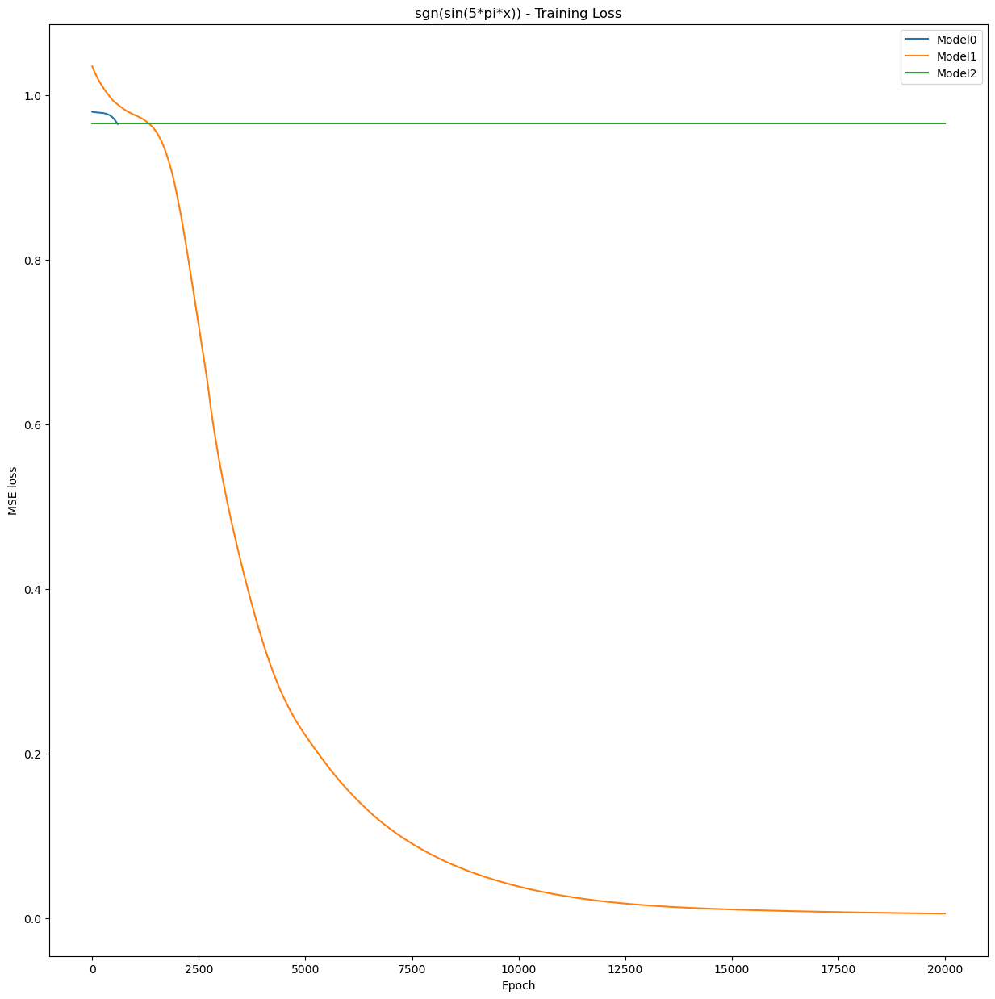

In [47]:
fig = plt.figure(figsize=(15, 15))
plt.plot(np.array(training_losses_m0), label='Model0')
plt.plot(np.array(training_losses_m1), label='Model1')
plt.plot(np.array(training_losses_m2), label='Model2')
plt.title('sgn(sin(5*pi*x)) - Training Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE loss')
plt.legend()
plt.savefig(os.path.join(path2write, 'sgn_func.png'))

In [48]:
points = 10000
eval_input_ = np.linspace(1e-4, 1, points)
model_1_op = evaluate_model(model0, eval_input_)
model_2_op = evaluate_model(model1, eval_input_)
model_3_op = evaluate_model(model2, eval_input_)

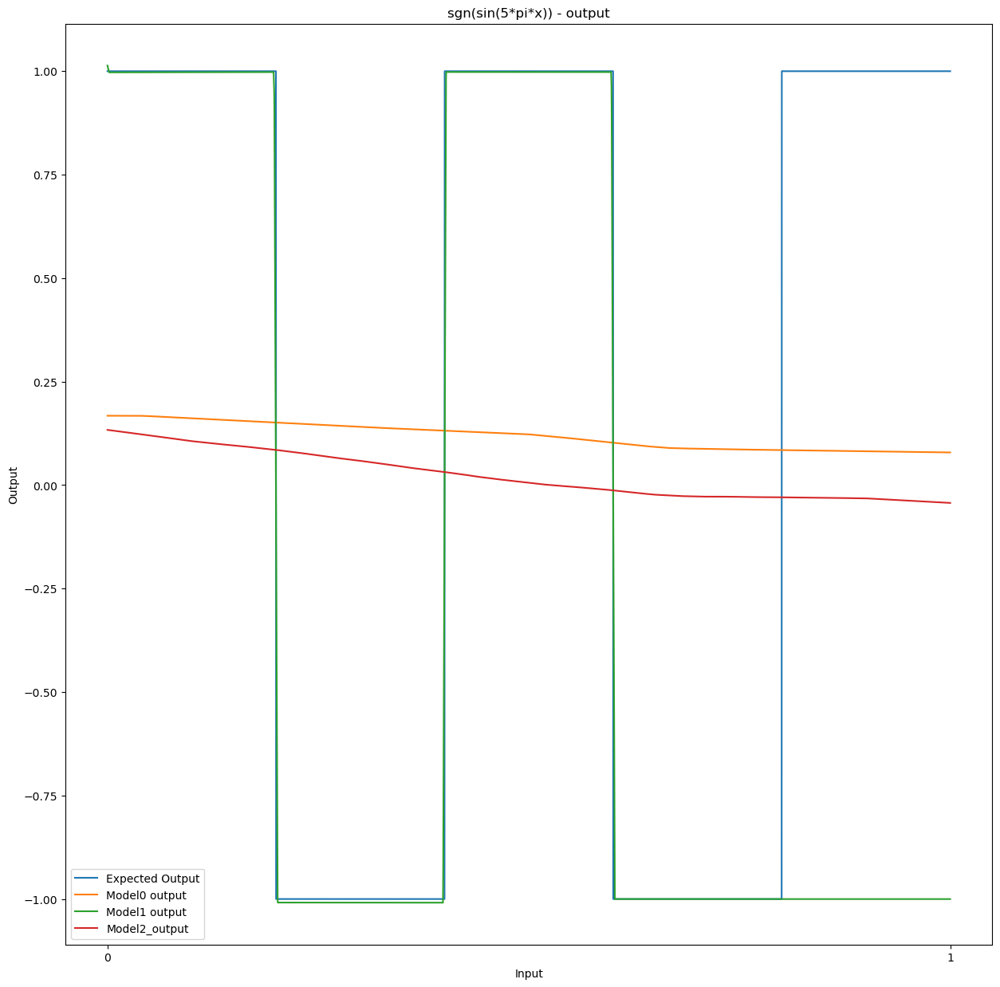

In [49]:
fig = plt.figure(figsize=(15, 15))
exp_output = list(map(func2, eval_input_))
plt.plot(eval_input_, exp_output, label='Expected Output')
plt.plot(eval_input_, np.array(model_1_op), label='Model0 output')
plt.plot(eval_input_, np.array(model_2_op), label='Model1 output')
plt.plot(eval_input_, np.array(model_3_op), label='Model2_output')
plt.title('sgn(sin(5*pi*x)) - output') #np.sin(5*np.pi*x)np.sign(np.sin(5*np.pi*x))
plt.xlabel('Input')
plt.ylabel('Output')
plt.legend()
plt.xticks(np.arange(0, 11, 10)/10)
plt.savefig(os.path.join(path2write, 'sgn_output.png'))
# plt.xlim(1e-4,1)
plt.show()